In [799]:
from scipy import spatial
import gensim.downloader as api
from sklearn.decomposition import PCA
import torch
import torch.nn as nn
import pandas as pd

import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import seaborn as sns
from seaborn.colors import crayons
from sklearn.metrics.pairwise import paired_cosine_distances,cosine_distances
import scipy as sp
from sklearn.utils.extmath import stable_cumsum


In [ ]:
data = pd.read_csv("/Users/temp/Documents/Spring 2024/NLP/mmontgomery1-master/project/implicit-hate-corpus/implicit_hate_v1_stg2_posts.tsv",sep="\t")

In [615]:
from sentence_transformers import SentenceTransformer

encode_model = SentenceTransformer("all-MiniLM-L6-v2")

In [ ]:
data

In [ ]:
embeddings = model.encode(data['post'])
for i in range(0,384):
    data['v_'+str(i)] = [j[i] for j in embeddings]

In [ ]:
data

Vectors obtained!

<h1>Sprinkling a little PCA to see if we could possibly not work with all 384.</h1>

In [ ]:
vecs = list(set(data.columns)-set(['post', 'implicit_class', 'extra_implicit_class']))

In [ ]:
pca = PCA()
pca.fit(data[vecs])

In [ ]:
plt.figure(figsize=(10,8))
plt.plot(range(1,385),pca.explained_variance_ratio_.cumsum(), marker='o',linestyle='--')

Again, PCA not looking so sexy, and note that the curve starts lower this time.

<h1>What happens when we do K-Means clustering?</h1>

First using Euclidean Default

In [ ]:
kmeans_pca = KMeans(n_clusters=7, init='k-means++',random_state=42)
kmeans_pca.fit(data[vecs])

In [ ]:
kmeans_pca.cluster_centers_
df_segm_pca_kmeans = pd.concat([data.reset_index(inplace=True),pd.DataFrame(data)],axis=1)
df_segm_pca_kmeans.columns = [*df_segm_pca_kmeans.columns[:-5],*['C1','C2','C3','C4','C5']]
df_segm_pca_kmeans['Segment K-means PCA'] = kmeans_pca.labels_
df_segm_pca_kmeans['Segment'] = df_segm_pca_kmeans['Segment K-means PCA'].map({0:'first',1:'second',2:'third',3:'fourth',4:'fifth',5:'sixth',7:'seventh'})
for c0 in ['C1','C2','C3','C4','C5']:
    for c1 in ['C1','C2','C3','C4','C5']:
        if c0!=c1:
            X_axis = df_segm_pca_kmeans[c0]
            Y_axis = df_segm_pca_kmeans[c1]
            plt.figure(figsize=(10,10))
            sns.scatterplot(x=X_axis,y=Y_axis,hue=df_segm_pca_kmeans['Segment'],palette=['g','r','c','b','m',crayons['Gold'],'y'])

In [ ]:
data['Euclidean_knn_cat'] = kmeans_pca.labels_

In [ ]:
data.groupby(by=['Euclidean_knn_cat','implicit_class']).size().unstack().plot.bar(stacked=True)

In [ ]:
data.groupby(by=['implicit_class','Euclidean_knn_cat']).size().unstack().plot.bar(stacked=True)

Now let's try with Cosine distance instead of euclidean--looking like I'm going to have to jimmy this under the hood though because s Sklearn doiesn't allow you to set the distance measure as a parameter.

In [ ]:
pd.DataFrame(cosine_distances(data[vecs],data[vecs]))

In [ ]:
from scipy.spatial.distance import cdist
#from https://www.askpython.com/python/examples/k-means-clustering-from-scratch
def kmeans(x,k,iter,metric):
    idx = np.random.choice(len(x),k,replace=False)
    centroids = x[idx, :]
    #random centroids

    distances = cdist(x, centroids,metric)

    points = np.array([np.argmin(i) for i in distances])

    for _ in range(iter):
        centroids = []
        for idx in range(k):

            temp_cent = x[points==idx].mean(axis=0)
            centroids.append(temp_cent)
        centroids = np.vstack(centroids)

        distances = cdist(x,centroids, metric)

        points = np.array([np.argmin(i) for i in distances])

    return points

In [ ]:
data['Cosine_knn_cat'] = kmeans(data[vecs].to_numpy(),7,300,'cosine')
data['Euclidean_scratch_knn_cat'] = kmeans(data[vecs].to_numpy(),7,300,'euclidean')

In [ ]:
data.groupby(by=['Euclidean_scratch_knn_cat','implicit_class']).size().unstack().plot.bar(stacked=True)

In [ ]:
data.groupby(by=['implicit_class','Euclidean_scratch_knn_cat']).size().unstack().plot.bar(stacked=True)

In [ ]:
data.groupby(by=['Cosine_knn_cat','implicit_class']).size().unstack().plot.bar(stacked=True)

In [ ]:
data.groupby(by=['implicit_class','Cosine_knn_cat']).size().unstack().plot.bar(stacked=True)

Okay Clustering is kinda messy. Let's see if we can alter S-Bert embeddings to be better at this. Time to hit em with the networks and pytorch rizz.

<h1>We're gonna build a neural net now I guess</h1>

OKAY SO I BUILT A THING, BUT BECAUSE MY 384 VECTORS ARE SO TINY, TRAINING IT IS A BITCH AND BEING AS THIS IS THE IFRST ONE I'VE EVER MADE ITS KINDA SMALL AND STUPID AND NOT WELL BUILT SO WE'RE GOING TO MODIFY IT.

In [591]:
import torch
import torch.nn as nn
from tqdm import tqdm

class myNeuralNetwork(nn.Module):
    #STARTING OUT WITH SOMETHING SUPER SIMPLE
    def __init__(self):
        super(myNeuralNetwork,self).__init__()
        self.softmax = nn.Softmax(dim=0)#Need this for the probabilities at the end
        self.sigmoid = nn.Sigmoid()#Need this to normalize at each layer
        self.tanh = nn.Tanh()#Need this for weights; want to be able to weight a component but in a way that doesn't affect the classification
        #self.W_a = nn.Parameter(torch.ones((384,384),dtype=torch.float64))#the 384 x 384 matrix to get the "coefficient" for each component. Allows the "coefficeint" to be dependent on other components.
        #self.W_A = 'none'#torch.zeros((384,1),dtype=torch.float64)#the 384 x 1 matrix containing the "coefficient" for each component. Initialized to zeroes, but will be computed based on W_a.
        #self.W_r = #torch.ones((384,384),dtype=torch.float64)#the 384 x 384 that is populated. this is just a placeholder
        #self.W_b = nn.Parameter(torch.ones((384,1),dtype=torch.float64))
        #self.W_s = nn.Parameter(torch.zeros((384,7),dtype=torch.float64))
        self.W_xa = nn.Parameter(torch.randn((384,20),dtype=torch.float64,requires_grad=False))
        self.W_as = nn.Parameter(torch.randn((20,7),dtype=torch.float64),requires_grad=True)
        self.output = torch.zeros((1,7),requires_grad=True)
        self.S = torch.zeros((1,7),requires_grad=True)
        self.labels = ['white_grievance', 'irony', 'stereotypical', 'incitement', 'other',
       'threatening', 'inferiority']
        return
    def forward(self,x,verbose):
        
       # x_dense=torch.tensor([list(x)]*384,dtype=torch.float64)
        #A = torch.sum(self.tanh(x_dense @ self.W_a),dim=1)
        #B = A @ self.W_b
        self.S= x @ self.W_xa @ self.W_as
        self.output = self.softmax(self.S)
        if verbose:        
            print("W_xa","\n",self.W_xa)
            print("W_as","\n",self.W_as)
            print("S","\n",self.S)
            print("p","\n",self.output)

        return self.output

In [ ]:
labels = {1: 'white_grievance',
            2: 'irony',
            3: 'stereotypical',
            4: 'incitement',
            5: 'other',
            6: 'threatening',
            7: 'inferiority'}
labelsr = dict(zip(labels.values(),labels.keys()))

In [ ]:
data['ih_num'] = [labelsr[i] for i in data['implicit_class']]

In [ ]:
train_X = torch.tensor(data[vecs][:1000].to_numpy(),dtype=torch.float64)
train_Y = data['implicit_class'][:1000].to_numpy()
train_data = list(zip(train_X,train_Y))

In [ ]:
def myLoss(pred,actual):
    return torch.sum(torch.abs(torch.subtract(pred,actual)))


In [ ]:
#def train_model(model, data, epochs, learning_rate=0.4):
    #criterion = myLoss
model = myNeuralNetwork()
epochs=20
learning_rate=1

criterion = nn.CrossEntropyLoss()
torch.random.manual_seed(42)  
np.random.seed(42)
optimizer = torch.optim.Adam(model.parameters(),
                                lr=learning_rate)
model.verbose = False
loss_val = []
# main training loop
for epoch in tqdm(range(epochs)):#tqdm(range(epochs), total=epochs):
    optimizer.zero_grad()
    np.random.shuffle(train_data)
    for X, y in train_data:
        y_hot = [0,0,0,0,0,0,0]
        y_hot[int(list(model.labels).index(y))] = 1
        y_hot = torch.tensor(y_hot,dtype=torch.float64)
        result = model.forward(X,True)

        loss = criterion(result, y_hot)
        print(result,y_hot)
        loss.backward()      # computes all the gradients
        print('loss',loss.item())
    loss_val.append(loss.item())
    optimizer.step()     # update parameters
    
plt.figure()
plt.plot(loss_val, 'bo-')
plt.ylabel('loss')
plt.xlabel('instances')
plt.show()


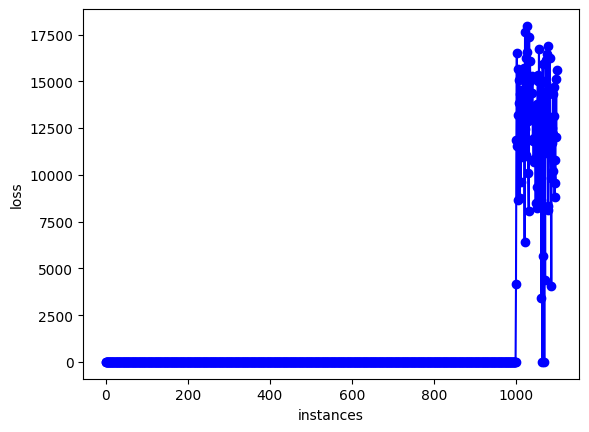

In [480]:
plt.figure()
plt.plot(loss_val[:10], 'bo-')
plt.ylabel('loss')
plt.xlabel('instances')
plt.show()

In [572]:
test_X = torch.tensor(data[vecs][:500].to_numpy(),dtype=torch.float64)
test_Y = data['implicit_class'][:500].to_numpy()
test_data = list(zip(test_X,test_Y))


In [590]:
correct = 0

for x,y in test_data:
    results = model(x,False)
    if int(torch.argmax(results)) == int(list(model.labels).index(y)):
        correct+=1
print(correct)

157


In [585]:
untrainedm = myNeuralNetwork()
test_data = list(zip(test_X,test_Y))
correct = 0

for x,y in test_data:
    results = untrainedm(x,False)
    if int(torch.argmax(results)) == int(list(untrainedm.labels).index(y)):
        correct+=1
print(correct)

157


<h1>Making the Actual Models</h1><p>and then we're going to compare weights and whatnot to determine similarities between the classification tasks.</p>

<h4>Implicit vs Explicit vs Not-Hate Text: Classifying vs a Gradient</h4>

Comparing a probabilistic classifier to something a network predicting to some number between -1 and 1, where -1 is explicit, 0 is implicit, and 1 is non-hate. Nominal vs Ordinal classification if you will.

But to start, a fun little 3d plot.

In [593]:
data1 = pd.read_csv("/Users/temp/Documents/Spring 2024/NLP/mmontgomery1-master/project/implicit-hate-corpus/implicit_hate_v1_stg1_posts.tsv",sep="\t")

In [594]:
pd.unique(data1['class'])

array(['implicit_hate', 'not_hate', 'explicit_hate'], dtype=object)

In [613]:
data1[]

,post,class,lin_label,class_label
0,""" : jewish harvard professor noel ignatiev w...",implicit_hate,0,1
1,b.higher education is a part of european cult...,not_hate,1,2
2,"has a problem with "" the whites "" "" and "" "" ...",not_hate,1,2
3,is yasir qadhi a hate preacher for calling ch...,not_hate,1,2
4,"rt "" : how three million germans mass murder...",not_hate,1,2
...,...,...,...,...
21475,"Seeing prostitutes is morally wrong, but being...",implicit_hate,0,1
21476,I wonder how many females I raped today I spen...,implicit_hate,0,1
21477,Having a criminal record is more attractive to...,implicit_hate,0,1
21478,Another advantage of being a female: getting b...,implicit_hate,0,1


In [597]:
lindict = dict(zip(['implicit_hate', 'not_hate', 'explicit_hate'],[0,1,-1]))
classdict = dict(zip(['implicit_hate', 'not_hate', 'explicit_hate'],[1,2,3]))

In [598]:
data1['lin_label'] = [lindict[e] for e in data1['class']]
data1['class_label'] = [classdict[e] for e in data1['class']]

In [616]:
embeddings = encode_model.encode(data1['post'])
for i in range(0,384):
    data1['v_'+str(i)] = [j[i] for j in embeddings]

/var/folders/4z/bnyz3w2s6lg97h_fm4lt5ksr0000gn/T/ipykernel_728/3330589196.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data1['v_'+str(i)] = [j[i] for j in embeddings]
/var/folders/4z/bnyz3w2s6lg97h_fm4lt5ksr0000gn/T/ipykernel_728/3330589196.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data1['v_'+str(i)] = [j[i] for j in embeddings]
/var/folders/4z/bnyz3w2s6lg97h_fm4lt5ksr0000gn/T/ipykernel_728/3330589196.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` 

Class Model First

In [794]:
class IDHate(nn.Module):
    def __init__(self):
        super(IDHate,self).__init__()
        self.softmax = nn.Softmax(dim=0)#Need this for the probabilities at the end
        self.sigmoid = nn.Sigmoid()#Need this to normalize at each layer
        self.tanh = nn.Tanh()#Need this for weights; want to be able to weight a component but in a way that doesn't affect the classification
        self.W = nn.Parameter(torch.ones((384,384),dtype=torch.float64),requires_grad=True)#used to make X-based weights
        self.W_x = torch.ones((384,384),requires_grad=False,dtype=torch.float64)#holds X-based weights
        self.W_a = torch.ones((1,384),requires_grad=False,dtype=torch.float64)#sum up x-based weights before 
        self.W_xa = nn.Parameter(torch.ones((384,3),dtype=torch.float64,requires_grad=True))
        self.S = torch.zeros((1,3),requires_grad=False,dtype=torch.float64)
        self.labels = ['implicit_hate', 'not_hate', 'explicit_hate']
        self.output = torch.zeros((1,3))
        return
    
    
    def forward(self,x):
        x_dense=torch.tensor([list(x)]*384,dtype=torch.float64)
        self.W_x = self.tanh(x_dense @ self.W)
        
        self.S= self.sigmoid(x @ self.W_x) @ self.W_xa
        self.output = self.softmax(self.S)
        return self.output

    def _print(self):
        print("W","\n",self.W)
        print("W_x","\n",self.W_x)
        print("W_xa","\n",self.W_xa)
        print("S","\n",self.S)
        print("p","\n",self.output)
        return
    def _train(self,data,epochs,learning_rate):
        criterion = nn.CrossEntropyLoss()
        torch.random.manual_seed(42)  
        np.random.seed(42)
        optimizer = torch.optim.Adam(model.parameters(),
                                        lr=learning_rate)
        loss_val = []
        # main training loop
        for epoch in tqdm(range(epochs)):
            #optimizer.zero_grad()
            np.random.shuffle(data)
            model._print()
            for X, y in tqdm(data[:500]):
                #print(y)
                y_hot = [0,0,0]
                y_hot[int(list(model.labels).index(y))] = 1
                y_hot = torch.tensor(y_hot,dtype=torch.float64)
                result = model.forward(X)
                loss = criterion(result, y_hot)
                #print(result,y_hot)
                loss.backward()      # computes all the gradients
                #print('loss',loss.item())
                optimizer.step()
                loss_val.append(loss.item())
                # update parameters
        plt.figure()
        plt.plot(loss_val, '-')
        plt.ylabel('loss')
        plt.xlabel('instances')
        plt.show()
            

In [711]:
def z(x):
    n = x.shape[0]
    mean = torch.sum(x,dim=0)/n # X.mean()
    std = torch.std(x,dim=0)
    z_scores = (x - mean)/std
    return z_scores

Train

In [782]:
train_X1 = torch.tensor(data1[vecs].to_numpy(),dtype=torch.float64)
train_X1 = z(train_X1)
train_Y1 = data1['class'].to_numpy()
train_data1 = list(zip(train_X1,train_Y1))

  0%|          | 0/10 [00:00<?, ?it/s]

W 
 Parameter containing:
tensor([[1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.],
        ...,
        [1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.]], dtype=torch.float64,
       requires_grad=True)
W_x 
 tensor([[1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.],
        ...,
        [1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.]], dtype=torch.float64)
W_xa 
 Parameter containing:
tensor([[ 0.2996,  0.2424,  0.2832],
        [-0.2329,  0.6712,  0.7818],
        [-1.7903, -1.7484,  0.1735],
        ...,
        [ 0.4019, -0.5671,  0.1414],
        [ 0.5369, -0.0447, -0.1311],
        [ 0.8501, -1.2987,  1.3299]], dtype=torch.float64, requires_grad=True)
S 
 tensor([[0., 0., 0.]], dtype=torch.float64)
p 
 tensor([[0., 0., 0.]])


 10%|█         | 1/10 [00:08<01:20,  8.98s/it]

W 
 Parameter containing:
tensor([[0.7811, 1.2238, 1.2239,  ..., 0.7779, 0.7776, 1.2237],
        [0.8363, 1.1623, 1.1624,  ..., 0.8342, 0.8342, 1.1619],
        [0.8426, 0.9236, 0.9299,  ..., 0.8552, 0.8588, 0.9091],
        ...,
        [0.8406, 1.0306, 1.0371,  ..., 0.8473, 0.8493, 1.0135],
        [0.8348, 1.1557, 1.1562,  ..., 0.8312, 0.8312, 1.1544],
        [0.7768, 1.2256, 1.2257,  ..., 0.7749, 0.7746, 1.2254]],
       dtype=torch.float64, requires_grad=True)
W_x 
 tensor([[0.9773, 0.9999, 0.9999,  ..., 0.9745, 0.9764, 0.9999],
        [0.9773, 0.9999, 0.9999,  ..., 0.9745, 0.9764, 0.9999],
        [0.9773, 0.9999, 0.9999,  ..., 0.9745, 0.9764, 0.9999],
        ...,
        [0.9773, 0.9999, 0.9999,  ..., 0.9745, 0.9764, 0.9999],
        [0.9773, 0.9999, 0.9999,  ..., 0.9745, 0.9764, 0.9999],
        [0.9773, 0.9999, 0.9999,  ..., 0.9745, 0.9764, 0.9999]],
       dtype=torch.float64, grad_fn=<TanhBackward0>)
W_xa 
 Parameter containing:
tensor([[ 0.5228,  0.2424,  0.0599],
     

 20%|██        | 2/10 [00:17<01:11,  8.88s/it]

W 
 Parameter containing:
tensor([[0.5683, 1.4358, 1.4358,  ..., 0.5651, 0.5648, 1.4355],
        [0.6234, 1.3748, 1.3750,  ..., 0.6214, 0.6213, 1.3744],
        [0.6298, 0.8606, 0.8798,  ..., 0.6437, 0.6479, 0.8186],
        ...,
        [0.6278, 1.1672, 1.1818,  ..., 0.6351, 0.6372, 1.1253],
        [0.6220, 1.3664, 1.3670,  ..., 0.6185, 0.6185, 1.3647],
        [0.5639, 1.4371, 1.4373,  ..., 0.5621, 0.5619, 1.4368]],
       dtype=torch.float64, requires_grad=True)
W_x 
 tensor([[1.0000, 0.2363, 0.1998,  ..., 0.9996, 0.9994, 0.2907],
        [1.0000, 0.2363, 0.1998,  ..., 0.9996, 0.9994, 0.2907],
        [1.0000, 0.2363, 0.1998,  ..., 0.9996, 0.9994, 0.2907],
        ...,
        [1.0000, 0.2363, 0.1998,  ..., 0.9996, 0.9994, 0.2907],
        [1.0000, 0.2363, 0.1998,  ..., 0.9996, 0.9994, 0.2907],
        [1.0000, 0.2363, 0.1998,  ..., 0.9996, 0.9994, 0.2907]],
       dtype=torch.float64, grad_fn=<TanhBackward0>)
W_xa 
 Parameter containing:
tensor([[ 0.7344,  0.2424, -0.1516],
     

 30%|███       | 3/10 [00:26<01:02,  8.96s/it]

W 
 Parameter containing:
tensor([[0.3615, 1.6005, 1.7683,  ..., 0.3581, 0.3580, 1.6941],
        [0.4166, 1.6007, 1.4455,  ..., 0.4146, 0.4145, 1.5418],
        [0.4230, 0.8835, 0.5764,  ..., 0.4375, 0.4420, 0.5933],
        ...,
        [0.4210, 1.2351, 1.5205,  ..., 0.4287, 0.4308, 1.3822],
        [0.4151, 1.6489, 1.1880,  ..., 0.4116, 0.4117, 1.3686],
        [0.3571, 1.6491, 1.6076,  ..., 0.3553, 0.3552, 1.6324]],
       dtype=torch.float64, requires_grad=True)
W_x 
 tensor([[ 0.9995, -0.9251, -0.9987,  ...,  0.9446,  0.7155, -0.9674],
        [ 0.9995, -0.9251, -0.9987,  ...,  0.9446,  0.7155, -0.9674],
        [ 0.9995, -0.9251, -0.9987,  ...,  0.9446,  0.7155, -0.9674],
        ...,
        [ 0.9995, -0.9251, -0.9987,  ...,  0.9446,  0.7155, -0.9674],
        [ 0.9995, -0.9251, -0.9987,  ...,  0.9446,  0.7155, -0.9674],
        [ 0.9995, -0.9251, -0.9987,  ...,  0.9446,  0.7155, -0.9674]],
       dtype=torch.float64, grad_fn=<TanhBackward0>)
W_xa 
 Parameter containing:
tensor

 40%|████      | 4/10 [00:35<00:53,  8.92s/it]

W 
 Parameter containing:
tensor([[0.1571, 1.7377, 2.0841,  ..., 0.1530, 0.1536, 1.9597],
        [0.2120, 1.8303, 1.3863,  ..., 0.2101, 0.2100, 1.6841],
        [0.2186, 1.0057, 0.2458,  ..., 0.2334, 0.2382, 0.3171],
        ...,
        [0.2165, 1.2271, 1.8486,  ..., 0.2247, 0.2266, 1.6725],
        [0.2105, 1.9344, 0.8592,  ..., 0.2071, 0.2072, 1.1857],
        [0.1526, 1.8611, 1.7551,  ..., 0.1507, 0.1507, 1.8213]],
       dtype=torch.float64, requires_grad=True)
W_x 
 tensor([[-1.0000,  0.9999, -1.0000,  ..., -1.0000, -1.0000, -0.9459],
        [-1.0000,  0.9999, -1.0000,  ..., -1.0000, -1.0000, -0.9459],
        [-1.0000,  0.9999, -1.0000,  ..., -1.0000, -1.0000, -0.9459],
        ...,
        [-1.0000,  0.9999, -1.0000,  ..., -1.0000, -1.0000, -0.9459],
        [-1.0000,  0.9999, -1.0000,  ..., -1.0000, -1.0000, -0.9459],
        [-1.0000,  0.9999, -1.0000,  ..., -1.0000, -1.0000, -0.9459]],
       dtype=torch.float64, grad_fn=<TanhBackward0>)
W_xa 
 Parameter containing:
tensor

 50%|█████     | 5/10 [00:44<00:43,  8.77s/it]

W 
 Parameter containing:
tensor([[-4.6059e-02,  1.8857e+00,  2.3494e+00,  ..., -1.2423e-02,
         -4.6642e-02,  2.1277e+00],
        [ 8.7224e-03,  2.0507e+00,  1.3129e+00,  ...,  2.9235e-02,
          1.0519e-02,  1.8100e+00],
        [ 1.5357e-02,  1.1394e+00, -2.7516e-02,  ...,  7.2924e-02,
          4.5534e-02, -7.5346e-02],
        ...,
        [ 1.3232e-02,  1.2177e+00,  2.1196e+00,  ...,  7.1041e-02,
          4.0712e-02,  1.6199e+00],
        [ 7.2053e-03,  2.1869e+00,  5.8738e-01,  ..., -5.3508e-04,
          5.9878e-03,  9.4883e-01],
        [-5.0632e-02,  2.0697e+00,  1.9129e+00,  ..., -6.4009e-02,
         -5.4863e-02,  2.0081e+00]], dtype=torch.float64, requires_grad=True)
W_x 
 tensor([[ 1.0000, -1.0000,  0.9480,  ...,  1.0000,  1.0000, -1.0000],
        [ 1.0000, -1.0000,  0.9480,  ...,  1.0000,  1.0000, -1.0000],
        [ 1.0000, -1.0000,  0.9480,  ...,  1.0000,  1.0000, -1.0000],
        ...,
        [ 1.0000, -1.0000,  0.9480,  ...,  1.0000,  1.0000, -1.0000],
  

 60%|██████    | 6/10 [00:53<00:35,  8.81s/it]

W 
 Parameter containing:
tensor([[-2.4848e-01,  2.0418e+00,  2.5927e+00,  ..., -4.5843e-02,
         -2.2304e-01,  2.2360e+00],
        [-1.9379e-01,  2.2660e+00,  1.2358e+00,  ..., -2.0965e-02,
         -1.5918e-01,  1.9226e+00],
        [-1.8706e-01,  1.2823e+00, -2.7822e-01,  ...,  2.3804e-01,
         -6.4094e-02, -4.4071e-01],
        ...,
        [-1.8914e-01,  1.2071e+00,  2.3698e+00,  ...,  3.7947e-01,
          1.0240e-03,  1.3379e+00],
        [-1.9534e-01,  2.4239e+00,  3.3816e-01,  ..., -1.6144e-01,
         -1.7924e-01,  6.8946e-01],
        [-2.5317e-01,  2.2763e+00,  2.0777e+00,  ..., -3.3594e-01,
         -2.7620e-01,  2.1937e+00]], dtype=torch.float64, requires_grad=True)
W_x 
 tensor([[-1.,  1.,  1.,  ..., -1., -1.,  1.],
        [-1.,  1.,  1.,  ..., -1., -1.,  1.],
        [-1.,  1.,  1.,  ..., -1., -1.,  1.],
        ...,
        [-1.,  1.,  1.,  ..., -1., -1.,  1.],
        [-1.,  1.,  1.,  ..., -1., -1.,  1.],
        [-1.,  1.,  1.,  ..., -1., -1.,  1.]], dtype

 70%|███████   | 7/10 [01:02<00:26,  8.87s/it]

W 
 Parameter containing:
tensor([[-0.4504,  2.2044,  2.8251,  ..., -0.0812, -0.4031,  2.3529],
        [-0.3958,  2.4780,  1.1512,  ..., -0.0745, -0.3334,  2.0438],
        [-0.3890,  1.4328, -0.5157,  ...,  0.4129, -0.1809, -0.7415],
        ...,
        [-0.3910,  1.1951,  2.6069,  ...,  0.6563, -0.0405,  1.0803],
        [-0.3974,  2.6519,  0.1017,  ..., -0.3274, -0.3669,  0.4462],
        [-0.4552,  2.4815,  2.2481,  ..., -0.5880, -0.4930,  2.3819]],
       dtype=torch.float64, requires_grad=True)
W_x 
 tensor([[ 1.0000, -1.0000, -1.0000,  ...,  1.0000,  1.0000, -1.0000],
        [ 1.0000, -1.0000, -1.0000,  ...,  1.0000,  1.0000, -1.0000],
        [ 1.0000, -1.0000, -1.0000,  ...,  1.0000,  1.0000, -1.0000],
        ...,
        [ 1.0000, -1.0000, -1.0000,  ...,  1.0000,  1.0000, -1.0000],
        [ 1.0000, -1.0000, -1.0000,  ...,  1.0000,  1.0000, -1.0000],
        [ 1.0000, -1.0000, -1.0000,  ...,  1.0000,  1.0000, -1.0000]],
       dtype=torch.float64, grad_fn=<TanhBackward0>)

 80%|████████  | 8/10 [01:11<00:18,  9.16s/it]

W 
 Parameter containing:
tensor([[-0.6520,  2.3722,  3.0504,  ..., -0.1202, -0.5864,  2.4774],
        [-0.5974,  2.6876,  1.0595,  ..., -0.1331, -0.5115,  2.1726],
        [-0.5906,  1.5895, -0.7448,  ...,  0.5917, -0.3053, -1.0127],
        ...,
        [-0.5926,  1.1820,  2.8357,  ...,  0.9127, -0.0862,  0.8369],
        [-0.5990,  2.8739, -0.1267,  ..., -0.4983, -0.5567,  0.2128],
        [-0.6569,  2.6858,  2.4229,  ..., -0.8276, -0.7064,  2.5721]],
       dtype=torch.float64, requires_grad=True)
W_x 
 tensor([[-0.9752,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000],
        [-0.9752,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000],
        [-0.9752,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000],
        ...,
        [-0.9752,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000],
        [-0.9752,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000],
        [-0.9752,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000]],
       dtype=torch.float64, grad_fn=<TanhBackward0>)

 90%|█████████ | 9/10 [01:21<00:09,  9.33s/it]

W 
 Parameter containing:
tensor([[-0.8533,  2.5443,  3.2709,  ..., -0.1627, -0.7721,  2.6088],
        [-0.7988,  2.8955,  0.9612,  ..., -0.1968, -0.6928,  2.3081],
        [-0.7919,  1.7515, -0.9682,  ...,  0.7735, -0.4365, -1.2667],
        ...,
        [-0.7939,  1.1676,  3.0589,  ...,  1.1563, -0.1359,  0.6027],
        [-0.8004,  3.0918, -0.3495,  ..., -0.6731, -0.7480, -0.0138],
        [-0.8582,  2.8893,  2.6012,  ..., -1.0590, -0.9174,  2.7639]],
       dtype=torch.float64, requires_grad=True)
W_x 
 tensor([[ 1., -1., -1.,  ...,  1.,  1., -1.],
        [ 1., -1., -1.,  ...,  1.,  1., -1.],
        [ 1., -1., -1.,  ...,  1.,  1., -1.],
        ...,
        [ 1., -1., -1.,  ...,  1.,  1., -1.],
        [ 1., -1., -1.,  ...,  1.,  1., -1.],
        [ 1., -1., -1.,  ...,  1.,  1., -1.]], dtype=torch.float64,
       grad_fn=<TanhBackward0>)
W_xa 
 Parameter containing:
tensor([[ 2.2699, -0.4807, -1.6008],
        [ 1.9320, -0.1595, -1.1365],
        [ 0.2808, -2.4598, -1.7500],
   

100%|██████████| 10/10 [01:31<00:00,  9.18s/it]


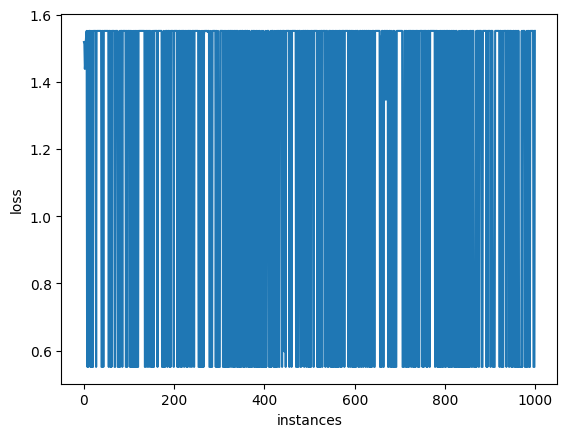

In [791]:
model = IDHate()
epochs=10
learning_rate=0.002


criterion = nn.CrossEntropyLoss()
torch.random.manual_seed(42)  
np.random.seed(42)
optimizer = torch.optim.Adam(model.parameters(),
                                lr=learning_rate)
model.verbose = False
loss_val = []
# main training loop
for epoch in tqdm(range(epochs)):
    #optimizer.zero_grad()
    np.random.shuffle(train_data1)
    model._print()
    for X, y in tqdm(train_data1[:100]):
        #print(y)
        y_hot = [0,0,0]
        y_hot[int(list(model.labels).index(y))] = 1
        y_hot = torch.tensor(y_hot,dtype=torch.float64)
        result = model.forward(X)
        loss = criterion(result, y_hot)
        #print(result,y_hot)
        loss.backward()      # computes all the gradients
        #print('loss',loss.item())
        optimizer.step()
        loss_val.append(loss.item())
            # update parameters
    
plt.figure()
plt.plot(loss_val, '-')
plt.ylabel('loss')
plt.xlabel('instances')
plt.show()


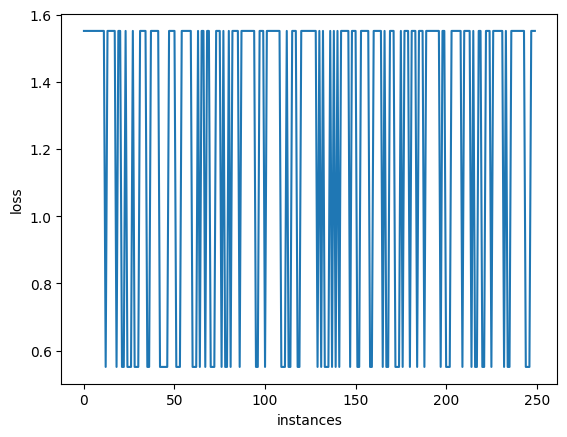

In [784]:
plt.figure()
plt.plot(loss_val[::10], '-')
plt.ylabel('loss')
plt.xlabel('instances')
plt.show()

In [721]:
model.W

Parameter containing:
tensor([[ 247.3198, -490.6251, -492.4165,  ...,  471.0319,  489.0758,
         -459.2087],
        [-421.5799,  499.6998,  500.0275,  ..., -493.5905, -497.0448,
          493.6178],
        [-297.3244,  495.5574,  496.7462,  ..., -478.9931, -491.1934,
          474.2205],
        ...,
        [ 363.3186, -496.0375, -496.7120,  ...,  489.6565,  496.6917,
         -483.6847],
        [ 417.1626, -497.5452, -497.9052,  ...,  495.0343,  498.8257,
         -490.8714],
        [-422.1009,  499.7122,  500.0373,  ..., -493.6350, -497.0623,
          493.6775]], dtype=torch.float64, requires_grad=True)

In [792]:
correct = 0
test_data1 = train_data1[:500]
for x,y in test_data1:
    results = model(x)
    if int(torch.argmax(results)) == int(list(model.labels).index(y)):
        correct+=1
print(correct)

160


In [793]:
correct=0
stupid_model = IDHate()
for x,y in test_data1:
    results = stupid_model(x)
    if int(torch.argmax(results)) == int(list(stupid_model.labels).index(y)):
        correct+=1
print(correct)

22


In [704]:
x.shape

torch.Size([384])

In [703]:
(model.z(x).shape)

torch.Size([384])

In [ ]:
for v in vecs:
    dimension = torch.tensor([(data1.iloc[i][v] - np.mean(data1[v]))/np.std(data1[v]) for i in range(0,len(data))])
    print(v,min(dimension),max(dimension),torch.mean(dimension),torch.median(dimension))

In [ ]:
for v in vecs:
    print(v,data1[v]),max(data1[v]),np.median(data1[v])

Regression Model

In [774]:
class RegressHate(nn.Module):
    #STARTING OUT WITH SOMETHING SUPER SIMPLE
    def __init__(self):
        super(RegressHate,self).__init__()
        self.softmax = nn.Softmax(dim=0)#Need this for the probabilities at the end
        #self.sigmoid = nn.Sigmoid()#Need this to normalize at each layer
        self.tanh = nn.Tanh()#Need this for weights; want to be able to weight a component but in a way that doesn't affect the classification
        self.W = nn.Parameter(torch.ones((384,384),dtype=torch.float64),requires_grad=True)#used to make X-based weights
        self.A = torch.ones((1,384),dtype=torch.float64,requires_grad=True)
        self.labels = ['implicit_hate', 'not_hate', 'explicit_hate']
        self.output = torch.tensor([0])
        return
    
    def forward(self,x):
        x_dense=torch.tensor([list(x)]*384,dtype=torch.float64)
        self.A = self.softmax(torch.sum(x_dense @ self.W,dim=1))
        self.output = self.tanh(self.A @ x)
        return self.output

    def _print(self):
        print("W","\n",self.W)
        print("W_x","\n",self.A)
        print("y","\n",self.output)
        return
    """    
    def _train(self,data,epochs,learning_rate):
        criterion = nn.MSELoss()
        torch.random.manual_seed(42)  
        np.random.seed(42)
        optimizer = torch.optim.Adam(model.parameters(),
                                        lr=learning_rate)
        loss_val = []
        # main training loop
        for epoch in tqdm(range(epochs)):
            #optimizer.zero_grad()
            np.random.shuffle(data)
            self._print()
            for X, y in tqdm(data[:500]):
                result = model.forward(X)
                loss = criterion(result, y)
                #print(result,y_hot)
                loss.backward()      # computes all the gradients
                #print('loss',loss.item())
                optimizer.step()
                loss_val.append(loss.item())
                # update parameters
        plt.figure()
        plt.plot(loss_val, '-')
        plt.ylabel('loss')
        plt.xlabel('instances')
        plt.show()"""

In [1262]:
train_X1 = torch.tensor(data1[vecs].to_numpy(),dtype=torch.float64)
train_X1 = torch.tensor(z(train_X1),dtype=torch.float64)
train_Y1 = torch.tensor(data1['lin_label'].to_numpy(),dtype=torch.float64)
train_data1 = list(zip(train_X1,train_Y1))

/var/folders/4z/bnyz3w2s6lg97h_fm4lt5ksr0000gn/T/ipykernel_728/3134275356.py:2: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



In [1263]:
smart_model = RegressHate()
epochs = 5
learning_rate = 0.2

criterion = nn.MSELoss()
torch.random.manual_seed(42)  
np.random.seed(42)
optimizer = torch.optim.Adam(model.parameters(),
                                lr=learning_rate)
loss_val = []
# main training loop
for epoch in tqdm(range(epochs)):
    #optimizer.zero_grad()
    np.random.shuffle(train_data1)
    smart_model._print()
    for X, y in tqdm(train_data1[:500]):
        result = smart_model.forward(X)
        print(result,y)
        loss = criterion(result, y)
        loss.backward()      # computes all the gradients
        optimizer.step()
        loss_val.append(loss.item())
        # update parameters
plt.figure()
plt.plot(loss_val, '-')
plt.ylabel('loss')
plt.xlabel('instances')
plt.show()

  0%|          | 0/5 [00:00<?, ?it/s]

W 
 Parameter containing:
tensor([[1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.],
        ...,
        [1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.]], dtype=torch.float64,
       requires_grad=True)
W_x 
 tensor([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
         1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
         1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
         1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
         1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
         1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
         1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
         1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
         1., 1., 1

tensor(-0.0169, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0055, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0240, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0042, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0014, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0069, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0102, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0085, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0077, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0028, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(-1., dtype=torch.float64)


tensor(-0.0188, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0044, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0076, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0289, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0022, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(0.0076, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0076, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0056, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0072, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0186, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0078, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0072, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0015, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(-1., dtype=torch.float64)


tensor(-0.0049, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0022, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0328, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(-1., dtype=torch.float64)
tensor(-0.0029, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0056, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0018, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0057, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0147, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(-1., dtype=torch.float64)


tensor(0.0145, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0160, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0336, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0074, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0229, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0270, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0249, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0027, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0431, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(-0.0171, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0170, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0075, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0117, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0240, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0005, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0167, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0089, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0216, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0348, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0170, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0045, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(-0.0097, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0034, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0071, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0014, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0122, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0108, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(0.0147, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0004, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0143, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0172, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0071, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0121, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0075, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0269, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0279, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(-1., dtype=torch.float64)


tensor(-0.0042, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0124, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0003, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)



 15%|█▍        | 73/500 [00:07<00:37, 11.37it/s]

tensor(0.0008, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0045, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0079, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0015, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0211, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0198, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(-0.0086, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0226, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0353, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(0.0115, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0167, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0090, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0051, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0151, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0252, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0170, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0029, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0089, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0087, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0066, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0095, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0168, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0029, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0212, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0272, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0089, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0044, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(0.0286, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0294, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0236, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0277, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0012, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0327, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0092, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0006, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0189, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0020, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0173, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0182, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0114, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0069, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0164, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0080, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(-1., dtype=torch.float64)
tensor(0.0405, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0080, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(-0.0040, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0048, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0060, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(-0.0243, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0209, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0041, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(0.0016, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0081, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0039, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(-0.0042, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0202, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0005, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0086, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0152, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(-0.0039, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0177, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0053, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0056, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0003, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(-1., dtype=torch.float64)
tensor(-0.0158, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0144, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0008, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0241, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0154, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0191, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0065, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(-0.0207, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0068, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0127, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0144, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0161, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(-0.0138, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0177, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0036, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0111, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0070, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0111, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0109, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0025, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0056, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0153, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(-1., dtype=torch.float64)
tensor(-0.0044, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0205, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0092, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0279, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0140, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0146, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0125, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0214, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0207, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0103, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0024, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(0.0183, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0084, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0155, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(0.0017, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0064, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0021, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0014, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0053, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0137, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0429, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0205, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0348, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0168, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0104, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0047, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(0.0004, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0060, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0101, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0165, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0009, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(0.0106, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0256, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0139, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0063, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0065, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0202, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0145, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0169, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(-0.0165, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0117, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0102, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0058, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0336, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0168, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0015, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0093, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0075, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0291, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0338, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0098, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0105, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0154, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(-1., dtype=torch.float64)


tensor(-0.0208, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0139, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0155, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0052, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0068, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0089, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(0.0114, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0047, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0300, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(-1., dtype=torch.float64)


tensor(-0.0236, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0191, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0181, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0011, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0176, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0346, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0109, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0005, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0074, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0062, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0217, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0044, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0021, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0069, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0186, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0055, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0068, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0103, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0037, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(-0.0093, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0188, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0066, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0118, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0034, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0194, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(0.0192, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0031, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0114, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0325, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0124, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0007, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0228, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0094, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0143, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(0.0356, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0279, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0144, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0010, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(-0.0079, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0290, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0005, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0169, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0007, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


tensor(0.0029, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0057, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(0.0047, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(0.0216, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)


tensor(0.0289, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)
tensor(0.0172, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(0., dtype=torch.float64)
tensor(-0.0051, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


  0%|          | 0/5 [00:25<?, ?it/s]

tensor(-0.0018, dtype=torch.float64, grad_fn=<TanhBackward0>) tensor(1., dtype=torch.float64)


KeyboardInterrupt: 

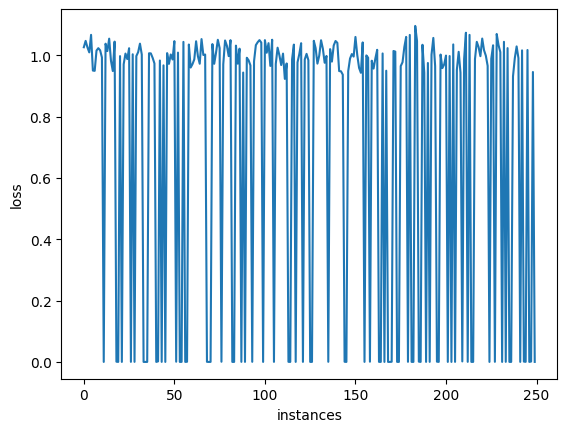

In [778]:
plt.figure()
plt.plot(loss_val[::10], '-')
plt.ylabel('loss')
plt.xlabel('instances')
plt.show()

<h1>Visuals for Class</h1>

In [800]:
import plotly.express as px
from sentence_transformers import SentenceTransformer

sbert3 = SentenceTransformer("all-MiniLM-L6-v2",truncate_dim=3)

In [806]:
df = pd.read_csv("/Users/temp/Documents/Spring 2024/NLP/mmontgomery1-master/project/implicit-hate-corpus/implicit_hate_v1_stg1_posts.tsv",sep="\t")
embeddings = sbert3.encode(df['post'],show_progress_bar=True)


Batches:   0%|          | 0/672 [00:00<?, ?it/s]

In [807]:
embeddings.shape

(21480, 3)

In [811]:
for i in tqdm(range(3)):
    df['v_'+str(i)] = [j[i] for j in embeddings]

100%|██████████| 3/3 [00:00<00:00, 112.78it/s]


In [812]:
df

,post,class,v_0,v_1,v_2
0,""" : jewish harvard professor noel ignatiev w...",implicit_hate,0.006848,0.146803,-0.021284
1,b.higher education is a part of european cult...,not_hate,0.034521,0.055501,-0.022891
2,"has a problem with "" the whites "" "" and "" "" ...",not_hate,0.026338,0.035247,-0.016712
3,is yasir qadhi a hate preacher for calling ch...,not_hate,-0.024358,0.046300,0.009606
4,"rt "" : how three million germans mass murder...",not_hate,0.058512,0.024426,-0.064359
...,...,...,...,...,...
21475,"Seeing prostitutes is morally wrong, but being...",implicit_hate,0.032204,-0.019988,-0.104111
21476,I wonder how many females I raped today I spen...,implicit_hate,0.017510,-0.033962,0.035630
21477,Having a criminal record is more attractive to...,implicit_hate,0.039910,-0.004469,-0.067374
21478,Another advantage of being a female: getting b...,implicit_hate,-0.012503,0.051460,0.017898


In [820]:
import plotly.graph_objects as go

In [835]:
fig = px.scatter_3d(df, x='v_0', y='v_1', z='v_2',
                    color='class',size_max=.01,opacity=0.4)
fig.show()

/Users/temp/Library/Python/3.9/lib/python/site-packages/plotly/express/_core.py:1980: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<h1>Dr Culotta said to make everything simpler and the model less drammatic, which works for me</h1>

This is super simple and just has 1 weights matrix to take use from 384 vectors to 3 scores, which are softmaxed into probabilities. The weights are the only thing that can be updated. 

In [1099]:
class IDHate_simple(nn.Module):
    def __init__(self):
        super(IDHate_simple,self).__init__()
        self.softmax = nn.Softmax(dim=0)#Need this for the probabilities at the end
        self.sigmoid = nn.Sigmoid()#Need this to normalize at each layer
        self.tanh = nn.Tanh()#Need this for weights; want to be able to weight a component but in a way that doesn't affect the classification
        self.W = nn.Parameter(torch.zeros((384,3),dtype=torch.float64),requires_grad=True)#used to make X-based weights
        self.S = torch.zeros((1,3),requires_grad=False,dtype=torch.float64)
        self.labels = ['implicit_hate', 'not_hate', 'explicit_hate']
        self.output = torch.zeros((1,3))
        return
    
    def forward(self,x):        
        self.S= x @ self.W
        self.output = self.softmax(self.S)
        return self.output

    def _print(self):
        print("W","\n",self.W)
        print("S","\n",self.S)
        print("p","\n",self.output)
        return
    def _train(self,data,epochs,learning_rate):
        criterion = nn.CrossEntropyLoss()
        torch.random.manual_seed(42)  
        np.random.seed(42)
        optimizer = torch.optim.Adam(model.parameters(),
                                        lr=learning_rate)
        loss_val = []
        # main training loop
        for epoch in tqdm(range(epochs)):
            optimizer.zero_grad()
            np.random.shuffle(data)
            #self._print()
            for X, y in data[:200]:
                #print(y)
                result = model.forward(X)
                loss = criterion(result,y)
            loss.backward()      # computes all the gradients
            optimizer.step()
            loss_val.append(loss.item())
            #print(result,y)
        plt.figure()
        plt.plot(loss_val, '-')
        plt.ylabel('loss')
        plt.xlabel('epoch')
        plt.show()
        return loss_val
            

In [946]:
train_X1 = torch.tensor(data1[vecs].to_numpy(),dtype=torch.float64)
train_X1 = z(train_X1)
train_Y1 = []
for c in data1['class']:
    y_hot = [0,0,0]
    y_hot[int(list(model.labels).index(c))] = 1
    y_hot = torch.tensor(y_hot,dtype=torch.float64)
    train_Y1.append(y_hot)
train_data1 = list(zip(train_X1,train_Y1))

100%|██████████| 2000/2000 [00:48<00:00, 40.93it/s]


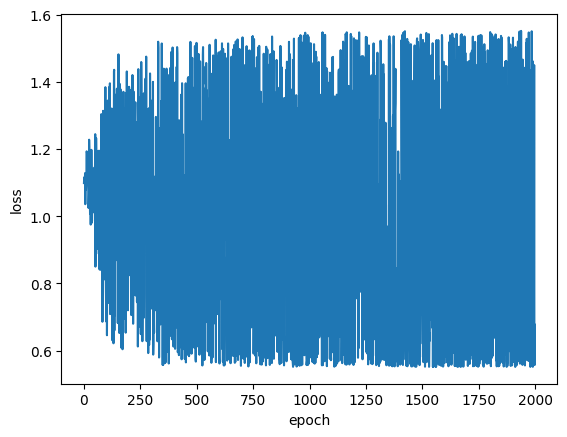

In [1100]:
model = IDHate_simple()
loss = model._train(train_data1,2000, 0.001)

In [1093]:
model.W

Parameter containing:
tensor([[ 0.0123, -0.0164,  0.0074],
        [-0.0035, -0.0003,  0.0053],
        [ 0.0131, -0.0163,  0.0052],
        ...,
        [ 0.0158, -0.0133, -0.0018],
        [ 0.0216, -0.0243,  0.0079],
        [ 0.0155, -0.0220,  0.0123]], dtype=torch.float64, requires_grad=True)

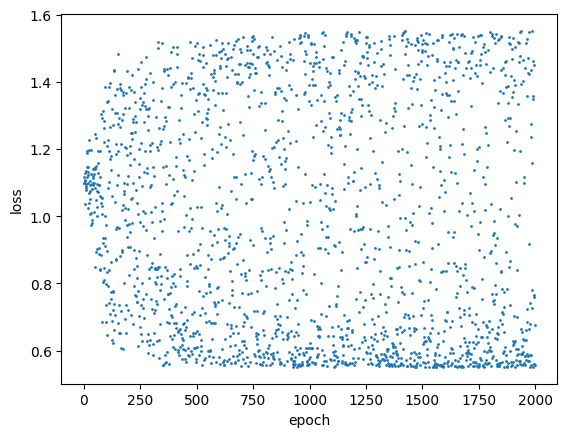

In [1101]:
plt.figure()
plt.plot(loss, '.',markersize=2)
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

My gradient descent is a hot mess.

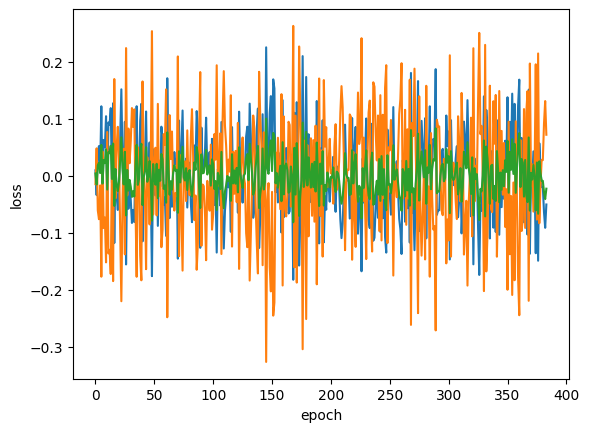

In [1116]:
plt.figure()
plt.plot(model.W.grad, '-',markersize=2)
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

<h4>Testing</h3>

In [1115]:
correct = 0
np.random.shuffle(train_data1)
test_data1 = train_data1[:500]
for x,y in test_data1:
    results = model(x)
    if int(torch.argmax(results)) == list(y).index(1):
        correct+=1
print("trained",correct)
stupid_model=IDHate_simple()
correct = 0
test_data1 = train_data1[:500]
for x,y in test_data1:
    results = stupid_model(x)
    if int(torch.argmax(results)) == list(y).index(1):
        correct+=1
print("untrained",correct)


trained 308
untrained 178


As we can see after runnign it a couple more times, it gets between 150-170/500 right without training, which is roughly a third of the time (same as we'd get at random cnsidering there are three classes). Trained, it gets 280-315 right at a time, which is better! Not great considering our max is just over 60%, but also could be worse. NOTE: Epochs: 30, learning rate 0.000001, compute gradient and update at every incident, batches of 1000. Updating every epoch instead of every incident for same stats yields a much lower accuracy trained that is between 180-215/500.</p><p>If I just compute the backwards but don't update the gradient every instance, performance is better, but not as good as updating every instance. Incrasing epochs to 100 and decreasing batch size to 500, only updating gradient every epoch</p>Get much more efficient training if I update every instance instead of every epoch. Maybe I should turn up the learning rate again?</p><p>Okay, so it's more consistent with more epochs and smaller samples, but it performs better trained on large samples with fewer epochs.<p>In conclusion, it just takes a lot of time and more updates. More dramatic learning rate conglomerates changes on the edges. I don't know if that actually makes anything better.

<H3>Regression prediction for Hate speech</h1>

Two options, same training data, same dimensions in and out. But first, reshaping the data

In [1396]:
train_X1 = torch.tensor(data1[vecs].to_numpy(),dtype=torch.float64)
train_X1 = torch.tensor(z(train_X1),dtype=torch.float64)
data1['lin_label'] = [lindict[e] for e in data1['class']]
train_Y1 = []
for label in data1['lin_label']:
    y_hot = [0,0,0]
    y_hot[int([-1,0,1].index(label))] = 1
    y_hot = torch.tensor(y_hot,dtype=torch.float64)
    train_Y1.append(y_hot)
#train_Y1 = torch.tensor(data1['lin_label'].to_numpy(),dtype=torch.float64)
train_data1 = list(zip(train_X1,train_Y1))

/var/folders/4z/bnyz3w2s6lg97h_fm4lt5ksr0000gn/T/ipykernel_728/341827723.py:2: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



In [1439]:
train_data1[1]

(tensor([ 0.2152, -0.4391, -1.6205,  1.7048,  1.1478,  2.2103, -0.7975, -1.0068,
          0.2495,  0.1780,  0.0480, -0.1397,  0.8736,  0.8322,  1.8242,  1.5847,
         -1.3630, -1.5168,  0.4942,  0.3621, -0.2752, -1.5853, -0.2348,  0.5528,
         -0.3299,  3.0725, -0.3490, -1.1940,  0.2003, -0.9067, -0.0577, -1.5253,
         -0.4141,  0.1023,  0.8086,  1.6670, -0.3667, -0.0073, -0.4385,  2.0094,
          0.0677,  0.1374, -0.0767,  1.0679,  0.6268, -0.0199,  0.5062, -0.7274,
         -0.1584, -0.8813,  0.2467,  0.4446,  1.1130, -1.0642,  0.0838,  0.0814,
         -0.3147,  0.5805,  1.5070,  1.0720, -1.6987,  1.1454, -0.8942,  0.0642,
          2.0537,  0.5731, -0.1017,  2.1193, -0.0152,  1.3779,  1.7877, -0.3125,
          1.1984, -0.1853,  0.1815, -0.0811,  0.0343,  0.2592, -0.4273,  0.0425,
         -0.6760, -0.5973,  0.6031,  1.0260, -0.9803,  0.3234, -0.6532, -0.0716,
          0.8758,  1.3805,  1.1322, -2.5155, -2.9040,  0.6738,  0.2842, -0.6625,
         -0.4101,  1.9501, -

Option 1: probabilistic version

In [1457]:
class RegressHate_1_notworking(nn.Module):
    def __init__(self):
        super(RegressHate_1_notworking,self).__init__()
        self.softmax = nn.Softmax()
        self.tanh = nn.Tanh()#Need this for weights; want to be able to weight a component but in a way that doesn't affect the classification
        #self.W = nn.Parameter(torch.randn((384,1),dtype=torch.float64,requires_grad=True))#used to make X-based weights
        self.linear = nn.Linear(384,1)
        self.linear.weight = torch.nn.Parameter(torch.zeros((1,384),dtype=torch.float64,requires_grad=True))
        self.labels = torch.tensor([-1,0,1],dtype=torch.float64,requires_grad=True)
        self.diff = torch.ones((1,3),dtype=torch.float64,requires_grad=True)
        self.output = torch.zeros((1,3),requires_grad=True,dtype=torch.float64)
        return
    
    def forward(self,x):   
        self.diff = torch.abs(torch.subtract(self.labels,self.tanh(self.linear(x))))
        self.output = self.softmax(torch.subtract(torch.ones((1,3)),self.diff)[0])
        return self.output

    def _print(self):
        print("W","\n",self.linear.weight)
        print("p","\n",self.output)
        return
    
    def _train(self,data,epochs,learning_rate):
        criterion = nn.CrossEntropyLoss()
        torch.random.manual_seed(42)  
        np.random.seed(42)
        optimizer = torch.optim.Adam(model.parameters(),
                                        lr=learning_rate)
        loss_avg = []
        # main training loop
        for epoch in tqdm(range(epochs)):
            optimizer.zero_grad()
            np.random.shuffle(data)
            loss_val=[]
            self._print()
            for X, y in data[:200]:
                #print(y)
                result = model.forward(X)
                loss = criterion(result,y)
                loss.backward()
                optimizer.step()
                loss_val.append(loss.item())
            #print(result,y)
            loss_avg.append(np.mean(loss_val))
            
        plt.figure()
        plt.plot(loss_val, '.')
        plt.ylabel('loss')
        plt.xlabel('epoch')
        plt.show()
        return loss_avg
            

training

  0%|          | 0/2000 [00:00<?, ?it/s]/Users/temp/Library/Python/3.9/lib/python/site-packages/torch/nn/modules/module.py:1511: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



W 
 Parameter containing:
tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 

  0%|          | 1/2000 [00:00<13:19,  2.50it/s]

W 
 Parameter containing:
tensor([[-0.0040,  0.0130, -0.0201, -0.0228, -0.0264,  0.0181,  0.0083,  0.0194,
          0.0250,  0.0264,  0.0140, -0.0211, -0.0213, -0.0269, -0.0185, -0.0110,
         -0.0022, -0.0252, -0.0258, -0.0242, -0.0131,  0.0081, -0.0076,  0.0175,
         -0.0266,  0.0208, -0.0238,  0.0178,  0.0014,  0.0246,  0.0160,  0.0187,
         -0.0093, -0.0261, -0.0261, -0.0042,  0.0210,  0.0229,  0.0187, -0.0192,
          0.0192, -0.0182,  0.0237,  0.0198,  0.0194, -0.0022, -0.0178,  0.0217,
          0.0042, -0.0260,  0.0045, -0.0070,  0.0253, -0.0156, -0.0151, -0.0212,
         -0.0184, -0.0126, -0.0221, -0.0249, -0.0233,  0.0257, -0.0264,  0.0247,
          0.0215,  0.0260, -0.0100,  0.0246,  0.0237, -0.0249,  0.0226, -0.0218,
         -0.0044, -0.0232,  0.0251, -0.0216,  0.0252, -0.0230, -0.0230, -0.0214,
         -0.0251,  0.0144, -0.0081,  0.0264,  0.0133, -0.0020,  0.0249,  0.0274,
         -0.0163,  0.0042,  0.0185, -0.0244,  0.0183, -0.0225, -0.0084, -0.0232,
  

  0%|          | 2/2000 [00:00<10:59,  3.03it/s]

W 
 Parameter containing:
tensor([[ 3.7618e-05,  1.8232e-02, -2.7136e-02, -1.9717e-02, -2.6586e-02,
          9.3104e-03, -1.1029e-02,  2.0434e-02,  4.1925e-02,  2.8394e-02,
          1.2011e-02, -3.2492e-02, -2.5341e-02, -3.4167e-02, -4.9001e-02,
         -9.7286e-03, -2.8322e-02, -2.8167e-02, -1.7894e-02, -2.1571e-02,
         -5.9218e-03,  2.3075e-03, -1.4830e-02, -8.1155e-03, -1.6024e-02,
          3.7289e-03, -3.1688e-02, -1.2865e-02, -1.3290e-02,  2.6171e-02,
          2.7334e-02,  4.0058e-02, -3.7866e-02, -1.5387e-02, -1.8793e-02,
          2.6980e-02,  4.0625e-02, -2.7788e-03,  2.7070e-04, -3.6389e-02,
          4.0933e-02, -3.6460e-02,  3.7025e-02,  3.1965e-02,  1.6352e-03,
         -3.6369e-03, -2.2011e-02,  2.0142e-02, -2.6637e-03, -2.2216e-02,
         -6.8948e-04, -4.2478e-03,  2.6829e-02, -2.7671e-02, -4.0054e-02,
         -1.8269e-02, -2.7549e-02, -1.6591e-02, -3.4886e-02, -1.5108e-02,
         -2.0213e-02,  1.2301e-02, -2.1110e-02, -4.1082e-04,  4.8524e-03,
          2.

  0%|          | 3/2000 [00:00<10:42,  3.11it/s]

W 
 Parameter containing:
tensor([[ 1.1249e-03,  1.0374e-02, -2.9528e-02, -8.7876e-04, -1.3934e-02,
          2.5714e-02, -3.7103e-02,  2.6714e-02,  4.7060e-02,  2.9401e-02,
          1.4065e-02, -4.7081e-02, -3.0036e-02, -3.2436e-02, -5.4253e-02,
          6.7055e-03, -3.4101e-02, -3.7149e-02, -5.2860e-03, -3.7834e-02,
          1.2201e-02, -3.0335e-03, -3.1242e-02, -2.7411e-02, -2.4561e-02,
          1.5845e-02, -3.9579e-02, -2.2118e-02, -4.7843e-03,  2.7350e-02,
          3.9485e-02,  2.5351e-02, -1.6739e-02, -2.4716e-02, -1.1193e-02,
          3.4565e-02,  4.4694e-02, -5.1229e-03, -2.9713e-03, -1.7854e-02,
          5.4601e-02, -3.7786e-02,  3.3220e-02,  3.0876e-02,  1.5519e-02,
          2.0238e-02, -1.0766e-02,  1.3648e-02, -2.7021e-02, -2.3232e-02,
          1.3754e-02, -1.0165e-02,  3.1252e-02, -2.5838e-02, -3.5499e-02,
         -1.7390e-02, -1.6520e-03, -2.0785e-02, -3.5609e-02, -2.0608e-02,
         -2.0557e-02,  3.6786e-03, -2.9311e-02, -5.0031e-03,  8.8900e-04,
          2.

  0%|          | 5/2000 [00:01<08:13,  4.04it/s]

W 
 Parameter containing:
tensor([[ 0.0323,  0.0314, -0.0153, -0.0058, -0.0021,  0.0468, -0.0255,  0.0057,
          0.0576,  0.0336,  0.0221, -0.0549, -0.0179, -0.0434, -0.0558,  0.0160,
         -0.0489, -0.0521,  0.0039, -0.0302,  0.0060, -0.0040, -0.0158, -0.0471,
         -0.0215,  0.0177, -0.0509, -0.0054, -0.0325,  0.0131,  0.0136,  0.0203,
          0.0060, -0.0162, -0.0044,  0.0244,  0.0480,  0.0070,  0.0143, -0.0105,
          0.0703, -0.0385,  0.0273,  0.0320,  0.0083,  0.0098, -0.0107,  0.0082,
         -0.0174, -0.0270,  0.0262, -0.0080,  0.0300, -0.0456, -0.0297, -0.0399,
          0.0094, -0.0029, -0.0185, -0.0204, -0.0059,  0.0052, -0.0280,  0.0096,
         -0.0022,  0.0250, -0.0512, -0.0060, -0.0147, -0.0150,  0.0643, -0.0359,
          0.0232, -0.0125,  0.0591, -0.0125,  0.0153, -0.0092,  0.0062,  0.0269,
          0.0009,  0.0225,  0.0188,  0.0180, -0.0418, -0.0186,  0.0155,  0.0474,
         -0.0108, -0.0191,  0.0430, -0.0381,  0.0594, -0.0179, -0.0482, -0.0290,
  

  0%|          | 6/2000 [00:01<07:45,  4.28it/s]

W 
 Parameter containing:
tensor([[ 5.7404e-03,  5.0687e-02, -2.5130e-02,  2.5229e-02,  5.2650e-04,
          4.9890e-02, -2.7937e-02,  3.4326e-03,  6.1691e-02,  5.9945e-02,
         -6.9122e-03, -7.0071e-02, -9.7296e-03, -5.9814e-02, -4.6302e-02,
          4.3793e-02, -6.3355e-02, -2.4323e-02,  9.2921e-03, -1.5085e-02,
          2.3616e-02, -5.2706e-02, -2.8359e-02, -4.9132e-02, -1.9947e-03,
          1.8418e-02, -8.2618e-02, -9.4735e-03, -4.0639e-02,  1.2301e-02,
         -2.5214e-04,  1.8612e-02,  2.0523e-02, -2.4223e-02, -2.6659e-03,
          1.0304e-02,  5.1964e-02,  3.1721e-02, -7.0524e-04, -1.0545e-02,
          6.9408e-02, -3.5217e-02, -1.0354e-02,  3.7410e-02, -2.4285e-02,
          1.3265e-02,  2.3003e-03,  1.0278e-02, -4.5979e-02, -1.1321e-02,
          5.5505e-02,  9.4636e-04,  3.4845e-02, -8.1706e-02, -4.5335e-02,
         -5.9293e-02,  2.4332e-02, -4.6077e-02, -3.8972e-02,  8.5828e-04,
         -4.4290e-03,  2.3729e-02, -4.4494e-02,  1.3073e-02, -6.5890e-03,
          1.

  0%|          | 7/2000 [00:01<07:50,  4.23it/s]

W 
 Parameter containing:
tensor([[-0.0161,  0.0591, -0.0134,  0.0473, -0.0099,  0.0566, -0.0249, -0.0069,
          0.0403,  0.0522, -0.0086, -0.0642, -0.0086, -0.0400, -0.0646,  0.0240,
         -0.0696, -0.0290,  0.0012, -0.0034,  0.0311, -0.0634, -0.0429, -0.0437,
         -0.0007,  0.0269, -0.0899, -0.0229, -0.0470,  0.0294,  0.0089, -0.0039,
          0.0121, -0.0506, -0.0032,  0.0298,  0.0762,  0.0026,  0.0071, -0.0304,
          0.0748, -0.0100, -0.0061,  0.0722, -0.0283,  0.0113, -0.0140, -0.0106,
         -0.0613, -0.0129,  0.0442, -0.0240,  0.0484, -0.1019, -0.0468, -0.0655,
         -0.0076, -0.0421, -0.0462, -0.0037, -0.0309,  0.0121, -0.0537,  0.0293,
         -0.0047,  0.0267, -0.0752,  0.0072,  0.0074,  0.0158,  0.0594, -0.0700,
         -0.0153, -0.0107,  0.0843, -0.0054,  0.0261,  0.0143, -0.0131,  0.0081,
          0.0080, -0.0026, -0.0022,  0.0300, -0.0082, -0.0520, -0.0067,  0.0207,
         -0.0590, -0.0433,  0.0377, -0.0411,  0.0487,  0.0368, -0.0407, -0.0249,
  

  0%|          | 9/2000 [00:02<07:10,  4.63it/s]

W 
 Parameter containing:
tensor([[-2.4639e-02,  5.6131e-02, -4.0618e-03,  4.2947e-02, -7.8838e-03,
          3.1849e-02, -7.7218e-03, -2.1621e-02,  3.0959e-02,  7.4154e-02,
          1.6515e-02, -5.3369e-02, -5.3209e-03, -5.8771e-02, -6.8555e-02,
          3.6625e-02, -8.6243e-02, -2.6497e-02,  1.7628e-02, -1.0010e-02,
          4.5187e-02, -6.0484e-02, -4.1020e-02, -3.4134e-02, -7.2857e-03,
          1.9110e-02, -8.3113e-02, -2.4488e-02, -5.7701e-02,  1.1896e-02,
         -1.1442e-03, -1.0403e-02, -7.0905e-05, -5.7546e-02, -1.1596e-02,
          4.0330e-02,  8.6356e-02,  4.8189e-03,  2.8111e-02, -3.1058e-02,
          7.3587e-02, -1.8127e-02, -1.7081e-02,  7.4792e-02, -1.6567e-02,
          3.7308e-02, -2.4586e-02, -2.1087e-02, -4.3709e-02, -1.7866e-02,
          7.9206e-02,  1.0342e-02,  3.9071e-02, -1.2111e-01, -5.5696e-02,
         -4.4192e-02,  2.3609e-03, -3.3245e-02, -3.7509e-02,  4.2423e-03,
         -1.8565e-02, -4.6451e-03, -5.7875e-02,  3.1183e-02,  2.2687e-04,
          5.

  1%|          | 11/2000 [00:02<06:28,  5.11it/s]

W 
 Parameter containing:
tensor([[-0.0346,  0.0384, -0.0417,  0.0733, -0.0159,  0.0692,  0.0202, -0.0500,
          0.0494,  0.0944,  0.0402, -0.0423, -0.0250, -0.0417, -0.0779,  0.0300,
         -0.1046, -0.0434,  0.0089,  0.0081, -0.0038, -0.0850, -0.0372, -0.0354,
         -0.0068, -0.0053, -0.0601, -0.0563, -0.0136,  0.0321,  0.0567, -0.0091,
         -0.0073, -0.0344, -0.0105,  0.0205,  0.0880,  0.0246,  0.0247, -0.0562,
          0.0721, -0.0104,  0.0063,  0.0404, -0.0198,  0.0304, -0.0208, -0.0132,
         -0.0055, -0.0226,  0.0604,  0.0062,  0.0513, -0.1423, -0.0441, -0.0018,
         -0.0258, -0.0441, -0.0719, -0.0187, -0.0170, -0.0124, -0.0533,  0.0116,
         -0.0416,  0.0834, -0.0270, -0.0200, -0.0048, -0.0061,  0.0725, -0.0846,
         -0.0188,  0.0270,  0.0715,  0.0032,  0.0589, -0.0365,  0.0451, -0.0164,
          0.0272,  0.0175,  0.0258,  0.0755, -0.0119, -0.0466, -0.0350,  0.0185,
          0.0046, -0.0371,  0.0120, -0.0656,  0.0370, -0.0043, -0.0720, -0.0364,
  

  1%|          | 13/2000 [00:02<06:01,  5.50it/s]

W 
 Parameter containing:
tensor([[-0.0237,  0.0199, -0.0275,  0.0820,  0.0003,  0.0387, -0.0036, -0.0661,
          0.0185,  0.0841,  0.0431, -0.0345, -0.0649, -0.0282, -0.0676, -0.0162,
         -0.1143, -0.0213,  0.0150, -0.0076, -0.0041, -0.0785, -0.0166, -0.0289,
         -0.0045, -0.0362, -0.0501, -0.0410, -0.0089,  0.0539,  0.0494,  0.0117,
         -0.0083, -0.0404, -0.0172,  0.0243,  0.1084,  0.0275,  0.0099, -0.0395,
          0.0791,  0.0031,  0.0111,  0.0142, -0.0533,  0.0097, -0.0207, -0.0247,
          0.0026, -0.0495,  0.0515,  0.0066,  0.0421, -0.1259, -0.0509,  0.0070,
         -0.0082, -0.0640, -0.0541, -0.0247,  0.0004, -0.0142, -0.0396, -0.0020,
         -0.0380,  0.1024, -0.0639, -0.0129, -0.0171, -0.0290,  0.0672, -0.0556,
         -0.0486,  0.0236,  0.0999, -0.0180,  0.0518, -0.0504,  0.0722, -0.0053,
          0.0375,  0.0362,  0.0534,  0.0814, -0.0211, -0.0722, -0.0404,  0.0253,
          0.0433, -0.0062,  0.0271, -0.0857,  0.0486, -0.0025, -0.0728, -0.0671,
  

  1%|          | 15/2000 [00:03<05:34,  5.93it/s]

W 
 Parameter containing:
tensor([[-4.8386e-02, -1.0322e-02, -2.5939e-02,  6.7717e-02,  7.3225e-03,
          3.1097e-02, -1.3280e-02, -4.3831e-02,  3.6437e-02,  7.8810e-02,
          3.1789e-02, -1.7508e-02, -7.1530e-02, -2.7805e-02, -9.5771e-02,
         -3.3179e-02, -1.0998e-01, -2.1469e-02,  5.6873e-03, -2.8846e-02,
         -1.5259e-02, -7.4438e-02, -4.1678e-02, -2.5270e-02,  2.0824e-02,
         -4.2204e-02, -8.2951e-02, -1.4925e-02, -2.8342e-03,  5.7532e-02,
          5.6608e-02,  1.0212e-02, -4.3735e-03, -3.3242e-02,  3.1492e-03,
          9.8835e-03,  1.3711e-01,  4.9901e-02,  3.4637e-02, -5.2566e-02,
          5.6047e-02,  1.6381e-02,  2.4369e-02,  2.5040e-02, -7.0245e-02,
          3.5202e-02, -4.0173e-03, -4.2226e-02,  5.2875e-03, -3.1574e-02,
          7.4427e-02, -2.1073e-03,  4.9099e-02, -9.9853e-02, -4.2403e-02,
         -2.2280e-02, -1.1965e-02, -3.1616e-02, -2.4668e-02, -1.8974e-03,
          6.7212e-04, -1.0607e-02, -3.3240e-02, -1.3401e-02, -4.5337e-02,
          9.

  1%|          | 16/2000 [00:03<05:55,  5.58it/s]

W 
 Parameter containing:
tensor([[-4.0717e-02, -2.8176e-02, -5.9310e-03,  9.2983e-02,  3.7561e-02,
          6.2698e-03,  2.4135e-02, -6.4760e-02,  4.7827e-02,  5.5821e-02,
         -3.7994e-03, -3.4242e-02, -1.1235e-01, -2.9723e-02, -1.0783e-01,
         -5.0880e-02, -1.1725e-01, -1.8889e-02,  6.6652e-03, -3.8757e-02,
          1.0979e-02, -6.7262e-02, -3.9951e-02, -2.0864e-02,  3.5047e-02,
         -9.8950e-02, -5.9234e-02, -5.0958e-02,  2.5132e-02,  7.5595e-02,
          2.4017e-02,  2.3547e-02, -3.1018e-03, -3.9301e-02,  1.0876e-02,
         -2.6641e-02,  1.2920e-01,  5.9080e-02,  2.7506e-02, -4.9135e-02,
          5.6816e-02, -4.2270e-03,  6.8802e-02, -2.0619e-03, -8.2910e-02,
          2.8959e-02, -1.6677e-02, -5.1758e-02,  3.7393e-02, -4.6875e-02,
          9.6971e-02, -3.6874e-02,  7.9294e-02, -7.7174e-02, -4.2755e-02,
         -8.1449e-03, -7.1889e-03, -4.2549e-02, -2.7885e-02,  2.7634e-02,
          1.3350e-02, -1.2659e-02, -3.2927e-02, -7.0516e-03, -4.6618e-02,
          1.

  1%|          | 18/2000 [00:03<06:01,  5.49it/s]

W 
 Parameter containing:
tensor([[-0.0211, -0.0239, -0.0099,  0.1073,  0.0289,  0.0258,  0.0276, -0.0801,
          0.0478,  0.0598,  0.0030, -0.0603, -0.1223, -0.0538, -0.1206, -0.0519,
         -0.1319,  0.0039,  0.0280, -0.0195,  0.0163, -0.0619, -0.0289, -0.0375,
          0.0276, -0.0953, -0.0513, -0.0759,  0.0182,  0.0795,  0.0440,  0.0404,
         -0.0313, -0.0381,  0.0094, -0.0139,  0.1181,  0.0635,  0.0453, -0.0682,
          0.0636,  0.0088,  0.0679, -0.0080, -0.0794,  0.0294,  0.0109, -0.0514,
          0.0408, -0.0392,  0.0824, -0.0330,  0.0750, -0.0651, -0.0675,  0.0271,
          0.0069, -0.0552, -0.0389,  0.0259,  0.0079, -0.0083, -0.0177, -0.0121,
         -0.0537,  0.1366, -0.0476, -0.0718, -0.0414,  0.0077,  0.0170, -0.0624,
         -0.0062,  0.0608,  0.0727, -0.0070,  0.1053, -0.0795,  0.1036,  0.0148,
          0.0296,  0.0161,  0.0879,  0.0988, -0.0187, -0.1298, -0.0602,  0.0227,
          0.0782,  0.0090,  0.0223, -0.0821,  0.0522,  0.0187, -0.1059, -0.0707,
  

  1%|          | 19/2000 [00:04<09:26,  3.49it/s]

W 
 Parameter containing:
tensor([[-2.9580e-03, -4.2184e-02,  8.2379e-03,  1.1244e-01,  3.7382e-02,
         -1.1682e-03,  6.9615e-02, -1.1537e-01,  2.1417e-02,  2.2266e-02,
          1.0168e-02, -9.7339e-02, -1.1214e-01, -5.0225e-02, -9.9267e-02,
         -9.6320e-03, -8.4510e-02,  7.9229e-03,  3.0128e-02, -2.9479e-02,
          2.5154e-02, -4.0240e-02, -1.7182e-02, -1.7015e-02,  1.2254e-02,
         -8.8476e-02, -1.6992e-02, -7.4324e-02, -3.7876e-04,  6.4671e-02,
          2.3963e-02,  1.6529e-02, -8.8143e-03, -4.5711e-02, -7.5202e-03,
         -7.9387e-03,  1.1899e-01,  5.8606e-02,  6.7558e-02, -5.9614e-02,
          7.9423e-02,  1.4203e-02,  7.2425e-02, -4.9107e-03, -5.9236e-02,
          6.2129e-03,  6.0242e-03, -1.9575e-02,  3.8868e-02, -2.5252e-02,
          5.6976e-02, -3.3401e-02,  6.2112e-02, -8.1822e-02, -7.3140e-02,
          1.7904e-02, -2.9356e-02, -6.9537e-02, -7.8428e-02, -1.1874e-02,
          6.8185e-04, -4.0924e-02, -3.8837e-02, -8.8579e-03, -5.1810e-02,
          1.

  1%|          | 20/2000 [00:04<09:16,  3.56it/s]

W 
 Parameter containing:
tensor([[-0.0301, -0.0540,  0.0061,  0.1107,  0.0201, -0.0060,  0.0556, -0.1017,
          0.0422,  0.0155, -0.0007, -0.0840, -0.0934, -0.0621, -0.0892, -0.0033,
         -0.0921, -0.0120,  0.0204, -0.0362,  0.0132, -0.0374, -0.0121, -0.0038,
          0.0307, -0.0835, -0.0277, -0.0633, -0.0109,  0.0547,  0.0315,  0.0057,
          0.0033, -0.0284, -0.0232, -0.0160,  0.1363,  0.0584,  0.0716, -0.0479,
          0.0960,  0.0092,  0.0687, -0.0116, -0.0614, -0.0012,  0.0354,  0.0192,
          0.0453, -0.0106,  0.0709, -0.0050,  0.0351, -0.0616, -0.0529,  0.0107,
         -0.0204, -0.0633, -0.0948, -0.0294,  0.0010, -0.0183, -0.0284, -0.0278,
         -0.0189,  0.1745, -0.0333, -0.1189, -0.0319, -0.0131, -0.0024, -0.0450,
         -0.0169,  0.0366,  0.1129, -0.0502,  0.0944, -0.1123,  0.0986, -0.0049,
          0.0380, -0.0154,  0.0705,  0.1131,  0.0176, -0.0915, -0.0873, -0.0108,
          0.0578,  0.0583, -0.0140, -0.0688,  0.0378,  0.0438, -0.0979, -0.1003,
  

  1%|          | 21/2000 [00:04<09:44,  3.39it/s]

W 
 Parameter containing:
tensor([[-2.4077e-02, -6.8476e-02,  2.8957e-03,  9.9266e-02, -6.5347e-03,
         -8.6231e-03,  4.0076e-02, -1.0213e-01,  2.3907e-02, -2.0863e-03,
          2.7665e-03, -7.3093e-02, -9.7320e-02, -5.8563e-02, -9.1036e-02,
         -2.8508e-02, -8.9072e-02, -1.6220e-02,  2.9997e-02, -3.4125e-02,
          1.0167e-02, -1.9555e-02, -1.1598e-02,  7.9183e-03,  2.7818e-02,
         -9.4911e-02, -2.1531e-02, -7.8229e-02, -2.5235e-04,  4.0247e-02,
          3.3161e-02,  5.4686e-03,  2.8626e-02, -3.9399e-02, -9.5868e-03,
          1.3231e-02,  1.2975e-01,  4.6937e-02,  7.3867e-02, -7.0482e-02,
          7.5450e-02, -3.2542e-04,  4.6696e-02, -3.0617e-02, -5.0591e-02,
         -6.1563e-03,  3.1099e-02,  2.7675e-02,  2.1527e-02,  1.2218e-02,
          6.4471e-02,  2.3924e-02,  2.3437e-02, -8.5264e-02, -6.6699e-02,
          2.7143e-02,  3.7654e-04, -6.7240e-02, -1.1367e-01, -3.5851e-02,
          4.6201e-03, -3.4984e-03, -3.3575e-02, -9.5142e-03, -5.7076e-03,
          1.

  1%|          | 23/2000 [00:05<08:07,  4.05it/s]

W 
 Parameter containing:
tensor([[ 7.2854e-03, -7.4596e-02,  2.0562e-02,  1.0531e-01, -1.1113e-02,
          1.5601e-02,  4.9467e-02, -9.4736e-02,  3.2142e-02,  2.1192e-04,
          3.8611e-04, -7.4609e-02, -1.2900e-01, -4.1952e-02, -1.0964e-01,
         -4.7728e-02, -1.0823e-01, -6.2889e-03,  3.4125e-02, -3.6758e-02,
         -2.0050e-02, -3.1151e-02,  1.3372e-02,  1.1915e-02,  9.6358e-03,
         -1.0372e-01, -2.4190e-02, -9.3072e-02,  1.2708e-02,  4.8449e-02,
          2.3254e-02,  8.4795e-03,  1.1334e-02, -4.6381e-02,  6.8112e-03,
          1.1184e-02,  1.2078e-01,  8.2747e-02,  7.5913e-02, -5.5586e-02,
          8.7894e-02, -2.7452e-02,  5.3460e-02, -3.3180e-02, -4.4441e-02,
          1.5967e-03,  2.4542e-02,  1.9016e-02,  2.1261e-02,  9.8027e-03,
          7.3004e-02,  2.3485e-02,  3.0127e-02, -8.4350e-02, -7.3065e-02,
          3.9546e-02,  1.0509e-02, -3.2776e-02, -1.0259e-01, -3.1130e-02,
         -1.1483e-02, -1.9232e-02, -2.5471e-03, -1.4196e-02, -2.4404e-02,
          2.

  1%|▏         | 25/2000 [00:05<06:39,  4.95it/s]

W 
 Parameter containing:
tensor([[ 2.4117e-03, -5.2347e-02,  1.2973e-02,  7.5630e-02, -4.4889e-02,
          6.1265e-03,  5.8848e-02, -6.9848e-02,  5.7254e-02,  1.1983e-02,
         -1.3688e-02, -5.2827e-02, -1.3228e-01, -3.9693e-02, -7.7170e-02,
         -2.0962e-02, -8.7139e-02, -7.8592e-03,  6.0331e-02, -6.0966e-02,
         -8.7150e-03, -2.0156e-02,  3.3433e-02,  2.5859e-02,  3.6272e-02,
         -8.6788e-02, -1.2648e-02, -1.1851e-01, -2.6960e-02,  6.2863e-02,
          4.2956e-02,  2.7122e-03,  1.9903e-02, -4.3086e-02,  2.7616e-03,
         -1.9417e-03,  1.1603e-01,  7.1373e-02,  1.1322e-01, -7.8879e-02,
          1.0432e-01, -6.2520e-04,  4.3886e-02, -4.5792e-02, -2.6818e-02,
          3.2362e-02,  2.0978e-02,  2.2098e-02,  3.4176e-02,  1.9361e-02,
          9.7934e-02,  6.6251e-02,  4.5286e-03, -9.1367e-02, -3.2162e-02,
          1.8558e-02,  2.3406e-02, -1.4283e-02, -1.1213e-01, -1.2489e-02,
         -5.4934e-02, -8.0640e-03, -1.8976e-02, -4.7970e-02,  2.1290e-03,
          1.

  1%|▏         | 27/2000 [00:05<05:34,  5.89it/s]

W 
 Parameter containing:
tensor([[ 2.3462e-02, -3.6350e-02,  7.1680e-03,  7.5720e-02, -3.5388e-02,
          4.8508e-02,  5.0321e-02, -8.1426e-02,  6.8016e-02,  1.0214e-03,
         -2.0305e-02, -1.6708e-02, -1.1725e-01,  8.5603e-03, -8.8089e-02,
         -3.5357e-02, -8.5122e-02, -1.2809e-02,  7.6785e-02, -3.4480e-02,
          3.5756e-03, -4.4628e-02,  3.7944e-02, -1.9040e-02,  3.2400e-02,
         -6.0983e-02, -2.0177e-02, -1.1377e-01, -2.6464e-03,  7.9875e-02,
          5.7542e-02,  2.2223e-02,  9.7238e-03, -8.6821e-02,  3.9514e-02,
         -1.4227e-03,  1.2080e-01,  8.4697e-02,  1.1021e-01, -7.5682e-02,
          1.1773e-01,  1.4950e-02,  5.1704e-02, -3.2246e-02, -2.4491e-02,
          5.1291e-02, -7.3265e-03,  2.7214e-02,  6.3675e-02,  1.1205e-02,
          1.2102e-01,  5.3227e-02,  4.3429e-03, -8.7220e-02, -4.3854e-02,
          2.4849e-02,  5.0293e-02,  8.6365e-03, -1.2287e-01,  2.7783e-03,
         -5.0592e-02, -3.4282e-02, -1.2338e-02, -6.5036e-02, -9.7522e-03,
          1.

  1%|▏         | 29/2000 [00:06<05:05,  6.45it/s]

W 
 Parameter containing:
tensor([[ 2.1210e-02, -1.9638e-02,  1.7115e-02,  7.6890e-02, -2.8695e-02,
          3.8001e-02,  4.3094e-02, -8.4079e-02,  7.3917e-02, -1.0542e-02,
         -1.5174e-02, -2.5286e-02, -1.3774e-01, -1.0202e-02, -9.5833e-02,
         -8.3257e-02, -5.7210e-02,  2.3031e-02,  9.3860e-02, -5.7523e-02,
          2.1707e-03, -3.7286e-02,  3.6964e-02, -4.6135e-02,  5.5610e-02,
         -6.1799e-02, -9.9553e-03, -6.8515e-02,  2.0936e-03,  4.4788e-02,
          4.7741e-02,  2.2418e-02, -2.4062e-02, -9.4811e-02,  2.1667e-02,
          5.8993e-03,  7.2025e-02,  8.4751e-02,  1.3230e-01, -1.0779e-01,
          1.6982e-01,  1.7966e-02,  5.1562e-02, -2.5001e-02, -5.7527e-02,
          8.8776e-02, -5.8531e-02,  3.7394e-02,  5.4786e-02, -4.2595e-02,
          1.2146e-01,  3.4791e-02,  2.5787e-02, -9.0028e-02, -3.6510e-02,
          3.3819e-02,  3.9784e-02, -1.8492e-02, -9.0833e-02,  1.9969e-02,
         -3.6717e-02, -5.4595e-02, -3.0707e-02, -4.8019e-02, -2.2772e-02,
          1.

  2%|▏         | 31/2000 [00:06<04:55,  6.67it/s]

W 
 Parameter containing:
tensor([[ 3.3331e-03, -2.0173e-02, -1.9343e-02,  4.1288e-02, -2.3652e-02,
          3.3133e-02,  7.7979e-03, -7.8210e-02,  4.4927e-02,  9.4621e-03,
         -2.9771e-02, -2.8689e-02, -1.1545e-01, -2.2219e-02, -9.9258e-02,
         -7.6336e-02, -4.6240e-02,  2.3982e-02,  1.1972e-01, -6.0558e-02,
         -1.4342e-02, -5.8274e-02,  1.5727e-02, -2.8214e-02,  3.5899e-02,
         -7.9545e-02, -5.1090e-02, -6.7932e-02, -1.2302e-02,  4.8317e-02,
          5.2972e-02,  2.8766e-02,  6.1821e-03, -8.3567e-02,  1.9101e-02,
          3.7758e-02,  9.5454e-02,  6.0677e-02,  1.2441e-01, -1.3705e-01,
          1.7411e-01,  1.2969e-02,  3.4760e-02, -1.6644e-02, -2.8067e-02,
          8.0699e-02, -7.7111e-02,  6.0023e-02,  3.2576e-02, -2.9212e-02,
          1.1401e-01,  3.9661e-02,  6.3400e-03, -9.0986e-02, -1.4893e-02,
          5.2899e-02,  4.3202e-02, -3.7431e-02, -8.2841e-02, -7.0499e-03,
         -2.9866e-02, -5.3531e-02, -3.9672e-02, -7.0481e-02, -1.0086e-04,
          1.

  2%|▏         | 33/2000 [00:06<04:42,  6.97it/s]

W 
 Parameter containing:
tensor([[-0.0008, -0.0105, -0.0316,  0.0165, -0.0366,  0.0077,  0.0055, -0.0967,
          0.0710,  0.0207,  0.0439, -0.0388, -0.1109,  0.0017, -0.0914, -0.0914,
         -0.0463,  0.0023,  0.1188, -0.0659, -0.0201, -0.0813,  0.0246, -0.0121,
          0.0179, -0.0638, -0.0417, -0.0861,  0.0064,  0.0286,  0.0184,  0.0083,
         -0.0012, -0.0845, -0.0013,  0.0776,  0.1004,  0.0302,  0.1251, -0.1578,
          0.1243,  0.0346, -0.0147, -0.0376, -0.0086,  0.0570, -0.0961,  0.0635,
          0.0498, -0.0463,  0.0960,  0.0183, -0.0051, -0.0906, -0.0275,  0.0449,
          0.0324, -0.0552, -0.1299,  0.0003, -0.0229, -0.0856, -0.0438, -0.0674,
         -0.0081,  0.1433, -0.0088, -0.1366, -0.0523, -0.0474,  0.0675, -0.0484,
         -0.0828,  0.0062,  0.0461, -0.0943,  0.0480, -0.0450,  0.0197, -0.0449,
          0.0694,  0.0383, -0.0250,  0.1262, -0.0170, -0.0356, -0.0941,  0.0742,
         -0.0173,  0.0933, -0.0724, -0.0450, -0.0231,  0.1085, -0.0868, -0.1522,
  

  2%|▏         | 35/2000 [00:07<04:37,  7.09it/s]

W 
 Parameter containing:
tensor([[-2.2341e-02, -4.4314e-02, -2.1017e-02,  1.8080e-02, -2.3367e-02,
         -1.1817e-02,  3.0000e-02, -7.0510e-02,  9.1080e-02,  3.4298e-02,
          3.8103e-02, -1.5499e-02, -1.2552e-01, -1.6790e-02, -4.6084e-02,
         -5.0695e-02, -4.8028e-02,  1.5789e-02,  9.8887e-02, -3.1331e-02,
         -3.8924e-02, -7.4771e-02,  4.1661e-02, -4.2675e-03,  1.4023e-02,
         -9.5751e-03, -5.2096e-02, -6.8049e-02, -1.8243e-02,  3.7707e-02,
          8.3204e-03,  6.3737e-03, -2.3860e-02, -1.3148e-01, -9.2224e-03,
          6.6272e-02,  1.0868e-01,  7.1688e-03,  1.1274e-01, -1.2374e-01,
          1.1820e-01,  4.0213e-02, -6.2261e-02, -1.5985e-02, -3.9855e-05,
          4.1091e-02, -9.0379e-02,  2.2349e-02,  3.8402e-02, -5.3626e-02,
          8.4287e-02,  1.9930e-02, -2.0225e-02, -6.3107e-02, -1.6675e-02,
          3.4205e-02,  4.9990e-02, -6.2273e-02, -1.4315e-01, -1.5183e-02,
         -2.4599e-02, -7.0253e-02, -3.1003e-02, -6.2273e-02, -5.5372e-03,
          1.

  2%|▏         | 37/2000 [00:07<04:30,  7.27it/s]

W 
 Parameter containing:
tensor([[-5.2546e-02, -3.9022e-02, -4.0597e-02,  6.0145e-02, -2.6216e-02,
         -2.5262e-03,  4.2766e-02, -6.8656e-02,  6.2733e-02,  4.4259e-02,
          3.3514e-02, -2.2016e-02, -8.1578e-02, -9.8063e-03, -3.9310e-02,
         -6.8028e-02, -1.5186e-02,  1.3728e-02,  8.2334e-02, -5.3505e-02,
         -2.1723e-02, -4.7653e-02,  3.8536e-02,  2.3203e-02, -4.5326e-03,
         -6.6509e-03, -2.9154e-02, -3.6674e-02,  1.6438e-02,  5.9547e-02,
          1.3926e-02, -2.6331e-02, -2.5998e-02, -1.4642e-01, -4.3048e-02,
          4.4724e-02,  7.8354e-02,  5.3711e-03,  1.0138e-01, -1.1756e-01,
          9.4162e-02,  5.1615e-02, -8.0023e-02, -1.2307e-02,  1.3047e-02,
          4.2619e-02, -9.4984e-02,  1.8866e-02,  6.4947e-02, -7.4233e-02,
          1.1618e-01, -1.8311e-02, -2.7834e-02, -7.3974e-02,  1.7987e-04,
          6.0597e-02,  2.9359e-02, -9.3672e-02, -1.3679e-01, -2.3177e-02,
         -5.2869e-02, -8.6599e-02, -6.2204e-02, -4.2388e-02, -1.4829e-02,
          1.

  2%|▏         | 39/2000 [00:07<04:52,  6.70it/s]

W 
 Parameter containing:
tensor([[-2.8420e-02, -8.2221e-02, -3.8828e-02,  7.6711e-02, -1.0232e-03,
         -2.1765e-03,  1.2832e-02, -8.7644e-02,  6.3707e-02,  2.9972e-02,
          3.9084e-02, -2.4006e-02, -1.0372e-01, -1.5677e-02, -6.4993e-02,
         -4.9861e-02, -3.8878e-02, -1.9455e-02,  3.3563e-02, -2.2414e-02,
         -3.4294e-02, -3.1278e-02,  3.0671e-02,  2.8001e-02, -2.8489e-03,
          2.5321e-03, -3.3858e-02, -2.9996e-02,  2.5124e-02,  4.6488e-02,
         -2.4789e-02, -8.9159e-03, -4.4219e-03, -1.2040e-01, -7.6639e-02,
          2.8984e-02,  9.5564e-02, -2.0037e-02,  9.0668e-02, -8.3395e-02,
          8.3710e-02,  5.1148e-02, -5.5779e-02,  1.5729e-02,  3.7630e-02,
          4.2537e-02, -9.1709e-02,  3.6840e-02,  6.7639e-02, -9.8859e-02,
          9.8310e-02, -4.3759e-04, -1.7220e-02, -8.0169e-02,  2.6996e-02,
          7.8740e-02,  2.2251e-02, -8.5297e-02, -1.4024e-01, -1.8416e-03,
         -1.0275e-01, -6.9832e-02, -6.4307e-02, -2.1624e-02, -1.8118e-02,
          1.

  2%|▏         | 41/2000 [00:08<05:13,  6.25it/s]

W 
 Parameter containing:
tensor([[-3.1764e-02, -8.6249e-02, -4.2050e-02,  9.6320e-02, -6.9638e-03,
          1.9432e-02,  9.7480e-03, -7.1882e-02,  1.1321e-01,  6.7467e-02,
          6.9619e-03, -4.6320e-03, -1.2045e-01, -2.4157e-02, -6.4686e-02,
         -4.2003e-02, -4.4170e-02, -3.4009e-02,  3.3720e-02, -5.9426e-02,
         -3.9728e-02, -4.0107e-02,  4.7637e-02,  2.3377e-02, -2.5417e-03,
          1.2182e-02, -2.4907e-02, -3.8980e-02, -4.5140e-03,  5.5437e-02,
         -1.2186e-02, -9.3353e-03,  1.2995e-02, -1.1557e-01, -5.0373e-02,
          5.5106e-02,  7.5102e-02, -1.3245e-02,  1.0079e-01, -8.5993e-02,
          1.0179e-01,  5.0083e-02, -2.1782e-02,  1.4687e-02,  1.4707e-02,
          7.3236e-03, -7.9467e-02,  4.1858e-02,  5.1026e-02, -7.0760e-02,
          1.0521e-01, -3.4213e-02, -3.4913e-02, -5.8121e-02,  5.9431e-03,
          9.4229e-02,  5.1325e-03, -5.7920e-02, -1.5142e-01, -2.3292e-03,
         -1.1594e-01, -5.6661e-02, -6.2442e-02, -1.0113e-02, -1.2796e-02,
          1.

  2%|▏         | 43/2000 [00:08<04:57,  6.57it/s]

W 
 Parameter containing:
tensor([[-4.4578e-02, -6.0413e-02, -5.8637e-02,  8.5818e-02, -1.9880e-02,
          6.7747e-02,  3.9567e-02, -4.6069e-02,  1.2332e-01,  5.7799e-02,
          1.1506e-02,  3.8858e-02, -1.2474e-01, -3.4696e-02, -4.0420e-02,
         -5.8975e-02, -4.1406e-03, -3.9268e-02,  3.7765e-02, -8.7549e-02,
         -4.1223e-02, -2.6050e-02,  6.4176e-02,  3.5498e-02,  2.5431e-02,
          7.4188e-03,  3.2955e-03, -4.6769e-02, -2.8465e-02,  6.6647e-02,
          2.5427e-02,  8.4226e-03,  3.0561e-02, -1.2270e-01, -3.9141e-02,
          4.6747e-02,  7.6081e-02, -9.0614e-03,  1.0532e-01, -1.3994e-01,
          8.0810e-02,  7.7344e-02, -1.4065e-02, -2.7169e-02,  3.3422e-02,
          2.2147e-02, -9.7085e-02,  3.3388e-02,  6.6081e-02, -3.6426e-02,
          9.3187e-02, -2.3550e-02, -3.4458e-02,  4.6220e-03, -2.8532e-02,
          1.2338e-01,  1.6341e-02, -2.4604e-02, -1.2459e-01,  2.5084e-02,
         -8.8083e-02, -2.5976e-02, -6.1918e-02,  3.7542e-03, -2.8861e-02,
          1.

  2%|▏         | 45/2000 [00:08<05:02,  6.47it/s]

W 
 Parameter containing:
tensor([[-1.8679e-02, -7.1838e-02, -2.7351e-02,  5.4106e-02, -2.3046e-02,
          7.9099e-02,  1.0403e-02, -5.2226e-02,  9.0397e-02,  3.6575e-02,
          2.4817e-02,  5.2939e-02, -1.1309e-01, -3.6961e-02, -2.8251e-03,
         -4.7376e-02, -2.5274e-02, -6.2959e-02,  3.9109e-02, -7.2004e-02,
         -2.5976e-02, -1.0172e-03,  4.5200e-02,  5.6978e-02,  1.2990e-02,
          3.2935e-02,  1.5204e-02, -2.3764e-02, -4.8390e-02,  6.0752e-02,
         -1.3460e-02, -2.9375e-02, -4.3301e-03, -1.5230e-01, -1.0471e-02,
          6.1090e-02,  8.5269e-02, -1.0424e-03,  1.3507e-01, -1.3093e-01,
          4.9058e-02,  1.0359e-01,  6.8666e-04, -5.5891e-03,  3.2611e-02,
          4.0518e-02, -9.3661e-02,  1.5820e-02,  9.6050e-02, -4.3703e-02,
          1.0505e-01, -2.2230e-02, -5.9889e-02, -3.7522e-03, -3.4305e-02,
          1.4321e-01,  4.3020e-02, -2.0684e-02, -1.0424e-01,  1.9364e-02,
         -1.0506e-01, -3.4833e-02, -6.9530e-02,  1.5007e-02,  2.9517e-03,
          7.

  2%|▏         | 47/2000 [00:09<05:27,  5.97it/s]

W 
 Parameter containing:
tensor([[ 2.0705e-02, -7.8284e-02, -4.3946e-02,  6.2602e-02, -5.6158e-03,
          1.1112e-01, -1.3107e-02, -3.4919e-02,  1.0509e-01,  4.4884e-02,
          2.2460e-02,  1.8895e-02, -1.1580e-01, -5.1307e-02,  2.1177e-02,
         -3.5974e-02, -4.5513e-02, -6.9639e-02,  1.5225e-02, -7.3371e-02,
         -1.4246e-02, -4.4749e-02,  1.8189e-03,  9.6361e-02,  2.2655e-02,
          5.8961e-02, -5.1097e-02, -3.0392e-02, -5.3599e-02,  8.8458e-02,
         -1.9664e-02, -4.8311e-02,  1.2315e-02, -1.5885e-01, -2.9785e-03,
          2.0917e-02,  9.9666e-02, -4.0375e-03,  1.0015e-01, -1.0321e-01,
          5.4396e-02,  8.1022e-02, -2.8647e-04,  2.5910e-03,  5.5124e-02,
          5.8287e-02, -8.0373e-02,  3.8295e-02,  9.3619e-02, -3.4186e-02,
          9.1599e-02,  2.2040e-02, -4.3421e-02,  2.3084e-02, -5.6002e-02,
          1.1088e-01,  4.5465e-02, -9.1377e-03, -9.6009e-02,  3.6106e-02,
         -6.1238e-02, -7.9297e-02, -5.5405e-02,  3.5916e-03, -3.1339e-02,
          8.

  2%|▏         | 48/2000 [00:09<05:42,  5.69it/s]

W 
 Parameter containing:
tensor([[ 6.8277e-03, -4.8582e-02, -5.6109e-02,  3.2351e-02, -3.6380e-02,
          1.1254e-01,  1.7624e-03, -2.5832e-02,  8.1109e-02,  6.8849e-02,
          4.8191e-02,  3.4107e-02, -9.6574e-02, -6.6173e-02, -2.7851e-02,
         -5.2956e-02, -7.4531e-02, -4.2694e-02,  2.8460e-02, -5.6363e-02,
         -4.6155e-02, -1.9898e-02, -1.3344e-02,  6.3569e-02,  2.7773e-02,
          3.8016e-02, -5.3365e-02, -2.0102e-02, -6.8420e-02,  6.0356e-02,
         -2.1746e-02, -4.0885e-02, -1.4885e-03, -1.1401e-01, -3.0833e-02,
          4.0662e-02,  9.8868e-02, -2.7277e-02,  1.0420e-01, -1.1735e-01,
          4.3356e-02,  8.6910e-02,  2.0039e-02, -1.4541e-02,  6.4378e-02,
          7.7301e-02, -5.9003e-02,  7.6767e-03,  1.1395e-01, -8.0879e-02,
          1.1033e-01,  4.4353e-02, -2.0811e-02,  3.7622e-02, -5.8742e-02,
          1.2494e-01,  7.7866e-02, -9.9706e-03, -7.7014e-02,  3.0830e-02,
         -5.0055e-02, -7.6501e-02, -5.3135e-02, -7.0517e-03, -1.8871e-02,
          8.

  2%|▎         | 50/2000 [00:09<06:20,  5.13it/s]

W 
 Parameter containing:
tensor([[ 1.5563e-03, -5.5254e-02, -5.7745e-02,  4.9828e-02, -3.9892e-02,
          1.0979e-01, -1.0674e-02, -1.8862e-02,  7.5577e-02,  4.9706e-02,
          4.8476e-02,  3.7997e-02, -9.3405e-02, -4.7419e-02, -1.1870e-02,
         -4.4595e-02, -8.3308e-02, -4.3372e-02,  3.7332e-02, -7.8457e-02,
         -6.1274e-02, -1.2325e-02, -2.0050e-02,  5.9422e-02,  1.2846e-02,
          4.5509e-02, -7.3465e-02, -3.6453e-02, -7.2693e-02,  5.8662e-02,
         -2.8158e-02, -4.8021e-02,  1.6126e-02, -1.2000e-01, -4.5370e-02,
          2.8582e-02,  1.0450e-01, -2.5197e-02,  1.0899e-01, -8.6897e-02,
          4.1123e-02,  7.1993e-02,  1.7948e-02,  7.5492e-03,  3.9160e-02,
          6.9329e-02, -3.7377e-02, -3.6124e-03,  1.0788e-01, -8.7485e-02,
          1.0795e-01,  5.1771e-02, -8.1457e-03,  4.2422e-02, -4.7496e-02,
          1.0702e-01,  7.2596e-02,  4.7778e-04, -7.2976e-02,  3.1339e-02,
         -6.5219e-02, -6.5463e-02, -7.0976e-02, -1.0956e-02,  3.8520e-05,
          7.

  3%|▎         | 51/2000 [00:09<06:53,  4.71it/s]

W 
 Parameter containing:
tensor([[-2.2486e-02, -4.9838e-02, -2.2528e-02,  3.7424e-02, -5.3719e-03,
          9.9545e-02, -1.4056e-02, -3.8139e-02,  9.2004e-02,  1.7192e-02,
          8.4943e-02,  2.2152e-02, -7.7847e-02, -1.4254e-02,  1.2575e-02,
         -1.9609e-02, -7.0806e-02, -8.1739e-03,  8.3876e-02, -4.2833e-02,
         -4.0365e-02, -3.4057e-02, -2.4020e-02,  6.0422e-02,  1.7278e-02,
          1.5246e-02, -7.3170e-02, -4.2208e-02, -1.0740e-01,  3.6406e-02,
         -1.0575e-02, -7.8862e-03,  3.0326e-02, -1.0624e-01, -2.4404e-02,
          1.7129e-02,  1.1130e-01, -3.3033e-02,  6.8552e-02, -7.6022e-02,
         -2.7626e-03,  8.3641e-02,  7.2549e-03, -1.2256e-03,  4.5375e-02,
          7.4247e-02, -3.1840e-02, -3.1660e-03,  1.3168e-01, -7.9404e-02,
          9.2599e-02,  4.9879e-02, -2.9435e-02,  3.2106e-02, -5.4668e-02,
          1.4579e-01,  8.4625e-02,  1.6790e-02, -6.6583e-02,  2.9596e-02,
         -4.6425e-02, -4.1275e-02, -5.3801e-02, -4.5039e-03,  1.8711e-02,
          4.

  3%|▎         | 52/2000 [00:10<08:51,  3.67it/s]

W 
 Parameter containing:
tensor([[-0.0518, -0.0532, -0.0136,  0.0452, -0.0103,  0.0772, -0.0422, -0.0379,
          0.1083,  0.0174,  0.0755,  0.0076, -0.0595,  0.0256,  0.0117, -0.0224,
         -0.0663, -0.0030,  0.1027, -0.0654, -0.0163, -0.0487, -0.0298,  0.0602,
          0.0465, -0.0044, -0.0683, -0.0162, -0.0970,  0.0594, -0.0048, -0.0011,
          0.0280, -0.1242, -0.0405,  0.0113,  0.1416, -0.0235,  0.0940, -0.0885,
          0.0046,  0.0833,  0.0138,  0.0187,  0.0272,  0.0763, -0.0424, -0.0035,
          0.1082, -0.0748,  0.0882,  0.0245, -0.0084,  0.0268, -0.0788,  0.1304,
          0.0740,  0.0069, -0.0555,  0.0379, -0.0660, -0.0435, -0.0753, -0.0104,
          0.0048,  0.0525,  0.0426, -0.1985, -0.0992,  0.0006, -0.0257, -0.0395,
         -0.1088,  0.0488,  0.0411, -0.1195,  0.0798, -0.0153, -0.0059, -0.0670,
          0.1315,  0.0748, -0.0644,  0.1078, -0.0407, -0.0497, -0.0978,  0.0535,
          0.1564,  0.1242, -0.0667, -0.0408, -0.0148,  0.1001,  0.0098, -0.1772,
  

  3%|▎         | 54/2000 [00:10<07:16,  4.46it/s]

W 
 Parameter containing:
tensor([[-3.9675e-02, -5.1018e-02, -1.6118e-02,  5.0335e-02, -4.5351e-02,
          8.7893e-02, -3.8179e-02, -5.0923e-02,  1.1202e-01,  1.7833e-02,
          1.0310e-01,  1.1319e-02, -3.9020e-02,  1.8994e-02,  6.9260e-03,
         -3.7740e-02, -6.3319e-02,  7.3713e-03,  9.1568e-02, -6.1243e-02,
         -8.2467e-03, -2.1547e-02, -4.4824e-03,  5.1800e-02,  4.6513e-02,
         -2.1513e-03, -3.3767e-02, -1.5552e-02, -9.6209e-02,  5.0240e-02,
          6.2903e-03,  6.0977e-03,  1.8827e-02, -1.2335e-01, -4.7795e-02,
         -7.7037e-03,  1.3589e-01, -5.2824e-02,  9.3006e-02, -1.1376e-01,
         -1.0862e-02,  1.0756e-01,  1.1722e-02,  8.9093e-03,  1.5999e-02,
          6.1296e-02, -3.9858e-02,  6.9864e-04,  9.8285e-02, -6.2532e-02,
          9.6020e-02,  2.1580e-02,  1.5117e-02,  2.0621e-02, -7.0177e-02,
          1.3568e-01,  8.9061e-02,  2.2179e-02, -5.8956e-02,  4.0729e-02,
         -6.0506e-02, -3.5815e-02, -1.0013e-01,  6.2058e-03, -1.8055e-02,
          6.

  3%|▎         | 55/2000 [00:10<07:59,  4.05it/s]

W 
 Parameter containing:
tensor([[-3.6845e-02, -6.2493e-02, -2.5273e-02,  6.6415e-02, -3.2307e-02,
          5.5769e-02, -3.9751e-02, -9.5502e-02,  8.1182e-02,  4.5540e-03,
          1.1386e-01, -1.2588e-02, -4.3939e-02,  4.6675e-02, -4.8158e-03,
         -5.3659e-02, -3.9394e-02, -5.3095e-03,  5.0479e-02, -7.7844e-02,
         -4.0266e-03, -3.9746e-02,  2.0904e-02,  2.6931e-02,  5.4420e-02,
         -1.7828e-04, -2.3608e-02, -7.9874e-02, -8.4268e-02,  5.2945e-02,
          3.0793e-03,  3.6604e-03,  2.6524e-03, -1.0999e-01, -6.3902e-02,
         -5.0118e-03,  1.2573e-01, -7.6645e-02,  7.8088e-02, -1.0693e-01,
          3.9082e-02,  1.1358e-01, -5.4593e-02, -1.1331e-02,  2.1653e-02,
          3.5325e-02, -9.1520e-03, -5.4684e-03,  7.4946e-02, -3.9481e-02,
          8.2710e-02,  2.4270e-02,  1.4752e-02,  4.3280e-02, -8.7364e-02,
          1.0906e-01,  5.5508e-02, -1.0362e-02, -6.6778e-02,  7.6918e-02,
         -7.9265e-02, -4.2004e-02, -8.7131e-02,  1.4845e-02, -4.6132e-02,
          1.

  3%|▎         | 57/2000 [00:11<07:07,  4.55it/s]

W 
 Parameter containing:
tensor([[-2.0951e-02, -6.5082e-02, -4.2465e-02,  7.0879e-02, -4.7107e-02,
          5.6312e-02, -4.8776e-02, -1.1449e-01,  7.0543e-02,  1.6792e-02,
          1.2979e-01, -4.9977e-04, -3.3750e-02,  3.5105e-02, -1.1580e-02,
         -3.8394e-02, -5.8481e-02,  2.3342e-02,  3.5491e-02, -8.9991e-02,
          3.9493e-03, -4.5379e-02,  3.9830e-02,  3.0732e-02,  4.2799e-02,
         -1.3699e-02, -2.7880e-03, -7.0399e-02, -4.9894e-02,  5.4203e-02,
          2.7332e-03,  5.4638e-03,  2.1604e-02, -1.2219e-01, -6.8972e-02,
         -5.3943e-03,  1.3266e-01, -6.5091e-02,  6.0634e-02, -1.3092e-01,
          4.2883e-02,  1.1387e-01, -3.4122e-02,  1.7120e-02,  3.1472e-02,
          2.6330e-02, -9.4680e-03, -1.0452e-02,  8.3535e-02, -4.4436e-02,
          5.4996e-02,  5.5358e-02,  2.7693e-02,  6.8817e-02, -6.3441e-02,
          1.0227e-01,  5.6131e-02, -2.4698e-03, -6.9264e-02,  8.5625e-02,
         -8.1668e-02, -5.7994e-02, -8.6997e-02,  2.6878e-02, -7.2159e-02,
          1.

  3%|▎         | 58/2000 [00:11<06:27,  5.02it/s]

W 
 Parameter containing:
tensor([[-2.5340e-02, -1.0188e-01, -3.0715e-02,  5.9919e-02, -3.3141e-02,
          8.8968e-02, -3.3660e-02, -9.3014e-02,  8.8084e-02,  6.9660e-03,
          8.4843e-02,  4.5012e-03, -4.2545e-03,  1.5770e-02,  1.6900e-02,
         -2.6901e-02, -6.2477e-02,  3.5328e-02,  1.9294e-02, -1.0043e-01,
         -1.4515e-02, -1.4150e-02,  2.6859e-02,  2.1337e-02,  3.9048e-02,
          8.1745e-04,  1.0274e-02, -7.6368e-02, -5.0366e-02,  6.4998e-02,
         -1.1291e-02, -2.0980e-02,  2.8419e-02, -1.5697e-01, -3.9900e-02,
         -3.9138e-03,  1.2324e-01, -3.9070e-02,  7.6574e-02, -1.1801e-01,
          4.0962e-02,  9.3320e-02, -3.8774e-02,  8.8547e-03,  2.4437e-02,
          3.8567e-02, -2.1636e-02,  1.2394e-02,  1.0234e-01, -7.7665e-02,
          6.5993e-02,  2.5071e-02,  4.1514e-03,  4.7900e-02, -8.2282e-02,
          1.1920e-01,  6.0858e-02, -1.4359e-02, -4.5036e-02,  5.4959e-02,
         -8.4763e-02, -6.3747e-02, -9.8704e-02,  2.7086e-03, -6.9575e-02,
          9.

  3%|▎         | 59/2000 [00:11<06:56,  4.66it/s]

W 
 Parameter containing:
tensor([[-1.3191e-02, -6.9399e-02, -3.0466e-03,  2.1984e-02, -4.4221e-02,
          9.2107e-02, -3.8792e-02, -7.5892e-02,  9.5884e-02,  2.6762e-02,
          9.9545e-02,  2.8762e-03,  1.6328e-02, -1.6221e-02,  1.7079e-02,
         -1.6927e-02, -6.6393e-02,  4.3009e-02,  1.3603e-03, -9.5668e-02,
          2.7186e-03, -7.1485e-03,  2.8236e-02,  2.6586e-02,  1.2871e-02,
          5.0857e-03,  1.2544e-02, -7.2081e-02, -1.8764e-02,  4.8229e-02,
         -3.7300e-02, -1.7870e-02,  1.7921e-02, -1.8592e-01, -1.4683e-02,
         -3.5269e-02,  1.0367e-01, -4.2271e-02,  7.7639e-02, -1.0433e-01,
          4.1071e-02,  7.9431e-02, -2.9580e-02,  6.0294e-03,  3.2072e-02,
          7.2228e-02, -4.4526e-02,  4.1578e-03,  1.0046e-01, -9.5624e-02,
          8.8669e-02,  2.4541e-02, -3.3475e-02,  3.2919e-02, -8.6251e-02,
          1.4349e-01,  6.7784e-02, -2.8972e-02, -7.4659e-02,  4.9141e-02,
         -6.5897e-02, -5.5719e-02, -9.5096e-02,  2.0236e-02, -3.8340e-02,
          9.

  3%|▎         | 61/2000 [00:12<06:44,  4.79it/s]

W 
 Parameter containing:
tensor([[-1.7194e-02, -5.4886e-02,  1.5523e-05,  1.1746e-02, -3.3062e-02,
          8.2706e-02, -2.4529e-02, -5.3285e-02,  1.1409e-01,  3.0424e-02,
          9.9218e-02,  2.6683e-02,  9.0890e-03, -2.2845e-02,  3.0143e-02,
         -1.5262e-02, -6.6902e-02,  3.5880e-02,  2.4584e-02, -6.7315e-02,
         -3.3136e-02, -8.6295e-03,  2.2889e-02,  3.4512e-02,  5.7377e-03,
          3.7867e-02, -6.0615e-03, -9.0526e-02, -1.8459e-02,  4.2492e-02,
         -3.1679e-02, -5.2267e-02, -1.0814e-02, -2.0369e-01, -3.6947e-03,
         -3.2415e-02,  8.7924e-02, -6.9480e-02,  7.3261e-02, -1.0196e-01,
          3.6514e-02,  7.4398e-02, -3.6503e-02,  1.5355e-02,  4.5896e-02,
          9.3036e-02, -4.8204e-02, -3.7669e-03,  8.9530e-02, -7.0021e-02,
          1.0465e-01,  2.4116e-02, -5.2758e-02,  4.4714e-02, -9.7397e-02,
          1.6525e-01,  5.8316e-02, -3.5882e-02, -1.0034e-01,  4.2505e-02,
         -4.3168e-02, -6.2823e-02, -9.9280e-02, -5.8978e-03, -3.8594e-02,
          1.

  3%|▎         | 63/2000 [00:12<06:06,  5.28it/s]

W 
 Parameter containing:
tensor([[-0.0179, -0.0649,  0.0146,  0.0507, -0.0647,  0.0715, -0.0490, -0.0764,
          0.0885, -0.0060,  0.0745,  0.0472,  0.0008,  0.0066,  0.0143, -0.0550,
         -0.0416,  0.0663,  0.0098, -0.0593, -0.0650,  0.0061,  0.0084,  0.0589,
          0.0243,  0.0225,  0.0246, -0.0894, -0.0165,  0.0876, -0.0437, -0.0547,
          0.0200, -0.1712, -0.0069, -0.0270,  0.0905, -0.0840,  0.0920, -0.0900,
          0.0026,  0.0723, -0.0339,  0.0455,  0.0164,  0.0837, -0.0494,  0.0013,
          0.0438, -0.0409,  0.1098,  0.0282, -0.0727,  0.0392, -0.0694,  0.1419,
          0.0400, -0.0369, -0.0756,  0.0283, -0.0240, -0.0320, -0.1077, -0.0336,
         -0.0562,  0.0866,  0.0485, -0.1391, -0.0861,  0.0223, -0.0380, -0.0034,
         -0.0535,  0.0447,  0.0912, -0.0415,  0.1282, -0.0255, -0.0220, -0.0330,
          0.0482,  0.0709, -0.0359,  0.1237,  0.0085,  0.0061, -0.0506,  0.0098,
          0.1156,  0.1299,  0.0041, -0.0717, -0.0370,  0.1242,  0.0209, -0.2184,
  

  3%|▎         | 65/2000 [00:12<05:51,  5.50it/s]

W 
 Parameter containing:
tensor([[-0.0293, -0.0480,  0.0094,  0.0347, -0.0762,  0.0971, -0.0264, -0.0815,
          0.0694,  0.0284,  0.0942,  0.0327, -0.0342, -0.0107, -0.0012, -0.0784,
         -0.0435,  0.0587,  0.0273, -0.0596, -0.0531, -0.0045,  0.0120,  0.0181,
         -0.0008,  0.0218,  0.0168, -0.0712, -0.0162,  0.0880,  0.0010, -0.0685,
         -0.0055, -0.1877, -0.0130, -0.0393,  0.0789, -0.0526,  0.0826, -0.1063,
         -0.0088,  0.0971, -0.0519,  0.0243,  0.0012,  0.1181, -0.0670, -0.0111,
          0.0497, -0.0328,  0.1119,  0.0433, -0.0502,  0.0399, -0.0677,  0.1261,
          0.0390,  0.0046, -0.0655,  0.0489, -0.0098, -0.0446, -0.0931, -0.0408,
         -0.0326,  0.0857,  0.0651, -0.1087, -0.0739, -0.0047, -0.0041, -0.0174,
         -0.0504,  0.0516,  0.0804, -0.0381,  0.1501, -0.0406,  0.0168, -0.0203,
          0.0655,  0.0512, -0.0553,  0.1460,  0.0476, -0.0177, -0.0442,  0.0347,
          0.1195,  0.1479,  0.0073, -0.0372, -0.0196,  0.0595, -0.0032, -0.2075,
  

  3%|▎         | 67/2000 [00:13<05:07,  6.28it/s]

W 
 Parameter containing:
tensor([[-0.0408, -0.0318, -0.0115,  0.0390, -0.0761,  0.1022, -0.0677, -0.0972,
          0.0420,  0.0242,  0.0701,  0.0548, -0.0283, -0.0146, -0.0210, -0.0468,
         -0.0207,  0.0566,  0.0608, -0.0441, -0.0466,  0.0103, -0.0333,  0.0020,
          0.0151,  0.0452,  0.0025, -0.0559, -0.0502,  0.0933,  0.0207, -0.0405,
         -0.0286, -0.1546, -0.0389, -0.0386,  0.0970, -0.0548,  0.0435, -0.1002,
          0.0043,  0.0809, -0.0344,  0.0521, -0.0420,  0.0953, -0.0778,  0.0088,
          0.0536, -0.0614,  0.0962,  0.0459, -0.0349,  0.0594, -0.0783,  0.1107,
         -0.0213,  0.0048, -0.0833,  0.0407, -0.0210, -0.0356, -0.1031, -0.0541,
         -0.0406,  0.0778,  0.0650, -0.1068, -0.0535, -0.0437,  0.0225, -0.0062,
         -0.0403,  0.0598,  0.0601, -0.0314,  0.1428, -0.0193,  0.0183, -0.0352,
          0.0390,  0.0478, -0.0354,  0.1087,  0.0495, -0.0082, -0.0814,  0.0556,
          0.1334,  0.1434,  0.0071, -0.0294, -0.0306,  0.0505, -0.0069, -0.2018,
  

  3%|▎         | 69/2000 [00:13<04:46,  6.75it/s]

W 
 Parameter containing:
tensor([[-0.0103, -0.0567,  0.0101,  0.0191, -0.0688,  0.0913, -0.0689, -0.1099,
          0.0666,  0.0393,  0.0889,  0.0284, -0.0488,  0.0097,  0.0055, -0.0389,
         -0.0439,  0.0550,  0.0746, -0.0274, -0.0786, -0.0430, -0.0164, -0.0076,
          0.0251,  0.0448, -0.0056, -0.0633, -0.0083,  0.0937,  0.0282, -0.0441,
         -0.0120, -0.1418, -0.0592, -0.0379,  0.0482, -0.0434,  0.0119, -0.1293,
         -0.0139,  0.1080, -0.0418,  0.0504, -0.0411,  0.0914, -0.0986,  0.0291,
          0.0495, -0.0173,  0.1167,  0.0113, -0.0464,  0.0591, -0.0795,  0.1295,
         -0.0215, -0.0166, -0.1121,  0.0333,  0.0040, -0.0948, -0.1375, -0.0512,
         -0.0581,  0.0747,  0.0568, -0.1159, -0.0612, -0.0394,  0.0171,  0.0222,
         -0.0451,  0.0601,  0.0463, -0.0821,  0.1546, -0.0184,  0.0450, -0.0104,
          0.0531,  0.0829, -0.0204,  0.0850,  0.0652, -0.0075, -0.0766,  0.0288,
          0.0934,  0.1495,  0.0177, -0.0090, -0.0545,  0.0474, -0.0122, -0.1943,
  

  4%|▎         | 71/2000 [00:13<05:08,  6.26it/s]

W 
 Parameter containing:
tensor([[-4.8555e-02, -4.2637e-02, -1.3223e-02,  3.6621e-02, -2.4626e-02,
          8.6189e-02, -8.0691e-02, -1.0212e-01,  4.1011e-02,  3.5958e-03,
          7.9513e-02,  5.2621e-02, -3.1105e-02,  1.5623e-02, -1.1673e-02,
         -3.3896e-02, -4.3062e-02,  6.3886e-02,  6.0807e-02, -2.3089e-02,
         -7.3073e-02, -6.1170e-02, -3.4922e-02,  2.6488e-02,  4.2285e-02,
          7.2258e-02, -3.4374e-02, -5.2545e-02,  1.1909e-02,  1.1298e-01,
          1.3887e-02, -5.2684e-02, -5.6540e-03, -1.2713e-01, -1.8208e-02,
         -4.7638e-02,  4.3765e-02, -6.7371e-03, -9.2298e-03, -1.1725e-01,
          1.6903e-03,  7.0510e-02, -5.6091e-02,  4.3441e-02,  2.1152e-03,
          9.1308e-02, -8.8805e-02,  1.9720e-02,  3.3702e-02, -4.2547e-03,
          1.0803e-01,  2.8987e-02, -4.4533e-02,  4.5343e-02, -9.7925e-02,
          8.8019e-02, -4.4130e-02,  1.1497e-02, -1.3600e-01,  4.0524e-02,
          2.7330e-02, -1.2136e-01, -1.2160e-01, -7.0068e-02, -8.4172e-02,
          6.

  4%|▎         | 73/2000 [00:14<04:44,  6.76it/s]

W 
 Parameter containing:
tensor([[-9.6130e-02, -4.3385e-02, -2.3966e-02,  3.9964e-02, -3.2573e-02,
          8.5538e-02, -1.0856e-01, -6.5509e-02,  4.2731e-02,  6.1689e-04,
          7.1808e-02,  6.8997e-02,  2.0113e-02,  2.5605e-02, -3.7357e-02,
         -1.3809e-02, -1.7378e-02,  7.0725e-02,  3.1309e-02, -6.1851e-02,
         -5.6780e-02, -4.6820e-02, -7.1269e-02,  3.5459e-02,  9.1071e-02,
          6.4242e-02, -1.9715e-02, -7.3724e-02,  2.9238e-02,  1.0001e-01,
          9.7859e-03, -5.9032e-02,  2.1664e-02, -1.1248e-01, -1.6927e-02,
         -3.6162e-02,  5.8394e-02, -5.0611e-02, -9.3854e-03, -9.5202e-02,
         -1.2509e-02,  5.5177e-02, -3.7364e-02,  5.3367e-02, -1.1407e-02,
          1.1631e-01, -9.4784e-02,  3.1321e-02,  2.8883e-02, -2.8502e-02,
          1.3492e-01,  5.1365e-02, -3.1036e-02,  1.3058e-02, -1.0728e-01,
          7.2671e-02, -3.2075e-03,  2.5632e-03, -9.6462e-02,  7.5235e-02,
          1.5172e-03, -1.3150e-01, -1.1245e-01, -9.4642e-02, -9.1931e-02,
          1.

  4%|▍         | 75/2000 [00:14<04:33,  7.03it/s]

W 
 Parameter containing:
tensor([[-7.2289e-02, -2.8884e-02, -3.6970e-02,  2.8206e-02,  7.1605e-04,
          1.1120e-01, -1.3932e-01, -7.2322e-02,  2.1486e-02,  1.3546e-02,
          8.7950e-02,  2.8130e-02,  1.0628e-02, -9.8984e-03, -6.9293e-02,
         -6.3354e-02, -4.9105e-02,  3.2355e-02, -5.7189e-03, -5.5209e-02,
         -3.2818e-02, -4.9228e-02, -5.3563e-02,  2.1971e-02,  9.1789e-02,
          6.0137e-02, -6.5021e-02, -7.2383e-02,  4.5728e-02,  1.0589e-01,
         -5.1514e-03, -2.1531e-02, -1.9077e-02, -5.9452e-02,  1.0064e-02,
         -3.0958e-02,  9.7230e-02, -1.8712e-02, -2.2161e-02, -9.8549e-02,
         -1.7202e-02,  7.9093e-02, -5.9082e-02,  4.4874e-02, -1.7324e-02,
          1.2303e-01, -8.7351e-02,  1.1435e-02, -4.6292e-03, -1.5118e-02,
          1.4308e-01,  7.1031e-02, -5.5421e-02,  1.3874e-02, -8.9582e-02,
          5.5460e-02, -2.0758e-03,  3.5036e-02, -7.4731e-02,  1.1235e-01,
         -1.2153e-02, -8.9971e-02, -8.2433e-02, -4.8084e-02, -9.4808e-02,
          1.

  4%|▍         | 76/2000 [00:14<04:46,  6.72it/s]

W 
 Parameter containing:
tensor([[-0.1057,  0.0063, -0.0428,  0.0861,  0.0076,  0.1121, -0.1154, -0.0448,
          0.0085,  0.0333,  0.0936,  0.0529,  0.0361, -0.0136, -0.0768, -0.0371,
         -0.0651,  0.0049,  0.0485, -0.0253, -0.0342, -0.0132, -0.0739,  0.0404,
          0.1031,  0.0481, -0.0817, -0.0776,  0.0853,  0.1307, -0.0505, -0.0616,
          0.0071, -0.0507, -0.0109, -0.0546,  0.0844, -0.0276,  0.0285, -0.0572,
         -0.0075,  0.1039, -0.0299,  0.0387, -0.0170,  0.1538, -0.0602,  0.0191,
          0.0164, -0.0141,  0.1179,  0.0502, -0.0514,  0.0280, -0.0504,  0.0721,
         -0.0041,  0.0269, -0.0931,  0.1215, -0.0071, -0.0908, -0.1292, -0.0834,
         -0.0712,  0.1021,  0.1087, -0.0639, -0.0758, -0.0309,  0.0115, -0.0379,
         -0.1101,  0.0240, -0.0087, -0.0203,  0.1767, -0.0715, -0.0062, -0.0732,
          0.0213,  0.0776,  0.0346,  0.0265,  0.0381, -0.0502, -0.0665,  0.0442,
          0.1255,  0.0990,  0.0200, -0.0032, -0.0720,  0.0827, -0.0173, -0.1248,
  

  4%|▍         | 78/2000 [00:14<05:30,  5.81it/s]

W 
 Parameter containing:
tensor([[-0.1105, -0.0029, -0.0312,  0.0602,  0.0163,  0.1056, -0.1082, -0.0495,
          0.0363,  0.0291,  0.0869,  0.0704,  0.0463, -0.0118, -0.0587, -0.0337,
         -0.0734,  0.0251,  0.0380,  0.0059, -0.0443,  0.0058, -0.0553,  0.0141,
          0.1268,  0.0534, -0.0741, -0.0744,  0.0776,  0.1233, -0.0522, -0.0700,
         -0.0067, -0.0420, -0.0120, -0.0641,  0.0987, -0.0326,  0.0331, -0.0790,
         -0.0038,  0.1313, -0.0374,  0.0479,  0.0083,  0.1601, -0.0755,  0.0213,
          0.0307, -0.0064,  0.1027,  0.0662, -0.0527,  0.0445, -0.0533,  0.0870,
          0.0226,  0.0636, -0.1000,  0.0830, -0.0213, -0.1040, -0.1307, -0.0724,
         -0.0664,  0.0819,  0.0872, -0.0720, -0.1041, -0.0258,  0.0311, -0.0371,
         -0.0896,  0.0047, -0.0299, -0.0302,  0.1723, -0.0961, -0.0278, -0.0566,
          0.0201,  0.0990,  0.0325,  0.0208,  0.0405, -0.0712, -0.0342,  0.0658,
          0.1150,  0.0806,  0.0159,  0.0066, -0.0659,  0.0697, -0.0029, -0.1416,
  

  4%|▍         | 80/2000 [00:15<05:04,  6.31it/s]

W 
 Parameter containing:
tensor([[-0.0853, -0.0022, -0.0545,  0.0425, -0.0101,  0.0866, -0.0981, -0.0238,
          0.0167,  0.0321,  0.1171,  0.0769,  0.0478, -0.0251, -0.0435, -0.0157,
         -0.0896,  0.0286,  0.0372,  0.0210, -0.0452,  0.0269, -0.0458,  0.0369,
          0.1321,  0.0359, -0.0769, -0.0527,  0.0526,  0.1044, -0.0643, -0.0846,
          0.0237, -0.0696,  0.0124, -0.0760,  0.0761, -0.0299,  0.0089, -0.0710,
         -0.0311,  0.1272, -0.0216,  0.0527, -0.0007,  0.1285, -0.0754,  0.0245,
          0.0282,  0.0313,  0.0923,  0.0701, -0.0481,  0.0484, -0.0590,  0.0566,
          0.0243,  0.0786, -0.0922,  0.0902, -0.0147, -0.1146, -0.1360, -0.0775,
         -0.0407,  0.0989,  0.0504, -0.0783, -0.0927, -0.0209,  0.0139, -0.0594,
         -0.0827, -0.0047, -0.0200, -0.0295,  0.1811, -0.0780, -0.0078, -0.0705,
          0.0450,  0.0792,  0.0007,  0.0068,  0.0659, -0.1073, -0.0289,  0.0331,
          0.0708,  0.0852,  0.0144, -0.0080, -0.0699,  0.0977,  0.0017, -0.1401,
  

  4%|▍         | 82/2000 [00:15<04:52,  6.57it/s]

W 
 Parameter containing:
tensor([[-1.0890e-01,  5.3108e-03, -5.1181e-02,  3.8952e-02, -1.7086e-04,
          8.3618e-02, -9.9266e-02, -4.6492e-03,  2.5707e-02,  6.9687e-02,
          1.4318e-01,  5.1395e-02,  6.5186e-02, -5.2130e-02, -1.4928e-02,
         -5.7360e-03, -8.9890e-02,  1.8431e-02,  3.9102e-02,  1.1612e-02,
         -6.7965e-02,  5.2180e-02, -4.4639e-02,  2.9967e-02,  1.2412e-01,
          2.5405e-02, -9.4258e-02, -3.8353e-02,  5.1681e-02,  9.9452e-02,
         -1.1290e-01, -1.1349e-01,  2.9698e-02, -9.3021e-02,  1.1409e-02,
         -8.7105e-02,  5.1654e-02, -3.5036e-02,  2.5062e-02, -7.6586e-02,
         -5.0267e-02,  1.3521e-01, -2.1980e-02,  6.8294e-03,  9.7019e-03,
          1.0372e-01, -6.6264e-02, -4.5048e-05,  6.7987e-02, -1.7462e-02,
          9.9941e-02,  4.8975e-02, -2.9367e-02,  2.7612e-02, -5.4921e-02,
          9.8805e-02,  4.8821e-02,  9.7571e-02, -9.4424e-02,  8.7882e-02,
         -6.3071e-03, -1.0752e-01, -1.2470e-01, -9.4101e-02, -5.3592e-02,
          1.

  4%|▍         | 84/2000 [00:15<04:44,  6.73it/s]

W 
 Parameter containing:
tensor([[-8.2035e-02,  6.2665e-03, -7.3242e-02,  2.9045e-02,  2.8379e-02,
          7.1301e-02, -1.1256e-01, -8.5926e-03,  1.2930e-02,  5.8313e-02,
          1.0379e-01,  5.3926e-02,  2.7866e-02, -3.1910e-02, -4.1506e-02,
          2.0818e-04, -6.8790e-02, -7.7736e-03,  4.0310e-02,  2.8534e-03,
         -1.7302e-02,  4.3803e-02, -7.4989e-02,  2.6064e-02,  1.3539e-01,
          1.3093e-02, -6.7948e-02, -5.6323e-02,  5.4499e-02,  1.3010e-01,
         -1.2045e-01, -9.0746e-02,  2.6026e-02, -8.2514e-02, -1.6942e-02,
         -8.9196e-02,  6.6033e-02, -2.8534e-02,  1.8723e-02, -8.6444e-02,
         -2.6911e-02,  9.6902e-02, -5.2489e-02,  1.3891e-02,  8.7969e-03,
          1.0906e-01, -9.9187e-02, -6.6138e-03,  5.4746e-02, -4.0725e-03,
          6.1670e-02,  3.2197e-02, -3.8307e-02,  1.5397e-02, -5.2448e-02,
          8.7848e-02,  6.1156e-02,  7.6089e-02, -5.3686e-02,  7.0034e-02,
         -4.6646e-02, -1.0166e-01, -1.2580e-01, -8.2703e-02, -3.4810e-02,
          1.

  4%|▍         | 86/2000 [00:16<04:25,  7.21it/s]

W 
 Parameter containing:
tensor([[-8.0988e-02,  1.7958e-02, -8.1738e-02,  2.9052e-03,  2.0893e-02,
          3.4664e-02, -9.2444e-02,  1.1519e-03, -9.6536e-03,  4.1364e-02,
          1.1147e-01,  4.7429e-02,  2.3875e-02, -1.5576e-02, -3.7860e-04,
         -7.9986e-03, -3.4491e-02, -6.7486e-03,  6.3484e-02, -2.0050e-02,
         -4.6594e-02,  7.0476e-03, -9.8358e-02,  1.2659e-02,  1.4102e-01,
          1.5038e-02, -1.1459e-03, -1.3198e-02,  7.4824e-02,  1.0211e-01,
         -1.2472e-01, -6.4427e-02,  1.2759e-02, -6.2844e-02, -3.3271e-02,
         -1.1026e-01,  5.6058e-02, -2.7932e-03, -6.8315e-03, -5.4802e-02,
         -6.5942e-02,  1.2228e-01, -7.7314e-02,  2.7867e-02, -1.1516e-02,
          9.6605e-02, -7.7505e-02, -1.1294e-02,  7.2724e-02, -5.0643e-03,
          8.2642e-02,  4.0689e-02,  3.7531e-03,  1.1866e-03, -4.8539e-02,
          6.2670e-02,  5.4282e-02,  5.9167e-02, -1.3422e-02,  1.0596e-01,
         -3.7446e-02, -7.7324e-02, -1.4017e-01, -7.5998e-02, -3.7920e-02,
          6.

  4%|▍         | 88/2000 [00:16<04:12,  7.58it/s]

W 
 Parameter containing:
tensor([[-5.2484e-02, -7.2759e-03, -8.0699e-02,  1.3000e-02,  4.9074e-02,
          1.2148e-02, -1.0042e-01, -5.5580e-04,  1.1263e-02,  1.8975e-02,
          7.9995e-02,  3.9718e-02,  1.2741e-02, -1.5554e-02,  1.0702e-02,
         -2.1869e-02, -1.9774e-02,  4.3947e-03,  4.0594e-02, -1.1738e-02,
         -6.2013e-02,  4.9351e-02, -7.9613e-02, -1.4379e-02,  1.4006e-01,
          4.5490e-02, -3.7934e-03, -4.4874e-02,  7.0280e-02,  8.4596e-02,
         -1.3428e-01, -5.3021e-02,  2.2035e-02, -5.8522e-02, -2.4492e-02,
         -6.6991e-02,  6.8512e-02,  8.8681e-04, -1.0399e-03, -7.3036e-02,
         -3.4713e-02,  1.1457e-01, -6.5479e-02,  5.5788e-02,  5.3763e-03,
          8.1334e-02, -7.7645e-02,  2.5877e-02,  6.4022e-02,  3.8028e-03,
          5.1351e-02,  3.3492e-02, -1.9131e-02,  9.1350e-03, -1.6303e-02,
          7.5651e-02,  4.8421e-02,  6.5822e-02, -6.3183e-03,  9.7355e-02,
         -3.6046e-02, -9.3715e-02, -1.3879e-01, -7.5979e-02, -2.3454e-02,
          4.

  4%|▍         | 90/2000 [00:16<04:03,  7.84it/s]

W 
 Parameter containing:
tensor([[-6.6547e-02, -2.1129e-02, -6.6836e-02,  1.6492e-02,  2.1848e-02,
          2.9172e-02, -7.7483e-02, -2.3414e-02,  1.8090e-02,  4.8554e-02,
          7.7292e-02,  1.0947e-02,  1.9898e-02,  9.3140e-03,  1.0652e-02,
         -2.0961e-02, -4.8105e-02, -2.1204e-03,  2.8992e-02, -4.9834e-03,
         -5.7208e-02,  1.7890e-02, -5.6004e-02,  8.5453e-03,  1.3904e-01,
          7.4263e-02, -1.2785e-02, -6.0228e-02,  4.5172e-02,  9.4784e-02,
         -1.2603e-01, -2.6652e-02,  3.8767e-02, -4.9268e-02, -1.6087e-02,
         -6.9872e-02,  5.9867e-02,  2.2453e-02, -3.2945e-02, -2.4807e-02,
         -7.5459e-04,  1.3051e-01, -6.4439e-02,  2.9718e-02, -7.6121e-05,
          7.9530e-02, -6.7245e-02, -4.5413e-03,  5.1360e-02, -3.3347e-02,
          4.8736e-02,  4.1067e-02, -2.6248e-02,  2.4745e-02, -1.1467e-02,
          5.3798e-02,  3.9067e-02,  6.1198e-02, -6.6026e-03,  9.0964e-02,
         -3.9236e-02, -5.1339e-02, -1.6568e-01, -6.4420e-02, -1.8859e-02,
          4.

  5%|▍         | 92/2000 [00:16<04:24,  7.23it/s]

W 
 Parameter containing:
tensor([[-3.0416e-02, -4.4357e-02, -5.8326e-02,  1.5757e-02, -9.5542e-03,
          3.7815e-02, -2.7449e-02, -4.1346e-02,  1.6603e-02,  3.3926e-02,
          9.2891e-02,  4.3878e-02,  3.3464e-02,  3.2937e-02, -2.2370e-04,
         -2.1657e-02, -3.2387e-02,  1.8827e-02,  3.6583e-02, -9.6803e-03,
         -8.6556e-02,  2.3400e-02, -4.6268e-02, -8.8234e-03,  7.6106e-02,
          4.1725e-02,  1.8069e-02, -5.7709e-02,  4.0519e-02,  9.5611e-02,
         -1.0535e-01, -3.1267e-02,  5.5092e-02, -4.6402e-02, -7.8130e-03,
         -3.1452e-02,  8.3207e-02,  5.2734e-02, -3.4403e-02, -3.1280e-02,
         -2.9473e-02,  1.3363e-01, -3.0616e-03,  1.7652e-02,  7.2203e-03,
          8.1189e-02, -4.7250e-02, -1.9522e-03,  6.8727e-02, -9.8287e-03,
          6.9191e-02,  1.4114e-02,  1.3505e-03,  3.3637e-02, -2.9279e-02,
          7.7031e-02,  5.4268e-02,  8.5524e-02,  1.5002e-02,  9.5682e-02,
         -2.1800e-02, -5.6449e-02, -1.6969e-01, -5.6527e-02, -3.0465e-02,
          7.

  5%|▍         | 93/2000 [00:16<04:28,  7.12it/s]

W 
 Parameter containing:
tensor([[-3.6095e-02, -2.0377e-02, -4.5986e-02,  3.8043e-02, -3.3404e-02,
          1.8850e-02, -4.5644e-02, -1.9699e-02,  3.8953e-04,  6.9514e-02,
          1.1153e-01,  4.5274e-02,  5.5433e-02,  3.9936e-02,  7.2198e-03,
          1.3006e-02, -4.4342e-02,  6.3988e-02,  3.1629e-02, -4.8798e-03,
         -7.3869e-02,  2.0058e-02, -5.4563e-02,  1.1976e-02,  4.4737e-02,
          5.7033e-02, -1.7500e-03, -1.5254e-02, -1.4200e-02,  8.2726e-02,
         -1.2245e-01, -6.1819e-02,  5.7765e-02, -4.4352e-02, -2.1264e-02,
         -5.4285e-02,  7.6723e-02,  6.9163e-02, -3.2848e-02, -2.6968e-02,
         -7.7540e-02,  1.2291e-01, -1.2397e-02,  2.8458e-02,  2.9641e-03,
          8.6879e-02, -2.0218e-02, -4.3423e-03,  8.7596e-02, -1.5906e-02,
          1.0539e-01,  8.5344e-03, -1.5195e-02,  3.5295e-02, -3.3959e-02,
          4.6432e-02,  6.9531e-02,  5.3828e-02,  2.7370e-02,  1.0595e-01,
         -3.7336e-02, -6.1535e-02, -1.6008e-01, -4.5636e-02, -5.9430e-03,
          5.

  5%|▍         | 94/2000 [00:17<05:42,  5.56it/s]

W 
 Parameter containing:
tensor([[-5.7225e-02, -4.3843e-02, -5.6042e-02,  4.7684e-02, -3.5378e-02,
          1.9511e-02, -5.3819e-02, -2.3268e-02,  1.5796e-02,  6.8186e-02,
          1.0229e-01,  6.8873e-02,  4.7214e-02,  2.7171e-02, -5.7332e-03,
          4.0581e-03, -6.7252e-02,  6.8280e-02,  3.0181e-02, -5.9209e-03,
         -8.3555e-02,  2.2981e-02, -6.9361e-02,  6.5723e-03,  4.7008e-02,
          3.6213e-02,  1.7286e-03, -1.7012e-03, -8.2763e-03,  8.2346e-02,
         -1.1100e-01, -9.4790e-02,  4.5081e-02, -5.8664e-02, -2.9566e-02,
         -3.6607e-02,  7.1442e-02,  7.6047e-02, -7.9906e-03, -2.5662e-02,
         -6.8285e-02,  1.4471e-01, -9.9817e-03,  4.2585e-02,  2.0224e-02,
          9.7345e-02, -3.7852e-02, -1.0982e-03,  9.0336e-02, -8.6603e-03,
          1.0276e-01, -9.9148e-03, -1.5077e-02,  2.3019e-02, -3.2786e-02,
          5.3959e-02,  6.1409e-02,  4.7988e-02,  6.4186e-03,  8.5849e-02,
         -3.0326e-02, -5.6997e-02, -1.4027e-01, -4.0642e-02, -1.8285e-02,
          6.

  5%|▍         | 95/2000 [00:17<08:55,  3.56it/s]

W 
 Parameter containing:
tensor([[-8.2762e-02, -4.4536e-02, -5.4662e-02,  3.0074e-02, -4.4478e-02,
          4.2547e-02, -5.6257e-02, -3.2921e-02,  1.4676e-02,  8.8907e-02,
          1.1567e-01,  4.6032e-02,  3.6162e-02,  1.2138e-02,  1.3320e-02,
          9.4517e-03, -7.0810e-02,  6.8802e-02,  3.4982e-02,  1.1825e-02,
         -6.7642e-02,  1.0818e-02, -4.3021e-02,  1.9581e-02,  5.1544e-02,
          3.4516e-02,  2.4616e-02, -8.6378e-03, -2.2173e-02,  8.4501e-02,
         -1.2573e-01, -8.2708e-02,  1.6237e-02, -5.8257e-02, -4.7815e-02,
         -6.3229e-02,  5.4575e-02,  8.6334e-02, -3.6442e-02, -5.3824e-02,
         -7.2519e-02,  1.4454e-01,  2.8795e-03,  2.5908e-02,  2.0352e-02,
          9.3016e-02, -3.5699e-02, -3.5926e-02,  1.0683e-01, -1.5445e-02,
          1.0165e-01, -6.7865e-03, -3.1181e-02,  2.0335e-02, -3.8721e-02,
          4.1224e-02,  5.4716e-02,  4.2142e-02, -4.2559e-03,  9.0231e-02,
         -2.8156e-02, -5.0157e-02, -1.3824e-01, -2.1645e-02, -2.4957e-02,
          6.

  5%|▍         | 97/2000 [00:18<08:26,  3.76it/s]

W 
 Parameter containing:
tensor([[-9.4665e-02, -3.2565e-02, -8.2250e-02,  2.1974e-02, -2.7788e-02,
          6.3681e-02, -6.8192e-02, -3.2309e-02,  4.4771e-02,  8.4012e-02,
          1.1913e-01,  4.3267e-02,  3.7599e-02, -5.1777e-03,  1.9744e-04,
         -5.2419e-03, -7.5024e-02,  4.8548e-02,  1.0573e-02,  6.4247e-03,
         -6.7516e-02, -3.1571e-03, -3.3360e-02,  1.3130e-02,  4.2642e-02,
          1.7369e-02,  1.5434e-02, -2.9459e-02, -7.1370e-03,  9.7481e-02,
         -9.6256e-02, -7.4812e-02,  1.1676e-02, -6.3541e-02, -3.2659e-02,
         -6.8461e-02,  6.2034e-02,  6.8390e-02, -2.6575e-02, -7.1221e-02,
         -4.8291e-02,  1.3750e-01,  1.9585e-03,  1.4606e-02,  5.8263e-02,
          1.2615e-01, -4.4019e-02, -4.3703e-02,  1.0654e-01,  1.3473e-03,
          1.1813e-01,  1.3342e-02, -3.2233e-02, -2.4711e-03, -2.7422e-02,
          3.9292e-02,  4.8615e-02,  5.0267e-02, -2.0167e-02,  6.6627e-02,
         -5.7512e-02, -4.7882e-02, -1.1986e-01, -2.6799e-02, -5.3831e-04,
          1.

  5%|▍         | 99/2000 [00:18<07:18,  4.33it/s]

W 
 Parameter containing:
tensor([[-0.0925, -0.0499, -0.0847,  0.0414, -0.0339,  0.0543, -0.0604, -0.0049,
          0.0694,  0.0732,  0.1106,  0.0331,  0.0354,  0.0236,  0.0107, -0.0128,
         -0.1174,  0.0440,  0.0536,  0.0175, -0.0439,  0.0081, -0.0344,  0.0304,
          0.0023,  0.0528,  0.0168, -0.0640, -0.0123,  0.0881, -0.0774, -0.0640,
         -0.0018, -0.0646, -0.0132, -0.0622,  0.0530,  0.0283, -0.0505, -0.0617,
         -0.0298,  0.1267, -0.0159,  0.0266,  0.0389,  0.1180, -0.0006, -0.0327,
          0.1038,  0.0282,  0.1075,  0.0060, -0.0693, -0.0107, -0.0331,  0.0827,
          0.0386,  0.0503, -0.0043,  0.0625, -0.0899, -0.0500, -0.1603, -0.0485,
          0.0036,  0.1189,  0.0668, -0.0411, -0.0849,  0.0397,  0.0185, -0.0721,
         -0.0786,  0.0235,  0.0092, -0.0437,  0.0866, -0.0978,  0.0146, -0.0876,
          0.0748,  0.0905, -0.0608,  0.1073,  0.0806, -0.0797, -0.0807,  0.0075,
          0.1245,  0.0935,  0.0549, -0.0737, -0.0117,  0.0769, -0.0424, -0.1922,
  

  5%|▌         | 100/2000 [00:18<07:10,  4.41it/s]

W 
 Parameter containing:
tensor([[-9.4897e-02, -2.4648e-02, -7.4357e-02,  2.3182e-02, -3.9564e-02,
          7.3402e-02, -7.3888e-02, -2.5179e-02,  6.7039e-02,  7.7273e-02,
          7.2125e-02, -1.8520e-03,  4.4662e-02,  5.2973e-03, -2.8156e-02,
         -1.2776e-02, -1.1013e-01,  6.5430e-02,  6.7653e-02,  3.0574e-02,
         -9.4450e-03,  3.6232e-02, -4.7659e-02,  2.2316e-02,  8.5774e-03,
          4.7401e-02,  3.0985e-02, -3.8027e-02, -2.3336e-03,  9.9649e-02,
         -8.7326e-02, -8.6412e-02, -2.0383e-02, -7.7016e-02, -2.4302e-02,
         -4.3346e-02,  6.0659e-02,  2.0575e-02, -2.8175e-03, -6.0413e-02,
         -5.2255e-02,  1.0385e-01, -3.0199e-02,  1.4833e-02,  2.7873e-02,
          8.6477e-02, -8.7867e-03, -3.8962e-02,  9.1984e-02,  1.4589e-02,
          6.5695e-02,  9.3671e-04, -6.0309e-02, -3.8140e-02, -4.4658e-02,
          8.2804e-02,  4.1595e-02,  3.1087e-02,  8.8326e-03,  4.6112e-02,
         -9.7902e-02, -2.8303e-02, -1.5400e-01, -2.6398e-02,  1.4680e-02,
          8.

  5%|▌         | 102/2000 [00:19<06:49,  4.63it/s]

W 
 Parameter containing:
tensor([[-1.1447e-01, -3.4950e-02, -8.8800e-02,  3.3958e-02, -2.7191e-02,
          8.4561e-02, -5.7487e-02, -5.1800e-02,  6.7066e-02,  7.1842e-02,
          8.0737e-02, -2.6418e-02,  4.4831e-02,  2.1737e-03, -1.1699e-02,
         -1.9620e-02, -9.4258e-02,  7.9757e-02,  6.6025e-02,  4.1674e-02,
         -1.6826e-02,  6.0772e-02, -2.8133e-02,  1.6325e-02,  8.9247e-03,
          3.4648e-02,  4.0491e-02, -5.5421e-02, -1.0418e-02,  1.0980e-01,
         -7.3063e-02, -8.8305e-02,  3.3321e-03, -7.7269e-02, -3.2316e-02,
         -6.6630e-02,  5.7002e-02,  1.5634e-02, -1.2839e-02, -8.0252e-02,
         -3.6346e-02,  1.1556e-01, -2.6316e-02, -2.0914e-02,  1.5903e-02,
          9.1975e-02, -1.5388e-02, -1.6015e-02,  9.0766e-02,  2.1429e-02,
          7.9838e-02,  5.5156e-03, -5.7978e-02, -2.9947e-02, -4.1728e-02,
          9.0810e-02,  5.1064e-02,  4.1738e-02, -1.5173e-04,  3.8948e-02,
         -9.3642e-02, -5.8969e-02, -1.7774e-01, -3.4033e-02, -1.2940e-02,
          1.

  5%|▌         | 104/2000 [00:19<06:23,  4.95it/s]

W 
 Parameter containing:
tensor([[-0.0858, -0.0356, -0.0822,  0.0139, -0.0035,  0.0539, -0.0644, -0.0873,
          0.0626,  0.0643,  0.1055, -0.0211,  0.0078,  0.0097, -0.0074,  0.0074,
         -0.1081,  0.0913,  0.0540,  0.0336, -0.0376,  0.0279, -0.0058,  0.0634,
         -0.0203,  0.0394,  0.0419, -0.0343, -0.0219,  0.1151, -0.0724, -0.0662,
         -0.0010, -0.0757, -0.0115, -0.0733,  0.0498,  0.0545, -0.0474, -0.0803,
         -0.0155,  0.0744, -0.0160, -0.0341, -0.0102,  0.0706, -0.0195, -0.0249,
          0.1111,  0.0015,  0.0562,  0.0009, -0.0947, -0.0382, -0.0566,  0.0499,
          0.0482,  0.0256, -0.0253,  0.0577, -0.0979, -0.0647, -0.1682, -0.0155,
          0.0034,  0.1235,  0.0296, -0.0265, -0.0880,  0.0532,  0.0303, -0.0147,
         -0.1045,  0.0162,  0.0688, -0.0738,  0.1341, -0.0961,  0.0426, -0.0750,
          0.0558,  0.0764, -0.0810,  0.0738,  0.0008, -0.0422, -0.0411,  0.0253,
          0.1106,  0.0495,  0.0199, -0.1066,  0.0388,  0.0754, -0.0536, -0.2096,
  

  5%|▌         | 105/2000 [00:19<06:59,  4.51it/s]

W 
 Parameter containing:
tensor([[-7.3351e-02, -4.5869e-02, -7.1413e-02,  2.8342e-02,  1.6902e-02,
          4.4627e-02, -7.7390e-02, -7.7637e-02,  5.0384e-02,  6.9266e-02,
          9.8642e-02, -1.1281e-03,  1.7947e-02,  3.5926e-02,  1.1905e-02,
          1.9729e-03, -9.8136e-02,  9.6702e-02,  1.6101e-02,  3.5537e-02,
         -7.5237e-02,  1.6058e-02, -1.1520e-02,  7.1542e-02, -8.8723e-03,
          6.3958e-02,  4.6691e-02, -2.4928e-02, -1.7360e-02,  9.7628e-02,
         -5.7122e-02, -5.2989e-02,  2.7068e-02, -6.2474e-02, -2.4231e-02,
         -8.3544e-02,  3.4392e-02,  4.4286e-02, -6.2879e-02, -8.3125e-02,
         -3.7461e-02,  9.7378e-02, -3.2455e-02, -6.3595e-02, -1.0912e-02,
          7.8558e-02,  6.8418e-03,  9.3358e-03,  1.2319e-01,  2.0647e-02,
          6.4652e-02,  1.8965e-02, -1.2161e-01, -2.2148e-02, -3.6982e-02,
          2.6638e-02,  8.8668e-02,  3.7820e-02,  1.0367e-03,  7.1393e-02,
         -7.7947e-02, -4.7755e-02, -1.8233e-01, -7.0453e-03,  2.0634e-02,
          7.

  5%|▌         | 106/2000 [00:20<07:54,  3.99it/s]

W 
 Parameter containing:
tensor([[-3.8743e-02, -7.3190e-02, -7.2897e-02,  2.9881e-02, -7.3048e-03,
          4.0875e-02, -6.4676e-02, -7.7659e-02,  3.9045e-02,  7.8222e-02,
          8.9146e-02,  9.1908e-03, -5.3660e-03,  3.0163e-02,  9.2710e-03,
          5.0245e-03, -1.0359e-01,  1.0732e-01,  1.6232e-03,  2.2540e-02,
         -6.1494e-02, -7.9310e-03, -9.7061e-03,  6.7146e-02, -1.0561e-02,
          7.1556e-02,  7.8505e-02, -4.3750e-02, -9.5357e-03,  1.0845e-01,
         -6.2743e-02, -3.5823e-02,  4.1662e-02, -5.7232e-02, -1.3571e-02,
         -6.5872e-02,  2.2600e-02,  4.2312e-02, -7.1511e-02, -7.6880e-02,
         -4.4885e-02,  1.0896e-01, -6.1697e-02, -4.2104e-02, -1.6083e-02,
          6.0857e-02, -8.1354e-04, -3.7515e-03,  1.1748e-01,  2.6181e-02,
          5.4860e-02,  3.7885e-02, -1.3667e-01, -4.4358e-02, -2.6060e-02,
          1.7241e-02,  9.6065e-02,  1.1061e-02,  3.3817e-03,  6.9098e-02,
         -8.6407e-02, -3.5560e-02, -1.8374e-01,  1.1736e-02,  1.7301e-02,
          7.

  5%|▌         | 107/2000 [00:20<11:07,  2.84it/s]

W 
 Parameter containing:
tensor([[-0.0309, -0.0742, -0.0782,  0.0363,  0.0020,  0.0551, -0.0580, -0.0632,
          0.0583,  0.1012,  0.0843,  0.0281, -0.0089,  0.0297,  0.0110, -0.0160,
         -0.1047,  0.1082, -0.0071, -0.0016, -0.0565, -0.0108, -0.0352,  0.0589,
         -0.0179,  0.0658,  0.0641, -0.0172, -0.0338,  0.0857, -0.0739, -0.0304,
          0.0494, -0.0581, -0.0469, -0.0358,  0.0387,  0.0448, -0.0598, -0.0772,
         -0.0538,  0.1155, -0.0565, -0.0349, -0.0175,  0.0694, -0.0128, -0.0103,
          0.1243,  0.0315,  0.0535,  0.0347, -0.1252, -0.0530, -0.0261,  0.0112,
          0.0943,  0.0170,  0.0243,  0.0706, -0.1011, -0.0277, -0.2004,  0.0058,
         -0.0021,  0.0884, -0.0061, -0.0217, -0.1098,  0.1008,  0.0104, -0.0179,
         -0.0852,  0.0310,  0.0729, -0.0834,  0.0437, -0.0856,  0.0635, -0.0457,
          0.0311,  0.0851, -0.0631,  0.0458, -0.0204, -0.0627,  0.0094, -0.0107,
          0.1379,  0.0927, -0.0038, -0.0297,  0.0780,  0.1098, -0.0741, -0.2215,
  

  5%|▌         | 108/2000 [00:21<13:51,  2.28it/s]

W 
 Parameter containing:
tensor([[-3.6017e-02, -4.4315e-02, -5.9815e-02,  3.7078e-02,  1.7159e-03,
          7.4649e-02, -2.9188e-02, -5.0898e-02,  7.4701e-02,  1.0298e-01,
          1.1206e-01,  4.1635e-02,  2.0225e-02,  3.8438e-02, -2.3405e-02,
         -1.6198e-02, -1.2692e-01,  1.3589e-01, -1.1882e-02,  4.4794e-03,
         -8.5632e-02, -2.8554e-02, -5.7273e-02,  5.0214e-02, -2.5421e-02,
          6.1315e-02,  6.1828e-02, -2.0913e-02, -4.4663e-02,  7.1178e-02,
         -7.0877e-02, -4.4143e-02,  5.7526e-02, -3.9386e-02, -2.6324e-02,
         -1.4705e-02,  3.8778e-02,  5.3019e-02, -4.2808e-02, -8.0830e-02,
         -5.0663e-02,  1.2400e-01, -3.0367e-02, -6.1133e-03, -1.1363e-02,
          7.6237e-02, -1.5309e-02, -1.4735e-02,  1.2359e-01,  2.3139e-02,
          7.3512e-02,  4.6744e-02, -1.0424e-01, -2.8003e-02, -3.7529e-02,
          1.5807e-02,  1.1193e-01,  3.4889e-02,  5.1197e-02,  5.1554e-02,
         -1.2171e-01, -5.7473e-02, -2.1635e-01,  2.6952e-03,  3.6863e-03,
          1.

  5%|▌         | 109/2000 [00:21<14:00,  2.25it/s]

W 
 Parameter containing:
tensor([[-0.0558, -0.0383, -0.0453,  0.0185,  0.0180,  0.0637, -0.0184, -0.0261,
          0.0898,  0.1026,  0.1229,  0.0335,  0.0333,  0.0226, -0.0036, -0.0081,
         -0.1160,  0.1282, -0.0319,  0.0148, -0.0792, -0.0425, -0.0558,  0.0422,
         -0.0184,  0.0702,  0.0637, -0.0168, -0.0677,  0.0640, -0.0911, -0.0529,
          0.0454, -0.0582, -0.0124, -0.0109,  0.0108,  0.0470, -0.0614, -0.0783,
         -0.0427,  0.1196, -0.0370, -0.0243, -0.0212,  0.0855, -0.0205, -0.0163,
          0.1384,  0.0174,  0.0813,  0.0480, -0.1184, -0.0215, -0.0508,  0.0297,
          0.1219,  0.0255,  0.0351,  0.0701, -0.0946, -0.0746, -0.2238, -0.0032,
          0.0021,  0.1112,  0.0071, -0.0333, -0.1278,  0.0888,  0.0431, -0.0014,
         -0.0755,  0.0316,  0.0583, -0.0790,  0.0414, -0.0553,  0.0570, -0.0611,
          0.0369,  0.0908, -0.0321,  0.0263, -0.0236, -0.0956,  0.0106,  0.0032,
          0.1558,  0.0867, -0.0020, -0.0018,  0.0643,  0.0784, -0.0498, -0.2342,
  

  6%|▌         | 110/2000 [00:22<13:11,  2.39it/s]

W 
 Parameter containing:
tensor([[-5.6469e-02, -4.9241e-02, -6.3946e-02,  1.3526e-02,  1.3772e-02,
          5.1050e-02,  5.5581e-03, -1.8581e-02,  1.0727e-01,  9.5777e-02,
          1.0518e-01,  3.4888e-02,  4.8215e-02,  8.4316e-03, -1.4217e-02,
         -3.7195e-02, -1.2854e-01,  1.3644e-01, -5.4799e-02, -4.6385e-04,
         -8.6560e-02, -2.3672e-02, -5.6271e-02,  2.5216e-02,  1.3829e-02,
          7.5976e-02,  5.7430e-02, -2.7712e-02, -6.2940e-02,  7.1896e-02,
         -6.9736e-02, -4.5761e-02,  2.8911e-02, -6.0326e-02, -1.3296e-02,
          1.3542e-02,  4.0710e-02,  4.6216e-02, -6.9308e-02, -7.0000e-02,
         -2.5221e-02,  1.0792e-01, -5.1957e-02, -2.9292e-02, -3.5783e-02,
          8.4125e-02, -1.7080e-03, -9.8531e-03,  1.2840e-01,  2.1038e-02,
          5.4578e-02,  6.9463e-02, -1.1925e-01, -6.4882e-03, -4.9042e-02,
          1.1301e-03,  1.2551e-01,  8.8874e-03,  3.9767e-02,  8.1466e-02,
         -1.2326e-01, -5.1930e-02, -2.0780e-01,  2.9209e-02, -2.4315e-02,
          1.

  6%|▌         | 112/2000 [00:22<09:51,  3.19it/s]

W 
 Parameter containing:
tensor([[-7.5321e-02, -4.2039e-02, -4.8625e-02,  1.2904e-02, -3.1936e-03,
          6.2555e-02,  1.3375e-02, -1.1256e-02,  1.2314e-01,  1.1161e-01,
          1.0931e-01,  3.3815e-03,  4.8882e-02, -8.3032e-03, -1.4854e-02,
         -2.3084e-02, -1.3360e-01,  1.2771e-01, -5.8541e-02,  1.9475e-03,
         -9.5443e-02, -3.9046e-03, -5.2986e-02,  2.2225e-02,  1.4901e-03,
          7.2942e-02,  7.1922e-02, -1.7417e-02, -9.0259e-02,  5.4801e-02,
         -6.4161e-02, -4.7336e-02,  1.5868e-02, -3.6573e-02, -1.6652e-02,
          1.5482e-02,  3.6964e-02,  4.4454e-02, -5.6876e-02, -7.3314e-02,
         -2.3823e-02,  9.9510e-02, -4.6678e-02, -2.6295e-02, -2.0334e-02,
          9.4538e-02, -1.5597e-02, -2.3372e-02,  1.4300e-01,  2.0068e-02,
          7.1960e-02,  8.7319e-02, -9.5416e-02, -1.1668e-02, -5.4336e-02,
          7.4471e-03,  1.1484e-01,  8.4265e-03,  3.5155e-02,  5.8310e-02,
         -1.0172e-01, -6.2982e-02, -1.9069e-01,  3.2612e-02, -2.4508e-02,
          1.

  6%|▌         | 113/2000 [00:23<09:00,  3.49it/s]

W 
 Parameter containing:
tensor([[-8.7705e-02, -3.1063e-02, -1.3710e-02,  3.7676e-02,  2.7642e-02,
          8.6211e-02,  1.9970e-04, -4.1606e-02,  1.2213e-01,  7.7152e-02,
          1.0549e-01,  2.9033e-03,  7.1313e-02, -2.0775e-02, -1.5174e-02,
         -4.0050e-02, -1.4653e-01,  1.3164e-01, -2.7548e-02, -8.7115e-03,
         -1.1219e-01,  1.1891e-03, -6.1249e-02, -1.1899e-02, -2.4172e-04,
          2.3961e-02,  7.6082e-02, -2.4324e-02, -9.1788e-02,  6.6222e-02,
         -4.6939e-02, -1.7213e-02,  4.1014e-02, -2.0950e-02, -7.3969e-03,
          2.0544e-03,  4.5942e-02, -1.9697e-03, -4.2436e-02, -5.8779e-02,
          2.8315e-03,  1.0912e-01, -7.0457e-03, -5.4547e-02, -4.5582e-02,
          9.9617e-02, -1.5063e-02, -2.6556e-02,  1.4447e-01,  1.0829e-02,
          1.0501e-01,  7.9470e-02, -7.7616e-02, -4.4708e-03, -2.1499e-02,
         -2.3659e-02,  1.1183e-01,  4.3793e-03,  4.1750e-02,  7.8699e-02,
         -1.0278e-01, -5.0885e-02, -1.6414e-01,  3.8630e-03,  7.0996e-03,
          1.

  6%|▌         | 114/2000 [00:23<08:14,  3.81it/s]

W 
 Parameter containing:
tensor([[-6.3332e-02, -2.9627e-02, -2.1050e-02,  2.8925e-02,  2.5838e-02,
          9.5846e-02, -1.2698e-02, -6.3800e-02,  1.2612e-01,  6.5414e-02,
          1.0821e-01,  1.6161e-02,  6.0670e-02, -1.8640e-02, -1.9935e-02,
         -6.4168e-02, -1.6850e-01,  1.1409e-01, -3.2539e-02, -5.3711e-03,
         -1.0333e-01, -6.8307e-03, -4.4130e-02, -3.2078e-02,  8.6985e-03,
          1.7735e-02,  8.8724e-02, -3.3044e-02, -7.4212e-02,  8.2034e-02,
         -4.8833e-02, -1.5876e-02,  2.0562e-02, -4.6841e-03, -8.3121e-03,
         -1.0343e-02,  2.3430e-02, -1.6285e-02, -6.7111e-02, -6.6899e-02,
          2.6339e-02,  1.0014e-01, -2.3496e-02, -5.8727e-02, -3.9950e-02,
          1.0109e-01, -6.8511e-03, -1.3424e-02,  1.4237e-01,  3.0349e-02,
          1.0965e-01,  7.5120e-02, -9.2281e-02,  1.3868e-02, -3.7132e-03,
         -1.7528e-02,  1.1135e-01,  1.5469e-02,  2.8644e-02,  1.0259e-01,
         -8.7473e-02, -3.4761e-02, -1.6200e-01,  3.3379e-02,  1.9054e-02,
          1.

  6%|▌         | 116/2000 [00:23<07:16,  4.31it/s]

W 
 Parameter containing:
tensor([[-6.6021e-02, -4.0660e-02, -2.7734e-02,  3.4781e-02,  3.6140e-02,
          1.1044e-01, -3.6194e-02, -6.6791e-02,  1.1913e-01,  6.4168e-02,
          1.0510e-01,  2.7662e-02,  6.2036e-02, -1.4434e-02, -2.0418e-02,
         -4.4690e-02, -1.7796e-01,  9.0964e-02, -4.2210e-02,  3.0384e-03,
         -1.0323e-01, -3.0230e-04, -5.1371e-02, -5.5071e-02,  8.8632e-03,
          2.5825e-02,  5.4233e-02, -1.1151e-02, -8.4703e-02,  9.8577e-02,
         -3.6390e-02, -1.4379e-02,  2.6722e-02, -2.3217e-02, -3.5677e-03,
          5.9282e-03,  2.1054e-02, -3.0557e-02, -5.4041e-02, -6.5742e-02,
          5.0317e-02,  8.9521e-02, -3.2763e-02, -5.0712e-02, -4.2071e-02,
          8.8624e-02, -1.7487e-02, -2.4119e-02,  1.2929e-01,  2.8159e-02,
          1.2487e-01,  7.7218e-02, -8.8324e-02,  4.4920e-02, -3.0954e-02,
         -3.2434e-02,  9.5767e-02,  2.6777e-02,  2.8494e-02,  1.0805e-01,
         -7.9693e-02, -4.0945e-02, -1.7233e-01,  1.9231e-02, -1.7740e-04,
          1.

  6%|▌         | 117/2000 [00:24<10:57,  2.87it/s]

W 
 Parameter containing:
tensor([[-5.1415e-02, -3.6399e-02, -1.5025e-02,  3.1197e-02,  2.1398e-02,
          1.1967e-01, -5.4947e-02, -5.6675e-02,  7.8283e-02,  6.1570e-02,
          9.3313e-02,  2.2726e-02,  9.4963e-02,  7.9913e-03,  7.7626e-04,
         -3.1393e-02, -1.6825e-01,  7.0065e-02, -5.4206e-02,  1.6454e-02,
         -1.2429e-01,  3.0517e-02, -6.4721e-02, -4.8821e-02,  2.8712e-02,
          3.7374e-02,  2.9593e-02,  1.2028e-02, -7.4446e-02,  9.2677e-02,
         -6.8443e-02, -3.4947e-02,  4.6128e-02, -1.9017e-02,  1.2684e-03,
          6.4402e-03,  6.3259e-03, -4.1957e-02, -1.8453e-02, -7.2506e-02,
          2.6362e-02,  6.0114e-02, -3.7828e-02, -3.1433e-02, -2.2859e-02,
          8.2029e-02, -1.8771e-02, -3.2336e-02,  1.3247e-01,  8.4924e-03,
          1.4248e-01,  3.8112e-02, -1.1312e-01,  2.8750e-02, -1.7550e-02,
         -4.8385e-02,  1.2191e-01,  1.6825e-02, -5.5805e-03,  9.4734e-02,
         -7.9748e-02, -2.8624e-02, -1.7923e-01,  1.8581e-02,  2.6592e-03,
          8.

  6%|▌         | 119/2000 [00:24<09:37,  3.26it/s]

W 
 Parameter containing:
tensor([[-3.5275e-02, -3.2263e-02, -3.2762e-02,  4.0383e-02,  3.1374e-02,
          1.2024e-01, -6.1470e-02, -7.5948e-02,  7.2713e-02,  6.6008e-02,
          7.6202e-02,  2.0218e-02,  7.7751e-02, -5.9548e-03,  4.3509e-03,
         -1.4072e-02, -1.6953e-01,  9.7793e-02, -4.7999e-02,  6.6049e-03,
         -1.2680e-01,  3.7919e-02, -7.6531e-02, -5.2380e-02,  1.8308e-02,
          6.5284e-02,  2.7070e-02,  2.9144e-02, -6.5157e-02,  1.1499e-01,
         -5.2825e-02, -3.3297e-02,  5.6776e-02, -2.4128e-02, -9.9862e-05,
          2.1314e-03, -1.3344e-02, -4.2658e-02, -4.5558e-02, -6.5387e-02,
          2.7058e-02,  6.2082e-02, -5.0734e-02, -2.5953e-02, -2.4932e-02,
          5.3809e-02, -1.6268e-03, -4.2952e-02,  1.0754e-01,  1.4359e-02,
          1.1259e-01,  6.1342e-02, -1.0404e-01,  4.3955e-02, -3.9510e-02,
         -4.8331e-02,  1.1771e-01, -3.0896e-03, -1.6686e-02,  7.7987e-02,
         -5.3099e-02, -7.3828e-03, -2.1246e-01,  1.8938e-02,  2.7172e-02,
          8.

  6%|▌         | 120/2000 [00:25<08:43,  3.59it/s]

Parameter containing:
tensor([[-0.0350, -0.0261, -0.0227,  0.0733,  0.0127,  0.1273, -0.0517, -0.0844,
          0.0833,  0.0712,  0.0761,  0.0231,  0.0978,  0.0321, -0.0047, -0.0026,
         -0.1838,  0.1093, -0.0395,  0.0089, -0.1454,  0.0391, -0.0700, -0.0212,
         -0.0070,  0.0472,  0.0206,  0.0232, -0.0546,  0.1088, -0.0547, -0.0171,
          0.0704, -0.0356,  0.0124,  0.0010,  0.0033, -0.0113, -0.0603, -0.0415,
          0.0191,  0.0460, -0.0309, -0.0051, -0.0106,  0.0451,  0.0231, -0.0460,
          0.1128,  0.0442,  0.1178,  0.0612, -0.0847,  0.0320, -0.0208, -0.0442,
          0.1212,  0.0289, -0.0130,  0.0805, -0.0341,  0.0027, -0.2077,  0.0123,
          0.0388,  0.1025, -0.0145, -0.0701, -0.1088,  0.0345,  0.0263,  0.0142,
         -0.0853,  0.0606,  0.0859, -0.0852,  0.0601, -0.1201,  0.0876, -0.0467,
         -0.0282,  0.0839,  0.0221,  0.0096, -0.0676, -0.0674,  0.0119, -0.0174,
          0.1233,  0.0388,  0.0599, -0.0381,  0.0630,  0.0889, -0.0103, -0.1873,
      

  6%|▌         | 121/2000 [00:25<07:57,  3.94it/s]

W 
 Parameter containing:
tensor([[-0.0420, -0.0404, -0.0266,  0.0705,  0.0325,  0.1282, -0.0434, -0.0599,
          0.0544,  0.0543,  0.0761,  0.0244,  0.1138,  0.0105,  0.0052, -0.0033,
         -0.1985,  0.1223, -0.0207,  0.0304, -0.1283,  0.0673, -0.0516, -0.0239,
         -0.0005,  0.0322, -0.0100,  0.0432, -0.0931,  0.1111, -0.0616, -0.0063,
          0.0728, -0.0611,  0.0329,  0.0017, -0.0117, -0.0194, -0.0625, -0.0556,
          0.0434,  0.0666, -0.0246, -0.0188, -0.0157,  0.0367,  0.0427, -0.0559,
          0.1194,  0.0483,  0.1044,  0.0575, -0.1093,  0.0519, -0.0176, -0.0272,
          0.1223,  0.0348,  0.0153,  0.0819, -0.0269,  0.0085, -0.1956, -0.0053,
          0.0339,  0.1059, -0.0154, -0.0699, -0.1217,  0.0535,  0.0273,  0.0252,
         -0.0685,  0.0400,  0.0905, -0.0870,  0.0430, -0.1394,  0.0793, -0.0300,
          0.0080,  0.0949,  0.0081,  0.0050, -0.0877, -0.0829,  0.0180, -0.0096,
          0.1460,  0.0214,  0.0624, -0.0112,  0.0922,  0.0665,  0.0036, -0.1595,
  

  6%|▌         | 122/2000 [00:25<07:21,  4.25it/s]

Parameter containing:
tensor([[-6.6286e-02, -3.0627e-02, -2.8019e-03,  6.4635e-02,  4.0649e-02,
          1.1484e-01, -3.9535e-02, -3.4405e-02,  5.6175e-02,  7.1193e-02,
          8.5735e-02,  3.0189e-02,  1.3995e-01,  6.6511e-03,  3.3351e-02,
         -3.4957e-02, -1.8091e-01,  1.0359e-01, -3.8267e-02,  3.9598e-02,
         -1.2631e-01,  6.1672e-02, -2.6713e-02, -2.7914e-02,  5.7409e-03,
          4.2838e-02, -1.6431e-02,  4.4812e-02, -1.0020e-01,  1.0196e-01,
         -7.7747e-02,  1.8095e-02,  5.6614e-02, -5.9406e-02,  4.2297e-02,
          5.3792e-03, -1.2861e-02, -6.5452e-03, -6.9824e-02, -6.4773e-02,
          5.0712e-02,  7.8147e-02, -1.6485e-02, -2.2743e-02, -2.3198e-03,
          2.5940e-02,  3.9865e-02, -3.9085e-02,  1.3991e-01,  5.8559e-02,
          1.1647e-01,  5.0063e-02, -8.4078e-02,  5.6235e-02, -1.7470e-02,
         -1.9766e-02,  1.2177e-01,  4.2317e-02, -2.1501e-04,  8.3538e-02,
         -2.1484e-02,  1.0781e-02, -1.9569e-01, -1.4185e-02,  4.4604e-02,
          1.0018

  6%|▌         | 123/2000 [00:25<07:05,  4.41it/s]

W 
 Parameter containing:
tensor([[-6.8100e-02, -1.3104e-02,  8.3691e-03,  2.0722e-02,  1.7374e-02,
          1.2248e-01, -2.4442e-02, -6.1196e-02,  5.5134e-02,  6.9192e-02,
          7.8476e-02,  5.3811e-02,  1.4420e-01,  2.0856e-02,  3.7023e-03,
         -3.2445e-02, -1.8519e-01,  6.9906e-02, -6.3778e-02,  1.8470e-02,
         -1.6120e-01,  7.2590e-02, -1.4644e-02,  1.5027e-02,  1.0082e-02,
          4.6864e-02,  2.3358e-02,  3.5851e-02, -6.1693e-02,  1.0245e-01,
         -8.9748e-02,  5.0588e-02,  6.0828e-02, -9.6922e-02,  2.8656e-02,
          2.1326e-02, -1.0659e-02,  9.7926e-03, -7.1581e-02, -4.8198e-02,
          4.6063e-02,  8.6652e-02,  4.2534e-03, -2.0188e-02,  3.9611e-02,
          3.1820e-02,  6.5468e-02, -1.6121e-02,  1.2277e-01,  2.2317e-02,
          1.1748e-01,  5.2775e-02, -6.4420e-02,  4.0707e-02, -1.8676e-02,
         -1.0165e-03,  1.0232e-01,  3.9606e-02, -9.5028e-03,  6.4361e-02,
         -7.0575e-03, -2.2074e-03, -1.8132e-01,  3.1044e-02,  2.0042e-02,
          9.

  6%|▋         | 125/2000 [00:26<06:41,  4.67it/s]

W 
 Parameter containing:
tensor([[-0.0533, -0.0248, -0.0051,  0.0442, -0.0004,  0.1047, -0.0388, -0.0718,
          0.0536,  0.0740,  0.0520,  0.0571,  0.1310,  0.0427, -0.0105, -0.0406,
         -0.1676,  0.0611, -0.0485,  0.0216, -0.1738,  0.0784, -0.0202,  0.0042,
          0.0171,  0.0410,  0.0230,  0.0281, -0.0756,  0.1305, -0.0765,  0.0288,
          0.0984, -0.1186,  0.0185,  0.0285, -0.0082,  0.0131, -0.0582, -0.0224,
          0.0643,  0.0863,  0.0238, -0.0282,  0.0152,  0.0220,  0.0502, -0.0025,
          0.1297,  0.0108,  0.1187,  0.0596, -0.0631,  0.0244, -0.0320, -0.0232,
          0.0719,  0.0025,  0.0115,  0.0630, -0.0165,  0.0031, -0.1898,  0.0272,
          0.0355,  0.0728, -0.0268, -0.1111, -0.1418,  0.0351,  0.0545,  0.0494,
         -0.0178,  0.0361,  0.0763, -0.1359,  0.0615, -0.0999,  0.0141,  0.0106,
         -0.0314,  0.1157,  0.0050, -0.0086, -0.1137, -0.1033,  0.0023, -0.0067,
          0.1276,  0.0197,  0.0140, -0.0511,  0.0555,  0.0237, -0.0055, -0.1196,
  

  6%|▋         | 127/2000 [00:26<06:19,  4.94it/s]

W 
 Parameter containing:
tensor([[-8.7088e-02, -2.8122e-02,  2.1223e-02,  5.6607e-02,  3.0569e-02,
          1.1946e-01, -4.4365e-03, -5.7213e-02,  2.7915e-02,  8.2343e-02,
          3.5818e-02,  1.4233e-02,  1.5371e-01,  7.9154e-03,  1.0687e-02,
         -3.2222e-02, -1.1621e-01,  4.0069e-02, -4.4604e-02,  1.3900e-02,
         -1.4194e-01,  6.1971e-02,  1.2092e-02,  6.3466e-03,  5.6971e-02,
          6.4260e-02,  6.7325e-03,  2.6125e-02, -1.0550e-01,  1.2303e-01,
         -5.4330e-02, -1.6023e-02,  1.0086e-01, -9.7609e-02,  6.1229e-02,
          1.2986e-02, -4.8821e-02, -9.8985e-03, -4.3917e-02, -3.4418e-02,
          3.4325e-02,  1.0753e-01, -1.3364e-02, -7.3544e-02, -1.3956e-02,
          3.5005e-02,  2.4144e-02,  1.0273e-02,  1.2709e-01,  4.1953e-02,
          1.2989e-01,  3.4268e-02, -1.0733e-01,  1.5513e-02, -5.3566e-02,
         -2.2876e-02,  6.8841e-02,  1.7451e-02,  2.0688e-02,  1.1078e-01,
         -5.9925e-02,  2.8484e-02, -1.6674e-01,  2.3847e-02,  2.6796e-02,
          8.

  6%|▋         | 129/2000 [00:26<06:13,  5.01it/s]

W 
 Parameter containing:
tensor([[-9.2072e-02, -1.1598e-02,  2.0781e-02,  2.3127e-02,  3.7964e-02,
          7.3180e-02, -4.6043e-02, -5.6892e-02,  4.0234e-02,  8.0135e-02,
          2.3818e-02,  3.7502e-02,  1.3768e-01, -2.5868e-02,  1.0646e-02,
         -5.8150e-02, -1.3386e-01,  2.6160e-02, -6.5639e-02, -3.1210e-02,
         -1.1576e-01,  3.6934e-02, -5.8790e-03, -1.5467e-02,  6.5196e-02,
          5.0235e-02, -8.0424e-03,  4.1524e-02, -1.0569e-01,  1.0448e-01,
         -6.6489e-02,  6.7210e-03,  7.6065e-02, -7.7663e-02,  4.1554e-02,
          2.4272e-02, -3.9596e-02,  1.1928e-02, -1.7463e-02, -2.9472e-02,
          5.7468e-02,  6.9559e-02, -4.0324e-02, -7.7673e-02,  1.2560e-02,
          6.1130e-02,  3.5515e-02,  4.3444e-02,  1.3659e-01,  3.0183e-02,
          1.3012e-01,  6.5821e-02, -1.0594e-01,  4.3229e-02, -5.4700e-02,
         -1.0695e-02,  8.4563e-02,  3.1047e-02,  5.5817e-04,  1.0463e-01,
         -2.2893e-02,  1.5636e-02, -1.7481e-01,  5.1639e-02,  7.6131e-02,
          9.

  7%|▋         | 131/2000 [00:27<05:59,  5.19it/s]

W 
 Parameter containing:
tensor([[-7.5043e-02,  4.4872e-04,  2.4940e-02,  4.2213e-02,  2.7910e-02,
          5.0207e-02, -2.2078e-02, -4.9152e-03,  5.1986e-02,  1.3255e-01,
          5.3562e-02,  4.3331e-02,  1.3699e-01, -2.9229e-02, -1.3290e-02,
         -5.8516e-02, -1.3121e-01,  2.8403e-02, -2.4539e-02, -4.2873e-03,
         -1.2946e-01,  2.4210e-02, -1.1748e-03, -1.9847e-02,  2.8057e-02,
          2.0863e-02, -1.6368e-02,  3.9531e-03, -1.0516e-01,  8.7409e-02,
         -5.3911e-02, -4.5982e-03,  5.5569e-02, -6.8388e-02,  4.5874e-02,
          3.4765e-02, -5.2849e-02,  3.7304e-02, -5.0879e-02, -1.8576e-02,
          5.8025e-02,  6.0149e-02, -3.1712e-02, -8.1283e-02,  2.2908e-02,
          4.9659e-02,  4.6589e-02, -1.1383e-03,  1.8958e-01,  2.9509e-02,
          1.5587e-01,  4.7016e-02, -1.1036e-01,  1.2651e-02, -4.0606e-02,
         -3.1914e-03,  8.9307e-02, -2.3604e-02, -1.7031e-02,  1.0980e-01,
         -1.7331e-02,  8.7635e-03, -1.9077e-01,  7.2455e-02,  7.6185e-02,
          1.

  7%|▋         | 132/2000 [00:27<05:55,  5.25it/s]

W 
 Parameter containing:
tensor([[-0.0820, -0.0026,  0.0235,  0.0800,  0.0229,  0.0547, -0.0337, -0.0177,
          0.0705,  0.1373,  0.0277,  0.0479,  0.1209, -0.0054, -0.0189, -0.0385,
         -0.1395,  0.0286, -0.0407, -0.0219, -0.1378,  0.0468, -0.0154, -0.0381,
          0.0358, -0.0165, -0.0208, -0.0182, -0.0811,  0.1129, -0.0329,  0.0111,
          0.0816, -0.0670,  0.0268,  0.0495, -0.0440,  0.0401, -0.0339, -0.0243,
          0.0603,  0.0489, -0.0153, -0.0260,  0.0134,  0.0404,  0.0443, -0.0047,
          0.1581,  0.0647,  0.1496,  0.0429, -0.1082,  0.0424, -0.0601,  0.0187,
          0.0947, -0.0225,  0.0109,  0.0842, -0.0475,  0.0255, -0.2025,  0.0607,
          0.0788,  0.0992,  0.0077, -0.0967, -0.1022,  0.0511,  0.0240,  0.0293,
         -0.0313,  0.0303,  0.0615, -0.1640,  0.0659, -0.0935, -0.0009, -0.0232,
         -0.0608,  0.1609, -0.0746, -0.0331, -0.0471, -0.1041, -0.0150,  0.0188,
          0.1110,  0.0995,  0.0624, -0.1046,  0.0622,  0.0727,  0.0117, -0.1229,
  

  7%|▋         | 134/2000 [00:27<06:13,  4.99it/s]

W 
 Parameter containing:
tensor([[-7.4594e-02,  9.4412e-03,  3.8120e-02,  7.5146e-02,  3.1564e-02,
          5.0142e-02, -2.9667e-02, -1.3549e-02,  8.0707e-02,  1.5409e-01,
          5.1884e-02,  3.9337e-02,  1.3444e-01,  7.3516e-03,  6.4935e-03,
         -1.8487e-02, -1.5091e-01,  2.8654e-02, -3.6800e-02,  2.7917e-04,
         -1.4731e-01,  7.1019e-02, -3.4948e-03, -5.8580e-02,  2.1427e-02,
         -2.8656e-02, -2.8428e-02, -1.4163e-02, -6.3912e-02,  1.1620e-01,
         -2.3843e-02,  1.5148e-02,  8.6536e-02, -7.0449e-02,  3.4326e-02,
          3.4087e-02, -4.7196e-02,  4.2841e-02, -2.5645e-02, -2.2540e-02,
          3.8779e-02,  4.9171e-02, -7.9670e-03, -4.5512e-03, -4.8241e-03,
          3.2746e-02,  4.8316e-02, -1.8602e-03,  1.5739e-01,  8.8704e-02,
          1.3669e-01,  6.2003e-02, -1.0565e-01,  3.3491e-02, -5.1514e-02,
          9.9836e-03,  1.1472e-01, -2.8362e-02,  2.4527e-03,  6.2904e-02,
         -3.5921e-02,  2.7296e-02, -2.1906e-01,  5.9653e-02,  7.7028e-02,
          9.

  7%|▋         | 136/2000 [00:28<05:53,  5.28it/s]

W 
 Parameter containing:
tensor([[-5.8862e-02, -6.4822e-03,  4.1270e-02,  9.2158e-02,  6.7134e-02,
          4.8405e-02, -2.2626e-02, -8.4463e-04,  9.7793e-02,  1.6653e-01,
          4.9810e-02,  4.1741e-02,  1.2771e-01,  1.6924e-04,  2.1383e-02,
         -4.5752e-02, -1.6496e-01,  2.6850e-02, -5.1693e-02,  2.2676e-02,
         -1.2024e-01,  5.9295e-02, -1.7728e-02, -7.6506e-02,  1.2380e-02,
         -2.7464e-02, -5.3398e-02, -3.4964e-03, -5.3360e-02,  1.2234e-01,
         -6.1818e-03,  3.3388e-03,  7.1513e-02, -9.6509e-02,  4.4577e-02,
          5.6310e-02, -3.3617e-02, -9.2060e-03, -2.4290e-02, -9.2795e-04,
          6.2048e-02,  1.5216e-03, -1.2407e-02,  3.8866e-03,  1.5809e-02,
          7.8204e-02,  6.5654e-02,  4.1329e-03,  1.6751e-01,  6.5328e-02,
          1.4212e-01,  5.6540e-02, -1.0332e-01,  1.3196e-02, -2.3977e-02,
         -3.4377e-03,  1.5429e-01, -9.5125e-03,  3.1038e-03,  5.9503e-02,
         -1.4062e-02,  4.0397e-02, -2.4143e-01,  4.0462e-02,  6.6593e-02,
          7.

  7%|▋         | 138/2000 [00:28<05:42,  5.43it/s]

W 
 Parameter containing:
tensor([[-7.2992e-02, -1.0159e-03,  5.8257e-02,  7.2754e-02,  4.4266e-02,
          8.3418e-02, -3.5161e-02, -2.3950e-02,  1.3082e-01,  1.6838e-01,
          1.5631e-02,  7.4986e-02,  1.2639e-01,  1.0130e-02, -1.6530e-02,
         -2.9130e-02, -1.8537e-01,  7.4807e-03, -7.1438e-02, -1.4132e-04,
         -1.4273e-01,  4.0839e-02, -2.9693e-02, -9.7020e-02,  2.9679e-02,
         -3.9098e-02, -1.7205e-02, -8.0498e-03, -7.6198e-02,  9.7286e-02,
         -3.0250e-02,  4.4844e-02,  8.0018e-02, -5.5723e-02,  1.8997e-02,
          8.2698e-02, -3.3835e-03,  2.2539e-02,  1.0531e-02, -2.4734e-03,
          4.2816e-02,  5.3187e-03, -3.9486e-02,  4.3288e-03,  5.0727e-02,
          7.3008e-02,  5.2853e-02,  7.5747e-03,  1.4752e-01,  6.8643e-02,
          1.2519e-01,  1.0571e-01, -1.0052e-01, -1.4487e-02, -2.7724e-02,
          1.6329e-02,  1.4862e-01, -1.3273e-02, -1.9966e-02,  2.6904e-02,
         -3.0758e-03,  2.8327e-02, -2.2744e-01,  1.8316e-02,  7.1855e-02,
          1.

  7%|▋         | 140/2000 [00:28<05:44,  5.39it/s]

W 
 Parameter containing:
tensor([[-0.0679,  0.0004,  0.0497,  0.0945,  0.0373,  0.0762, -0.0641, -0.0414,
          0.1057,  0.1385,  0.0116,  0.0725,  0.1108,  0.0214, -0.0032, -0.0105,
         -0.1949,  0.0186, -0.0754,  0.0346, -0.1226,  0.0707,  0.0255, -0.0569,
          0.0411, -0.0716, -0.0563,  0.0126, -0.1040,  0.0945, -0.0433,  0.0502,
          0.0965, -0.0476, -0.0266,  0.0475, -0.0109,  0.0369,  0.0422, -0.0074,
          0.0357,  0.0233, -0.0520,  0.0185,  0.0410,  0.0739,  0.0490,  0.0275,
          0.1269,  0.0575,  0.0719,  0.0891, -0.0926, -0.0105, -0.0120,  0.0370,
          0.1234, -0.0087, -0.0259,  0.0192, -0.0365, -0.0014, -0.1782,  0.0255,
          0.0689,  0.0939, -0.0246, -0.1134, -0.1547,  0.0156,  0.0020,  0.0281,
         -0.1179,  0.0129,  0.0380, -0.2407,  0.1186, -0.1481,  0.0084, -0.0151,
         -0.0177,  0.1545, -0.0654, -0.0253, -0.0782, -0.0659,  0.0298,  0.0701,
          0.0979,  0.0904,  0.0228, -0.1525, -0.0143,  0.0563,  0.0348, -0.1179,
  

  7%|▋         | 142/2000 [00:29<05:17,  5.84it/s]

W 
 Parameter containing:
tensor([[-9.1399e-02, -7.2585e-03,  5.8828e-02,  9.4834e-02,  4.1208e-02,
          1.0476e-01, -8.0192e-02, -2.8350e-02,  9.7996e-02,  1.2967e-01,
          2.0805e-02,  4.1646e-02,  1.3430e-01,  5.6514e-02, -1.0328e-02,
          1.3493e-03, -1.9442e-01,  4.5478e-03, -7.0081e-02,  3.4532e-02,
         -1.0307e-01,  5.9892e-02,  1.2190e-02, -6.2903e-02,  5.0389e-02,
         -1.0386e-01, -6.5224e-02,  1.0878e-02, -7.9585e-02,  9.9549e-02,
         -4.2727e-02,  8.4112e-02,  8.8605e-02, -4.7806e-02, -1.6358e-02,
          4.5522e-02, -1.8568e-02,  1.8341e-02,  2.3537e-02, -1.5754e-04,
          3.7847e-02, -3.2733e-03, -7.2039e-02,  9.0967e-03,  3.7307e-02,
          8.7793e-02,  4.2690e-02,  9.0115e-02,  1.0562e-01,  5.7149e-02,
          7.7811e-02,  8.8177e-02, -7.7306e-02, -2.8268e-02,  1.3457e-03,
          3.0000e-02,  1.4635e-01, -1.8014e-02, -1.3876e-02,  1.5934e-02,
         -3.9443e-02,  2.4447e-02, -1.8706e-01,  4.7986e-03,  9.7321e-02,
          1.

  7%|▋         | 144/2000 [00:29<04:40,  6.61it/s]

W 
 Parameter containing:
tensor([[-8.2399e-02, -5.9981e-02,  4.8734e-02,  1.0396e-01,  4.7257e-02,
          1.3111e-01, -7.7722e-02, -3.7433e-02,  9.4976e-02,  1.3333e-01,
          3.7524e-02,  4.0196e-02,  1.2315e-01,  7.3245e-02,  3.9801e-03,
         -1.1387e-02, -1.4803e-01,  3.7734e-02, -6.0370e-02,  5.9738e-02,
         -1.3498e-01,  4.1994e-02,  1.6037e-02, -5.9128e-02,  6.8539e-02,
         -7.3567e-02, -5.8944e-02,  9.8242e-03, -7.7863e-02,  7.3288e-02,
         -5.4092e-02,  8.1035e-02,  1.0042e-01, -2.4755e-02,  1.2921e-02,
          4.9966e-02, -4.0369e-02,  3.4115e-02, -1.3565e-02,  6.1442e-05,
          3.0463e-02,  5.8937e-03, -4.0329e-02,  1.6884e-02,  3.7995e-03,
          7.9418e-02,  8.5312e-03,  1.0136e-01,  1.0369e-01,  5.7443e-02,
          9.3813e-02,  7.4064e-02, -8.7661e-02, -2.9484e-02,  1.3807e-02,
          3.1642e-02,  1.5450e-01, -1.1871e-03, -1.5056e-02,  1.2593e-02,
         -4.0059e-02,  1.2362e-03, -1.7623e-01, -2.0997e-03,  9.3212e-02,
          1.

  7%|▋         | 146/2000 [00:29<04:30,  6.85it/s]

W 
 Parameter containing:
tensor([[-8.8270e-02, -7.5012e-02,  3.1428e-02,  1.1368e-01,  1.9494e-02,
          9.8291e-02, -7.5871e-02, -5.0012e-02,  1.0108e-01,  1.3458e-01,
          6.6954e-02,  5.1646e-02,  1.1633e-01,  6.1117e-02, -4.9537e-03,
         -1.2485e-02, -1.8572e-01,  4.3336e-02, -7.8957e-02,  6.1704e-02,
         -1.5973e-01,  5.5238e-02,  2.2577e-02, -3.7828e-02,  7.5654e-02,
         -7.7794e-02, -5.4771e-02,  3.3711e-02, -7.2095e-02,  6.4222e-02,
         -7.2256e-02,  5.1240e-02,  1.1462e-01, -2.2142e-02, -1.4307e-02,
          4.6961e-02, -2.6458e-02,  3.5388e-02, -2.1950e-02, -5.9113e-03,
          9.2743e-03,  1.8588e-02, -4.9885e-02,  2.6602e-02, -1.6481e-03,
          3.6067e-02,  2.4844e-02,  7.5062e-02,  1.5573e-01,  3.1170e-02,
          9.4630e-02,  7.7120e-02, -5.8693e-02, -3.2988e-02,  2.7934e-02,
          9.5690e-03,  1.4378e-01,  1.4409e-02, -4.0216e-02,  4.2753e-02,
         -2.8306e-02, -5.5688e-03, -1.8158e-01, -1.1244e-02,  1.2195e-01,
          1.

  7%|▋         | 148/2000 [00:30<04:22,  7.06it/s]

W 
 Parameter containing:
tensor([[-0.0731, -0.0723,  0.0197,  0.1328,  0.0218,  0.0726, -0.0590, -0.0424,
          0.0808,  0.1150,  0.1020,  0.0203,  0.1449,  0.0789, -0.0105, -0.0081,
         -0.1608,  0.0116, -0.0586,  0.0560, -0.1495,  0.0513,  0.0150, -0.0405,
          0.0542, -0.0698, -0.0226,  0.0708, -0.0855,  0.0551, -0.0601,  0.0359,
          0.1222, -0.0589, -0.0263,  0.0597, -0.0610,  0.0209, -0.0071, -0.0182,
         -0.0007,  0.0246, -0.0257,  0.0553, -0.0105,  0.0175,  0.0104,  0.0346,
          0.1627,  0.0108,  0.0926,  0.0955, -0.0378, -0.0162,  0.0322, -0.0049,
          0.1231,  0.0132, -0.0672,  0.0269, -0.0328, -0.0357, -0.1930, -0.0110,
          0.0961,  0.1383, -0.0178, -0.0416, -0.1398,  0.0522,  0.0009,  0.0343,
         -0.0670,  0.0223,  0.0117, -0.2695,  0.0551, -0.1431,  0.0587,  0.0338,
         -0.0028,  0.1615, -0.1043, -0.0059, -0.0639, -0.0435, -0.0039,  0.0215,
          0.1088,  0.1277, -0.0047, -0.1487,  0.0022,  0.0242, -0.0159, -0.1594,
  

  8%|▊         | 150/2000 [00:30<04:19,  7.14it/s]

W 
 Parameter containing:
tensor([[-5.2673e-02, -6.3730e-02, -8.8707e-03,  1.2219e-01,  1.4867e-02,
          7.9477e-02, -4.0417e-02, -5.2805e-02,  8.1798e-02,  1.3128e-01,
          9.3287e-02,  3.9529e-02,  1.5884e-01,  5.5923e-02, -9.6611e-03,
          6.0780e-03, -1.3721e-01,  1.3528e-03, -6.8753e-02,  4.1035e-02,
         -1.2077e-01,  1.0205e-01,  2.6253e-02, -2.4210e-02,  7.9625e-02,
         -4.4267e-02,  1.0842e-02,  6.5003e-02, -8.0807e-02,  5.6046e-02,
         -6.0293e-02,  6.0877e-02,  9.7474e-02, -4.9845e-02, -2.6485e-02,
          7.1211e-02, -6.8682e-02,  2.3239e-03, -1.9006e-02, -3.4863e-02,
          8.3361e-03,  2.6410e-02, -1.1516e-02,  6.5787e-02,  2.5087e-02,
         -1.8475e-02,  2.6268e-02,  2.4563e-02,  1.3724e-01,  5.2064e-02,
          9.4209e-02,  1.2706e-01, -7.0195e-02, -1.6709e-03,  2.1708e-02,
          1.2339e-02,  1.3738e-01, -4.5019e-03, -3.4321e-02, -9.6479e-03,
         -2.4342e-02, -1.3414e-02, -1.8924e-01, -7.6593e-03,  8.0674e-02,
          1.

  8%|▊         | 152/2000 [00:30<04:03,  7.59it/s]

W 
 Parameter containing:
tensor([[-0.0473, -0.0521, -0.0244,  0.1200,  0.0076,  0.0925, -0.0463, -0.0569,
          0.1054,  0.1408,  0.0850,  0.0357,  0.1722,  0.0467, -0.0199, -0.0177,
         -0.1323, -0.0295, -0.0577,  0.0283, -0.1436,  0.0885,  0.0106, -0.0555,
          0.0373, -0.0458,  0.0111,  0.0528, -0.0796,  0.0632, -0.0432,  0.0284,
          0.0838, -0.0641, -0.0305,  0.0358, -0.0840,  0.0110, -0.0479, -0.0325,
          0.0079,  0.0332,  0.0104,  0.0637,  0.0218, -0.0106,  0.0025,  0.0345,
          0.1505,  0.0515,  0.1148,  0.0966, -0.0513, -0.0158, -0.0003,  0.0132,
          0.1163,  0.0137, -0.0474,  0.0245, -0.0327, -0.0474, -0.2087, -0.0300,
          0.0752,  0.2038, -0.0743, -0.0555, -0.1548,  0.0847, -0.0083,  0.0434,
         -0.0925,  0.0140,  0.0279, -0.2415,  0.0766, -0.1384,  0.0810,  0.0346,
         -0.0242,  0.1182, -0.0717, -0.0222, -0.0461, -0.0387, -0.0364,  0.0194,
          0.1063,  0.0952,  0.0268, -0.1516,  0.0562,  0.0439,  0.0102, -0.0964,
  

  8%|▊         | 153/2000 [00:30<04:11,  7.33it/s]

W 
 Parameter containing:
tensor([[-0.0406, -0.0399, -0.0043,  0.1349,  0.0311,  0.0883, -0.0236, -0.0552,
          0.0923,  0.1319,  0.0947,  0.0133,  0.1499,  0.0313, -0.0126, -0.0299,
         -0.1175, -0.0206, -0.0810,  0.0598, -0.1764,  0.0707,  0.0405, -0.0492,
          0.0218, -0.0944,  0.0389,  0.0408, -0.0563,  0.0566, -0.0170,  0.0536,
          0.1062, -0.0216, -0.0366,  0.0664, -0.0910,  0.0506, -0.0846, -0.0268,
          0.0053,  0.0763,  0.0417,  0.0379,  0.0261,  0.0125, -0.0103,  0.0569,
          0.1747,  0.0496,  0.1352,  0.0738, -0.0560, -0.0211,  0.0389, -0.0089,
          0.1052,  0.0196, -0.0674,  0.0513, -0.0348, -0.0695, -0.2113, -0.0190,
          0.0576,  0.1918, -0.0748, -0.0408, -0.1611,  0.1268,  0.0252,  0.0440,
         -0.0685, -0.0135,  0.0386, -0.2762,  0.0898, -0.1369,  0.0794, -0.0072,
         -0.0550,  0.1432, -0.0828, -0.0173, -0.0365, -0.0552, -0.0234,  0.0186,
          0.0982,  0.0885,  0.0150, -0.1568,  0.0267,  0.0267, -0.0171, -0.0826,
  

  8%|▊         | 154/2000 [00:31<06:42,  4.59it/s]

W 
 Parameter containing:
tensor([[-2.5834e-02, -3.5040e-02, -1.2977e-02,  1.5816e-01,  9.5669e-03,
          1.0772e-01, -1.2068e-02, -7.0933e-02,  9.1955e-02,  1.1639e-01,
          7.4267e-02,  2.2367e-02,  1.2374e-01,  3.0754e-02, -3.2234e-02,
         -4.2042e-02, -1.3937e-01, -1.9604e-02, -8.1867e-02,  6.0466e-02,
         -1.8038e-01,  9.8815e-02,  6.3098e-02, -5.9240e-02,  8.8696e-03,
         -9.9883e-02,  6.8484e-02,  1.1659e-02, -4.2374e-02,  8.2277e-02,
         -2.4839e-03,  5.5779e-02,  8.8846e-02, -1.4672e-02, -4.7265e-02,
          7.1333e-02, -6.3909e-02,  5.0247e-02, -6.9967e-02, -3.1815e-02,
          3.7956e-03,  8.3993e-02,  5.2958e-02,  5.4709e-02,  3.7392e-02,
          7.4743e-03,  1.6558e-02,  2.4035e-02,  1.6750e-01,  7.9128e-02,
          1.1917e-01,  4.8889e-02, -5.2326e-02, -2.2139e-02,  2.5947e-02,
         -2.0199e-02,  1.0676e-01,  2.7827e-02, -8.7639e-02,  3.8515e-02,
         -3.6046e-02, -7.2512e-02, -2.1339e-01, -4.0682e-02,  3.6409e-02,
          2.

  8%|▊         | 156/2000 [00:31<06:27,  4.76it/s]

W 
 Parameter containing:
tensor([[-1.9373e-03, -1.9650e-02,  9.8187e-03,  1.3575e-01,  1.1545e-02,
          1.1611e-01,  9.0747e-03, -4.9514e-02,  1.0183e-01,  1.3560e-01,
          9.0870e-02,  2.5539e-02,  1.2036e-01, -6.4325e-03, -2.0133e-02,
         -3.1135e-02, -1.3008e-01,  1.6380e-02, -1.0032e-01,  3.9244e-02,
         -1.9220e-01,  9.2686e-02,  4.6518e-02, -5.0104e-02, -7.9952e-03,
         -8.4787e-02,  6.4958e-02,  6.5484e-03, -3.4396e-02,  6.0974e-02,
         -2.8693e-02,  4.9598e-02,  9.4513e-02, -3.5988e-02, -3.2027e-02,
          9.3117e-02, -5.9310e-02,  8.1750e-02, -7.0195e-02, -4.0716e-02,
         -1.3089e-02,  9.1521e-02,  2.7209e-02,  8.2607e-02,  3.9489e-02,
          1.1796e-02, -9.1475e-03,  2.5532e-02,  1.6248e-01,  8.1708e-02,
          1.4134e-01,  5.9780e-02, -4.7516e-02, -2.4022e-02,  3.8555e-02,
         -4.4879e-02,  1.0177e-01, -3.0321e-03, -9.7244e-02,  3.8222e-02,
         -2.7333e-02, -9.6978e-02, -2.2844e-01, -4.2904e-02,  1.4436e-02,
          2.

  8%|▊         | 158/2000 [00:31<05:28,  5.61it/s]

W 
 Parameter containing:
tensor([[-2.3511e-02, -5.0793e-02,  3.6504e-02,  1.2379e-01, -1.2083e-02,
          1.0716e-01, -1.3949e-02, -3.3281e-02,  6.4977e-02,  1.2030e-01,
          1.2045e-01, -1.7342e-03,  1.2237e-01,  8.5083e-04,  9.0530e-04,
         -1.0593e-02, -1.3338e-01, -8.1565e-03, -1.1521e-01,  4.2369e-02,
         -2.0559e-01,  8.0080e-02,  6.6992e-02, -6.7292e-02, -3.6285e-03,
         -6.6759e-02,  5.5131e-02,  6.6662e-03, -5.2981e-02,  5.7755e-02,
         -1.3078e-02,  2.8743e-02,  1.1799e-01, -4.9944e-02, -5.5644e-02,
          4.9509e-02, -2.6555e-02,  7.5664e-02, -6.0310e-02, -6.6962e-02,
         -1.4150e-02,  8.7256e-02,  4.6608e-02,  5.6255e-02,  1.6268e-02,
          1.0441e-02, -3.7475e-02,  1.4340e-02,  1.6108e-01,  6.6860e-02,
          1.4311e-01,  6.4237e-02, -1.4493e-02, -3.5608e-03,  7.3282e-02,
         -1.2484e-02,  7.5501e-02, -2.3103e-03, -1.1189e-01,  2.6827e-02,
         -1.1216e-02, -1.0250e-01, -2.3248e-01, -8.2573e-02,  2.8956e-02,
          2.

  8%|▊         | 160/2000 [00:32<05:06,  6.00it/s]

W 
 Parameter containing:
tensor([[-0.0004, -0.0792,  0.0280,  0.1784, -0.0402,  0.1057, -0.0019, -0.0520,
          0.0706,  0.1120,  0.0804,  0.0241,  0.1277,  0.0442,  0.0081,  0.0104,
         -0.1228, -0.0178, -0.1275,  0.0547, -0.2158,  0.0752,  0.0436, -0.0723,
          0.0193, -0.0683,  0.0710, -0.0351, -0.0134,  0.0993,  0.0049,  0.0377,
          0.1219, -0.0235, -0.0759,  0.0471, -0.0257,  0.0671, -0.0636, -0.0879,
          0.0104,  0.0560,  0.0221,  0.0674, -0.0204, -0.0063, -0.0290,  0.0290,
          0.1266,  0.0540,  0.1216,  0.0527, -0.0267,  0.0008,  0.1008,  0.0065,
          0.0438, -0.0212, -0.1352,  0.0474, -0.0366, -0.0680, -0.2103, -0.0768,
          0.0211,  0.2334, -0.0641, -0.0852, -0.1315,  0.0967, -0.0266,  0.0247,
         -0.0547, -0.0394,  0.0727, -0.2745,  0.0705, -0.1469,  0.0462,  0.0321,
         -0.0657,  0.1543, -0.1029, -0.0127,  0.0164, -0.1304, -0.0456,  0.0314,
          0.1201,  0.0400,  0.0517, -0.1392,  0.0480,  0.0881, -0.0182, -0.0921,
  

  8%|▊         | 162/2000 [00:32<04:51,  6.31it/s]

W 
 Parameter containing:
tensor([[ 3.7888e-03, -6.9274e-02,  2.1444e-02,  1.4778e-01, -3.6929e-02,
          1.1260e-01, -3.2106e-02, -4.7957e-02,  9.5775e-02,  1.2643e-01,
          1.0711e-01,  1.1074e-02,  1.2300e-01,  2.5590e-02,  1.1360e-02,
          1.0141e-02, -1.0005e-01, -2.3979e-02, -1.0067e-01,  5.4786e-02,
         -1.9185e-01,  8.1430e-02,  4.0512e-02, -6.1496e-02, -2.2245e-02,
         -6.8553e-02,  2.8575e-02, -2.0091e-02,  9.0585e-03,  1.0954e-01,
         -2.3313e-02,  2.4203e-02,  8.4850e-02, -3.7510e-02, -6.0449e-02,
          2.7343e-02, -5.2992e-02,  8.6879e-02, -3.0103e-02, -4.6920e-02,
          6.0956e-03,  3.8362e-02,  3.4097e-02,  5.8203e-02, -3.0983e-02,
          1.5758e-02, -2.3964e-02, -4.7075e-03,  1.5082e-01,  6.8170e-02,
          1.2532e-01,  3.0401e-02, -4.0237e-02, -2.3788e-02,  1.0300e-01,
          1.8798e-02,  3.7288e-02, -7.9328e-04, -1.4643e-01,  5.8228e-02,
         -4.2451e-02, -9.3763e-02, -2.0348e-01, -1.0783e-01,  1.6504e-02,
          2.

  8%|▊         | 164/2000 [00:32<04:48,  6.37it/s]

W 
 Parameter containing:
tensor([[-3.8315e-02, -9.9307e-02,  5.3290e-02,  1.4649e-01, -2.9901e-02,
          1.1377e-01, -4.6673e-02, -8.9170e-02,  8.3239e-02,  1.0289e-01,
          1.2447e-01,  3.5076e-03,  1.0689e-01,  6.6483e-03,  8.3066e-03,
          9.4412e-03, -1.0475e-01, -1.6319e-02, -9.9849e-02,  1.0703e-01,
         -2.1861e-01,  5.6829e-02,  3.7914e-02, -1.0061e-01, -5.1066e-02,
         -4.6558e-02,  4.8734e-02, -1.2585e-02, -1.4707e-02,  1.0095e-01,
         -2.5867e-02,  2.2549e-02,  7.6683e-02,  1.9390e-02, -3.4184e-02,
          1.5344e-02, -8.3280e-02,  7.5987e-02, -5.2595e-02, -5.5638e-02,
         -2.2127e-02,  4.5981e-02,  4.7618e-03,  4.1778e-02, -2.6914e-02,
         -7.5588e-04, -7.3567e-03, -2.1023e-02,  1.3583e-01,  3.0556e-02,
          1.4640e-01, -7.4527e-03, -4.9817e-02, -6.1274e-02,  9.2800e-02,
         -1.5310e-02,  7.9155e-02,  2.3063e-02, -1.0677e-01,  2.8310e-02,
         -4.6101e-02, -5.9911e-02, -2.0511e-01, -7.5745e-02,  4.3334e-02,
          2.

  8%|▊         | 166/2000 [00:33<04:33,  6.70it/s]

W 
 Parameter containing:
tensor([[-5.8381e-02, -5.7257e-02,  4.2632e-02,  1.2771e-01, -1.1438e-02,
          1.2832e-01, -3.3173e-03, -1.1322e-01,  6.4248e-02,  1.1633e-01,
          1.4141e-01,  3.3477e-03,  9.7088e-02, -3.3871e-02,  1.7491e-02,
          4.1304e-02, -1.2013e-01, -2.0640e-02, -8.7459e-02,  1.1704e-01,
         -2.1655e-01,  1.5146e-02,  3.1631e-02, -1.1198e-01, -6.1723e-02,
         -1.9820e-02,  2.8846e-02, -7.2217e-03, -2.3238e-02,  1.1551e-01,
         -3.1282e-02,  1.1888e-02,  4.3404e-02,  7.3260e-03, -5.5654e-02,
          1.8584e-02, -5.7228e-02,  4.1462e-02, -5.0178e-02, -6.6067e-02,
          2.2261e-02,  1.4272e-02,  1.4968e-02,  5.2336e-02, -1.4733e-03,
         -4.9287e-03, -4.3027e-03, -6.5464e-03,  1.5503e-01,  5.6878e-03,
          1.4382e-01, -2.3744e-02, -6.4320e-02, -9.3098e-03,  6.1751e-02,
         -7.0742e-04,  8.8410e-02, -1.3418e-03, -9.3761e-02,  5.2594e-02,
         -3.5554e-02, -8.5378e-02, -1.7743e-01, -8.0171e-02,  7.8022e-02,
          1.

  8%|▊         | 167/2000 [00:33<04:27,  6.85it/s]

W 
 Parameter containing:
tensor([[-5.8798e-02, -6.5104e-02,  4.0809e-02,  1.3595e-01, -4.2709e-02,
          9.9335e-02, -5.3116e-03, -1.0631e-01,  6.1988e-02,  1.0887e-01,
          1.0791e-01, -9.2814e-03,  9.9362e-02, -7.2471e-03,  5.1697e-03,
          7.8758e-03, -8.5713e-02, -2.0179e-02, -9.8329e-02,  9.7027e-02,
         -2.1883e-01,  3.6860e-02,  4.6930e-02, -8.7712e-02, -3.5492e-02,
         -5.1979e-02,  5.2895e-02,  1.0622e-02, -8.9462e-03,  1.2747e-01,
         -5.6451e-02,  3.0061e-02,  6.8030e-02, -1.0073e-02, -3.9622e-02,
          6.0528e-02, -8.7557e-02,  2.0826e-02, -1.6154e-02, -6.0474e-02,
          9.9833e-03,  3.6192e-02,  3.1849e-03,  1.0495e-02,  2.7022e-02,
         -2.1990e-02,  8.1945e-03,  2.0463e-02,  1.4743e-01, -4.4732e-03,
          1.2718e-01,  1.7462e-02, -4.3189e-02, -5.7539e-03,  7.3733e-02,
         -1.1807e-02,  6.3107e-02, -1.9366e-02, -9.1223e-02,  4.8895e-02,
         -2.7389e-02, -8.8372e-02, -1.8714e-01, -8.7209e-02,  5.4938e-02,
          1.

  8%|▊         | 168/2000 [00:33<06:23,  4.78it/s]

W 
 Parameter containing:
tensor([[-0.0577, -0.0728,  0.0496,  0.1393, -0.0424,  0.0736, -0.0042, -0.1037,
          0.0596,  0.0791,  0.1127, -0.0139,  0.0702, -0.0177,  0.0213, -0.0123,
         -0.0833, -0.0360, -0.0817,  0.0817, -0.2069,  0.0411,  0.0715, -0.0786,
         -0.0120, -0.0307,  0.0525,  0.0024, -0.0293,  0.1017, -0.0807,  0.0522,
          0.0462, -0.0476, -0.0342,  0.0664, -0.1008,  0.0033,  0.0027, -0.0371,
          0.0200,  0.0202,  0.0144,  0.0016,  0.0257, -0.0250,  0.0067,  0.0106,
          0.1557, -0.0193,  0.1262,  0.0366, -0.0329, -0.0138,  0.0592, -0.0332,
          0.0643,  0.0122, -0.1106,  0.0601, -0.0445, -0.0725, -0.1874, -0.0788,
          0.0444,  0.1809, -0.0048, -0.0777, -0.1450,  0.0259,  0.0280,  0.0993,
         -0.0691, -0.0299,  0.0097, -0.2418,  0.1015, -0.1973,  0.0415,  0.0369,
         -0.1328,  0.1725, -0.0317,  0.0352, -0.0512, -0.1758, -0.0207,  0.0496,
          0.1225,  0.0739,  0.0691, -0.1628,  0.0524,  0.0299,  0.0062, -0.0787,
  

  8%|▊         | 170/2000 [00:34<06:37,  4.60it/s]

W 
 Parameter containing:
tensor([[-0.0703, -0.0702,  0.0587,  0.1105, -0.0257,  0.0466,  0.0222, -0.0770,
          0.0421,  0.1011,  0.1077,  0.0181,  0.0510, -0.0040,  0.0287,  0.0013,
         -0.0641, -0.0077, -0.0775,  0.0734, -0.2030,  0.0496,  0.0859, -0.0597,
         -0.0201, -0.0413,  0.0633,  0.0095, -0.0266,  0.0818, -0.0687,  0.0721,
          0.0340, -0.0496, -0.0627,  0.0704, -0.1215,  0.0010,  0.0006, -0.0666,
          0.0409,  0.0562,  0.0133, -0.0356,  0.0487, -0.0098,  0.0118, -0.0240,
          0.1372, -0.0155,  0.1426,  0.0589, -0.0476,  0.0154,  0.0418, -0.0160,
          0.0858,  0.0123, -0.1303,  0.0704, -0.0396, -0.0770, -0.1957, -0.0642,
          0.0326,  0.1994, -0.0154, -0.0894, -0.1576,  0.0320,  0.0382,  0.0815,
         -0.0381, -0.0597, -0.0112, -0.2153,  0.0682, -0.2126,  0.0209,  0.0406,
         -0.1357,  0.1585, -0.0526,  0.0134, -0.0302, -0.2010, -0.0366,  0.0436,
          0.1206,  0.0630,  0.0474, -0.1659,  0.0468,  0.0145,  0.0335, -0.0679,
  

  9%|▊         | 172/2000 [00:34<05:31,  5.51it/s]

W 
 Parameter containing:
tensor([[-6.8807e-02, -8.4001e-02,  5.8466e-02,  1.0919e-01, -4.2972e-02,
          1.7609e-02,  1.7317e-04, -7.8037e-02,  3.0737e-02,  7.1379e-02,
          1.3719e-01,  1.4546e-02,  7.1334e-02,  1.7623e-02,  5.4082e-02,
          2.5123e-02, -2.5595e-02, -1.5378e-02, -1.1164e-01,  9.1713e-02,
         -2.1051e-01,  5.9680e-02,  7.7024e-02, -6.8867e-02, -5.0320e-02,
         -4.9011e-02,  1.0052e-01, -8.3307e-03, -7.1603e-03,  8.9911e-02,
         -5.5950e-02,  5.5170e-02,  6.6320e-02, -5.0373e-02, -6.9783e-02,
          7.9074e-02, -1.5655e-01, -2.0449e-02, -1.9942e-02, -8.3533e-02,
          2.1789e-02,  5.2506e-02,  4.0234e-02, -4.7634e-02,  4.9432e-02,
         -1.4352e-02,  3.8777e-02,  3.4064e-04,  1.2825e-01, -4.1449e-02,
          1.1625e-01,  7.1291e-02, -5.9510e-02, -1.8996e-05,  4.8020e-02,
          1.5805e-02,  6.2475e-02,  1.8063e-02, -1.1195e-01,  5.4768e-02,
         -5.2731e-02, -7.1594e-02, -2.2297e-01, -6.6830e-02,  3.6642e-02,
          2.

  9%|▊         | 174/2000 [00:34<05:00,  6.08it/s]

W 
 Parameter containing:
tensor([[-0.0859, -0.1031,  0.0267,  0.0985, -0.0558,  0.0314,  0.0213, -0.0510,
          0.0582,  0.0853,  0.1212,  0.0260,  0.0497,  0.0294,  0.0188, -0.0027,
         -0.0534, -0.0307, -0.1220,  0.1194, -0.2057,  0.0472,  0.0967, -0.1099,
         -0.0544, -0.0688,  0.1134, -0.0355,  0.0043,  0.0806, -0.0554,  0.0312,
          0.0580, -0.0344, -0.0544,  0.0612, -0.1767, -0.0375, -0.0378, -0.1021,
          0.0087,  0.0558,  0.0378, -0.0553,  0.0588, -0.0218,  0.0310,  0.0217,
          0.1316, -0.0063,  0.1033,  0.0596, -0.0466,  0.0017,  0.0591,  0.0163,
          0.0530,  0.0306, -0.1046,  0.0534, -0.0111, -0.0763, -0.2274, -0.0749,
          0.0525,  0.2226,  0.0254, -0.1115, -0.1134,  0.0243,  0.0199,  0.0683,
         -0.0247, -0.0562, -0.0473, -0.2111,  0.0668, -0.1758, -0.0108,  0.0703,
         -0.1069,  0.1473, -0.0764, -0.0177, -0.0071, -0.1723, -0.0342,  0.0259,
          0.0960,  0.0235,  0.0647, -0.1629,  0.0371,  0.0043,  0.0567, -0.0775,
  

  9%|▉         | 176/2000 [00:34<04:47,  6.35it/s]

W 
 Parameter containing:
tensor([[-4.8159e-02, -1.1195e-01,  4.8095e-02,  7.5822e-02, -2.7317e-02,
          8.1956e-02,  2.6747e-02, -5.2641e-02,  7.9563e-02,  1.2700e-01,
          1.4642e-01,  1.8146e-02,  4.6446e-02, -9.4552e-03,  2.1965e-02,
          1.2348e-02, -6.1466e-02, -3.5935e-03, -1.1589e-01,  1.2451e-01,
         -2.5046e-01,  1.9329e-02,  8.3498e-02, -1.3952e-01, -3.4742e-02,
         -8.3909e-02,  9.8029e-02, -5.4349e-02,  3.4232e-02,  8.0911e-02,
         -7.4504e-02,  3.4033e-02,  4.5459e-02, -4.0939e-02, -6.9931e-03,
          7.3882e-02, -1.7580e-01, -1.2097e-03, -3.4272e-02, -8.0853e-02,
          2.5699e-02,  6.3620e-02,  3.0658e-02, -5.2151e-02,  7.4490e-02,
          1.3448e-02,  2.1151e-02,  4.0403e-02,  1.1416e-01,  1.9266e-02,
          1.3676e-01,  3.7870e-02, -4.8751e-02, -1.6249e-02,  8.6668e-02,
          1.0948e-02,  8.1381e-02,  3.2374e-02, -1.5299e-01,  8.7696e-02,
         -1.5517e-02, -8.8279e-02, -2.4327e-01, -9.8045e-02,  1.3816e-02,
          2.

  9%|▉         | 178/2000 [00:35<04:36,  6.60it/s]

W 
 Parameter containing:
tensor([[-0.0587, -0.0893,  0.0079,  0.1080, -0.0699,  0.0671, -0.0157, -0.0298,
          0.0578,  0.1256,  0.1251,  0.0411,  0.0466,  0.0153,  0.0249, -0.0118,
         -0.0340, -0.0371, -0.0892,  0.1037, -0.2264,  0.0416,  0.0708, -0.1206,
         -0.0281, -0.0636,  0.0593, -0.0567,  0.0555,  0.0955, -0.0616,  0.0149,
          0.0515, -0.0135, -0.0461,  0.0542, -0.1830, -0.0223, -0.0393, -0.0740,
          0.0245,  0.0297,  0.0502, -0.0221,  0.0318,  0.0089, -0.0035,  0.0633,
          0.0827, -0.0091,  0.1325,  0.0240, -0.0124, -0.0110,  0.1073,  0.0106,
          0.0924,  0.0353, -0.1156,  0.0803, -0.0587, -0.0686, -0.2907, -0.1266,
          0.0429,  0.2080,  0.0405, -0.1350, -0.1167, -0.0190,  0.0491,  0.0436,
         -0.0374, -0.0449, -0.0310, -0.2180,  0.1229, -0.1349,  0.0427,  0.0242,
         -0.1328,  0.1419, -0.0590,  0.0070, -0.0024, -0.1158, -0.0365,  0.0175,
          0.1233, -0.0098,  0.0453, -0.1642, -0.0095, -0.0025,  0.0738, -0.0923,
  

  9%|▉         | 180/2000 [00:35<04:30,  6.73it/s]

W 
 Parameter containing:
tensor([[-1.1631e-01, -1.0227e-01,  2.2669e-02,  1.0273e-01, -6.4501e-02,
          6.8610e-02, -3.1349e-02, -3.5214e-02,  9.9791e-02,  1.3820e-01,
          1.0462e-01,  4.3840e-02,  4.3269e-02,  3.7361e-03,  4.5675e-02,
          9.6102e-03, -6.5287e-02, -4.3278e-02, -6.9537e-02,  9.6160e-02,
         -1.9801e-01,  5.1027e-02,  6.2985e-02, -1.2483e-01, -1.5769e-02,
         -6.8571e-02,  4.9287e-02, -4.9439e-02,  2.7650e-02,  9.3085e-02,
         -2.7878e-02, -4.8830e-03,  4.7610e-02, -3.4719e-03, -4.8198e-02,
          3.5954e-02, -2.2489e-01, -2.0968e-02, -3.9022e-02, -8.8687e-02,
          1.9408e-02,  3.2255e-02,  3.7191e-02, -4.0080e-02,  3.2607e-02,
         -2.7818e-05,  4.3073e-04,  9.8339e-02,  8.2079e-02, -1.3875e-02,
          1.1402e-01,  4.6766e-02, -2.4778e-02,  2.2844e-03,  9.7941e-02,
          2.5003e-02,  7.0747e-02, -6.2428e-03, -1.6020e-01,  3.9748e-02,
         -7.6597e-02, -8.7310e-02, -2.8320e-01, -1.2054e-01,  3.6176e-02,
          1.

  9%|▉         | 182/2000 [00:35<04:24,  6.88it/s]

W 
 Parameter containing:
tensor([[-0.0951, -0.0932,  0.0096,  0.1341, -0.0474,  0.0467, -0.0022, -0.0848,
          0.1471,  0.1310,  0.1184,  0.0582,  0.0820,  0.0192,  0.0273, -0.0038,
         -0.1005, -0.0538, -0.0872,  0.1350, -0.2176,  0.0995,  0.0801, -0.0946,
         -0.0340, -0.0581,  0.0108, -0.0296,  0.0078,  0.0970, -0.0589, -0.0118,
          0.0402, -0.0294, -0.0476,  0.0552, -0.1816,  0.0051, -0.0648, -0.0992,
         -0.0049,  0.0098,  0.0587, -0.0594,  0.0296,  0.0008,  0.0257,  0.1300,
          0.1197, -0.0488,  0.1026,  0.0427, -0.0301, -0.0055,  0.1092, -0.0223,
          0.0552,  0.0120, -0.1851,  0.0497, -0.0622, -0.0828, -0.2453, -0.1039,
          0.0475,  0.1703,  0.0729, -0.1390, -0.1192, -0.0017,  0.0559,  0.0385,
         -0.0670, -0.0816,  0.0026, -0.2070,  0.1007, -0.1363,  0.0191,  0.0111,
         -0.1137,  0.1253, -0.1044, -0.0385,  0.0302, -0.1231,  0.0159,  0.0740,
          0.1510,  0.0160,  0.0702, -0.1803,  0.0138, -0.0310,  0.0684, -0.1124,
  

  9%|▉         | 184/2000 [00:36<04:15,  7.10it/s]

W 
 Parameter containing:
tensor([[-8.9990e-02, -7.9856e-02,  2.6648e-02,  1.1150e-01, -5.9970e-02,
          4.7193e-02, -1.7548e-02, -8.3129e-02,  1.4559e-01,  1.2322e-01,
          1.3745e-01,  8.3190e-02,  6.0154e-02, -1.0278e-02,  4.0507e-02,
          4.2759e-03, -1.3337e-01, -6.4290e-02, -6.2810e-02,  1.2502e-01,
         -1.9751e-01,  1.3430e-01,  1.0976e-01, -1.0248e-01, -4.2484e-02,
         -1.4789e-02,  2.0807e-03, -2.0456e-02, -3.5846e-02,  1.3374e-01,
         -6.9326e-02, -1.0505e-02,  2.0311e-02, -5.2522e-02, -3.8813e-02,
          3.0710e-02, -1.8446e-01,  1.8344e-02, -4.0491e-02, -7.8765e-02,
         -1.7359e-02,  4.8490e-02,  5.2072e-02, -6.9117e-02,  3.6583e-02,
         -5.1662e-03,  8.5379e-03,  1.4792e-01,  9.1590e-02, -4.7541e-02,
          1.0983e-01,  2.6871e-02, -6.1613e-02, -7.4690e-03,  9.5454e-02,
         -2.0081e-02,  6.3430e-02, -3.9821e-03, -1.8371e-01,  7.5321e-04,
         -7.2027e-02, -5.4406e-02, -2.1688e-01, -9.4132e-02,  3.7342e-02,
          1.

  9%|▉         | 186/2000 [00:36<04:25,  6.84it/s]

W 
 Parameter containing:
tensor([[-1.1654e-01, -1.1142e-01,  1.2441e-02,  1.2359e-01, -5.7218e-02,
          7.4124e-02, -3.7400e-02, -1.0702e-01,  1.2626e-01,  1.0723e-01,
          1.2659e-01,  5.2324e-02,  6.5660e-02, -1.7050e-03,  4.3084e-02,
          1.0663e-03, -1.3795e-01, -7.0971e-02, -4.3014e-02,  1.0884e-01,
         -1.7827e-01,  1.2622e-01,  7.9351e-02, -1.1193e-01, -1.0738e-02,
         -3.8750e-03, -3.5214e-02, -2.1364e-02, -5.0764e-02,  1.3068e-01,
         -1.0308e-01, -1.8992e-02,  4.8171e-02, -7.2312e-02, -4.3372e-02,
          3.6524e-02, -1.8426e-01,  3.7866e-02, -2.6972e-02, -9.6665e-02,
          6.3053e-04,  3.4744e-02,  6.3701e-02, -8.7279e-02,  6.4662e-03,
         -3.1379e-02, -2.9103e-02,  1.6740e-01,  8.3747e-02, -2.3317e-02,
          8.0548e-02, -1.1998e-04, -6.9329e-02, -4.2696e-03,  8.7620e-02,
         -3.0749e-02,  2.4779e-02, -1.8175e-02, -1.5294e-01, -6.5727e-03,
         -8.0388e-02, -5.1939e-02, -2.0115e-01, -9.9418e-02,  3.3985e-02,
          1.

  9%|▉         | 188/2000 [00:36<04:23,  6.87it/s]

W 
 Parameter containing:
tensor([[-0.1333, -0.1178,  0.0388,  0.1298, -0.0727,  0.0711,  0.0103, -0.1236,
          0.1051,  0.1284,  0.1334,  0.0637,  0.0699, -0.0036,  0.0047,  0.0181,
         -0.1431, -0.0570, -0.0365,  0.1318, -0.1989,  0.1172,  0.0994, -0.0903,
         -0.0356,  0.0076, -0.0317, -0.0274, -0.0629,  0.1270, -0.0760,  0.0226,
          0.0325, -0.0716, -0.0426,  0.0339, -0.1700,  0.0473, -0.0386, -0.1105,
          0.0014,  0.0595,  0.0683, -0.0853,  0.0241, -0.0178, -0.0064,  0.1325,
          0.0265,  0.0122,  0.0928,  0.0089, -0.0988, -0.0317,  0.0766, -0.0583,
          0.0454, -0.0261, -0.1404, -0.0170, -0.0727, -0.0125, -0.1834, -0.0637,
          0.0418,  0.1930,  0.0341, -0.1521, -0.1099,  0.0077,  0.0229,  0.0776,
         -0.0119, -0.1235,  0.0552, -0.1835,  0.1046, -0.1693,  0.0737,  0.0176,
         -0.1162,  0.1660, -0.0955, -0.0220,  0.0776, -0.0775,  0.0095,  0.0397,
          0.1938,  0.0928,  0.0722, -0.1411, -0.0173, -0.0325,  0.1024, -0.0589,
  

 10%|▉         | 190/2000 [00:36<04:17,  7.03it/s]

W 
 Parameter containing:
tensor([[-1.6933e-01, -1.0508e-01,  4.4034e-02,  9.7018e-02, -7.6474e-02,
          6.5163e-02, -3.0347e-03, -8.7627e-02,  1.3559e-01,  1.0274e-01,
          8.5131e-02,  9.8330e-02,  1.0703e-01,  2.5543e-02, -1.8733e-02,
          1.1546e-02, -9.7927e-02, -5.1227e-02, -4.8256e-02,  1.1738e-01,
         -2.2626e-01,  1.0400e-01,  6.5494e-02, -8.1867e-02, -2.5772e-02,
         -2.4865e-04, -4.0768e-03, -5.7308e-02, -7.6786e-02,  1.3631e-01,
         -7.8716e-02, -1.3897e-02,  3.6572e-02, -8.7913e-02, -8.1210e-02,
         -2.1593e-03, -1.9513e-01,  3.5634e-02, -3.6458e-02, -1.1267e-01,
          1.0058e-02,  2.3240e-02,  3.4838e-02, -8.2437e-02,  6.9751e-02,
         -2.7832e-02, -2.9891e-02,  1.2582e-01,  2.6355e-02, -2.5649e-02,
          1.0089e-01, -6.7847e-04, -7.7874e-02, -8.0700e-02,  8.4739e-02,
         -7.8173e-02,  2.7823e-02, -5.7679e-02, -1.5874e-01, -1.7667e-02,
         -8.5168e-02, -8.0776e-03, -2.0942e-01, -5.5160e-02,  4.2605e-02,
          2.

 10%|▉         | 192/2000 [00:37<04:04,  7.39it/s]

W 
 Parameter containing:
tensor([[-1.7093e-01, -1.0818e-01,  6.4049e-02,  7.4434e-02, -6.2480e-02,
          5.1218e-02,  4.5711e-02, -4.9386e-02,  1.1303e-01,  9.3645e-02,
          9.8308e-02,  7.0827e-02,  8.5548e-02, -7.3587e-03,  9.3763e-03,
          3.4366e-02, -1.0339e-01, -4.1807e-02, -4.2981e-02,  1.2298e-01,
         -2.8024e-01,  1.0168e-01,  6.4163e-02, -1.0020e-01, -6.7800e-02,
         -7.5032e-03, -6.9531e-03, -1.9284e-02, -6.1473e-02,  1.2731e-01,
         -5.7076e-02, -3.6749e-02,  5.6618e-02, -8.7616e-02, -7.3711e-02,
          2.1356e-02, -2.1003e-01,  7.1144e-03, -2.3122e-02, -7.4424e-02,
          2.3161e-03,  6.9993e-02,  6.0196e-02, -6.0903e-02,  6.3966e-02,
         -3.3080e-02, -5.5380e-02,  1.5177e-01,  4.9767e-02,  5.2329e-03,
          1.1656e-01, -3.3236e-02, -6.0076e-02, -7.8703e-02,  1.1551e-01,
         -5.9648e-02,  4.3388e-02, -2.9349e-02, -1.6406e-01, -3.9332e-02,
         -9.3329e-02, -2.7005e-02, -2.1660e-01, -5.8886e-02,  3.6792e-02,
          2.

 10%|▉         | 194/2000 [00:37<03:55,  7.67it/s]

W 
 Parameter containing:
tensor([[-0.1581, -0.0963,  0.0606,  0.0882, -0.0671,  0.0459,  0.0705, -0.0565,
          0.1211,  0.1167,  0.0681,  0.0501,  0.1264, -0.0054,  0.0039,  0.0174,
         -0.1132, -0.0578, -0.0417,  0.1041, -0.2798,  0.0531,  0.0790, -0.1204,
         -0.0546,  0.0026, -0.0302, -0.0238, -0.0468,  0.1039, -0.0363, -0.0240,
          0.0131, -0.1209, -0.0710,  0.0184, -0.2196,  0.0157, -0.0220, -0.0815,
         -0.0102,  0.0471,  0.0531, -0.0589,  0.0640, -0.0159, -0.0249,  0.1549,
          0.0722, -0.0063,  0.1474, -0.0406, -0.0483, -0.0504,  0.1150, -0.0486,
          0.0382, -0.0014, -0.1683, -0.0184, -0.1005, -0.0422, -0.2139, -0.0792,
          0.0324,  0.2071,  0.0090, -0.1343, -0.1294, -0.0177,  0.0566,  0.0971,
          0.0033, -0.0478,  0.0190, -0.2178,  0.1203, -0.1326,  0.0857,  0.0535,
         -0.0841,  0.1305, -0.1289, -0.0101,  0.1083, -0.0659, -0.0602,  0.0475,
          0.1632,  0.1685,  0.0358, -0.1203, -0.0462, -0.0284,  0.0930, -0.0681,
  

 10%|▉         | 196/2000 [00:37<03:54,  7.69it/s]

W 
 Parameter containing:
tensor([[-1.7549e-01, -6.7865e-02,  1.9042e-02,  1.0058e-01, -6.4222e-02,
          5.1808e-02,  6.9619e-02, -7.9793e-02,  1.3386e-01,  1.3504e-01,
          4.5820e-02,  1.1259e-02,  9.1850e-02, -1.3933e-02, -2.8378e-03,
         -2.4332e-02, -1.3097e-01, -6.2856e-02, -1.9613e-02,  1.3754e-01,
         -2.9244e-01,  5.3331e-02,  8.2854e-02, -1.6341e-01, -5.4470e-02,
         -2.3817e-02, -3.5599e-02, -5.0350e-02, -1.0094e-02,  1.1583e-01,
         -6.2462e-03, -1.2365e-02, -2.2885e-03, -8.6776e-02, -9.2322e-02,
          1.0769e-03, -1.8978e-01, -1.0269e-03, -5.8140e-02, -8.7000e-02,
          1.0769e-02,  2.0890e-02,  9.9750e-02, -8.5331e-02,  4.6300e-02,
          3.3408e-02, -3.0343e-02,  1.4933e-01,  8.8803e-02, -1.7647e-02,
          1.5307e-01, -3.1802e-02, -2.8428e-02, -9.1308e-03,  1.2664e-01,
         -9.5677e-03,  4.5312e-02,  1.4446e-02, -1.8487e-01, -4.0459e-02,
         -6.8326e-02, -6.2300e-02, -2.1125e-01, -1.1285e-01,  3.5495e-02,
          2.

 10%|▉         | 198/2000 [00:37<03:54,  7.68it/s]

W 
 Parameter containing:
tensor([[-1.6823e-01, -1.0127e-01,  3.2668e-02,  8.1834e-02, -5.3250e-02,
          3.2507e-02,  1.1360e-01, -6.6885e-02,  1.1132e-01,  1.4592e-01,
          6.3392e-02,  3.6755e-02,  4.4426e-02,  1.7321e-02,  2.7518e-02,
          1.4808e-02, -1.1550e-01, -3.0835e-02, -3.7007e-02,  1.0499e-01,
         -3.1636e-01,  4.3958e-02,  7.0688e-02, -1.6068e-01, -5.0047e-02,
         -5.8934e-04,  3.8663e-05, -2.8002e-02, -4.1716e-02,  1.2893e-01,
         -1.8111e-02, -2.8496e-02, -1.3821e-03, -7.6249e-02, -1.1842e-01,
         -9.8875e-03, -2.1406e-01, -2.8469e-02, -4.4783e-02, -9.4821e-02,
          9.1222e-04,  4.4102e-02,  9.3716e-02, -8.4182e-02,  1.9159e-02,
          4.9031e-02, -4.3653e-02,  1.4713e-01,  1.0238e-01,  6.9038e-03,
          1.5152e-01, -3.9772e-02, -1.0268e-02,  8.4709e-03,  1.2037e-01,
          3.1158e-02,  6.4975e-02,  2.5028e-02, -1.6181e-01, -4.2523e-02,
         -8.1661e-02, -1.0604e-01, -2.3102e-01, -9.7912e-02,  4.4879e-02,
          1.

 10%|█         | 200/2000 [00:38<03:58,  7.56it/s]

W 
 Parameter containing:
tensor([[-0.1452, -0.1048,  0.0235,  0.1139, -0.0538,  0.0525,  0.0968, -0.0867,
          0.1195,  0.1244,  0.0488,  0.0374,  0.0589,  0.0373, -0.0112,  0.0051,
         -0.1130, -0.0397, -0.0171,  0.0766, -0.2943,  0.0491,  0.0369, -0.1606,
         -0.0215,  0.0154, -0.0165, -0.0097, -0.0167,  0.1451, -0.0237,  0.0016,
          0.0052, -0.1097, -0.1128, -0.0052, -0.2166, -0.0054, -0.0364, -0.1058,
          0.0013,  0.0342,  0.0960, -0.0794,  0.0344,  0.0120, -0.0134,  0.1547,
          0.0831,  0.0032,  0.1353, -0.0345,  0.0217, -0.0061,  0.0950,  0.0156,
          0.0775, -0.0142, -0.1445, -0.0544, -0.0806, -0.0831, -0.2279, -0.1218,
          0.0186,  0.1615, -0.0450, -0.1471, -0.1348, -0.0433,  0.0439,  0.0997,
          0.0355, -0.0387,  0.0306, -0.2376,  0.1269, -0.0739,  0.1331,  0.0974,
         -0.0392,  0.1332, -0.0626, -0.0371,  0.0405, -0.0488, -0.0742,  0.0560,
          0.1721,  0.1282, -0.0074, -0.1386, -0.0404,  0.0228,  0.0863, -0.0625,
  

 10%|█         | 202/2000 [00:38<03:59,  7.50it/s]

W 
 Parameter containing:
tensor([[-1.2667e-01, -9.3314e-02,  2.7493e-02,  8.2879e-02, -2.6578e-02,
          1.9311e-02,  1.1040e-01, -7.1102e-02,  1.3789e-01,  1.4098e-01,
          6.4767e-02,  7.5406e-02,  5.5716e-02,  3.2429e-02,  3.0677e-03,
         -2.4695e-02, -6.9329e-02, -3.7770e-02, -4.7294e-03,  7.7300e-02,
         -2.8619e-01,  7.2469e-02,  5.7857e-02, -1.0744e-01,  5.1693e-03,
          2.1655e-02, -2.7478e-03,  4.1132e-03, -3.9106e-02,  1.1937e-01,
         -3.6129e-02, -3.1923e-02, -1.1870e-02, -1.3575e-01, -1.0407e-01,
         -2.4623e-02, -2.2771e-01,  3.4115e-03, -2.6419e-02, -1.0356e-01,
         -2.3260e-02,  5.6369e-02,  7.9297e-02, -1.1174e-01,  3.6269e-02,
          2.2310e-02, -6.1551e-02,  1.4564e-01,  6.9386e-02,  3.9995e-03,
          1.5595e-01, -2.7587e-02,  6.6646e-03, -2.7327e-03,  7.3636e-02,
          2.9899e-02,  8.9459e-02,  8.6747e-03, -1.5266e-01, -3.0572e-02,
         -6.4953e-02, -6.2021e-02, -2.3690e-01, -9.7264e-02,  3.8918e-02,
          1.

 10%|█         | 204/2000 [00:38<03:57,  7.57it/s]

W 
 Parameter containing:
tensor([[-0.0992, -0.0601, -0.0118,  0.0998, -0.0278,  0.0335,  0.0954, -0.0802,
          0.1610,  0.1202,  0.0509,  0.0595,  0.0381,  0.0604, -0.0093, -0.0415,
         -0.0969, -0.0735, -0.0052,  0.0588, -0.2585,  0.0535,  0.0513, -0.1219,
          0.0005,  0.0429, -0.0205, -0.0167, -0.0514,  0.1371, -0.0443, -0.0539,
         -0.0307, -0.1288, -0.1093, -0.0172, -0.2215, -0.0246, -0.0284, -0.1087,
         -0.0215,  0.0507,  0.0791, -0.0959,  0.0352,  0.0287, -0.0620,  0.1548,
          0.0468, -0.0114,  0.1523, -0.0272,  0.0176,  0.0163,  0.0755,  0.0272,
          0.0862,  0.0043, -0.1628, -0.0394, -0.0761, -0.0735, -0.2318, -0.1328,
          0.0107,  0.1403, -0.0548, -0.1249, -0.1415, -0.0122,  0.0083,  0.0910,
         -0.0125, -0.0305,  0.0516, -0.2366,  0.0862, -0.0952,  0.0788,  0.0914,
         -0.0750,  0.1225, -0.0496, -0.0161,  0.0435, -0.0598, -0.0682,  0.0246,
          0.1656,  0.1288, -0.0274, -0.1645, -0.0817,  0.0735,  0.1060, -0.0783,
  

 10%|█         | 206/2000 [00:38<03:57,  7.57it/s]

W 
 Parameter containing:
tensor([[-5.8581e-02, -3.0066e-02, -2.6508e-02,  1.1166e-01, -5.6640e-02,
          2.7127e-02,  8.6350e-02, -1.2366e-01,  1.6962e-01,  1.1702e-01,
          7.7309e-02,  6.8041e-02,  2.0423e-02,  7.5026e-02, -3.4919e-02,
         -7.2980e-02, -1.0454e-01, -6.8833e-02,  2.1415e-02,  3.9515e-02,
         -2.3780e-01,  5.2435e-02,  1.9253e-02, -1.1429e-01, -3.0144e-02,
          2.7994e-03, -1.8991e-02, -1.9956e-02, -4.7374e-02,  1.6601e-01,
         -4.8952e-02, -7.3616e-02, -1.7171e-02, -1.3375e-01, -1.3952e-01,
         -1.5563e-02, -1.7967e-01, -6.5803e-02, -7.2907e-03, -1.1133e-01,
         -3.2016e-02,  2.9864e-02,  8.8481e-02, -7.2247e-02,  4.3877e-02,
          7.1040e-03, -6.4330e-02,  1.2761e-01,  3.4423e-02, -5.8390e-02,
          1.3330e-01, -2.1213e-02,  4.2733e-02, -2.6573e-02,  9.1056e-02,
          7.8669e-03,  9.8257e-02,  1.1165e-02, -1.3563e-01, -7.9288e-02,
         -4.9861e-02, -6.2957e-02, -2.2406e-01, -1.2236e-01,  1.8006e-02,
          1.

 10%|█         | 208/2000 [00:39<03:52,  7.71it/s]

W 
 Parameter containing:
tensor([[-3.0131e-02, -4.9522e-02, -4.8075e-02,  6.4157e-02, -4.6362e-02,
          2.2257e-02,  8.2154e-02, -1.4582e-01,  1.4364e-01,  8.3128e-02,
          6.7498e-02,  8.8724e-02,  5.9964e-02,  9.4163e-02, -3.7288e-02,
         -7.2641e-02, -1.1211e-01, -7.3219e-02,  3.7893e-02,  6.4355e-02,
         -2.6043e-01,  6.0839e-02,  2.3346e-02, -9.4952e-02, -2.2998e-02,
          2.8101e-02, -5.5751e-02,  4.4036e-03, -4.9526e-02,  1.7328e-01,
         -3.7813e-02, -3.8624e-02, -5.0535e-03, -1.4699e-01, -1.4926e-01,
         -4.6763e-02, -1.8518e-01, -4.4253e-02, -1.5051e-02, -1.2564e-01,
         -2.7987e-02,  6.5202e-02,  5.5865e-02, -4.9914e-02,  5.1259e-02,
          7.4249e-03, -1.0949e-01,  1.3966e-01, -1.0956e-02, -1.7773e-02,
          1.0826e-01, -4.5429e-02, -1.1604e-02, -3.7244e-03,  9.5642e-02,
          1.5799e-02,  1.3672e-01,  4.3538e-02, -9.8478e-02, -4.5861e-02,
         -5.0455e-02, -4.9570e-02, -2.1128e-01, -7.8048e-02, -1.6537e-03,
          1.

 10%|█         | 210/2000 [00:39<03:51,  7.73it/s]

W 
 Parameter containing:
tensor([[-2.1059e-02, -3.9724e-02, -3.0908e-02,  7.6486e-02, -1.6782e-02,
          3.0662e-02,  1.1461e-01, -1.3855e-01,  1.5849e-01,  6.2889e-02,
          6.1086e-02,  1.1300e-01,  8.2519e-02,  8.8737e-02, -1.5029e-02,
         -6.1334e-02, -1.3263e-01, -3.6070e-02,  9.0512e-03,  6.7882e-02,
         -2.7793e-01,  6.5345e-02,  5.0295e-02, -1.1100e-01, -1.5409e-02,
          4.2074e-02, -4.0839e-02, -5.7243e-03, -2.6603e-02,  1.6704e-01,
         -3.2929e-02, -4.4454e-02, -9.3055e-03, -1.2137e-01, -1.1880e-01,
         -3.1514e-02, -1.8715e-01, -4.5353e-02,  9.9450e-04, -1.2478e-01,
         -4.6843e-02,  7.9460e-02,  4.4559e-02, -3.8463e-02,  5.9443e-02,
          1.0706e-02, -6.4802e-02,  1.0495e-01,  2.1442e-04, -1.4614e-02,
          9.4712e-02, -8.3598e-02, -5.1979e-02, -7.1453e-03,  1.0015e-01,
          2.4878e-02,  1.3553e-01,  6.0151e-02, -1.2945e-01, -2.4347e-02,
         -2.8259e-02, -1.1120e-02, -2.0304e-01, -8.2533e-02,  5.3082e-04,
          1.

 11%|█         | 212/2000 [00:39<03:55,  7.61it/s]

W 
 Parameter containing:
tensor([[-5.5547e-02, -1.9272e-02, -5.5813e-03,  9.9877e-02, -6.6877e-03,
          5.0265e-02,  7.8457e-02, -9.8437e-02,  1.4859e-01,  8.2017e-02,
          1.0022e-01,  7.1432e-02,  9.6062e-02,  7.9633e-02, -1.6724e-02,
         -7.9088e-02, -1.7668e-01, -1.0618e-04, -1.7911e-04,  3.3585e-02,
         -2.6088e-01,  5.5986e-02,  5.6897e-02, -1.2951e-01, -4.8884e-02,
          2.2542e-02, -4.7490e-02,  4.5985e-02, -5.2020e-02,  1.1916e-01,
         -5.0584e-02, -6.5549e-02, -2.4560e-02, -1.4639e-01, -1.0622e-01,
         -3.3184e-02, -1.7932e-01, -2.2404e-02,  2.6436e-02, -1.2378e-01,
         -6.5068e-02,  5.0930e-02,  3.7652e-02, -3.4119e-02,  6.7830e-02,
          1.4048e-02, -6.4518e-02,  1.1382e-01,  2.3753e-02, -1.2671e-02,
          7.3146e-02, -8.6581e-02, -3.2309e-02, -1.4730e-02,  1.2576e-01,
          1.5935e-03,  1.2440e-01,  7.7568e-02, -1.6769e-01, -4.5632e-02,
         -4.3397e-02, -2.9946e-02, -1.9165e-01, -1.0737e-01,  1.5914e-02,
          1.

 11%|█         | 213/2000 [00:39<03:51,  7.73it/s]

W 
 Parameter containing:
tensor([[-5.8135e-02, -1.3311e-02, -9.6511e-03,  1.0155e-01, -1.4846e-02,
          7.5860e-02,  5.5617e-02, -1.0901e-01,  1.7190e-01,  4.2835e-02,
          7.2294e-02,  5.1885e-02,  1.0768e-01,  7.0999e-02, -2.8887e-02,
         -9.5038e-02, -1.6553e-01, -6.8921e-04,  3.3212e-03,  4.3276e-02,
         -2.8609e-01,  5.5110e-02,  1.9938e-02, -1.5629e-01, -6.0199e-02,
          3.5976e-02, -6.2430e-02,  7.0142e-02, -2.4576e-02,  1.2199e-01,
         -3.5897e-02, -3.6381e-02, -5.7170e-02, -1.3689e-01, -1.3536e-01,
         -1.4799e-02, -1.8457e-01, -4.6071e-02, -1.2226e-02, -1.4352e-01,
         -3.6821e-02,  5.4085e-02,  4.5516e-02,  9.1967e-03,  7.4003e-02,
         -1.0461e-02, -6.0279e-02,  1.3704e-01,  1.6251e-02, -4.6458e-02,
          3.6715e-02, -1.0305e-01, -4.3939e-02, -6.0671e-02,  9.8530e-02,
         -6.2954e-03,  1.1489e-01,  4.9840e-02, -1.7049e-01, -4.1148e-02,
         -8.9206e-02, -3.2646e-02, -1.8099e-01, -1.0829e-01,  6.7890e-03,
          1.

 11%|█         | 214/2000 [00:40<06:08,  4.84it/s]

W 
 Parameter containing:
tensor([[-0.0233,  0.0010,  0.0292,  0.1306,  0.0133,  0.0854,  0.0508, -0.1134,
          0.1743,  0.0546,  0.0632,  0.0215,  0.1213,  0.0761, -0.0126, -0.0650,
         -0.1843,  0.0117,  0.0196,  0.0589, -0.2856,  0.0303,  0.0199, -0.1758,
         -0.0708,  0.0201, -0.0687,  0.0854, -0.0204,  0.1084, -0.0582, -0.0350,
         -0.0307, -0.1332, -0.1261,  0.0138, -0.2202, -0.0466, -0.0120, -0.1332,
         -0.0523,  0.0557,  0.0505, -0.0006,  0.0814, -0.0133, -0.0482,  0.1322,
          0.0471, -0.0537,  0.0196, -0.1180, -0.0464, -0.0406,  0.1045,  0.0184,
          0.0919,  0.0533, -0.1720, -0.0257, -0.0607, -0.0242, -0.1605, -0.1218,
          0.0304,  0.1646, -0.1342, -0.1001, -0.1446, -0.0460,  0.0133,  0.0457,
          0.0323,  0.0641,  0.0623, -0.1864,  0.0403, -0.0977,  0.0132,  0.0750,
         -0.0930,  0.1177, -0.0625, -0.0812, -0.0082, -0.0892,  0.0338, -0.0184,
          0.0892,  0.1563, -0.0037, -0.1049, -0.0275,  0.0600,  0.1282, -0.0876,
  

 11%|█         | 216/2000 [00:40<05:59,  4.96it/s]

W 
 Parameter containing:
tensor([[-2.8581e-02, -2.0679e-02,  2.7967e-02,  1.3352e-01, -5.3129e-05,
          1.0768e-01,  5.5463e-02, -1.1715e-01,  1.7115e-01,  5.1051e-02,
          3.0447e-02,  3.5814e-02,  1.2600e-01,  7.3517e-02, -1.3241e-02,
         -7.1927e-02, -1.9977e-01, -2.6144e-05,  1.5482e-02,  4.9366e-02,
         -2.9742e-01,  5.3100e-02,  1.2571e-02, -1.7628e-01, -8.0446e-02,
         -1.5741e-02, -7.7972e-02,  6.4334e-02, -1.6246e-02,  1.1760e-01,
         -4.3718e-02, -3.4279e-02, -1.9310e-02, -1.2012e-01, -1.4509e-01,
          4.0754e-02, -2.0699e-01, -7.1872e-02, -2.4991e-03, -1.2130e-01,
         -5.7819e-02,  2.8299e-02,  4.0163e-02,  5.3992e-03,  7.2796e-02,
         -1.3601e-02, -3.7087e-02,  1.3809e-01,  2.9720e-02, -5.4831e-02,
          1.5494e-02, -1.3059e-01, -4.2060e-02, -2.8439e-02,  1.0532e-01,
          1.9714e-03,  9.0423e-02,  5.6894e-02, -1.6079e-01, -3.4136e-03,
         -6.3899e-02, -3.6935e-02, -1.4293e-01, -1.3620e-01,  3.7962e-02,
          1.

 11%|█         | 218/2000 [00:41<05:16,  5.63it/s]

W 
 Parameter containing:
tensor([[-0.0489, -0.0131,  0.0703,  0.1135,  0.0012,  0.0929,  0.0716, -0.0704,
          0.1628,  0.0911,  0.0496,  0.0379,  0.1244,  0.0200, -0.0118, -0.0532,
         -0.1946,  0.0521, -0.0262,  0.0254, -0.2970,  0.0702,  0.0225, -0.1523,
         -0.0901, -0.0040, -0.0863,  0.0721, -0.0175,  0.0964, -0.0921, -0.0586,
         -0.0291, -0.1026, -0.1150,  0.0418, -0.2047, -0.0486, -0.0136, -0.0688,
         -0.0739,  0.0027,  0.0156, -0.0267,  0.0541,  0.0133, -0.0428,  0.1632,
          0.0262, -0.0167,  0.0259, -0.1023, -0.0585, -0.0170,  0.1110,  0.0235,
          0.1154,  0.0319, -0.1625,  0.0281, -0.0499, -0.0371, -0.1596, -0.1201,
          0.0622,  0.2054, -0.0945, -0.1022, -0.1661, -0.0602, -0.0007,  0.0623,
         -0.0166,  0.0289,  0.0559, -0.1877, -0.0251, -0.0699,  0.0319,  0.1046,
         -0.0635,  0.1164, -0.0336, -0.1020,  0.0023, -0.1212,  0.0574, -0.0269,
          0.0977,  0.1968,  0.0231, -0.0945, -0.0389,  0.0416,  0.1444, -0.0794,
  

 11%|█         | 220/2000 [00:41<04:50,  6.13it/s]

W 
 Parameter containing:
tensor([[-5.5758e-02, -4.4639e-02,  6.3117e-02,  1.4079e-01,  5.1218e-03,
          8.2181e-02,  2.3271e-02, -8.0199e-02,  1.6253e-01,  9.7643e-02,
          5.0435e-02,  1.7159e-02,  1.0974e-01,  1.6932e-02,  1.0333e-02,
         -5.1728e-02, -1.6841e-01,  4.0842e-02, -2.4664e-02,  3.4381e-02,
         -2.6652e-01,  6.0052e-02,  3.1567e-02, -1.4591e-01, -9.9697e-02,
          1.3598e-02, -7.3436e-02,  7.1658e-02, -3.0883e-02,  5.8265e-02,
         -6.3001e-02, -5.5820e-02, -4.6760e-02, -1.1098e-01, -8.4631e-02,
          5.3996e-02, -1.8787e-01, -5.7748e-02, -6.0668e-02, -5.4640e-02,
         -5.9207e-02,  2.3400e-02,  1.0840e-03, -1.9864e-02,  5.3187e-02,
         -1.6547e-02, -2.3078e-02,  1.6225e-01,  4.2711e-02, -1.7011e-02,
          4.1262e-02, -1.2108e-01, -4.3832e-02, -3.1500e-02,  9.2902e-02,
          4.5921e-02,  1.1323e-01,  4.2875e-03, -1.3257e-01,  2.9380e-02,
         -8.0761e-02, -3.8317e-03, -1.5376e-01, -9.2930e-02,  4.3811e-02,
          1.

 11%|█         | 222/2000 [00:41<04:47,  6.18it/s]

W 
 Parameter containing:
tensor([[-5.1151e-02, -4.2143e-04,  5.0686e-02,  1.5295e-01, -1.4304e-02,
          8.3435e-02,  8.8088e-03, -6.2127e-02,  1.8995e-01,  8.7440e-02,
          5.6527e-02,  4.5585e-02,  8.1750e-02,  2.0952e-02,  2.0456e-02,
         -9.2629e-02, -1.7082e-01,  1.7480e-02, -1.4884e-02,  1.4329e-02,
         -2.7160e-01,  3.7896e-02,  1.9548e-02, -1.3397e-01, -9.1882e-02,
          2.5050e-03, -5.0687e-02,  5.2967e-02, -1.8943e-02,  5.7890e-02,
         -4.8529e-02, -1.4185e-02, -5.1321e-02, -1.4879e-01, -7.8570e-02,
          4.1297e-02, -2.0880e-01, -3.9156e-02, -5.9017e-02, -4.1253e-02,
         -1.7867e-02,  1.6437e-02,  2.6612e-02, -9.9203e-03,  3.3171e-02,
         -1.4512e-02, -3.2007e-03,  1.7296e-01,  4.1863e-02, -4.8221e-02,
          3.9057e-02, -1.3221e-01, -2.5300e-02, -4.9577e-02,  1.0594e-01,
          4.6062e-02,  1.3534e-01, -4.9154e-03, -1.0486e-01,  3.2179e-02,
         -8.9868e-02, -2.5112e-04, -1.7342e-01, -6.9014e-02,  6.2063e-02,
          1.

 11%|█         | 224/2000 [00:41<04:34,  6.47it/s]

W 
 Parameter containing:
tensor([[-8.1383e-02,  4.0089e-03,  4.4127e-02,  1.4983e-01, -2.7180e-02,
          5.7179e-02,  1.4751e-02, -5.7996e-02,  1.9908e-01,  7.5760e-02,
          4.8025e-02,  6.1997e-02,  1.3479e-01,  4.8778e-03,  1.9057e-03,
         -6.4103e-02, -1.9295e-01,  4.5477e-02,  1.2766e-02, -2.2967e-02,
         -2.4450e-01,  6.4264e-02,  1.0028e-02, -1.3508e-01, -8.0329e-02,
          1.3099e-02, -5.8710e-02,  6.2065e-02, -2.6986e-02,  4.5916e-02,
         -3.4585e-02, -2.6332e-02, -2.5691e-02, -1.6027e-01, -1.2156e-01,
          5.7097e-02, -1.6433e-01, -4.7958e-02, -8.1022e-02, -2.3941e-02,
         -4.1857e-02,  1.2400e-02,  1.7589e-02, -1.6322e-02,  6.7980e-02,
         -2.0031e-02, -1.8722e-02,  1.9428e-01,  2.9310e-02, -4.3906e-02,
          4.7034e-02, -1.2570e-01, -1.5328e-02, -2.5039e-02,  6.5064e-02,
          6.6384e-02,  1.2372e-01, -2.1933e-02, -7.9609e-02,  1.1374e-02,
         -1.0187e-01, -1.4308e-02, -2.0778e-01, -1.0039e-01,  1.0736e-01,
          1.

 11%|█▏        | 226/2000 [00:42<04:28,  6.61it/s]

W 
 Parameter containing:
tensor([[-6.3528e-02, -8.5907e-03,  4.9352e-02,  1.4769e-01, -2.6470e-02,
          5.0779e-02,  3.1216e-02, -5.4379e-02,  1.7836e-01,  6.1374e-02,
          5.4833e-02,  4.9500e-02,  1.2173e-01,  1.2922e-02, -6.6083e-03,
         -7.3610e-02, -2.0179e-01,  3.7811e-02,  1.4675e-02, -1.1553e-02,
         -2.4242e-01,  6.8674e-02,  7.9761e-03, -1.2100e-01, -6.8243e-02,
          1.1586e-02, -3.0401e-02,  3.1305e-02, -1.0758e-02,  1.7756e-02,
         -2.3726e-02, -1.4593e-02, -3.7741e-02, -1.7053e-01, -1.2443e-01,
          7.6233e-02, -1.8714e-01, -4.9610e-02, -8.0708e-02, -3.5036e-02,
         -6.9774e-02,  3.9398e-02,  2.0094e-02, -2.2629e-03,  7.1140e-02,
         -4.8885e-02, -2.0442e-02,  1.8057e-01,  2.4143e-02, -5.3520e-02,
          3.1860e-02, -1.1441e-01, -1.3282e-02, -1.8858e-02,  6.2380e-02,
          9.6642e-02,  1.0369e-01, -2.9112e-02, -8.6975e-02,  1.5180e-02,
         -1.1334e-01, -2.1421e-02, -1.8339e-01, -1.0835e-01,  8.9987e-02,
          2.

 11%|█▏        | 228/2000 [00:42<04:26,  6.66it/s]

W 
 Parameter containing:
tensor([[-6.8255e-02,  1.4876e-03,  6.2669e-02,  1.3929e-01, -3.2238e-02,
          6.5734e-02,  5.0137e-02, -4.5847e-02,  1.6428e-01,  7.2657e-02,
          8.9389e-02,  3.7458e-02,  1.3691e-01, -1.4044e-03,  1.3405e-02,
         -8.1876e-02, -2.1968e-01,  1.0558e-02,  2.8328e-02,  2.2622e-02,
         -2.4904e-01,  7.7608e-02,  2.1763e-02, -1.6481e-01, -3.7620e-02,
         -1.7656e-02, -4.0045e-04,  9.6740e-03, -6.7226e-02, -1.8050e-02,
         -3.0262e-02,  2.1589e-02, -5.1400e-02, -1.4205e-01, -1.2557e-01,
          9.7674e-02, -1.5096e-01, -8.2365e-02, -7.2745e-02, -3.3238e-02,
         -3.9132e-02,  8.5725e-02,  1.5531e-02, -5.6638e-02,  1.2943e-01,
         -1.4113e-02,  1.4378e-02,  1.7201e-01,  4.8671e-02, -7.4740e-02,
          3.1380e-02, -1.2162e-01, -1.7244e-03,  2.2656e-02,  6.5685e-02,
          8.3245e-02,  1.1137e-01, -4.3028e-03, -7.6815e-02,  1.3829e-02,
         -1.2174e-01, -5.5738e-02, -1.8221e-01, -1.0679e-01,  1.0842e-01,
          2.

 12%|█▏        | 230/2000 [00:42<04:23,  6.72it/s]

W 
 Parameter containing:
tensor([[-6.3856e-02, -1.4902e-02,  5.5545e-02,  9.8227e-02, -3.5879e-02,
          5.3920e-02,  7.4774e-02, -5.0596e-02,  1.5220e-01,  1.1326e-01,
          9.5913e-02,  5.0198e-02,  1.7116e-01, -3.5020e-02,  4.2008e-02,
         -7.9335e-02, -1.6995e-01,  2.1344e-03,  5.9148e-03,  2.1594e-02,
         -2.5892e-01,  5.5314e-02, -1.5613e-02, -1.9104e-01, -2.0476e-03,
         -1.2414e-02, -8.5842e-03,  7.7750e-03, -6.9963e-02, -2.2241e-02,
         -8.7159e-03,  1.3613e-02, -4.3356e-02, -1.5318e-01, -1.0012e-01,
          6.2217e-02, -1.5946e-01, -7.4714e-02, -8.9305e-02, -3.8770e-02,
         -3.8922e-02,  1.0485e-01,  1.7317e-02, -5.4602e-02,  1.1234e-01,
         -1.6329e-04, -2.3512e-02,  1.8467e-01,  7.8291e-02, -6.6310e-02,
          7.5095e-02, -1.3870e-01,  2.3640e-02,  4.8026e-03,  5.3182e-02,
          7.2547e-02,  1.2428e-01,  2.7854e-02, -6.1004e-02,  5.9191e-02,
         -1.3173e-01, -4.0101e-02, -2.2811e-01, -7.5783e-02,  1.2570e-01,
          2.

 12%|█▏        | 232/2000 [00:43<04:14,  6.94it/s]

W 
 Parameter containing:
tensor([[-0.0586, -0.0277,  0.0317,  0.1023, -0.0464,  0.0539,  0.0543, -0.0415,
          0.1340,  0.1056,  0.0946,  0.0389,  0.1696, -0.0344,  0.0579, -0.0926,
         -0.1690,  0.0176,  0.0274,  0.0097, -0.2586,  0.0017, -0.0028, -0.1537,
         -0.0191,  0.0008, -0.0021,  0.0334, -0.0851, -0.0529, -0.0095,  0.0236,
         -0.0568, -0.1638, -0.1077,  0.0603, -0.1675, -0.0732, -0.0718, -0.0602,
         -0.0446,  0.1066,  0.0090, -0.0819,  0.1123, -0.0221, -0.0412,  0.2305,
          0.0829, -0.0819,  0.0820, -0.1402,  0.0207,  0.0320,  0.0763,  0.0738,
          0.1016,  0.0379, -0.0781,  0.0614, -0.1290, -0.0523, -0.2197, -0.1015,
          0.1157,  0.2494, -0.0089, -0.1127, -0.2028, -0.0711,  0.0487,  0.0617,
          0.0208,  0.1074,  0.0595, -0.1961, -0.0507, -0.0997,  0.0684,  0.0570,
         -0.0148,  0.1569, -0.1323,  0.0156, -0.0535, -0.1167, -0.0669, -0.0544,
          0.1806,  0.2435,  0.0089, -0.2092, -0.0094,  0.0267,  0.1310, -0.0403,
  

 12%|█▏        | 234/2000 [00:43<04:25,  6.65it/s]

W 
 Parameter containing:
tensor([[-6.1869e-02, -6.0700e-02,  3.4744e-02,  1.6367e-01, -7.9336e-02,
          1.8897e-02,  5.7000e-02, -6.8785e-02,  1.2259e-01,  9.2675e-02,
          6.9350e-02,  1.2204e-02,  1.2915e-01, -2.5043e-02,  3.2532e-02,
         -1.1690e-01, -1.8501e-01,  1.1544e-02,  7.3556e-03,  1.4558e-02,
         -2.2712e-01,  1.5136e-03, -1.8031e-02, -1.3632e-01,  6.7776e-03,
         -4.3048e-02, -1.9061e-02,  2.8443e-02, -9.3913e-02, -1.2868e-02,
          3.6728e-03,  2.4994e-02, -4.8147e-02, -1.4759e-01, -1.3750e-01,
          5.5345e-02, -1.4439e-01, -6.8715e-02, -5.0007e-02, -1.0440e-01,
         -8.2248e-02,  7.0636e-02,  3.3923e-02, -4.0019e-02,  1.0689e-01,
         -2.9896e-02, -3.6145e-02,  2.0899e-01,  8.5219e-02, -2.9496e-02,
          6.4319e-02, -1.3666e-01,  2.1785e-02,  1.3467e-02,  3.6435e-02,
          3.0582e-02,  5.0752e-02,  1.1571e-02, -8.0966e-02,  4.1182e-02,
         -1.7486e-01, -2.1528e-02, -2.2203e-01, -1.0058e-01,  1.2839e-01,
          2.

 12%|█▏        | 236/2000 [00:43<04:11,  7.02it/s]

W 
 Parameter containing:
tensor([[-3.5333e-02, -7.5309e-02,  4.3286e-02,  1.8127e-01, -9.9101e-02,
          3.5139e-02,  5.0368e-02, -7.5277e-02,  9.9837e-02,  6.0086e-02,
          5.4920e-02, -9.1269e-03,  1.1719e-01, -1.8743e-03,  4.5627e-02,
         -1.3116e-01, -1.6985e-01,  2.6616e-03, -1.8754e-02,  1.9017e-02,
         -2.3950e-01,  8.3282e-03,  3.7916e-03, -1.2796e-01,  4.1401e-03,
         -1.5999e-02, -5.0574e-02,  2.3892e-02, -1.0919e-01,  9.1937e-03,
          2.3568e-02,  4.4502e-02, -2.3104e-02, -1.6598e-01, -1.4629e-01,
          8.8887e-02, -1.0168e-01, -7.6277e-02, -7.3218e-04, -1.1738e-01,
         -8.3303e-02,  6.7127e-02,  2.7828e-02, -5.5195e-03,  1.0099e-01,
         -5.0873e-02, -2.2202e-02,  2.0667e-01,  5.9617e-02, -3.8060e-02,
          4.8334e-02, -1.2580e-01,  1.4332e-02,  2.4147e-02,  5.3507e-02,
         -3.9573e-03,  4.5840e-02,  3.4974e-03, -7.0161e-02,  1.4512e-02,
         -2.0272e-01, -3.9943e-02, -2.0326e-01, -9.7424e-02,  1.3211e-01,
          1.

 12%|█▏        | 238/2000 [00:43<04:17,  6.84it/s]

W 
 Parameter containing:
tensor([[-7.5599e-02, -5.3677e-02,  3.6206e-02,  1.7682e-01, -1.4422e-01,
          5.5477e-02,  7.3719e-02, -1.0957e-01,  8.2030e-02,  6.8083e-02,
          6.0988e-02, -2.2429e-02,  9.0050e-02, -1.1783e-02,  2.4144e-02,
         -1.2284e-01, -2.0262e-01, -3.5975e-03,  9.6374e-03,  6.1222e-02,
         -2.2213e-01,  2.7180e-02,  3.9724e-02, -1.2867e-01, -4.3265e-03,
         -2.7757e-02, -3.9426e-02,  1.3721e-02, -8.4747e-02,  2.3135e-02,
          2.3681e-02,  3.9688e-02, -4.0034e-02, -1.6899e-01, -1.3615e-01,
          6.8574e-02, -5.3140e-02, -1.8036e-02, -1.1150e-02, -1.1015e-01,
         -7.8786e-02,  5.4174e-02,  3.8061e-02, -3.1448e-02,  7.7997e-02,
         -4.3154e-02, -4.2938e-02,  1.9240e-01,  9.6952e-02, -5.4560e-02,
          4.3718e-02, -1.4735e-01,  2.0105e-02,  3.6826e-02,  3.8562e-02,
         -2.2716e-02,  4.3446e-02, -1.9154e-02, -1.2164e-01, -3.0294e-03,
         -2.0572e-01, -2.3588e-02, -1.3775e-01, -9.3410e-02,  1.1125e-01,
          1.

 12%|█▏        | 240/2000 [00:44<04:13,  6.93it/s]

W 
 Parameter containing:
tensor([[-6.8359e-02, -5.1168e-02,  3.4837e-02,  1.6746e-01, -1.4366e-01,
          8.9455e-02,  7.5936e-02, -1.1695e-01,  9.8390e-02,  5.0013e-02,
          4.9398e-02, -5.7566e-02,  9.5954e-02, -1.5241e-02,  4.8152e-03,
         -1.0476e-01, -1.8441e-01, -1.1304e-02,  9.0263e-03,  7.7840e-02,
         -2.4579e-01,  3.5625e-02,  1.7426e-02, -1.0969e-01, -2.9507e-03,
          7.1950e-03, -2.7256e-02,  3.2826e-02, -7.1235e-02, -2.9330e-03,
          5.9409e-02,  1.3253e-02, -6.1984e-02, -1.9255e-01, -1.3717e-01,
          3.6872e-02, -2.8526e-02, -3.4087e-02, -2.2915e-02, -1.4642e-01,
         -7.0054e-02,  6.9006e-02,  1.7846e-02, -4.2346e-02,  8.1491e-02,
         -1.3486e-02, -3.3297e-02,  2.1819e-01,  8.9241e-02, -5.3682e-02,
          7.4686e-02, -9.3836e-02,  4.5511e-02,  3.3225e-02,  9.2291e-02,
         -2.9555e-02,  7.9588e-02, -2.0811e-02, -1.1616e-01, -1.4468e-02,
         -1.8228e-01, -2.3919e-02, -1.5018e-01, -9.1808e-02,  1.4488e-01,
          1.

 12%|█▏        | 242/2000 [00:44<04:33,  6.43it/s]

W 
 Parameter containing:
tensor([[-6.0856e-02, -3.7720e-02,  5.9949e-02,  1.5610e-01, -1.4257e-01,
          7.9261e-02,  4.1954e-02, -9.9903e-02,  8.5957e-02,  7.5661e-02,
          6.4207e-02, -1.6105e-02,  9.0785e-02,  1.5853e-03,  6.3902e-02,
         -1.2809e-01, -1.8711e-01, -1.6754e-02,  1.8373e-02,  3.8531e-02,
         -2.4444e-01,  2.7152e-02, -2.3361e-04, -8.7011e-02,  6.7976e-03,
          2.0314e-02, -4.9222e-02,  4.0387e-02, -5.1285e-02,  1.2968e-02,
          3.1723e-02,  1.7339e-02, -4.6807e-02, -2.0924e-01, -1.6588e-01,
          2.9125e-02, -5.5244e-02, -1.3905e-02,  6.8143e-03, -1.2027e-01,
         -8.0923e-02,  9.4364e-02,  2.8466e-02, -1.6790e-02,  9.6647e-02,
          2.7229e-02, -4.6337e-02,  2.3074e-01,  7.6767e-02, -4.4823e-02,
          7.4431e-02, -7.7049e-02,  3.4602e-02,  2.8682e-02,  1.1980e-01,
         -6.5363e-02,  8.1974e-02,  2.0966e-02, -1.3281e-01, -5.6695e-02,
         -1.7416e-01, -7.7432e-03, -1.6930e-01, -8.6860e-02,  1.4580e-01,
          1.

 12%|█▏        | 244/2000 [00:44<04:34,  6.40it/s]

W 
 Parameter containing:
tensor([[-3.4793e-02, -3.9585e-02,  8.6971e-02,  1.5609e-01, -1.1729e-01,
          5.3358e-02,  4.3515e-02, -1.2859e-01,  1.0644e-01,  4.7528e-02,
          6.2648e-02, -1.9394e-02,  8.5595e-02, -8.7720e-05,  5.5157e-02,
         -1.2051e-01, -2.0735e-01, -3.2373e-02, -1.7405e-02,  2.3181e-02,
         -2.3473e-01,  4.0558e-02, -8.6499e-03, -1.1811e-01,  4.6020e-03,
          4.7253e-02, -4.7510e-02,  3.4883e-02, -9.5575e-02,  4.6537e-02,
          3.8658e-02,  1.6518e-02, -4.7197e-02, -2.3255e-01, -1.4817e-01,
          4.0439e-02, -4.7114e-02, -2.0957e-02,  1.7518e-03, -9.3760e-02,
         -6.9694e-02,  9.9132e-02,  2.0122e-02, -1.0558e-02,  9.1332e-02,
          3.1573e-02, -2.1163e-02,  2.2853e-01,  4.2399e-02, -6.4155e-02,
          4.9066e-02, -7.1114e-02,  2.6229e-02,  2.0749e-02,  1.1732e-01,
         -4.4256e-02,  1.0882e-01,  1.0886e-02, -1.4604e-01, -7.0865e-02,
         -1.4000e-01,  1.2319e-02, -1.6497e-01, -7.1012e-02,  1.0972e-01,
          1.

 12%|█▏        | 246/2000 [00:45<04:25,  6.60it/s]

W 
 Parameter containing:
tensor([[-5.8487e-02, -5.2676e-02,  1.1444e-01,  1.6928e-01, -1.0283e-01,
          3.9406e-02,  7.0545e-02, -9.8530e-02,  7.3157e-02,  6.8570e-02,
          7.2049e-02, -2.8110e-02,  1.0507e-01, -7.7883e-03,  6.2918e-02,
         -6.6512e-02, -1.7717e-01, -1.0790e-02, -7.5983e-03,  4.5660e-03,
         -2.1702e-01,  1.3944e-02,  9.3992e-04, -1.3831e-01, -3.3710e-02,
          4.6708e-02, -3.1466e-02,  3.9102e-02, -1.2447e-01,  5.7985e-02,
          1.1999e-02, -1.4264e-02, -2.7999e-02, -2.3361e-01, -1.3214e-01,
          1.5144e-02, -4.5110e-02, -4.2749e-02, -2.0651e-03, -6.9758e-02,
         -5.6653e-02,  1.0110e-01,  1.4468e-02, -4.3479e-02,  7.3546e-02,
          6.9653e-02, -1.0941e-02,  2.4282e-01,  8.1644e-02, -9.2936e-02,
          4.5908e-02, -4.9243e-02,  4.4949e-02,  5.6877e-02,  1.4189e-01,
         -5.4849e-02,  1.1825e-01,  5.2616e-03, -1.2119e-01, -5.6838e-02,
         -1.2151e-01, -5.6086e-03, -2.0637e-01, -8.9590e-02,  1.1234e-01,
          1.

 12%|█▏        | 248/2000 [00:45<04:21,  6.70it/s]

W 
 Parameter containing:
tensor([[-4.0813e-02, -6.8806e-02,  6.6248e-02,  1.7528e-01, -1.2337e-01,
          9.2911e-02,  8.0471e-02, -1.1462e-01,  8.9653e-02,  4.9410e-02,
          5.7319e-02, -4.7776e-02,  1.1010e-01, -9.4825e-03,  3.3224e-02,
         -6.7618e-02, -1.8450e-01, -2.2334e-02,  3.2609e-02,  5.2579e-03,
         -1.8025e-01,  2.9938e-02, -4.5754e-02, -1.3866e-01, -3.4477e-02,
          2.8352e-02, -4.0751e-02,  3.2802e-02, -1.2847e-01,  7.7869e-02,
          4.2980e-02,  3.5954e-02, -3.6503e-02, -2.1061e-01, -9.6082e-02,
          1.1148e-02, -1.6993e-02, -4.8463e-02, -1.0287e-02, -7.3293e-02,
         -5.9035e-02,  7.2252e-02,  8.3618e-04, -3.4731e-02,  7.4215e-02,
          5.1034e-02, -1.7227e-02,  2.0728e-01,  4.7818e-02, -1.1295e-01,
          3.8109e-02, -4.3303e-02,  6.4371e-02,  7.6626e-02,  1.1682e-01,
         -3.4536e-02,  1.3251e-01,  5.3736e-02, -8.5200e-02, -4.2974e-02,
         -1.3635e-01,  1.9058e-02, -1.9066e-01, -9.7842e-02,  9.8188e-02,
          1.

 12%|█▎        | 250/2000 [00:45<04:12,  6.93it/s]

W 
 Parameter containing:
tensor([[-4.1149e-02, -7.6404e-02,  5.6086e-02,  1.5951e-01, -1.1351e-01,
          8.8549e-02,  8.7994e-02, -8.4497e-02,  1.2806e-01,  7.1486e-02,
          5.8844e-02, -2.3004e-02,  8.0443e-02, -2.4989e-02,  6.4350e-02,
         -5.8806e-02, -1.4479e-01, -1.8796e-02,  7.2594e-02,  2.8849e-05,
         -1.5525e-01,  3.1964e-02, -6.1331e-02, -1.3212e-01, -6.2621e-03,
          5.5291e-02, -4.1628e-02,  3.4553e-03, -1.1020e-01,  6.3337e-02,
          4.0142e-02,  1.6055e-02, -4.1287e-02, -1.9905e-01, -1.1092e-01,
          3.3152e-03, -5.5332e-02, -3.8925e-02, -1.9704e-02, -5.6283e-02,
         -3.7155e-02,  1.1324e-01,  8.3037e-04, -2.5703e-02,  8.9020e-02,
          4.6194e-02, -3.3665e-02,  2.0339e-01,  3.5232e-02, -8.7430e-02,
          2.2283e-02, -4.0962e-02,  6.2846e-02,  6.0796e-02,  1.0791e-01,
          7.1990e-03,  1.3746e-01,  2.9598e-02, -6.2881e-02, -2.1851e-02,
         -1.4582e-01,  2.6886e-02, -2.1037e-01, -6.8440e-02,  9.3048e-02,
          1.

 13%|█▎        | 251/2000 [00:46<05:48,  5.02it/s]

W 
 Parameter containing:
tensor([[-0.0697, -0.0819,  0.0352,  0.1564, -0.1068,  0.0804,  0.0307, -0.0872,
          0.1334,  0.0904,  0.0788,  0.0216,  0.0735, -0.0555,  0.0555, -0.0785,
         -0.1817, -0.0013,  0.0896, -0.0294, -0.1430,  0.0299, -0.0536, -0.1280,
          0.0114,  0.0506, -0.0180,  0.0278, -0.1341,  0.1045,  0.0432,  0.0106,
         -0.0452, -0.1858, -0.1313, -0.0094, -0.0449, -0.0471, -0.0295, -0.0822,
         -0.0389,  0.1099,  0.0023, -0.0050,  0.0989,  0.0367, -0.0708,  0.1839,
          0.0393, -0.1156, -0.0015, -0.0021,  0.0412,  0.0990,  0.1134,  0.0137,
          0.1696,  0.0029, -0.0518,  0.0112, -0.1403,  0.0062, -0.2240, -0.0347,
          0.1048,  0.1331, -0.1034, -0.1281, -0.1330, -0.0959, -0.0520,  0.0223,
         -0.0845,  0.0919,  0.0950, -0.1791, -0.0966, -0.0921,  0.0764,  0.0864,
          0.0564,  0.1264, -0.0992,  0.0302, -0.0435, -0.1385, -0.0671, -0.0329,
          0.1051,  0.1403,  0.0640, -0.1767,  0.0507,  0.0317,  0.1416, -0.0653,
  

 13%|█▎        | 253/2000 [00:46<05:50,  4.99it/s]

W 
 Parameter containing:
tensor([[-0.0562, -0.0782,  0.0306,  0.1816, -0.1155,  0.0792,  0.0336, -0.1023,
          0.1325,  0.0957,  0.0774,  0.0252,  0.0764, -0.0570,  0.0578, -0.0946,
         -0.1858, -0.0169,  0.0735, -0.0074, -0.1619,  0.0082, -0.0578, -0.1380,
         -0.0042,  0.0470,  0.0051,  0.0238, -0.1573,  0.1290,  0.0410,  0.0033,
         -0.0303, -0.1660, -0.1377, -0.0052, -0.0482, -0.0718, -0.0266, -0.0946,
         -0.0259,  0.1161, -0.0111, -0.0031,  0.0824,  0.0384, -0.0884,  0.1896,
          0.0472, -0.1018, -0.0137,  0.0208,  0.0427,  0.1280,  0.1091,  0.0096,
          0.1582, -0.0039, -0.0380, -0.0055, -0.1366, -0.0091, -0.2395, -0.0249,
          0.1166,  0.1436, -0.1086, -0.1331, -0.1531, -0.1197, -0.0506, -0.0010,
         -0.0961,  0.0921,  0.0922, -0.1795, -0.1039, -0.0810,  0.0601,  0.1026,
          0.0626,  0.1227, -0.1057,  0.0227, -0.0302, -0.1276, -0.0686, -0.0092,
          0.1107,  0.1396,  0.0566, -0.1724,  0.0434,  0.0316,  0.1568, -0.0746,
  

 13%|█▎        | 255/2000 [00:46<04:48,  6.05it/s]

W 
 Parameter containing:
tensor([[-4.6753e-02, -3.6125e-02,  2.0943e-02,  1.9451e-01, -1.2023e-01,
          1.0992e-01,  7.2901e-02, -9.1545e-02,  1.6623e-01,  1.2872e-01,
          9.2739e-02, -1.3876e-02,  1.0671e-01, -6.9438e-02,  8.6345e-02,
         -9.6138e-02, -2.1652e-01,  1.4258e-02,  7.8173e-02, -1.5025e-02,
         -1.5808e-01,  2.0281e-02, -3.8955e-02, -1.4886e-01, -4.0171e-02,
          4.3489e-02,  6.7397e-03,  3.9822e-02, -1.3554e-01,  1.2094e-01,
          6.4280e-02,  3.0459e-04, -1.1925e-02, -1.7531e-01, -1.0217e-01,
          3.3028e-02, -7.1978e-02, -4.7036e-02, -2.5142e-02, -8.9942e-02,
          2.1114e-02,  1.2294e-01,  9.4605e-03, -2.0289e-02,  6.9249e-02,
          6.5983e-02, -8.0884e-02,  1.8686e-01,  5.3730e-02, -9.4137e-02,
          3.0687e-02,  3.2694e-03,  3.6848e-02,  1.2002e-01,  9.5563e-02,
          1.6472e-03,  1.7529e-01,  4.0382e-02, -4.1674e-02,  2.2454e-02,
         -1.3895e-01,  1.2819e-02, -2.2474e-01, -3.0949e-02,  1.2510e-01,
          1.

 13%|█▎        | 257/2000 [00:47<04:14,  6.85it/s]

W 
 Parameter containing:
tensor([[-3.1325e-02, -5.5264e-03, -2.0470e-02,  1.7635e-01, -1.5021e-01,
          1.0237e-01,  5.7282e-02, -4.7590e-02,  2.1990e-01,  1.4787e-01,
          9.9299e-02, -9.9532e-03,  9.1532e-02, -6.0458e-02,  8.1599e-02,
         -1.3743e-01, -2.2114e-01,  3.4649e-03,  6.8199e-02, -3.0641e-02,
         -1.6494e-01,  3.0319e-02, -9.5305e-02, -1.7447e-01, -5.6904e-02,
          5.6986e-02, -4.2882e-02,  1.6746e-02, -1.3712e-01,  9.7946e-02,
          7.2468e-02,  1.6448e-02, -2.6277e-02, -1.2844e-01, -1.2415e-01,
          8.6042e-03, -9.7522e-02, -4.1764e-02, -1.5743e-02, -8.7627e-02,
          3.1179e-02,  1.0888e-01,  2.9118e-02, -3.4686e-02,  8.8839e-02,
          4.6746e-02, -2.7034e-02,  2.2431e-01,  1.7437e-02, -4.8456e-02,
          4.2547e-02,  2.9967e-02,  1.5905e-02,  9.0042e-02,  9.4515e-02,
          3.1529e-02,  2.1738e-01,  3.7635e-02, -4.7338e-02,  9.3265e-03,
         -1.2902e-01,  1.4128e-02, -2.4321e-01, -4.8012e-02,  1.4118e-01,
          1.

 13%|█▎        | 259/2000 [00:47<03:58,  7.31it/s]

W 
 Parameter containing:
tensor([[-8.9147e-03, -5.3164e-02,  4.2900e-02,  1.9483e-01, -1.3185e-01,
          8.4738e-02,  6.7154e-02, -5.5266e-02,  2.0459e-01,  1.5225e-01,
          1.3019e-01, -5.0002e-02,  1.0734e-01, -4.4267e-02,  1.0356e-01,
         -1.1248e-01, -2.0894e-01, -2.1330e-02,  1.6860e-02,  9.7661e-04,
         -1.6234e-01,  1.3796e-02, -9.4512e-02, -1.6506e-01, -7.6409e-02,
          4.0312e-02, -9.4397e-02,  4.6870e-02, -1.5085e-01,  1.0950e-01,
          7.1717e-02,  4.8606e-03, -1.6288e-02, -1.1262e-01, -1.3100e-01,
          2.8512e-02, -5.8549e-02, -5.2256e-03, -3.1226e-02, -3.1437e-02,
         -2.4754e-02,  1.0441e-01,  4.7199e-02,  3.1665e-02,  3.9481e-02,
          6.0956e-02, -4.0557e-02,  2.2163e-01,  5.9545e-02, -2.5575e-02,
          4.9209e-02,  3.9685e-03,  7.6349e-03,  5.9604e-02,  9.9869e-02,
         -4.9272e-03,  1.9390e-01,  5.0270e-02, -5.4306e-02,  5.1249e-03,
         -1.3735e-01,  2.2869e-02, -1.7724e-01, -9.3203e-03,  9.7504e-02,
          1.

 13%|█▎        | 261/2000 [00:47<03:58,  7.31it/s]

W 
 Parameter containing:
tensor([[-0.0256, -0.0519,  0.0499,  0.1788, -0.1589,  0.0958,  0.0755, -0.0632,
          0.2287,  0.1619,  0.1026, -0.0434,  0.1379, -0.0391,  0.1333, -0.1297,
         -0.2264, -0.0476,  0.0079,  0.0237, -0.1940, -0.0185, -0.0957, -0.1532,
         -0.0590,  0.0492, -0.1017,  0.0279, -0.1466,  0.1241,  0.1118,  0.0083,
         -0.0292, -0.1305, -0.1125,  0.0647, -0.0456, -0.0211, -0.0170, -0.0375,
         -0.0194,  0.1018,  0.0611,  0.0534,  0.0492,  0.0644, -0.0626,  0.2125,
          0.0471, -0.0501,  0.0317, -0.0161,  0.0309,  0.0185,  0.0897,  0.0137,
          0.1958,  0.0529, -0.0984, -0.0121, -0.1158,  0.0302, -0.1836, -0.0219,
          0.0997,  0.1950, -0.0826, -0.0480, -0.0748, -0.1034, -0.0308,  0.0337,
         -0.0799,  0.1160,  0.1360, -0.2264, -0.0555, -0.1064,  0.0191,  0.0833,
          0.0869,  0.1185, -0.1043,  0.0729, -0.0623, -0.1748, -0.0384, -0.0703,
          0.1048,  0.1881,  0.1740, -0.1072, -0.0324,  0.0400,  0.1033, -0.0713,
  

 13%|█▎        | 263/2000 [00:47<04:06,  7.04it/s]

W 
 Parameter containing:
tensor([[-6.3681e-03, -7.3534e-02,  4.3259e-02,  2.0163e-01, -1.3780e-01,
          8.3805e-02,  1.0325e-01, -5.5482e-02,  1.9315e-01,  1.7578e-01,
          1.2308e-01, -7.5678e-02,  1.6088e-01, -3.0212e-02,  1.4462e-01,
         -1.1738e-01, -2.1486e-01, -2.3061e-02,  4.3584e-03,  2.1609e-02,
         -1.9442e-01, -1.3259e-02, -9.1312e-02, -1.4932e-01, -8.1149e-02,
          8.0526e-02, -1.0548e-01,  2.2162e-02, -1.2814e-01,  1.3461e-01,
          9.9287e-02, -1.4022e-02, -2.8240e-02, -1.0951e-01, -8.6085e-02,
          3.6555e-02, -5.7589e-02, -1.7629e-02, -4.3741e-02, -4.3592e-02,
         -6.4341e-03,  1.3293e-01,  3.3886e-02,  8.3557e-02,  4.8189e-02,
          2.0187e-02, -7.1650e-02,  2.1206e-01,  2.2075e-02, -1.9700e-02,
          3.3368e-02,  2.0260e-03,  4.1102e-02,  8.0501e-03,  7.1328e-02,
          2.2377e-02,  1.9594e-01,  2.8465e-02, -8.4150e-02, -7.2065e-03,
         -1.2838e-01,  1.2992e-03, -1.9532e-01, -2.9013e-02,  1.1577e-01,
          1.

 13%|█▎        | 265/2000 [00:48<04:03,  7.14it/s]

W 
 Parameter containing:
tensor([[-9.4659e-03, -1.0479e-01,  4.3664e-02,  1.4234e-01, -1.1779e-01,
          5.6582e-02,  1.0496e-01,  9.5222e-03,  2.1561e-01,  1.9136e-01,
          1.3130e-01, -9.3153e-02,  1.8915e-01, -4.4500e-02,  1.7666e-01,
         -8.8907e-02, -2.5558e-01, -4.5723e-02, -8.0463e-03, -9.2435e-03,
         -2.4707e-01, -4.8065e-02, -7.4274e-02, -1.3081e-01, -8.0154e-02,
          1.0232e-01, -1.6345e-01,  4.5822e-02, -1.3110e-01,  1.0163e-01,
          7.6407e-02, -2.9072e-02, -7.1912e-02, -1.3920e-01, -1.0527e-01,
          3.7415e-02, -7.3097e-02, -1.1991e-02, -2.8682e-03, -6.3839e-03,
         -1.7939e-02,  1.5639e-01, -1.6099e-02,  9.6420e-02,  7.1305e-02,
          3.0699e-02, -5.6186e-02,  2.4941e-01,  5.6778e-03,  7.2414e-03,
          6.5801e-02, -5.2659e-03,  3.4062e-02,  2.1632e-02,  1.3338e-01,
          1.2216e-02,  2.2271e-01,  2.7488e-02, -8.6772e-02,  1.2539e-02,
         -1.0593e-01, -1.5936e-02, -2.0274e-01, -5.8672e-02,  9.8893e-02,
          1.

 13%|█▎        | 267/2000 [00:48<03:58,  7.25it/s]

W 
 Parameter containing:
tensor([[ 3.0595e-02, -9.0450e-02,  2.4681e-02,  1.6115e-01, -1.3299e-01,
          6.4779e-02,  1.1252e-01,  3.1571e-02,  1.8704e-01,  2.0266e-01,
          1.4596e-01, -8.8140e-02,  1.7003e-01, -2.0494e-02,  1.5444e-01,
         -7.3498e-02, -2.2742e-01, -6.4556e-02,  1.3332e-02,  1.2550e-02,
         -2.5766e-01, -6.7177e-02, -4.3426e-02, -1.0853e-01, -5.4690e-02,
          1.1188e-01, -1.3437e-01,  4.6212e-02, -1.0026e-01,  1.0736e-01,
          9.7588e-02, -2.8226e-02, -9.4410e-02, -1.1676e-01, -1.0402e-01,
          6.5937e-02, -7.9160e-02, -4.8295e-03, -3.9840e-02,  1.5418e-03,
         -2.6569e-02,  1.3450e-01, -3.5162e-02,  9.8267e-02,  6.9182e-02,
          2.8888e-02, -9.5174e-02,  2.3763e-01,  8.5085e-03,  2.6831e-02,
          1.0347e-01,  1.3751e-02,  9.5222e-03,  3.6026e-02,  1.3389e-01,
         -4.4045e-03,  2.1367e-01,  1.4594e-02, -9.8700e-02,  5.4357e-02,
         -1.2916e-01,  1.3676e-02, -1.8819e-01, -4.3369e-02,  6.3033e-02,
          2.

 13%|█▎        | 269/2000 [00:48<04:00,  7.19it/s]

W 
 Parameter containing:
tensor([[-0.0016, -0.0830,  0.0295,  0.2029, -0.1382,  0.1048,  0.1243, -0.0017,
          0.1559,  0.2085,  0.1491, -0.1090,  0.1411,  0.0223,  0.1271, -0.0532,
         -0.2909, -0.0631, -0.0065,  0.0300, -0.2647, -0.0428, -0.0692, -0.1174,
         -0.0795,  0.0686, -0.1419,  0.0262, -0.0780,  0.1562,  0.0931, -0.0641,
         -0.0597, -0.1314, -0.1305,  0.0760, -0.0060, -0.0284, -0.0582,  0.0323,
         -0.0186,  0.1028, -0.0040,  0.1012,  0.0486,  0.0170, -0.0543,  0.1965,
          0.0710, -0.0266,  0.0772,  0.0542,  0.0210,  0.0307,  0.0920, -0.0456,
          0.2040,  0.0313, -0.1572,  0.0531, -0.1040,  0.0111, -0.1744, -0.0754,
          0.0536,  0.2028,  0.0190, -0.0720, -0.0825, -0.0685, -0.0689,  0.0296,
         -0.0506,  0.0864,  0.1824, -0.2585, -0.0346, -0.0423, -0.0272,  0.0423,
          0.0827,  0.1192, -0.1181,  0.0993, -0.0531, -0.0900, -0.0191, -0.0754,
          0.1027,  0.1812,  0.1249, -0.1813, -0.0073, -0.0199,  0.0807, -0.1382,
  

 14%|█▎        | 271/2000 [00:48<04:00,  7.19it/s]

W 
 Parameter containing:
tensor([[ 1.7060e-02, -4.5875e-02,  4.9479e-02,  2.1455e-01, -1.2180e-01,
          1.1979e-01,  9.0875e-02, -7.8013e-03,  1.3354e-01,  2.0539e-01,
          1.7906e-01, -1.0079e-01,  1.1559e-01,  1.4022e-02,  1.7926e-01,
         -3.9499e-02, -2.8870e-01, -4.5716e-02, -6.2059e-03,  4.3661e-02,
         -2.6229e-01, -7.3194e-02, -2.4591e-02, -1.0778e-01, -9.8607e-02,
          8.5625e-02, -1.4136e-01,  3.2645e-04, -1.0347e-01,  1.4213e-01,
          7.6362e-02, -8.0435e-02, -6.8648e-02, -1.2457e-01, -1.6221e-01,
          5.8356e-02, -1.2682e-02, -3.6353e-02, -5.2276e-02,  4.2754e-02,
         -1.8865e-02,  1.4430e-01, -2.0892e-02,  9.3373e-02,  3.5163e-02,
          4.2409e-02, -7.2850e-02,  2.1240e-01,  1.0430e-01, -1.1556e-02,
          7.3090e-02,  3.9700e-02,  2.2469e-02,  8.5361e-02,  1.1438e-01,
         -2.2107e-02,  1.9277e-01,  6.5420e-02, -1.7015e-01,  4.0394e-02,
         -1.3534e-01, -1.6025e-02, -1.9607e-01, -8.4426e-02,  7.6004e-02,
          2.

 14%|█▎        | 272/2000 [00:49<05:42,  5.05it/s]

W 
 Parameter containing:
tensor([[-0.0120, -0.0511,  0.0553,  0.2220, -0.1073,  0.1035,  0.1040, -0.0313,
          0.1320,  0.1822,  0.1335, -0.1030,  0.1338,  0.0058,  0.1815, -0.0857,
         -0.2836, -0.0674, -0.0182,  0.0773, -0.3019, -0.0959, -0.0515, -0.1244,
         -0.0860,  0.0747, -0.0938, -0.0168, -0.1234,  0.1649,  0.0964, -0.0274,
         -0.0594, -0.0991, -0.1870,  0.0580,  0.0067, -0.0553, -0.0410,  0.0319,
         -0.0361,  0.1162, -0.0580,  0.0812,  0.0488,  0.0041, -0.0888,  0.2354,
          0.0813, -0.0079,  0.0557,  0.0201,  0.0272,  0.1216,  0.0975, -0.0301,
          0.1484,  0.0930, -0.1813,  0.0679, -0.0920,  0.0163, -0.1823, -0.0549,
          0.0354,  0.2194,  0.0486, -0.0535, -0.0924, -0.0455, -0.1008,  0.0524,
         -0.0204,  0.0509,  0.1873, -0.2806, -0.0829, -0.0724,  0.0218,  0.0785,
          0.0329,  0.1445, -0.1241,  0.0821, -0.0745, -0.0344, -0.0442, -0.0828,
          0.1145,  0.1585,  0.1648, -0.1499,  0.0030, -0.0150,  0.0764, -0.1360,
  

 14%|█▎        | 274/2000 [00:49<05:25,  5.31it/s]

W 
 Parameter containing:
tensor([[-1.3744e-02, -4.0709e-02,  3.9013e-02,  2.1662e-01, -1.2644e-01,
          1.0560e-01,  1.2133e-01, -4.4067e-02,  1.1994e-01,  1.7758e-01,
          1.1104e-01, -1.0973e-01,  1.5301e-01,  1.6043e-02,  1.5338e-01,
         -1.0596e-01, -2.6582e-01, -6.5668e-02, -4.0472e-02,  6.5429e-02,
         -3.3052e-01, -9.2979e-02, -4.1165e-02, -1.2764e-01, -9.2580e-02,
          7.5022e-02, -6.7634e-02, -2.4710e-02, -1.3683e-01,  1.8123e-01,
          9.2308e-02, -2.9396e-02, -4.9682e-02, -6.6071e-02, -1.9865e-01,
          6.5076e-02,  4.4585e-03, -5.9767e-02, -7.3015e-02,  2.3831e-02,
         -4.8563e-02,  9.8090e-02, -9.0360e-02,  6.6590e-02,  6.5146e-02,
         -6.7981e-04, -1.0731e-01,  2.4132e-01,  5.9364e-02, -8.4517e-03,
          3.1931e-02,  4.4866e-02,  9.0604e-03,  1.0642e-01,  8.4437e-02,
         -5.1682e-02,  1.2864e-01,  8.8800e-02, -1.7566e-01,  7.3674e-02,
         -1.0416e-01,  2.4936e-02, -1.7296e-01, -3.8200e-02,  2.6722e-02,
          2.

 14%|█▍        | 276/2000 [00:49<04:36,  6.24it/s]

W 
 Parameter containing:
tensor([[-0.0090, -0.0536,  0.0456,  0.2245, -0.1033,  0.1080,  0.1478, -0.0582,
          0.1049,  0.1726,  0.1097, -0.1205,  0.1690, -0.0068,  0.1367, -0.1026,
         -0.2664, -0.0482, -0.0313,  0.0466, -0.3132, -0.0572, -0.0498, -0.1424,
         -0.0818,  0.1070, -0.0815, -0.0352, -0.1216,  0.1855,  0.1184, -0.0028,
         -0.0506, -0.0646, -0.2154,  0.0716, -0.0147, -0.0342, -0.0617,  0.0055,
         -0.0452,  0.1214, -0.0787,  0.0513,  0.0979,  0.0088, -0.1055,  0.2374,
          0.0479, -0.0274,  0.0247,  0.0662, -0.0181,  0.1250,  0.0906, -0.0513,
          0.1440,  0.0890, -0.1957,  0.0374, -0.1022,  0.0376, -0.1891, -0.0437,
          0.0022,  0.2326,  0.0768, -0.0270, -0.1399, -0.0204, -0.0834,  0.0043,
         -0.0423,  0.0510,  0.2355, -0.2388, -0.0881, -0.0615,  0.0097,  0.1034,
          0.0249,  0.1718, -0.1137,  0.0570, -0.0561, -0.0434, -0.0454, -0.0703,
          0.0983,  0.1263,  0.1386, -0.1463,  0.0281, -0.0075,  0.0816, -0.1279,
  

 14%|█▍        | 278/2000 [00:50<04:11,  6.86it/s]

W 
 Parameter containing:
tensor([[-0.0232, -0.0343,  0.0347,  0.2009, -0.1023,  0.0482,  0.1243, -0.0460,
          0.1259,  0.1460,  0.0901, -0.0742,  0.1261,  0.0256,  0.1415, -0.1262,
         -0.2754, -0.0638, -0.0420,  0.0492, -0.2894, -0.0700, -0.0654, -0.1376,
         -0.0494,  0.0740, -0.0823, -0.0517, -0.1446,  0.1796,  0.1018,  0.0206,
         -0.0908, -0.0467, -0.2363,  0.0703, -0.0309, -0.0195, -0.0327, -0.0259,
         -0.0127,  0.1057, -0.0710,  0.0535,  0.1348,  0.0599, -0.1324,  0.2367,
          0.0527, -0.0333,  0.0629,  0.0943, -0.0416,  0.1593,  0.0889, -0.0600,
          0.1394,  0.0832, -0.1870,  0.0024, -0.0979,  0.0026, -0.2021, -0.0678,
          0.0259,  0.2035,  0.0936, -0.0146, -0.1416,  0.0209, -0.0530,  0.0045,
         -0.0491,  0.0700,  0.1912, -0.2132, -0.0836, -0.0994, -0.0360,  0.1044,
          0.0145,  0.1731, -0.1119,  0.0530, -0.0919, -0.0012, -0.0121, -0.0505,
          0.0308,  0.0928,  0.1375, -0.1442,  0.0060, -0.0194,  0.0774, -0.1296,
  

 14%|█▍        | 280/2000 [00:50<03:57,  7.24it/s]

W 
 Parameter containing:
tensor([[-1.9303e-02, -4.8064e-02,  3.8828e-02,  1.7928e-01, -7.5559e-02,
          4.2829e-02,  1.3528e-01, -4.6180e-02,  1.1569e-01,  1.3926e-01,
          8.9694e-02, -6.7267e-02,  1.0372e-01,  2.8875e-02,  1.4363e-01,
         -1.3444e-01, -2.7572e-01, -7.3106e-02, -3.2875e-02,  8.3430e-02,
         -2.7989e-01, -9.1563e-02, -4.8369e-02, -1.5938e-01, -6.1232e-03,
          3.6177e-02, -8.6114e-02, -4.4950e-02, -1.4373e-01,  1.6837e-01,
          9.6534e-02,  3.7674e-02, -1.0148e-01, -1.9660e-02, -2.3947e-01,
          7.5304e-02, -3.8617e-02, -1.1416e-02, -2.9127e-02, -8.9641e-03,
         -1.3583e-02,  9.3026e-02, -8.4749e-02,  5.2470e-02,  1.1868e-01,
          5.9814e-02, -1.3850e-01,  2.2080e-01,  6.0502e-02, -6.6966e-03,
          7.0833e-02,  1.0169e-01, -5.8085e-02,  1.5157e-01,  7.1593e-02,
         -4.6231e-02,  1.1407e-01,  8.8210e-02, -2.0805e-01, -2.5731e-06,
         -9.1570e-02,  2.3470e-02, -2.0435e-01, -8.9241e-02,  2.7088e-02,
          2.

 14%|█▍        | 282/2000 [00:50<04:14,  6.74it/s]

W 
 Parameter containing:
tensor([[-3.4392e-02, -1.6944e-02,  3.5931e-02,  1.8981e-01, -7.3108e-02,
          4.9215e-02,  1.4159e-01, -8.3697e-02,  1.3802e-01,  1.5519e-01,
          9.3456e-02, -7.4059e-02,  1.1060e-01,  6.3869e-02,  1.0480e-01,
         -1.0434e-01, -2.9171e-01, -9.2364e-02,  9.9747e-03,  5.8060e-02,
         -2.6474e-01, -8.7457e-02, -4.2045e-02, -1.3208e-01,  1.5064e-03,
          3.6312e-02, -8.0607e-02, -2.1515e-02, -1.1477e-01,  1.6958e-01,
          9.4505e-02,  4.7020e-02, -1.2950e-01, -3.6846e-02, -2.2683e-01,
          4.3820e-02, -1.7717e-02, -2.4792e-02, -1.9540e-02, -8.7516e-03,
          1.6877e-05,  5.7633e-02, -2.6205e-02,  5.4842e-02,  1.0074e-01,
          2.6604e-02, -1.1763e-01,  2.0962e-01,  8.2080e-02, -2.3561e-02,
          9.0270e-02,  9.6926e-02, -9.1667e-02,  1.8058e-01,  8.5557e-02,
         -5.4280e-02,  1.3841e-01,  9.2266e-02, -2.2823e-01, -5.6760e-03,
         -1.0556e-01,  3.1709e-02, -1.6474e-01, -1.1291e-01,  1.1601e-02,
          2.

 14%|█▍        | 284/2000 [00:51<03:56,  7.25it/s]

W 
 Parameter containing:
tensor([[-0.0205, -0.0462,  0.0157,  0.2042, -0.0790,  0.0026,  0.1668, -0.0778,
          0.0984,  0.1389,  0.1050, -0.0390,  0.0858,  0.0676,  0.1089, -0.0853,
         -0.2688, -0.0600, -0.0194,  0.0236, -0.2525, -0.0567, -0.0317, -0.1349,
         -0.0073,  0.0278, -0.0482, -0.0138, -0.1351,  0.2061,  0.1133,  0.0339,
         -0.1128, -0.0581, -0.2325,  0.0095, -0.0289, -0.0750, -0.0364,  0.0304,
          0.0120,  0.0417, -0.0362,  0.0810,  0.1228, -0.0060, -0.1173,  0.2074,
          0.0529, -0.0138,  0.0879,  0.0820, -0.0799,  0.1619,  0.1172, -0.0986,
          0.1499,  0.0785, -0.2345, -0.0556, -0.1136,  0.0285, -0.1696, -0.0984,
         -0.0008,  0.2316,  0.0700, -0.0626, -0.1380, -0.0406, -0.0189,  0.0467,
         -0.0210,  0.0408,  0.1851, -0.2323, -0.0955, -0.1054, -0.0282,  0.1113,
         -0.0057,  0.1070, -0.1333,  0.0466, -0.0835,  0.0200, -0.0094, -0.0126,
          0.0738,  0.1372,  0.0792, -0.1134,  0.0511,  0.0190,  0.1309, -0.0963,
  

 14%|█▍        | 286/2000 [00:51<04:21,  6.57it/s]

W 
 Parameter containing:
tensor([[-3.1377e-02, -3.8182e-02,  6.4568e-03,  1.8479e-01, -6.2051e-02,
          6.6739e-03,  1.5731e-01, -4.1260e-02,  8.1070e-02,  1.2455e-01,
          1.0906e-01, -5.9977e-02,  9.4197e-02,  5.2558e-02,  1.0092e-01,
         -1.1181e-01, -2.8290e-01, -5.0762e-02, -3.4719e-02,  4.1229e-02,
         -2.7346e-01, -4.4600e-02, -4.0508e-02, -1.0948e-01, -8.4764e-03,
          3.7224e-02, -6.6594e-02, -2.2887e-02, -1.3903e-01,  1.9241e-01,
          1.1101e-01,  2.3764e-02, -9.1881e-02, -5.8548e-02, -2.2587e-01,
          9.6998e-03, -5.3474e-02, -1.0808e-01, -5.9622e-02,  2.7106e-02,
          1.7232e-02,  6.0836e-02, -3.1788e-02,  6.8691e-02,  1.0755e-01,
          9.4009e-03, -1.3977e-01,  1.7465e-01,  3.8119e-02, -4.3575e-02,
          1.3344e-01,  9.5284e-02, -5.0890e-02,  1.5931e-01,  1.4388e-01,
         -1.1999e-01,  1.3274e-01,  9.2080e-02, -2.1376e-01, -4.6450e-02,
         -1.2113e-01,  3.9173e-02, -1.8756e-01, -1.1234e-01,  1.9792e-02,
          2.

 14%|█▍        | 288/2000 [00:51<04:37,  6.17it/s]

W 
 Parameter containing:
tensor([[-5.7777e-02, -6.8382e-02,  3.6403e-02,  2.0684e-01, -4.5596e-02,
          1.2194e-02,  1.2163e-01,  3.9616e-03,  7.7307e-02,  1.2655e-01,
          1.3424e-01, -6.7541e-02,  5.1067e-02,  7.1879e-02,  1.2431e-01,
         -1.1579e-01, -2.5795e-01, -1.2215e-02, -2.9783e-02,  2.0181e-02,
         -2.8768e-01, -7.8422e-02, -4.1614e-02, -8.1023e-02, -1.2105e-02,
         -3.3735e-02, -5.6071e-02,  3.1048e-02, -1.2479e-01,  1.4534e-01,
          8.6073e-02, -7.7435e-03, -7.0737e-02, -7.1878e-02, -1.6517e-01,
          1.0488e-02, -6.0595e-02, -9.8604e-02, -6.3212e-02,  4.1570e-02,
         -2.6512e-02,  1.0037e-01, -3.7267e-02,  3.9022e-02,  7.3541e-02,
          2.2673e-02, -1.1241e-01,  1.7557e-01,  6.2717e-02, -5.2290e-02,
          1.6801e-01,  8.4543e-02, -4.3264e-02,  1.5163e-01,  1.4313e-01,
         -1.3242e-01,  1.2146e-01,  4.5038e-02, -1.7900e-01, -1.2006e-02,
         -1.5302e-01,  6.6290e-03, -1.7459e-01, -1.3582e-01,  1.9265e-02,
          2.

 14%|█▍        | 289/2000 [00:51<04:23,  6.50it/s]

tensor([0.0900, 0.2448, 0.6652], dtype=torch.float64,
       grad_fn=<SoftmaxBackward0>)
W 
 Parameter containing:
tensor([[-4.8623e-02, -6.3556e-02,  4.5226e-02,  1.9964e-01, -3.1430e-02,
         -4.5665e-03,  1.1199e-01,  3.5753e-02,  7.8173e-02,  1.7195e-01,
          1.2376e-01, -4.0846e-02,  7.8684e-02,  6.1737e-02,  1.2216e-01,
         -1.0491e-01, -2.3253e-01, -1.6256e-02, -2.8491e-02,  5.8930e-03,
         -3.1209e-01, -1.0586e-01, -3.7335e-02, -7.9128e-02,  2.6545e-02,
         -3.5598e-02, -6.2518e-02,  6.0272e-02, -1.1297e-01,  1.2351e-01,
          9.4513e-02, -4.2600e-02, -3.8377e-02, -1.1977e-01, -1.4332e-01,
          4.3065e-02, -6.8783e-02, -1.2574e-01, -1.4139e-02,  5.0773e-02,
         -4.7578e-02,  9.4668e-02, -6.4872e-02,  7.8230e-02,  1.0779e-01,
          1.1633e-02, -1.0814e-01,  1.4405e-01,  8.5951e-02, -4.9690e-02,
          1.7572e-01,  9.3877e-02, -4.7173e-02,  1.3539e-01,  1.7363e-01,
         -1.0218e-01,  1.2698e-01,  5.0525e-02, -1.5028e-01, -2.9333e-0

 15%|█▍        | 291/2000 [00:52<04:31,  6.30it/s]

W 
 Parameter containing:
tensor([[-0.0379, -0.0800,  0.0301,  0.2042, -0.0353,  0.0058,  0.1273,  0.0283,
          0.0813,  0.1922,  0.0918, -0.0530,  0.0581,  0.0468,  0.1202, -0.1203,
         -0.2447, -0.0219, -0.0368,  0.0064, -0.2930, -0.1208, -0.0202, -0.0734,
          0.0401, -0.0549, -0.0896,  0.0390, -0.1370,  0.1498,  0.0856, -0.0334,
         -0.0530, -0.1088, -0.1573,  0.0601, -0.0807, -0.1389, -0.0421,  0.0445,
         -0.0243,  0.0786, -0.0776,  0.0637,  0.0972,  0.0243, -0.1102,  0.1287,
          0.0726, -0.0516,  0.1837,  0.0768, -0.0590,  0.1185,  0.1607, -0.1000,
          0.1174,  0.0311, -0.1483,  0.0225, -0.1324,  0.0192, -0.2003, -0.1542,
          0.0547,  0.2419,  0.0311, -0.0402, -0.1365,  0.0194, -0.0202, -0.0284,
          0.0744,  0.0654,  0.1498, -0.2712, -0.0906, -0.0490, -0.0043,  0.1281,
         -0.0073,  0.0994, -0.0816,  0.0929, -0.1196, -0.0487, -0.0331, -0.0557,
          0.0846,  0.1290, -0.0042, -0.0982,  0.0340,  0.0343,  0.0939, -0.1460,
  

 15%|█▍        | 293/2000 [00:52<04:26,  6.40it/s]

W 
 Parameter containing:
tensor([[-2.6658e-02, -1.0498e-01,  2.7856e-02,  2.3094e-01, -5.5618e-02,
          2.1605e-02,  1.2591e-01,  4.2250e-02,  7.7176e-02,  2.1388e-01,
          8.1001e-02, -2.4652e-02,  2.1871e-02,  1.2508e-02,  1.5397e-01,
         -1.0567e-01, -2.2723e-01, -2.6786e-02, -1.2276e-02,  1.7162e-02,
         -2.7594e-01, -1.2151e-01, -4.7584e-03, -7.1152e-02,  5.6201e-02,
         -4.5095e-02, -8.4940e-02,  2.4729e-02, -1.5430e-01,  1.4215e-01,
          7.9104e-02, -1.6324e-02, -7.9797e-02, -7.7673e-02, -1.5477e-01,
          4.1014e-02, -5.0247e-02, -1.0793e-01, -5.3900e-02,  4.9593e-02,
         -2.9596e-02,  7.1252e-02, -7.4790e-02,  6.8888e-02,  8.6499e-02,
          3.1084e-02, -1.3416e-01,  1.1775e-01,  5.7507e-02, -5.4036e-02,
          1.8813e-01,  4.5791e-02, -7.2882e-02,  1.3111e-01,  1.7349e-01,
         -8.6970e-02,  1.1689e-01,  3.9429e-02, -1.5115e-01,  4.5024e-02,
         -1.5087e-01,  5.1481e-02, -1.9200e-01, -1.3924e-01,  5.0703e-02,
          2.

 15%|█▍        | 295/2000 [00:52<04:25,  6.43it/s]

W 
 Parameter containing:
tensor([[-5.4692e-03, -9.1250e-02,  4.3468e-02,  2.3024e-01, -6.1588e-02,
          9.0013e-03,  1.3523e-01,  9.2446e-03,  8.4515e-02,  2.0257e-01,
          9.6613e-02, -2.8338e-02,  2.9026e-02,  8.6677e-03,  1.2520e-01,
         -1.0960e-01, -2.5204e-01, -4.6303e-02, -2.8658e-02,  3.8339e-02,
         -2.8243e-01, -1.1748e-01,  2.6461e-02, -2.7504e-02,  2.0267e-02,
         -6.6756e-02, -1.2636e-01,  6.5999e-02, -1.4334e-01,  1.4252e-01,
          3.2757e-02, -4.5332e-02, -6.8822e-02, -6.6856e-02, -1.7265e-01,
          4.3063e-02, -6.0207e-02, -8.2232e-02, -4.5238e-02,  5.8127e-02,
         -5.5867e-02,  9.6357e-02, -9.0198e-02,  8.2784e-02,  9.1921e-02,
          4.6223e-02, -1.5780e-01,  8.8580e-02,  8.5906e-02, -6.7638e-02,
          1.8723e-01,  3.3074e-02, -6.4630e-02,  1.3808e-01,  1.9898e-01,
         -1.2570e-01,  1.1000e-01,  4.1626e-02, -1.6860e-01,  4.9715e-02,
         -1.4822e-01,  3.9145e-02, -1.5760e-01, -1.2099e-01,  3.3752e-02,
          1.

 15%|█▍        | 296/2000 [00:53<05:24,  5.25it/s]

W 
 Parameter containing:
tensor([[-1.7457e-02, -9.2163e-02,  4.4460e-02,  2.1637e-01, -7.6048e-02,
          3.0633e-03,  1.4584e-01,  9.5012e-03,  1.1652e-01,  1.8907e-01,
          7.5903e-02, -2.4855e-02,  2.9206e-02, -2.6576e-03,  1.0566e-01,
         -7.6043e-02, -2.6011e-01, -1.6518e-02, -2.3976e-03,  2.3555e-02,
         -2.7152e-01, -7.4830e-02,  3.9961e-03, -6.6220e-02, -1.1349e-02,
         -7.1015e-02, -1.1753e-01,  1.0177e-01, -1.7159e-01,  1.5958e-01,
          4.8981e-02, -2.5247e-02, -5.5900e-02, -4.2966e-02, -2.1274e-01,
          4.9538e-02, -5.7179e-02, -9.0698e-02, -5.0107e-02,  2.3021e-02,
         -6.7316e-02,  1.3349e-01, -8.2765e-02,  6.8978e-02,  9.5875e-02,
          2.7587e-02, -1.3647e-01,  8.9439e-02,  4.9734e-02, -3.7046e-02,
          1.6829e-01,  4.6318e-02, -8.1209e-02,  1.2579e-01,  1.7966e-01,
         -8.6656e-02,  1.2970e-01,  1.7972e-02, -1.7906e-01,  1.0282e-02,
         -1.2681e-01,  3.6181e-02, -1.7074e-01, -1.0958e-01, -3.9949e-03,
          2.

 15%|█▍        | 297/2000 [00:53<05:47,  4.91it/s]

W 
 Parameter containing:
tensor([[ 0.0075, -0.0964,  0.0311,  0.1957, -0.0869,  0.0322,  0.1507, -0.0063,
          0.1377,  0.1834,  0.0783, -0.0120,  0.0071, -0.0251,  0.0844, -0.0798,
         -0.2714, -0.0239,  0.0227,  0.0257, -0.2693, -0.0856,  0.0100, -0.0834,
         -0.0273, -0.0666, -0.1293,  0.1045, -0.1743,  0.1746,  0.0502, -0.0061,
         -0.0537, -0.0277, -0.1966,  0.0418, -0.0395, -0.0795, -0.0791,  0.0208,
         -0.0537,  0.1294, -0.0841,  0.0624,  0.1129,  0.0061, -0.1155,  0.0930,
          0.0481, -0.0228,  0.1657,  0.0507, -0.0777,  0.1264,  0.1533, -0.0910,
          0.1299,  0.0171, -0.1793,  0.0215, -0.1261,  0.0136, -0.1592, -0.1041,
         -0.0018,  0.1820,  0.0330, -0.0436, -0.0933, -0.0300, -0.0279,  0.0326,
          0.0850,  0.0225,  0.1732, -0.2533, -0.1123, -0.0840, -0.0264,  0.1513,
         -0.0552,  0.0837, -0.0644,  0.0990, -0.0948, -0.0186, -0.0684, -0.0633,
          0.0677,  0.1586, -0.0107, -0.1035, -0.0479,  0.0387,  0.1111, -0.1646,
  

 15%|█▍        | 298/2000 [00:53<07:43,  3.67it/s]

W 
 Parameter containing:
tensor([[ 0.0235, -0.0721,  0.0636,  0.1735, -0.0884,  0.0289,  0.1386, -0.0015,
          0.1348,  0.1872,  0.0914, -0.0140, -0.0200, -0.0280,  0.0931, -0.0889,
         -0.2832, -0.0090,  0.0198,  0.0392, -0.2723, -0.0727,  0.0177, -0.0820,
         -0.0259, -0.0559, -0.1418,  0.1134, -0.1810,  0.1753,  0.0323,  0.0072,
         -0.0577, -0.0357, -0.1887,  0.0305, -0.0448, -0.0698, -0.0993,  0.0295,
         -0.0673,  0.1366, -0.0717,  0.0604,  0.1191,  0.0095, -0.1449,  0.1136,
          0.0715, -0.0315,  0.1677,  0.0734, -0.0711,  0.1051,  0.1323, -0.0960,
          0.1204,  0.0429, -0.1962,  0.0111, -0.1228,  0.0045, -0.1501, -0.1179,
          0.0020,  0.1730,  0.0237, -0.0214, -0.0664, -0.0305, -0.0239,  0.0585,
          0.0640,  0.0213,  0.1748, -0.2716, -0.0929, -0.1025, -0.0313,  0.1418,
         -0.0542,  0.0869, -0.0887,  0.0829, -0.0779, -0.0327, -0.0899, -0.0409,
          0.0854,  0.1577,  0.0036, -0.1003, -0.0440,  0.0259,  0.0961, -0.1725,
  

 15%|█▍        | 299/2000 [00:54<09:19,  3.04it/s]

W 
 Parameter containing:
tensor([[-0.0104, -0.1025,  0.0727,  0.1647, -0.0553,  0.0247,  0.1531, -0.0055,
          0.1363,  0.2215,  0.1320, -0.0082, -0.0097, -0.0380,  0.1081, -0.0628,
         -0.2820,  0.0082,  0.0192,  0.0604, -0.2745, -0.0868, -0.0012, -0.0689,
         -0.0232, -0.0344, -0.1657,  0.1424, -0.1689,  0.1708,  0.0176, -0.0117,
         -0.0598, -0.0304, -0.1780,  0.0342, -0.0672, -0.0513, -0.1110,  0.0602,
         -0.0744,  0.1630, -0.0638,  0.0403,  0.1151,  0.0340, -0.1527,  0.1286,
          0.0871, -0.0346,  0.1780,  0.0366, -0.0592,  0.1149,  0.1334, -0.0814,
          0.1180,  0.0699, -0.2114,  0.0443, -0.1045,  0.0079, -0.1561, -0.1115,
         -0.0013,  0.1629,  0.0506, -0.0201, -0.0519, -0.0405,  0.0048,  0.0487,
          0.0776,  0.0349,  0.1875, -0.2725, -0.0927, -0.0884, -0.0174,  0.1137,
         -0.0441,  0.1158, -0.0892,  0.0990, -0.0857, -0.0442, -0.0873, -0.0432,
          0.1305,  0.1610,  0.0242, -0.1085, -0.0446,  0.0130,  0.0584, -0.1736,
  

 15%|█▌        | 300/2000 [00:54<09:51,  2.87it/s]

W 
 Parameter containing:
tensor([[-6.2971e-03, -1.0931e-01,  8.4519e-02,  1.8409e-01, -3.6355e-02,
         -3.7261e-03,  1.4839e-01,  5.3034e-03,  1.2951e-01,  2.1213e-01,
          1.2029e-01, -2.0084e-02,  3.7052e-03, -3.5874e-02,  1.2546e-01,
         -5.0202e-02, -2.8456e-01,  1.7433e-02, -1.3239e-02,  4.7184e-02,
         -2.8213e-01, -7.7079e-02,  1.0610e-02, -7.4977e-02, -2.2679e-02,
         -3.4014e-02, -1.8104e-01,  1.5124e-01, -1.4220e-01,  1.5813e-01,
          1.1435e-02, -9.1987e-03, -4.8096e-02, -1.1781e-02, -1.6675e-01,
          2.7921e-02, -7.4779e-02, -7.2295e-02, -1.0950e-01,  5.8822e-02,
         -8.7574e-02,  1.6758e-01, -3.7856e-02,  3.4422e-02,  1.2858e-01,
          2.0809e-02, -1.1109e-01,  1.4838e-01,  8.5885e-02, -2.1345e-02,
          1.4450e-01,  4.0522e-02, -7.6590e-02,  1.2513e-01,  1.4378e-01,
         -1.0042e-01,  1.1358e-01,  9.7202e-02, -2.0285e-01,  4.8543e-02,
         -7.0332e-02,  1.7328e-02, -1.5805e-01, -1.2728e-01,  1.6825e-02,
          1.

 15%|█▌        | 301/2000 [00:56<26:51,  1.05it/s]

W 
 Parameter containing:
tensor([[-8.3441e-04, -1.1386e-01,  9.9444e-02,  1.6574e-01, -7.0311e-03,
         -7.1896e-03,  1.5068e-01,  2.7111e-02,  1.2568e-01,  2.1879e-01,
          1.3423e-01, -2.9519e-02,  2.1302e-02, -4.0545e-02,  1.2339e-01,
         -4.2811e-02, -2.9117e-01,  1.1350e-02, -1.0771e-02,  5.2036e-02,
         -3.1216e-01, -7.0941e-02,  3.5120e-02, -7.5515e-02, -1.2134e-02,
         -4.2998e-02, -1.7840e-01,  1.5181e-01, -1.5155e-01,  1.3469e-01,
          1.4040e-02,  3.7652e-03, -4.2582e-02, -1.4628e-02, -1.6245e-01,
          2.7424e-02, -7.8714e-02, -7.2819e-02, -1.2032e-01,  6.4255e-02,
         -9.0331e-02,  1.7815e-01, -2.3668e-02,  2.5429e-02,  1.4824e-01,
          2.6603e-02, -1.0904e-01,  1.6147e-01,  8.5418e-02, -1.9636e-02,
          1.5503e-01,  3.8443e-02, -6.3793e-02,  1.1661e-01,  1.5665e-01,
         -1.0570e-01,  1.3724e-01,  1.1302e-01, -2.0517e-01,  6.4681e-02,
         -7.7241e-02,  1.3026e-02, -1.6614e-01, -1.2972e-01,  3.6920e-02,
          1.

 15%|█▌        | 302/2000 [00:59<37:43,  1.33s/it]

W 
 Parameter containing:
tensor([[-0.0185, -0.1194,  0.0655,  0.1810, -0.0260, -0.0207,  0.1562,  0.0311,
          0.1436,  0.1896,  0.1215, -0.0187,  0.0248, -0.0263,  0.0982, -0.0279,
         -0.2572,  0.0151,  0.0028,  0.0300, -0.2886, -0.0766,  0.0445, -0.0582,
         -0.0226, -0.0314, -0.1621,  0.1632, -0.1355,  0.1536,  0.0520, -0.0011,
         -0.0225, -0.0171, -0.1712, -0.0054, -0.0867, -0.0706, -0.1030,  0.0394,
         -0.0589,  0.1693, -0.0264,  0.0543,  0.1552, -0.0030, -0.1055,  0.1598,
          0.0800, -0.0326,  0.1294,  0.0350, -0.0331,  0.1413,  0.1337, -0.1162,
          0.1263,  0.0896, -0.1987,  0.0681, -0.0988, -0.0091, -0.1750, -0.1549,
          0.0136,  0.1428,  0.0547,  0.0129, -0.0518, -0.0595, -0.0236,  0.0559,
          0.0608,  0.1127,  0.1932, -0.2549, -0.0728, -0.0585, -0.0265,  0.1288,
         -0.0251,  0.1071, -0.0948,  0.0552, -0.0606, -0.0588, -0.0961, -0.0370,
          0.1554,  0.1963, -0.0089, -0.1445, -0.0154,  0.0272,  0.0778, -0.1579,
  

 15%|█▌        | 303/2000 [00:59<32:33,  1.15s/it]

W 
 Parameter containing:
tensor([[-3.6933e-03, -1.1816e-01,  5.1912e-02,  1.6662e-01, -9.0616e-03,
         -3.4327e-02,  1.6650e-01,  1.7549e-02,  1.1448e-01,  1.9037e-01,
          1.5981e-01, -1.7729e-03,  3.2444e-02, -3.0388e-02,  8.2204e-02,
         -3.3351e-02, -2.7734e-01, -1.1317e-03,  1.2564e-02,  4.5477e-02,
         -2.6124e-01, -7.5943e-02,  3.5587e-02, -8.5514e-02, -4.2102e-02,
         -2.2667e-02, -1.7401e-01,  1.4375e-01, -1.3342e-01,  1.6730e-01,
          5.7772e-02,  5.8208e-04,  4.6715e-03, -5.0724e-02, -1.9996e-01,
         -1.5139e-02, -6.0010e-02, -7.7096e-02, -1.1620e-01,  6.3578e-02,
         -4.3679e-02,  1.8380e-01, -3.4804e-02,  6.0237e-02,  1.7298e-01,
          7.4994e-03, -1.2186e-01,  1.8633e-01,  1.0770e-01, -3.7188e-02,
          1.3418e-01,  1.4707e-02,  9.1048e-03,  1.4902e-01,  1.2960e-01,
         -9.4780e-02,  1.0602e-01,  8.6379e-02, -1.5568e-01,  7.4434e-02,
         -1.0560e-01, -5.4364e-02, -2.1619e-01, -1.6365e-01,  2.4418e-02,
          1.

 15%|█▌        | 304/2000 [01:00<29:09,  1.03s/it]

W 
 Parameter containing:
tensor([[ 1.6080e-02, -1.2356e-01,  4.7332e-02,  1.6418e-01, -2.1879e-02,
         -2.6491e-02,  1.7347e-01, -2.4020e-03,  1.0505e-01,  1.9951e-01,
          1.6971e-01,  1.9924e-02,  2.6082e-02, -4.8905e-03,  7.2052e-02,
         -3.3674e-02, -2.9309e-01,  1.9364e-02,  3.3402e-03,  6.8935e-02,
         -2.5862e-01, -5.4181e-02,  5.6950e-02, -7.0440e-02, -4.2115e-02,
         -2.7944e-03, -1.7760e-01,  1.2842e-01, -1.3783e-01,  1.5654e-01,
          7.2611e-02,  3.4392e-02, -8.0679e-04, -4.0056e-02, -1.9851e-01,
         -2.5935e-02, -5.6471e-02, -8.5761e-02, -1.2336e-01,  7.1846e-02,
         -3.5933e-02,  1.8935e-01, -3.8706e-02,  6.2976e-02,  1.8785e-01,
         -5.8135e-03, -1.0738e-01,  1.7883e-01,  9.1563e-02, -1.6977e-02,
          1.4727e-01,  3.7299e-02,  5.5975e-03,  1.4160e-01,  1.4321e-01,
         -1.1354e-01,  1.2302e-01,  7.9373e-02, -1.5033e-01,  7.0613e-02,
         -8.5825e-02, -4.9952e-02, -2.3262e-01, -1.6485e-01,  5.3007e-02,
          1.

 15%|█▌        | 305/2000 [01:00<23:12,  1.22it/s]

W 
 Parameter containing:
tensor([[ 2.7979e-02, -1.2040e-01,  2.7094e-02,  1.8896e-01, -2.7192e-02,
         -1.5282e-02,  1.4476e-01,  3.9425e-03,  1.2405e-01,  1.9664e-01,
          1.6163e-01,  2.8337e-02,  2.2194e-02, -1.4675e-02,  6.9281e-02,
         -1.6266e-02, -3.0254e-01, -7.0336e-03,  2.3871e-03,  7.2959e-02,
         -2.4154e-01, -3.1835e-02,  6.9280e-02, -6.0468e-02, -2.0045e-02,
         -4.3772e-03, -2.0265e-01,  1.1701e-01, -1.1055e-01,  1.5247e-01,
          6.8953e-02,  6.6697e-02,  4.7167e-03, -2.6911e-02, -1.9788e-01,
         -4.2844e-02, -5.6714e-02, -8.9420e-02, -1.1871e-01,  4.1355e-02,
         -1.0184e-02,  1.5866e-01, -4.0923e-02,  6.1041e-02,  1.8804e-01,
         -2.6804e-02, -1.0834e-01,  1.9266e-01,  8.1002e-02, -1.9119e-02,
          1.3931e-01,  3.3465e-02, -4.1724e-03,  1.4906e-01,  1.6094e-01,
         -9.3052e-02,  1.3148e-01,  6.3689e-02, -1.4969e-01,  8.3938e-02,
         -8.8550e-02, -4.2475e-02, -2.3006e-01, -1.5186e-01,  8.1799e-02,
          1.

 15%|█▌        | 306/2000 [01:01<20:50,  1.35it/s]

W 
 Parameter containing:
tensor([[ 4.5646e-04, -1.0949e-01,  5.0384e-02,  2.1697e-01, -3.7830e-02,
         -3.3405e-02,  1.5462e-01, -1.4548e-02,  1.0040e-01,  2.0851e-01,
          1.7029e-01,  1.6381e-02, -5.8607e-03,  6.0541e-03,  9.0683e-02,
         -9.9855e-03, -2.8617e-01,  1.3946e-03,  2.4409e-03,  5.9356e-02,
         -2.5385e-01, -1.8406e-02,  9.8147e-02, -6.5075e-02, -1.6337e-02,
         -1.0872e-02, -1.9680e-01,  1.1995e-01, -1.0265e-01,  1.5870e-01,
          5.9816e-02,  4.9972e-02,  3.1620e-02, -3.7609e-02, -2.1288e-01,
         -1.8320e-02, -6.6130e-02, -1.0702e-01, -1.0833e-01,  2.4725e-02,
         -2.0739e-02,  1.5815e-01, -1.3102e-02,  8.0657e-02,  1.7003e-01,
         -5.9376e-02, -1.2557e-01,  1.8691e-01,  8.8169e-02, -3.7619e-02,
          1.1757e-01,  3.4996e-02,  1.9292e-02,  1.4357e-01,  1.3437e-01,
         -1.0329e-01,  1.1778e-01,  7.2998e-02, -1.5775e-01,  6.9303e-02,
         -7.9254e-02, -3.7681e-02, -2.4797e-01, -1.2527e-01,  8.0930e-02,
          1.

 15%|█▌        | 308/2000 [01:02<16:38,  1.69it/s]

W 
 Parameter containing:
tensor([[ 3.5030e-04, -9.7849e-02,  4.6867e-02,  2.1188e-01, -4.1328e-02,
         -3.3563e-02,  1.5715e-01, -2.0841e-02,  8.9676e-02,  1.9330e-01,
          1.6130e-01,  2.4426e-02, -5.6032e-03,  7.9185e-03,  8.8996e-02,
         -3.1582e-02, -2.8604e-01, -1.0398e-02,  2.1861e-02,  5.6855e-02,
         -2.5473e-01, -1.9490e-02,  1.0034e-01, -6.7725e-02, -2.1047e-02,
         -3.2557e-02, -2.0346e-01,  1.2999e-01, -8.9413e-02,  1.6466e-01,
          5.3270e-02,  6.3781e-02,  1.6795e-02, -5.2518e-02, -1.9658e-01,
         -1.0649e-02, -7.7457e-02, -1.0496e-01, -1.0190e-01,  2.1637e-02,
         -2.4974e-02,  1.5623e-01, -1.5027e-02,  6.1848e-02,  1.8800e-01,
         -5.2243e-02, -1.3084e-01,  1.6579e-01,  7.8168e-02, -6.8888e-02,
          1.1989e-01,  5.2598e-02,  1.8464e-02,  1.4513e-01,  1.4120e-01,
         -9.5894e-02,  1.1812e-01,  7.1080e-02, -1.5598e-01,  7.0363e-02,
         -6.9971e-02, -3.0899e-02, -2.4784e-01, -1.2312e-01,  7.0894e-02,
          1.

 16%|█▌        | 310/2000 [01:02<10:49,  2.60it/s]

W 
 Parameter containing:
tensor([[-1.9952e-03, -4.9426e-02,  1.7331e-02,  1.8800e-01, -7.0182e-02,
         -1.8672e-02,  9.3133e-02, -1.0164e-02,  9.1630e-02,  1.6266e-01,
          1.6106e-01,  9.5299e-03, -1.5962e-02,  1.4817e-02,  7.3872e-02,
         -5.5347e-02, -2.9672e-01, -4.3191e-02,  2.7345e-02,  5.7058e-02,
         -2.4444e-01,  1.7329e-03,  1.2546e-01, -9.8478e-02,  2.7666e-02,
         -3.9464e-03, -1.9744e-01,  1.2675e-01, -1.0054e-01,  1.8014e-01,
          5.6042e-02,  8.6766e-02,  8.0891e-03, -3.8310e-02, -2.1570e-01,
          3.2161e-03, -6.8203e-02, -1.0092e-01, -9.2195e-02,  8.4744e-03,
         -2.6370e-03,  1.4360e-01, -1.8690e-02,  4.3884e-02,  1.7668e-01,
         -1.8118e-02, -1.2305e-01,  1.6292e-01,  6.0106e-02, -9.3915e-02,
          9.1449e-02,  6.4942e-02,  1.5686e-02,  1.6340e-01,  1.2011e-01,
         -6.6993e-02,  1.4445e-01,  6.8149e-02, -1.4405e-01,  5.1141e-02,
         -1.0243e-01, -2.7745e-03, -2.4927e-01, -1.6350e-01,  9.3532e-02,
          1.

 16%|█▌        | 311/2000 [01:03<09:23,  3.00it/s]

W 
 Parameter containing:
tensor([[-1.8377e-02, -5.6402e-02,  4.3690e-02,  1.9321e-01, -6.1189e-02,
         -3.7672e-02,  9.7294e-02,  3.1195e-02,  8.0993e-02,  1.7283e-01,
          1.6329e-01, -5.4782e-02, -2.9243e-02,  1.0691e-02,  1.0532e-01,
         -1.8329e-02, -2.5772e-01, -2.1014e-02,  3.9774e-03,  4.9542e-02,
         -2.3571e-01,  2.9311e-03,  1.3952e-01, -8.9318e-02,  4.8144e-02,
          3.2433e-03, -1.7101e-01,  1.4541e-01, -1.2336e-01,  1.7844e-01,
          4.9153e-02,  8.7913e-02,  1.3852e-02, -4.7312e-02, -1.9147e-01,
          2.8960e-02, -8.4324e-02, -1.1592e-01, -8.4326e-02, -3.2628e-02,
         -1.7688e-02,  1.5974e-01, -4.4493e-03,  6.2758e-02,  1.4694e-01,
         -2.1755e-02, -1.1872e-01,  1.5447e-01,  4.9874e-02, -3.9902e-02,
          9.4061e-02,  4.4985e-02, -6.8710e-04,  1.7148e-01,  9.3356e-02,
         -2.7431e-02,  1.7335e-01,  6.2237e-02, -1.1878e-01,  6.6058e-02,
         -1.3037e-01, -8.6614e-03, -2.5074e-01, -1.8678e-01,  8.6918e-02,
          9.

 16%|█▌        | 313/2000 [01:03<09:02,  3.11it/s]

W 
 Parameter containing:
tensor([[-1.6195e-02, -6.6463e-02,  4.0510e-02,  2.1092e-01, -6.2740e-02,
         -5.8571e-02,  8.0965e-02,  1.6906e-02,  6.4394e-02,  1.5206e-01,
          1.4827e-01, -6.3222e-02, -3.2048e-02,  3.3485e-02,  9.1201e-02,
         -3.8777e-02, -2.5569e-01, -3.3352e-02,  3.9605e-03,  4.2021e-02,
         -2.3982e-01,  9.7990e-03,  1.1648e-01, -7.4308e-02,  4.5176e-02,
         -1.4377e-02, -1.4450e-01,  1.1187e-01, -1.3084e-01,  1.9484e-01,
          4.5882e-02,  7.8205e-02,  2.4122e-02, -3.6693e-02, -2.1619e-01,
          4.4071e-02, -9.4662e-02, -1.4320e-01, -8.8443e-02, -4.3155e-02,
         -3.8634e-02,  1.4832e-01,  5.1072e-03,  6.1407e-02,  1.5788e-01,
         -4.6055e-02, -1.5357e-01,  1.4019e-01,  5.0771e-02, -5.2397e-02,
          9.4111e-02,  4.0243e-02, -1.0969e-03,  1.7209e-01,  9.0725e-02,
         -3.5992e-02,  1.4620e-01,  4.3804e-02, -1.1338e-01,  4.4413e-02,
         -1.4791e-01, -6.2460e-03, -2.4530e-01, -1.8351e-01,  8.6637e-02,
          1.

 16%|█▌        | 315/2000 [01:04<06:34,  4.27it/s]

W 
 Parameter containing:
tensor([[ 3.3174e-03, -6.5248e-02,  3.6063e-02,  2.2583e-01, -8.9347e-02,
         -8.6465e-03,  1.2666e-01,  1.5590e-02,  1.0583e-01,  1.7832e-01,
          1.5574e-01, -3.6176e-02, -4.3547e-02,  5.5821e-02,  6.5561e-02,
         -7.0281e-02, -2.5936e-01,  4.6359e-03, -6.6693e-03,  3.7749e-02,
         -2.2848e-01,  7.9582e-03,  7.4485e-02, -6.9717e-02,  3.9548e-02,
         -4.1160e-02, -1.4163e-01,  8.2631e-02, -1.2425e-01,  1.9651e-01,
          1.5199e-02,  8.5072e-02,  3.0448e-02, -3.9637e-02, -2.0970e-01,
          2.6678e-02, -1.0779e-01, -1.1151e-01, -1.0696e-01, -1.3992e-02,
         -2.9311e-02,  1.3103e-01,  2.4062e-02,  6.8881e-02,  1.4458e-01,
         -3.2870e-02, -1.3084e-01,  1.2454e-01,  6.9366e-02, -5.3067e-02,
          1.1185e-01,  2.0743e-02, -1.0449e-02,  1.6523e-01,  1.0258e-01,
         -3.7943e-02,  1.5842e-01,  4.6681e-02, -1.1533e-01,  4.1638e-02,
         -1.5569e-01, -4.1210e-02, -2.2164e-01, -1.9428e-01,  9.9715e-02,
          1.

 16%|█▌        | 316/2000 [01:04<05:51,  4.80it/s]

W 
 Parameter containing:
tensor([[ 3.3689e-02, -6.0437e-02,  8.5348e-03,  2.1115e-01, -1.0870e-01,
          3.8713e-03,  1.3527e-01,  1.2850e-02,  1.0416e-01,  1.6696e-01,
          1.1534e-01, -1.4714e-02, -3.5420e-02,  6.6501e-02,  6.9552e-02,
         -7.7559e-02, -2.4337e-01, -2.4815e-02,  1.2120e-02,  3.0872e-02,
         -2.0129e-01, -3.6797e-02,  4.3051e-02, -5.6943e-02,  3.2893e-02,
         -2.6589e-02, -1.5068e-01,  8.7240e-02, -1.3251e-01,  2.3264e-01,
          4.0622e-02,  8.9211e-02,  2.0217e-02, -5.5639e-02, -1.8538e-01,
          4.4849e-02, -1.2119e-01, -1.4129e-01, -1.1234e-01, -2.8969e-02,
          1.4453e-02,  1.3225e-01,  4.5664e-02,  5.3307e-02,  1.2518e-01,
         -2.2497e-02, -1.3753e-01,  1.4598e-01,  5.7155e-02, -6.4423e-02,
          1.2474e-01, -1.6346e-02,  7.1316e-04,  1.5566e-01,  7.3475e-02,
         -4.4501e-02,  1.2400e-01,  5.9935e-02, -1.0429e-01,  5.4618e-02,
         -1.5207e-01, -6.3039e-02, -2.2772e-01, -1.9027e-01,  8.6725e-02,
          1.

 16%|█▌        | 318/2000 [01:04<05:16,  5.31it/s]

W 
 Parameter containing:
tensor([[ 3.9864e-02, -4.5399e-02,  1.6191e-04,  1.9316e-01, -1.2768e-01,
         -3.4490e-04,  1.3344e-01,  6.1456e-03,  1.2040e-01,  1.7115e-01,
          1.0981e-01,  9.8146e-03, -3.4893e-02,  6.1303e-02,  5.5624e-02,
         -8.1952e-02, -2.4242e-01, -4.2101e-02,  6.3465e-03,  1.8827e-02,
         -1.9786e-01, -5.4483e-02,  2.8301e-02, -6.0138e-02,  2.4771e-02,
         -4.0578e-02, -1.5576e-01,  8.1100e-02, -1.0835e-01,  2.3121e-01,
          4.9091e-02,  8.3077e-02,  2.1010e-02, -3.7991e-02, -1.8474e-01,
          2.2474e-02, -1.0593e-01, -1.2794e-01, -1.4175e-01, -3.5937e-02,
          3.3180e-02,  1.0242e-01,  4.1073e-02,  5.7902e-02,  1.4340e-01,
          7.1645e-03, -1.4224e-01,  1.4480e-01,  5.8173e-02, -6.4728e-02,
          1.1959e-01, -1.8511e-02, -5.3059e-03,  1.5179e-01,  9.9414e-02,
         -3.6512e-02,  1.4264e-01,  4.7390e-02, -1.2004e-01,  7.0589e-02,
         -1.5264e-01, -6.4239e-02, -2.1069e-01, -1.6646e-01,  9.5649e-02,
          1.

 16%|█▌        | 320/2000 [01:04<04:27,  6.28it/s]

W 
 Parameter containing:
tensor([[ 0.0251, -0.0079, -0.0029,  0.1703, -0.1208,  0.0197,  0.1416,  0.0150,
          0.1025,  0.1977,  0.1414, -0.0012, -0.0253,  0.0387,  0.0578, -0.0613,
         -0.2495, -0.0237,  0.0327,  0.0692, -0.1514, -0.0313,  0.0302, -0.0958,
          0.0268, -0.0150, -0.1719,  0.0603, -0.0946,  0.2103,  0.0127,  0.0731,
          0.0088, -0.0444, -0.2116,  0.0143, -0.1303, -0.1086, -0.1535, -0.0096,
          0.0083,  0.1275,  0.0629,  0.0976,  0.1335,  0.0086, -0.1449,  0.1463,
          0.0957, -0.0742,  0.1233,  0.0020, -0.0191,  0.1747,  0.1154, -0.0506,
          0.1259,  0.0469, -0.1163,  0.1214, -0.1449, -0.0709, -0.2056, -0.1631,
          0.1293,  0.0987,  0.1693, -0.0391, -0.0495, -0.0299,  0.0869,  0.0477,
          0.0087,  0.0547,  0.2387, -0.2495, -0.0501, -0.0531, -0.0197,  0.0607,
         -0.0040,  0.1053, -0.1042,  0.1093, -0.1275, -0.0257, -0.0894, -0.0864,
          0.2087,  0.1985,  0.0411, -0.1879,  0.0476,  0.0101,  0.0508, -0.1683,
  

 16%|█▌        | 322/2000 [01:05<04:04,  6.86it/s]

W 
 Parameter containing:
tensor([[ 0.0031, -0.0188, -0.0311,  0.1764, -0.1077,  0.0181,  0.1507, -0.0023,
          0.1254,  0.1721,  0.1201,  0.0146, -0.0382,  0.0535,  0.0677, -0.0597,
         -0.2390, -0.0073,  0.0359,  0.0576, -0.1472, -0.0355,  0.0425, -0.0722,
          0.0117, -0.0389, -0.2007,  0.0583, -0.1006,  0.1991,  0.0109,  0.0638,
          0.0140, -0.0139, -0.2205,  0.0215, -0.1572, -0.1140, -0.1213,  0.0034,
          0.0318,  0.1274,  0.0826,  0.0572,  0.1375,  0.0138, -0.1428,  0.1588,
          0.0935, -0.0453,  0.1417, -0.0271, -0.0181,  0.1631,  0.0837, -0.0588,
          0.1375,  0.0529, -0.1119,  0.1282, -0.1407, -0.0674, -0.2191, -0.1701,
          0.1405,  0.0885,  0.1916, -0.0416, -0.0485, -0.0286,  0.1028,  0.0628,
          0.0069,  0.0746,  0.2109, -0.2435, -0.0595, -0.0751, -0.0132,  0.0859,
          0.0069,  0.0847, -0.1249,  0.1201, -0.1179, -0.0005, -0.1038, -0.0919,
          0.2294,  0.1969,  0.0561, -0.1707,  0.0649,  0.0012,  0.0426, -0.1738,
  

 16%|█▌        | 324/2000 [01:05<04:01,  6.94it/s]

W 
 Parameter containing:
tensor([[-0.0161, -0.0256, -0.0178,  0.1840, -0.0979,  0.0240,  0.1777, -0.0223,
          0.1124,  0.1750,  0.1031,  0.0098, -0.0500,  0.0618,  0.0475, -0.0282,
         -0.2444, -0.0202,  0.0406,  0.0503, -0.1705, -0.0432,  0.0097, -0.0841,
          0.0039, -0.0293, -0.1834,  0.0648, -0.1142,  0.2016,  0.0366,  0.0517,
          0.0431, -0.0451, -0.2207,  0.0333, -0.1891, -0.0914, -0.1340,  0.0446,
          0.0089,  0.1487,  0.1277,  0.0829,  0.1103,  0.0195, -0.1665,  0.1613,
          0.0816, -0.0151,  0.1639, -0.0519, -0.0212,  0.1189,  0.0748, -0.0517,
          0.1400,  0.0803, -0.1305,  0.1114, -0.1549, -0.0470, -0.2004, -0.1797,
          0.0925,  0.1376,  0.1748, -0.0722, -0.0234, -0.0364,  0.0911,  0.0742,
          0.0050,  0.0976,  0.2152, -0.2155, -0.0500, -0.0496,  0.0317,  0.0755,
         -0.0083,  0.0679, -0.0977,  0.1442, -0.0962, -0.0212, -0.0972, -0.1151,
          0.2143,  0.2122,  0.0441, -0.1805,  0.0568,  0.0326,  0.0253, -0.2030,
  

 16%|█▋        | 326/2000 [01:05<03:46,  7.39it/s]

W 
 Parameter containing:
tensor([[-0.0185,  0.0030, -0.0062,  0.2161, -0.1018,  0.0224,  0.1982, -0.0223,
          0.0829,  0.2041,  0.1046,  0.0167, -0.0275,  0.0445,  0.0569, -0.0185,
         -0.2277, -0.0129,  0.0462,  0.0412, -0.1806, -0.0547,  0.0044, -0.0467,
         -0.0008, -0.0351, -0.1741,  0.0783, -0.1062,  0.1688,  0.0118,  0.0259,
          0.0678, -0.0452, -0.2300,  0.0248, -0.1886, -0.0737, -0.1234,  0.0572,
         -0.0192,  0.1494,  0.1397,  0.0766,  0.0908,  0.0119, -0.1987,  0.1812,
          0.0841, -0.0232,  0.1687, -0.0486, -0.0030,  0.0963,  0.0596, -0.0700,
          0.1245,  0.0831, -0.1439,  0.1141, -0.1606, -0.0555, -0.1947, -0.2052,
          0.1118,  0.1389,  0.1703, -0.0508, -0.0063, -0.0626,  0.0840,  0.0617,
          0.0060,  0.1062,  0.2155, -0.2239, -0.0319, -0.0566,  0.0589,  0.0686,
         -0.0053,  0.0562, -0.1262,  0.1442, -0.0790, -0.0246, -0.1093, -0.1030,
          0.2069,  0.2319,  0.0095, -0.1783,  0.0687,  0.0451,  0.0352, -0.1783,
  

 16%|█▋        | 328/2000 [01:05<03:43,  7.48it/s]

W 
 Parameter containing:
tensor([[-5.6478e-02,  4.7761e-02, -1.0280e-02,  2.2537e-01, -6.4325e-02,
          3.0752e-02,  1.6772e-01, -3.0390e-02,  6.5570e-02,  1.9015e-01,
          1.1310e-01,  4.1705e-02, -2.2744e-02,  9.1169e-02,  9.4871e-02,
         -1.1214e-03, -1.9868e-01,  1.6460e-03,  2.1794e-02,  4.5447e-02,
         -1.9600e-01, -4.7053e-02,  4.3970e-02, -4.5139e-02,  2.8608e-02,
         -6.4040e-02, -1.8122e-01,  6.5494e-02, -1.1704e-01,  1.6019e-01,
         -2.2518e-03,  6.7263e-02,  4.9986e-02, -1.8572e-02, -2.4837e-01,
         -1.8376e-02, -1.4615e-01, -9.4643e-02, -1.1947e-01,  7.8375e-02,
          2.2186e-04,  1.7109e-01,  1.2699e-01,  9.3658e-02,  1.2724e-01,
          8.2766e-03, -1.8619e-01,  1.5905e-01,  8.9966e-02,  3.1534e-02,
          1.4316e-01, -5.5894e-02,  9.9369e-03,  9.0840e-02,  7.8442e-02,
         -9.9845e-02,  1.8835e-01,  1.0074e-01, -1.0801e-01,  1.1974e-01,
         -1.7144e-01, -4.8665e-02, -1.5755e-01, -2.0483e-01,  1.1352e-01,
          1.

 16%|█▋        | 330/2000 [01:06<03:47,  7.34it/s]

W 
 Parameter containing:
tensor([[-0.0389,  0.0426,  0.0189,  0.2325, -0.0726,  0.0512,  0.1659, -0.0448,
          0.0470,  0.1820,  0.0984,  0.0133, -0.0262,  0.0753,  0.0895, -0.0107,
         -0.2211, -0.0146,  0.0283,  0.0479, -0.2281, -0.0513,  0.0609, -0.0767,
          0.0426, -0.1100, -0.1738,  0.0889, -0.1137,  0.1573, -0.0114,  0.0451,
          0.0756, -0.0517, -0.2434, -0.0166, -0.1338, -0.0847, -0.0946,  0.0884,
         -0.0021,  0.1402,  0.1432,  0.1110,  0.1163,  0.0336, -0.2058,  0.2100,
          0.1212,  0.0148,  0.1340, -0.0651,  0.0463,  0.1033,  0.0956, -0.0860,
          0.1835,  0.1365, -0.0950,  0.1240, -0.1852, -0.0580, -0.1887, -0.2431,
          0.1572,  0.1666,  0.1139, -0.0578, -0.0294, -0.0344,  0.0710,  0.0713,
         -0.0267,  0.0867,  0.2047, -0.2157, -0.0559, -0.0647,  0.0678,  0.0944,
         -0.0261,  0.0735, -0.0959,  0.1446, -0.0969, -0.0287, -0.1003, -0.0825,
          0.1853,  0.1821,  0.0187, -0.1482,  0.0657,  0.0102,  0.0071, -0.2362,
  

 17%|█▋        | 332/2000 [01:06<04:08,  6.71it/s]

W 
 Parameter containing:
tensor([[-1.4068e-02,  2.5689e-02,  2.2771e-02,  2.1400e-01, -9.2216e-02,
          4.4854e-02,  1.5923e-01, -4.0360e-02,  5.2149e-02,  2.1413e-01,
          1.2331e-01, -1.2526e-02, -1.9124e-02,  5.0178e-02,  6.5760e-02,
         -9.4906e-03, -2.2000e-01,  1.5915e-02,  9.5818e-03,  7.6542e-02,
         -2.4431e-01, -6.5662e-02,  7.1213e-02, -4.8033e-02,  3.2870e-03,
         -1.1318e-01, -1.9048e-01,  6.2801e-02, -1.0799e-01,  1.5984e-01,
          1.9682e-02,  6.0560e-02,  4.2672e-02, -4.7383e-02, -2.2901e-01,
         -5.8058e-03, -1.4587e-01, -8.1255e-02, -1.5849e-01,  7.2545e-02,
          1.0249e-02,  1.3998e-01,  1.1931e-01,  7.9450e-02,  1.2973e-01,
          3.3419e-02, -2.0859e-01,  1.9881e-01,  1.1470e-01,  2.6140e-02,
          1.5958e-01, -7.0397e-02,  4.3068e-02,  1.0520e-01,  1.4030e-01,
         -7.5514e-02,  2.1075e-01,  1.3186e-01, -1.0010e-01,  1.2551e-01,
         -1.8404e-01, -5.1556e-02, -1.9955e-01, -2.1750e-01,  1.3802e-01,
          1.

 17%|█▋        | 334/2000 [01:06<03:51,  7.20it/s]

W 
 Parameter containing:
tensor([[ 1.5027e-02,  4.2800e-02,  2.1035e-02,  2.0162e-01, -1.3358e-01,
          5.6673e-02,  1.6495e-01, -2.9014e-02,  4.2910e-02,  1.7921e-01,
          1.1972e-01, -4.7194e-03,  7.9600e-04,  7.5607e-02,  4.5563e-02,
          1.5562e-03, -1.8644e-01,  2.0293e-02, -2.4852e-02,  8.5691e-02,
         -2.7593e-01, -4.1548e-02,  4.4766e-02, -6.6242e-02, -1.2858e-02,
         -1.1281e-01, -1.6102e-01,  1.0492e-01, -1.3893e-01,  1.9526e-01,
          5.1188e-02,  3.8330e-02,  1.8073e-02, -6.1842e-02, -2.0871e-01,
         -2.4159e-02, -1.2877e-01, -1.0852e-01, -1.0839e-01,  5.6877e-02,
          5.0813e-02,  1.5823e-01,  1.1693e-01,  1.1411e-01,  1.1897e-01,
          6.1772e-02, -1.8763e-01,  1.6267e-01,  1.0372e-01,  6.0671e-02,
          1.6628e-01, -7.8631e-02,  8.6893e-02,  9.0704e-02,  1.5411e-01,
         -3.7244e-02,  2.4416e-01,  1.4447e-01, -9.9628e-02,  8.6348e-02,
         -1.7323e-01, -9.2964e-02, -1.8544e-01, -2.1826e-01,  1.0078e-01,
          1.

 17%|█▋        | 336/2000 [01:06<03:39,  7.57it/s]

W 
 Parameter containing:
tensor([[-1.7022e-02,  2.0257e-02, -1.1902e-02,  2.1054e-01, -1.4844e-01,
          8.2362e-02,  1.6150e-01, -2.1725e-02,  5.8647e-02,  1.5989e-01,
          1.1021e-01,  6.3360e-03,  7.0614e-02,  1.0669e-01,  2.0514e-02,
         -6.4526e-04, -1.3547e-01, -1.9023e-02, -3.3054e-02,  5.3364e-02,
         -3.3295e-01, -5.9358e-02,  1.9443e-02, -4.8334e-02, -2.1802e-02,
         -9.9327e-02, -1.4857e-01,  9.2638e-02, -8.3210e-02,  1.7198e-01,
          5.2985e-02,  2.6218e-02,  3.5216e-02, -6.9078e-02, -2.1613e-01,
         -3.9455e-02, -1.3663e-01, -1.3159e-01, -8.4349e-02,  6.0357e-02,
          8.1629e-02,  1.6634e-01,  1.0365e-01,  1.1436e-01,  1.2738e-01,
          6.2305e-02, -1.5642e-01,  1.7866e-01,  8.6132e-02,  5.8353e-02,
          1.6030e-01, -8.2544e-02,  7.6992e-02,  9.7433e-02,  1.9486e-01,
         -5.0804e-02,  2.4744e-01,  1.3889e-01, -7.4760e-02,  7.9880e-02,
         -9.7616e-02, -1.5912e-01, -1.7878e-01, -2.1523e-01,  9.7766e-02,
          1.

 17%|█▋        | 338/2000 [01:07<04:03,  6.84it/s]

W 
 Parameter containing:
tensor([[ 1.3557e-02,  1.6969e-02,  4.6603e-03,  2.2737e-01, -1.4970e-01,
          1.1560e-01,  1.4346e-01,  2.2016e-02,  6.5812e-02,  1.8066e-01,
          1.3969e-01,  4.2256e-02,  7.8077e-02,  7.7922e-02,  4.7398e-02,
         -2.8973e-02, -1.5166e-01, -3.5393e-03, -8.7402e-03,  8.5184e-02,
         -3.3942e-01, -4.6862e-02,  4.4297e-02, -2.3598e-02, -5.8256e-02,
         -8.9913e-02, -1.8320e-01,  6.4942e-02, -8.2965e-02,  1.7587e-01,
          9.1323e-02,  5.5789e-02,  5.3507e-03, -7.4809e-02, -2.1975e-01,
         -9.6979e-03, -1.1390e-01, -1.1710e-01, -8.3327e-02,  3.6688e-02,
          8.8055e-02,  1.8633e-01,  1.4122e-01,  7.6404e-02,  1.1331e-01,
          7.8722e-02, -1.3773e-01,  1.7850e-01,  8.0448e-02,  1.0916e-01,
          1.5459e-01, -9.7468e-02,  5.8466e-02,  1.2649e-01,  2.1060e-01,
         -4.5490e-02,  2.2640e-01,  1.4373e-01, -1.1780e-01,  6.7400e-02,
         -6.8442e-02, -1.4249e-01, -1.5385e-01, -1.6790e-01,  9.5747e-02,
          2.

 17%|█▋        | 340/2000 [01:07<04:14,  6.53it/s]

W 
 Parameter containing:
tensor([[ 0.0372,  0.0455, -0.0347,  0.2115, -0.1657,  0.1406,  0.1395, -0.0171,
          0.0903,  0.1417,  0.1176,  0.0305,  0.0688,  0.0985,  0.0210, -0.0355,
         -0.1417,  0.0128, -0.0472,  0.0341, -0.3238, -0.0366,  0.0486,  0.0138,
         -0.1127, -0.0737, -0.2041,  0.0533, -0.0534,  0.2058,  0.1122,  0.0599,
          0.0273, -0.0547, -0.2413,  0.0025, -0.1162, -0.0788, -0.1131,  0.0516,
          0.0703,  0.1621,  0.1645,  0.0598,  0.0885,  0.0674, -0.1384,  0.2122,
          0.0894,  0.0882,  0.1186, -0.1340,  0.0297,  0.1107,  0.2212, -0.0832,
          0.2007,  0.1186, -0.1360,  0.0590, -0.0717, -0.1360, -0.1232, -0.1546,
          0.0889,  0.2241,  0.1930, -0.1295, -0.0548, -0.0680, -0.0435,  0.0401,
          0.0278,  0.0738,  0.2545, -0.2514, -0.0793, -0.0549,  0.1240,  0.1076,
         -0.0356,  0.0493, -0.0681,  0.2264, -0.0831, -0.0176, -0.0779, -0.0696,
          0.1879,  0.1424,  0.0118, -0.1750,  0.0495,  0.0492,  0.0280, -0.1886,
  

 17%|█▋        | 342/2000 [01:07<03:57,  6.99it/s]

W 
 Parameter containing:
tensor([[ 2.5887e-02,  3.3122e-03, -1.8657e-02,  2.1288e-01, -1.5574e-01,
          1.5439e-01,  1.2004e-01, -1.1618e-02,  6.1498e-02,  1.3417e-01,
          1.4690e-01, -2.9049e-02,  6.5941e-02,  1.0836e-01,  3.7193e-02,
         -6.3196e-03, -1.2027e-01, -1.9837e-04, -7.9432e-02,  3.9628e-02,
         -3.1795e-01, -1.7497e-02,  6.8890e-02,  1.4453e-02, -1.0952e-01,
         -6.2979e-02, -1.9802e-01,  7.6398e-02, -6.0378e-02,  1.7862e-01,
          1.1689e-01,  8.8877e-03,  3.7385e-02, -7.7010e-02, -2.1754e-01,
         -1.7812e-02, -1.1439e-01, -6.2775e-02, -1.2837e-01,  9.1226e-02,
          4.0099e-02,  2.0183e-01,  2.0359e-01,  5.4940e-02,  8.1672e-02,
          8.2086e-02, -1.3035e-01,  2.3194e-01,  1.3179e-01,  6.8699e-02,
          1.3567e-01, -1.2926e-01,  2.1457e-02,  1.1454e-01,  1.8967e-01,
         -1.0432e-01,  1.8048e-01,  1.2870e-01, -1.2601e-01,  7.8106e-03,
         -1.0833e-01, -1.0730e-01, -1.5455e-01, -1.4786e-01,  9.9590e-02,
          2.

 17%|█▋        | 343/2000 [01:08<03:48,  7.25it/s]

W 
 Parameter containing:
tensor([[-0.0040,  0.0084, -0.0079,  0.2178, -0.1277,  0.1309,  0.0680, -0.0128,
          0.0261,  0.1505,  0.1742, -0.0314,  0.1130,  0.1061,  0.0443, -0.0125,
         -0.0726,  0.0290, -0.1071,  0.0478, -0.3067, -0.0131,  0.0763,  0.0343,
         -0.1131, -0.0709, -0.2244,  0.1137, -0.0854,  0.1466,  0.0772,  0.0097,
          0.0303, -0.0569, -0.2088, -0.0675, -0.1249, -0.0961, -0.1186,  0.1022,
          0.0264,  0.2064,  0.2295,  0.0307,  0.0781,  0.0625, -0.1338,  0.2341,
          0.1647,  0.0697,  0.1441, -0.1255,  0.0165,  0.1401,  0.1650, -0.1438,
          0.1839,  0.1389, -0.1308,  0.0086, -0.1082, -0.1004, -0.1577, -0.1169,
          0.1125,  0.1965,  0.1711, -0.0868, -0.0170, -0.0696, -0.0562,  0.0217,
          0.0466,  0.0314,  0.1756, -0.2601, -0.0561, -0.0271,  0.1222,  0.0771,
         -0.0424,  0.1054, -0.1158,  0.2207, -0.0994,  0.0519, -0.1158, -0.0610,
          0.2040,  0.1590, -0.0018, -0.1674,  0.0489,  0.0673,  0.0597, -0.1521,
  

 17%|█▋        | 345/2000 [01:08<04:26,  6.20it/s]

W 
 Parameter containing:
tensor([[ 2.7922e-04,  8.5350e-03, -1.3314e-02,  1.8992e-01, -1.6087e-01,
          1.0452e-01,  7.4675e-02, -1.1514e-02,  5.5556e-02,  1.4821e-01,
          1.8284e-01, -2.1257e-02,  9.9902e-02,  6.8944e-02,  4.9273e-02,
          7.6349e-04, -6.6823e-02,  2.5555e-03, -9.1950e-02,  6.7484e-02,
         -3.2720e-01, -1.7552e-02,  6.1852e-02,  4.2719e-02, -8.8503e-02,
         -2.1528e-02, -2.2420e-01,  1.1144e-01, -1.1674e-01,  1.5537e-01,
          8.5870e-02,  3.5832e-02,  1.3229e-02, -2.9986e-02, -1.9942e-01,
         -4.5509e-02, -1.2747e-01, -1.0900e-01, -1.1543e-01,  9.7275e-02,
          4.3823e-02,  2.3809e-01,  2.1535e-01,  4.5579e-02,  9.5750e-02,
          6.6741e-02, -1.4485e-01,  2.0642e-01,  1.4911e-01,  7.4767e-02,
          1.8497e-01, -1.1261e-01,  6.9414e-03,  1.3108e-01,  1.4151e-01,
         -1.1230e-01,  2.0573e-01,  1.6113e-01, -1.3789e-01,  1.5252e-02,
         -1.2581e-01, -6.9762e-02, -1.6264e-01, -7.9433e-02,  9.9234e-02,
          1.

 17%|█▋        | 347/2000 [01:08<03:57,  6.97it/s]

W 
 Parameter containing:
tensor([[-1.1532e-03,  4.9973e-02,  5.5428e-03,  2.2707e-01, -1.7096e-01,
          1.2877e-01,  9.4596e-02, -4.8980e-02,  5.1206e-02,  1.8226e-01,
          1.7833e-01, -4.8228e-02,  1.3828e-01,  9.4359e-02,  1.0826e-02,
          1.9991e-02, -7.7297e-02,  1.3205e-02, -9.6420e-02,  5.3690e-02,
         -3.3590e-01, -9.8629e-03,  6.6594e-02,  1.9414e-02, -7.7827e-02,
         -1.9751e-02, -1.7707e-01,  1.2582e-01, -1.0851e-01,  1.3651e-01,
          9.5284e-02,  3.0874e-02,  3.5446e-02,  1.2168e-02, -2.2623e-01,
         -2.5282e-02, -9.0110e-02, -1.0638e-01, -1.1035e-01,  7.3483e-02,
          4.7049e-02,  2.2851e-01,  2.3105e-01,  9.5542e-02,  1.2817e-01,
          4.2169e-02, -1.3158e-01,  1.7039e-01,  1.3922e-01,  4.5655e-02,
          2.0504e-01, -5.9461e-02,  2.1819e-02,  1.5180e-01,  1.3757e-01,
         -9.5286e-02,  2.2832e-01,  1.8326e-01, -1.2073e-01,  1.0251e-02,
         -1.0639e-01, -6.4948e-02, -1.5011e-01, -1.0654e-01,  1.2467e-01,
          1.

 17%|█▋        | 349/2000 [01:09<05:17,  5.19it/s]

W 
 Parameter containing:
tensor([[ 4.5242e-02,  4.8932e-02,  3.4790e-02,  2.2339e-01, -1.6295e-01,
          1.0091e-01,  7.1091e-02, -7.1819e-02,  4.9117e-02,  1.9757e-01,
          1.7695e-01, -6.3490e-02,  1.1466e-01,  6.9454e-02,  1.6766e-02,
          6.3791e-03, -9.4672e-02,  3.2931e-02, -7.3921e-02,  4.4038e-02,
         -3.2019e-01, -5.1043e-03,  6.4084e-02,  1.1465e-02, -5.8062e-02,
         -3.3402e-02, -1.8330e-01,  1.2967e-01, -1.0015e-01,  1.4414e-01,
          9.5725e-02,  4.8342e-02,  4.5087e-02, -1.4952e-02, -2.1329e-01,
         -1.5603e-02, -1.1809e-01, -9.9119e-02, -1.0487e-01,  9.5126e-02,
          4.2671e-02,  2.0350e-01,  2.0322e-01,  1.0600e-01,  1.4739e-01,
          6.6356e-02, -1.2336e-01,  1.8800e-01,  1.4234e-01,  2.9310e-02,
          1.9116e-01, -1.5780e-02,  5.6907e-02,  1.3415e-01,  1.3816e-01,
         -8.4171e-02,  2.3456e-01,  1.7641e-01, -9.1674e-02, -1.5205e-02,
         -1.0136e-01, -5.3064e-02, -1.3800e-01, -1.0726e-01,  1.2480e-01,
          1.

 18%|█▊        | 351/2000 [01:09<04:37,  5.93it/s]

W 
 Parameter containing:
tensor([[ 6.5644e-02,  4.0947e-02,  1.6259e-02,  2.5163e-01, -1.8415e-01,
          1.1904e-01,  9.5340e-02, -9.6510e-02,  5.7774e-02,  1.9992e-01,
          1.6756e-01, -7.1378e-02,  1.0343e-01,  6.5999e-02, -6.4582e-03,
         -2.3182e-03, -1.3945e-01,  5.7348e-02, -5.9014e-02,  6.0761e-02,
         -3.2994e-01,  2.3837e-02,  4.5252e-02,  1.0390e-02, -8.3036e-02,
         -3.8749e-02, -1.5698e-01,  1.2831e-01, -1.1680e-01,  1.7056e-01,
          1.1098e-01,  4.6363e-02,  7.5078e-02, -1.7270e-03, -2.1655e-01,
          2.4525e-02, -1.3845e-01, -7.4460e-02, -1.0392e-01,  1.1953e-01,
          5.8650e-02,  2.1409e-01,  2.0682e-01,  9.6619e-02,  1.3614e-01,
          5.4344e-02, -1.4547e-01,  1.7296e-01,  1.5056e-01,  4.6029e-02,
          1.9184e-01, -3.1937e-02,  4.9857e-02,  1.1839e-01,  1.4086e-01,
         -7.4729e-02,  2.0029e-01,  1.7769e-01, -1.3119e-01, -2.6585e-02,
         -9.7588e-02, -6.0843e-02, -1.2601e-01, -1.0026e-01,  1.6845e-01,
          1.

 18%|█▊        | 353/2000 [01:09<03:57,  6.93it/s]

W 
 Parameter containing:
tensor([[ 0.0589,  0.0500,  0.0355,  0.2427, -0.1485,  0.0922,  0.0615, -0.1018,
          0.0515,  0.2287,  0.2135, -0.0824,  0.0930,  0.0338, -0.0172, -0.0208,
         -0.1381,  0.0509, -0.0692,  0.0606, -0.3226, -0.0008,  0.0641,  0.0257,
         -0.0803, -0.0503, -0.1607,  0.1511, -0.1317,  0.1745,  0.1395,  0.0250,
          0.0848, -0.0066, -0.2196,  0.0097, -0.1234, -0.0766, -0.0784,  0.1370,
          0.0665,  0.1842,  0.1915,  0.0867,  0.1217,  0.0948, -0.1274,  0.1576,
          0.1839,  0.0071,  0.1931, -0.0416,  0.0615,  0.1497,  0.1523, -0.0631,
          0.1896,  0.1523, -0.1039,  0.0119, -0.0552, -0.0597, -0.1028, -0.1014,
          0.2061,  0.2018,  0.1140, -0.0879,  0.0149,  0.0044, -0.0095,  0.0594,
          0.0784,  0.0439,  0.1983, -0.2362, -0.0994, -0.0531,  0.1025,  0.0899,
         -0.1608,  0.1238, -0.0778,  0.2264, -0.1111, -0.0213, -0.0907, -0.0406,
          0.1812,  0.2139,  0.0385, -0.2058,  0.0665,  0.0780,  0.0401, -0.1029,
  

 18%|█▊        | 355/2000 [01:10<04:55,  5.56it/s]

W 
 Parameter containing:
tensor([[ 6.5358e-02,  3.5231e-02,  3.5830e-02,  3.0267e-01, -1.2305e-01,
          1.0678e-01,  7.0141e-02, -1.2940e-01,  5.3092e-02,  2.1912e-01,
          2.2750e-01, -7.7274e-02,  7.4445e-02,  5.4980e-02, -1.0817e-02,
         -2.2447e-02, -1.4705e-01,  4.1982e-02, -7.8264e-02,  6.2975e-02,
         -3.4786e-01, -4.3463e-02,  9.2305e-02,  2.4169e-02, -8.5871e-02,
         -5.1971e-02, -1.5198e-01,  1.0005e-01, -1.0456e-01,  2.0072e-01,
          1.5139e-01,  2.9748e-02,  1.0096e-01,  2.1556e-02, -2.5261e-01,
          8.4567e-04, -6.4768e-02, -9.6789e-02, -1.3375e-01,  1.4126e-01,
          9.7618e-02,  1.7708e-01,  1.6597e-01,  7.3119e-02,  9.5865e-02,
          1.0794e-01, -1.1363e-01,  1.3439e-01,  2.1167e-01,  3.3964e-02,
          2.1346e-01, -4.9676e-02,  8.4916e-02,  1.4249e-01,  1.4338e-01,
         -9.9589e-02,  1.5868e-01,  1.4084e-01, -8.3647e-02,  5.5357e-02,
         -8.2767e-02, -1.2349e-02, -8.7596e-02, -1.2579e-01,  1.8676e-01,
          2.

 18%|█▊        | 356/2000 [01:10<04:45,  5.76it/s]

W 
 Parameter containing:
tensor([[ 4.2550e-02,  3.0186e-02,  4.2507e-02,  2.9504e-01, -8.8422e-02,
          8.8093e-02,  3.4983e-02, -1.3592e-01,  7.4037e-02,  1.7154e-01,
          1.7528e-01, -4.8509e-02,  8.8129e-02,  6.0722e-02, -3.0556e-02,
         -1.8630e-02, -1.5886e-01,  1.2155e-02, -7.1477e-02,  2.3836e-02,
         -3.3638e-01, -6.5468e-02,  5.9947e-02,  3.9499e-02, -6.4154e-02,
         -3.4059e-02, -1.5915e-01,  6.6010e-02, -1.1408e-01,  2.4729e-01,
          1.3571e-01,  4.2274e-04,  1.0587e-01,  9.3002e-03, -2.1375e-01,
         -2.0906e-02, -5.4057e-02, -1.0695e-01, -1.3435e-01,  1.4664e-01,
          1.2753e-01,  1.4255e-01,  1.9719e-01,  3.3887e-02,  9.4085e-02,
          1.0140e-01, -1.0286e-01,  1.4418e-01,  2.1653e-01,  7.1382e-03,
          2.1430e-01, -7.8328e-02,  9.3114e-02,  1.5607e-01,  1.7161e-01,
         -1.2236e-01,  1.4605e-01,  1.5320e-01, -9.0832e-02,  8.7969e-02,
         -6.9248e-02,  6.8926e-03, -1.2079e-01, -1.5144e-01,  2.0155e-01,
          2.

 18%|█▊        | 357/2000 [01:10<07:51,  3.49it/s]

W 
 Parameter containing:
tensor([[ 0.0446,  0.0571,  0.0625,  0.2868, -0.0964,  0.0753,  0.0402, -0.1293,
          0.0626,  0.1691,  0.1858, -0.0529,  0.1098,  0.0484, -0.0428, -0.0327,
         -0.1558,  0.0026, -0.0649,  0.0218, -0.3423, -0.0676,  0.0578,  0.0515,
         -0.0824, -0.0178, -0.1389,  0.0706, -0.1021,  0.2439,  0.1313,  0.0077,
          0.1117,  0.0180, -0.1882, -0.0140, -0.0570, -0.1259, -0.1183,  0.1180,
          0.1247,  0.1472,  0.2126,  0.0444,  0.1320,  0.0924, -0.1023,  0.1350,
          0.2149,  0.0118,  0.2149, -0.0723,  0.0882,  0.1410,  0.1900, -0.1006,
          0.1623,  0.1743, -0.0713,  0.0718, -0.0831,  0.0058, -0.1342, -0.1563,
          0.2187,  0.2632,  0.1541, -0.0787, -0.0259,  0.0309,  0.0086,  0.0183,
          0.0057,  0.0065,  0.1623, -0.2082, -0.1404, -0.0359,  0.0547,  0.0740,
         -0.1653,  0.1319, -0.1126,  0.2067, -0.1127, -0.0133, -0.1039, -0.0383,
          0.1888,  0.2039,  0.0213, -0.2281,  0.0668,  0.0916, -0.0121, -0.1815,
  

 18%|█▊        | 358/2000 [01:11<07:17,  3.76it/s]

W 
 Parameter containing:
tensor([[ 0.0541,  0.0831,  0.0620,  0.2828, -0.0760,  0.0785,  0.0461, -0.1364,
          0.0615,  0.1641,  0.1807, -0.0639,  0.1011,  0.0606, -0.0405, -0.0282,
         -0.1733,  0.0114, -0.0615,  0.0271, -0.3297, -0.0681,  0.0679,  0.0220,
         -0.1077, -0.0243, -0.1296,  0.0860, -0.0940,  0.2635,  0.1268,  0.0109,
          0.1005,  0.0254, -0.2099, -0.0266, -0.0421, -0.0932, -0.1351,  0.1186,
          0.1154,  0.1509,  0.2244,  0.0648,  0.1237,  0.0864, -0.0901,  0.1450,
          0.2298,  0.0076,  0.2177, -0.0693,  0.0838,  0.1272,  0.1773, -0.0745,
          0.1683,  0.1889, -0.0812,  0.0700, -0.0702,  0.0085, -0.1102, -0.1426,
          0.2123,  0.2586,  0.1513, -0.0854, -0.0217,  0.0277,  0.0313,  0.0197,
          0.0102,  0.0065,  0.1498, -0.2195, -0.1426, -0.0370,  0.0564,  0.0989,
         -0.1696,  0.1360, -0.1302,  0.1995, -0.1069,  0.0014, -0.0843, -0.0334,
          0.1879,  0.2168,  0.0310, -0.2338,  0.0684,  0.0640, -0.0121, -0.2092,
  

 18%|█▊        | 360/2000 [01:11<06:31,  4.19it/s]

W 
 Parameter containing:
tensor([[ 2.7683e-02,  8.3032e-02,  6.6790e-02,  2.7980e-01, -6.4678e-02,
          7.5627e-02,  6.2288e-02, -1.2324e-01,  7.8423e-02,  1.7194e-01,
          1.9500e-01, -5.5062e-02,  1.2171e-01,  2.5959e-02, -5.6162e-02,
         -2.9341e-02, -1.8054e-01,  3.2819e-02, -6.5607e-02,  1.6394e-02,
         -2.9684e-01, -5.5692e-02,  7.0190e-02, -3.3725e-03, -1.3071e-01,
         -3.7868e-02, -1.3290e-01,  9.5817e-02, -1.1413e-01,  2.7690e-01,
          1.3517e-01, -2.0307e-02,  1.2342e-01,  2.5966e-03, -2.2852e-01,
         -4.1121e-02, -3.3203e-02, -8.8849e-02, -1.4236e-01,  1.1833e-01,
          1.2140e-01,  1.4301e-01,  2.1537e-01,  6.3289e-02,  1.0424e-01,
          8.3255e-02, -8.7806e-02,  1.6205e-01,  2.3699e-01,  2.4746e-02,
          2.0997e-01, -4.6027e-02,  7.6724e-02,  1.1415e-01,  1.8110e-01,
         -7.6644e-02,  1.4852e-01,  2.0245e-01, -7.5985e-02,  7.4671e-02,
         -5.9304e-02,  1.7262e-02, -1.1179e-01, -1.1971e-01,  2.3904e-01,
          2.

 18%|█▊        | 362/2000 [01:11<05:12,  5.24it/s]

W 
 Parameter containing:
tensor([[ 4.1434e-02,  9.0362e-02,  9.1623e-02,  2.9473e-01, -6.5422e-02,
          5.3785e-02,  8.9290e-02, -1.1358e-01,  6.3409e-02,  1.6655e-01,
          2.1246e-01, -5.6206e-02,  1.1802e-01,  4.1460e-02, -2.6212e-02,
         -2.2556e-04, -1.6492e-01,  5.6692e-02, -4.0367e-02,  1.9110e-02,
         -2.7696e-01, -2.7217e-02,  8.9631e-02, -2.5529e-02, -1.3879e-01,
         -2.7949e-02, -1.0739e-01,  1.0384e-01, -1.1270e-01,  2.6622e-01,
          1.1619e-01, -5.8674e-02,  1.5082e-01, -3.7845e-02, -2.1397e-01,
         -1.5918e-02, -4.0621e-02, -1.0003e-01, -1.6191e-01,  1.1450e-01,
          1.3010e-01,  1.4924e-01,  2.3562e-01,  6.2722e-02,  9.3960e-02,
          1.2087e-01, -1.0188e-01,  1.8544e-01,  2.2902e-01,  3.7926e-03,
          1.9200e-01, -4.9321e-02,  7.2082e-02,  1.2811e-01,  1.7852e-01,
         -8.2814e-02,  1.4567e-01,  2.1240e-01, -1.1246e-01,  6.9844e-02,
         -7.0353e-02, -9.6745e-03, -1.2347e-01, -1.2904e-01,  2.1987e-01,
          2.

 18%|█▊        | 364/2000 [01:12<05:00,  5.45it/s]

W 
 Parameter containing:
tensor([[ 8.7357e-03,  7.8810e-02,  8.6504e-02,  2.5927e-01, -9.0366e-02,
          6.3520e-02,  7.6691e-02, -9.9925e-02,  8.2486e-02,  1.1761e-01,
          1.8456e-01, -5.2356e-02,  1.1446e-01,  5.9721e-02, -8.4013e-03,
          3.3222e-02, -1.6030e-01,  8.3505e-02, -6.7263e-02,  2.1407e-02,
         -2.8505e-01, -1.2831e-02,  5.9791e-02, -1.7037e-02, -1.2872e-01,
         -7.0393e-02, -9.3217e-02,  1.5735e-01, -1.3171e-01,  2.7832e-01,
          1.5917e-01, -4.5614e-02,  1.3990e-01, -3.4846e-02, -2.1856e-01,
         -3.5889e-03, -4.5699e-02, -9.5994e-02, -1.8279e-01,  7.9463e-02,
          1.1309e-01,  1.5328e-01,  2.2176e-01,  1.4650e-02,  1.3869e-01,
          1.3045e-01, -1.2519e-01,  1.4293e-01,  2.0747e-01,  1.7216e-02,
          1.7224e-01, -1.3004e-02,  8.2191e-02,  1.1407e-01,  1.7184e-01,
         -6.7471e-02,  1.3784e-01,  2.0750e-01, -1.3903e-01,  6.9259e-02,
         -7.8698e-02, -6.3029e-05, -1.4849e-01, -8.9488e-02,  1.9377e-01,
          2.

 18%|█▊        | 366/2000 [01:12<04:06,  6.63it/s]

W 
 Parameter containing:
tensor([[ 0.0422,  0.0561,  0.0516,  0.2672, -0.1091,  0.0565,  0.0784, -0.0890,
          0.1139,  0.1226,  0.1800, -0.0363,  0.1031,  0.0689, -0.0125,  0.0273,
         -0.1592,  0.0420, -0.0742,  0.0203, -0.2819, -0.0390,  0.0931, -0.0085,
         -0.1277, -0.0456, -0.1091,  0.1396, -0.1380,  0.2784,  0.1806, -0.0587,
          0.1531, -0.0279, -0.2219, -0.0362, -0.0675, -0.0545, -0.1985,  0.0881,
          0.1259,  0.1469,  0.2369,  0.0123,  0.1227,  0.1219, -0.1262,  0.1456,
          0.1674,  0.0350,  0.1514, -0.0046,  0.0889,  0.0705,  0.1463, -0.0470,
          0.1314,  0.1744, -0.1393,  0.0838, -0.0495,  0.0045, -0.1578, -0.0824,
          0.1839,  0.2055,  0.1652, -0.1311, -0.0397, -0.0403,  0.0367,  0.0034,
         -0.0470,  0.0084,  0.1741, -0.1825, -0.1282, -0.0871,  0.0312,  0.1152,
         -0.1650,  0.1430, -0.1239,  0.1214, -0.0634, -0.0315, -0.0868, -0.0524,
          0.1442,  0.2765,  0.0761, -0.2248,  0.0162,  0.0401, -0.0174, -0.1840,
  

 18%|█▊        | 367/2000 [01:12<07:02,  3.86it/s]

W 
 Parameter containing:
tensor([[ 0.0590,  0.0109,  0.0644,  0.2739, -0.1294,  0.0456,  0.0940, -0.0991,
          0.0838,  0.0968,  0.1697, -0.0517,  0.1299,  0.0882,  0.0026,  0.0486,
         -0.1410,  0.0439, -0.1188,  0.0252, -0.3270, -0.0366,  0.0810,  0.0269,
         -0.1196, -0.0497, -0.0729,  0.1126, -0.1459,  0.2615,  0.1704, -0.0241,
          0.1700, -0.0236, -0.2615, -0.0063, -0.0748, -0.0798, -0.2309,  0.0666,
          0.0846,  0.1639,  0.2677,  0.0078,  0.1218,  0.0850, -0.1422,  0.1291,
          0.1391,  0.0672,  0.1060,  0.0240,  0.0477,  0.0506,  0.1815, -0.0429,
          0.1842,  0.1883, -0.1369,  0.0925, -0.0265, -0.0134, -0.1770, -0.0883,
          0.1304,  0.1952,  0.1617, -0.1550, -0.0639, -0.0458,  0.0284,  0.0201,
         -0.0674,  0.0118,  0.1859, -0.1360, -0.1307, -0.0607,  0.0627,  0.1124,
         -0.1351,  0.1094, -0.0850,  0.1190, -0.0864, -0.0304, -0.0605, -0.0952,
          0.1099,  0.2433,  0.0665, -0.2180,  0.0185,  0.0673, -0.0110, -0.1887,
  

 18%|█▊        | 369/2000 [01:13<06:56,  3.91it/s]

W 
 Parameter containing:
tensor([[ 0.0559,  0.0316,  0.0579,  0.2749, -0.1422,  0.0489,  0.1058, -0.1014,
          0.0956,  0.1093,  0.1719, -0.0214,  0.1394,  0.0905, -0.0120,  0.0496,
         -0.1596,  0.0490, -0.1111,  0.0386, -0.3379, -0.0468,  0.0513,  0.0164,
         -0.1299, -0.0435, -0.0902,  0.1345, -0.1694,  0.2674,  0.1759, -0.0135,
          0.1686, -0.0101, -0.2701,  0.0073, -0.0635, -0.0776, -0.2084,  0.0738,
          0.0811,  0.1575,  0.2600,  0.0120,  0.1409,  0.0794, -0.1596,  0.1420,
          0.1382,  0.0660,  0.1126,  0.0091,  0.0645,  0.0249,  0.2175, -0.0459,
          0.1870,  0.2053, -0.1531,  0.0805, -0.0372, -0.0323, -0.1802, -0.1050,
          0.1417,  0.1944,  0.1778, -0.1579, -0.0528, -0.0563,  0.0487,  0.0169,
         -0.0556,  0.0143,  0.1798, -0.1380, -0.1210, -0.0550,  0.0604,  0.0926,
         -0.1406,  0.1117, -0.0592,  0.1425, -0.0793, -0.0352, -0.0467, -0.0844,
          0.1045,  0.2148,  0.0724, -0.2328,  0.0158,  0.0692, -0.0281, -0.1934,
  

 19%|█▊        | 371/2000 [01:13<05:34,  4.87it/s]

W 
 Parameter containing:
tensor([[ 4.5254e-02,  2.4673e-03,  2.9663e-02,  2.5751e-01, -1.3308e-01,
          1.4037e-02,  1.1561e-01, -1.1561e-01,  5.9171e-02,  9.6949e-02,
          1.4306e-01, -1.2932e-02,  1.3830e-01,  6.0601e-02, -2.7652e-02,
          5.3564e-02, -1.3625e-01,  3.4652e-02, -1.0857e-01,  4.1184e-02,
         -3.2533e-01, -8.4799e-02,  4.0775e-02, -2.6806e-02, -1.0627e-01,
         -5.1983e-03, -8.3683e-02,  1.2215e-01, -1.6705e-01,  2.4173e-01,
          1.7379e-01, -3.3373e-02,  1.4502e-01, -1.5622e-02, -2.8028e-01,
          1.2825e-02, -8.4826e-02, -7.8800e-02, -1.7165e-01,  9.3377e-02,
          1.0506e-01,  1.4953e-01,  2.4894e-01,  6.6082e-02,  1.6782e-01,
          7.2831e-02, -1.6440e-01,  1.5839e-01,  1.1017e-01,  7.9555e-02,
          1.0335e-01,  2.2310e-02,  6.9152e-02,  4.3488e-02,  2.1552e-01,
         -3.3822e-02,  2.1135e-01,  1.8245e-01, -1.4364e-01,  5.5331e-02,
         -2.7985e-02, -2.0224e-02, -2.2832e-01, -1.3092e-01,  1.3493e-01,
          1.

 19%|█▊        | 373/2000 [01:14<04:43,  5.73it/s]

W 
 Parameter containing:
tensor([[ 2.1564e-02, -3.2759e-03,  2.6856e-02,  2.4308e-01, -1.3089e-01,
         -3.5436e-03,  1.3055e-01, -1.1980e-01,  7.8521e-02,  8.3931e-02,
          1.4510e-01, -2.4157e-02,  1.7355e-01,  9.2070e-02,  8.3503e-03,
          3.4101e-02, -1.4510e-01,  3.0241e-02, -1.1009e-01,  1.0967e-02,
         -3.4541e-01, -7.7500e-02,  5.6599e-02, -1.6432e-02, -9.4062e-02,
         -2.3546e-02, -9.1094e-02,  1.0127e-01, -1.4502e-01,  2.0967e-01,
          1.6421e-01, -3.7977e-03,  1.4539e-01, -5.1530e-02, -2.7018e-01,
          2.2953e-02, -8.6533e-02, -1.0274e-01, -1.8028e-01,  6.9404e-02,
          9.5017e-02,  1.7785e-01,  2.6169e-01,  4.4584e-02,  1.7262e-01,
          7.3968e-02, -1.4682e-01,  1.6942e-01,  1.1394e-01,  1.0881e-01,
          8.6618e-02,  3.9845e-02,  3.5325e-02,  6.0963e-02,  1.8883e-01,
         -4.9451e-03,  2.2484e-01,  1.8777e-01, -1.6482e-01,  5.4094e-02,
          1.6561e-02, -6.3840e-03, -2.3961e-01, -1.4279e-01,  1.6164e-01,
          1.

 19%|█▉        | 375/2000 [01:14<04:00,  6.75it/s]

W 
 Parameter containing:
tensor([[-2.0426e-02,  1.6639e-02,  3.5038e-02,  2.6492e-01, -9.8986e-02,
         -1.7772e-02,  9.3321e-02, -6.4863e-02,  1.0252e-01,  8.2643e-02,
          1.5080e-01, -7.0445e-03,  1.5865e-01,  9.7857e-02,  2.6736e-02,
          6.0699e-02, -1.2272e-01,  6.4227e-02, -1.0501e-01, -7.4928e-03,
         -3.2619e-01, -6.2058e-02,  7.4774e-02, -3.3471e-02, -8.1421e-02,
          2.2976e-03, -1.0916e-01,  1.2778e-01, -1.2907e-01,  1.7386e-01,
          1.3542e-01, -3.3311e-02,  1.2802e-01, -7.8127e-02, -3.1725e-01,
         -2.0218e-02, -1.3497e-01, -9.9668e-02, -1.4985e-01,  9.5549e-02,
          9.2544e-02,  1.8345e-01,  2.5269e-01,  5.8640e-02,  1.9895e-01,
          9.4362e-02, -1.2964e-01,  1.8775e-01,  1.2116e-01,  1.4879e-01,
          1.0766e-01,  3.9121e-02,  3.2312e-02,  6.5426e-02,  1.8629e-01,
          7.5668e-03,  2.2963e-01,  1.7986e-01, -1.9010e-01,  4.6327e-02,
         -9.5321e-03,  2.1259e-02, -2.4160e-01, -1.7213e-01,  1.6867e-01,
          1.

 19%|█▉        | 377/2000 [01:14<03:56,  6.87it/s]

W 
 Parameter containing:
tensor([[-5.1999e-03, -1.7769e-02,  5.2017e-02,  2.6399e-01, -9.1695e-02,
         -1.1165e-02,  1.3915e-01, -5.5314e-02,  1.2187e-01,  9.2768e-02,
          1.9304e-01, -7.0599e-02,  1.4729e-01,  1.0888e-01,  4.9953e-02,
          3.9311e-02, -1.6564e-01,  6.5891e-02, -1.0203e-01,  9.9133e-03,
         -3.3562e-01, -7.2474e-02,  1.0433e-01, -2.3691e-02, -8.1784e-02,
          2.5558e-03, -1.1387e-01,  9.3436e-02, -9.0872e-02,  1.7060e-01,
          1.1155e-01, -4.9490e-02,  1.1356e-01, -9.8548e-02, -2.8065e-01,
         -3.4297e-02, -1.0205e-01, -1.1160e-01, -1.5895e-01,  1.1363e-01,
          6.5405e-02,  1.9834e-01,  2.6100e-01,  6.9910e-02,  1.9056e-01,
          8.7489e-02, -9.8239e-02,  1.5309e-01,  1.3177e-01,  1.2581e-01,
          9.3176e-02,  5.1797e-02,  5.8694e-02,  5.7155e-02,  1.9212e-01,
          2.5429e-02,  2.3354e-01,  2.2181e-01, -1.9106e-01,  7.4322e-02,
         -2.5018e-02, -9.6098e-03, -2.2507e-01, -1.4388e-01,  1.3763e-01,
          1.

 19%|█▉        | 379/2000 [01:14<03:32,  7.64it/s]

W 
 Parameter containing:
tensor([[-1.6357e-02,  1.1735e-03,  7.6564e-02,  3.1043e-01, -8.5747e-02,
         -2.5118e-02,  1.3787e-01, -7.0325e-02,  1.0698e-01,  7.9796e-02,
          1.9327e-01, -7.0959e-02,  1.3304e-01,  1.1947e-01,  4.7444e-02,
          5.2776e-02, -1.6794e-01,  7.0853e-02, -6.8514e-02, -4.8718e-03,
         -3.0643e-01, -5.0396e-02,  1.0803e-01, -7.9593e-03, -6.9119e-02,
         -1.1623e-03, -1.0077e-01,  1.2115e-01, -9.4635e-02,  1.8190e-01,
          6.1598e-02, -5.3737e-02,  9.7390e-02, -7.2753e-02, -2.9252e-01,
         -2.8343e-02, -1.1835e-01, -8.9250e-02, -1.7401e-01,  1.4353e-01,
          5.7699e-02,  1.9658e-01,  2.7952e-01,  5.5601e-02,  1.7772e-01,
          1.2138e-01, -7.7039e-02,  1.5592e-01,  1.5632e-01,  1.0732e-01,
          8.3797e-02,  3.6592e-02,  1.1119e-01,  5.9969e-02,  2.0475e-01,
          2.5659e-02,  2.2235e-01,  2.1547e-01, -1.7457e-01,  7.5202e-02,
         -5.5780e-02, -1.3494e-02, -2.4042e-01, -1.6383e-01,  1.2168e-01,
          1.

 19%|█▉        | 381/2000 [01:15<03:22,  8.01it/s]

W 
 Parameter containing:
tensor([[-1.5345e-03, -3.8713e-03,  5.4043e-02,  3.0958e-01, -1.3502e-01,
         -3.9486e-02,  1.3657e-01, -4.7985e-02,  7.0109e-02,  5.0454e-02,
          1.9133e-01, -8.1687e-02,  1.0773e-01,  1.0607e-01,  3.9756e-02,
          6.2393e-02, -1.6708e-01,  3.4494e-02, -5.4594e-02, -2.9368e-02,
         -3.0787e-01, -7.0020e-02,  8.0698e-02, -1.6419e-02, -5.1374e-02,
         -2.0419e-02, -1.0688e-01,  9.5884e-02, -8.7338e-02,  1.7971e-01,
          1.0100e-01, -3.9024e-02,  1.1288e-01, -7.4458e-02, -3.2356e-01,
         -3.1973e-02, -1.0386e-01, -1.0766e-01, -1.9610e-01,  1.4180e-01,
          6.9625e-02,  1.8466e-01,  2.6280e-01,  9.5751e-02,  1.7163e-01,
          1.0184e-01, -5.5654e-02,  1.7187e-01,  1.3822e-01,  1.2838e-01,
          5.6489e-02,  7.5663e-02,  1.4063e-01,  6.8159e-02,  2.0624e-01,
         -2.6005e-02,  2.2821e-01,  2.0234e-01, -1.4561e-01,  1.0909e-01,
         -5.6403e-02, -2.6019e-02, -2.4944e-01, -1.4444e-01,  1.1448e-01,
          1.

 19%|█▉        | 383/2000 [01:15<03:15,  8.28it/s]

W 
 Parameter containing:
tensor([[ 3.5469e-02,  2.0808e-02,  5.7796e-02,  3.2654e-01, -1.4917e-01,
         -2.7016e-02,  1.2320e-01, -6.2487e-02,  6.8554e-02,  1.2713e-02,
          1.9949e-01, -6.9544e-02,  1.1184e-01,  9.5512e-02,  1.6063e-02,
          4.7880e-02, -1.5278e-01,  5.8271e-02, -7.8030e-02, -3.7784e-02,
         -2.9662e-01, -6.9788e-02,  6.2064e-02, -1.7995e-02, -8.1641e-02,
         -2.6563e-02, -6.9284e-02,  1.1491e-01, -9.0115e-02,  1.7756e-01,
          1.0283e-01, -4.8764e-02,  1.0838e-01, -8.0965e-02, -3.2649e-01,
         -6.0453e-04, -1.0147e-01, -1.1040e-01, -1.8869e-01,  1.2486e-01,
          3.8827e-02,  1.7003e-01,  2.5282e-01,  1.1236e-01,  1.6285e-01,
          8.3333e-02, -6.1227e-02,  1.8013e-01,  1.8389e-01,  1.0467e-01,
          3.4418e-02,  5.0972e-02,  1.4617e-01,  5.6283e-02,  1.7988e-01,
         -4.7741e-02,  2.1329e-01,  2.0009e-01, -1.5907e-01,  1.3817e-01,
         -6.6278e-02, -7.5634e-02, -2.7701e-01, -1.3481e-01,  1.4101e-01,
          1.

 19%|█▉        | 384/2000 [01:15<03:33,  7.56it/s]

W 
 Parameter containing:
tensor([[ 2.4345e-02,  4.0335e-02,  6.8739e-02,  3.2832e-01, -1.5993e-01,
         -5.0688e-02,  7.5927e-02, -1.6752e-02,  8.5992e-02,  2.3772e-02,
          2.2918e-01, -1.1822e-01,  8.0698e-02,  1.0312e-01,  3.4972e-02,
          2.5836e-02, -1.4375e-01,  5.9865e-02, -8.9183e-02, -5.0981e-02,
         -2.4907e-01, -3.5503e-02,  6.9595e-02, -3.5060e-02, -8.2719e-02,
         -7.0594e-03, -1.0697e-01,  1.3042e-01, -1.2813e-01,  1.5714e-01,
          5.3964e-02, -7.2880e-02,  1.2539e-01, -1.4911e-01, -2.9327e-01,
          4.4778e-03, -1.2307e-01, -8.2894e-02, -1.6999e-01,  1.1003e-01,
          2.1244e-02,  1.1699e-01,  2.4321e-01,  9.1500e-02,  1.2954e-01,
          1.0080e-01,  2.9205e-05,  2.1517e-01,  2.2427e-01,  7.3859e-02,
          5.9160e-02,  2.9693e-02,  1.3345e-01,  3.7136e-02,  1.3871e-01,
         -8.7371e-02,  1.9565e-01,  1.5815e-01, -1.6069e-01,  1.6174e-01,
         -8.6080e-02, -8.9958e-02, -2.6068e-01, -1.3735e-01,  1.5019e-01,
          1.

 19%|█▉        | 385/2000 [01:15<04:52,  5.52it/s]

W 
 Parameter containing:
tensor([[ 3.2242e-02,  2.0868e-02,  6.4827e-02,  3.2127e-01, -1.4591e-01,
         -5.2868e-02,  5.5328e-02, -1.6086e-02,  6.8111e-02,  1.8808e-02,
          2.4393e-01, -1.0300e-01,  8.3203e-02,  9.8409e-02,  3.7256e-02,
          1.1251e-02, -1.1081e-01,  4.6778e-02, -8.9838e-02, -5.5881e-02,
         -2.4857e-01, -5.2399e-02,  7.1463e-02, -1.0990e-02, -4.5560e-02,
          2.6056e-03, -1.1191e-01,  1.3126e-01, -1.3052e-01,  1.2706e-01,
          2.9850e-02, -6.8661e-02,  1.2317e-01, -1.3648e-01, -3.0362e-01,
          2.7645e-04, -1.3224e-01, -9.4046e-02, -1.9611e-01,  1.0794e-01,
          4.1262e-02,  1.2274e-01,  2.2461e-01,  7.6600e-02,  1.2520e-01,
          8.1351e-02, -8.5681e-03,  2.1783e-01,  2.1767e-01,  6.5187e-02,
          6.1902e-02,  4.8091e-02,  1.3976e-01,  2.7943e-02,  1.6047e-01,
         -1.0550e-01,  1.6943e-01,  1.4137e-01, -1.4454e-01,  1.7885e-01,
         -9.8680e-02, -7.9109e-02, -2.7000e-01, -1.3910e-01,  1.3402e-01,
          1.

 19%|█▉        | 386/2000 [01:16<08:07,  3.31it/s]

W 
 Parameter containing:
tensor([[ 5.9773e-02,  1.9381e-02,  7.6781e-02,  3.3017e-01, -1.3857e-01,
         -6.7842e-02,  5.6660e-02, -2.8957e-02,  7.7693e-02,  2.4215e-02,
          2.3876e-01, -8.5399e-02,  9.4564e-02,  1.1496e-01,  2.3194e-02,
         -2.1865e-03, -1.1102e-01,  3.9339e-02, -1.1744e-01, -3.7739e-02,
         -2.7273e-01, -7.2016e-02,  6.6144e-02,  1.3559e-03, -2.3824e-02,
          2.5566e-02, -1.1327e-01,  1.0755e-01, -1.1577e-01,  1.3891e-01,
          2.8401e-02, -3.9506e-02,  1.0106e-01, -1.2055e-01, -2.6876e-01,
          4.7522e-04, -1.5861e-01, -9.1186e-02, -2.2046e-01,  9.6430e-02,
          2.9895e-02,  1.1833e-01,  1.9671e-01,  6.4756e-02,  1.3180e-01,
          9.0156e-02, -1.4758e-02,  2.0858e-01,  2.0081e-01,  8.8941e-02,
          9.2173e-02,  5.3665e-02,  1.2499e-01,  3.9615e-02,  1.5128e-01,
         -9.8937e-02,  1.8579e-01,  1.4253e-01, -1.3654e-01,  1.9454e-01,
         -9.4814e-02, -5.1854e-02, -2.5312e-01, -9.7672e-02,  1.1873e-01,
          1.

 19%|█▉        | 388/2000 [01:16<06:11,  4.34it/s]

W 
 Parameter containing:
tensor([[ 0.0759, -0.0012,  0.1097,  0.3145, -0.1142, -0.0769,  0.0634, -0.0146,
          0.0914,  0.0288,  0.2498, -0.0818,  0.1262,  0.1194,  0.0590,  0.0160,
         -0.1247,  0.0447, -0.1474, -0.0146, -0.2746, -0.0702,  0.0627,  0.0338,
         -0.0299,  0.0453, -0.1394,  0.1252, -0.1134,  0.1410,  0.0292, -0.0290,
          0.1169, -0.1107, -0.2481, -0.0078, -0.1532, -0.0792, -0.2055,  0.0932,
          0.0105,  0.1255,  0.1724,  0.0418,  0.1167,  0.1133,  0.0107,  0.2277,
          0.1976,  0.1101,  0.1227,  0.0514,  0.1069,  0.0203,  0.1874, -0.1138,
          0.1960,  0.1576, -0.1500,  0.1973, -0.0720, -0.0387, -0.2581, -0.0927,
          0.1275,  0.0751,  0.1161, -0.0710,  0.0300, -0.0251, -0.0115, -0.0718,
         -0.0478,  0.0799,  0.0822, -0.0807, -0.0792, -0.1051,  0.0530,  0.1190,
         -0.1923,  0.0195, -0.0881,  0.1063, -0.0546, -0.1216,  0.0362, -0.0565,
          0.1241,  0.2239,  0.0819, -0.1592,  0.0287,  0.0442, -0.0054, -0.1450,
  

 20%|█▉        | 390/2000 [01:17<04:43,  5.68it/s]

W 
 Parameter containing:
tensor([[ 0.0582, -0.0017,  0.1152,  0.2942, -0.1150, -0.0444,  0.0888, -0.0197,
          0.0831,  0.0748,  0.2290, -0.0798,  0.1200,  0.1200,  0.0477,  0.0333,
         -0.1496,  0.0297, -0.1246, -0.0165, -0.2634, -0.0812,  0.0389,  0.0232,
         -0.0371,  0.0036, -0.1459,  0.0997, -0.1223,  0.1572,  0.0407, -0.0567,
          0.1172, -0.1246, -0.2545,  0.0431, -0.1697, -0.0885, -0.1817,  0.1007,
          0.0098,  0.1071,  0.1500,  0.0398,  0.1451,  0.1306,  0.0094,  0.1802,
          0.1951,  0.0717,  0.1189,  0.0333,  0.1009,  0.0293,  0.1656, -0.0915,
          0.2180,  0.1878, -0.1859,  0.1891, -0.0597, -0.0513, -0.2390, -0.0870,
          0.0849,  0.0924,  0.0963, -0.0827,  0.0260,  0.0116, -0.0194, -0.0548,
         -0.0386,  0.0823,  0.0958, -0.0917, -0.0735, -0.0843,  0.0515,  0.1423,
         -0.1742,  0.0299, -0.1188,  0.1058, -0.0784, -0.0932,  0.0359, -0.0561,
          0.0995,  0.2230,  0.0781, -0.1612,  0.0133,  0.0317, -0.0233, -0.1170,
  

 20%|█▉        | 392/2000 [01:17<04:16,  6.27it/s]

W 
 Parameter containing:
tensor([[ 0.0601, -0.0212,  0.1068,  0.2780, -0.1379, -0.0594,  0.0875, -0.0181,
          0.0906,  0.0633,  0.2017, -0.0359,  0.1181,  0.1226,  0.0190,  0.0621,
         -0.1208,  0.0425, -0.0898,  0.0040, -0.2466, -0.0574,  0.0124,  0.0163,
         -0.0143,  0.0130, -0.1384,  0.0716, -0.1161,  0.1722,  0.0373, -0.0289,
          0.1314, -0.0858, -0.2906,  0.0509, -0.1618, -0.0918, -0.1756,  0.1008,
          0.0282,  0.1206,  0.1266,  0.0508,  0.1997,  0.1222,  0.0061,  0.1488,
          0.1631,  0.0588,  0.1091,  0.0616,  0.1177,  0.0469,  0.1675, -0.0787,
          0.2241,  0.1643, -0.1641,  0.1939, -0.0848, -0.0594, -0.2519, -0.0698,
          0.0935,  0.0875,  0.0604, -0.1000,  0.0185, -0.0040, -0.0501, -0.0161,
         -0.0550,  0.0714,  0.0815, -0.1006, -0.0676, -0.0762,  0.0377,  0.1715,
         -0.1495,  0.0052, -0.1057,  0.0713, -0.0414, -0.1018, -0.0185, -0.0547,
          0.1065,  0.2139,  0.0659, -0.1228,  0.0098,  0.0059, -0.0259, -0.0875,
  

 20%|█▉        | 394/2000 [01:17<04:02,  6.61it/s]

W 
 Parameter containing:
tensor([[ 4.8801e-02, -4.9879e-02,  1.0379e-01,  2.4738e-01, -1.2587e-01,
         -5.5899e-02,  1.1467e-01, -3.7147e-02,  7.8785e-02,  7.0361e-02,
          2.2211e-01, -5.3046e-02,  1.0861e-01,  1.2567e-01,  5.2006e-02,
          7.8723e-02, -1.2530e-01,  6.1252e-02, -1.1210e-01,  2.6039e-02,
         -2.5435e-01, -1.0178e-01,  5.1482e-02,  1.5191e-03, -4.0586e-03,
          4.8387e-02, -1.5054e-01,  6.6927e-02, -1.3550e-01,  1.3903e-01,
          4.6192e-02, -2.0861e-02,  1.1893e-01, -9.8277e-02, -2.4231e-01,
          7.4203e-02, -1.6784e-01, -7.7632e-02, -1.9332e-01,  1.2062e-01,
          5.0327e-03,  1.6105e-01,  1.2011e-01,  2.8085e-02,  1.8850e-01,
          1.3624e-01,  2.6171e-02,  1.5993e-01,  1.5636e-01,  7.0467e-02,
          1.4825e-01,  6.5187e-02,  1.3336e-01,  6.8997e-02,  1.8677e-01,
         -8.2890e-02,  2.5465e-01,  1.9107e-01, -1.7446e-01,  1.7833e-01,
         -9.6482e-02, -4.4013e-02, -2.6533e-01, -5.6269e-02,  7.5725e-02,
          8.

 20%|█▉        | 396/2000 [01:17<03:39,  7.30it/s]

W 
 Parameter containing:
tensor([[ 4.8718e-02, -7.5423e-03,  7.9698e-02,  2.4465e-01, -1.6742e-01,
         -5.5058e-02,  1.1769e-01, -4.9181e-02,  7.5664e-02,  7.2010e-02,
          2.3301e-01, -3.1775e-02,  1.3150e-01,  9.1520e-02,  3.0050e-02,
          6.6913e-02, -1.1671e-01,  2.9025e-02, -1.2013e-01,  1.7026e-02,
         -2.5200e-01, -6.1941e-02,  5.8477e-02,  2.5709e-02, -2.5863e-02,
          2.9463e-02, -1.4538e-01,  4.8133e-02, -1.4611e-01,  1.5538e-01,
          3.5330e-02, -4.3303e-03,  1.1379e-01, -1.0632e-01, -2.4566e-01,
          5.9740e-02, -1.8048e-01, -9.8394e-02, -1.7304e-01,  1.1438e-01,
         -2.3968e-02,  1.7043e-01,  1.4318e-01,  2.1266e-02,  2.0956e-01,
          1.0420e-01,  3.5404e-02,  1.1748e-01,  1.3981e-01,  5.1934e-02,
          1.4496e-01,  6.8799e-02,  1.2014e-01,  6.8998e-02,  1.6122e-01,
         -5.8314e-02,  2.7328e-01,  1.8484e-01, -1.6368e-01,  1.5744e-01,
         -1.1367e-01, -4.3266e-02, -2.6296e-01, -6.3267e-02,  1.0945e-01,
          9.

 20%|█▉        | 398/2000 [01:18<03:30,  7.59it/s]

W 
 Parameter containing:
tensor([[ 7.7665e-02, -3.0474e-03,  7.5330e-02,  2.4000e-01, -1.9939e-01,
         -7.5475e-02,  8.7575e-02, -2.8366e-02,  7.8462e-02,  8.5235e-02,
          2.0373e-01, -1.4167e-02,  1.1563e-01,  7.7451e-02,  9.3458e-03,
          3.6794e-02, -1.3543e-01,  3.2158e-02, -1.2497e-01,  3.1524e-02,
         -2.5694e-01, -4.1502e-02,  2.4917e-02,  5.1132e-02, -2.5705e-02,
          1.2592e-02, -1.5824e-01,  6.2143e-02, -1.3570e-01,  1.6317e-01,
          8.3878e-02,  6.6854e-03,  1.2159e-01, -1.2200e-01, -2.5423e-01,
          7.2003e-02, -1.8112e-01, -1.2094e-01, -1.5559e-01,  8.6555e-02,
         -4.6250e-02,  1.6770e-01,  1.6289e-01,  1.8213e-02,  2.2586e-01,
          9.9716e-02,  6.2047e-02,  1.2658e-01,  1.3249e-01,  7.3409e-02,
          1.6519e-01,  6.0312e-02,  1.1139e-01,  3.7140e-02,  1.7345e-01,
         -6.5619e-02,  2.8222e-01,  1.7990e-01, -1.7613e-01,  1.3897e-01,
         -1.1837e-01, -3.0124e-02, -2.7977e-01, -2.9000e-02,  1.3355e-01,
          8.

 20%|██        | 400/2000 [01:18<03:26,  7.74it/s]

W 
 Parameter containing:
tensor([[ 0.0793,  0.0078,  0.0946,  0.2282, -0.1773, -0.1149,  0.1066, -0.0508,
          0.0838,  0.1275,  0.2365, -0.0358,  0.1101,  0.0673,  0.0502,  0.0485,
         -0.1136,  0.0454, -0.1350,  0.0424, -0.3033, -0.0199,  0.0385,  0.0681,
         -0.0483, -0.0166, -0.1824,  0.0864, -0.0852,  0.1620,  0.0723,  0.0135,
          0.1359, -0.1481, -0.2377,  0.0817, -0.1724, -0.1107, -0.1858,  0.0536,
         -0.0497,  0.1768,  0.1651, -0.0167,  0.2049,  0.1011,  0.0442,  0.1348,
          0.1457,  0.0535,  0.1354,  0.0704,  0.1059,  0.0493,  0.1941, -0.1049,
          0.2516,  0.1619, -0.1966,  0.1505, -0.0784, -0.0128, -0.2563, -0.0242,
          0.1225,  0.1041,  0.0307, -0.1329, -0.0100,  0.0066,  0.0223,  0.0040,
          0.0028,  0.0439,  0.1089, -0.1088, -0.0345, -0.0995, -0.0161,  0.1747,
         -0.1935,  0.0147, -0.1662,  0.0686, -0.0068, -0.1241, -0.0213, -0.0836,
          0.0624,  0.2013, -0.0151, -0.1743, -0.0036,  0.0212,  0.0083, -0.0612,
  

 20%|██        | 402/2000 [01:18<03:23,  7.85it/s]

W 
 Parameter containing:
tensor([[ 0.0558, -0.0012,  0.0588,  0.2357, -0.1467, -0.1106,  0.0773, -0.0837,
          0.1056,  0.0772,  0.2184, -0.0236,  0.1199,  0.0457,  0.0558,  0.0841,
         -0.1381,  0.0042, -0.1515,  0.0372, -0.3154, -0.0367,  0.0343,  0.0814,
         -0.0073,  0.0299, -0.2207,  0.0837, -0.1160,  0.1978,  0.1022,  0.0736,
          0.1081, -0.1369, -0.2324,  0.0459, -0.1621, -0.1117, -0.1513,  0.0371,
         -0.0165,  0.1770,  0.1469,  0.0107,  0.2311,  0.1160,  0.0500,  0.0853,
          0.1084,  0.0886,  0.1033,  0.0939,  0.0883,  0.0417,  0.1869, -0.1334,
          0.2679,  0.1991, -0.2207,  0.1459, -0.1249,  0.0514, -0.2672,  0.0055,
          0.1102,  0.1243,  0.0362, -0.1382, -0.0329,  0.0394, -0.0032,  0.0415,
          0.0471,  0.0388,  0.1262, -0.0687, -0.0453, -0.0815, -0.0286,  0.1506,
         -0.2173,  0.0020, -0.1718,  0.1160,  0.0016, -0.1129,  0.0145, -0.0821,
          0.1054,  0.2154,  0.0191, -0.1778,  0.0145,  0.0467,  0.0284, -0.0705,
  

 20%|██        | 404/2000 [01:18<03:29,  7.62it/s]

W 
 Parameter containing:
tensor([[ 5.8726e-02, -9.0286e-03,  3.4527e-02,  2.4580e-01, -1.5332e-01,
         -1.1694e-01,  2.7199e-02, -8.6088e-02,  1.5612e-01,  7.6076e-02,
          1.8761e-01,  5.9549e-03,  9.2549e-02,  6.5025e-02,  3.8909e-02,
          2.0526e-02, -1.7729e-01, -3.2763e-02, -9.5596e-02,  4.7317e-02,
         -3.2241e-01, -5.8341e-02,  8.2702e-02,  7.8770e-02, -1.7515e-02,
          3.6566e-02, -2.3714e-01,  6.4844e-02, -1.3292e-01,  2.1010e-01,
          1.4069e-01,  5.2470e-02,  8.9533e-02, -1.0449e-01, -2.2521e-01,
          2.3153e-02, -2.0351e-01, -6.7925e-02, -1.2431e-01,  6.0293e-02,
          2.5335e-02,  1.6862e-01,  1.5082e-01,  2.9822e-02,  2.8786e-01,
          1.5042e-01,  4.3634e-02,  1.0374e-01,  1.2324e-01,  8.9494e-02,
          1.3792e-01,  8.7160e-02,  6.4588e-02,  6.0953e-02,  1.9290e-01,
         -1.0090e-01,  2.5994e-01,  1.5612e-01, -2.0051e-01,  9.8132e-02,
         -1.5844e-01,  4.0264e-02, -3.1338e-01, -2.2610e-02,  1.7678e-01,
          1.

 20%|██        | 406/2000 [01:19<03:43,  7.13it/s]

W 
 Parameter containing:
tensor([[ 4.4072e-02, -1.7050e-02,  3.0031e-02,  2.2026e-01, -1.8155e-01,
         -1.0501e-01, -2.8500e-03, -9.5087e-02,  1.4668e-01,  8.5570e-02,
          1.9325e-01,  1.6027e-02,  8.2690e-02,  8.5684e-02,  1.9437e-02,
          8.6574e-03, -1.9119e-01, -3.5466e-02, -1.0478e-01,  3.0055e-02,
         -3.4176e-01, -5.8732e-02,  1.1205e-01,  4.2823e-02, -3.9917e-02,
          2.6180e-02, -2.1520e-01,  7.2303e-02, -9.1389e-02,  2.0428e-01,
          1.4270e-01,  3.7137e-02,  7.2134e-02, -1.3875e-01, -1.6204e-01,
          6.6205e-02, -2.3764e-01, -9.3733e-02, -1.4894e-01,  5.8426e-02,
          1.4109e-02,  1.4140e-01,  1.4589e-01,  3.0789e-02,  2.8045e-01,
          1.4765e-01,  6.5033e-02,  1.0767e-01,  9.0460e-02,  8.6968e-02,
          1.4031e-01,  9.0356e-02,  2.9174e-02,  3.6027e-02,  1.7739e-01,
         -9.2820e-02,  2.3558e-01,  1.2607e-01, -1.8824e-01,  1.1634e-01,
         -1.4408e-01,  6.1848e-02, -3.0553e-01, -1.2767e-02,  1.8156e-01,
          1.

 20%|██        | 408/2000 [01:19<03:32,  7.48it/s]

W 
 Parameter containing:
tensor([[ 0.0212, -0.0383,  0.0387,  0.2181, -0.1753, -0.1094, -0.0025, -0.0869,
          0.1402,  0.0834,  0.2094,  0.0160,  0.0968,  0.0826,  0.0418,  0.0078,
         -0.1803, -0.0387, -0.1245,  0.0585, -0.3500, -0.0618,  0.1348,  0.0597,
         -0.0208,  0.0284, -0.2012,  0.0881, -0.0795,  0.2159,  0.1405,  0.0693,
          0.0735, -0.1487, -0.1625,  0.0655, -0.2564, -0.1134, -0.1553,  0.0400,
          0.0283,  0.1490,  0.1622,  0.0073,  0.2639,  0.1489,  0.0484,  0.0751,
          0.0751,  0.0929,  0.1663,  0.1088,  0.0314,  0.0430,  0.1842, -0.0779,
          0.2389,  0.0958, -0.1433,  0.1505, -0.1508,  0.0717, -0.3121,  0.0020,
          0.1697,  0.1343, -0.0252, -0.1697, -0.0494,  0.0243,  0.0294, -0.0217,
          0.0677,  0.0790,  0.1810, -0.0577,  0.0059, -0.1236, -0.0979,  0.1341,
         -0.2299,  0.0313, -0.1767,  0.1344, -0.0372, -0.1219, -0.0256, -0.0608,
          0.0990,  0.2030,  0.0951, -0.1229,  0.0368,  0.0411,  0.0533, -0.0515,
  

 20%|██        | 409/2000 [01:19<03:34,  7.43it/s]

W 
 Parameter containing:
tensor([[ 0.0126, -0.0566,  0.0741,  0.2459, -0.1442, -0.1255, -0.0038, -0.0678,
          0.1313,  0.0801,  0.1803,  0.0238,  0.1211,  0.0903,  0.0647,  0.0105,
         -0.1702, -0.0251, -0.1498,  0.0622, -0.3521, -0.0602,  0.1269,  0.0838,
         -0.0245,  0.0269, -0.2023,  0.1005, -0.1103,  0.1926,  0.1375,  0.0627,
          0.0869, -0.1547, -0.1458,  0.0823, -0.2983, -0.1374, -0.1376,  0.0286,
          0.0135,  0.1462,  0.1765,  0.0100,  0.2516,  0.1490,  0.0569,  0.0855,
          0.0824,  0.0846,  0.1850,  0.1122,  0.0068,  0.0375,  0.1513, -0.0853,
          0.2566,  0.0855, -0.1354,  0.1460, -0.1244,  0.0794, -0.3415, -0.0209,
          0.1670,  0.1008,  0.0099, -0.1470, -0.0231,  0.0309,  0.0344, -0.0035,
          0.0891,  0.0915,  0.1776, -0.1058,  0.0209, -0.1071, -0.0892,  0.0891,
         -0.2056,  0.0654, -0.2128,  0.1311, -0.0660, -0.1154, -0.0520, -0.0620,
          0.1230,  0.2260,  0.0722, -0.0934,  0.0339,  0.0633,  0.0524, -0.0432,
  

 21%|██        | 411/2000 [01:19<04:41,  5.65it/s]

W 
 Parameter containing:
tensor([[ 0.0168, -0.0726,  0.0697,  0.2434, -0.1524, -0.1183, -0.0081, -0.0816,
          0.1478,  0.0996,  0.1757,  0.0151,  0.1101,  0.1017,  0.0723,  0.0248,
         -0.1938, -0.0282, -0.1548,  0.0779, -0.3465, -0.0515,  0.1295,  0.0799,
         -0.0624,  0.0313, -0.2087,  0.1273, -0.0829,  0.2023,  0.1433,  0.0693,
          0.0846, -0.1319, -0.1392,  0.0790, -0.2954, -0.1361, -0.1489,  0.0468,
          0.0148,  0.1354,  0.2250,  0.0112,  0.2602,  0.1282,  0.0455,  0.0857,
          0.1075,  0.0425,  0.1738,  0.1068,  0.0326,  0.0158,  0.1691, -0.0883,
          0.2422,  0.0809, -0.1199,  0.1376, -0.1238,  0.0817, -0.3288, -0.0228,
          0.1838,  0.0866, -0.0028, -0.1207, -0.0127,  0.0391,  0.0467,  0.0108,
          0.0994,  0.0918,  0.1746, -0.1277,  0.0289, -0.1359, -0.1108,  0.0708,
         -0.2135,  0.0918, -0.2409,  0.1078, -0.0512, -0.1283, -0.0211, -0.0302,
          0.1227,  0.2314,  0.0714, -0.1200,  0.0188,  0.0464,  0.0237, -0.0359,
  

 21%|██        | 413/2000 [01:20<04:17,  6.15it/s]

W 
 Parameter containing:
tensor([[-1.8315e-03, -6.9493e-02,  4.7969e-02,  2.4726e-01, -1.9422e-01,
         -1.2470e-01,  9.5767e-05, -8.9591e-02,  1.7219e-01,  8.5448e-02,
          1.8080e-01,  6.4873e-02,  8.8250e-02,  1.1659e-01,  6.7267e-02,
          2.4939e-02, -1.8232e-01, -4.1134e-02, -1.2856e-01,  7.3600e-02,
         -3.6231e-01, -2.8188e-02,  1.0834e-01,  4.3951e-02, -7.4094e-02,
          5.4296e-02, -2.0988e-01,  1.1792e-01, -6.7542e-02,  2.1297e-01,
          1.8213e-01,  4.0000e-02,  1.2727e-01, -1.4257e-01, -1.7038e-01,
          6.3821e-02, -2.7201e-01, -1.2486e-01, -1.5736e-01,  7.1399e-02,
          3.7036e-02,  1.3067e-01,  2.3541e-01,  3.4440e-02,  2.7088e-01,
          1.3672e-01,  2.9930e-02,  5.4809e-02,  9.1441e-02,  3.4383e-02,
          1.4646e-01,  1.4533e-01,  7.3199e-02,  5.4241e-03,  1.3035e-01,
         -8.3746e-02,  2.5407e-01,  8.9536e-02, -9.4885e-02,  1.3552e-01,
         -1.5264e-01,  6.7418e-02, -3.3943e-01, -2.1748e-02,  1.9039e-01,
          1.

 21%|██        | 415/2000 [01:20<03:53,  6.79it/s]

W 
 Parameter containing:
tensor([[-2.3295e-02, -3.0137e-02,  1.5352e-02,  2.6258e-01, -2.1560e-01,
         -8.5799e-02,  3.8761e-02, -1.1524e-01,  2.1145e-01,  1.1599e-01,
          1.9102e-01,  6.1674e-02,  9.9525e-02,  1.0099e-01,  7.3383e-02,
          3.7382e-02, -1.6814e-01, -4.5880e-02, -1.3329e-01,  7.7875e-02,
         -3.6769e-01, -2.2211e-02,  1.3060e-01,  2.7127e-02, -6.9987e-02,
          5.0867e-02, -1.7853e-01,  1.2059e-01, -7.0918e-02,  2.2860e-01,
          1.7893e-01,  2.2052e-02,  1.3109e-01, -1.4063e-01, -1.8377e-01,
          4.7715e-02, -3.0006e-01, -9.3537e-02, -1.6238e-01,  3.2396e-02,
          2.9558e-02,  9.2852e-02,  2.4176e-01,  3.3690e-02,  2.7683e-01,
          1.1414e-01,  5.8538e-02,  5.0884e-02,  9.7424e-02,  7.5060e-03,
          1.4535e-01,  1.0244e-01,  5.7186e-02, -4.6708e-02,  1.0790e-01,
         -5.6733e-02,  2.2687e-01,  5.5416e-02, -9.3880e-02,  1.2025e-01,
         -1.2607e-01,  6.6433e-02, -2.9754e-01, -1.5292e-02,  2.2640e-01,
          9.

 21%|██        | 417/2000 [01:20<03:39,  7.20it/s]

W 
 Parameter containing:
tensor([[-2.4760e-02, -1.8892e-02,  2.9416e-02,  2.6764e-01, -1.9329e-01,
         -8.9224e-02,  4.7127e-02, -8.0295e-02,  2.0353e-01,  7.0628e-02,
          1.7030e-01,  8.6423e-02,  1.0758e-01,  7.3437e-02,  1.1324e-01,
          6.8017e-02, -1.5734e-01, -4.2382e-02, -1.4632e-01,  6.5294e-02,
         -3.2574e-01,  2.9566e-02,  1.3367e-01,  3.8806e-02, -8.6071e-02,
          4.2146e-02, -1.6075e-01,  1.8273e-01, -6.4527e-02,  2.6439e-01,
          1.4585e-01,  8.0460e-03,  1.4464e-01, -1.4478e-01, -1.9559e-01,
          3.8242e-02, -2.9617e-01, -7.7600e-02, -1.1623e-01,  5.4701e-02,
          2.4522e-02,  1.0022e-01,  2.6390e-01,  5.0667e-02,  2.9328e-01,
          1.0527e-01,  2.5559e-02,  7.2528e-02,  1.0790e-01,  2.8957e-03,
          1.0112e-01,  1.3492e-01,  6.0222e-02, -2.7767e-02,  1.1949e-01,
         -4.1169e-02,  1.8387e-01,  6.5178e-02, -8.0201e-02,  1.2339e-01,
         -7.7695e-02,  1.0120e-01, -2.9598e-01, -3.3175e-02,  2.3647e-01,
          9.

 21%|██        | 419/2000 [01:21<03:29,  7.53it/s]

W 
 Parameter containing:
tensor([[-2.7321e-02, -2.7695e-02,  2.8212e-02,  2.7616e-01, -1.8518e-01,
         -1.3283e-01,  1.7880e-02, -8.0404e-02,  1.6382e-01,  6.5360e-02,
          1.2828e-01,  5.3018e-02,  1.3375e-01,  6.7714e-02,  9.1130e-02,
          8.8150e-02, -1.8371e-01, -4.5579e-02, -1.2563e-01,  7.2556e-02,
         -2.9804e-01,  5.0079e-02,  1.2843e-01,  1.0317e-04, -8.0631e-02,
          4.9103e-02, -1.5197e-01,  1.8425e-01, -1.0018e-01,  2.3923e-01,
          1.3052e-01,  3.3481e-02,  1.3770e-01, -1.4924e-01, -1.8744e-01,
          2.2200e-02, -3.0254e-01, -7.2434e-02, -9.8429e-02,  7.6239e-02,
         -4.0254e-03,  1.0686e-01,  2.3523e-01,  5.4988e-02,  2.7765e-01,
          1.1449e-01,  1.2902e-02,  4.2376e-02,  7.7734e-02,  5.0760e-04,
          1.1448e-01,  1.2223e-01,  1.0293e-01, -3.5967e-02,  1.3473e-01,
         -5.1618e-02,  1.5608e-01,  7.4961e-02, -7.0580e-02,  1.0237e-01,
         -5.2167e-02,  1.1712e-01, -2.7233e-01, -5.7457e-02,  2.1869e-01,
          8.

 21%|██        | 421/2000 [01:21<04:58,  5.28it/s]

W 
 Parameter containing:
tensor([[-3.2113e-03, -3.4317e-02,  1.2886e-02,  2.7213e-01, -1.9210e-01,
         -1.2138e-01,  3.9639e-02, -7.2158e-02,  1.6843e-01,  5.7929e-02,
          1.2478e-01,  7.2616e-02,  9.4565e-02,  3.7863e-02,  7.8117e-02,
          1.1054e-01, -1.7079e-01, -6.1054e-02, -1.6923e-01,  8.5646e-02,
         -3.0451e-01,  4.1027e-02,  1.3223e-01,  9.5467e-03, -2.3606e-02,
          8.4900e-02, -1.5547e-01,  1.8472e-01, -1.0337e-01,  2.4170e-01,
          1.3949e-01,  3.7991e-02,  1.5621e-01, -1.2493e-01, -1.6683e-01,
          4.1232e-02, -2.9401e-01, -6.8324e-02, -1.1374e-01,  5.8095e-02,
         -2.6028e-02,  7.5648e-02,  1.9371e-01,  8.0464e-02,  2.8373e-01,
          1.1931e-01,  1.9340e-02,  1.8128e-02,  4.2025e-02,  5.0333e-03,
          8.1538e-02,  1.3717e-01,  6.0711e-02, -2.0706e-03,  7.9716e-02,
         -7.1776e-02,  1.5009e-01,  9.7679e-02, -7.5850e-02,  1.0054e-01,
         -5.8728e-02,  1.5182e-01, -2.4929e-01, -5.6349e-02,  2.3049e-01,
          4.

 21%|██        | 423/2000 [01:21<04:05,  6.43it/s]

W 
 Parameter containing:
tensor([[ 0.0075, -0.0598,  0.0242,  0.2583, -0.1907, -0.1145,  0.0368, -0.0196,
          0.1680,  0.0693,  0.1349,  0.0646,  0.0731,  0.0596,  0.0666,  0.1230,
         -0.1742, -0.0401, -0.1556,  0.1301, -0.3139,  0.0615,  0.1343,  0.0077,
         -0.0278,  0.0718, -0.1220,  0.1786, -0.1036,  0.2533,  0.0964,  0.0385,
          0.1512, -0.1263, -0.1455,  0.0676, -0.3535, -0.0539, -0.1002,  0.0481,
         -0.0611,  0.1158,  0.2050,  0.0393,  0.3046,  0.0780,  0.0209,  0.0145,
          0.0504,  0.0179,  0.0906,  0.1246,  0.0401,  0.0284,  0.0850, -0.0336,
          0.1802,  0.1036, -0.0830,  0.1285, -0.0678,  0.1514, -0.2717, -0.0827,
          0.2053,  0.0423, -0.0146, -0.0965,  0.0025, -0.0540, -0.0014,  0.1369,
          0.0920,  0.0658,  0.2044, -0.1422,  0.0054, -0.1254, -0.0993,  0.0688,
         -0.2271, -0.0206, -0.2285,  0.1059, -0.0028, -0.1675, -0.0037, -0.0485,
          0.1975,  0.3292,  0.1039, -0.1946,  0.0295, -0.0397,  0.0463, -0.0490,
  

 21%|██▏       | 425/2000 [01:22<03:58,  6.60it/s]

W 
 Parameter containing:
tensor([[ 1.8037e-02, -8.9505e-02,  3.7480e-02,  2.0010e-01, -2.1445e-01,
         -7.3937e-02,  5.1964e-02,  3.1679e-03,  1.5237e-01,  1.3585e-01,
          1.6774e-01,  6.8842e-02,  5.2771e-02,  4.4764e-02,  7.8950e-02,
          1.0770e-01, -1.6795e-01, -1.9556e-02, -1.6634e-01,  1.8620e-01,
         -3.2363e-01,  5.3252e-02,  1.3617e-01, -1.4971e-03, -5.2798e-02,
          9.4349e-02, -1.1956e-01,  2.1129e-01, -1.1464e-01,  2.3956e-01,
          7.1203e-02,  3.8785e-02,  1.5955e-01, -1.1066e-01, -1.4833e-01,
          1.0131e-01, -3.7937e-01, -3.3247e-02, -1.1579e-01,  1.6157e-02,
         -8.2748e-02,  1.2380e-01,  1.8524e-01,  5.2077e-02,  3.1663e-01,
          5.7887e-02,  2.7344e-03,  5.4774e-03,  5.6518e-02,  1.2687e-02,
          9.2603e-02,  1.3635e-01,  5.8646e-02,  1.1241e-02,  8.7143e-02,
         -4.1227e-03,  1.9595e-01,  9.5660e-02, -6.5419e-02,  1.1981e-01,
         -1.2275e-01,  1.5913e-01, -2.6089e-01, -7.0955e-02,  1.8208e-01,
          1.

 21%|██▏       | 427/2000 [01:22<04:05,  6.41it/s]

W 
 Parameter containing:
tensor([[-8.1492e-03, -7.6459e-02,  4.6846e-02,  1.9453e-01, -2.1389e-01,
         -6.9366e-02,  5.5402e-02,  2.4877e-02,  1.7335e-01,  1.3309e-01,
          1.5921e-01,  8.0421e-02,  6.7599e-02,  4.2051e-02,  7.1037e-02,
          1.1624e-01, -1.8888e-01, -4.9157e-03, -1.5483e-01,  1.7694e-01,
         -3.2364e-01,  5.9669e-02,  1.1777e-01,  1.0598e-03, -6.7875e-02,
          8.4691e-02, -1.2436e-01,  1.9834e-01, -1.0138e-01,  2.2959e-01,
          6.3492e-02,  3.1171e-02,  1.6005e-01, -1.5732e-01, -1.4150e-01,
          7.2750e-02, -3.9924e-01, -3.7469e-02, -1.0913e-01,  4.0483e-02,
         -7.9948e-02,  1.0750e-01,  2.0392e-01,  6.6507e-02,  2.9854e-01,
          6.0988e-02, -3.0891e-02,  1.2139e-02,  6.6769e-02,  2.5638e-02,
          1.1801e-01,  1.7250e-01,  7.9056e-02,  3.7044e-02,  4.9822e-02,
         -8.8401e-03,  1.7675e-01,  1.0100e-01, -7.5785e-02,  1.5101e-01,
         -1.0423e-01,  1.5137e-01, -2.8821e-01, -1.1023e-01,  1.8518e-01,
          5.

 21%|██▏       | 429/2000 [01:22<03:40,  7.11it/s]

W 
 Parameter containing:
tensor([[-2.9801e-02, -5.6597e-02,  4.6587e-02,  2.2320e-01, -2.3935e-01,
         -3.3476e-02,  8.6282e-02,  8.7566e-03,  1.9637e-01,  1.1202e-01,
          1.3974e-01,  7.4153e-02,  7.8034e-02,  5.7323e-02,  4.4839e-02,
          8.7932e-02, -2.2943e-01, -4.1327e-03, -1.3327e-01,  1.6445e-01,
         -3.3233e-01,  7.3259e-02,  7.6135e-02,  1.0286e-02, -7.2800e-02,
          6.2125e-02, -1.2902e-01,  1.6869e-01, -7.9940e-02,  2.5593e-01,
          7.4993e-02,  3.8874e-02,  1.6567e-01, -1.5280e-01, -1.7155e-01,
          7.2906e-02, -3.7963e-01, -8.5762e-02, -8.7944e-02,  5.0384e-02,
         -6.8760e-02,  9.1060e-02,  1.9661e-01,  7.7724e-02,  3.2040e-01,
          3.1933e-02, -2.5745e-02,  1.5787e-02,  5.2173e-02, -8.7350e-03,
          1.2917e-01,  1.6520e-01,  8.0319e-02,  3.5817e-02,  5.7028e-02,
          2.6493e-02,  1.5451e-01,  1.0073e-01, -8.2232e-02,  1.6485e-01,
         -1.2936e-01,  1.2425e-01, -3.0552e-01, -1.1864e-01,  1.5744e-01,
          5.

 22%|██▏       | 430/2000 [01:22<03:25,  7.64it/s]

W 
 Parameter containing:
tensor([[ 1.6017e-03, -6.4697e-02,  1.2295e-02,  2.4822e-01, -2.1595e-01,
         -3.7536e-02,  1.0402e-01,  7.9967e-03,  1.9700e-01,  1.3373e-01,
          1.4070e-01,  4.8185e-02,  6.8886e-02,  6.9107e-02,  7.1007e-02,
          7.2105e-02, -2.1737e-01, -1.3784e-02, -1.3258e-01,  1.9711e-01,
         -3.3889e-01,  6.6250e-02,  9.4124e-02,  5.3086e-02, -6.9171e-02,
          5.7870e-02, -1.3617e-01,  1.4399e-01, -7.8139e-02,  2.4806e-01,
          7.7707e-02,  4.0236e-02,  1.7347e-01, -1.4268e-01, -1.6664e-01,
          9.2248e-02, -3.5533e-01, -5.3061e-02, -1.1857e-01,  5.3281e-02,
         -4.9260e-02,  7.5424e-02,  1.7725e-01,  1.1267e-01,  3.0789e-01,
          2.0296e-02, -5.5762e-02,  3.2788e-02,  5.9167e-02,  1.4346e-02,
          1.2641e-01,  1.3922e-01,  5.7363e-02,  4.1812e-02,  1.0444e-01,
          2.0729e-02,  1.7282e-01,  9.1360e-02, -7.4169e-02,  1.6667e-01,
         -1.3312e-01,  1.2666e-01, -3.2152e-01, -1.3654e-01,  1.5433e-01,
          6.

 22%|██▏       | 432/2000 [01:23<05:17,  4.94it/s]

W 
 Parameter containing:
tensor([[-0.0066, -0.0669,  0.0024,  0.2557, -0.2162, -0.0601,  0.1220,  0.0187,
          0.1749,  0.1215,  0.1404,  0.0559,  0.0696,  0.0897,  0.0639,  0.0736,
         -0.1976, -0.0132, -0.1332,  0.1963, -0.3557,  0.0599,  0.0774,  0.0483,
         -0.0783,  0.0510, -0.1277,  0.1340, -0.0704,  0.2495,  0.0780,  0.0452,
          0.2088, -0.1368, -0.1476,  0.1073, -0.3650, -0.0476, -0.1263,  0.0431,
         -0.0577,  0.0771,  0.1618,  0.1111,  0.3131,  0.0164, -0.0618,  0.0487,
          0.0564,  0.0303,  0.1256,  0.1445,  0.0680,  0.0401,  0.1191,  0.0240,
          0.1694,  0.0852, -0.0470,  0.1706, -0.1321,  0.1131, -0.3330, -0.1432,
          0.1565,  0.0412,  0.0281, -0.1551,  0.0295, -0.0221, -0.0126,  0.0915,
          0.1206,  0.0502,  0.2068, -0.1493,  0.0995, -0.0735, -0.1248,  0.0928,
         -0.1499, -0.0021, -0.1873,  0.1069,  0.0345, -0.1153, -0.0286, -0.0491,
          0.1268,  0.2788,  0.1084, -0.1780, -0.0262,  0.0301,  0.0742, -0.1374,
  

 22%|██▏       | 434/2000 [01:23<04:20,  6.00it/s]

W 
 Parameter containing:
tensor([[-0.0456, -0.0648, -0.0074,  0.2857, -0.1951, -0.0415,  0.0805,  0.0271,
          0.2063,  0.1358,  0.1564,  0.0561,  0.1191,  0.0426,  0.0814,  0.0724,
         -0.1884, -0.0390, -0.0875,  0.1931, -0.3384,  0.0751,  0.0705,  0.1088,
         -0.0611,  0.0163, -0.1698,  0.1242, -0.0707,  0.2415,  0.0764,  0.0478,
          0.1870, -0.1123, -0.1799,  0.0816, -0.3755, -0.0150, -0.1106, -0.0065,
         -0.0528,  0.1091,  0.1145,  0.1165,  0.2913,  0.0438, -0.0701,  0.0776,
          0.0546,  0.0479,  0.1090,  0.0957,  0.0547,  0.0066,  0.1210,  0.0208,
          0.1635,  0.0887, -0.0549,  0.2044, -0.1640,  0.1470, -0.3340, -0.0892,
          0.1644,  0.0504,  0.0962, -0.2036,  0.0205, -0.0108, -0.0162,  0.0660,
          0.0823,  0.0323,  0.2143, -0.1434,  0.0752, -0.0989, -0.1435,  0.0751,
         -0.1086, -0.0107, -0.2019,  0.1343,  0.0301, -0.1433, -0.0453, -0.0817,
          0.1209,  0.3312,  0.0771, -0.1763, -0.0512,  0.0388,  0.0636, -0.1497,
  

 22%|██▏       | 436/2000 [01:23<03:50,  6.77it/s]

W 
 Parameter containing:
tensor([[-0.0448, -0.0701, -0.0235,  0.3182, -0.2511, -0.0364,  0.1069,  0.0063,
          0.2402,  0.1080,  0.1572,  0.0857,  0.0756,  0.0671,  0.0746,  0.0668,
         -0.2152, -0.0487, -0.1035,  0.1841, -0.3338,  0.0883,  0.0386,  0.1247,
         -0.0947,  0.0146, -0.1820,  0.1372, -0.0996,  0.2525,  0.0692,  0.0488,
          0.1990, -0.1005, -0.2080,  0.1027, -0.3390, -0.0069, -0.0834,  0.0035,
         -0.0380,  0.0859,  0.1421,  0.1214,  0.2899,  0.0505, -0.0355,  0.0784,
          0.0195,  0.0501,  0.1341,  0.0957,  0.0440, -0.0028,  0.0996,  0.0161,
          0.1455,  0.0909, -0.0439,  0.1838, -0.2006,  0.1266, -0.3353, -0.1140,
          0.1519,  0.0456,  0.0924, -0.2166,  0.0336, -0.0432, -0.0168,  0.0661,
          0.0928,  0.0395,  0.2511, -0.1214,  0.0834, -0.1202, -0.1406,  0.0877,
         -0.1129, -0.0135, -0.2136,  0.1478,  0.0112, -0.1338, -0.0500, -0.0743,
          0.1180,  0.3365,  0.1092, -0.1817, -0.0768,  0.0443,  0.0522, -0.1800,
  

 22%|██▏       | 438/2000 [01:24<03:40,  7.10it/s]

W 
 Parameter containing:
tensor([[-5.2090e-02, -8.5617e-02, -3.1843e-02,  3.2514e-01, -2.3765e-01,
         -1.3472e-02,  9.2436e-02,  2.0279e-02,  2.1585e-01,  1.1719e-01,
          1.4443e-01,  6.8214e-02,  7.6381e-02,  5.6275e-02,  9.2841e-02,
          5.8691e-02, -2.3799e-01, -4.9480e-02, -1.0770e-01,  1.6231e-01,
         -3.3972e-01,  1.1544e-01,  3.8371e-02,  1.0879e-01, -1.0656e-01,
          6.6246e-03, -1.6032e-01,  1.4236e-01, -9.8022e-02,  2.4632e-01,
          9.1872e-02,  2.2819e-02,  2.0717e-01, -8.8767e-02, -2.0667e-01,
          5.3873e-02, -3.2261e-01, -1.3706e-02, -6.3943e-02,  8.8062e-03,
         -2.4412e-02,  7.6567e-02,  1.2732e-01,  9.8687e-02,  2.6647e-01,
          9.2759e-02, -2.2100e-02,  9.7981e-02,  3.8798e-02,  1.2324e-02,
          1.4342e-01,  7.3542e-02,  4.6080e-02,  2.1895e-02,  8.0625e-02,
          2.6992e-02,  1.6783e-01,  8.4362e-02, -1.9985e-02,  1.7380e-01,
         -2.0651e-01,  1.0136e-01, -3.4614e-01, -1.4633e-01,  1.9467e-01,
          7.

 22%|██▏       | 440/2000 [01:24<03:19,  7.82it/s]

W 
 Parameter containing:
tensor([[-5.8667e-02, -7.2021e-02, -2.1861e-02,  3.1550e-01, -2.3412e-01,
          3.1963e-02,  7.2177e-02,  3.1071e-02,  1.8614e-01,  1.6061e-01,
          1.8758e-01,  2.5014e-02,  8.0925e-02,  4.9227e-03,  1.1128e-01,
          6.2603e-02, -2.5970e-01, -7.9496e-02, -1.2471e-01,  1.7757e-01,
         -3.4390e-01,  1.2505e-01,  7.3716e-02,  6.5827e-02, -1.3163e-01,
         -2.0736e-02, -1.6971e-01,  1.2632e-01, -1.4261e-01,  2.1126e-01,
          7.3257e-02,  2.1610e-03,  1.8562e-01, -1.1895e-01, -1.7110e-01,
          2.9335e-02, -2.9414e-01, -3.4666e-02, -6.5654e-02, -6.3253e-03,
         -5.0793e-02,  6.6645e-02,  1.5823e-01,  3.3751e-02,  2.7742e-01,
          1.4312e-01, -5.1085e-02,  1.2208e-01,  7.0701e-02, -1.1386e-02,
          1.8987e-01,  7.5149e-02,  6.5204e-02,  5.5998e-02,  7.2538e-02,
          1.7556e-02,  1.9744e-01,  1.1584e-01,  1.8454e-03,  1.7942e-01,
         -1.7981e-01,  1.0076e-01, -3.8717e-01, -1.7133e-01,  1.9731e-01,
          5.

 22%|██▏       | 442/2000 [01:24<03:09,  8.23it/s]

W 
 Parameter containing:
tensor([[-0.0496, -0.0443, -0.0106,  0.3227, -0.2453,  0.0160,  0.0874,  0.0259,
          0.1631,  0.1837,  0.1889,  0.0028,  0.0808, -0.0037,  0.0863,  0.0961,
         -0.2267, -0.0627, -0.1225,  0.1662, -0.3292,  0.1565,  0.0809,  0.0785,
         -0.1437, -0.0292, -0.1552,  0.1360, -0.1239,  0.1734,  0.0546,  0.0165,
          0.2048, -0.1149, -0.1617,  0.0081, -0.3328, -0.0357, -0.0713,  0.0076,
         -0.0698,  0.0678,  0.1437,  0.0406,  0.2524,  0.1224, -0.0598,  0.0683,
          0.0589,  0.0125,  0.1837,  0.0736,  0.0306,  0.0239,  0.0830,  0.0196,
          0.1928,  0.0954,  0.0012,  0.1862, -0.1923,  0.0994, -0.3580, -0.1551,
          0.1990,  0.0560,  0.1527, -0.1293,  0.0128, -0.0149,  0.0059,  0.1171,
          0.1255,  0.0383,  0.2087, -0.1034,  0.0880, -0.1700, -0.0557,  0.0743,
         -0.0902,  0.0231, -0.1964,  0.1712,  0.0167, -0.0887, -0.0109, -0.0850,
          0.0781,  0.4136,  0.0475, -0.1508, -0.0943,  0.0167,  0.0741, -0.1826,
  

 22%|██▏       | 444/2000 [01:25<04:48,  5.40it/s]

W 
 Parameter containing:
tensor([[-5.5810e-02, -5.8955e-02, -1.1349e-02,  3.0493e-01, -2.1046e-01,
          1.8835e-02,  1.2846e-01,  6.2233e-02,  1.6104e-01,  1.8590e-01,
          1.7227e-01, -8.0334e-03,  6.2332e-02,  1.3706e-02,  1.0691e-01,
          1.2405e-01, -2.3550e-01, -3.0416e-02, -1.1852e-01,  1.6605e-01,
         -3.1127e-01,  1.9779e-01,  8.4933e-02,  9.4580e-02, -1.4002e-01,
         -1.2428e-02, -1.8313e-01,  1.5135e-01, -1.2055e-01,  1.8107e-01,
          6.8338e-02,  7.3486e-03,  1.8671e-01, -1.4885e-01, -1.4229e-01,
          1.0870e-02, -3.3838e-01, -3.1855e-02, -5.0745e-02,  2.6698e-02,
         -5.8606e-02,  4.7836e-02,  1.3625e-01,  6.2141e-02,  2.3197e-01,
          1.1437e-01, -2.5324e-02,  8.1174e-02,  7.7390e-02,  2.6296e-02,
          1.4511e-01,  3.8810e-02,  1.5189e-02,  8.2231e-03,  5.3921e-02,
         -3.4100e-03,  2.0993e-01,  9.1125e-02, -2.6220e-02,  1.7249e-01,
         -1.8502e-01,  9.0324e-02, -3.3949e-01, -1.8064e-01,  2.1078e-01,
          1.

 22%|██▏       | 446/2000 [01:25<04:14,  6.11it/s]

W 
 Parameter containing:
tensor([[-0.0487, -0.0241, -0.0097,  0.2976, -0.2298,  0.0347,  0.1445,  0.0274,
          0.1094,  0.1817,  0.1820, -0.0253,  0.0771,  0.0110,  0.0974,  0.1632,
         -0.1989, -0.0289, -0.1455,  0.1842, -0.3210,  0.2033,  0.1013,  0.1149,
         -0.1087,  0.0254, -0.1524,  0.1413, -0.1491,  0.1726,  0.0561,  0.0311,
          0.2048, -0.1091, -0.1667,  0.0195, -0.3195, -0.0511, -0.0242,  0.0084,
         -0.0540,  0.0520,  0.1060,  0.1074,  0.2350,  0.0893, -0.0072,  0.0953,
          0.0424,  0.0331,  0.0959,  0.0582, -0.0111, -0.0146,  0.0591,  0.0266,
          0.2168,  0.0600, -0.0337,  0.1109, -0.2303,  0.1187, -0.3680, -0.1539,
          0.2268,  0.0280,  0.1874, -0.0966, -0.0117,  0.0376, -0.0288,  0.1126,
          0.0955,  0.0589,  0.2216, -0.0838,  0.0948, -0.1251, -0.0530,  0.1314,
         -0.0855,  0.0094, -0.1892,  0.2116,  0.0662, -0.1126,  0.0299, -0.0736,
          0.0987,  0.4118,  0.0315, -0.1410, -0.0261,  0.0189,  0.1166, -0.2061,
  

 22%|██▏       | 448/2000 [01:25<03:38,  7.11it/s]

W 
 Parameter containing:
tensor([[-0.0364, -0.0413, -0.0190,  0.3250, -0.2184,  0.0413,  0.1871,  0.0339,
          0.1012,  0.1650,  0.1821, -0.0488,  0.0700,  0.0123,  0.0937,  0.1946,
         -0.1845, -0.0313, -0.1414,  0.2007, -0.3364,  0.2070,  0.1068,  0.1105,
         -0.1281,  0.0214, -0.1530,  0.0869, -0.1888,  0.1453,  0.0498,  0.0166,
          0.2304, -0.0962, -0.1522,  0.0306, -0.3257, -0.0615, -0.0546, -0.0020,
         -0.0109,  0.0829,  0.1241,  0.1037,  0.2037,  0.0928, -0.0241,  0.0510,
          0.0328,  0.0293,  0.1261,  0.0436,  0.0184, -0.0297,  0.0599, -0.0048,
          0.2521,  0.0681,  0.0129,  0.1245, -0.2629,  0.0715, -0.3643, -0.1488,
          0.2415,  0.0436,  0.1566, -0.1278, -0.0116,  0.0318, -0.0219,  0.1063,
          0.1032,  0.0364,  0.2418, -0.0966,  0.0925, -0.1197, -0.0272,  0.1151,
         -0.0390, -0.0129, -0.1545,  0.2154,  0.0391, -0.0827,  0.0012, -0.0392,
          0.1145,  0.4120,  0.0307, -0.1374, -0.0172, -0.0011,  0.0952, -0.1560,
  

 22%|██▎       | 450/2000 [01:25<03:15,  7.92it/s]

W 
 Parameter containing:
tensor([[-0.0356, -0.0452, -0.0032,  0.3000, -0.2060,  0.0303,  0.2122,  0.0311,
          0.0696,  0.1999,  0.2176, -0.0856,  0.0610, -0.0093,  0.0878,  0.2053,
         -0.2064, -0.0100, -0.1489,  0.2196, -0.3667,  0.1876,  0.0783,  0.1223,
         -0.1380,  0.0257, -0.1589,  0.0770, -0.1598,  0.1361,  0.0233,  0.0513,
          0.2043, -0.0861, -0.1316,  0.0346, -0.3193, -0.0886, -0.0866,  0.0394,
         -0.0034,  0.0954,  0.1296,  0.1033,  0.2284,  0.1145, -0.0009,  0.0349,
          0.0580,  0.0505,  0.1239,  0.0620,  0.0437, -0.0348,  0.0661, -0.0265,
          0.2756,  0.0797, -0.0138,  0.1154, -0.2599,  0.0886, -0.3883, -0.1271,
          0.2151,  0.0502,  0.1516, -0.1439, -0.0116,  0.0154, -0.0210,  0.0808,
          0.1361,  0.0233,  0.2378, -0.0805,  0.0938, -0.1057, -0.0362,  0.0892,
         -0.0455,  0.0191, -0.1474,  0.2443, -0.0098, -0.0774,  0.0026, -0.0193,
          0.1177,  0.3867,  0.0118, -0.1498, -0.0037,  0.0085,  0.0797, -0.1261,
  

 23%|██▎       | 452/2000 [01:26<03:10,  8.14it/s]

W 
 Parameter containing:
tensor([[-4.1687e-02, -4.2008e-02,  1.2724e-02,  3.0802e-01, -2.5866e-01,
          2.3846e-04,  2.0750e-01,  3.4128e-02,  3.4245e-02,  1.9878e-01,
          2.4983e-01, -5.7845e-02,  6.1186e-02,  2.7343e-02,  5.6306e-02,
          1.8864e-01, -1.7916e-01,  2.2725e-03, -1.7072e-01,  1.8555e-01,
         -3.8276e-01,  1.8271e-01,  4.2974e-02,  1.7257e-01, -1.5462e-01,
         -1.6450e-02, -8.8131e-02,  3.5616e-02, -1.6218e-01,  8.6654e-02,
          1.7792e-02,  3.5413e-02,  1.5978e-01, -6.4526e-02, -1.3329e-01,
          8.9508e-02, -3.7600e-01, -8.2850e-02, -7.3101e-02, -2.8664e-02,
         -5.0472e-02,  7.7068e-02,  1.1555e-01,  6.3685e-02,  2.6535e-01,
          1.0107e-01, -3.4469e-03,  1.4538e-02,  4.7617e-02,  7.2271e-02,
          1.6222e-01,  9.6476e-02,  7.5837e-02, -7.3975e-02,  8.0603e-02,
         -2.4658e-02,  3.1584e-01,  6.0841e-02, -1.6612e-02,  8.0493e-02,
         -2.5300e-01,  6.2825e-02, -3.8476e-01, -1.1433e-01,  2.2271e-01,
          5.

 23%|██▎       | 454/2000 [01:26<03:02,  8.48it/s]

W 
 Parameter containing:
tensor([[-1.0177e-02, -3.8510e-02,  2.2373e-03,  3.5348e-01, -2.9589e-01,
         -1.1595e-02,  1.9622e-01,  2.5130e-02,  2.3256e-02,  2.0689e-01,
          2.2701e-01, -4.3700e-02,  5.0606e-02,  5.4804e-02, -4.8906e-03,
          1.8058e-01, -1.9108e-01, -7.0223e-03, -1.7490e-01,  1.6194e-01,
         -3.8934e-01,  1.6759e-01,  3.1196e-02,  1.9423e-01, -1.5366e-01,
         -1.0622e-02, -7.7761e-02,  2.0854e-02, -1.4944e-01,  1.0697e-01,
          3.6930e-02,  2.8996e-02,  1.4316e-01, -7.0943e-02, -1.5027e-01,
          1.1565e-01, -3.6725e-01, -6.6460e-02, -4.4201e-02, -2.2967e-02,
         -3.6209e-02,  4.3171e-02,  1.1510e-01,  8.4817e-02,  2.9596e-01,
          7.8692e-02, -5.2635e-03,  5.2047e-03,  2.9003e-02,  6.7676e-02,
          1.6100e-01,  9.3912e-02,  9.0947e-02, -8.1956e-02,  6.9867e-02,
         -2.9909e-03,  2.9337e-01,  6.3518e-02, -2.9119e-03,  5.3846e-02,
         -2.7841e-01,  7.4870e-02, -3.7936e-01, -9.1450e-02,  2.0419e-01,
          6.

 23%|██▎       | 456/2000 [01:26<02:58,  8.66it/s]

W 
 Parameter containing:
tensor([[ 4.8620e-03, -2.6686e-02,  1.0092e-02,  3.8652e-01, -2.7697e-01,
          3.7232e-03,  1.9696e-01,  7.6713e-03,  1.4236e-02,  2.5775e-01,
          2.3944e-01, -4.3868e-02,  8.3176e-02,  6.0304e-02,  5.7848e-03,
          1.6025e-01, -1.7909e-01,  2.6274e-02, -1.7954e-01,  1.9715e-01,
         -4.2904e-01,  1.5578e-01,  6.5089e-02,  1.9933e-01, -1.7084e-01,
         -8.0704e-03, -8.2100e-02,  2.8124e-02, -1.6842e-01,  1.2135e-01,
          1.2057e-02,  3.7003e-04,  1.1905e-01, -6.5198e-02, -1.3108e-01,
          1.0105e-01, -3.8109e-01, -2.7060e-02, -4.3088e-02, -1.6044e-03,
         -7.9293e-03,  3.1852e-02,  1.4218e-01,  5.0717e-02,  3.0650e-01,
          9.9911e-02, -6.9965e-03,  3.1481e-02,  4.6133e-02,  7.0046e-02,
          1.5152e-01,  8.9788e-02,  1.1252e-01, -2.8996e-02,  3.8766e-02,
         -1.5990e-02,  2.8262e-01,  3.6809e-02, -1.4452e-02,  4.4005e-02,
         -2.7638e-01,  7.4553e-02, -3.7193e-01, -8.7905e-02,  1.9308e-01,
          8.

 23%|██▎       | 458/2000 [01:26<02:54,  8.84it/s]

W 
 Parameter containing:
tensor([[-2.9277e-03, -1.2814e-02,  3.6406e-02,  3.8002e-01, -2.9165e-01,
          3.6685e-02,  1.9897e-01, -3.3368e-02,  2.3586e-02,  2.7961e-01,
          2.4155e-01, -4.0651e-02,  5.8388e-02,  1.4120e-02,  2.5916e-02,
          1.7201e-01, -1.6343e-01,  1.5748e-02, -1.4765e-01,  2.1065e-01,
         -4.0085e-01,  1.3871e-01,  7.4299e-02,  1.9784e-01, -1.5804e-01,
         -2.9358e-02, -1.0341e-01,  3.0947e-02, -2.1349e-01,  1.3347e-01,
          3.1591e-02,  9.5510e-03,  1.1953e-01, -7.2053e-02, -8.8297e-02,
          5.4940e-02, -3.4477e-01, -2.9108e-02, -2.2611e-02, -1.9961e-02,
         -2.3275e-02, -3.3311e-03,  1.6123e-01,  3.8271e-02,  2.7101e-01,
          1.0370e-01, -3.3784e-02,  1.3433e-02,  8.9574e-02,  6.6698e-02,
          1.3818e-01,  6.0666e-02,  9.4401e-02, -2.1916e-02,  8.6778e-03,
         -1.7817e-02,  2.4168e-01,  3.2968e-02, -6.5828e-02,  2.5853e-02,
         -2.6480e-01,  4.4495e-02, -3.3928e-01, -5.3609e-02,  1.8346e-01,
          5.

 23%|██▎       | 460/2000 [01:27<02:52,  8.92it/s]

W 
 Parameter containing:
tensor([[ 3.8662e-04,  1.7859e-03,  1.6957e-02,  3.9553e-01, -2.8995e-01,
          2.0728e-02,  1.6828e-01, -5.8690e-02,  1.2886e-02,  2.3054e-01,
          2.1773e-01, -7.0842e-02,  6.4908e-02,  2.2599e-02,  2.3734e-03,
          1.5022e-01, -1.6524e-01,  6.9305e-03, -1.1550e-01,  2.2044e-01,
         -4.1640e-01,  1.2829e-01,  5.7547e-02,  2.0577e-01, -1.1252e-01,
         -5.7891e-02, -9.6639e-02,  7.2559e-03, -2.1061e-01,  1.2600e-01,
          1.0641e-02,  2.6010e-02,  1.2954e-01, -6.7819e-02, -7.1276e-02,
          6.6890e-02, -3.2434e-01, -3.5095e-02, -4.8782e-02, -3.6393e-02,
         -2.1043e-02, -2.4055e-02,  1.5898e-01,  5.5706e-02,  2.5734e-01,
          7.9889e-02, -2.4125e-02,  1.1617e-02,  8.6150e-02,  5.6620e-02,
          1.2063e-01,  2.9665e-02,  1.3364e-01, -2.8272e-02,  2.8830e-02,
         -1.0646e-02,  2.2922e-01, -3.6673e-03, -6.0109e-02,  3.9980e-02,
         -2.9314e-01,  5.7586e-02, -3.6638e-01, -6.6461e-02,  1.8799e-01,
          5.

 23%|██▎       | 462/2000 [01:27<03:06,  8.23it/s]

W 
 Parameter containing:
tensor([[ 2.9302e-02,  5.9578e-04,  3.3003e-02,  3.6615e-01, -2.5930e-01,
          4.1467e-02,  1.6465e-01, -8.7671e-02,  7.0528e-04,  2.2774e-01,
          2.1663e-01, -1.0653e-01,  2.1059e-02,  2.6793e-02,  3.5573e-02,
          1.6768e-01, -1.6962e-01, -1.3799e-02, -1.1750e-01,  2.1509e-01,
         -3.8470e-01,  8.7591e-02,  6.0670e-02,  1.5552e-01, -1.4702e-01,
         -8.6618e-02, -8.9139e-02,  2.9488e-02, -2.1452e-01,  1.1534e-01,
          2.6955e-02,  6.3848e-02,  1.3054e-01, -9.0937e-02, -3.8980e-02,
          7.4055e-02, -3.3805e-01, -2.1682e-02, -6.8803e-02, -1.3564e-02,
         -4.0688e-02, -3.4390e-02,  1.1489e-01,  2.1369e-02,  2.4439e-01,
          1.1631e-01, -4.6403e-02, -1.1582e-02,  1.0278e-01,  7.3157e-02,
          8.7847e-02, -1.1879e-02,  1.7390e-01, -1.0190e-02,  2.7212e-02,
         -5.1859e-02,  2.2144e-01,  1.2335e-02, -8.7807e-02,  5.6037e-03,
         -2.9120e-01,  5.9392e-02, -3.4909e-01, -5.1188e-02,  1.4987e-01,
          4.

 23%|██▎       | 464/2000 [01:27<02:58,  8.63it/s]

W 
 Parameter containing:
tensor([[ 2.5586e-02,  1.0201e-02,  3.3907e-02,  3.5989e-01, -2.5949e-01,
          3.3641e-02,  1.6961e-01, -8.3057e-02, -6.8410e-03,  2.3427e-01,
          2.4595e-01, -9.8239e-02,  4.4556e-02,  2.9017e-02,  3.7794e-02,
          1.8156e-01, -1.2800e-01, -8.5352e-03, -1.0454e-01,  2.0819e-01,
         -3.6972e-01,  1.0627e-01,  6.3778e-02,  1.5927e-01, -1.2464e-01,
         -8.8546e-02, -1.0102e-01,  3.9222e-02, -2.3559e-01,  1.1076e-01,
          5.0798e-03,  8.4566e-02,  1.3723e-01, -7.4636e-02, -4.4689e-02,
          6.5288e-02, -3.5239e-01, -1.6156e-02, -2.4097e-02, -2.5125e-02,
         -5.9295e-02, -2.9016e-02,  1.0311e-01,  4.2014e-02,  2.6613e-01,
          8.8669e-02, -5.3915e-02, -2.3331e-02,  9.0078e-02,  8.9845e-02,
          6.8318e-02,  1.9744e-04,  1.4286e-01, -1.5130e-02,  5.0427e-02,
         -6.6128e-02,  2.1199e-01,  1.3818e-02, -7.3654e-02, -1.2471e-02,
         -3.1021e-01,  7.0767e-02, -3.6880e-01, -5.5631e-02,  1.6026e-01,
          4.

 23%|██▎       | 466/2000 [01:27<02:55,  8.73it/s]

W 
 Parameter containing:
tensor([[ 2.0119e-02,  3.4707e-02,  6.5979e-02,  3.4797e-01, -2.4083e-01,
         -2.3978e-04,  1.4577e-01, -8.1063e-02, -5.8319e-03,  2.3314e-01,
          2.7295e-01, -9.7614e-02,  4.6773e-02,  2.2523e-02,  2.1835e-02,
          1.4921e-01, -1.4098e-01, -3.9278e-02, -1.0540e-01,  1.7369e-01,
         -3.7299e-01,  1.0483e-01,  3.2670e-02,  1.4738e-01, -1.2088e-01,
         -7.8715e-02, -1.2072e-01,  4.8646e-02, -2.4081e-01,  1.1710e-01,
         -5.9305e-04,  7.7398e-02,  1.3379e-01, -8.8413e-02, -5.1538e-02,
          7.3612e-02, -3.4758e-01, -1.8396e-02,  3.9436e-03, -2.0671e-02,
         -9.1535e-02, -1.9014e-02,  1.0602e-01,  4.2495e-02,  2.5732e-01,
          8.6039e-02, -2.3310e-02,  1.5068e-02,  8.5141e-02,  7.1689e-02,
          8.8289e-02,  8.2674e-03,  1.1779e-01, -4.2289e-02,  1.0273e-01,
         -1.0096e-01,  2.0878e-01,  1.2335e-02, -6.5519e-02, -8.7399e-03,
         -2.9897e-01,  6.7271e-02, -4.0653e-01, -3.1271e-02,  1.7987e-01,
          5.

 23%|██▎       | 468/2000 [01:27<02:53,  8.82it/s]

W 
 Parameter containing:
tensor([[-0.0044,  0.0566,  0.0905,  0.3174, -0.2175,  0.0314,  0.1258, -0.0672,
          0.0143,  0.2378,  0.2606, -0.1269,  0.0536,  0.0210,  0.0250,  0.1359,
         -0.1432, -0.0464, -0.0715,  0.1660, -0.3554,  0.0921,  0.0204,  0.0991,
         -0.0772, -0.0988, -0.1168,  0.0475, -0.2103,  0.0890, -0.0109,  0.0880,
          0.1041, -0.0953, -0.0862,  0.0323, -0.3906,  0.0024,  0.0349, -0.0401,
         -0.0700, -0.0127,  0.0755,  0.0602,  0.2922,  0.0686, -0.0445,  0.0171,
          0.0559,  0.0782,  0.0990,  0.0465,  0.1126, -0.0281,  0.0872, -0.0409,
          0.2146, -0.0213, -0.0301, -0.0430, -0.2697,  0.0583, -0.4231, -0.0773,
          0.1970,  0.0907,  0.1319, -0.1951, -0.0735, -0.0067, -0.0113,  0.1409,
          0.1300,  0.0102,  0.2154, -0.1070,  0.0878, -0.1359, -0.0215,  0.1771,
         -0.0532, -0.0326, -0.2037,  0.1755,  0.0549, -0.0115, -0.0550,  0.0434,
          0.0778,  0.3154,  0.0270, -0.1686, -0.0058,  0.0305,  0.0209, -0.2119,
  

 24%|██▎       | 470/2000 [01:28<02:52,  8.89it/s]

W 
 Parameter containing:
tensor([[-0.0234,  0.0905,  0.1111,  0.3211, -0.2200,  0.0017,  0.1008, -0.0607,
         -0.0129,  0.2665,  0.2806, -0.1589,  0.0559,  0.0131, -0.0180,  0.1499,
         -0.1176, -0.0998, -0.0525,  0.1688, -0.3303,  0.0426,  0.0202,  0.0932,
         -0.0446, -0.0609, -0.1173,  0.0493, -0.2419,  0.0301, -0.0293,  0.1044,
          0.1257, -0.0747, -0.1021,  0.0129, -0.3815,  0.0075,  0.0333, -0.0397,
         -0.0725, -0.0306,  0.0644,  0.0148,  0.2875,  0.0964, -0.0974,  0.0097,
          0.0544,  0.0419,  0.1428,  0.0695,  0.1102, -0.0109,  0.1195, -0.0668,
          0.2149,  0.0214, -0.0206, -0.0257, -0.2809,  0.0346, -0.4572, -0.0639,
          0.1732,  0.0886,  0.1387, -0.1961, -0.0692, -0.0005, -0.0147,  0.1032,
          0.1037,  0.0041,  0.2265, -0.1186,  0.0409, -0.1279, -0.0421,  0.1873,
         -0.0580, -0.0205, -0.1838,  0.1566, -0.0057, -0.0207, -0.1022,  0.0242,
          0.0443,  0.3194,  0.0101, -0.1960, -0.0149,  0.0691, -0.0069, -0.1781,
  

 24%|██▎       | 472/2000 [01:28<02:54,  8.76it/s]

W 
 Parameter containing:
tensor([[-0.0051,  0.0918,  0.1114,  0.3382, -0.2097, -0.0202,  0.0984, -0.0716,
         -0.0360,  0.2881,  0.3118, -0.1696,  0.0501, -0.0065,  0.0034,  0.1239,
         -0.0990, -0.0836, -0.0585,  0.1778, -0.3034,  0.0320,  0.0408,  0.0819,
         -0.0347, -0.0659, -0.1574,  0.0614, -0.2507,  0.0356, -0.0098,  0.1101,
          0.1261, -0.0952, -0.0834, -0.0350, -0.3403,  0.0217,  0.0174, -0.0768,
         -0.0595, -0.0386,  0.0539,  0.0197,  0.2516,  0.1054, -0.0806,  0.0006,
          0.0878,  0.0589,  0.1298,  0.0375,  0.1017, -0.0016,  0.1117, -0.0850,
          0.1982,  0.0137,  0.0114, -0.0302, -0.2766,  0.0334, -0.4468, -0.0397,
          0.1670,  0.0773,  0.1224, -0.1904, -0.0638,  0.0036, -0.0225,  0.1076,
          0.1514, -0.0231,  0.2270, -0.1498,  0.0522, -0.1301, -0.0123,  0.1511,
         -0.0579,  0.0063, -0.1782,  0.1733, -0.0059, -0.0320, -0.1103,  0.0540,
          0.0510,  0.3205,  0.0496, -0.1897,  0.0033,  0.0619,  0.0152, -0.1890,
  

 24%|██▎       | 474/2000 [01:28<04:34,  5.57it/s]

W 
 Parameter containing:
tensor([[-3.0464e-02,  1.1879e-01,  1.3636e-01,  3.8735e-01, -2.3301e-01,
         -2.8106e-02,  1.2609e-01, -9.7939e-02, -5.5478e-02,  3.2707e-01,
          3.2327e-01, -2.1642e-01,  2.5130e-02, -3.9913e-02,  1.6492e-02,
          1.4114e-01, -7.6601e-02, -1.0520e-01, -6.8739e-02,  1.8980e-01,
         -2.8595e-01,  2.9167e-02,  5.1200e-02,  8.3610e-02, -2.9571e-02,
         -8.3446e-02, -1.1691e-01,  6.0523e-02, -2.3071e-01,  3.6347e-02,
          1.5808e-02,  8.7171e-02,  1.1646e-01, -1.2620e-01, -1.2896e-01,
         -5.0940e-02, -2.9894e-01,  1.9758e-02,  5.1980e-02, -1.1697e-01,
         -7.6987e-02, -2.5722e-02,  3.6701e-02,  4.7557e-02,  2.2811e-01,
          7.7295e-02, -7.8312e-02, -3.3202e-03,  1.2176e-01,  6.1116e-02,
          1.0084e-01,  2.8983e-02,  1.2966e-01, -1.7144e-02,  8.3052e-02,
         -6.0593e-02,  1.5941e-01,  6.9384e-03,  8.8384e-03, -3.0725e-02,
         -2.8045e-01,  2.1621e-02, -4.1489e-01, -2.5149e-02,  1.3492e-01,
          5.

 24%|██▍       | 476/2000 [01:29<04:02,  6.28it/s]

W 
 Parameter containing:
tensor([[-3.9678e-02,  6.8245e-02,  1.5788e-01,  3.7075e-01, -2.1935e-01,
         -5.7680e-02,  1.2293e-01, -1.0084e-01, -5.0237e-02,  3.5016e-01,
          3.2427e-01, -1.9879e-01,  2.5696e-02, -3.1416e-02,  1.1334e-02,
          1.2934e-01, -1.1590e-01, -9.7081e-02, -4.8287e-02,  2.1839e-01,
         -2.4088e-01,  5.6778e-02,  2.3841e-02,  6.3547e-02, -2.0952e-02,
         -1.0983e-01, -9.8401e-02,  6.5648e-02, -2.3698e-01,  6.3589e-02,
          1.5162e-02,  9.2394e-02,  1.0603e-01, -1.3164e-01, -1.3912e-01,
         -1.5696e-02, -2.8431e-01,  4.5664e-02,  4.5680e-02, -1.0921e-01,
         -8.3734e-02,  1.2064e-02,  5.1018e-02,  3.9386e-02,  2.2947e-01,
          8.4436e-02, -6.5333e-02,  8.1501e-03,  9.8985e-02,  5.0674e-02,
          8.1305e-02,  3.0597e-02,  1.0642e-01, -1.1392e-02,  7.2595e-02,
         -4.1206e-02,  1.5274e-01, -4.2527e-02,  2.0745e-02, -5.2704e-02,
         -2.9843e-01,  4.9333e-02, -4.2923e-01,  3.8009e-03,  1.4571e-01,
          2.

 24%|██▍       | 478/2000 [01:29<03:30,  7.23it/s]

W 
 Parameter containing:
tensor([[ 0.0011,  0.0731,  0.1624,  0.3600, -0.2000, -0.0940,  0.1209, -0.0880,
         -0.0786,  0.3850,  0.3458, -0.1900,  0.0456, -0.0841,  0.0090,  0.1378,
         -0.1431, -0.1123, -0.0810,  0.2152, -0.2264,  0.0759,  0.0443,  0.0546,
         -0.0311, -0.0581, -0.1047,  0.0232, -0.2673,  0.0510, -0.0068,  0.1217,
          0.0910, -0.1459, -0.1467, -0.0189, -0.3033,  0.0284,  0.0161, -0.1254,
         -0.0875,  0.0031,  0.0394,  0.0465,  0.2037,  0.0818, -0.0557,  0.0037,
          0.0793,  0.0471,  0.0897,  0.0302,  0.0745, -0.0093,  0.1112, -0.0336,
          0.1584, -0.0745, -0.0165, -0.0432, -0.2897,  0.0662, -0.4386, -0.0169,
          0.1364,  0.0024,  0.1107, -0.2098, -0.0704,  0.0291, -0.0891,  0.0862,
          0.1799, -0.0651,  0.2104, -0.1375,  0.0906, -0.1401, -0.0559,  0.1784,
         -0.1018,  0.0174, -0.1889,  0.1116,  0.0121, -0.1070, -0.0660,  0.0925,
          0.0965,  0.3385,  0.0351, -0.2131,  0.0554,  0.0683,  0.0149, -0.1693,
  

 24%|██▍       | 480/2000 [01:29<03:10,  7.96it/s]

W 
 Parameter containing:
tensor([[-1.8329e-02,  4.1114e-02,  1.6452e-01,  4.1056e-01, -2.0429e-01,
         -7.5118e-02,  1.1295e-01, -1.4576e-01, -5.9647e-02,  3.6283e-01,
          3.3652e-01, -1.8573e-01,  5.6790e-03, -9.6165e-02, -2.0976e-02,
          1.0628e-01, -1.6405e-01, -1.1326e-01, -7.8397e-02,  1.7923e-01,
         -2.1567e-01,  8.3093e-02,  4.0597e-02,  3.4533e-02,  3.3928e-04,
         -8.6316e-02, -1.0528e-01,  2.7672e-02, -2.7297e-01,  2.2390e-02,
          3.6604e-02,  1.5104e-01,  1.2823e-01, -1.4269e-01, -1.8568e-01,
         -1.9207e-02, -3.0084e-01,  2.3410e-02,  1.4646e-02, -1.1202e-01,
         -1.0020e-01, -7.5606e-03,  6.3709e-02,  1.0333e-01,  1.9136e-01,
          4.0026e-02, -2.7050e-02, -2.4006e-02,  7.9165e-02,  2.8911e-02,
          6.5801e-02,  6.4787e-02,  5.4651e-02, -2.2813e-02,  7.9522e-02,
         -5.6472e-02,  1.4554e-01, -5.6256e-02,  3.2925e-03, -2.9407e-02,
         -3.4774e-01,  6.8176e-02, -4.0292e-01,  9.0986e-03,  1.0495e-01,
          3.

 24%|██▍       | 482/2000 [01:29<03:00,  8.41it/s]

W 
 Parameter containing:
tensor([[ 0.0111,  0.0236,  0.1557,  0.4344, -0.1873, -0.0453,  0.0938, -0.1356,
         -0.1011,  0.3660,  0.3298, -0.1815, -0.0115, -0.1187, -0.0197,  0.0879,
         -0.1421, -0.1250, -0.0618,  0.1854, -0.2010,  0.0978,  0.0267,  0.0446,
          0.0286, -0.1221, -0.1439,  0.0232, -0.2493,  0.0199,  0.0376,  0.1595,
          0.1304, -0.1253, -0.1540, -0.0414, -0.3414,  0.0152,  0.0178, -0.0984,
         -0.1186,  0.0017,  0.0570,  0.1016,  0.1659,  0.0512, -0.0400,  0.0068,
          0.0717,  0.0487,  0.0334,  0.0464,  0.0452, -0.0144,  0.0734, -0.0791,
          0.1285, -0.0636,  0.0187, -0.0192, -0.3158,  0.0857, -0.3935,  0.0185,
          0.1044,  0.0300,  0.1638, -0.1420, -0.0282,  0.0363, -0.1402,  0.1215,
          0.1558, -0.0969,  0.2486, -0.1508,  0.0737, -0.1433, -0.0134,  0.1792,
         -0.1817,  0.0121, -0.1426,  0.1313, -0.0548, -0.0886, -0.0982,  0.0781,
          0.1095,  0.3716,  0.0532, -0.2155,  0.0690,  0.0087, -0.0313, -0.1960,
  

 24%|██▍       | 484/2000 [01:30<02:54,  8.71it/s]

W 
 Parameter containing:
tensor([[-7.5395e-03, -1.7523e-02,  1.7190e-01,  4.4602e-01, -1.5483e-01,
         -5.6954e-02,  1.1596e-01, -1.2075e-01, -1.2928e-01,  3.7740e-01,
          3.5058e-01, -2.0464e-01,  9.2515e-03, -1.2160e-01,  2.7457e-02,
          9.2330e-02, -1.3500e-01, -1.0501e-01, -5.2565e-02,  1.7435e-01,
         -2.1565e-01,  8.8680e-02,  7.6951e-02,  2.7902e-02,  6.6309e-02,
         -1.4488e-01, -1.3320e-01,  2.4719e-02, -2.5078e-01, -1.1146e-02,
          5.1353e-02,  1.3085e-01,  1.3420e-01, -1.3373e-01, -1.3250e-01,
         -2.7502e-02, -3.5462e-01,  7.8426e-03,  4.1520e-02, -1.0967e-01,
         -1.2562e-01,  2.6952e-02,  7.6967e-02,  7.3604e-02,  1.4207e-01,
          6.6932e-02, -7.3159e-02,  7.1791e-03,  1.0562e-01,  5.8473e-02,
          3.9176e-02,  3.3157e-02,  5.5289e-02,  8.1644e-03,  9.3749e-02,
         -5.4819e-02,  1.6920e-01, -4.1473e-02,  1.6353e-02,  2.4451e-02,
         -3.1368e-01,  6.8028e-02, -4.4169e-01, -2.9695e-02,  1.0214e-01,
          4.

 24%|██▍       | 486/2000 [01:30<02:55,  8.62it/s]

W 
 Parameter containing:
tensor([[-0.0376, -0.0206,  0.1615,  0.4369, -0.1644, -0.0689,  0.1185, -0.0881,
         -0.1050,  0.3751,  0.3312, -0.1798,  0.0141, -0.0935,  0.0286,  0.1182,
         -0.1217, -0.1223, -0.0554,  0.1259, -0.2424,  0.0829,  0.0569,  0.0047,
          0.1140, -0.1536, -0.1244,  0.0305, -0.2350,  0.0058,  0.0542,  0.1283,
          0.0990, -0.1524, -0.1510, -0.0348, -0.3831,  0.0182,  0.0494, -0.1095,
         -0.0988,  0.0069,  0.0880,  0.0902,  0.1616,  0.0581, -0.0339,  0.0262,
          0.0805,  0.0698,  0.0399,  0.0066,  0.0468, -0.0095,  0.0690, -0.0366,
          0.1779, -0.0386,  0.0138,  0.0161, -0.2741,  0.0739, -0.4594, -0.0405,
          0.1103,  0.0410,  0.1663, -0.1841, -0.0257, -0.0035, -0.1561,  0.1111,
          0.1710, -0.0744,  0.2592, -0.1598,  0.0941, -0.1044, -0.0170,  0.1914,
         -0.1767,  0.0304, -0.1930,  0.1503, -0.0863, -0.0918, -0.1030,  0.0332,
          0.1258,  0.3890,  0.0398, -0.2250,  0.0805, -0.0174, -0.0517, -0.2104,
  

 24%|██▍       | 488/2000 [01:30<03:18,  7.60it/s]

W 
 Parameter containing:
tensor([[-3.3722e-02, -1.5070e-02,  1.8348e-01,  4.1410e-01, -1.4711e-01,
         -5.4713e-02,  1.3156e-01, -7.9689e-02, -1.0524e-01,  3.9936e-01,
          3.3039e-01, -1.6579e-01,  5.5715e-02, -8.5026e-02,  2.9425e-02,
          1.0137e-01, -1.5278e-01, -1.1086e-01, -4.5325e-02,  1.0927e-01,
         -2.3492e-01,  9.2172e-02,  8.0546e-02, -3.5167e-02,  9.1255e-02,
         -1.2641e-01, -9.6568e-02, -8.0164e-03, -2.5460e-01, -1.6279e-02,
          5.9438e-02,  1.4015e-01,  9.5730e-02, -1.7685e-01, -1.3053e-01,
         -3.2101e-03, -3.4718e-01,  1.6122e-02,  5.6122e-02, -7.6711e-02,
         -8.9499e-02,  1.4551e-02,  6.2135e-02,  6.4545e-02,  1.9414e-01,
          6.4670e-02, -2.0555e-02,  4.2475e-02,  9.1867e-02,  8.8218e-02,
          5.5703e-02,  4.5369e-02,  3.4121e-02,  2.0896e-02,  5.7590e-02,
         -5.1816e-02,  2.2315e-01, -2.3097e-02,  2.6651e-02,  4.9350e-02,
         -2.4191e-01,  5.8930e-02, -4.8549e-01, -5.0501e-02,  1.2614e-01,
          4.

 24%|██▍       | 490/2000 [01:30<03:17,  7.66it/s]

W 
 Parameter containing:
tensor([[-1.2239e-02,  2.6414e-02,  1.7865e-01,  3.9059e-01, -1.5242e-01,
         -7.3899e-02,  9.7000e-02, -8.9968e-02, -8.5576e-02,  3.7276e-01,
          3.1172e-01, -1.4602e-01,  5.9450e-02, -5.9443e-02, -1.0578e-02,
          5.9085e-02, -1.9057e-01, -1.0289e-01, -6.0405e-02,  1.1387e-01,
         -2.5660e-01,  6.5891e-02,  8.2869e-02, -9.6732e-03,  1.0497e-01,
         -1.2968e-01, -8.5474e-02,  3.4134e-02, -2.3853e-01,  1.2084e-02,
          6.9273e-02,  1.4833e-01,  6.7554e-02, -1.7947e-01, -1.4071e-01,
          1.3850e-03, -3.1453e-01,  1.5534e-02,  1.7647e-02, -4.7172e-02,
         -9.1861e-02, -3.5690e-03,  2.8584e-02,  7.9780e-02,  2.3442e-01,
          6.8889e-02, -1.8076e-02,  2.0146e-02,  8.4519e-02,  6.6328e-02,
          3.0177e-02,  4.3219e-02,  1.6899e-02,  2.0348e-02,  5.3878e-02,
         -4.7410e-02,  2.1783e-01,  5.0756e-03,  6.0931e-02,  9.6910e-02,
         -2.6702e-01,  5.5087e-02, -4.5395e-01, -5.5701e-02,  1.0718e-01,
          6.

 25%|██▍       | 492/2000 [01:31<03:24,  7.38it/s]

W 
 Parameter containing:
tensor([[ 4.4436e-02,  4.8275e-02,  1.4694e-01,  3.8159e-01, -1.7069e-01,
         -6.7197e-02,  1.0493e-01, -1.1932e-01, -4.7981e-02,  3.2697e-01,
          2.8742e-01, -1.4802e-01,  6.2113e-02, -1.9071e-02, -4.0912e-02,
          1.6966e-02, -1.8626e-01, -1.0801e-01, -8.3484e-02,  9.8244e-02,
         -2.6364e-01,  3.3817e-02,  8.1079e-02,  3.6295e-03,  8.1301e-02,
         -1.2113e-01, -1.0927e-01,  3.5033e-02, -1.9128e-01,  2.4940e-02,
          9.9232e-02,  1.5131e-01,  8.4374e-02, -1.6015e-01, -1.3606e-01,
         -4.5089e-02, -3.2732e-01,  2.3940e-02, -2.2475e-02, -2.2963e-02,
         -1.0303e-01, -4.2225e-02,  6.9209e-02,  4.5024e-02,  2.2536e-01,
          4.5144e-02,  1.2052e-02,  3.7347e-02,  1.0472e-01,  7.5991e-02,
          6.0714e-02,  5.8791e-02,  3.6779e-02, -7.0689e-03,  7.5609e-02,
         -8.8807e-02,  2.2672e-01, -2.4515e-02,  7.3394e-02,  1.2522e-01,
         -2.6627e-01,  7.2958e-02, -4.2766e-01, -6.8065e-02,  1.4042e-01,
          7.

 25%|██▍       | 494/2000 [01:31<03:15,  7.72it/s]

W 
 Parameter containing:
tensor([[ 0.0718,  0.0564,  0.1493,  0.3905, -0.1478, -0.0883,  0.1466, -0.1135,
         -0.0376,  0.3098,  0.2671, -0.1314,  0.0660, -0.0045, -0.0295,  0.0318,
         -0.1811, -0.0749, -0.0784,  0.0947, -0.2353,  0.0277,  0.0955,  0.0280,
          0.0768, -0.1193, -0.0869,  0.0737, -0.2011,  0.0275,  0.0829,  0.1156,
          0.0783, -0.1402, -0.1415, -0.0713, -0.3384,  0.0583, -0.0440, -0.0441,
         -0.0972, -0.0208,  0.1027,  0.0714,  0.2097,  0.0162,  0.0283,  0.0784,
          0.1072,  0.0851,  0.0575,  0.0234,  0.0254, -0.0448,  0.0964, -0.0659,
          0.1936, -0.0335,  0.0571,  0.0816, -0.2735,  0.0521, -0.4130, -0.0513,
          0.1406,  0.0590,  0.2247, -0.1616, -0.0945, -0.0089, -0.1263,  0.1110,
          0.1359, -0.1008,  0.1972, -0.1344,  0.0229, -0.1670, -0.0477,  0.1388,
         -0.2622, -0.0103, -0.1861,  0.1141, -0.0213, -0.1218, -0.1043,  0.0515,
          0.1148,  0.4403,  0.0292, -0.2011,  0.0888, -0.0504, -0.0985, -0.2652,
  

 25%|██▍       | 496/2000 [01:31<03:06,  8.09it/s]

W 
 Parameter containing:
tensor([[ 0.0801,  0.0393,  0.1663,  0.3764, -0.1837, -0.0848,  0.1320, -0.1170,
         -0.0118,  0.3444,  0.2322, -0.0731,  0.0856, -0.0207, -0.0786,  0.0389,
         -0.2087, -0.0693, -0.0480,  0.0594, -0.2263,  0.0839,  0.0724,  0.0383,
          0.0830, -0.0965, -0.0950,  0.0749, -0.2088,  0.0015,  0.1035,  0.0938,
          0.0668, -0.1124, -0.1493, -0.0800, -0.3473,  0.0376, -0.0206, -0.0588,
         -0.0938, -0.0019,  0.1123,  0.1026,  0.2474, -0.0054,  0.0643,  0.0389,
          0.1035,  0.0800,  0.0404,  0.0652,  0.0126, -0.0659,  0.0703, -0.0490,
          0.2257, -0.0214,  0.0833,  0.0559, -0.2890,  0.0067, -0.3918, -0.0597,
          0.1774,  0.0672,  0.2028, -0.1643, -0.1231,  0.0102, -0.1076,  0.1368,
          0.1289, -0.0860,  0.2479, -0.1052,  0.0094, -0.1293, -0.0875,  0.1696,
         -0.2625, -0.0211, -0.1564,  0.0639, -0.0403, -0.1799, -0.1052,  0.0143,
          0.1042,  0.4179,  0.0216, -0.1745,  0.1088, -0.0045, -0.0731, -0.2870,
  

 25%|██▍       | 498/2000 [01:31<02:59,  8.38it/s]

W 
 Parameter containing:
tensor([[ 0.0830,  0.0365,  0.1300,  0.4031, -0.1948, -0.0988,  0.1339, -0.1002,
         -0.0396,  0.3425,  0.2460, -0.0791,  0.0762,  0.0112, -0.0628,  0.0393,
         -0.2128, -0.0565, -0.0448,  0.1024, -0.2067,  0.0833,  0.0882,  0.0721,
          0.0987, -0.1108, -0.0773,  0.0822, -0.2116,  0.0271,  0.0927,  0.0689,
          0.0693, -0.1196, -0.1436, -0.0320, -0.3421,  0.0449, -0.0323, -0.0640,
         -0.1014, -0.0101,  0.0878,  0.1066,  0.2532, -0.0104,  0.0411,  0.0399,
          0.0888,  0.0698,  0.0149,  0.0523, -0.0282, -0.0667,  0.0440, -0.0394,
          0.2359, -0.0282,  0.0696,  0.0550, -0.2569, -0.0009, -0.4055, -0.0415,
          0.1504,  0.0408,  0.1940, -0.1939, -0.1206,  0.0218, -0.1458,  0.1576,
          0.1252, -0.1188,  0.2371, -0.1226,  0.0127, -0.1157, -0.1155,  0.1780,
         -0.2620, -0.0679, -0.1689,  0.0611, -0.0273, -0.2067, -0.1235, -0.0126,
          0.0685,  0.4247,  0.0009, -0.1710,  0.0831,  0.0017, -0.0683, -0.2997,
  

 25%|██▌       | 500/2000 [01:32<02:57,  8.44it/s]

W 
 Parameter containing:
tensor([[ 8.3613e-02,  2.0491e-02,  1.0486e-01,  4.0191e-01, -1.8722e-01,
         -5.8805e-02,  1.4698e-01, -9.5838e-02, -3.6832e-02,  3.5012e-01,
          2.5366e-01, -7.6750e-02,  1.0126e-01,  3.6643e-03, -4.5643e-02,
          4.1412e-02, -2.2285e-01, -5.9694e-02, -4.4449e-02,  1.0001e-01,
         -1.9703e-01,  1.2317e-01,  1.0656e-01,  6.1370e-02,  9.6000e-02,
         -1.0362e-01, -8.6403e-02,  7.4997e-02, -2.0342e-01,  3.8721e-02,
          8.8197e-02,  6.7085e-02,  7.0760e-02, -1.2485e-01, -1.3347e-01,
         -3.4438e-02, -3.4696e-01,  5.2500e-02, -3.8428e-02, -4.6566e-02,
         -9.2819e-02, -8.8830e-03,  1.0587e-01,  9.3518e-02,  2.6391e-01,
         -2.2187e-04,  2.5336e-02,  5.0031e-02,  7.8241e-02,  5.4906e-02,
          1.6092e-02,  6.6433e-02, -2.8073e-02, -3.3054e-02,  6.4574e-02,
         -1.1720e-02,  2.5225e-01, -8.5047e-03,  4.9479e-02,  4.7801e-02,
         -2.3630e-01, -8.0385e-03, -4.0610e-01, -5.9546e-02,  1.4235e-01,
          3.

 25%|██▌       | 502/2000 [01:32<04:46,  5.22it/s]

W 
 Parameter containing:
tensor([[ 6.7573e-02, -2.4815e-02,  1.0134e-01,  3.7718e-01, -2.0905e-01,
         -7.0754e-02,  1.1000e-01, -4.2084e-02, -5.4348e-02,  3.7701e-01,
          2.7063e-01, -9.5786e-02,  7.6808e-02, -1.8559e-02, -3.0410e-02,
          4.1237e-02, -2.4290e-01, -6.9890e-02, -7.0339e-02,  1.2121e-01,
         -1.6821e-01,  1.0414e-01,  1.2254e-01,  6.5595e-02,  1.0925e-01,
         -9.8610e-02, -8.3727e-02,  5.3887e-02, -2.2059e-01,  5.7667e-02,
          7.7286e-02,  5.7838e-02,  7.7484e-02, -1.5616e-01, -1.7614e-01,
         -1.4186e-02, -3.1215e-01,  6.7928e-02, -1.9548e-02, -7.5223e-02,
         -6.0347e-02,  6.7866e-03,  9.9724e-02,  1.0198e-01,  3.0889e-01,
          6.7264e-03, -3.7642e-02,  3.3223e-02,  7.2511e-02,  5.2699e-02,
          7.2030e-03,  8.9809e-02, -1.5220e-02, -1.3220e-02,  1.0065e-01,
          1.9071e-02,  2.4526e-01, -3.4347e-02,  4.2031e-02,  2.8090e-02,
         -2.6110e-01, -4.2639e-02, -4.4530e-01, -7.7527e-02,  1.2418e-01,
          3.

 25%|██▌       | 504/2000 [01:32<03:59,  6.24it/s]

W 
 Parameter containing:
tensor([[ 0.0528, -0.0655,  0.1233,  0.3399, -0.1684, -0.0507,  0.1428, -0.0223,
         -0.0158,  0.3777,  0.2324, -0.0737,  0.0785, -0.0295, -0.0019,  0.0982,
         -0.2295, -0.0599, -0.0707,  0.1205, -0.1574,  0.1035,  0.1263,  0.0788,
          0.0887, -0.0891, -0.1060,  0.0702, -0.2053,  0.0484,  0.0914,  0.0623,
          0.0552, -0.1525, -0.1594, -0.0326, -0.2965,  0.1172, -0.0467, -0.0442,
         -0.0707, -0.0179,  0.0613,  0.0937,  0.2803,  0.0471, -0.0360,  0.0088,
          0.0689,  0.0783, -0.0075,  0.0468, -0.0412, -0.0588,  0.1040, -0.0020,
          0.2660,  0.0016,  0.0030,  0.0375, -0.2366, -0.0100, -0.4432, -0.0700,
          0.0780,  0.0465,  0.1400, -0.1578, -0.0905, -0.0208, -0.1081,  0.1272,
          0.0934, -0.0403,  0.3019, -0.0857, -0.0277, -0.0682, -0.1505,  0.1513,
         -0.2110, -0.1090, -0.1319,  0.1278, -0.0087, -0.2213, -0.1310, -0.0219,
          0.0702,  0.3561,  0.0131, -0.1007,  0.0845,  0.0421, -0.0433, -0.2131,
  

 25%|██▌       | 506/2000 [01:33<03:30,  7.11it/s]

W 
 Parameter containing:
tensor([[ 2.2530e-02, -5.6749e-02,  1.0614e-01,  3.3475e-01, -1.6240e-01,
         -4.4365e-02,  1.5378e-01, -1.0164e-02, -2.3369e-03,  3.9692e-01,
          2.4169e-01, -6.7053e-02,  6.3079e-02, -3.1667e-02,  6.0201e-03,
          1.1991e-01, -2.2025e-01, -3.8399e-02, -8.8453e-02,  1.3783e-01,
         -1.6346e-01,  7.3501e-02,  1.4182e-01,  8.0479e-02,  7.6477e-02,
         -8.4589e-02, -1.2000e-01,  9.5190e-02, -2.0575e-01,  1.8863e-02,
          1.0097e-01,  2.7178e-02,  8.0592e-02, -1.7443e-01, -1.5687e-01,
         -4.6437e-02, -2.8581e-01,  9.7457e-02, -6.8315e-02, -5.7698e-02,
         -6.5216e-02, -2.6253e-02,  6.1472e-02,  3.9930e-02,  2.7354e-01,
          3.4745e-02, -4.7504e-02,  6.4099e-02,  7.4453e-02,  7.1401e-02,
          3.6933e-04,  6.5984e-02, -6.3801e-02, -5.3735e-02,  6.0229e-02,
         -1.1945e-02,  2.1836e-01, -3.0195e-02,  2.0667e-04,  3.1232e-02,
         -2.1994e-01, -2.8138e-02, -4.3365e-01, -8.2711e-02,  7.8395e-02,
          3.

 25%|██▌       | 508/2000 [01:33<03:09,  7.85it/s]

W 
 Parameter containing:
tensor([[ 6.6007e-03, -2.2969e-02,  1.0592e-01,  3.1542e-01, -1.5160e-01,
         -4.8088e-02,  1.5091e-01, -2.0101e-02, -7.6570e-03,  3.7456e-01,
          2.4879e-01, -8.9246e-02,  6.6442e-02, -4.4749e-02,  6.1955e-03,
          1.0055e-01, -1.9474e-01, -3.3247e-02, -6.1973e-02,  1.5020e-01,
         -1.6123e-01,  5.3206e-02,  1.4661e-01,  7.2965e-02,  9.0348e-02,
         -8.6335e-02, -1.1304e-01,  1.0969e-01, -2.0257e-01,  6.7977e-03,
          8.4204e-02,  2.7126e-02,  7.8307e-02, -1.5450e-01, -1.4847e-01,
         -4.4324e-02, -2.9441e-01,  8.4563e-02, -5.8695e-02, -7.7618e-02,
         -7.6537e-02, -3.7473e-02,  6.4629e-02,  4.6806e-02,  2.6348e-01,
          2.9827e-02, -5.1087e-02,  5.6507e-02,  8.8259e-02,  4.8181e-02,
         -1.7137e-02,  6.6495e-02, -4.5456e-02, -5.9544e-02,  4.9027e-02,
          9.2393e-03,  2.1303e-01, -3.4548e-02,  6.6368e-03,  2.8399e-02,
         -1.9573e-01, -3.2386e-02, -4.2424e-01, -8.0651e-02,  8.9282e-02,
          5.

 26%|██▌       | 510/2000 [01:33<03:00,  8.26it/s]

W 
 Parameter containing:
tensor([[ 6.5540e-03, -3.4943e-02,  1.1953e-01,  3.0611e-01, -1.5533e-01,
         -6.0247e-02,  1.4773e-01, -2.2896e-02,  9.7656e-03,  4.0589e-01,
          2.5244e-01, -1.1521e-01,  5.7846e-02, -3.3855e-02,  6.6342e-03,
          1.0076e-01, -1.7407e-01, -8.0088e-02, -4.4531e-02,  1.4222e-01,
         -1.7740e-01,  2.9423e-02,  1.3010e-01,  1.0280e-01,  1.0366e-01,
         -4.2210e-02, -1.2387e-01,  1.1940e-01, -2.0116e-01, -3.4185e-02,
          7.7692e-02,  1.6785e-02,  7.1279e-02, -1.6219e-01, -1.4043e-01,
         -4.1573e-02, -2.9254e-01,  8.7311e-02, -6.2540e-02, -8.8890e-02,
         -1.1456e-01, -4.9034e-02,  7.0619e-02,  4.3975e-02,  2.3006e-01,
          1.8613e-02, -7.8675e-02,  2.8560e-02,  9.7801e-02,  4.2686e-02,
         -5.8209e-03,  5.6775e-02, -3.0493e-02, -7.2799e-02,  5.9188e-02,
         -1.0387e-02,  1.9838e-01, -3.8665e-02, -4.2566e-03,  5.9174e-02,
         -1.9447e-01, -7.3653e-02, -4.4974e-01, -8.7875e-02,  6.5928e-02,
          5.

 26%|██▌       | 511/2000 [01:33<02:56,  8.45it/s]

W 
 Parameter containing:
tensor([[-0.0117, -0.0463,  0.1072,  0.2815, -0.1235, -0.0371,  0.1812, -0.0442,
         -0.0072,  0.4110,  0.2568, -0.1035,  0.0628, -0.0461,  0.0244,  0.0937,
         -0.1794, -0.0752, -0.0645,  0.1260, -0.1702,  0.0170,  0.1278,  0.0998,
          0.0909, -0.0430, -0.1538,  0.1574, -0.1973, -0.0658,  0.1072, -0.0025,
          0.0452, -0.1607, -0.1418, -0.0758, -0.2726,  0.0971, -0.0412, -0.0549,
         -0.1247, -0.0569,  0.0871,  0.0159,  0.2710, -0.0041, -0.1101,  0.0211,
          0.1082,  0.0337, -0.0344,  0.0569, -0.0188, -0.0915,  0.0925,  0.0100,
          0.2011, -0.0248,  0.0018,  0.0417, -0.1594, -0.0693, -0.4210, -0.1036,
          0.0292,  0.0518,  0.1495, -0.0549, -0.0758,  0.0017, -0.0249,  0.1432,
          0.1072, -0.0496,  0.3218, -0.1320, -0.0211, -0.0829, -0.1177,  0.1537,
         -0.1687, -0.1175, -0.1909,  0.0950, -0.0005, -0.2191, -0.1346,  0.0312,
          0.0671,  0.3765, -0.0069, -0.1268,  0.0787, -0.0254, -0.0821, -0.2546,
  

 26%|██▌       | 512/2000 [01:34<04:16,  5.80it/s]

W 
 Parameter containing:
tensor([[-4.2271e-02, -1.9530e-02,  1.0126e-01,  2.9859e-01, -1.2273e-01,
         -2.2655e-02,  1.8888e-01, -4.8081e-02, -1.9858e-02,  4.0965e-01,
          2.2764e-01, -1.0153e-01,  8.1419e-02, -3.1864e-02,  1.0368e-02,
          9.7232e-02, -1.6961e-01, -7.2733e-02, -5.1427e-02,  1.4160e-01,
         -1.7424e-01,  9.1205e-03,  1.1734e-01,  1.1677e-01,  9.0081e-02,
         -5.5782e-02, -1.3938e-01,  1.3239e-01, -1.8703e-01, -5.1330e-02,
          1.0289e-01, -1.6190e-02,  6.6261e-02, -1.6073e-01, -1.5286e-01,
         -8.9198e-02, -2.5573e-01,  8.4348e-02, -4.6095e-02, -6.2428e-02,
         -1.3148e-01, -6.4686e-02,  9.9216e-02,  1.2256e-02,  2.5688e-01,
         -1.8228e-02, -9.6276e-02,  2.4744e-02,  8.7931e-02,  4.1796e-02,
         -5.1240e-02,  3.9871e-02, -3.6784e-02, -1.0211e-01,  8.6190e-02,
          1.7203e-02,  1.9611e-01, -2.3061e-02, -4.5537e-04,  4.3860e-02,
         -1.8675e-01, -6.3793e-02, -4.1999e-01, -1.1829e-01,  3.4302e-02,
          3.

 26%|██▌       | 514/2000 [01:34<04:48,  5.15it/s]

W 
 Parameter containing:
tensor([[-3.6864e-02,  1.1111e-02,  6.0348e-02,  3.0746e-01, -1.4312e-01,
         -2.1448e-02,  1.8302e-01, -3.2960e-02,  1.0683e-03,  4.1888e-01,
          1.9993e-01, -8.5874e-02,  8.9692e-02, -1.5090e-02, -1.6417e-02,
          1.0183e-01, -1.6080e-01, -6.0641e-02, -5.8754e-02,  9.8389e-02,
         -1.6246e-01,  1.6915e-03,  1.0151e-01,  1.0150e-01,  6.9733e-02,
         -2.5068e-02, -1.6010e-01,  1.1201e-01, -1.9464e-01, -3.3456e-02,
          1.3957e-01, -2.3792e-02,  7.2089e-02, -1.7213e-01, -1.4041e-01,
         -8.4389e-02, -2.5628e-01,  6.4933e-02, -5.1240e-02, -5.2761e-02,
         -1.0148e-01, -7.3398e-02,  1.0634e-01,  2.6981e-02,  2.9048e-01,
         -4.4930e-02, -1.1985e-01,  3.1202e-02,  4.2638e-02,  6.0095e-02,
         -8.5709e-02,  3.0896e-02, -5.4129e-02, -9.7229e-02,  4.8165e-02,
          2.3331e-02,  1.9477e-01, -3.2148e-02,  1.6957e-02,  1.5519e-02,
         -1.5954e-01, -7.0318e-02, -4.4899e-01, -1.0208e-01,  1.5585e-02,
          2.

 26%|██▌       | 516/2000 [01:34<03:47,  6.52it/s]

W 
 Parameter containing:
tensor([[-0.0117,  0.0092,  0.0594,  0.3285, -0.1298, -0.0276,  0.2116, -0.0126,
          0.0517,  0.3749,  0.1928, -0.0567,  0.0887, -0.0181, -0.0129,  0.1223,
         -0.1277, -0.0283, -0.0413,  0.0888, -0.1763, -0.0148,  0.0831,  0.1380,
          0.0856, -0.0202, -0.1683,  0.1482, -0.1944, -0.0273,  0.1351, -0.0073,
          0.0612, -0.1212, -0.1800, -0.1291, -0.2348,  0.0963, -0.0730, -0.0412,
         -0.1120, -0.1231,  0.0705, -0.0067,  0.2814, -0.0295, -0.1452,  0.0519,
          0.0605,  0.1023, -0.0412, -0.0080, -0.0660, -0.0960,  0.0246,  0.0076,
          0.1730,  0.0157, -0.0033,  0.0329, -0.1821, -0.0820, -0.4211, -0.1353,
          0.0060,  0.0082,  0.1946, -0.0017, -0.0606, -0.0115, -0.0855,  0.1349,
          0.1295, -0.0350,  0.3293, -0.1056,  0.0705, -0.0382, -0.1052,  0.1841,
         -0.1306, -0.0956, -0.1855,  0.0499,  0.0291, -0.1551, -0.1562,  0.0416,
          0.1238,  0.3872, -0.0198, -0.1118,  0.1163,  0.0123, -0.0392, -0.2472,
  

 26%|██▌       | 518/2000 [01:35<03:20,  7.40it/s]

W 
 Parameter containing:
tensor([[-0.0111,  0.0115,  0.0559,  0.3220, -0.1331, -0.0164,  0.2223,  0.0044,
          0.0710,  0.3893,  0.2024, -0.0625,  0.1063, -0.0211, -0.0191,  0.1602,
         -0.1308, -0.0173, -0.0343,  0.1157, -0.1758, -0.0151,  0.0730,  0.1359,
          0.0736,  0.0082, -0.1555,  0.1379, -0.2111, -0.0347,  0.1431,  0.0184,
          0.0367, -0.1174, -0.1553, -0.1441, -0.2417,  0.1216, -0.1161, -0.0642,
         -0.1059, -0.1116,  0.0760, -0.0116,  0.2780, -0.0159, -0.1233,  0.0341,
          0.0657,  0.1153, -0.0243, -0.0341, -0.0680, -0.1027,  0.0447,  0.0233,
          0.2056,  0.0126,  0.0062,  0.0541, -0.1972, -0.0463, -0.4475, -0.1394,
          0.0403, -0.0088,  0.2141, -0.0266, -0.0873,  0.0232, -0.0750,  0.0936,
          0.1480, -0.0765,  0.3198, -0.0890,  0.0554, -0.0319, -0.1001,  0.1643,
         -0.1472, -0.0797, -0.1657,  0.0479,  0.0279, -0.1752, -0.1435,  0.0223,
          0.1278,  0.3798, -0.0229, -0.1300,  0.1269, -0.0108, -0.0392, -0.2616,
  

 26%|██▌       | 519/2000 [01:35<03:08,  7.84it/s]

W 
 Parameter containing:
tensor([[-4.0086e-02,  3.1337e-02,  5.9718e-02,  3.1646e-01, -1.1790e-01,
         -5.6700e-03,  2.4065e-01, -4.5241e-02,  8.6727e-02,  3.6041e-01,
          2.0665e-01, -6.4740e-02,  1.1707e-01, -2.8387e-02, -1.5393e-02,
          1.8265e-01, -1.0916e-01,  2.9157e-02, -6.8645e-02,  1.2948e-01,
         -1.5631e-01,  1.2223e-02,  6.7115e-02,  1.6166e-01,  6.9136e-02,
          3.7969e-04, -1.4780e-01,  1.5936e-01, -1.7009e-01, -1.9837e-02,
          1.2533e-01, -1.1398e-02,  3.3816e-02, -7.9411e-02, -1.5737e-01,
         -1.9651e-01, -1.7338e-01,  1.0931e-01, -1.3142e-01, -4.4237e-02,
         -1.0576e-01, -1.1188e-01,  4.6775e-02, -6.7025e-03,  2.7131e-01,
         -2.2033e-02, -8.8260e-02,  2.6036e-02,  9.6245e-02,  1.2952e-01,
         -6.2754e-02, -1.5793e-02, -7.7050e-02, -1.1147e-01,  2.5189e-02,
          2.7116e-03,  1.6102e-01,  5.0581e-02, -4.1965e-02,  3.0256e-02,
         -1.7105e-01, -5.3140e-02, -4.2765e-01, -1.2567e-01,  3.9067e-02,
         -7.

 26%|██▌       | 521/2000 [01:35<05:00,  4.92it/s]

W 
 Parameter containing:
tensor([[-0.0501,  0.0052,  0.0725,  0.3368, -0.1201, -0.0306,  0.2511, -0.0293,
          0.0955,  0.3723,  0.2405, -0.0867,  0.1369, -0.0103,  0.0169,  0.1921,
         -0.0955,  0.0426, -0.0687,  0.1309, -0.1826, -0.0220,  0.0969,  0.1568,
          0.0544,  0.0127, -0.1454,  0.1592, -0.1838, -0.0368,  0.1073, -0.0412,
          0.0433, -0.0688, -0.1416, -0.2023, -0.1923,  0.1176, -0.1394, -0.0235,
         -0.1009, -0.0847,  0.0503, -0.0241,  0.2583,  0.0080, -0.1001,  0.0417,
          0.0972,  0.1419, -0.0521, -0.0478, -0.0505, -0.1140,  0.0383, -0.0248,
          0.1576,  0.0572, -0.0401,  0.0167, -0.1828, -0.0722, -0.4506, -0.1616,
          0.0107,  0.0111,  0.2412, -0.0270, -0.1048, -0.0352, -0.0808,  0.0819,
          0.1492, -0.0739,  0.3221, -0.0983,  0.0779, -0.0607, -0.1238,  0.1515,
         -0.1065, -0.0562, -0.1700,  0.0817,  0.0530, -0.1512, -0.1877,  0.0506,
          0.1599,  0.3986, -0.0369, -0.1677,  0.0998,  0.0014, -0.0448, -0.2683,
  

 26%|██▌       | 522/2000 [01:35<04:25,  5.56it/s]

Parameter containing:
tensor([[-5.8450e-02,  1.2872e-03,  7.7453e-02,  3.2342e-01, -1.0275e-01,
         -2.7872e-02,  2.4613e-01, -3.7753e-02,  8.1643e-02,  3.7053e-01,
          2.5884e-01, -9.7817e-02,  1.3727e-01, -2.1918e-02,  2.7323e-02,
          1.7901e-01, -8.8292e-02,  3.2784e-02, -4.1906e-02,  1.3351e-01,
         -1.8229e-01, -4.3010e-02,  1.1471e-01,  1.4398e-01,  6.0873e-02,
         -6.5564e-03, -1.3381e-01,  1.5956e-01, -2.1021e-01, -4.7404e-02,
          1.2357e-01, -4.3294e-02,  3.8405e-02, -6.0691e-02, -1.2831e-01,
         -2.1237e-01, -1.9860e-01,  9.4890e-02, -1.4625e-01, -3.4198e-02,
         -9.7995e-02, -6.6288e-02,  4.5710e-02, -3.7072e-02,  2.5855e-01,
          2.9922e-04, -1.1372e-01,  2.4649e-02,  9.7042e-02,  1.4945e-01,
         -4.0351e-02, -6.4323e-02, -5.2825e-02, -1.1051e-01,  3.6300e-02,
         -3.4367e-02,  1.7017e-01,  5.8282e-02, -3.7066e-02,  2.6650e-02,
         -1.9336e-01, -8.1639e-02, -4.5909e-01, -1.7070e-01,  7.2723e-03,
          3.6949

 26%|██▌       | 524/2000 [01:36<03:35,  6.86it/s]

W 
 Parameter containing:
tensor([[-9.5406e-02,  3.3746e-02,  8.2172e-02,  3.1637e-01, -7.3224e-02,
         -7.5326e-03,  2.2413e-01, -1.4478e-02,  7.3582e-02,  3.9293e-01,
          2.8134e-01, -1.2185e-01,  1.0560e-01, -6.5170e-02,  1.0307e-02,
          1.6798e-01, -3.9529e-02,  4.3902e-02, -2.8064e-02,  1.3160e-01,
         -2.0646e-01, -3.3911e-02,  9.3207e-02,  1.4833e-01,  6.2306e-02,
         -1.4011e-02, -1.2352e-01,  1.5720e-01, -2.5100e-01, -6.6567e-02,
          9.6225e-02, -6.9076e-02,  4.6023e-02, -6.6290e-02, -1.5835e-01,
         -2.0622e-01, -2.2304e-01,  4.8311e-02, -1.5729e-01, -7.2768e-02,
         -9.3409e-02, -5.6427e-02,  2.4407e-02, -7.5961e-02,  2.5566e-01,
         -1.8387e-02, -1.5808e-01,  3.8970e-02,  7.5361e-02,  1.4732e-01,
         -5.1063e-02, -4.9244e-02, -4.5810e-02, -8.1752e-02,  4.1414e-02,
         -1.6880e-02,  1.6167e-01,  1.3798e-02,  4.7576e-04,  4.2673e-02,
         -1.7660e-01, -1.1711e-01, -4.8091e-01, -1.5927e-01,  1.3017e-02,
          7.

 26%|██▋       | 526/2000 [01:36<03:10,  7.75it/s]

W 
 Parameter containing:
tensor([[-9.2009e-02,  2.3094e-02,  8.6715e-02,  2.8870e-01, -1.0291e-01,
         -4.8770e-02,  2.1821e-01, -3.1478e-02,  8.3524e-02,  3.9250e-01,
          2.8737e-01, -1.0750e-01,  7.3939e-02, -4.7998e-02,  6.5172e-03,
          1.7736e-01, -4.1188e-02,  3.1637e-02, -4.6239e-02,  1.0360e-01,
         -2.3078e-01, -6.5595e-02,  1.1840e-01,  1.2925e-01,  6.8602e-02,
          2.7936e-02, -1.1540e-01,  1.4301e-01, -2.5357e-01, -9.6857e-02,
          1.1508e-01, -9.1516e-02,  3.2152e-02, -4.4290e-02, -1.3150e-01,
         -1.8991e-01, -2.1545e-01,  4.3495e-02, -1.8628e-01, -1.0250e-01,
         -6.5631e-02, -5.9292e-02,  4.1173e-02, -4.5760e-02,  2.6521e-01,
         -4.3095e-02, -1.4008e-01,  3.6987e-02,  7.8200e-02,  1.3267e-01,
         -6.4975e-02, -3.2263e-02, -1.4933e-02, -8.0492e-02,  7.0583e-03,
         -3.4837e-04,  1.8134e-01,  2.9731e-02,  1.1959e-02,  4.2191e-02,
         -1.8981e-01, -1.3959e-01, -4.9801e-01, -1.4474e-01,  2.2956e-02,
          6.

 26%|██▋       | 528/2000 [01:36<02:57,  8.29it/s]

W 
 Parameter containing:
tensor([[-9.5131e-02,  3.2717e-02,  9.9685e-02,  2.9805e-01, -9.1172e-02,
         -5.7812e-02,  2.2461e-01, -6.6014e-03,  4.0396e-02,  3.9973e-01,
          3.1133e-01, -1.1221e-01,  1.0304e-01, -1.8355e-02,  3.1520e-03,
          1.6416e-01, -6.5199e-02, -8.9342e-03, -5.5252e-02,  1.3297e-01,
         -2.7866e-01, -8.6315e-02,  9.9308e-02,  1.6424e-01,  1.1055e-01,
          5.6840e-02, -1.1824e-01,  1.3661e-01, -2.5137e-01, -9.7117e-02,
          1.1007e-01, -9.9657e-02,  3.8187e-03, -5.8870e-02, -1.3323e-01,
         -1.8805e-01, -2.0565e-01,  7.3845e-02, -1.7049e-01, -9.8331e-02,
         -5.0086e-02, -3.0887e-02,  2.2831e-02, -2.4060e-02,  3.0533e-01,
         -1.2615e-02, -1.4236e-01,  5.4042e-02,  1.1059e-01,  1.3705e-01,
         -5.9362e-02, -7.0664e-02,  1.2379e-02, -7.4263e-02,  2.0035e-02,
         -1.3532e-02,  1.9294e-01,  5.9232e-02,  7.0992e-03,  5.1843e-02,
         -2.1539e-01, -1.5763e-01, -5.0144e-01, -1.1835e-01,  1.3302e-02,
          8.

 26%|██▋       | 530/2000 [01:36<02:51,  8.57it/s]

W 
 Parameter containing:
tensor([[-7.3449e-02,  3.8990e-02,  1.3826e-01,  2.6194e-01, -9.2389e-02,
         -3.4819e-02,  1.7523e-01,  8.8493e-03,  3.1315e-02,  3.9780e-01,
          3.1498e-01, -1.5009e-01,  1.1865e-01, -1.9013e-02,  5.0286e-03,
          1.7800e-01, -9.9657e-02, -1.1164e-03, -2.8785e-02,  1.0253e-01,
         -2.7119e-01, -6.6912e-02,  9.4223e-02,  1.7370e-01,  1.2835e-01,
          5.3032e-02, -1.0093e-01,  1.4783e-01, -2.6512e-01, -1.3198e-01,
          1.0276e-01, -8.8847e-02, -2.7941e-02, -5.6416e-02, -7.0737e-02,
         -1.7012e-01, -1.8234e-01,  8.7611e-02, -1.7262e-01, -1.0587e-01,
         -8.2667e-02, -1.0888e-02, -6.3384e-03, -4.2587e-02,  3.1492e-01,
         -9.4509e-03, -1.1405e-01,  7.2987e-02,  1.0194e-01,  1.3566e-01,
         -6.4458e-02, -1.0485e-01,  2.1909e-02, -1.0601e-01,  2.8705e-02,
          1.1210e-03,  1.8593e-01,  7.7501e-02,  6.6537e-03,  6.1422e-02,
         -2.2641e-01, -1.5865e-01, -4.8965e-01, -7.0750e-02,  2.3509e-02,
          6.

 27%|██▋       | 532/2000 [01:36<02:46,  8.82it/s]

W 
 Parameter containing:
tensor([[-0.1164,  0.0434,  0.1365,  0.2637, -0.1205, -0.0008,  0.1205, -0.0441,
          0.0158,  0.3375,  0.2908, -0.1257,  0.0999, -0.0111, -0.0227,  0.1616,
         -0.1155,  0.0339, -0.0119,  0.0796, -0.2560, -0.0304,  0.0484,  0.1283,
          0.1269,  0.0401, -0.0906,  0.1913, -0.2331, -0.1024,  0.0929, -0.0980,
         -0.0339, -0.0198, -0.1194, -0.1958, -0.1441,  0.0920, -0.1541, -0.0800,
         -0.1012, -0.0264,  0.0086, -0.0324,  0.3250,  0.0019, -0.0880,  0.0989,
          0.0783,  0.1104, -0.1175, -0.0954,  0.0437, -0.0669, -0.0097, -0.0250,
          0.1460,  0.0716, -0.0282, -0.0048, -0.2436, -0.1901, -0.4761, -0.0975,
         -0.0055,  0.0891,  0.2424, -0.0509, -0.1764, -0.0029, -0.0537,  0.1399,
          0.1356, -0.1372,  0.3551, -0.1155, -0.0005, -0.0339, -0.1985,  0.1649,
         -0.1163, -0.0335, -0.1343,  0.0685,  0.0333, -0.2171, -0.2312,  0.0808,
          0.1477,  0.3159, -0.0246, -0.2441,  0.1659,  0.0020, -0.0254, -0.3287,
  

 27%|██▋       | 534/2000 [01:37<02:46,  8.82it/s]

W 
 Parameter containing:
tensor([[-1.1982e-01,  6.3354e-02,  1.7488e-01,  3.0572e-01, -1.0438e-01,
         -4.9360e-03,  1.0121e-01, -5.4798e-02,  2.0886e-02,  3.1755e-01,
          2.7220e-01, -1.3266e-01,  1.0634e-01,  3.4495e-03, -6.3387e-02,
          1.3531e-01, -1.4082e-01,  4.1881e-02, -4.9625e-03,  8.4560e-02,
         -2.3620e-01, -2.1677e-02,  5.6415e-02,  1.2800e-01,  1.1708e-01,
          4.5975e-02, -1.1720e-01,  2.2510e-01, -2.3356e-01, -9.0635e-02,
          8.3340e-02, -8.5964e-02, -3.3742e-02, -4.9264e-02, -1.1549e-01,
         -1.8187e-01, -1.3661e-01,  9.5249e-02, -1.1924e-01, -8.3673e-02,
         -1.2409e-01, -4.1313e-02,  4.2182e-02, -3.1480e-02,  3.2682e-01,
         -1.1285e-02, -5.5667e-02,  9.3666e-02,  7.4866e-02,  9.4232e-02,
         -9.8280e-02, -9.8549e-02,  3.3958e-02, -7.9564e-02, -8.1235e-03,
         -4.5529e-02,  1.3134e-01,  8.4121e-02, -4.2108e-02, -2.2405e-02,
         -2.2772e-01, -1.6621e-01, -4.4359e-01, -1.1482e-01,  1.1470e-02,
          6.

 27%|██▋       | 536/2000 [01:37<03:02,  8.03it/s]

W 
 Parameter containing:
tensor([[-9.7272e-02,  5.8570e-02,  1.5611e-01,  3.1356e-01, -1.0321e-01,
         -4.3607e-02,  1.0277e-01, -6.2320e-02,  5.0126e-02,  3.2259e-01,
          2.5455e-01, -1.1712e-01,  1.0153e-01,  2.1977e-02, -4.7534e-02,
          1.5729e-01, -1.4589e-01,  3.6375e-02, -1.8009e-02,  7.7494e-02,
         -2.6366e-01, -1.6410e-02,  3.8650e-02,  1.3664e-01,  1.2319e-01,
          6.3207e-02, -1.2153e-01,  2.3391e-01, -2.3569e-01, -8.1797e-02,
          8.5161e-02, -9.2198e-02, -1.8878e-02, -4.6610e-02, -1.3313e-01,
         -1.6938e-01, -1.4353e-01,  8.3041e-02, -1.4941e-01, -8.9170e-02,
         -1.0442e-01,  1.7257e-04,  4.3496e-02, -5.4656e-03,  3.5970e-01,
         -3.6703e-02, -3.2121e-02,  1.1273e-01,  1.4129e-02,  1.2514e-01,
         -1.1910e-01, -6.1551e-02,  2.7744e-02, -7.7751e-02,  2.5348e-03,
         -3.3831e-02,  1.2923e-01,  6.8768e-02, -3.7561e-02, -4.4334e-02,
         -2.5245e-01, -1.4689e-01, -4.6378e-01, -9.1415e-02,  2.5644e-02,
          3.

 27%|██▋       | 537/2000 [01:37<03:04,  7.92it/s]

W 
 Parameter containing:
tensor([[-6.7368e-02,  5.2592e-02,  1.5262e-01,  3.5361e-01, -8.0530e-02,
         -6.0383e-02,  1.1640e-01, -7.2138e-02,  2.6825e-02,  3.0589e-01,
          2.2237e-01, -1.2279e-01,  7.9912e-02,  3.9561e-02, -4.4338e-02,
          1.5830e-01, -1.4171e-01,  4.3071e-02, -2.8505e-02,  9.5243e-02,
         -2.5878e-01,  6.3767e-03,  7.2523e-02,  1.1745e-01,  1.5359e-01,
          4.7672e-02, -9.8793e-02,  2.4006e-01, -2.2708e-01, -5.5971e-02,
          7.8381e-02, -7.6149e-02, -6.2104e-04, -4.3101e-02, -1.2501e-01,
         -1.4188e-01, -1.7001e-01,  9.5160e-02, -1.1508e-01, -8.9894e-02,
         -1.2350e-01,  2.2057e-02,  5.6435e-02,  1.5148e-02,  3.5774e-01,
         -4.5811e-02, -2.2353e-03,  1.0992e-01,  1.0696e-02,  1.5782e-01,
         -1.3639e-01, -6.9766e-02,  2.5066e-02, -5.6359e-02,  1.1509e-02,
         -2.1824e-02,  1.0439e-01,  1.0382e-01, -4.6191e-02, -5.8152e-02,
         -2.3461e-01, -1.2000e-01, -4.4834e-01, -7.3620e-02,  5.1797e-02,
          9.

 27%|██▋       | 539/2000 [01:38<04:24,  5.52it/s]

W 
 Parameter containing:
tensor([[-6.0819e-02,  4.6863e-02,  1.4734e-01,  3.4902e-01, -7.0099e-02,
         -5.2784e-02,  1.2651e-01, -7.3636e-02,  4.8783e-02,  3.2142e-01,
          2.3020e-01, -1.4216e-01,  8.1556e-02,  3.3933e-02, -4.3801e-02,
          1.4223e-01, -1.6310e-01,  4.2736e-02, -3.0587e-02,  1.0477e-01,
         -2.7263e-01,  4.1071e-03,  8.2516e-02,  1.0172e-01,  1.4697e-01,
          5.9073e-02, -1.1281e-01,  2.5876e-01, -2.0936e-01, -6.1609e-02,
          7.8459e-02, -6.2326e-02, -4.8710e-03, -4.1960e-02, -1.1496e-01,
         -1.2389e-01, -1.8199e-01,  9.9197e-02, -1.2029e-01, -8.1422e-02,
         -1.0773e-01,  2.8183e-02,  4.6786e-02,  1.7290e-02,  3.7342e-01,
         -4.4972e-02,  4.1614e-03,  1.1126e-01,  1.4493e-02,  1.6386e-01,
         -1.1272e-01, -6.0946e-02,  3.1411e-02, -5.5436e-02, -8.1064e-05,
         -2.2373e-03,  1.2152e-01,  1.1663e-01, -7.1481e-02, -5.5087e-02,
         -2.2638e-01, -1.0812e-01, -4.5888e-01, -5.8660e-02,  5.5797e-02,
          2.

 27%|██▋       | 541/2000 [01:38<03:42,  6.57it/s]

W 
 Parameter containing:
tensor([[-7.6206e-02,  3.5798e-02,  1.6920e-01,  3.5403e-01, -4.1455e-02,
         -4.7706e-02,  1.3333e-01, -7.6771e-02,  7.2125e-02,  3.2586e-01,
          2.5287e-01, -1.7083e-01,  6.6704e-02,  2.4345e-03, -1.2521e-02,
          1.3837e-01, -1.4895e-01,  5.0273e-02, -8.1369e-02,  8.0028e-02,
         -2.7621e-01,  4.7060e-03,  7.4475e-02,  9.8767e-02,  1.0954e-01,
          7.1094e-02, -1.1553e-01,  2.6125e-01, -2.0614e-01, -8.7689e-02,
          6.7868e-02, -8.3597e-02,  1.3673e-02, -5.9781e-02, -1.3049e-01,
         -1.2032e-01, -1.7454e-01,  1.1436e-01, -1.1084e-01, -6.4054e-02,
         -8.2626e-02,  2.4941e-02,  3.8460e-02,  4.1670e-02,  3.2643e-01,
         -9.8510e-03, -1.1757e-02,  1.1526e-01,  4.4454e-02,  1.4556e-01,
         -9.1073e-02, -6.0328e-02,  7.5259e-02, -6.9203e-02,  8.0454e-03,
         -4.3401e-03,  1.4997e-01,  1.4046e-01, -1.0500e-01, -3.4474e-02,
         -2.4744e-01, -1.3994e-01, -4.5347e-01, -4.6361e-02,  5.5063e-02,
          2.

 27%|██▋       | 543/2000 [01:38<03:13,  7.52it/s]

W 
 Parameter containing:
tensor([[-5.3304e-02,  3.5583e-02,  1.1829e-01,  3.7501e-01, -8.8258e-02,
         -5.1170e-02,  1.2358e-01, -5.6759e-02,  9.0268e-02,  3.3704e-01,
          2.4607e-01, -1.6042e-01,  5.8854e-02,  1.2464e-02, -5.6932e-02,
          1.4558e-01, -1.7589e-01,  7.1774e-02, -8.4471e-02,  1.3063e-01,
         -2.6334e-01,  4.6602e-02,  4.4194e-02,  1.0922e-01,  1.3248e-01,
          5.5166e-02, -1.3520e-01,  2.3783e-01, -1.8058e-01, -1.0002e-01,
          9.5970e-02, -1.0668e-01,  3.1919e-03, -4.6634e-02, -1.1825e-01,
         -9.4893e-02, -1.9994e-01,  1.0572e-01, -1.1251e-01, -7.3366e-02,
         -5.4132e-02,  1.7541e-02,  7.5931e-02,  2.5401e-02,  3.4676e-01,
          1.4687e-02,  1.5152e-02,  7.9961e-02,  3.5722e-02,  1.5197e-01,
         -8.1922e-02, -3.2180e-02,  8.8033e-02, -6.7846e-02,  1.9347e-02,
          1.3874e-03,  1.6945e-01,  1.1030e-01, -9.1499e-02, -4.6648e-02,
         -2.4868e-01, -1.5544e-01, -4.6897e-01, -6.9917e-02,  5.5679e-02,
          2.

 27%|██▋       | 545/2000 [01:38<02:57,  8.18it/s]

W 
 Parameter containing:
tensor([[-6.3769e-02,  1.1721e-02,  1.3781e-01,  3.6266e-01, -6.1039e-02,
         -9.0544e-02,  1.4634e-01, -2.3152e-02,  1.0490e-01,  3.3797e-01,
          2.6281e-01, -1.3517e-01,  1.8928e-02, -1.7552e-04, -5.0866e-02,
          1.1738e-01, -1.7430e-01,  6.7366e-02, -8.1329e-02,  1.2328e-01,
         -2.5378e-01,  2.0507e-02,  7.5912e-02,  8.9120e-02,  1.0609e-01,
          4.4852e-02, -1.0899e-01,  2.3038e-01, -2.0949e-01, -8.8563e-02,
          7.0272e-02, -9.5011e-02,  4.0944e-03, -1.5719e-02, -9.6281e-02,
         -9.9537e-02, -2.2593e-01,  1.2166e-01, -9.0040e-02, -6.4856e-02,
         -2.8009e-02,  3.7304e-02,  6.9191e-02, -1.7982e-02,  3.2753e-01,
          1.3279e-02,  2.6841e-03,  1.0327e-01,  4.1586e-02,  1.0242e-01,
         -8.3862e-02, -5.6004e-02,  6.1743e-02, -6.4173e-02,  8.3211e-03,
          8.3515e-04,  1.4259e-01,  9.4720e-02, -8.7496e-02, -1.8467e-02,
         -2.0254e-01, -1.4001e-01, -4.6844e-01, -7.4479e-02,  4.4977e-02,
          4.

 27%|██▋       | 547/2000 [01:39<02:51,  8.45it/s]

W 
 Parameter containing:
tensor([[-5.1525e-02,  7.7208e-04,  1.1493e-01,  3.5695e-01, -7.5836e-02,
         -7.8208e-02,  1.7981e-01, -2.1665e-02,  1.4870e-01,  3.3646e-01,
          2.8767e-01, -1.6776e-01,  3.5261e-02,  1.6980e-02, -4.5252e-02,
          1.5169e-01, -1.7271e-01,  7.4188e-02, -1.0018e-01,  1.0422e-01,
         -2.6090e-01, -8.0063e-03,  6.8612e-02,  5.8610e-02,  9.8934e-02,
          5.7644e-02, -1.2201e-01,  2.1888e-01, -1.8260e-01, -1.1852e-01,
          9.9445e-02, -1.1214e-01, -4.7420e-03, -2.4161e-02, -9.2365e-02,
         -7.2804e-02, -2.1303e-01,  8.5454e-02, -1.1714e-01, -7.8814e-02,
         -2.1207e-03,  3.9567e-02,  5.8755e-03, -1.0288e-02,  3.1687e-01,
          1.8781e-02,  9.2430e-03,  8.3244e-02,  2.3933e-02,  1.0068e-01,
         -8.4756e-02, -8.8424e-02,  6.1408e-02, -8.8795e-02, -1.2984e-03,
          3.0558e-02,  1.5004e-01,  9.0894e-02, -1.1112e-01,  1.9934e-02,
         -1.9349e-01, -1.7344e-01, -5.1340e-01, -6.9950e-02,  5.4362e-02,
          7.

 27%|██▋       | 549/2000 [01:39<02:50,  8.51it/s]

W 
 Parameter containing:
tensor([[-0.0472,  0.0011,  0.1339,  0.3589, -0.0419, -0.0519,  0.1926, -0.0235,
          0.1604,  0.3396,  0.3089, -0.1407,  0.0515,  0.0087, -0.0494,  0.1566,
         -0.1781,  0.0886, -0.1045,  0.1265, -0.2475,  0.0019,  0.0914,  0.0494,
          0.1063,  0.0538, -0.1289,  0.2229, -0.1833, -0.1123,  0.0707, -0.1101,
         -0.0331, -0.0312, -0.1058, -0.1026, -0.2401,  0.1186, -0.1313, -0.0798,
         -0.0027,  0.0437, -0.0140, -0.0364,  0.3269,  0.0411,  0.0326,  0.1071,
          0.0495,  0.1025, -0.0910, -0.0993,  0.0596, -0.0874,  0.0114,  0.0480,
          0.1459,  0.0903, -0.1676,  0.0422, -0.1763, -0.1796, -0.4949, -0.0393,
          0.0394,  0.0874,  0.2152, -0.1284, -0.1785, -0.0354, -0.0343,  0.0943,
          0.1376, -0.0646,  0.3907, -0.1758, -0.0425, -0.0630, -0.1857,  0.0909,
         -0.1749, -0.0498, -0.0913,  0.0428,  0.1451, -0.2865, -0.2173,  0.0062,
          0.1947,  0.3572,  0.0964, -0.1104,  0.1784, -0.0448, -0.0871, -0.2637,
  

 28%|██▊       | 551/2000 [01:39<03:05,  7.82it/s]

W 
 Parameter containing:
tensor([[-0.0420, -0.0359,  0.1265,  0.3860, -0.0216, -0.0771,  0.1862, -0.0105,
          0.1495,  0.3456,  0.3252, -0.1289,  0.0406,  0.0088, -0.0182,  0.1801,
         -0.1508,  0.1100, -0.1161,  0.1057, -0.2473, -0.0156,  0.0996,  0.0821,
          0.1381,  0.0765, -0.1147,  0.2053, -0.2229, -0.1202,  0.0645, -0.1320,
         -0.0229, -0.0446, -0.1040, -0.0964, -0.2536,  0.1146, -0.1437, -0.0698,
          0.0157,  0.0658,  0.0020, -0.0321,  0.3042,  0.0373,  0.0025,  0.1264,
          0.0465,  0.0879, -0.0941, -0.1163,  0.0557, -0.0640, -0.0040,  0.0425,
          0.1284,  0.0707, -0.1497,  0.0441, -0.2040, -0.1877, -0.5130, -0.0278,
          0.0142,  0.0779,  0.2153, -0.1044, -0.1692, -0.0177, -0.0289,  0.1093,
          0.1489, -0.0536,  0.3753, -0.1861, -0.0684, -0.0616, -0.1549,  0.1154,
         -0.1538, -0.0179, -0.0819,  0.0785,  0.1128, -0.2728, -0.2068,  0.0362,
          0.1980,  0.3730,  0.1036, -0.1281,  0.1796, -0.0540, -0.0824, -0.2346,
  

 28%|██▊       | 553/2000 [01:39<02:54,  8.28it/s]

W 
 Parameter containing:
tensor([[-2.0615e-02, -4.6761e-02,  1.1638e-01,  3.9715e-01,  1.5972e-02,
         -4.6655e-02,  1.6646e-01, -2.3110e-02,  1.5847e-01,  3.3881e-01,
          3.5368e-01, -1.6876e-01,  7.0870e-02,  2.7019e-02,  7.1115e-03,
          1.6448e-01, -1.8375e-01,  1.4858e-01, -7.3185e-02,  1.2711e-01,
         -2.3946e-01, -1.2667e-02,  9.1788e-02,  5.9781e-02,  8.2344e-02,
          7.7136e-02, -1.3377e-01,  1.6821e-01, -2.5019e-01, -1.1532e-01,
          5.5604e-02, -1.8689e-01, -7.4783e-04, -7.5878e-02, -9.3236e-02,
         -1.5757e-01, -2.2618e-01,  1.2409e-01, -9.4816e-02, -3.2542e-02,
          1.8235e-03,  1.0568e-01,  8.5035e-03, -5.8088e-03,  3.2275e-01,
          2.2669e-02, -7.6764e-03,  9.2178e-02,  8.6101e-02,  9.4131e-02,
         -1.2494e-01, -1.5937e-01,  1.0473e-01, -7.9705e-02,  2.9140e-02,
          3.9035e-02,  1.6301e-01,  1.1847e-01, -1.3960e-01,  7.3470e-02,
         -1.7277e-01, -2.0616e-01, -4.9156e-01, -5.7563e-03,  4.2310e-02,
          1.

 28%|██▊       | 555/2000 [01:40<02:50,  8.49it/s]

W 
 Parameter containing:
tensor([[-2.6435e-02, -5.7641e-02,  1.1495e-01,  3.9706e-01,  6.4946e-04,
         -1.6687e-02,  1.7698e-01, -4.5511e-02,  1.3029e-01,  3.3100e-01,
          3.4227e-01, -1.4126e-01,  3.7757e-02,  1.9193e-02,  1.0194e-02,
          1.9280e-01, -1.7578e-01,  1.0866e-01, -6.9478e-02,  1.2331e-01,
         -2.2880e-01,  7.9644e-03,  6.0192e-02,  8.9128e-02,  1.0494e-01,
          6.5977e-02, -9.0722e-02,  1.6960e-01, -2.5380e-01, -9.3486e-02,
          5.0555e-02, -1.9972e-01,  5.2981e-02, -6.3774e-02, -1.2976e-01,
         -1.3626e-01, -2.4531e-01,  5.7173e-02, -7.2453e-02, -4.1325e-02,
          2.8865e-03,  1.0766e-01,  3.4769e-02,  4.9178e-04,  3.3223e-01,
          2.9373e-03, -3.6208e-02,  7.4969e-02,  5.0954e-02,  8.9988e-02,
         -1.6189e-01, -1.1729e-01,  9.7370e-02, -1.0000e-01,  7.7449e-03,
          6.0052e-02,  2.1411e-01,  1.0450e-01, -1.2620e-01,  2.2118e-02,
         -1.4543e-01, -2.1528e-01, -5.0417e-01, -3.5981e-02,  2.7494e-02,
          1.

 28%|██▊       | 556/2000 [01:40<02:47,  8.64it/s]

W 
 Parameter containing:
tensor([[ 1.0586e-02, -5.3092e-02,  1.2833e-01,  3.8486e-01,  1.5238e-02,
         -4.7801e-02,  1.8173e-01, -4.8659e-02,  1.6358e-01,  3.5084e-01,
          3.5799e-01, -1.3027e-01,  3.8744e-02, -1.1706e-02,  4.6187e-02,
          1.9284e-01, -1.7563e-01,  1.3611e-01, -8.8154e-02,  1.2746e-01,
         -2.3008e-01, -3.1286e-02,  9.4310e-02,  1.1086e-01,  6.8664e-02,
          5.6867e-02, -9.3558e-02,  1.9839e-01, -2.6050e-01, -1.1939e-01,
          3.0232e-02, -2.1119e-01,  2.2526e-02, -8.3301e-02, -9.4346e-02,
         -1.3377e-01, -2.8445e-01,  6.6017e-02, -5.5055e-02,  6.1673e-03,
         -2.2532e-02,  1.1246e-01,  3.8125e-02,  6.7179e-03,  3.1102e-01,
         -1.9289e-02, -1.5325e-02,  3.2277e-02,  6.1457e-02,  1.0876e-01,
         -1.5827e-01, -1.1464e-01,  6.5945e-02, -1.1861e-01,  7.9158e-03,
          6.0771e-02,  2.0598e-01,  1.0041e-01, -1.5106e-01,  1.4300e-02,
         -1.3600e-01, -2.0199e-01, -4.6838e-01,  3.5798e-03, -7.1856e-03,
          1.

 28%|██▊       | 558/2000 [01:40<04:18,  5.58it/s]

W 
 Parameter containing:
tensor([[-5.7265e-03, -4.6631e-02,  1.0037e-01,  3.8801e-01, -1.2704e-02,
         -3.5176e-02,  1.8604e-01, -3.3678e-02,  2.0187e-01,  3.6195e-01,
          3.3943e-01, -1.1400e-01,  3.8646e-03,  1.5806e-03,  6.8127e-02,
          1.9195e-01, -1.8823e-01,  1.5776e-01, -7.9904e-02,  1.0116e-01,
         -2.0475e-01,  5.9806e-03,  8.8598e-02,  1.0137e-01,  8.6419e-02,
          5.9276e-02, -1.1338e-01,  1.7779e-01, -2.8536e-01, -1.4440e-01,
          3.5634e-02, -1.9452e-01,  2.1266e-02, -9.5705e-02, -9.7398e-02,
         -1.5148e-01, -2.7837e-01,  7.5246e-02, -5.4730e-02,  1.3116e-02,
         -1.2552e-02,  9.8288e-02,  4.3128e-02,  6.0614e-03,  2.8531e-01,
         -2.1520e-02, -1.6895e-02,  7.5488e-02,  5.4061e-02,  1.0395e-01,
         -1.4514e-01, -1.2906e-01,  7.3970e-02, -1.2536e-01,  8.4101e-03,
          5.6096e-02,  1.9384e-01,  9.5428e-02, -1.4499e-01, -2.0953e-03,
         -1.4605e-01, -1.7770e-01, -4.6250e-01,  8.8529e-03,  2.8582e-02,
          1.

 28%|██▊       | 560/2000 [01:40<03:33,  6.74it/s]

W 
 Parameter containing:
tensor([[ 3.6718e-02, -4.0612e-02,  1.2238e-01,  3.8465e-01,  2.2635e-03,
         -4.8324e-02,  2.3020e-01, -7.0939e-02,  2.2493e-01,  3.4641e-01,
          3.4764e-01, -8.4235e-02, -1.9613e-03,  6.9992e-02,  8.8844e-02,
          1.2948e-01, -1.8154e-01,  1.6074e-01, -4.9355e-02,  1.7317e-01,
         -1.9433e-01,  1.7024e-02,  1.2610e-01,  7.8411e-02,  9.5839e-02,
          1.4844e-02, -1.1997e-01,  1.4678e-01, -2.4367e-01, -1.5597e-01,
          4.8560e-02, -1.8119e-01, -7.2260e-03, -6.8816e-02, -5.3745e-02,
         -1.2447e-01, -2.8483e-01,  7.9326e-02, -7.3075e-02, -3.8507e-02,
         -4.0021e-02,  7.8328e-02,  9.5283e-02, -6.0633e-03,  2.4511e-01,
          2.3555e-03, -4.5537e-02,  8.0130e-02,  9.2776e-02,  1.2644e-01,
         -1.5193e-01, -1.7664e-01,  6.5489e-02, -8.0585e-02,  2.2961e-02,
          1.0741e-01,  1.9356e-01,  1.0657e-01, -1.3027e-01,  5.4810e-03,
         -1.4456e-01, -1.6325e-01, -4.5318e-01, -3.1910e-02,  4.6124e-02,
          1.

 28%|██▊       | 562/2000 [01:41<03:09,  7.57it/s]

W 
 Parameter containing:
tensor([[ 0.0160, -0.0289,  0.1186,  0.4190,  0.0214, -0.0517,  0.2464, -0.0742,
          0.2363,  0.3575,  0.3517, -0.1195,  0.0296,  0.0715,  0.1036,  0.1528,
         -0.1646,  0.1580, -0.0094,  0.1905, -0.1869, -0.0064,  0.1212,  0.0724,
          0.0782, -0.0087, -0.1376,  0.1871, -0.2371, -0.1702,  0.0513, -0.2205,
          0.0298, -0.0852, -0.0818, -0.1291, -0.2716,  0.0677, -0.0685, -0.0114,
         -0.0385,  0.0723,  0.1016,  0.0293,  0.2121,  0.0596, -0.0515,  0.0907,
          0.1156,  0.1133, -0.1462, -0.1530,  0.1047, -0.0872,  0.0729,  0.0977,
          0.1835,  0.0986, -0.1533,  0.0169, -0.1799, -0.1759, -0.4523, -0.0616,
          0.0349,  0.1899,  0.1678, -0.1569, -0.1042,  0.0023,  0.0292,  0.1010,
          0.1923, -0.0393,  0.3475, -0.2204, -0.1071, -0.1465, -0.1183,  0.1671,
         -0.0939, -0.0412, -0.0789,  0.0478,  0.1651, -0.2499, -0.1637,  0.0791,
          0.1897,  0.3544,  0.0348, -0.1348,  0.1998, -0.0142, -0.1303, -0.3378,
  

 28%|██▊       | 564/2000 [01:41<03:14,  7.39it/s]

W 
 Parameter containing:
tensor([[ 2.7434e-03, -1.1271e-02,  1.0428e-01,  4.1502e-01,  1.2688e-02,
         -3.7316e-02,  2.3351e-01, -9.6089e-02,  2.1588e-01,  3.4136e-01,
          3.3738e-01, -1.3287e-01,  5.0741e-02,  1.0189e-01,  7.0060e-02,
          1.4681e-01, -1.6154e-01,  1.6984e-01, -3.0484e-03,  2.0133e-01,
         -1.4872e-01,  5.8122e-03,  1.1802e-01,  8.5350e-02,  8.1407e-02,
         -3.6066e-03, -1.1812e-01,  1.7950e-01, -2.0489e-01, -1.6595e-01,
          3.7415e-02, -1.9178e-01,  2.8100e-02, -7.2890e-02, -9.2384e-02,
         -1.4605e-01, -2.4853e-01,  8.5437e-02, -8.4709e-02, -1.5674e-02,
         -2.8822e-02,  4.2325e-02,  8.8721e-02,  3.6504e-02,  2.2126e-01,
          4.9187e-02, -5.7311e-02,  1.0628e-01,  9.0715e-02,  1.4001e-01,
         -1.5814e-01, -1.5138e-01,  1.0484e-01, -9.8336e-02,  8.1952e-02,
          8.5147e-02,  1.7806e-01,  7.6781e-02, -1.7290e-01,  2.7934e-03,
         -1.7514e-01, -1.5157e-01, -4.5273e-01, -8.4495e-02,  3.4255e-02,
          1.

 28%|██▊       | 565/2000 [01:41<03:07,  7.66it/s]

W 
 Parameter containing:
tensor([[ 0.0243, -0.0285,  0.0900,  0.3988,  0.0317, -0.0053,  0.2018, -0.0771,
          0.2511,  0.3412,  0.3379, -0.1355,  0.0173,  0.1010,  0.0854,  0.1144,
         -0.1748,  0.1566,  0.0143,  0.1948, -0.1389, -0.0183,  0.1595,  0.0878,
          0.0998,  0.0028, -0.1501,  0.1608, -0.2100, -0.1671,  0.0433, -0.2023,
         -0.0005, -0.1041, -0.0784, -0.1592, -0.2621,  0.1039, -0.0815, -0.0179,
          0.0060,  0.0315,  0.0853,  0.0186,  0.2407,  0.0498, -0.0721,  0.1174,
          0.1025,  0.1423, -0.1489, -0.1812,  0.1252, -0.0911,  0.0701,  0.1071,
          0.1932,  0.0626, -0.1814,  0.0177, -0.1743, -0.1696, -0.4474, -0.0898,
          0.0425,  0.1878,  0.1891, -0.1573, -0.1305, -0.0111,  0.0491,  0.0835,
          0.2010, -0.0404,  0.3317, -0.2320, -0.0862, -0.1493, -0.1193,  0.1669,
         -0.0974, -0.0579, -0.1004,  0.0523,  0.1907, -0.2219, -0.1349,  0.0826,
          0.1997,  0.3371,  0.0611, -0.0830,  0.1918,  0.0149, -0.1359, -0.3495,
  

 28%|██▊       | 567/2000 [01:42<04:32,  5.25it/s]

W 
 Parameter containing:
tensor([[ 0.0383, -0.0322,  0.0666,  0.4073,  0.0075,  0.0071,  0.1768, -0.1085,
          0.2433,  0.3124,  0.3052, -0.1111,  0.0181,  0.0862,  0.0599,  0.1267,
         -0.1773,  0.1516, -0.0081,  0.1904, -0.1443,  0.0047,  0.1516,  0.0915,
          0.1185, -0.0005, -0.1307,  0.1464, -0.2085, -0.1331,  0.0379, -0.1842,
          0.0144, -0.0812, -0.0659, -0.1357, -0.2425,  0.0989, -0.0734, -0.0130,
          0.0025,  0.0341,  0.0789,  0.0477,  0.2590,  0.0120, -0.0627,  0.1214,
          0.0710,  0.1670, -0.1614, -0.1669,  0.1103, -0.1047,  0.0613,  0.1052,
          0.1713,  0.0416, -0.1702, -0.0091, -0.1666, -0.1486, -0.4341, -0.0522,
          0.0424,  0.1911,  0.2033, -0.1617, -0.1483,  0.0111,  0.0454,  0.0873,
          0.1758, -0.0547,  0.3401, -0.1995, -0.1237, -0.1496, -0.1369,  0.1929,
         -0.0964, -0.0752, -0.0803,  0.0211,  0.2019, -0.2569, -0.1479,  0.0530,
          0.1743,  0.3590,  0.0608, -0.0697,  0.1982,  0.0069, -0.1233, -0.3733,
  

 28%|██▊       | 569/2000 [01:42<03:39,  6.51it/s]

W 
 Parameter containing:
tensor([[ 0.0145, -0.0758,  0.0345,  0.4326, -0.0206,  0.0182,  0.1675, -0.1323,
          0.2205,  0.3337,  0.3184, -0.1141,  0.0042,  0.1137,  0.0606,  0.1387,
         -0.1719,  0.1660,  0.0282,  0.2080, -0.1590,  0.0021,  0.1675,  0.1256,
          0.1110, -0.0381, -0.0917,  0.1275, -0.2060, -0.1213,  0.0559, -0.1468,
          0.0490, -0.0584, -0.0627, -0.1209, -0.2534,  0.0743, -0.0735, -0.0575,
         -0.0173,  0.0747,  0.1181,  0.0357,  0.2503,  0.0016, -0.0554,  0.0934,
          0.0587,  0.1772, -0.1397, -0.1324,  0.1195, -0.0764,  0.0704,  0.0831,
          0.1855,  0.0307, -0.1406,  0.0044, -0.1872, -0.1203, -0.4558, -0.0415,
          0.0278,  0.1679,  0.2028, -0.1915, -0.1717,  0.0375,  0.0243,  0.0882,
          0.1723, -0.0428,  0.3202, -0.1801, -0.1397, -0.1364, -0.1018,  0.1802,
         -0.0759, -0.0578, -0.1059,  0.0277,  0.1970, -0.2785, -0.1540,  0.0324,
          0.1716,  0.3580,  0.0234, -0.0577,  0.1851,  0.0050, -0.1189, -0.3612,
  

 29%|██▊       | 571/2000 [01:42<03:27,  6.90it/s]

W 
 Parameter containing:
tensor([[ 2.4312e-03, -1.0624e-01,  4.2523e-02,  4.1630e-01, -8.5300e-03,
          1.8089e-02,  1.6160e-01, -1.2844e-01,  2.5394e-01,  3.3625e-01,
          3.1359e-01, -1.0449e-01,  2.3922e-02,  9.9377e-02,  6.7711e-02,
          1.2719e-01, -1.8615e-01,  1.4643e-01,  1.9183e-02,  2.0978e-01,
         -1.7436e-01, -1.8135e-02,  1.6331e-01,  1.1767e-01,  8.4245e-02,
         -4.0034e-03, -9.6216e-02,  1.0591e-01, -1.9485e-01, -1.3923e-01,
          2.1436e-02, -1.3091e-01,  3.1815e-02, -2.9225e-02, -2.7449e-02,
         -1.3392e-01, -2.8855e-01,  9.1515e-02, -7.7092e-02, -6.1073e-02,
          2.1984e-03,  6.4135e-02,  7.6198e-02, -6.9492e-03,  2.6196e-01,
          3.3633e-02, -5.4830e-02,  9.4481e-02,  4.2785e-02,  1.4609e-01,
         -1.1591e-01, -1.6282e-01,  1.0538e-01, -6.8568e-02,  4.3392e-02,
          8.7161e-02,  2.2634e-01,  6.9157e-03, -1.5299e-01,  1.6818e-02,
         -1.5732e-01, -1.2545e-01, -4.6164e-01, -4.8280e-02,  3.5601e-02,
          1.

 29%|██▊       | 573/2000 [01:42<03:08,  7.58it/s]

W 
 Parameter containing:
tensor([[-1.3314e-04, -9.5347e-02,  8.0088e-02,  4.2259e-01, -1.3751e-02,
         -2.3878e-02,  1.5150e-01, -1.4854e-01,  2.6406e-01,  3.5064e-01,
          3.2818e-01, -1.1667e-01,  3.5022e-02,  1.2091e-01,  8.7411e-02,
          1.0602e-01, -1.9489e-01,  1.2472e-01, -4.8809e-03,  2.2272e-01,
         -2.1584e-01,  2.6990e-03,  1.8498e-01,  1.4855e-01,  4.8764e-02,
         -1.1770e-02, -8.7427e-02,  1.3864e-01, -1.8452e-01, -1.2623e-01,
          1.4187e-02, -1.2139e-01,  2.4036e-02, -3.9592e-02, -1.1935e-02,
         -1.5535e-01, -2.7125e-01,  1.0164e-01, -8.3808e-02, -6.0296e-02,
         -3.9982e-02,  7.3584e-02,  9.3276e-02, -1.4508e-02,  2.4522e-01,
          3.0872e-02, -3.0892e-02,  1.1033e-01,  3.7727e-02,  1.4180e-01,
         -1.3870e-01, -1.3629e-01,  1.5423e-01, -6.3762e-02,  6.2411e-02,
          4.5506e-02,  2.2137e-01,  1.7582e-02, -1.8300e-01,  1.2856e-02,
         -1.1316e-01, -1.2199e-01, -4.4873e-01, -2.3782e-02,  3.0217e-02,
          1.

 29%|██▉       | 575/2000 [01:43<02:59,  7.94it/s]

W 
 Parameter containing:
tensor([[ 0.0019, -0.1082,  0.0698,  0.4001, -0.0056, -0.0253,  0.1413, -0.1312,
          0.2489,  0.3643,  0.3244, -0.1030,  0.0700,  0.0989,  0.0947,  0.1188,
         -0.1917,  0.1172, -0.0219,  0.2211, -0.2029,  0.0028,  0.1357,  0.1640,
          0.0562,  0.0049, -0.1129,  0.1195, -0.1956, -0.1138,  0.0360, -0.1126,
          0.0392, -0.0310,  0.0040, -0.1959, -0.2496,  0.1026, -0.0695, -0.0541,
         -0.0720,  0.0788,  0.0668, -0.0252,  0.2321,  0.0538, -0.0639,  0.1294,
          0.0133,  0.1555, -0.1177, -0.1420,  0.1625, -0.0584,  0.0686,  0.0487,
          0.2073,  0.0529, -0.1631,  0.0454, -0.1107, -0.1080, -0.4379, -0.0338,
          0.0403,  0.1753,  0.2501, -0.1874, -0.1586,  0.0817,  0.0555,  0.0661,
          0.1575, -0.0169,  0.2800, -0.1607, -0.1567, -0.1649, -0.1251,  0.1660,
         -0.0565, -0.0616, -0.1129,  0.0293,  0.1639, -0.2689, -0.1594,  0.0293,
          0.1945,  0.3300,  0.0353, -0.0320,  0.1765, -0.0229, -0.1308, -0.3696,
  

 29%|██▉       | 577/2000 [01:43<03:03,  7.77it/s]

W 
 Parameter containing:
tensor([[-0.0185, -0.0750,  0.1105,  0.4497, -0.0159, -0.0562,  0.1471, -0.1327,
          0.2459,  0.3260,  0.2903, -0.1007,  0.0866,  0.1378,  0.1095,  0.0842,
         -0.1432,  0.1435, -0.0088,  0.2035, -0.1899, -0.0053,  0.1522,  0.1485,
          0.0757,  0.0011, -0.1102,  0.1079, -0.1960, -0.0994,  0.0122, -0.1073,
          0.0556, -0.0700,  0.0232, -0.1992, -0.2900,  0.0999, -0.0367, -0.0150,
         -0.0704,  0.0533,  0.1093, -0.0440,  0.2115,  0.0446, -0.0551,  0.1599,
          0.0691,  0.1122, -0.1281, -0.1278,  0.1584, -0.0432,  0.0506,  0.0095,
          0.1666,  0.0431, -0.2032,  0.0352, -0.1160, -0.1099, -0.4362, -0.0555,
          0.0381,  0.2128,  0.2460, -0.2013, -0.0999,  0.0612,  0.0456,  0.1313,
          0.1905, -0.0196,  0.2638, -0.1985, -0.1407, -0.1571, -0.1242,  0.1081,
         -0.0210, -0.0773, -0.1030,  0.0601,  0.1857, -0.2339, -0.1727,  0.0716,
          0.1957,  0.3012,  0.0259, -0.0170,  0.1967, -0.0328, -0.1387, -0.3197,
  

 29%|██▉       | 579/2000 [01:43<02:58,  7.97it/s]

W 
 Parameter containing:
tensor([[-0.0099, -0.0711,  0.1273,  0.4400,  0.0006, -0.0418,  0.1290, -0.1772,
          0.2384,  0.3094,  0.2803, -0.0805,  0.1135,  0.1611,  0.0875,  0.0992,
         -0.1708,  0.1567,  0.0261,  0.2047, -0.1682,  0.0095,  0.1638,  0.1559,
          0.0373,  0.0241, -0.0967,  0.1051, -0.1399, -0.0568,  0.0043, -0.0708,
          0.0573, -0.0590, -0.0185, -0.1968, -0.3233,  0.1096, -0.0375, -0.0005,
         -0.0773,  0.0859,  0.1025, -0.0183,  0.2218,  0.0538, -0.0221,  0.1931,
          0.0748,  0.1414, -0.1511, -0.1103,  0.1210, -0.0243,  0.0345,  0.0454,
          0.1593,  0.0380, -0.1908,  0.0336, -0.1118, -0.1288, -0.4268, -0.0649,
          0.0120,  0.1735,  0.2477, -0.1834, -0.1179,  0.0409, -0.0007,  0.1142,
          0.2092, -0.0308,  0.2531, -0.1787, -0.1500, -0.1379, -0.1378,  0.1379,
         -0.0079, -0.0200, -0.0795,  0.0666,  0.1881, -0.2356, -0.1311,  0.0935,
          0.1861,  0.2787,  0.0422, -0.0205,  0.2249, -0.0645, -0.1491, -0.2770,
  

 29%|██▉       | 581/2000 [01:43<02:52,  8.24it/s]

W 
 Parameter containing:
tensor([[-0.0049, -0.0391,  0.1636,  0.4361,  0.0195, -0.0472,  0.1367, -0.1611,
          0.2343,  0.2998,  0.2631, -0.0676,  0.0992,  0.1331,  0.0701,  0.0815,
         -0.1910,  0.1764,  0.0005,  0.2087, -0.2109,  0.0086,  0.1514,  0.1640,
          0.0522,  0.0326, -0.1263,  0.1266, -0.1518, -0.0565, -0.0442, -0.0609,
          0.0193, -0.0747, -0.0077, -0.2326, -0.3088,  0.1601, -0.0022,  0.0030,
         -0.0395,  0.0655,  0.1243, -0.0262,  0.2348,  0.1072, -0.0008,  0.2059,
          0.0757,  0.1211, -0.1394, -0.1187,  0.1557, -0.0251,  0.0561,  0.0609,
          0.1923,  0.0668, -0.1990,  0.0217, -0.1113, -0.0989, -0.3978, -0.0649,
          0.0595,  0.1549,  0.2286, -0.1734, -0.1191,  0.0393,  0.0246,  0.1144,
          0.2028, -0.0775,  0.2322, -0.1890, -0.1521, -0.1277, -0.1519,  0.1364,
         -0.0504, -0.0246, -0.0963,  0.0384,  0.1580, -0.2426, -0.1133,  0.1115,
          0.1611,  0.2974,  0.0306, -0.0611,  0.2315, -0.0886, -0.2058, -0.2591,
  

 29%|██▉       | 583/2000 [01:43<02:51,  8.25it/s]

W 
 Parameter containing:
tensor([[-2.3695e-02,  2.9093e-06,  1.5404e-01,  4.0631e-01,  3.3019e-04,
         -6.6901e-02,  1.4517e-01, -1.4923e-01,  2.2764e-01,  3.3569e-01,
          2.9800e-01, -7.1562e-02,  1.4095e-01,  8.5935e-02,  3.7837e-02,
          4.8140e-02, -1.8558e-01,  1.6306e-01,  2.8313e-02,  2.4101e-01,
         -2.3367e-01, -5.1514e-03,  1.1384e-01,  1.6048e-01,  6.3717e-02,
          2.2922e-02, -1.3908e-01,  1.8050e-01, -1.6029e-01, -3.1214e-02,
         -4.7820e-02, -8.7360e-02,  1.9670e-02, -8.3519e-02, -1.3297e-02,
         -1.8623e-01, -2.9979e-01,  1.6154e-01,  3.2920e-02, -1.6576e-02,
         -7.0194e-02,  3.8544e-02,  1.2520e-01, -3.5088e-02,  2.5293e-01,
          8.5125e-02, -1.6270e-02,  1.8925e-01,  1.1386e-01,  7.7805e-02,
         -1.6445e-01, -8.8789e-02,  1.7820e-01,  1.3557e-02,  8.1714e-02,
          8.2029e-02,  1.9050e-01,  4.7827e-02, -2.3058e-01, -3.7564e-02,
         -9.7911e-02, -1.0413e-01, -4.0052e-01, -3.9367e-02,  8.9492e-02,
          1.

 29%|██▉       | 584/2000 [01:44<02:47,  8.47it/s]

W 
 Parameter containing:
tensor([[-2.6984e-03,  2.0116e-02,  1.4422e-01,  4.4742e-01,  3.8936e-03,
         -7.6586e-02,  1.4431e-01, -1.7577e-01,  2.2091e-01,  3.2717e-01,
          3.0532e-01, -5.5503e-02,  1.2574e-01,  8.5754e-02,  1.9172e-02,
          3.4018e-02, -2.1582e-01,  1.4124e-01,  3.4221e-02,  2.3495e-01,
         -2.2439e-01, -1.5986e-02,  1.3566e-01,  1.6692e-01,  7.7926e-02,
          1.3256e-02, -1.2968e-01,  1.7806e-01, -1.6196e-01, -3.0099e-02,
         -1.5723e-02, -8.8035e-02,  1.6771e-02, -1.0499e-01, -1.5003e-03,
         -1.6791e-01, -2.9138e-01,  1.8087e-01,  3.6859e-02, -3.0117e-02,
         -5.5547e-02,  2.9209e-02,  1.4038e-01, -1.3296e-02,  2.5528e-01,
          6.9357e-02, -3.1738e-02,  1.6271e-01,  1.0193e-01,  6.8875e-02,
         -1.8548e-01, -8.6617e-02,  2.1707e-01, -3.7945e-03,  5.4601e-02,
          9.5318e-02,  1.8658e-01,  3.8408e-02, -2.1733e-01, -2.0084e-02,
         -9.4668e-02, -7.8862e-02, -4.2678e-01,  3.9573e-03,  8.9206e-02,
          1.

 29%|██▉       | 585/2000 [01:44<03:50,  6.13it/s]

W 
 Parameter containing:
tensor([[ 1.0187e-02,  1.2216e-02,  1.4897e-01,  4.5450e-01,  9.6361e-03,
         -1.0469e-01,  1.6678e-01, -1.7406e-01,  2.0823e-01,  3.1542e-01,
          3.0345e-01, -4.4712e-02,  1.2418e-01,  9.6736e-02,  4.4897e-02,
          2.6450e-02, -1.9642e-01,  1.3517e-01,  2.9281e-02,  2.2805e-01,
         -2.5236e-01, -2.1471e-02,  1.4755e-01,  1.5891e-01,  6.8920e-02,
          1.5257e-02, -1.1708e-01,  1.7205e-01, -1.5928e-01, -3.1586e-02,
         -1.0046e-02, -9.0751e-02,  3.2843e-02, -8.7396e-02,  3.0957e-04,
         -1.5704e-01, -2.8604e-01,  1.7085e-01,  5.4857e-02, -3.6137e-02,
         -5.8555e-02,  6.6807e-02,  1.4460e-01, -8.4896e-03,  2.6644e-01,
          7.5617e-02, -5.1811e-02,  1.6033e-01,  9.2583e-02,  7.7300e-02,
         -1.7813e-01, -7.4860e-02,  2.1632e-01,  2.8517e-03,  3.9676e-02,
          9.7522e-02,  2.0253e-01,  4.8223e-02, -1.8904e-01, -1.6161e-02,
         -1.0426e-01, -6.2145e-02, -4.4913e-01,  5.7778e-03,  1.0402e-01,
          1.

 29%|██▉       | 587/2000 [01:44<04:03,  5.80it/s]

W 
 Parameter containing:
tensor([[-0.0176,  0.0105,  0.1601,  0.4523,  0.0166, -0.1135,  0.1659, -0.1817,
          0.2201,  0.3231,  0.3406, -0.0174,  0.1309,  0.0871,  0.0523,  0.0278,
         -0.1712,  0.1426,  0.0487,  0.2043, -0.2529, -0.0395,  0.1260,  0.1407,
          0.0579,  0.0381, -0.1144,  0.1834, -0.1747, -0.0323,  0.0039, -0.1080,
          0.0369, -0.0872,  0.0078, -0.1356, -0.2971,  0.1478,  0.0583, -0.0205,
         -0.0354,  0.0629,  0.1335, -0.0217,  0.2390,  0.0727, -0.0679,  0.1668,
          0.0808,  0.0529, -0.1512, -0.0788,  0.2200, -0.0264,  0.0316,  0.0736,
          0.2086,  0.0309, -0.1906, -0.0094, -0.0873, -0.0653, -0.4475,  0.0072,
          0.0980,  0.1497,  0.2554, -0.2062, -0.1314,  0.0727,  0.1070,  0.0878,
          0.2319, -0.0922,  0.2514, -0.1926, -0.2119, -0.1522, -0.1639,  0.1582,
         -0.1031,  0.0200, -0.1075,  0.0424,  0.1156, -0.3042, -0.1393,  0.1367,
          0.1741,  0.3476,  0.0558, -0.1029,  0.1718, -0.0526, -0.2210, -0.3359,
  

 29%|██▉       | 589/2000 [01:44<03:23,  6.94it/s]

W 
 Parameter containing:
tensor([[-2.3381e-02, -4.9037e-03,  1.7379e-01,  4.4162e-01, -8.5475e-04,
         -1.3442e-01,  1.5623e-01, -1.7674e-01,  2.3546e-01,  3.2736e-01,
          3.3234e-01, -4.3653e-02,  1.0754e-01,  9.8778e-02,  3.0740e-02,
          4.3365e-03, -1.8457e-01,  1.0516e-01,  5.9957e-02,  2.1596e-01,
         -2.6816e-01, -4.3927e-02,  1.1763e-01,  1.3454e-01,  5.6242e-02,
          6.4675e-02, -1.1957e-01,  2.1133e-01, -1.9651e-01, -2.7566e-02,
          1.3269e-02, -6.9069e-02,  2.1544e-02, -5.0202e-02,  3.1068e-02,
         -1.1146e-01, -2.4996e-01,  1.5186e-01,  6.7189e-02, -5.6553e-02,
         -4.2917e-02,  6.4549e-02,  1.2230e-01,  3.4215e-04,  2.0153e-01,
          6.6901e-02, -7.2985e-02,  1.4701e-01,  9.1392e-02,  4.4343e-02,
         -1.5219e-01, -6.3503e-02,  2.0956e-01, -5.5128e-03,  3.2430e-02,
          6.9290e-02,  2.1260e-01,  2.1277e-02, -1.7472e-01,  3.6991e-03,
         -9.5572e-02, -8.1349e-02, -4.1854e-01,  1.9291e-02,  1.0044e-01,
          1.

 30%|██▉       | 591/2000 [01:45<03:18,  7.10it/s]

W 
 Parameter containing:
tensor([[-0.0163,  0.0245,  0.1914,  0.4175, -0.0047, -0.1540,  0.1400, -0.1589,
          0.2182,  0.3677,  0.3106, -0.0491,  0.0846,  0.1101,  0.0017,  0.0124,
         -0.1577,  0.0911,  0.0551,  0.2134, -0.2590, -0.0483,  0.1054,  0.1017,
          0.0568,  0.0596, -0.1401,  0.2249, -0.1716, -0.0193,  0.0125, -0.0875,
          0.0523, -0.0353,  0.0069, -0.1283, -0.2363,  0.1725,  0.0562, -0.0135,
         -0.0537,  0.0315,  0.1573,  0.0100,  0.1635,  0.0891, -0.1074,  0.1749,
          0.0884,  0.0350, -0.1233, -0.0641,  0.2054, -0.0218,  0.0507,  0.0254,
          0.1951,  0.0160, -0.1744, -0.0133, -0.0822, -0.0803, -0.4433, -0.0229,
          0.1386,  0.1182,  0.2306, -0.1607, -0.1019,  0.0636,  0.1248,  0.1115,
          0.2436, -0.0817,  0.2687, -0.1590, -0.1880, -0.1870, -0.1562,  0.1235,
         -0.1088,  0.0134, -0.1353,  0.0578,  0.1262, -0.3438, -0.1939,  0.1313,
          0.1355,  0.3444,  0.0718, -0.1010,  0.1749, -0.0336, -0.1827, -0.3273,
  

 30%|██▉       | 593/2000 [01:45<03:00,  7.78it/s]

W 
 Parameter containing:
tensor([[-1.6320e-02,  2.1018e-02,  2.0788e-01,  4.3403e-01, -1.3115e-02,
         -1.6869e-01,  1.5693e-01, -1.4038e-01,  2.2224e-01,  3.9989e-01,
          3.4200e-01, -4.6782e-02,  6.5185e-02,  9.7639e-02,  3.5292e-02,
          4.2243e-03, -1.7883e-01,  5.6479e-02,  4.9159e-02,  2.1701e-01,
         -3.0323e-01, -8.3524e-02,  1.2132e-01,  8.3469e-02,  4.2921e-02,
          7.3735e-02, -1.4979e-01,  2.0642e-01, -1.8153e-01, -4.1558e-02,
          4.5849e-02, -1.0797e-01,  6.0600e-02, -3.6270e-02, -2.5080e-03,
         -1.4067e-01, -2.4072e-01,  1.5728e-01,  4.4625e-02, -1.5887e-02,
         -3.3737e-02,  5.1801e-02,  1.5377e-01,  7.2241e-03,  1.5358e-01,
          1.2354e-01, -1.2299e-01,  2.0517e-01,  7.1817e-02,  3.8875e-02,
         -8.9090e-02, -1.0967e-01,  2.5599e-01, -1.7478e-02,  8.1286e-02,
          3.1402e-02,  2.1146e-01,  5.3950e-02, -1.8576e-01, -1.1270e-02,
         -9.6496e-02, -9.1283e-02, -4.6546e-01, -4.7315e-02,  1.2216e-01,
          1.

 30%|██▉       | 595/2000 [01:45<02:57,  7.90it/s]

W 
 Parameter containing:
tensor([[-0.0327, -0.0058,  0.1480,  0.4356, -0.0327, -0.1281,  0.1849, -0.1861,
          0.2668,  0.3791,  0.3597, -0.0367,  0.0778,  0.0988,  0.0094,  0.0216,
         -0.2191,  0.0184,  0.0609,  0.2516, -0.3347, -0.0591,  0.1288,  0.0796,
          0.0711,  0.0856, -0.1241,  0.1681, -0.1526, -0.0350,  0.1085, -0.0852,
          0.0314, -0.0160, -0.0103, -0.1176, -0.2102,  0.1515,  0.0590, -0.0518,
         -0.0434,  0.0262,  0.1839,  0.0363,  0.1926,  0.0738, -0.0814,  0.2063,
          0.0907,  0.0024, -0.1056, -0.0889,  0.2327,  0.0137,  0.0624,  0.0714,
          0.2267,  0.0410, -0.1762, -0.0308, -0.1071, -0.1246, -0.4633, -0.0480,
          0.1180,  0.1497,  0.2268, -0.2377, -0.1038,  0.0558,  0.1251,  0.0729,
          0.2427, -0.1034,  0.2591, -0.1141, -0.1568, -0.2037, -0.1208,  0.1995,
         -0.0835, -0.0379, -0.0965,  0.0143,  0.1210, -0.3420, -0.1628,  0.1096,
          0.0726,  0.2685,  0.0660, -0.1514,  0.2078, -0.0573, -0.2075, -0.3768,
  

 30%|██▉       | 597/2000 [01:45<02:56,  7.94it/s]

W 
 Parameter containing:
tensor([[-4.5340e-02, -2.8959e-02,  1.6091e-01,  4.5553e-01,  1.1315e-02,
         -1.3043e-01,  1.6955e-01, -1.9477e-01,  2.8799e-01,  4.2054e-01,
          3.8274e-01, -2.2617e-02,  6.5211e-02,  6.7566e-02,  2.4092e-03,
          6.9179e-02, -2.2496e-01,  4.7976e-02,  9.1931e-02,  2.7747e-01,
         -3.0134e-01, -1.1155e-02,  1.5681e-01,  6.8720e-02,  6.4047e-02,
          1.2019e-01, -1.1645e-01,  1.9708e-01, -1.7090e-01, -3.5904e-02,
          7.1949e-02, -1.0447e-01,  3.6388e-02,  5.3793e-03, -1.9478e-02,
         -1.3764e-01, -1.7652e-01,  1.3079e-01,  6.5637e-02, -2.6433e-02,
         -7.0162e-02,  6.2491e-02,  1.8567e-01, -3.3506e-03,  1.6819e-01,
          8.1875e-02, -9.8320e-02,  2.0736e-01,  1.2424e-01, -1.9802e-02,
         -1.3400e-01, -1.3149e-01,  2.4695e-01, -1.4204e-02,  5.5480e-02,
          9.6164e-02,  1.7504e-01,  1.4373e-02, -1.8451e-01, -7.6939e-02,
         -1.0197e-01, -9.9278e-02, -4.4279e-01, -7.3979e-02,  9.1069e-02,
          1.

 30%|██▉       | 599/2000 [01:46<02:52,  8.14it/s]

W 
 Parameter containing:
tensor([[-1.9374e-02, -2.3685e-02,  1.4727e-01,  4.7263e-01, -7.8339e-03,
         -1.1548e-01,  1.9097e-01, -2.2882e-01,  3.0582e-01,  4.2298e-01,
          3.4455e-01, -1.0548e-02,  6.3598e-02,  9.3415e-02, -8.3066e-03,
          6.4651e-02, -2.1665e-01,  8.5452e-03,  9.2825e-02,  2.8413e-01,
         -2.7096e-01,  1.4126e-02,  1.8693e-01,  1.0112e-01,  8.2878e-02,
          1.3886e-01, -1.2248e-01,  1.7014e-01, -1.5747e-01,  3.6808e-03,
          7.2143e-02, -1.1888e-01,  4.1252e-02,  3.1836e-03, -4.4763e-02,
         -1.0541e-01, -1.7827e-01,  1.6172e-01,  8.4003e-02, -1.2278e-02,
         -4.2055e-02,  6.6243e-02,  1.5151e-01, -7.0058e-03,  1.7676e-01,
          7.8854e-02, -1.1850e-01,  2.3307e-01,  1.1109e-01, -3.1475e-02,
         -1.4327e-01, -1.5393e-01,  2.4461e-01, -1.7258e-02,  3.7713e-02,
          8.7627e-02,  1.2789e-01, -1.1344e-03, -2.1014e-01, -9.5013e-02,
         -8.9554e-02, -6.5540e-02, -4.6006e-01, -5.8117e-02,  1.0377e-01,
          1.

 30%|███       | 600/2000 [01:46<02:49,  8.27it/s]

W 
 Parameter containing:
tensor([[-6.2307e-03, -2.6713e-02,  1.5587e-01,  4.6492e-01, -4.3232e-03,
         -1.3670e-01,  1.7875e-01, -2.1964e-01,  2.8037e-01,  4.2662e-01,
          3.6267e-01,  2.5899e-02,  8.3506e-02,  8.0389e-02,  2.1108e-02,
          5.8094e-02, -2.1693e-01, -3.6755e-04,  8.3429e-02,  2.9407e-01,
         -2.8369e-01, -1.9971e-02,  1.9925e-01,  1.1923e-01,  5.6931e-02,
          1.5769e-01, -1.1620e-01,  1.6281e-01, -1.4379e-01, -4.2247e-03,
          7.8103e-02, -1.1316e-01, -1.5787e-03, -7.2521e-03, -4.5156e-02,
         -1.1963e-01, -1.6859e-01,  1.4380e-01,  9.8952e-02, -4.5304e-02,
         -3.3081e-02,  7.3480e-02,  1.4724e-01, -1.4066e-02,  1.7849e-01,
          1.0087e-01, -1.1862e-01,  2.3979e-01,  9.7731e-02, -4.1887e-02,
         -1.1939e-01, -1.4125e-01,  2.2064e-01, -1.3470e-02,  4.1162e-02,
          9.1033e-02,  1.3900e-01,  9.1431e-03, -1.9882e-01, -1.0609e-01,
         -3.9854e-02, -5.9919e-02, -4.4813e-01, -3.3808e-02,  1.0697e-01,
          1.

 30%|███       | 602/2000 [01:46<04:29,  5.19it/s]

W 
 Parameter containing:
tensor([[ 8.5590e-03, -2.9590e-02,  1.3757e-01,  4.7225e-01, -1.2443e-02,
         -1.6417e-01,  1.9025e-01, -2.1898e-01,  2.5953e-01,  4.1151e-01,
          3.4296e-01,  5.0936e-02,  6.5561e-02,  9.0673e-02,  2.9530e-02,
          3.1450e-02, -2.0600e-01, -1.1530e-02,  7.3150e-02,  2.8017e-01,
         -2.7766e-01, -2.1572e-02,  1.8957e-01,  1.3037e-01,  4.4728e-02,
          1.6166e-01, -8.4667e-02,  1.7010e-01, -1.2215e-01, -2.8524e-03,
          8.5405e-02, -1.3081e-01, -1.4280e-02, -3.1066e-02, -7.6911e-02,
         -1.3466e-01, -1.6648e-01,  1.1150e-01,  1.1478e-01, -3.6927e-02,
         -3.4309e-02,  7.8000e-02,  1.5294e-01, -1.7784e-03,  1.8053e-01,
          1.0332e-01, -1.5073e-01,  2.5034e-01,  9.8216e-02, -3.2718e-02,
         -1.2612e-01, -1.6196e-01,  1.9747e-01, -8.9447e-03,  4.7614e-02,
          8.5329e-02,  1.2657e-01, -1.8536e-02, -2.0834e-01, -9.5383e-02,
         -2.6389e-02, -6.1651e-02, -4.6429e-01, -3.8112e-02,  9.5942e-02,
          1.

 30%|███       | 604/2000 [01:47<04:21,  5.34it/s]

W 
 Parameter containing:
tensor([[-0.0051, -0.0158,  0.1673,  0.4535,  0.0128, -0.1560,  0.1789, -0.1910,
          0.2516,  0.4373,  0.3389,  0.0116,  0.0700,  0.0735,  0.0560,  0.0238,
         -0.2162, -0.0365,  0.1205,  0.3216, -0.2827, -0.0483,  0.2373,  0.1618,
          0.0339,  0.1759, -0.0949,  0.1833, -0.1390, -0.0227,  0.0427, -0.0743,
         -0.0588,  0.0044, -0.0575, -0.1265, -0.1844,  0.1371,  0.1638, -0.0473,
         -0.0590,  0.0746,  0.1122, -0.0199,  0.1601,  0.1123, -0.1473,  0.2506,
          0.1346, -0.0287, -0.0806, -0.1961,  0.1705,  0.0311,  0.0435,  0.0735,
          0.1522,  0.0047, -0.2441, -0.0513,  0.0020, -0.0673, -0.4198, -0.0564,
          0.0927,  0.1035,  0.2913, -0.2286, -0.1221,  0.0571,  0.1264,  0.1052,
          0.3119, -0.0998,  0.2259, -0.1890, -0.1336, -0.2420, -0.2119,  0.1802,
         -0.0903, -0.0176, -0.1565, -0.0021,  0.1047, -0.3555, -0.2173,  0.1754,
          0.1426,  0.3200, -0.0276, -0.1766,  0.1568, -0.0191, -0.1260, -0.3537,
  

 30%|███       | 606/2000 [01:47<04:01,  5.77it/s]

W 
 Parameter containing:
tensor([[ 0.0072, -0.0508,  0.2020,  0.4321,  0.0180, -0.1478,  0.2095, -0.2060,
          0.2795,  0.4552,  0.3310,  0.0335,  0.0577,  0.0528,  0.1110,  0.0246,
         -0.2382, -0.0313,  0.1202,  0.3407, -0.3157, -0.0659,  0.2344,  0.1683,
          0.0417,  0.1934, -0.0737,  0.1949, -0.1517, -0.0148,  0.0115, -0.0526,
         -0.0888, -0.0113, -0.0495, -0.0753, -0.1501,  0.1401,  0.1580, -0.0324,
         -0.0619,  0.0905,  0.1027, -0.0327,  0.1586,  0.0942, -0.1987,  0.2291,
          0.1547, -0.0250, -0.0934, -0.2388,  0.1346,  0.0426,  0.0265,  0.0925,
          0.1607,  0.0403, -0.2742, -0.0475,  0.0296, -0.0660, -0.4210, -0.0803,
          0.0968,  0.1014,  0.3077, -0.2081, -0.1251,  0.0541,  0.0990,  0.1089,
          0.3349, -0.1071,  0.2294, -0.2121, -0.1779, -0.2310, -0.2163,  0.1645,
         -0.0557,  0.0117, -0.1962,  0.0144,  0.0872, -0.3249, -0.1965,  0.1490,
          0.1311,  0.3568, -0.0160, -0.1960,  0.1421, -0.0376, -0.1038, -0.3662,
  

 30%|███       | 607/2000 [01:47<04:32,  5.12it/s]

W 
 Parameter containing:
tensor([[ 0.0181, -0.0191,  0.1949,  0.4360, -0.0301, -0.1347,  0.2032, -0.2035,
          0.2852,  0.4460,  0.2824,  0.0743,  0.0767,  0.0678,  0.0905,  0.0102,
         -0.2664, -0.0354,  0.0967,  0.3422, -0.2977, -0.0212,  0.2114,  0.1808,
          0.0402,  0.1851, -0.0635,  0.2053, -0.1262, -0.0068,  0.0239, -0.0359,
         -0.1130, -0.0416, -0.0441, -0.0528, -0.1466,  0.1671,  0.1960, -0.0199,
         -0.0546,  0.0613,  0.0768, -0.0148,  0.1970,  0.0773, -0.2162,  0.2181,
          0.1066,  0.0087, -0.0998, -0.2424,  0.1101,  0.0259,  0.0377,  0.1030,
          0.1466,  0.0241, -0.2941, -0.0656,  0.0303, -0.0790, -0.4184, -0.1092,
          0.0926,  0.1196,  0.2764, -0.2342, -0.1244,  0.0313,  0.1068,  0.1048,
          0.3427, -0.0820,  0.2380, -0.1892, -0.1434, -0.2378, -0.2164,  0.1826,
         -0.0244, -0.0327, -0.1945,  0.0203,  0.1170, -0.3098, -0.1780,  0.1465,
          0.1517,  0.3259, -0.0116, -0.1929,  0.1549,  0.0014, -0.0875, -0.3685,
  

 30%|███       | 609/2000 [01:48<04:44,  4.89it/s]

W 
 Parameter containing:
tensor([[ 0.0018, -0.0270,  0.1933,  0.4594, -0.0173, -0.1397,  0.2219, -0.2079,
          0.2651,  0.4360,  0.2985,  0.0597,  0.0983,  0.0768,  0.1019,  0.0132,
         -0.2766, -0.0234,  0.0988,  0.3590, -0.2900, -0.0337,  0.2302,  0.1778,
          0.0448,  0.1811, -0.0654,  0.1976, -0.1156,  0.0053,  0.0342, -0.0437,
         -0.1170, -0.0316, -0.0423, -0.0458, -0.1608,  0.1648,  0.1891, -0.0417,
         -0.0660,  0.0721,  0.0671, -0.0232,  0.2088,  0.0645, -0.2207,  0.2414,
          0.1060,  0.0134, -0.0990, -0.2351,  0.1139,  0.0340,  0.0487,  0.1200,
          0.1475,  0.0269, -0.2860, -0.0684,  0.0430, -0.0970, -0.4039, -0.1246,
          0.0955,  0.0924,  0.2898, -0.2498, -0.1331,  0.0485,  0.0792,  0.1115,
          0.3465, -0.0801,  0.2351, -0.1979, -0.1316, -0.2444, -0.2277,  0.1806,
         -0.0122, -0.0276, -0.1946,  0.0204,  0.1242, -0.3232, -0.1627,  0.1528,
          0.1401,  0.3352, -0.0312, -0.2053,  0.1475, -0.0084, -0.0935, -0.3812,
  

 31%|███       | 611/2000 [01:48<04:00,  5.78it/s]

W 
 Parameter containing:
tensor([[ 6.9471e-03, -3.7279e-02,  1.7167e-01,  4.3522e-01,  6.6501e-03,
         -1.4228e-01,  2.5840e-01, -2.5023e-01,  2.9234e-01,  4.3425e-01,
          2.9773e-01,  5.7933e-02,  5.0273e-02,  9.2411e-02,  1.0178e-01,
          8.4890e-03, -3.1580e-01, -1.1174e-02,  9.6682e-02,  3.4994e-01,
         -2.9431e-01, -3.4321e-02,  2.0992e-01,  1.6422e-01,  5.1355e-02,
          2.0034e-01, -8.8776e-02,  1.8734e-01, -9.0943e-02,  1.5928e-02,
          2.2679e-02, -6.1037e-02, -1.0149e-01, -1.8964e-02, -2.8286e-02,
         -5.7687e-02, -1.8883e-01,  1.4940e-01,  1.7542e-01, -3.5908e-02,
         -9.0333e-02,  8.3044e-02,  9.1162e-02, -7.3797e-03,  2.2454e-01,
          5.5874e-02, -1.9290e-01,  2.1147e-01,  1.1059e-01, -9.4647e-03,
         -9.1671e-02, -2.3521e-01,  1.2948e-01, -8.4013e-03,  5.0259e-02,
          1.1503e-01,  1.3668e-01,  5.8922e-02, -3.2298e-01, -9.8180e-02,
          2.1363e-02, -8.8381e-02, -3.7917e-01, -1.1998e-01,  5.5153e-02,
          6.

 31%|███       | 613/2000 [01:48<03:19,  6.97it/s]

W 
 Parameter containing:
tensor([[ 2.1486e-02, -1.2038e-02,  1.7651e-01,  4.4833e-01,  2.3424e-02,
         -1.5700e-01,  2.3159e-01, -2.3228e-01,  2.7085e-01,  4.1147e-01,
          3.0875e-01,  4.1235e-02,  6.7866e-02,  1.0100e-01,  8.1682e-02,
          2.1122e-02, -2.9921e-01, -1.4273e-02,  1.4293e-01,  3.9082e-01,
         -2.5205e-01, -2.3738e-02,  1.9644e-01,  1.1924e-01,  8.9133e-02,
          2.0223e-01, -1.1524e-01,  2.2909e-01, -8.3945e-02,  2.0170e-02,
         -1.8830e-02, -6.3726e-02, -9.4269e-02, -1.5252e-02, -4.0484e-02,
         -8.2220e-02, -1.5472e-01,  1.4751e-01,  2.1849e-01, -4.0143e-02,
         -6.2930e-02,  4.9782e-02,  1.1208e-01,  2.5583e-02,  2.0030e-01,
          8.7768e-02, -1.8929e-01,  2.1412e-01,  1.5915e-01, -3.1662e-02,
         -7.7782e-02, -2.2077e-01,  1.7897e-01, -8.0668e-03,  7.1929e-02,
          7.5622e-02,  1.1857e-01,  6.7890e-02, -2.9478e-01, -1.0890e-01,
          3.2048e-02, -1.0726e-01, -3.5240e-01, -1.3315e-01,  5.7746e-02,
          3.

 31%|███       | 615/2000 [01:49<02:57,  7.80it/s]

W 
 Parameter containing:
tensor([[ 1.6255e-02,  7.1411e-03,  1.8917e-01,  4.1868e-01,  3.2146e-02,
         -1.5527e-01,  1.9723e-01, -2.3291e-01,  2.4279e-01,  3.7266e-01,
          3.0565e-01,  3.5100e-02,  3.5840e-02,  9.7803e-02,  8.8894e-02,
          2.6197e-02, -2.7859e-01, -2.1028e-02,  1.4174e-01,  3.6429e-01,
         -2.8402e-01, -4.2225e-02,  1.8146e-01,  1.2498e-01,  1.1694e-01,
          2.0810e-01, -1.3264e-01,  2.4265e-01, -9.7442e-02,  3.5263e-03,
         -6.4233e-03, -5.5089e-02, -7.8216e-02, -1.7474e-02, -6.3082e-02,
         -6.8574e-02, -1.6349e-01,  1.5724e-01,  2.2973e-01, -6.2329e-02,
         -7.8518e-02,  5.9039e-02,  9.9733e-02,  9.6128e-03,  2.4485e-01,
          9.6248e-02, -1.9510e-01,  2.0821e-01,  1.2604e-01, -6.8502e-02,
         -9.1317e-02, -1.7219e-01,  1.7666e-01,  4.4057e-02,  3.4499e-02,
          6.9586e-02,  1.1948e-01,  9.5952e-02, -2.6514e-01, -8.1238e-02,
         -4.9100e-03, -1.1165e-01, -3.5086e-01, -1.4623e-01,  3.0832e-02,
          2.

 31%|███       | 617/2000 [01:49<02:46,  8.33it/s]

W 
 Parameter containing:
tensor([[ 1.2754e-02,  5.3987e-02,  1.6497e-01,  4.5081e-01,  1.1680e-02,
         -1.7496e-01,  2.2867e-01, -2.4067e-01,  2.1956e-01,  3.4902e-01,
          2.8949e-01,  5.9265e-02,  3.4205e-02,  7.9474e-02,  1.1912e-01,
          6.5007e-02, -2.7128e-01, -3.6138e-02,  1.7405e-01,  3.8138e-01,
         -2.8834e-01, -6.2531e-02,  1.9788e-01,  8.8698e-02,  1.2441e-01,
          2.5522e-01, -8.9567e-02,  2.1615e-01, -1.1337e-01, -1.4991e-02,
          2.6790e-02, -4.8084e-02, -8.9521e-02,  7.1900e-04, -5.5425e-02,
         -7.0047e-02, -1.3842e-01,  1.8305e-01,  1.9888e-01, -7.6283e-02,
         -7.2540e-02,  6.2354e-02,  1.0701e-01,  4.9254e-02,  2.6790e-01,
          7.4287e-02, -2.0554e-01,  1.9603e-01,  1.2543e-01, -5.0660e-02,
         -1.0943e-01, -1.5008e-01,  1.6591e-01,  2.3588e-02, -6.5460e-03,
          9.1000e-02,  1.0024e-01,  1.0903e-01, -2.4736e-01, -1.1346e-01,
         -2.5659e-02, -8.2217e-02, -3.4179e-01, -1.3285e-01,  4.8891e-02,
          2.

 31%|███       | 619/2000 [01:49<02:47,  8.24it/s]

W 
 Parameter containing:
tensor([[ 0.0108,  0.0594,  0.1644,  0.4268, -0.0190, -0.1784,  0.2031, -0.2905,
          0.2402,  0.3325,  0.2856,  0.1021,  0.0425,  0.0782,  0.1098,  0.0536,
         -0.2478, -0.0115,  0.1459,  0.3784, -0.3171, -0.0881,  0.1820,  0.0875,
          0.1278,  0.2564, -0.0830,  0.2360, -0.0923,  0.0278,  0.0528, -0.0420,
         -0.1252,  0.0216, -0.0614, -0.0413, -0.1171,  0.2097,  0.1786, -0.0678,
         -0.0799,  0.0378,  0.1338,  0.0763,  0.2891,  0.0944, -0.2028,  0.2206,
          0.1366, -0.0086, -0.1318, -0.1545,  0.1434,  0.0105, -0.0129,  0.0879,
          0.0960,  0.1071, -0.3000, -0.1470, -0.0026, -0.0583, -0.3261, -0.1349,
          0.0164,  0.0244,  0.3126, -0.2490, -0.0768, -0.0295,  0.0910,  0.1546,
          0.3059, -0.0192,  0.1782, -0.1970, -0.1503, -0.2822, -0.2939,  0.1735,
          0.0124,  0.0173, -0.2645,  0.0318,  0.1346, -0.2826, -0.2070,  0.1417,
          0.2143,  0.3329,  0.0416, -0.2493,  0.1312,  0.0145, -0.0991, -0.3380,
  

 31%|███       | 621/2000 [01:49<02:55,  7.86it/s]

W 
 Parameter containing:
tensor([[-6.9193e-03,  4.0322e-02,  1.7077e-01,  4.3334e-01, -2.4913e-02,
         -1.6889e-01,  1.7315e-01, -2.7566e-01,  2.1166e-01,  3.1293e-01,
          2.7398e-01,  1.0172e-01,  4.5194e-02,  1.1700e-01,  1.0080e-01,
          5.8780e-02, -2.1365e-01,  3.9355e-02,  1.3351e-01,  3.3487e-01,
         -2.9711e-01, -6.6193e-02,  2.0088e-01,  6.6283e-02,  9.7643e-02,
          2.5800e-01, -7.5279e-02,  2.1888e-01, -1.0648e-01, -1.0170e-02,
          2.4422e-02, -5.3629e-02, -9.6298e-02,  1.8299e-02, -8.0828e-02,
         -6.4115e-02, -1.3791e-01,  2.2393e-01,  2.1094e-01, -6.8885e-02,
         -9.9714e-02,  3.1908e-02,  1.3534e-01,  1.0664e-01,  2.7079e-01,
          1.0056e-01, -2.3081e-01,  2.4567e-01,  1.1283e-01,  1.1252e-02,
         -1.2480e-01, -1.6725e-01,  1.6658e-01, -6.7745e-03,  2.4485e-03,
          8.5583e-02,  8.1895e-02,  1.1043e-01, -2.8248e-01, -1.6825e-01,
          8.7402e-03, -8.9375e-02, -3.3598e-01, -1.7952e-01,  4.3672e-02,
          7.

 31%|███       | 623/2000 [01:49<02:47,  8.24it/s]

W 
 Parameter containing:
tensor([[ 0.0019,  0.0660,  0.1534,  0.4200, -0.0208, -0.1764,  0.1732, -0.2706,
          0.2456,  0.3222,  0.2557,  0.1136,  0.0333,  0.1176,  0.0761,  0.0418,
         -0.2321,  0.0226,  0.1300,  0.3158, -0.2879, -0.0651,  0.2170,  0.0703,
          0.1226,  0.2823, -0.0899,  0.1885, -0.0585, -0.0138,  0.0472, -0.0510,
         -0.1152,  0.0076, -0.1031, -0.0908, -0.1696,  0.1867,  0.1766, -0.0865,
         -0.0669,  0.0446,  0.1408,  0.1127,  0.3106,  0.1437, -0.2210,  0.2258,
          0.1321, -0.0039, -0.0876, -0.1612,  0.1607,  0.0353,  0.0089,  0.0789,
          0.1061,  0.1326, -0.2584, -0.1681,  0.0087, -0.0937, -0.3744, -0.1815,
          0.0375,  0.0806,  0.2543, -0.2306, -0.0365, -0.0483,  0.1188,  0.1118,
          0.2782,  0.0234,  0.1917, -0.1547, -0.1653, -0.2860, -0.2499,  0.1394,
         -0.0166,  0.0043, -0.2125, -0.0478,  0.1092, -0.2979, -0.2156,  0.1148,
          0.1850,  0.2756, -0.0168, -0.2205,  0.1191,  0.0113, -0.0571, -0.3575,
  

 31%|███▏      | 625/2000 [01:50<02:43,  8.41it/s]

W 
 Parameter containing:
tensor([[ 1.7388e-02,  7.2955e-02,  1.8660e-01,  3.9454e-01, -4.3443e-03,
         -1.8741e-01,  1.8602e-01, -2.3491e-01,  2.2122e-01,  3.4076e-01,
          2.7444e-01,  1.1840e-01,  3.3639e-02,  1.3131e-01,  1.0878e-01,
          8.0245e-02, -1.9530e-01,  8.3727e-02,  1.5981e-01,  2.8303e-01,
         -2.4082e-01, -7.8206e-02,  2.4428e-01,  8.2943e-02,  1.0791e-01,
          2.8381e-01, -1.1134e-01,  2.1756e-01, -8.6847e-02, -3.4335e-02,
          2.4216e-02, -3.1336e-02, -1.2492e-01, -1.6579e-02, -6.8521e-02,
         -1.0498e-01, -1.9506e-01,  2.2696e-01,  1.8626e-01, -5.7874e-02,
         -8.4029e-02,  6.1969e-02,  1.5320e-01,  8.5028e-02,  2.8146e-01,
          1.5167e-01, -2.6545e-01,  2.4435e-01,  1.4529e-01,  2.2382e-02,
         -9.1518e-02, -1.8838e-01,  1.7809e-01,  4.7228e-02,  4.0317e-02,
          6.1039e-02,  1.1445e-01,  1.7287e-01, -2.3732e-01, -1.1944e-01,
          3.1559e-02, -8.1565e-02, -3.7865e-01, -1.8607e-01,  3.7135e-02,
          7.

 31%|███▏      | 627/2000 [01:50<02:40,  8.56it/s]

W 
 Parameter containing:
tensor([[ 0.0123,  0.0976,  0.1943,  0.3796, -0.0107, -0.1536,  0.2187, -0.2406,
          0.2300,  0.3179,  0.2932,  0.1660,  0.0838,  0.0917,  0.1221,  0.0948,
         -0.2011,  0.0615,  0.1699,  0.3228, -0.2138, -0.0488,  0.2331,  0.0654,
          0.0590,  0.2423, -0.1142,  0.2268, -0.1101, -0.0240,  0.0348, -0.0197,
         -0.1449,  0.0099, -0.0797, -0.1502, -0.2201,  0.2495,  0.1995, -0.0503,
         -0.0846,  0.0503,  0.1654,  0.0778,  0.3004,  0.1755, -0.2484,  0.2436,
          0.1340,  0.0247, -0.0996, -0.2172,  0.1731,  0.0600,  0.0684,  0.0593,
          0.1563,  0.1866, -0.2485, -0.1373,  0.0230, -0.0770, -0.3654, -0.1768,
          0.0478,  0.0921,  0.1896, -0.2315, -0.0280, -0.0701,  0.1032,  0.1246,
          0.2884,  0.0363,  0.1685, -0.1870, -0.1311, -0.2911, -0.2291,  0.0600,
          0.0511,  0.0495, -0.1730, -0.0117,  0.0978, -0.3005, -0.2027,  0.0820,
          0.2031,  0.2927, -0.0273, -0.1717,  0.0947, -0.0487, -0.0709, -0.3611,
  

 31%|███▏      | 628/2000 [01:50<02:36,  8.77it/s]

W 
 Parameter containing:
tensor([[-0.0286,  0.0744,  0.1997,  0.3574, -0.0072, -0.1555,  0.2004, -0.2207,
          0.2203,  0.3415,  0.3019,  0.1803,  0.1148,  0.0615,  0.1190,  0.0628,
         -0.1925,  0.0788,  0.1917,  0.2952, -0.2069, -0.0571,  0.1999,  0.0427,
          0.0537,  0.2356, -0.1211,  0.2169, -0.1145, -0.0494,  0.0058,  0.0224,
         -0.1163, -0.0141, -0.1079, -0.1839, -0.1875,  0.2217,  0.2040, -0.0736,
         -0.0720,  0.0432,  0.1711,  0.0808,  0.2924,  0.1636, -0.2522,  0.2381,
          0.1522,  0.0332, -0.1041, -0.2368,  0.1753,  0.0524,  0.0543,  0.0099,
          0.1364,  0.1966, -0.2535, -0.1295, -0.0009, -0.0699, -0.3494, -0.1893,
          0.0538,  0.1230,  0.1948, -0.2143, -0.0385, -0.0804,  0.1337,  0.1032,
          0.2858,  0.0013,  0.1718, -0.1923, -0.1394, -0.2529, -0.2331,  0.0998,
          0.0426,  0.0319, -0.1552, -0.0111,  0.1077, -0.2749, -0.1751,  0.1122,
          0.1987,  0.3233, -0.0248, -0.1796,  0.0832, -0.0623, -0.0564, -0.3502,
  

 31%|███▏      | 629/2000 [01:50<03:18,  6.92it/s]

W 
 Parameter containing:
tensor([[-2.8241e-02,  9.5456e-02,  2.1101e-01,  3.5806e-01,  8.9851e-03,
         -1.5858e-01,  2.1438e-01, -1.9580e-01,  2.2498e-01,  3.6011e-01,
          3.1916e-01,  1.7648e-01,  1.2163e-01,  4.0273e-02,  1.2047e-01,
          5.2189e-02, -1.7119e-01,  1.0671e-01,  1.6843e-01,  2.9170e-01,
         -2.2029e-01, -7.4306e-02,  2.0411e-01,  2.9821e-02,  3.9995e-02,
          2.3615e-01, -1.2139e-01,  2.3262e-01, -1.4422e-01, -5.7056e-02,
          2.8226e-03,  2.7543e-02, -9.7098e-02, -9.3708e-04, -1.2267e-01,
         -1.8127e-01, -1.9704e-01,  2.4369e-01,  2.1663e-01, -5.9756e-02,
         -8.3557e-02,  3.3959e-02,  1.4977e-01,  9.7969e-02,  3.1497e-01,
          1.7605e-01, -2.2159e-01,  2.4367e-01,  1.2681e-01,  5.2649e-02,
         -1.0141e-01, -2.3877e-01,  1.7410e-01,  3.9797e-02,  6.5797e-02,
          1.1382e-02,  1.4818e-01,  2.1287e-01, -2.6605e-01, -1.3653e-01,
         -2.2472e-02, -5.8034e-02, -3.6044e-01, -2.0951e-01,  4.3644e-02,
          1.

 32%|███▏      | 631/2000 [01:51<03:59,  5.71it/s]

W 
 Parameter containing:
tensor([[-4.5344e-02,  1.0107e-01,  2.0868e-01,  3.4612e-01, -4.7718e-03,
         -1.6456e-01,  1.9789e-01, -2.0505e-01,  2.2947e-01,  3.4564e-01,
          3.1302e-01,  2.0011e-01,  1.2278e-01,  6.7502e-02,  1.2525e-01,
          6.8181e-02, -1.6427e-01,  1.0416e-01,  1.5256e-01,  3.0246e-01,
         -2.1097e-01, -7.9748e-02,  1.9571e-01,  3.7354e-02,  5.4331e-02,
          2.4141e-01, -1.0470e-01,  2.3346e-01, -1.3608e-01, -5.5655e-02,
          1.2386e-02,  2.1562e-02, -1.0293e-01,  2.2621e-02, -1.2121e-01,
         -1.7126e-01, -1.9717e-01,  2.5228e-01,  2.1218e-01, -6.5544e-02,
         -9.7765e-02,  3.4473e-02,  1.2937e-01,  1.2591e-01,  3.3175e-01,
          1.9925e-01, -1.8508e-01,  2.3767e-01,  1.2584e-01,  6.5820e-02,
         -1.0928e-01, -2.5404e-01,  1.8235e-01,  1.0664e-02,  5.3999e-02,
          3.6297e-02,  1.3947e-01,  2.1284e-01, -2.6322e-01, -1.3965e-01,
         -3.9461e-02, -5.6087e-02, -3.4206e-01, -1.9289e-01,  4.4455e-02,
          1.

 32%|███▏      | 633/2000 [01:51<03:19,  6.84it/s]

W 
 Parameter containing:
tensor([[-6.1617e-02,  5.2212e-02,  1.8667e-01,  3.7986e-01,  1.3906e-02,
         -1.9160e-01,  2.1861e-01, -2.4054e-01,  2.6936e-01,  3.4781e-01,
          2.8171e-01,  1.8606e-01,  1.1167e-01,  1.0272e-01,  1.1292e-01,
          7.8523e-02, -1.9223e-01,  1.3077e-01,  1.1626e-01,  2.8081e-01,
         -2.5100e-01, -8.4755e-02,  2.3640e-01,  5.1052e-02,  2.7933e-02,
          2.2266e-01, -1.6820e-01,  2.4636e-01, -1.1219e-01, -4.2387e-02,
          6.4293e-02,  1.4181e-02, -1.2322e-01,  2.9531e-02, -1.3067e-01,
         -1.6755e-01, -1.3310e-01,  2.7760e-01,  2.0264e-01, -4.3751e-02,
         -5.1443e-02, -3.6095e-03,  1.1572e-01,  9.4550e-02,  2.8903e-01,
          1.8392e-01, -1.3585e-01,  2.7186e-01,  1.4271e-01,  8.6844e-02,
         -5.8688e-02, -3.0948e-01,  1.7741e-01,  3.2261e-02,  7.5916e-02,
          1.0880e-02,  1.4312e-01,  2.0190e-01, -3.0530e-01, -1.5484e-01,
         -3.4273e-02, -3.8647e-02, -2.7893e-01, -1.9830e-01, -3.6192e-03,
          1.

 32%|███▏      | 635/2000 [01:51<03:18,  6.87it/s]

W 
 Parameter containing:
tensor([[-0.0380,  0.0327,  0.1478,  0.4268,  0.0026, -0.1648,  0.2098, -0.2833,
          0.2721,  0.3583,  0.3075,  0.2073,  0.0915,  0.1010,  0.0970,  0.0528,
         -0.1897,  0.1095,  0.1052,  0.2716, -0.2591, -0.1553,  0.2102,  0.0631,
          0.0493,  0.2339, -0.2062,  0.2263, -0.1021, -0.0485,  0.0851, -0.0353,
         -0.1143,  0.0176, -0.1462, -0.2008, -0.1284,  0.2429,  0.1798, -0.0600,
         -0.0084,  0.0213,  0.0803,  0.1157,  0.3005,  0.1506, -0.1423,  0.2598,
          0.1012,  0.1015, -0.0918, -0.3069,  0.1481,  0.0235,  0.0809,  0.0141,
          0.1827,  0.1710, -0.2891, -0.1761, -0.0765, -0.0142, -0.3140, -0.1953,
         -0.0546,  0.1079,  0.2182, -0.2643, -0.0409, -0.1223,  0.0769,  0.1210,
          0.2221, -0.0439,  0.1859, -0.2417, -0.1646, -0.2103, -0.2209,  0.0772,
         -0.0442, -0.0022, -0.1280,  0.0479,  0.0973, -0.2554, -0.1647,  0.1197,
          0.2164,  0.2910,  0.0059, -0.1931,  0.1397, -0.0016, -0.0169, -0.3583,
  

 32%|███▏      | 637/2000 [01:51<03:02,  7.45it/s]

W 
 Parameter containing:
tensor([[-3.9945e-02,  4.1585e-02,  1.5779e-01,  4.2402e-01,  4.7970e-03,
         -1.6087e-01,  2.0568e-01, -2.7723e-01,  2.6161e-01,  3.4276e-01,
          3.0236e-01,  1.9624e-01,  9.8724e-02,  1.1557e-01,  8.0922e-02,
          7.9519e-02, -1.8655e-01,  1.1269e-01,  8.7976e-02,  2.4998e-01,
         -2.7308e-01, -1.4059e-01,  2.1690e-01,  4.0664e-02,  5.5081e-02,
          2.2993e-01, -1.9207e-01,  2.0092e-01, -7.3352e-02, -6.0199e-02,
          8.2945e-02, -3.7816e-02, -1.2188e-01,  1.1526e-02, -1.4842e-01,
         -1.8257e-01, -1.3699e-01,  2.4549e-01,  1.7486e-01, -6.2452e-02,
         -1.0806e-02,  2.1665e-02,  8.2912e-02,  1.3707e-01,  2.9557e-01,
          1.5680e-01, -1.5434e-01,  2.3860e-01,  9.4064e-02,  9.2912e-02,
         -9.3465e-02, -2.9470e-01,  1.4717e-01,  3.1378e-02,  8.4201e-02,
         -2.9507e-03,  1.7820e-01,  1.9138e-01, -2.9533e-01, -1.7478e-01,
         -5.8050e-02, -2.4343e-02, -3.1543e-01, -2.0032e-01, -6.6883e-02,
          1.

 32%|███▏      | 639/2000 [01:52<02:55,  7.76it/s]

W 
 Parameter containing:
tensor([[-0.0289,  0.0501,  0.1366,  0.4226, -0.0387, -0.1424,  0.1960, -0.2941,
          0.2734,  0.3269,  0.2767,  0.2241,  0.1137,  0.1406,  0.0492,  0.0867,
         -0.2061,  0.1092,  0.0913,  0.2266, -0.2658, -0.1200,  0.1749,  0.0099,
          0.0537,  0.2344, -0.1817,  0.2111, -0.0632, -0.0473,  0.0983,  0.0066,
         -0.1033, -0.0200, -0.1711, -0.1747, -0.0937,  0.2216,  0.1750, -0.1049,
         -0.0148,  0.0295,  0.0851,  0.1564,  0.3259,  0.1317, -0.1478,  0.2619,
          0.0673,  0.0983, -0.1218, -0.2949,  0.1832, -0.0034,  0.1034,  0.0172,
          0.1686,  0.2175, -0.2833, -0.2088, -0.0612, -0.0152, -0.3152, -0.1848,
         -0.0649,  0.0947,  0.1997, -0.2596, -0.0505, -0.1279,  0.0684,  0.1252,
          0.2169, -0.0293,  0.2304, -0.1976, -0.1804, -0.1958, -0.1901,  0.1167,
         -0.0480,  0.0058, -0.1447,  0.0582,  0.1385, -0.2219, -0.1375,  0.1102,
          0.2101,  0.2477,  0.0292, -0.1625,  0.1675,  0.0006, -0.0770, -0.3504,
  

 32%|███▏      | 641/2000 [01:52<02:50,  7.95it/s]

W 
 Parameter containing:
tensor([[ 7.5328e-03,  3.1135e-02,  1.3484e-01,  4.3745e-01, -3.0508e-02,
         -1.6545e-01,  1.8746e-01, -2.9339e-01,  2.4590e-01,  3.0015e-01,
          2.7048e-01,  2.3529e-01,  1.3272e-01,  1.8077e-01,  4.1980e-02,
          8.7798e-02, -1.6291e-01,  1.3740e-01,  8.2241e-02,  2.3716e-01,
         -2.9164e-01, -1.1314e-01,  1.8482e-01,  1.2319e-02,  4.2852e-02,
          2.2088e-01, -1.6901e-01,  2.4886e-01, -4.7389e-02, -5.8014e-02,
          1.0975e-01,  9.4675e-03, -8.2180e-02,  3.4246e-03, -1.4143e-01,
         -1.8785e-01, -9.8642e-02,  2.3088e-01,  1.7542e-01, -1.0810e-01,
         -2.9908e-02,  6.5259e-02,  8.2515e-02,  1.5477e-01,  3.0391e-01,
          9.8106e-02, -1.3166e-01,  2.9757e-01,  7.5082e-02,  1.1355e-01,
         -1.3767e-01, -3.1079e-01,  1.6272e-01, -7.8691e-03,  1.0540e-01,
         -4.1656e-03,  1.3579e-01,  1.7711e-01, -2.6922e-01, -2.1733e-01,
         -6.0895e-02,  1.2399e-03, -3.3022e-01, -1.5212e-01, -7.0418e-02,
          5.

 32%|███▏      | 643/2000 [01:52<02:57,  7.63it/s]

W 
 Parameter containing:
tensor([[-7.8758e-03, -3.4423e-03,  1.4558e-01,  4.3675e-01, -1.3335e-02,
         -1.6240e-01,  1.7642e-01, -2.7945e-01,  2.5189e-01,  3.0393e-01,
          2.9565e-01,  2.2428e-01,  9.3894e-02,  1.9465e-01,  6.6356e-02,
          7.3789e-02, -1.7851e-01,  1.3206e-01,  7.7887e-02,  2.5249e-01,
         -2.9110e-01, -1.4372e-01,  2.1219e-01, -5.2260e-03,  4.1201e-02,
          2.1274e-01, -1.7589e-01,  2.5386e-01, -6.8752e-02, -6.1470e-02,
          1.1184e-01, -2.0103e-02, -4.7740e-02, -4.2314e-03, -1.3613e-01,
         -2.2119e-01, -1.0243e-01,  2.3314e-01,  1.7024e-01, -1.1386e-01,
         -2.9543e-03,  1.0109e-01,  7.8718e-02,  1.5318e-01,  2.8706e-01,
          1.2046e-01, -1.5224e-01,  2.7393e-01,  1.0049e-01,  1.4602e-01,
         -1.2390e-01, -3.0622e-01,  1.8292e-01,  1.5990e-02,  1.1812e-01,
         -2.1799e-02,  1.2587e-01,  1.7341e-01, -2.3736e-01, -1.9072e-01,
         -6.2152e-02, -1.4008e-02, -3.5574e-01, -1.4953e-01, -7.0516e-02,
          5.

 32%|███▏      | 645/2000 [01:52<02:53,  7.79it/s]

W 
 Parameter containing:
tensor([[-0.0344, -0.0289,  0.1200,  0.4152, -0.0388, -0.1387,  0.1503, -0.2487,
          0.2754,  0.2894,  0.3150,  0.2124,  0.0952,  0.1971,  0.0411,  0.0317,
         -0.1718,  0.1033,  0.0419,  0.2216, -0.3286, -0.1514,  0.2075,  0.0175,
          0.0627,  0.1977, -0.1425,  0.2085, -0.0619, -0.0826,  0.1355, -0.0231,
         -0.0557, -0.0025, -0.1440, -0.2191, -0.0793,  0.2302,  0.1941, -0.1354,
         -0.0138,  0.0709,  0.1216,  0.1511,  0.3008,  0.0963, -0.1515,  0.2670,
          0.0836,  0.1603, -0.1192, -0.2728,  0.2439,  0.0070,  0.1424, -0.0592,
          0.1497,  0.1838, -0.2279, -0.2035, -0.1057, -0.0247, -0.3740, -0.1243,
         -0.0979,  0.0916,  0.1387, -0.2385, -0.0434, -0.1223,  0.0505,  0.1271,
          0.2187,  0.0259,  0.2308, -0.2083, -0.1343, -0.1824, -0.1655,  0.1109,
         -0.0296,  0.0440, -0.1694,  0.0541,  0.1130, -0.2373, -0.1335,  0.1014,
          0.1569,  0.2438,  0.0960, -0.1426,  0.1964, -0.0007, -0.0843, -0.2984,
  

 32%|███▏      | 647/2000 [01:53<02:48,  8.05it/s]

W 
 Parameter containing:
tensor([[-4.3281e-02, -6.5156e-03,  1.0339e-01,  4.5583e-01, -5.6863e-02,
         -1.6906e-01,  1.0385e-01, -2.5859e-01,  2.8478e-01,  2.5901e-01,
          2.6581e-01,  2.1285e-01,  1.2732e-01,  1.8932e-01,  2.6987e-02,
          4.5710e-02, -1.4869e-01,  6.7541e-02,  2.6660e-02,  2.0860e-01,
         -3.3283e-01, -1.3743e-01,  2.1360e-01, -2.3995e-03,  5.2670e-02,
          2.0645e-01, -1.4423e-01,  1.8957e-01, -4.3809e-02, -7.8751e-02,
          1.6809e-01,  1.6662e-03, -3.7916e-02,  2.1451e-02, -1.1055e-01,
         -2.3120e-01, -1.0361e-01,  2.3264e-01,  1.8439e-01, -1.7461e-01,
          3.0163e-02,  7.6832e-02,  7.5059e-02,  1.4676e-01,  3.1699e-01,
          6.7122e-02, -8.6116e-02,  2.4117e-01,  2.1108e-02,  1.8062e-01,
         -7.0792e-02, -3.0617e-01,  2.4890e-01,  4.5031e-03,  1.4081e-01,
         -2.1702e-02,  1.6672e-01,  1.9912e-01, -2.1325e-01, -1.9267e-01,
         -1.0135e-01, -1.5647e-02, -3.8061e-01, -1.7488e-01, -9.8725e-02,
          8.

 32%|███▏      | 649/2000 [01:53<03:01,  7.46it/s]

W 
 Parameter containing:
tensor([[-0.0209, -0.0162,  0.0668,  0.4677, -0.0894, -0.1496,  0.0828, -0.2850,
          0.3181,  0.2802,  0.2742,  0.2040,  0.1540,  0.1944, -0.0053,  0.0565,
         -0.1564,  0.0459,  0.0495,  0.2276, -0.3315, -0.1360,  0.2089, -0.0131,
          0.0363,  0.1981, -0.1319,  0.1779, -0.0358, -0.0761,  0.2063,  0.0013,
         -0.0195,  0.0371, -0.1176, -0.1994, -0.1053,  0.2267,  0.1409, -0.2129,
          0.0475,  0.0718,  0.0807,  0.1315,  0.3131,  0.0777, -0.0681,  0.2421,
          0.0391,  0.1470, -0.0673, -0.3082,  0.2656, -0.0375,  0.1071, -0.0453,
          0.1641,  0.1681, -0.2217, -0.1481, -0.1225, -0.0286, -0.3403, -0.1751,
         -0.1095,  0.0739,  0.1507, -0.2821, -0.0851, -0.0624,  0.0664,  0.0955,
          0.2983, -0.0097,  0.2631, -0.1952, -0.0927, -0.2148, -0.1459,  0.0802,
         -0.0577,  0.0030, -0.1127,  0.0295,  0.1440, -0.2469, -0.1256,  0.0838,
          0.1429,  0.2182,  0.0501, -0.0880,  0.1895,  0.0392, -0.0524, -0.2852,
  

 33%|███▎      | 651/2000 [01:53<02:56,  7.66it/s]

W 
 Parameter containing:
tensor([[-4.5270e-02, -1.4781e-02,  7.5839e-02,  4.5462e-01, -6.9470e-02,
         -1.6077e-01,  1.2162e-01, -2.6887e-01,  2.9439e-01,  3.2588e-01,
          2.8383e-01,  1.7262e-01,  1.6989e-01,  1.4445e-01, -1.8734e-02,
          6.8968e-02, -1.7331e-01,  6.1887e-02,  9.0388e-02,  2.7035e-01,
         -2.9605e-01, -1.2571e-01,  1.7350e-01, -6.5635e-02,  5.7327e-02,
          1.8232e-01, -1.3970e-01,  1.9560e-01, -3.0693e-02, -5.5650e-02,
          1.9549e-01, -8.2205e-03, -5.7039e-02,  1.0514e-02, -9.7445e-02,
         -1.7427e-01, -9.8557e-02,  2.5306e-01,  1.3190e-01, -2.4160e-01,
          2.3920e-02,  8.6198e-02,  9.4955e-02,  1.2386e-01,  3.4456e-01,
          6.1925e-02, -5.4034e-02,  2.4010e-01,  5.3261e-02,  1.6049e-01,
         -3.1319e-02, -3.4526e-01,  2.5385e-01, -3.9361e-02,  8.7486e-02,
         -4.5315e-02,  1.7299e-01,  1.8874e-01, -2.3625e-01, -1.1691e-01,
         -1.4328e-01, -4.2385e-02, -3.1030e-01, -1.7674e-01, -8.8593e-02,
          5.

 33%|███▎      | 652/2000 [01:53<03:01,  7.44it/s]

W 
 Parameter containing:
tensor([[-0.0146, -0.0381,  0.0745,  0.5042, -0.0480, -0.1291,  0.0821, -0.2634,
          0.2950,  0.3112,  0.2609,  0.2062,  0.1177,  0.1472, -0.0465,  0.0189,
         -0.1964,  0.0802,  0.0516,  0.2332, -0.3155, -0.1535,  0.1472, -0.0671,
          0.0287,  0.1800, -0.1602,  0.2085,  0.0091, -0.0024,  0.2006,  0.0030,
         -0.0201,  0.0395, -0.1095, -0.1771, -0.0774,  0.2813,  0.1070, -0.2380,
          0.0462,  0.0702,  0.1005,  0.1165,  0.3046,  0.0603, -0.0207,  0.2437,
          0.0438,  0.1250, -0.0026, -0.3143,  0.2562, -0.0405,  0.0762, -0.0687,
          0.1294,  0.1837, -0.2328, -0.1414, -0.1523, -0.0159, -0.3050, -0.1601,
         -0.0945,  0.0844,  0.2091, -0.3083, -0.0715, -0.0365,  0.0792,  0.1390,
          0.2516, -0.0311,  0.2538, -0.1878, -0.1341, -0.1985, -0.1576,  0.0796,
         -0.0067,  0.0310, -0.1612,  0.0482,  0.1715, -0.2480, -0.1544,  0.0649,
          0.1397,  0.2381,  0.0805, -0.0790,  0.1819, -0.0016, -0.0393, -0.2670,
  

 33%|███▎      | 654/2000 [01:54<04:25,  5.07it/s]

W 
 Parameter containing:
tensor([[-2.3138e-02, -3.8006e-02,  8.4009e-02,  5.0707e-01, -4.2287e-02,
         -1.2772e-01,  7.8928e-02, -2.6093e-01,  3.0082e-01,  3.0587e-01,
          2.8269e-01,  1.9681e-01,  1.1335e-01,  1.5435e-01, -5.1514e-02,
          3.3285e-02, -1.8994e-01,  9.5327e-02,  4.9471e-02,  2.2551e-01,
         -3.0888e-01, -1.6599e-01,  1.4602e-01, -8.3753e-02,  2.3457e-02,
          1.7014e-01, -1.5396e-01,  2.1473e-01, -3.4036e-04, -4.3612e-03,
          2.0890e-01, -1.2536e-02, -2.0574e-02,  4.8606e-02, -1.0281e-01,
         -1.6720e-01, -5.8848e-02,  2.9711e-01,  9.7129e-02, -2.3379e-01,
          6.6186e-02,  7.1524e-02,  9.3349e-02,  1.1492e-01,  3.1398e-01,
          5.9491e-02, -2.7244e-02,  2.4965e-01,  6.4613e-02,  1.2806e-01,
         -1.8691e-03, -3.2112e-01,  2.7554e-01, -2.9554e-02,  7.3581e-02,
         -6.8660e-02,  1.2556e-01,  1.7649e-01, -2.3033e-01, -1.2966e-01,
         -1.5403e-01, -3.9630e-02, -3.0733e-01, -1.6921e-01, -6.9665e-02,
          9.

 33%|███▎      | 655/2000 [01:54<03:55,  5.70it/s]

tensor([0.1505, 0.4090, 0.4406], dtype=torch.float64,
       grad_fn=<SoftmaxBackward0>)
W 
 Parameter containing:
tensor([[-0.0057, -0.0593,  0.0570,  0.4897, -0.0230, -0.0889,  0.0805, -0.2757,
          0.2569,  0.2898,  0.2947,  0.2101,  0.1070,  0.1518, -0.0491,  0.0695,
         -0.2253,  0.0828,  0.0253,  0.2590, -0.3199, -0.1701,  0.1934, -0.0865,
          0.0125,  0.1638, -0.1719,  0.1946,  0.0049,  0.0236,  0.1967,  0.0028,
         -0.0359,  0.0411, -0.0750, -0.1386, -0.0405,  0.3226,  0.0492, -0.2055,
          0.0592,  0.0761,  0.0673,  0.0824,  0.3087,  0.0701, -0.0338,  0.2784,
          0.0908,  0.1282,  0.0102, -0.3273,  0.2384, -0.0354,  0.0649, -0.0431,
          0.0861,  0.1865, -0.2443, -0.1080, -0.1742,  0.0046, -0.2947, -0.1360,
         -0.0612,  0.0808,  0.2684, -0.3291, -0.1057, -0.0411,  0.1331,  0.1368,
          0.2596, -0.0173,  0.2364, -0.1982, -0.1265, -0.2268, -0.1187,  0.0777,
         -0.0529,  0.0403, -0.1511,  0.0131,  0.1488, -0.2702, -0.1156,  0.

 33%|███▎      | 657/2000 [01:54<03:35,  6.23it/s]

W 
 Parameter containing:
tensor([[-0.0179, -0.0365,  0.0752,  0.5001, -0.0161, -0.1003,  0.0913, -0.2770,
          0.2237,  0.2884,  0.2948,  0.1947,  0.1151,  0.1453, -0.0489,  0.0714,
         -0.2137,  0.0882,  0.0187,  0.2679, -0.2987, -0.1656,  0.2154, -0.0873,
          0.0322,  0.1826, -0.1637,  0.1874,  0.0067,  0.0019,  0.1635,  0.0075,
         -0.0402,  0.0500, -0.0766, -0.1473, -0.0483,  0.3222,  0.0437, -0.1898,
          0.0563,  0.0650,  0.0627,  0.0737,  0.3053,  0.0803, -0.0485,  0.2949,
          0.0846,  0.1412, -0.0018, -0.3062,  0.2229, -0.0065,  0.0716, -0.0433,
          0.0697,  0.1608, -0.2303, -0.1008, -0.1497,  0.0012, -0.2919, -0.1151,
         -0.0461,  0.0668,  0.2628, -0.3077, -0.0990, -0.0331,  0.1393,  0.1275,
          0.2539, -0.0561,  0.2356, -0.1961, -0.1552, -0.2361, -0.1321,  0.0723,
         -0.0447,  0.0195, -0.1356, -0.0190,  0.1446, -0.2864, -0.1263,  0.0221,
          0.1460,  0.2927,  0.0933, -0.0357,  0.2057,  0.0038, -0.0116, -0.2678,
  

 33%|███▎      | 659/2000 [01:55<03:06,  7.18it/s]

W 
 Parameter containing:
tensor([[-2.7315e-02, -3.8453e-02,  8.7891e-02,  5.1307e-01, -5.8099e-03,
         -9.0275e-02,  1.0808e-01, -2.5448e-01,  2.1387e-01,  2.9401e-01,
          3.0789e-01,  1.8736e-01,  1.2743e-01,  1.3317e-01, -2.6338e-02,
          7.5163e-02, -2.1423e-01,  1.1191e-01,  3.4985e-02,  2.8082e-01,
         -2.9616e-01, -1.3749e-01,  2.2276e-01, -1.0548e-01,  4.2264e-02,
          1.8243e-01, -1.6835e-01,  1.7175e-01, -2.8680e-02,  8.6403e-03,
          1.6997e-01, -7.4890e-04, -4.5480e-02,  4.5437e-02, -8.8312e-02,
         -1.2570e-01, -6.4786e-02,  3.2771e-01,  4.8627e-02, -2.0330e-01,
          4.6212e-02,  7.0316e-02,  6.8443e-02,  7.0208e-02,  2.9444e-01,
          7.8041e-02, -5.6318e-02,  2.7430e-01,  1.0970e-01,  1.1368e-01,
          7.5319e-03, -3.2066e-01,  2.2303e-01, -1.3599e-03,  8.6137e-02,
         -8.9073e-03,  6.2196e-02,  1.5752e-01, -2.4385e-01, -8.9153e-02,
         -1.6380e-01,  9.2856e-03, -3.0532e-01, -1.2506e-01, -5.0573e-02,
          4.

 33%|███▎      | 660/2000 [01:55<02:54,  7.70it/s]

W 
 Parameter containing:
tensor([[-2.2090e-02, -2.3981e-02,  9.2286e-02,  4.9363e-01, -2.3809e-02,
         -7.3025e-02,  1.3198e-01, -2.6389e-01,  2.1074e-01,  2.7079e-01,
          2.9108e-01,  1.7671e-01,  1.3168e-01,  1.5766e-01,  1.3441e-02,
          5.1515e-02, -1.9745e-01,  8.2651e-02,  1.7919e-02,  2.5480e-01,
         -3.1185e-01, -1.2822e-01,  1.8114e-01, -9.1251e-02,  5.0614e-02,
          1.3524e-01, -1.6119e-01,  1.4683e-01, -1.3172e-02,  4.6660e-03,
          1.7016e-01, -1.0259e-02, -3.4690e-02,  2.8824e-02, -1.0885e-01,
         -1.2209e-01, -1.0184e-01,  2.8365e-01,  3.9965e-02, -2.2649e-01,
         -1.5816e-02,  5.4234e-02,  7.8374e-02,  7.5337e-02,  2.6664e-01,
          7.6802e-02, -9.9541e-02,  3.0324e-01,  7.1332e-02,  1.3065e-01,
          3.7475e-03, -3.1259e-01,  2.2060e-01,  1.0741e-02,  1.1037e-01,
          1.8890e-02,  9.2800e-03,  1.8574e-01, -2.2443e-01, -6.3169e-02,
         -1.4391e-01,  5.3616e-03, -3.3419e-01, -1.2722e-01,  4.3927e-03,
          5.

 33%|███▎      | 662/2000 [01:55<04:12,  5.29it/s]

W 
 Parameter containing:
tensor([[-0.0179, -0.0352,  0.1119,  0.4764, -0.0009, -0.0734,  0.1586, -0.2470,
          0.1945,  0.2854,  0.3181,  0.1649,  0.1369,  0.1303,  0.0246,  0.0714,
         -0.2017,  0.1009,  0.0350,  0.2812, -0.2829, -0.1188,  0.2038, -0.1107,
          0.0748,  0.1365, -0.1394,  0.1219, -0.0384, -0.0166,  0.1549,  0.0017,
         -0.0360,  0.0381, -0.0890, -0.1178, -0.1254,  0.2991,  0.0204, -0.2421,
         -0.0207,  0.0602,  0.0833,  0.0573,  0.2783,  0.0937, -0.0994,  0.2896,
          0.0850,  0.1176,  0.0119, -0.3087,  0.2153,  0.0291,  0.1032,  0.0266,
          0.0238,  0.1852, -0.2258, -0.0454, -0.1181, -0.0098, -0.3399, -0.1225,
          0.0349,  0.0123,  0.2225, -0.3196, -0.0543, -0.0129,  0.1008,  0.1361,
          0.2694, -0.0915,  0.2204, -0.2191, -0.1260, -0.2122, -0.1200,  0.0485,
         -0.0242,  0.0270, -0.1948, -0.0411,  0.1377, -0.2749, -0.1017,  0.0086,
          0.0901,  0.2783,  0.1216, -0.0132,  0.2346, -0.0427, -0.0098, -0.2162,
  

 33%|███▎      | 664/2000 [01:55<03:19,  6.68it/s]

W 
 Parameter containing:
tensor([[-0.0722, -0.0040,  0.1264,  0.4674,  0.0121, -0.0666,  0.1825, -0.1927,
          0.1645,  0.2606,  0.3454,  0.1940,  0.1399,  0.1123,  0.0734,  0.0646,
         -0.1714,  0.1338,  0.0742,  0.2994, -0.3034, -0.0988,  0.1942, -0.1075,
          0.0719,  0.1516, -0.1537,  0.1465, -0.0458, -0.0421,  0.1312, -0.0446,
         -0.0130, -0.0123, -0.1049, -0.1565, -0.0899,  0.2839,  0.0273, -0.2383,
         -0.0401,  0.0557,  0.1112,  0.0522,  0.2484,  0.1476, -0.1364,  0.3244,
          0.1335,  0.1004,  0.0774, -0.2679,  0.2607,  0.0699,  0.0549,  0.0058,
          0.0485,  0.2378, -0.2431, -0.0079, -0.1171, -0.0652, -0.3513, -0.1816,
          0.0393,  0.0259,  0.2272, -0.3132, -0.0440, -0.0216,  0.1575,  0.1083,
          0.2594, -0.0577,  0.1988, -0.2527, -0.1009, -0.2149, -0.1257,  0.0718,
          0.0169,  0.0284, -0.2247, -0.0278,  0.1410, -0.2387, -0.1382,  0.0435,
          0.1123,  0.2694,  0.1221, -0.0473,  0.2128, -0.0573, -0.0290, -0.2429,
  

 33%|███▎      | 666/2000 [01:56<03:11,  6.98it/s]

W 
 Parameter containing:
tensor([[-9.0567e-02,  1.0051e-02,  9.5771e-02,  4.6309e-01,  2.7017e-02,
         -8.9396e-02,  1.9246e-01, -1.8990e-01,  1.7870e-01,  2.3558e-01,
          3.3685e-01,  1.8398e-01,  1.3332e-01,  1.1198e-01,  7.2657e-02,
          4.4953e-02, -1.7338e-01,  1.3873e-01,  9.0306e-02,  3.0003e-01,
         -2.9542e-01, -8.4470e-02,  1.8117e-01, -1.0574e-01,  9.1733e-02,
          1.6289e-01, -1.3986e-01,  1.3360e-01, -3.2986e-02, -4.0082e-02,
          1.4796e-01, -2.6187e-02, -2.9338e-02, -1.3250e-03, -1.3759e-01,
         -1.5301e-01, -8.7807e-02,  2.8549e-01,  2.0395e-02, -2.0787e-01,
         -3.0826e-02,  5.3950e-02,  1.0165e-01,  7.3823e-02,  2.3608e-01,
          1.4569e-01, -1.2391e-01,  3.2306e-01,  1.4359e-01,  9.5981e-02,
          6.9530e-02, -2.6996e-01,  2.3767e-01,  9.1604e-02,  5.1367e-02,
          1.0138e-02,  4.2482e-02,  2.1686e-01, -2.2188e-01,  5.3465e-03,
         -1.2029e-01, -7.3498e-02, -3.3491e-01, -1.6644e-01,  5.7426e-02,
          3.

 33%|███▎      | 668/2000 [01:56<03:19,  6.68it/s]

W 
 Parameter containing:
tensor([[-6.8184e-02,  4.5290e-02,  1.1747e-01,  4.1416e-01, -7.6275e-03,
         -1.2350e-01,  1.8037e-01, -2.0645e-01,  1.7650e-01,  2.5416e-01,
          3.4929e-01,  2.0881e-01,  1.1598e-01,  1.2639e-01,  7.5852e-02,
          1.9938e-02, -1.8179e-01,  1.0650e-01,  8.1437e-02,  3.1952e-01,
         -3.4038e-01, -1.1771e-01,  1.6465e-01, -1.2576e-01,  8.8815e-02,
          1.6590e-01, -1.3490e-01,  1.4991e-01, -5.3555e-02, -3.4435e-02,
          1.5330e-01, -3.1842e-02, -5.9387e-02, -9.9416e-03, -1.4068e-01,
         -1.7381e-01, -1.0863e-01,  2.8091e-01,  3.3208e-02, -1.7848e-01,
         -2.7603e-02,  6.1732e-02,  9.6298e-02,  7.7567e-02,  2.4393e-01,
          1.7895e-01, -1.2024e-01,  3.1352e-01,  1.3456e-01,  8.6781e-02,
          7.2644e-02, -2.6600e-01,  2.4228e-01,  7.6431e-02,  1.4274e-02,
          2.1644e-02,  4.3069e-02,  2.0558e-01, -2.4140e-01,  1.5706e-02,
         -9.5085e-02, -5.5040e-02, -3.4654e-01, -1.6145e-01,  7.5138e-02,
          2.

 34%|███▎      | 670/2000 [01:56<02:54,  7.62it/s]

W 
 Parameter containing:
tensor([[-5.0727e-02,  5.3442e-02,  8.7061e-02,  3.8984e-01, -1.7876e-02,
         -1.5190e-01,  1.3761e-01, -1.8237e-01,  1.9017e-01,  2.3874e-01,
          3.3085e-01,  2.3152e-01,  1.2121e-01,  1.4073e-01,  5.6170e-02,
          3.7505e-02, -2.0153e-01,  9.9825e-02,  9.4043e-02,  3.0458e-01,
         -3.3141e-01, -1.1480e-01,  1.4916e-01, -1.2521e-01,  1.0427e-01,
          1.5123e-01, -1.4687e-01,  1.3364e-01, -7.7611e-02, -3.9549e-03,
          1.5596e-01, -1.4752e-02, -2.9204e-02,  9.8116e-03, -1.3134e-01,
         -1.5023e-01, -7.1824e-02,  2.6310e-01, -1.4560e-03, -1.5277e-01,
         -3.1153e-02, -2.9414e-03,  8.3911e-02,  8.1460e-02,  2.4866e-01,
          1.5330e-01, -1.0802e-01,  3.2851e-01,  1.1891e-01,  6.4980e-02,
          6.1847e-02, -2.5366e-01,  2.2303e-01,  6.9773e-02, -1.8060e-02,
         -1.2057e-02,  1.5276e-02,  1.5965e-01, -2.8170e-01,  3.9775e-05,
         -1.0945e-01, -3.1168e-02, -2.9824e-01, -1.6009e-01,  9.1901e-02,
          3.

 34%|███▎      | 672/2000 [01:56<02:42,  8.17it/s]

W 
 Parameter containing:
tensor([[-0.0418,  0.0417,  0.0561,  0.3926, -0.0492, -0.1485,  0.1603, -0.1823,
          0.2035,  0.2435,  0.3315,  0.2201,  0.1642,  0.1504,  0.0518,  0.0774,
         -0.1789,  0.0932,  0.1098,  0.3157, -0.3388, -0.1029,  0.1501, -0.1031,
          0.1236,  0.1417, -0.1243,  0.1112, -0.0439,  0.0107,  0.1564, -0.0033,
         -0.0284,  0.0171, -0.1248, -0.1438, -0.0744,  0.2716, -0.0139, -0.1858,
         -0.0270,  0.0005,  0.0924,  0.1075,  0.2721,  0.1551, -0.1081,  0.3411,
          0.1279,  0.0442,  0.0791, -0.2587,  0.2158,  0.0710,  0.0004,  0.0210,
          0.0250,  0.1644, -0.2484,  0.0428, -0.1127, -0.0379, -0.3207, -0.1568,
          0.1051,  0.0147,  0.2495, -0.3841, -0.0408, -0.1014,  0.1573,  0.0797,
          0.2140, -0.0588,  0.1806, -0.1915, -0.0906, -0.2257, -0.1624,  0.1047,
         -0.0480, -0.0196, -0.2437, -0.0936,  0.1745, -0.2134, -0.1829,  0.0647,
          0.0527,  0.2705,  0.0765, -0.0959,  0.2045, -0.0288,  0.0189, -0.2670,
  

 34%|███▎      | 674/2000 [01:57<02:33,  8.64it/s]

W 
 Parameter containing:
tensor([[-2.3317e-02,  1.5702e-02,  9.3500e-02,  3.5507e-01, -6.1744e-02,
         -1.7893e-01,  1.6052e-01, -2.0657e-01,  1.9955e-01,  2.5835e-01,
          3.5108e-01,  1.9545e-01,  1.4534e-01,  1.2900e-01,  6.2712e-02,
          8.8247e-02, -1.8746e-01,  7.8807e-02,  8.9024e-02,  3.2939e-01,
         -3.1178e-01, -1.2845e-01,  1.4154e-01, -6.5448e-02,  1.6407e-01,
          1.5124e-01, -1.8686e-01,  1.1006e-01, -4.8137e-02,  3.8374e-02,
          1.2745e-01, -4.8264e-02, -4.7046e-02, -1.2243e-03, -8.6351e-02,
         -1.5675e-01, -6.9517e-02,  2.3835e-01,  1.8088e-02, -1.4692e-01,
         -3.6608e-02,  1.1310e-02,  1.0998e-01,  9.7962e-02,  2.6337e-01,
          1.6783e-01, -8.5912e-02,  3.1807e-01,  1.4090e-01, -1.2034e-03,
          7.3404e-02, -2.2846e-01,  2.2484e-01,  8.7986e-02,  8.4840e-03,
          1.8509e-02,  6.1033e-02,  1.8404e-01, -2.2627e-01,  9.4909e-02,
         -7.0817e-02, -4.8916e-02, -3.3196e-01, -1.3064e-01,  1.2108e-01,
          1.

 34%|███▍      | 676/2000 [01:57<02:32,  8.69it/s]

W 
 Parameter containing:
tensor([[-7.3841e-03, -1.5286e-03,  8.0253e-02,  3.5706e-01, -9.2122e-02,
         -1.7295e-01,  1.7625e-01, -2.1179e-01,  2.0675e-01,  2.4706e-01,
          3.6751e-01,  1.9716e-01,  1.8402e-01,  1.5388e-01,  6.1284e-02,
          9.4415e-02, -1.9288e-01,  9.4617e-02,  8.9383e-02,  3.2851e-01,
         -3.1047e-01, -1.0393e-01,  1.1217e-01, -5.4865e-02,  1.4193e-01,
          1.2101e-01, -1.7152e-01,  1.3731e-01, -3.1025e-02,  5.1035e-02,
          1.2651e-01, -4.8175e-02, -1.2544e-02,  4.8812e-03, -7.0364e-02,
         -1.4537e-01, -3.5672e-02,  2.2178e-01,  2.8739e-02, -1.5005e-01,
         -9.5257e-02,  1.5490e-02,  1.5470e-01,  1.3450e-01,  2.5729e-01,
          1.3872e-01, -7.4643e-02,  3.4638e-01,  1.5491e-01, -1.3235e-02,
          7.0927e-02, -2.2189e-01,  2.3615e-01,  6.6964e-02,  3.7118e-02,
          2.3752e-02,  7.0110e-02,  2.0663e-01, -2.3239e-01,  7.7009e-02,
         -4.2286e-02, -4.7872e-02, -3.2392e-01, -1.5600e-01,  1.7518e-01,
          1.

 34%|███▍      | 678/2000 [01:57<02:38,  8.35it/s]

W 
 Parameter containing:
tensor([[ 0.0228, -0.0182,  0.1304,  0.3626, -0.0595, -0.1658,  0.1993, -0.2095,
          0.1533,  0.2344,  0.3721,  0.1634,  0.1930,  0.1461,  0.1060,  0.1348,
         -0.1715,  0.1148,  0.0494,  0.3034, -0.3633, -0.1245,  0.1311, -0.0639,
          0.1303,  0.0913, -0.1619,  0.1674, -0.0212,  0.0312,  0.0966, -0.0441,
         -0.0054, -0.0126, -0.0733, -0.1382, -0.0250,  0.2365,  0.0314, -0.1266,
         -0.1176,  0.0171,  0.1769,  0.0902,  0.2110,  0.1464, -0.0975,  0.3711,
          0.2074, -0.0108,  0.0797, -0.2245,  0.2262,  0.1028,  0.0463, -0.0172,
          0.0488,  0.2209, -0.2214,  0.0944, -0.0269, -0.0244, -0.3365, -0.1558,
          0.1508,  0.0340,  0.2214, -0.3287, -0.0585, -0.1172,  0.1503,  0.1228,
          0.2895, -0.0802,  0.1521, -0.2309, -0.0651, -0.1949, -0.1729,  0.0836,
          0.0018,  0.0315, -0.2291, -0.0968,  0.1074, -0.2729, -0.1402,  0.0513,
          0.0659,  0.2720,  0.0260, -0.0880,  0.2027, -0.0295, -0.0052, -0.3363,
  

 34%|███▍      | 680/2000 [01:57<02:43,  8.08it/s]

W 
 Parameter containing:
tensor([[ 2.9570e-02, -2.0597e-02,  1.3910e-01,  3.5001e-01, -5.9805e-02,
         -1.6511e-01,  1.9582e-01, -2.4273e-01,  1.4739e-01,  2.8645e-01,
          3.8944e-01,  1.5148e-01,  1.9089e-01,  1.3348e-01,  1.0946e-01,
          1.5586e-01, -1.6765e-01,  1.0754e-01,  5.0928e-02,  3.1044e-01,
         -3.5927e-01, -1.4511e-01,  1.4433e-01, -8.6841e-02,  1.5424e-01,
          1.1055e-01, -1.5199e-01,  1.7325e-01, -4.1718e-02,  2.8226e-02,
          9.1108e-02, -2.6487e-02, -1.5193e-02, -2.8300e-02, -6.7385e-02,
         -1.6258e-01, -4.9731e-02,  2.3084e-01,  5.3192e-03, -1.3191e-01,
         -1.0084e-01,  2.6392e-02,  1.7168e-01,  8.5932e-02,  2.1007e-01,
          1.6851e-01, -8.5165e-02,  3.7286e-01,  1.9690e-01, -1.1490e-02,
          8.2019e-02, -2.0856e-01,  2.2835e-01,  9.7513e-02,  3.9386e-02,
         -1.0327e-02,  5.2618e-02,  1.9725e-01, -1.9883e-01,  1.1828e-01,
          1.0930e-02, -3.5929e-02, -3.6603e-01, -1.5527e-01,  1.5332e-01,
          2.

 34%|███▍      | 681/2000 [01:58<02:50,  7.72it/s]

W 
 Parameter containing:
tensor([[-3.5772e-03, -1.5215e-02,  1.4924e-01,  3.5210e-01, -8.1933e-02,
         -1.9824e-01,  1.8561e-01, -2.5144e-01,  1.3484e-01,  3.1796e-01,
          3.8082e-01,  1.6001e-01,  1.7697e-01,  1.5319e-01,  8.7170e-02,
          1.3313e-01, -1.7363e-01,  1.1231e-01,  8.0336e-03,  2.7510e-01,
         -3.7101e-01, -1.4192e-01,  1.3958e-01, -6.9418e-02,  1.7824e-01,
          7.3478e-02, -1.5425e-01,  1.9601e-01, -7.7876e-02,  1.8976e-02,
          1.1672e-01, -1.6515e-03,  2.8881e-03, -3.7922e-02, -1.0318e-01,
         -1.3355e-01, -3.8942e-02,  2.4328e-01,  1.9176e-02, -1.1045e-01,
         -1.2239e-01,  1.1533e-02,  1.4782e-01,  7.6282e-02,  2.1878e-01,
          1.7702e-01, -4.9641e-02,  3.5279e-01,  1.4716e-01,  1.2467e-02,
          7.1725e-02, -2.0798e-01,  2.2507e-01,  9.9154e-02,  6.4373e-02,
         -2.7931e-02,  4.7469e-02,  1.7250e-01, -2.0676e-01,  7.7748e-02,
         -2.3397e-02,  1.4966e-02, -3.6293e-01, -1.2731e-01,  1.3810e-01,
          3.

 34%|███▍      | 683/2000 [01:58<04:14,  5.18it/s]

W 
 Parameter containing:
tensor([[-1.4589e-02, -3.2610e-02,  1.2453e-01,  3.3983e-01, -6.7292e-02,
         -1.7152e-01,  1.9027e-01, -2.6714e-01,  1.5870e-01,  3.1487e-01,
          3.7615e-01,  1.6639e-01,  1.5324e-01,  1.5115e-01,  7.9094e-02,
          1.3127e-01, -1.9603e-01,  8.2078e-02,  2.3041e-02,  2.5525e-01,
         -3.5958e-01, -1.3697e-01,  1.3656e-01, -7.9271e-02,  1.9072e-01,
          7.6409e-02, -1.6514e-01,  1.7810e-01, -8.6867e-02,  3.4509e-02,
          1.6751e-01, -1.7329e-02, -2.5628e-02, -2.1112e-02, -1.1021e-01,
         -1.3527e-01, -1.8807e-02,  2.2237e-01,  2.0612e-02, -1.1382e-01,
         -1.1248e-01,  1.8168e-02,  1.5541e-01,  8.5224e-02,  2.3181e-01,
          1.9074e-01, -1.1960e-02,  3.3489e-01,  1.3563e-01,  1.5294e-03,
          4.1452e-02, -1.8778e-01,  2.6737e-01,  9.3737e-02,  3.5849e-02,
          1.2890e-02,  5.0015e-02,  1.7431e-01, -2.1520e-01,  8.2281e-02,
         -4.6913e-02,  1.5213e-02, -3.6097e-01, -1.3230e-01,  1.0799e-01,
          2.

 34%|███▍      | 685/2000 [01:58<03:18,  6.63it/s]

W 
 Parameter containing:
tensor([[-3.5786e-02, -4.2933e-02,  1.3915e-01,  3.7355e-01, -6.3638e-02,
         -1.3635e-01,  1.8957e-01, -2.6584e-01,  1.4318e-01,  3.1871e-01,
          3.8951e-01,  1.3595e-01,  1.7866e-01,  1.4906e-01,  6.0673e-02,
          1.5746e-01, -1.9298e-01,  5.1770e-02,  3.3082e-02,  2.5703e-01,
         -3.7607e-01, -1.3550e-01,  1.3119e-01, -4.0372e-02,  2.0653e-01,
          9.8519e-02, -1.6756e-01,  1.7040e-01, -8.2316e-02,  2.2115e-02,
          1.5145e-01, -5.3545e-03, -4.5242e-02, -3.7161e-02, -9.2539e-02,
         -1.4794e-01, -6.5587e-03,  2.0944e-01,  3.4025e-02, -1.3127e-01,
         -1.1826e-01,  2.2984e-02,  1.6207e-01,  9.3985e-02,  2.1745e-01,
          1.9494e-01, -5.7962e-03,  3.2527e-01,  1.2323e-01, -3.1879e-02,
          5.5951e-02, -1.7404e-01,  2.6353e-01,  9.4157e-02,  7.2992e-03,
          2.4121e-02,  6.4650e-02,  1.6505e-01, -1.9759e-01,  9.1010e-02,
         -5.7973e-02,  4.4045e-02, -3.5384e-01, -1.1552e-01,  9.0193e-02,
          4.

 34%|███▍      | 687/2000 [01:59<02:59,  7.30it/s]

W 
 Parameter containing:
tensor([[-6.2838e-02, -5.5163e-02,  1.5423e-01,  4.1827e-01, -7.8369e-02,
         -1.3305e-01,  1.6924e-01, -2.4290e-01,  1.7445e-01,  2.9627e-01,
          4.0042e-01,  1.7995e-01,  1.6047e-01,  1.3988e-01,  6.0696e-02,
          1.3319e-01, -1.8338e-01,  7.1640e-02,  4.1938e-03,  2.0114e-01,
         -3.5637e-01, -1.1330e-01,  1.1799e-01, -4.6670e-02,  1.8339e-01,
          7.0558e-02, -1.9109e-01,  1.6275e-01, -1.0327e-01,  3.8994e-02,
          1.1080e-01, -4.9755e-02, -3.0059e-02, -5.5074e-02, -1.0106e-01,
         -1.3261e-01,  3.5160e-02,  1.6730e-01,  4.4619e-02, -9.6198e-02,
         -1.3524e-01, -3.4600e-03,  2.0024e-01,  1.0906e-01,  2.2528e-01,
          1.9630e-01,  5.3486e-03,  3.1572e-01,  1.0010e-01, -3.0529e-02,
          5.0219e-02, -1.7023e-01,  2.7517e-01,  7.2893e-02,  2.6695e-02,
         -1.9212e-02,  4.8611e-02,  2.0455e-01, -2.1126e-01,  5.8821e-02,
         -6.4768e-02,  4.4237e-02, -3.2862e-01, -1.3893e-01,  7.8700e-02,
          3.

 34%|███▍      | 689/2000 [01:59<02:41,  8.10it/s]

W 
 Parameter containing:
tensor([[-0.0553, -0.0561,  0.1773,  0.4189, -0.0913, -0.1289,  0.2103, -0.2460,
          0.1732,  0.2962,  0.3921,  0.1652,  0.1957,  0.1641,  0.0493,  0.1330,
         -0.1632,  0.1016,  0.0372,  0.1962, -0.3418, -0.0831,  0.1352, -0.0588,
          0.1732,  0.0385, -0.1734,  0.1796, -0.1185,  0.0365,  0.1125, -0.0581,
         -0.0426, -0.0831, -0.1058, -0.1036,  0.0231,  0.1444,  0.0698, -0.1156,
         -0.1739, -0.0048,  0.1818,  0.1107,  0.1924,  0.1831,  0.0276,  0.2667,
          0.1080, -0.0365,  0.0479, -0.2151,  0.2570,  0.0460,  0.0216, -0.0365,
          0.0290,  0.1976, -0.2100,  0.0594, -0.0481,  0.0446, -0.3050, -0.1430,
          0.0798,  0.0513,  0.3096, -0.3350, -0.1069, -0.0532,  0.0687,  0.0539,
          0.2224, -0.1137,  0.2096, -0.1965, -0.0737, -0.1368, -0.1782,  0.1889,
          0.1347,  0.0259, -0.2018, -0.1191,  0.0914, -0.3471, -0.1444,  0.0660,
          0.0753,  0.2358,  0.0737, -0.0684,  0.2274,  0.0021,  0.0142, -0.3224,
  

 35%|███▍      | 691/2000 [01:59<02:48,  7.76it/s]

W 
 Parameter containing:
tensor([[-0.0805, -0.0897,  0.1605,  0.4482, -0.0720, -0.0934,  0.2211, -0.2468,
          0.2016,  0.3165,  0.4157,  0.1453,  0.1986,  0.1859,  0.0470,  0.1411,
         -0.1457,  0.0964,  0.0216,  0.2084, -0.3476, -0.1050,  0.1222, -0.0124,
          0.1502,  0.0649, -0.1786,  0.1802, -0.1260,  0.0572,  0.1280, -0.0864,
         -0.0161, -0.1114, -0.1086, -0.1020,  0.0186,  0.1383,  0.0599, -0.0944,
         -0.1683, -0.0089,  0.2099,  0.1258,  0.1796,  0.1744,  0.0160,  0.3053,
          0.1377, -0.0431,  0.0466, -0.2389,  0.2574,  0.0134,  0.0265, -0.0518,
          0.0293,  0.1583, -0.2099,  0.0927, -0.0264,  0.0372, -0.3117, -0.1152,
          0.0371,  0.0551,  0.3163, -0.3146, -0.0515, -0.0522,  0.0798,  0.0602,
          0.2188, -0.1167,  0.2316, -0.2457, -0.0707, -0.1323, -0.1619,  0.1710,
          0.1588,  0.0204, -0.1773, -0.0610,  0.0528, -0.3589, -0.1457,  0.1016,
          0.1090,  0.1871,  0.0705, -0.0482,  0.1892, -0.0087, -0.0041, -0.2889,
  

 35%|███▍      | 693/2000 [01:59<02:38,  8.23it/s]

W 
 Parameter containing:
tensor([[-0.0496, -0.0794,  0.1277,  0.4513, -0.1190, -0.0867,  0.2348, -0.2535,
          0.2056,  0.3454,  0.3952,  0.1583,  0.1673,  0.2075,  0.0189,  0.1290,
         -0.1767,  0.0814,  0.0381,  0.2109, -0.3528, -0.0938,  0.1095, -0.0297,
          0.1354,  0.0496, -0.1951,  0.1907, -0.0778,  0.0866,  0.1328, -0.1010,
         -0.0022, -0.1087, -0.1169, -0.0986,  0.0336,  0.1261,  0.0567, -0.1091,
         -0.1650, -0.0182,  0.2023,  0.0951,  0.1547,  0.1550,  0.0199,  0.3045,
          0.1286, -0.0342,  0.0484, -0.2598,  0.2537,  0.0061,  0.0383, -0.0556,
          0.0148,  0.1362, -0.2142,  0.1053, -0.0365,  0.0181, -0.2930, -0.1026,
          0.0237,  0.0508,  0.2904, -0.3378, -0.0557, -0.0570,  0.0814,  0.0624,
          0.2189, -0.1443,  0.2512, -0.2648, -0.0651, -0.1309, -0.1420,  0.1842,
          0.1522,  0.0184, -0.1623, -0.0706,  0.0462, -0.3581, -0.1444,  0.0813,
          0.0897,  0.1809,  0.0708, -0.0275,  0.1808,  0.0169, -0.0178, -0.2676,
  

 35%|███▍      | 695/2000 [01:59<02:32,  8.56it/s]

W 
 Parameter containing:
tensor([[-7.0265e-02, -7.6099e-02,  1.4551e-01,  4.4236e-01, -9.3450e-02,
         -7.8413e-02,  2.5168e-01, -2.5187e-01,  2.1710e-01,  3.6756e-01,
          4.1825e-01,  1.7408e-01,  1.7841e-01,  2.1538e-01,  4.7928e-02,
          1.1824e-01, -1.6693e-01,  1.0590e-01,  5.4259e-02,  2.0713e-01,
         -3.4799e-01, -1.0868e-01,  1.1441e-01, -2.1176e-02,  1.1010e-01,
          3.7476e-02, -2.2100e-01,  2.2836e-01, -9.0287e-02,  9.8964e-02,
          9.9552e-02, -1.1016e-01, -2.4222e-02, -1.2230e-01, -1.2100e-01,
         -9.0729e-02,  2.8956e-02,  1.5773e-01,  3.8964e-02, -9.7330e-02,
         -1.6184e-01, -1.7790e-02,  1.8741e-01,  7.9463e-02,  1.3521e-01,
          1.4896e-01,  1.1747e-02,  3.2761e-01,  1.1759e-01, -1.3609e-02,
          6.8138e-02, -2.4982e-01,  2.7900e-01,  5.5207e-03,  6.4548e-02,
         -6.4263e-02,  1.3267e-02,  1.1797e-01, -2.3773e-01,  1.0604e-01,
         -3.6083e-02,  2.6532e-02, -2.9222e-01, -8.4385e-02, -3.8701e-03,
          6.

 35%|███▍      | 697/2000 [02:00<02:28,  8.77it/s]

W 
 Parameter containing:
tensor([[-5.3635e-02, -5.4854e-02,  1.6324e-01,  3.8113e-01, -7.6325e-02,
         -5.8470e-02,  2.4589e-01, -2.3209e-01,  2.0689e-01,  3.6115e-01,
          4.6846e-01,  1.3560e-01,  1.6070e-01,  1.9728e-01,  4.5576e-02,
          1.1290e-01, -1.3259e-01,  7.9131e-02,  5.3773e-02,  1.7980e-01,
         -3.5819e-01, -6.9485e-02,  1.6995e-01, -4.1052e-02,  1.0040e-01,
          3.4053e-02, -1.8608e-01,  2.1535e-01, -1.1899e-01,  6.8215e-02,
          9.7608e-02, -1.1108e-01, -7.2451e-02, -8.9103e-02, -8.7980e-02,
         -1.0940e-01, -1.8374e-02,  1.8177e-01,  3.8260e-02, -8.3076e-02,
         -1.6790e-01, -4.8988e-02,  2.4459e-01,  3.0754e-02,  1.5278e-01,
          1.4337e-01, -7.1678e-03,  3.2632e-01,  1.1600e-01, -3.1079e-02,
          9.9023e-02, -2.2172e-01,  2.5082e-01,  3.8473e-02,  1.8986e-02,
         -5.0829e-02,  1.3353e-02,  1.4602e-01, -2.6624e-01,  1.2938e-01,
         -4.0400e-02,  1.8616e-02, -2.7003e-01, -1.3174e-01, -4.4749e-03,
          1.

 35%|███▍      | 698/2000 [02:00<02:26,  8.89it/s]

W 
 Parameter containing:
tensor([[-3.9869e-02, -1.0406e-01,  1.5436e-01,  3.4806e-01, -1.1829e-01,
         -6.0837e-02,  1.9275e-01, -2.7845e-01,  1.7368e-01,  4.0744e-01,
          4.8194e-01,  1.8114e-01,  1.7933e-01,  2.0169e-01,  5.7833e-02,
          1.3076e-01, -1.5720e-01,  8.8173e-02,  7.0180e-02,  1.9105e-01,
         -3.8543e-01, -8.7784e-02,  1.6838e-01,  4.7582e-04,  6.0135e-02,
          7.3902e-02, -1.7767e-01,  2.0751e-01, -1.3027e-01,  8.5726e-02,
          1.0711e-01, -6.4319e-02, -8.1630e-02, -1.1570e-01, -9.6173e-02,
         -7.2654e-02, -4.8515e-02,  1.4805e-01,  1.3207e-02, -6.0244e-02,
         -1.0175e-01, -5.2511e-02,  1.9644e-01, -2.5784e-03,  2.1168e-01,
          2.1971e-01,  1.5344e-02,  3.6234e-01,  8.3408e-02, -5.5601e-02,
          1.7232e-01, -1.8944e-01,  2.8302e-01,  7.1188e-02,  1.8051e-02,
         -3.2043e-02,  7.4295e-02,  1.5818e-01, -2.6381e-01,  1.4420e-01,
         -8.1708e-02, -7.2117e-03, -3.0793e-01, -1.4777e-01, -1.2026e-02,
          1.

 35%|███▍      | 699/2000 [02:00<03:29,  6.20it/s]

W 
 Parameter containing:
tensor([[-4.2938e-02, -1.0871e-01,  1.6292e-01,  3.3363e-01, -1.2243e-01,
         -4.5777e-02,  1.9642e-01, -2.8003e-01,  1.9324e-01,  4.1255e-01,
          4.5903e-01,  2.0256e-01,  1.7792e-01,  1.7505e-01,  8.7268e-02,
          1.3518e-01, -1.6783e-01,  8.2118e-02,  5.8066e-02,  1.8049e-01,
         -3.7739e-01, -1.0382e-01,  1.8140e-01, -2.4570e-02,  6.2509e-02,
          7.1602e-02, -1.8317e-01,  1.7842e-01, -1.3325e-01,  9.4047e-02,
          1.1858e-01, -5.3817e-02, -8.7500e-02, -1.0185e-01, -1.1535e-01,
         -6.5561e-02, -6.5483e-02,  1.5528e-01, -1.6109e-02, -5.6628e-02,
         -7.3012e-02, -8.6961e-02,  1.7622e-01, -1.8579e-02,  2.0095e-01,
          2.2860e-01,  2.7143e-03,  3.4571e-01,  8.6880e-02, -6.9013e-02,
          1.7631e-01, -1.9713e-01,  2.8529e-01,  7.3418e-02,  6.6464e-04,
         -3.6155e-02,  7.5071e-02,  1.2813e-01, -2.9022e-01,  1.4228e-01,
         -8.7755e-02, -1.5235e-02, -2.9656e-01, -1.5497e-01, -2.2278e-02,
          1.

 35%|███▌      | 700/2000 [02:01<06:52,  3.15it/s]

W 
 Parameter containing:
tensor([[-3.7533e-02, -1.0042e-01,  1.6096e-01,  3.2902e-01, -1.2279e-01,
         -5.5186e-02,  2.0037e-01, -2.6237e-01,  1.7689e-01,  4.1871e-01,
          4.6534e-01,  1.9538e-01,  1.8222e-01,  1.5385e-01,  1.0532e-01,
          1.3940e-01, -1.3820e-01,  8.5579e-02,  6.9275e-02,  1.6661e-01,
         -3.6477e-01, -7.7144e-02,  1.9192e-01, -4.0059e-02,  5.8708e-02,
          5.3930e-02, -1.5730e-01,  1.8661e-01, -1.1974e-01,  8.3357e-02,
          1.3620e-01, -4.3458e-02, -4.4327e-02, -9.5912e-02, -9.9144e-02,
         -2.8529e-02, -7.6711e-02,  1.5836e-01, -1.7382e-03, -6.8376e-02,
         -6.5073e-02, -7.1627e-02,  1.7615e-01, -1.9120e-02,  1.8747e-01,
          2.0908e-01, -1.4283e-02,  3.4047e-01,  7.9144e-02, -5.5636e-02,
          1.7803e-01, -1.7026e-01,  2.7138e-01,  4.9542e-02, -1.4439e-02,
         -1.7488e-02,  7.8499e-02,  9.8999e-02, -2.7144e-01,  1.4619e-01,
         -7.0375e-02, -1.7871e-02, -3.0893e-01, -1.5933e-01, -8.3444e-03,
          1.

 35%|███▌      | 701/2000 [02:01<08:04,  2.68it/s]

W 
 Parameter containing:
tensor([[-3.4796e-02, -1.0617e-01,  1.4833e-01,  3.5186e-01, -1.2695e-01,
         -7.9379e-02,  2.1335e-01, -2.5822e-01,  1.5865e-01,  4.2781e-01,
          4.4189e-01,  1.9358e-01,  2.0204e-01,  1.8759e-01,  1.1015e-01,
          1.2229e-01, -1.3229e-01,  8.8487e-02,  9.8767e-02,  1.4828e-01,
         -3.5825e-01, -7.0406e-02,  1.7886e-01, -3.4739e-02,  6.4560e-02,
          6.5889e-02, -1.3586e-01,  1.7736e-01, -1.1885e-01,  1.0261e-01,
          1.2743e-01, -4.8414e-02, -3.1711e-02, -9.8696e-02, -1.2146e-01,
         -2.9873e-02, -8.7368e-02,  1.6712e-01,  2.0993e-02, -5.0845e-02,
         -5.4222e-02, -6.2792e-02,  1.8531e-01, -9.4982e-03,  1.6584e-01,
          2.1058e-01, -8.3867e-03,  3.4778e-01,  6.5377e-02, -6.1820e-02,
          1.6693e-01, -1.5612e-01,  2.7069e-01,  4.4719e-02, -5.1295e-03,
         -1.0470e-02,  6.7100e-02,  8.1510e-02, -2.5247e-01,  1.5735e-01,
         -5.9123e-02, -2.3924e-02, -3.2670e-01, -1.5090e-01, -1.1274e-02,
          1.

 35%|███▌      | 702/2000 [02:02<10:38,  2.03it/s]

W 
 Parameter containing:
tensor([[-6.6005e-02, -9.7369e-02,  1.4369e-01,  3.6956e-01, -1.5459e-01,
         -8.3805e-02,  2.0224e-01, -2.6969e-01,  1.4389e-01,  4.1569e-01,
          4.2863e-01,  2.1152e-01,  2.0321e-01,  2.0015e-01,  1.1050e-01,
          1.3452e-01, -1.0732e-01,  8.5312e-02,  8.9111e-02,  1.1576e-01,
         -3.4326e-01, -7.9659e-02,  1.5634e-01, -2.5813e-02,  5.8618e-02,
          6.4020e-02, -1.2380e-01,  1.5740e-01, -1.0506e-01,  9.5576e-02,
          1.4487e-01, -5.1104e-02, -1.2015e-02, -8.6301e-02, -1.5220e-01,
         -3.6970e-02, -1.0285e-01,  1.6154e-01,  1.9735e-02, -5.0573e-02,
         -4.1356e-02, -7.2787e-02,  1.9322e-01,  1.2131e-03,  1.7566e-01,
          2.0613e-01, -2.3156e-02,  3.6037e-01,  5.0829e-02, -6.7303e-02,
          1.3874e-01, -1.1580e-01,  2.6717e-01,  3.4109e-02, -1.7396e-02,
          5.8312e-03,  5.6497e-02,  7.3038e-02, -2.2324e-01,  1.4927e-01,
         -5.6147e-02, -4.9452e-02, -3.5349e-01, -1.4850e-01,  8.4222e-03,
          1.

 35%|███▌      | 704/2000 [02:03<09:29,  2.27it/s]

W 
 Parameter containing:
tensor([[-6.7308e-02, -9.7451e-02,  1.5272e-01,  3.6488e-01, -1.4963e-01,
         -7.7713e-02,  1.9205e-01, -2.7721e-01,  1.4250e-01,  4.2203e-01,
          4.3650e-01,  2.1285e-01,  1.9151e-01,  1.9699e-01,  1.1171e-01,
          1.3567e-01, -1.0424e-01,  8.7897e-02,  1.0068e-01,  1.1166e-01,
         -3.4373e-01, -9.8779e-02,  1.6742e-01, -3.8568e-02,  7.9139e-02,
          8.2643e-02, -1.3120e-01,  1.4902e-01, -1.0819e-01,  8.0798e-02,
          1.2512e-01, -3.7187e-02, -1.8420e-02, -8.6107e-02, -1.3745e-01,
         -6.1135e-02, -9.5654e-02,  1.7404e-01,  1.9623e-02, -5.9794e-02,
         -4.3969e-02, -6.3320e-02,  1.7645e-01,  1.2151e-02,  1.7251e-01,
          2.0246e-01, -2.9608e-02,  3.8319e-01,  5.2836e-02, -5.0012e-02,
          1.3377e-01, -1.2212e-01,  2.6584e-01,  4.6799e-02, -5.8973e-03,
         -7.7563e-03,  5.1022e-02,  6.9288e-02, -2.2181e-01,  1.7489e-01,
         -2.9762e-02, -5.2420e-02, -3.5359e-01, -1.5218e-01,  1.4251e-02,
          1.

 35%|███▌      | 706/2000 [02:03<06:23,  3.37it/s]

W 
 Parameter containing:
tensor([[-6.2205e-02, -8.8752e-02,  1.2975e-01,  3.4672e-01, -1.4377e-01,
         -6.9358e-02,  1.4687e-01, -3.3286e-01,  1.3635e-01,  4.1655e-01,
          4.3676e-01,  2.4367e-01,  1.6484e-01,  1.9569e-01,  8.4003e-02,
          1.1389e-01, -1.2210e-01,  1.1577e-01,  1.2274e-01,  1.2317e-01,
         -3.7617e-01, -8.0529e-02,  1.6881e-01, -6.1385e-02,  6.8833e-02,
          8.9641e-02, -1.4117e-01,  1.5082e-01, -8.7260e-02,  9.6724e-02,
          1.5962e-01, -2.9240e-04, -2.7882e-02, -6.7438e-02, -1.2981e-01,
         -6.0001e-02, -7.0897e-02,  1.8630e-01, -4.5152e-02, -5.8365e-02,
         -3.2193e-02, -8.3925e-02,  1.6417e-01, -1.1670e-02,  1.9118e-01,
          2.1483e-01, -2.9042e-02,  3.4931e-01,  5.9945e-02, -5.4429e-02,
          1.2442e-01, -1.1412e-01,  2.4532e-01,  5.8739e-02, -1.4165e-02,
         -6.4665e-03,  4.8116e-02,  5.1635e-02, -2.5431e-01,  1.5852e-01,
          3.4645e-02, -2.9405e-02, -3.3624e-01, -1.6636e-01,  3.0621e-02,
          1.

 35%|███▌      | 708/2000 [02:03<04:31,  4.75it/s]

W 
 Parameter containing:
tensor([[-0.0969, -0.0704,  0.1648,  0.3584, -0.1027, -0.0792,  0.1094, -0.3092,
          0.1421,  0.4268,  0.4317,  0.2795,  0.1811,  0.1958,  0.1004,  0.1660,
         -0.1223,  0.1349,  0.1582,  0.1450, -0.3679, -0.0777,  0.1676, -0.0669,
          0.0833,  0.0936, -0.1402,  0.1911, -0.1191,  0.1078,  0.1339, -0.0030,
         -0.0200, -0.1012, -0.1168, -0.0668, -0.0883,  0.1682, -0.0449, -0.0284,
         -0.0591, -0.0886,  0.1711,  0.0050,  0.2081,  0.1939, -0.0229,  0.3447,
          0.0794, -0.0128,  0.0988, -0.1126,  0.2334,  0.0770, -0.0273, -0.0125,
          0.0354,  0.0424, -0.2509,  0.1311,  0.0600, -0.0021, -0.3310, -0.2066,
          0.0375,  0.1565,  0.1964, -0.4346, -0.0978, -0.1051,  0.1121,  0.0562,
          0.2740, -0.1242,  0.2035, -0.2519, -0.0217, -0.1854, -0.1736,  0.1594,
          0.1404,  0.0236, -0.0599, -0.0778,  0.1540, -0.2749, -0.0642,  0.0079,
         -0.0183,  0.1180,  0.0200, -0.1321,  0.1898, -0.0119,  0.0165, -0.1976,
  

 36%|███▌      | 710/2000 [02:04<03:34,  6.02it/s]

W 
 Parameter containing:
tensor([[-7.7848e-02, -1.0361e-01,  1.7344e-01,  3.9050e-01, -7.2167e-02,
         -1.0492e-01,  1.0998e-01, -2.7614e-01,  1.3739e-01,  3.8774e-01,
          4.3757e-01,  2.7015e-01,  2.2536e-01,  2.1955e-01,  9.8886e-02,
          1.4197e-01, -1.4387e-01,  1.0715e-01,  1.8782e-01,  1.3082e-01,
         -3.6049e-01, -8.7724e-02,  1.8214e-01, -5.4881e-02,  8.1404e-02,
          1.3338e-01, -1.3658e-01,  2.0806e-01, -1.3728e-01,  8.9364e-02,
          1.2368e-01,  4.2088e-03, -4.2585e-02, -1.1349e-01, -9.9354e-02,
         -6.7049e-02, -9.4370e-02,  2.0210e-01, -2.0479e-02, -2.9637e-02,
         -5.7406e-02, -6.4958e-02,  1.7058e-01,  2.3213e-03,  2.2839e-01,
          1.6509e-01, -2.8534e-02,  3.3442e-01,  7.2211e-02, -6.0172e-03,
          1.1243e-01, -1.2434e-01,  2.2508e-01,  5.1732e-02,  2.6337e-02,
         -9.3181e-03,  2.1487e-02,  1.1648e-02, -2.2672e-01,  1.8834e-01,
          3.8637e-02,  1.8648e-02, -3.2297e-01, -2.2998e-01,  3.0392e-03,
          1.

 36%|███▌      | 711/2000 [02:04<04:14,  5.06it/s]

W 
 Parameter containing:
tensor([[-0.0731, -0.1119,  0.1678,  0.3803, -0.0677, -0.0850,  0.0836, -0.2635,
          0.1807,  0.3790,  0.4037,  0.2950,  0.2560,  0.2142,  0.0880,  0.1371,
         -0.1263,  0.1048,  0.1796,  0.1218, -0.3625, -0.0594,  0.1993, -0.0580,
          0.0805,  0.1308, -0.1432,  0.1929, -0.1345,  0.0946,  0.1067,  0.0327,
         -0.0518, -0.1168, -0.0569, -0.0673, -0.1050,  0.1982, -0.0249,  0.0092,
         -0.0316, -0.0770,  0.1558, -0.0340,  0.2375,  0.1819, -0.0237,  0.3584,
          0.0270,  0.0178,  0.0975, -0.1496,  0.1955,  0.0717,  0.0454,  0.0228,
          0.0308, -0.0101, -0.2136,  0.1828,  0.0421,  0.0515, -0.3444, -0.2204,
          0.0142,  0.1544,  0.2228, -0.4101, -0.1434, -0.0994,  0.0834,  0.0662,
          0.2454, -0.1121,  0.2013, -0.2079, -0.0952, -0.1672, -0.2219,  0.1636,
          0.1145,  0.0410, -0.0297, -0.1137,  0.1040, -0.2512, -0.0396, -0.0224,
          0.0039,  0.1735,  0.0676, -0.1562,  0.2206,  0.0470,  0.0247, -0.1512,
  

 36%|███▌      | 713/2000 [02:04<04:11,  5.11it/s]

W 
 Parameter containing:
tensor([[-8.4735e-02, -1.2923e-01,  1.8624e-01,  3.9230e-01, -6.6692e-02,
         -1.0348e-01,  8.1840e-02, -2.7662e-01,  1.7989e-01,  3.9830e-01,
          4.2540e-01,  2.6794e-01,  2.3280e-01,  2.2140e-01,  8.1456e-02,
          1.3117e-01, -1.0720e-01,  1.0574e-01,  1.5473e-01,  1.2707e-01,
         -3.5393e-01, -7.1656e-02,  1.9306e-01, -6.6551e-02,  9.2327e-02,
          1.1951e-01, -1.5604e-01,  1.9634e-01, -1.3999e-01,  8.8128e-02,
          1.0181e-01,  9.6934e-03, -4.7818e-02, -1.0296e-01, -5.5047e-02,
         -5.6414e-02, -1.1332e-01,  1.7150e-01, -3.7539e-02,  7.2756e-04,
         -4.9058e-02, -4.2181e-02,  1.7380e-01, -3.9992e-02,  2.0408e-01,
          1.9612e-01, -6.0055e-02,  3.4978e-01,  2.8550e-02,  4.8932e-04,
          1.0686e-01, -1.4820e-01,  2.0077e-01,  6.2473e-02,  6.2710e-02,
          3.1283e-03,  2.1624e-02,  9.4208e-03, -2.0521e-01,  1.8080e-01,
          2.0394e-02,  5.9995e-02, -3.5008e-01, -2.2643e-01,  1.8538e-02,
          1.

 36%|███▌      | 715/2000 [02:05<03:21,  6.39it/s]

W 
 Parameter containing:
tensor([[-0.0578, -0.1135,  0.1527,  0.4243, -0.1039, -0.0933,  0.0614, -0.2627,
          0.1800,  0.3476,  0.3822,  0.2377,  0.2434,  0.2445,  0.0221,  0.0860,
         -0.1349,  0.0871,  0.1329,  0.1165, -0.3702, -0.0232,  0.1680, -0.1166,
          0.1080,  0.1261, -0.1875,  0.1681, -0.1930,  0.1398,  0.1480,  0.0029,
         -0.0484, -0.1383, -0.1064, -0.0353, -0.1467,  0.1301, -0.0045,  0.0085,
         -0.0243, -0.0611,  0.1519, -0.0178,  0.2034,  0.1763, -0.0511,  0.3484,
          0.0390, -0.0045,  0.0768, -0.1376,  0.2040,  0.0464,  0.0528, -0.0132,
         -0.0131, -0.0234, -0.2177,  0.1501, -0.0037,  0.0582, -0.3422, -0.2000,
         -0.0058,  0.1523,  0.2442, -0.3355, -0.0753, -0.1101,  0.0358,  0.0775,
          0.2303, -0.0929,  0.2309, -0.2141, -0.1053, -0.1590, -0.2622,  0.1307,
          0.0900,  0.0305, -0.0593, -0.0556,  0.1006, -0.2502, -0.0671, -0.0203,
          0.0285,  0.1668,  0.1134, -0.1427,  0.2579,  0.1012,  0.0464, -0.1712,
  

 36%|███▌      | 717/2000 [02:05<02:53,  7.40it/s]

W 
 Parameter containing:
tensor([[-0.0841, -0.1369,  0.1546,  0.3861, -0.1110, -0.0734,  0.0669, -0.2714,
          0.1654,  0.3326,  0.3877,  0.2349,  0.2036,  0.2400,  0.0410,  0.0758,
         -0.1312,  0.1127,  0.1197,  0.1592, -0.3597, -0.0453,  0.1873, -0.1202,
          0.1098,  0.1359, -0.2287,  0.1599, -0.2374,  0.1383,  0.1550,  0.0325,
         -0.0427, -0.1223, -0.0749, -0.0449, -0.1474,  0.1285,  0.0006, -0.0290,
          0.0007, -0.0549,  0.1155, -0.0342,  0.2018,  0.1731, -0.0514,  0.3228,
          0.0432,  0.0136,  0.0560, -0.1225,  0.1970,  0.0685,  0.0113, -0.0160,
         -0.0024, -0.0151, -0.2276,  0.1403, -0.0052,  0.0337, -0.3515, -0.1939,
          0.0333,  0.1344,  0.2020, -0.3470, -0.0861, -0.0905,  0.0658,  0.0649,
          0.1982, -0.1094,  0.2546, -0.1949, -0.1158, -0.1575, -0.3058,  0.1434,
          0.0615,  0.0263, -0.1006, -0.0348,  0.1038, -0.2566, -0.0923,  0.0117,
          0.0220,  0.1548,  0.1320, -0.1123,  0.2578,  0.1103,  0.0959, -0.2117,
  

 36%|███▌      | 719/2000 [02:05<02:40,  8.00it/s]

W 
 Parameter containing:
tensor([[-9.5597e-02, -1.4470e-01,  1.7248e-01,  3.6248e-01, -1.2349e-01,
         -1.1268e-01,  5.3213e-02, -2.5916e-01,  1.3616e-01,  3.3569e-01,
          4.2484e-01,  2.3268e-01,  1.9546e-01,  2.7018e-01,  2.0439e-02,
          9.7698e-02, -1.3340e-01,  8.5295e-02,  1.0934e-01,  1.4236e-01,
         -3.4863e-01, -8.0707e-02,  1.7705e-01, -1.0454e-01,  1.0469e-01,
          1.0258e-01, -2.2681e-01,  1.9133e-01, -2.5414e-01,  1.1392e-01,
          1.5424e-01, -8.1219e-03, -3.3492e-02, -1.5240e-01, -8.1267e-02,
         -6.2563e-02, -1.4003e-01,  1.5966e-01,  1.2933e-02, -3.4879e-02,
         -2.0978e-02, -2.2204e-02,  1.6380e-01, -5.5380e-02,  1.8497e-01,
          1.3987e-01, -9.7449e-02,  3.1279e-01,  6.3857e-02, -1.7268e-02,
          6.0144e-02, -1.1658e-01,  2.4952e-01,  4.2988e-02,  3.8819e-02,
          6.1796e-03, -2.1746e-02,  3.1586e-03, -1.8074e-01,  1.2265e-01,
         -2.0223e-02, -1.5975e-02, -3.8901e-01, -1.9037e-01,  3.2705e-02,
          1.

 36%|███▌      | 720/2000 [02:05<02:34,  8.31it/s]

W 
 Parameter containing:
tensor([[-5.4255e-02, -8.8661e-02,  1.5768e-01,  3.3466e-01, -1.1235e-01,
         -1.3458e-01,  5.2475e-02, -2.3425e-01,  9.2588e-02,  3.1329e-01,
          4.3705e-01,  2.0117e-01,  1.9205e-01,  2.7352e-01,  3.0294e-02,
          1.2536e-01, -1.4447e-01,  1.1303e-01,  1.5164e-01,  1.5719e-01,
         -3.0716e-01, -5.3460e-02,  1.6922e-01, -6.5562e-02,  9.1920e-02,
          1.0587e-01, -2.1694e-01,  1.8763e-01, -2.5238e-01,  9.7703e-02,
          1.4216e-01, -1.6931e-02, -5.2175e-02, -1.8832e-01, -8.6283e-02,
         -6.4544e-02, -1.3069e-01,  1.7051e-01,  2.8913e-04, -9.4077e-03,
         -2.5426e-02, -4.4117e-02,  1.4267e-01, -6.5688e-02,  1.8628e-01,
          1.3602e-01, -1.1858e-01,  3.0943e-01,  8.8233e-02, -3.9831e-02,
          5.6744e-02, -1.0428e-01,  2.3321e-01,  7.1306e-02,  4.3701e-02,
          1.3414e-02, -2.3910e-02, -1.9641e-04, -1.7020e-01,  1.1693e-01,
          1.3488e-02, -4.9330e-02, -3.3419e-01, -1.8597e-01,  6.7360e-02,
          1.

 36%|███▌      | 721/2000 [02:06<03:45,  5.66it/s]

W 
 Parameter containing:
tensor([[-7.0815e-02, -8.6213e-02,  1.7113e-01,  3.2885e-01, -1.0247e-01,
         -1.5204e-01,  5.3053e-02, -2.3094e-01,  7.5307e-02,  2.9823e-01,
          4.4828e-01,  1.9091e-01,  1.9021e-01,  2.5486e-01,  3.6989e-02,
          1.2581e-01, -1.3166e-01,  1.0484e-01,  1.4425e-01,  1.4191e-01,
         -3.0874e-01, -5.2776e-02,  1.9176e-01, -6.7765e-02,  9.4055e-02,
          1.1922e-01, -2.1563e-01,  1.8471e-01, -2.5566e-01,  8.6848e-02,
          1.1426e-01, -2.0631e-02, -6.1523e-02, -1.8368e-01, -8.0300e-02,
         -8.5382e-02, -1.0984e-01,  1.6036e-01,  1.3556e-02, -2.7579e-02,
         -2.4386e-02, -3.5868e-02,  1.4042e-01, -7.0664e-02,  2.0744e-01,
          1.4438e-01, -1.4054e-01,  3.0535e-01,  9.8401e-02, -5.4766e-02,
          6.6630e-02, -1.1566e-01,  2.5103e-01,  6.5904e-02,  3.1816e-02,
          1.1460e-02, -3.9434e-02,  1.4860e-02, -1.5501e-01,  1.2582e-01,
          1.1316e-02, -5.4023e-02, -3.3958e-01, -1.7732e-01,  7.6042e-02,
          1.

 36%|███▌      | 723/2000 [02:06<03:44,  5.69it/s]

W 
 Parameter containing:
tensor([[-7.1905e-02, -7.4048e-02,  1.4932e-01,  3.3524e-01, -8.3414e-02,
         -1.3679e-01,  1.7478e-02, -2.5741e-01,  8.6371e-02,  2.8171e-01,
          4.3025e-01,  1.7610e-01,  1.6187e-01,  2.2435e-01,  4.5549e-02,
          1.2335e-01, -1.1271e-01,  9.3798e-02,  1.3111e-01,  1.2969e-01,
         -2.7905e-01, -4.0234e-02,  1.7985e-01, -5.6506e-02,  8.6857e-02,
          1.2473e-01, -1.9990e-01,  1.9398e-01, -2.7730e-01,  9.3067e-02,
          1.0861e-01, -7.1683e-03, -4.8640e-02, -1.7242e-01, -9.1630e-02,
         -9.4843e-02, -9.7895e-02,  1.6322e-01,  4.3369e-02, -3.7909e-02,
          5.7655e-03, -3.5913e-02,  1.3377e-01, -7.2413e-02,  2.2551e-01,
          1.6325e-01, -1.6057e-01,  3.2603e-01,  9.7379e-02, -4.7721e-02,
          3.3675e-02, -9.0414e-02,  2.3596e-01,  7.5795e-02,  2.7065e-03,
          1.9152e-02, -4.5987e-02,  4.1791e-02, -1.4626e-01,  9.8861e-02,
         -3.5668e-03, -5.1573e-02, -3.3487e-01, -1.7047e-01,  9.1063e-02,
          1.

 36%|███▋      | 725/2000 [02:06<03:05,  6.88it/s]

W 
 Parameter containing:
tensor([[-7.1718e-02, -5.9298e-02,  1.3876e-01,  3.7140e-01, -7.7125e-02,
         -1.0265e-01,  2.9933e-02, -2.8852e-01,  9.1149e-02,  2.4548e-01,
          4.2131e-01,  1.5134e-01,  1.4214e-01,  2.5357e-01,  2.2784e-03,
          7.9590e-02, -1.3216e-01,  1.2073e-01,  1.4084e-01,  1.1700e-01,
         -2.5980e-01, -5.4278e-02,  1.4711e-01, -2.0594e-02,  1.1127e-01,
          7.7198e-02, -1.8251e-01,  2.4371e-01, -2.4320e-01,  7.7337e-02,
          1.0096e-01, -5.0532e-02, -1.3004e-02, -1.5768e-01, -1.2194e-01,
         -1.2582e-01, -1.1203e-01,  2.0877e-01,  5.5137e-02, -6.0467e-02,
          7.6768e-03, -7.1814e-02,  1.6476e-01, -2.1330e-02,  2.2396e-01,
          1.9799e-01, -1.5460e-01,  2.9894e-01,  1.2375e-01, -9.7923e-02,
          4.5903e-02, -3.6749e-02,  2.5246e-01,  8.0083e-02,  1.8714e-04,
          4.9455e-02, -5.2164e-02,  1.8503e-02, -1.4061e-01,  1.0442e-01,
         -1.6632e-02, -9.7645e-02, -3.4476e-01, -2.0138e-01,  7.6517e-02,
          1.

 36%|███▋      | 727/2000 [02:06<02:43,  7.79it/s]

W 
 Parameter containing:
tensor([[-5.9659e-02, -6.7594e-02,  1.5513e-01,  3.7471e-01, -6.3178e-02,
         -9.5097e-02,  3.8119e-02, -2.6606e-01,  7.5839e-02,  2.6584e-01,
          4.1792e-01,  1.5092e-01,  1.0784e-01,  2.5950e-01, -7.8016e-04,
          8.0327e-02, -1.5386e-01,  1.0493e-01,  1.6590e-01,  8.9411e-02,
         -2.7505e-01, -6.5131e-02,  1.3729e-01, -3.0909e-02,  1.2666e-01,
          4.1213e-02, -1.4910e-01,  2.2076e-01, -2.4546e-01,  6.4954e-02,
          8.5218e-02, -4.1955e-02, -1.3923e-03, -1.4428e-01, -1.2572e-01,
         -1.0452e-01, -1.3793e-01,  1.9652e-01,  4.5236e-02, -7.9040e-02,
          1.6362e-02, -5.6811e-02,  1.9180e-01, -4.7275e-02,  1.9076e-01,
          2.0430e-01, -1.5199e-01,  2.7180e-01,  1.3866e-01, -8.4138e-02,
          7.5284e-02, -4.1318e-02,  2.9030e-01,  9.6067e-02, -1.9095e-02,
          4.6684e-02, -5.0104e-02,  1.4358e-02, -1.1382e-01,  1.3030e-01,
         -3.8776e-02, -1.2572e-01, -3.6121e-01, -2.5656e-01,  5.3078e-02,
          1.

 36%|███▋      | 729/2000 [02:07<02:35,  8.19it/s]

W 
 Parameter containing:
tensor([[-0.1063, -0.0395,  0.1924,  0.3793, -0.0713, -0.0551,  0.0411, -0.2564,
          0.0941,  0.3125,  0.4301,  0.1430,  0.1200,  0.2336, -0.0196,  0.1089,
         -0.1425,  0.1056,  0.1689,  0.0781, -0.2947, -0.0751,  0.1265, -0.0693,
          0.1312,  0.0462, -0.1307,  0.2114, -0.2521,  0.0718,  0.1166, -0.0429,
         -0.0305, -0.1609, -0.1207, -0.1123, -0.1068,  0.1930,  0.0574, -0.0947,
          0.0476, -0.0595,  0.1753, -0.0536,  0.2179,  0.2126, -0.1701,  0.2595,
          0.1639, -0.1006,  0.1060, -0.0266,  0.3082,  0.0961, -0.0210,  0.0336,
         -0.0507,  0.0150, -0.1178,  0.1252, -0.0778, -0.1304, -0.3629, -0.2456,
          0.0231,  0.1891,  0.1162, -0.2567, -0.1012, -0.1006,  0.1042,  0.1195,
          0.1513, -0.1535,  0.2828, -0.2416, -0.1675, -0.1339, -0.2479,  0.1556,
          0.0661,  0.1188, -0.1648, -0.0288,  0.0032, -0.2317, -0.0406,  0.1183,
          0.0709,  0.1894,  0.1545, -0.1576,  0.2093,  0.0469, -0.0113, -0.1500,
  

 37%|███▋      | 731/2000 [02:07<02:28,  8.54it/s]

W 
 Parameter containing:
tensor([[-1.3020e-01, -7.8666e-02,  1.8655e-01,  3.7289e-01, -3.4372e-02,
         -1.7914e-02,  6.1173e-02, -2.4953e-01,  9.3126e-02,  2.9878e-01,
          4.5515e-01,  1.4239e-01,  1.0020e-01,  2.2782e-01,  1.5385e-02,
          1.4890e-01, -1.1409e-01,  1.5929e-01,  1.0950e-01,  1.0073e-01,
         -3.0349e-01, -4.0104e-02,  1.0704e-01, -3.1585e-02,  1.3721e-01,
          7.1775e-02, -1.2862e-01,  2.4906e-01, -2.4023e-01,  5.4496e-02,
          1.1758e-01, -2.6252e-02,  1.4075e-03, -1.9292e-01, -1.6090e-01,
         -1.5944e-01, -1.1215e-01,  2.2208e-01, -4.1919e-03, -1.0491e-01,
          4.6305e-02, -2.4260e-02,  1.9471e-01, -9.4870e-02,  2.1259e-01,
          2.1933e-01, -1.6295e-01,  2.6771e-01,  1.8293e-01, -1.1937e-01,
          7.7568e-02,  1.9884e-02,  3.0753e-01,  7.9308e-02, -2.5195e-02,
          4.2005e-02, -5.5470e-02, -2.9694e-02, -1.0889e-01,  1.0560e-01,
         -3.7822e-02, -1.2721e-01, -3.9692e-01, -2.4017e-01,  7.1048e-03,
          1.

 37%|███▋      | 733/2000 [02:07<02:26,  8.63it/s]

W 
 Parameter containing:
tensor([[-0.1095, -0.0820,  0.1735,  0.3505,  0.0026, -0.0331,  0.0429, -0.2482,
          0.0934,  0.2697,  0.4379,  0.1456,  0.0895,  0.2071,  0.0308,  0.1434,
         -0.0870,  0.1808,  0.0931,  0.1038, -0.2798, -0.0052,  0.0919, -0.0280,
          0.1358,  0.0653, -0.1402,  0.2449, -0.2471,  0.0403,  0.1140, -0.0112,
          0.0202, -0.2130, -0.1879, -0.1332, -0.1190,  0.2259, -0.0354, -0.1002,
          0.0555, -0.0030,  0.1985, -0.0955,  0.2030,  0.2342, -0.1400,  0.3085,
          0.2005, -0.0979,  0.0920,  0.0133,  0.2974,  0.0856, -0.0385,  0.0314,
         -0.0325, -0.0123, -0.1090,  0.1236, -0.0533, -0.1186, -0.3895, -0.2346,
          0.0111,  0.1770,  0.1276, -0.2649, -0.1388, -0.0865,  0.0692,  0.0787,
          0.2046, -0.1193,  0.1946, -0.2174, -0.1502, -0.1347, -0.2490,  0.1723,
          0.1019,  0.0873, -0.1473, -0.0140,  0.0175, -0.2334, -0.0186,  0.0859,
          0.1121,  0.2150,  0.1231, -0.1877,  0.1826,  0.0637, -0.0015, -0.1535,
  

 37%|███▋      | 735/2000 [02:07<02:24,  8.74it/s]

W 
 Parameter containing:
tensor([[-0.1220, -0.1115,  0.1703,  0.3531, -0.0049, -0.0293,  0.0390, -0.2692,
          0.0940,  0.2697,  0.4295,  0.1557,  0.0750,  0.1926,  0.0409,  0.1309,
         -0.0765,  0.1773,  0.0985,  0.0921, -0.2880, -0.0025,  0.0807, -0.0270,
          0.1577,  0.0778, -0.1463,  0.2235, -0.2421,  0.0565,  0.1165,  0.0169,
          0.0133, -0.2023, -0.1793, -0.1468, -0.1073,  0.2456, -0.0425, -0.1124,
          0.0773,  0.0263,  0.1775, -0.1029,  0.2319,  0.2256, -0.1288,  0.2909,
          0.1733, -0.0710,  0.0908,  0.0296,  0.2878,  0.0716, -0.0512,  0.0272,
         -0.0298, -0.0244, -0.1189,  0.1150, -0.0578, -0.1210, -0.4155, -0.2062,
          0.0086,  0.1632,  0.1156, -0.2443, -0.1371, -0.0805,  0.0582,  0.0629,
          0.2154, -0.1016,  0.2056, -0.2032, -0.1710, -0.1527, -0.2845,  0.1863,
          0.0940,  0.0800, -0.1431, -0.0329,  0.0297, -0.2534, -0.0294,  0.0885,
          0.1221,  0.2244,  0.1509, -0.1875,  0.2327,  0.0706,  0.0330, -0.1415,
  

 37%|███▋      | 737/2000 [02:08<02:35,  8.13it/s]

W 
 Parameter containing:
tensor([[-9.5650e-02, -1.2718e-01,  1.5279e-01,  3.3400e-01, -1.3700e-02,
         -3.3518e-02,  4.4356e-02, -2.8014e-01,  9.5963e-02,  2.7073e-01,
          4.4225e-01,  1.7381e-01,  7.2638e-02,  1.7356e-01,  3.3106e-02,
          1.3112e-01, -9.5452e-02,  1.7770e-01,  8.0256e-02,  1.1876e-01,
         -2.8741e-01,  1.2910e-02,  1.1314e-01, -4.5849e-02,  1.5556e-01,
          1.0117e-01, -1.6379e-01,  2.2155e-01, -2.1706e-01,  3.6415e-02,
          1.2027e-01,  2.2363e-02,  1.8350e-02, -1.7191e-01, -1.7101e-01,
         -1.5048e-01, -1.1356e-01,  2.3484e-01, -6.2800e-02, -1.5253e-01,
          9.1582e-02,  1.4725e-02,  1.6540e-01, -1.2297e-01,  2.2385e-01,
          2.3168e-01, -1.0798e-01,  2.8874e-01,  1.9083e-01, -5.4883e-02,
          1.1122e-01,  1.8145e-02,  2.9477e-01,  5.4417e-02, -5.9036e-02,
          2.1621e-02, -3.6464e-02, -2.4904e-02, -1.5137e-01,  1.2890e-01,
         -7.3184e-02, -8.3593e-02, -4.1968e-01, -2.2228e-01, -1.2069e-03,
          1.

 37%|███▋      | 739/2000 [02:08<02:32,  8.29it/s]

W 
 Parameter containing:
tensor([[-4.1549e-02, -1.1990e-01,  1.3444e-01,  3.0271e-01,  6.3645e-03,
         -3.0503e-02,  2.6258e-02, -2.8475e-01,  1.0008e-01,  2.8603e-01,
          4.4674e-01,  1.3540e-01,  5.5377e-02,  1.4920e-01,  5.4111e-02,
          1.0385e-01, -1.1967e-01,  2.2192e-01,  7.5864e-02,  1.4257e-01,
         -2.8134e-01,  2.7297e-02,  1.1383e-01, -5.9027e-02,  1.5515e-01,
          1.2020e-01, -2.0426e-01,  1.8142e-01, -2.1702e-01,  1.8520e-02,
          1.5436e-01,  2.9792e-04,  1.0883e-02, -1.5747e-01, -1.4082e-01,
         -1.7289e-01, -1.2066e-01,  2.7270e-01, -8.0700e-02, -1.2586e-01,
          8.3800e-02,  1.0707e-03,  1.4275e-01, -9.1400e-02,  2.1740e-01,
          2.7521e-01, -4.4810e-02,  3.2534e-01,  2.1628e-01, -2.3776e-02,
          1.3599e-01,  2.2159e-02,  2.9035e-01,  5.8324e-02, -6.4753e-03,
          3.0264e-02, -1.0471e-02,  2.6654e-03, -1.6715e-01,  1.1982e-01,
         -5.1278e-02, -4.9083e-02, -4.2186e-01, -2.2222e-01,  3.5074e-02,
          8.

 37%|███▋      | 741/2000 [02:08<02:26,  8.60it/s]

W 
 Parameter containing:
tensor([[-6.3983e-02, -8.7702e-02,  1.3557e-01,  2.9437e-01,  2.3292e-02,
         -5.5328e-02,  3.9628e-02, -2.8155e-01,  7.0019e-02,  2.4468e-01,
          4.5511e-01,  1.1244e-01,  5.6498e-02,  1.4283e-01,  5.6549e-02,
          9.9568e-02, -9.6578e-02,  2.1768e-01,  5.2621e-02,  1.3915e-01,
         -2.9432e-01,  3.2057e-03,  8.5219e-02, -3.4620e-02,  1.6740e-01,
          9.2697e-02, -1.7018e-01,  1.5588e-01, -1.7489e-01,  6.4638e-03,
          1.4757e-01, -1.3835e-02,  4.3446e-02, -1.5836e-01, -1.3526e-01,
         -1.9554e-01, -7.5935e-02,  2.4640e-01, -6.2362e-02, -1.1739e-01,
          6.6326e-02,  1.7891e-02,  1.3095e-01, -8.7912e-02,  2.2516e-01,
          2.6208e-01, -3.8783e-02,  3.1427e-01,  2.0158e-01, -2.5840e-02,
          1.2831e-01,  2.1556e-02,  2.6568e-01,  3.4147e-02,  3.7740e-03,
          5.2494e-02, -1.4937e-02,  2.7509e-02, -1.6723e-01,  1.4248e-01,
         -7.9939e-02, -6.8318e-02, -4.1043e-01, -2.0177e-01,  3.8702e-02,
          8.

 37%|███▋      | 743/2000 [02:08<02:25,  8.64it/s]

W 
 Parameter containing:
tensor([[-4.0532e-02, -1.3076e-01,  8.8358e-02,  3.1977e-01,  3.1430e-03,
         -3.1499e-02,  4.7471e-02, -3.3672e-01,  4.4129e-02,  2.3436e-01,
          4.6474e-01,  9.2451e-02,  9.4237e-03,  1.3298e-01,  6.3074e-02,
          1.0670e-01, -1.2519e-01,  2.1313e-01,  6.7004e-02,  1.7090e-01,
         -3.0258e-01, -1.0380e-02,  9.6735e-02, -4.2011e-02,  1.3614e-01,
          8.2163e-02, -1.5701e-01,  1.3383e-01, -1.4739e-01,  5.0702e-02,
          1.6817e-01,  1.4248e-02,  2.5508e-02, -1.6543e-01, -1.2300e-01,
         -2.1975e-01, -4.0563e-02,  2.5366e-01, -8.2463e-02, -9.3693e-02,
          1.1837e-01,  9.3632e-03,  1.1725e-01, -5.6954e-02,  2.0568e-01,
          2.4280e-01, -3.7507e-02,  3.3407e-01,  2.1770e-01, -7.1197e-03,
          1.1998e-01,  1.9833e-02,  2.3590e-01,  3.7690e-02,  2.7322e-02,
          3.4560e-02, -1.4609e-03,  2.8867e-02, -1.8339e-01,  1.6078e-01,
         -1.0592e-01, -8.3641e-02, -4.1453e-01, -1.4443e-01,  5.9892e-02,
          8.

 37%|███▋      | 745/2000 [02:08<02:42,  7.73it/s]

W 
 Parameter containing:
tensor([[-0.0356, -0.1354,  0.1123,  0.3455, -0.0211, -0.0865,  0.0617, -0.3688,
          0.0303,  0.2071,  0.4308,  0.0615, -0.0140,  0.1724,  0.0450,  0.0779,
         -0.1503,  0.2121,  0.0343,  0.1710, -0.3553, -0.0375,  0.0622, -0.0371,
          0.0912,  0.1004, -0.1072,  0.1502, -0.1293,  0.1045,  0.1843, -0.0204,
          0.0781, -0.1635, -0.1820, -0.1920, -0.0651,  0.2688, -0.0896, -0.1123,
          0.0962,  0.0355,  0.1199, -0.0410,  0.1786,  0.2158, -0.0353,  0.3511,
          0.2509,  0.0163,  0.0980,  0.0394,  0.2133,  0.0088,  0.0159,  0.0299,
         -0.0281, -0.0096, -0.2032,  0.1566, -0.0700, -0.0635, -0.4170, -0.1117,
          0.0690,  0.0872,  0.1555, -0.2957, -0.0584, -0.0973,  0.0205,  0.1000,
          0.2077, -0.2359,  0.2423, -0.2082, -0.1640, -0.0796, -0.2802,  0.1680,
          0.0302, -0.0175, -0.2180,  0.0459,  0.0359, -0.2446, -0.0163,  0.0848,
          0.1074,  0.1869,  0.1261, -0.2033,  0.2279,  0.1024, -0.0256, -0.1330,
  

 37%|███▋      | 747/2000 [02:09<03:46,  5.53it/s]

W 
 Parameter containing:
tensor([[-2.0296e-02, -8.7437e-02,  1.3304e-01,  3.3818e-01, -2.0101e-02,
         -1.0335e-01,  4.4363e-02, -4.1007e-01,  3.7714e-02,  2.1509e-01,
          4.4092e-01,  8.5764e-02,  2.2574e-02,  1.1787e-01, -1.2625e-02,
          1.0453e-01, -1.5779e-01,  2.1220e-01,  1.5552e-02,  1.2801e-01,
         -3.4671e-01, -2.5409e-02,  1.3698e-02, -2.0611e-02,  9.1495e-02,
          1.3146e-01, -1.2977e-01,  1.8283e-01, -9.6112e-02,  1.1252e-01,
          1.8839e-01,  8.2768e-04,  5.5337e-02, -1.8301e-01, -1.9959e-01,
         -1.8660e-01, -5.6635e-02,  2.4827e-01, -8.2093e-02, -1.2480e-01,
          7.4188e-02,  1.3364e-02,  7.8293e-02,  7.0051e-04,  1.9794e-01,
          2.1125e-01, -2.8533e-02,  3.7239e-01,  2.4464e-01, -4.7578e-03,
          1.0971e-01,  2.7763e-02,  2.1204e-01,  3.0986e-03,  3.6576e-02,
          7.4172e-02, -9.4756e-03, -4.1734e-02, -2.0852e-01,  1.4133e-01,
         -4.1474e-02, -5.5405e-02, -3.8826e-01, -9.1190e-02,  6.3722e-02,
          1.

 37%|███▋      | 749/2000 [02:09<03:20,  6.24it/s]

W 
 Parameter containing:
tensor([[-0.0101, -0.0950,  0.1481,  0.3679, -0.0198, -0.0909,  0.0507, -0.4165,
          0.0414,  0.2109,  0.4456,  0.0924,  0.0168,  0.1081, -0.0072,  0.1002,
         -0.1820,  0.1651,  0.0027,  0.0992, -0.3779, -0.0626, -0.0170, -0.0447,
          0.0600,  0.1147, -0.1497,  0.1950, -0.1004,  0.1170,  0.2006, -0.0140,
          0.0547, -0.1965, -0.1988, -0.1979, -0.0386,  0.2410, -0.0836, -0.1107,
          0.0808, -0.0457,  0.0767, -0.0055,  0.1806,  0.1928, -0.0474,  0.3907,
          0.2466, -0.0150,  0.1205, -0.0131,  0.2109, -0.0096,  0.0077,  0.0754,
         -0.0277, -0.0351, -0.1849,  0.1594, -0.0482, -0.0462, -0.3946, -0.1121,
          0.0797,  0.1279,  0.2312, -0.3173, -0.0630, -0.1007, -0.0161,  0.0908,
          0.2270, -0.2364,  0.2288, -0.1955, -0.1338, -0.0724, -0.2671,  0.2042,
         -0.0229,  0.0140, -0.1638,  0.0728,  0.0152, -0.2768, -0.0367,  0.0369,
          0.1269,  0.1646,  0.1150, -0.1705,  0.1995,  0.0889, -0.0474, -0.1592,
  

 38%|███▊      | 751/2000 [02:09<02:50,  7.34it/s]

W 
 Parameter containing:
tensor([[ 1.0231e-02, -8.2492e-02,  1.7780e-01,  3.5667e-01, -5.3485e-02,
         -1.2534e-01,  6.7242e-02, -4.3154e-01,  2.7277e-02,  1.9976e-01,
          4.6410e-01,  9.6616e-02,  5.3202e-02,  1.4429e-01, -4.3847e-02,
          1.3362e-01, -1.6575e-01,  1.6657e-01,  2.8835e-02,  1.0021e-01,
         -3.7627e-01, -6.6278e-02, -1.9453e-02, -5.1002e-02,  8.5846e-02,
          1.2779e-01, -1.1796e-01,  1.8392e-01, -1.2745e-01,  1.0726e-01,
          1.6060e-01, -1.8670e-02,  6.5064e-02, -1.5475e-01, -1.8539e-01,
         -2.0529e-01, -4.4656e-02,  2.3615e-01, -6.1427e-02, -1.1862e-01,
          6.9668e-02, -2.2239e-02,  9.6456e-02, -9.3046e-03,  2.0237e-01,
          2.0854e-01, -3.5406e-02,  3.7123e-01,  2.5855e-01, -1.8876e-02,
          1.3008e-01,  3.7317e-02,  1.9030e-01,  2.8434e-02, -6.0981e-03,
          8.7341e-02, -2.4950e-02, -2.4968e-02, -1.7235e-01,  1.7665e-01,
         -5.7963e-02, -8.8440e-02, -3.9047e-01, -1.3922e-01,  1.2258e-01,
          1.

 38%|███▊      | 753/2000 [02:10<02:35,  8.05it/s]

W 
 Parameter containing:
tensor([[ 0.0354, -0.0601,  0.1680,  0.3721, -0.0408, -0.0859,  0.0792, -0.4263,
          0.0446,  0.2154,  0.4211,  0.1255,  0.0527,  0.1560, -0.0553,  0.1415,
         -0.2018,  0.1910,  0.0397,  0.1280, -0.3441, -0.0216,  0.0396, -0.0151,
          0.0672,  0.1355, -0.1567,  0.2205, -0.1470,  0.1497,  0.1620,  0.0119,
          0.0446, -0.1727, -0.1801, -0.1746, -0.0865,  0.2579, -0.0952, -0.1504,
          0.0912, -0.0204,  0.0731, -0.0417,  0.2306,  0.1624, -0.0322,  0.3608,
          0.2232,  0.0035,  0.0913, -0.0023,  0.1485,  0.0300, -0.0219,  0.1275,
         -0.0041, -0.0514, -0.1834,  0.1328, -0.0410, -0.0482, -0.3553, -0.1218,
          0.1468,  0.1492,  0.2200, -0.3107, -0.1044, -0.0914, -0.0371,  0.0637,
          0.3089, -0.2861,  0.1977, -0.1519, -0.1471, -0.0853, -0.2346,  0.2270,
         -0.0309,  0.0660, -0.1600,  0.0552,  0.0386, -0.2974, -0.0327,  0.0038,
          0.1005,  0.2188,  0.0994, -0.2049,  0.1583,  0.0551,  0.0041, -0.1648,
  

 38%|███▊      | 755/2000 [02:10<02:26,  8.52it/s]

W 
 Parameter containing:
tensor([[ 0.0082, -0.0640,  0.1737,  0.3674,  0.0023, -0.1132,  0.0554, -0.4097,
          0.0706,  0.1973,  0.4204,  0.1013,  0.0427,  0.1472, -0.0686,  0.1211,
         -0.1746,  0.1826,  0.0339,  0.1080, -0.3738, -0.0893,  0.0308,  0.0059,
          0.0518,  0.1325, -0.1380,  0.2320, -0.1480,  0.1114,  0.1477,  0.0064,
          0.0273, -0.1836, -0.1541, -0.2011, -0.1160,  0.2157, -0.0786, -0.1181,
          0.1230, -0.0099,  0.0757, -0.0306,  0.2078,  0.1195, -0.0622,  0.3932,
          0.2218, -0.0343,  0.1220, -0.0334,  0.1555,  0.0041, -0.0151,  0.1077,
          0.0093, -0.0560, -0.1664,  0.1513, -0.0682, -0.0731, -0.3728, -0.1110,
          0.1571,  0.1760,  0.2123, -0.3244, -0.1105, -0.1063, -0.0162,  0.0254,
          0.3040, -0.2810,  0.1850, -0.1531, -0.1773, -0.0897, -0.1998,  0.2304,
         -0.0255,  0.0881, -0.1635,  0.0452,  0.0254, -0.3170, -0.0767,  0.0089,
          0.0725,  0.2399,  0.0979, -0.2443,  0.1815,  0.0684,  0.0028, -0.1475,
  

 38%|███▊      | 757/2000 [02:10<02:23,  8.64it/s]

W 
 Parameter containing:
tensor([[ 0.0191, -0.0745,  0.1750,  0.3368,  0.0301, -0.0956,  0.0620, -0.4032,
          0.0972,  0.2068,  0.4025,  0.1245,  0.0648,  0.1520, -0.0803,  0.1033,
         -0.1855,  0.1859, -0.0032,  0.1178, -0.3760, -0.0794,  0.0374,  0.0025,
          0.0728,  0.1187, -0.1425,  0.2307, -0.1599,  0.1226,  0.1318,  0.0098,
          0.0114, -0.1892, -0.1574, -0.2030, -0.1331,  0.2296, -0.0713, -0.1259,
          0.1060, -0.0115,  0.0657, -0.0375,  0.2022,  0.1413, -0.0811,  0.4103,
          0.2222, -0.0148,  0.1404, -0.0194,  0.1348,  0.0157, -0.0067,  0.1076,
          0.0332, -0.0230, -0.1544,  0.1431, -0.0395, -0.0608, -0.3622, -0.1153,
          0.1767,  0.1656,  0.2261, -0.3062, -0.1165, -0.0874, -0.0179,  0.0373,
          0.2920, -0.2755,  0.1563, -0.1545, -0.1733, -0.0881, -0.2133,  0.2338,
         -0.0301,  0.0967, -0.1595,  0.0443, -0.0062, -0.3149, -0.0592,  0.0149,
          0.0638,  0.2398,  0.0971, -0.2223,  0.1480,  0.0492, -0.0068, -0.1832,
  

 38%|███▊      | 758/2000 [02:10<02:22,  8.74it/s]

W 
 Parameter containing:
tensor([[ 0.0516, -0.0724,  0.1576,  0.3439,  0.0170, -0.1153,  0.0667, -0.3897,
          0.1314,  0.1815,  0.3933,  0.1093,  0.0421,  0.1742, -0.0723,  0.1297,
         -0.1796,  0.1476, -0.0262,  0.0969, -0.3534, -0.0729,  0.0494,  0.0216,
          0.0775,  0.1283, -0.1121,  0.1786, -0.1821,  0.1089,  0.1440, -0.0153,
          0.0448, -0.1734, -0.1542, -0.1867, -0.1232,  0.2030, -0.0454, -0.1041,
          0.1254, -0.0142,  0.0532, -0.0397,  0.2071,  0.1249, -0.0978,  0.4232,
          0.2120,  0.0131,  0.1362,  0.0110,  0.1202,  0.0088, -0.0030,  0.1076,
          0.0396, -0.0210, -0.1498,  0.1556, -0.0342, -0.0942, -0.3539, -0.0840,
          0.2145,  0.1678,  0.1976, -0.3002, -0.1164, -0.1267, -0.0517,  0.0378,
          0.2832, -0.2519,  0.1655, -0.1553, -0.1779, -0.0646, -0.2258,  0.2411,
         -0.0116,  0.0979, -0.1681,  0.0179,  0.0129, -0.3135, -0.0744,  0.0548,
          0.0444,  0.2035,  0.1150, -0.2030,  0.1436,  0.0504, -0.0043, -0.1990,
  

 38%|███▊      | 760/2000 [02:11<04:01,  5.13it/s]

W 
 Parameter containing:
tensor([[ 7.6226e-02, -4.4335e-02,  1.1785e-01,  3.5527e-01, -2.7995e-02,
         -8.5000e-02,  8.2650e-02, -4.0371e-01,  1.3179e-01,  1.8714e-01,
          3.6010e-01,  1.0842e-01,  2.3628e-02,  1.9670e-01, -1.1444e-01,
          1.2663e-01, -1.6427e-01,  1.2666e-01, -1.1558e-02,  7.9489e-02,
         -3.3591e-01, -4.4620e-02,  1.8790e-02,  3.8784e-02,  9.1916e-02,
          1.0391e-01, -1.0383e-01,  1.9105e-01, -1.8955e-01,  1.3160e-01,
          1.4626e-01, -2.9940e-02,  8.2280e-02, -1.6295e-01, -1.9374e-01,
         -1.8425e-01, -1.3211e-01,  2.0894e-01, -5.2756e-02, -1.0503e-01,
          1.3130e-01, -3.9302e-02,  6.7100e-02, -3.8943e-02,  1.9685e-01,
          9.4293e-02, -7.4302e-02,  4.1520e-01,  1.8972e-01, -8.0972e-03,
          1.1839e-01,  3.9001e-02,  1.0468e-01,  3.5927e-04, -2.2308e-02,
          8.3254e-02, -4.1563e-03, -5.3676e-02, -1.3222e-01,  1.2066e-01,
         -3.3729e-02, -1.1453e-01, -3.6258e-01, -9.5215e-02,  2.2962e-01,
          1.

 38%|███▊      | 762/2000 [02:11<03:57,  5.22it/s]

W 
 Parameter containing:
tensor([[ 8.7605e-02, -4.0036e-02,  1.1553e-01,  3.8363e-01, -2.4313e-02,
         -7.0021e-02,  1.1748e-01, -4.1103e-01,  1.2672e-01,  1.8746e-01,
          3.3850e-01,  1.0335e-01,  4.9954e-02,  1.7740e-01, -1.3897e-01,
          1.2783e-01, -1.6441e-01,  1.2975e-01,  9.6237e-03,  6.0050e-02,
         -3.2935e-01, -1.3111e-02,  2.6035e-02,  6.7023e-03,  1.2215e-01,
          9.3058e-02, -9.4665e-02,  1.8218e-01, -2.0666e-01,  1.1166e-01,
          1.4450e-01, -1.1081e-02,  7.2845e-02, -1.5854e-01, -1.8502e-01,
         -1.5861e-01, -1.4968e-01,  2.2034e-01, -4.1454e-02, -1.1111e-01,
          1.4095e-01, -3.8680e-02,  6.7856e-02, -2.7908e-02,  2.0986e-01,
          1.0767e-01, -5.2045e-02,  3.7828e-01,  1.6019e-01, -6.1038e-03,
          1.2111e-01,  3.9151e-02,  1.1440e-01,  9.3012e-03, -2.4615e-02,
          9.3655e-02,  2.1919e-02, -4.3480e-02, -1.1043e-01,  1.3551e-01,
         -5.7680e-02, -1.0081e-01, -3.7041e-01, -9.1073e-02,  1.9574e-01,
          2.

 38%|███▊      | 764/2000 [02:11<03:07,  6.59it/s]

W 
 Parameter containing:
tensor([[ 8.9838e-02, -4.2268e-02,  1.2248e-01,  3.8711e-01, -4.0409e-02,
         -7.0277e-02,  1.0535e-01, -4.1095e-01,  1.1654e-01,  2.2214e-01,
          3.6083e-01,  8.8983e-02,  6.1901e-02,  1.9242e-01, -1.2830e-01,
          1.3864e-01, -1.5304e-01,  1.3808e-01,  8.2502e-03,  5.8425e-02,
         -3.4842e-01, -1.9587e-02,  1.7445e-02, -2.1884e-03,  1.1961e-01,
          8.5496e-02, -9.4961e-02,  1.9422e-01, -2.0987e-01,  1.2284e-01,
          1.2626e-01,  3.9845e-03,  7.8269e-02, -1.4673e-01, -1.6157e-01,
         -1.3239e-01, -1.8791e-01,  1.9828e-01, -6.7864e-02, -1.2839e-01,
          1.4756e-01, -3.0057e-02,  1.0357e-01, -4.2875e-02,  2.0950e-01,
          9.7598e-02, -2.7621e-02,  3.7436e-01,  1.4094e-01, -2.3112e-02,
          1.1874e-01,  4.9968e-02,  1.3370e-01, -1.4992e-02, -3.5587e-02,
          1.1404e-01,  2.3831e-02, -4.6742e-02, -1.0454e-01,  1.2661e-01,
         -5.2464e-02, -8.9202e-02, -3.7209e-01, -8.0825e-02,  1.7751e-01,
          2.

 38%|███▊      | 765/2000 [02:12<04:06,  5.02it/s]

W 
 Parameter containing:
tensor([[ 3.8702e-02, -3.2948e-02,  1.2357e-01,  3.8349e-01, -1.8508e-02,
         -5.3833e-02,  9.3930e-02, -3.9612e-01,  1.3004e-01,  2.4789e-01,
          3.7719e-01,  9.8507e-02,  8.3339e-02,  1.7652e-01, -1.2620e-01,
          1.4471e-01, -1.9683e-01,  1.4550e-01,  3.7040e-02,  6.4381e-02,
         -3.6257e-01, -1.7180e-02,  5.3577e-02, -2.1371e-02,  1.3146e-01,
          6.7504e-02, -1.1723e-01,  1.9553e-01, -1.9937e-01,  1.1232e-01,
          9.2647e-02,  3.1127e-02,  4.5637e-02, -1.5842e-01, -1.3906e-01,
         -1.1344e-01, -1.8720e-01,  1.7411e-01, -4.5733e-02, -1.3105e-01,
          1.5218e-01, -2.8777e-03,  1.0839e-01, -6.9974e-02,  2.2323e-01,
          1.2122e-01, -2.3459e-02,  3.6453e-01,  1.6416e-01, -5.0848e-02,
          1.4561e-01,  2.3585e-02,  1.4506e-01, -1.9100e-02,  1.0767e-03,
          1.0496e-01,  3.9863e-02, -4.8679e-02, -1.5618e-01,  1.4384e-01,
         -3.5636e-02, -8.5583e-02, -3.6701e-01, -1.1484e-01,  1.8479e-01,
          1.

 38%|███▊      | 767/2000 [02:12<04:21,  4.72it/s]

W 
 Parameter containing:
tensor([[ 2.9686e-02, -1.3136e-02,  1.2112e-01,  3.7385e-01, -1.5549e-02,
         -4.4689e-02,  1.0681e-01, -4.0824e-01,  1.4422e-01,  2.4526e-01,
          3.6266e-01,  9.1225e-02,  1.1259e-01,  1.8425e-01, -1.2219e-01,
          1.3915e-01, -1.5336e-01,  1.4522e-01,  6.2911e-03,  9.5811e-02,
         -3.6819e-01,  1.4381e-03,  5.3716e-02, -4.9629e-02,  1.2713e-01,
          3.3645e-02, -1.2726e-01,  1.8330e-01, -1.6993e-01,  1.1852e-01,
          1.1043e-01,  1.5766e-02,  4.8199e-02, -1.8415e-01, -1.0743e-01,
         -1.5588e-01, -1.6515e-01,  1.9714e-01, -6.6747e-02, -1.3897e-01,
          1.8007e-01,  6.8313e-03,  8.1358e-02, -6.8944e-02,  2.0205e-01,
          1.3100e-01,  7.2609e-03,  3.8247e-01,  1.7423e-01, -3.5043e-02,
          1.2463e-01, -6.1316e-03,  1.3956e-01, -3.3755e-02, -2.8654e-02,
          1.0375e-01,  2.7559e-03, -2.7621e-02, -1.6002e-01,  1.5030e-01,
         -2.7689e-02, -5.6346e-02, -3.6012e-01, -1.1364e-01,  1.8386e-01,
          1.

 38%|███▊      | 769/2000 [02:13<03:43,  5.50it/s]

W 
 Parameter containing:
tensor([[ 8.5431e-04, -2.5714e-02,  1.3568e-01,  3.3958e-01, -1.1960e-02,
         -5.6622e-02,  1.2705e-01, -3.7933e-01,  1.8210e-01,  2.3533e-01,
          4.0776e-01,  1.1461e-01,  1.1559e-01,  1.5908e-01, -7.5211e-02,
          1.6793e-01, -1.3682e-01,  1.4725e-01, -1.5744e-02,  6.0948e-02,
         -3.1488e-01,  2.2596e-02,  5.7869e-02, -4.4320e-02,  8.2957e-02,
          3.9755e-02, -1.4680e-01,  2.1983e-01, -2.1088e-01,  7.4313e-02,
          8.7846e-02,  1.0891e-02,  5.1797e-02, -1.9565e-01, -8.6959e-02,
         -1.7809e-01, -1.4946e-01,  2.3673e-01, -2.6402e-02, -1.0011e-01,
          1.7341e-01,  4.7806e-02,  7.9979e-02, -9.7666e-02,  2.1409e-01,
          1.6794e-01,  1.1973e-02,  4.0255e-01,  2.1709e-01, -3.5549e-02,
          1.8963e-01, -1.9029e-05,  1.4504e-01,  1.3537e-02,  6.5836e-04,
          1.0292e-01,  2.4052e-02, -3.5254e-03, -1.6039e-01,  1.4331e-01,
         -2.9935e-02, -6.9755e-02, -3.9408e-01, -1.0521e-01,  1.9150e-01,
          1.

 39%|███▊      | 771/2000 [02:13<03:00,  6.79it/s]

W 
 Parameter containing:
tensor([[-4.2183e-03, -3.1096e-02,  1.5689e-01,  3.3692e-01,  2.0742e-03,
         -4.2291e-02,  1.2283e-01, -3.6000e-01,  1.9903e-01,  2.1652e-01,
          4.0880e-01,  8.1199e-02,  1.1216e-01,  1.3495e-01, -6.0030e-02,
          1.4313e-01, -1.4375e-01,  1.4136e-01, -4.4898e-02,  4.4300e-02,
         -3.3914e-01,  1.5860e-02,  7.8698e-02, -3.6954e-02,  7.9662e-02,
          3.5375e-02, -1.6585e-01,  1.6621e-01, -2.5470e-01,  5.7065e-02,
          9.6600e-02, -1.0637e-02,  4.2577e-02, -2.1665e-01, -6.1543e-02,
         -1.9414e-01, -1.3677e-01,  2.4382e-01, -5.0515e-03, -1.2415e-01,
          2.1099e-01,  4.1262e-02,  6.1363e-02, -1.0384e-01,  2.2097e-01,
          1.8073e-01, -5.9820e-03,  4.0795e-01,  2.3348e-01, -3.8512e-02,
          2.0338e-01, -1.9534e-02,  1.3497e-01, -1.4358e-03,  1.7669e-02,
          7.3125e-02,  4.3112e-02, -7.4051e-03, -1.8331e-01,  1.8383e-01,
         -3.7461e-02, -7.1604e-02, -3.8312e-01, -8.7042e-02,  1.7379e-01,
          1.

 39%|███▊      | 772/2000 [02:13<02:54,  7.05it/s]

W 
 Parameter containing:
tensor([[-4.7904e-02, -2.7824e-02,  1.9153e-01,  3.7903e-01, -3.3286e-02,
         -4.1570e-02,  1.1622e-01, -3.4708e-01,  2.3169e-01,  2.5226e-01,
          3.5373e-01,  6.5629e-02,  8.2648e-02,  1.2278e-01, -7.1289e-02,
          1.0828e-01, -1.5741e-01,  1.4298e-01, -2.6761e-02,  2.1893e-02,
         -3.1979e-01,  3.3376e-02,  4.7215e-02, -4.9801e-02,  1.1017e-01,
         -1.2542e-02, -1.3806e-01,  1.7255e-01, -2.2848e-01,  7.9066e-02,
          8.5556e-02, -2.0810e-02,  6.4956e-02, -2.0245e-01, -9.2197e-02,
         -1.8679e-01, -1.3167e-01,  2.8102e-01, -7.4767e-03, -9.0616e-02,
          1.7530e-01, -1.8085e-03,  7.9956e-02, -8.9876e-02,  1.8778e-01,
          1.5051e-01,  1.9252e-02,  3.8860e-01,  2.4129e-01, -7.7123e-02,
          1.8714e-01,  1.9622e-02,  8.5393e-02, -2.4441e-02, -1.9115e-02,
          7.3151e-02,  2.6845e-02, -2.7682e-02, -2.1702e-01,  1.5418e-01,
         -3.0800e-02, -4.4511e-02, -3.5385e-01, -9.3225e-02,  1.7806e-01,
          1.

 39%|███▊      | 773/2000 [02:13<04:20,  4.72it/s]

W 
 Parameter containing:
tensor([[-5.5647e-02, -6.9830e-02,  2.1011e-01,  3.9439e-01, -1.2420e-02,
         -3.4078e-02,  1.2907e-01, -3.2722e-01,  2.3247e-01,  2.5293e-01,
          3.4989e-01,  3.1696e-02,  4.2529e-02,  1.2659e-01, -4.1074e-02,
          9.9817e-02, -1.4324e-01,  1.5311e-01, -1.2272e-02,  2.3064e-02,
         -3.3554e-01,  1.4047e-02,  4.5255e-02, -5.3385e-02,  8.8114e-02,
         -1.5512e-02, -1.3795e-01,  1.4713e-01, -2.3499e-01,  5.3111e-02,
          7.1629e-02, -6.2534e-02,  6.6754e-02, -2.1467e-01, -9.7756e-02,
         -1.9729e-01, -1.5854e-01,  2.7608e-01, -5.3469e-04, -6.7522e-02,
          1.9417e-01,  3.4500e-03,  1.0699e-01, -1.1849e-01,  1.8942e-01,
          1.5135e-01,  7.6698e-03,  4.1576e-01,  2.3595e-01, -9.2928e-02,
          1.9764e-01,  1.2823e-02,  9.5420e-02, -2.0686e-02, -3.7047e-02,
          4.0719e-02,  4.2803e-03, -2.5678e-02, -1.9938e-01,  1.7453e-01,
         -4.4478e-02, -5.0569e-02, -3.6025e-01, -1.0932e-01,  1.5303e-01,
          1.

 39%|███▉      | 775/2000 [02:14<03:50,  5.32it/s]

W 
 Parameter containing:
tensor([[-6.2403e-02, -7.2229e-02,  2.3473e-01,  3.7635e-01,  2.6124e-04,
         -4.9377e-02,  1.4917e-01, -2.9480e-01,  2.2720e-01,  2.7366e-01,
          3.5823e-01,  3.8084e-02,  5.1147e-02,  1.0960e-01, -1.8651e-02,
          1.0954e-01, -1.2181e-01,  1.4053e-01, -2.7634e-02,  2.7234e-02,
         -3.5638e-01,  1.2587e-03,  5.7924e-02, -8.6321e-02,  8.5775e-02,
         -5.3457e-03, -1.6282e-01,  1.5476e-01, -2.5164e-01,  3.6981e-02,
          3.3688e-02, -8.8375e-02,  7.1409e-02, -2.4514e-01, -8.4811e-02,
         -1.8696e-01, -1.9177e-01,  2.7406e-01, -3.2838e-03, -3.7777e-02,
          1.9892e-01,  2.0914e-02,  1.0100e-01, -1.3737e-01,  1.8116e-01,
          1.7127e-01, -2.0621e-02,  4.3894e-01,  2.3867e-01, -8.1571e-02,
          2.1937e-01, -5.6479e-04,  1.1833e-01, -1.0415e-02, -3.2575e-02,
          4.9688e-02,  9.4714e-03, -3.3608e-02, -1.9166e-01,  1.8762e-01,
         -6.5484e-02, -2.7633e-02, -3.9501e-01, -1.1759e-01,  1.6402e-01,
          2.

 39%|███▉      | 777/2000 [02:14<03:11,  6.40it/s]

W 
 Parameter containing:
tensor([[-0.0411, -0.0395,  0.2326,  0.3821,  0.0087, -0.0588,  0.1344, -0.3184,
          0.2609,  0.2733,  0.3585,  0.0336,  0.0469,  0.1033, -0.0497,  0.0959,
         -0.1104,  0.1820, -0.0282,  0.0102, -0.3661,  0.0058,  0.0337, -0.0833,
          0.0541, -0.0160, -0.2048,  0.1657, -0.2342,  0.0280,  0.0379, -0.1047,
          0.1009, -0.2396, -0.0613, -0.1714, -0.2111,  0.2771, -0.0239, -0.0121,
          0.2086, -0.0277,  0.1026, -0.1345,  0.1587,  0.1511,  0.0150,  0.4011,
          0.2345, -0.1030,  0.2398,  0.0283,  0.1129, -0.0234, -0.0455,  0.0289,
         -0.0017, -0.0499, -0.1904,  0.1900, -0.0654, -0.0161, -0.3811, -0.1264,
          0.1880,  0.2465,  0.1804, -0.2965, -0.1502, -0.0878, -0.0241,  0.0748,
          0.1572, -0.2798,  0.2698, -0.2262, -0.0485, -0.2023, -0.1124,  0.2739,
         -0.0409,  0.0299, -0.2217, -0.0266,  0.0918, -0.2382, -0.0683,  0.1102,
         -0.0208,  0.2664,  0.1646, -0.1776,  0.2022,  0.0702, -0.0683, -0.1957,
  

 39%|███▉      | 779/2000 [02:14<03:13,  6.29it/s]

W 
 Parameter containing:
tensor([[-1.7501e-02, -4.3762e-02,  1.9096e-01,  3.6713e-01,  1.7441e-02,
         -3.8751e-02,  1.5207e-01, -3.2850e-01,  2.5850e-01,  2.6212e-01,
          3.6140e-01,  2.7841e-02,  3.7912e-02,  1.2435e-01, -5.4885e-02,
          7.4140e-02, -1.1722e-01,  1.6511e-01, -2.8504e-02,  2.3609e-02,
         -3.4845e-01,  2.8323e-02,  3.1276e-02, -6.9303e-02,  8.8436e-02,
         -3.4570e-02, -2.1089e-01,  1.4843e-01, -2.4077e-01,  7.0083e-02,
          6.0135e-02, -8.4852e-02,  1.2593e-01, -2.3542e-01, -8.5659e-02,
         -1.6457e-01, -2.0994e-01,  2.3952e-01, -2.6485e-02, -2.4983e-02,
          2.3896e-01, -1.4743e-02,  7.2748e-02, -1.4887e-01,  1.7374e-01,
          1.4249e-01,  2.4426e-02,  4.0294e-01,  1.8877e-01, -8.8271e-02,
          2.1811e-01,  2.0554e-02,  6.4057e-02, -7.0319e-03, -2.9381e-02,
          1.7327e-02, -1.8808e-02, -6.1611e-02, -1.6587e-01,  1.7642e-01,
         -8.2758e-02, -2.3878e-02, -3.8840e-01, -1.0601e-01,  1.7437e-01,
          2.

 39%|███▉      | 780/2000 [02:15<04:28,  4.54it/s]

W 
 Parameter containing:
tensor([[-0.0056, -0.0234,  0.1984,  0.3442, -0.0250,  0.0122,  0.1629, -0.3567,
          0.2994,  0.2692,  0.3522,  0.0053,  0.0274,  0.1098, -0.0885,  0.0539,
         -0.1471,  0.1439, -0.0532,  0.0337, -0.3598,  0.0292,  0.0123, -0.0920,
          0.0925, -0.0499, -0.2294,  0.1538, -0.2276,  0.0571,  0.0615, -0.0755,
          0.0788, -0.2064, -0.0824, -0.1592, -0.2085,  0.2525, -0.0582, -0.0166,
          0.2325, -0.0387,  0.0680, -0.1621,  0.2024,  0.1358,  0.0122,  0.4040,
          0.1807, -0.0641,  0.2288, -0.0058,  0.0431, -0.0302, -0.0176,  0.0209,
         -0.0044, -0.0437, -0.1323,  0.2082, -0.0971, -0.0561, -0.3699, -0.0860,
          0.1530,  0.2048,  0.1764, -0.2715, -0.1632, -0.0807, -0.0631,  0.1128,
          0.1388, -0.2872,  0.2389, -0.2078, -0.0578, -0.2160, -0.1185,  0.2722,
         -0.0035,  0.0137, -0.2272, -0.0080,  0.0673, -0.2442, -0.0364,  0.0945,
         -0.0567,  0.2656,  0.1730, -0.1215,  0.2027,  0.1102, -0.0548, -0.1815,
  

 39%|███▉      | 781/2000 [02:15<05:38,  3.60it/s]

W 
 Parameter containing:
tensor([[-2.0636e-02, -2.6058e-02,  1.7712e-01,  3.3843e-01, -3.5323e-02,
          4.1488e-02,  1.6551e-01, -3.6129e-01,  3.0139e-01,  2.8754e-01,
          3.1835e-01,  8.2616e-03,  1.3668e-02,  1.0986e-01, -1.0894e-01,
          7.2484e-02, -1.5744e-01,  1.4654e-01, -3.8850e-02,  5.6263e-02,
         -3.4599e-01,  4.9799e-02,  3.2982e-02, -1.0042e-01,  1.0715e-01,
         -4.4843e-02, -2.2188e-01,  1.5172e-01, -2.5393e-01,  5.9670e-02,
          7.2986e-02, -7.2589e-02,  7.2883e-02, -2.1232e-01, -8.9365e-02,
         -1.6357e-01, -1.9549e-01,  2.5591e-01, -5.7435e-02, -2.9939e-02,
          2.6101e-01, -4.3378e-02,  5.0114e-02, -1.7414e-01,  2.1917e-01,
          1.4950e-01, -1.3353e-02,  4.0762e-01,  1.7460e-01, -6.5348e-02,
          2.2319e-01,  6.2622e-04,  4.8467e-02, -1.7700e-02, -2.6710e-02,
          4.7735e-02, -4.0746e-03, -5.2264e-02, -1.3287e-01,  2.0489e-01,
         -1.1286e-01, -6.0392e-02, -3.7259e-01, -8.1035e-02,  1.4663e-01,
          2.

 39%|███▉      | 782/2000 [02:15<05:22,  3.78it/s]

W 
 Parameter containing:
tensor([[-5.4929e-02, -1.7157e-03,  1.8870e-01,  3.4946e-01, -3.3798e-02,
          5.0781e-02,  1.4664e-01, -3.5588e-01,  2.7223e-01,  2.6776e-01,
          3.2346e-01, -3.0911e-03, -9.9952e-04,  8.5262e-02, -1.1701e-01,
          1.0128e-01, -1.5385e-01,  1.3508e-01, -2.3408e-02,  4.6681e-02,
         -3.6181e-01,  5.3666e-02,  3.7674e-02, -1.0578e-01,  1.1610e-01,
         -4.3129e-02, -2.3254e-01,  1.3733e-01, -2.4803e-01,  6.7738e-02,
          7.1425e-02, -1.0267e-01,  7.3277e-02, -2.0765e-01, -1.0032e-01,
         -1.8283e-01, -2.2481e-01,  2.4217e-01, -2.6974e-02, -3.5964e-02,
          2.5698e-01, -3.1541e-02,  6.6336e-02, -1.9689e-01,  2.1373e-01,
          1.4890e-01, -1.9238e-02,  3.9208e-01,  1.8075e-01, -5.0175e-02,
          2.4919e-01,  2.7858e-02,  6.4554e-02, -5.7133e-03, -5.6919e-02,
          4.8023e-02, -2.3489e-02, -5.5320e-02, -1.5228e-01,  2.2040e-01,
         -1.1030e-01, -5.7410e-02, -3.8532e-01, -9.5021e-02,  1.6324e-01,
          2.

 39%|███▉      | 783/2000 [02:15<05:23,  3.76it/s]

W 
 Parameter containing:
tensor([[-0.0614, -0.0149,  0.1808,  0.3419, -0.0453,  0.0475,  0.1437, -0.3739,
          0.2642,  0.2657,  0.3232, -0.0011, -0.0154,  0.1017, -0.1144,  0.1013,
         -0.1524,  0.1311, -0.0320,  0.0417, -0.3686,  0.0525,  0.0471, -0.0908,
          0.1149, -0.0474, -0.2160,  0.1204, -0.2565,  0.0805,  0.0810, -0.1062,
          0.0867, -0.1991, -0.1256, -0.1824, -0.2311,  0.2408, -0.0354, -0.0484,
          0.2690, -0.0202,  0.0753, -0.2195,  0.1991,  0.1340, -0.0197,  0.4147,
          0.1628, -0.0295,  0.2402,  0.0348,  0.0561, -0.0135, -0.0511,  0.0405,
         -0.0364, -0.0549, -0.1520,  0.2075, -0.1156, -0.0599, -0.3927, -0.1018,
          0.1666,  0.2368,  0.1310, -0.2792, -0.1567, -0.0600, -0.0815,  0.1530,
          0.1440, -0.2737,  0.2641, -0.1639, -0.0550, -0.1944, -0.1116,  0.2563,
         -0.0124,  0.0152, -0.2111, -0.0018,  0.0509, -0.2320, -0.0718,  0.1102,
         -0.0517,  0.2612,  0.1854, -0.0820,  0.2103,  0.0877, -0.0339, -0.1959,
  

 39%|███▉      | 784/2000 [02:16<05:17,  3.83it/s]

W 
 Parameter containing:
tensor([[-0.0407, -0.0357,  0.1990,  0.2971, -0.0461,  0.0271,  0.1665, -0.3425,
          0.2578,  0.2446,  0.3353,  0.0154, -0.0184,  0.0817, -0.0930,  0.0993,
         -0.1189,  0.0973, -0.0179,  0.0338, -0.3920,  0.0245,  0.0301, -0.1021,
          0.1203, -0.0486, -0.2024,  0.1171, -0.2317,  0.0800,  0.0824, -0.1298,
          0.0986, -0.1896, -0.1231, -0.1606, -0.2270,  0.2704, -0.0500, -0.0395,
          0.2514, -0.0178,  0.0803, -0.2443,  0.2386,  0.1382, -0.0288,  0.4238,
          0.1571, -0.0299,  0.2435,  0.0469,  0.0461, -0.0449, -0.0434,  0.0396,
         -0.0261, -0.0476, -0.1383,  0.2085, -0.1059, -0.0595, -0.4033, -0.1086,
          0.1536,  0.2300,  0.1189, -0.2559, -0.1698, -0.0792, -0.0835,  0.1479,
          0.1291, -0.2392,  0.2525, -0.1688, -0.0581, -0.1984, -0.0996,  0.2504,
          0.0024,  0.0193, -0.2411,  0.0047,  0.0598, -0.2612, -0.0763,  0.0918,
         -0.0265,  0.2565,  0.1680, -0.1000,  0.2352,  0.0760, -0.0268, -0.1740,
  

 39%|███▉      | 785/2000 [02:16<05:23,  3.75it/s]

W 
 Parameter containing:
tensor([[-3.9622e-02, -5.4089e-02,  2.2086e-01,  2.8516e-01, -7.1891e-03,
          4.2233e-03,  1.6658e-01, -3.1276e-01,  2.4451e-01,  2.6443e-01,
          3.6467e-01,  5.0426e-02, -1.3942e-02,  5.6964e-02, -7.5410e-02,
          1.1139e-01, -1.1650e-01,  1.0485e-01, -2.2249e-02,  5.9007e-02,
         -4.0229e-01,  6.5399e-03,  2.8790e-02, -1.0226e-01,  1.1079e-01,
         -1.5095e-02, -2.3445e-01,  1.5209e-01, -2.6655e-01,  8.2984e-02,
          8.5488e-02, -1.3828e-01,  9.9454e-02, -2.0121e-01, -1.2208e-01,
         -1.7802e-01, -2.3233e-01,  2.9272e-01, -4.5145e-02, -6.2041e-02,
          2.5214e-01,  1.3435e-02,  9.9736e-02, -2.6021e-01,  2.5623e-01,
          1.5297e-01, -1.9130e-02,  4.1751e-01,  1.6025e-01, -2.1123e-02,
          2.6178e-01,  3.5882e-02,  5.2973e-02, -5.7738e-02, -2.5494e-02,
          6.0820e-02,  1.0607e-02, -3.3879e-02, -1.6039e-01,  2.3152e-01,
         -8.6999e-02, -5.4543e-02, -4.2396e-01, -1.1622e-01,  1.4941e-01,
          2.

 39%|███▉      | 786/2000 [02:16<05:06,  3.97it/s]

W 
 Parameter containing:
tensor([[-4.0656e-02, -6.1767e-02,  2.2119e-01,  2.8943e-01, -1.1997e-02,
         -8.0098e-03,  1.6967e-01, -3.1494e-01,  2.3621e-01,  2.4490e-01,
          3.7736e-01,  6.7412e-02, -2.6416e-02,  6.2130e-02, -7.7229e-02,
          9.8123e-02, -1.1558e-01,  1.2086e-01, -1.4915e-02,  5.7143e-02,
         -3.9500e-01, -2.3154e-03,  1.9512e-02, -8.9297e-02,  1.0512e-01,
         -8.6494e-03, -2.3283e-01,  1.4280e-01, -2.7280e-01,  9.0069e-02,
          8.8125e-02, -1.4864e-01,  1.1341e-01, -1.9929e-01, -1.4127e-01,
         -1.7791e-01, -2.3548e-01,  2.9322e-01, -2.4989e-02, -5.8185e-02,
          2.5730e-01,  1.0086e-02,  9.3981e-02, -2.4938e-01,  2.7193e-01,
          1.3965e-01, -1.1348e-02,  4.2222e-01,  1.5782e-01, -2.4505e-02,
          2.4504e-01,  3.5326e-02,  5.8425e-02, -6.1621e-02, -1.6263e-02,
          7.5453e-02,  3.1061e-04, -3.3973e-02, -1.6169e-01,  2.2531e-01,
         -8.6003e-02, -5.7058e-02, -4.3154e-01, -1.1219e-01,  1.3893e-01,
          2.

 39%|███▉      | 787/2000 [02:17<07:52,  2.57it/s]

W 
 Parameter containing:
tensor([[-0.0322, -0.0423,  0.2143,  0.2973, -0.0095, -0.0151,  0.1738, -0.3302,
          0.2305,  0.2330,  0.3639,  0.0608, -0.0615,  0.0773, -0.0752,  0.0866,
         -0.1332,  0.1220, -0.0010,  0.0534, -0.4030, -0.0035,  0.0481, -0.0955,
          0.0825, -0.0224, -0.2233,  0.1292, -0.2567,  0.0676,  0.0955, -0.1415,
          0.1066, -0.1726, -0.1414, -0.1699, -0.2397,  0.2779, -0.0125, -0.0585,
          0.2480,  0.0272,  0.0799, -0.2459,  0.2954,  0.1640, -0.0096,  0.4204,
          0.1491, -0.0024,  0.2289,  0.0387,  0.0662, -0.0634, -0.0090,  0.0746,
         -0.0129, -0.0088, -0.1636,  0.2172, -0.1077, -0.0810, -0.4250, -0.1086,
          0.1235,  0.2399,  0.0993, -0.2744, -0.1436, -0.0948, -0.0812,  0.1302,
          0.1416, -0.2347,  0.2636, -0.1826, -0.0805, -0.1640, -0.0760,  0.2756,
          0.0349,  0.0387, -0.2165,  0.0306,  0.0594, -0.2546, -0.0629,  0.0987,
         -0.0366,  0.2463,  0.1927, -0.1120,  0.2193,  0.0739, -0.0161, -0.1637,
  

 39%|███▉      | 789/2000 [02:18<06:39,  3.03it/s]

W 
 Parameter containing:
tensor([[-3.7181e-02, -5.2778e-02,  2.2320e-01,  3.0820e-01, -7.7343e-03,
         -9.1457e-03,  1.8836e-01, -3.4855e-01,  2.2409e-01,  2.4686e-01,
          3.7464e-01,  7.0116e-02, -6.6446e-02,  9.3719e-02, -7.2543e-02,
          9.2452e-02, -1.2281e-01,  1.4636e-01, -1.7890e-02,  6.0496e-02,
         -4.1124e-01, -3.5464e-03,  4.8679e-02, -6.3971e-02,  7.4272e-02,
         -3.9093e-02, -2.1347e-01,  1.3684e-01, -2.4692e-01,  5.3630e-02,
          7.3570e-02, -1.5627e-01,  1.2183e-01, -1.7717e-01, -1.6668e-01,
         -1.7588e-01, -2.1396e-01,  2.6721e-01, -4.8164e-04, -4.3768e-02,
          2.1778e-01,  3.1450e-02,  8.7699e-02, -2.3753e-01,  2.9752e-01,
          1.6417e-01, -2.7757e-02,  4.1384e-01,  1.6040e-01,  1.4365e-02,
          2.3161e-01,  3.3281e-02,  5.1335e-02, -6.0147e-02,  4.3700e-03,
          3.9391e-02, -5.8771e-03,  5.3156e-03, -1.7836e-01,  2.1060e-01,
         -1.2603e-01, -1.0450e-01, -3.9884e-01, -1.0429e-01,  1.1293e-01,
          2.

 40%|███▉      | 791/2000 [02:18<04:53,  4.11it/s]

W 
 Parameter containing:
tensor([[-4.0823e-02, -4.1468e-02,  2.4431e-01,  3.4049e-01,  7.8660e-03,
         -2.1102e-02,  2.1007e-01, -3.3410e-01,  2.7191e-01,  2.8356e-01,
          3.5433e-01,  3.8982e-02, -9.6809e-02,  1.0522e-01, -6.4035e-02,
          7.3097e-02, -1.0538e-01,  1.4102e-01, -7.1768e-03,  8.0965e-02,
         -4.2108e-01, -3.1693e-02,  9.2417e-02, -3.3576e-02,  1.1507e-01,
         -4.3532e-02, -1.9253e-01,  1.1362e-01, -2.6582e-01, -8.9172e-04,
          5.8404e-02, -1.4477e-01,  1.1501e-01, -1.6221e-01, -1.3047e-01,
         -1.4317e-01, -2.4556e-01,  2.9172e-01, -3.0190e-03, -5.3443e-02,
          1.7654e-01,  1.3231e-02,  1.1964e-01, -2.6185e-01,  2.9676e-01,
          1.4029e-01, -5.7284e-03,  3.8793e-01,  1.7663e-01,  5.4157e-02,
          2.5744e-01,  7.6091e-03,  2.1419e-02, -6.8295e-02, -1.2836e-02,
          3.5883e-02,  1.0307e-02,  3.4036e-02, -1.9695e-01,  2.4014e-01,
         -1.5990e-01, -5.0797e-02, -3.5884e-01, -1.1726e-01,  8.0741e-02,
          2.

 40%|███▉      | 793/2000 [02:18<04:08,  4.86it/s]

W 
 Parameter containing:
tensor([[-7.3087e-03, -4.4125e-02,  2.3784e-01,  3.3196e-01,  1.5636e-02,
         -1.7209e-02,  2.3725e-01, -3.5566e-01,  2.5576e-01,  2.7444e-01,
          3.5035e-01,  5.9426e-03, -1.0822e-01,  8.3856e-02, -7.9242e-02,
          6.2271e-02, -1.2073e-01,  1.0663e-01,  2.2774e-02,  9.2955e-02,
         -4.1277e-01, -4.2523e-02,  1.2447e-01, -3.4215e-02,  1.4196e-01,
         -6.4192e-02, -2.1147e-01,  1.1680e-01, -2.8566e-01, -7.0682e-03,
          8.5946e-02, -1.1948e-01,  1.0620e-01, -1.2654e-01, -1.4440e-01,
         -1.5140e-01, -2.1442e-01,  3.1676e-01, -9.1826e-03, -9.0963e-02,
          2.1486e-01,  4.3277e-03,  1.2422e-01, -2.3257e-01,  2.8952e-01,
          1.5829e-01, -7.0668e-02,  3.6773e-01,  1.7325e-01,  5.1575e-02,
          2.5399e-01,  1.7431e-02,  2.6653e-04, -6.7575e-02,  4.0839e-02,
          7.1245e-02,  8.0892e-03,  2.6604e-02, -2.2477e-01,  2.4619e-01,
         -1.8691e-01, -6.0646e-02, -3.5547e-01, -8.6455e-02,  7.4448e-02,
          2.

 40%|███▉      | 795/2000 [02:19<03:40,  5.47it/s]

W 
 Parameter containing:
tensor([[ 0.0235, -0.0553,  0.1837,  0.3463, -0.0167, -0.0012,  0.1832, -0.3471,
          0.2365,  0.2752,  0.3352, -0.0114, -0.1318,  0.1352, -0.1168,  0.0398,
         -0.1446,  0.1279,  0.0821,  0.0562, -0.4191, -0.0383,  0.1112, -0.0197,
          0.1679, -0.0728, -0.1887,  0.0767, -0.2606,  0.0083,  0.1058, -0.1410,
          0.1430, -0.0919, -0.1398, -0.1302, -0.2157,  0.2873, -0.0481, -0.1210,
          0.1830,  0.0077,  0.1519, -0.2198,  0.2537,  0.1130, -0.0937,  0.3358,
          0.1779, -0.0007,  0.2489, -0.0095,  0.0010, -0.1189,  0.0569,  0.0710,
          0.0031, -0.0189, -0.2258,  0.2443, -0.2161, -0.0355, -0.3258, -0.0319,
          0.0839,  0.2100,  0.0968, -0.1949, -0.1160,  0.0099, -0.1519,  0.1495,
          0.1156, -0.2636,  0.2709, -0.2064, -0.0777, -0.2047, -0.0655,  0.3139,
          0.0150,  0.0637, -0.2709,  0.0010,  0.0655, -0.2156, -0.0555,  0.0655,
         -0.1007,  0.3367,  0.1447, -0.1273,  0.1732,  0.1154, -0.0090, -0.3014,
  

 40%|███▉      | 796/2000 [02:19<03:27,  5.81it/s]

W 
 Parameter containing:
tensor([[ 5.5480e-03, -4.1211e-02,  1.8055e-01,  3.0341e-01, -1.2566e-02,
         -6.0296e-03,  1.6330e-01, -3.2308e-01,  2.6106e-01,  3.1621e-01,
          3.6435e-01, -3.0505e-02, -1.1398e-01,  9.5813e-02, -1.0478e-01,
          6.7099e-02, -1.4026e-01,  1.1622e-01,  8.8842e-02,  5.8926e-02,
         -4.5053e-01, -8.0646e-02,  1.0497e-01, -5.0300e-02,  1.6782e-01,
         -4.7748e-02, -2.1995e-01,  9.9887e-02, -2.7566e-01, -8.8759e-03,
          7.5074e-02, -1.3802e-01,  1.2962e-01, -1.1039e-01, -1.4010e-01,
         -1.1702e-01, -1.8997e-01,  2.9582e-01, -4.1124e-02, -1.2226e-01,
          1.7574e-01,  4.1794e-04,  1.6630e-01, -1.8641e-01,  2.5402e-01,
          1.0382e-01, -1.0212e-01,  3.5484e-01,  2.1100e-01, -1.5020e-02,
          2.7033e-01, -1.0892e-02,  3.5935e-02, -1.2002e-01,  6.0103e-02,
          1.1024e-01,  1.6167e-02,  1.2520e-02, -2.4478e-01,  2.4067e-01,
         -1.7269e-01, -5.5637e-02, -3.1366e-01, -5.7712e-02,  1.0469e-01,
          2.

 40%|███▉      | 798/2000 [02:19<03:32,  5.65it/s]

W 
 Parameter containing:
tensor([[ 0.0375, -0.0729,  0.1614,  0.3036, -0.0227,  0.0010,  0.1443, -0.3352,
          0.2851,  0.2948,  0.3740, -0.0531, -0.1183,  0.1136, -0.1191,  0.0451,
         -0.1600,  0.1318,  0.0732,  0.0691, -0.4526, -0.0925,  0.1108, -0.0681,
          0.1517, -0.0607, -0.2254,  0.1092, -0.2605,  0.0081,  0.0742, -0.1188,
          0.1474, -0.0943, -0.1336, -0.0878, -0.1786,  0.2926, -0.0475, -0.1389,
          0.1706, -0.0055,  0.1757, -0.1797,  0.2466,  0.0855, -0.0778,  0.3535,
          0.2014, -0.0040,  0.2588, -0.0105,  0.0223, -0.1448,  0.0497,  0.1045,
          0.0170,  0.0215, -0.2768,  0.2434, -0.1586, -0.0694, -0.3048, -0.0523,
          0.0792,  0.2195,  0.1210, -0.2088, -0.1479, -0.0091, -0.1224,  0.1479,
          0.1197, -0.2739,  0.2561, -0.2668, -0.0503, -0.1823, -0.0565,  0.3000,
          0.0343,  0.1000, -0.2482,  0.0296,  0.0231, -0.2141, -0.0529,  0.0596,
         -0.0377,  0.3528,  0.1707, -0.1085,  0.1308,  0.0863, -0.0218, -0.3571,
  

 40%|███▉      | 799/2000 [02:19<03:22,  5.93it/s]

W 
 Parameter containing:
tensor([[ 3.1253e-02, -9.2737e-02,  1.8560e-01,  3.1236e-01, -4.6061e-02,
          3.7517e-03,  1.6635e-01, -3.3946e-01,  3.0062e-01,  3.0977e-01,
          3.5647e-01, -3.4467e-02, -1.2583e-01,  1.0449e-01, -9.1864e-02,
          4.5195e-02, -1.7260e-01,  1.5051e-01,  1.0782e-01,  9.0339e-02,
         -4.5195e-01, -8.1137e-02,  7.4861e-02, -9.7860e-02,  1.4410e-01,
         -4.4131e-02, -1.9952e-01,  9.5193e-02, -2.5928e-01,  2.0968e-02,
          9.9575e-02, -1.1256e-01,  1.6876e-01, -8.3405e-02, -1.6671e-01,
         -7.5766e-02, -2.0506e-01,  3.0945e-01, -5.7020e-02, -1.5154e-01,
          1.6164e-01, -2.0362e-02,  1.7663e-01, -1.4009e-01,  2.5520e-01,
          6.8883e-02, -7.1716e-02,  3.1125e-01,  1.8202e-01, -4.2266e-03,
          2.5142e-01,  7.1145e-03,  1.2000e-02, -1.4656e-01,  2.8499e-02,
          1.2306e-01,  3.8773e-02,  4.3135e-03, -2.6707e-01,  2.4611e-01,
         -1.4814e-01, -6.7801e-02, -3.1851e-01, -1.8045e-02,  8.6017e-02,
          1.

 40%|████      | 801/2000 [02:20<03:59,  5.00it/s]

W 
 Parameter containing:
tensor([[ 2.5166e-02, -1.1778e-01,  1.7827e-01,  3.1285e-01, -5.0584e-02,
         -2.6393e-02,  1.4079e-01, -3.0844e-01,  2.9632e-01,  3.1752e-01,
          3.6777e-01, -1.0703e-02, -1.2126e-01,  9.1411e-02, -1.0031e-01,
          2.5344e-02, -1.8002e-01,  1.2773e-01,  1.0728e-01,  5.4120e-02,
         -4.3372e-01, -7.9633e-02,  7.9172e-02, -9.6123e-02,  1.5967e-01,
         -3.1753e-02, -1.9440e-01,  1.0613e-01, -2.4546e-01, -1.5834e-03,
          6.8315e-02, -1.2136e-01,  1.7252e-01, -1.1305e-01, -1.4942e-01,
         -8.5142e-02, -2.3355e-01,  3.3031e-01, -2.9255e-02, -1.2683e-01,
          1.3996e-01, -4.2842e-02,  1.9061e-01, -1.3938e-01,  2.6007e-01,
          4.6868e-02, -6.9663e-02,  3.3352e-01,  1.6835e-01,  1.6353e-02,
          2.7000e-01, -1.6346e-02,  5.8507e-03, -1.5359e-01,  3.2692e-02,
          1.0149e-01,  4.1780e-02, -1.6147e-04, -2.6440e-01,  2.8107e-01,
         -1.6661e-01, -9.0226e-02, -3.2912e-01, -3.5998e-02,  9.6064e-02,
          1.

 40%|████      | 803/2000 [02:20<03:29,  5.71it/s]

W 
 Parameter containing:
tensor([[ 8.6861e-03, -1.0469e-01,  1.7914e-01,  3.2879e-01, -2.5987e-02,
         -2.5966e-02,  1.3576e-01, -2.9883e-01,  2.7724e-01,  3.2356e-01,
          3.6247e-01, -2.5865e-02, -1.1712e-01,  7.8370e-02, -1.5715e-01,
          5.8301e-02, -2.0312e-01,  9.7272e-02,  1.0707e-01,  7.8295e-02,
         -4.3098e-01, -5.9360e-02,  7.6348e-02, -1.1181e-01,  1.6717e-01,
         -4.1388e-02, -2.1031e-01,  9.9028e-02, -2.7353e-01, -1.1618e-02,
          6.3704e-02, -1.1747e-01,  1.6668e-01, -1.1371e-01, -1.4536e-01,
         -2.4009e-02, -2.4269e-01,  3.2186e-01,  3.4389e-03, -1.1850e-01,
          1.1679e-01, -4.3610e-02,  2.2100e-01, -1.1159e-01,  2.8903e-01,
          1.4802e-02, -5.2532e-02,  3.4278e-01,  1.6111e-01, -1.1588e-02,
          3.0527e-01, -3.7045e-02,  4.2870e-02, -1.3861e-01,  2.7289e-03,
          1.3095e-01,  7.6079e-02,  2.6543e-02, -2.5646e-01,  2.8323e-01,
         -1.9472e-01, -1.1397e-01, -3.0083e-01, -4.9524e-02,  9.4778e-02,
          1.

 40%|████      | 805/2000 [02:20<03:26,  5.78it/s]

W 
 Parameter containing:
tensor([[-0.0212, -0.1233,  0.1555,  0.3533, -0.0447, -0.0086,  0.1384, -0.3020,
          0.3074,  0.3369,  0.3424, -0.0408, -0.1219,  0.0845, -0.1735,  0.0553,
         -0.1665,  0.1453,  0.1184,  0.0741, -0.4443, -0.0330,  0.0575, -0.1030,
          0.1531, -0.0367, -0.1938,  0.1041, -0.2833,  0.0148,  0.0643, -0.1140,
          0.1735, -0.1022, -0.1681, -0.0341, -0.2274,  0.2741,  0.0041, -0.1138,
          0.1269, -0.0177,  0.2477, -0.0826,  0.3145, -0.0160, -0.0076,  0.3465,
          0.1711, -0.0329,  0.3279, -0.0412,  0.0304, -0.1688,  0.0023,  0.1422,
          0.0681,  0.0341, -0.2386,  0.2407, -0.2180, -0.1001, -0.2696, -0.0611,
          0.0853,  0.2099,  0.0806, -0.2881, -0.1552,  0.0140, -0.1057,  0.1583,
          0.1488, -0.2779,  0.3320, -0.1937, -0.0589, -0.1418, -0.0220,  0.3893,
          0.0140,  0.0457, -0.2270,  0.0075,  0.0155, -0.1761, -0.1119,  0.0562,
         -0.0522,  0.3365,  0.1134, -0.1674,  0.1994,  0.1464, -0.0118, -0.2899,
  

 40%|████      | 807/2000 [02:21<03:25,  5.79it/s]

W 
 Parameter containing:
tensor([[-0.0213, -0.1469,  0.1556,  0.3124, -0.0553,  0.0041,  0.1244, -0.2707,
          0.2911,  0.3826,  0.3618,  0.0016, -0.0852,  0.0782, -0.1533,  0.0611,
         -0.1631,  0.1575,  0.0754,  0.0958, -0.4368, -0.0339,  0.0924, -0.0547,
          0.1860, -0.0264, -0.1948,  0.0956, -0.2464,  0.0115,  0.0720, -0.0634,
          0.1505, -0.1128, -0.1748, -0.0500, -0.2256,  0.2718, -0.0157, -0.0792,
          0.1316, -0.0055,  0.2038, -0.0703,  0.3241, -0.0062, -0.0053,  0.3656,
          0.1684, -0.0051,  0.3467,  0.0035,  0.0039, -0.1743,  0.0305,  0.1767,
          0.0877,  0.0172, -0.2359,  0.2646, -0.2277, -0.0745, -0.3007, -0.0298,
          0.1010,  0.1715,  0.0929, -0.3191, -0.1835,  0.0570, -0.1236,  0.1073,
          0.1614, -0.2870,  0.3398, -0.1848, -0.0400, -0.1467, -0.0419,  0.3751,
          0.0164,  0.0302, -0.2534, -0.0038,  0.0271, -0.2201, -0.1378, -0.0106,
         -0.0831,  0.3143,  0.1054, -0.1548,  0.1940,  0.1676,  0.0382, -0.3190,
  

 40%|████      | 808/2000 [02:21<05:41,  3.49it/s]

W 
 Parameter containing:
tensor([[-1.0706e-02, -1.3886e-01,  1.5129e-01,  3.2946e-01, -8.4922e-02,
          2.8516e-03,  1.1039e-01, -2.7941e-01,  2.8224e-01,  3.8886e-01,
          3.5186e-01,  1.3440e-02, -8.4043e-02,  9.6985e-02, -1.8524e-01,
          5.9725e-02, -1.8354e-01,  1.5399e-01,  6.7381e-02,  5.5341e-02,
         -4.7058e-01, -1.5749e-02,  7.7492e-02, -3.5679e-02,  1.9261e-01,
         -1.9097e-02, -1.9951e-01,  7.8269e-02, -2.3027e-01,  2.0283e-02,
          7.7984e-02, -7.0456e-02,  1.5906e-01, -9.8333e-02, -1.5764e-01,
         -3.5544e-02, -2.0154e-01,  2.6619e-01, -1.0473e-02, -6.5247e-02,
          1.2751e-01, -2.8805e-02,  2.0441e-01, -7.9128e-02,  3.4388e-01,
         -2.0602e-02,  4.5694e-03,  3.6552e-01,  1.5696e-01, -1.3664e-02,
          3.7036e-01,  1.5154e-02,  4.2079e-02, -1.9658e-01,  3.5649e-02,
          1.8492e-01,  1.2025e-01,  3.1990e-02, -2.0011e-01,  2.8302e-01,
         -2.4350e-01, -7.8355e-02, -3.3340e-01, -5.7072e-03,  7.8571e-02,
          1.

 40%|████      | 809/2000 [02:21<05:16,  3.77it/s]

W 
 Parameter containing:
tensor([[-0.0397, -0.1203,  0.1361,  0.3247, -0.1123, -0.0032,  0.0957, -0.2633,
          0.2776,  0.3822,  0.3540,  0.0332, -0.0732,  0.1001, -0.2010,  0.0495,
         -0.1954,  0.1628,  0.0745,  0.0319, -0.4797,  0.0050,  0.0550, -0.0306,
          0.1869, -0.0236, -0.2083,  0.0897, -0.2255,  0.0432,  0.0934, -0.0781,
          0.1703, -0.1058, -0.1651, -0.0293, -0.1817,  0.2710,  0.0068, -0.0703,
          0.1103, -0.0382,  0.2303, -0.0699,  0.3710, -0.0355,  0.0113,  0.3757,
          0.1317,  0.0011,  0.3499,  0.0154,  0.0583, -0.1935,  0.0466,  0.1822,
          0.1070,  0.0316, -0.2018,  0.2709, -0.2514, -0.0938, -0.3514, -0.0132,
          0.0830,  0.2015,  0.1013, -0.3278, -0.1943,  0.0577, -0.1498,  0.1203,
          0.1238, -0.3041,  0.3654, -0.1457, -0.0384, -0.0940, -0.0274,  0.3890,
          0.0611,  0.0446, -0.1877,  0.0175, -0.0073, -0.2646, -0.1215, -0.0466,
         -0.0899,  0.2866,  0.1280, -0.2066,  0.1788,  0.1809,  0.0144, -0.3566,
  

 41%|████      | 811/2000 [02:22<04:43,  4.20it/s]

W 
 Parameter containing:
tensor([[-4.1525e-02, -9.7824e-02,  1.3732e-01,  2.9301e-01, -9.7599e-02,
         -1.6466e-03,  1.2161e-01, -2.6195e-01,  3.0299e-01,  3.5663e-01,
          3.3802e-01,  4.3101e-02, -4.7498e-02,  7.5604e-02, -1.7035e-01,
          5.1886e-02, -1.9093e-01,  1.5418e-01,  6.1047e-02,  4.1246e-02,
         -4.4384e-01,  1.1101e-02,  2.7876e-02, -2.7908e-02,  1.7089e-01,
          2.4591e-02, -2.2779e-01,  1.1394e-01, -2.1610e-01,  5.2741e-02,
          8.1173e-02, -5.1407e-02,  1.5800e-01, -1.2979e-01, -1.4862e-01,
         -5.2833e-02, -1.6701e-01,  2.7579e-01,  1.1293e-02, -8.0183e-02,
          8.7292e-02, -2.9026e-02,  2.1814e-01, -3.7754e-02,  3.8905e-01,
         -3.0986e-02,  3.4562e-02,  4.1051e-01,  1.5198e-01,  2.0380e-02,
          3.5615e-01,  2.0952e-02,  3.3254e-02, -2.2603e-01,  5.8942e-02,
          1.7711e-01,  1.1851e-01,  2.9022e-02, -2.2393e-01,  2.4932e-01,
         -2.2666e-01, -8.9663e-02, -3.3499e-01,  1.1475e-02,  1.0454e-01,
          1.

 41%|████      | 813/2000 [02:22<04:05,  4.84it/s]

W 
 Parameter containing:
tensor([[-4.9430e-02, -1.3677e-01,  1.5904e-01,  3.2456e-01, -9.2673e-02,
         -1.3856e-03,  1.7966e-01, -2.7771e-01,  3.4245e-01,  3.7926e-01,
          3.4223e-01,  2.6984e-02, -2.9885e-02,  7.6938e-02, -1.5117e-01,
          1.0458e-01, -2.0558e-01,  1.7514e-01,  6.5526e-02,  7.2441e-02,
         -4.3983e-01, -5.8041e-03,  4.9164e-02, -4.0214e-02,  1.6918e-01,
          3.5496e-02, -2.3789e-01,  1.4473e-01, -2.2851e-01,  5.9926e-02,
          9.1520e-02, -2.2318e-02,  1.6915e-01, -1.1751e-01, -1.6380e-01,
         -6.9350e-02, -1.6505e-01,  2.9347e-01,  2.1525e-02, -8.0545e-02,
          8.0265e-02, -1.6193e-02,  2.1281e-01, -3.2252e-02,  3.6601e-01,
         -2.2837e-02,  6.1000e-02,  4.0946e-01,  1.9594e-01,  3.9125e-02,
          3.2682e-01,  1.5249e-03,  2.3165e-02, -2.2916e-01,  5.6366e-02,
          1.8091e-01,  9.9824e-02,  4.5220e-02, -2.2276e-01,  2.4469e-01,
         -2.2150e-01, -5.8948e-02, -2.9812e-01,  4.3565e-02,  7.4342e-02,
          1.

 41%|████      | 815/2000 [02:23<03:56,  5.00it/s]

W 
 Parameter containing:
tensor([[-4.3520e-02, -1.4607e-01,  1.3806e-01,  3.4012e-01, -1.0707e-01,
          2.7649e-02,  1.4865e-01, -2.8007e-01,  3.5624e-01,  3.7997e-01,
          2.9520e-01,  3.7164e-02, -1.3477e-02,  9.1678e-02, -1.3036e-01,
          9.3038e-02, -2.0199e-01,  1.6354e-01,  4.2819e-02,  8.2333e-02,
         -4.2830e-01,  3.1090e-02,  7.5716e-02,  4.2559e-03,  1.3743e-01,
          4.2787e-02, -2.9384e-01,  1.2941e-01, -2.0026e-01,  8.8650e-02,
          1.3161e-01, -4.0284e-02,  1.8016e-01, -1.4924e-01, -1.7899e-01,
         -4.3073e-02, -1.5420e-01,  2.9656e-01,  1.3189e-02, -4.3070e-02,
          4.2473e-02, -2.1235e-02,  1.7938e-01, -3.6052e-02,  3.6045e-01,
         -1.0858e-02,  6.9396e-02,  4.7002e-01,  1.6742e-01,  9.7207e-03,
          2.8907e-01, -2.7046e-02,  4.5345e-02, -1.8605e-01,  7.4435e-02,
          1.6695e-01,  7.9991e-02,  4.2921e-02, -2.5846e-01,  2.4719e-01,
         -2.1884e-01, -6.8964e-02, -2.7178e-01,  1.0723e-02,  1.0347e-01,
          1.

 41%|████      | 816/2000 [02:23<03:54,  5.04it/s]

Parameter containing:
tensor([[-4.1099e-02, -1.5120e-01,  1.3063e-01,  3.4281e-01, -1.1108e-01,
          3.2418e-02,  1.4231e-01, -2.7982e-01,  3.6264e-01,  3.7167e-01,
          2.8852e-01,  3.6491e-02,  1.0946e-03,  9.9641e-02, -1.2901e-01,
          1.0867e-01, -1.9235e-01,  1.5426e-01,  5.2179e-02,  8.4562e-02,
         -4.3442e-01,  5.5824e-02,  8.6254e-02,  2.6363e-02,  1.3894e-01,
          3.4932e-02, -2.8952e-01,  1.4063e-01, -1.9761e-01,  9.1500e-02,
          1.3153e-01, -3.4379e-02,  1.7818e-01, -1.4534e-01, -1.6619e-01,
         -6.4147e-02, -1.4342e-01,  3.0839e-01,  2.7590e-02, -3.7589e-02,
          3.6347e-02, -2.3564e-02,  1.6812e-01, -5.8196e-02,  3.5379e-01,
         -1.7830e-02,  6.3381e-02,  4.7801e-01,  1.4989e-01,  2.9700e-02,
          2.8095e-01, -4.5012e-02,  4.4744e-02, -1.8715e-01,  8.4461e-02,
          1.5301e-01,  8.2109e-02,  5.4289e-02, -2.6091e-01,  2.5108e-01,
         -2.1573e-01, -7.4086e-02, -2.5743e-01,  1.6705e-03,  1.0047e-01,
          1.9555

 41%|████      | 817/2000 [02:23<05:51,  3.37it/s]

W 
 Parameter containing:
tensor([[-5.3471e-02, -1.3744e-01,  9.8155e-02,  3.7112e-01, -1.4866e-01,
          4.0210e-02,  1.3050e-01, -3.3529e-01,  3.7217e-01,  3.5101e-01,
          2.6194e-01,  2.3621e-02,  2.8208e-02,  1.2150e-01, -1.7101e-01,
          1.2863e-01, -2.2568e-01,  1.7823e-01,  2.5214e-02,  7.0453e-02,
         -4.6100e-01,  6.6096e-02,  5.7719e-02,  2.9847e-02,  1.0434e-01,
          6.5506e-02, -2.9228e-01,  1.7402e-01, -1.7312e-01,  1.0031e-01,
          1.3291e-01, -1.5901e-02,  2.1677e-01, -1.3235e-01, -1.9833e-01,
         -6.0329e-02, -1.3855e-01,  2.8341e-01,  4.0794e-02, -3.8271e-02,
          3.4637e-02, -4.6789e-02,  1.7385e-01, -2.0276e-02,  3.3038e-01,
         -5.3074e-02,  6.6801e-02,  4.5800e-01,  1.5458e-01,  2.0756e-02,
          2.4535e-01, -2.6974e-02,  6.3406e-02, -1.8921e-01,  6.1417e-02,
          1.3692e-01,  9.5867e-02,  6.8200e-02, -2.7459e-01,  2.3696e-01,
         -2.2888e-01, -9.8648e-02, -2.5213e-01,  5.2909e-03,  9.0883e-02,
          2.

 41%|████      | 819/2000 [02:24<04:39,  4.22it/s]

W 
 Parameter containing:
tensor([[-3.9583e-02, -1.2962e-01,  9.1966e-02,  3.6005e-01, -1.4551e-01,
          3.7299e-02,  1.1319e-01, -3.3735e-01,  3.6144e-01,  3.6869e-01,
          2.6230e-01, -3.0908e-03, -5.6323e-03,  1.2072e-01, -1.6982e-01,
          1.1522e-01, -2.2370e-01,  1.5409e-01,  1.4840e-02,  8.8884e-02,
         -4.3865e-01,  6.8404e-02,  6.9865e-02,  2.3989e-02,  1.0501e-01,
          6.7267e-02, -3.0244e-01,  1.7547e-01, -1.7108e-01,  9.6648e-02,
          1.1363e-01, -1.1770e-02,  2.0680e-01, -1.3333e-01, -1.9383e-01,
         -9.3333e-02, -1.4082e-01,  2.9178e-01,  2.6933e-02, -3.2765e-02,
          6.8170e-02, -6.2427e-02,  1.5219e-01, -3.6157e-02,  3.5827e-01,
         -5.9849e-02,  6.5058e-02,  4.7939e-01,  1.6760e-01,  8.2265e-03,
          2.4422e-01, -2.2881e-02,  4.3014e-02, -1.6937e-01,  7.4439e-02,
          1.5843e-01,  9.7304e-02,  7.0173e-02, -2.6356e-01,  2.4231e-01,
         -1.8915e-01, -1.0112e-01, -2.4113e-01,  1.2434e-02,  8.2258e-02,
          2.

 41%|████      | 821/2000 [02:24<03:56,  4.99it/s]

W 
 Parameter containing:
tensor([[-1.7313e-02, -1.4989e-01,  1.1860e-01,  3.5931e-01, -1.3883e-01,
          3.8486e-02,  1.0576e-01, -3.2275e-01,  3.5768e-01,  3.7248e-01,
          2.6091e-01, -5.3704e-02, -2.1959e-02,  1.1140e-01, -1.5190e-01,
          1.3387e-01, -1.9011e-01,  1.5223e-01,  2.1365e-02,  7.5915e-02,
         -4.3220e-01,  7.1048e-02,  7.2866e-02, -3.1238e-03,  1.2278e-01,
          5.1168e-02, -2.7917e-01,  1.5713e-01, -2.0542e-01,  1.0664e-01,
          8.5269e-02,  1.3736e-02,  1.8173e-01, -1.3804e-01, -1.7774e-01,
         -9.3051e-02, -1.2384e-01,  3.0894e-01,  5.7808e-02, -6.0814e-03,
          5.0978e-02, -8.1048e-02,  1.7130e-01, -1.8800e-02,  3.4526e-01,
         -5.9375e-02,  6.8078e-02,  4.9147e-01,  1.9945e-01,  2.1552e-03,
          2.4640e-01, -4.7278e-02,  2.3897e-02, -1.4948e-01,  7.1950e-02,
          1.7227e-01,  1.0041e-01,  6.7164e-02, -2.7309e-01,  2.3471e-01,
         -1.9624e-01, -8.0902e-02, -2.2562e-01,  2.3176e-03,  6.6773e-02,
          1.

 41%|████      | 823/2000 [02:24<03:47,  5.18it/s]

W 
 Parameter containing:
tensor([[-0.0105, -0.1434,  0.1077,  0.3754, -0.1280,  0.0463,  0.0875, -0.3323,
          0.3496,  0.3562,  0.2633, -0.0489, -0.0469,  0.1424, -0.1373,  0.1327,
         -0.2387,  0.1787,  0.0371,  0.0861, -0.4227,  0.0926,  0.1135, -0.0546,
          0.1004,  0.0677, -0.2829,  0.1334, -0.1864,  0.0893,  0.0743, -0.0150,
          0.1974, -0.1772, -0.2085, -0.0811, -0.1688,  0.2940,  0.0428, -0.0414,
          0.0653, -0.0632,  0.1606, -0.0218,  0.3165, -0.0816,  0.0509,  0.5069,
          0.2147,  0.0294,  0.2355, -0.0691,  0.0576, -0.1422,  0.0569,  0.1880,
          0.0570,  0.0374, -0.2694,  0.2608, -0.2204, -0.0850, -0.2698, -0.0061,
          0.0859,  0.2119,  0.1025, -0.3309, -0.1021, -0.0505, -0.1413,  0.1037,
          0.1317, -0.3419,  0.4066, -0.2631, -0.0774, -0.2153,  0.0400,  0.4182,
          0.0367,  0.0119, -0.2276, -0.0014, -0.0514, -0.2941, -0.0927, -0.0480,
         -0.0362,  0.3554,  0.1605, -0.1516,  0.1843,  0.2216, -0.0190, -0.3778,
  

 41%|████      | 824/2000 [02:25<03:44,  5.24it/s]

W 
 Parameter containing:
tensor([[ 2.9940e-03, -1.5060e-01,  1.1494e-01,  3.5993e-01, -1.4623e-01,
          2.8032e-02,  4.9732e-02, -2.9937e-01,  3.4718e-01,  3.0251e-01,
          2.6525e-01, -4.0674e-02, -2.2677e-02,  1.7524e-01, -1.1365e-01,
          1.1888e-01, -2.0989e-01,  1.4804e-01,  7.1690e-02,  1.0184e-01,
         -4.2783e-01,  5.4814e-02,  1.0740e-01, -3.1208e-02,  9.2936e-02,
          5.7798e-02, -2.7356e-01,  1.2547e-01, -1.8329e-01,  8.8798e-02,
          6.0485e-02, -3.5683e-02,  1.8310e-01, -1.5957e-01, -2.0965e-01,
         -8.8123e-02, -1.1185e-01,  2.7482e-01,  2.9489e-02, -3.7511e-02,
          5.2142e-02, -8.2628e-02,  1.8352e-01, -3.9336e-02,  3.0304e-01,
         -1.2438e-01,  2.3096e-02,  4.9012e-01,  2.3584e-01,  2.8018e-02,
          2.1002e-01, -3.9751e-02,  7.2260e-02, -1.4105e-01,  6.5604e-02,
          1.7899e-01,  7.1166e-02,  5.4175e-02, -3.0450e-01,  2.4898e-01,
         -2.4893e-01, -5.2074e-02, -2.3723e-01,  2.6628e-03,  8.4114e-02,
          2.

 41%|████▏     | 825/2000 [02:25<03:56,  4.98it/s]

W 
 Parameter containing:
tensor([[ 2.6235e-03, -1.7300e-01,  1.0490e-01,  3.8600e-01, -1.5737e-01,
          1.9278e-02,  6.1658e-02, -2.7166e-01,  3.5065e-01,  3.0882e-01,
          2.4557e-01, -5.0462e-02, -3.5965e-02,  1.7518e-01, -1.2518e-01,
          1.3658e-01, -2.0243e-01,  1.3192e-01,  6.6077e-02,  1.0069e-01,
         -4.4548e-01,  3.8843e-02,  1.2043e-01, -2.6848e-02,  1.1025e-01,
          6.4206e-02, -2.5214e-01,  1.2072e-01, -1.7734e-01,  8.4561e-02,
          6.8860e-02, -3.4945e-02,  1.7323e-01, -1.3904e-01, -2.2128e-01,
         -8.0575e-02, -1.2951e-01,  2.7541e-01,  2.8987e-02, -4.2987e-02,
          3.6041e-02, -8.6960e-02,  1.9060e-01, -4.4230e-02,  2.9904e-01,
         -1.1353e-01,  3.2950e-02,  4.7504e-01,  2.4318e-01,  4.4740e-02,
          2.0962e-01, -2.7576e-02,  7.6047e-02, -1.4434e-01,  4.8478e-02,
          1.6667e-01,  5.2049e-02,  4.5891e-02, -3.2990e-01,  2.3174e-01,
         -2.4877e-01, -5.1639e-02, -2.3999e-01, -2.3597e-02,  6.3121e-02,
          2.

 41%|████▏     | 826/2000 [02:25<05:39,  3.45it/s]

W 
 Parameter containing:
tensor([[ 0.0025, -0.1811,  0.0904,  0.3685, -0.1536,  0.0251,  0.0588, -0.2792,
          0.3823,  0.3181,  0.2368, -0.0392, -0.0518,  0.1593, -0.1072,  0.1370,
         -0.1994,  0.1246,  0.0524,  0.1117, -0.4584,  0.0354,  0.1148, -0.0351,
          0.1170,  0.0691, -0.2530,  0.1277, -0.1939,  0.1117,  0.0851, -0.0217,
          0.1753, -0.1229, -0.2191, -0.0858, -0.1084,  0.2958,  0.0110, -0.0499,
          0.0468, -0.0846,  0.1806, -0.0604,  0.3082, -0.1165,  0.0415,  0.4672,
          0.2302,  0.0563,  0.1895, -0.0029,  0.0707, -0.1271,  0.0338,  0.1944,
          0.0610,  0.0616, -0.3194,  0.2250, -0.2153, -0.0287, -0.2254, -0.0119,
          0.0588,  0.2097,  0.1525, -0.3476, -0.1111, -0.0136, -0.1519,  0.1453,
          0.1132, -0.3364,  0.3791, -0.2803, -0.0946, -0.2709,  0.0213,  0.4536,
          0.0297, -0.0083, -0.2700,  0.0136, -0.0386, -0.2778, -0.1306, -0.0487,
         -0.0066,  0.3876,  0.1819, -0.1188,  0.1781,  0.2211, -0.0288, -0.3945,
  

 41%|████▏     | 828/2000 [02:26<04:40,  4.18it/s]

W 
 Parameter containing:
tensor([[ 2.7481e-02, -1.8106e-01,  6.4711e-02,  3.4055e-01, -1.6836e-01,
          6.9106e-02,  1.0247e-01, -2.4693e-01,  3.7308e-01,  2.8836e-01,
          2.3351e-01, -1.1220e-02, -5.5424e-02,  1.5258e-01, -1.3139e-01,
          1.1290e-01, -2.1280e-01,  1.4113e-01,  8.2453e-02,  1.5751e-01,
         -4.4644e-01,  5.1192e-02,  9.1545e-02, -4.8389e-02,  8.3054e-02,
          2.3733e-02, -2.4812e-01,  1.2074e-01, -1.9985e-01,  1.2482e-01,
          1.0174e-01, -2.8383e-02,  1.8870e-01, -1.2772e-01, -2.2160e-01,
         -9.0357e-02, -8.6420e-02,  3.1477e-01,  3.0740e-02, -8.1676e-02,
          7.4512e-02, -1.1265e-01,  1.7741e-01, -7.5046e-02,  3.2100e-01,
         -1.3468e-01,  5.0180e-02,  4.8232e-01,  2.3618e-01,  6.5372e-02,
          2.1525e-01,  2.2274e-02,  6.3967e-02, -9.5715e-02,  4.1513e-02,
          2.2946e-01,  8.3214e-02,  8.3444e-02, -3.4227e-01,  2.4735e-01,
         -2.1100e-01, -5.0324e-02, -2.0213e-01, -2.7712e-02,  9.8438e-02,
          2.

 42%|████▏     | 830/2000 [02:26<03:49,  5.10it/s]

W 
 Parameter containing:
tensor([[ 1.0930e-02, -1.9657e-01,  4.3404e-02,  3.4657e-01, -1.5247e-01,
          3.0753e-02,  9.3234e-02, -2.4217e-01,  3.4712e-01,  3.0375e-01,
          2.4663e-01, -1.6637e-02, -6.8143e-02,  1.2772e-01, -1.2781e-01,
          9.6261e-02, -2.0690e-01,  1.1804e-01,  1.1929e-01,  1.5723e-01,
         -4.1962e-01,  3.5583e-02,  8.5976e-02, -2.1933e-02,  1.0609e-01,
          3.2808e-02, -2.2641e-01,  8.5439e-02, -2.0777e-01,  1.0126e-01,
          9.0241e-02, -4.1326e-02,  1.9574e-01, -1.2266e-01, -2.4212e-01,
         -7.8164e-02, -1.2324e-01,  3.2452e-01,  3.4683e-02, -9.4185e-02,
          8.4493e-02, -7.9174e-02,  1.6279e-01, -9.2627e-02,  3.1395e-01,
         -1.3933e-01, -4.2334e-03,  4.4427e-01,  2.2600e-01,  7.0574e-02,
          2.2211e-01,  5.8125e-02,  3.6875e-02, -1.0646e-01,  3.2462e-02,
          2.5370e-01,  7.4846e-02,  7.7096e-02, -2.9975e-01,  2.6818e-01,
         -1.8878e-01, -3.2691e-02, -2.2943e-01, -8.3438e-03,  8.9436e-02,
          2.

 42%|████▏     | 832/2000 [02:26<03:32,  5.50it/s]

W 
 Parameter containing:
tensor([[ 0.0227, -0.2181,  0.0761,  0.3515, -0.1497,  0.0466,  0.1049, -0.2545,
          0.3208,  0.3416,  0.2756, -0.0160, -0.0487,  0.1556, -0.1125,  0.1133,
         -0.2027,  0.1164,  0.0838,  0.1760, -0.4339,  0.0093,  0.0980, -0.0093,
          0.1262,  0.0458, -0.2076,  0.0810, -0.1889,  0.1249,  0.0808, -0.0553,
          0.2008, -0.1549, -0.2288, -0.1001, -0.1203,  0.3519,  0.0331, -0.1123,
          0.0343, -0.0716,  0.1741, -0.0943,  0.2786, -0.1420, -0.0171,  0.4496,
          0.2722,  0.0770,  0.2161,  0.0197,  0.0029, -0.1305,  0.0627,  0.2272,
          0.0551,  0.1158, -0.3088,  0.2746, -0.1869, -0.0010, -0.2285, -0.0170,
          0.0750,  0.1996,  0.1875, -0.3223, -0.0749, -0.0171, -0.0340,  0.1437,
          0.1325, -0.3401,  0.3544, -0.2688, -0.0311, -0.2618, -0.0008,  0.4356,
          0.0884,  0.0561, -0.3101, -0.0513, -0.1002, -0.2696, -0.1251, -0.0246,
          0.0054,  0.3970,  0.2084, -0.0797,  0.1574,  0.1619, -0.1166, -0.3527,
  

 42%|████▏     | 833/2000 [02:26<03:13,  6.02it/s]

W 
 Parameter containing:
tensor([[ 2.3574e-02, -2.1741e-01,  6.3463e-02,  3.7944e-01, -1.1588e-01,
          1.5615e-02,  1.1763e-01, -2.5205e-01,  3.2504e-01,  3.2426e-01,
          2.8373e-01, -5.3724e-02, -6.4064e-02,  1.5564e-01, -9.4327e-02,
          7.9666e-02, -1.9320e-01,  1.3660e-01,  9.5647e-02,  1.6946e-01,
         -4.1904e-01, -4.5296e-03,  1.3285e-01, -2.1087e-02,  1.2147e-01,
          3.2009e-02, -1.8140e-01,  4.4461e-02, -1.9558e-01,  1.2860e-01,
          8.3591e-02, -7.4892e-02,  1.9103e-01, -1.6950e-01, -2.3650e-01,
         -1.2978e-01, -1.1353e-01,  3.4711e-01,  5.0805e-02, -1.0202e-01,
          5.8113e-02, -6.9062e-02,  1.3725e-01, -9.1603e-02,  2.8806e-01,
         -1.4357e-01, -1.1679e-02,  4.8331e-01,  2.7996e-01,  1.0516e-01,
          2.1370e-01,  2.6082e-02, -1.8738e-02, -1.3388e-01,  6.0599e-02,
          2.1890e-01,  2.6662e-02,  8.5249e-02, -3.1803e-01,  2.5388e-01,
         -2.1714e-01,  1.1271e-02, -2.2068e-01, -3.4258e-02,  9.1492e-02,
          1.

 42%|████▏     | 834/2000 [02:27<03:46,  5.15it/s]

W 
 Parameter containing:
tensor([[ 8.1641e-03, -1.8634e-01,  6.8125e-02,  3.9197e-01, -1.2589e-01,
          2.2283e-02,  1.1218e-01, -2.5787e-01,  3.3682e-01,  3.1286e-01,
          2.5061e-01, -2.8966e-02, -5.7346e-02,  1.3650e-01, -9.7968e-02,
          9.1665e-02, -1.9912e-01,  1.2488e-01,  1.0114e-01,  1.3961e-01,
         -4.3852e-01,  9.0706e-03,  1.2256e-01, -1.0963e-02,  1.2195e-01,
          4.6803e-02, -1.8325e-01,  6.0384e-02, -1.8268e-01,  1.3579e-01,
          9.6162e-02, -4.4687e-02,  1.9771e-01, -1.3685e-01, -2.3453e-01,
         -9.6658e-02, -1.3165e-01,  3.3726e-01,  6.9149e-02, -1.0565e-01,
          5.4754e-02, -6.4824e-02,  1.4712e-01, -1.0342e-01,  3.0124e-01,
         -1.5573e-01, -1.5835e-03,  4.6572e-01,  2.4274e-01,  9.0314e-02,
          1.9576e-01,  2.6578e-02, -4.0023e-02, -1.5378e-01,  6.5866e-02,
          2.3400e-01,  2.9496e-02,  8.5370e-02, -3.1901e-01,  2.2559e-01,
         -1.9596e-01,  3.3068e-02, -2.4559e-01, -1.6090e-02,  1.0743e-01,
          1.

 42%|████▏     | 836/2000 [02:27<03:53,  4.98it/s]

W 
 Parameter containing:
tensor([[-2.2574e-02, -1.8848e-01,  7.0957e-02,  3.8633e-01, -1.2092e-01,
          3.9861e-02,  1.2375e-01, -2.4792e-01,  3.4974e-01,  3.0362e-01,
          2.6550e-01, -1.4552e-02, -5.0741e-02,  1.5218e-01, -7.8841e-02,
          8.7739e-02, -1.8205e-01,  1.2581e-01,  7.5022e-02,  1.2454e-01,
         -4.4471e-01,  2.7025e-02,  1.3979e-01, -3.5617e-02,  1.3710e-01,
          2.6047e-02, -1.6431e-01,  7.0283e-02, -1.7945e-01,  1.0980e-01,
          1.0038e-01, -5.3427e-02,  2.0580e-01, -1.3627e-01, -2.5208e-01,
         -9.7899e-02, -1.1891e-01,  3.3118e-01,  8.1368e-02, -1.1316e-01,
          5.4381e-02, -6.6020e-02,  1.3156e-01, -1.1074e-01,  2.7954e-01,
         -1.4614e-01, -3.6313e-04,  4.9345e-01,  2.3766e-01,  1.0326e-01,
          2.0172e-01,  1.4918e-02, -2.7127e-02, -1.6278e-01,  7.8997e-02,
          2.1759e-01,  3.7454e-02,  1.0728e-01, -2.9284e-01,  2.3411e-01,
         -2.1280e-01,  3.5535e-02, -2.4820e-01, -9.7280e-03,  9.1174e-02,
          1.

 42%|████▏     | 838/2000 [02:27<03:01,  6.41it/s]

W 
 Parameter containing:
tensor([[-0.0137, -0.1869,  0.0648,  0.3956, -0.0870,  0.0625,  0.1345, -0.2247,
          0.3761,  0.2680,  0.2603, -0.0286, -0.0182,  0.1541, -0.0638,  0.0949,
         -0.1606,  0.1290,  0.0499,  0.1454, -0.4427,  0.0227,  0.1262, -0.0686,
          0.1560, -0.0171, -0.2072,  0.0956, -0.1779,  0.1187,  0.0893, -0.0539,
          0.2045, -0.1392, -0.2333, -0.0944, -0.1247,  0.3409,  0.0837, -0.0808,
          0.0757, -0.0474,  0.1404, -0.1343,  0.2848, -0.1211,  0.0387,  0.5045,
          0.2023,  0.1260,  0.1807,  0.0016, -0.0429, -0.1480,  0.0714,  0.2063,
          0.0280,  0.0958, -0.2948,  0.2318, -0.2064,  0.0583, -0.2527, -0.0202,
          0.0609,  0.1183,  0.2116, -0.3001, -0.1312, -0.0135, -0.0486,  0.1362,
          0.1496, -0.2934,  0.2967, -0.3193, -0.0456, -0.2118, -0.0621,  0.3994,
          0.0586,  0.0560, -0.3400,  0.0011, -0.0667, -0.2051, -0.1690, -0.0528,
          0.0516,  0.4325,  0.2416, -0.0457,  0.1553,  0.1389, -0.1328, -0.3440,
  

 42%|████▏     | 839/2000 [02:27<02:45,  7.01it/s]

W 
 Parameter containing:
tensor([[-0.0265, -0.1898,  0.0483,  0.3779, -0.0759,  0.0786,  0.1404, -0.2280,
          0.3813,  0.2620,  0.2630, -0.0401, -0.0312,  0.1618, -0.0815,  0.0853,
         -0.1979,  0.1248,  0.0625,  0.1707, -0.4542,  0.0304,  0.1329, -0.0808,
          0.1556, -0.0321, -0.2221,  0.0873, -0.2018,  0.1455,  0.0712, -0.0635,
          0.2278, -0.1197, -0.2290, -0.0792, -0.0895,  0.3156,  0.0745, -0.0501,
          0.0512, -0.0627,  0.1605, -0.1345,  0.3052, -0.1261,  0.0301,  0.5072,
          0.2233,  0.1346,  0.1835,  0.0310, -0.0625, -0.1370,  0.1055,  0.1945,
          0.0126,  0.1024, -0.3063,  0.1992, -0.1779,  0.0504, -0.2220, -0.0496,
          0.0633,  0.0956,  0.2310, -0.2796, -0.1484, -0.0089, -0.0436,  0.1513,
          0.1238, -0.3164,  0.2695, -0.3273, -0.0641, -0.2376, -0.0935,  0.3965,
          0.0762,  0.0577, -0.3646,  0.0034, -0.0893, -0.1976, -0.1635, -0.0350,
          0.0588,  0.4476,  0.2503, -0.0610,  0.1585,  0.1152, -0.1235, -0.3556,
  

 42%|████▏     | 840/2000 [02:28<04:46,  4.05it/s]

W 
 Parameter containing:
tensor([[-0.0297, -0.1837,  0.0743,  0.3659, -0.0574,  0.0603,  0.1254, -0.2031,
          0.3872,  0.2719,  0.2757, -0.0386, -0.0014,  0.1424, -0.0582,  0.1046,
         -0.2005,  0.1408,  0.0651,  0.1811, -0.4294,  0.0362,  0.1361, -0.0707,
          0.1345, -0.0146, -0.2326,  0.0969, -0.2146,  0.1227,  0.0599, -0.0618,
          0.2193, -0.1250, -0.2171, -0.0842, -0.0907,  0.3093,  0.0856, -0.0580,
          0.0523, -0.0483,  0.1662, -0.1496,  0.3127, -0.1044,  0.0485,  0.5099,
          0.2277,  0.1332,  0.1901,  0.0147, -0.0699, -0.1439,  0.1124,  0.2049,
          0.0350,  0.1033, -0.3130,  0.1836, -0.1707,  0.0445, -0.2290, -0.0484,
          0.0752,  0.0640,  0.2307, -0.2700, -0.1653,  0.0238, -0.0359,  0.1387,
          0.1298, -0.3155,  0.2537, -0.3285, -0.0707, -0.2345, -0.0964,  0.3901,
          0.0900,  0.0863, -0.3715,  0.0175, -0.0904, -0.2082, -0.1448, -0.0197,
          0.0744,  0.4575,  0.2451, -0.0684,  0.1491,  0.1117, -0.1025, -0.3566,
  

 42%|████▏     | 841/2000 [02:29<07:01,  2.75it/s]

W 
 Parameter containing:
tensor([[-0.0352, -0.2050,  0.0410,  0.3711, -0.0390,  0.0772,  0.1018, -0.1947,
          0.3700,  0.2551,  0.2874, -0.0452, -0.0152,  0.1563, -0.0485,  0.1022,
         -0.1850,  0.1316,  0.0581,  0.1667, -0.3954,  0.0116,  0.1303, -0.0753,
          0.1481, -0.0118, -0.2274,  0.0890, -0.2174,  0.1146,  0.0693, -0.0560,
          0.2112, -0.1318, -0.2241, -0.1227, -0.1024,  0.3302,  0.0885, -0.0695,
          0.0890, -0.0468,  0.1472, -0.1590,  0.3491, -0.0903,  0.0600,  0.5437,
          0.2406,  0.1317,  0.1902,  0.0129, -0.0461, -0.1592,  0.1255,  0.2176,
          0.0362,  0.0760, -0.2980,  0.1730, -0.1969,  0.0347, -0.2427, -0.0613,
          0.0752,  0.0722,  0.2297, -0.2553, -0.1624,  0.0034, -0.0266,  0.1259,
          0.1277, -0.2839,  0.2467, -0.3133, -0.0688, -0.2550, -0.0969,  0.3773,
          0.0940,  0.0650, -0.3799,  0.0477, -0.0646, -0.2341, -0.1489,  0.0099,
          0.0874,  0.4330,  0.2654, -0.0520,  0.1620,  0.1036, -0.0971, -0.3395,
  

 42%|████▏     | 843/2000 [02:29<05:33,  3.47it/s]

W 
 Parameter containing:
tensor([[-7.1473e-02, -2.1749e-01,  3.2883e-02,  3.5381e-01, -1.0830e-02,
          1.0173e-01,  1.0100e-01, -1.9749e-01,  3.7177e-01,  2.6427e-01,
          3.0528e-01, -4.1846e-02, -6.6808e-03,  1.2523e-01, -3.6465e-02,
          9.2938e-02, -1.7275e-01,  1.3438e-01,  6.8811e-02,  1.4802e-01,
         -3.8871e-01,  4.9835e-03,  1.2342e-01, -6.9007e-02,  1.7804e-01,
          7.4433e-03, -2.3252e-01,  8.2710e-02, -2.2772e-01,  8.4848e-02,
          9.6189e-02, -8.1324e-02,  1.8106e-01, -1.5124e-01, -2.1577e-01,
         -1.4743e-01, -1.2284e-01,  3.2707e-01,  9.7545e-02, -5.7699e-02,
          1.0504e-01, -5.8212e-02,  1.2797e-01, -1.7815e-01,  3.5495e-01,
         -5.6792e-02,  5.4721e-02,  5.3991e-01,  2.4512e-01,  1.0998e-01,
          1.9532e-01,  1.5888e-02, -2.0095e-02, -1.5778e-01,  1.4095e-01,
          2.3225e-01,  4.4904e-02,  8.1895e-02, -2.8943e-01,  1.9501e-01,
         -1.8675e-01,  3.3619e-02, -2.6821e-01, -8.7092e-02,  6.2640e-02,
          8.

 42%|████▏     | 844/2000 [02:29<05:26,  3.54it/s]

W 
 Parameter containing:
tensor([[-0.0609, -0.2192,  0.0100,  0.3630, -0.0152,  0.1141,  0.0914, -0.2244,
          0.3709,  0.2442,  0.2726, -0.0267,  0.0113,  0.1532, -0.0774,  0.0723,
         -0.2011,  0.1547,  0.0859,  0.1359, -0.3892,  0.0207,  0.1300, -0.0822,
          0.1937, -0.0293, -0.2700,  0.0971, -0.2036,  0.1010,  0.0886, -0.0366,
          0.1730, -0.1641, -0.2474, -0.1195, -0.1347,  0.3412,  0.1001, -0.0639,
          0.1147, -0.0848,  0.1378, -0.1763,  0.3535, -0.0686,  0.0911,  0.5360,
          0.2183,  0.1231,  0.1833,  0.0453, -0.0285, -0.1308,  0.1150,  0.2371,
          0.0330,  0.0837, -0.2762,  0.1783, -0.1858,  0.0410, -0.2468, -0.1026,
          0.0278,  0.0860,  0.2248, -0.2624, -0.1667, -0.0152, -0.0606,  0.1303,
          0.1332, -0.2871,  0.2424, -0.3011, -0.0772, -0.2885, -0.0618,  0.3451,
          0.0836,  0.0182, -0.3160,  0.0437, -0.0674, -0.2027, -0.1388,  0.0112,
          0.0689,  0.4057,  0.2434, -0.0168,  0.1627,  0.1310, -0.1064, -0.3173,
  

 42%|████▏     | 846/2000 [02:30<04:49,  3.99it/s]

W 
 Parameter containing:
tensor([[-0.0364, -0.2306,  0.0169,  0.3388, -0.0066,  0.1049,  0.0969, -0.2311,
          0.4008,  0.2430,  0.2573, -0.0061,  0.0113,  0.1752, -0.0765,  0.0524,
         -0.2068,  0.1708,  0.1045,  0.1289, -0.3953,  0.0363,  0.1436, -0.0718,
          0.1884, -0.0527, -0.2603,  0.1079, -0.1929,  0.1123,  0.0942, -0.0084,
          0.1660, -0.1582, -0.2341, -0.1225, -0.1397,  0.3551,  0.1043, -0.0914,
          0.1312, -0.0685,  0.1398, -0.1909,  0.3598, -0.0655,  0.0926,  0.5473,
          0.2064,  0.1182,  0.1498,  0.0708, -0.0313, -0.1067,  0.1294,  0.2485,
          0.0295,  0.0724, -0.2534,  0.1691, -0.1895,  0.0297, -0.2339, -0.0863,
          0.0176,  0.0578,  0.1961, -0.2935, -0.2041, -0.0162, -0.0290,  0.1361,
          0.1257, -0.2958,  0.2231, -0.3157, -0.1034, -0.2851, -0.0621,  0.3728,
          0.0756,  0.0217, -0.3073,  0.0201, -0.0674, -0.2184, -0.1055, -0.0011,
          0.0675,  0.3707,  0.2284, -0.0045,  0.1504,  0.1221, -0.1085, -0.3193,
  

 42%|████▏     | 847/2000 [02:30<03:59,  4.81it/s]

W 
 Parameter containing:
tensor([[-2.7433e-02, -1.7232e-01, -1.9267e-02,  3.5131e-01,  4.0370e-03,
          8.4239e-02,  6.9748e-02, -2.3683e-01,  3.9614e-01,  2.1371e-01,
          2.6241e-01, -2.2048e-02,  7.6364e-03,  1.7814e-01, -4.9776e-02,
          3.1920e-02, -2.0929e-01,  1.3602e-01,  1.2077e-01,  9.3612e-02,
         -3.9929e-01, -2.9012e-04,  1.0337e-01, -6.4018e-02,  2.2179e-01,
         -5.1305e-02, -2.4972e-01,  1.2342e-01, -2.1184e-01,  1.2747e-01,
          9.2294e-02, -3.6014e-02,  1.4977e-01, -1.5565e-01, -2.4972e-01,
         -1.2502e-01, -1.8466e-01,  3.2904e-01,  3.3245e-02, -8.5785e-02,
          1.5632e-01, -3.5163e-02,  1.2457e-01, -2.2412e-01,  3.7198e-01,
         -8.1550e-02,  9.0509e-02,  5.2063e-01,  1.7603e-01,  9.1532e-02,
          1.1199e-01,  8.5583e-02, -2.3073e-02, -1.2903e-01,  1.1773e-01,
          2.7570e-01,  3.4632e-02,  3.4470e-02, -2.3563e-01,  1.8614e-01,
         -2.0440e-01,  3.3492e-02, -2.2038e-01, -7.7529e-02,  4.0514e-02,
          7.

 42%|████▏     | 848/2000 [02:30<04:28,  4.29it/s]

W 
 Parameter containing:
tensor([[-3.7066e-02, -1.7169e-01, -1.8259e-03,  3.4161e-01,  9.8051e-03,
          6.6362e-02,  7.0491e-02, -2.2532e-01,  4.2025e-01,  2.0899e-01,
          2.9215e-01, -4.6353e-02,  1.8603e-02,  1.4843e-01, -3.6708e-02,
          6.0525e-03, -2.0059e-01,  1.4786e-01,  1.0144e-01,  1.0110e-01,
         -4.0960e-01, -1.2369e-02,  1.0891e-01, -2.9776e-02,  1.9728e-01,
         -3.6543e-02, -2.7772e-01,  1.3632e-01, -2.1450e-01,  1.2542e-01,
          7.4307e-02, -2.3730e-02,  1.3347e-01, -1.6870e-01, -2.3096e-01,
         -1.1568e-01, -2.0282e-01,  3.0986e-01,  3.0976e-02, -8.0934e-02,
          1.4124e-01, -2.7756e-02,  1.2886e-01, -2.4373e-01,  3.9046e-01,
         -9.4108e-02,  1.0886e-01,  5.1839e-01,  1.9540e-01,  7.6520e-02,
          1.3547e-01,  1.0052e-01, -9.6028e-03, -1.1766e-01,  1.1509e-01,
          2.8224e-01,  5.2851e-02,  3.5659e-02, -2.6107e-01,  2.1273e-01,
         -1.8742e-01,  6.4852e-02, -1.9508e-01, -8.1667e-02,  5.3169e-02,
          6.

 42%|████▎     | 850/2000 [02:31<03:54,  4.90it/s]

W 
 Parameter containing:
tensor([[-1.2253e-02, -1.7765e-01, -6.8435e-03,  3.2752e-01,  5.7040e-03,
          7.6363e-02,  8.1753e-02, -2.4024e-01,  4.2544e-01,  2.2882e-01,
          3.0703e-01, -5.3315e-02,  7.6709e-03,  1.3483e-01, -3.5510e-02,
          7.5179e-03, -2.0851e-01,  1.3499e-01,  9.7914e-02,  1.1251e-01,
         -4.0505e-01, -6.8066e-03,  1.1653e-01, -4.4624e-03,  1.9892e-01,
         -4.0943e-02, -2.8848e-01,  1.2608e-01, -1.9378e-01,  1.1728e-01,
          5.7151e-02, -9.5011e-03,  1.2778e-01, -1.6757e-01, -2.2965e-01,
         -1.1686e-01, -2.0352e-01,  3.0206e-01,  1.3075e-02, -7.6466e-02,
          1.4554e-01, -3.2361e-02,  1.3230e-01, -2.4414e-01,  3.9423e-01,
         -9.3816e-02,  1.1016e-01,  5.1077e-01,  2.0921e-01,  7.6173e-02,
          1.5135e-01,  9.0033e-02, -1.9261e-02, -1.4031e-01,  1.2125e-01,
          2.6801e-01,  6.1210e-02,  5.0272e-02, -2.6463e-01,  2.3075e-01,
         -1.7808e-01,  9.3377e-02, -1.8996e-01, -7.4218e-02,  6.6946e-02,
          5.

 43%|████▎     | 852/2000 [02:31<03:04,  6.24it/s]

W 
 Parameter containing:
tensor([[-0.0483, -0.1770, -0.0603,  0.3222,  0.0252,  0.0705,  0.1336, -0.2616,
          0.4494,  0.2416,  0.3126, -0.0356,  0.0368,  0.1595, -0.0384,  0.0220,
         -0.1869,  0.0948,  0.1531,  0.1422, -0.3478,  0.0150,  0.0982, -0.0400,
          0.1778, -0.0154, -0.2920,  0.1266, -0.1498,  0.1460,  0.0989,  0.0375,
          0.1449, -0.1782, -0.2480, -0.1179, -0.2043,  0.2598,  0.0282, -0.0872,
          0.1637, -0.0281,  0.1104, -0.1995,  0.4215, -0.1415,  0.1355,  0.5159,
          0.1857,  0.1023,  0.1210,  0.0454, -0.0071, -0.1710,  0.1394,  0.2456,
          0.0368,  0.0276, -0.2623,  0.1916, -0.1978,  0.1208, -0.2219, -0.0706,
          0.0637,  0.0709,  0.2132, -0.2690, -0.2066,  0.0093, -0.0435,  0.1070,
          0.0672, -0.2668,  0.1723, -0.3332, -0.0804, -0.3368, -0.0683,  0.3441,
          0.0795, -0.0246, -0.3300,  0.0654, -0.0176, -0.1956, -0.1250, -0.0467,
          0.0754,  0.3346,  0.1713, -0.0467,  0.1222,  0.1678, -0.0712, -0.3603,
  

 43%|████▎     | 854/2000 [02:31<02:39,  7.20it/s]

W 
 Parameter containing:
tensor([[-0.0462, -0.1678, -0.0634,  0.3352,  0.0200,  0.0929,  0.1143, -0.2654,
          0.4333,  0.2114,  0.3046, -0.0227,  0.0241,  0.1638, -0.0693,  0.0137,
         -0.1530,  0.0825,  0.1703,  0.1468, -0.3158,  0.0555,  0.0852, -0.0251,
          0.1870,  0.0170, -0.3103,  0.0954, -0.1622,  0.1685,  0.0761,  0.0242,
          0.1616, -0.1712, -0.2470, -0.1034, -0.2187,  0.2530,  0.0312, -0.0525,
          0.1527, -0.0620,  0.0968, -0.1819,  0.4164, -0.1543,  0.1105,  0.5604,
          0.1605,  0.0979,  0.0991,  0.0446, -0.0342, -0.1886,  0.1085,  0.2210,
          0.0471,  0.0106, -0.2786,  0.1997, -0.1989,  0.1092, -0.2309, -0.1036,
          0.0750,  0.0719,  0.2051, -0.3118, -0.1962,  0.0109, -0.0575,  0.0932,
          0.0561, -0.2697,  0.1811, -0.3163, -0.0805, -0.3358, -0.0963,  0.3450,
          0.0845, -0.0522, -0.3507,  0.0868,  0.0050, -0.2009, -0.1327, -0.0526,
          0.0559,  0.3131,  0.1383, -0.0501,  0.1277,  0.2181, -0.0543, -0.3519,
  

 43%|████▎     | 856/2000 [02:31<02:24,  7.93it/s]

W 
 Parameter containing:
tensor([[-6.1115e-02, -1.7565e-01, -5.2968e-02,  3.1641e-01,  2.3902e-02,
          1.0836e-01,  1.3118e-01, -2.5246e-01,  4.4582e-01,  2.1442e-01,
          3.4846e-01, -3.8733e-02,  4.5313e-02,  1.5681e-01, -5.6286e-02,
          3.2337e-02, -1.3409e-01,  1.2987e-01,  1.7665e-01,  1.3423e-01,
         -3.3828e-01,  5.4291e-02,  6.9068e-02, -2.6384e-02,  1.5525e-01,
          1.0687e-02, -3.1277e-01,  9.5932e-02, -1.8386e-01,  1.5706e-01,
          4.0182e-02,  2.5701e-02,  1.5543e-01, -1.9741e-01, -2.6304e-01,
         -1.1153e-01, -2.2383e-01,  2.6086e-01,  3.7807e-03, -5.9741e-02,
          1.2772e-01, -5.5760e-02,  9.8449e-02, -1.9627e-01,  3.9000e-01,
         -1.7382e-01,  9.3108e-02,  5.8224e-01,  1.8482e-01,  1.2434e-01,
          1.1276e-01,  4.5276e-02, -1.3212e-03, -1.9560e-01,  1.1681e-01,
          2.0825e-01,  6.8156e-02,  4.2547e-02, -3.1157e-01,  2.2072e-01,
         -2.0448e-01,  1.3428e-01, -2.4692e-01, -8.8308e-02,  5.1669e-02,
          8.

 43%|████▎     | 858/2000 [02:32<02:16,  8.35it/s]

W 
 Parameter containing:
tensor([[-3.9943e-02, -1.4606e-01, -4.6429e-02,  3.4090e-01,  3.0848e-02,
          1.3443e-01,  1.0643e-01, -2.3275e-01,  4.7919e-01,  2.0017e-01,
          3.3646e-01,  4.7794e-03,  5.3406e-02,  2.0527e-01, -5.0635e-02,
          4.1879e-02, -1.2758e-01,  1.1678e-01,  1.4682e-01,  1.0360e-01,
         -2.9866e-01,  6.6191e-02,  7.3885e-02, -3.3220e-02,  1.4300e-01,
          4.5445e-02, -3.0591e-01,  8.8793e-02, -2.0238e-01,  1.1255e-01,
          5.6708e-02,  6.2617e-02,  1.6339e-01, -1.8128e-01, -2.4271e-01,
         -1.0659e-01, -2.1370e-01,  2.7334e-01,  1.4614e-02, -5.0655e-02,
          7.7303e-02, -5.3033e-02,  1.1486e-01, -1.8983e-01,  4.3025e-01,
         -1.8640e-01,  1.0645e-01,  5.7272e-01,  1.8144e-01,  1.5989e-01,
          1.2980e-01,  3.6122e-02,  4.3728e-02, -1.8193e-01,  1.4151e-01,
          1.7153e-01,  6.7141e-02,  6.8413e-02, -2.6205e-01,  2.3062e-01,
         -2.4414e-01,  1.0109e-01, -2.4114e-01, -1.1885e-01,  3.3686e-02,
          8.

 43%|████▎     | 860/2000 [02:32<02:13,  8.56it/s]

W 
 Parameter containing:
tensor([[-5.8787e-02, -1.7964e-01, -3.8798e-02,  3.1343e-01,  6.1033e-02,
          1.3211e-01,  1.1184e-01, -2.1054e-01,  4.7758e-01,  2.0639e-01,
          3.2724e-01,  1.4155e-02,  4.8926e-02,  1.9165e-01, -2.5003e-02,
          7.6530e-02, -7.0280e-02,  1.3834e-01,  1.4215e-01,  1.1946e-01,
         -2.8032e-01,  6.3171e-02,  7.6726e-02, -4.6952e-02,  1.4068e-01,
          6.8931e-02, -3.2591e-01,  1.2897e-01, -2.1142e-01,  8.9832e-02,
          4.7661e-02,  5.0147e-02,  1.5427e-01, -1.9861e-01, -2.0838e-01,
         -1.0977e-01, -2.4495e-01,  2.7874e-01,  3.9694e-02, -6.4628e-02,
          9.5585e-02, -1.8524e-02,  1.1002e-01, -2.0088e-01,  4.3998e-01,
         -1.3821e-01,  8.2408e-02,  5.9990e-01,  2.0470e-01,  1.3924e-01,
          1.4035e-01,  5.7510e-03,  5.9447e-02, -1.3888e-01,  1.2236e-01,
          2.0746e-01,  5.4816e-02,  7.1446e-02, -2.4779e-01,  2.2208e-01,
         -2.3410e-01,  6.3819e-02, -2.8270e-01, -1.4610e-01,  3.7399e-02,
          7.

 43%|████▎     | 862/2000 [02:32<02:10,  8.70it/s]

W 
 Parameter containing:
tensor([[-0.0452, -0.1605, -0.0159,  0.2876,  0.0502,  0.1360,  0.0990, -0.1743,
          0.5217,  0.2544,  0.3820,  0.0598,  0.0865,  0.1776, -0.0197,  0.0726,
         -0.0683,  0.1344,  0.1732,  0.1343, -0.2876,  0.0743,  0.0356, -0.0895,
          0.1742,  0.0758, -0.3286,  0.1383, -0.2488,  0.0807,  0.0152,  0.0515,
          0.1059, -0.2159, -0.1919, -0.1282, -0.2890,  0.2594,  0.0296, -0.1018,
          0.0805, -0.0036,  0.1311, -0.1889,  0.4634, -0.1455,  0.1064,  0.6165,
          0.2272,  0.1475,  0.1714, -0.0104,  0.0562, -0.1544,  0.1289,  0.2212,
          0.0710,  0.0808, -0.2581,  0.1796, -0.2566,  0.0653, -0.2843, -0.1492,
          0.0583,  0.0412,  0.2056, -0.2900, -0.1927, -0.0095, -0.0154,  0.0266,
          0.0612, -0.2168,  0.1358, -0.4048,  0.0254, -0.3202, -0.1305,  0.3204,
          0.1225, -0.0315, -0.2932,  0.1481, -0.0058, -0.1863, -0.1167, -0.0826,
          0.0955,  0.3369,  0.1959, -0.0263,  0.1630,  0.1127, -0.0855, -0.3326,
  

 43%|████▎     | 864/2000 [02:32<02:22,  7.98it/s]

W 
 Parameter containing:
tensor([[-4.6737e-02, -1.3909e-01, -2.0207e-02,  3.0712e-01,  4.5671e-02,
          1.4061e-01,  1.2606e-01, -1.7161e-01,  5.4104e-01,  2.1994e-01,
          3.8695e-01,  5.9661e-02,  1.0107e-01,  1.5473e-01, -4.0254e-02,
          4.9306e-02, -7.4795e-02,  1.3358e-01,  1.8126e-01,  1.5812e-01,
         -2.8598e-01,  1.0625e-01,  4.0646e-02, -8.2845e-02,  1.8768e-01,
          7.5317e-02, -3.2033e-01,  1.4691e-01, -2.7559e-01,  9.7926e-02,
          3.0902e-02,  4.6302e-02,  1.2254e-01, -2.1450e-01, -1.7269e-01,
         -1.1761e-01, -3.1077e-01,  2.3491e-01,  2.6716e-02, -1.1607e-01,
          5.2839e-02,  9.3301e-03,  1.6812e-01, -1.8450e-01,  4.6305e-01,
         -1.3441e-01,  1.4140e-01,  5.8362e-01,  2.2619e-01,  1.2039e-01,
          1.7099e-01,  2.5487e-02,  4.4835e-02, -1.4478e-01,  1.4071e-01,
          2.4923e-01,  8.9684e-02,  7.0111e-02, -2.5080e-01,  1.7222e-01,
         -2.5704e-01,  4.8755e-02, -2.7229e-01, -1.5931e-01,  6.4406e-02,
          6.

 43%|████▎     | 866/2000 [02:33<03:35,  5.26it/s]

W 
 Parameter containing:
tensor([[-0.0362, -0.1380,  0.0012,  0.3462,  0.0312,  0.1223,  0.1036, -0.1708,
          0.5327,  0.2105,  0.3875,  0.0361,  0.0525,  0.1632, -0.0430,  0.0885,
         -0.0461,  0.1071,  0.1549,  0.1383, -0.2763,  0.1046,  0.0181, -0.1076,
          0.2123,  0.0668, -0.2887,  0.1863, -0.2800,  0.0783,  0.0024,  0.0349,
          0.1525, -0.2099, -0.1899, -0.1251, -0.3171,  0.2391,  0.0260, -0.0731,
          0.0668,  0.0234,  0.1996, -0.1377,  0.4777, -0.1359,  0.1402,  0.5853,
          0.2084,  0.1327,  0.1578,  0.0225,  0.0570, -0.1782,  0.1276,  0.2286,
          0.0844,  0.0386, -0.2420,  0.1604, -0.2552,  0.0698, -0.2973, -0.1571,
          0.0432,  0.0449,  0.1632, -0.2969, -0.2001,  0.0269, -0.0311,  0.0135,
          0.0513, -0.2080,  0.1649, -0.3811,  0.0340, -0.3111, -0.1279,  0.3255,
          0.1088, -0.0901, -0.3136,  0.1464, -0.0252, -0.1719, -0.1573, -0.0876,
          0.0865,  0.3854,  0.1863, -0.0521,  0.1622,  0.1262, -0.0949, -0.3659,
  

 43%|████▎     | 868/2000 [02:33<02:52,  6.55it/s]

W 
 Parameter containing:
tensor([[-1.7360e-02, -1.0854e-01,  1.3535e-03,  3.5736e-01, -7.2829e-03,
          1.1882e-01,  9.7961e-02, -1.8077e-01,  4.8211e-01,  2.0219e-01,
          3.5704e-01,  3.5483e-02,  9.3716e-03,  1.7803e-01, -5.0748e-02,
          7.3329e-02, -8.7106e-02,  7.3669e-02,  1.4559e-01,  1.4203e-01,
         -2.8341e-01,  8.1776e-02,  1.7930e-03, -1.0534e-01,  2.0772e-01,
          8.6137e-02, -2.9122e-01,  1.7775e-01, -2.8754e-01,  9.0595e-02,
          1.0891e-02,  1.9223e-02,  1.5857e-01, -2.3189e-01, -1.8846e-01,
         -1.1832e-01, -2.9631e-01,  2.6111e-01, -9.9751e-03, -3.8064e-02,
          8.8481e-02, -1.0346e-02,  2.0603e-01, -1.2406e-01,  4.7336e-01,
         -1.6614e-01,  8.5158e-02,  5.3942e-01,  1.7260e-01,  1.3605e-01,
          1.3324e-01,  3.8349e-02,  6.4583e-02, -1.8441e-01,  7.8690e-02,
          2.4105e-01,  6.5057e-02,  1.6317e-04, -2.3392e-01,  1.3174e-01,
         -2.6271e-01,  7.7294e-02, -3.1589e-01, -1.4240e-01,  2.5373e-02,
          5.

 44%|████▎     | 870/2000 [02:33<02:43,  6.92it/s]

W 
 Parameter containing:
tensor([[-0.0309, -0.0869,  0.0302,  0.3584,  0.0113,  0.0891,  0.1136, -0.1807,
          0.4874,  0.1986,  0.3413,  0.0160,  0.0111,  0.1763, -0.0241,  0.0938,
         -0.0907,  0.0853,  0.1208,  0.1466, -0.2485,  0.0843, -0.0136, -0.0779,
          0.1717,  0.0753, -0.3055,  0.1659, -0.2750,  0.0778,  0.0171, -0.0108,
          0.1450, -0.2617, -0.1752, -0.1048, -0.3253,  0.2835, -0.0300, -0.0064,
          0.0708, -0.0272,  0.2274, -0.1151,  0.4666, -0.1533,  0.1207,  0.5170,
          0.2084,  0.1383,  0.1629, -0.0099,  0.1006, -0.2097,  0.0473,  0.2293,
          0.0879,  0.0102, -0.2579,  0.1469, -0.2406,  0.0889, -0.3223, -0.1562,
          0.0385,  0.0232,  0.1685, -0.2578, -0.1768,  0.0455, -0.0321,  0.0249,
          0.0876, -0.2054,  0.1529, -0.3713,  0.0836, -0.3550, -0.0997,  0.3084,
          0.1149, -0.0828, -0.3881,  0.1879, -0.0511, -0.1591, -0.1969, -0.0185,
          0.0851,  0.4092,  0.1651, -0.1065,  0.1750,  0.1294, -0.0955, -0.3538,
  

 44%|████▎     | 872/2000 [02:34<02:25,  7.76it/s]

W 
 Parameter containing:
tensor([[-2.8383e-02, -1.0556e-01,  9.7847e-03,  3.4405e-01, -1.9341e-03,
          8.0716e-02,  1.0283e-01, -1.8031e-01,  4.6423e-01,  2.0129e-01,
          3.3061e-01,  6.1088e-02,  1.0762e-02,  1.8476e-01, -4.0104e-02,
          8.9950e-02, -6.8631e-02,  1.3661e-01,  9.9235e-02,  1.1583e-01,
         -2.2059e-01,  1.2938e-01, -2.2188e-02, -4.4019e-02,  1.7866e-01,
          8.5521e-02, -3.1356e-01,  1.8230e-01, -2.5862e-01,  4.4592e-02,
          2.3659e-02,  2.9181e-02,  1.3552e-01, -2.7230e-01, -1.9031e-01,
         -1.1044e-01, -3.4074e-01,  3.1410e-01, -3.5317e-02, -5.3634e-02,
          6.5499e-02, -2.8952e-02,  2.4824e-01, -1.1528e-01,  4.4720e-01,
         -2.1300e-01,  1.3030e-01,  5.1153e-01,  2.0761e-01,  1.4608e-01,
          1.9362e-01,  2.4608e-02,  8.3298e-02, -2.1347e-01,  5.8625e-02,
          2.4456e-01,  1.1830e-01, -2.9409e-03, -2.4303e-01,  1.3712e-01,
         -2.2264e-01,  1.1333e-01, -3.4254e-01, -1.3363e-01,  1.9743e-02,
         -3.

 44%|████▎     | 874/2000 [02:34<02:14,  8.37it/s]

W 
 Parameter containing:
tensor([[-2.9582e-02, -9.8387e-02,  5.2770e-03,  3.8952e-01, -2.0755e-02,
          8.1514e-02,  1.2272e-01, -1.7453e-01,  4.4633e-01,  1.7860e-01,
          3.4974e-01,  3.6322e-02,  4.3191e-02,  2.2477e-01, -9.3723e-02,
          1.0188e-01, -5.7844e-02,  1.5939e-01,  1.4203e-01,  1.1130e-01,
         -2.0307e-01,  1.2236e-01, -2.0023e-02, -5.8082e-02,  1.4537e-01,
          3.2980e-02, -3.1226e-01,  1.9565e-01, -2.7625e-01,  3.4251e-02,
          1.2622e-02,  5.9033e-03,  1.1956e-01, -3.1023e-01, -2.2175e-01,
         -1.2092e-01, -2.9497e-01,  2.8885e-01,  5.6498e-03, -4.9097e-02,
          7.0684e-02, -2.6340e-02,  2.7639e-01, -7.6815e-02,  4.3700e-01,
         -2.0403e-01,  1.3022e-01,  5.1765e-01,  2.3586e-01,  1.2566e-01,
          2.2289e-01, -1.2182e-02,  1.1397e-01, -2.5242e-01,  8.1995e-02,
          2.6914e-01,  1.2507e-01,  1.8609e-03, -2.2619e-01,  1.4064e-01,
         -2.8111e-01,  1.0494e-01, -3.3031e-01, -1.3688e-01,  3.7119e-03,
          3.

 44%|████▍     | 876/2000 [02:34<02:11,  8.52it/s]

W 
 Parameter containing:
tensor([[-3.9547e-02, -1.1172e-01, -1.5610e-02,  3.6074e-01, -2.4961e-02,
          8.2257e-02,  1.3982e-01, -1.9789e-01,  4.7067e-01,  1.8653e-01,
          3.5265e-01,  3.0203e-02,  5.1279e-02,  2.1049e-01, -1.1956e-01,
          1.0174e-01, -7.4740e-02,  1.4036e-01,  1.1393e-01,  1.3305e-01,
         -1.9983e-01,  1.0526e-01, -6.5319e-02, -6.0883e-02,  1.4863e-01,
          2.9254e-02, -3.1678e-01,  2.1132e-01, -2.5701e-01,  6.2871e-02,
          2.1087e-02,  1.3266e-02,  1.2812e-01, -3.1865e-01, -2.3587e-01,
         -8.5400e-02, -2.7264e-01,  2.9870e-01, -1.5442e-02, -6.6849e-02,
          6.7437e-02, -3.8165e-02,  2.8625e-01, -9.1519e-02,  4.6657e-01,
         -2.0995e-01,  1.1901e-01,  5.2605e-01,  2.5372e-01,  1.0786e-01,
          2.2376e-01, -1.5519e-02,  1.1489e-01, -2.3661e-01,  5.3076e-02,
          2.6863e-01,  9.1832e-02,  4.3086e-03, -2.2990e-01,  1.4471e-01,
         -2.5654e-01,  7.0330e-02, -3.4183e-01, -1.4181e-01,  4.5470e-03,
          4.

 44%|████▍     | 878/2000 [02:34<02:09,  8.67it/s]

W 
 Parameter containing:
tensor([[-0.0765, -0.1177,  0.0006,  0.3426, -0.0023,  0.1454,  0.1694, -0.1819,
          0.4471,  0.1982,  0.3789,  0.0197,  0.0686,  0.1912, -0.1506,  0.1017,
         -0.0732,  0.1717,  0.1103,  0.1654, -0.2284,  0.0847, -0.0443, -0.0868,
          0.1702,  0.0328, -0.3595,  0.2144, -0.2299,  0.0728,  0.0306,  0.0226,
          0.0855, -0.3347, -0.1968, -0.0861, -0.2867,  0.2869,  0.0102, -0.0806,
          0.0990,  0.0079,  0.2613, -0.1085,  0.4575, -0.1806,  0.1116,  0.5031,
          0.2483,  0.0783,  0.2506, -0.0444,  0.1092, -0.1955,  0.0110,  0.2918,
          0.1284,  0.0169, -0.2268,  0.1762, -0.2621,  0.0797, -0.3680, -0.1310,
          0.0206,  0.0340,  0.1907, -0.2781, -0.1967,  0.1571, -0.0175,  0.0091,
          0.0958, -0.1969,  0.2041, -0.3634,  0.0257, -0.2749, -0.0674,  0.3234,
          0.1799, -0.0221, -0.3788,  0.2167, -0.1457, -0.2149, -0.1773, -0.0578,
          0.0845,  0.4116,  0.1750, -0.1326,  0.1807,  0.1167, -0.1174, -0.3765,
  

 44%|████▍     | 880/2000 [02:34<02:22,  7.88it/s]

W 
 Parameter containing:
tensor([[-0.0703, -0.1355, -0.0219,  0.3708,  0.0102,  0.1578,  0.1707, -0.1799,
          0.4407,  0.1717,  0.3630,  0.0119,  0.0770,  0.1986, -0.1622,  0.0581,
         -0.0961,  0.2146,  0.0997,  0.1425, -0.2218,  0.0983, -0.0215, -0.0729,
          0.2096, -0.0110, -0.3665,  0.2047, -0.2447,  0.1043,  0.0028,  0.0426,
          0.0954, -0.3374, -0.1893, -0.0489, -0.2878,  0.2540,  0.0321, -0.0787,
          0.0764,  0.0101,  0.2236, -0.1372,  0.4350, -0.1724,  0.0811,  0.4964,
          0.2465,  0.0665,  0.2410, -0.0542,  0.1115, -0.1888, -0.0007,  0.3178,
          0.1476, -0.0011, -0.2342,  0.1664, -0.2876,  0.0852, -0.3827, -0.1720,
          0.0011,  0.0454,  0.2176, -0.2817, -0.2075,  0.1454, -0.0181,  0.0222,
          0.1077, -0.1545,  0.2236, -0.3817,  0.0691, -0.2871, -0.0597,  0.3267,
          0.1505, -0.0322, -0.3574,  0.2339, -0.1451, -0.2395, -0.1676, -0.0297,
          0.1255,  0.4296,  0.1603, -0.1491,  0.1641,  0.0794, -0.1145, -0.3555,
  

 44%|████▍     | 881/2000 [02:35<02:17,  8.13it/s]

W 
 Parameter containing:
tensor([[-6.3081e-02, -1.2727e-01, -3.0480e-02,  3.7090e-01,  9.1287e-03,
          1.3518e-01,  1.8788e-01, -1.8809e-01,  4.4207e-01,  1.9016e-01,
          3.2952e-01,  4.0087e-02,  9.4108e-02,  2.0719e-01, -1.6699e-01,
          2.9664e-02, -8.2058e-02,  2.1377e-01,  1.1747e-01,  1.6104e-01,
         -2.4809e-01,  1.0118e-01,  1.3233e-03, -1.0038e-01,  2.0635e-01,
         -1.1113e-02, -3.9463e-01,  1.6577e-01, -2.4012e-01,  1.3145e-01,
          1.5172e-02,  5.6475e-02,  9.0259e-02, -3.5215e-01, -1.9671e-01,
         -2.6453e-02, -2.6182e-01,  2.6575e-01,  1.5869e-02, -9.0888e-02,
          9.1235e-02,  5.3075e-03,  1.7861e-01, -1.2128e-01,  4.2656e-01,
         -1.5141e-01,  6.5523e-02,  5.0306e-01,  2.4809e-01,  6.4750e-02,
          2.2255e-01, -4.8953e-02,  8.5343e-02, -1.5132e-01,  7.3822e-03,
          3.1147e-01,  1.6575e-01, -4.1226e-02, -2.1321e-01,  1.4749e-01,
         -2.4755e-01,  6.4503e-02, -3.7394e-01, -1.7805e-01, -1.1624e-02,
          2.

 44%|████▍     | 882/2000 [02:35<03:00,  6.20it/s]

W 
 Parameter containing:
tensor([[-0.0453, -0.1128, -0.0272,  0.4018,  0.0298,  0.1291,  0.1807, -0.1862,
          0.4360,  0.1766,  0.3359,  0.0207,  0.0862,  0.2155, -0.1758,  0.0327,
         -0.0790,  0.2166,  0.1033,  0.1553, -0.2518,  0.0644,  0.0119, -0.0928,
          0.2068,  0.0096, -0.3804,  0.1735, -0.2388,  0.1167,  0.0106,  0.0582,
          0.1077, -0.3702, -0.1868, -0.0106, -0.2828,  0.2721,  0.0298, -0.0838,
          0.1067, -0.0030,  0.1932, -0.1188,  0.4185, -0.1506,  0.0931,  0.4785,
          0.2701,  0.0791,  0.2195, -0.0451,  0.0944, -0.1703,  0.0013,  0.3104,
          0.2018, -0.0323, -0.1971,  0.1377, -0.2490,  0.0527, -0.3584, -0.1879,
         -0.0392,  0.0658,  0.1936, -0.2745, -0.1835,  0.1321, -0.0274,  0.0362,
          0.0593, -0.1025,  0.2319, -0.4309,  0.0228, -0.2668, -0.0456,  0.3521,
          0.1163, -0.0175, -0.2944,  0.2679, -0.1055, -0.2207, -0.1371, -0.0388,
          0.1322,  0.3961,  0.2001, -0.1283,  0.1250,  0.0762, -0.1276, -0.3383,
  

 44%|████▍     | 884/2000 [02:35<03:15,  5.72it/s]

W 
 Parameter containing:
tensor([[-5.1248e-02, -1.0865e-01, -1.2969e-02,  3.9764e-01,  8.3079e-03,
          1.3079e-01,  1.7997e-01, -1.9724e-01,  4.2558e-01,  1.5693e-01,
          3.3688e-01,  6.7050e-03,  1.0547e-01,  2.0569e-01, -1.7410e-01,
          4.8050e-02, -5.9407e-02,  2.4023e-01,  1.0672e-01,  1.6772e-01,
         -2.7076e-01,  6.2214e-02,  7.6765e-03, -9.5611e-02,  2.3148e-01,
          6.8095e-03, -3.6515e-01,  1.7498e-01, -2.2996e-01,  1.2424e-01,
          2.1264e-02,  4.7688e-02,  1.3592e-01, -3.7950e-01, -1.9579e-01,
         -1.6165e-02, -2.6963e-01,  2.3819e-01,  2.8399e-02, -7.9726e-02,
          9.9278e-02,  1.1343e-02,  2.0149e-01, -1.0780e-01,  3.8662e-01,
         -1.7315e-01,  9.2815e-02,  4.5925e-01,  2.9233e-01,  5.9663e-02,
          2.1386e-01, -1.3792e-02,  9.1425e-02, -1.7201e-01, -1.2195e-02,
          2.9568e-01,  2.0893e-01, -4.7852e-02, -2.0959e-01,  1.2028e-01,
         -2.5582e-01,  3.2782e-02, -3.4455e-01, -1.7794e-01, -3.9847e-02,
          5.

 44%|████▍     | 886/2000 [02:35<02:39,  6.98it/s]

W 
 Parameter containing:
tensor([[-3.5563e-02, -1.4768e-01, -2.2380e-02,  4.1733e-01, -2.7735e-02,
          1.4885e-01,  1.7894e-01, -1.7689e-01,  4.0983e-01,  1.6860e-01,
          3.1314e-01, -2.5481e-02,  8.7532e-02,  2.2500e-01, -1.4762e-01,
          4.2375e-02, -3.8867e-02,  2.1596e-01,  7.3985e-02,  1.9386e-01,
         -2.9817e-01,  4.2378e-02,  2.1846e-02, -8.9015e-02,  2.7724e-01,
          2.0612e-02, -3.4535e-01,  1.3566e-01, -1.9214e-01,  1.3548e-01,
         -9.2209e-03,  5.4084e-02,  1.2512e-01, -3.6724e-01, -1.7868e-01,
         -4.6763e-03, -2.6501e-01,  2.3484e-01, -3.2816e-03, -8.5037e-02,
          1.0949e-01,  4.1160e-02,  1.8859e-01, -1.0736e-01,  3.4458e-01,
         -1.7624e-01,  1.0661e-01,  4.1995e-01,  2.7188e-01,  4.6176e-02,
          1.9596e-01, -1.7211e-02,  6.8335e-02, -1.7791e-01, -2.0624e-02,
          2.6102e-01,  2.0935e-01, -5.0979e-02, -1.9885e-01,  1.3266e-01,
         -2.8475e-01,  8.6510e-02, -3.7875e-01, -1.4794e-01, -6.0975e-02,
          4.

 44%|████▍     | 888/2000 [02:36<02:22,  7.81it/s]

W 
 Parameter containing:
tensor([[-0.0235, -0.1208, -0.0154,  0.4322,  0.0164,  0.1334,  0.2164, -0.1958,
          0.4490,  0.1893,  0.3216,  0.0053,  0.1022,  0.2152, -0.1020,  0.0236,
         -0.0681,  0.2521,  0.0630,  0.1924, -0.2533,  0.0743,  0.0611, -0.0622,
          0.2980,  0.0442, -0.3761,  0.1043, -0.2243,  0.1065, -0.0225,  0.0331,
          0.1230, -0.3373, -0.1711, -0.0414, -0.2171,  0.2372,  0.0456, -0.1037,
          0.0849,  0.0086,  0.1599, -0.1001,  0.3141, -0.1924,  0.1164,  0.4492,
          0.2690,  0.1130,  0.1713, -0.0743,  0.0345, -0.1850, -0.0191,  0.2516,
          0.2179, -0.0132, -0.1943,  0.0893, -0.2520,  0.0978, -0.3373, -0.1361,
         -0.0200,  0.0432,  0.1414, -0.2507, -0.1927,  0.0843, -0.0769,  0.0423,
          0.0413, -0.1027,  0.2163, -0.4247,  0.0524, -0.2980, -0.0302,  0.3274,
          0.1132, -0.0506, -0.3096,  0.2354, -0.0690, -0.1790, -0.1138, -0.0411,
          0.0728,  0.4364,  0.1709, -0.0914,  0.1994,  0.1433, -0.1186, -0.3208,
  

 44%|████▍     | 890/2000 [02:36<02:25,  7.65it/s]

W 
 Parameter containing:
tensor([[ 0.0149, -0.1335, -0.0021,  0.4420,  0.0380,  0.1624,  0.2068, -0.2154,
          0.4474,  0.1807,  0.3341,  0.0046,  0.0914,  0.2308, -0.1110,  0.0712,
         -0.0799,  0.2451,  0.0595,  0.1982, -0.2517,  0.0797,  0.0602, -0.0684,
          0.3011,  0.0713, -0.3753,  0.0894, -0.2104,  0.1219, -0.0210,  0.0564,
          0.1265, -0.3278, -0.1502, -0.0201, -0.2501,  0.2594,  0.0346, -0.1241,
          0.0800,  0.0054,  0.1409, -0.1268,  0.3076, -0.2116,  0.1091,  0.4692,
          0.2372,  0.1262,  0.1829, -0.0778,  0.0145, -0.1676, -0.0226,  0.2606,
          0.2037, -0.0281, -0.2057,  0.0980, -0.2561,  0.1053, -0.3229, -0.1420,
         -0.0147,  0.0256,  0.1487, -0.2680, -0.2062,  0.0786, -0.0781,  0.0684,
          0.0282, -0.1061,  0.2164, -0.3943,  0.0378, -0.2859, -0.0276,  0.3441,
          0.0896, -0.0683, -0.2887,  0.1879, -0.0634, -0.1905, -0.0894, -0.0505,
          0.0323,  0.4109,  0.1739, -0.1075,  0.2066,  0.1602, -0.0724, -0.3330,
  

 45%|████▍     | 892/2000 [02:36<02:17,  8.08it/s]

W 
 Parameter containing:
tensor([[ 2.1187e-02, -1.3167e-01, -1.6540e-02,  4.5887e-01,  4.3823e-02,
          1.4879e-01,  2.1424e-01, -2.6940e-01,  4.2015e-01,  1.6121e-01,
          3.4928e-01, -2.2376e-02,  9.7911e-02,  2.6315e-01, -1.3365e-01,
          5.6325e-02, -1.3407e-01,  2.1767e-01,  3.9480e-02,  2.2388e-01,
         -2.9401e-01,  6.4991e-02,  7.3804e-02, -6.1988e-02,  2.9573e-01,
          6.7346e-03, -3.9872e-01,  8.3209e-02, -2.0476e-01,  1.4134e-01,
         -3.2179e-02,  5.4071e-02,  1.0581e-01, -3.1516e-01, -1.7057e-01,
         -1.7576e-02, -2.2510e-01,  2.3277e-01,  4.8043e-02, -1.2223e-01,
          4.4748e-02, -2.0309e-02,  1.3469e-01, -1.0834e-01,  2.6739e-01,
         -2.3370e-01,  1.1532e-01,  4.6292e-01,  2.5622e-01,  1.3413e-01,
          1.7190e-01, -7.5221e-02,  1.0957e-02, -1.5069e-01,  1.3859e-02,
          2.2836e-01,  1.6464e-01, -2.4892e-04, -2.0393e-01,  1.0795e-01,
         -2.8001e-01,  9.0464e-02, -2.8595e-01, -1.5232e-01, -3.2792e-02,
          3.

 45%|████▍     | 893/2000 [02:36<02:14,  8.26it/s]

W 
 Parameter containing:
tensor([[ 0.0318, -0.1306, -0.0147,  0.4943,  0.0209,  0.1456,  0.2885, -0.3206,
          0.4048,  0.1802,  0.3317, -0.0179,  0.0753,  0.2434, -0.1454,  0.0553,
         -0.1434,  0.1922,  0.0173,  0.2757, -0.3261,  0.0864,  0.0856, -0.0805,
          0.3355, -0.0103, -0.3608,  0.0837, -0.1978,  0.1926,  0.0130,  0.0893,
          0.1233, -0.2994, -0.1978, -0.0073, -0.2168,  0.1939,  0.0603, -0.1791,
          0.0136, -0.0080,  0.1799, -0.1143,  0.2326, -0.2801,  0.1045,  0.4223,
          0.2458,  0.1033,  0.1376, -0.0514,  0.0094, -0.1072, -0.0043,  0.2117,
          0.1731,  0.0467, -0.2438,  0.0952, -0.3102,  0.1246, -0.2548, -0.1272,
         -0.0929, -0.0141,  0.1198, -0.2057, -0.2637,  0.0558, -0.0511,  0.1430,
          0.0716, -0.1436,  0.2435, -0.4476,  0.1089, -0.3230, -0.0592,  0.3449,
          0.0704, -0.0248, -0.3440,  0.1938, -0.0798, -0.1722, -0.0221, -0.0046,
          0.0464,  0.3911,  0.1404, -0.1017,  0.2163,  0.2202, -0.0899, -0.3584,
  

 45%|████▍     | 894/2000 [02:37<02:44,  6.71it/s]

W 
 Parameter containing:
tensor([[ 0.0182, -0.1349,  0.0011,  0.4995,  0.0105,  0.1513,  0.2920, -0.3178,
          0.4047,  0.1855,  0.3338, -0.0203,  0.0768,  0.2357, -0.1448,  0.0473,
         -0.1563,  0.2047,  0.0025,  0.2789, -0.3332,  0.1005,  0.0840, -0.0656,
          0.3310, -0.0181, -0.3607,  0.0868, -0.2080,  0.2010,  0.0135,  0.0831,
          0.1302, -0.3041, -0.2027, -0.0024, -0.2024,  0.1958,  0.0579, -0.1581,
          0.0130, -0.0070,  0.1850, -0.1025,  0.2319, -0.2689,  0.1191,  0.4192,
          0.2567,  0.1005,  0.1356, -0.0380,  0.0145, -0.1029, -0.0067,  0.1808,
          0.1609,  0.0498, -0.2562,  0.0842, -0.3224,  0.1265, -0.2358, -0.1259,
         -0.1008, -0.0199,  0.1235, -0.1972, -0.2651,  0.0650, -0.0480,  0.1507,
          0.0702, -0.1570,  0.2489, -0.4583,  0.1210, -0.3332, -0.0641,  0.3355,
          0.0676, -0.0146, -0.3408,  0.2032, -0.0677, -0.1819, -0.0214,  0.0100,
          0.0616,  0.3981,  0.1313, -0.0820,  0.2086,  0.2114, -0.0726, -0.3640,
  

 45%|████▍     | 896/2000 [02:37<03:17,  5.60it/s]

W 
 Parameter containing:
tensor([[ 0.0129, -0.1337,  0.0041,  0.4969,  0.0015,  0.1601,  0.3034, -0.3245,
          0.4154,  0.1841,  0.3309, -0.0113,  0.1047,  0.2165, -0.1574,  0.0563,
         -0.1462,  0.2001, -0.0144,  0.2730, -0.3308,  0.1065,  0.0762, -0.0476,
          0.3173, -0.0252, -0.3548,  0.1014, -0.2030,  0.1970,  0.0162,  0.0844,
          0.1304, -0.3015, -0.2185,  0.0108, -0.1860,  0.1990,  0.0373, -0.1593,
          0.0273, -0.0058,  0.1847, -0.1061,  0.2348, -0.2752,  0.1514,  0.4290,
          0.2674,  0.1138,  0.1321, -0.0394,  0.0244, -0.1006, -0.0133,  0.1689,
          0.1566,  0.0470, -0.2527,  0.0739, -0.3226,  0.1250, -0.2364, -0.1166,
         -0.0996, -0.0169,  0.1366, -0.1922, -0.2789,  0.0786, -0.0339,  0.1459,
          0.0825, -0.1717,  0.2418, -0.4510,  0.1259, -0.3199, -0.0626,  0.3405,
          0.0564, -0.0233, -0.3355,  0.2090, -0.0483, -0.1834, -0.0237,  0.0164,
          0.0589,  0.4105,  0.1176, -0.0948,  0.1958,  0.2148, -0.0670, -0.3745,
  

 45%|████▍     | 898/2000 [02:37<02:44,  6.72it/s]

W 
 Parameter containing:
tensor([[ 0.0049, -0.1530,  0.0255,  0.4570, -0.0057,  0.1466,  0.3150, -0.3324,
          0.3879,  0.2039,  0.3194,  0.0266,  0.1138,  0.2109, -0.1468,  0.0817,
         -0.1567,  0.2240, -0.0120,  0.3043, -0.3341,  0.1038,  0.0700, -0.0629,
          0.3320,  0.0016, -0.3507,  0.1178, -0.2266,  0.1907,  0.0380,  0.1088,
          0.1133, -0.2860, -0.2256,  0.0249, -0.1634,  0.1820, -0.0144, -0.1746,
          0.0225,  0.0179,  0.1583, -0.1154,  0.2679, -0.2885,  0.1856,  0.4016,
          0.2375,  0.1222,  0.1272,  0.0031, -0.0007, -0.0799, -0.0201,  0.1638,
          0.1396,  0.0355, -0.2498,  0.0732, -0.3099,  0.1412, -0.2443, -0.0932,
         -0.0813, -0.0323,  0.0996, -0.2010, -0.3108,  0.1084, -0.0452,  0.1428,
          0.0761, -0.2175,  0.2216, -0.4450,  0.0917, -0.2863, -0.0636,  0.3265,
          0.0703, -0.0386, -0.3447,  0.1788, -0.0531, -0.2153, -0.0414, -0.0345,
          0.0410,  0.4081,  0.0846, -0.0935,  0.2050,  0.1945, -0.0316, -0.4000,
  

 45%|████▍     | 899/2000 [02:37<02:31,  7.26it/s]

W 
 Parameter containing:
tensor([[ 0.0008, -0.1591,  0.0083,  0.4376,  0.0197,  0.1444,  0.2863, -0.3318,
          0.4057,  0.1885,  0.3086,  0.0031,  0.1214,  0.2132, -0.1724,  0.0787,
         -0.1721,  0.2225, -0.0028,  0.3340, -0.3551,  0.1306,  0.0369, -0.1006,
          0.3098,  0.0025, -0.3573,  0.1407, -0.2325,  0.1811,  0.0482,  0.1037,
          0.1333, -0.2768, -0.1776,  0.0429, -0.1664,  0.1716, -0.0132, -0.2022,
          0.0434,  0.0503,  0.1368, -0.1150,  0.2473, -0.2755,  0.1899,  0.4280,
          0.2424,  0.1012,  0.0941,  0.0295,  0.0215, -0.0747, -0.0655,  0.1811,
          0.1736,  0.0422, -0.2331,  0.0819, -0.3160,  0.1263, -0.2677, -0.0740,
         -0.0748, -0.0106,  0.0983, -0.2069, -0.3383,  0.0855, -0.0369,  0.1541,
          0.0839, -0.1869,  0.2285, -0.4347,  0.0947, -0.3023, -0.0803,  0.3309,
          0.0492, -0.0245, -0.3535,  0.1865, -0.0932, -0.2128, -0.0511, -0.0321,
          0.0174,  0.3513,  0.0973, -0.0595,  0.1858,  0.2340, -0.0393, -0.4035,
  

 45%|████▌     | 901/2000 [02:38<03:46,  4.85it/s]

W 
 Parameter containing:
tensor([[ 0.0212, -0.1189,  0.0485,  0.4399,  0.0102,  0.1608,  0.2858, -0.3210,
          0.4018,  0.1751,  0.3029, -0.0108,  0.1252,  0.1977, -0.1585,  0.0479,
         -0.1698,  0.2496,  0.0227,  0.3366, -0.3620,  0.1461,  0.0647, -0.1391,
          0.3041, -0.0222, -0.3593,  0.1194, -0.2397,  0.1586,  0.0312,  0.1113,
          0.1100, -0.2896, -0.1932,  0.0363, -0.2014,  0.1784, -0.0233, -0.1919,
          0.0237,  0.0726,  0.1480, -0.1146,  0.2539, -0.2797,  0.1822,  0.4138,
          0.2396,  0.1127,  0.1059,  0.0210,  0.0355, -0.0445, -0.0806,  0.1879,
          0.1912,  0.0674, -0.2107,  0.1162, -0.3117,  0.1384, -0.2515, -0.0790,
         -0.0562, -0.0130,  0.0784, -0.2007, -0.3461,  0.1114, -0.0329,  0.1910,
          0.1107, -0.1756,  0.2145, -0.4135,  0.0770, -0.3113, -0.1132,  0.3251,
          0.0537, -0.0195, -0.3636,  0.1727, -0.0742, -0.2033, -0.0348, -0.0243,
          0.0445,  0.3544,  0.0987, -0.0409,  0.2006,  0.2134, -0.0596, -0.4150,
  

 45%|████▌     | 903/2000 [02:38<02:57,  6.20it/s]

W 
 Parameter containing:
tensor([[ 2.2870e-02, -1.3591e-01,  6.5866e-02,  4.1608e-01,  4.2530e-02,
          1.6914e-01,  2.3741e-01, -2.8067e-01,  3.7111e-01,  1.6438e-01,
          3.2220e-01, -5.4893e-02,  1.2399e-01,  2.0061e-01, -1.7420e-01,
          4.5515e-03, -1.9543e-01,  2.4525e-01,  4.2030e-03,  3.1088e-01,
         -3.7299e-01,  1.3563e-01,  9.1237e-02, -1.6158e-01,  3.1728e-01,
         -2.1483e-02, -4.0536e-01,  1.0074e-01, -2.2561e-01,  1.3452e-01,
         -9.3603e-04,  1.1426e-01,  7.6750e-02, -3.0072e-01, -1.8527e-01,
          3.7477e-02, -2.5323e-01,  1.7707e-01, -3.6000e-02, -1.4361e-01,
          5.8400e-02,  4.6075e-02,  1.3818e-01, -1.2710e-01,  2.3041e-01,
         -2.7613e-01,  2.2026e-01,  4.0262e-01,  2.4479e-01,  1.2658e-01,
          1.1560e-01, -3.3885e-03,  6.9240e-03, -4.4140e-02, -1.0551e-01,
          1.2867e-01,  2.1089e-01,  3.0902e-02, -2.1701e-01,  1.3989e-01,
         -3.4343e-01,  1.8037e-01, -2.8468e-01, -9.2463e-02, -7.8944e-02,
          1.

 45%|████▌     | 905/2000 [02:38<02:32,  7.18it/s]

W 
 Parameter containing:
tensor([[ 0.0131, -0.1392,  0.0611,  0.4050,  0.0279,  0.1770,  0.2336, -0.3007,
          0.3930,  0.1767,  0.3120, -0.0315,  0.1443,  0.1875, -0.1831,  0.0046,
         -0.2206,  0.2462,  0.0052,  0.3136, -0.3575,  0.1027,  0.0958, -0.1537,
          0.3372, -0.0064, -0.4038,  0.0919, -0.2142,  0.1503,  0.0071,  0.1383,
          0.0510, -0.2819, -0.1762,  0.0211, -0.2429,  0.1844, -0.0597, -0.1560,
          0.0564,  0.0397,  0.1117, -0.1388,  0.2440, -0.2610,  0.1975,  0.3988,
          0.2152,  0.1318,  0.1017,  0.0106,  0.0054, -0.0753, -0.0795,  0.1294,
          0.2151,  0.0295, -0.2168,  0.1407, -0.3515,  0.2150, -0.2802, -0.0770,
         -0.0813,  0.0337,  0.0730, -0.2285, -0.3219,  0.0624, -0.0722,  0.1911,
          0.0899, -0.1539,  0.2605, -0.3969,  0.0346, -0.3335, -0.1292,  0.2470,
          0.0568, -0.0647, -0.3638,  0.1824, -0.0536, -0.1620, -0.0321, -0.0556,
          0.0138,  0.3461,  0.0913, -0.0178,  0.2307,  0.2604, -0.0505, -0.4446,
  

 45%|████▌     | 907/2000 [02:39<02:19,  7.84it/s]

W 
 Parameter containing:
tensor([[ 1.0037e-02, -9.4080e-02,  3.9215e-02,  4.2436e-01,  5.5060e-02,
          1.6165e-01,  2.0401e-01, -2.9342e-01,  4.1598e-01,  1.5678e-01,
          2.8227e-01, -1.7042e-02,  1.7571e-01,  1.8194e-01, -1.8707e-01,
          2.9812e-03, -2.6740e-01,  2.0209e-01,  3.1229e-02,  3.3152e-01,
         -3.1658e-01,  8.4023e-02,  7.4806e-02, -1.5077e-01,  3.4249e-01,
         -2.8286e-03, -3.8416e-01,  7.5356e-02, -1.7916e-01,  1.5265e-01,
         -2.2916e-02,  1.0561e-01,  2.0562e-02, -2.9120e-01, -1.2872e-01,
         -2.5232e-02, -2.5240e-01,  1.7959e-01, -3.9682e-02, -1.3642e-01,
          9.4132e-02, -1.2760e-02,  1.2661e-01, -1.8888e-01,  2.7069e-01,
         -2.0946e-01,  2.0350e-01,  4.1914e-01,  2.2425e-01,  1.1995e-01,
          1.2872e-01,  2.1055e-03,  2.8301e-03, -2.1942e-02, -3.8981e-02,
          1.4949e-01,  2.4940e-01,  5.0221e-02, -2.0085e-01,  1.4231e-01,
         -3.5225e-01,  1.9026e-01, -2.9926e-01, -8.7845e-02, -9.1127e-02,
          5.

 45%|████▌     | 908/2000 [02:39<03:14,  5.62it/s]

W 
 Parameter containing:
tensor([[ 2.9309e-02, -9.6072e-02,  2.8369e-02,  4.4576e-01,  3.5447e-02,
          1.8211e-01,  2.1928e-01, -3.1886e-01,  4.4136e-01,  1.6811e-01,
          2.6407e-01, -1.7060e-02,  1.6512e-01,  2.0733e-01, -1.6570e-01,
          1.9836e-02, -2.9464e-01,  2.0765e-01,  2.8042e-02,  3.7112e-01,
         -3.3003e-01,  4.6319e-02,  8.6623e-02, -1.3061e-01,  3.0230e-01,
          1.9922e-02, -4.0014e-01,  7.2658e-02, -1.9206e-01,  1.5372e-01,
         -2.3523e-02,  9.8906e-02,  3.3641e-02, -2.5953e-01, -1.1402e-01,
         -1.2648e-02, -2.4319e-01,  2.1608e-01, -8.3520e-02, -1.1083e-01,
          6.8867e-02, -3.2392e-02,  1.1360e-01, -1.8577e-01,  2.4282e-01,
         -2.0082e-01,  1.9452e-01,  4.3481e-01,  2.3245e-01,  1.3156e-01,
          1.2510e-01, -1.7461e-02, -4.0591e-02, -2.0976e-02, -4.5583e-02,
          1.2357e-01,  2.4265e-01,  5.1521e-02, -2.4329e-01,  1.6494e-01,
         -3.1946e-01,  2.0327e-01, -2.7457e-01, -7.8281e-02, -5.1162e-02,
          4.

 46%|████▌     | 910/2000 [02:39<03:24,  5.34it/s]

W 
 Parameter containing:
tensor([[ 4.6433e-02, -1.0601e-01,  4.3242e-02,  4.5778e-01,  4.3121e-02,
          1.6093e-01,  2.1059e-01, -3.2187e-01,  4.2636e-01,  1.5723e-01,
          2.7840e-01, -8.4930e-03,  1.7791e-01,  1.9481e-01, -1.7277e-01,
          2.8347e-02, -2.9154e-01,  1.8483e-01,  2.4776e-02,  3.4405e-01,
         -3.1744e-01,  4.8650e-02,  9.0463e-02, -1.3916e-01,  2.8479e-01,
          2.5137e-03, -3.6771e-01,  6.5974e-02, -2.0328e-01,  1.3132e-01,
         -2.8532e-02,  8.2637e-02,  4.9498e-02, -2.6319e-01, -1.1003e-01,
         -2.6399e-02, -2.3502e-01,  2.0362e-01, -7.8823e-02, -1.0099e-01,
          6.0896e-02, -4.0469e-02,  1.1394e-01, -1.8568e-01,  2.3083e-01,
         -2.2794e-01,  1.6987e-01,  4.5765e-01,  2.5520e-01,  1.1946e-01,
          1.2215e-01, -4.9584e-02, -4.4494e-02, -1.4384e-02, -5.0650e-02,
          1.1765e-01,  2.1204e-01,  3.6258e-02, -2.3479e-01,  1.8020e-01,
         -3.2443e-01,  1.9864e-01, -2.6042e-01, -7.4203e-02, -4.7820e-02,
          7.

 46%|████▌     | 912/2000 [02:40<02:45,  6.57it/s]

W 
 Parameter containing:
tensor([[ 4.6005e-02, -1.3807e-01,  4.2899e-02,  4.5634e-01,  2.7610e-02,
          1.8115e-01,  2.1190e-01, -2.9623e-01,  3.9976e-01,  1.8247e-01,
          2.4643e-01, -1.8636e-03,  1.6804e-01,  1.8965e-01, -1.6453e-01,
          2.5160e-02, -2.8741e-01,  2.2436e-01, -5.9800e-03,  3.3918e-01,
         -3.1230e-01,  2.3333e-02,  8.7731e-02, -1.3626e-01,  2.8222e-01,
          1.2192e-02, -3.8545e-01,  6.7345e-02, -2.0782e-01,  1.5168e-01,
          1.4665e-02,  5.9524e-02,  2.3450e-02, -2.9106e-01, -6.8838e-02,
         -4.0769e-02, -2.1794e-01,  1.6767e-01, -7.6186e-02, -9.8273e-02,
          9.9316e-02, -5.1396e-03,  7.1913e-02, -2.1958e-01,  2.5042e-01,
         -2.0104e-01,  1.6414e-01,  4.7666e-01,  2.6984e-01,  1.1361e-01,
          1.2999e-01, -8.6226e-02, -2.5435e-02, -6.5329e-03, -5.3777e-02,
          1.1500e-01,  1.9433e-01,  2.0366e-02, -2.0544e-01,  1.8703e-01,
         -3.0565e-01,  2.0522e-01, -2.7306e-01, -8.5896e-02, -6.5023e-02,
          7.

 46%|████▌     | 914/2000 [02:40<02:28,  7.31it/s]

W 
 Parameter containing:
tensor([[ 0.0282, -0.1526,  0.0430,  0.4601,  0.0206,  0.2027,  0.1885, -0.2898,
          0.3746,  0.1799,  0.2468, -0.0414,  0.1540,  0.2044, -0.1383,  0.0506,
         -0.2908,  0.2127,  0.0006,  0.3404, -0.3131,  0.0381,  0.1051, -0.1274,
          0.2947,  0.0019, -0.3912,  0.0656, -0.2040,  0.1506,  0.0335,  0.0327,
          0.0241, -0.3101, -0.0521, -0.0371, -0.2246,  0.1684, -0.0617, -0.0954,
          0.1234,  0.0060,  0.0691, -0.2027,  0.2584, -0.1803,  0.1415,  0.4816,
          0.2832,  0.1165,  0.1187, -0.1029, -0.0194,  0.0018, -0.0329,  0.1003,
          0.1919,  0.0120, -0.2116,  0.1746, -0.2906,  0.1831, -0.3039, -0.1084,
         -0.0782,  0.0865,  0.0947, -0.2447, -0.2612,  0.0154, -0.0801,  0.2076,
          0.1526, -0.1341,  0.1961, -0.3950, -0.0091, -0.3068, -0.1180,  0.2244,
          0.0995, -0.0382, -0.3265,  0.1895, -0.0146, -0.1994, -0.0655, -0.0303,
          0.0622,  0.3109,  0.1767,  0.0127,  0.2463,  0.2790, -0.0739, -0.3478,
  

 46%|████▌     | 916/2000 [02:40<02:17,  7.86it/s]

W 
 Parameter containing:
tensor([[ 0.0188, -0.1620,  0.0357,  0.4675, -0.0320,  0.1552,  0.1700, -0.3015,
          0.3477,  0.1956,  0.2427, -0.0105,  0.1452,  0.2337, -0.1611,  0.0672,
         -0.2895,  0.2264, -0.0177,  0.3323, -0.2701,  0.0627,  0.1084, -0.1197,
          0.3498,  0.0289, -0.3654,  0.0720, -0.1847,  0.1283,  0.0184,  0.0351,
          0.0256, -0.3150, -0.0918, -0.0253, -0.2401,  0.1684, -0.0309, -0.1053,
          0.1536,  0.0105,  0.0517, -0.1867,  0.2820, -0.1815,  0.1641,  0.5161,
          0.2616,  0.1179,  0.0943, -0.0824,  0.0356,  0.0253, -0.0319,  0.0565,
          0.1939, -0.0073, -0.2150,  0.1724, -0.2883,  0.1392, -0.3251, -0.1005,
         -0.0538,  0.0579,  0.1527, -0.2218, -0.2364, -0.0094, -0.0848,  0.2014,
          0.1485, -0.1412,  0.2247, -0.4071,  0.0266, -0.3443, -0.1151,  0.1748,
          0.1007, -0.0641, -0.3549,  0.1998,  0.0306, -0.1856, -0.0801, -0.0359,
          0.0681,  0.3046,  0.1813,  0.0305,  0.2532,  0.2863, -0.0782, -0.3353,
  

 46%|████▌     | 918/2000 [02:41<03:34,  5.05it/s]

W 
 Parameter containing:
tensor([[ 2.5279e-02, -1.6975e-01,  3.4950e-02,  4.7243e-01, -5.0737e-02,
          1.5773e-01,  1.5818e-01, -3.2143e-01,  3.5427e-01,  1.8067e-01,
          2.1780e-01, -3.7768e-02,  1.5306e-01,  2.3828e-01, -1.9445e-01,
          6.2059e-02, -2.8584e-01,  2.4368e-01, -1.7887e-02,  3.6164e-01,
         -2.9410e-01,  3.9950e-02,  1.0849e-01, -6.2534e-02,  3.2468e-01,
          2.6980e-02, -3.6283e-01,  1.0059e-01, -1.8989e-01,  1.2611e-01,
         -1.0151e-02,  1.5947e-02,  3.3521e-04, -3.1078e-01, -7.7093e-02,
         -5.5199e-03, -1.8464e-01,  1.8214e-01, -6.2543e-02, -9.0267e-02,
          1.0789e-01, -5.2028e-02,  9.1757e-02, -2.0985e-01,  2.3162e-01,
         -1.4742e-01,  1.4849e-01,  4.9959e-01,  3.0372e-01,  1.1861e-01,
          1.2934e-01, -5.2688e-02,  3.2518e-02,  1.1957e-02, -8.4144e-02,
          2.2071e-02,  1.4092e-01,  7.6588e-03, -2.3617e-01,  2.0527e-01,
         -3.2142e-01,  1.3778e-01, -2.8182e-01, -1.1784e-01, -8.5209e-02,
          8.

 46%|████▌     | 920/2000 [02:41<02:55,  6.16it/s]

W 
 Parameter containing:
tensor([[-0.0027, -0.1439,  0.0799,  0.4859, -0.0505,  0.1416,  0.1689, -0.3382,
          0.3388,  0.2137,  0.2155, -0.0536,  0.1656,  0.2290, -0.2072,  0.0918,
         -0.2867,  0.2864, -0.0138,  0.3338, -0.2596,  0.0420,  0.0971, -0.0497,
          0.3163,  0.0051, -0.3715,  0.0680, -0.2088,  0.0951, -0.0439,  0.0017,
          0.0026, -0.3190, -0.0848, -0.0070, -0.2022,  0.1800, -0.0708, -0.0882,
          0.1063, -0.0697,  0.0843, -0.2316,  0.2457, -0.1372,  0.1640,  0.4785,
          0.3075,  0.1088,  0.1379, -0.0628,  0.0270,  0.0080, -0.0943,  0.0124,
          0.1403, -0.0025, -0.2653,  0.1941, -0.3156,  0.1116, -0.2690, -0.1384,
         -0.0795,  0.0821,  0.1723, -0.1772, -0.2179, -0.0241, -0.0636,  0.2329,
          0.1039, -0.1683,  0.2500, -0.4128,  0.0403, -0.3744, -0.1389,  0.1499,
          0.1206, -0.0399, -0.3805,  0.2252,  0.0156, -0.2273, -0.0781, -0.0310,
          0.0755,  0.3406,  0.1692,  0.0042,  0.2893,  0.2777, -0.0941, -0.3498,
  

 46%|████▌     | 922/2000 [02:41<02:32,  7.07it/s]

W 
 Parameter containing:
tensor([[ 3.0068e-02, -1.4307e-01,  9.2458e-02,  5.1362e-01, -3.4789e-02,
          1.4112e-01,  1.7116e-01, -3.2349e-01,  3.4541e-01,  2.3977e-01,
          2.5649e-01, -4.3553e-02,  1.4488e-01,  2.1662e-01, -1.9533e-01,
          7.3914e-02, -3.0857e-01,  2.9104e-01,  1.8628e-02,  3.6625e-01,
         -2.6046e-01,  3.0594e-02,  1.2688e-01, -5.4544e-02,  3.0478e-01,
         -2.7599e-04, -3.7944e-01,  5.9065e-02, -2.2557e-01,  1.0042e-01,
         -6.3782e-02,  7.2897e-03, -2.3058e-02, -3.3333e-01, -6.7317e-02,
          4.1025e-03, -2.4115e-01,  1.7778e-01, -7.9690e-02, -1.2223e-01,
          1.2937e-01, -5.0619e-02,  9.7087e-02, -2.5841e-01,  2.2979e-01,
         -1.4383e-01,  1.3324e-01,  4.2928e-01,  3.0845e-01,  1.0871e-01,
          1.6393e-01, -1.0011e-01,  1.4184e-02,  4.5372e-03, -8.0765e-02,
          2.9666e-02,  1.4442e-01, -2.5438e-02, -2.9044e-01,  1.7050e-01,
         -3.3781e-01,  1.1286e-01, -2.6861e-01, -1.6684e-01, -1.1702e-01,
          8.

 46%|████▌     | 923/2000 [02:41<03:31,  5.09it/s]

W 
 Parameter containing:
tensor([[ 0.0208, -0.1240,  0.0817,  0.4676, -0.0586,  0.1793,  0.1856, -0.2951,
          0.3934,  0.2897,  0.2972, -0.0576,  0.1806,  0.2059, -0.1954,  0.1184,
         -0.2988,  0.2941, -0.0146,  0.3880, -0.2623,  0.0376,  0.1198, -0.0735,
          0.2505,  0.0600, -0.4040,  0.1055, -0.2452,  0.1049, -0.0621,  0.0258,
         -0.0442, -0.2906, -0.0355,  0.0016, -0.2494,  0.2126, -0.1066, -0.1248,
          0.1056, -0.0407,  0.0941, -0.2396,  0.2343, -0.1461,  0.1409,  0.4195,
          0.2646,  0.1327,  0.1747, -0.1266, -0.0062, -0.0227, -0.0553,  0.0646,
          0.1750,  0.0133, -0.2825,  0.1584, -0.3378,  0.1542, -0.2798, -0.1149,
         -0.0940,  0.0357,  0.1845, -0.1773, -0.2387,  0.0189, -0.0249,  0.2285,
          0.1288, -0.1525,  0.2807, -0.4314,  0.0090, -0.3639, -0.1758,  0.1231,
          0.1744,  0.0129, -0.4173,  0.2277, -0.0126, -0.2352, -0.0727, -0.0092,
          0.0880,  0.2766,  0.2347, -0.0046,  0.3446,  0.3076, -0.0959, -0.3388,
  

 46%|████▌     | 924/2000 [02:42<04:47,  3.74it/s]

W 
 Parameter containing:
tensor([[ 3.0124e-02, -1.1150e-01,  8.9232e-02,  4.6411e-01, -5.0000e-02,
          1.7613e-01,  1.8634e-01, -2.9582e-01,  3.9399e-01,  2.8687e-01,
          3.0003e-01, -4.5382e-02,  1.8819e-01,  2.0057e-01, -1.9942e-01,
          1.0662e-01, -2.9659e-01,  3.0007e-01, -2.6032e-02,  3.8375e-01,
         -2.7158e-01,  4.0103e-02,  1.2258e-01, -7.4945e-02,  2.5411e-01,
          5.1142e-02, -4.1041e-01,  1.1379e-01, -2.4613e-01,  1.2147e-01,
         -6.0531e-02,  2.0008e-02, -3.6036e-02, -2.8901e-01, -3.9879e-02,
          2.0747e-03, -2.3733e-01,  2.2300e-01, -9.9751e-02, -1.2110e-01,
          1.0384e-01, -3.9281e-02,  1.0364e-01, -2.4241e-01,  2.2847e-01,
         -1.3664e-01,  1.2405e-01,  4.2829e-01,  2.6845e-01,  1.4921e-01,
          1.8752e-01, -1.2891e-01, -4.4359e-03, -2.6502e-02, -4.7829e-02,
          5.8928e-02,  1.7837e-01,  2.3491e-02, -2.6631e-01,  1.6272e-01,
         -3.4603e-01,  1.5748e-01, -2.6903e-01, -1.1802e-01, -8.5947e-02,
          2.

 46%|████▋     | 925/2000 [02:42<04:59,  3.59it/s]

W 
 Parameter containing:
tensor([[ 0.0165, -0.0933,  0.0841,  0.4489, -0.0735,  0.1919,  0.1846, -0.2850,
          0.4088,  0.2845,  0.2930, -0.0468,  0.2052,  0.1773, -0.1923,  0.0804,
         -0.2827,  0.2862, -0.0179,  0.3898, -0.2986,  0.0142,  0.1410, -0.0499,
          0.2507,  0.0345, -0.4222,  0.1372, -0.2320,  0.1491, -0.0375,  0.0266,
         -0.0280, -0.3068, -0.0431, -0.0141, -0.2308,  0.2003, -0.0856, -0.1172,
          0.0688, -0.0440,  0.1246, -0.2587,  0.2392, -0.1176,  0.1434,  0.4334,
          0.2992,  0.0971,  0.1597, -0.1334,  0.0137, -0.0291, -0.0316,  0.0416,
          0.1766,  0.0233, -0.2901,  0.1445, -0.3385,  0.1406, -0.2540, -0.1213,
         -0.0944,  0.0294,  0.1503, -0.1572, -0.1986,  0.0034, -0.0544,  0.2434,
          0.1359, -0.1595,  0.3061, -0.4770,  0.0342, -0.3621, -0.1824,  0.1248,
          0.1438,  0.0088, -0.4333,  0.2592, -0.0378, -0.2165, -0.0405, -0.0173,
          0.1124,  0.2866,  0.2368, -0.0050,  0.3118,  0.2952, -0.1098, -0.3440,
  

 46%|████▋     | 927/2000 [02:43<03:55,  4.56it/s]

W 
 Parameter containing:
tensor([[ 0.0034, -0.0984,  0.0799,  0.4436, -0.0918,  0.1967,  0.2059, -0.3025,
          0.4338,  0.2967,  0.2889, -0.0523,  0.1843,  0.1803, -0.1970,  0.0942,
         -0.2759,  0.2621, -0.0126,  0.4080, -0.3157,  0.0244,  0.1485, -0.0363,
          0.2487,  0.0386, -0.4176,  0.1590, -0.2493,  0.1473, -0.0135,  0.0214,
         -0.0643, -0.2939, -0.0447,  0.0096, -0.2070,  0.1828, -0.0929, -0.1269,
          0.0737, -0.0368,  0.1422, -0.2650,  0.2487, -0.1005,  0.1509,  0.4043,
          0.3117,  0.0802,  0.1833, -0.1273,  0.0284,  0.0012, -0.0096,  0.0333,
          0.1961,  0.0201, -0.3068,  0.1308, -0.3183,  0.1322, -0.2319, -0.1244,
         -0.0846,  0.0296,  0.1474, -0.1676, -0.2274,  0.0285, -0.0383,  0.2519,
          0.1233, -0.1709,  0.2937, -0.4657,  0.0444, -0.3404, -0.2084,  0.1263,
          0.1573, -0.0195, -0.4167,  0.2499, -0.0623, -0.1993, -0.0254, -0.0020,
          0.1065,  0.3005,  0.2370,  0.0006,  0.2877,  0.2772, -0.0837, -0.3568,
  

 46%|████▋     | 928/2000 [02:43<03:25,  5.21it/s]

W 
 Parameter containing:
tensor([[-0.0190, -0.1184,  0.0505,  0.4815, -0.1164,  0.1745,  0.1984, -0.3271,
          0.4129,  0.3155,  0.3138, -0.0866,  0.1503,  0.2228, -0.2085,  0.1165,
         -0.2452,  0.2553, -0.0074,  0.4206, -0.3345,  0.0045,  0.1532, -0.0201,
          0.2690,  0.0364, -0.3867,  0.1178, -0.2111,  0.1630,  0.0288,  0.0413,
         -0.0290, -0.2498, -0.0532,  0.0140, -0.2467,  0.1999, -0.1143, -0.1681,
          0.0880, -0.0372,  0.1463, -0.2537,  0.2155, -0.1439,  0.1605,  0.4233,
          0.2869,  0.0998,  0.1598, -0.1230,  0.0665, -0.0036, -0.0329, -0.0022,
          0.1973, -0.0196, -0.2704,  0.1488, -0.3172,  0.1386, -0.2732, -0.1213,
         -0.0791,  0.0047,  0.1557, -0.1855, -0.2054,  0.0090, -0.0248,  0.2739,
          0.1172, -0.1573,  0.2764, -0.4756,  0.0796, -0.3299, -0.2021,  0.1206,
          0.1681, -0.0221, -0.3899,  0.2299, -0.0460, -0.2229, -0.0381, -0.0048,
          0.0605,  0.3159,  0.2320, -0.0071,  0.2861,  0.2947, -0.0707, -0.3421,
  

 46%|████▋     | 930/2000 [02:43<03:05,  5.78it/s]

W 
 Parameter containing:
tensor([[-2.9438e-02, -1.2591e-01,  5.4353e-02,  4.8670e-01, -8.4882e-02,
          1.4817e-01,  1.6150e-01, -3.0846e-01,  3.7846e-01,  2.9158e-01,
          2.9914e-01, -1.1000e-01,  1.5724e-01,  2.3402e-01, -1.8461e-01,
          1.1086e-01, -2.4312e-01,  2.6824e-01,  2.8401e-02,  4.0462e-01,
         -3.4924e-01, -1.3210e-02,  1.5249e-01, -1.6747e-02,  2.8084e-01,
          4.3504e-02, -3.8510e-01,  9.4863e-02, -2.4818e-01,  1.4385e-01,
          2.4103e-02,  1.1096e-02, -2.9069e-02, -2.5291e-01, -2.0727e-02,
          1.4663e-03, -2.6980e-01,  1.7606e-01, -7.5380e-02, -1.6869e-01,
          1.1617e-01, -2.0526e-02,  1.1641e-01, -2.8901e-01,  2.4757e-01,
         -1.1378e-01,  1.4795e-01,  4.3097e-01,  2.8110e-01,  9.5892e-02,
          1.8297e-01, -1.4044e-01,  8.3430e-02, -1.4976e-02, -1.6290e-02,
          2.6092e-03,  1.8358e-01, -3.8097e-02, -2.6232e-01,  1.4179e-01,
         -3.2098e-01,  1.2920e-01, -2.7566e-01, -1.1405e-01, -7.0500e-02,
          7.

 47%|████▋     | 931/2000 [02:43<02:45,  6.44it/s]

W 
 Parameter containing:
tensor([[-0.0162, -0.1394,  0.0688,  0.4728, -0.0772,  0.1101,  0.1283, -0.3023,
          0.3975,  0.2699,  0.2735, -0.1010,  0.1624,  0.2329, -0.1702,  0.1160,
         -0.2232,  0.2596,  0.0397,  0.4108, -0.3439, -0.0161,  0.1771, -0.0496,
          0.2773,  0.0622, -0.3637,  0.0767, -0.2280,  0.1556,  0.0115,  0.0147,
         -0.0388, -0.2739, -0.0250,  0.0053, -0.2580,  0.1517, -0.0978, -0.1676,
          0.1368, -0.0264,  0.1180, -0.2916,  0.2502, -0.0936,  0.1545,  0.4396,
          0.2769,  0.0763,  0.1892, -0.1385,  0.0930, -0.0059,  0.0045, -0.0075,
          0.1939, -0.0525, -0.2428,  0.1151, -0.2820,  0.1253, -0.2767, -0.1040,
         -0.0575,  0.0207,  0.1419, -0.1589, -0.2312,  0.0587, -0.0384,  0.3046,
          0.0793, -0.1109,  0.2228, -0.4684,  0.0529, -0.3141, -0.2360,  0.1370,
          0.1483, -0.0433, -0.3629,  0.2620, -0.0927, -0.2478, -0.0315, -0.0145,
          0.0339,  0.3220,  0.2455,  0.0063,  0.2824,  0.2714, -0.0589, -0.3221,
  

 47%|████▋     | 933/2000 [02:44<03:32,  5.01it/s]

W 
 Parameter containing:
tensor([[-0.0438, -0.1266,  0.0292,  0.4603, -0.0899,  0.1002,  0.1408, -0.3304,
          0.4123,  0.2834,  0.2472, -0.0702,  0.1988,  0.1937, -0.1701,  0.1435,
         -0.2277,  0.2344,  0.0438,  0.3865, -0.3378, -0.0029,  0.1472, -0.0501,
          0.3000,  0.0807, -0.3655,  0.0848, -0.2421,  0.1123, -0.0070, -0.0034,
         -0.0163, -0.2787, -0.0541,  0.0110, -0.2473,  0.1331, -0.0968, -0.1598,
          0.1319, -0.0260,  0.1343, -0.2583,  0.2626, -0.1242,  0.1466,  0.4260,
          0.2396,  0.0446,  0.1873, -0.1033,  0.1306, -0.0221,  0.0228, -0.0033,
          0.2135, -0.0483, -0.2322,  0.0815, -0.2506,  0.0918, -0.2662, -0.1216,
         -0.0387,  0.0449,  0.1150, -0.1592, -0.2358,  0.0450, -0.0603,  0.2958,
          0.0836, -0.0899,  0.2229, -0.4534,  0.0549, -0.3302, -0.2057,  0.1218,
          0.1548, -0.0556, -0.3553,  0.2442, -0.1022, -0.2554, -0.0105, -0.0346,
          0.0172,  0.3016,  0.2040, -0.0266,  0.3187,  0.2649, -0.0311, -0.3121,
  

 47%|████▋     | 935/2000 [02:44<02:50,  6.25it/s]

W 
 Parameter containing:
tensor([[-0.0329, -0.1402,  0.0817,  0.4381, -0.0270,  0.0711,  0.1527, -0.2938,
          0.3995,  0.2838,  0.2821, -0.0905,  0.2104,  0.1547, -0.1631,  0.1590,
         -0.1815,  0.2265,  0.0467,  0.3558, -0.3458, -0.0324,  0.1500, -0.0792,
          0.2836,  0.1365, -0.3935,  0.0959, -0.2429,  0.0729, -0.0299,  0.0085,
         -0.0395, -0.2649, -0.0022,  0.0073, -0.2878,  0.1329, -0.1103, -0.1933,
          0.1313,  0.0208,  0.1497, -0.2166,  0.2591, -0.0851,  0.1112,  0.3676,
          0.2377,  0.0487,  0.2480, -0.1045,  0.1038, -0.0289,  0.0374, -0.0026,
          0.2888, -0.0145, -0.1849,  0.1049, -0.2196,  0.0736, -0.2929, -0.1349,
          0.0164,  0.0217,  0.0929, -0.1505, -0.2721,  0.0550, -0.0343,  0.2566,
          0.0688, -0.0645,  0.1752, -0.4008,  0.0325, -0.3009, -0.1748,  0.1400,
          0.1858, -0.0171, -0.3117,  0.2085, -0.1533, -0.2494, -0.0175, -0.0475,
         -0.0121,  0.3354,  0.1650, -0.0163,  0.3209,  0.2692, -0.0138, -0.2555,
  

 47%|████▋     | 937/2000 [02:44<02:35,  6.86it/s]

W 
 Parameter containing:
tensor([[-0.0065, -0.1153,  0.0768,  0.4485, -0.0355,  0.0916,  0.1436, -0.2600,
          0.3742,  0.2725,  0.2916, -0.1095,  0.2136,  0.1376, -0.1376,  0.1577,
         -0.1939,  0.2095,  0.0338,  0.3566, -0.3500, -0.0150,  0.1749, -0.0730,
          0.2683,  0.1378, -0.3986,  0.0850, -0.2298,  0.0769, -0.0253,  0.0224,
         -0.0479, -0.2729,  0.0084,  0.0347, -0.2768,  0.1166, -0.0999, -0.1682,
          0.1427,  0.0161,  0.1511, -0.2278,  0.2866, -0.0779,  0.1043,  0.3959,
          0.2461,  0.0301,  0.2659, -0.0945,  0.0751, -0.0037,  0.0514,  0.0042,
          0.2765, -0.0497, -0.1689,  0.1062, -0.1950,  0.0854, -0.3078, -0.1361,
          0.0489,  0.0125,  0.0937, -0.1541, -0.2892,  0.0620, -0.0482,  0.2922,
          0.0496, -0.0916,  0.1822, -0.3844,  0.0162, -0.3017, -0.1810,  0.1395,
          0.1915, -0.0041, -0.2741,  0.2089, -0.1651, -0.2571,  0.0161, -0.0592,
         -0.0487,  0.3401,  0.1550, -0.0183,  0.2897,  0.2476, -0.0037, -0.2499,
  

 47%|████▋     | 939/2000 [02:45<03:28,  5.10it/s]

W 
 Parameter containing:
tensor([[-0.0009, -0.0989,  0.0825,  0.4194, -0.0414,  0.1004,  0.1530, -0.2500,
          0.3809,  0.3055,  0.3055, -0.0833,  0.2378,  0.1463, -0.1483,  0.1319,
         -0.1866,  0.2397,  0.0170,  0.3600, -0.3540, -0.0141,  0.1803, -0.0829,
          0.2813,  0.1134, -0.3795,  0.1065, -0.2466,  0.0590, -0.0143,  0.0109,
         -0.0309, -0.2835,  0.0314,  0.0233, -0.3050,  0.1118, -0.1111, -0.1917,
          0.1440,  0.0529,  0.1555, -0.2511,  0.3202, -0.0782,  0.1108,  0.3984,
          0.2463,  0.0125,  0.2927, -0.0819,  0.1099,  0.0186,  0.0970, -0.0235,
          0.2808, -0.0626, -0.1274,  0.1184, -0.1834,  0.0421, -0.2850, -0.1231,
          0.0720,  0.0222,  0.0672, -0.1891, -0.3038,  0.0944, -0.0249,  0.2833,
          0.0650, -0.0891,  0.1546, -0.4016, -0.0335, -0.2774, -0.1990,  0.1627,
          0.1996, -0.0051, -0.2571,  0.2047, -0.1932, -0.2885, -0.0052, -0.0891,
         -0.0753,  0.3302,  0.1044, -0.0125,  0.2641,  0.2389,  0.0100, -0.2667,
  

 47%|████▋     | 941/2000 [02:45<02:41,  6.55it/s]

W 
 Parameter containing:
tensor([[-0.0174, -0.0937,  0.0755,  0.4032, -0.0262,  0.1043,  0.1368, -0.2500,
          0.3770,  0.3048,  0.3345, -0.0718,  0.2713,  0.1182, -0.1600,  0.1091,
         -0.2042,  0.2280,  0.0252,  0.3687, -0.3168, -0.0007,  0.1710, -0.0802,
          0.3004,  0.1045, -0.4066,  0.1357, -0.2443,  0.0567, -0.0310,  0.0049,
         -0.0491, -0.3082,  0.0190,  0.0070, -0.2835,  0.1118, -0.0944, -0.1806,
          0.1665,  0.0419,  0.1690, -0.2583,  0.3146, -0.0631,  0.1086,  0.4132,
          0.2768,  0.0116,  0.3234, -0.0860,  0.1011, -0.0067,  0.0960, -0.0274,
          0.2922, -0.0284, -0.1395,  0.1471, -0.2026,  0.0250, -0.2651, -0.1194,
          0.0800,  0.0294,  0.0885, -0.1680, -0.3123,  0.0990, -0.0023,  0.3244,
          0.0885, -0.0984,  0.1368, -0.4199, -0.0373, -0.2859, -0.2097,  0.1827,
          0.1814,  0.0306, -0.2630,  0.2386, -0.2193, -0.3253,  0.0236, -0.0502,
         -0.0543,  0.3780,  0.0970, -0.0056,  0.2842,  0.2270, -0.0158, -0.2596,
  

 47%|████▋     | 943/2000 [02:45<02:17,  7.68it/s]

W 
 Parameter containing:
tensor([[-9.4980e-04, -1.1892e-01,  5.1989e-02,  4.1471e-01, -1.7025e-02,
          1.1809e-01,  1.3288e-01, -2.6904e-01,  3.7232e-01,  2.7925e-01,
          3.0705e-01, -2.2856e-02,  2.5380e-01,  1.3514e-01, -1.6362e-01,
          9.3934e-02, -2.2614e-01,  2.1644e-01,  4.8504e-03,  3.8398e-01,
         -3.0317e-01,  2.6135e-02,  1.4783e-01, -8.0899e-02,  2.9911e-01,
          1.0682e-01, -4.1005e-01,  1.2273e-01, -2.3550e-01,  1.0364e-01,
         -1.8378e-02,  1.3854e-02, -3.6542e-03, -2.9320e-01,  6.5831e-03,
         -1.5910e-02, -2.9565e-01,  1.4990e-01, -1.0574e-01, -1.6865e-01,
          1.8954e-01,  5.0478e-02,  1.6846e-01, -2.5772e-01,  2.9368e-01,
         -4.3680e-02,  1.3692e-01,  3.9587e-01,  2.7209e-01,  5.0558e-02,
          2.9155e-01, -1.2035e-01,  6.9703e-02,  1.5093e-02,  8.8635e-02,
         -2.7748e-02,  2.8715e-01, -3.3196e-02, -1.1452e-01,  1.4273e-01,
         -2.2621e-01,  2.9233e-02, -2.6260e-01, -1.3672e-01,  8.8627e-02,
          4.

 47%|████▋     | 944/2000 [02:45<02:13,  7.89it/s]

W 
 Parameter containing:
tensor([[ 2.4386e-03, -6.8145e-02,  2.0858e-02,  4.1219e-01, -4.2861e-02,
          1.6739e-01,  1.6424e-01, -2.4626e-01,  4.3557e-01,  2.6928e-01,
          3.0904e-01, -1.4562e-02,  2.4960e-01,  1.4403e-01, -1.7124e-01,
          9.0190e-02, -2.2974e-01,  2.4265e-01,  2.4948e-02,  3.5186e-01,
         -2.8005e-01, -7.4459e-03,  1.9189e-01, -1.1673e-01,  2.8677e-01,
          1.1758e-01, -4.6058e-01,  9.7248e-02, -2.6041e-01,  9.7758e-02,
         -4.8206e-02, -1.4647e-02, -1.1885e-02, -3.1303e-01,  3.5691e-02,
         -2.3355e-02, -2.6966e-01,  1.8327e-01, -1.2609e-01, -1.5678e-01,
          2.1940e-01,  9.1201e-03,  1.7420e-01, -2.7132e-01,  2.5315e-01,
         -5.2716e-03,  1.3791e-01,  4.1664e-01,  3.0630e-01,  2.1105e-02,
          2.7102e-01, -9.6670e-02,  6.8116e-02,  5.5951e-03,  6.2810e-02,
         -6.5978e-02,  2.2242e-01, -1.0225e-02, -1.1069e-01,  1.6532e-01,
         -2.3354e-01, -1.3752e-02, -1.9601e-01, -1.5596e-01,  6.4621e-02,
          7.

 47%|████▋     | 946/2000 [02:46<03:17,  5.35it/s]

W 
 Parameter containing:
tensor([[-0.0454, -0.0753,  0.0267,  0.4425, -0.0238,  0.1525,  0.1612, -0.2270,
          0.4281,  0.2839,  0.3182, -0.0268,  0.2455,  0.1491, -0.1690,  0.1154,
         -0.2214,  0.2585,  0.0210,  0.3210, -0.2877, -0.0171,  0.1878, -0.1393,
          0.2588,  0.1253, -0.4633,  0.1132, -0.2730,  0.0931, -0.0526, -0.0623,
          0.0025, -0.3557,  0.0327, -0.0251, -0.2553,  0.1794, -0.1070, -0.1541,
          0.2156,  0.0091,  0.2099, -0.2645,  0.2422,  0.0167,  0.1265,  0.4508,
          0.3239, -0.0099,  0.2807, -0.0967,  0.1110,  0.0224,  0.0525, -0.0839,
          0.2288,  0.0157, -0.1167,  0.1701, -0.2442, -0.0426, -0.2055, -0.1921,
          0.0682,  0.0930,  0.1132, -0.1496, -0.2785,  0.0951,  0.0287,  0.3427,
          0.1138, -0.1047,  0.2007, -0.4417, -0.0830, -0.3423, -0.1838,  0.1832,
          0.1133,  0.0135, -0.1781,  0.2797, -0.2551, -0.3178,  0.0504,  0.0124,
         -0.0629,  0.3823,  0.1304, -0.0397,  0.2336,  0.1384, -0.0531, -0.3273,
  

 47%|████▋     | 948/2000 [02:46<02:47,  6.29it/s]

W 
 Parameter containing:
tensor([[-3.6016e-02, -7.5336e-02,  3.3055e-02,  4.9750e-01, -4.0998e-02,
          1.5930e-01,  1.8607e-01, -2.0701e-01,  3.9288e-01,  2.3775e-01,
          3.1398e-01, -3.5816e-02,  2.2860e-01,  1.6883e-01, -1.5511e-01,
          9.7855e-02, -1.7604e-01,  3.0047e-01, -4.8012e-05,  3.0820e-01,
         -3.2004e-01,  1.6655e-03,  2.0106e-01, -1.4063e-01,  2.7378e-01,
          7.9869e-02, -4.1908e-01,  9.2749e-02, -2.6796e-01,  6.7059e-02,
         -4.5776e-02, -6.0619e-02,  2.4476e-02, -3.3141e-01,  3.1677e-02,
         -5.9889e-02, -2.6153e-01,  2.0672e-01, -9.2646e-02, -1.5877e-01,
          2.1356e-01,  2.0246e-02,  2.0639e-01, -2.4516e-01,  2.2334e-01,
          5.8196e-03,  1.4215e-01,  4.4887e-01,  3.0165e-01,  2.5412e-02,
          2.6829e-01, -6.5578e-02,  1.2083e-01,  1.1582e-02,  7.9488e-02,
         -8.2612e-02,  2.3714e-01,  7.9834e-03, -9.2152e-02,  1.6795e-01,
         -2.8812e-01, -6.1018e-02, -2.2809e-01, -1.8781e-01,  5.6167e-02,
          7.

 47%|████▋     | 949/2000 [02:46<02:33,  6.87it/s]

W 
 Parameter containing:
tensor([[-3.5507e-02, -4.9878e-02,  5.6307e-02,  4.7633e-01, -4.5695e-02,
          1.5732e-01,  1.9679e-01, -1.9327e-01,  3.8954e-01,  2.5384e-01,
          3.1545e-01, -5.0525e-02,  2.6181e-01,  1.9023e-01, -1.8084e-01,
          1.0468e-01, -1.6487e-01,  2.9837e-01, -4.8412e-02,  3.0282e-01,
         -3.3921e-01, -8.9688e-03,  1.9880e-01, -1.5147e-01,  2.4216e-01,
          4.6979e-02, -4.0172e-01,  9.8073e-02, -2.5642e-01,  6.9494e-02,
         -4.6446e-02, -6.5223e-02,  1.0985e-02, -3.1910e-01,  4.8465e-02,
         -5.4995e-02, -2.4725e-01,  2.0690e-01, -1.2953e-01, -1.4037e-01,
          2.2304e-01,  9.6002e-03,  2.3332e-01, -2.5895e-01,  2.0944e-01,
          7.6983e-03,  1.3552e-01,  4.3257e-01,  3.0304e-01,  1.5899e-02,
          2.7668e-01, -5.5375e-02,  1.2518e-01,  1.3129e-02,  7.7768e-02,
         -1.0760e-01,  2.1784e-01, -3.5056e-02, -9.4354e-02,  1.8448e-01,
         -2.8705e-01, -4.2772e-02, -2.1707e-01, -1.8641e-01,  3.6100e-02,
          9.

 48%|████▊     | 950/2000 [02:46<03:05,  5.66it/s]

W 
 Parameter containing:
tensor([[-0.0402, -0.0439,  0.0591,  0.4806, -0.0512,  0.1550,  0.2069, -0.2099,
          0.3957,  0.2687,  0.2984, -0.0636,  0.2696,  0.1954, -0.1787,  0.1112,
         -0.1587,  0.3045, -0.0600,  0.2912, -0.3528,  0.0258,  0.1964, -0.1625,
          0.2388,  0.0589, -0.4060,  0.1012, -0.2639,  0.0731, -0.0631, -0.0554,
          0.0253, -0.3047,  0.0327, -0.0613, -0.2553,  0.2066, -0.1592, -0.1181,
          0.2078,  0.0131,  0.2319, -0.2463,  0.2096, -0.0036,  0.1591,  0.4499,
          0.2756,  0.0219,  0.2614, -0.0576,  0.1076,  0.0091,  0.0648, -0.1366,
          0.2168, -0.0445, -0.1149,  0.1536, -0.2842, -0.0092, -0.2270, -0.1676,
          0.0529,  0.1167,  0.1011, -0.1244, -0.3052,  0.0973,  0.0088,  0.3476,
          0.1085, -0.1517,  0.1930, -0.4316, -0.1274, -0.3418, -0.1904,  0.1533,
          0.0744,  0.0337, -0.1769,  0.2121, -0.2026, -0.2605,  0.0103, -0.0046,
         -0.0732,  0.3878,  0.1425, -0.0497,  0.2407,  0.1397, -0.0316, -0.3026,
  

 48%|████▊     | 952/2000 [02:47<03:16,  5.34it/s]

W 
 Parameter containing:
tensor([[-0.0620, -0.0630,  0.0562,  0.5153, -0.0522,  0.1384,  0.1983, -0.2288,
          0.3722,  0.2800,  0.2712, -0.0778,  0.2524,  0.1967, -0.1733,  0.1165,
         -0.1511,  0.2980, -0.0348,  0.2660, -0.3231,  0.0122,  0.1861, -0.1379,
          0.2549,  0.0468, -0.4054,  0.0897, -0.2889,  0.0807, -0.0400, -0.0598,
          0.0436, -0.2892,  0.0113, -0.0990, -0.2762,  0.2048, -0.1480, -0.1202,
          0.2182,  0.0168,  0.2314, -0.2216,  0.1825, -0.0084,  0.1556,  0.4324,
          0.2585,  0.0279,  0.2434, -0.0670,  0.1002, -0.0105,  0.0418, -0.1538,
          0.2143, -0.0766, -0.0933,  0.1685, -0.3070, -0.0255, -0.2215, -0.1669,
          0.0691,  0.1323,  0.0898, -0.1421, -0.2744,  0.0883, -0.0073,  0.3260,
          0.1286, -0.1626,  0.2020, -0.4465, -0.1089, -0.3299, -0.1474,  0.1390,
          0.0796,  0.0472, -0.1782,  0.2145, -0.1808, -0.2435, -0.0195, -0.0067,
         -0.0794,  0.4167,  0.1358, -0.0668,  0.2518,  0.1633, -0.0320, -0.2936,
  

 48%|████▊     | 954/2000 [02:47<02:37,  6.64it/s]

W 
 Parameter containing:
tensor([[-7.6266e-02, -1.0650e-01,  7.5468e-02,  5.2547e-01, -4.3700e-02,
          1.2572e-01,  2.3897e-01, -2.2871e-01,  3.9796e-01,  3.3705e-01,
          3.2510e-01, -1.0139e-01,  2.4629e-01,  1.5013e-01, -1.1411e-01,
          1.1389e-01, -1.1762e-01,  2.3740e-01, -6.0966e-02,  2.9604e-01,
         -2.6326e-01,  4.0876e-02,  1.9542e-01, -1.2879e-01,  2.6443e-01,
          5.5323e-02, -4.2094e-01,  7.4623e-02, -3.3354e-01,  5.2678e-02,
         -3.2390e-02, -6.3561e-02,  3.0563e-02, -2.8725e-01,  3.3533e-03,
         -1.1071e-01, -2.2931e-01,  2.1243e-01, -1.4892e-01, -1.1927e-01,
          2.2806e-01,  5.4887e-02,  2.1014e-01, -2.0252e-01,  1.7557e-01,
          1.7448e-02,  1.5563e-01,  4.2483e-01,  2.9746e-01,  6.1190e-03,
          2.7461e-01, -5.5312e-02,  1.0067e-01, -6.3563e-03,  4.9815e-02,
         -1.8882e-01,  1.8996e-01, -6.1549e-02, -7.7801e-02,  1.6120e-01,
         -3.1011e-01, -1.9468e-04, -2.1609e-01, -1.4013e-01,  9.8863e-02,
          9.

 48%|████▊     | 956/2000 [02:47<02:24,  7.23it/s]

W 
 Parameter containing:
tensor([[-9.4848e-02, -8.6208e-02,  5.9620e-02,  4.9327e-01, -5.4130e-02,
          1.4912e-01,  2.2743e-01, -2.2634e-01,  3.9906e-01,  3.6488e-01,
          3.4901e-01, -7.2743e-02,  2.4234e-01,  1.1246e-01, -1.0382e-01,
          9.6376e-02, -1.0474e-01,  1.9872e-01, -5.4197e-02,  3.0760e-01,
         -2.3786e-01,  4.8284e-02,  1.7539e-01, -1.0640e-01,  3.1346e-01,
          6.3004e-02, -4.3008e-01,  1.1257e-01, -3.3737e-01,  1.3826e-02,
         -6.7008e-02, -6.7951e-02,  4.1438e-04, -3.0852e-01,  3.7995e-02,
         -1.1527e-01, -2.5619e-01,  2.3406e-01, -1.1797e-01, -1.1885e-01,
          2.2750e-01,  7.1654e-02,  1.9359e-01, -2.3406e-01,  2.0794e-01,
          6.5736e-02,  1.2298e-01,  4.3647e-01,  2.8939e-01, -9.0510e-03,
          2.8558e-01, -1.7133e-02,  8.1196e-02,  8.6066e-04,  4.2590e-02,
         -1.5827e-01,  2.0020e-01, -7.8421e-02, -7.1226e-02,  1.3903e-01,
         -2.9745e-01, -7.1097e-03, -2.3502e-01, -1.1550e-01,  1.4113e-01,
          1.

 48%|████▊     | 957/2000 [02:47<02:15,  7.70it/s]

W 
 Parameter containing:
tensor([[-1.1976e-01, -8.1195e-02,  1.7559e-02,  4.8000e-01, -6.4615e-02,
          1.7097e-01,  2.2759e-01, -1.9515e-01,  4.3311e-01,  3.6874e-01,
          3.5735e-01, -6.7602e-02,  2.6019e-01,  1.0979e-01, -1.1809e-01,
          8.1787e-02, -1.1063e-01,  1.4553e-01, -5.3550e-02,  3.1013e-01,
         -2.5473e-01,  4.2892e-02,  1.7081e-01, -1.3226e-01,  3.3676e-01,
          8.1344e-02, -4.1585e-01,  9.0180e-02, -3.4599e-01,  1.3426e-02,
         -5.5427e-02, -5.1896e-02, -2.5726e-02, -2.8533e-01,  3.8256e-02,
         -1.3281e-01, -2.5851e-01,  1.9157e-01, -1.2970e-01, -1.4731e-01,
          2.4439e-01,  9.2741e-02,  1.8207e-01, -2.4085e-01,  2.0966e-01,
          8.8845e-02,  1.3535e-01,  4.4349e-01,  2.9710e-01, -9.5900e-03,
          3.0374e-01, -3.4072e-02,  8.9901e-02,  2.7950e-04,  5.9636e-02,
         -1.3364e-01,  1.8879e-01, -1.0760e-01, -6.8040e-02,  1.2179e-01,
         -3.4248e-01,  5.6750e-03, -2.5127e-01, -1.0878e-01,  1.2323e-01,
          1.

 48%|████▊     | 958/2000 [02:48<03:05,  5.60it/s]

W 
 Parameter containing:
tensor([[-0.1044, -0.0653,  0.0068,  0.4769, -0.0750,  0.1921,  0.2148, -0.1819,
          0.4393,  0.3809,  0.3207, -0.0660,  0.2540,  0.1175, -0.1411,  0.0705,
         -0.1432,  0.1435, -0.0704,  0.3124, -0.2570,  0.0372,  0.1326, -0.1316,
          0.3135,  0.0722, -0.4155,  0.0842, -0.3363,  0.0339, -0.0149, -0.0715,
         -0.0069, -0.2899,  0.0073, -0.1278, -0.2716,  0.1814, -0.1321, -0.1282,
          0.2208,  0.1014,  0.1968, -0.2060,  0.2281,  0.0746,  0.1678,  0.4208,
          0.2857, -0.0293,  0.2916, -0.0230,  0.0932,  0.0373,  0.0421, -0.1087,
          0.1649, -0.0859, -0.0693,  0.1002, -0.3170,  0.0089, -0.2118, -0.1072,
          0.0996,  0.0909,  0.1481, -0.0788, -0.2651,  0.1188,  0.0034,  0.3378,
          0.1326, -0.1860,  0.2072, -0.3828, -0.1482, -0.3062, -0.1278,  0.1033,
          0.0593, -0.0115, -0.1723,  0.1726, -0.2653, -0.3192, -0.0253,  0.0032,
         -0.0546,  0.4145,  0.1251, -0.0892,  0.2586,  0.1366, -0.0064, -0.3049,
  

 48%|████▊     | 960/2000 [02:48<03:15,  5.31it/s]

W 
 Parameter containing:
tensor([[-0.1127, -0.0799,  0.0029,  0.5024, -0.0547,  0.2114,  0.2224, -0.1732,
          0.4360,  0.3883,  0.3244, -0.0787,  0.2298,  0.1108, -0.1355,  0.0789,
         -0.1308,  0.1256, -0.0575,  0.3007, -0.2533,  0.0322,  0.1506, -0.0949,
          0.3149,  0.0562, -0.4294,  0.0725, -0.3265,  0.0506,  0.0074, -0.0893,
          0.0099, -0.2656, -0.0142, -0.1146, -0.2925,  0.1974, -0.1120, -0.1348,
          0.2235,  0.1035,  0.1765, -0.1921,  0.2213,  0.0636,  0.1432,  0.3917,
          0.2917, -0.0182,  0.2549, -0.0632,  0.0645,  0.0453,  0.0444, -0.1127,
          0.1474, -0.0834, -0.0648,  0.0782, -0.3228,  0.0283, -0.2042, -0.0781,
          0.0743,  0.0948,  0.1511, -0.0645, -0.2648,  0.1170, -0.0174,  0.3574,
          0.1253, -0.1727,  0.2353, -0.3818, -0.1638, -0.2984, -0.1163,  0.1206,
          0.0529, -0.0209, -0.1659,  0.1723, -0.2545, -0.3123, -0.0139, -0.0070,
         -0.0549,  0.4100,  0.1490, -0.0826,  0.2815,  0.1502, -0.0159, -0.3194,
  

 48%|████▊     | 962/2000 [02:48<02:36,  6.64it/s]

W 
 Parameter containing:
tensor([[-1.0941e-01, -1.1068e-01,  3.1840e-02,  4.8149e-01, -2.0335e-02,
          2.3986e-01,  2.3014e-01, -1.7761e-01,  4.1857e-01,  3.4833e-01,
          3.3874e-01, -8.5577e-02,  2.6043e-01,  1.1208e-01, -1.0307e-01,
          1.1858e-01, -1.0358e-01,  1.5100e-01, -4.4155e-02,  2.6979e-01,
         -2.7903e-01,  2.6486e-02,  1.4875e-01, -9.3895e-02,  3.3142e-01,
          7.9953e-02, -4.1502e-01,  1.0213e-01, -3.4000e-01,  2.7556e-02,
          7.8542e-03, -1.1362e-01, -1.4272e-02, -2.6760e-01, -4.8903e-03,
         -1.2032e-01, -2.8756e-01,  2.4289e-01, -7.9569e-02, -1.2212e-01,
          2.0646e-01,  9.5442e-02,  1.6792e-01, -2.2418e-01,  2.3639e-01,
          8.3051e-02,  1.1825e-01,  4.1574e-01,  2.8694e-01, -1.8929e-02,
          2.6613e-01, -7.5649e-02,  4.6062e-02,  5.5157e-02,  7.5242e-02,
         -1.3859e-01,  1.4317e-01, -6.3427e-02, -7.8826e-02,  7.5596e-02,
         -3.2443e-01,  5.0346e-02, -1.8141e-01, -1.0001e-01,  5.0188e-02,
          1.

 48%|████▊     | 964/2000 [02:49<02:18,  7.49it/s]

W 
 Parameter containing:
tensor([[-8.5098e-02, -1.1259e-01,  3.9883e-02,  4.7935e-01, -3.1958e-02,
          2.5477e-01,  2.8323e-01, -1.8920e-01,  4.0415e-01,  3.4010e-01,
          3.4784e-01, -9.3675e-02,  2.5847e-01,  1.2608e-01, -9.7046e-02,
          1.2703e-01, -8.9216e-02,  1.7694e-01, -7.9287e-02,  2.7182e-01,
         -2.7594e-01,  3.2700e-02,  1.5214e-01, -8.8675e-02,  3.0048e-01,
          7.7342e-02, -3.8290e-01,  1.1148e-01, -3.1893e-01,  1.4448e-02,
          2.4282e-02, -7.2831e-02, -1.0749e-02, -2.4705e-01,  1.4049e-03,
         -9.6160e-02, -2.6707e-01,  2.5056e-01, -8.4937e-02, -1.6361e-01,
          2.0121e-01,  1.1030e-01,  1.9612e-01, -2.2055e-01,  2.4971e-01,
          9.2968e-02,  1.0708e-01,  3.7677e-01,  3.0791e-01,  1.5408e-02,
          2.8174e-01, -7.4674e-02,  2.8602e-02,  4.6706e-02,  8.5872e-02,
         -1.0928e-01,  1.7089e-01, -3.1690e-02, -8.5843e-02,  8.2067e-02,
         -3.5032e-01,  6.1602e-02, -1.8413e-01, -9.7539e-02,  6.0247e-02,
          1.

 48%|████▊     | 966/2000 [02:49<02:08,  8.02it/s]

W 
 Parameter containing:
tensor([[-7.9369e-02, -1.2231e-01,  3.1021e-02,  4.7331e-01, -4.1438e-02,
          2.6958e-01,  2.9964e-01, -2.0593e-01,  3.9321e-01,  3.6114e-01,
          3.4535e-01, -4.9526e-02,  2.8494e-01,  1.2538e-01, -6.3533e-02,
          1.0954e-01, -9.3812e-02,  1.7507e-01, -9.9933e-02,  2.9033e-01,
         -2.6382e-01,  5.9374e-02,  1.6857e-01, -8.2266e-02,  2.6887e-01,
          8.8684e-02, -3.8999e-01,  1.1005e-01, -2.9285e-01,  2.4747e-02,
          5.6655e-02, -4.0948e-02, -8.1616e-03, -2.5740e-01, -1.6223e-02,
         -9.8749e-02, -2.7407e-01,  2.9112e-01, -7.9276e-02, -1.6655e-01,
          2.0726e-01,  9.9842e-02,  1.7694e-01, -2.2043e-01,  2.5700e-01,
          4.2063e-02,  1.1009e-01,  4.0314e-01,  2.9497e-01,  3.7896e-02,
          2.7479e-01, -1.3200e-01, -2.8968e-03,  5.7644e-02,  6.5237e-02,
         -8.5143e-02,  1.5229e-01, -1.7178e-02, -1.1636e-01,  6.2799e-02,
         -3.3771e-01,  1.1297e-01, -1.6165e-01, -9.3065e-02,  6.8649e-02,
          1.

 48%|████▊     | 968/2000 [02:49<03:09,  5.44it/s]

W 
 Parameter containing:
tensor([[-4.3595e-02, -1.0928e-01,  2.1063e-02,  4.8798e-01, -2.1006e-02,
          2.9891e-01,  2.9176e-01, -2.1710e-01,  3.8503e-01,  3.5387e-01,
          3.5936e-01, -6.3662e-02,  2.8538e-01,  1.2145e-01, -5.5807e-02,
          7.4048e-02, -8.3562e-02,  1.8109e-01, -9.0875e-02,  3.3404e-01,
         -2.7539e-01,  5.5072e-02,  2.0040e-01, -1.1093e-01,  2.7678e-01,
          8.2768e-02, -3.9826e-01,  7.9139e-02, -2.9023e-01,  4.7437e-03,
          7.4065e-02, -2.5018e-02, -1.7183e-02, -2.6433e-01,  2.3307e-02,
         -7.7304e-02, -2.8288e-01,  2.7232e-01, -1.1113e-01, -1.6658e-01,
          2.0591e-01,  7.8771e-02,  1.5599e-01, -2.5648e-01,  2.3407e-01,
          3.0814e-02,  1.1565e-01,  4.1964e-01,  3.0851e-01,  5.4910e-02,
          2.7491e-01, -1.4848e-01, -6.3185e-03,  7.9870e-02,  4.2801e-02,
         -7.9285e-02,  1.4387e-01, -1.8881e-02, -1.5526e-01,  9.7939e-02,
         -3.0787e-01,  1.4561e-01, -1.2958e-01, -1.0044e-01,  6.0325e-02,
          1.

 48%|████▊     | 970/2000 [02:50<02:53,  5.93it/s]

W 
 Parameter containing:
tensor([[-0.0508, -0.0909,  0.0478,  0.4995, -0.0260,  0.2933,  0.3155, -0.2092,
          0.3406,  0.3622,  0.3658, -0.0697,  0.3167,  0.1529, -0.0755,  0.1050,
         -0.0837,  0.2086, -0.1103,  0.3257, -0.2453,  0.0828,  0.1984, -0.1426,
          0.2230,  0.0483, -0.3809,  0.0919, -0.3123, -0.0023,  0.0610, -0.0433,
          0.0143, -0.2856, -0.0055, -0.1056, -0.3095,  0.2541, -0.1158, -0.1512,
          0.1745,  0.0548,  0.1419, -0.2556,  0.2409,  0.0194,  0.1403,  0.4247,
          0.2916,  0.0548,  0.2691, -0.1409, -0.0297,  0.0620,  0.0317, -0.1103,
          0.1886, -0.0038, -0.1216,  0.0952, -0.2872,  0.1298, -0.1648, -0.1134,
          0.0721,  0.1417,  0.2063, -0.0376, -0.2424,  0.1179, -0.0234,  0.3703,
          0.0915, -0.1515,  0.2942, -0.3695, -0.1019, -0.2991, -0.0403,  0.1300,
          0.1011, -0.0363, -0.2561,  0.2446, -0.1744, -0.3029, -0.0410, -0.0409,
         -0.0028,  0.4288,  0.0916, -0.0661,  0.2491,  0.1965, -0.0731, -0.4029,
  

 49%|████▊     | 971/2000 [02:50<02:39,  6.47it/s]

W 
 Parameter containing:
tensor([[-0.1067, -0.0948,  0.0719,  0.4989, -0.0599,  0.2523,  0.3036, -0.2431,
          0.3187,  0.3362,  0.3727, -0.0241,  0.3377,  0.1477, -0.0620,  0.1060,
         -0.0599,  0.2111, -0.1173,  0.3165, -0.2833,  0.0772,  0.1918, -0.1353,
          0.2341,  0.0302, -0.3445,  0.0965, -0.2599, -0.0480,  0.0244, -0.0864,
          0.0428, -0.2957,  0.0076, -0.0705, -0.2852,  0.2357, -0.1086, -0.1359,
          0.1671,  0.0455,  0.1678, -0.2565,  0.2572,  0.0463,  0.1158,  0.4455,
          0.3279,  0.0350,  0.2745, -0.1228,  0.0126,  0.0566, -0.0220, -0.1153,
          0.2006,  0.0398, -0.1393,  0.1064, -0.2726,  0.1190, -0.1547, -0.1301,
          0.0870,  0.1759,  0.2228, -0.0139, -0.2125,  0.0625,  0.0067,  0.3427,
          0.0848, -0.1714,  0.2526, -0.3324, -0.0972, -0.3247, -0.0553,  0.1286,
          0.1166, -0.0177, -0.2096,  0.2493, -0.1664, -0.3081, -0.0360, -0.0427,
         -0.0225,  0.4425,  0.0756, -0.1107,  0.2391,  0.2106, -0.0987, -0.4031,
  

 49%|████▊     | 973/2000 [02:50<03:32,  4.84it/s]

W 
 Parameter containing:
tensor([[-1.3506e-01, -6.1897e-02,  1.0700e-01,  4.9533e-01, -5.9578e-02,
          2.6570e-01,  2.8323e-01, -2.4063e-01,  3.1666e-01,  3.2496e-01,
          3.9915e-01, -4.7372e-02,  3.3316e-01,  1.3892e-01, -5.5663e-02,
          9.9940e-02, -5.8822e-02,  2.1813e-01, -1.4003e-01,  2.7484e-01,
         -2.9446e-01,  7.0197e-02,  1.7361e-01, -1.1787e-01,  2.1593e-01,
          3.8884e-04, -3.4762e-01,  1.2228e-01, -2.5291e-01, -6.8297e-02,
         -1.1334e-02, -1.0144e-01,  4.6585e-02, -2.9420e-01,  2.7684e-02,
         -9.6009e-02, -2.7459e-01,  2.2403e-01, -1.1790e-01, -1.1055e-01,
          1.2767e-01,  2.5547e-02,  2.0424e-01, -2.7522e-01,  2.3164e-01,
          7.5381e-02,  1.1429e-01,  4.4334e-01,  3.5371e-01,  2.9784e-02,
          2.5643e-01, -1.0907e-01,  5.3161e-02,  5.8163e-02,  5.2308e-03,
         -1.2820e-01,  1.9360e-01,  7.6550e-02, -1.5206e-01,  1.3206e-01,
         -2.7073e-01,  8.9789e-02, -1.3886e-01, -1.4984e-01,  6.5116e-02,
          1.

 49%|████▉     | 975/2000 [02:51<02:46,  6.16it/s]

W 
 Parameter containing:
tensor([[-1.2615e-01, -6.1452e-02,  1.3091e-01,  5.3011e-01, -5.0807e-02,
          2.2450e-01,  3.0692e-01, -2.4045e-01,  3.1554e-01,  3.3022e-01,
          3.5996e-01, -3.0081e-02,  2.9223e-01,  1.7670e-01, -7.5594e-02,
          5.4713e-02, -6.6344e-02,  2.3075e-01, -1.3509e-01,  2.7576e-01,
         -3.3561e-01,  6.0864e-02,  2.1476e-01, -1.4771e-01,  2.0042e-01,
          8.9499e-03, -3.1129e-01,  9.5156e-02, -2.8729e-01, -5.0999e-02,
          8.2385e-03, -9.7191e-02,  2.2400e-02, -2.5973e-01,  1.3742e-02,
         -8.3723e-02, -2.4527e-01,  2.1118e-01, -1.4682e-01, -1.3827e-01,
          1.1413e-01, -2.5613e-02,  1.6489e-01, -2.7245e-01,  2.1144e-01,
          9.3669e-02,  1.1011e-01,  4.1515e-01,  3.5163e-01,  3.5889e-02,
          2.0191e-01, -1.4066e-01,  3.5374e-02,  8.1001e-02, -4.1662e-02,
         -1.3345e-01,  1.6274e-01,  5.9968e-02, -1.5301e-01,  1.4561e-01,
         -2.9405e-01,  7.2878e-02, -9.0769e-02, -1.6346e-01,  4.8444e-02,
          2.

 49%|████▉     | 977/2000 [02:51<02:32,  6.70it/s]

W 
 Parameter containing:
tensor([[-1.5136e-01, -4.9282e-02,  1.3785e-01,  5.2528e-01, -3.7453e-02,
          2.2651e-01,  3.0637e-01, -2.6390e-01,  3.0824e-01,  3.1750e-01,
          3.5049e-01, -1.5989e-02,  2.9251e-01,  1.5986e-01, -8.6665e-02,
          6.2243e-02, -5.6587e-02,  2.4834e-01, -1.0879e-01,  2.8043e-01,
         -3.0470e-01,  6.9046e-02,  1.9376e-01, -1.3505e-01,  2.0715e-01,
         -1.2150e-03, -3.0968e-01,  8.8704e-02, -3.0707e-01, -5.1529e-02,
          4.2096e-03, -1.1522e-01, -6.1542e-03, -2.6929e-01,  1.1273e-02,
         -6.1937e-02, -2.4449e-01,  2.0064e-01, -1.1972e-01, -1.1809e-01,
          1.1710e-01, -4.1824e-02,  1.7692e-01, -2.4996e-01,  2.4940e-01,
          9.3082e-02,  9.7575e-02,  4.1450e-01,  3.7248e-01,  2.6588e-02,
          1.7797e-01, -1.8188e-01,  1.7919e-02,  1.0652e-01, -3.4769e-02,
         -1.2612e-01,  1.5498e-01,  7.2910e-02, -1.8637e-01,  1.1198e-01,
         -2.9018e-01,  6.3188e-02, -6.2396e-02, -1.7352e-01,  1.9258e-02,
          2.

 49%|████▉     | 979/2000 [02:51<03:21,  5.07it/s]

W 
 Parameter containing:
tensor([[-0.1322, -0.0403,  0.1232,  0.4781, -0.0434,  0.2127,  0.3317, -0.2850,
          0.3353,  0.2994,  0.3555,  0.0013,  0.2758,  0.1678, -0.0850,  0.0381,
         -0.0655,  0.2380, -0.0864,  0.2929, -0.2997,  0.1087,  0.2375, -0.1281,
          0.1846,  0.0201, -0.2846,  0.0988, -0.3051, -0.0518,  0.0059, -0.0862,
         -0.0427, -0.2720,  0.0016, -0.0698, -0.2297,  0.1961, -0.1200, -0.1464,
          0.1189, -0.0466,  0.1906, -0.2599,  0.2709,  0.0510,  0.1031,  0.3983,
          0.3514,  0.0336,  0.1599, -0.1862,  0.0071,  0.0879, -0.0335, -0.1257,
          0.1635,  0.0721, -0.1635,  0.1128, -0.2918,  0.0821, -0.0567, -0.1629,
          0.0151,  0.2233,  0.1687, -0.0572, -0.1839,  0.0265,  0.0234,  0.3030,
          0.0177, -0.1430,  0.2399, -0.2669, -0.0798, -0.3364, -0.0437,  0.1369,
          0.1235, -0.0345, -0.1876,  0.2693, -0.1172, -0.2049, -0.0557,  0.0349,
          0.0213,  0.4412,  0.1132, -0.1588,  0.2654,  0.2303, -0.0539, -0.4332,
  

 49%|████▉     | 981/2000 [02:52<02:38,  6.42it/s]

W 
 Parameter containing:
tensor([[-0.1400, -0.0216,  0.0831,  0.4909, -0.0470,  0.1861,  0.3347, -0.3243,
          0.3236,  0.2741,  0.3615,  0.0131,  0.2457,  0.1439, -0.0966,  0.0462,
         -0.0667,  0.2178, -0.1355,  0.2877, -0.3071,  0.1523,  0.2224, -0.1028,
          0.1971,  0.0210, -0.2822,  0.0960, -0.2831, -0.0604,  0.0067, -0.0768,
         -0.0126, -0.2752, -0.0376, -0.0433, -0.2401,  0.1416, -0.1132, -0.1478,
          0.1444, -0.0094,  0.1774, -0.2289,  0.2653,  0.0268,  0.1365,  0.3683,
          0.3302,  0.0380,  0.1476, -0.1362,  0.0386,  0.0836, -0.0404, -0.1069,
          0.1739,  0.0750, -0.1378,  0.1001, -0.2792,  0.0916, -0.1048, -0.1696,
          0.0091,  0.2666,  0.1313, -0.0824, -0.1789, -0.0039,  0.0211,  0.2909,
          0.0506, -0.1280,  0.2519, -0.2388, -0.0887, -0.3220, -0.0582,  0.1565,
          0.1094, -0.0623, -0.1866,  0.2607, -0.1272, -0.2281, -0.0506,  0.0148,
         -0.0055,  0.4132,  0.0879, -0.1698,  0.2997,  0.2546, -0.0479, -0.4231,
  

 49%|████▉     | 982/2000 [02:52<02:25,  7.01it/s]

W 
 Parameter containing:
tensor([[-1.2400e-01, -6.2259e-02,  1.0134e-01,  4.7796e-01, -1.7078e-02,
          1.6959e-01,  3.2776e-01, -3.1204e-01,  2.8924e-01,  2.6897e-01,
          3.8709e-01, -9.1467e-03,  2.0129e-01,  1.7806e-01, -3.3423e-02,
          2.8762e-02, -4.3008e-02,  2.2463e-01, -1.3704e-01,  2.7598e-01,
         -3.3816e-01,  1.6930e-01,  2.3483e-01, -1.2442e-01,  1.7982e-01,
          5.1358e-02, -3.2108e-01,  8.4422e-02, -2.7180e-01, -5.7456e-02,
          6.1935e-03, -9.7734e-02, -7.3913e-03, -2.7975e-01, -3.8527e-02,
         -3.2874e-02, -2.4576e-01,  1.6128e-01, -1.3975e-01, -1.6966e-01,
          1.3005e-01,  3.4397e-02,  1.4585e-01, -2.3660e-01,  2.5432e-01,
          5.3763e-02,  1.4840e-01,  3.8593e-01,  3.1198e-01,  4.5328e-02,
          1.3946e-01, -1.6528e-01,  4.3808e-02,  6.6585e-02, -2.9925e-02,
         -1.3176e-01,  1.0310e-01,  8.6634e-02, -1.5523e-01,  1.2807e-01,
         -3.0630e-01,  9.3078e-02, -1.2761e-01, -1.7827e-01, -2.3389e-02,
          2.

 49%|████▉     | 984/2000 [02:52<03:18,  5.13it/s]

W 
 Parameter containing:
tensor([[-1.3407e-01, -7.2007e-02,  1.0473e-01,  4.9714e-01, -2.2909e-02,
          1.6952e-01,  3.3703e-01, -3.1675e-01,  2.9365e-01,  2.7800e-01,
          3.8311e-01, -5.3794e-03,  1.8624e-01,  1.8421e-01, -2.1525e-02,
          5.3378e-02, -2.2646e-02,  2.3824e-01, -1.0898e-01,  2.6502e-01,
         -3.3635e-01,  1.5576e-01,  2.3716e-01, -1.1377e-01,  1.7361e-01,
          6.2782e-02, -3.1457e-01,  9.9131e-02, -2.7247e-01, -8.2242e-02,
          2.6290e-02, -1.3646e-01, -2.5107e-02, -2.6797e-01, -4.9381e-03,
         -3.3377e-02, -2.3939e-01,  1.6540e-01, -1.1464e-01, -1.7351e-01,
          1.4316e-01,  4.4627e-02,  1.4233e-01, -2.2790e-01,  2.2622e-01,
          7.0018e-02,  1.2217e-01,  3.5842e-01,  3.2096e-01,  3.3535e-02,
          1.4067e-01, -1.8562e-01,  7.2767e-02,  4.8657e-02, -2.7188e-02,
         -1.1289e-01,  1.1123e-01,  1.0529e-01, -1.4723e-01,  1.4055e-01,
         -3.1893e-01,  6.6009e-02, -1.2162e-01, -1.8911e-01, -2.9054e-02,
          2.

 49%|████▉     | 986/2000 [02:52<02:36,  6.47it/s]

W 
 Parameter containing:
tensor([[-0.1417, -0.0563,  0.0678,  0.4918, -0.0592,  0.1814,  0.3050, -0.3013,
          0.3106,  0.3007,  0.3898, -0.0238,  0.1800,  0.1892, -0.0072,  0.0740,
         -0.0065,  0.1991, -0.0705,  0.2359, -0.3390,  0.1379,  0.2239, -0.1190,
          0.1405,  0.0677, -0.2977,  0.0913, -0.2687, -0.0918,  0.0137, -0.1309,
         -0.0227, -0.2976, -0.0182, -0.0172, -0.2470,  0.1548, -0.1398, -0.1390,
          0.1850,  0.0529,  0.1329, -0.2329,  0.2339,  0.0708,  0.0891,  0.4021,
          0.3035,  0.0356,  0.1493, -0.1861,  0.0846,  0.0545, -0.0673, -0.1182,
          0.1159,  0.0543, -0.1317,  0.1492, -0.2995,  0.0473, -0.1491, -0.2122,
          0.0067,  0.3069,  0.1561, -0.0621, -0.1447, -0.0142,  0.0750,  0.2344,
          0.0634, -0.0942,  0.2478, -0.2889, -0.0953, -0.3406, -0.0683,  0.1809,
          0.0670, -0.0952, -0.1963,  0.2602, -0.1390, -0.2059, -0.0717, -0.0117,
         -0.0320,  0.4192,  0.0875, -0.1782,  0.2631,  0.2650, -0.1121, -0.3924,
  

 49%|████▉     | 988/2000 [02:53<02:29,  6.77it/s]

W 
 Parameter containing:
tensor([[-0.1339, -0.0458,  0.0762,  0.4532, -0.0585,  0.1901,  0.3218, -0.2889,
          0.3336,  0.2831,  0.3847, -0.0252,  0.1930,  0.1955, -0.0142,  0.0575,
         -0.0050,  0.1844, -0.0808,  0.2352, -0.3710,  0.1109,  0.2067, -0.1257,
          0.1477,  0.0759, -0.3088,  0.0648, -0.2316, -0.1208,  0.0062, -0.1295,
         -0.0195, -0.2804, -0.0317, -0.0073, -0.2841,  0.1722, -0.1620, -0.1541,
          0.1976,  0.0334,  0.1051, -0.2403,  0.2588,  0.0753,  0.0760,  0.3996,
          0.2872,  0.0507,  0.1623, -0.1759,  0.0766,  0.0797, -0.0680, -0.0970,
          0.1547,  0.0703, -0.0951,  0.1673, -0.2856,  0.0160, -0.1683, -0.2378,
          0.0200,  0.3160,  0.1482, -0.0862, -0.1602, -0.0352,  0.1083,  0.1779,
          0.0389, -0.1051,  0.2546, -0.2571, -0.0891, -0.3220, -0.0771,  0.2082,
          0.0663, -0.1198, -0.1750,  0.2375, -0.1435, -0.2341, -0.0683, -0.0471,
         -0.0648,  0.3926,  0.0881, -0.2078,  0.2814,  0.2510, -0.1265, -0.3842,
  

 50%|████▉     | 990/2000 [02:53<02:19,  7.23it/s]

W 
 Parameter containing:
tensor([[-1.0720e-01, -4.9118e-02,  7.7822e-02,  4.3261e-01, -2.0733e-02,
          2.2758e-01,  3.2253e-01, -3.1259e-01,  3.5898e-01,  2.9244e-01,
          4.1313e-01, -3.0354e-02,  2.3955e-01,  1.7387e-01, -4.4218e-02,
          7.7343e-02,  1.3395e-02,  1.8927e-01, -7.1984e-02,  2.8143e-01,
         -3.5210e-01,  1.3018e-01,  1.7849e-01, -1.6413e-01,  1.4716e-01,
          9.8796e-02, -3.2739e-01,  3.8726e-02, -2.0652e-01, -1.1736e-01,
         -4.3394e-03, -1.0022e-01, -1.2895e-02, -3.1822e-01, -1.3492e-02,
         -2.2857e-03, -2.7867e-01,  1.6168e-01, -1.7501e-01, -1.7257e-01,
          2.0245e-01,  2.8328e-02,  8.5209e-02, -2.4525e-01,  2.7703e-01,
          9.9915e-02,  9.6564e-02,  4.0275e-01,  2.9484e-01,  3.1159e-02,
          1.5562e-01, -1.6942e-01,  1.0469e-01,  8.4741e-02, -4.9747e-02,
         -1.0956e-01,  1.3520e-01,  8.1876e-02, -9.0405e-02,  1.6324e-01,
         -2.7223e-01,  4.0841e-02, -1.7937e-01, -2.4815e-01,  3.4484e-02,
          3.

 50%|████▉     | 992/2000 [02:53<02:08,  7.84it/s]

W 
 Parameter containing:
tensor([[-1.2211e-01, -4.1124e-02,  9.0827e-02,  4.5173e-01, -3.6565e-03,
          2.2026e-01,  3.2205e-01, -3.0808e-01,  3.6429e-01,  2.9099e-01,
          4.1329e-01, -2.3120e-02,  2.6037e-01,  1.9357e-01, -3.6762e-02,
          8.7151e-02,  3.2708e-02,  1.7647e-01, -1.0101e-01,  2.6625e-01,
         -3.4462e-01,  1.4003e-01,  1.6462e-01, -1.4777e-01,  1.4110e-01,
          1.3008e-01, -3.3482e-01,  3.5400e-02, -1.7950e-01, -1.2799e-01,
         -2.2976e-02, -1.0345e-01, -3.2620e-02, -3.0923e-01, -2.7472e-02,
         -2.9532e-02, -2.8729e-01,  1.8585e-01, -1.6478e-01, -1.7086e-01,
          1.9595e-01,  2.0698e-02,  7.9058e-02, -2.0842e-01,  2.6873e-01,
          8.7245e-02,  1.0862e-01,  4.1199e-01,  3.0051e-01,  1.7129e-02,
          1.5941e-01, -1.8075e-01,  8.2430e-02,  5.9999e-02, -5.8240e-02,
         -8.9490e-02,  1.5381e-01,  9.1996e-02, -1.1259e-01,  1.6891e-01,
         -2.6635e-01,  4.9431e-02, -1.7600e-01, -2.1420e-01,  4.5576e-02,
          2.

 50%|████▉     | 994/2000 [02:53<02:01,  8.29it/s]

W 
 Parameter containing:
tensor([[-1.2415e-01, -1.2338e-02,  6.7805e-02,  4.4952e-01,  3.4234e-02,
          2.2254e-01,  2.6519e-01, -2.8915e-01,  3.4251e-01,  2.9391e-01,
          4.0394e-01,  2.7558e-03,  2.5254e-01,  2.1212e-01, -7.2025e-02,
          1.2226e-01,  8.5373e-03,  1.9536e-01, -1.0419e-01,  2.5024e-01,
         -2.9525e-01,  1.6608e-01,  1.8072e-01, -1.4185e-01,  1.3846e-01,
          1.1436e-01, -3.5965e-01,  7.0812e-02, -1.9877e-01, -1.1113e-01,
         -7.8549e-03, -9.9915e-02, -2.9738e-02, -3.2127e-01, -4.4606e-02,
         -3.2277e-02, -2.6529e-01,  1.6870e-01, -1.5151e-01, -1.3385e-01,
          2.1272e-01,  6.1664e-03,  6.5878e-02, -1.9921e-01,  2.9090e-01,
          1.1595e-01,  1.0779e-01,  4.3323e-01,  2.6469e-01,  2.8478e-04,
          1.3448e-01, -1.9123e-01,  1.1416e-01,  6.2186e-02, -2.0508e-02,
         -5.1243e-02,  1.4533e-01,  1.0756e-01, -9.1404e-02,  1.2298e-01,
         -2.9748e-01,  2.1869e-02, -1.8373e-01, -2.2196e-01,  2.6225e-02,
          2.

 50%|████▉     | 996/2000 [02:54<01:59,  8.40it/s]

W 
 Parameter containing:
tensor([[-1.3122e-01, -1.2172e-02,  8.0019e-02,  4.3476e-01,  7.7709e-02,
          1.6387e-01,  2.6626e-01, -2.4845e-01,  3.2133e-01,  2.8719e-01,
          3.9931e-01, -2.4925e-03,  2.5714e-01,  1.8348e-01, -4.0156e-02,
          1.4720e-01,  2.9059e-02,  2.3125e-01, -9.5365e-02,  2.6502e-01,
         -2.9008e-01,  1.8736e-01,  1.6623e-01, -1.5046e-01,  1.1330e-01,
          1.2759e-01, -3.6201e-01,  9.5613e-02, -2.2120e-01, -1.3189e-01,
         -1.3506e-02, -9.2756e-02, -1.8804e-02, -3.0826e-01, -6.7263e-02,
         -3.7304e-02, -2.8589e-01,  1.5012e-01, -1.1841e-01, -1.1241e-01,
          1.8603e-01,  3.4019e-02,  6.3300e-02, -1.7497e-01,  2.9215e-01,
          1.2352e-01,  8.3702e-02,  4.2605e-01,  2.7602e-01,  5.1981e-02,
          1.8411e-01, -2.1010e-01,  1.1923e-01,  6.1652e-02, -9.0311e-03,
         -8.6559e-02,  1.4797e-01,  1.2805e-01, -1.0563e-01,  1.1717e-01,
         -3.1259e-01,  2.4549e-02, -2.2132e-01, -2.2328e-01,  2.4201e-02,
          2.

 50%|████▉     | 998/2000 [02:54<02:08,  7.82it/s]

W 
 Parameter containing:
tensor([[-0.1227,  0.0054,  0.0633,  0.4025,  0.0840,  0.1656,  0.2833, -0.2748,
          0.3164,  0.2559,  0.3533,  0.0165,  0.2101,  0.1979, -0.0551,  0.1288,
          0.0825,  0.1897, -0.0749,  0.2511, -0.2796,  0.1832,  0.1576, -0.1550,
          0.1242,  0.1219, -0.3560,  0.0705, -0.2094, -0.0942,  0.0024, -0.0758,
         -0.0317, -0.3410, -0.0604, -0.0358, -0.3195,  0.1785, -0.0857, -0.1271,
          0.2237,  0.0201,  0.0521, -0.1519,  0.3030,  0.1395,  0.0533,  0.4515,
          0.2671,  0.0273,  0.2141, -0.2023,  0.0935,  0.0355,  0.0028, -0.1115,
          0.1155,  0.1394, -0.1255,  0.1268, -0.3207,  0.0348, -0.2315, -0.1991,
          0.0224,  0.2518,  0.1800, -0.0979, -0.1981,  0.0107,  0.0701,  0.1349,
          0.0397, -0.0537,  0.2773, -0.2509, -0.0459, -0.3247, -0.0627,  0.1989,
          0.0509, -0.0847, -0.2062,  0.2549, -0.1484, -0.2909, -0.1221, -0.0607,
         -0.0549,  0.3403,  0.0737, -0.1956,  0.2970,  0.3066, -0.1424, -0.2813,
  

 50%|█████     | 1000/2000 [02:54<02:00,  8.32it/s]

W 
 Parameter containing:
tensor([[-0.0628, -0.0155,  0.0567,  0.3924,  0.0910,  0.1732,  0.3146, -0.2573,
          0.3202,  0.2528,  0.3349,  0.0017,  0.1868,  0.1939, -0.0411,  0.1333,
          0.1036,  0.1779, -0.0872,  0.2271, -0.3118,  0.1925,  0.1534, -0.1571,
          0.1264,  0.1528, -0.3436,  0.0482, -0.2212, -0.1000, -0.0027, -0.0922,
         -0.0211, -0.3430, -0.0346, -0.0111, -0.3366,  0.1915, -0.0761, -0.1298,
          0.2297,  0.0249,  0.0314, -0.1516,  0.3208,  0.1330,  0.0487,  0.4635,
          0.2755,  0.0343,  0.2356, -0.2057,  0.0894,  0.0317,  0.0016, -0.0580,
          0.1327,  0.1111, -0.1214,  0.1131, -0.3059,  0.0170, -0.2445, -0.2378,
          0.0486,  0.2793,  0.1611, -0.1039, -0.2245,  0.0205,  0.0591,  0.1092,
          0.0489, -0.0366,  0.2755, -0.2537, -0.0576, -0.3255, -0.0516,  0.2219,
          0.0558, -0.1059, -0.2210,  0.2701, -0.1520, -0.3265, -0.1147, -0.0476,
         -0.0286,  0.3560,  0.0931, -0.1671,  0.3173,  0.3273, -0.1305, -0.2630,
  

 50%|█████     | 1002/2000 [02:54<01:55,  8.64it/s]

W 
 Parameter containing:
tensor([[-5.5694e-02, -3.0400e-02,  7.6429e-02,  3.8058e-01,  1.2252e-01,
          1.8446e-01,  3.3069e-01, -2.4239e-01,  3.1161e-01,  2.7054e-01,
          3.5561e-01, -2.6627e-02,  1.6779e-01,  1.8160e-01, -7.1215e-02,
          1.3533e-01,  7.6622e-02,  2.0729e-01, -5.9176e-02,  2.4294e-01,
         -3.2179e-01,  1.9870e-01,  1.7971e-01, -1.7481e-01,  1.2900e-01,
          1.3221e-01, -3.7433e-01,  5.2431e-02, -2.5008e-01, -1.0071e-01,
         -3.0907e-02, -8.1821e-02, -2.4295e-03, -3.2940e-01, -2.0989e-02,
          1.7059e-02, -3.6317e-01,  1.9157e-01, -9.8864e-02, -1.1356e-01,
          2.5103e-01,  4.9417e-02,  1.2354e-02, -1.7721e-01,  3.2623e-01,
          1.4726e-01,  4.7243e-02,  4.2087e-01,  2.7626e-01,  6.7530e-02,
          2.4214e-01, -2.2686e-01,  9.7723e-02,  2.6995e-02, -2.1258e-03,
         -5.3826e-02,  1.2552e-01,  9.1093e-02, -1.1979e-01,  1.0563e-01,
         -3.1027e-01,  1.3582e-02, -2.2824e-01, -2.5438e-01,  4.1303e-02,
          3.

 50%|█████     | 1004/2000 [02:55<01:54,  8.68it/s]

W 
 Parameter containing:
tensor([[-6.7088e-02, -3.6144e-02,  7.1026e-02,  3.8457e-01,  1.1067e-01,
          1.8182e-01,  3.1737e-01, -2.5014e-01,  3.2820e-01,  2.6463e-01,
          3.5433e-01, -4.8838e-02,  1.5484e-01,  1.8866e-01, -8.4184e-02,
          1.5808e-01,  8.3790e-02,  2.0750e-01, -4.7902e-02,  2.5001e-01,
         -3.3564e-01,  1.9197e-01,  1.6765e-01, -1.7846e-01,  1.2668e-01,
          1.0532e-01, -3.7926e-01,  9.7537e-02, -2.5411e-01, -1.1431e-01,
         -2.6861e-02, -5.2778e-02, -1.5729e-03, -3.1700e-01, -5.6300e-02,
          1.6058e-02, -3.4978e-01,  2.2284e-01, -1.0790e-01, -1.4036e-01,
          2.3976e-01,  4.5440e-02,  5.8064e-03, -1.4330e-01,  3.0917e-01,
          1.5584e-01,  4.3003e-02,  4.0866e-01,  2.9048e-01,  5.0922e-02,
          2.2958e-01, -2.1847e-01,  1.0955e-01,  3.5917e-02, -1.7095e-02,
         -3.3626e-02,  1.3521e-01,  7.7463e-02, -1.1051e-01,  9.5337e-02,
         -3.1835e-01,  8.4007e-03, -2.1347e-01, -2.5946e-01,  5.9606e-02,
          3.

 50%|█████     | 1006/2000 [02:55<01:52,  8.83it/s]

W 
 Parameter containing:
tensor([[-9.0750e-02,  2.9309e-02,  1.1634e-01,  4.0381e-01,  1.0138e-01,
          1.9839e-01,  3.1509e-01, -2.9199e-01,  3.4371e-01,  2.9283e-01,
          3.9067e-01, -5.8397e-02,  1.8575e-01,  2.2826e-01, -8.2447e-02,
          1.4614e-01,  3.9624e-02,  2.1908e-01, -6.6924e-02,  2.8455e-01,
         -3.6758e-01,  2.0292e-01,  1.9927e-01, -1.6324e-01,  6.8175e-02,
          5.7521e-02, -3.6914e-01,  1.1140e-01, -2.2702e-01, -1.1971e-01,
         -1.8884e-03, -9.2028e-02, -3.5504e-02, -3.3742e-01, -7.3053e-02,
          5.3510e-03, -3.3378e-01,  1.9268e-01, -1.5302e-01, -1.4224e-01,
          2.3190e-01,  3.4922e-02,  5.2541e-02, -1.3463e-01,  3.3316e-01,
          1.6426e-01,  8.3904e-02,  3.8732e-01,  2.9583e-01,  6.2155e-02,
          2.2268e-01, -1.7243e-01,  1.4876e-01,  2.4905e-02,  3.0581e-02,
         -6.3405e-02,  1.6926e-01,  1.3004e-01, -1.1976e-01,  1.2284e-01,
         -2.9936e-01, -1.8420e-02, -2.3420e-01, -2.2821e-01,  3.8202e-02,
          3.

 50%|█████     | 1008/2000 [02:55<02:04,  7.97it/s]

W 
 Parameter containing:
tensor([[-0.0715,  0.0152,  0.1110,  0.3940,  0.0759,  0.2120,  0.3104, -0.2843,
          0.3612,  0.3484,  0.3900, -0.0184,  0.2121,  0.1843, -0.0729,  0.1399,
          0.0441,  0.1994, -0.1052,  0.2600, -0.3814,  0.2250,  0.1798, -0.1583,
          0.0734,  0.0615, -0.3488,  0.1021, -0.2226, -0.0706,  0.0149, -0.0860,
         -0.0355, -0.3467, -0.0847,  0.0194, -0.3616,  0.1951, -0.1319, -0.1514,
          0.2130,  0.0726,  0.0463, -0.1198,  0.3311,  0.2015,  0.0884,  0.3616,
          0.3216,  0.0228,  0.2335, -0.1792,  0.1674,  0.0149,  0.0400, -0.0641,
          0.2072,  0.1390, -0.1674,  0.1115, -0.2859, -0.0407, -0.2326, -0.2040,
          0.0523,  0.3120,  0.2118, -0.1096, -0.2334,  0.0213,  0.1219,  0.1319,
         -0.0008, -0.0609,  0.1851, -0.2096, -0.1021, -0.3517,  0.0077,  0.2335,
          0.1217, -0.0888, -0.2191,  0.2814, -0.1779, -0.3839, -0.0763, -0.0156,
         -0.0560,  0.3493,  0.0910, -0.1232,  0.2954,  0.3083, -0.1405, -0.3092,
  

 50%|█████     | 1010/2000 [02:55<01:59,  8.31it/s]

W 
 Parameter containing:
tensor([[-0.0603,  0.0340,  0.0911,  0.3586,  0.0555,  0.2079,  0.3073, -0.2807,
          0.3504,  0.3258,  0.3834, -0.0312,  0.1881,  0.1722, -0.0878,  0.1346,
          0.0711,  0.2023, -0.0939,  0.2856, -0.3521,  0.2461,  0.1694, -0.1982,
          0.0853,  0.0331, -0.3212,  0.0782, -0.2283, -0.0472,  0.0562, -0.0552,
         -0.0263, -0.3275, -0.0834, -0.0008, -0.3547,  0.1839, -0.1526, -0.1728,
          0.2375,  0.0604,  0.0292, -0.1354,  0.3449,  0.1920,  0.1033,  0.3340,
          0.3102,  0.0297,  0.1946, -0.1690,  0.1567,  0.0386, -0.0072, -0.0562,
          0.1970,  0.1198, -0.1325,  0.1457, -0.2775, -0.0666, -0.2161, -0.2015,
          0.0936,  0.2755,  0.1944, -0.1193, -0.2377,  0.0054,  0.1156,  0.1412,
          0.0295, -0.0678,  0.1527, -0.2089, -0.0575, -0.3285,  0.0463,  0.2568,
          0.1309, -0.1053, -0.2148,  0.2877, -0.1443, -0.3846, -0.1158,  0.0278,
         -0.0772,  0.3306,  0.0902, -0.0940,  0.3303,  0.2695, -0.1286, -0.2972,
  

 51%|█████     | 1012/2000 [02:56<02:03,  8.03it/s]

W 
 Parameter containing:
tensor([[-5.1325e-02,  1.7564e-02,  6.7184e-02,  3.5703e-01,  3.8149e-02,
          1.8913e-01,  3.0903e-01, -2.6386e-01,  3.3644e-01,  3.2558e-01,
          3.4613e-01, -6.6148e-03,  1.7731e-01,  2.0527e-01, -1.0277e-01,
          1.3685e-01,  6.2566e-02,  2.0326e-01, -1.0940e-01,  2.7466e-01,
         -3.4076e-01,  2.5062e-01,  1.8676e-01, -2.1609e-01,  7.0921e-02,
          5.6333e-02, -3.1613e-01,  5.4377e-02, -2.0905e-01, -5.2305e-02,
          5.1508e-02, -4.5222e-02, -1.8874e-02, -3.3104e-01, -4.9538e-02,
          1.1996e-02, -3.4135e-01,  1.5814e-01, -1.3814e-01, -1.8844e-01,
          2.5964e-01,  5.4608e-02,  3.4531e-02, -1.0256e-01,  3.5111e-01,
          1.9819e-01,  1.3747e-01,  3.0414e-01,  3.0067e-01,  1.6722e-02,
          1.7643e-01, -1.7043e-01,  1.3958e-01,  8.1905e-02, -9.9671e-03,
         -1.9033e-02,  1.6075e-01,  9.9086e-02, -1.3001e-01,  1.3987e-01,
         -2.7582e-01, -4.3973e-02, -2.3812e-01, -2.1151e-01,  8.6302e-02,
          2.

 51%|█████     | 1014/2000 [02:56<01:57,  8.36it/s]

W 
 Parameter containing:
tensor([[-0.0653,  0.0413,  0.0339,  0.3680, -0.0071,  0.2066,  0.2804, -0.2745,
          0.3483,  0.3491,  0.3007,  0.0125,  0.2013,  0.2041, -0.1374,  0.1529,
          0.0742,  0.1912, -0.1162,  0.2451, -0.3419,  0.2825,  0.1412, -0.2008,
          0.0874,  0.0744, -0.2962,  0.0301, -0.1710, -0.0604,  0.0534, -0.0075,
          0.0348, -0.3426, -0.0630,  0.0350, -0.3439,  0.1494, -0.1516, -0.2005,
          0.2714,  0.0403,  0.0602, -0.0958,  0.3755,  0.1867,  0.1500,  0.3303,
          0.2545,  0.0104,  0.1544, -0.1364,  0.1444,  0.0897, -0.0279, -0.0126,
          0.1635,  0.0695, -0.1222,  0.1461, -0.3186, -0.0521, -0.2452, -0.2252,
          0.0987,  0.2824,  0.1415, -0.1115, -0.2142, -0.0453,  0.0804,  0.1233,
          0.0613, -0.0619,  0.2039, -0.1818, -0.0596, -0.3156,  0.0265,  0.2190,
          0.0670, -0.1490, -0.2250,  0.2724, -0.1161, -0.4001, -0.1559,  0.0414,
         -0.0655,  0.2791,  0.1381, -0.0680,  0.3673,  0.2908, -0.0861, -0.2532,
  

 51%|█████     | 1016/2000 [02:56<01:55,  8.55it/s]

W 
 Parameter containing:
tensor([[-8.1990e-02,  3.5673e-02,  3.3199e-02,  3.6220e-01,  2.7918e-03,
          2.3256e-01,  2.5567e-01, -2.5757e-01,  3.9008e-01,  3.4153e-01,
          2.9717e-01,  4.9848e-02,  2.1524e-01,  1.8955e-01, -1.1701e-01,
          1.7202e-01,  1.0619e-01,  1.6400e-01, -1.6388e-01,  1.9621e-01,
         -3.4739e-01,  2.7620e-01,  1.2078e-01, -1.8683e-01,  8.5648e-02,
          6.3494e-02, -2.9206e-01,  2.6510e-02, -1.7191e-01, -5.7647e-02,
          6.0855e-02, -3.5523e-02,  3.3790e-02, -3.7747e-01, -5.2506e-02,
         -1.8466e-02, -3.3649e-01,  1.0755e-01, -1.3027e-01, -2.1981e-01,
          2.5879e-01,  8.3290e-02,  7.1583e-02, -1.0656e-01,  3.5945e-01,
          1.9804e-01,  1.4413e-01,  3.5562e-01,  2.8360e-01,  1.2171e-02,
          1.8106e-01, -1.1156e-01,  1.4222e-01,  4.0268e-02, -3.5291e-02,
         -1.6164e-03,  1.4874e-01,  6.5112e-02, -9.6016e-02,  1.5834e-01,
         -3.1505e-01, -3.2207e-02, -2.5322e-01, -2.2194e-01,  1.0760e-01,
          2.

 51%|█████     | 1018/2000 [02:56<02:12,  7.41it/s]

W 
 Parameter containing:
tensor([[-0.0953,  0.0451,  0.0330,  0.3902, -0.0069,  0.2290,  0.2613, -0.2939,
          0.3715,  0.3744,  0.2772,  0.0702,  0.2510,  0.1635, -0.0726,  0.2144,
          0.1137,  0.2047, -0.1784,  0.1875, -0.3633,  0.2662,  0.1595, -0.1571,
          0.0868,  0.0711, -0.2570,  0.0352, -0.1359, -0.0607,  0.0706, -0.0051,
          0.0726, -0.3633, -0.0399,  0.0108, -0.3572,  0.1147, -0.1488, -0.2245,
          0.2405,  0.0847,  0.0453, -0.1016,  0.3321,  0.1903,  0.1832,  0.4015,
          0.2795, -0.0107,  0.1333, -0.1536,  0.1484,  0.0352, -0.0246,  0.0292,
          0.0971,  0.0293, -0.1003,  0.1853, -0.2631, -0.0425, -0.3008, -0.2105,
          0.1447,  0.2349,  0.1455, -0.0869, -0.1967, -0.0333,  0.0221,  0.0830,
          0.0982,  0.0009,  0.2325, -0.2190, -0.0090, -0.3027,  0.0592,  0.2223,
          0.0315, -0.1516, -0.2015,  0.3048, -0.1006, -0.4597, -0.1302, -0.0185,
         -0.0709,  0.2823,  0.1311, -0.0072,  0.4148,  0.2778, -0.1069, -0.2411,
  

 51%|█████     | 1020/2000 [02:57<02:01,  8.04it/s]

W 
 Parameter containing:
tensor([[-0.0855,  0.0295,  0.0194,  0.4187, -0.0366,  0.1965,  0.2468, -0.2729,
          0.3554,  0.3784,  0.2626,  0.0631,  0.2121,  0.1694, -0.0885,  0.2029,
          0.1017,  0.2261, -0.1784,  0.1901, -0.3774,  0.2816,  0.1575, -0.1425,
          0.0868,  0.0762, -0.2364,  0.0413, -0.1463, -0.0227,  0.0633, -0.0402,
          0.0826, -0.3527, -0.0147,  0.0188, -0.3819,  0.1040, -0.1034, -0.2179,
          0.2024,  0.0813,  0.0135, -0.0865,  0.2955,  0.1756,  0.1565,  0.3561,
          0.2844, -0.0372,  0.1372, -0.1731,  0.1708, -0.0091, -0.0247,  0.0155,
          0.0971, -0.0104, -0.0878,  0.2005, -0.2945, -0.0702, -0.3029, -0.1628,
          0.1615,  0.2210,  0.1588, -0.0884, -0.1648, -0.0384, -0.0072,  0.0658,
          0.0587,  0.0153,  0.2579, -0.2046, -0.0273, -0.3179,  0.0902,  0.2521,
          0.0207, -0.1410, -0.1911,  0.3272, -0.1053, -0.4703, -0.1047, -0.0115,
         -0.0898,  0.2747,  0.1704, -0.0204,  0.3987,  0.2881, -0.1441, -0.2287,
  

 51%|█████     | 1022/2000 [02:57<03:05,  5.26it/s]

W 
 Parameter containing:
tensor([[-8.7739e-02, -9.2142e-04,  2.2490e-02,  4.2344e-01, -1.5434e-02,
          1.6138e-01,  2.4507e-01, -2.5604e-01,  3.5469e-01,  3.6573e-01,
          2.5084e-01,  5.4866e-02,  1.9980e-01,  1.5733e-01, -9.9418e-02,
          2.0705e-01,  9.5705e-02,  2.3108e-01, -1.9596e-01,  2.0101e-01,
         -3.6736e-01,  2.9258e-01,  1.4843e-01, -1.7114e-01,  1.0545e-01,
          5.5236e-02, -2.3802e-01,  1.8368e-02, -1.3587e-01, -3.1056e-02,
          4.6393e-02, -4.3884e-02,  7.2691e-02, -3.6273e-01, -8.0503e-03,
          4.3320e-02, -3.7818e-01,  8.0046e-02, -9.4743e-02, -2.2253e-01,
          2.1895e-01,  8.6618e-02, -1.8800e-02, -9.5660e-02,  3.0470e-01,
          1.5612e-01,  1.7123e-01,  3.5719e-01,  2.9878e-01, -4.9819e-02,
          1.3827e-01, -1.6554e-01,  1.8059e-01, -1.7434e-02, -4.2062e-02,
          1.0625e-02,  9.6829e-02, -3.5245e-02, -1.0651e-01,  1.8616e-01,
         -2.9629e-01, -5.5332e-02, -3.2348e-01, -1.7109e-01,  1.5795e-01,
          1.

 51%|█████     | 1024/2000 [02:57<02:28,  6.58it/s]

W 
 Parameter containing:
tensor([[-4.7188e-02, -1.0229e-02,  4.4864e-02,  4.4086e-01, -1.0025e-02,
          1.5643e-01,  2.5062e-01, -2.6073e-01,  3.3833e-01,  3.9063e-01,
          2.8152e-01,  3.5366e-02,  2.0686e-01,  1.5108e-01, -8.5783e-02,
          2.1939e-01,  8.7007e-02,  2.1638e-01, -1.6761e-01,  2.0394e-01,
         -3.7236e-01,  2.7600e-01,  1.6159e-01, -1.4963e-01,  1.0545e-01,
          7.2326e-02, -2.5585e-01,  1.7554e-02, -1.4729e-01, -5.0573e-02,
          3.1354e-02, -4.4481e-02,  4.5185e-02, -3.4765e-01, -2.5913e-02,
          3.7379e-02, -3.7901e-01,  9.0786e-02, -8.1242e-02, -2.1268e-01,
          2.2139e-01,  8.6030e-02, -1.2852e-03, -1.1538e-01,  2.8405e-01,
          1.8073e-01,  1.9213e-01,  3.5244e-01,  3.2151e-01, -7.5293e-02,
          1.5768e-01, -1.7751e-01,  1.6694e-01, -4.2454e-02, -8.8974e-03,
          6.7976e-03,  8.5479e-02, -3.8358e-02, -1.2162e-01,  1.9211e-01,
         -3.1263e-01, -4.4749e-02, -3.3487e-01, -1.7830e-01,  1.4218e-01,
          1.

 51%|█████▏    | 1026/2000 [02:58<02:08,  7.57it/s]

W 
 Parameter containing:
tensor([[-0.0278,  0.0029,  0.0358,  0.4275,  0.0056,  0.1285,  0.2397, -0.2780,
          0.3217,  0.3390,  0.2490,  0.0484,  0.2082,  0.1777, -0.0814,  0.2170,
          0.0755,  0.2022, -0.1404,  0.1965, -0.3664,  0.3024,  0.1732, -0.1280,
          0.0746,  0.0577, -0.2669,  0.0266, -0.1566, -0.0180,  0.0248, -0.0507,
          0.0285, -0.3588, -0.0649,  0.0156, -0.3388,  0.0985, -0.0360, -0.1667,
          0.2171,  0.0776,  0.0290, -0.1137,  0.3022,  0.1701,  0.1908,  0.3681,
          0.3271, -0.0597,  0.1402, -0.1879,  0.1786, -0.0394,  0.0123, -0.0341,
          0.0886, -0.0197, -0.1479,  0.1518, -0.3197, -0.0495, -0.3011, -0.1668,
          0.1526,  0.2271,  0.1778, -0.0713, -0.1572,  0.0023, -0.0202,  0.0691,
          0.0763,  0.0680,  0.2514, -0.2237, -0.0296, -0.3489,  0.0424,  0.2373,
          0.0371, -0.1343, -0.2171,  0.3573, -0.0669, -0.5236, -0.1450, -0.0134,
         -0.0702,  0.2978,  0.1284, -0.0838,  0.3483,  0.2938, -0.1098, -0.2079,
  

 51%|█████▏    | 1028/2000 [02:58<02:09,  7.52it/s]

W 
 Parameter containing:
tensor([[ 0.0022, -0.0191,  0.0659,  0.4474,  0.0010,  0.1144,  0.2559, -0.2867,
          0.2918,  0.3439,  0.2450,  0.0448,  0.1646,  0.1436, -0.0939,  0.2068,
          0.0497,  0.1878, -0.1579,  0.1983, -0.3934,  0.3358,  0.1695, -0.1370,
          0.1168,  0.0328, -0.2777,  0.0202, -0.1640, -0.0375, -0.0035, -0.0225,
          0.0405, -0.3809, -0.0610,  0.0487, -0.3230,  0.1119, -0.0049, -0.1674,
          0.1852,  0.1028,  0.0355, -0.1036,  0.2951,  0.1465,  0.2296,  0.3388,
          0.3325, -0.0856,  0.1523, -0.1465,  0.1756, -0.0369,  0.0324, -0.0225,
          0.0938,  0.0119, -0.1690,  0.1357, -0.3332, -0.0317, -0.2979, -0.1827,
          0.1197,  0.2204,  0.1602, -0.0751, -0.1665,  0.0428, -0.0165,  0.0964,
          0.0772,  0.0583,  0.2450, -0.2130, -0.0461, -0.3403,  0.0417,  0.2428,
          0.0239, -0.1100, -0.2662,  0.3319, -0.0591, -0.5528, -0.1273, -0.0285,
         -0.0655,  0.3238,  0.0979, -0.0883,  0.3580,  0.3251, -0.1371, -0.2149,
  

 52%|█████▏    | 1030/2000 [02:58<02:01,  7.98it/s]

W 
 Parameter containing:
tensor([[ 2.9715e-02, -4.7861e-02,  4.6110e-02,  4.4728e-01, -5.7526e-03,
          1.0105e-01,  2.6934e-01, -3.1795e-01,  3.0044e-01,  3.6197e-01,
          2.1686e-01,  4.8905e-02,  1.2183e-01,  1.5215e-01, -8.2101e-02,
          1.9696e-01,  6.6324e-02,  2.1102e-01, -1.3728e-01,  2.1320e-01,
         -4.1993e-01,  3.1320e-01,  1.4471e-01, -1.3616e-01,  1.2020e-01,
          2.9903e-02, -2.9156e-01,  3.1611e-02, -1.3874e-01, -1.6860e-02,
          3.6993e-02,  2.2643e-02,  5.1938e-02, -3.4965e-01, -1.1504e-01,
          7.8438e-02, -3.2134e-01,  1.2750e-01, -3.6766e-02, -1.6702e-01,
          2.0493e-01,  1.0359e-01,  3.8272e-02, -9.4334e-02,  2.7848e-01,
          1.3180e-01,  2.0512e-01,  3.3403e-01,  3.1712e-01, -8.9094e-02,
          1.5662e-01, -1.1617e-01,  1.7254e-01, -2.5804e-02,  1.7057e-02,
         -3.1267e-02,  1.0089e-01,  4.5791e-03, -1.6613e-01,  1.1820e-01,
         -3.4398e-01, -2.5298e-02, -3.0156e-01, -1.6733e-01,  1.2472e-01,
          2.

 52%|█████▏    | 1032/2000 [02:58<01:54,  8.42it/s]

W 
 Parameter containing:
tensor([[ 1.6773e-02, -8.8403e-02,  8.7127e-02,  4.5896e-01,  4.0430e-02,
          1.2582e-01,  2.8197e-01, -2.7207e-01,  2.9129e-01,  3.6559e-01,
          2.3027e-01,  8.3239e-02,  1.3063e-01,  1.3811e-01, -5.5917e-02,
          1.7411e-01,  4.9080e-02,  1.8717e-01, -1.8765e-01,  2.1794e-01,
         -4.6006e-01,  3.2435e-01,  1.9703e-01, -1.4877e-01,  7.7960e-02,
          6.5242e-02, -3.1773e-01,  3.7745e-02, -1.2350e-01, -1.2984e-02,
         -1.1447e-03,  8.1315e-03, -2.9922e-04, -3.7333e-01, -1.1796e-01,
          8.8797e-02, -2.9430e-01,  1.8363e-01, -3.0447e-02, -1.9016e-01,
          1.8479e-01,  6.0548e-02,  9.0784e-02, -1.2218e-01,  2.7652e-01,
          1.6037e-01,  2.2073e-01,  3.5629e-01,  3.5123e-01, -6.3200e-02,
          1.7236e-01, -1.2893e-01,  1.4338e-01, -3.1135e-02,  1.6762e-02,
         -2.4832e-03,  1.0319e-01,  2.0521e-02, -2.0450e-01,  1.2018e-01,
         -3.4465e-01,  2.2418e-02, -2.7464e-01, -1.9840e-01,  1.1804e-01,
          2.

 52%|█████▏    | 1034/2000 [02:59<01:51,  8.65it/s]

W 
 Parameter containing:
tensor([[ 1.0015e-02, -1.1923e-01,  1.2629e-01,  4.5461e-01,  6.3717e-02,
          1.4753e-01,  3.0654e-01, -2.5701e-01,  3.1873e-01,  4.2050e-01,
          2.3034e-01,  4.6388e-02,  1.4515e-01,  1.1790e-01, -3.1688e-02,
          1.9919e-01,  5.0129e-02,  2.0207e-01, -1.5854e-01,  2.4758e-01,
         -4.2959e-01,  2.9647e-01,  2.1671e-01, -1.6092e-01,  8.3831e-02,
          1.0378e-01, -2.9268e-01,  1.8636e-02, -1.3009e-01, -7.1364e-02,
          2.9057e-02, -6.5013e-04, -3.0017e-02, -3.5069e-01, -1.3381e-01,
          6.3048e-02, -2.9807e-01,  2.1011e-01, -2.4786e-02, -1.7652e-01,
          1.9564e-01,  7.1583e-02,  6.0430e-02, -1.3198e-01,  2.6301e-01,
          1.8096e-01,  2.1058e-01,  3.5331e-01,  3.5376e-01, -7.6456e-02,
          2.0743e-01, -1.3615e-01,  1.2471e-01,  2.6534e-03,  3.5706e-03,
          2.7777e-02,  1.2585e-01, -5.0020e-04, -1.6578e-01,  1.4217e-01,
         -3.5483e-01, -2.6684e-02, -2.7585e-01, -1.9401e-01,  1.6502e-01,
          2.

 52%|█████▏    | 1036/2000 [02:59<01:50,  8.72it/s]

W 
 Parameter containing:
tensor([[ 1.5140e-02, -1.2217e-01,  1.3419e-01,  4.8560e-01,  6.9934e-02,
          1.2387e-01,  2.8333e-01, -2.6894e-01,  3.0714e-01,  4.1134e-01,
          2.0197e-01,  4.3674e-02,  1.3306e-01,  1.6607e-01, -6.2370e-02,
          2.0995e-01,  6.0970e-02,  1.5707e-01, -1.8437e-01,  2.0239e-01,
         -4.4515e-01,  2.8474e-01,  2.1478e-01, -1.8064e-01,  9.6981e-02,
          1.1775e-01, -2.8165e-01,  4.4340e-03, -1.2268e-01, -8.6870e-02,
          3.2561e-02, -2.2433e-02, -1.7796e-02, -3.3262e-01, -1.2334e-01,
          7.1514e-02, -2.9867e-01,  1.8650e-01, -2.0375e-02, -1.7561e-01,
          1.9501e-01,  5.4682e-02,  5.0732e-02, -1.4919e-01,  2.4159e-01,
          2.0311e-01,  1.8780e-01,  3.4275e-01,  3.5118e-01, -8.1636e-02,
          1.9096e-01, -1.3094e-01,  1.0968e-01, -2.2011e-02, -8.2865e-03,
          3.5766e-02,  1.1519e-01,  4.9363e-03, -1.5003e-01,  1.4700e-01,
         -3.3888e-01, -1.9764e-02, -2.8128e-01, -2.3225e-01,  1.5144e-01,
          2.

 52%|█████▏    | 1038/2000 [02:59<02:03,  7.77it/s]

W 
 Parameter containing:
tensor([[ 2.8313e-02, -1.1004e-01,  1.1067e-01,  4.8398e-01,  6.5386e-02,
          9.7792e-02,  2.8152e-01, -2.8812e-01,  3.2048e-01,  3.7645e-01,
          1.8133e-01,  8.3461e-02,  1.3526e-01,  1.7801e-01, -6.3389e-02,
          1.8133e-01,  3.6417e-02,  1.4586e-01, -1.7071e-01,  2.3215e-01,
         -4.4017e-01,  2.7044e-01,  1.6975e-01, -1.7136e-01,  8.8456e-02,
          1.4609e-01, -2.8326e-01, -1.9117e-02, -8.4765e-02, -8.0538e-02,
          4.4192e-02, -6.9200e-02, -6.0367e-03, -3.3165e-01, -1.0273e-01,
          1.0975e-01, -2.6164e-01,  1.5910e-01, -3.4370e-02, -1.6008e-01,
          1.9212e-01,  2.3744e-02,  6.7351e-02, -1.4022e-01,  2.6598e-01,
          2.0404e-01,  2.0029e-01,  3.3709e-01,  3.5232e-01, -1.0020e-01,
          1.9175e-01, -1.0078e-01,  1.2080e-01, -3.0867e-02, -1.8942e-02,
          6.4056e-02,  1.1796e-01, -4.1909e-02, -1.3013e-01,  1.7142e-01,
         -3.4015e-01, -6.5737e-02, -2.8221e-01, -2.6590e-01,  1.6406e-01,
          2.

 52%|█████▏    | 1039/2000 [02:59<01:59,  8.04it/s]

W 
 Parameter containing:
tensor([[-0.0066, -0.0875,  0.1071,  0.4829,  0.0742,  0.1022,  0.2466, -0.2832,
          0.3375,  0.3666,  0.1899,  0.1166,  0.1165,  0.1836, -0.0561,  0.1721,
          0.0158,  0.1034, -0.1618,  0.2392, -0.4260,  0.2720,  0.1644, -0.1714,
          0.0820,  0.1411, -0.3161, -0.0073, -0.1139, -0.0946,  0.0037, -0.0513,
          0.0180, -0.3124, -0.1096,  0.1070, -0.2389,  0.1973, -0.0401, -0.1252,
          0.1660, -0.0156,  0.0490, -0.1534,  0.2718,  0.1958,  0.2346,  0.3096,
          0.3490, -0.1042,  0.1514, -0.0703,  0.1389, -0.0821, -0.0499,  0.0657,
          0.1411, -0.0339, -0.1167,  0.1495, -0.3403, -0.0381, -0.3046, -0.2852,
          0.1652,  0.2567,  0.1893, -0.1548, -0.1511,  0.0374,  0.0670,  0.1109,
          0.0556,  0.0809,  0.2729, -0.2603, -0.0303, -0.2958,  0.0154,  0.2460,
          0.1612, -0.1077, -0.2271,  0.2456, -0.1454, -0.5565, -0.1913,  0.0190,
         -0.0396,  0.2667,  0.1548, -0.1129,  0.3471,  0.3509, -0.2348, -0.2765,
  

 52%|█████▏    | 1041/2000 [03:00<02:59,  5.35it/s]

W 
 Parameter containing:
tensor([[-1.2879e-02, -1.1324e-01,  1.0039e-01,  5.0253e-01,  6.8583e-02,
          1.2591e-01,  2.4517e-01, -2.9550e-01,  3.2966e-01,  3.4937e-01,
          2.0912e-01,  1.0014e-01,  1.1766e-01,  1.7363e-01, -2.6059e-02,
          1.8368e-01,  3.0779e-02,  9.2160e-02, -1.6421e-01,  2.6165e-01,
         -4.3592e-01,  2.7202e-01,  1.7051e-01, -1.9607e-01,  7.7187e-02,
          1.6542e-01, -2.9267e-01, -3.5708e-02, -1.3450e-01, -8.3155e-02,
          2.3911e-02, -3.1550e-02,  2.1910e-02, -2.9988e-01, -9.9626e-02,
          9.1937e-02, -2.4120e-01,  1.8165e-01, -4.5140e-02, -1.4344e-01,
          1.9099e-01,  2.4989e-03,  4.9729e-02, -1.5950e-01,  2.6313e-01,
          1.9552e-01,  2.2744e-01,  3.1751e-01,  3.4779e-01, -1.2553e-01,
          1.5491e-01, -7.2322e-02,  1.1565e-01, -6.2286e-02, -4.4501e-02,
          7.2156e-02,  1.3335e-01, -5.8144e-02, -1.2630e-01,  1.6637e-01,
         -3.3941e-01, -4.2649e-02, -3.1277e-01, -2.7994e-01,  1.6555e-01,
          2.

 52%|█████▏    | 1043/2000 [03:00<02:24,  6.64it/s]

W 
 Parameter containing:
tensor([[-2.0704e-02, -1.5364e-01,  1.4732e-01,  5.1616e-01,  7.7127e-02,
          7.7557e-02,  2.5609e-01, -2.3873e-01,  3.3609e-01,  3.6642e-01,
          2.2967e-01,  1.0097e-01,  1.0921e-01,  1.9675e-01,  2.0110e-02,
          2.1477e-01,  5.6920e-02,  9.6734e-02, -1.5483e-01,  2.6235e-01,
         -4.0528e-01,  2.5261e-01,  2.0323e-01, -1.7582e-01,  8.5578e-02,
          2.0012e-01, -3.1601e-01, -7.4881e-02, -1.2126e-01, -9.0241e-02,
          8.4967e-03, -5.0169e-02,  1.5191e-02, -2.9796e-01, -6.1444e-02,
          4.7582e-02, -2.3652e-01,  1.8599e-01, -5.8426e-02, -1.2994e-01,
          2.1035e-01,  1.6331e-02,  3.1237e-02, -1.6935e-01,  2.2198e-01,
          2.0558e-01,  2.4914e-01,  3.1766e-01,  3.6462e-01, -1.3330e-01,
          1.9050e-01, -1.1360e-01,  1.2551e-01, -7.2909e-02, -1.8578e-02,
          7.3951e-02,  1.6601e-01, -1.1795e-02, -9.7479e-02,  2.3595e-01,
         -3.7824e-01, -3.3590e-02, -3.2711e-01, -2.9288e-01,  1.5861e-01,
          2.

 52%|█████▏    | 1045/2000 [03:00<02:08,  7.43it/s]

W 
 Parameter containing:
tensor([[-3.1430e-02, -1.5012e-01,  1.7714e-01,  4.8913e-01,  8.6927e-02,
          9.4104e-02,  2.4884e-01, -2.4338e-01,  3.2744e-01,  3.9874e-01,
          2.5990e-01,  9.1666e-02,  1.3065e-01,  1.5631e-01,  2.6251e-02,
          1.8660e-01,  8.7099e-02,  1.2404e-01, -1.7186e-01,  2.7365e-01,
         -4.4238e-01,  2.5953e-01,  2.2988e-01, -1.7737e-01,  8.2317e-02,
          2.0426e-01, -2.9735e-01, -7.2558e-02, -1.1102e-01, -1.2739e-01,
         -2.8948e-02, -2.5939e-02, -1.1892e-04, -2.9262e-01, -4.6816e-02,
          3.5530e-02, -2.8683e-01,  1.7478e-01, -6.9724e-02, -1.3734e-01,
          1.9114e-01,  5.1757e-02,  6.1558e-02, -1.8253e-01,  1.7807e-01,
          2.0454e-01,  2.4510e-01,  2.7179e-01,  3.8121e-01, -1.3712e-01,
          1.7138e-01, -6.3002e-02,  1.5205e-01, -6.1788e-02, -2.4392e-02,
          8.0330e-02,  1.8200e-01, -1.6709e-02, -1.3000e-01,  2.3655e-01,
         -3.7527e-01, -1.7341e-02, -3.4464e-01, -2.9187e-01,  1.1598e-01,
          2.

 52%|█████▏    | 1047/2000 [03:01<02:09,  7.34it/s]

W 
 Parameter containing:
tensor([[-6.3902e-03, -1.6392e-01,  1.7135e-01,  4.9294e-01,  9.2310e-02,
          8.9130e-02,  2.1274e-01, -2.3696e-01,  3.2838e-01,  3.8516e-01,
          2.2852e-01,  1.0285e-01,  1.5709e-01,  1.6800e-01,  2.4464e-02,
          1.9815e-01,  1.2228e-01,  1.0869e-01, -1.6018e-01,  2.9365e-01,
         -4.4282e-01,  2.5888e-01,  2.2717e-01, -1.7484e-01,  1.0258e-01,
          2.1705e-01, -3.2756e-01, -9.1650e-02, -8.4329e-02, -8.5350e-02,
         -7.1760e-03, -3.4388e-02, -2.0290e-02, -3.2926e-01, -1.9403e-02,
          3.5738e-03, -2.8614e-01,  1.8689e-01, -7.6884e-02, -1.6089e-01,
          2.1888e-01,  3.4045e-02,  4.3944e-02, -1.9489e-01,  1.7513e-01,
          1.9342e-01,  2.4802e-01,  2.9674e-01,  3.7709e-01, -1.2976e-01,
          1.6793e-01, -9.1811e-02,  1.2060e-01, -6.2911e-02, -3.7250e-02,
          6.3011e-02,  1.6783e-01, -2.8099e-02, -1.3130e-01,  2.5803e-01,
         -4.0839e-01,  9.4815e-03, -3.4851e-01, -2.9523e-01,  7.9610e-02,
          2.

 52%|█████▏    | 1049/2000 [03:01<01:56,  8.14it/s]

W 
 Parameter containing:
tensor([[-2.6492e-02, -1.0815e-01,  1.5693e-01,  4.7020e-01,  6.5561e-02,
          1.1616e-01,  2.1284e-01, -2.3650e-01,  3.8655e-01,  3.9457e-01,
          2.3303e-01,  9.9794e-02,  2.0472e-01,  2.2048e-01,  2.6937e-02,
          2.0948e-01,  1.2630e-01,  8.9362e-02, -1.7958e-01,  2.9121e-01,
         -4.3196e-01,  2.4988e-01,  2.2960e-01, -1.3112e-01,  1.2478e-01,
          1.9550e-01, -3.1067e-01, -5.7004e-02, -5.1173e-02, -1.1641e-01,
         -7.0959e-03, -3.2958e-02, -2.6106e-02, -3.0182e-01,  1.3157e-02,
         -7.1351e-03, -2.5883e-01,  1.9393e-01, -1.0189e-01, -1.5332e-01,
          2.0675e-01,  4.2469e-02,  3.7821e-02, -1.7831e-01,  1.9239e-01,
          1.9460e-01,  2.3341e-01,  3.0735e-01,  3.3072e-01, -8.8355e-02,
          1.8042e-01, -6.7744e-02,  1.1849e-01, -5.8591e-02, -5.6130e-02,
          4.6350e-02,  2.1600e-01, -4.0090e-02, -1.3987e-01,  2.5924e-01,
         -3.8741e-01,  1.7362e-02, -3.1969e-01, -2.6171e-01,  7.9510e-02,
          2.

 52%|█████▎    | 1050/2000 [03:01<01:53,  8.36it/s]

W 
 Parameter containing:
tensor([[-6.1554e-03, -9.6382e-02,  1.5118e-01,  4.5789e-01,  6.9011e-02,
          1.1203e-01,  1.9718e-01, -2.1749e-01,  4.0264e-01,  3.7179e-01,
          2.5218e-01,  9.2479e-02,  2.1845e-01,  2.2360e-01,  4.1486e-02,
          1.9587e-01,  1.2808e-01,  9.4566e-02, -1.7211e-01,  2.9736e-01,
         -4.4493e-01,  2.4741e-01,  2.2134e-01, -1.4529e-01,  1.3588e-01,
          2.0670e-01, -3.0514e-01, -6.6604e-02, -1.7713e-02, -1.0194e-01,
         -1.1111e-03, -3.1697e-02, -1.5148e-02, -2.8353e-01,  1.3517e-02,
          8.2770e-03, -2.5348e-01,  2.1890e-01, -9.5987e-02, -1.6632e-01,
          1.9970e-01,  3.0536e-02,  3.5739e-02, -1.6551e-01,  1.8281e-01,
          2.0232e-01,  2.2437e-01,  3.0221e-01,  3.5895e-01, -8.3776e-02,
          1.4420e-01, -6.9295e-02,  1.1396e-01, -8.0163e-02, -3.4298e-02,
          5.6964e-02,  2.0493e-01, -3.6381e-02, -1.6066e-01,  2.6795e-01,
         -3.7367e-01,  3.5086e-02, -3.0625e-01, -2.7396e-01,  6.7445e-02,
          2.

 53%|█████▎    | 1052/2000 [03:01<02:54,  5.43it/s]

W 
 Parameter containing:
tensor([[-4.2830e-02, -8.6032e-02,  1.8534e-01,  4.4371e-01,  7.4456e-02,
          9.9150e-02,  2.2196e-01, -1.9853e-01,  3.9682e-01,  3.9718e-01,
          2.7211e-01,  6.8834e-02,  2.2033e-01,  2.0732e-01,  7.4032e-02,
          2.0719e-01,  1.3912e-01,  1.0791e-01, -1.4544e-01,  3.0675e-01,
         -4.4676e-01,  2.4231e-01,  2.0683e-01, -1.3124e-01,  1.5943e-01,
          2.3131e-01, -2.9865e-01, -4.1070e-02, -4.9280e-02, -1.0605e-01,
         -2.9633e-02, -4.1583e-02, -2.5876e-02, -3.2335e-01,  2.3851e-02,
         -9.0379e-03, -2.5716e-01,  2.1919e-01, -7.0527e-02, -1.3179e-01,
          1.7991e-01,  3.5334e-02,  4.8968e-02, -1.8888e-01,  1.6085e-01,
          2.1774e-01,  2.1130e-01,  3.1380e-01,  3.9135e-01, -1.0936e-01,
          1.6754e-01, -3.7933e-02,  1.3610e-01, -6.3559e-02, -3.8945e-02,
          3.6531e-02,  2.2254e-01, -2.8918e-02, -1.5282e-01,  2.7573e-01,
         -3.5209e-01,  1.1316e-02, -3.3524e-01, -2.9093e-01,  8.5996e-02,
          3.

 53%|█████▎    | 1054/2000 [03:02<02:21,  6.67it/s]

W 
 Parameter containing:
tensor([[-3.9737e-02, -1.2320e-01,  2.0570e-01,  4.4918e-01,  7.4378e-02,
          1.1144e-01,  1.8995e-01, -2.1681e-01,  3.7427e-01,  3.6777e-01,
          2.6825e-01,  1.0386e-01,  1.9888e-01,  2.2248e-01,  6.8206e-02,
          2.3400e-01,  1.5969e-01,  1.1888e-01, -1.6982e-01,  3.1978e-01,
         -4.5268e-01,  1.9641e-01,  2.3457e-01, -1.2840e-01,  1.7179e-01,
          2.1656e-01, -2.6789e-01, -4.5305e-02, -7.0319e-02, -1.1363e-01,
         -5.7266e-02, -4.6322e-02, -3.6860e-02, -3.2850e-01,  1.2413e-02,
         -1.0876e-02, -2.9193e-01,  2.1423e-01, -7.7351e-02, -1.3937e-01,
          1.6829e-01,  5.2043e-02,  2.3068e-02, -2.3138e-01,  1.6835e-01,
          1.9561e-01,  1.8128e-01,  3.0820e-01,  3.7940e-01, -6.1230e-02,
          1.5435e-01, -1.4040e-02,  1.0731e-01, -1.8031e-02, -1.2049e-02,
          3.1072e-02,  2.6522e-01, -2.2266e-02, -1.5083e-01,  2.7484e-01,
         -3.3838e-01,  1.8038e-02, -3.3345e-01, -2.8388e-01,  6.6014e-02,
          3.

 53%|█████▎    | 1056/2000 [03:02<02:02,  7.69it/s]

W 
 Parameter containing:
tensor([[-3.4317e-02, -1.0284e-01,  2.1189e-01,  4.0398e-01,  6.1789e-02,
          1.2287e-01,  1.6087e-01, -2.4308e-01,  3.7669e-01,  3.4482e-01,
          2.5220e-01,  1.2528e-01,  2.0415e-01,  2.2616e-01,  5.8935e-02,
          2.0469e-01,  1.5186e-01,  7.8175e-02, -1.8594e-01,  2.9183e-01,
         -4.6581e-01,  1.9863e-01,  2.2159e-01, -1.7042e-01,  1.7192e-01,
          1.9294e-01, -2.7083e-01, -1.1985e-02, -9.6604e-02, -1.0259e-01,
         -5.5035e-02, -5.8680e-02, -5.5105e-02, -3.2473e-01, -2.6411e-02,
         -2.4073e-03, -2.5246e-01,  1.8027e-01, -4.9462e-02, -1.3981e-01,
          1.5014e-01,  2.7028e-02, -1.4030e-02, -2.1445e-01,  1.9345e-01,
          2.0234e-01,  1.7013e-01,  3.1754e-01,  3.8580e-01, -6.8495e-02,
          1.4839e-01, -3.9547e-02,  1.2843e-01, -2.4447e-02, -3.1962e-03,
          4.2763e-02,  2.9770e-01, -8.2248e-03, -1.7158e-01,  2.8182e-01,
         -3.4362e-01, -1.5432e-02, -3.4222e-01, -2.8663e-01,  8.7086e-02,
          3.

 53%|█████▎    | 1058/2000 [03:02<02:03,  7.61it/s]

W 
 Parameter containing:
tensor([[-4.3588e-02, -1.0139e-01,  1.8705e-01,  4.2005e-01,  5.8553e-02,
          1.1894e-01,  1.4960e-01, -2.6104e-01,  3.8103e-01,  3.2948e-01,
          2.5720e-01,  1.2204e-01,  1.5019e-01,  2.1717e-01,  9.0734e-03,
          2.0052e-01,  1.2487e-01,  8.6928e-02, -1.8367e-01,  3.0711e-01,
         -4.7261e-01,  2.3812e-01,  2.0220e-01, -1.9878e-01,  1.6886e-01,
          2.0755e-01, -2.6429e-01, -1.2544e-02, -8.8737e-02, -1.0650e-01,
         -4.1851e-02, -4.5581e-02, -6.0751e-02, -2.9028e-01, -5.8578e-02,
          2.5907e-02, -2.5534e-01,  2.1809e-01, -6.3443e-02, -1.4709e-01,
          1.6504e-01,  1.2781e-02, -3.3391e-02, -1.9468e-01,  2.0355e-01,
          1.8896e-01,  1.8000e-01,  2.7151e-01,  3.6183e-01, -7.6491e-02,
          1.4073e-01, -8.0212e-03,  1.4165e-01, -2.4514e-02, -2.5129e-02,
          6.1284e-02,  3.1039e-01, -2.5497e-02, -1.6361e-01,  2.4542e-01,
         -3.5858e-01, -5.4728e-03, -3.2157e-01, -2.7553e-01,  1.1779e-01,
          3.

 53%|█████▎    | 1060/2000 [03:02<01:58,  7.90it/s]

W 
 Parameter containing:
tensor([[ 4.1220e-03, -8.9388e-02,  1.5690e-01,  4.4748e-01,  3.2052e-03,
          1.3929e-01,  1.4983e-01, -2.5846e-01,  3.7317e-01,  3.1415e-01,
          2.4830e-01,  9.1101e-02,  1.3687e-01,  2.4871e-01,  5.6302e-04,
          1.7314e-01,  8.6742e-02,  7.0265e-02, -2.1067e-01,  3.2639e-01,
         -4.5175e-01,  2.7272e-01,  2.1534e-01, -1.7620e-01,  1.2379e-01,
          1.6255e-01, -2.7010e-01, -3.6435e-02, -9.4943e-02, -8.1530e-02,
         -2.5362e-02, -6.9729e-02, -1.8566e-02, -3.2376e-01, -7.4361e-02,
          5.6016e-02, -2.5843e-01,  2.0589e-01, -5.3943e-02, -1.7449e-01,
          1.5646e-01, -1.7774e-02, -5.5949e-03, -2.1332e-01,  2.1671e-01,
          1.5241e-01,  1.8263e-01,  2.8971e-01,  3.7699e-01, -5.6980e-02,
          1.3264e-01, -7.9657e-03,  1.4292e-01, -6.7315e-02, -9.4509e-03,
          6.8455e-02,  2.7907e-01, -4.6372e-02, -1.6203e-01,  2.0324e-01,
         -3.5500e-01,  3.8814e-03, -3.2597e-01, -2.9204e-01,  1.5969e-01,
          2.

 53%|█████▎    | 1061/2000 [03:02<01:56,  8.04it/s]

W 
 Parameter containing:
tensor([[ 1.7530e-02, -9.1701e-02,  1.5852e-01,  4.3327e-01, -2.7676e-03,
          1.2703e-01,  1.5651e-01, -2.3720e-01,  3.5009e-01,  3.1021e-01,
          2.5792e-01,  1.1729e-01,  1.6156e-01,  2.5664e-01,  4.4088e-03,
          1.9424e-01,  8.0285e-02,  8.9271e-02, -2.0733e-01,  3.5845e-01,
         -4.4210e-01,  2.5960e-01,  2.4280e-01, -2.0507e-01,  1.2659e-01,
          1.7521e-01, -2.7464e-01, -4.1774e-02, -1.2930e-01, -8.2332e-02,
         -1.9710e-02, -6.6821e-02, -2.3641e-02, -3.1943e-01, -6.8863e-02,
          6.4974e-02, -2.6006e-01,  2.4821e-01, -4.9587e-02, -1.8515e-01,
          1.5499e-01, -1.3373e-02,  6.7658e-03, -2.3251e-01,  2.0666e-01,
          1.4823e-01,  1.7753e-01,  2.7323e-01,  3.6640e-01, -4.8131e-02,
          1.2870e-01, -3.3060e-02,  1.2556e-01, -5.7928e-02,  2.4266e-02,
          1.0366e-01,  2.7914e-01, -1.6412e-02, -1.6807e-01,  1.8205e-01,
         -3.4613e-01, -1.6319e-04, -3.3571e-01, -2.8881e-01,  1.3571e-01,
          2.

 53%|█████▎    | 1062/2000 [03:03<04:05,  3.82it/s]

W 
 Parameter containing:
tensor([[ 0.0011, -0.1146,  0.1600,  0.4295,  0.0112,  0.1095,  0.1535, -0.2449,
          0.3347,  0.3096,  0.2614,  0.1195,  0.1762,  0.2571, -0.0070,  0.2074,
          0.0855,  0.0881, -0.2377,  0.3530, -0.4437,  0.2487,  0.2597, -0.2298,
          0.1316,  0.1755, -0.2646, -0.0544, -0.1551, -0.0734, -0.0142, -0.0411,
         -0.0286, -0.3032, -0.0760,  0.0657, -0.2545,  0.2599, -0.0743, -0.2001,
          0.1663,  0.0024, -0.0055, -0.2356,  0.2059,  0.1524,  0.1668,  0.2839,
          0.3404, -0.0249,  0.1040, -0.0426,  0.0879, -0.0357,  0.0190,  0.0997,
          0.2813,  0.0091, -0.1398,  0.2071, -0.3401,  0.0090, -0.3495, -0.2751,
          0.1328,  0.2406,  0.1545, -0.2183, -0.1765,  0.0294,  0.0427,  0.1635,
          0.1217,  0.0448,  0.2622, -0.2136,  0.0237, -0.4627,  0.0074,  0.1331,
          0.2242, -0.1408, -0.2226,  0.1532, -0.1276, -0.5740, -0.2418, -0.0544,
         -0.1552,  0.2113,  0.2113, -0.1681,  0.3239,  0.3348, -0.1762, -0.3772,
  

 53%|█████▎    | 1064/2000 [03:03<03:40,  4.25it/s]

W 
 Parameter containing:
tensor([[ 6.8135e-03, -1.0440e-01,  1.5853e-01,  4.1277e-01,  3.1720e-03,
          1.1470e-01,  1.5503e-01, -2.3183e-01,  3.5478e-01,  3.0059e-01,
          2.5085e-01,  1.0679e-01,  1.7421e-01,  2.6430e-01, -5.4363e-03,
          1.8390e-01,  7.7021e-02,  8.7125e-02, -2.3445e-01,  3.3594e-01,
         -4.4322e-01,  2.5174e-01,  2.6129e-01, -2.3636e-01,  1.2089e-01,
          1.8025e-01, -2.8762e-01, -4.3876e-02, -1.6682e-01, -7.0297e-02,
         -2.2418e-02, -7.1951e-02, -2.2518e-02, -3.2129e-01, -6.2951e-02,
          8.2811e-02, -2.2772e-01,  2.5524e-01, -6.8704e-02, -2.0977e-01,
          1.8060e-01, -2.8078e-02, -9.5937e-03, -2.4227e-01,  1.9697e-01,
          1.4946e-01,  1.6704e-01,  3.1184e-01,  3.5626e-01, -2.7960e-02,
          1.0926e-01, -3.9558e-02,  9.5153e-02, -4.6673e-02,  4.9558e-03,
          9.7340e-02,  2.9131e-01,  2.4391e-02, -1.5069e-01,  2.0984e-01,
         -3.5781e-01,  4.5056e-03, -3.5395e-01, -2.5172e-01,  1.3581e-01,
          2.

 53%|█████▎    | 1066/2000 [03:04<02:51,  5.45it/s]

W 
 Parameter containing:
tensor([[-8.2937e-03, -1.3376e-01,  1.8441e-01,  4.3600e-01,  1.8168e-02,
          5.4139e-02,  1.4328e-01, -2.0414e-01,  3.1932e-01,  2.7842e-01,
          1.9926e-01,  1.2553e-01,  1.6795e-01,  2.8594e-01,  1.8618e-02,
          1.7348e-01,  9.0332e-02,  1.4376e-01, -2.8973e-01,  3.0421e-01,
         -4.8687e-01,  2.8944e-01,  3.0115e-01, -2.2509e-01,  1.0969e-01,
          1.9333e-01, -3.0610e-01, -5.1686e-02, -1.8118e-01, -6.4956e-02,
         -2.7017e-02, -1.0866e-01,  2.9543e-02, -3.0625e-01, -1.0244e-01,
          7.7658e-02, -2.4850e-01,  2.2431e-01, -7.2248e-03, -1.9510e-01,
          1.3576e-01,  1.1734e-02,  1.6688e-02, -2.1218e-01,  1.4537e-01,
          1.6014e-01,  1.6647e-01,  3.6610e-01,  3.5955e-01,  1.7590e-02,
          6.8985e-02, -4.8189e-02,  6.9987e-02, -1.8142e-02,  1.6999e-02,
          6.2917e-02,  2.7133e-01,  1.6102e-02, -1.6196e-01,  1.6814e-01,
         -3.8533e-01,  2.4885e-02, -3.6675e-01, -2.5429e-01,  1.2285e-01,
          1.

 53%|█████▎    | 1068/2000 [03:04<02:22,  6.55it/s]

W 
 Parameter containing:
tensor([[-0.0210, -0.1295,  0.1731,  0.4673,  0.0153,  0.0715,  0.1628, -0.1942,
          0.3552,  0.2805,  0.1587,  0.1498,  0.1565,  0.2728, -0.0277,  0.1639,
          0.0746,  0.1277, -0.2824,  0.2905, -0.4933,  0.3176,  0.2937, -0.2258,
          0.1300,  0.2063, -0.2979, -0.0520, -0.1553, -0.0343, -0.0263, -0.1087,
          0.0475, -0.3028, -0.1217,  0.0798, -0.2255,  0.2242, -0.0189, -0.1959,
          0.1438,  0.0016,  0.0395, -0.2015,  0.1388,  0.1874,  0.1904,  0.3599,
          0.3385,  0.0176,  0.0827, -0.0133,  0.0909, -0.0123, -0.0344,  0.0367,
          0.2690,  0.0086, -0.1558,  0.1763, -0.4196,  0.0208, -0.3495, -0.2578,
          0.0900,  0.2088,  0.1822, -0.1938, -0.1764,  0.0057,  0.0153,  0.1850,
          0.0979,  0.0030,  0.3469, -0.2199,  0.0330, -0.4066, -0.0047,  0.1648,
          0.1815, -0.1429, -0.1796,  0.1752, -0.1486, -0.5955, -0.1933, -0.0616,
         -0.1106,  0.2642,  0.2256, -0.1978,  0.2520,  0.3231, -0.1650, -0.4196,
  

 54%|█████▎    | 1070/2000 [03:04<02:06,  7.32it/s]

W 
 Parameter containing:
tensor([[ 0.0056, -0.1279,  0.1874,  0.4450,  0.0049,  0.0854,  0.1667, -0.1928,
          0.3472,  0.3137,  0.1819,  0.1744,  0.1815,  0.2563, -0.0414,  0.2039,
          0.0349,  0.1257, -0.2918,  0.2727, -0.5093,  0.3215,  0.3177, -0.1919,
          0.1307,  0.2004, -0.3064, -0.0786, -0.1892, -0.0559, -0.0488, -0.1055,
          0.0552, -0.3073, -0.1292,  0.0649, -0.2130,  0.2408,  0.0091, -0.1969,
          0.1442, -0.0126,  0.0241, -0.2077,  0.1472,  0.1797,  0.1791,  0.3406,
          0.3409,  0.0345,  0.1284, -0.0078,  0.0889, -0.0593, -0.0145,  0.0187,
          0.2663,  0.0328, -0.1989,  0.1936, -0.4096,  0.0340, -0.3384, -0.2302,
          0.1146,  0.1958,  0.1926, -0.2203, -0.1856,  0.0530,  0.0071,  0.1844,
          0.0866, -0.0181,  0.3464, -0.2291,  0.0369, -0.4304,  0.0123,  0.1357,
          0.1833, -0.1334, -0.2136,  0.1802, -0.1476, -0.5697, -0.1723, -0.0689,
         -0.1140,  0.2737,  0.2101, -0.1776,  0.2059,  0.3393, -0.1602, -0.4047,
  

 54%|█████▎    | 1072/2000 [03:04<01:55,  8.02it/s]

W 
 Parameter containing:
tensor([[ 0.0084, -0.1441,  0.1949,  0.4431,  0.0128,  0.0784,  0.1629, -0.1769,
          0.3616,  0.3122,  0.1809,  0.1609,  0.1884,  0.2823, -0.0387,  0.2381,
          0.0716,  0.1384, -0.2882,  0.2774, -0.4790,  0.3447,  0.2926, -0.1875,
          0.1421,  0.2223, -0.3297, -0.0717, -0.2064, -0.0432, -0.0429, -0.0964,
          0.0566, -0.2833, -0.1237,  0.0215, -0.2263,  0.2670,  0.0039, -0.1613,
          0.1521,  0.0055,  0.0655, -0.1907,  0.1371,  0.1798,  0.2033,  0.3354,
          0.3508,  0.0550,  0.1033, -0.0259,  0.0655, -0.0596, -0.0066, -0.0052,
          0.2856,  0.0313, -0.1765,  0.1956, -0.4050,  0.0538, -0.3446, -0.2425,
          0.1149,  0.1657,  0.2025, -0.2449, -0.1731,  0.0533, -0.0213,  0.2067,
          0.0759, -0.0083,  0.3352, -0.2306,  0.0060, -0.4239,  0.0410,  0.1409,
          0.1679, -0.1449, -0.1763,  0.1714, -0.1651, -0.5692, -0.1641, -0.0889,
         -0.0915,  0.3099,  0.2257, -0.1669,  0.2184,  0.3028, -0.1531, -0.4048,
  

 54%|█████▎    | 1074/2000 [03:05<01:50,  8.40it/s]

W 
 Parameter containing:
tensor([[-0.0158, -0.1433,  0.2110,  0.4516,  0.0088,  0.0689,  0.1778, -0.2275,
          0.4067,  0.2915,  0.1724,  0.1174,  0.1884,  0.2837, -0.0462,  0.2356,
          0.0750,  0.1304, -0.3008,  0.2527, -0.4663,  0.3153,  0.2790, -0.1876,
          0.1157,  0.2215, -0.2844, -0.0645, -0.1631, -0.0482, -0.0362, -0.1270,
          0.0863, -0.3046, -0.1128,  0.0318, -0.2128,  0.2332,  0.0191, -0.1569,
          0.1673,  0.0104,  0.0827, -0.1674,  0.1728,  0.1581,  0.1987,  0.3423,
          0.3584,  0.0378,  0.0874, -0.0117,  0.0761, -0.0941, -0.0022, -0.0144,
          0.2631,  0.0407, -0.1721,  0.2228, -0.3926,  0.0112, -0.3477, -0.2122,
          0.0892,  0.1897,  0.1727, -0.2547, -0.1751,  0.0536, -0.0110,  0.1784,
          0.0889,  0.0288,  0.3347, -0.2684,  0.0156, -0.3955,  0.0108,  0.1713,
          0.1663, -0.1365, -0.1817,  0.1830, -0.1757, -0.5505, -0.1464, -0.0957,
         -0.1129,  0.3230,  0.2030, -0.1712,  0.2131,  0.3130, -0.1969, -0.3984,
  

 54%|█████▍    | 1076/2000 [03:05<01:46,  8.66it/s]

W 
 Parameter containing:
tensor([[ 3.5692e-03, -1.3033e-01,  1.9221e-01,  4.2307e-01, -1.7415e-02,
          8.6178e-02,  1.4525e-01, -2.2744e-01,  3.9556e-01,  2.7541e-01,
          1.3962e-01,  9.3388e-02,  1.6031e-01,  2.8299e-01, -7.1450e-02,
          2.4383e-01,  7.8778e-02,  8.4012e-02, -3.3000e-01,  2.8481e-01,
         -4.6909e-01,  3.2432e-01,  2.5234e-01, -2.0890e-01,  9.1718e-02,
          2.3433e-01, -2.7594e-01, -4.2863e-02, -1.5811e-01, -6.1293e-02,
         -3.8562e-02, -1.2136e-01,  9.1260e-02, -3.0706e-01, -1.0796e-01,
          2.0944e-02, -2.2498e-01,  2.1889e-01,  6.7491e-03, -1.3401e-01,
          1.7411e-01,  2.6874e-02,  8.5117e-02, -1.6994e-01,  1.7463e-01,
          1.7366e-01,  2.2913e-01,  3.5667e-01,  3.4951e-01,  4.3175e-02,
          7.7965e-02, -1.1096e-02,  9.4410e-02, -1.2157e-01, -2.3565e-02,
         -2.5160e-02,  2.6226e-01,  2.2940e-02, -2.1502e-01,  2.2088e-01,
         -4.3386e-01,  3.1098e-02, -3.5547e-01, -2.1689e-01,  6.9085e-02,
          2.

 54%|█████▍    | 1078/2000 [03:05<01:44,  8.79it/s]

W 
 Parameter containing:
tensor([[-4.0591e-02, -1.3223e-01,  2.2300e-01,  4.3927e-01,  3.7258e-02,
          9.6328e-02,  1.7143e-01, -2.1336e-01,  3.8688e-01,  3.0014e-01,
          1.5738e-01,  8.7368e-02,  1.9785e-01,  2.7128e-01, -3.1870e-02,
          2.4383e-01,  8.5076e-02,  7.9982e-02, -3.1910e-01,  2.7619e-01,
         -4.8716e-01,  3.2908e-01,  2.5493e-01, -2.2576e-01,  1.0017e-01,
          2.0978e-01, -2.7820e-01, -4.8932e-03, -1.8647e-01, -7.7661e-02,
         -3.0296e-02, -1.3418e-01,  9.8081e-02, -3.4147e-01, -8.1037e-02,
          1.7395e-02, -2.3336e-01,  2.2034e-01,  1.4031e-03, -1.1752e-01,
          1.8494e-01,  5.3798e-02,  8.8978e-02, -1.7628e-01,  1.6145e-01,
          2.2012e-01,  2.5696e-01,  3.5319e-01,  3.4318e-01,  5.3245e-02,
          5.9586e-02, -4.6165e-02,  1.0193e-01, -1.0342e-01, -4.6688e-02,
         -4.2887e-02,  2.8475e-01,  3.8175e-02, -2.2304e-01,  2.3936e-01,
         -4.3360e-01,  3.8004e-02, -3.7864e-01, -2.5475e-01,  6.8403e-02,
          1.

 54%|█████▍    | 1079/2000 [03:05<02:10,  7.04it/s]

W 
 Parameter containing:
tensor([[-1.9961e-02, -1.5104e-01,  2.4021e-01,  4.1770e-01,  4.8299e-02,
          9.6946e-02,  1.7318e-01, -2.4011e-01,  3.7782e-01,  3.3072e-01,
          1.7572e-01,  3.1070e-02,  2.2843e-01,  2.7719e-01, -1.6199e-02,
          2.6953e-01,  1.0067e-01,  7.2369e-02, -3.2987e-01,  2.9853e-01,
         -4.6394e-01,  2.9653e-01,  2.8112e-01, -2.4938e-01,  1.4329e-01,
          2.5174e-01, -3.0373e-01, -1.3874e-02, -1.9933e-01, -1.0948e-01,
         -2.9416e-02, -1.4354e-01,  1.2690e-01, -3.2413e-01, -6.5853e-02,
          1.9736e-02, -2.3352e-01,  2.1954e-01, -4.7460e-02, -1.1188e-01,
          1.9099e-01,  6.4518e-02,  1.0789e-01, -2.2665e-01,  1.2919e-01,
          2.5286e-01,  3.0526e-01,  3.6452e-01,  3.7196e-01,  5.5188e-02,
          5.3365e-02, -6.3858e-02,  6.1890e-02, -6.7852e-02, -8.0019e-02,
         -6.4852e-02,  2.9409e-01,  3.1576e-03, -2.3896e-01,  2.7217e-01,
         -3.8648e-01,  2.0161e-02, -4.1026e-01, -2.7308e-01,  8.8549e-02,
          1.

 54%|█████▍    | 1081/2000 [03:06<02:48,  5.45it/s]

W 
 Parameter containing:
tensor([[-3.3369e-02, -1.6464e-01,  2.4659e-01,  4.1101e-01,  7.0649e-02,
          8.4335e-02,  1.6238e-01, -2.2867e-01,  3.4679e-01,  3.3826e-01,
          1.9380e-01,  1.7090e-02,  2.5825e-01,  2.4831e-01, -6.2167e-03,
          2.8926e-01,  1.0805e-01,  1.0217e-01, -3.4074e-01,  3.1203e-01,
         -4.4399e-01,  2.7726e-01,  2.9512e-01, -2.6975e-01,  1.2566e-01,
          2.5148e-01, -3.0496e-01, -2.3846e-03, -2.0985e-01, -1.1830e-01,
         -2.8351e-02, -1.5909e-01,  1.3455e-01, -3.3471e-01, -8.6853e-02,
          2.5234e-02, -2.3049e-01,  2.1149e-01, -4.9803e-02, -1.0416e-01,
          1.8894e-01,  8.3994e-02,  7.0149e-02, -2.5046e-01,  1.4232e-01,
          2.3849e-01,  3.0362e-01,  3.7966e-01,  3.9798e-01,  6.8674e-02,
          6.6017e-02, -7.8113e-02,  5.3992e-02, -5.9454e-02, -5.8495e-02,
         -5.2383e-02,  2.6854e-01, -2.0813e-02, -2.4745e-01,  2.5291e-01,
         -3.7525e-01, -5.9930e-03, -4.3113e-01, -2.7116e-01,  8.4349e-02,
          2.

 54%|█████▍    | 1083/2000 [03:06<02:14,  6.82it/s]

W 
 Parameter containing:
tensor([[-1.2811e-02, -1.3210e-01,  2.1055e-01,  4.1389e-01,  4.9731e-02,
          5.2663e-02,  1.5230e-01, -1.9106e-01,  3.7336e-01,  3.1609e-01,
          1.7093e-01,  1.1521e-02,  2.3948e-01,  2.7071e-01, -3.2501e-03,
          2.5030e-01,  9.5933e-02,  9.6461e-02, -3.0006e-01,  3.2033e-01,
         -4.1604e-01,  2.8630e-01,  2.6810e-01, -2.7873e-01,  1.5814e-01,
          2.5096e-01, -2.9231e-01, -3.6484e-02, -2.0828e-01, -1.0097e-01,
          2.7330e-02, -1.1704e-01,  1.3405e-01, -3.2637e-01, -9.5664e-02,
         -1.8290e-02, -2.2789e-01,  1.7478e-01, -6.8256e-02, -1.3752e-01,
          2.2004e-01,  9.0957e-02,  8.7738e-02, -2.1983e-01,  1.3762e-01,
          2.0353e-01,  3.2591e-01,  3.6142e-01,  3.9440e-01,  4.2476e-02,
          5.7632e-02, -8.7024e-02,  4.7030e-02, -7.3098e-02, -3.5248e-02,
         -2.6796e-02,  2.5854e-01, -4.7885e-02, -2.2186e-01,  2.4531e-01,
         -3.6321e-01,  1.9265e-02, -4.3758e-01, -2.6304e-01,  1.3338e-01,
          1.

 54%|█████▍    | 1085/2000 [03:06<01:56,  7.83it/s]

W 
 Parameter containing:
tensor([[-0.0546, -0.1424,  0.1898,  0.4354,  0.0584,  0.0762,  0.1493, -0.1892,
          0.4102,  0.3314,  0.1318,  0.0244,  0.2433,  0.3102, -0.0403,  0.2473,
          0.0437,  0.1015, -0.2746,  0.3395, -0.4230,  0.3072,  0.2522, -0.3010,
          0.1844,  0.2194, -0.3262, -0.0714, -0.2045, -0.0612,  0.0461, -0.0923,
          0.1380, -0.3382, -0.1428, -0.0322, -0.1902,  0.1699, -0.0888, -0.1419,
          0.2450,  0.0754,  0.1046, -0.2102,  0.1504,  0.2119,  0.3223,  0.3598,
          0.3654,  0.0134,  0.0643, -0.0331,  0.0509, -0.0701, -0.0381, -0.0141,
          0.2420, -0.0292, -0.2085,  0.2439, -0.3797,  0.0113, -0.3996, -0.3254,
          0.1377,  0.1682,  0.2742, -0.2699, -0.1680,  0.0751, -0.0864,  0.0898,
          0.0995, -0.0219,  0.2449, -0.2980,  0.0513, -0.3844,  0.0556,  0.2197,
          0.1826, -0.1870, -0.2276,  0.1489, -0.1113, -0.4952, -0.1851, -0.0614,
         -0.1591,  0.3417,  0.1729, -0.1094,  0.1876,  0.2917, -0.1232, -0.4702,
  

 54%|█████▍    | 1087/2000 [03:07<01:50,  8.25it/s]

W 
 Parameter containing:
tensor([[-0.0705, -0.1467,  0.1644,  0.4306,  0.0729,  0.0749,  0.1729, -0.1776,
          0.3970,  0.3228,  0.1019, -0.0127,  0.2478,  0.2888, -0.0411,  0.2337,
          0.0089,  0.0796, -0.2596,  0.3448, -0.4182,  0.2807,  0.2563, -0.2642,
          0.1849,  0.1769, -0.3431, -0.0988, -0.1794, -0.0263,  0.0323, -0.1054,
          0.1683, -0.3605, -0.1180, -0.0476, -0.1719,  0.1703, -0.0978, -0.0847,
          0.2447,  0.0391,  0.1107, -0.2200,  0.1637,  0.2228,  0.3039,  0.3562,
          0.3958, -0.0170,  0.0913, -0.0162,  0.0274, -0.0616,  0.0230, -0.0472,
          0.2357, -0.0277, -0.2342,  0.2439, -0.3687,  0.0227, -0.3912, -0.3423,
          0.1512,  0.1547,  0.2912, -0.2554, -0.1788,  0.0892, -0.1134,  0.1038,
          0.0865, -0.0118,  0.2412, -0.3096,  0.0787, -0.3826,  0.0442,  0.2066,
          0.1905, -0.2152, -0.2282,  0.1889, -0.1177, -0.4896, -0.1616, -0.0414,
         -0.1565,  0.3339,  0.1526, -0.1029,  0.1613,  0.2758, -0.1183, -0.4503,
  

 54%|█████▍    | 1089/2000 [03:07<01:45,  8.63it/s]

W 
 Parameter containing:
tensor([[-0.0586, -0.1643,  0.1775,  0.3992,  0.1079,  0.0923,  0.1876, -0.2283,
          0.4086,  0.3198,  0.1104,  0.0415,  0.2560,  0.2572, -0.0459,  0.2372,
         -0.0324,  0.1043, -0.2672,  0.3646, -0.4404,  0.2948,  0.2985, -0.2754,
          0.1780,  0.1902, -0.3645, -0.1276, -0.2470, -0.0139,  0.0311, -0.0659,
          0.1279, -0.3191, -0.0811, -0.0410, -0.1585,  0.1324, -0.1343, -0.1010,
          0.2531,  0.0494,  0.1103, -0.2854,  0.2049,  0.2184,  0.3428,  0.3271,
          0.3906, -0.0465,  0.1118, -0.0340, -0.0111, -0.0644,  0.0191, -0.0048,
          0.2551, -0.0158, -0.2415,  0.2200, -0.3083,  0.0557, -0.3488, -0.3107,
          0.1490,  0.1324,  0.2725, -0.2737, -0.2211,  0.1461, -0.1056,  0.1119,
          0.1206, -0.0377,  0.2509, -0.2854,  0.0232, -0.3680,  0.0440,  0.2414,
          0.1541, -0.1899, -0.2231,  0.1980, -0.1457, -0.5018, -0.1552, -0.0288,
         -0.1433,  0.3300,  0.1219, -0.0726,  0.1799,  0.2345, -0.1033, -0.4774,
  

 55%|█████▍    | 1091/2000 [03:07<01:53,  7.98it/s]

W 
 Parameter containing:
tensor([[-5.9853e-02, -1.2980e-01,  2.0026e-01,  3.4640e-01,  9.6143e-02,
          6.7989e-02,  1.8739e-01, -1.9861e-01,  4.2565e-01,  3.4691e-01,
          1.1176e-01,  5.5957e-02,  2.6629e-01,  2.1275e-01, -8.4843e-02,
          2.1859e-01, -3.8523e-02,  1.1659e-01, -2.6386e-01,  3.9798e-01,
         -4.3280e-01,  3.2683e-01,  2.8746e-01, -2.5034e-01,  1.7273e-01,
          1.7514e-01, -3.9264e-01, -1.1256e-01, -2.3846e-01, -2.4800e-02,
         -1.3855e-04, -5.1633e-02,  1.0118e-01, -2.9541e-01, -7.3321e-02,
         -4.7547e-02, -1.6235e-01,  1.6615e-01, -1.2308e-01, -1.1794e-01,
          2.3583e-01,  1.8581e-02,  1.1872e-01, -2.9539e-01,  2.0483e-01,
          2.2045e-01,  3.3142e-01,  2.9239e-01,  3.8316e-01, -3.5054e-02,
          1.2854e-01, -1.7002e-02, -4.5012e-02, -4.6006e-02,  1.9985e-02,
          3.4222e-02,  2.7585e-01,  1.0074e-03, -2.3915e-01,  2.1577e-01,
         -2.7563e-01,  5.1868e-02, -3.2109e-01, -2.9042e-01,  1.8972e-01,
          1.

 55%|█████▍    | 1093/2000 [03:07<01:48,  8.39it/s]

W 
 Parameter containing:
tensor([[-0.0639, -0.1460,  0.2434,  0.3768,  0.1116,  0.0293,  0.1927, -0.1813,
          0.4487,  0.3296,  0.1018,  0.0600,  0.2677,  0.2033, -0.0962,  0.2155,
          0.0009,  0.1121, -0.3100,  0.3840, -0.4377,  0.3211,  0.2654, -0.2080,
          0.1674,  0.1832, -0.4115, -0.0821, -0.2655, -0.0825, -0.0242, -0.0868,
          0.0981, -0.2954, -0.0805, -0.0779, -0.1955,  0.1727, -0.0938, -0.0805,
          0.2327,  0.0151,  0.1417, -0.2755,  0.2039,  0.2411,  0.3133,  0.2844,
          0.3544, -0.0417,  0.1188, -0.0261, -0.0384, -0.0472,  0.0065,  0.0272,
          0.2587, -0.0337, -0.2241,  0.1790, -0.3096,  0.0692, -0.3263, -0.2798,
          0.1714,  0.1080,  0.2473, -0.2604, -0.2061,  0.1146, -0.1232,  0.1243,
          0.0681, -0.0587,  0.2631, -0.2546,  0.0299, -0.3620,  0.0208,  0.2062,
          0.1659, -0.1708, -0.2137,  0.1588, -0.1141, -0.5274, -0.2041, -0.1010,
         -0.0843,  0.3528,  0.1857, -0.0493,  0.2076,  0.2379, -0.0468, -0.4329,
  

 55%|█████▍    | 1095/2000 [03:07<01:46,  8.48it/s]

W 
 Parameter containing:
tensor([[-0.0596, -0.1658,  0.2297,  0.3863,  0.0885,  0.0392,  0.2119, -0.1807,
          0.4569,  0.3658,  0.0544,  0.0679,  0.2870,  0.1741, -0.0902,  0.1976,
         -0.0325,  0.0974, -0.3158,  0.4220, -0.4231,  0.3282,  0.2949, -0.1999,
          0.1959,  0.2130, -0.4344, -0.0828, -0.3052, -0.0745, -0.0629, -0.0680,
          0.0684, -0.3249, -0.0741, -0.1009, -0.1890,  0.1805, -0.0528, -0.0932,
          0.2284, -0.0334,  0.1213, -0.2686,  0.2138,  0.2547,  0.2996,  0.2896,
          0.3598, -0.0671,  0.1177, -0.0514, -0.0516, -0.0578,  0.0278,  0.0563,
          0.2298, -0.0219, -0.2806,  0.1724, -0.3016,  0.0869, -0.3078, -0.3106,
          0.1819,  0.1107,  0.2752, -0.2812, -0.1993,  0.1380, -0.0990,  0.1346,
          0.0956, -0.0853,  0.2600, -0.2459,  0.0030, -0.3954,  0.0294,  0.2053,
          0.1510, -0.1662, -0.2258,  0.1808, -0.1362, -0.5352, -0.1752, -0.1331,
         -0.0870,  0.3742,  0.2201, -0.0544,  0.1878,  0.2374, -0.0156, -0.4500,
  

 55%|█████▍    | 1097/2000 [03:08<01:43,  8.72it/s]

W 
 Parameter containing:
tensor([[-0.0595, -0.1704,  0.2353,  0.3917,  0.0603,  0.0402,  0.1786, -0.2000,
          0.4411,  0.3519,  0.0428,  0.0844,  0.2891,  0.1545, -0.1268,  0.1894,
         -0.0216,  0.0915, -0.3007,  0.4189, -0.3980,  0.3483,  0.2708, -0.2026,
          0.2195,  0.2123, -0.4098, -0.0977, -0.2740, -0.0745, -0.0740, -0.0626,
          0.0236, -0.3019, -0.0796, -0.0862, -0.2068,  0.1896, -0.0317, -0.1402,
          0.2277, -0.0546,  0.1258, -0.2762,  0.2434,  0.2173,  0.3374,  0.2875,
          0.3369, -0.0719,  0.0933, -0.0174, -0.0354, -0.0521,  0.0198,  0.0729,
          0.2655, -0.0214, -0.2622,  0.1755, -0.2968,  0.0677, -0.3121, -0.3029,
          0.1978,  0.1325,  0.2589, -0.2805, -0.2278,  0.1159, -0.0744,  0.1295,
          0.0900, -0.0861,  0.2184, -0.2721,  0.0238, -0.4187,  0.0039,  0.1944,
          0.1557, -0.1757, -0.2236,  0.1716, -0.1358, -0.5314, -0.1757, -0.1319,
         -0.0864,  0.3705,  0.2058, -0.0734,  0.2166,  0.2084, -0.0013, -0.4271,
  

 55%|█████▍    | 1098/2000 [03:08<02:28,  6.06it/s]

W 
 Parameter containing:
tensor([[-0.0468, -0.1546,  0.2577,  0.3469,  0.0783,  0.0311,  0.1879, -0.2146,
          0.4326,  0.3766,  0.0873,  0.0828,  0.2948,  0.1259, -0.1364,  0.1959,
         -0.0331,  0.1018, -0.2813,  0.4654, -0.4371,  0.3315,  0.2742, -0.2288,
          0.1644,  0.1971, -0.4111, -0.0931, -0.2824, -0.0704, -0.0744, -0.0695,
          0.0399, -0.2635, -0.0958, -0.0546, -0.1997,  0.1985, -0.0405, -0.1239,
          0.2550, -0.0414,  0.1200, -0.2580,  0.2289,  0.2533,  0.3244,  0.2902,
          0.3150, -0.0368,  0.1318,  0.0117, -0.0152, -0.0238,  0.0050,  0.0966,
          0.3036, -0.0285, -0.2286,  0.1764, -0.2833,  0.0759, -0.3077, -0.2823,
          0.2029,  0.1333,  0.2291, -0.2723, -0.2462,  0.0992, -0.0735,  0.1086,
          0.0368, -0.0821,  0.1909, -0.2467,  0.0078, -0.4010, -0.0219,  0.2119,
          0.1817, -0.1615, -0.2163,  0.1784, -0.1217, -0.5063, -0.1795, -0.1356,
         -0.1059,  0.3552,  0.2202, -0.1231,  0.2044,  0.2369,  0.0088, -0.4528,
  

 55%|█████▌    | 1100/2000 [03:08<02:41,  5.56it/s]

W 
 Parameter containing:
tensor([[-8.0591e-02, -1.5475e-01,  2.5392e-01,  3.5940e-01,  7.0230e-02,
          5.2542e-02,  1.6889e-01, -2.2878e-01,  4.5665e-01,  3.4685e-01,
          8.2443e-02,  8.8328e-02,  2.7779e-01,  1.5751e-01, -1.4952e-01,
          1.6725e-01, -6.0563e-02,  9.9476e-02, -2.9645e-01,  4.6301e-01,
         -4.6001e-01,  3.2138e-01,  2.6451e-01, -2.2592e-01,  1.5605e-01,
          1.7119e-01, -4.1971e-01, -8.7191e-02, -2.7843e-01, -6.3779e-02,
         -6.2533e-02, -5.5366e-02,  2.9475e-02, -2.7302e-01, -9.6668e-02,
         -5.6768e-02, -1.8170e-01,  1.7524e-01, -4.4496e-02, -1.0639e-01,
          2.6620e-01, -4.9251e-02,  1.4359e-01, -2.5967e-01,  2.0503e-01,
          2.7674e-01,  2.9950e-01,  2.7250e-01,  3.3383e-01, -3.5637e-02,
          1.3635e-01,  7.6211e-03,  4.8643e-03, -1.6818e-02, -1.1172e-02,
          8.8692e-02,  3.0505e-01,  1.3400e-02, -2.1724e-01,  1.6696e-01,
         -3.0117e-01,  7.5918e-02, -3.3166e-01, -2.7562e-01,  1.6135e-01,
          1.

 55%|█████▌    | 1102/2000 [03:09<02:10,  6.86it/s]

W 
 Parameter containing:
tensor([[-7.5152e-02, -1.5421e-01,  2.4165e-01,  3.4375e-01,  9.5320e-02,
          6.3326e-02,  1.5807e-01, -2.5782e-01,  4.6407e-01,  3.4291e-01,
          1.0426e-01,  9.1166e-02,  2.5738e-01,  1.4626e-01, -1.4423e-01,
          1.4547e-01, -7.1003e-02,  1.1134e-01, -2.6859e-01,  4.6246e-01,
         -4.5934e-01,  3.1589e-01,  2.6157e-01, -2.4657e-01,  1.4623e-01,
          1.7697e-01, -4.3812e-01, -6.6118e-02, -2.8524e-01, -5.1370e-02,
         -6.3561e-02, -5.4337e-02,  1.8983e-02, -2.9160e-01, -9.8788e-02,
         -7.2054e-02, -1.6917e-01,  1.4357e-01, -4.8792e-02, -1.0722e-01,
          2.8054e-01, -5.6688e-02,  1.5382e-01, -2.6795e-01,  2.0800e-01,
          2.8583e-01,  2.6180e-01,  2.8072e-01,  3.1087e-01, -6.6825e-02,
          1.2913e-01, -1.8469e-03,  2.9541e-02, -1.3459e-03, -2.2100e-02,
          9.3446e-02,  3.1982e-01,  3.1679e-02, -2.1112e-01,  1.7164e-01,
         -2.9481e-01,  6.1888e-02, -3.3793e-01, -3.0054e-01,  1.6518e-01,
          1.

 55%|█████▌    | 1104/2000 [03:09<02:01,  7.40it/s]

W 
 Parameter containing:
tensor([[-9.7141e-02, -1.2998e-01,  2.1066e-01,  3.5943e-01,  9.3062e-02,
          8.9861e-02,  1.4309e-01, -2.7746e-01,  4.5685e-01,  3.5563e-01,
          1.0173e-01,  7.4358e-02,  2.2316e-01,  1.3609e-01, -1.7471e-01,
          1.6372e-01, -8.4990e-02,  1.1052e-01, -2.9012e-01,  4.2670e-01,
         -4.7355e-01,  3.1544e-01,  2.7188e-01, -2.4114e-01,  1.3291e-01,
          1.5501e-01, -4.4612e-01, -6.0032e-02, -3.0160e-01, -2.1503e-02,
         -7.0227e-02, -3.6459e-02,  2.9095e-02, -2.5161e-01, -1.2770e-01,
         -4.9991e-02, -1.7154e-01,  1.7130e-01, -6.7320e-02, -1.1475e-01,
          2.8444e-01, -9.6711e-02,  1.8080e-01, -2.6493e-01,  2.1306e-01,
          2.6476e-01,  2.6882e-01,  2.5299e-01,  2.8394e-01, -6.6511e-02,
          1.2100e-01,  2.3680e-02,  2.9243e-02, -2.1200e-02, -4.5578e-02,
          9.6000e-02,  3.2112e-01,  2.1136e-02, -2.2627e-01,  1.3988e-01,
         -3.2429e-01,  8.9056e-02, -3.2575e-01, -3.2066e-01,  1.5746e-01,
          1.

 55%|█████▌    | 1106/2000 [03:09<02:49,  5.29it/s]

W 
 Parameter containing:
tensor([[-1.0460e-01, -1.1940e-01,  2.2889e-01,  3.5904e-01,  6.9689e-02,
          6.0241e-02,  1.4447e-01, -2.7015e-01,  4.5477e-01,  3.4104e-01,
          8.7360e-02,  7.4861e-02,  2.3755e-01,  1.5507e-01, -1.7577e-01,
          1.3914e-01, -6.6228e-02,  9.0459e-02, -2.9578e-01,  4.1248e-01,
         -4.8975e-01,  3.2137e-01,  2.4234e-01, -2.2722e-01,  1.2531e-01,
          1.7147e-01, -4.5455e-01, -3.6450e-02, -2.7456e-01, -4.4822e-02,
         -8.4320e-02, -3.5617e-02,  5.8705e-02, -2.7859e-01, -1.3990e-01,
         -5.0620e-02, -2.2046e-01,  1.7562e-01, -7.5371e-02, -1.5688e-01,
          2.4421e-01, -1.1440e-01,  2.0733e-01, -2.3615e-01,  1.8073e-01,
          2.5094e-01,  2.8864e-01,  2.4421e-01,  2.4067e-01, -8.2832e-02,
          1.4798e-01,  1.6671e-02,  6.3914e-02,  1.3893e-02, -5.8985e-02,
          1.0341e-01,  3.2647e-01,  2.1521e-02, -2.3383e-01,  1.3325e-01,
         -2.9195e-01,  7.3325e-02, -3.7796e-01, -3.5727e-01,  1.8196e-01,
          1.

 55%|█████▌    | 1108/2000 [03:10<02:25,  6.11it/s]

W 
 Parameter containing:
tensor([[-1.0628e-01, -1.4547e-01,  2.4491e-01,  3.4183e-01,  1.0246e-01,
          5.5183e-02,  1.6055e-01, -2.7116e-01,  4.5657e-01,  3.3239e-01,
          1.2023e-01,  6.7173e-02,  2.7623e-01,  1.3900e-01, -1.7151e-01,
          1.3162e-01, -5.3973e-02,  9.8441e-02, -3.1050e-01,  4.1107e-01,
         -4.8161e-01,  3.0732e-01,  2.6592e-01, -2.2790e-01,  1.6243e-01,
          1.6146e-01, -4.9625e-01, -6.5567e-03, -2.6919e-01, -7.1679e-02,
         -1.1345e-01, -6.6352e-02,  5.4583e-02, -2.9119e-01, -1.5484e-01,
         -9.8499e-02, -2.1893e-01,  1.9902e-01, -6.8555e-02, -1.5092e-01,
          2.5176e-01, -9.5651e-02,  1.9880e-01, -2.0973e-01,  1.7657e-01,
          2.5970e-01,  2.9551e-01,  2.5362e-01,  2.7707e-01, -5.0933e-02,
          1.8576e-01,  4.1268e-02,  3.7212e-02,  2.0098e-02, -4.3288e-02,
          7.0897e-02,  3.3731e-01,  4.8361e-02, -2.4241e-01,  1.6048e-01,
         -2.8874e-01,  6.3092e-02, -3.8893e-01, -3.6359e-01,  1.4905e-01,
          1.

 56%|█████▌    | 1110/2000 [03:10<02:03,  7.20it/s]

W 
 Parameter containing:
tensor([[-1.2446e-01, -1.7367e-01,  2.2885e-01,  3.4663e-01,  1.1085e-01,
          5.6897e-02,  1.8073e-01, -2.4365e-01,  4.6964e-01,  3.7116e-01,
          1.1871e-01,  7.5056e-02,  2.7634e-01,  1.0419e-01, -1.6586e-01,
          1.2158e-01, -4.9008e-02,  1.0656e-01, -2.7726e-01,  3.8811e-01,
         -4.9708e-01,  2.6864e-01,  2.8029e-01, -2.1270e-01,  1.8485e-01,
          1.5240e-01, -5.0938e-01, -2.8655e-02, -3.1517e-01, -1.0300e-01,
         -7.4933e-02, -5.4880e-02,  3.3458e-02, -3.0995e-01, -1.4345e-01,
         -1.4350e-01, -2.1149e-01,  2.0155e-01, -4.7591e-02, -1.7841e-01,
          2.6471e-01, -9.3728e-02,  1.7316e-01, -2.4510e-01,  1.9535e-01,
          2.6748e-01,  2.7451e-01,  2.2923e-01,  3.0895e-01, -4.8004e-02,
          2.2386e-01,  1.7550e-02,  5.0617e-02,  5.8427e-02, -5.3719e-02,
          6.4266e-02,  3.2976e-01,  2.9194e-02, -2.2570e-01,  1.9951e-01,
         -3.1428e-01,  5.9304e-02, -3.9240e-01, -3.7254e-01,  1.4865e-01,
          1.

 56%|█████▌    | 1112/2000 [03:10<01:51,  7.94it/s]

W 
 Parameter containing:
tensor([[-1.2935e-01, -1.4759e-01,  2.0551e-01,  3.3721e-01,  8.4835e-02,
          6.2131e-02,  2.2120e-01, -2.5918e-01,  4.8778e-01,  4.0480e-01,
          1.0268e-01,  1.1032e-01,  2.4233e-01,  1.4308e-01, -1.7801e-01,
          1.2303e-01, -4.2499e-02,  1.4151e-01, -3.0751e-01,  4.1253e-01,
         -5.3711e-01,  2.4639e-01,  3.0772e-01, -1.7849e-01,  1.7469e-01,
          1.7975e-01, -4.7956e-01, -2.8216e-02, -3.0443e-01, -7.6038e-02,
         -3.9211e-02, -4.7151e-02,  6.8860e-02, -2.6810e-01, -1.8708e-01,
         -1.7573e-01, -2.2562e-01,  2.2528e-01, -5.4289e-02, -1.9597e-01,
          2.5921e-01, -5.4131e-02,  1.5099e-01, -2.0948e-01,  1.7491e-01,
          2.6486e-01,  2.7449e-01,  2.2387e-01,  2.7014e-01, -1.6047e-02,
          1.6955e-01, -9.8004e-03,  5.3655e-02,  7.3294e-02, -5.1648e-02,
          1.1039e-01,  3.0434e-01,  1.0749e-02, -2.0532e-01,  1.6827e-01,
         -3.2704e-01,  6.5385e-02, -4.0353e-01, -3.7215e-01,  1.6111e-01,
          1.

 56%|█████▌    | 1114/2000 [03:10<01:46,  8.28it/s]

W 
 Parameter containing:
tensor([[-0.1169, -0.1574,  0.2252,  0.3685,  0.0630,  0.0754,  0.2173, -0.2372,
          0.4931,  0.3964,  0.1219,  0.0688,  0.2329,  0.1778, -0.1616,  0.0999,
         -0.0611,  0.0958, -0.3291,  0.4198, -0.5177,  0.2087,  0.3032, -0.1670,
          0.1841,  0.1646, -0.4990,  0.0200, -0.2881, -0.0875, -0.0659, -0.0486,
          0.0409, -0.2934, -0.2191, -0.1631, -0.2067,  0.2285, -0.0596, -0.1579,
          0.2494, -0.0601,  0.2037, -0.2064,  0.1455,  0.2926,  0.2796,  0.2091,
          0.2979, -0.0480,  0.1780, -0.0060,  0.0969,  0.0551, -0.0116,  0.1295,
          0.3127,  0.0317, -0.2107,  0.1976, -0.3397,  0.0109, -0.4145, -0.3906,
          0.1395,  0.1511,  0.0969, -0.2779, -0.2704,  0.0204, -0.0864,  0.0750,
          0.0630, -0.0715,  0.1903, -0.2278,  0.0866, -0.4326,  0.0019,  0.1299,
          0.1293, -0.0346, -0.1891,  0.2513, -0.1264, -0.3572, -0.1666, -0.1107,
         -0.1105,  0.3826,  0.1798, -0.1840,  0.1675,  0.1427, -0.0384, -0.5195,
  

 56%|█████▌    | 1115/2000 [03:10<01:43,  8.54it/s]

W 
 Parameter containing:
tensor([[-1.2103e-01, -1.0242e-01,  2.3117e-01,  3.6342e-01,  8.7455e-02,
          1.0129e-01,  2.1403e-01, -1.9578e-01,  4.8755e-01,  4.2825e-01,
          1.4343e-01,  3.6622e-02,  2.4266e-01,  1.4760e-01, -1.5958e-01,
          9.0170e-02, -8.2486e-02,  8.4759e-02, -3.2620e-01,  4.0251e-01,
         -5.3433e-01,  2.2412e-01,  2.9169e-01, -1.9272e-01,  1.8355e-01,
          9.5726e-02, -5.3861e-01,  3.4350e-02, -2.9076e-01, -4.7282e-02,
         -9.1529e-02, -7.1559e-02,  5.3363e-02, -3.2611e-01, -2.2451e-01,
         -1.5790e-01, -1.8547e-01,  2.1738e-01, -5.3293e-02, -1.5527e-01,
          2.6235e-01, -6.5654e-02,  2.3414e-01, -2.3590e-01,  1.5924e-01,
          3.5401e-01,  2.3962e-01,  2.3613e-01,  2.8765e-01, -7.8016e-02,
          1.9629e-01,  2.8885e-02,  1.4879e-01,  8.5696e-02,  1.2724e-02,
          1.1824e-01,  3.6454e-01,  3.9871e-02, -2.2812e-01,  1.7925e-01,
         -3.4497e-01,  2.7614e-03, -4.4748e-01, -4.1122e-01,  1.4535e-01,
          1.

 56%|█████▌    | 1116/2000 [03:11<02:44,  5.38it/s]

W 
 Parameter containing:
tensor([[-0.1205, -0.0981,  0.2321,  0.3358,  0.0841,  0.0908,  0.2097, -0.2063,
          0.4654,  0.4158,  0.1723,  0.0268,  0.2396,  0.1328, -0.1317,  0.1021,
         -0.0913,  0.0670, -0.3395,  0.3989, -0.5477,  0.2281,  0.3132, -0.2101,
          0.1837,  0.0952, -0.5524,  0.0382, -0.2852, -0.0499, -0.0798, -0.0589,
          0.0588, -0.3223, -0.2224, -0.1510, -0.1790,  0.1972, -0.0552, -0.1518,
          0.2820, -0.0597,  0.2324, -0.2554,  0.1845,  0.3693,  0.2241,  0.2395,
          0.2804, -0.0911,  0.1973,  0.0313,  0.1562,  0.0748,  0.0249,  0.1130,
          0.3790,  0.0357, -0.2321,  0.1760, -0.3328, -0.0076, -0.4565, -0.4079,
          0.1666,  0.1800,  0.0651, -0.2576, -0.2602, -0.0388, -0.0548,  0.0332,
          0.0597, -0.0416,  0.1955, -0.2494,  0.1222, -0.4511, -0.0407,  0.1248,
          0.1021, -0.0203, -0.1562,  0.3428, -0.1487, -0.3934, -0.1281, -0.1205,
         -0.1229,  0.3880,  0.1491, -0.2254,  0.1122,  0.1315, -0.0667, -0.4823,
  

 56%|█████▌    | 1118/2000 [03:11<02:38,  5.56it/s]

W 
 Parameter containing:
tensor([[-8.7943e-02, -9.6808e-02,  2.2711e-01,  3.2958e-01,  6.8656e-02,
          9.4950e-02,  2.1720e-01, -2.3529e-01,  4.9374e-01,  4.2678e-01,
          1.7341e-01,  3.0646e-02,  2.5155e-01,  1.2609e-01, -1.3636e-01,
          1.0021e-01, -1.1563e-01,  5.3707e-02, -3.4367e-01,  4.2987e-01,
         -5.5723e-01,  2.4883e-01,  3.4335e-01, -2.2137e-01,  1.7123e-01,
          9.7838e-02, -5.3575e-01,  3.4034e-02, -2.8111e-01, -3.4964e-02,
         -7.2617e-02, -3.3832e-02,  3.6192e-02, -3.0293e-01, -2.2085e-01,
         -1.3140e-01, -1.8860e-01,  1.9151e-01, -5.3289e-02, -1.5182e-01,
          2.8399e-01, -6.2786e-02,  2.4555e-01, -2.5614e-01,  2.0085e-01,
          3.6338e-01,  2.6209e-01,  2.2219e-01,  2.9425e-01, -1.0351e-01,
          2.0754e-01,  2.5770e-02,  1.4569e-01,  7.8334e-02,  2.6216e-02,
          1.0994e-01,  3.7920e-01,  4.8913e-02, -2.6598e-01,  1.5735e-01,
         -3.2521e-01, -2.6730e-03, -4.3571e-01, -3.9839e-01,  1.7555e-01,
          1.

 56%|█████▌    | 1120/2000 [03:11<02:10,  6.76it/s]

W 
 Parameter containing:
tensor([[-0.0898, -0.1111,  0.2201,  0.3292,  0.0863,  0.0740,  0.2215, -0.2172,
          0.5014,  0.4464,  0.1784,  0.0174,  0.2334,  0.1315, -0.0951,  0.0794,
         -0.1091,  0.0668, -0.3427,  0.4420, -0.5762,  0.2376,  0.3540, -0.2212,
          0.1640,  0.1103, -0.5322,  0.0509, -0.3030, -0.0373, -0.0858, -0.0667,
          0.0310, -0.3226, -0.2313, -0.1187, -0.2130,  0.1849, -0.0360, -0.1241,
          0.2796, -0.0582,  0.2596, -0.2578,  0.1853,  0.3651,  0.2622,  0.2386,
          0.2872, -0.1275,  0.2147,  0.0013,  0.1401,  0.0585,  0.0390,  0.0886,
          0.3860,  0.0429, -0.2901,  0.1488, -0.3477, -0.0041, -0.4488, -0.4050,
          0.1781,  0.1878,  0.0666, -0.2801, -0.2566, -0.0134, -0.0371,  0.0214,
          0.0576, -0.0287,  0.1881, -0.2448,  0.1212, -0.4793, -0.0471,  0.1541,
          0.1064,  0.0168, -0.1719,  0.3647, -0.1580, -0.3800, -0.0864, -0.1275,
         -0.1004,  0.3845,  0.1501, -0.2448,  0.1179,  0.1215, -0.0409, -0.4892,
  

 56%|█████▌    | 1122/2000 [03:12<01:52,  7.82it/s]

W 
 Parameter containing:
tensor([[-6.6101e-02, -1.0303e-01,  1.8772e-01,  3.1215e-01,  4.8901e-02,
          8.2413e-02,  1.9101e-01, -2.0372e-01,  4.6500e-01,  4.5107e-01,
          1.6171e-01,  5.1493e-02,  2.2662e-01,  1.2615e-01, -1.0990e-01,
          3.2308e-02, -1.0571e-01,  5.2016e-02, -3.0697e-01,  4.2663e-01,
         -5.4832e-01,  2.0242e-01,  3.5416e-01, -2.3503e-01,  2.0255e-01,
          1.1229e-01, -5.0682e-01,  2.0305e-02, -3.1181e-01, -7.2872e-03,
         -6.3661e-02, -6.3528e-02,  2.4313e-02, -3.2753e-01, -2.2383e-01,
         -1.1338e-01, -1.8414e-01,  1.6251e-01, -4.0064e-02, -1.4362e-01,
          3.1326e-01, -6.6921e-02,  2.0720e-01, -2.4973e-01,  2.0920e-01,
          3.6371e-01,  2.2031e-01,  2.4860e-01,  2.6270e-01, -1.2024e-01,
          1.9913e-01, -4.7750e-02,  1.4873e-01,  6.2236e-02,  5.6771e-02,
          1.0511e-01,  3.4225e-01,  3.0597e-02, -2.7205e-01,  1.6890e-01,
         -3.7444e-01, -2.1142e-02, -4.7381e-01, -3.9144e-01,  2.1666e-01,
          1.

 56%|█████▌    | 1124/2000 [03:12<01:52,  7.78it/s]

W 
 Parameter containing:
tensor([[-0.0926, -0.1241,  0.2059,  0.2981,  0.0766,  0.0738,  0.1746, -0.1923,
          0.4462,  0.4718,  0.1767,  0.0654,  0.2335,  0.1072, -0.0919,  0.0480,
         -0.0924,  0.0460, -0.3054,  0.3953, -0.5543,  0.1934,  0.3708, -0.2219,
          0.1781,  0.1163, -0.5045,  0.0430, -0.2930, -0.0181, -0.0903, -0.0997,
          0.0490, -0.3337, -0.2301, -0.0660, -0.1698,  0.1699,  0.0011, -0.1587,
          0.3097, -0.0538,  0.2134, -0.2610,  0.1969,  0.3599,  0.1987,  0.2842,
          0.2804, -0.1047,  0.1935, -0.0358,  0.1405,  0.0678,  0.0460,  0.0801,
          0.3170, -0.0024, -0.3087,  0.1553, -0.3543, -0.0156, -0.5026, -0.4099,
          0.2281,  0.2221,  0.0603, -0.2952, -0.2173, -0.0377, -0.0506, -0.0116,
          0.0278, -0.0393,  0.1581, -0.2730,  0.1191, -0.4440, -0.0473,  0.1206,
          0.1107,  0.0105, -0.2396,  0.3671, -0.1054, -0.3802, -0.1089, -0.1611,
         -0.0943,  0.4405,  0.1486, -0.2915,  0.1426,  0.1206, -0.0885, -0.4761,
  

 56%|█████▋    | 1126/2000 [03:12<01:45,  8.27it/s]

W 
 Parameter containing:
tensor([[-0.0803, -0.1116,  0.2263,  0.2970,  0.0604,  0.0929,  0.1862, -0.1626,
          0.4448,  0.5016,  0.2064,  0.0464,  0.2377,  0.1248, -0.0790,  0.0691,
         -0.0903,  0.0596, -0.3112,  0.3767, -0.5318,  0.2179,  0.3602, -0.2672,
          0.1924,  0.0776, -0.4957,  0.0488, -0.2903, -0.0081, -0.0923, -0.1166,
          0.0653, -0.3468, -0.2083, -0.0553, -0.2072,  0.1545,  0.0316, -0.1710,
          0.2825, -0.0567,  0.2411, -0.2751,  0.1635,  0.3786,  0.1978,  0.2930,
          0.2979, -0.1118,  0.1742, -0.0509,  0.1661,  0.0777,  0.0922,  0.1085,
          0.3432,  0.0243, -0.2999,  0.1578, -0.3490, -0.0314, -0.5186, -0.4445,
          0.2276,  0.2064,  0.0223, -0.2656, -0.1907, -0.0657, -0.0528,  0.0017,
          0.0357, -0.0464,  0.1364, -0.2926,  0.1532, -0.4183, -0.0131,  0.1316,
          0.1079,  0.0170, -0.2198,  0.4063, -0.1021, -0.3764, -0.0868, -0.1218,
         -0.0697,  0.4306,  0.1190, -0.2581,  0.1378,  0.0968, -0.1059, -0.4827,
  

 56%|█████▋    | 1128/2000 [03:12<01:41,  8.63it/s]

W 
 Parameter containing:
tensor([[-0.0864, -0.0970,  0.2110,  0.2949,  0.0388,  0.0862,  0.1966, -0.1738,
          0.4441,  0.4940,  0.2035,  0.0742,  0.1956,  0.1573, -0.0939,  0.0424,
         -0.0878,  0.0477, -0.3587,  0.3793, -0.5544,  0.2157,  0.3352, -0.2506,
          0.1893,  0.0825, -0.4764,  0.0295, -0.2677,  0.0120, -0.0988, -0.0978,
          0.0580, -0.3334, -0.2077, -0.0428, -0.2163,  0.1569,  0.0012, -0.1695,
          0.2594, -0.0454,  0.2339, -0.2794,  0.1523,  0.3650,  0.2062,  0.3179,
          0.2819, -0.0850,  0.1670, -0.0697,  0.1756,  0.0655,  0.1086,  0.0815,
          0.3635,  0.0387, -0.3079,  0.1514, -0.3391, -0.0154, -0.5177, -0.4372,
          0.2178,  0.1765,  0.0161, -0.2621, -0.1751, -0.0829, -0.0778, -0.0430,
          0.0641, -0.0560,  0.1290, -0.2908,  0.1700, -0.4573, -0.0223,  0.1128,
          0.1122,  0.0263, -0.2264,  0.3990, -0.0931, -0.3947, -0.1062, -0.1051,
         -0.0753,  0.4319,  0.1111, -0.2713,  0.1247,  0.1247, -0.1066, -0.4762,
  

 56%|█████▋    | 1130/2000 [03:13<01:39,  8.72it/s]

W 
 Parameter containing:
tensor([[-0.1115, -0.0741,  0.2354,  0.2999,  0.0400,  0.1049,  0.1869, -0.1954,
          0.4514,  0.4898,  0.1609,  0.0991,  0.1798,  0.1674, -0.0839,  0.0534,
         -0.1095,  0.0666, -0.3643,  0.3675, -0.5714,  0.2604,  0.3008, -0.2298,
          0.1777,  0.0519, -0.4765,  0.0485, -0.2432,  0.0234, -0.0961, -0.0870,
          0.0656, -0.3235, -0.2326, -0.0907, -0.2117,  0.1856,  0.0111, -0.1488,
          0.2343, -0.0755,  0.2428, -0.2704,  0.1426,  0.3581,  0.2371,  0.3215,
          0.2632, -0.0916,  0.1731, -0.0457,  0.1790,  0.0725,  0.1233,  0.0901,
          0.3639,  0.0548, -0.3037,  0.1169, -0.3287, -0.0258, -0.4967, -0.4067,
          0.2238,  0.1585, -0.0116, -0.2676, -0.1596, -0.0869, -0.1102, -0.0202,
          0.0580, -0.0538,  0.1453, -0.2997,  0.1669, -0.4604, -0.0291,  0.1232,
          0.1176,  0.0351, -0.2205,  0.3921, -0.0704, -0.4268, -0.1096, -0.0933,
         -0.0658,  0.4064,  0.0993, -0.2560,  0.1173,  0.1175, -0.1112, -0.4580,
  

 57%|█████▋    | 1132/2000 [03:13<01:38,  8.85it/s]

W 
 Parameter containing:
tensor([[-9.9909e-02, -5.3912e-02,  1.9227e-01,  2.8481e-01,  1.5256e-02,
          1.2861e-01,  1.4851e-01, -2.2049e-01,  4.4746e-01,  4.3450e-01,
          1.4798e-01,  1.1016e-01,  2.0052e-01,  1.4365e-01, -1.3765e-01,
          2.5068e-02, -1.2827e-01,  4.8767e-02, -3.4927e-01,  4.1138e-01,
         -5.9208e-01,  2.7718e-01,  3.0442e-01, -2.2151e-01,  2.2165e-01,
          2.4033e-02, -4.7864e-01,  6.8545e-02, -2.3390e-01,  3.1867e-02,
         -8.1671e-02, -2.1637e-02,  3.2699e-02, -2.6894e-01, -2.3228e-01,
         -7.9409e-02, -1.6614e-01,  1.7319e-01, -9.1817e-03, -1.9496e-01,
          2.2777e-01, -7.9518e-02,  2.3700e-01, -2.7464e-01,  1.9505e-01,
          3.3552e-01,  2.4144e-01,  2.8038e-01,  2.4046e-01, -8.5014e-02,
          1.7721e-01, -1.9152e-02,  1.5445e-01,  5.2352e-02,  1.2935e-01,
          8.0175e-02,  4.1952e-01,  4.7469e-02, -3.0017e-01,  1.0076e-01,
         -3.0812e-01, -1.4937e-03, -4.5041e-01, -4.3383e-01,  2.0554e-01,
          1.

 57%|█████▋    | 1133/2000 [03:13<01:38,  8.76it/s]

W 
 Parameter containing:
tensor([[-9.1750e-02, -2.7513e-02,  2.4281e-01,  2.6383e-01, -1.0304e-03,
          1.2935e-01,  1.6553e-01, -2.5075e-01,  4.6264e-01,  4.1642e-01,
          1.6855e-01,  1.3421e-01,  2.1628e-01,  1.8556e-01, -1.6080e-01,
          7.3520e-02, -1.0579e-01,  2.0836e-02, -3.5606e-01,  3.9647e-01,
         -6.0037e-01,  3.1165e-01,  3.1259e-01, -2.3038e-01,  2.0308e-01,
          5.7435e-02, -4.5865e-01,  7.8080e-02, -1.8279e-01,  4.5697e-02,
         -9.2948e-02, -2.0466e-02,  3.8667e-02, -2.3137e-01, -2.1387e-01,
         -6.2616e-02, -1.9331e-01,  1.5862e-01, -3.1641e-02, -2.0149e-01,
          1.9927e-01, -8.9585e-02,  2.8157e-01, -2.5234e-01,  2.0222e-01,
          3.3490e-01,  2.7136e-01,  3.0352e-01,  1.9550e-01, -8.8329e-02,
          1.4750e-01, -1.9313e-02,  1.7450e-01,  4.9632e-02,  8.3281e-02,
          5.4058e-02,  4.0484e-01,  5.8111e-02, -2.8398e-01,  4.7252e-02,
         -2.9819e-01,  8.2969e-03, -4.2391e-01, -4.4791e-01,  2.3103e-01,
          1.

 57%|█████▋    | 1134/2000 [03:13<02:06,  6.83it/s]

W 
 Parameter containing:
tensor([[-6.4265e-02, -3.1351e-02,  2.2183e-01,  2.8941e-01, -2.4144e-02,
          1.2736e-01,  1.4955e-01, -2.7703e-01,  4.7653e-01,  4.1028e-01,
          1.5931e-01,  1.3134e-01,  1.8578e-01,  2.0642e-01, -1.6682e-01,
          8.7272e-02, -1.2551e-01,  3.5528e-02, -3.5648e-01,  4.0810e-01,
         -5.8462e-01,  3.0476e-01,  3.0715e-01, -2.2814e-01,  1.9958e-01,
          6.0683e-02, -4.6217e-01,  6.9897e-02, -1.6436e-01,  5.0589e-02,
         -6.7366e-02, -1.5258e-02,  1.7741e-02, -2.1642e-01, -2.2709e-01,
         -6.7984e-02, -1.9241e-01,  1.6889e-01, -3.9893e-02, -2.1597e-01,
          2.1075e-01, -1.1958e-01,  2.8803e-01, -2.2789e-01,  2.0207e-01,
          2.9710e-01,  2.7335e-01,  2.9274e-01,  1.8851e-01, -1.0141e-01,
          1.2337e-01, -1.4907e-02,  1.6945e-01,  4.5666e-02,  5.8663e-02,
          7.1658e-02,  3.9299e-01,  6.5883e-02, -2.9279e-01,  4.6125e-02,
         -3.2574e-01,  7.2921e-03, -4.0512e-01, -4.5000e-01,  2.4013e-01,
          1.

 57%|█████▋    | 1136/2000 [03:14<02:40,  5.39it/s]

W 
 Parameter containing:
tensor([[-0.0712, -0.0374,  0.2208,  0.2710, -0.0190,  0.1224,  0.1796, -0.2784,
          0.4958,  0.4274,  0.1529,  0.0825,  0.1923,  0.2020, -0.1598,  0.1110,
         -0.1076,  0.0680, -0.3400,  0.4111, -0.5907,  0.2779,  0.3073, -0.2081,
          0.2081,  0.0628, -0.4582,  0.0367, -0.1631,  0.0525, -0.0713, -0.0178,
          0.0404, -0.2329, -0.2366, -0.0436, -0.1945,  0.1317, -0.0231, -0.2302,
          0.2388, -0.1068,  0.2788, -0.2170,  0.2161,  0.3117,  0.2551,  0.2962,
          0.2016, -0.1483,  0.1520,  0.0022,  0.1976,  0.0699,  0.0435,  0.0521,
          0.3849,  0.0429, -0.3014,  0.0491, -0.3231, -0.0228, -0.4246, -0.4549,
          0.2394,  0.1810, -0.0479, -0.3171, -0.2390, -0.0636, -0.0446,  0.0392,
          0.0568, -0.0850,  0.1417, -0.2137,  0.1553, -0.4525,  0.0068,  0.2186,
          0.0973,  0.0363, -0.2374,  0.3726, -0.1111, -0.3500, -0.1268, -0.0437,
         -0.0417,  0.3581,  0.0500, -0.2792,  0.0427,  0.0754, -0.1171, -0.4464,
  

 57%|█████▋    | 1138/2000 [03:14<02:09,  6.67it/s]

W 
 Parameter containing:
tensor([[-7.9149e-02, -1.8597e-02,  2.3401e-01,  2.5027e-01,  3.7980e-02,
          1.2864e-01,  1.9097e-01, -2.6613e-01,  5.1113e-01,  4.0532e-01,
          1.6720e-01,  7.1730e-02,  2.0403e-01,  1.8320e-01, -1.2689e-01,
          1.2818e-01, -1.0174e-01,  6.1577e-02, -3.4648e-01,  3.9584e-01,
         -5.9456e-01,  2.4472e-01,  3.4939e-01, -2.4188e-01,  2.0155e-01,
          8.7452e-02, -4.5626e-01,  3.5298e-03, -1.6598e-01,  1.3091e-02,
         -9.9838e-02, -2.7664e-02,  3.2017e-02, -2.1014e-01, -1.9891e-01,
         -6.1752e-02, -1.6630e-01,  1.2940e-01, -1.1493e-02, -1.9285e-01,
          2.4384e-01, -8.0903e-02,  2.5248e-01, -2.5611e-01,  1.9879e-01,
          3.3649e-01,  2.1996e-01,  2.9199e-01,  2.4030e-01, -1.2786e-01,
          1.6850e-01, -1.6312e-02,  1.9602e-01,  3.8139e-02,  4.0714e-02,
          4.8767e-02,  3.8353e-01,  6.5251e-02, -2.5539e-01,  8.5857e-02,
         -3.0116e-01, -4.0281e-02, -4.1187e-01, -4.5660e-01,  2.1015e-01,
          1.

 57%|█████▋    | 1140/2000 [03:14<01:54,  7.53it/s]

W 
 Parameter containing:
tensor([[-4.2099e-02, -6.9689e-02,  2.3457e-01,  2.8059e-01,  1.5483e-02,
          1.3565e-01,  1.8263e-01, -2.9828e-01,  5.0231e-01,  4.4280e-01,
          1.3699e-01,  9.1933e-02,  1.7504e-01,  1.9331e-01, -1.1199e-01,
          1.2083e-01, -1.2855e-01,  3.9793e-02, -3.4577e-01,  3.8279e-01,
         -5.7292e-01,  2.2551e-01,  3.7828e-01, -2.3336e-01,  1.9719e-01,
          5.2687e-02, -4.1291e-01, -2.8624e-02, -1.7740e-01,  6.1354e-02,
         -8.4906e-02,  2.1633e-03,  3.9472e-02, -2.1941e-01, -1.8480e-01,
         -3.6326e-02, -1.4717e-01,  1.6272e-01, -3.7864e-02, -1.8617e-01,
          2.4976e-01, -1.0935e-01,  2.4182e-01, -2.4769e-01,  1.6772e-01,
          3.0620e-01,  2.2126e-01,  2.9735e-01,  2.3361e-01, -1.1971e-01,
          1.4159e-01, -3.9447e-02,  1.9086e-01,  4.7599e-02,  1.4998e-02,
          1.9144e-02,  3.2352e-01,  3.7207e-02, -2.8615e-01,  8.5338e-02,
         -3.3416e-01, -3.3939e-02, -3.8541e-01, -4.2851e-01,  1.7380e-01,
          1.

 57%|█████▋    | 1142/2000 [03:14<01:48,  7.90it/s]

W 
 Parameter containing:
tensor([[-0.0315, -0.0634,  0.2250,  0.3019,  0.0319,  0.1434,  0.2196, -0.3298,
          0.4878,  0.4411,  0.1245,  0.1066,  0.1669,  0.1832, -0.1343,  0.1073,
         -0.1418,  0.0428, -0.3561,  0.3913, -0.5990,  0.2282,  0.3913, -0.2495,
          0.1847,  0.0436, -0.3985, -0.0241, -0.1865,  0.0551, -0.0526,  0.0122,
          0.0304, -0.1937, -0.2040, -0.0015, -0.1390,  0.1732, -0.0322, -0.1840,
          0.2600, -0.1280,  0.2166, -0.2306,  0.1879,  0.3198,  0.2255,  0.3168,
          0.2330, -0.1150,  0.1142, -0.0353,  0.1586,  0.0440,  0.0051,  0.0112,
          0.3276,  0.0649, -0.3041,  0.0723, -0.3076, -0.0102, -0.3508, -0.4081,
          0.1581,  0.1640, -0.0056, -0.3188, -0.2467, -0.0990, -0.0762,  0.0391,
          0.0111, -0.1025,  0.1139, -0.2597,  0.1815, -0.5257,  0.0395,  0.2073,
          0.0837,  0.0475, -0.2384,  0.4017, -0.0558, -0.3837, -0.1153, -0.0344,
         -0.0161,  0.3845,  0.1324, -0.2975,  0.0764,  0.0860, -0.0914, -0.4833,
  

 57%|█████▋    | 1144/2000 [03:15<01:46,  8.06it/s]

W 
 Parameter containing:
tensor([[-2.5535e-03, -6.3026e-02,  2.1589e-01,  2.9580e-01, -1.1094e-02,
          1.2395e-01,  1.9162e-01, -3.2646e-01,  4.5744e-01,  4.5579e-01,
          1.4316e-01,  1.0389e-01,  1.9016e-01,  1.8671e-01, -1.2441e-01,
          8.4131e-02, -1.2021e-01,  5.0132e-02, -3.0851e-01,  3.8468e-01,
         -5.9795e-01,  2.3970e-01,  3.9644e-01, -2.4366e-01,  1.6700e-01,
          3.3448e-02, -3.8335e-01, -7.4030e-03, -1.8425e-01,  6.6084e-02,
         -4.4879e-02,  3.2541e-02,  3.2402e-02, -2.1351e-01, -2.2206e-01,
          3.6362e-03, -1.7329e-01,  1.5862e-01, -2.0373e-02, -1.8301e-01,
          2.3518e-01, -1.4900e-01,  2.1517e-01, -2.1344e-01,  1.7634e-01,
          3.0589e-01,  2.3158e-01,  3.5760e-01,  2.2220e-01, -9.6694e-02,
          9.5658e-02, -6.1615e-02,  1.5835e-01,  5.5330e-02,  1.2107e-02,
          8.0412e-03,  3.1241e-01,  3.6116e-02, -3.1170e-01,  5.0609e-02,
         -2.9161e-01,  6.9649e-03, -3.4275e-01, -4.0627e-01,  1.4637e-01,
          1.

 57%|█████▋    | 1146/2000 [03:15<01:46,  8.02it/s]

W 
 Parameter containing:
tensor([[-2.4683e-02, -7.1346e-02,  1.9083e-01,  3.1545e-01, -5.5942e-02,
          9.9450e-02,  1.4577e-01, -3.1123e-01,  4.6146e-01,  4.3260e-01,
          1.3894e-01,  1.1467e-01,  1.9092e-01,  2.2872e-01, -1.6646e-01,
          6.4223e-02, -1.1699e-01,  3.3447e-02, -3.1891e-01,  3.4510e-01,
         -5.6569e-01,  2.3444e-01,  3.9277e-01, -2.3526e-01,  1.7792e-01,
          5.7967e-03, -3.9101e-01, -1.0247e-02, -1.9255e-01,  6.7329e-02,
         -2.1581e-02,  6.1572e-02,  4.4145e-02, -2.0293e-01, -2.4115e-01,
          2.3913e-02, -1.7301e-01,  1.2161e-01, -3.7332e-02, -1.8678e-01,
          2.1987e-01, -1.2954e-01,  2.3665e-01, -2.0199e-01,  1.8170e-01,
          2.9812e-01,  2.3685e-01,  3.7074e-01,  2.1637e-01, -6.9321e-02,
          7.3346e-02, -1.5035e-02,  1.6566e-01,  1.0921e-01, -1.0186e-03,
         -2.7681e-02,  2.9001e-01,  1.2158e-02, -2.5956e-01,  7.2375e-02,
         -3.0606e-01, -1.7932e-02, -3.7870e-01, -4.2279e-01,  1.5066e-01,
          1.

 57%|█████▋    | 1148/2000 [03:15<01:44,  8.12it/s]

W 
 Parameter containing:
tensor([[-2.8935e-02, -1.0958e-01,  1.9818e-01,  3.3632e-01, -1.4007e-02,
          8.4998e-02,  1.2753e-01, -2.8310e-01,  4.4515e-01,  4.4801e-01,
          1.7397e-01,  8.3396e-02,  1.7118e-01,  2.1729e-01, -1.3061e-01,
          9.1465e-03, -1.2139e-01,  3.6205e-02, -3.6100e-01,  3.2860e-01,
         -5.3320e-01,  2.1556e-01,  4.3909e-01, -2.0330e-01,  1.4354e-01,
          2.2747e-02, -4.1721e-01, -2.2009e-02, -2.0837e-01,  6.1844e-02,
         -3.3377e-02,  4.9107e-02,  5.3248e-03, -2.4308e-01, -2.0488e-01,
          1.6386e-02, -2.0855e-01,  1.2096e-01, -1.3564e-02, -1.5229e-01,
          2.4338e-01, -7.4882e-02,  2.2544e-01, -1.8944e-01,  1.7964e-01,
          3.1878e-01,  1.8005e-01,  3.5670e-01,  1.7756e-01, -5.8694e-02,
          8.9182e-02, -2.2645e-03,  1.3555e-01,  1.1999e-01,  7.7851e-03,
         -3.7544e-02,  2.7721e-01, -1.2031e-02, -2.4862e-01,  1.0512e-01,
         -2.9233e-01, -2.3043e-03, -3.7908e-01, -4.1515e-01,  1.2788e-01,
          1.

 57%|█████▋    | 1149/2000 [03:15<01:42,  8.28it/s]

W 
 Parameter containing:
tensor([[ 5.8354e-03, -1.2638e-01,  1.7976e-01,  3.3837e-01, -1.7507e-02,
          9.6891e-02,  1.4261e-01, -2.9037e-01,  4.5064e-01,  4.4771e-01,
          1.7185e-01,  8.4665e-02,  1.3674e-01,  2.2393e-01, -1.2627e-01,
         -5.4160e-04, -1.3810e-01,  1.9396e-02, -3.6153e-01,  3.2258e-01,
         -5.1801e-01,  2.2270e-01,  4.2385e-01, -1.7127e-01,  1.3875e-01,
          7.4873e-03, -4.0607e-01, -3.3887e-02, -1.9818e-01,  6.6116e-02,
         -3.2283e-02,  5.2460e-02,  9.8448e-03, -2.3697e-01, -1.8349e-01,
          1.1236e-02, -2.1458e-01,  1.4911e-01, -3.0151e-02, -1.2614e-01,
          2.4631e-01, -9.2188e-02,  2.5797e-01, -1.5950e-01,  1.6693e-01,
          3.4606e-01,  1.9332e-01,  3.7338e-01,  1.7147e-01, -5.1450e-02,
          1.2062e-01, -7.4974e-03,  1.4218e-01,  1.0500e-01,  5.3650e-02,
         -5.9604e-02,  2.9540e-01, -7.8145e-04, -2.3671e-01,  1.0102e-01,
         -2.8424e-01, -2.7658e-02, -3.7619e-01, -3.6951e-01,  1.2283e-01,
          1.

 58%|█████▊    | 1151/2000 [03:16<02:36,  5.43it/s]

W 
 Parameter containing:
tensor([[-8.8852e-03, -1.0752e-01,  1.8468e-01,  3.4857e-01, -1.9365e-02,
          1.1171e-01,  1.5199e-01, -2.8689e-01,  4.6774e-01,  4.2342e-01,
          1.6454e-01,  7.6265e-02,  1.3473e-01,  2.4304e-01, -1.2218e-01,
          1.2331e-02, -1.1428e-01, -1.9940e-02, -3.7172e-01,  3.1557e-01,
         -5.4976e-01,  2.1669e-01,  4.1359e-01, -1.8295e-01,  1.1995e-01,
          1.6171e-02, -3.8848e-01, -5.4772e-02, -1.8446e-01,  4.0820e-02,
         -3.6790e-02,  4.7983e-02,  2.7826e-02, -2.5065e-01, -2.0240e-01,
          5.0014e-02, -2.3663e-01,  1.4515e-01, -1.7514e-02, -1.5501e-01,
          2.7100e-01, -1.2925e-01,  2.5259e-01, -1.8160e-01,  1.7334e-01,
          3.4470e-01,  1.8750e-01,  3.5922e-01,  1.5177e-01, -3.8021e-02,
          9.6664e-02, -1.0953e-02,  1.5835e-01,  1.0956e-01,  4.3091e-02,
         -6.4907e-02,  2.9658e-01, -1.2587e-02, -2.0703e-01,  1.1825e-01,
         -2.8529e-01, -6.5199e-02, -3.9794e-01, -3.5866e-01,  1.5007e-01,
          1.

 58%|█████▊    | 1153/2000 [03:16<02:06,  6.72it/s]

W 
 Parameter containing:
tensor([[-0.0235, -0.0578,  0.2031,  0.3371, -0.0235,  0.1039,  0.1855, -0.2656,
          0.4566,  0.4708,  0.2155,  0.0802,  0.1642,  0.2131, -0.0809,  0.0194,
         -0.1208, -0.0348, -0.3359,  0.3494, -0.5584,  0.1756,  0.4267, -0.1757,
          0.0821,  0.0247, -0.3638, -0.0965, -0.2183,  0.0178, -0.0561,  0.0314,
          0.0091, -0.2795, -0.1841,  0.0680, -0.2443,  0.1217, -0.0230, -0.1657,
          0.2850, -0.1176,  0.2288, -0.1915,  0.1442,  0.3714,  0.1465,  0.3693,
          0.1815, -0.0086,  0.1116, -0.0164,  0.1885,  0.1169,  0.0640, -0.0603,
          0.2673, -0.0211, -0.2063,  0.1414, -0.2821, -0.0713, -0.4037, -0.3892,
          0.1375,  0.1302, -0.0579, -0.3572, -0.1399, -0.1336, -0.0622, -0.0109,
          0.0100, -0.1011,  0.1886, -0.2487,  0.0535, -0.4789,  0.0313,  0.1596,
          0.0945, -0.0052, -0.1448,  0.3547, -0.0826, -0.4028, -0.1370, -0.0923,
         -0.0356,  0.3624,  0.0677, -0.2553,  0.1011,  0.1036, -0.0769, -0.4478,
  

 58%|█████▊    | 1155/2000 [03:16<01:56,  7.25it/s]

W 
 Parameter containing:
tensor([[-2.7285e-02, -7.2222e-02,  2.0458e-01,  3.9416e-01, -3.8797e-03,
          1.1958e-01,  2.0579e-01, -2.6223e-01,  4.5223e-01,  4.6277e-01,
          2.4238e-01,  1.0423e-01,  1.8456e-01,  2.3523e-01, -9.6985e-02,
          1.5087e-02, -1.6305e-01, -2.2010e-02, -3.3081e-01,  3.5241e-01,
         -5.8059e-01,  1.5400e-01,  4.4311e-01, -1.5601e-01,  1.0973e-01,
          4.0085e-03, -3.2063e-01, -1.0463e-01, -2.0339e-01,  4.5116e-02,
         -6.2983e-02,  3.1923e-02,  2.1814e-02, -2.4774e-01, -1.6104e-01,
          8.0110e-02, -2.1560e-01,  1.3649e-01, -1.1779e-02, -1.5823e-01,
          3.0988e-01, -8.3510e-02,  1.9065e-01, -2.0561e-01,  1.0654e-01,
          3.5849e-01,  1.3050e-01,  3.7339e-01,  2.0160e-01,  1.5308e-02,
          1.0861e-01, -4.1701e-02,  2.0987e-01,  7.9177e-02,  6.8355e-02,
         -6.6252e-02,  2.7610e-01, -1.3542e-02, -1.8122e-01,  1.5367e-01,
         -3.2273e-01, -5.1238e-02, -4.2806e-01, -3.6967e-01,  1.2633e-01,
          1.

 58%|█████▊    | 1157/2000 [03:16<01:46,  7.95it/s]

W 
 Parameter containing:
tensor([[-1.8581e-02, -5.7942e-02,  1.9178e-01,  3.8087e-01, -1.9727e-02,
          1.2527e-01,  1.9685e-01, -2.5629e-01,  4.8045e-01,  4.6777e-01,
          2.1612e-01,  1.0667e-01,  2.1706e-01,  2.6830e-01, -1.1153e-01,
          4.7899e-02, -1.5075e-01,  7.5954e-03, -3.2510e-01,  3.6890e-01,
         -5.6671e-01,  1.6728e-01,  4.4286e-01, -1.5927e-01,  1.0152e-01,
          2.1731e-02, -3.0002e-01, -1.1368e-01, -1.4199e-01,  3.4546e-02,
         -4.4231e-02,  7.0535e-02,  3.0071e-03, -2.2423e-01, -1.1299e-01,
          1.0724e-01, -2.4492e-01,  1.3783e-01, -7.6884e-03, -1.7629e-01,
          3.2721e-01, -8.3769e-02,  2.0520e-01, -2.0917e-01,  1.2257e-01,
          3.5730e-01,  1.6361e-01,  3.6727e-01,  1.6168e-01,  4.9390e-02,
          1.2517e-01, -5.5768e-02,  1.6712e-01,  7.9941e-02,  6.8578e-02,
         -8.3552e-02,  3.0806e-01,  7.6849e-03, -2.2063e-01,  1.7224e-01,
         -3.3286e-01, -5.7003e-02, -4.1463e-01, -3.6750e-01,  1.3612e-01,
          5.

 58%|█████▊    | 1159/2000 [03:17<01:40,  8.33it/s]

W 
 Parameter containing:
tensor([[-5.6166e-03, -5.3285e-02,  1.8972e-01,  3.8456e-01, -4.5044e-02,
          1.1746e-01,  2.3987e-01, -2.2639e-01,  4.9817e-01,  4.5648e-01,
          2.0405e-01,  1.0574e-01,  2.2089e-01,  2.9488e-01, -1.0252e-01,
          8.2764e-02, -1.3781e-01, -6.4688e-04, -3.2930e-01,  3.3955e-01,
         -5.4792e-01,  1.5638e-01,  3.9254e-01, -1.8461e-01,  1.1089e-01,
          3.3607e-02, -2.7882e-01, -1.2103e-01, -1.3940e-01,  2.2563e-02,
         -5.0286e-02,  5.0153e-02,  1.1678e-02, -2.0960e-01, -1.2180e-01,
          9.6217e-02, -2.2634e-01,  1.4804e-01, -1.1787e-02, -1.5018e-01,
          3.2134e-01, -6.3601e-02,  2.1647e-01, -2.1013e-01,  1.3237e-01,
          3.6149e-01,  1.9109e-01,  3.7172e-01,  1.6702e-01,  4.1677e-02,
          1.2913e-01, -5.2872e-02,  1.6443e-01,  8.0341e-02,  1.0794e-01,
         -4.9192e-02,  2.8682e-01,  3.8533e-02, -2.1256e-01,  1.8222e-01,
         -3.6320e-01, -7.9049e-02, -4.2047e-01, -3.7180e-01,  1.1477e-01,
          6.

 58%|█████▊    | 1161/2000 [03:17<01:38,  8.55it/s]

W 
 Parameter containing:
tensor([[-1.5031e-02, -6.7616e-02,  2.3193e-01,  4.1703e-01, -8.8197e-03,
          8.8391e-02,  2.6895e-01, -2.2315e-01,  4.8827e-01,  4.3980e-01,
          2.1479e-01,  1.1603e-01,  2.4794e-01,  2.8994e-01, -6.7092e-02,
          8.6851e-02, -9.2567e-02,  2.6038e-03, -3.1453e-01,  3.6022e-01,
         -5.4372e-01,  1.6687e-01,  4.2149e-01, -1.5852e-01,  8.8346e-02,
          1.5772e-02, -2.8681e-01, -1.1425e-01, -1.6021e-01, -1.8482e-02,
         -9.2317e-02,  3.8524e-02,  1.6541e-02, -1.8333e-01, -1.2837e-01,
          5.1966e-02, -2.6209e-01,  1.8113e-01,  1.9532e-02, -1.8366e-01,
          3.1007e-01, -1.9719e-02,  2.3208e-01, -2.3940e-01,  1.2769e-01,
          4.2106e-01,  2.0385e-01,  3.6955e-01,  2.0605e-01,  5.5268e-02,
          1.2175e-01, -8.7267e-02,  1.4306e-01,  5.8440e-02,  1.3891e-01,
         -3.8813e-02,  2.8492e-01,  4.1743e-02, -2.1091e-01,  1.5799e-01,
         -3.4497e-01, -5.8654e-02, -4.2138e-01, -3.7667e-01,  1.0367e-01,
          6.

 58%|█████▊    | 1163/2000 [03:17<01:45,  7.95it/s]

W 
 Parameter containing:
tensor([[-0.0484, -0.0763,  0.2180,  0.4176,  0.0108,  0.0825,  0.2713, -0.1908,
          0.4904,  0.4253,  0.2005,  0.1559,  0.2547,  0.2994, -0.0819,  0.1124,
         -0.0638,  0.0049, -0.3303,  0.3872, -0.5641,  0.1661,  0.4001, -0.1636,
          0.0989,  0.0356, -0.3169, -0.0928, -0.1528, -0.0438, -0.0847,  0.0184,
          0.0332, -0.1455, -0.1513,  0.0487, -0.2820,  0.2046,  0.0156, -0.1501,
          0.3093, -0.0197,  0.2432, -0.2513,  0.1432,  0.4367,  0.2041,  0.3610,
          0.1976,  0.0475,  0.1574, -0.0736,  0.1223,  0.0602,  0.1415, -0.0624,
          0.2773,  0.0824, -0.2139,  0.1776, -0.3628, -0.0268, -0.4073, -0.3968,
          0.1008,  0.0433, -0.0088, -0.3739, -0.0883, -0.1709, -0.0742, -0.0012,
          0.0451, -0.1147,  0.1876, -0.2463,  0.0824, -0.4831,  0.0117,  0.0952,
          0.0909,  0.0263, -0.1814,  0.2982, -0.0833, -0.4109, -0.2067, -0.0514,
          0.0278,  0.3885,  0.0418, -0.2239,  0.0927,  0.1055, -0.1702, -0.4449,
  

 58%|█████▊    | 1164/2000 [03:17<01:43,  8.09it/s]

W 
 Parameter containing:
tensor([[-7.9891e-02, -8.2233e-02,  1.9823e-01,  4.2920e-01,  4.3109e-02,
          8.7057e-02,  2.6503e-01, -1.8425e-01,  4.8191e-01,  4.1057e-01,
          2.1838e-01,  1.4245e-01,  2.6590e-01,  2.9387e-01, -8.4026e-02,
          9.2537e-02, -6.0175e-02,  1.6394e-02, -3.1440e-01,  3.6022e-01,
         -5.7253e-01,  1.3289e-01,  3.8157e-01, -1.6676e-01,  1.1767e-01,
          2.1485e-03, -3.3408e-01, -8.8830e-02, -1.3526e-01, -3.0548e-02,
         -9.5409e-02, -9.2498e-03,  7.8840e-02, -1.4883e-01, -1.4792e-01,
          6.3152e-02, -2.9153e-01,  1.8661e-01,  2.2580e-02, -1.4309e-01,
          3.1611e-01,  7.1842e-03,  2.2095e-01, -2.5651e-01,  1.4659e-01,
          4.3390e-01,  2.1030e-01,  3.5295e-01,  2.0060e-01,  4.7684e-02,
          1.7002e-01, -5.0795e-02,  1.3802e-01,  5.6579e-02,  1.5799e-01,
         -7.9070e-02,  2.7995e-01,  6.8783e-02, -1.9764e-01,  1.7412e-01,
         -3.5272e-01, -4.1731e-02, -4.4829e-01, -3.9957e-01,  1.2060e-01,
          3.

 58%|█████▊    | 1166/2000 [03:18<02:39,  5.24it/s]

W 
 Parameter containing:
tensor([[-7.2075e-02, -9.6541e-02,  1.8213e-01,  4.1010e-01,  5.1757e-02,
          1.0732e-01,  2.3785e-01, -1.9092e-01,  4.8754e-01,  3.9505e-01,
          2.2525e-01,  1.4188e-01,  2.7599e-01,  2.9120e-01, -7.8844e-02,
          9.8726e-02, -5.6073e-02,  1.7197e-02, -3.1167e-01,  3.7364e-01,
         -5.5732e-01,  1.1527e-01,  3.8171e-01, -1.5449e-01,  1.2268e-01,
          2.9934e-03, -3.3174e-01, -8.5757e-02, -1.5385e-01, -4.3559e-02,
         -1.0546e-01,  2.2421e-02,  7.0918e-02, -1.3477e-01, -1.4842e-01,
          6.2501e-02, -2.8517e-01,  1.9438e-01,  1.3080e-02, -1.5382e-01,
          3.1806e-01, -5.3750e-04,  1.9574e-01, -2.7000e-01,  1.6506e-01,
          4.2735e-01,  2.1375e-01,  3.5542e-01,  1.7990e-01,  7.2847e-02,
          1.7119e-01, -4.1202e-02,  1.2769e-01,  7.6476e-02,  1.5867e-01,
         -5.3880e-02,  2.7669e-01,  8.9723e-02, -2.0825e-01,  1.7187e-01,
         -3.3446e-01, -3.2396e-02, -4.3568e-01, -3.8707e-01,  1.0941e-01,
          2.

 58%|█████▊    | 1168/2000 [03:18<02:06,  6.58it/s]

W 
 Parameter containing:
tensor([[-0.0857, -0.1085,  0.1896,  0.4031,  0.0332,  0.1279,  0.2374, -0.1959,
          0.5126,  0.4056,  0.2332,  0.1330,  0.2787,  0.2685, -0.0860,  0.1083,
         -0.0572,  0.0384, -0.3346,  0.3640, -0.5462,  0.1115,  0.3859, -0.1602,
          0.1331, -0.0010, -0.3031, -0.0661, -0.1747, -0.0276, -0.1038,  0.0153,
          0.0756, -0.0976, -0.1290,  0.0663, -0.3097,  0.2104, -0.0085, -0.2088,
          0.2886, -0.0129,  0.2012, -0.2816,  0.1855,  0.4357,  0.2158,  0.3311,
          0.1802,  0.0665,  0.1779, -0.0503,  0.1442,  0.0606,  0.1680, -0.0415,
          0.3012,  0.1216, -0.1879,  0.1668, -0.3705, -0.0715, -0.4494, -0.3826,
          0.1084, -0.0219, -0.0203, -0.4133, -0.1041, -0.1735, -0.0351, -0.0476,
          0.0196, -0.0808,  0.1685, -0.2642,  0.0679, -0.4490,  0.0283,  0.1070,
          0.1136,  0.0322, -0.1983,  0.3063, -0.0715, -0.4071, -0.1679, -0.0264,
         -0.0444,  0.3517,  0.0476, -0.2043,  0.0265,  0.1105, -0.1468, -0.4250,
  

 58%|█████▊    | 1170/2000 [03:18<01:51,  7.46it/s]

W 
 Parameter containing:
tensor([[-7.8564e-02, -1.5318e-01,  1.4564e-01,  4.0977e-01,  1.0956e-02,
          1.6091e-01,  2.3196e-01, -1.5505e-01,  4.7559e-01,  3.6804e-01,
          2.3634e-01,  1.4059e-01,  2.7901e-01,  2.8584e-01, -1.2195e-01,
          8.3585e-02, -9.2639e-02,  5.0873e-02, -3.1759e-01,  3.2277e-01,
         -5.9748e-01,  1.3829e-01,  3.5677e-01, -1.2571e-01,  1.1651e-01,
         -3.0811e-02, -3.4903e-01, -3.7209e-02, -2.0100e-01, -1.9628e-04,
         -8.4422e-02,  2.9691e-02,  7.5817e-02, -1.1397e-01, -1.3180e-01,
          5.4607e-02, -2.8920e-01,  2.0572e-01,  3.5417e-02, -2.4738e-01,
          2.4895e-01,  5.0328e-04,  2.2595e-01, -3.2140e-01,  1.6077e-01,
          3.9579e-01,  2.0490e-01,  3.1378e-01,  1.8259e-01,  6.4734e-02,
          1.4106e-01, -4.0165e-02,  1.8637e-01,  4.7174e-02,  1.6199e-01,
         -5.1641e-02,  2.8077e-01,  1.0099e-01, -2.1367e-01,  1.6252e-01,
         -4.0824e-01, -6.4167e-02, -4.4866e-01, -3.6636e-01,  7.8307e-02,
         -1.

 59%|█████▊    | 1172/2000 [03:19<01:50,  7.48it/s]

W 
 Parameter containing:
tensor([[-7.8123e-02, -1.7435e-01,  1.5466e-01,  4.1886e-01,  1.6054e-02,
          1.1751e-01,  2.2177e-01, -1.5909e-01,  4.8865e-01,  3.6059e-01,
          2.3841e-01,  1.2739e-01,  2.6230e-01,  2.8710e-01, -1.1602e-01,
          8.4084e-02, -9.6327e-02,  3.4300e-02, -3.1834e-01,  3.1301e-01,
         -5.8071e-01,  1.3003e-01,  3.4207e-01, -1.0182e-01,  1.1054e-01,
         -3.5514e-03, -3.3868e-01, -4.8636e-02, -2.2587e-01,  4.2728e-03,
         -1.0173e-01,  5.0430e-03,  6.8035e-02, -1.2764e-01, -1.5005e-01,
          4.4134e-02, -3.0396e-01,  2.1931e-01,  4.6429e-02, -2.4982e-01,
          2.6426e-01, -1.3317e-03,  2.5543e-01, -3.0563e-01,  1.6895e-01,
          3.7549e-01,  1.8052e-01,  3.2434e-01,  1.6541e-01,  4.9595e-02,
          1.0839e-01, -2.8485e-02,  2.0801e-01,  2.5541e-02,  1.5517e-01,
         -5.1754e-02,  2.6859e-01,  8.5922e-02, -2.3265e-01,  1.2541e-01,
         -4.2683e-01, -7.0308e-02, -4.7543e-01, -3.6023e-01,  9.7273e-02,
          2.

 59%|█████▊    | 1174/2000 [03:19<01:42,  8.02it/s]

W 
 Parameter containing:
tensor([[-0.0945, -0.1654,  0.1410,  0.4243,  0.0488,  0.0748,  0.2248, -0.1540,
          0.4565,  0.3678,  0.2412,  0.1557,  0.2817,  0.2749, -0.0750,  0.1354,
         -0.0986,  0.0075, -0.3286,  0.2750, -0.5496,  0.1208,  0.3357, -0.1095,
          0.1292, -0.0267, -0.3738, -0.0271, -0.2452,  0.0436, -0.1167,  0.0129,
          0.1266, -0.1155, -0.1768,  0.0067, -0.2768,  0.2161,  0.0533, -0.2536,
          0.2483,  0.0008,  0.2474, -0.3072,  0.2060,  0.3590,  0.2185,  0.3656,
          0.1377,  0.0474,  0.0752, -0.0329,  0.2044, -0.0023,  0.1446, -0.0685,
          0.2277,  0.0564, -0.2438,  0.1322, -0.4182, -0.0399, -0.4766, -0.4014,
          0.0959, -0.0164, -0.0115, -0.3347, -0.0826, -0.1472, -0.0805,  0.0122,
          0.0361, -0.0262,  0.2056, -0.2548,  0.0640, -0.4507, -0.0232,  0.1583,
          0.0573,  0.0199, -0.1651,  0.2742, -0.1150, -0.4478, -0.1849, -0.0467,
         -0.0602,  0.4254,  0.1151, -0.2412,  0.0352,  0.1331, -0.1733, -0.4403,
  

 59%|█████▉    | 1176/2000 [03:19<01:47,  7.66it/s]

W 
 Parameter containing:
tensor([[-0.0901, -0.1417,  0.1444,  0.4028,  0.0359,  0.0528,  0.2200, -0.1261,
          0.4254,  0.4023,  0.2579,  0.1893,  0.2922,  0.2361, -0.1144,  0.1068,
         -0.1497,  0.0185, -0.3216,  0.2786, -0.5226,  0.1378,  0.3166, -0.1250,
          0.1492, -0.0167, -0.3599, -0.0085, -0.2239,  0.0812, -0.1384,  0.0382,
          0.1422, -0.1401, -0.1576,  0.0332, -0.2529,  0.1820,  0.0640, -0.2886,
          0.2057,  0.0115,  0.2455, -0.3004,  0.2638,  0.3834,  0.2716,  0.3434,
          0.1299,  0.0509,  0.0811,  0.0015,  0.1883, -0.0152,  0.1199, -0.0280,
          0.2384,  0.0361, -0.2404,  0.1017, -0.3577, -0.0169, -0.5054, -0.3947,
          0.1549, -0.0318, -0.0218, -0.3378, -0.1068, -0.1294, -0.0677,  0.0078,
          0.0725,  0.0069,  0.2191, -0.2286,  0.0853, -0.4115, -0.0601,  0.1216,
          0.0597,  0.0305, -0.1754,  0.2464, -0.1007, -0.4564, -0.1790, -0.0999,
         -0.0635,  0.4642,  0.0971, -0.2742,  0.0479,  0.1384, -0.1015, -0.4252,
  

 59%|█████▉    | 1178/2000 [03:19<01:41,  8.11it/s]

W 
 Parameter containing:
tensor([[-8.8324e-02, -1.3390e-01,  1.4932e-01,  3.8786e-01,  4.9786e-02,
          5.4961e-02,  1.9077e-01, -1.2247e-01,  4.5159e-01,  4.0020e-01,
          2.7116e-01,  1.9864e-01,  2.6125e-01,  2.3136e-01, -1.3012e-01,
          9.7090e-02, -1.7771e-01,  5.4220e-03, -3.2511e-01,  2.6328e-01,
         -5.3032e-01,  1.3191e-01,  3.3315e-01, -1.3488e-01,  1.3055e-01,
         -1.3942e-04, -3.8304e-01,  1.1236e-02, -2.5489e-01,  7.7300e-02,
         -1.3803e-01,  3.0906e-02,  1.2438e-01, -1.3140e-01, -1.5648e-01,
          2.6355e-02, -2.2122e-01,  1.9509e-01,  7.7775e-02, -2.8150e-01,
          2.0074e-01,  1.4132e-02,  2.8098e-01, -3.0548e-01,  2.7572e-01,
          3.8365e-01,  2.6213e-01,  3.5212e-01,  1.4623e-01,  4.2977e-02,
          9.7765e-02, -5.2263e-03,  2.1905e-01,  9.9751e-03,  1.4001e-01,
         -3.5003e-02,  2.5018e-01,  5.7923e-02, -2.6564e-01,  7.9070e-02,
         -3.6036e-01,  1.7179e-04, -5.0615e-01, -4.1459e-01,  1.6868e-01,
         -6.

 59%|█████▉    | 1179/2000 [03:20<02:15,  6.06it/s]

W 
 Parameter containing:
tensor([[-0.0990, -0.1217,  0.1954,  0.3766,  0.0742,  0.0729,  0.2016, -0.0905,
          0.4607,  0.4442,  0.3124,  0.1852,  0.2745,  0.1987, -0.1564,  0.0942,
         -0.1816,  0.0487, -0.3064,  0.2769, -0.5403,  0.1223,  0.3518, -0.1057,
          0.0900, -0.0114, -0.3847,  0.0219, -0.2429,  0.0419, -0.1834,  0.0338,
          0.0983, -0.1403, -0.1180,  0.0209, -0.2143,  0.2241,  0.0642, -0.2627,
          0.2026,  0.0447,  0.3072, -0.3593,  0.2799,  0.4109,  0.2458,  0.3525,
          0.1736,  0.0131,  0.1492, -0.0260,  0.2416, -0.0171,  0.1717, -0.0459,
          0.2926,  0.0674, -0.2809,  0.0784, -0.3557,  0.0162, -0.4950, -0.4031,
          0.1771,  0.0038,  0.0025, -0.3673, -0.1590, -0.0637,  0.0011, -0.0193,
          0.0414,  0.0201,  0.2057, -0.2171,  0.1263, -0.3912, -0.0495,  0.1553,
          0.0628,  0.0840, -0.1657,  0.2226, -0.1297, -0.4554, -0.1168, -0.0698,
         -0.0574,  0.4613,  0.0618, -0.3106,  0.0120,  0.1127, -0.1127, -0.4522,
  

 59%|█████▉    | 1181/2000 [03:20<02:21,  5.80it/s]

W 
 Parameter containing:
tensor([[-8.0030e-02, -1.1644e-01,  1.8275e-01,  3.9995e-01,  6.1536e-02,
          8.5199e-02,  1.8522e-01, -8.1191e-02,  4.6054e-01,  4.4503e-01,
          2.9217e-01,  1.9574e-01,  2.5761e-01,  1.9545e-01, -1.4417e-01,
          8.3841e-02, -1.7360e-01,  5.1346e-02, -3.1568e-01,  2.6284e-01,
         -5.2383e-01,  1.3627e-01,  3.5653e-01, -9.4712e-02,  1.0357e-01,
         -1.8533e-02, -3.9129e-01,  2.8223e-02, -2.5212e-01,  4.2772e-02,
         -1.8390e-01,  2.3268e-02,  1.0631e-01, -1.4118e-01, -1.0850e-01,
          1.0892e-02, -2.0585e-01,  2.2915e-01,  8.9336e-02, -2.4537e-01,
          2.0671e-01,  3.6031e-02,  2.9870e-01, -3.5542e-01,  2.8264e-01,
          4.1148e-01,  2.4454e-01,  3.4937e-01,  1.5362e-01,  2.1408e-02,
          1.4282e-01, -1.2502e-02,  2.2600e-01, -1.5085e-03,  1.6173e-01,
         -2.9555e-02,  2.8513e-01,  4.9778e-02, -2.7433e-01,  7.0661e-02,
         -3.5831e-01,  1.9115e-02, -4.8289e-01, -3.9758e-01,  1.7758e-01,
          4.

 59%|█████▉    | 1183/2000 [03:20<02:10,  6.28it/s]

W 
 Parameter containing:
tensor([[-8.1979e-02, -1.2187e-01,  1.3912e-01,  3.9383e-01,  4.4310e-02,
          1.0999e-01,  1.6234e-01, -6.1865e-02,  4.9601e-01,  4.6484e-01,
          2.9555e-01,  2.1033e-01,  2.3587e-01,  2.0202e-01, -1.1400e-01,
          7.0287e-02, -1.5480e-01,  5.9310e-02, -3.5026e-01,  2.0558e-01,
         -5.2428e-01,  1.4628e-01,  3.2778e-01, -6.7751e-02,  9.4690e-02,
         -3.5212e-02, -3.7027e-01,  3.7503e-02, -2.5044e-01,  5.3172e-02,
         -1.6383e-01, -1.2034e-02,  1.5440e-01, -1.7137e-01, -1.0477e-01,
          6.6537e-02, -2.0640e-01,  1.8601e-01,  9.3143e-02, -2.7308e-01,
          2.2905e-01,  3.2020e-02,  2.9678e-01, -3.4152e-01,  3.1795e-01,
          3.7884e-01,  1.9738e-01,  3.5813e-01,  1.3947e-01,  5.5405e-02,
          1.3881e-01, -1.2773e-02,  2.2810e-01,  1.6116e-02,  1.4846e-01,
         -1.5224e-02,  2.7805e-01,  5.8243e-02, -2.4673e-01,  5.9954e-02,
         -3.8269e-01, -1.1610e-02, -4.9722e-01, -3.7670e-01,  1.8562e-01,
          2.

 59%|█████▉    | 1185/2000 [03:20<01:51,  7.32it/s]

W 
 Parameter containing:
tensor([[-0.0843, -0.0871,  0.1148,  0.4013,  0.0158,  0.1099,  0.1829, -0.0759,
          0.4913,  0.4787,  0.2635,  0.2299,  0.2238,  0.2290, -0.1051,  0.0666,
         -0.1399,  0.0494, -0.3438,  0.2251, -0.5345,  0.1428,  0.3321, -0.0502,
          0.0974, -0.0194, -0.3369,  0.0312, -0.2578,  0.0510, -0.1475, -0.0399,
          0.1536, -0.1637, -0.1024,  0.0711, -0.1652,  0.1572,  0.0952, -0.2991,
          0.2605, -0.0265,  0.3197, -0.3107,  0.3253,  0.3695,  0.1866,  0.3443,
          0.1722,  0.0164,  0.1205, -0.0015,  0.2375,  0.0233,  0.1233, -0.0240,
          0.2660,  0.0843, -0.2676,  0.0542, -0.4188, -0.0180, -0.4987, -0.3680,
          0.2191,  0.0152, -0.0269, -0.3136, -0.2122, -0.0550,  0.0082,  0.0343,
          0.0199, -0.0028,  0.2470, -0.1763,  0.1009, -0.3594, -0.0734,  0.1882,
          0.0302,  0.0327, -0.1760,  0.2453, -0.0863, -0.4163, -0.1485, -0.0343,
         -0.0776,  0.4323,  0.0665, -0.3023,  0.0059,  0.1226, -0.0542, -0.4868,
  

 59%|█████▉    | 1187/2000 [03:21<01:42,  7.93it/s]

W 
 Parameter containing:
tensor([[-1.0246e-01, -6.3792e-02,  1.1642e-01,  4.2916e-01,  3.3891e-02,
          1.0290e-01,  1.8580e-01, -4.2163e-02,  4.5098e-01,  4.6477e-01,
          2.3630e-01,  2.4463e-01,  2.0595e-01,  2.1219e-01, -1.2585e-01,
          8.8621e-02, -1.3833e-01,  5.0883e-02, -3.4602e-01,  1.9953e-01,
         -5.4409e-01,  1.5676e-01,  3.2433e-01, -8.6787e-02,  1.2370e-01,
         -3.2028e-02, -3.2527e-01,  1.1920e-02, -2.7490e-01,  2.3861e-02,
         -1.5299e-01, -4.4719e-02,  1.8834e-01, -1.1022e-01, -9.3373e-02,
          9.4362e-02, -1.9138e-01,  1.7149e-01,  1.1205e-01, -2.9366e-01,
          2.4782e-01, -2.4611e-03,  2.9423e-01, -2.9049e-01,  3.5405e-01,
          4.0072e-01,  1.6544e-01,  3.4739e-01,  1.4520e-01,  2.9471e-02,
          9.6194e-02,  4.5631e-02,  2.4945e-01,  7.6806e-02,  1.2800e-01,
          1.2557e-02,  2.7338e-01,  1.0893e-01, -2.6746e-01,  6.4407e-02,
         -3.9702e-01, -2.3852e-02, -5.2772e-01, -4.2753e-01,  2.2083e-01,
          2.

 59%|█████▉    | 1189/2000 [03:21<01:36,  8.37it/s]

W 
 Parameter containing:
tensor([[-1.3178e-01, -7.8962e-02,  7.5667e-02,  4.5103e-01,  4.0945e-02,
          9.2263e-02,  1.5826e-01, -3.8452e-02,  4.7583e-01,  4.6733e-01,
          2.1254e-01,  2.4283e-01,  1.9851e-01,  2.1626e-01, -1.2261e-01,
          7.0724e-02, -1.8710e-01,  6.9617e-02, -3.3078e-01,  2.0260e-01,
         -5.4260e-01,  1.0881e-01,  3.1573e-01, -7.7745e-02,  1.4204e-01,
         -3.4523e-02, -3.3495e-01,  5.9653e-04, -3.1849e-01,  5.0086e-02,
         -1.1025e-01, -2.4071e-02,  2.1059e-01, -1.1011e-01, -1.3762e-01,
          8.9206e-02, -1.5337e-01,  1.2948e-01,  1.2667e-01, -3.1013e-01,
          2.6921e-01, -1.2725e-02,  2.3772e-01, -2.9691e-01,  3.6574e-01,
          4.0156e-01,  1.9649e-01,  3.3664e-01,  1.3752e-01,  2.6152e-02,
          4.5939e-02,  6.6534e-02,  2.5115e-01,  8.7348e-02,  1.2165e-01,
          1.0229e-02,  2.8175e-01,  1.1642e-01, -2.5656e-01,  5.1066e-02,
         -4.0849e-01, -5.0628e-02, -5.3001e-01, -4.3057e-01,  2.0909e-01,
          3.

 60%|█████▉    | 1191/2000 [03:21<01:35,  8.46it/s]

W 
 Parameter containing:
tensor([[-0.1344, -0.0681,  0.0715,  0.4194,  0.0113,  0.0964,  0.1590, -0.0587,
          0.5121,  0.4742,  0.1974,  0.2669,  0.1994,  0.2001, -0.1391,  0.0617,
         -0.1756,  0.0758, -0.3369,  0.2032, -0.5185,  0.1215,  0.2727, -0.0727,
          0.1480, -0.0299, -0.3363,  0.0185, -0.2980,  0.0623, -0.1234, -0.0191,
          0.1959, -0.0849, -0.1265,  0.0560, -0.1512,  0.1327,  0.1154, -0.3052,
          0.2686, -0.0230,  0.2205, -0.2876,  0.3656,  0.4117,  0.2057,  0.3272,
          0.1167,  0.0314,  0.0304,  0.0841,  0.2534,  0.0695,  0.1141,  0.0382,
          0.2730,  0.0907, -0.2602,  0.0298, -0.4005, -0.0288, -0.5039, -0.4059,
          0.2167,  0.0511, -0.0169, -0.3566, -0.1899, -0.0587, -0.0483,  0.0291,
          0.0370,  0.0049,  0.2418, -0.1669,  0.1181, -0.3836, -0.0845,  0.2071,
          0.0788,  0.0134, -0.1248,  0.1892, -0.0530, -0.3805, -0.1423, -0.0543,
         -0.0770,  0.4002,  0.1026, -0.3083,  0.0962,  0.0551, -0.0183, -0.4440,
  

 60%|█████▉    | 1193/2000 [03:22<02:31,  5.34it/s]

W 
 Parameter containing:
tensor([[-0.1472, -0.0870,  0.0871,  0.4238,  0.0163,  0.1129,  0.1755, -0.0728,
          0.5114,  0.4747,  0.2035,  0.2581,  0.2055,  0.2294, -0.1624,  0.0418,
         -0.1689,  0.0660, -0.3724,  0.2273, -0.5788,  0.1383,  0.2817, -0.0348,
          0.1516, -0.0316, -0.3342,  0.0360, -0.2921,  0.0347, -0.1202, -0.0156,
          0.2067, -0.0862, -0.1270,  0.0659, -0.1521,  0.1434,  0.1288, -0.3387,
          0.2436, -0.0017,  0.2185, -0.2954,  0.3749,  0.4019,  0.2037,  0.3211,
          0.1046,  0.0232,  0.0073,  0.0945,  0.2450,  0.0860,  0.1218,  0.0284,
          0.2727,  0.1027, -0.2264,  0.0227, -0.4021, -0.0070, -0.4977, -0.4014,
          0.1894,  0.0517, -0.0536, -0.3558, -0.1778, -0.0754, -0.0579,  0.0399,
          0.0676,  0.0175,  0.2293, -0.1724,  0.1018, -0.4102, -0.0923,  0.2027,
          0.0618,  0.0260, -0.1210,  0.1915, -0.0424, -0.3874, -0.1276, -0.0435,
         -0.0900,  0.3731,  0.1003, -0.3097,  0.0876,  0.0628, -0.0227, -0.4223,
  

 60%|█████▉    | 1195/2000 [03:22<01:59,  6.71it/s]

W 
 Parameter containing:
tensor([[-1.6647e-01, -1.0759e-01,  1.0480e-01,  4.3770e-01,  4.0337e-02,
          9.6662e-02,  2.0482e-01, -9.6375e-02,  5.0798e-01,  4.8820e-01,
          2.3038e-01,  2.1122e-01,  1.6635e-01,  2.2510e-01, -1.3277e-01,
          3.6442e-02, -1.8720e-01,  4.0177e-02, -3.9265e-01,  2.3378e-01,
         -6.0245e-01,  1.2831e-01,  2.8012e-01, -2.4172e-02,  1.4719e-01,
         -1.8620e-02, -3.4443e-01,  5.3216e-02, -2.8212e-01, -2.2719e-04,
         -1.5883e-01, -2.2059e-02,  2.1950e-01, -9.9674e-02, -1.3699e-01,
          7.2369e-02, -1.6897e-01,  1.6802e-01,  1.1967e-01, -3.0007e-01,
          2.1091e-01, -2.9190e-03,  2.1977e-01, -2.8175e-01,  3.5286e-01,
          3.9596e-01,  1.6263e-01,  3.1660e-01,  1.2393e-01,  4.0302e-02,
          9.5747e-03,  8.6127e-02,  2.4712e-01,  9.9415e-02,  1.3305e-01,
          1.5727e-02,  2.9611e-01,  1.3690e-01, -2.3860e-01,  3.4482e-02,
         -3.9506e-01, -1.5763e-02, -5.0760e-01, -4.1794e-01,  1.8595e-01,
          8.

 60%|█████▉    | 1197/2000 [03:22<01:45,  7.62it/s]

W 
 Parameter containing:
tensor([[-1.7098e-01, -1.1151e-01,  1.0924e-01,  4.1245e-01,  1.4295e-02,
          4.8856e-02,  2.3261e-01, -1.0764e-01,  5.0005e-01,  4.6371e-01,
          2.1254e-01,  2.3335e-01,  1.7576e-01,  2.0814e-01, -1.3148e-01,
          2.8001e-02, -1.4363e-01,  2.1297e-02, -4.0626e-01,  1.9660e-01,
         -5.7776e-01,  1.7818e-01,  2.5691e-01, -5.6224e-03,  1.8300e-01,
         -3.3880e-02, -3.0948e-01, -4.4504e-03, -2.5683e-01,  5.3990e-02,
         -1.7398e-01, -3.4993e-02,  2.3583e-01, -1.0658e-01, -1.6271e-01,
          5.6918e-02, -1.9201e-01,  1.2655e-01,  8.9059e-02, -2.5672e-01,
          1.7539e-01,  1.6173e-02,  1.8852e-01, -3.0467e-01,  3.4073e-01,
          3.8313e-01,  1.7483e-01,  3.0093e-01,  1.0444e-01,  1.1202e-02,
          2.3852e-02,  1.1270e-01,  2.0054e-01,  7.6250e-02,  1.4314e-01,
          1.0949e-02,  2.9966e-01,  1.2135e-01, -2.5304e-01,  1.6005e-02,
         -3.3864e-01,  3.4224e-02, -5.1437e-01, -3.9859e-01,  1.2603e-01,
          1.

 60%|█████▉    | 1199/2000 [03:22<01:37,  8.21it/s]

W 
 Parameter containing:
tensor([[-0.1383, -0.0913,  0.1325,  0.4325,  0.0359,  0.0175,  0.2634, -0.1158,
          0.4987,  0.4443,  0.2088,  0.2197,  0.2031,  0.1619, -0.0889,  0.0267,
         -0.1582,  0.0235, -0.3788,  0.2253, -0.5650,  0.1871,  0.2981, -0.0517,
          0.1622, -0.0214, -0.3405, -0.0062, -0.2656,  0.0377, -0.1714, -0.0455,
          0.2130, -0.1483, -0.1374,  0.0468, -0.1828,  0.1444,  0.0853, -0.2348,
          0.1831,  0.0179,  0.1611, -0.3290,  0.3465,  0.3771,  0.2250,  0.3105,
          0.0973, -0.0157,  0.0378,  0.0894,  0.1690,  0.0617,  0.1338, -0.0031,
          0.3070,  0.0999, -0.2733,  0.0095, -0.3072,  0.0608, -0.5002, -0.3610,
          0.1399,  0.1090, -0.0418, -0.3378, -0.1476, -0.0645, -0.1285,  0.0918,
          0.0828, -0.0016,  0.2884, -0.1523,  0.0717, -0.4269, -0.1531,  0.1807,
          0.0952, -0.0265, -0.1233,  0.2269,  0.0084, -0.3819, -0.1298, -0.1111,
          0.0285,  0.3717,  0.0726, -0.3791,  0.0654,  0.1355, -0.0170, -0.3863,
  

 60%|██████    | 1201/2000 [03:23<01:43,  7.72it/s]

W 
 Parameter containing:
tensor([[-1.5087e-01, -6.5660e-02,  1.3713e-01,  3.9852e-01,  5.3082e-02,
          1.5474e-02,  2.5504e-01, -9.9064e-02,  4.8974e-01,  4.6320e-01,
          2.1771e-01,  2.2226e-01,  2.1240e-01,  1.3767e-01, -9.7506e-02,
          2.1041e-02, -1.6520e-01,  2.5082e-02, -3.9119e-01,  2.3579e-01,
         -5.6700e-01,  2.1529e-01,  3.0613e-01, -6.7867e-02,  1.5206e-01,
         -1.3264e-02, -3.5873e-01,  1.9203e-02, -2.7131e-01,  3.0764e-02,
         -1.7175e-01, -3.5973e-02,  2.1677e-01, -1.3473e-01, -1.3340e-01,
          4.8495e-02, -1.9013e-01,  1.4516e-01,  8.7034e-02, -2.3661e-01,
          1.7837e-01,  2.1829e-02,  1.4883e-01, -3.5173e-01,  3.6272e-01,
          4.0201e-01,  2.4363e-01,  3.2407e-01,  1.0180e-01, -1.9456e-02,
          6.3798e-02,  9.5135e-02,  1.7316e-01,  6.9708e-02,  1.6197e-01,
          1.1541e-02,  3.2473e-01,  1.0865e-01, -2.7034e-01, -1.7522e-04,
         -2.7574e-01,  8.3455e-02, -4.9619e-01, -3.5982e-01,  1.5336e-01,
          8.

 60%|██████    | 1203/2000 [03:23<01:36,  8.25it/s]

W 
 Parameter containing:
tensor([[-1.6599e-01, -3.8980e-02,  1.4991e-01,  3.6842e-01,  7.1173e-02,
          1.2064e-02,  2.4258e-01, -1.0135e-01,  5.2140e-01,  4.6348e-01,
          2.5188e-01,  2.2132e-01,  2.1828e-01,  1.2871e-01, -9.0604e-02,
          2.9085e-02, -1.7486e-01,  4.3003e-02, -3.6876e-01,  2.5933e-01,
         -5.3723e-01,  2.3796e-01,  3.0184e-01, -9.3019e-02,  1.2167e-01,
          1.5226e-02, -4.0737e-01,  5.2115e-03, -2.6769e-01,  3.4048e-02,
         -1.8286e-01, -1.3426e-03,  1.8104e-01, -1.5309e-01, -1.3366e-01,
          2.3835e-02, -1.4883e-01,  1.3697e-01,  6.5055e-02, -2.1638e-01,
          1.5705e-01,  1.0107e-02,  1.2908e-01, -3.5099e-01,  3.7468e-01,
          4.1344e-01,  2.4976e-01,  3.0194e-01,  9.3951e-02,  2.0958e-02,
          6.6936e-02,  7.3441e-02,  1.8809e-01,  6.6784e-02,  1.8253e-01,
          3.9226e-02,  3.2280e-01,  1.3415e-01, -2.8390e-01,  5.3620e-03,
         -2.7007e-01,  9.8724e-02, -4.9157e-01, -3.8168e-01,  1.4452e-01,
          7.

 60%|██████    | 1205/2000 [03:23<01:31,  8.65it/s]

W 
 Parameter containing:
tensor([[-1.7352e-01, -6.3350e-02,  1.5950e-01,  3.9016e-01,  5.2545e-02,
          1.7919e-02,  2.0953e-01, -1.0728e-01,  5.1855e-01,  4.5083e-01,
          2.5345e-01,  1.9544e-01,  1.7541e-01,  9.5671e-02, -1.3521e-01,
          5.2099e-02, -1.6394e-01,  5.4817e-02, -4.0190e-01,  2.4893e-01,
         -4.8216e-01,  2.3415e-01,  2.5659e-01, -1.1897e-01,  1.3620e-01,
          3.4836e-02, -3.9730e-01,  2.9661e-03, -2.9795e-01,  2.7600e-02,
         -1.9527e-01,  1.2664e-02,  1.9758e-01, -1.3100e-01, -1.5118e-01,
          7.6916e-03, -1.5073e-01,  1.2850e-01,  7.8945e-02, -2.4062e-01,
          1.5343e-01, -3.7664e-03,  1.3213e-01, -3.4275e-01,  3.7982e-01,
          4.1150e-01,  2.1513e-01,  2.8201e-01,  1.1061e-01, -1.8999e-02,
          5.8432e-02,  1.0282e-01,  1.7615e-01,  5.9652e-02,  1.6217e-01,
          3.2224e-02,  3.2290e-01,  1.1121e-01, -2.9705e-01, -3.0514e-03,
         -2.9285e-01,  7.6523e-02, -5.0581e-01, -3.5512e-01,  1.3980e-01,
          7.

 60%|██████    | 1207/2000 [03:23<01:39,  7.99it/s]

W 
 Parameter containing:
tensor([[-1.3148e-01, -6.6526e-02,  1.2622e-01,  3.8819e-01,  2.5600e-02,
          3.4560e-02,  2.1376e-01, -1.2245e-01,  5.5309e-01,  4.4164e-01,
          2.5044e-01,  1.8695e-01,  1.6226e-01,  6.3458e-02, -1.4061e-01,
          5.2637e-02, -1.8108e-01,  3.0651e-02, -4.1395e-01,  2.4413e-01,
         -4.8246e-01,  2.0292e-01,  2.3838e-01, -1.4310e-01,  1.0520e-01,
          6.1772e-02, -4.1074e-01, -6.9872e-03, -3.2307e-01,  3.5910e-02,
         -1.7482e-01, -2.4311e-02,  1.8578e-01, -1.1572e-01, -1.2894e-01,
          2.2700e-02, -1.7082e-01,  1.4245e-01,  9.0160e-02, -2.2216e-01,
          1.9397e-01, -2.0773e-02,  1.2549e-01, -3.3174e-01,  3.7493e-01,
          4.4631e-01,  2.0080e-01,  2.8427e-01,  1.3755e-01, -5.1583e-02,
          1.0005e-01,  6.8574e-02,  1.8933e-01,  6.9395e-02,  1.4026e-01,
          5.0323e-02,  3.4462e-01,  1.4252e-01, -3.1186e-01,  1.3818e-02,
         -3.1882e-01,  5.1948e-02, -5.2849e-01, -3.6664e-01,  1.5147e-01,
          7.

 60%|██████    | 1208/2000 [03:24<01:35,  8.26it/s]

W 
 Parameter containing:
tensor([[-0.1900, -0.1200,  0.1125,  0.4111,  0.0120,  0.0367,  0.1816, -0.0878,
          0.5646,  0.4362,  0.2415,  0.1713,  0.1791,  0.0796, -0.1292,  0.0714,
         -0.1394,  0.0476, -0.4415,  0.2087, -0.5133,  0.1498,  0.2070, -0.1659,
          0.0935,  0.0598, -0.3915,  0.0663, -0.2851,  0.0073, -0.1747, -0.0219,
          0.1535, -0.1600, -0.1114, -0.0068, -0.1836,  0.1228,  0.0770, -0.2608,
          0.2141, -0.0280,  0.1527, -0.2956,  0.3594,  0.4353,  0.2102,  0.3507,
          0.1824, -0.0947,  0.0701,  0.0664,  0.2358,  0.0698,  0.1490,  0.0548,
          0.3782,  0.1263, -0.3053, -0.0019, -0.2908,  0.0281, -0.5741, -0.3403,
          0.1267,  0.0703,  0.0440, -0.2807, -0.0901, -0.0068, -0.0665,  0.0566,
          0.1288,  0.0098,  0.3094, -0.2014,  0.0516, -0.4675, -0.1523,  0.1758,
          0.0894, -0.0023, -0.1214,  0.2047,  0.0140, -0.3489, -0.1243, -0.0743,
          0.0194,  0.3397,  0.1298, -0.3451,  0.0591,  0.0762, -0.0354, -0.4971,
  

 60%|██████    | 1210/2000 [03:24<02:34,  5.11it/s]

W 
 Parameter containing:
tensor([[-1.6745e-01, -1.4789e-01,  1.1833e-01,  4.0572e-01,  7.6896e-04,
          4.9564e-02,  1.9027e-01, -1.1263e-01,  5.6811e-01,  4.2554e-01,
          2.3551e-01,  1.7465e-01,  1.9712e-01,  8.6212e-02, -1.2701e-01,
          9.4297e-02, -1.3271e-01,  5.4879e-02, -4.4299e-01,  2.4461e-01,
         -5.2110e-01,  1.8197e-01,  2.1427e-01, -2.0108e-01,  8.8392e-02,
          5.1594e-02, -3.8277e-01,  5.4803e-02, -2.6711e-01,  1.3558e-02,
         -1.9225e-01,  1.3756e-02,  1.2852e-01, -1.4764e-01, -9.1101e-02,
         -2.4821e-02, -1.7401e-01,  1.3577e-01,  3.5165e-02, -2.7886e-01,
          2.0446e-01, -4.3728e-02,  1.5466e-01, -2.9890e-01,  3.6948e-01,
          4.1600e-01,  2.2801e-01,  3.6434e-01,  1.9559e-01, -8.4964e-02,
          6.0816e-02,  7.3690e-02,  2.1393e-01,  5.8467e-02,  1.3057e-01,
          6.5073e-02,  3.9866e-01,  1.2942e-01, -2.8718e-01, -1.9143e-02,
         -2.4120e-01,  4.5786e-02, -5.6025e-01, -3.3691e-01,  1.5711e-01,
          3.

 61%|██████    | 1212/2000 [03:24<02:01,  6.49it/s]

W 
 Parameter containing:
tensor([[-1.3974e-01, -1.4848e-01,  1.5937e-01,  3.7781e-01,  2.8961e-02,
          8.2053e-02,  2.1228e-01, -1.2771e-01,  5.5662e-01,  4.2539e-01,
          2.4612e-01,  1.9671e-01,  1.8637e-01,  6.4169e-02, -1.3989e-01,
          9.7655e-02, -1.7701e-01,  7.2586e-02, -4.0206e-01,  2.7490e-01,
         -4.8642e-01,  1.8327e-01,  2.1605e-01, -1.8642e-01,  8.1830e-02,
          7.2488e-02, -3.9258e-01,  4.9912e-02, -2.7183e-01,  2.8583e-02,
         -2.3108e-01,  2.9839e-02,  1.1142e-01, -1.5625e-01, -6.6264e-02,
         -5.4924e-02, -1.9160e-01,  1.6697e-01,  4.5201e-02, -2.7848e-01,
          1.6071e-01, -6.1478e-02,  1.6364e-01, -2.9687e-01,  4.0330e-01,
          3.8379e-01,  2.4069e-01,  3.3540e-01,  1.7245e-01, -7.4764e-02,
          2.6586e-02,  1.0543e-01,  1.7791e-01,  1.0914e-01,  1.5132e-01,
          5.1204e-02,  4.1600e-01,  1.4638e-01, -3.0396e-01, -4.1493e-02,
         -1.9803e-01,  8.2468e-03, -5.1316e-01, -3.4644e-01,  1.7235e-01,
          5.

 61%|██████    | 1214/2000 [03:25<01:44,  7.53it/s]

W 
 Parameter containing:
tensor([[-0.1256, -0.1653,  0.1743,  0.4046, -0.0071,  0.0681,  0.2199, -0.1367,
          0.4841,  0.4080,  0.2380,  0.1679,  0.1648,  0.0798, -0.1687,  0.1160,
         -0.1893,  0.0757, -0.4041,  0.2653, -0.4853,  0.1624,  0.2371, -0.1912,
          0.0534,  0.0402, -0.3371,  0.0338, -0.2923,  0.0200, -0.2635,  0.0193,
          0.1184, -0.1401, -0.0704, -0.0488, -0.1593,  0.1431,  0.0230, -0.2691,
          0.1449, -0.0513,  0.1725, -0.2967,  0.3977,  0.3255,  0.2585,  0.2955,
          0.1517, -0.0666,  0.0213,  0.1091,  0.1968,  0.0573,  0.1758,  0.0218,
          0.4303,  0.1582, -0.2740, -0.0241, -0.2169, -0.0043, -0.5172, -0.3740,
          0.1797,  0.0689, -0.0199, -0.3079, -0.1376, -0.0174, -0.0820,  0.0624,
          0.1016, -0.0469,  0.3110, -0.1776,  0.0121, -0.4919, -0.1173,  0.1902,
          0.1106, -0.0065, -0.1520,  0.1367,  0.1027, -0.4094, -0.1375, -0.0982,
         -0.0223,  0.3494,  0.1813, -0.3676,  0.0652,  0.0902,  0.0439, -0.4896,
  

 61%|██████    | 1216/2000 [03:25<01:46,  7.36it/s]

W 
 Parameter containing:
tensor([[-1.4182e-01, -1.5416e-01,  1.9228e-01,  4.3131e-01, -1.1027e-02,
          7.5014e-02,  2.2675e-01, -1.6558e-01,  5.1314e-01,  3.9706e-01,
          2.1918e-01,  1.5365e-01,  1.8117e-01,  8.4351e-02, -1.6997e-01,
          1.0342e-01, -2.0154e-01,  9.4313e-02, -3.8835e-01,  2.4563e-01,
         -5.1532e-01,  1.6739e-01,  2.1437e-01, -1.9540e-01,  5.4348e-02,
          6.9185e-03, -3.2583e-01,  3.9142e-02, -2.8788e-01,  9.2725e-03,
         -2.4335e-01,  3.6384e-02,  1.2225e-01, -1.2188e-01, -7.3556e-02,
         -4.1001e-02, -1.2850e-01,  1.7240e-01,  3.6723e-02, -2.4050e-01,
          1.4249e-01, -5.1734e-02,  2.0209e-01, -3.3247e-01,  3.9246e-01,
          3.1663e-01,  2.4644e-01,  3.1212e-01,  1.5130e-01, -4.0118e-02,
          4.6504e-02,  8.9293e-02,  2.1206e-01,  5.3999e-02,  1.6266e-01,
          4.4864e-02,  4.2151e-01,  1.5701e-01, -2.5762e-01, -2.9742e-02,
         -2.1355e-01,  1.4423e-02, -5.0277e-01, -3.6101e-01,  2.0131e-01,
          6.

 61%|██████    | 1218/2000 [03:25<01:38,  7.96it/s]

W 
 Parameter containing:
tensor([[-1.5006e-01, -1.6705e-01,  1.9091e-01,  4.3174e-01, -1.0451e-02,
          4.8357e-02,  2.4227e-01, -1.7166e-01,  4.7824e-01,  3.6094e-01,
          2.3251e-01,  1.4135e-01,  1.9333e-01,  8.0070e-02, -1.7061e-01,
          1.1460e-01, -1.6712e-01,  1.1753e-01, -4.1058e-01,  2.4558e-01,
         -5.2308e-01,  1.7276e-01,  1.8435e-01, -1.7084e-01,  5.8594e-02,
          2.9972e-02, -3.4695e-01,  2.6381e-02, -2.9096e-01,  2.2025e-03,
         -2.5918e-01,  6.1187e-02,  1.0220e-01, -1.2491e-01, -5.7365e-02,
         -3.6430e-02, -1.3950e-01,  1.4081e-01,  4.8735e-02, -2.1168e-01,
          1.6448e-01, -5.5624e-02,  2.0995e-01, -3.4743e-01,  3.7554e-01,
          3.2013e-01,  2.3459e-01,  3.0542e-01,  1.6678e-01, -6.0799e-02,
          4.6152e-02,  6.4588e-02,  2.3522e-01,  6.9017e-02,  1.6103e-01,
          2.1566e-02,  3.9717e-01,  1.4308e-01, -2.5841e-01, -4.7188e-02,
         -2.3585e-01, -4.9734e-03, -5.1955e-01, -3.7825e-01,  2.2481e-01,
          8.

 61%|██████    | 1220/2000 [03:25<01:33,  8.32it/s]

W 
 Parameter containing:
tensor([[-1.3116e-01, -1.7046e-01,  2.0712e-01,  4.2645e-01,  7.1340e-04,
          5.0445e-02,  2.4965e-01, -1.4436e-01,  4.4977e-01,  3.5994e-01,
          2.4172e-01,  1.2988e-01,  2.0143e-01,  8.7098e-02, -1.4887e-01,
          1.2146e-01, -1.3268e-01,  1.3227e-01, -4.2165e-01,  2.3276e-01,
         -5.2347e-01,  1.5086e-01,  1.7401e-01, -1.6406e-01,  5.9687e-02,
          2.1767e-02, -3.4824e-01,  2.3074e-02, -2.8855e-01, -5.0557e-03,
         -2.5249e-01,  4.6329e-02,  1.2391e-01, -1.2187e-01, -4.9919e-02,
         -9.5902e-03, -1.6309e-01,  1.4704e-01,  5.1874e-02, -2.0456e-01,
          1.3811e-01, -4.2913e-02,  2.2146e-01, -3.2890e-01,  3.6176e-01,
          3.2143e-01,  2.1454e-01,  3.0833e-01,  1.7313e-01, -5.7136e-02,
          7.1510e-02,  5.9366e-02,  2.2295e-01,  6.4163e-02,  1.6695e-01,
          1.5247e-02,  4.0969e-01,  1.5285e-01, -2.2261e-01, -3.0597e-02,
         -2.4732e-01,  6.7052e-03, -5.1669e-01, -3.6932e-01,  2.1572e-01,
          8.

 61%|██████    | 1221/2000 [03:25<01:30,  8.58it/s]

W 
 Parameter containing:
tensor([[-0.1292, -0.1655,  0.1820,  0.4198, -0.0257,  0.0967,  0.2432, -0.1451,
          0.4585,  0.3467,  0.2332,  0.1503,  0.2082,  0.0973, -0.1479,  0.0982,
         -0.1415,  0.1576, -0.4389,  0.2213, -0.5590,  0.1640,  0.1851, -0.1899,
          0.0251,  0.0370, -0.3452,  0.0160, -0.2940,  0.0164, -0.2381,  0.0563,
          0.1072, -0.1020, -0.0466, -0.0303, -0.1605,  0.1348,  0.0540, -0.2140,
          0.1328, -0.0529,  0.1983, -0.2889,  0.3670,  0.3171,  0.1919,  0.2846,
          0.1176,  0.0053,  0.0746,  0.0676,  0.1958,  0.0433,  0.1447,  0.0180,
          0.4247,  0.1806, -0.2390, -0.0344, -0.2323,  0.0406, -0.5154, -0.3651,
          0.2148,  0.0850,  0.0059, -0.2763, -0.0675,  0.0322, -0.0959,  0.0624,
          0.0959, -0.0508,  0.3332, -0.1883, -0.0060, -0.5221, -0.0799,  0.1992,
          0.1775,  0.0016, -0.1460,  0.2034,  0.1297, -0.3610, -0.1448, -0.0861,
         -0.0256,  0.3966,  0.1895, -0.3116,  0.0647,  0.0907,  0.0668, -0.5380,
  

 61%|██████    | 1222/2000 [03:26<01:58,  6.59it/s]

W 
 Parameter containing:
tensor([[-1.5241e-01, -1.9216e-01,  1.8167e-01,  4.2458e-01, -1.5458e-02,
          9.3111e-02,  2.3604e-01, -1.3794e-01,  4.5434e-01,  3.6971e-01,
          2.2680e-01,  1.4697e-01,  2.3160e-01,  6.9864e-02, -1.3195e-01,
          1.3652e-01, -1.3236e-01,  1.4495e-01, -4.1156e-01,  2.0620e-01,
         -5.6967e-01,  1.3006e-01,  1.6097e-01, -1.5729e-01,  3.7657e-02,
          4.8343e-02, -3.6168e-01,  2.4243e-02, -3.3739e-01,  1.5295e-02,
         -2.3234e-01,  4.6595e-02,  1.1418e-01, -1.0893e-01, -3.4472e-02,
         -5.4407e-02, -1.6264e-01,  1.2063e-01,  3.8285e-02, -2.2918e-01,
          1.5303e-01, -2.0209e-02,  1.8929e-01, -2.9785e-01,  3.6305e-01,
          3.1095e-01,  1.5205e-01,  2.8554e-01,  1.0867e-01,  7.2582e-03,
          7.3134e-02,  8.0215e-02,  2.0554e-01,  6.5070e-02,  1.7710e-01,
         -5.7207e-03,  4.0357e-01,  1.9262e-01, -2.0591e-01, -1.5893e-02,
         -2.1975e-01,  1.3861e-02, -5.3808e-01, -3.8380e-01,  2.2190e-01,
          8.

 61%|██████    | 1224/2000 [03:26<02:54,  4.44it/s]

W 
 Parameter containing:
tensor([[-1.8048e-01, -1.9710e-01,  1.8882e-01,  4.1951e-01, -1.6444e-02,
          8.1233e-02,  2.2318e-01, -1.4109e-01,  4.6431e-01,  3.6065e-01,
          2.2697e-01,  1.7167e-01,  2.2160e-01,  5.9390e-02, -1.2838e-01,
          1.3956e-01, -1.1038e-01,  1.4097e-01, -3.9481e-01,  2.0973e-01,
         -5.5665e-01,  1.2796e-01,  1.4500e-01, -1.8458e-01,  2.2064e-02,
          6.4649e-02, -3.5830e-01,  3.2884e-02, -3.5117e-01,  3.4698e-02,
         -2.0635e-01,  4.0333e-02,  1.1301e-01, -1.2233e-01, -2.4599e-02,
         -4.9502e-02, -1.4415e-01,  9.9923e-02,  7.2479e-02, -2.5699e-01,
          1.8491e-01, -1.2918e-02,  1.8828e-01, -2.8728e-01,  3.8256e-01,
          3.0737e-01,  1.4232e-01,  2.9478e-01,  9.8797e-02,  5.5529e-03,
          7.9048e-02,  5.8046e-02,  2.2485e-01,  4.9967e-02,  1.6039e-01,
         -3.7506e-04,  4.1498e-01,  1.7794e-01, -1.9471e-01, -3.8321e-02,
         -2.2641e-01, -1.1347e-03, -5.7316e-01, -3.9470e-01,  2.5830e-01,
          7.

 61%|██████▏   | 1226/2000 [03:26<02:13,  5.81it/s]

W 
 Parameter containing:
tensor([[-1.7716e-01, -1.6958e-01,  2.0884e-01,  3.9746e-01,  1.3718e-02,
          8.1556e-02,  2.1438e-01, -1.1860e-01,  4.7710e-01,  3.3467e-01,
          2.5081e-01,  1.9747e-01,  2.2799e-01,  3.2458e-02, -1.3609e-01,
          1.3617e-01, -1.0658e-01,  1.2879e-01, -4.0056e-01,  2.3401e-01,
         -5.6763e-01,  1.5329e-01,  1.7959e-01, -2.0121e-01, -2.4690e-02,
          4.8040e-02, -3.9970e-01,  3.0777e-02, -3.4882e-01,  2.7298e-02,
         -2.0751e-01,  2.6959e-02,  1.0048e-01, -1.1203e-01,  3.1224e-02,
         -4.2872e-02, -1.1791e-01,  7.8954e-02,  4.9463e-02, -2.4704e-01,
          1.7567e-01, -1.5557e-02,  2.0063e-01, -2.9850e-01,  4.0443e-01,
          3.2678e-01,  1.4918e-01,  3.1913e-01,  1.0931e-01,  3.7212e-02,
          9.6697e-02,  5.0790e-02,  2.2672e-01,  2.7511e-02,  1.7497e-01,
         -1.0424e-02,  4.2032e-01,  1.9884e-01, -1.9720e-01, -5.4256e-02,
         -2.1600e-01,  3.8129e-03, -5.6337e-01, -4.0665e-01,  2.6168e-01,
          8.

 61%|██████▏   | 1228/2000 [03:27<01:54,  6.74it/s]

W 
 Parameter containing:
tensor([[-0.1656, -0.1792,  0.2001,  0.3815, -0.0090,  0.0879,  0.2206, -0.0933,
          0.5013,  0.3421,  0.2132,  0.1871,  0.2431,  0.0428, -0.1472,  0.1129,
         -0.1155,  0.0982, -0.3812,  0.2238, -0.5635,  0.1449,  0.1814, -0.1967,
         -0.0325,  0.0411, -0.4216,  0.0288, -0.3228,  0.0328, -0.2087,  0.0560,
          0.0898, -0.1376,  0.0479, -0.0467, -0.1368,  0.1072,  0.0264, -0.2383,
          0.1659, -0.0182,  0.1922, -0.2994,  0.3677,  0.3089,  0.1660,  0.3122,
          0.1039,  0.0400,  0.1034,  0.0013,  0.2401, -0.0163,  0.1792, -0.0201,
          0.3915,  0.1682, -0.2056,  0.0015, -0.2188,  0.0161, -0.5582, -0.3947,
          0.2726,  0.0666,  0.0169, -0.3154, -0.0489,  0.0195, -0.1007, -0.0035,
          0.1344, -0.0334,  0.3702, -0.2439, -0.0107, -0.5141, -0.0395,  0.1834,
          0.1495,  0.0438, -0.1160,  0.1681,  0.0994, -0.4028, -0.1885, -0.0586,
          0.0132,  0.3936,  0.2491, -0.3591,  0.1422,  0.0359,  0.0464, -0.5142,
  

 62%|██████▏   | 1230/2000 [03:27<02:02,  6.26it/s]

W 
 Parameter containing:
tensor([[-1.3985e-01, -2.0313e-01,  1.8688e-01,  4.1714e-01, -1.0548e-02,
          9.1863e-02,  2.4976e-01, -1.2357e-01,  4.9674e-01,  3.4566e-01,
          2.1398e-01,  1.7384e-01,  2.4965e-01,  4.8862e-02, -1.7238e-01,
          1.1879e-01, -1.0819e-01,  9.4467e-02, -3.4592e-01,  2.2783e-01,
         -5.4661e-01,  1.4962e-01,  1.8791e-01, -1.6208e-01, -2.5586e-03,
          1.3723e-02, -4.1499e-01,  6.6064e-02, -3.5814e-01,  3.5900e-02,
         -2.4217e-01,  5.0599e-02,  7.3744e-02, -1.5078e-01,  2.8271e-02,
         -3.7672e-02, -1.3389e-01,  9.3150e-02,  1.4900e-02, -2.2793e-01,
          1.5736e-01,  8.1495e-03,  2.0051e-01, -2.7826e-01,  3.6949e-01,
          2.9787e-01,  1.3674e-01,  3.1854e-01,  1.3377e-01,  3.0287e-02,
          1.1527e-01, -1.1645e-02,  2.2987e-01, -3.3865e-02,  1.9098e-01,
         -3.6753e-02,  3.6356e-01,  1.4229e-01, -1.8460e-01,  3.6417e-03,
         -2.4335e-01,  1.1128e-02, -5.1487e-01, -3.7798e-01,  2.4679e-01,
          6.

 62%|██████▏   | 1232/2000 [03:27<01:51,  6.87it/s]

W 
 Parameter containing:
tensor([[-0.0963, -0.1805,  0.1599,  0.4310, -0.0496,  0.0848,  0.2979, -0.1688,
          0.4976,  0.3117,  0.2036,  0.2175,  0.2387,  0.0791, -0.2134,  0.0845,
         -0.1126,  0.0595, -0.3697,  0.2156, -0.5589,  0.1456,  0.2143, -0.1424,
          0.0223,  0.0071, -0.4103,  0.0555, -0.3375,  0.0542, -0.2251,  0.0877,
          0.0457, -0.1282,  0.0033, -0.0255, -0.1289,  0.1237,  0.0108, -0.2421,
          0.1428, -0.0120,  0.2028, -0.2644,  0.3825,  0.2994,  0.1514,  0.3491,
          0.1278,  0.0411,  0.1074, -0.0186,  0.2254, -0.0458,  0.1724, -0.0300,
          0.3447,  0.1362, -0.1682, -0.0079, -0.2669,  0.0361, -0.5172, -0.3298,
          0.2572,  0.0459, -0.0292, -0.3089, -0.0977,  0.0288, -0.1448,  0.0246,
          0.1132, -0.0916,  0.4262, -0.2539, -0.0809, -0.5006, -0.0193,  0.1799,
          0.1008,  0.0316, -0.1013,  0.1712,  0.0531, -0.4352, -0.1577, -0.0452,
         -0.0038,  0.3931,  0.2549, -0.3674,  0.1163,  0.0570,  0.0615, -0.5192,
  

 62%|██████▏   | 1234/2000 [03:28<02:27,  5.19it/s]

W 
 Parameter containing:
tensor([[-7.7771e-02, -1.4954e-01,  1.7455e-01,  4.5424e-01, -3.7009e-02,
          8.6514e-02,  3.3298e-01, -1.8288e-01,  5.4288e-01,  3.3308e-01,
          2.0916e-01,  1.8464e-01,  2.6562e-01,  1.0964e-01, -2.0153e-01,
          6.6286e-02, -1.3744e-01,  5.3468e-02, -3.8429e-01,  1.6952e-01,
         -5.7432e-01,  1.3048e-01,  2.3028e-01, -1.5213e-01,  4.4082e-02,
         -2.9775e-04, -4.1744e-01,  7.0855e-02, -3.2268e-01,  4.6360e-02,
         -2.3819e-01,  1.0441e-01,  1.4415e-02, -1.4595e-01,  2.2170e-02,
         -3.8199e-03, -8.1450e-02,  1.1475e-01,  4.7532e-03, -2.4498e-01,
          1.4189e-01, -3.4838e-02,  1.8087e-01, -2.4306e-01,  3.7315e-01,
          3.2485e-01,  1.6457e-01,  3.7611e-01,  1.4567e-01,  3.5776e-02,
          1.3160e-01, -3.1455e-02,  2.2641e-01, -7.9822e-02,  2.0389e-01,
          5.2753e-03,  3.3422e-01,  1.4609e-01, -2.1264e-01, -4.2157e-03,
         -2.7602e-01,  4.5466e-02, -5.0978e-01, -3.1040e-01,  2.0964e-01,
          1.

 62%|██████▏   | 1236/2000 [03:28<01:57,  6.52it/s]

W 
 Parameter containing:
tensor([[-8.7547e-02, -1.3169e-01,  1.8352e-01,  5.0757e-01, -2.4739e-02,
          9.0901e-02,  3.7107e-01, -1.7836e-01,  5.4039e-01,  3.4533e-01,
          1.5466e-01,  1.7215e-01,  2.6225e-01,  1.1093e-01, -2.0713e-01,
          7.4730e-02, -1.5106e-01,  5.9280e-02, -3.3587e-01,  1.6364e-01,
         -5.5338e-01,  1.1102e-01,  2.1268e-01, -1.4978e-01,  6.3757e-02,
         -2.5121e-02, -4.4019e-01,  6.8480e-02, -2.9193e-01,  7.9498e-02,
         -2.5859e-01,  8.4635e-02,  3.7915e-02, -1.4694e-01, -1.6603e-02,
         -8.8499e-03, -1.0329e-01,  1.2714e-01,  5.9848e-02, -2.3187e-01,
          1.3458e-01, -6.1922e-02,  2.2437e-01, -1.8592e-01,  4.1433e-01,
          3.4103e-01,  1.8355e-01,  4.1493e-01,  1.6084e-01,  4.2410e-02,
          1.5985e-01,  1.7822e-04,  2.1008e-01, -1.0003e-01,  1.9144e-01,
          4.7615e-03,  3.1925e-01,  1.3920e-01, -1.8909e-01, -3.3649e-05,
         -2.9768e-01,  3.6815e-02, -5.2916e-01, -3.5360e-01,  2.0880e-01,
          2.

 62%|██████▏   | 1237/2000 [03:28<01:47,  7.09it/s]

W 
 Parameter containing:
tensor([[-0.0913, -0.1553,  0.2218,  0.4825, -0.0266,  0.0756,  0.3724, -0.1783,
          0.5347,  0.3297,  0.1714,  0.1699,  0.3214,  0.1187, -0.2190,  0.0748,
         -0.1135,  0.0562, -0.3113,  0.1536, -0.5755,  0.1155,  0.1771, -0.1404,
          0.1136, -0.0187, -0.4141,  0.0865, -0.3037,  0.0875, -0.2827,  0.0978,
          0.0569, -0.1562, -0.0047,  0.0112, -0.0889,  0.0957,  0.0555, -0.2266,
          0.0793, -0.0353,  0.2366, -0.1563,  0.3816,  0.2888,  0.1744,  0.4193,
          0.1333,  0.0367,  0.1852,  0.0174,  0.1882, -0.1052,  0.2144,  0.0061,
          0.3207,  0.1392, -0.1412,  0.0209, -0.3366,  0.0421, -0.5683, -0.3505,
          0.2152, -0.0038, -0.0709, -0.2626, -0.0767,  0.0252, -0.1773,  0.0623,
          0.1096, -0.0491,  0.3577, -0.2429, -0.0521, -0.4367, -0.0724,  0.1560,
          0.0579,  0.0746, -0.1293,  0.1315,  0.0161, -0.3640, -0.1951, -0.0588,
         -0.0059,  0.3947,  0.2322, -0.3354,  0.0907,  0.1039,  0.0022, -0.5828,
  

 62%|██████▏   | 1239/2000 [03:29<02:38,  4.79it/s]

W 
 Parameter containing:
tensor([[-1.0809e-01, -1.3812e-01,  1.9579e-01,  4.5883e-01, -5.5190e-02,
          8.9744e-02,  3.4734e-01, -1.7284e-01,  5.4575e-01,  3.4428e-01,
          1.8090e-01,  1.9072e-01,  3.4582e-01,  7.2614e-02, -2.3561e-01,
          7.0046e-02, -7.7135e-02,  3.5047e-02, -3.2669e-01,  1.3290e-01,
         -5.7613e-01,  1.3482e-01,  1.4448e-01, -1.3213e-01,  1.3709e-01,
         -1.4838e-02, -4.2340e-01,  9.0612e-02, -3.0209e-01,  1.1751e-01,
         -2.7825e-01,  1.3855e-01,  6.8658e-02, -1.6007e-01, -1.3922e-02,
         -6.9734e-03, -8.8500e-02,  5.8433e-02,  7.6473e-02, -2.6720e-01,
          5.6283e-02, -4.8809e-02,  2.4791e-01, -1.4656e-01,  3.9325e-01,
          2.9829e-01,  2.0545e-01,  4.1664e-01,  9.3489e-02,  3.6793e-02,
          1.8515e-01,  4.6338e-02,  1.8882e-01, -1.0647e-01,  1.9223e-01,
          3.6593e-03,  3.4350e-01,  1.4527e-01, -1.5286e-01,  3.7466e-03,
         -3.3571e-01,  6.5375e-02, -5.4767e-01, -3.4120e-01,  2.2057e-01,
         -2.

 62%|██████▏   | 1241/2000 [03:29<02:04,  6.10it/s]

W 
 Parameter containing:
tensor([[-8.0915e-02, -1.2228e-01,  1.9538e-01,  4.7785e-01, -6.9337e-02,
          7.8933e-02,  3.5168e-01, -1.8175e-01,  5.5169e-01,  3.5531e-01,
          1.9526e-01,  1.6950e-01,  3.6047e-01,  6.0582e-02, -2.4217e-01,
          8.2374e-02, -6.7534e-02,  5.2034e-02, -3.2475e-01,  1.2925e-01,
         -5.9593e-01,  1.2705e-01,  1.4632e-01, -1.0712e-01,  1.2903e-01,
          1.4799e-02, -3.9918e-01,  9.9786e-02, -2.9548e-01,  9.3526e-02,
         -2.8971e-01,  1.1945e-01,  6.1752e-02, -1.7797e-01,  2.8525e-02,
          2.6852e-02, -1.2011e-01,  6.6472e-02,  1.0534e-01, -2.5163e-01,
          1.3842e-02, -5.2545e-02,  2.3774e-01, -1.2042e-01,  3.9875e-01,
          2.8541e-01,  1.8888e-01,  4.1138e-01,  1.2990e-01,  4.2870e-02,
          2.1199e-01,  1.9979e-02,  1.6793e-01, -1.3687e-01,  2.0363e-01,
         -4.3901e-02,  3.4282e-01,  1.7504e-01, -1.7527e-01, -7.4650e-03,
         -3.6319e-01,  6.2305e-02, -5.4420e-01, -2.9796e-01,  2.2199e-01,
         -8.

 62%|██████▏   | 1242/2000 [03:29<01:51,  6.81it/s]

W 
 Parameter containing:
tensor([[-0.0539, -0.1381,  0.1741,  0.4864, -0.0929,  0.0587,  0.3699, -0.1850,
          0.5565,  0.3145,  0.1692,  0.1469,  0.3164,  0.0930, -0.2287,  0.0987,
         -0.0554,  0.0443, -0.2956,  0.1120, -0.5787,  0.1428,  0.1377, -0.0817,
          0.1227,  0.0177, -0.4051,  0.0976, -0.3206,  0.1036, -0.2544,  0.0879,
          0.0765, -0.2146,  0.0229,  0.0438, -0.1350,  0.0496,  0.1233, -0.2315,
          0.0159, -0.0644,  0.2701, -0.1039,  0.4151,  0.2665,  0.1629,  0.4328,
          0.1190,  0.0276,  0.1856, -0.0080,  0.1742, -0.1748,  0.1991, -0.0379,
          0.3449,  0.1747, -0.1718, -0.0036, -0.3733,  0.0429, -0.5493, -0.2880,
          0.2404, -0.0245, -0.0196, -0.2706, -0.0469,  0.0187, -0.1881,  0.0441,
          0.0840,  0.0158,  0.3640, -0.2491, -0.0384, -0.4442, -0.0549,  0.1945,
          0.0313,  0.1106, -0.1861,  0.1860,  0.0528, -0.3697, -0.1939, -0.0451,
         -0.0344,  0.3961,  0.2515, -0.2936,  0.0722,  0.1074, -0.0463, -0.5559,
  

 62%|██████▏   | 1243/2000 [03:29<02:09,  5.85it/s]

W 
 Parameter containing:
tensor([[-0.0751, -0.1146,  0.1993,  0.4736, -0.1028,  0.0748,  0.3538, -0.1797,
          0.5297,  0.3364,  0.1965,  0.1369,  0.3408,  0.0580, -0.2449,  0.1060,
         -0.0866,  0.0494, -0.2676,  0.1061, -0.6019,  0.1261,  0.1149, -0.0993,
          0.1253, -0.0125, -0.3791,  0.0932, -0.3246,  0.0888, -0.2644,  0.0824,
          0.0658, -0.2346,  0.0454,  0.0325, -0.1427,  0.0176,  0.1543, -0.2473,
         -0.0118, -0.0608,  0.2525, -0.1284,  0.4394,  0.2638,  0.1314,  0.4140,
          0.1385,  0.0102,  0.2083, -0.0067,  0.1915, -0.1862,  0.1989, -0.0269,
          0.3482,  0.1803, -0.1587,  0.0400, -0.3657,  0.0117, -0.5536, -0.2967,
          0.2408, -0.0170, -0.0016, -0.2462, -0.0517,  0.0025, -0.1841,  0.0645,
          0.0833,  0.0198,  0.3514, -0.2681, -0.0523, -0.4438, -0.0687,  0.2086,
          0.0209,  0.1443, -0.1812,  0.2064,  0.0213, -0.3638, -0.1969, -0.0652,
         -0.0543,  0.4101,  0.2458, -0.2917,  0.0545,  0.1108, -0.0816, -0.5634,
  

 62%|██████▏   | 1245/2000 [03:30<02:25,  5.20it/s]

W 
 Parameter containing:
tensor([[-6.3850e-02, -1.1011e-01,  1.9341e-01,  4.6074e-01, -1.0819e-01,
          8.3662e-02,  3.5944e-01, -1.9425e-01,  5.2201e-01,  3.3521e-01,
          1.9456e-01,  1.3723e-01,  3.5511e-01,  6.0381e-02, -2.6150e-01,
          1.0346e-01, -1.0090e-01,  5.3402e-02, -2.7787e-01,  1.1595e-01,
         -6.0903e-01,  1.3040e-01,  1.2350e-01, -1.0145e-01,  1.1255e-01,
          1.3533e-03, -3.8401e-01,  9.0350e-02, -3.1846e-01,  9.4621e-02,
         -2.6463e-01,  9.1451e-02,  6.3178e-02, -2.2786e-01,  4.5583e-02,
          3.0942e-02, -1.3209e-01,  1.7616e-02,  1.5344e-01, -2.4788e-01,
         -6.7952e-03, -6.7156e-02,  2.3520e-01, -1.1803e-01,  4.3625e-01,
          2.6416e-01,  1.3621e-01,  4.0763e-01,  1.3455e-01, -2.0846e-03,
          1.9990e-01,  2.0162e-03,  1.9797e-01, -1.8965e-01,  1.9725e-01,
         -2.4924e-02,  3.5632e-01,  2.0256e-01, -1.5605e-01,  3.9543e-02,
         -3.5873e-01,  1.4627e-02, -5.3797e-01, -3.0278e-01,  2.3846e-01,
         -1.

 62%|██████▏   | 1247/2000 [03:30<01:54,  6.57it/s]

W 
 Parameter containing:
tensor([[-5.0058e-02, -1.2134e-01,  2.1686e-01,  4.4486e-01, -8.6147e-02,
          9.8623e-02,  3.6464e-01, -2.0910e-01,  5.1162e-01,  3.6088e-01,
          2.2087e-01,  1.2606e-01,  3.5256e-01,  6.6522e-02, -2.4435e-01,
          1.4198e-01, -8.7435e-02,  2.3442e-02, -2.8379e-01,  1.5471e-01,
         -5.9564e-01,  1.0999e-01,  1.6782e-01, -9.1006e-02,  1.3435e-01,
         -1.5705e-05, -3.8915e-01,  9.7030e-02, -3.6039e-01,  4.5782e-02,
         -3.0081e-01,  8.4125e-02,  5.3724e-02, -2.2652e-01,  5.6130e-02,
          4.7487e-02, -1.6233e-01,  5.5065e-02,  1.5120e-01, -2.4910e-01,
         -2.7889e-02, -7.2010e-02,  2.4886e-01, -1.2883e-01,  4.3307e-01,
          2.5152e-01,  1.2960e-01,  4.0803e-01,  1.5051e-01, -3.0498e-02,
          2.2054e-01,  1.5097e-02,  1.5826e-01, -1.7907e-01,  1.7336e-01,
         -3.1401e-02,  3.5581e-01,  2.0526e-01, -1.8852e-01,  3.9965e-02,
         -3.4348e-01,  5.2421e-03, -5.0297e-01, -3.2925e-01,  2.3542e-01,
         -3.

 62%|██████▏   | 1249/2000 [03:30<01:41,  7.41it/s]

W 
 Parameter containing:
tensor([[-2.1424e-02, -9.7354e-02,  2.0132e-01,  4.2365e-01, -1.0087e-01,
          8.4032e-02,  3.8120e-01, -2.3851e-01,  5.0592e-01,  3.4173e-01,
          2.1334e-01,  9.0045e-02,  3.5647e-01,  7.5369e-02, -2.3983e-01,
          1.4885e-01, -6.9917e-02,  5.3014e-03, -3.1201e-01,  1.6018e-01,
         -5.7923e-01,  8.6760e-02,  1.4796e-01, -8.2729e-02,  1.1114e-01,
          3.0913e-02, -3.7486e-01,  1.0449e-01, -3.4024e-01,  4.8734e-02,
         -2.9436e-01,  9.3188e-02,  6.1651e-02, -2.5393e-01,  5.0553e-02,
          3.1992e-02, -1.5334e-01,  4.4634e-02,  1.4184e-01, -2.5616e-01,
         -1.0682e-02, -6.6695e-02,  2.5973e-01, -1.0930e-01,  4.4503e-01,
          2.5945e-01,  1.2856e-01,  4.4742e-01,  1.6404e-01, -7.2078e-02,
          2.2145e-01,  3.1580e-02,  1.5120e-01, -1.8715e-01,  1.4323e-01,
         -3.8762e-02,  3.4334e-01,  1.9776e-01, -1.7896e-01,  3.9108e-02,
         -3.2382e-01,  6.8685e-03, -4.9531e-01, -3.1792e-01,  2.6563e-01,
         -4.

 63%|██████▎   | 1251/2000 [03:31<01:34,  7.91it/s]

W 
 Parameter containing:
tensor([[-1.1160e-04, -1.2362e-01,  2.0166e-01,  4.2203e-01, -8.0957e-02,
          7.7281e-02,  3.6183e-01, -2.1079e-01,  4.8953e-01,  3.5259e-01,
          2.1559e-01,  6.3959e-02,  3.7993e-01,  6.2007e-02, -2.0555e-01,
          1.6417e-01, -5.9715e-02,  2.6318e-02, -3.0722e-01,  1.4684e-01,
         -5.9502e-01,  7.4735e-02,  1.6208e-01, -6.2097e-02,  1.0716e-01,
          5.8725e-02, -3.6219e-01,  1.1478e-01, -3.3140e-01,  4.3786e-02,
         -2.9080e-01,  1.2053e-01,  6.7486e-02, -2.5304e-01,  7.1875e-02,
          1.0900e-02, -1.7568e-01,  5.9487e-02,  1.3428e-01, -2.5531e-01,
         -1.9231e-02, -7.5708e-02,  2.3941e-01, -1.0092e-01,  4.7946e-01,
          2.3994e-01,  1.2934e-01,  4.5226e-01,  1.6664e-01, -6.3861e-02,
          2.1494e-01,  4.0601e-02,  1.2722e-01, -2.0424e-01,  1.5334e-01,
         -3.6172e-02,  3.5319e-01,  1.9336e-01, -1.7155e-01,  3.6832e-02,
         -3.1748e-01,  3.6847e-02, -4.9075e-01, -3.0606e-01,  2.8027e-01,
         -9.

 63%|██████▎   | 1253/2000 [03:31<01:31,  8.19it/s]

W 
 Parameter containing:
tensor([[-0.0155, -0.1536,  0.2375,  0.4496, -0.0975,  0.0843,  0.3824, -0.1946,
          0.4524,  0.3805,  0.2187,  0.0487,  0.3603,  0.0722, -0.2304,  0.1671,
         -0.0409,  0.0611, -0.2910,  0.1377, -0.5893,  0.0539,  0.1366, -0.0878,
          0.1001,  0.0598, -0.3080,  0.0955, -0.3345,  0.0809, -0.2981,  0.0932,
          0.0600, -0.2633,  0.0473,  0.0097, -0.1673,  0.0619,  0.1080, -0.2222,
         -0.0528, -0.0654,  0.2558, -0.1016,  0.4783,  0.2357,  0.0937,  0.4542,
          0.2090, -0.0844,  0.2222,  0.0541,  0.1009, -0.1813,  0.1222, -0.0383,
          0.2911,  0.1724, -0.1957,  0.0312, -0.3591,  0.0173, -0.4541, -0.2699,
          0.2774,  0.0321,  0.0107, -0.2095, -0.0282,  0.0207, -0.0884,  0.0681,
          0.1308, -0.0660,  0.3483, -0.3117, -0.0170, -0.5272,  0.0132,  0.2477,
          0.0355,  0.1683, -0.2439,  0.1230,  0.0267, -0.3172, -0.2391, -0.0018,
         -0.0130,  0.4040,  0.2093, -0.3264,  0.0388,  0.1151, -0.1145, -0.6245,
  

 63%|██████▎   | 1254/2000 [03:31<01:29,  8.38it/s]

W 
 Parameter containing:
tensor([[-2.6853e-02, -1.4628e-01,  2.3427e-01,  4.4987e-01, -8.4123e-02,
          3.0735e-02,  3.9608e-01, -2.0112e-01,  4.3041e-01,  3.5504e-01,
          2.4852e-01,  3.8209e-02,  3.7941e-01,  1.0477e-01, -2.2678e-01,
          1.3526e-01, -6.0024e-02,  6.7189e-02, -3.2375e-01,  1.2170e-01,
         -5.7535e-01,  5.6294e-02,  1.6537e-01, -1.3824e-01,  1.1687e-01,
          5.2580e-02, -3.2163e-01,  7.5819e-02, -3.3407e-01,  8.8068e-02,
         -2.8940e-01,  1.0491e-01,  2.7096e-03, -2.2890e-01,  8.1738e-02,
         -1.7702e-02, -1.8501e-01,  6.5189e-02,  1.1897e-01, -2.1074e-01,
         -3.2028e-02, -5.1398e-02,  2.2367e-01, -1.5292e-01,  5.0457e-01,
          1.9676e-01,  9.8901e-02,  4.4714e-01,  1.8791e-01, -7.2973e-02,
          2.3392e-01,  4.6680e-02,  7.6361e-02, -1.5935e-01,  1.5367e-01,
         -5.8637e-02,  2.7758e-01,  1.5572e-01, -2.0185e-01,  4.4003e-02,
         -3.4303e-01,  3.9581e-02, -4.8533e-01, -2.5993e-01,  2.7068e-01,
          1.

 63%|██████▎   | 1256/2000 [03:31<02:20,  5.28it/s]

W 
 Parameter containing:
tensor([[-0.0480, -0.1635,  0.2137,  0.4547, -0.1012,  0.0254,  0.3997, -0.2082,
          0.4410,  0.3606,  0.2537,  0.0357,  0.3810,  0.1131, -0.2436,  0.1363,
         -0.0468,  0.0569, -0.3410,  0.1209, -0.5846,  0.0789,  0.1550, -0.1628,
          0.1054,  0.0332, -0.3244,  0.0776, -0.3227,  0.0983, -0.2829,  0.1322,
          0.0135, -0.2383,  0.0942, -0.0216, -0.1862,  0.0648,  0.1225, -0.2393,
         -0.0235, -0.0270,  0.2533, -0.1653,  0.5105,  0.2009,  0.1182,  0.4435,
          0.1750, -0.0510,  0.2501,  0.0836,  0.0691, -0.1839,  0.1423, -0.0726,
          0.2750,  0.1471, -0.2118,  0.0188, -0.3366,  0.0787, -0.4824, -0.2289,
          0.2746, -0.0195, -0.0035, -0.2103, -0.0526,  0.0188, -0.0822,  0.0970,
          0.0886, -0.0487,  0.3137, -0.3048, -0.0374, -0.5543, -0.0432,  0.1659,
          0.0327,  0.2033, -0.2805,  0.1190,  0.0301, -0.3078, -0.2627, -0.0155,
         -0.0615,  0.4396,  0.2223, -0.2494,  0.0188,  0.1382, -0.1013, -0.6254,
  

 63%|██████▎   | 1258/2000 [03:32<01:55,  6.44it/s]

W 
 Parameter containing:
tensor([[-3.2935e-02, -1.1426e-01,  2.0629e-01,  4.6136e-01, -7.3109e-02,
          4.9311e-02,  3.7479e-01, -2.1337e-01,  4.4373e-01,  3.6272e-01,
          2.4395e-01,  3.4107e-02,  4.2606e-01,  1.1784e-01, -2.3481e-01,
          1.1865e-01, -1.8940e-02,  3.5287e-02, -3.2698e-01,  1.3100e-01,
         -5.6445e-01,  3.5843e-02,  1.6819e-01, -1.8866e-01,  8.8254e-02,
          4.5819e-02, -3.4057e-01,  7.2291e-02, -3.3351e-01,  1.0797e-01,
         -2.7186e-01,  1.1164e-01,  1.9181e-02, -2.1305e-01,  1.0968e-01,
         -4.9595e-02, -2.0717e-01,  8.6242e-02,  1.2142e-01, -2.3664e-01,
         -2.3730e-04, -3.8051e-02,  2.3675e-01, -1.9518e-01,  5.0806e-01,
          2.0380e-01,  1.1115e-01,  4.3795e-01,  1.7260e-01, -8.8621e-02,
          2.2526e-01,  5.7728e-02,  5.6509e-02, -1.5179e-01,  1.4164e-01,
         -1.1522e-01,  2.5031e-01,  1.5475e-01, -1.9963e-01,  5.1294e-02,
         -2.9179e-01,  7.0961e-02, -4.9109e-01, -2.3603e-01,  2.5422e-01,
         -1.

 63%|██████▎   | 1260/2000 [03:32<01:49,  6.76it/s]

W 
 Parameter containing:
tensor([[-0.0867, -0.0934,  0.2141,  0.4480, -0.0364,  0.0759,  0.3834, -0.2237,
          0.4870,  0.3395,  0.2259,  0.0366,  0.4196,  0.1062, -0.2454,  0.1596,
          0.0026,  0.0316, -0.3296,  0.1426, -0.5436,  0.0592,  0.1800, -0.2378,
          0.0736,  0.0739, -0.3745,  0.0974, -0.3537,  0.1067, -0.2424,  0.1076,
          0.0349, -0.1657,  0.1119, -0.0940, -0.1712,  0.0551,  0.1081, -0.2240,
          0.0529, -0.0119,  0.2105, -0.2070,  0.4797,  0.1697,  0.1177,  0.4446,
          0.1630, -0.0582,  0.1871,  0.0429,  0.0040, -0.1236,  0.1383, -0.1095,
          0.2375,  0.1750, -0.1620,  0.0622, -0.2524,  0.0532, -0.4825, -0.2559,
          0.2570, -0.0010,  0.0669, -0.1989, -0.0185,  0.0012, -0.1555,  0.0803,
          0.0686, -0.0326,  0.3061, -0.3111, -0.0249, -0.5373, -0.0323,  0.1332,
          0.0655,  0.1712, -0.2813,  0.1162,  0.0471, -0.2780, -0.3460,  0.0296,
         -0.0100,  0.4407,  0.2280, -0.1806,  0.0061,  0.1232, -0.0765, -0.6295,
  

 63%|██████▎   | 1262/2000 [03:32<01:38,  7.52it/s]

W 
 Parameter containing:
tensor([[-8.8284e-02, -9.7771e-02,  2.2419e-01,  4.0841e-01, -4.7272e-02,
          8.4765e-02,  3.9025e-01, -2.1676e-01,  5.0589e-01,  3.3867e-01,
          2.3528e-01,  3.5214e-02,  4.3441e-01,  1.0233e-01, -2.4376e-01,
          1.8157e-01, -2.1247e-03,  3.9332e-02, -3.3365e-01,  1.5645e-01,
         -5.6135e-01,  2.2385e-02,  1.8940e-01, -2.3194e-01,  6.3605e-02,
          6.7547e-02, -3.7074e-01,  1.2083e-01, -3.3792e-01,  7.6716e-02,
         -2.4523e-01,  1.0946e-01,  3.0946e-02, -1.6062e-01,  1.1334e-01,
         -6.6617e-02, -1.7884e-01,  4.8925e-02,  9.3365e-02, -2.2087e-01,
          4.9021e-02, -2.7215e-02,  2.1298e-01, -1.8840e-01,  4.7560e-01,
          1.4473e-01,  1.0102e-01,  4.5330e-01,  1.5325e-01, -8.1437e-02,
          1.8403e-01,  5.6217e-02,  6.1332e-04, -1.3358e-01,  1.3773e-01,
         -7.6623e-02,  2.4861e-01,  1.7684e-01, -1.5535e-01,  6.0810e-02,
         -2.3061e-01,  6.4684e-02, -4.9877e-01, -2.4676e-01,  2.5463e-01,
          2.

 63%|██████▎   | 1264/2000 [03:32<01:43,  7.12it/s]

W 
 Parameter containing:
tensor([[-7.4615e-02, -8.9695e-02,  2.2594e-01,  3.6170e-01, -6.5920e-02,
          5.9796e-02,  3.6800e-01, -2.0817e-01,  5.2763e-01,  3.6614e-01,
          2.6123e-01,  3.0894e-02,  4.0863e-01,  8.2937e-02, -2.6794e-01,
          1.4417e-01, -3.4930e-02,  7.0344e-02, -3.4953e-01,  1.7639e-01,
         -5.5339e-01,  2.2946e-02,  1.8412e-01, -2.4819e-01,  7.7490e-02,
          4.3830e-02, -3.6245e-01,  1.7072e-01, -3.9548e-01,  8.5828e-02,
         -2.4831e-01,  1.2433e-01,  9.1821e-04, -1.2385e-01,  1.3093e-01,
         -5.9333e-02, -1.5731e-01,  7.9827e-02,  7.4445e-02, -2.1080e-01,
          2.3883e-03, -2.5934e-02,  1.6435e-01, -1.8956e-01,  4.7540e-01,
          1.6125e-01,  1.1378e-01,  4.1767e-01,  1.3424e-01, -4.4606e-02,
          2.1771e-01,  4.4816e-02, -1.4605e-02, -1.3454e-01,  1.5022e-01,
         -5.7958e-02,  2.4680e-01,  1.8941e-01, -1.6991e-01,  3.3496e-02,
         -2.3268e-01,  5.0221e-02, -4.5921e-01, -2.1473e-01,  2.3115e-01,
          3.

 63%|██████▎   | 1266/2000 [03:33<01:39,  7.37it/s]

W 
 Parameter containing:
tensor([[-0.0814, -0.0978,  0.2649,  0.3899, -0.0323,  0.0554,  0.3841, -0.2231,
          0.5234,  0.3779,  0.2722,  0.0337,  0.3896,  0.0760, -0.2569,  0.1119,
         -0.0452,  0.0667, -0.3461,  0.1857, -0.5814,  0.0139,  0.2067, -0.2613,
          0.0667,  0.0368, -0.3487,  0.1836, -0.4271,  0.0556, -0.2662,  0.1314,
         -0.0123, -0.1300,  0.1592, -0.0555, -0.1894,  0.0904,  0.0888, -0.2093,
          0.0025,  0.0015,  0.1675, -0.2132,  0.4488,  0.1796,  0.1284,  0.3870,
          0.1164, -0.0475,  0.2214,  0.0251,  0.0089, -0.1552,  0.1411, -0.0323,
          0.2648,  0.2196, -0.1622,  0.0340, -0.2484,  0.0937, -0.4585, -0.1956,
          0.1879,  0.0592,  0.0489, -0.2262, -0.1019,  0.0572, -0.1190,  0.0862,
          0.0681, -0.0343,  0.2705, -0.2367, -0.1183, -0.5423, -0.0154,  0.1511,
          0.0678,  0.1865, -0.3069,  0.1003,  0.0215, -0.2989, -0.2745, -0.0253,
         -0.0599,  0.3594,  0.2076, -0.2153,  0.0018,  0.1545, -0.0474, -0.6636,
  

 63%|██████▎   | 1268/2000 [03:33<01:29,  8.14it/s]

W 
 Parameter containing:
tensor([[-7.7628e-02, -1.5395e-01,  2.5871e-01,  4.0404e-01, -1.5738e-02,
          6.8275e-02,  3.6519e-01, -2.3762e-01,  5.1619e-01,  3.8592e-01,
          2.7895e-01,  8.8343e-03,  3.8510e-01,  8.6434e-02, -2.7094e-01,
          1.4321e-01, -5.6647e-02,  8.0607e-02, -2.9379e-01,  2.1775e-01,
         -5.7152e-01, -2.6693e-03,  2.0258e-01, -2.8535e-01,  1.1727e-01,
          6.1098e-02, -3.4260e-01,  1.5438e-01, -4.4091e-01,  3.1726e-02,
         -2.6497e-01,  1.4127e-01, -5.8338e-03, -1.2433e-01,  1.3935e-01,
         -2.6797e-02, -2.3880e-01,  1.1253e-01,  1.0656e-01, -2.0823e-01,
          2.4127e-02,  3.7068e-02,  1.3360e-01, -1.9183e-01,  4.3227e-01,
          1.8559e-01,  1.2750e-01,  3.7117e-01,  1.0248e-01, -3.6599e-03,
          2.1529e-01,  2.5651e-02,  1.8449e-02, -1.5270e-01,  1.5738e-01,
         -3.6672e-02,  2.9194e-01,  2.3286e-01, -1.2876e-01,  3.5996e-02,
         -2.7078e-01,  9.0955e-02, -5.0491e-01, -1.9333e-01,  1.9065e-01,
          6.

 64%|██████▎   | 1270/2000 [03:33<01:26,  8.42it/s]

W 
 Parameter containing:
tensor([[-7.9460e-02, -1.5730e-01,  2.5895e-01,  4.1922e-01, -3.3535e-02,
          4.6954e-02,  3.9014e-01, -2.4084e-01,  5.1549e-01,  3.9210e-01,
          2.7592e-01, -6.3273e-03,  3.6472e-01,  7.8470e-02, -2.5632e-01,
          1.5194e-01, -7.2452e-02,  6.7301e-02, -3.0237e-01,  2.1793e-01,
         -5.5378e-01, -3.4043e-02,  2.3403e-01, -2.8137e-01,  9.6460e-02,
          5.8462e-02, -3.4799e-01,  1.5498e-01, -4.1532e-01,  2.1611e-02,
         -2.2761e-01,  1.2293e-01, -3.1512e-03, -1.1449e-01,  1.2698e-01,
         -4.0517e-02, -2.2624e-01,  1.3882e-01,  1.0525e-01, -2.3163e-01,
          5.2553e-02,  4.0765e-02,  1.3288e-01, -1.8197e-01,  4.2593e-01,
          1.9806e-01,  1.4047e-01,  3.6025e-01,  1.0763e-01,  7.7600e-03,
          2.2535e-01,  1.1619e-02,  1.2267e-02, -1.8435e-01,  1.0448e-01,
         -3.4476e-02,  2.9493e-01,  2.3500e-01, -1.6346e-01,  2.1257e-02,
         -3.0646e-01,  7.7910e-02, -4.7337e-01, -1.8306e-01,  1.7791e-01,
          8.

 64%|██████▎   | 1272/2000 [03:34<01:44,  6.99it/s]

W 
 Parameter containing:
tensor([[-0.0922, -0.1378,  0.2581,  0.3970, -0.0244,  0.0215,  0.3870, -0.2099,
          0.5014,  0.3790,  0.2964,  0.0206,  0.3702,  0.0731, -0.2308,  0.1329,
         -0.0304,  0.0927, -0.2931,  0.2254, -0.5474, -0.0231,  0.2343, -0.2667,
          0.1392,  0.0228, -0.3498,  0.1778, -0.4401, -0.0201, -0.2154,  0.1263,
         -0.0011, -0.1288,  0.1191, -0.0572, -0.2246,  0.1675,  0.0842, -0.2094,
          0.0383,  0.0440,  0.1222, -0.2140,  0.4278,  0.2128,  0.1159,  0.3647,
          0.1405,  0.0071,  0.2497,  0.0298, -0.0082, -0.1608,  0.1135, -0.0297,
          0.3087,  0.2127, -0.1485,  0.0229, -0.3084,  0.0561, -0.4795, -0.1871,
          0.2138,  0.1259,  0.0190, -0.2215, -0.0964, -0.0019, -0.1686, -0.0094,
          0.0895, -0.0123,  0.2492, -0.2204, -0.0740, -0.5903,  0.0523,  0.1651,
          0.0519,  0.2039, -0.3437,  0.1113,  0.0641, -0.3078, -0.2522, -0.0379,
         -0.0529,  0.3498,  0.1963, -0.2395, -0.0339,  0.0919, -0.0381, -0.6311,
  

 64%|██████▎   | 1274/2000 [03:34<01:35,  7.60it/s]

W 
 Parameter containing:
tensor([[-1.1258e-01, -1.4219e-01,  2.4978e-01,  3.8884e-01, -2.4514e-02,
         -5.3779e-04,  3.9151e-01, -2.4067e-01,  4.9838e-01,  3.6130e-01,
          3.2842e-01,  2.5976e-02,  3.7376e-01,  8.6641e-02, -2.1697e-01,
          1.3605e-01, -1.8706e-02,  7.8750e-02, -2.9270e-01,  2.4461e-01,
         -5.6990e-01, -1.2483e-02,  2.3805e-01, -2.3049e-01,  1.1402e-01,
          2.7749e-02, -3.2010e-01,  1.8340e-01, -4.2781e-01, -2.0979e-02,
         -1.9783e-01,  1.3813e-01,  2.7349e-02, -1.1773e-01,  9.1566e-02,
         -6.8993e-02, -1.9363e-01,  1.5309e-01,  6.7340e-02, -2.0862e-01,
          3.5150e-02,  6.0693e-02,  1.3944e-01, -2.0908e-01,  4.0630e-01,
          2.0571e-01,  1.0500e-01,  3.5108e-01,  1.4424e-01,  2.5853e-02,
          2.2934e-01,  6.2704e-02, -5.1013e-03, -1.4445e-01,  1.2021e-01,
         -4.4296e-02,  2.9397e-01,  2.0197e-01, -1.5832e-01,  3.3914e-02,
         -2.9128e-01,  3.4156e-02, -4.8512e-01, -1.9576e-01,  1.9676e-01,
          1.

 64%|██████▍   | 1276/2000 [03:34<01:33,  7.72it/s]

W 
 Parameter containing:
tensor([[-0.0805, -0.1412,  0.2530,  0.3835, -0.0477, -0.0178,  0.3868, -0.2556,
          0.5197,  0.3360,  0.3162,  0.0353,  0.3498,  0.1266, -0.2450,  0.1433,
         -0.0250,  0.0966, -0.3080,  0.2482, -0.5401,  0.0151,  0.2161, -0.2189,
          0.1264,  0.0330, -0.3290,  0.2111, -0.4074,  0.0164, -0.1822,  0.1339,
          0.0477, -0.1140,  0.1019, -0.0435, -0.1869,  0.1788,  0.0775, -0.2071,
          0.0446,  0.0173,  0.1626, -0.1970,  0.3918,  0.1818,  0.1004,  0.3479,
          0.1615,  0.0202,  0.2068,  0.0621, -0.0020, -0.1640,  0.1295, -0.0557,
          0.2547,  0.2107, -0.1780,  0.0115, -0.2913,  0.0589, -0.4525, -0.1630,
          0.1625,  0.1441, -0.0152, -0.2554, -0.0583,  0.0096, -0.1680,  0.0135,
          0.0864, -0.0597,  0.2749, -0.2447, -0.0737, -0.6053,  0.0508,  0.1480,
          0.0633,  0.1788, -0.3571,  0.1088,  0.0911, -0.2825, -0.2449, -0.0251,
         -0.0583,  0.3624,  0.1792, -0.2593, -0.0479,  0.1097, -0.0691, -0.6446,
  

 64%|██████▍   | 1278/2000 [03:34<01:31,  7.90it/s]

W 
 Parameter containing:
tensor([[-5.3675e-02, -1.3938e-01,  2.5981e-01,  3.5083e-01, -6.9992e-02,
         -9.1521e-03,  3.6136e-01, -2.4325e-01,  5.1418e-01,  3.3197e-01,
          3.2907e-01,  4.5621e-02,  3.3333e-01,  8.8748e-02, -2.1711e-01,
          1.5959e-01, -1.3443e-02,  8.8094e-02, -3.3217e-01,  2.4166e-01,
         -5.7450e-01,  2.9068e-03,  1.9454e-01, -2.3485e-01,  1.2115e-01,
          2.6556e-02, -3.3909e-01,  2.1432e-01, -4.4189e-01, -1.3454e-02,
         -1.9461e-01,  9.6321e-02,  8.4196e-02, -1.1600e-01,  1.1401e-01,
         -5.0527e-02, -1.8935e-01,  1.7935e-01,  6.7646e-02, -2.3592e-01,
          5.7216e-02,  2.0738e-02,  1.6521e-01, -1.7614e-01,  3.5623e-01,
          1.8485e-01,  5.9759e-02,  3.8497e-01,  1.9465e-01,  5.5277e-02,
          2.4669e-01,  5.8064e-02, -2.6097e-02, -1.7493e-01,  1.8456e-01,
         -6.1527e-02,  2.7712e-01,  2.1766e-01, -1.5813e-01,  4.3906e-02,
         -2.7966e-01,  2.7739e-02, -4.7698e-01, -1.5315e-01,  2.1195e-01,
          1.

 64%|██████▍   | 1279/2000 [03:34<01:28,  8.13it/s]

W 
 Parameter containing:
tensor([[-2.6577e-02, -1.2931e-01,  2.6164e-01,  3.8669e-01, -5.1776e-02,
         -1.3070e-02,  3.4488e-01, -2.4643e-01,  5.2009e-01,  3.0792e-01,
          2.9106e-01,  2.0211e-02,  3.3820e-01,  1.0031e-01, -2.3105e-01,
          1.3984e-01, -4.7848e-02,  8.1249e-02, -3.3838e-01,  2.1404e-01,
         -6.0434e-01,  1.1944e-03,  2.2921e-01, -2.2845e-01,  8.9760e-02,
         -9.6749e-03, -3.4289e-01,  2.1613e-01, -4.6249e-01,  3.5922e-04,
         -1.8117e-01,  7.9656e-02,  1.0502e-01, -9.8624e-02,  8.8980e-02,
         -2.3021e-02, -1.9337e-01,  1.4423e-01,  8.1492e-02, -2.2432e-01,
          6.4771e-02,  3.7761e-02,  1.5818e-01, -1.7699e-01,  3.6702e-01,
          1.9668e-01,  7.9612e-02,  4.0425e-01,  1.9401e-01,  5.3593e-02,
          2.3059e-01,  7.0243e-02, -1.6585e-02, -1.3233e-01,  2.1957e-01,
         -3.5884e-02,  2.6732e-01,  2.0333e-01, -1.1517e-01,  4.7089e-02,
         -2.7227e-01,  7.6488e-03, -5.1863e-01, -1.5816e-01,  2.0141e-01,
          1.

 64%|██████▍   | 1281/2000 [03:35<02:12,  5.43it/s]

W 
 Parameter containing:
tensor([[-2.2617e-02, -1.4440e-01,  2.5499e-01,  3.8595e-01, -5.4323e-02,
         -2.6562e-02,  3.4523e-01, -2.5264e-01,  5.2662e-01,  2.9459e-01,
          2.8474e-01,  3.1220e-02,  3.4537e-01,  1.1139e-01, -2.4399e-01,
          1.2475e-01, -5.2035e-02,  6.7398e-02, -3.4603e-01,  2.1284e-01,
         -6.1211e-01,  6.6026e-03,  2.0937e-01, -2.0781e-01,  8.7933e-02,
         -7.4151e-03, -3.6785e-01,  2.0180e-01, -4.6690e-01,  6.2839e-03,
         -1.6655e-01,  7.4845e-02,  9.2543e-02, -9.9140e-02,  8.6359e-02,
         -1.8467e-02, -2.1628e-01,  1.5210e-01,  9.3638e-02, -2.2576e-01,
          5.9142e-02,  4.1033e-02,  1.4284e-01, -1.7150e-01,  3.7387e-01,
          2.1482e-01,  8.4249e-02,  3.8674e-01,  1.7897e-01,  4.7484e-02,
          2.2984e-01,  5.9704e-02, -2.9206e-02, -1.3160e-01,  2.2160e-01,
         -4.5419e-02,  2.6330e-01,  2.0751e-01, -1.0694e-01,  6.4568e-02,
         -2.6659e-01,  7.8605e-03, -5.3088e-01, -1.4176e-01,  1.9934e-01,
          1.

 64%|██████▍   | 1283/2000 [03:35<01:53,  6.34it/s]

W 
 Parameter containing:
tensor([[-0.0101, -0.1555,  0.2121,  0.4046, -0.0419, -0.0727,  0.3429, -0.2440,
          0.4816,  0.2976,  0.3142,  0.0768,  0.3183,  0.0878, -0.2389,  0.1312,
         -0.0887,  0.1083, -0.3544,  0.1807, -0.5896,  0.0185,  0.2278, -0.2120,
          0.0421, -0.0213, -0.3431,  0.2297, -0.4388,  0.0038, -0.1453,  0.0822,
          0.1278, -0.0860,  0.0412, -0.0111, -0.1887,  0.1435,  0.0654, -0.2274,
          0.0348,  0.0551,  0.1731, -0.1720,  0.3683,  0.1844,  0.0484,  0.3665,
          0.2191,  0.0649,  0.2389,  0.0726, -0.0081, -0.1500,  0.2060, -0.0774,
          0.2319,  0.1952, -0.1180,  0.0345, -0.3112,  0.0342, -0.5264, -0.1541,
          0.1981,  0.1653, -0.0343, -0.3220, -0.0685, -0.0499, -0.1965, -0.0397,
          0.0697, -0.0231,  0.3122, -0.2957, -0.1246, -0.6359,  0.0565,  0.1584,
          0.0853,  0.1977, -0.4068,  0.1456,  0.1096, -0.2791, -0.2956, -0.0277,
         -0.0479,  0.3328,  0.2035, -0.2346,  0.0074,  0.0799, -0.0862, -0.6928,
  

 64%|██████▍   | 1285/2000 [03:35<01:37,  7.33it/s]

W 
 Parameter containing:
tensor([[-0.0108, -0.1343,  0.1978,  0.4201, -0.0503, -0.0662,  0.3663, -0.2233,
          0.4792,  0.3143,  0.3012,  0.0835,  0.2955,  0.0832, -0.2302,  0.1078,
         -0.0904,  0.1426, -0.3272,  0.1725, -0.6077,  0.0286,  0.2314, -0.2155,
          0.0539, -0.0322, -0.3188,  0.2279, -0.4399,  0.0053, -0.1458,  0.0669,
          0.1237, -0.0931,  0.0382, -0.0092, -0.2038,  0.1217,  0.0833, -0.2294,
          0.0529,  0.0327,  0.1879, -0.1700,  0.3356,  0.1770,  0.0299,  0.3794,
          0.2303,  0.0740,  0.2435,  0.0738, -0.0085, -0.1506,  0.2000, -0.0943,
          0.2191,  0.1955, -0.1273,  0.0291, -0.3186,  0.0402, -0.5288, -0.1752,
          0.1999,  0.1662, -0.0617, -0.3166, -0.0395, -0.0729, -0.1900, -0.0333,
          0.0677, -0.0127,  0.3172, -0.3161, -0.1147, -0.6474,  0.0636,  0.1887,
          0.0922,  0.2030, -0.4268,  0.1447,  0.1091, -0.2695, -0.3030, -0.0091,
         -0.0331,  0.3125,  0.2104, -0.2338, -0.0228,  0.0754, -0.1044, -0.7095,
  

 64%|██████▍   | 1287/2000 [03:36<01:33,  7.61it/s]

W 
 Parameter containing:
tensor([[-2.8443e-03, -1.3112e-01,  2.0431e-01,  3.9865e-01, -1.1666e-02,
         -5.5031e-02,  3.7946e-01, -2.2045e-01,  4.9023e-01,  3.1906e-01,
          3.2792e-01,  5.1370e-02,  2.8270e-01,  1.0612e-01, -2.4293e-01,
          8.5197e-02, -8.6388e-02,  1.8925e-01, -3.4519e-01,  1.5106e-01,
         -6.4679e-01,  3.2576e-03,  2.1251e-01, -2.4730e-01,  4.3690e-02,
         -4.5041e-02, -3.3234e-01,  2.0513e-01, -4.4869e-01, -3.1656e-03,
         -1.3653e-01,  5.8751e-02,  1.5846e-01, -9.4998e-02,  3.1956e-02,
         -4.5791e-02, -1.9772e-01,  1.6559e-01,  6.5469e-02, -2.0537e-01,
          6.3306e-02,  4.7299e-02,  2.2571e-01, -1.6880e-01,  3.1846e-01,
          1.5562e-01, -2.1066e-02,  4.1833e-01,  2.3636e-01,  5.5423e-02,
          2.5717e-01,  5.6170e-02,  3.8192e-02, -1.3873e-01,  2.0981e-01,
         -1.0349e-01,  2.3166e-01,  1.8727e-01, -1.3509e-01,  4.2205e-02,
         -3.3543e-01,  4.3643e-03, -5.1380e-01, -1.9355e-01,  2.1743e-01,
          1.

 64%|██████▍   | 1289/2000 [03:36<02:32,  4.65it/s]

W 
 Parameter containing:
tensor([[ 4.6785e-02, -1.2345e-01,  2.2387e-01,  4.3359e-01, -6.8172e-03,
         -8.5064e-02,  3.9262e-01, -2.5168e-01,  4.5139e-01,  3.5183e-01,
          2.9678e-01,  4.7728e-02,  2.8865e-01,  9.2266e-02, -2.8319e-01,
          1.0502e-01, -1.0001e-01,  2.1695e-01, -3.2469e-01,  1.4531e-01,
         -6.2539e-01,  2.3940e-02,  1.6872e-01, -2.9328e-01,  5.1642e-02,
         -4.6897e-02, -3.2908e-01,  1.7396e-01, -4.8391e-01,  1.2584e-02,
         -1.5699e-01,  9.6710e-02,  1.7118e-01, -3.4786e-02,  2.2658e-02,
         -4.8533e-03, -2.0426e-01,  1.8716e-01,  6.7494e-02, -1.5656e-01,
          6.0130e-02,  9.0958e-02,  1.8908e-01, -1.2686e-01,  3.2380e-01,
          1.3952e-01,  5.3458e-03,  3.9569e-01,  2.1515e-01,  6.7212e-02,
          2.3430e-01,  1.9054e-02,  1.8469e-02, -1.6639e-01,  2.5280e-01,
         -1.0976e-01,  2.2504e-01,  1.8060e-01, -1.2235e-01,  4.3331e-02,
         -3.7481e-01,  4.4100e-02, -4.7086e-01, -1.7358e-01,  1.7789e-01,
          1.

 65%|██████▍   | 1291/2000 [03:37<01:57,  6.03it/s]

W 
 Parameter containing:
tensor([[ 0.0420, -0.1138,  0.2053,  0.4339, -0.0362, -0.1133,  0.3802, -0.2742,
          0.4767,  0.3474,  0.2654,  0.0682,  0.3028,  0.0894, -0.2790,  0.1059,
         -0.1196,  0.1782, -0.3162,  0.1389, -0.6221,  0.0352,  0.1767, -0.2849,
          0.0586, -0.0934, -0.3358,  0.2038, -0.4634,  0.0433, -0.1562,  0.0969,
          0.1737, -0.0512, -0.0297,  0.0321, -0.1731,  0.1679,  0.0482, -0.1567,
          0.0580,  0.0597,  0.1909, -0.1066,  0.3289,  0.1447, -0.0117,  0.3805,
          0.2378,  0.0485,  0.2180,  0.0204,  0.0169, -0.1951,  0.2436, -0.1465,
          0.2214,  0.1870, -0.1389,  0.0376, -0.3509,  0.0407, -0.4661, -0.1647,
          0.2160,  0.1945, -0.0716, -0.2648,  0.0305, -0.0578, -0.2355, -0.0185,
          0.0372,  0.0046,  0.3458, -0.3362, -0.1149, -0.6938,  0.1003,  0.1702,
          0.0419,  0.2151, -0.4113,  0.1657,  0.1057, -0.3209, -0.2607, -0.0226,
          0.0100,  0.2842,  0.2019, -0.2393, -0.0674,  0.0800, -0.1506, -0.6997,
  

 65%|██████▍   | 1293/2000 [03:37<01:38,  7.18it/s]

W 
 Parameter containing:
tensor([[ 5.8634e-02, -1.4491e-01,  1.6624e-01,  4.4606e-01, -3.6840e-02,
         -7.4080e-02,  3.8546e-01, -2.9715e-01,  4.5934e-01,  3.7091e-01,
          2.4951e-01,  5.7206e-02,  3.0960e-01,  8.6009e-02, -2.7360e-01,
          7.8581e-02, -1.2600e-01,  1.7673e-01, -3.3086e-01,  1.8143e-01,
         -6.3244e-01,  5.0182e-02,  2.0873e-01, -2.9568e-01,  5.1279e-02,
         -9.7930e-02, -3.3468e-01,  1.6127e-01, -4.3346e-01,  3.3529e-02,
         -1.4985e-01,  1.3318e-01,  1.6721e-01, -5.0046e-02,  1.1844e-03,
          4.9154e-02, -1.9002e-01,  1.8539e-01,  4.1493e-02, -1.7050e-01,
          4.5770e-02,  8.6224e-02,  1.5298e-01, -1.2969e-01,  3.4367e-01,
          1.6491e-01,  1.2133e-03,  3.9436e-01,  1.7549e-01,  6.3655e-02,
          2.3938e-01, -2.0383e-02,  5.0080e-03, -1.8883e-01,  2.6029e-01,
         -1.0613e-01,  2.4461e-01,  1.5574e-01, -1.4441e-01,  4.4842e-02,
         -3.4587e-01,  5.0520e-02, -4.7221e-01, -1.9635e-01,  1.9284e-01,
          1.

 65%|██████▍   | 1295/2000 [03:37<01:27,  8.04it/s]

W 
 Parameter containing:
tensor([[ 0.0338, -0.1246,  0.1374,  0.4318, -0.0313, -0.1234,  0.3970, -0.2862,
          0.4650,  0.3440,  0.2241,  0.0937,  0.2944,  0.1046, -0.2937,  0.0916,
         -0.1078,  0.1934, -0.3749,  0.1653, -0.6160,  0.0508,  0.1615, -0.2761,
          0.0381, -0.1041, -0.3444,  0.1682, -0.4165,  0.0462, -0.1219,  0.1349,
          0.1594, -0.0043, -0.0277,  0.0470, -0.2080,  0.1498,  0.0338, -0.1413,
          0.0217,  0.0730,  0.1479, -0.0705,  0.3712,  0.1661,  0.0334,  0.3816,
          0.1584,  0.0375,  0.2094, -0.0111,  0.0018, -0.1859,  0.2851, -0.1062,
          0.2507,  0.1347, -0.1472,  0.0259, -0.3863,  0.0257, -0.4712, -0.1711,
          0.2189,  0.1800, -0.0278, -0.2534,  0.0317, -0.0177, -0.2528, -0.0653,
          0.0028,  0.0072,  0.3322, -0.2895, -0.1759, -0.6745,  0.1410,  0.1841,
         -0.0045,  0.2012, -0.3845,  0.2014,  0.0989, -0.3256, -0.2827, -0.0379,
         -0.0099,  0.2459,  0.2085, -0.2181, -0.0574,  0.0402, -0.1231, -0.7017,
  

 65%|██████▍   | 1297/2000 [03:37<01:31,  7.70it/s]

W 
 Parameter containing:
tensor([[ 2.8801e-02, -1.4167e-01,  1.2973e-01,  4.6676e-01, -2.8231e-02,
         -1.3267e-01,  4.2774e-01, -2.5863e-01,  4.7204e-01,  3.6521e-01,
          2.2456e-01,  9.7464e-02,  3.0334e-01,  7.9159e-02, -3.0308e-01,
          1.2121e-01, -1.1985e-01,  1.6987e-01, -3.9337e-01,  1.9652e-01,
         -6.0301e-01,  2.3781e-02,  1.5985e-01, -2.9247e-01,  4.8221e-02,
         -7.9320e-02, -3.3368e-01,  1.6445e-01, -4.4819e-01,  3.8170e-02,
         -9.1121e-02,  1.2187e-01,  1.7560e-01,  6.9223e-04, -2.2884e-02,
          5.7408e-02, -1.9777e-01,  1.1069e-01,  2.7811e-02, -1.5972e-01,
          4.8186e-02,  7.3651e-02,  1.0957e-01, -7.7287e-02,  3.5297e-01,
          1.7516e-01,  5.3763e-02,  3.7325e-01,  1.7001e-01,  2.5874e-02,
          1.7319e-01, -1.1128e-02,  2.1389e-02, -1.7499e-01,  2.9607e-01,
         -8.4399e-02,  2.3670e-01,  1.1128e-01, -1.6674e-01,  4.9407e-02,
         -4.0522e-01, -3.4991e-03, -4.9757e-01, -1.9729e-01,  2.1374e-01,
          1.

 65%|██████▍   | 1299/2000 [03:37<01:25,  8.20it/s]

W 
 Parameter containing:
tensor([[ 2.4842e-03, -1.7310e-01,  1.6821e-01,  4.6083e-01, -1.1901e-02,
         -1.2262e-01,  4.2866e-01, -2.4262e-01,  4.9258e-01,  3.7846e-01,
          2.4168e-01,  6.2599e-02,  3.1574e-01,  9.4428e-02, -2.7203e-01,
          1.1665e-01, -1.0734e-01,  1.5982e-01, -4.0902e-01,  2.2439e-01,
         -6.7174e-01,  6.4484e-02,  1.9824e-01, -2.7953e-01,  4.4129e-02,
         -4.7082e-02, -3.3008e-01,  1.4377e-01, -4.3933e-01, -6.3939e-03,
         -1.0261e-01,  1.4541e-01,  1.4684e-01,  1.1400e-02, -3.9611e-03,
          8.1387e-02, -2.0364e-01,  1.2440e-01,  4.7303e-02, -1.8418e-01,
          5.8531e-02,  1.0688e-01,  1.2112e-01, -1.2810e-01,  3.4829e-01,
          2.0267e-01,  6.1299e-02,  3.7827e-01,  2.0179e-01,  1.3910e-02,
          2.0453e-01, -2.4277e-02,  1.0414e-02, -1.4584e-01,  2.5542e-01,
         -8.6051e-02,  2.5588e-01,  1.2446e-01, -2.1618e-01,  5.3766e-02,
         -4.0995e-01,  1.7539e-03, -5.0110e-01, -1.9073e-01,  1.9941e-01,
          1.

 65%|██████▌   | 1300/2000 [03:38<01:24,  8.31it/s]

W 
 Parameter containing:
tensor([[-3.4325e-02, -1.6297e-01,  1.7249e-01,  4.5210e-01, -2.6063e-02,
         -9.5732e-02,  3.8962e-01, -2.4246e-01,  4.8805e-01,  3.7085e-01,
          2.3797e-01,  2.6321e-02,  3.2903e-01,  1.1394e-01, -2.7820e-01,
          1.0362e-01, -1.0477e-01,  1.4517e-01, -3.6720e-01,  2.2984e-01,
         -6.8863e-01,  9.5902e-02,  2.1614e-01, -3.2046e-01,  2.3515e-02,
         -5.1647e-02, -3.0254e-01,  1.2840e-01, -4.3950e-01,  7.8428e-03,
         -9.8829e-02,  1.4762e-01,  1.4650e-01,  2.1413e-02, -1.2221e-02,
          7.2151e-02, -1.6096e-01,  1.2615e-01,  4.9155e-02, -1.9670e-01,
          1.1123e-01,  1.1264e-01,  1.5836e-01, -1.2760e-01,  3.8761e-01,
          1.8905e-01,  5.6959e-02,  3.6266e-01,  2.1694e-01, -3.8307e-03,
          1.7709e-01, -1.0769e-02,  4.1427e-02, -1.0723e-01,  2.5205e-01,
         -6.1216e-02,  2.6949e-01,  1.3625e-01, -2.0425e-01,  1.5773e-02,
         -4.0981e-01, -2.4189e-02, -5.4262e-01, -2.1687e-01,  2.1965e-01,
          2.

 65%|██████▌   | 1301/2000 [03:38<01:52,  6.22it/s]

W 
 Parameter containing:
tensor([[-3.3701e-02, -1.6530e-01,  1.6973e-01,  4.5033e-01, -4.8028e-02,
         -9.8273e-02,  3.7641e-01, -2.2697e-01,  4.7866e-01,  3.3535e-01,
          2.2265e-01,  1.4329e-02,  3.4265e-01,  1.3636e-01, -2.7428e-01,
          9.6897e-02, -8.9573e-02,  1.6045e-01, -3.7474e-01,  2.1829e-01,
         -6.9410e-01,  1.1778e-01,  2.0221e-01, -3.1880e-01,  1.1474e-02,
         -5.8253e-02, -2.9370e-01,  1.3605e-01, -4.2129e-01,  2.5549e-02,
         -1.1691e-01,  1.5560e-01,  1.7778e-01,  1.6898e-02, -4.2708e-02,
          8.2960e-02, -1.3184e-01,  1.1209e-01,  6.1798e-02, -1.9227e-01,
          9.6004e-02,  9.6304e-02,  1.7879e-01, -1.0693e-01,  3.7047e-01,
          1.6644e-01,  7.8383e-02,  3.4082e-01,  2.2145e-01, -3.2143e-02,
          1.5907e-01, -2.9378e-03,  4.0407e-02, -1.3470e-01,  2.5444e-01,
         -5.8237e-02,  2.6577e-01,  9.7528e-02, -2.1197e-01, -1.3763e-03,
         -3.9698e-01, -2.1147e-02, -5.3182e-01, -2.1437e-01,  2.2345e-01,
          1.

 65%|██████▌   | 1303/2000 [03:38<02:00,  5.80it/s]

W 
 Parameter containing:
tensor([[-0.0355, -0.1560,  0.1512,  0.4476, -0.0492, -0.1099,  0.3455, -0.2030,
          0.4632,  0.3415,  0.2151,  0.0103,  0.3425,  0.1342, -0.2529,  0.1092,
         -0.0665,  0.1703, -0.3605,  0.2124, -0.6985,  0.0990,  0.1993, -0.3321,
          0.0254, -0.0632, -0.3156,  0.1424, -0.4135,  0.0276, -0.1020,  0.1500,
          0.1764, -0.0068, -0.0408,  0.0816, -0.1247,  0.1023,  0.0780, -0.1704,
          0.1093,  0.0901,  0.1659, -0.0954,  0.3597,  0.1757,  0.0771,  0.3625,
          0.2203, -0.0417,  0.1622, -0.0031,  0.0557, -0.1364,  0.2514, -0.0652,
          0.2619,  0.0849, -0.2286,  0.0022, -0.3968, -0.0346, -0.5363, -0.2277,
          0.2261,  0.1962,  0.0585, -0.2411,  0.0115,  0.0084, -0.2336, -0.0206,
          0.0126,  0.0020,  0.2801, -0.3314, -0.2288, -0.6472,  0.1211,  0.1848,
         -0.0020,  0.1757, -0.3660,  0.2471,  0.0577, -0.3250, -0.2747,  0.0008,
          0.0273,  0.2628,  0.2698, -0.2052, -0.0497,  0.0141, -0.1318, -0.6513,
  

 65%|██████▌   | 1305/2000 [03:38<01:42,  6.79it/s]

W 
 Parameter containing:
tensor([[-1.3631e-02, -1.9078e-01,  1.7079e-01,  4.3818e-01, -5.7847e-02,
         -8.9861e-02,  3.5062e-01, -1.7332e-01,  4.1481e-01,  3.4039e-01,
          1.8282e-01, -1.2127e-02,  2.9917e-01,  1.0736e-01, -2.4497e-01,
          1.0958e-01, -7.1809e-02,  1.7814e-01, -3.6811e-01,  2.4870e-01,
         -6.9479e-01,  1.1445e-01,  2.6152e-01, -3.4018e-01,  3.4552e-02,
         -5.9747e-02, -3.0845e-01,  9.6576e-02, -4.3696e-01,  3.4634e-02,
         -1.5709e-01,  1.6194e-01,  1.8279e-01, -2.8231e-03, -4.5054e-02,
          1.1990e-01, -1.2493e-01,  1.2612e-01,  5.2879e-02, -1.6494e-01,
          1.2902e-01,  6.5845e-02,  1.3846e-01, -1.0640e-01,  3.5816e-01,
          1.4492e-01,  6.6263e-02,  3.7269e-01,  2.0929e-01, -1.4703e-02,
          1.4373e-01,  1.6756e-02,  2.9072e-02, -1.4202e-01,  2.2851e-01,
         -7.7936e-02,  2.3522e-01,  7.8612e-02, -2.5963e-01, -2.7123e-02,
         -4.1034e-01,  1.4173e-02, -5.2229e-01, -2.2895e-01,  1.9852e-01,
          1.

 65%|██████▌   | 1307/2000 [03:39<01:28,  7.84it/s]

W 
 Parameter containing:
tensor([[-0.0084, -0.1850,  0.2042,  0.3684, -0.0131, -0.0417,  0.3913, -0.1680,
          0.3963,  0.3613,  0.1844, -0.0239,  0.3107,  0.0676, -0.2003,  0.0921,
         -0.0421,  0.1848, -0.3602,  0.2627, -0.7024,  0.1038,  0.2600, -0.3888,
          0.0143, -0.0245, -0.3438,  0.0963, -0.4733, -0.0097, -0.1497,  0.1392,
          0.2066, -0.0250, -0.0491,  0.1221, -0.0864,  0.1585, -0.0026, -0.2128,
          0.1543,  0.0953,  0.1560, -0.0937,  0.3602,  0.1671,  0.0196,  0.3443,
          0.1977, -0.0183,  0.2032, -0.0070,  0.0297, -0.1646,  0.2439, -0.0548,
          0.2616,  0.1037, -0.2413, -0.0013, -0.3787, -0.0246, -0.5485, -0.2499,
          0.2158,  0.1898,  0.0109, -0.2624, -0.0172,  0.0885, -0.2227,  0.0337,
          0.0114, -0.0689,  0.2692, -0.3041, -0.2527, -0.6794,  0.0818,  0.1442,
          0.0371,  0.1591, -0.3597,  0.2394,  0.0709, -0.3343, -0.3283, -0.0341,
          0.0346,  0.2565,  0.2617, -0.1895, -0.0664,  0.0426, -0.1059, -0.6200,
  

 65%|██████▌   | 1309/2000 [03:39<01:21,  8.46it/s]

W 
 Parameter containing:
tensor([[-0.0460, -0.1577,  0.1742,  0.3811, -0.0203, -0.0271,  0.3691, -0.1843,
          0.4458,  0.3682,  0.1530, -0.0202,  0.3113,  0.1020, -0.2091,  0.0914,
         -0.0505,  0.1858, -0.3594,  0.2377, -0.7457,  0.0953,  0.2493, -0.4010,
          0.0208, -0.0199, -0.3578,  0.0835, -0.4633, -0.0044, -0.1459,  0.1103,
          0.2486, -0.0096, -0.0538,  0.1115, -0.0862,  0.1796,  0.0288, -0.2101,
          0.1678,  0.0859,  0.1613, -0.0830,  0.3683,  0.1979,  0.0131,  0.3139,
          0.1954, -0.0261,  0.2094, -0.0289,  0.0563, -0.1821,  0.2303, -0.0444,
          0.2480,  0.0714, -0.2107, -0.0149, -0.3961, -0.0532, -0.5920, -0.2859,
          0.2486,  0.2047,  0.0223, -0.2111,  0.0247,  0.0512, -0.2228,  0.0191,
          0.0060, -0.0402,  0.2554, -0.3042, -0.2335, -0.6954,  0.0840,  0.1369,
          0.0563,  0.1602, -0.3466,  0.2670,  0.0887, -0.3250, -0.3435, -0.0419,
          0.0458,  0.2385,  0.2779, -0.1983, -0.0958,  0.0346, -0.1378, -0.6050,
  

 66%|██████▌   | 1311/2000 [03:39<01:19,  8.64it/s]

W 
 Parameter containing:
tensor([[-0.0609, -0.1506,  0.1690,  0.4008, -0.0026, -0.0479,  0.3830, -0.1540,
          0.4415,  0.3673,  0.1107, -0.0404,  0.3107,  0.1269, -0.2263,  0.0391,
         -0.0971,  0.2087, -0.3617,  0.2524, -0.7439,  0.1135,  0.2385, -0.3888,
         -0.0325,  0.0204, -0.3743,  0.1229, -0.4595,  0.0225, -0.1415,  0.1315,
          0.2560, -0.0164, -0.0683,  0.0793, -0.0283,  0.1829,  0.0431, -0.2084,
          0.1894,  0.0791,  0.1852, -0.1091,  0.3590,  0.1726,  0.0443,  0.3266,
          0.2328, -0.0240,  0.2151, -0.0240,  0.0703, -0.1611,  0.2411, -0.0749,
          0.2423,  0.0992, -0.2148, -0.0377, -0.4442, -0.0604, -0.5925, -0.2839,
          0.2548,  0.2031, -0.0042, -0.1895,  0.0206,  0.0619, -0.2514,  0.0541,
          0.0195, -0.0607,  0.3021, -0.2949, -0.2401, -0.6975,  0.0715,  0.1385,
          0.0461,  0.1638, -0.3661,  0.2542,  0.0861, -0.3419, -0.3469, -0.0468,
          0.0894,  0.2167,  0.2858, -0.2078, -0.0843,  0.0404, -0.1363, -0.6099,
  

 66%|██████▌   | 1313/2000 [03:39<01:21,  8.48it/s]

W 
 Parameter containing:
tensor([[-0.0627, -0.1228,  0.1737,  0.3709, -0.0060, -0.0609,  0.3983, -0.1824,
          0.4700,  0.3784,  0.1274, -0.0059,  0.3061,  0.1270, -0.2415,  0.0222,
         -0.0988,  0.1727, -0.3897,  0.2465, -0.7464,  0.1521,  0.2472, -0.3708,
         -0.0459,  0.0106, -0.3768,  0.1243, -0.4384,  0.0220, -0.1172,  0.1603,
          0.2493,  0.0093, -0.0246,  0.0673, -0.0681,  0.1772,  0.0099, -0.2103,
          0.1749,  0.0886,  0.2130, -0.0952,  0.4029,  0.1888,  0.0661,  0.2929,
          0.2258, -0.0320,  0.2143, -0.0156,  0.0690, -0.1975,  0.2058, -0.0679,
          0.2866,  0.1062, -0.2042, -0.0219, -0.4534, -0.0485, -0.5922, -0.2652,
          0.2622,  0.2064, -0.0055, -0.2166, -0.0274,  0.0985, -0.2393,  0.0526,
          0.0474, -0.0732,  0.2676, -0.2512, -0.2035, -0.6747,  0.0169,  0.1365,
          0.0023,  0.1580, -0.3496,  0.2502,  0.0876, -0.3292, -0.3548, -0.0502,
          0.0622,  0.2060,  0.2713, -0.2483, -0.0546,  0.0458, -0.1262, -0.6025,
  

 66%|██████▌   | 1315/2000 [03:40<01:20,  8.52it/s]

W 
 Parameter containing:
tensor([[-0.0347, -0.1076,  0.1362,  0.3507, -0.0524, -0.0334,  0.3925, -0.1711,
          0.4788,  0.3815,  0.1238,  0.0079,  0.3094,  0.1494, -0.2648,  0.0270,
         -0.1048,  0.2013, -0.3767,  0.2259, -0.7088,  0.1920,  0.2629, -0.3985,
         -0.0835,  0.0377, -0.3554,  0.1040, -0.4094,  0.0657, -0.0884,  0.1607,
          0.2574,  0.0031, -0.0010,  0.0477, -0.0622,  0.1530, -0.0053, -0.1686,
          0.1601,  0.0809,  0.2417, -0.0760,  0.4202,  0.1427,  0.0819,  0.2965,
          0.2459, -0.0363,  0.2187, -0.0538,  0.1019, -0.1990,  0.1908, -0.0473,
          0.2586,  0.1077, -0.2012, -0.0514, -0.4500, -0.0345, -0.5747, -0.2865,
          0.2811,  0.1827, -0.0054, -0.1846, -0.0406,  0.0909, -0.2095,  0.0957,
          0.0372, -0.0769,  0.2735, -0.2358, -0.1853, -0.6693,  0.0049,  0.1206,
         -0.0008,  0.1573, -0.3268,  0.2273,  0.0826, -0.3106, -0.3638, -0.0408,
          0.0866,  0.2182,  0.2610, -0.2266, -0.0776,  0.0355, -0.1113, -0.5934,
  

 66%|██████▌   | 1317/2000 [03:40<01:36,  7.10it/s]

W 
 Parameter containing:
tensor([[-0.0201, -0.1551,  0.1677,  0.3540, -0.0798, -0.0326,  0.3843, -0.1748,
          0.5021,  0.4199,  0.1595,  0.0269,  0.2968,  0.1525, -0.2410,  0.0485,
         -0.1341,  0.1670, -0.3835,  0.2286, -0.7223,  0.2143,  0.2773, -0.3916,
         -0.0794,  0.0411, -0.3754,  0.1021, -0.3510,  0.0447, -0.0917,  0.1347,
          0.2650, -0.0074, -0.0133,  0.0688, -0.0474,  0.1604, -0.0327, -0.1873,
          0.1711,  0.0626,  0.2436, -0.0762,  0.4136,  0.1428,  0.0915,  0.3400,
          0.2685, -0.0680,  0.2144, -0.0148,  0.1149, -0.2087,  0.1632, -0.0953,
          0.2426,  0.1026, -0.2621, -0.0707, -0.4430, -0.0494, -0.5894, -0.3015,
          0.2543,  0.2262,  0.0081, -0.2168, -0.0516,  0.0766, -0.1949,  0.0993,
          0.0985, -0.0737,  0.2867, -0.2142, -0.1903, -0.6979, -0.0200,  0.1349,
          0.0042,  0.1845, -0.3558,  0.1872,  0.0979, -0.3325, -0.3320, -0.0266,
          0.0760,  0.1959,  0.2846, -0.2495, -0.0553,  0.0622, -0.1259, -0.6428,
  

 66%|██████▌   | 1318/2000 [03:40<01:29,  7.62it/s]

Parameter containing:
tensor([[-0.0158, -0.1558,  0.1647,  0.3752, -0.0721, -0.0486,  0.3872, -0.1542,
          0.4986,  0.4162,  0.1551,  0.0063,  0.3060,  0.1764, -0.2308,  0.0395,
         -0.1161,  0.1676, -0.4128,  0.2083, -0.7307,  0.2298,  0.2529, -0.3823,
         -0.0974,  0.0604, -0.3889,  0.1186, -0.3299,  0.0418, -0.0924,  0.1114,
          0.2761, -0.0355, -0.0371,  0.0857, -0.0502,  0.1598, -0.0255, -0.1731,
          0.1475,  0.0438,  0.2463, -0.0358,  0.3826,  0.1436,  0.1050,  0.3258,
          0.2667, -0.0725,  0.2049, -0.0270,  0.1377, -0.2205,  0.1456, -0.0885,
          0.2644,  0.1160, -0.2541, -0.0841, -0.4731, -0.0459, -0.5887, -0.3144,
          0.2359,  0.2281,  0.0248, -0.1942, -0.0201,  0.0494, -0.2029,  0.0867,
          0.0744, -0.0808,  0.2794, -0.2140, -0.1742, -0.6973, -0.0185,  0.1566,
         -0.0028,  0.1462, -0.3586,  0.2050,  0.1034, -0.3064, -0.3584, -0.0320,
          0.0962,  0.2242,  0.2832, -0.2381, -0.0619,  0.0627, -0.1333, -0.6384,
      

 66%|██████▌   | 1320/2000 [03:40<01:25,  7.93it/s]

W 
 Parameter containing:
tensor([[-0.0468, -0.1639,  0.1458,  0.4133, -0.0927, -0.0304,  0.3491, -0.1337,
          0.4928,  0.4255,  0.1657,  0.0101,  0.3086,  0.1996, -0.2339,  0.0774,
         -0.1077,  0.1813, -0.4050,  0.1703, -0.7453,  0.2195,  0.2669, -0.4049,
         -0.1118,  0.0849, -0.3892,  0.1187, -0.3526,  0.0344, -0.0430,  0.1063,
          0.2907, -0.0193, -0.0475,  0.0853, -0.0672,  0.1579, -0.0206, -0.1673,
          0.1637,  0.0450,  0.2524, -0.0128,  0.3636,  0.1281,  0.1418,  0.3175,
          0.2290, -0.0608,  0.1771, -0.0554,  0.1390, -0.2204,  0.1270, -0.0799,
          0.2442,  0.0860, -0.2524, -0.0769, -0.5020, -0.0543, -0.5895, -0.3366,
          0.2185,  0.2627,  0.0599, -0.1968,  0.0016,  0.0412, -0.2239,  0.0882,
          0.0716, -0.0571,  0.3118, -0.1758, -0.2013, -0.6652,  0.0111,  0.1630,
          0.0151,  0.1210, -0.3360,  0.2210,  0.1014, -0.2675, -0.3564, -0.0213,
          0.0941,  0.2220,  0.3260, -0.2170, -0.0433,  0.0924, -0.1277, -0.6321,
  

 66%|██████▌   | 1322/2000 [03:41<01:20,  8.39it/s]

W 
 Parameter containing:
tensor([[-8.7572e-02, -1.5004e-01,  1.3150e-01,  4.1188e-01, -1.0404e-01,
          2.2131e-02,  3.1312e-01, -1.3200e-01,  4.9417e-01,  4.6809e-01,
          1.6290e-01, -2.6472e-03,  2.9712e-01,  1.7344e-01, -2.3917e-01,
          9.6272e-02, -1.1018e-01,  1.8137e-01, -3.9692e-01,  1.2430e-01,
         -7.2903e-01,  2.1337e-01,  2.4979e-01, -4.1027e-01, -1.0890e-01,
          9.3021e-02, -4.2621e-01,  9.6611e-02, -3.4698e-01,  6.6035e-04,
         -2.5958e-02,  1.0165e-01,  3.1224e-01, -4.0756e-02, -6.0141e-02,
          2.9446e-02, -4.2481e-02,  1.6276e-01, -2.0249e-02, -1.5391e-01,
          1.5584e-01,  2.1113e-02,  2.6125e-01, -6.9235e-03,  3.5189e-01,
          1.1866e-01,  1.2881e-01,  3.2984e-01,  2.0333e-01, -6.2896e-02,
          1.8366e-01, -6.4306e-02,  1.5846e-01, -1.9177e-01,  1.1691e-01,
         -1.1420e-01,  2.3824e-01,  8.7973e-02, -2.4720e-01, -8.8882e-02,
         -4.8565e-01, -4.2990e-02, -6.1667e-01, -3.5519e-01,  2.1944e-01,
          2.

 66%|██████▌   | 1324/2000 [03:41<01:25,  7.94it/s]

W 
 Parameter containing:
tensor([[-7.5108e-02, -1.5595e-01,  1.7716e-01,  4.0607e-01, -9.8532e-02,
          3.9667e-03,  2.9897e-01, -1.0030e-01,  5.0669e-01,  4.8058e-01,
          2.0959e-01, -2.5636e-02,  3.2122e-01,  2.0714e-01, -2.0764e-01,
          1.1572e-01, -7.8410e-02,  1.5859e-01, -4.2502e-01,  1.2347e-01,
         -7.5708e-01,  1.7563e-01,  2.6791e-01, -3.9983e-01, -1.1218e-01,
          1.1130e-01, -4.2358e-01,  9.3653e-02, -3.1460e-01, -1.7683e-02,
         -5.6890e-02,  5.7045e-02,  2.9341e-01, -4.5254e-02, -2.9589e-02,
          1.1645e-02, -8.1947e-02,  2.2600e-01, -2.6778e-02, -1.4143e-01,
          1.0906e-01,  4.7601e-03,  2.7422e-01,  4.8458e-02,  3.2487e-01,
          1.4341e-01,  1.0895e-01,  3.5407e-01,  2.1693e-01, -4.2106e-02,
          2.0452e-01, -1.2038e-01,  1.2640e-01, -1.9304e-01,  1.5403e-01,
         -9.9773e-02,  2.3140e-01,  9.2654e-02, -2.4876e-01, -9.6250e-02,
         -4.6347e-01, -9.5191e-03, -6.4835e-01, -3.8836e-01,  1.5895e-01,
          2.

 66%|██████▋   | 1326/2000 [03:41<01:21,  8.25it/s]

W 
 Parameter containing:
tensor([[-0.0210, -0.1480,  0.1948,  0.4036, -0.0912, -0.0243,  0.3385, -0.1149,
          0.5154,  0.4742,  0.2402, -0.0490,  0.3031,  0.2245, -0.1866,  0.1358,
         -0.0720,  0.1276, -0.4056,  0.1660, -0.7429,  0.1968,  0.2870, -0.3676,
         -0.1334,  0.1298, -0.4245,  0.1092, -0.3175, -0.0172, -0.0477,  0.0551,
          0.2672, -0.0548, -0.0505,  0.0251, -0.1053,  0.2186, -0.0483, -0.1588,
          0.0805,  0.0117,  0.3181,  0.0364,  0.3166,  0.1149,  0.0976,  0.3776,
          0.2206, -0.0384,  0.1772, -0.1330,  0.1152, -0.1688,  0.1233, -0.0995,
          0.2113,  0.0847, -0.2691, -0.0785, -0.4333, -0.0173, -0.6138, -0.3655,
          0.1694,  0.2326,  0.0973, -0.1860,  0.0453,  0.0317, -0.2126,  0.0124,
          0.0312, -0.0118,  0.3743, -0.2233, -0.2015, -0.6842,  0.0035,  0.1553,
         -0.0341,  0.1409, -0.4010,  0.2261,  0.0825, -0.2075, -0.3453, -0.0622,
          0.0869,  0.2064,  0.3388, -0.2183, -0.0481,  0.0684, -0.1560, -0.6012,
  

 66%|██████▋   | 1328/2000 [03:41<01:20,  8.36it/s]

W 
 Parameter containing:
tensor([[-0.0273, -0.1392,  0.1963,  0.4012, -0.0690, -0.0185,  0.3451, -0.1342,
          0.5037,  0.4929,  0.2624, -0.0395,  0.3429,  0.2381, -0.2207,  0.1495,
         -0.0845,  0.1328, -0.3921,  0.1715, -0.7808,  0.1855,  0.2863, -0.3852,
         -0.1629,  0.1079, -0.4395,  0.1367, -0.3149, -0.0024, -0.0218,  0.0471,
          0.2655, -0.0450, -0.0325,  0.0369, -0.1191,  0.2227, -0.0517, -0.1433,
          0.0806, -0.0037,  0.3340,  0.0187,  0.3090,  0.1182,  0.1223,  0.3497,
          0.2273, -0.0703,  0.1901, -0.1463,  0.1017, -0.1566,  0.1270, -0.0951,
          0.2305,  0.0854, -0.2661, -0.0626, -0.4220, -0.0192, -0.6034, -0.3843,
          0.1695,  0.2293,  0.1016, -0.1916,  0.0378,  0.0312, -0.2041,  0.0237,
          0.0327,  0.0107,  0.3698, -0.1821, -0.2178, -0.6545, -0.0149,  0.1833,
         -0.0299,  0.1528, -0.3728,  0.2060,  0.0495, -0.2306, -0.3370, -0.0520,
          0.0983,  0.1808,  0.3436, -0.2423, -0.0657,  0.0743, -0.1579, -0.5919,
  

 66%|██████▋   | 1330/2000 [03:42<01:23,  8.03it/s]

W 
 Parameter containing:
tensor([[-6.4705e-03, -1.5408e-01,  1.9234e-01,  3.8685e-01, -6.7622e-02,
         -4.0525e-02,  3.3855e-01, -1.6486e-01,  5.2670e-01,  4.7937e-01,
          2.6187e-01,  1.8987e-04,  3.4420e-01,  2.3374e-01, -2.2131e-01,
          1.3481e-01, -1.0506e-01,  9.1512e-02, -4.0841e-01,  1.8520e-01,
         -7.7926e-01,  1.6847e-01,  3.0324e-01, -4.2567e-01, -1.2030e-01,
          1.3796e-01, -4.5023e-01,  1.2452e-01, -2.7046e-01,  3.9600e-03,
          6.0896e-03,  1.1084e-01,  2.1794e-01, -3.0424e-02, -1.3879e-03,
          5.5662e-02, -1.0427e-01,  1.9458e-01, -1.0112e-01, -1.6738e-01,
          1.1508e-01,  3.7014e-02,  3.1018e-01,  2.0093e-02,  3.2688e-01,
          1.4083e-01,  1.5865e-01,  3.0142e-01,  2.2148e-01, -7.1609e-02,
          1.9579e-01, -1.0739e-01,  1.0500e-01, -1.5796e-01,  1.4385e-01,
         -7.9773e-02,  2.5468e-01,  8.9628e-02, -2.7404e-01, -4.3907e-02,
         -4.6803e-01, -3.5479e-03, -6.3590e-01, -3.3456e-01,  1.7324e-01,
          2.

 67%|██████▋   | 1332/2000 [03:42<01:20,  8.31it/s]

W 
 Parameter containing:
tensor([[-2.6493e-02, -1.7500e-01,  2.0687e-01,  3.8067e-01, -6.1125e-02,
         -1.3893e-02,  3.3008e-01, -1.3982e-01,  5.0907e-01,  4.9372e-01,
          2.4646e-01, -2.1951e-02,  3.6715e-01,  2.0833e-01, -2.1077e-01,
          1.3018e-01, -9.0561e-02,  7.0164e-02, -4.3204e-01,  2.0419e-01,
         -7.5107e-01,  1.7244e-01,  3.4283e-01, -4.1164e-01, -9.4421e-02,
          1.7292e-01, -4.8770e-01,  1.0786e-01, -2.8592e-01, -2.8505e-02,
          2.6481e-05,  1.0015e-01,  1.8701e-01, -4.9961e-02,  5.4054e-02,
          3.0566e-02, -1.1664e-01,  2.1446e-01, -6.0182e-02, -1.8789e-01,
          1.3102e-01,  1.0214e-01,  3.2713e-01,  2.0559e-03,  3.3293e-01,
          1.8700e-01,  1.2251e-01,  2.7347e-01,  2.2738e-01, -6.0619e-02,
          2.1580e-01, -1.2259e-01,  8.7482e-02, -1.6061e-01,  1.4903e-01,
         -4.1010e-02,  2.2633e-01,  1.1950e-01, -2.7174e-01, -8.1061e-03,
         -4.6210e-01, -2.1783e-02, -6.4748e-01, -3.2053e-01,  1.5916e-01,
          2.

 67%|██████▋   | 1334/2000 [03:42<01:23,  7.94it/s]

W 
 Parameter containing:
tensor([[-0.0396, -0.1562,  0.1900,  0.4098, -0.0653,  0.0048,  0.3431, -0.1579,
          0.5226,  0.5125,  0.2206, -0.0310,  0.3509,  0.2213, -0.2066,  0.1086,
         -0.0857,  0.0432, -0.3991,  0.2237, -0.7213,  0.1656,  0.3369, -0.3975,
         -0.0738,  0.1633, -0.4843,  0.0830, -0.2923, -0.0127, -0.0136,  0.0910,
          0.1833, -0.0491,  0.0277,  0.0025, -0.1393,  0.2229, -0.0609, -0.1653,
          0.1168,  0.1020,  0.3397,  0.0156,  0.3225,  0.1628,  0.1052,  0.3029,
          0.2178, -0.0659,  0.1797, -0.1401,  0.1183, -0.1418,  0.1576, -0.0391,
          0.1786,  0.1108, -0.2954,  0.0141, -0.4666,  0.0059, -0.6771, -0.3065,
          0.1218,  0.1751,  0.1141, -0.1570,  0.0260,  0.0858, -0.2205,  0.0646,
          0.0203,  0.0775,  0.3666, -0.1786, -0.2389, -0.6539,  0.0427,  0.0888,
         -0.0601,  0.2101, -0.4399,  0.2263,  0.0370, -0.2892, -0.3721, -0.0845,
          0.0773,  0.1882,  0.3191, -0.1923, -0.1210,  0.1262, -0.1324, -0.5862,
  

 67%|██████▋   | 1336/2000 [03:42<01:19,  8.36it/s]

W 
 Parameter containing:
tensor([[-0.0168, -0.1700,  0.1570,  0.4191, -0.0351,  0.0540,  0.3845, -0.1507,
          0.5488,  0.5550,  0.2608, -0.0477,  0.3200,  0.2084, -0.1691,  0.0969,
         -0.1257,  0.0376, -0.4043,  0.2111, -0.7204,  0.1175,  0.3486, -0.4146,
         -0.0832,  0.1756, -0.5156,  0.0939, -0.3109, -0.0162,  0.0080,  0.0857,
          0.1543, -0.1000,  0.0656,  0.0016, -0.1155,  0.2408, -0.0789, -0.1467,
          0.1457,  0.1001,  0.3440, -0.0192,  0.3186,  0.1634,  0.1194,  0.3350,
          0.2399, -0.0999,  0.1871, -0.1414,  0.1139, -0.1160,  0.1683, -0.0158,
          0.2020,  0.1123, -0.3258,  0.0367, -0.4428,  0.0447, -0.6831, -0.3327,
          0.0966,  0.1480,  0.0927, -0.1687,  0.0086,  0.0722, -0.2364,  0.0579,
          0.0139,  0.0600,  0.3707, -0.2018, -0.2085, -0.6904,  0.0093,  0.1033,
         -0.0713,  0.2101, -0.4688,  0.2215,  0.0020, -0.3043, -0.3247, -0.0570,
          0.0948,  0.1987,  0.3117, -0.2257, -0.1704,  0.1144, -0.1821, -0.5943,
  

 67%|██████▋   | 1338/2000 [03:42<01:17,  8.50it/s]

W 
 Parameter containing:
tensor([[-1.8298e-02, -1.5055e-01,  1.5326e-01,  3.9754e-01, -4.6997e-02,
          9.1985e-02,  4.0918e-01, -2.0404e-01,  5.9806e-01,  5.3394e-01,
          2.2738e-01, -2.4464e-02,  3.1785e-01,  2.0774e-01, -1.5647e-01,
          8.1098e-02, -1.5346e-01,  1.5650e-02, -3.9913e-01,  2.1533e-01,
         -6.8686e-01,  1.4286e-01,  3.3810e-01, -3.8073e-01, -7.0283e-02,
          1.5327e-01, -5.3765e-01,  9.7842e-02, -3.1020e-01,  1.6245e-02,
          2.9453e-02,  1.3039e-01,  1.3507e-01, -8.4499e-02,  4.5652e-02,
         -4.2377e-02, -1.2635e-01,  2.7855e-01, -8.1569e-02, -1.5776e-01,
          1.6131e-01,  7.1625e-02,  3.3652e-01, -2.0308e-02,  3.4262e-01,
          1.7639e-01,  1.4683e-01,  3.3945e-01,  2.3394e-01, -1.1382e-01,
          1.6035e-01, -1.2867e-01,  9.8249e-02, -1.5457e-01,  1.3326e-01,
          2.3094e-03,  2.1094e-01,  1.1156e-01, -3.6418e-01,  1.6981e-02,
         -4.4539e-01,  4.1978e-02, -6.2395e-01, -3.0952e-01,  1.1427e-01,
          1.

 67%|██████▋   | 1340/2000 [03:43<01:20,  8.22it/s]

W 
 Parameter containing:
tensor([[-0.0157, -0.1295,  0.1445,  0.3764, -0.0665,  0.1205,  0.4311, -0.1905,
          0.6121,  0.5507,  0.1935, -0.0494,  0.3760,  0.2027, -0.1629,  0.0799,
         -0.1513,  0.0059, -0.4105,  0.2185, -0.6677,  0.1509,  0.3611, -0.3797,
         -0.0784,  0.1750, -0.5198,  0.0846, -0.3312, -0.0185,  0.0295,  0.1229,
          0.1434, -0.0763,  0.0489, -0.0450, -0.1479,  0.2708, -0.1019, -0.1535,
          0.1634,  0.1036,  0.2955, -0.0384,  0.3339,  0.2153,  0.1347,  0.3408,
          0.2164, -0.1007,  0.1557, -0.1037,  0.0836, -0.1520,  0.1471,  0.0319,
          0.2494,  0.1178, -0.3681,  0.0041, -0.4409,  0.0432, -0.6177, -0.3172,
          0.1331,  0.1732,  0.0949, -0.2228,  0.0109,  0.0886, -0.2793, -0.0091,
         -0.0227, -0.0309,  0.3975, -0.1935, -0.1984, -0.7199, -0.0325,  0.1354,
         -0.1022,  0.1539, -0.4519,  0.2617,  0.0131, -0.3207, -0.2797, -0.0225,
          0.1022,  0.2300,  0.2469, -0.2276, -0.1932,  0.0703, -0.1673, -0.6004,
  

 67%|██████▋   | 1342/2000 [03:43<01:24,  7.81it/s]

W 
 Parameter containing:
tensor([[-0.0224, -0.1521,  0.1138,  0.3749, -0.0802,  0.1447,  0.4275, -0.2100,
          0.5971,  0.5293,  0.1762, -0.0439,  0.3570,  0.2020, -0.1834,  0.0927,
         -0.1314, -0.0096, -0.4187,  0.2436, -0.6494,  0.1468,  0.3638, -0.3796,
         -0.0735,  0.1799, -0.5113,  0.0602, -0.3261, -0.0018,  0.0421,  0.1373,
          0.1429, -0.0406,  0.0318, -0.0605, -0.1379,  0.2590, -0.1286, -0.1541,
          0.1708,  0.0829,  0.2886, -0.0099,  0.3395,  0.1909,  0.1403,  0.3214,
          0.1806, -0.0684,  0.1662, -0.1004,  0.0547, -0.1677,  0.1104,  0.0203,
          0.2503,  0.1198, -0.3669,  0.0236, -0.4520,  0.0543, -0.6170, -0.3172,
          0.1386,  0.1745,  0.0786, -0.2061,  0.0103,  0.1089, -0.3158, -0.0115,
         -0.0434, -0.0435,  0.4158, -0.1617, -0.2290, -0.7007, -0.0250,  0.1440,
         -0.1046,  0.1251, -0.4411,  0.2732,  0.0410, -0.3267, -0.2873, -0.0543,
          0.0732,  0.2316,  0.2327, -0.2070, -0.1697,  0.0918, -0.1525, -0.5873,
  

 67%|██████▋   | 1344/2000 [03:43<01:19,  8.30it/s]

W 
 Parameter containing:
tensor([[-2.1030e-02, -1.9255e-01,  1.4846e-01,  4.0922e-01, -5.0583e-02,
          1.4777e-01,  4.4910e-01, -2.3185e-01,  6.4031e-01,  5.1637e-01,
          1.8599e-01, -6.5034e-02,  3.7492e-01,  2.6019e-01, -1.6724e-01,
          8.8234e-02, -1.3002e-01,  3.6883e-02, -3.8227e-01,  2.6873e-01,
         -6.6319e-01,  1.4242e-01,  3.7042e-01, -3.7614e-01, -6.4228e-02,
          1.4384e-01, -4.9757e-01,  3.7135e-02, -2.9789e-01,  1.4628e-02,
          3.4136e-02,  1.5379e-01,  1.4770e-01, -4.3866e-02,  5.3484e-02,
         -6.7667e-02, -1.3926e-01,  2.6136e-01, -8.7405e-02, -1.7794e-01,
          1.8381e-01,  8.1846e-02,  3.1761e-01, -1.7780e-02,  3.1235e-01,
          2.0349e-01,  1.2116e-01,  3.3332e-01,  2.1245e-01, -7.1748e-02,
          1.9310e-01, -1.3604e-01,  7.5442e-02, -1.4139e-01,  1.1119e-01,
          1.3157e-03,  2.2093e-01,  1.8792e-01, -3.8412e-01,  4.5030e-02,
         -5.0176e-01,  4.8432e-02, -6.2770e-01, -3.5150e-01,  1.3204e-01,
          1.

 67%|██████▋   | 1345/2000 [03:43<01:37,  6.69it/s]

W 
 Parameter containing:
tensor([[-3.1426e-02, -2.2794e-01,  1.3837e-01,  4.1201e-01, -2.9224e-02,
          1.2104e-01,  3.9663e-01, -2.4888e-01,  5.9507e-01,  5.1482e-01,
          2.3314e-01, -1.7969e-02,  3.8948e-01,  2.3578e-01, -1.5050e-01,
          1.0346e-01, -1.0467e-01,  3.9785e-02, -3.8538e-01,  2.9739e-01,
         -6.9049e-01,  1.6314e-01,  3.9586e-01, -3.9217e-01, -7.6497e-02,
          1.4805e-01, -4.8738e-01,  3.2834e-02, -3.0406e-01,  5.0716e-02,
          6.3577e-02,  1.4589e-01,  1.6068e-01, -6.2080e-02,  6.7850e-02,
         -3.2258e-02, -1.4562e-01,  2.2788e-01, -1.0548e-01, -2.1396e-01,
          1.6320e-01,  1.0949e-01,  2.9271e-01, -3.8359e-02,  3.1795e-01,
          1.7883e-01,  6.5691e-02,  3.5653e-01,  2.0593e-01, -1.1396e-01,
          1.8695e-01, -1.1540e-01,  6.6572e-02, -1.0981e-01,  1.0015e-01,
          3.8753e-02,  2.2706e-01,  2.0025e-01, -4.1354e-01,  2.6201e-02,
         -4.8626e-01,  3.8472e-02, -6.6258e-01, -3.4518e-01,  1.4023e-01,
          1.

 67%|██████▋   | 1347/2000 [03:44<01:59,  5.46it/s]

W 
 Parameter containing:
tensor([[-0.0151, -0.2251,  0.1386,  0.4374, -0.0417,  0.0903,  0.4226, -0.2640,
          0.5831,  0.5279,  0.2470, -0.0365,  0.3810,  0.2311, -0.1675,  0.1286,
         -0.1185,  0.0377, -0.3961,  0.3018, -0.6778,  0.1489,  0.3985, -0.3827,
         -0.0776,  0.1535, -0.4612,  0.0273, -0.3028,  0.0556,  0.0461,  0.1180,
          0.1781, -0.0488,  0.0631, -0.0152, -0.1333,  0.2143, -0.1107, -0.1990,
          0.1308,  0.0927,  0.2886, -0.0260,  0.3130,  0.1584,  0.0743,  0.3360,
          0.2129, -0.1455,  0.1649, -0.1077,  0.0645, -0.1433,  0.0920,  0.0250,
          0.2009,  0.1852, -0.4398,  0.0203, -0.4803,  0.0669, -0.6620, -0.3363,
          0.1300,  0.1765,  0.0264, -0.2685,  0.0668,  0.1175, -0.2882,  0.0091,
          0.0087, -0.0930,  0.4350, -0.1826, -0.2261, -0.6688, -0.0339,  0.1249,
         -0.1030,  0.1758, -0.4396,  0.2913,  0.0500, -0.3084, -0.2804, -0.0798,
          0.0817,  0.2298,  0.2110, -0.2877, -0.1654,  0.1107, -0.1936, -0.5378,
  

 67%|██████▋   | 1349/2000 [03:44<01:35,  6.79it/s]

W 
 Parameter containing:
tensor([[-0.0224, -0.2057,  0.1491,  0.4548, -0.0639,  0.1010,  0.4194, -0.2764,
          0.5895,  0.4881,  0.2159, -0.0368,  0.3868,  0.2534, -0.1594,  0.1039,
         -0.1226,  0.0563, -0.4027,  0.2595, -0.7176,  0.1755,  0.3439, -0.3750,
         -0.1164,  0.1429, -0.4913,  0.0387, -0.2730,  0.0966,  0.0746,  0.1492,
          0.1930, -0.0533,  0.0354,  0.0170, -0.0776,  0.1735, -0.0808, -0.1991,
          0.0973,  0.0589,  0.3021,  0.0063,  0.3015,  0.1282,  0.0943,  0.3381,
          0.1967, -0.1381,  0.1494, -0.1182,  0.0180, -0.1079,  0.0604, -0.0147,
          0.1867,  0.1653, -0.4646,  0.0264, -0.4543,  0.1024, -0.6356, -0.3147,
          0.1160,  0.1640,  0.0135, -0.2615,  0.0918,  0.0711, -0.3149,  0.0385,
         -0.0117, -0.1153,  0.4583, -0.1629, -0.2540, -0.6500, -0.0428,  0.0969,
         -0.1113,  0.1475, -0.4257,  0.2863,  0.0729, -0.2817, -0.2819, -0.0966,
          0.0567,  0.2561,  0.1905, -0.2661, -0.1451,  0.1548, -0.1480, -0.5135,
  

 68%|██████▊   | 1351/2000 [03:44<01:22,  7.83it/s]

W 
 Parameter containing:
tensor([[-1.3086e-02, -2.0281e-01,  1.5405e-01,  4.6244e-01, -4.4774e-02,
          9.9094e-02,  4.3051e-01, -2.7745e-01,  5.6528e-01,  4.6753e-01,
          2.1694e-01, -4.7747e-02,  3.9155e-01,  2.5032e-01, -1.5831e-01,
          7.3970e-02, -1.4114e-01,  6.9296e-02, -4.2720e-01,  2.4778e-01,
         -6.7022e-01,  1.6576e-01,  3.4763e-01, -3.9739e-01, -1.1284e-01,
          1.1352e-01, -5.0681e-01,  2.7337e-02, -3.0283e-01,  9.6220e-02,
          6.9782e-02,  1.2717e-01,  1.8274e-01, -7.4739e-02,  4.3035e-02,
          2.6752e-02, -7.1261e-02,  1.7039e-01, -7.8173e-02, -1.6780e-01,
          1.0102e-01,  6.2827e-02,  2.6491e-01,  1.4106e-02,  2.7767e-01,
          1.4113e-01,  9.5723e-02,  3.4067e-01,  1.7999e-01, -1.4154e-01,
          1.7875e-01, -1.2995e-01,  3.3793e-02, -1.0247e-01,  8.7845e-02,
         -1.9403e-02,  1.8648e-01,  1.5954e-01, -4.6598e-01, -4.9819e-05,
         -4.7499e-01,  1.0591e-01, -6.4536e-01, -3.1601e-01,  1.0834e-01,
          1.

 68%|██████▊   | 1353/2000 [03:45<01:18,  8.29it/s]

W 
 Parameter containing:
tensor([[-1.2613e-02, -1.6507e-01,  1.6243e-01,  4.6796e-01, -3.2812e-02,
          9.7780e-02,  4.4320e-01, -3.0314e-01,  5.5002e-01,  4.4696e-01,
          2.0035e-01, -2.5449e-02,  3.8800e-01,  2.4523e-01, -1.8805e-01,
          8.0381e-02, -9.8506e-02,  6.0445e-02, -3.9704e-01,  2.7760e-01,
         -6.4881e-01,  1.8813e-01,  3.3709e-01, -4.1975e-01, -1.0013e-01,
          1.0026e-01, -4.9752e-01,  9.2520e-03, -3.2828e-01,  8.0261e-02,
          4.6217e-02,  1.1342e-01,  1.5866e-01, -1.1461e-01,  6.9420e-02,
          5.7677e-02, -3.7180e-02,  1.3999e-01, -9.0117e-02, -1.5926e-01,
          1.3477e-01,  3.0076e-02,  2.8828e-01,  9.9002e-03,  2.4941e-01,
          1.2427e-01,  1.2900e-01,  3.4530e-01,  2.4642e-01, -1.7498e-01,
          1.6023e-01, -1.4856e-01,  4.4208e-02, -7.1347e-02,  3.8519e-02,
         -2.5104e-02,  1.4466e-01,  1.3667e-01, -4.8083e-01, -8.3282e-03,
         -4.7101e-01,  9.2548e-02, -6.3799e-01, -3.7482e-01,  1.6076e-01,
          1.

 68%|██████▊   | 1355/2000 [03:45<01:15,  8.58it/s]

W 
 Parameter containing:
tensor([[-0.0270, -0.1458,  0.1621,  0.4632,  0.0057,  0.0896,  0.4221, -0.2708,
          0.5720,  0.4183,  0.1833, -0.0550,  0.4077,  0.2323, -0.1678,  0.0807,
         -0.0783,  0.0040, -0.4002,  0.2734, -0.6391,  0.2171,  0.3364, -0.4027,
         -0.0439,  0.0739, -0.5034,  0.0119, -0.3372,  0.0496,  0.0382,  0.1164,
          0.1485, -0.1194,  0.0539,  0.0513, -0.0537,  0.1631, -0.0900, -0.1930,
          0.1417,  0.0750,  0.2880, -0.0195,  0.2571,  0.1436,  0.1082,  0.3821,
          0.2359, -0.1621,  0.1532, -0.1139,  0.0744, -0.0438,  0.0496, -0.0351,
          0.1321,  0.1725, -0.4579,  0.0075, -0.4757,  0.0848, -0.6946, -0.3515,
          0.1318,  0.1695,  0.0078, -0.2766,  0.1174,  0.0931, -0.2919,  0.0810,
          0.0262, -0.0733,  0.4593, -0.1939, -0.2075, -0.6084, -0.0691,  0.0525,
         -0.0916,  0.1008, -0.3954,  0.3092,  0.0890, -0.2357, -0.3319, -0.0192,
          0.1162,  0.2638,  0.1952, -0.3071, -0.0890,  0.1849, -0.0941, -0.5069,
  

 68%|██████▊   | 1357/2000 [03:45<01:13,  8.77it/s]

W 
 Parameter containing:
tensor([[-0.0350, -0.1547,  0.1590,  0.4435,  0.0202,  0.1084,  0.4221, -0.2806,
          0.5743,  0.4424,  0.1581, -0.0386,  0.4461,  0.2335, -0.1936,  0.0544,
         -0.1233,  0.0372, -0.4447,  0.2917, -0.6867,  0.2321,  0.3210, -0.4207,
         -0.0188,  0.0621, -0.5405,  0.0492, -0.3025,  0.0653,  0.0621,  0.1579,
          0.1087, -0.1113,  0.0680,  0.0691, -0.0539,  0.1642, -0.0816, -0.2374,
          0.1420,  0.0468,  0.2862, -0.0568,  0.2988,  0.1417,  0.1568,  0.3990,
          0.2143, -0.1496,  0.1334, -0.1035,  0.1005, -0.0107,  0.0619, -0.0346,
          0.1799,  0.1789, -0.5156, -0.0217, -0.4527,  0.1068, -0.6968, -0.3618,
          0.1272,  0.1594,  0.0070, -0.3202,  0.0755,  0.0693, -0.2601,  0.0830,
         -0.0123, -0.1019,  0.4296, -0.1733, -0.2443, -0.6490, -0.0566,  0.0402,
         -0.1312,  0.0892, -0.3729,  0.3122,  0.0510, -0.2139, -0.2804, -0.0347,
          0.0883,  0.2384,  0.1926, -0.3161, -0.1118,  0.1797, -0.0739, -0.5385,
  

 68%|██████▊   | 1359/2000 [03:45<01:21,  7.89it/s]

W 
 Parameter containing:
tensor([[-0.0458, -0.1356,  0.1722,  0.4108,  0.0148,  0.1154,  0.4217, -0.2878,
          0.5924,  0.4526,  0.1714, -0.0507,  0.4299,  0.2068, -0.2047,  0.0635,
         -0.1389,  0.0475, -0.4431,  0.2663, -0.6859,  0.2318,  0.3142, -0.4292,
         -0.0237,  0.0674, -0.5749,  0.0533, -0.3347,  0.0738,  0.0548,  0.1357,
          0.0940, -0.1242,  0.0770,  0.0510, -0.0263,  0.1470, -0.0956, -0.2310,
          0.1624,  0.0545,  0.2976, -0.0517,  0.3131,  0.1297,  0.1507,  0.4018,
          0.2136, -0.1478,  0.1399, -0.0923,  0.1105, -0.0116,  0.0608, -0.0387,
          0.1876,  0.2127, -0.5124, -0.0115, -0.4467,  0.0768, -0.7051, -0.3559,
          0.1310,  0.1713,  0.0035, -0.3216,  0.0717,  0.0532, -0.2329,  0.0986,
         -0.0171, -0.1003,  0.4138, -0.1625, -0.2372, -0.6581, -0.0747,  0.0828,
         -0.1283,  0.1098, -0.3595,  0.3268,  0.0735, -0.2128, -0.2820, -0.0084,
          0.1130,  0.2343,  0.2063, -0.3398, -0.1395,  0.1804, -0.0666, -0.5403,
  

 68%|██████▊   | 1360/2000 [03:45<01:19,  8.03it/s]

W 
 Parameter containing:
tensor([[-4.2096e-02, -1.6460e-01,  1.7543e-01,  3.7988e-01,  1.1103e-02,
          1.0081e-01,  4.1194e-01, -2.5336e-01,  6.1804e-01,  4.7853e-01,
          2.0068e-01, -8.7935e-02,  3.8817e-01,  1.8466e-01, -1.8890e-01,
          3.7057e-02, -1.1556e-01,  7.0037e-02, -4.3375e-01,  2.5309e-01,
         -6.6729e-01,  2.1315e-01,  2.9501e-01, -4.4399e-01, -1.9850e-02,
          6.4491e-02, -5.5317e-01,  5.6094e-02, -3.3754e-01,  4.4890e-02,
          8.8648e-02,  1.1977e-01,  9.3777e-02, -1.2582e-01,  1.0614e-01,
          4.5899e-02, -5.8025e-02,  1.6447e-01, -1.0641e-01, -2.2762e-01,
          1.6480e-01,  8.4173e-02,  3.0830e-01, -4.2640e-02,  3.0732e-01,
          1.4880e-01,  1.2957e-01,  4.1337e-01,  2.0857e-01, -1.1780e-01,
          1.6579e-01, -9.1026e-02,  1.1744e-01, -3.4765e-02,  7.8976e-02,
         -4.6386e-02,  1.8811e-01,  1.9286e-01, -4.8607e-01, -2.9554e-03,
         -4.6155e-01,  5.1528e-02, -7.1488e-01, -3.4644e-01,  1.5495e-01,
          1.

 68%|██████▊   | 1362/2000 [03:46<01:58,  5.39it/s]

W 
 Parameter containing:
tensor([[-6.8101e-02, -1.3114e-01,  1.9351e-01,  3.5106e-01,  1.4195e-02,
          7.8602e-02,  3.8814e-01, -2.3776e-01,  6.1580e-01,  5.0466e-01,
          2.1073e-01, -8.5232e-02,  3.4862e-01,  1.5506e-01, -1.7906e-01,
          4.7533e-02, -1.1819e-01,  6.1923e-02, -4.0876e-01,  2.2399e-01,
         -6.5446e-01,  2.4165e-01,  2.7303e-01, -4.3723e-01,  5.2081e-03,
          3.8988e-02, -5.7440e-01,  8.1308e-02, -3.8246e-01,  6.3873e-02,
          7.2711e-02,  1.1488e-01,  9.1874e-02, -1.5247e-01,  9.1200e-02,
          6.7200e-02, -5.9135e-02,  1.4803e-01, -1.0327e-01, -2.1909e-01,
          1.9284e-01,  7.6369e-02,  2.8000e-01, -6.0338e-02,  3.3844e-01,
          1.6848e-01,  1.1140e-01,  4.2310e-01,  1.7353e-01, -1.1968e-01,
          1.7805e-01, -6.3582e-02,  9.0493e-02, -4.4508e-02,  5.8212e-02,
         -2.4300e-02,  1.8698e-01,  1.8460e-01, -5.0412e-01, -2.8477e-03,
         -4.3213e-01,  4.9080e-02, -6.9959e-01, -3.2734e-01,  1.4970e-01,
          1.

 68%|██████▊   | 1364/2000 [03:46<01:34,  6.71it/s]

W 
 Parameter containing:
tensor([[-0.0898, -0.1247,  0.2313,  0.3817,  0.0182,  0.0906,  0.4152, -0.2164,
          0.6202,  0.5040,  0.2152, -0.0772,  0.3487,  0.1349, -0.1586,  0.0364,
         -0.0763,  0.1011, -0.3939,  0.2149, -0.6551,  0.2599,  0.2834, -0.4635,
          0.0239,  0.0354, -0.5475,  0.0481, -0.3699,  0.0742,  0.0986,  0.1145,
          0.1227, -0.2009,  0.0768,  0.0662, -0.0814,  0.0974, -0.0962, -0.2328,
          0.2180,  0.0820,  0.2824, -0.0861,  0.2827,  0.1505,  0.1305,  0.4121,
          0.1760, -0.0735,  0.1924, -0.0952,  0.0754, -0.0342,  0.0484, -0.0547,
          0.1590,  0.1744, -0.4838,  0.0314, -0.4085,  0.0726, -0.6843, -0.3361,
          0.1248,  0.1974,  0.0195, -0.3092,  0.0727,  0.0309, -0.2537,  0.0660,
         -0.0347, -0.0979,  0.3823, -0.1381, -0.2716, -0.6353, -0.0932,  0.0498,
         -0.1075,  0.1907, -0.3312,  0.3190,  0.0678, -0.2531, -0.2852, -0.0356,
          0.1347,  0.2842,  0.1671, -0.2966, -0.1567,  0.1327, -0.0398, -0.5425,
  

 68%|██████▊   | 1366/2000 [03:46<01:25,  7.41it/s]

W 
 Parameter containing:
tensor([[-0.0754, -0.1080,  0.2342,  0.3665, -0.0103,  0.1044,  0.4450, -0.2419,
          0.5957,  0.5067,  0.2095, -0.0577,  0.3375,  0.1428, -0.1774,  0.0317,
         -0.1018,  0.1223, -0.3788,  0.2333, -0.6616,  0.2275,  0.2866, -0.4482,
          0.0183,  0.0142, -0.5646,  0.0388, -0.3543,  0.1354,  0.1033,  0.1490,
          0.1424, -0.1633,  0.1021,  0.0622, -0.0427,  0.0934, -0.0993, -0.2121,
          0.1913,  0.0721,  0.2957, -0.0717,  0.2862,  0.1663,  0.1453,  0.4059,
          0.1394, -0.0539,  0.1313, -0.0601,  0.0402, -0.0102,  0.0943, -0.0726,
          0.1239,  0.1872, -0.4971,  0.0355, -0.4127,  0.0618, -0.6433, -0.3340,
          0.0919,  0.1807, -0.0066, -0.3389,  0.0641,  0.0317, -0.2857,  0.0833,
         -0.0653, -0.1413,  0.3984, -0.1562, -0.2460, -0.5937, -0.0950,  0.0667,
         -0.1279,  0.1972, -0.3145,  0.2859,  0.0640, -0.2768, -0.2766, -0.0336,
          0.1331,  0.2703,  0.1680, -0.3301, -0.1293,  0.1552, -0.0370, -0.5645,
  

 68%|██████▊   | 1368/2000 [03:47<01:21,  7.77it/s]

W 
 Parameter containing:
tensor([[-5.6628e-02, -1.2430e-01,  2.6839e-01,  3.8000e-01, -3.8029e-03,
          1.2289e-01,  4.5354e-01, -2.4224e-01,  6.1385e-01,  5.2375e-01,
          2.2510e-01, -6.4925e-02,  3.6988e-01,  1.4413e-01, -2.0244e-01,
          3.3945e-02, -1.0023e-01,  1.1255e-01, -3.8089e-01,  2.3913e-01,
         -6.7822e-01,  2.4340e-01,  3.0484e-01, -4.2025e-01,  2.3884e-02,
          1.2916e-02, -5.6829e-01,  5.7828e-02, -3.4635e-01,  1.3640e-01,
          7.7824e-02,  1.7359e-01,  1.1078e-01, -1.7438e-01,  1.5686e-01,
          7.6139e-02, -3.7771e-02,  1.0924e-01, -1.0013e-01, -2.0560e-01,
          1.7906e-01,  3.6882e-02,  3.0308e-01, -9.5008e-02,  2.8476e-01,
          2.0163e-01,  1.4265e-01,  3.5843e-01,  1.5686e-01, -5.8018e-02,
          1.2334e-01, -8.9374e-02,  3.6274e-02, -5.2000e-02,  9.5927e-02,
         -5.7020e-02,  1.5059e-01,  1.9992e-01, -4.8971e-01, -1.2590e-03,
         -4.3178e-01,  9.3737e-02, -6.3716e-01, -3.5255e-01,  8.4993e-02,
          1.

 68%|██████▊   | 1370/2000 [03:47<01:16,  8.24it/s]

W 
 Parameter containing:
tensor([[-2.0246e-02, -1.1699e-01,  2.4478e-01,  4.4140e-01,  1.1833e-02,
          9.8646e-02,  4.4024e-01, -2.3845e-01,  6.0704e-01,  4.8360e-01,
          1.7809e-01, -7.9543e-02,  3.5416e-01,  1.4101e-01, -1.9169e-01,
          5.7106e-02, -9.6215e-02,  1.2160e-01, -3.8525e-01,  2.0004e-01,
         -6.7278e-01,  1.9852e-01,  2.8050e-01, -3.9630e-01,  1.6637e-02,
          2.2413e-02, -5.9190e-01,  6.0861e-02, -3.7702e-01,  1.0671e-01,
          4.1777e-02,  1.6241e-01,  1.3443e-01, -1.6942e-01,  1.2062e-01,
          8.8848e-02, -3.4627e-02,  1.1887e-01, -9.8590e-02, -1.9057e-01,
          2.1746e-01,  6.0658e-03,  2.9721e-01, -1.0269e-01,  2.7102e-01,
          2.3254e-01,  1.2950e-01,  3.5143e-01,  1.7310e-01, -1.0031e-01,
          1.0379e-01, -9.8890e-02,  6.8589e-02, -3.3791e-02,  8.6731e-02,
         -6.2618e-02,  1.5765e-01,  1.7470e-01, -4.6823e-01,  1.0927e-02,
         -4.7255e-01,  5.6642e-02, -6.2880e-01, -3.4511e-01,  1.3789e-01,
          2.

 69%|██████▊   | 1372/2000 [03:47<01:13,  8.57it/s]

W 
 Parameter containing:
tensor([[-0.0537, -0.1430,  0.2668,  0.4580,  0.0256,  0.0634,  0.4532, -0.2020,
          0.5963,  0.4711,  0.1699, -0.0859,  0.3617,  0.1138, -0.1467,  0.0955,
         -0.0740,  0.1039, -0.3731,  0.2123, -0.7097,  0.1762,  0.3017, -0.3960,
          0.0390,  0.0744, -0.5990,  0.0469, -0.3971,  0.0589,  0.0509,  0.1557,
          0.0982, -0.1736,  0.1310,  0.0757, -0.0299,  0.0929, -0.1061, -0.1652,
          0.2425,  0.0606,  0.2824, -0.1220,  0.2689,  0.2288,  0.1253,  0.3622,
          0.1738, -0.0796,  0.1019, -0.0837,  0.0589, -0.0146,  0.0573, -0.0397,
          0.1736,  0.1824, -0.4533,  0.0140, -0.4809,  0.0811, -0.6371, -0.3271,
          0.1247,  0.2331,  0.0277, -0.2802,  0.0898, -0.0074, -0.3145,  0.1252,
         -0.1004, -0.0861,  0.4267, -0.1450, -0.2675, -0.6264, -0.0121,  0.0419,
         -0.1206,  0.2361, -0.2687,  0.3173,  0.0105, -0.2091, -0.2636,  0.0029,
          0.2023,  0.2647,  0.2524, -0.3698, -0.1242,  0.1828, -0.1152, -0.5486,
  

 69%|██████▊   | 1374/2000 [03:47<01:11,  8.72it/s]

W 
 Parameter containing:
tensor([[-0.0915, -0.1140,  0.2647,  0.4666,  0.0102,  0.0490,  0.4391, -0.1961,
          0.5950,  0.4784,  0.1565, -0.0696,  0.3959,  0.1019, -0.1231,  0.1282,
         -0.0460,  0.0908, -0.3718,  0.1759, -0.7445,  0.1864,  0.2738, -0.4068,
          0.0639,  0.0817, -0.5766,  0.0473, -0.3961,  0.0497,  0.0467,  0.1804,
          0.0987, -0.1502,  0.1198,  0.0377, -0.0294,  0.0730, -0.0700, -0.1507,
          0.2441,  0.0544,  0.2718, -0.1003,  0.2859,  0.2475,  0.1657,  0.3471,
          0.1220, -0.0649,  0.1037, -0.1065,  0.0550, -0.0403,  0.0395, -0.0491,
          0.1666,  0.1119, -0.4273,  0.0399, -0.4851,  0.1013, -0.6438, -0.2984,
          0.1681,  0.2501,  0.0343, -0.2621,  0.0601,  0.0100, -0.3296,  0.0798,
         -0.0754, -0.0967,  0.3897, -0.1108, -0.2944, -0.5994, -0.0054,  0.0726,
         -0.1260,  0.2197, -0.2312,  0.2795,  0.0311, -0.2066, -0.2918, -0.0143,
          0.1780,  0.2763,  0.2308, -0.3820, -0.1211,  0.1902, -0.0922, -0.5712,
  

 69%|██████▉   | 1375/2000 [03:48<01:20,  7.73it/s]

W 
 Parameter containing:
tensor([[-0.1019, -0.1212,  0.2737,  0.4774,  0.0404,  0.0548,  0.4566, -0.2175,
          0.5825,  0.4590,  0.1521, -0.0743,  0.3857,  0.1143, -0.1224,  0.1223,
         -0.0406,  0.0988, -0.3854,  0.2000, -0.7369,  0.1706,  0.2948, -0.4030,
          0.0594,  0.0700, -0.5325,  0.0400, -0.3888,  0.0611,  0.0390,  0.1851,
          0.1109, -0.1366,  0.1457,  0.0295, -0.0369,  0.0787, -0.0889, -0.1409,
          0.2311,  0.0562,  0.2873, -0.0965,  0.2449,  0.2621,  0.1384,  0.3317,
          0.1410, -0.0442,  0.0898, -0.1385,  0.0643, -0.0530,  0.0430, -0.0727,
          0.1563,  0.1109, -0.4283,  0.0624, -0.5062,  0.1116, -0.6302, -0.2630,
          0.1396,  0.2490,  0.0139, -0.2610,  0.0740,  0.0260, -0.3317,  0.0663,
         -0.0675, -0.0973,  0.3814, -0.1269, -0.3099, -0.6063,  0.0301,  0.0944,
         -0.1563,  0.2369, -0.2436,  0.2956,  0.0588, -0.2006, -0.2739,  0.0082,
          0.1751,  0.2743,  0.2422, -0.3497, -0.1204,  0.1977, -0.0989, -0.5975,
  

 69%|██████▉   | 1377/2000 [03:48<01:56,  5.36it/s]

W 
 Parameter containing:
tensor([[-1.0229e-01, -1.2086e-01,  2.4739e-01,  4.7341e-01,  4.9394e-02,
          7.3687e-02,  4.7737e-01, -2.3831e-01,  5.9739e-01,  4.2050e-01,
          1.4183e-01, -8.8997e-02,  3.8800e-01,  1.2982e-01, -1.0255e-01,
          9.3160e-02, -6.7651e-02,  1.1150e-01, -3.6782e-01,  2.2084e-01,
         -7.3410e-01,  1.7231e-01,  3.1346e-01, -4.0224e-01,  5.0800e-02,
          5.1136e-02, -5.4439e-01,  4.0550e-02, -3.7870e-01,  6.3311e-02,
          6.4970e-02,  1.6626e-01,  1.1141e-01, -1.3502e-01,  1.4679e-01,
          2.5787e-02, -5.9830e-03,  8.2268e-02, -1.0284e-01, -1.3859e-01,
          2.3380e-01,  6.2008e-02,  2.7086e-01, -1.2029e-01,  2.3933e-01,
          2.6327e-01,  1.5854e-01,  3.3062e-01,  1.5309e-01, -2.8944e-02,
          7.3072e-02, -1.3326e-01,  3.3299e-02, -2.6627e-02,  3.4813e-02,
         -7.5365e-02,  1.2741e-01,  1.2706e-01, -4.3902e-01,  7.9140e-02,
         -4.8393e-01,  8.5512e-02, -6.0832e-01, -2.6780e-01,  1.2320e-01,
          2.

 69%|██████▉   | 1379/2000 [03:48<01:32,  6.73it/s]

W 
 Parameter containing:
tensor([[-1.4884e-01, -9.2466e-02,  2.4473e-01,  4.7705e-01,  7.1709e-02,
          9.4593e-02,  4.9671e-01, -2.5352e-01,  6.0709e-01,  4.2990e-01,
          1.2169e-01, -1.1649e-01,  3.9813e-01,  1.2589e-01, -1.1378e-01,
          9.9210e-02, -7.7310e-02,  1.2524e-01, -3.9780e-01,  2.0417e-01,
         -7.3988e-01,  1.6648e-01,  2.8872e-01, -3.9108e-01,  4.3706e-02,
          5.4108e-02, -5.8278e-01,  3.6906e-02, -3.4533e-01,  5.0203e-02,
          6.6092e-02,  1.4480e-01,  1.0109e-01, -1.3646e-01,  1.4195e-01,
          1.2605e-02, -2.1775e-02,  6.7832e-02, -1.2860e-01, -1.3878e-01,
          2.1413e-01,  7.6196e-02,  2.7735e-01, -1.0945e-01,  2.5675e-01,
          2.8895e-01,  1.5759e-01,  3.2902e-01,  1.4884e-01, -2.1849e-02,
          7.9436e-02, -1.4054e-01,  4.5811e-02, -2.2921e-02,  5.3154e-02,
         -1.0983e-01,  1.7366e-01,  1.5363e-01, -4.1597e-01,  1.0171e-01,
         -4.7860e-01,  6.4439e-02, -6.2431e-01, -2.7538e-01,  1.1984e-01,
          2.

 69%|██████▉   | 1381/2000 [03:49<01:20,  7.67it/s]

W 
 Parameter containing:
tensor([[-1.5820e-01, -1.3787e-01,  2.2222e-01,  5.1470e-01,  4.4951e-02,
          9.4677e-02,  4.9412e-01, -2.2013e-01,  6.2041e-01,  4.2678e-01,
          1.1009e-01, -1.0641e-01,  3.9576e-01,  1.4016e-01, -1.1312e-01,
          1.2624e-01, -9.5098e-02,  1.0360e-01, -4.1264e-01,  1.9606e-01,
         -7.5065e-01,  1.5726e-01,  3.3008e-01, -3.7489e-01,  5.1460e-02,
          4.6979e-02, -5.7986e-01, -2.8988e-03, -3.1357e-01,  3.2700e-02,
          9.3781e-02,  1.4604e-01,  1.2038e-01, -9.9220e-02,  1.4239e-01,
          3.5463e-02, -5.7354e-02,  7.1245e-02, -1.3390e-01, -1.5558e-01,
          2.4282e-01,  5.2608e-02,  2.7608e-01, -8.9175e-02,  2.4694e-01,
          2.8611e-01,  1.5237e-01,  2.9492e-01,  1.4316e-01, -1.6911e-02,
          7.7040e-02, -1.5854e-01,  3.0409e-02, -4.3256e-02,  2.3444e-02,
         -1.2090e-01,  1.5348e-01,  1.1717e-01, -4.2335e-01,  7.7327e-02,
         -4.6586e-01,  9.1728e-02, -6.5193e-01, -2.5392e-01,  1.0787e-01,
          2.

 69%|██████▉   | 1383/2000 [03:49<01:14,  8.30it/s]

W 
 Parameter containing:
tensor([[-0.1668, -0.1563,  0.2364,  0.5342,  0.0398,  0.0733,  0.4677, -0.2068,
          0.6060,  0.4375,  0.1352, -0.1102,  0.3467,  0.1416, -0.1417,  0.1186,
         -0.0808,  0.1387, -0.4332,  0.1908, -0.7226,  0.1505,  0.3324, -0.3566,
          0.0240,  0.0445, -0.5668,  0.0016, -0.3347,  0.0486,  0.0904,  0.1226,
          0.1624, -0.0526,  0.1242,  0.0419, -0.0663,  0.0602, -0.1015, -0.1892,
          0.2183,  0.0703,  0.3011, -0.0882,  0.2326,  0.2531,  0.1637,  0.3049,
          0.1491,  0.0174,  0.0840, -0.1507,  0.0489, -0.0209,  0.0478, -0.1273,
          0.1585,  0.1169, -0.3951,  0.0556, -0.4847,  0.1063, -0.6790, -0.2403,
          0.1265,  0.2513,  0.0022, -0.2658,  0.1245,  0.0226, -0.3655,  0.0504,
         -0.0550, -0.0836,  0.3987, -0.1037, -0.3228, -0.5653, -0.0352,  0.0621,
         -0.0924,  0.2295, -0.2446,  0.3281,  0.1105, -0.1685, -0.3189, -0.0198,
          0.1106,  0.3328,  0.2204, -0.3399, -0.1620,  0.2445, -0.0825, -0.6027,
  

 69%|██████▉   | 1385/2000 [03:49<01:11,  8.55it/s]

W 
 Parameter containing:
tensor([[-0.1597, -0.1542,  0.2352,  0.5089,  0.0467,  0.0926,  0.5211, -0.2238,
          0.6272,  0.4152,  0.1708, -0.1230,  0.3365,  0.1609, -0.1362,  0.1003,
         -0.0972,  0.1411, -0.4562,  0.2129, -0.7191,  0.1643,  0.3336, -0.3137,
          0.0206,  0.0335, -0.5427,  0.0119, -0.3379,  0.0493,  0.0683,  0.1285,
          0.1592, -0.0511,  0.1499,  0.0525, -0.0919,  0.1114, -0.0877, -0.2021,
          0.2007,  0.0740,  0.2930, -0.1088,  0.2324,  0.2524,  0.1287,  0.2968,
          0.1744,  0.0092,  0.0736, -0.1752,  0.0216, -0.0229,  0.0547, -0.1220,
          0.1820,  0.1336, -0.4035,  0.0132, -0.4684,  0.0992, -0.6826, -0.2307,
          0.1143,  0.2464,  0.0090, -0.2759,  0.1258,  0.0339, -0.3437,  0.0745,
         -0.0503, -0.0885,  0.3741, -0.1301, -0.3249, -0.5968, -0.0638,  0.0816,
         -0.0884,  0.2549, -0.2504,  0.3636,  0.1049, -0.1739, -0.3226,  0.0022,
          0.1314,  0.3615,  0.2595, -0.3382, -0.1782,  0.2540, -0.0673, -0.6214,
  

 69%|██████▉   | 1387/2000 [03:49<01:18,  7.85it/s]

W 
 Parameter containing:
tensor([[-1.2813e-01, -1.7504e-01,  2.0692e-01,  4.7941e-01,  3.2231e-02,
          7.3598e-02,  5.2189e-01, -1.9454e-01,  6.2398e-01,  4.2494e-01,
          1.7483e-01, -1.4563e-01,  3.1934e-01,  1.5280e-01, -1.3917e-01,
          9.6029e-02, -6.8275e-02,  1.3457e-01, -4.4242e-01,  2.1321e-01,
         -7.0802e-01,  1.7192e-01,  3.0922e-01, -3.0982e-01,  4.1328e-02,
          4.2103e-02, -5.2206e-01,  1.9426e-02, -3.1011e-01,  1.8891e-02,
          7.7297e-02,  1.6303e-01,  1.5718e-01, -6.9756e-02,  1.6974e-01,
          7.1139e-02, -1.2370e-01,  1.0918e-01, -9.9223e-02, -2.2667e-01,
          2.1386e-01,  9.2864e-02,  2.8966e-01, -1.1922e-01,  2.2440e-01,
          2.8209e-01,  1.1476e-01,  3.0923e-01,  1.6218e-01,  1.2284e-02,
          9.0197e-02, -1.7445e-01,  2.3266e-02, -1.9897e-02,  7.0430e-02,
         -1.1811e-01,  1.9889e-01,  9.4847e-02, -3.8413e-01,  4.2211e-03,
         -4.7739e-01,  1.0482e-01, -7.1237e-01, -2.1925e-01,  1.1252e-01,
          2.

 69%|██████▉   | 1389/2000 [03:49<01:13,  8.27it/s]

W 
 Parameter containing:
tensor([[-0.1403, -0.1640,  0.2288,  0.4646,  0.0596,  0.0906,  0.5277, -0.1821,
          0.6529,  0.4192,  0.1395, -0.1483,  0.3340,  0.1416, -0.1070,  0.1319,
         -0.0565,  0.0936, -0.5014,  0.1888, -0.7360,  0.1528,  0.2769, -0.3452,
          0.0101,  0.1073, -0.5260,  0.0270, -0.3228,  0.0264,  0.0694,  0.1592,
          0.1707, -0.1032,  0.2127,  0.0831, -0.1085,  0.1006, -0.1431, -0.1718,
          0.2246,  0.1198,  0.2965, -0.1352,  0.2267,  0.3149,  0.1055,  0.3518,
          0.1447, -0.0246,  0.1121, -0.2034,  0.0333, -0.0249,  0.0802, -0.0757,
          0.1908,  0.0837, -0.3461, -0.0048, -0.5037,  0.1147, -0.7224, -0.2473,
          0.1184,  0.2157,  0.0118, -0.2717,  0.0909, -0.0016, -0.2956,  0.0147,
         -0.1223, -0.1042,  0.3592, -0.1528, -0.3066, -0.5601, -0.0695,  0.0462,
         -0.0265,  0.2574, -0.2470,  0.4034,  0.0634, -0.1187, -0.3306, -0.0219,
          0.1750,  0.3764,  0.2299, -0.3856, -0.2139,  0.2530, -0.1008, -0.5955,
  

 70%|██████▉   | 1390/2000 [03:50<01:11,  8.49it/s]

W 
 Parameter containing:
tensor([[-0.1179, -0.1630,  0.2338,  0.4916,  0.0361,  0.0908,  0.5361, -0.1660,
          0.6406,  0.4242,  0.1546, -0.1882,  0.3125,  0.1273, -0.0983,  0.1472,
         -0.0657,  0.1016, -0.4993,  0.1782, -0.7016,  0.1518,  0.2765, -0.3291,
          0.0097,  0.1057, -0.5213,  0.0331, -0.3447,  0.0625,  0.0503,  0.1390,
          0.1750, -0.1175,  0.2047,  0.0663, -0.1087,  0.0894, -0.1412, -0.1608,
          0.2135,  0.1004,  0.3066, -0.1601,  0.2245,  0.3102,  0.0992,  0.3570,
          0.1691, -0.0345,  0.1258, -0.2091,  0.0211, -0.0318,  0.1164, -0.0947,
          0.1644,  0.0707, -0.3718, -0.0283, -0.5007,  0.1264, -0.6988, -0.2581,
          0.1225,  0.1882, -0.0086, -0.2659,  0.1113, -0.0038, -0.2964,  0.0108,
         -0.1402, -0.1341,  0.3654, -0.1609, -0.2807, -0.5789, -0.0606,  0.0205,
         -0.0072,  0.2499, -0.2531,  0.4091,  0.0792, -0.1060, -0.3304, -0.0010,
          0.1912,  0.3884,  0.2080, -0.3718, -0.1972,  0.2621, -0.0963, -0.5664,
  

 70%|██████▉   | 1391/2000 [03:50<01:27,  6.99it/s]

W 
 Parameter containing:
tensor([[-0.1196, -0.1489,  0.2484,  0.4917,  0.0320,  0.1219,  0.5444, -0.1734,
          0.6290,  0.4266,  0.1774, -0.2052,  0.3206,  0.1363, -0.0988,  0.1480,
         -0.0825,  0.1173, -0.4752,  0.1879, -0.6964,  0.1403,  0.2998, -0.3221,
          0.0027,  0.0869, -0.5009,  0.0486, -0.3495,  0.0515,  0.0199,  0.1605,
          0.1687, -0.1242,  0.2029,  0.0571, -0.1203,  0.1146, -0.1271, -0.1565,
          0.1961,  0.0855,  0.3239, -0.1862,  0.1917,  0.2986,  0.1000,  0.3525,
          0.1726, -0.0406,  0.1175, -0.1843,  0.0125, -0.0207,  0.1255, -0.1024,
          0.1430,  0.0844, -0.3883, -0.0418, -0.4948,  0.1232, -0.6832, -0.2683,
          0.1264,  0.1944, -0.0070, -0.2502,  0.1310, -0.0157, -0.3117,  0.0216,
         -0.1526, -0.1438,  0.3768, -0.1863, -0.2992, -0.5990, -0.0342,  0.0151,
         -0.0021,  0.2596, -0.2681,  0.4123,  0.0747, -0.0969, -0.3182,  0.0067,
          0.2060,  0.3849,  0.2221, -0.3724, -0.2003,  0.2480, -0.0994, -0.5592,
  

 70%|██████▉   | 1393/2000 [03:50<01:46,  5.68it/s]

W 
 Parameter containing:
tensor([[-0.1075, -0.1214,  0.2365,  0.4864,  0.0451,  0.1354,  0.5515, -0.1932,
          0.6369,  0.4137,  0.1722, -0.2138,  0.3140,  0.1273, -0.0738,  0.1527,
         -0.0597,  0.1160, -0.4659,  0.1885, -0.6686,  0.1425,  0.3020, -0.3284,
          0.0157,  0.0872, -0.5008,  0.0445, -0.3346,  0.0768,  0.0260,  0.1431,
          0.1780, -0.1189,  0.2085,  0.0481, -0.1323,  0.0984, -0.1457, -0.1521,
          0.2058,  0.0850,  0.3021, -0.1820,  0.1850,  0.2979,  0.0787,  0.3519,
          0.1752, -0.0198,  0.0848, -0.1930,  0.0121, -0.0322,  0.1129, -0.0895,
          0.1283,  0.0807, -0.3929, -0.0435, -0.4991,  0.1297, -0.6568, -0.2562,
          0.1120,  0.2153,  0.0096, -0.2356,  0.1438, -0.0301, -0.3296,  0.0509,
         -0.1525, -0.1516,  0.3729, -0.1906, -0.2870, -0.6058, -0.0168,  0.0120,
         -0.0027,  0.2596, -0.2640,  0.4157,  0.0851, -0.0907, -0.3251,  0.0224,
          0.2178,  0.3855,  0.2273, -0.3581, -0.2049,  0.2435, -0.0958, -0.5621,
  

 70%|██████▉   | 1395/2000 [03:50<01:27,  6.93it/s]

W 
 Parameter containing:
tensor([[-0.1131, -0.0965,  0.2451,  0.4936,  0.0360,  0.1104,  0.5894, -0.1717,
          0.6103,  0.4598,  0.1820, -0.2080,  0.2963,  0.1345, -0.0510,  0.1765,
         -0.0531,  0.1381, -0.4494,  0.1792, -0.6686,  0.1059,  0.2811, -0.3114,
          0.0132,  0.0933, -0.4898,  0.0267, -0.3138,  0.0634, -0.0029,  0.1483,
          0.1721, -0.0998,  0.2373,  0.0416, -0.1641,  0.1081, -0.1496, -0.1529,
          0.1766,  0.1002,  0.2991, -0.1935,  0.1627,  0.3056,  0.0687,  0.3389,
          0.1934, -0.0152,  0.0969, -0.1913,  0.0174, -0.0127,  0.1066, -0.0614,
          0.1168,  0.0858, -0.3736, -0.0434, -0.4951,  0.1421, -0.6380, -0.2438,
          0.1089,  0.2128,  0.0370, -0.2075,  0.1380, -0.0043, -0.3180,  0.0755,
         -0.1553, -0.1667,  0.3618, -0.2110, -0.2873, -0.5870,  0.0061, -0.0201,
          0.0118,  0.2663, -0.2414,  0.4006,  0.0423, -0.0925, -0.3150,  0.0285,
          0.1913,  0.4304,  0.2329, -0.3607, -0.2110,  0.2069, -0.1059, -0.5576,
  

 70%|██████▉   | 1397/2000 [03:51<01:22,  7.28it/s]

W 
 Parameter containing:
tensor([[-1.2781e-01, -1.1307e-01,  2.2908e-01,  4.6704e-01,  2.4651e-02,
          1.4468e-01,  5.9571e-01, -1.6139e-01,  6.3315e-01,  4.8123e-01,
          1.9460e-01, -2.2332e-01,  3.2173e-01,  1.0423e-01, -3.2653e-02,
          1.5984e-01, -6.9751e-02,  1.0275e-01, -4.4806e-01,  2.0150e-01,
         -6.9663e-01,  1.1525e-01,  2.9387e-01, -3.3461e-01,  2.3973e-02,
          1.1666e-01, -5.1522e-01,  2.0862e-02, -3.5200e-01,  4.7820e-02,
         -8.9970e-03,  1.1949e-01,  1.3321e-01, -1.2787e-01,  2.7238e-01,
          1.5652e-02, -1.9194e-01,  8.5372e-02, -1.2008e-01, -1.3408e-01,
          1.8110e-01,  1.0942e-01,  3.2160e-01, -1.9576e-01,  2.0022e-01,
          3.3181e-01,  8.0304e-02,  3.1953e-01,  2.1463e-01, -4.5487e-02,
          1.3233e-01, -2.0403e-01,  5.8119e-02, -1.4057e-02,  1.2422e-01,
         -4.4266e-02,  1.5583e-01,  8.1373e-02, -3.8461e-01, -3.9792e-02,
         -4.5166e-01,  1.1074e-01, -6.6398e-01, -2.2261e-01,  1.0829e-01,
          2.

 70%|██████▉   | 1399/2000 [03:51<01:15,  7.97it/s]

W 
 Parameter containing:
tensor([[-1.0586e-01, -7.3472e-02,  1.9096e-01,  4.7964e-01,  2.2899e-03,
          1.3021e-01,  5.7472e-01, -2.0406e-01,  6.4212e-01,  4.6150e-01,
          1.4231e-01, -2.3847e-01,  2.9400e-01,  1.2725e-01, -8.7373e-02,
          1.9052e-01, -8.4506e-02,  8.2908e-02, -4.4242e-01,  1.7879e-01,
         -6.3257e-01,  1.5371e-01,  2.8525e-01, -3.9221e-01,  8.9465e-02,
          1.2561e-01, -5.1405e-01, -3.2720e-02, -3.3488e-01,  6.7204e-02,
          2.1940e-03,  1.6033e-01,  1.3269e-01, -7.7542e-02,  2.3851e-01,
          2.8076e-02, -1.7792e-01,  1.0534e-01, -1.5989e-01, -1.3505e-01,
          2.0169e-01,  5.1473e-02,  2.7450e-01, -1.5008e-01,  2.3483e-01,
          2.8108e-01,  1.1558e-01,  2.7545e-01,  1.8985e-01, -7.4436e-02,
          6.3970e-02, -2.0296e-01,  4.9440e-02, -8.2281e-02,  1.1673e-01,
         -2.5011e-02,  1.1033e-01,  6.8728e-02, -3.6010e-01, -9.7855e-02,
         -4.3344e-01,  1.5281e-01, -6.2278e-01, -2.0901e-01,  1.3076e-01,
          2.

 70%|███████   | 1401/2000 [03:51<01:10,  8.45it/s]

W 
 Parameter containing:
tensor([[-0.1470, -0.0693,  0.1969,  0.4495,  0.0116,  0.1524,  0.5431, -0.1901,
          0.6790,  0.4694,  0.1356, -0.2576,  0.3100,  0.1326, -0.0683,  0.2328,
         -0.0458,  0.1322, -0.4453,  0.1720, -0.6083,  0.1419,  0.2705, -0.3733,
          0.0600,  0.1068, -0.4862, -0.0111, -0.3301,  0.0320, -0.0072,  0.1570,
          0.1242, -0.0929,  0.2121,  0.0048, -0.1708,  0.0926, -0.1269, -0.1096,
          0.2046,  0.0713,  0.3061, -0.1407,  0.2274,  0.2636,  0.0771,  0.2559,
          0.1905, -0.1067,  0.0591, -0.2079,  0.0523, -0.0867,  0.1297, -0.0174,
          0.1480,  0.0938, -0.3392, -0.1161, -0.4245,  0.1555, -0.6468, -0.2198,
          0.1149,  0.2134,  0.0231, -0.1443,  0.1282,  0.0316, -0.2799,  0.0801,
         -0.1308, -0.0781,  0.3406, -0.2000, -0.2904, -0.5840,  0.0130,  0.0039,
         -0.0145,  0.2229, -0.2849,  0.3876,  0.0374, -0.1260, -0.3240,  0.0907,
          0.1990,  0.3569,  0.2493, -0.3143, -0.1943,  0.1509, -0.1330, -0.5772,
  

 70%|███████   | 1403/2000 [03:51<01:10,  8.52it/s]

W 
 Parameter containing:
tensor([[-1.3508e-01, -9.4993e-02,  1.6617e-01,  4.6429e-01,  5.4216e-02,
          1.8249e-01,  5.3458e-01, -2.0431e-01,  6.6236e-01,  4.7308e-01,
          1.6585e-01, -2.7842e-01,  3.1529e-01,  9.8132e-02, -6.5537e-02,
          2.4997e-01, -4.5855e-02,  1.3693e-01, -4.0693e-01,  2.1320e-01,
         -6.0559e-01,  1.4793e-01,  3.0828e-01, -4.1318e-01,  6.1640e-02,
          1.2842e-01, -5.0816e-01, -4.1693e-02, -3.7148e-01,  1.8065e-02,
          2.8323e-02,  1.7773e-01,  1.0443e-01, -9.1609e-02,  2.1210e-01,
         -2.3871e-03, -1.5984e-01,  6.3914e-02, -1.2524e-01, -1.0579e-01,
          2.3520e-01,  9.3155e-02,  3.0696e-01, -1.5159e-01,  2.1153e-01,
          2.4718e-01,  7.0470e-02,  2.5661e-01,  1.8856e-01, -9.0805e-02,
          7.3756e-02, -2.4183e-01,  3.0749e-02, -6.5386e-02,  1.5557e-01,
          8.8616e-03,  1.4842e-01,  8.8393e-02, -3.3167e-01, -8.9670e-02,
         -3.8202e-01,  1.5892e-01, -6.4784e-01, -2.3228e-01,  1.3649e-01,
          2.

 70%|███████   | 1405/2000 [03:52<01:09,  8.61it/s]

W 
 Parameter containing:
tensor([[-0.1090, -0.0833,  0.1951,  0.4470,  0.0739,  0.1702,  0.5183, -0.2180,
          0.6222,  0.4514,  0.1479, -0.2902,  0.3467,  0.0919, -0.0548,  0.2538,
         -0.0285,  0.1326, -0.4104,  0.1908, -0.6273,  0.1608,  0.3104, -0.4404,
          0.0367,  0.1219, -0.5039, -0.0285, -0.3794,  0.0333,  0.0109,  0.1914,
          0.1298, -0.0732,  0.1914, -0.0109, -0.1506,  0.0713, -0.1214, -0.0979,
          0.2309,  0.0846,  0.2589, -0.1716,  0.2301,  0.2443,  0.1180,  0.2589,
          0.1902, -0.0807,  0.0808, -0.2220,  0.0090, -0.0132,  0.1611,  0.0013,
          0.1606,  0.0998, -0.3692, -0.0878, -0.3861,  0.1505, -0.6289, -0.2135,
          0.1167,  0.2517,  0.0412, -0.1637,  0.0807,  0.0379, -0.2587,  0.1055,
         -0.1023, -0.0679,  0.3618, -0.1776, -0.3505, -0.5495,  0.0438,  0.0346,
         -0.0210,  0.2498, -0.3301,  0.4048,  0.0439, -0.1000, -0.3182,  0.0935,
          0.1912,  0.3568,  0.2312, -0.2758, -0.1572,  0.1502, -0.1634, -0.5585,
  

 70%|███████   | 1406/2000 [03:52<01:08,  8.71it/s]

W 
 Parameter containing:
tensor([[-6.8815e-02, -9.7446e-02,  1.7593e-01,  4.3705e-01,  7.7813e-02,
          1.6890e-01,  5.2210e-01, -2.4977e-01,  6.2922e-01,  4.5182e-01,
          1.5119e-01, -2.7322e-01,  3.6430e-01,  8.1557e-02, -3.7653e-02,
          2.9898e-01, -6.7031e-03,  1.1435e-01, -4.0571e-01,  2.0433e-01,
         -6.0299e-01,  1.7375e-01,  3.1781e-01, -4.2539e-01,  2.9984e-02,
          1.4570e-01, -5.2173e-01, -2.9394e-02, -3.9328e-01,  1.3581e-02,
          1.1885e-02,  2.0296e-01,  1.3577e-01, -7.6647e-02,  1.8273e-01,
         -3.4444e-02, -1.7318e-01,  9.8318e-02, -1.3368e-01, -9.7791e-02,
          2.4977e-01,  9.8622e-02,  2.5301e-01, -1.8811e-01,  2.7381e-01,
          2.4219e-01,  1.2318e-01,  2.6653e-01,  1.7530e-01, -3.5288e-02,
          8.7567e-02, -2.3134e-01, -1.2675e-02, -5.2732e-02,  2.0169e-01,
          5.6324e-03,  1.9063e-01,  1.0895e-01, -3.7628e-01, -1.0466e-01,
         -3.6591e-01,  1.6416e-01, -6.1496e-01, -1.7560e-01,  1.0128e-01,
          2.

 70%|███████   | 1408/2000 [03:52<01:55,  5.12it/s]

W 
 Parameter containing:
tensor([[-5.5262e-02, -1.1393e-01,  1.5271e-01,  4.1237e-01,  5.8283e-02,
          1.8063e-01,  5.4306e-01, -2.6083e-01,  6.4398e-01,  4.2468e-01,
          1.1652e-01, -2.7550e-01,  3.5212e-01,  1.0217e-01, -3.4270e-02,
          2.9993e-01,  8.7433e-03,  8.3378e-02, -3.9884e-01,  2.1787e-01,
         -5.8654e-01,  1.5406e-01,  3.3238e-01, -4.1271e-01,  5.7286e-02,
          1.4815e-01, -5.0147e-01, -6.0469e-02, -3.8561e-01,  1.3743e-02,
          4.8112e-02,  2.0959e-01,  1.1718e-01, -6.6330e-02,  1.9924e-01,
         -4.3110e-02, -1.8804e-01,  1.0572e-01, -1.3887e-01, -1.3038e-01,
          2.6627e-01,  1.2653e-01,  2.4542e-01, -1.5055e-01,  3.0513e-01,
          2.2841e-01,  1.3456e-01,  2.3923e-01,  1.5363e-01, -1.3237e-02,
          6.5344e-02, -2.1507e-01, -2.0825e-02, -4.8941e-02,  2.1710e-01,
          4.1181e-02,  2.1527e-01,  1.2272e-01, -3.6334e-01, -1.1004e-01,
         -3.6977e-01,  1.2898e-01, -6.2122e-01, -1.5990e-01,  8.3542e-02,
          2.

 70%|███████   | 1410/2000 [03:53<01:32,  6.38it/s]

W 
 Parameter containing:
tensor([[-8.4547e-02, -1.3043e-01,  1.7477e-01,  3.6511e-01,  7.7775e-02,
          1.9048e-01,  5.4003e-01, -2.6144e-01,  6.7394e-01,  4.4265e-01,
          1.4716e-01, -3.0608e-01,  3.3971e-01,  7.4892e-02, -7.2257e-03,
          2.9613e-01,  1.8200e-02,  6.9413e-02, -3.7002e-01,  2.4602e-01,
         -6.2154e-01,  1.4014e-01,  3.6160e-01, -4.1418e-01,  7.4390e-02,
          1.6570e-01, -4.7042e-01, -9.2093e-02, -3.7637e-01, -1.2041e-02,
          7.3794e-02,  2.3473e-01,  6.8732e-02, -8.0915e-02,  2.3195e-01,
         -2.8803e-02, -2.3120e-01,  6.5201e-02, -1.0644e-01, -1.2177e-01,
          3.0266e-01,  1.4221e-01,  2.7299e-01, -1.7117e-01,  3.0304e-01,
          2.3724e-01,  1.6192e-01,  1.9014e-01,  1.5210e-01, -5.1774e-02,
          1.0307e-01, -2.4927e-01,  5.7955e-03, -5.6576e-02,  2.0279e-01,
          7.9720e-02,  2.4733e-01,  1.3662e-01, -3.7459e-01, -1.1244e-01,
         -3.5927e-01,  1.4231e-01, -6.4813e-01, -1.9273e-01,  1.0341e-01,
          2.

 71%|███████   | 1411/2000 [03:53<01:25,  6.88it/s]

W 
 Parameter containing:
tensor([[-8.9969e-02, -1.4590e-01,  1.5959e-01,  3.5852e-01,  5.7438e-02,
          1.7712e-01,  5.2848e-01, -2.4405e-01,  6.6912e-01,  4.5183e-01,
          1.5786e-01, -2.8604e-01,  3.4892e-01,  6.7437e-02,  7.3311e-03,
          3.1488e-01,  2.5411e-02,  3.0415e-02, -3.6514e-01,  2.3160e-01,
         -6.2088e-01,  1.4442e-01,  3.5233e-01, -3.9121e-01,  8.9178e-02,
          1.7674e-01, -5.0817e-01, -7.9377e-02, -3.9409e-01, -9.9974e-03,
          7.3013e-02,  2.0967e-01,  7.1554e-02, -1.0485e-01,  2.2671e-01,
         -3.8142e-02, -2.1589e-01,  6.6702e-02, -9.0804e-02, -1.3446e-01,
          2.8859e-01,  1.4185e-01,  2.8441e-01, -1.5354e-01,  3.0064e-01,
          2.2180e-01,  1.4964e-01,  2.2032e-01,  1.6237e-01, -4.6177e-02,
          9.8152e-02, -2.5486e-01,  1.6099e-02, -7.1291e-02,  2.1688e-01,
          7.1428e-02,  2.2754e-01,  1.4124e-01, -3.5503e-01, -1.0127e-01,
         -3.7689e-01,  1.4059e-01, -6.6420e-01, -1.9035e-01,  1.0038e-01,
          2.

 71%|███████   | 1412/2000 [03:53<01:41,  5.78it/s]

W 
 Parameter containing:
tensor([[-6.5968e-02, -1.5195e-01,  1.6256e-01,  3.5766e-01,  5.4664e-02,
          1.7537e-01,  5.3634e-01, -2.2650e-01,  6.5872e-01,  4.4188e-01,
          1.5883e-01, -2.7661e-01,  3.5885e-01,  7.2665e-02,  1.7172e-02,
          3.0633e-01,  2.3195e-02,  2.0437e-02, -3.7537e-01,  2.5376e-01,
         -6.2636e-01,  1.5093e-01,  3.5084e-01, -4.1324e-01,  6.7055e-02,
          1.7210e-01, -4.9100e-01, -9.0174e-02, -3.9133e-01, -1.2775e-03,
          7.2990e-02,  2.2418e-01,  8.9311e-02, -1.0639e-01,  2.0674e-01,
         -8.8264e-03, -2.2061e-01,  7.3741e-02, -7.9455e-02, -1.6640e-01,
          3.0009e-01,  1.4141e-01,  3.1100e-01, -1.5377e-01,  3.1802e-01,
          2.1206e-01,  1.5286e-01,  2.3758e-01,  1.8726e-01, -5.2979e-02,
          1.0801e-01, -2.5385e-01,  9.2328e-03, -9.0756e-02,  1.9058e-01,
          9.2645e-02,  2.1838e-01,  1.3465e-01, -3.6394e-01, -1.0872e-01,
         -3.7088e-01,  1.2135e-01, -6.7605e-01, -1.8216e-01,  1.1508e-01,
          2.

 71%|███████   | 1414/2000 [03:53<01:44,  5.60it/s]

W 
 Parameter containing:
tensor([[-0.0732, -0.1388,  0.1703,  0.3768,  0.0308,  0.1410,  0.5075, -0.2459,
          0.6763,  0.4306,  0.1324, -0.2613,  0.3526,  0.0592, -0.0037,  0.3083,
          0.0545, -0.0151, -0.3339,  0.2442, -0.6144,  0.1398,  0.3237, -0.4060,
          0.0539,  0.1854, -0.5094, -0.1097, -0.3861,  0.0123,  0.0736,  0.2176,
          0.0984, -0.1221,  0.1851, -0.0410, -0.2250,  0.0687, -0.0600, -0.1548,
          0.3191,  0.1171,  0.3316, -0.1374,  0.3044,  0.2159,  0.1438,  0.2620,
          0.1829, -0.0737,  0.1005, -0.2467,  0.0272, -0.1098,  0.1659,  0.0684,
          0.1944,  0.1341, -0.3746, -0.1012, -0.3739,  0.1109, -0.6751, -0.1794,
          0.1248,  0.2430, -0.0190, -0.1780,  0.1055,  0.0097, -0.2150,  0.0588,
         -0.0294, -0.0226,  0.4343, -0.2305, -0.3012, -0.5013, -0.0056,  0.0424,
         -0.0159,  0.2310, -0.3910,  0.3740,  0.0248, -0.1653, -0.2669,  0.0694,
          0.2021,  0.3540,  0.1386, -0.3514, -0.1810,  0.1406, -0.2261, -0.5234,
  

 71%|███████   | 1416/2000 [03:54<01:30,  6.44it/s]

W 
 Parameter containing:
tensor([[-8.3438e-02, -1.4332e-01,  1.8973e-01,  3.6232e-01,  5.2109e-02,
          1.7628e-01,  5.0852e-01, -2.5118e-01,  6.9064e-01,  4.2923e-01,
          1.3861e-01, -2.5567e-01,  3.2696e-01,  6.8588e-02, -5.5320e-03,
          2.7376e-01,  2.8487e-02, -5.0763e-03, -3.4185e-01,  2.6020e-01,
         -6.1918e-01,  1.0522e-01,  3.6022e-01, -4.0690e-01,  6.1971e-02,
          1.7129e-01, -5.1128e-01, -1.0043e-01, -4.0742e-01, -2.6565e-04,
          7.9890e-02,  1.9552e-01,  1.4235e-01, -1.4174e-01,  1.8624e-01,
         -5.2195e-02, -2.2353e-01,  7.4483e-02, -4.2493e-02, -1.7615e-01,
          3.2267e-01,  9.7904e-02,  3.5466e-01, -1.3454e-01,  2.7361e-01,
          1.9245e-01,  1.2888e-01,  2.8092e-01,  2.0822e-01, -6.0140e-02,
          1.0151e-01, -2.3835e-01,  2.2063e-02, -9.5871e-02,  1.4990e-01,
          6.5548e-02,  1.9964e-01,  1.7021e-01, -3.5515e-01, -1.2165e-01,
         -3.8446e-01,  1.0234e-01, -6.8101e-01, -2.1495e-01,  1.3907e-01,
          2.

 71%|███████   | 1417/2000 [03:54<01:29,  6.50it/s]

W 
 Parameter containing:
tensor([[-9.9594e-02, -1.5244e-01,  1.6698e-01,  3.2997e-01,  4.7204e-02,
          1.5936e-01,  5.2917e-01, -2.2524e-01,  7.0154e-01,  4.2590e-01,
          1.3596e-01, -2.6631e-01,  3.2195e-01,  5.1595e-02, -1.3041e-02,
          2.9669e-01,  1.2143e-02,  1.3070e-02, -3.7606e-01,  2.7495e-01,
         -6.5341e-01,  1.5645e-01,  3.5191e-01, -4.3370e-01,  7.1246e-02,
          1.8345e-01, -5.0552e-01, -1.1857e-01, -3.9235e-01,  1.2934e-02,
          7.3560e-02,  2.2020e-01,  1.3821e-01, -1.1912e-01,  1.9725e-01,
         -2.7587e-02, -1.9707e-01,  5.4408e-02, -4.7711e-02, -1.8495e-01,
          3.4487e-01,  9.3774e-02,  3.3526e-01, -1.2548e-01,  2.7993e-01,
          1.8065e-01,  1.2765e-01,  3.0053e-01,  1.9070e-01, -1.4410e-02,
          5.7971e-02, -2.5136e-01, -1.2294e-02, -1.2688e-01,  1.5712e-01,
          7.7211e-02,  2.1143e-01,  1.5965e-01, -3.7147e-01, -1.5960e-01,
         -3.7146e-01,  1.1220e-01, -6.8935e-01, -2.1814e-01,  1.5286e-01,
          2.

 71%|███████   | 1419/2000 [03:54<01:54,  5.08it/s]

W 
 Parameter containing:
tensor([[-9.7534e-02, -1.5134e-01,  1.5458e-01,  3.6112e-01,  5.7993e-02,
          1.7415e-01,  5.4134e-01, -2.4082e-01,  7.3898e-01,  4.1539e-01,
          1.0133e-01, -2.3475e-01,  3.3228e-01,  6.3351e-02, -1.8888e-02,
          2.9566e-01, -1.0732e-02,  2.2194e-02, -3.6545e-01,  2.8249e-01,
         -6.5408e-01,  1.8171e-01,  3.5377e-01, -4.3863e-01,  6.8890e-02,
          1.6484e-01, -5.1093e-01, -1.2679e-01, -3.9728e-01,  1.1509e-02,
          9.3564e-02,  2.1330e-01,  1.3661e-01, -9.7971e-02,  1.6769e-01,
         -1.6185e-02, -2.0454e-01,  7.1811e-02, -3.4971e-02, -1.7760e-01,
          3.6311e-01,  7.5140e-02,  3.2298e-01, -1.0895e-01,  2.4790e-01,
          1.9057e-01,  1.2963e-01,  2.8989e-01,  1.9953e-01, -1.4223e-02,
          6.9460e-02, -2.6870e-01, -2.3910e-02, -1.1920e-01,  1.3922e-01,
          7.0215e-02,  1.8797e-01,  1.6764e-01, -3.9571e-01, -1.7918e-01,
         -4.0762e-01,  1.0338e-01, -6.6398e-01, -2.1587e-01,  1.2981e-01,
          2.

 71%|███████   | 1421/2000 [03:55<01:30,  6.39it/s]

W 
 Parameter containing:
tensor([[-1.2923e-01, -1.7014e-01,  1.8540e-01,  3.8576e-01,  4.8805e-02,
          1.6260e-01,  5.4975e-01, -2.3477e-01,  7.2242e-01,  3.9758e-01,
          1.0942e-01, -2.4992e-01,  3.4302e-01,  8.5062e-02, -1.7795e-02,
          2.8840e-01, -1.0170e-03,  3.5244e-02, -3.5806e-01,  2.5748e-01,
         -6.9738e-01,  1.7016e-01,  3.5409e-01, -4.1447e-01,  3.2355e-02,
          1.4246e-01, -4.9688e-01, -1.1764e-01, -3.8157e-01,  2.5057e-02,
          9.8149e-02,  1.8702e-01,  1.6212e-01, -1.0994e-01,  1.5421e-01,
          2.8541e-03, -2.2413e-01,  4.0458e-02,  1.1250e-03, -1.9311e-01,
          3.5565e-01,  1.0055e-01,  3.3228e-01, -1.0919e-01,  2.5410e-01,
          2.0977e-01,  1.1281e-01,  3.0995e-01,  1.9683e-01, -2.1524e-02,
          8.7625e-02, -2.5218e-01,  1.2477e-02, -1.5011e-01,  1.3731e-01,
          6.4010e-02,  1.6892e-01,  1.4242e-01, -3.9095e-01, -1.9381e-01,
         -4.3897e-01,  8.7554e-02, -6.7931e-01, -2.3727e-01,  1.1021e-01,
          2.

 71%|███████   | 1423/2000 [03:55<01:16,  7.53it/s]

W 
 Parameter containing:
tensor([[-1.5919e-01, -1.7205e-01,  1.7725e-01,  3.7796e-01,  1.4109e-02,
          1.7083e-01,  5.2376e-01, -2.2481e-01,  7.0826e-01,  3.9363e-01,
          9.9726e-02, -2.4110e-01,  3.5689e-01,  8.4387e-02, -2.4313e-02,
          2.9934e-01,  3.0242e-02,  2.1663e-02, -3.8503e-01,  2.3958e-01,
         -6.6469e-01,  1.6925e-01,  3.3563e-01, -3.8423e-01,  4.2296e-02,
          1.6154e-01, -5.2279e-01, -8.5857e-02, -3.4386e-01,  3.1181e-02,
          9.0629e-02,  1.5330e-01,  1.6044e-01, -1.4976e-01,  1.4632e-01,
         -3.1711e-03, -2.0176e-01, -4.4108e-03, -2.4874e-02, -2.0811e-01,
          3.6329e-01,  7.6393e-02,  3.3230e-01, -8.7349e-02,  2.3121e-01,
          1.6420e-01,  1.1670e-01,  2.8999e-01,  1.7404e-01, -5.6037e-02,
          9.0437e-02, -2.0562e-01,  1.2730e-02, -1.4694e-01,  1.1646e-01,
          7.9042e-02,  1.5782e-01,  1.2767e-01, -3.6686e-01, -1.8776e-01,
         -4.2872e-01,  1.0519e-01, -6.9289e-01, -2.2113e-01,  1.2018e-01,
          1.

 71%|███████▏  | 1425/2000 [03:55<01:18,  7.32it/s]

W 
 Parameter containing:
tensor([[-0.1501, -0.2041,  0.1601,  0.4084,  0.0126,  0.1820,  0.4800, -0.2528,
          0.7167,  0.4086,  0.1046, -0.2292,  0.4222,  0.0645, -0.0146,  0.3157,
          0.0243, -0.0203, -0.3982,  0.2683, -0.6242,  0.1829,  0.3182, -0.3238,
          0.0673,  0.1837, -0.5476, -0.0607, -0.3300,  0.0138,  0.0860,  0.1621,
          0.1320, -0.1505,  0.1525, -0.0367, -0.1986, -0.0316, -0.0320, -0.2141,
          0.3643,  0.0502,  0.2733, -0.0991,  0.2335,  0.1884,  0.1387,  0.3286,
          0.1819, -0.0474,  0.0682, -0.1850, -0.0312, -0.1473,  0.1537,  0.0654,
          0.1445,  0.1028, -0.4290, -0.2004, -0.4034,  0.1419, -0.6815, -0.1602,
          0.1124,  0.1786, -0.0419, -0.2249,  0.0908,  0.0862, -0.2989,  0.0525,
         -0.0621, -0.0042,  0.4906, -0.2297, -0.3035, -0.4658, -0.0028,  0.0099,
          0.0098,  0.1232, -0.3832,  0.3994, -0.0094, -0.2310, -0.2688,  0.0430,
          0.2558,  0.2725,  0.1551, -0.3485, -0.1091,  0.2929, -0.1993, -0.4586,
  

 71%|███████▏  | 1427/2000 [03:55<01:12,  7.92it/s]

W 
 Parameter containing:
tensor([[-1.4270e-01, -2.0847e-01,  1.8593e-01,  4.2529e-01,  4.6196e-02,
          1.6800e-01,  4.8984e-01, -2.1822e-01,  6.9172e-01,  4.4626e-01,
          1.1713e-01, -2.3637e-01,  4.5939e-01,  4.6269e-02,  1.1068e-02,
          3.2403e-01,  5.7972e-02, -3.8541e-02, -4.0651e-01,  2.7138e-01,
         -6.3219e-01,  1.8518e-01,  3.2170e-01, -2.9848e-01,  7.2373e-02,
          1.8187e-01, -5.6673e-01, -7.7362e-02, -3.4141e-01, -2.2521e-02,
          4.1134e-02,  1.3769e-01,  1.3197e-01, -1.6098e-01,  1.2651e-01,
         -4.2978e-02, -2.2171e-01, -1.5868e-02, -5.5821e-02, -2.0431e-01,
          3.3605e-01,  5.5684e-02,  2.6580e-01, -1.0627e-01,  2.3937e-01,
          2.0696e-01,  9.8001e-02,  3.5840e-01,  2.1055e-01, -3.9906e-02,
          9.0279e-02, -2.0085e-01, -3.0526e-02, -1.6092e-01,  1.8881e-01,
          5.1613e-02,  1.2955e-01,  6.7256e-02, -4.1800e-01, -1.7546e-01,
         -4.0151e-01,  1.5824e-01, -6.5966e-01, -1.4740e-01,  1.2271e-01,
          1.

 71%|███████▏  | 1429/2000 [03:55<01:07,  8.48it/s]

W 
 Parameter containing:
tensor([[-0.1480, -0.1977,  0.1622,  0.4255,  0.0600,  0.1769,  0.5095, -0.2229,
          0.6945,  0.4545,  0.1199, -0.2568,  0.4513,  0.0445,  0.0319,  0.3591,
          0.0782, -0.0699, -0.3866,  0.2470, -0.6264,  0.1751,  0.3051, -0.3053,
          0.0779,  0.1830, -0.5664, -0.0890, -0.3279, -0.0249,  0.0592,  0.1379,
          0.1543, -0.1286,  0.1142, -0.0572, -0.1862, -0.0077, -0.0740, -0.2162,
          0.3413,  0.0717,  0.2792, -0.0761,  0.2269,  0.2090,  0.0980,  0.3566,
          0.2283, -0.0571,  0.1159, -0.1959, -0.0156, -0.1334,  0.1750,  0.0629,
          0.1061,  0.0975, -0.3955, -0.1539, -0.4030,  0.1769, -0.6598, -0.1315,
          0.1357,  0.1450,  0.0229, -0.1948,  0.1379,  0.1179, -0.3042,  0.0332,
         -0.0585, -0.0245,  0.4400, -0.2346, -0.2420, -0.4996,  0.0265,  0.0127,
          0.0283,  0.1276, -0.3922,  0.3652,  0.0116, -0.2414, -0.3187,  0.0585,
          0.2160,  0.3268,  0.1377, -0.3570, -0.1017,  0.2536, -0.2449, -0.4963,
  

 72%|███████▏  | 1431/2000 [03:56<01:09,  8.17it/s]

W 
 Parameter containing:
tensor([[-0.1726, -0.1781,  0.1867,  0.4385,  0.0223,  0.1758,  0.5629, -0.2461,
          0.7056,  0.4246,  0.1207, -0.2261,  0.4689,  0.0599,  0.0373,  0.3413,
          0.1128, -0.0804, -0.3845,  0.2578, -0.6151,  0.2255,  0.2499, -0.2800,
          0.0994,  0.1889, -0.5091, -0.0837, -0.2698, -0.0075,  0.0637,  0.1094,
          0.1832, -0.1013,  0.0869, -0.0349, -0.1890,  0.0082, -0.0527, -0.2588,
          0.3458,  0.0635,  0.2915, -0.0350,  0.2463,  0.1762,  0.1090,  0.3803,
          0.2202, -0.0459,  0.0956, -0.1581, -0.0207, -0.1432,  0.1384,  0.0957,
          0.0982,  0.1241, -0.4017, -0.2011, -0.3659,  0.1542, -0.6795, -0.1617,
          0.1547,  0.1535,  0.0223, -0.2157,  0.1238,  0.0761, -0.3055, -0.0026,
         -0.0449, -0.0474,  0.4313, -0.2145, -0.2389, -0.4874,  0.0112,  0.0320,
          0.0538,  0.1097, -0.4289,  0.3565,  0.0511, -0.2450, -0.3295,  0.0369,
          0.2548,  0.3110,  0.1183, -0.3696, -0.0560,  0.2529, -0.2211, -0.4882,
  

 72%|███████▏  | 1433/2000 [03:56<01:14,  7.65it/s]

W 
 Parameter containing:
tensor([[-0.1343, -0.1966,  0.1300,  0.4472, -0.0187,  0.1887,  0.5846, -0.2696,
          0.6650,  0.3980,  0.0935, -0.2054,  0.4345,  0.0996,  0.0179,  0.3484,
          0.0817, -0.0916, -0.3957,  0.2453, -0.5995,  0.2281,  0.2299, -0.2885,
          0.0647,  0.1658, -0.4771, -0.0909, -0.2231,  0.0433,  0.0952,  0.1484,
          0.2279, -0.0789,  0.0825,  0.0065, -0.1797,  0.0031, -0.0545, -0.2788,
          0.3352,  0.0603,  0.3042,  0.0021,  0.2763,  0.1515,  0.1116,  0.3856,
          0.1842, -0.0249,  0.0894, -0.1252, -0.0505, -0.1456,  0.1239,  0.1110,
          0.1098,  0.1396, -0.3754, -0.2144, -0.3582,  0.1276, -0.6736, -0.1412,
          0.1268,  0.1410, -0.0011, -0.2305,  0.1278,  0.0689, -0.2890,  0.0379,
         -0.0736, -0.0597,  0.4465, -0.1891, -0.2449, -0.4821,  0.0038,  0.0378,
          0.0247,  0.1000, -0.4299,  0.3360,  0.0705, -0.2293, -0.3156,  0.0105,
          0.2198,  0.2600,  0.1071, -0.3748, -0.0416,  0.2435, -0.2194, -0.4492,
  

 72%|███████▏  | 1435/2000 [03:56<01:09,  8.14it/s]

W 
 Parameter containing:
tensor([[-0.1053, -0.1486,  0.1314,  0.3979, -0.0290,  0.1868,  0.6147, -0.2314,
          0.6393,  0.4127,  0.1072, -0.2087,  0.4294,  0.0748, -0.0154,  0.3263,
          0.0577, -0.0557, -0.4202,  0.2596, -0.5717,  0.2716,  0.2166, -0.2608,
          0.0910,  0.1563, -0.4836, -0.0959, -0.2341,  0.0359,  0.0752,  0.1461,
          0.1980, -0.1213,  0.1250,  0.0324, -0.1737, -0.0400, -0.0106, -0.2266,
          0.3181,  0.0386,  0.2916, -0.0025,  0.2872,  0.2052,  0.0765,  0.3750,
          0.2006, -0.0425,  0.1026, -0.1015, -0.0567, -0.1002,  0.1161,  0.0735,
          0.0953,  0.1210, -0.3793, -0.2153, -0.3414,  0.1269, -0.6533, -0.1406,
          0.1411,  0.1670, -0.0138, -0.2527,  0.1234,  0.0749, -0.2888,  0.0720,
         -0.1080, -0.1034,  0.4534, -0.2052, -0.2509, -0.4914, -0.0146,  0.0035,
          0.0578,  0.1074, -0.4631,  0.3717,  0.0825, -0.2365, -0.3372,  0.0268,
          0.2508,  0.2801,  0.0912, -0.3829, -0.0628,  0.2251, -0.2275, -0.4534,
  

 72%|███████▏  | 1437/2000 [03:56<01:05,  8.64it/s]

W 
 Parameter containing:
tensor([[-0.0912, -0.1309,  0.1658,  0.3727, -0.0360,  0.2188,  0.5928, -0.2307,
          0.6501,  0.4016,  0.1249, -0.2194,  0.4897,  0.0646, -0.0271,  0.2938,
          0.0853, -0.0169, -0.3838,  0.2892, -0.5794,  0.3081,  0.2397, -0.2858,
          0.0612,  0.1155, -0.4580, -0.0636, -0.2413,  0.0339,  0.0302,  0.1522,
          0.2136, -0.1358,  0.1381,  0.0217, -0.1678, -0.0444,  0.0047, -0.2526,
          0.2889,  0.0637,  0.3381, -0.0177,  0.2880,  0.2070,  0.0625,  0.3890,
          0.2050, -0.0726,  0.1051, -0.0839, -0.0455, -0.1001,  0.1238,  0.0949,
          0.0953,  0.1166, -0.3558, -0.2152, -0.3441,  0.1027, -0.6514, -0.1753,
          0.1224,  0.1895, -0.0097, -0.2382,  0.1089,  0.0920, -0.2505,  0.0783,
         -0.0841, -0.1295,  0.4222, -0.2193, -0.2295, -0.4778, -0.0437,  0.0383,
          0.0900,  0.1502, -0.4229,  0.3381,  0.0487, -0.2216, -0.3365,  0.0011,
          0.2476,  0.2677,  0.0650, -0.3845, -0.0857,  0.2400, -0.2386, -0.4804,
  

 72%|███████▏  | 1439/2000 [03:57<01:05,  8.61it/s]

W 
 Parameter containing:
tensor([[-8.6147e-02, -1.4171e-01,  1.5092e-01,  3.6894e-01, -2.0669e-02,
          2.3421e-01,  5.7127e-01, -2.4570e-01,  6.6854e-01,  3.8614e-01,
          1.1781e-01, -2.1756e-01,  4.8798e-01,  5.8409e-02, -3.0078e-02,
          2.6914e-01,  5.6941e-02, -2.4202e-02, -3.8724e-01,  3.0847e-01,
         -6.1057e-01,  3.0764e-01,  2.3505e-01, -2.8029e-01,  6.1172e-02,
          1.1943e-01, -4.7773e-01, -9.7830e-02, -2.4787e-01,  3.2061e-02,
          3.7974e-02,  1.6770e-01,  1.9833e-01, -1.4746e-01,  1.3730e-01,
          6.5023e-03, -1.5215e-01, -3.3827e-02,  3.0570e-02, -2.5547e-01,
          3.0824e-01,  6.4696e-02,  3.3290e-01, -2.0128e-02,  3.1048e-01,
          2.1624e-01,  5.6330e-02,  3.8080e-01,  2.1208e-01, -6.0953e-02,
          1.1497e-01, -9.0120e-02, -3.3772e-02, -9.7723e-02,  1.3583e-01,
          1.1037e-01,  1.1758e-01,  1.2852e-01, -3.5261e-01, -2.2069e-01,
         -3.5771e-01,  9.3192e-02, -6.6906e-01, -1.7771e-01,  1.4129e-01,
          2.

 72%|███████▏  | 1441/2000 [03:57<01:04,  8.70it/s]

W 
 Parameter containing:
tensor([[-1.1432e-01, -1.2338e-01,  1.6157e-01,  3.6763e-01, -4.5594e-03,
          2.7312e-01,  5.4310e-01, -2.6941e-01,  6.8456e-01,  3.7027e-01,
          1.3235e-01, -1.8544e-01,  4.9945e-01,  4.2391e-02, -1.2911e-02,
          2.7980e-01,  4.1323e-02,  8.4654e-03, -3.6792e-01,  2.9637e-01,
         -6.2087e-01,  3.4571e-01,  2.4716e-01, -2.9704e-01,  8.1756e-02,
          1.0643e-01, -4.5227e-01, -8.4488e-02, -2.4663e-01,  3.4414e-02,
          3.8119e-03,  1.7862e-01,  2.0096e-01, -1.2836e-01,  1.2004e-01,
         -3.1135e-02, -9.9464e-02, -3.5211e-02,  6.4139e-02, -2.4313e-01,
          2.8982e-01,  6.8125e-02,  3.5986e-01, -2.1820e-02,  3.1858e-01,
          2.1652e-01,  6.5429e-02,  3.9335e-01,  2.4433e-01, -6.3580e-02,
          1.0486e-01, -8.3102e-02,  8.9687e-03, -1.1338e-01,  1.3993e-01,
          1.0168e-01,  1.3994e-01,  1.2328e-01, -3.7807e-01, -2.3837e-01,
         -3.6630e-01,  1.2541e-01, -6.5216e-01, -1.7025e-01,  1.2409e-01,
          2.

 72%|███████▏  | 1443/2000 [03:57<01:03,  8.72it/s]

W 
 Parameter containing:
tensor([[-0.1056, -0.1523,  0.1388,  0.3817, -0.0132,  0.2687,  0.5149, -0.2418,
          0.6841,  0.3801,  0.1564, -0.1730,  0.4886,  0.0293, -0.0082,  0.2736,
          0.0694, -0.0081, -0.3533,  0.2746, -0.6027,  0.3265,  0.2232, -0.3136,
          0.0831,  0.1502, -0.4606, -0.0886, -0.2436,  0.0480,  0.0073,  0.1864,
          0.1551, -0.1234,  0.1038, -0.0535, -0.1202, -0.0657,  0.0346, -0.2330,
          0.3274,  0.1081,  0.3321, -0.0127,  0.3156,  0.2070,  0.1011,  0.3851,
          0.2322, -0.0497,  0.1394, -0.0995,  0.0099, -0.1412,  0.1274,  0.1106,
          0.1613,  0.0810, -0.3799, -0.2116, -0.3440,  0.1598, -0.6722, -0.1294,
          0.1531,  0.1961,  0.0349, -0.2041,  0.1020,  0.1032, -0.2355,  0.0388,
         -0.0821, -0.1028,  0.4271, -0.2271, -0.2305, -0.5378, -0.0319,  0.0599,
          0.0145,  0.1537, -0.4435,  0.3141,  0.0510, -0.1917, -0.3675,  0.0045,
          0.2512,  0.2556,  0.0929, -0.3891, -0.1370,  0.2803, -0.2563, -0.4843,
  

 72%|███████▏  | 1445/2000 [03:57<01:06,  8.39it/s]

W 
 Parameter containing:
tensor([[-0.0874, -0.1213,  0.1345,  0.3598, -0.0190,  0.2599,  0.5022, -0.2178,
          0.6652,  0.4221,  0.1580, -0.1340,  0.4823,  0.0247, -0.0183,  0.2557,
          0.0284, -0.0067, -0.3025,  0.2493, -0.5880,  0.3178,  0.1998, -0.3078,
          0.0599,  0.1351, -0.4418, -0.0922, -0.2166,  0.0421,  0.0011,  0.2093,
          0.1423, -0.1386,  0.0843, -0.0425, -0.0743, -0.0799,  0.0608, -0.2316,
          0.3142,  0.0714,  0.3133, -0.0140,  0.3369,  0.2526,  0.1184,  0.3899,
          0.2245, -0.0239,  0.1315, -0.0952, -0.0020, -0.1208,  0.1356,  0.1203,
          0.1669,  0.0731, -0.3822, -0.2118, -0.3205,  0.1786, -0.6397, -0.1613,
          0.1663,  0.1742,  0.0543, -0.1736,  0.0886,  0.1008, -0.2099,  0.0595,
         -0.0923, -0.0991,  0.4196, -0.2442, -0.2579, -0.5145, -0.0660,  0.0369,
          0.0236,  0.1549, -0.4414,  0.3145,  0.0267, -0.2013, -0.3641, -0.0036,
          0.2517,  0.2767,  0.1314, -0.4265, -0.1373,  0.2499, -0.3075, -0.5349,
  

 72%|███████▏  | 1446/2000 [03:57<01:04,  8.59it/s]

W 
 Parameter containing:
tensor([[-7.4139e-02, -1.1872e-01,  1.3252e-01,  3.8513e-01, -1.2148e-02,
          2.6561e-01,  4.9400e-01, -2.1213e-01,  6.3059e-01,  4.1578e-01,
          1.6425e-01, -1.4134e-01,  4.8820e-01,  3.8289e-02, -5.4906e-02,
          2.2055e-01,  1.8092e-02,  5.8943e-04, -3.0863e-01,  2.6939e-01,
         -6.2032e-01,  3.3539e-01,  2.1502e-01, -3.1348e-01,  5.7364e-02,
          1.2453e-01, -4.4229e-01, -6.8572e-02, -2.2154e-01,  5.9786e-02,
          1.7068e-02,  2.1666e-01,  1.6145e-01, -1.4925e-01,  7.3463e-02,
         -5.2564e-02, -6.6138e-02, -1.0051e-01,  5.0803e-02, -2.3501e-01,
          3.0656e-01,  8.6910e-02,  3.2655e-01, -1.0998e-02,  3.4820e-01,
          2.4240e-01,  1.5492e-01,  3.8354e-01,  2.1017e-01, -1.5174e-02,
          1.3449e-01, -8.3594e-02, -1.5435e-03, -9.7011e-02,  1.3686e-01,
          1.3017e-01,  1.8828e-01,  7.2817e-02, -3.7415e-01, -1.9966e-01,
         -3.4683e-01,  1.7296e-01, -6.5102e-01, -1.7582e-01,  1.5880e-01,
          1.

 72%|███████▏  | 1448/2000 [03:58<01:46,  5.17it/s]

W 
 Parameter containing:
tensor([[-0.0593, -0.1334,  0.1159,  0.3855,  0.0040,  0.2847,  0.4889, -0.2047,
          0.6188,  0.3824,  0.1782, -0.1491,  0.4834,  0.0337, -0.0454,  0.1995,
          0.0170,  0.0100, -0.3012,  0.2760, -0.6330,  0.3305,  0.2099, -0.3443,
          0.0695,  0.1173, -0.4554, -0.0754, -0.2235,  0.0610,  0.0212,  0.2145,
          0.1667, -0.1503,  0.0731, -0.0386, -0.0708, -0.1115,  0.0468, -0.2444,
          0.3117,  0.1064,  0.3133, -0.0137,  0.3499,  0.2501,  0.1465,  0.3839,
          0.2128,  0.0026,  0.1365, -0.0828,  0.0076, -0.0948,  0.1363,  0.1524,
          0.1970,  0.0782, -0.3515, -0.2052, -0.3582,  0.1802, -0.6713, -0.1864,
          0.1695,  0.1824,  0.0345, -0.1974,  0.0957,  0.1243, -0.2260,  0.0723,
         -0.1036, -0.1005,  0.4100, -0.2284, -0.2534, -0.4942, -0.0774,  0.0511,
          0.0028,  0.1462, -0.4603,  0.3096,  0.0321, -0.1720, -0.3752, -0.0170,
          0.2433,  0.2504,  0.1451, -0.4268, -0.1309,  0.2633, -0.3086, -0.5392,
  

 72%|███████▎  | 1450/2000 [03:58<01:25,  6.45it/s]

W 
 Parameter containing:
tensor([[-3.5664e-02, -9.2875e-02,  1.1208e-01,  4.0759e-01,  2.8306e-02,
          2.8257e-01,  5.0673e-01, -2.2876e-01,  5.9856e-01,  3.6078e-01,
          1.6299e-01, -1.4894e-01,  4.9120e-01,  1.5036e-02, -1.9459e-02,
          1.8658e-01,  2.3748e-02,  4.1356e-02, -3.2349e-01,  2.2653e-01,
         -6.6006e-01,  3.1790e-01,  2.1587e-01, -3.4274e-01,  7.6037e-02,
          1.0698e-01, -4.7229e-01, -4.0410e-02, -2.1776e-01,  4.1949e-02,
          3.7167e-02,  2.0524e-01,  1.7828e-01, -1.3905e-01,  6.3696e-02,
         -4.3199e-02, -5.5501e-02, -8.2028e-02,  8.6746e-02, -2.1532e-01,
          2.8903e-01,  1.0092e-01,  3.1368e-01,  2.1036e-02,  3.3436e-01,
          2.4875e-01,  1.3451e-01,  3.6236e-01,  2.0009e-01,  3.1484e-02,
          1.2354e-01, -7.8619e-02,  4.0331e-02, -6.9932e-02,  1.4564e-01,
          1.9442e-01,  2.0131e-01,  9.6134e-02, -3.3317e-01, -2.3197e-01,
         -3.7654e-01,  1.7429e-01, -6.8020e-01, -2.0382e-01,  1.4814e-01,
          2.

 73%|███████▎  | 1451/2000 [03:58<01:17,  7.10it/s]

W 
 Parameter containing:
tensor([[-0.0099, -0.0938,  0.0867,  0.3849,  0.0144,  0.3070,  0.5030, -0.2428,
          0.5935,  0.3831,  0.1788, -0.1412,  0.4487,  0.0138,  0.0050,  0.1542,
          0.0012,  0.0133, -0.3193,  0.2291, -0.6288,  0.3045,  0.2466, -0.3239,
          0.1151,  0.1271, -0.4927, -0.0524, -0.2028,  0.0372,  0.0331,  0.1931,
          0.1677, -0.1863,  0.0712, -0.0470, -0.0592, -0.0795,  0.0562, -0.2166,
          0.2933,  0.1011,  0.2989,  0.0149,  0.3417,  0.2381,  0.1287,  0.3804,
          0.2189,  0.0106,  0.1258, -0.0846,  0.0627, -0.0827,  0.1554,  0.1875,
          0.2041,  0.0965, -0.3740, -0.2497, -0.3677,  0.1786, -0.6857, -0.1840,
          0.1346,  0.2118,  0.0159, -0.1795,  0.1059,  0.1337, -0.2118,  0.0034,
         -0.1005, -0.0702,  0.4439, -0.2757, -0.2453, -0.5384, -0.0373,  0.0614,
         -0.0112,  0.1804, -0.5084,  0.3579,  0.0115, -0.1559, -0.3411, -0.0352,
          0.2687,  0.2958,  0.1660, -0.4643, -0.1993,  0.2116, -0.3554, -0.5411,
  

 73%|███████▎  | 1453/2000 [03:59<01:52,  4.87it/s]

W 
 Parameter containing:
tensor([[ 3.0300e-03, -8.1277e-02,  9.4249e-02,  3.8199e-01,  3.0878e-02,
          2.7155e-01,  4.8645e-01, -2.2926e-01,  5.7632e-01,  3.8149e-01,
          1.7390e-01, -1.4069e-01,  4.6626e-01,  2.0894e-03,  2.3323e-02,
          1.4239e-01,  9.2962e-03,  2.1568e-02, -3.3212e-01,  2.2322e-01,
         -6.2707e-01,  3.1285e-01,  2.5490e-01, -3.1502e-01,  1.0332e-01,
          1.2735e-01, -5.1786e-01, -2.7073e-02, -2.1522e-01,  2.7215e-02,
          9.2630e-03,  1.7081e-01,  1.6546e-01, -1.9600e-01,  6.7171e-02,
         -4.4105e-02, -8.4131e-02, -1.0560e-01,  7.8360e-02, -2.1149e-01,
          2.9194e-01,  1.2202e-01,  3.0541e-01,  8.2131e-05,  3.4345e-01,
          2.7135e-01,  1.1359e-01,  3.9950e-01,  2.0468e-01,  1.0327e-02,
          1.3078e-01, -7.9161e-02,  6.1879e-02, -6.7877e-02,  1.6914e-01,
          1.8866e-01,  2.0703e-01,  9.1062e-02, -3.7305e-01, -2.5531e-01,
         -3.8372e-01,  1.9257e-01, -7.0019e-01, -1.8641e-01,  1.4576e-01,
          1.

 73%|███████▎  | 1455/2000 [03:59<01:28,  6.14it/s]

W 
 Parameter containing:
tensor([[-0.0369, -0.0886,  0.1095,  0.4064,  0.0324,  0.2486,  0.5125, -0.2166,
          0.5782,  0.3970,  0.1857, -0.1140,  0.4528,  0.0192,  0.0521,  0.1717,
          0.0065,  0.0152, -0.3839,  0.1963, -0.6825,  0.3081,  0.2745, -0.2650,
          0.0601,  0.1181, -0.5294, -0.0311, -0.1998,  0.0391,  0.0016,  0.1469,
          0.1684, -0.2042,  0.0327, -0.0526, -0.0849, -0.0968,  0.1007, -0.1944,
          0.2766,  0.1279,  0.3416,  0.0164,  0.3394,  0.2764,  0.1139,  0.3927,
          0.2448,  0.0509,  0.1516, -0.1121,  0.0858, -0.0839,  0.1624,  0.1893,
          0.1843,  0.1342, -0.3751, -0.2435, -0.3904,  0.2075, -0.6915, -0.1873,
          0.1435,  0.2090,  0.0240, -0.1572,  0.1032,  0.1694, -0.2248,  0.0382,
         -0.0706, -0.0603,  0.4301, -0.3008, -0.2711, -0.5255, -0.0638,  0.0692,
         -0.0144,  0.2286, -0.4748,  0.3772, -0.0137, -0.1215, -0.3424, -0.0316,
          0.2775,  0.3329,  0.1707, -0.4500, -0.2126,  0.1867, -0.3356, -0.5408,
  

 73%|███████▎  | 1457/2000 [03:59<01:16,  7.07it/s]

W 
 Parameter containing:
tensor([[-0.0140, -0.0607,  0.1347,  0.4315, -0.0009,  0.2362,  0.4758, -0.2076,
          0.5917,  0.4256,  0.1815, -0.0962,  0.4323,  0.0067,  0.0185,  0.1624,
         -0.0094,  0.0452, -0.3754,  0.1693, -0.6925,  0.3090,  0.2625, -0.2843,
          0.0379,  0.1165, -0.5322, -0.0225, -0.2268,  0.0303,  0.0050,  0.1295,
          0.2035, -0.1790,  0.0326, -0.0425, -0.0760, -0.0817,  0.1392, -0.1863,
          0.2294,  0.1221,  0.3694,  0.0370,  0.3555,  0.2990,  0.1288,  0.4346,
          0.2624,  0.0476,  0.1430, -0.1097,  0.1164, -0.0811,  0.1936,  0.1699,
          0.1676,  0.1381, -0.3544, -0.2849, -0.4297,  0.1432, -0.6611, -0.2322,
          0.1491,  0.2437,  0.0218, -0.1269,  0.1613,  0.1169, -0.2114,  0.0203,
         -0.1028, -0.0313,  0.3914, -0.3025, -0.3000, -0.5263, -0.0544,  0.0988,
         -0.0164,  0.2347, -0.4528,  0.3761, -0.0044, -0.1363, -0.3778,  0.0284,
          0.2619,  0.2951,  0.1776, -0.4017, -0.2092,  0.1532, -0.3459, -0.5011,
  

 73%|███████▎  | 1459/2000 [04:00<01:48,  4.97it/s]

W 
 Parameter containing:
tensor([[-2.3884e-04, -4.6564e-02,  1.4220e-01,  4.1470e-01, -5.5647e-03,
          2.1665e-01,  5.0365e-01, -2.1226e-01,  5.6131e-01,  4.2042e-01,
          1.7419e-01, -9.7491e-02,  4.2218e-01,  1.6086e-02,  1.0722e-02,
          1.8415e-01,  1.3599e-02,  6.9831e-02, -3.5796e-01,  1.7525e-01,
         -6.8828e-01,  3.3603e-01,  2.3884e-01, -2.9459e-01,  6.0512e-03,
          1.0102e-01, -5.1894e-01, -7.7286e-03, -2.5416e-01,  6.9456e-02,
          1.1150e-02,  1.2556e-01,  1.9897e-01, -1.6875e-01,  2.0355e-02,
         -1.8031e-02, -6.0436e-02, -6.2867e-02,  1.2033e-01, -1.6414e-01,
          2.0250e-01,  1.2136e-01,  3.4778e-01,  4.1618e-02,  3.5278e-01,
          2.7972e-01,  1.4819e-01,  4.0000e-01,  2.8893e-01,  4.4707e-02,
          1.2736e-01, -1.0880e-01,  9.0958e-02, -3.7510e-02,  1.8320e-01,
          1.8419e-01,  1.7693e-01,  1.4792e-01, -3.6407e-01, -2.8504e-01,
         -4.0442e-01,  1.5427e-01, -6.3950e-01, -2.3604e-01,  1.4212e-01,
          2.

 73%|███████▎  | 1461/2000 [04:00<01:24,  6.41it/s]

W 
 Parameter containing:
tensor([[-0.0133, -0.0702,  0.0956,  0.3748, -0.0458,  0.2254,  0.4777, -0.2269,
          0.5862,  0.4539,  0.1843, -0.0667,  0.4249,  0.0109, -0.0199,  0.1922,
          0.0336,  0.0328, -0.3763,  0.1901, -0.7280,  0.3660,  0.2066, -0.2874,
         -0.0229,  0.0983, -0.5508, -0.0229, -0.2358,  0.0297,  0.0523,  0.1513,
          0.2070, -0.1547, -0.0044,  0.0054, -0.1009, -0.0826,  0.1055, -0.2226,
          0.2298,  0.1398,  0.3368,  0.0803,  0.4094,  0.2407,  0.1574,  0.4376,
          0.2567,  0.0739,  0.1494, -0.1119,  0.0822, -0.0395,  0.2357,  0.1970,
          0.2077,  0.1270, -0.3740, -0.3125, -0.3966,  0.1578, -0.6695, -0.2618,
          0.1956,  0.2344, -0.0248, -0.1977,  0.1583,  0.0781, -0.2341, -0.0094,
         -0.0782, -0.0754,  0.3985, -0.2704, -0.3054, -0.5007, -0.0174,  0.0994,
          0.0032,  0.2093, -0.4412,  0.3354,  0.0369, -0.1262, -0.3807, -0.0358,
          0.1999,  0.2839,  0.1034, -0.4137, -0.1503,  0.1569, -0.3131, -0.4913,
  

 73%|███████▎  | 1463/2000 [04:00<01:12,  7.41it/s]

W 
 Parameter containing:
tensor([[-2.2166e-02, -7.5088e-02,  7.1687e-02,  3.8222e-01, -7.1257e-02,
          2.0782e-01,  4.5806e-01, -2.0759e-01,  6.4929e-01,  4.1980e-01,
          1.4210e-01, -2.5635e-02,  4.2392e-01,  1.6870e-02, -5.1050e-02,
          1.5592e-01,  2.0683e-02,  1.0282e-02, -3.4694e-01,  1.8004e-01,
         -7.2212e-01,  3.6514e-01,  1.7233e-01, -2.6905e-01,  8.0884e-03,
          1.1930e-01, -5.8600e-01, -1.1549e-02, -2.4936e-01,  5.3175e-02,
          8.0275e-02,  1.4595e-01,  2.3501e-01, -1.5916e-01, -1.5985e-02,
         -2.1817e-02, -6.6424e-02, -8.4365e-02,  1.1520e-01, -2.1972e-01,
          2.6492e-01,  8.5129e-02,  3.0192e-01,  9.7666e-02,  4.4313e-01,
          2.3416e-01,  1.4966e-01,  4.3511e-01,  2.6120e-01,  6.6108e-02,
          1.5054e-01, -1.3700e-01,  4.2082e-02, -5.7290e-02,  2.3686e-01,
          1.8957e-01,  1.5882e-01,  1.0970e-01, -3.6309e-01, -3.2846e-01,
         -4.2313e-01,  1.4421e-01, -6.7415e-01, -2.4457e-01,  2.0045e-01,
          2.

 73%|███████▎  | 1465/2000 [04:01<01:06,  8.05it/s]

W 
 Parameter containing:
tensor([[-0.0406, -0.0977,  0.0731,  0.3939, -0.0508,  0.2401,  0.4716, -0.2496,
          0.6482,  0.3854,  0.1404, -0.0281,  0.4154,  0.0166, -0.0635,  0.1260,
         -0.0182,  0.0193, -0.3745,  0.2015, -0.7487,  0.3778,  0.1757, -0.2867,
          0.0055,  0.0999, -0.6106, -0.0077, -0.2519,  0.0697,  0.0820,  0.1923,
          0.2301, -0.1439, -0.0046, -0.0332, -0.0340, -0.0863,  0.0836, -0.1957,
          0.3053,  0.0962,  0.2931,  0.1232,  0.4791,  0.1991,  0.1811,  0.4288,
          0.2468,  0.0584,  0.1232, -0.1316,  0.0250, -0.0311,  0.2039,  0.2012,
          0.1588,  0.1160, -0.3519, -0.3459, -0.4310,  0.1175, -0.6618, -0.2666,
          0.2184,  0.2643, -0.0254, -0.1802,  0.1748,  0.0808, -0.2490,  0.0157,
         -0.0192, -0.0963,  0.3940, -0.3144, -0.3243, -0.4559, -0.0498,  0.0458,
          0.0020,  0.2361, -0.4097,  0.3479,  0.0651, -0.1450, -0.3599, -0.0241,
          0.2540,  0.3392,  0.1678, -0.3958, -0.1340,  0.1715, -0.2819, -0.4367,
  

 73%|███████▎  | 1467/2000 [04:01<01:02,  8.49it/s]

W 
 Parameter containing:
tensor([[-0.0167, -0.0779,  0.0660,  0.4056, -0.0237,  0.2144,  0.5080, -0.2384,
          0.6256,  0.3962,  0.1337,  0.0098,  0.4306,  0.0070, -0.0574,  0.1022,
         -0.0134,  0.0503, -0.3387,  0.2420, -0.7683,  0.3634,  0.1781, -0.2857,
          0.0134,  0.1332, -0.6147, -0.0471, -0.2593,  0.0914,  0.0852,  0.2501,
          0.1956, -0.1286, -0.0272, -0.0423, -0.0109, -0.0481,  0.0929, -0.2442,
          0.3252,  0.1281,  0.2479,  0.1503,  0.5029,  0.2164,  0.1916,  0.4532,
          0.2131,  0.0854,  0.1166, -0.1531,  0.0139,  0.0040,  0.2302,  0.1743,
          0.1557,  0.1342, -0.3363, -0.3185, -0.4273,  0.1423, -0.6356, -0.2608,
          0.2242,  0.2657, -0.0357, -0.1905,  0.1526,  0.0774, -0.2724, -0.0044,
         -0.0043, -0.1023,  0.3844, -0.3143, -0.3603, -0.4832, -0.0637,  0.0730,
         -0.0152,  0.2687, -0.3826,  0.3065,  0.0492, -0.1308, -0.3726, -0.0170,
          0.2386,  0.3386,  0.1596, -0.4012, -0.0887,  0.1754, -0.2606, -0.4183,
  

 73%|███████▎  | 1469/2000 [04:01<01:00,  8.81it/s]

W 
 Parameter containing:
tensor([[-2.0422e-02, -8.5408e-02,  4.4747e-02,  4.1673e-01, -2.4891e-02,
          2.1923e-01,  4.8184e-01, -2.2725e-01,  6.1588e-01,  4.1544e-01,
          1.4350e-01,  4.0973e-03,  4.6009e-01, -7.9095e-03, -9.4496e-02,
          6.1310e-02, -3.5051e-02,  8.6352e-03, -3.4021e-01,  2.2991e-01,
         -7.7839e-01,  3.3838e-01,  1.4916e-01, -2.7645e-01,  2.3931e-02,
          1.2334e-01, -6.3689e-01, -5.0147e-02, -2.6194e-01,  4.7390e-02,
          1.1965e-01,  2.4314e-01,  1.7901e-01, -1.5655e-01, -3.5824e-02,
         -2.4881e-02,  3.1201e-02, -9.8881e-02,  8.7044e-02, -2.5559e-01,
          3.6724e-01,  1.5447e-01,  2.5436e-01,  1.4798e-01,  5.1831e-01,
          2.6217e-01,  1.9250e-01,  4.7108e-01,  2.3069e-01,  8.2852e-02,
          1.4684e-01, -1.5192e-01,  6.9883e-02,  1.0543e-02,  2.4710e-01,
          1.8317e-01,  1.7213e-01,  1.4390e-01, -3.0631e-01, -2.6850e-01,
         -4.2165e-01,  9.7868e-02, -6.5201e-01, -2.7959e-01,  2.3436e-01,
          2.

 74%|███████▎  | 1471/2000 [04:01<01:08,  7.76it/s]

W 
 Parameter containing:
tensor([[ 3.1055e-02, -1.0145e-01,  4.0600e-02,  4.2908e-01, -3.5579e-02,
          2.2940e-01,  4.7519e-01, -2.3165e-01,  6.1190e-01,  4.2002e-01,
          1.6780e-01, -9.0244e-04,  4.5036e-01,  3.8148e-03, -1.1123e-01,
          5.6591e-02, -3.5092e-02, -3.1941e-04, -3.4038e-01,  2.1728e-01,
         -8.0305e-01,  3.2506e-01,  1.4445e-01, -2.5067e-01, -2.9346e-03,
          1.2393e-01, -6.5710e-01, -2.9144e-02, -2.5979e-01,  6.0333e-02,
          1.4183e-01,  2.5121e-01,  1.6529e-01, -1.6071e-01, -5.0052e-02,
         -3.7347e-02,  2.4795e-02, -9.9782e-02,  7.4856e-02, -2.5907e-01,
          3.5423e-01,  1.5975e-01,  2.6663e-01,  1.5604e-01,  5.0873e-01,
          2.4623e-01,  2.0231e-01,  4.6887e-01,  2.2190e-01,  1.0812e-01,
          1.5338e-01, -1.6305e-01,  6.2821e-02, -2.3463e-02,  2.3326e-01,
          1.7540e-01,  1.8276e-01,  1.3080e-01, -2.6891e-01, -2.6639e-01,
         -4.3665e-01,  1.0422e-01, -6.3129e-01, -2.5822e-01,  2.3116e-01,
          2.

 74%|███████▎  | 1473/2000 [04:02<01:03,  8.30it/s]

W 
 Parameter containing:
tensor([[ 0.0533, -0.0915, -0.0142,  0.4232, -0.0795,  0.2514,  0.4583, -0.2286,
          0.6402,  0.3871,  0.1249,  0.0331,  0.4692,  0.0653, -0.1489,  0.0401,
         -0.0404, -0.0098, -0.3593,  0.1980, -0.7690,  0.3382,  0.1010, -0.2672,
         -0.0073,  0.1423, -0.6791, -0.0624, -0.2208,  0.1033,  0.1498,  0.2304,
          0.1954, -0.1361, -0.0838, -0.0347,  0.0243, -0.1222,  0.0207, -0.2276,
          0.3380,  0.0994,  0.2607,  0.1661,  0.5305,  0.2266,  0.2048,  0.5196,
          0.1968,  0.1209,  0.1378, -0.1646,  0.0716, -0.0123,  0.2185,  0.1401,
          0.1892,  0.0968, -0.2406, -0.2450, -0.4240,  0.1058, -0.6427, -0.2925,
          0.2290,  0.3170, -0.0281, -0.2217,  0.1004,  0.0213, -0.2957, -0.0502,
         -0.0426, -0.1066,  0.4090, -0.3024, -0.3770, -0.4147,  0.0330,  0.1147,
         -0.0400,  0.2387, -0.3338,  0.3223,  0.0050, -0.1410, -0.3707,  0.0225,
          0.2141,  0.2800,  0.1471, -0.4145, -0.0836,  0.1666, -0.2984, -0.4276,
  

 74%|███████▍  | 1475/2000 [04:02<01:09,  7.61it/s]

W 
 Parameter containing:
tensor([[ 5.5480e-02, -1.0771e-01, -7.9849e-03,  4.1775e-01, -8.7679e-02,
          2.4922e-01,  4.7153e-01, -2.3325e-01,  6.5800e-01,  4.2802e-01,
          1.4091e-01,  1.0957e-02,  4.0933e-01,  5.0877e-02, -1.6382e-01,
          3.6040e-02, -3.9283e-02, -8.4404e-03, -3.6817e-01,  2.0563e-01,
         -7.5400e-01,  3.3171e-01,  1.1492e-01, -2.7237e-01, -2.7074e-02,
          1.0266e-01, -6.5648e-01, -1.0562e-01, -2.4055e-01,  9.9340e-02,
          1.6137e-01,  2.1597e-01,  1.9341e-01, -1.2749e-01, -9.7398e-02,
         -3.7873e-02,  7.5056e-03, -1.0214e-01,  3.9563e-04, -2.2241e-01,
          3.4444e-01,  1.1791e-01,  2.4846e-01,  1.2794e-01,  5.0162e-01,
          2.1669e-01,  1.8455e-01,  5.0496e-01,  2.0160e-01,  1.3193e-01,
          1.5703e-01, -1.8954e-01,  9.6714e-02, -2.0925e-02,  2.1702e-01,
          1.6341e-01,  1.6281e-01,  8.8442e-02, -2.1718e-01, -2.2904e-01,
         -4.1341e-01,  8.9397e-02, -6.2708e-01, -2.8427e-01,  2.1669e-01,
          3.

 74%|███████▍  | 1477/2000 [04:02<01:32,  5.64it/s]

W 
 Parameter containing:
tensor([[ 0.0554, -0.1234, -0.0135,  0.4392, -0.0976,  0.2684,  0.4859, -0.2221,
          0.6364,  0.4305,  0.1590, -0.0206,  0.4485,  0.0751, -0.1563,  0.0238,
         -0.0461, -0.0125, -0.3818,  0.2349, -0.7444,  0.3610,  0.1498, -0.2347,
         -0.0337,  0.0670, -0.6603, -0.0775, -0.2330,  0.1124,  0.1677,  0.2275,
          0.1936, -0.1622, -0.1199, -0.0997,  0.0193, -0.0938, -0.0048, -0.2260,
          0.3055,  0.1283,  0.2820,  0.1117,  0.4698,  0.2108,  0.2026,  0.5285,
          0.2198,  0.1438,  0.1752, -0.2314,  0.0882, -0.0120,  0.2190,  0.1614,
          0.1464,  0.0568, -0.2296, -0.2075, -0.4083,  0.0998, -0.6242, -0.2766,
          0.2105,  0.3367, -0.0720, -0.2343,  0.0869,  0.0334, -0.3157, -0.0328,
         -0.0466, -0.1241,  0.3560, -0.3263, -0.3262, -0.4089,  0.0306,  0.1387,
         -0.0536,  0.2447, -0.3883,  0.2729,  0.0048, -0.1377, -0.3273,  0.0225,
          0.1990,  0.3258,  0.1183, -0.3778, -0.1063,  0.1907, -0.2634, -0.4328,
  

 74%|███████▍  | 1479/2000 [04:03<01:19,  6.56it/s]

W 
 Parameter containing:
tensor([[ 0.0718, -0.1609,  0.0031,  0.4189, -0.0925,  0.2681,  0.4889, -0.2047,
          0.6356,  0.4729,  0.1875, -0.0317,  0.4569,  0.0498, -0.1334,  0.0463,
         -0.0276, -0.0052, -0.3832,  0.2733, -0.7442,  0.3836,  0.1745, -0.2634,
         -0.0802,  0.0841, -0.6314, -0.0782, -0.2208,  0.0890,  0.1515,  0.2459,
          0.2027, -0.1847, -0.0974, -0.1175,  0.0136, -0.0978, -0.0245, -0.2458,
          0.3057,  0.1524,  0.2803,  0.1229,  0.4617,  0.2108,  0.2316,  0.4965,
          0.2373,  0.1524,  0.1857, -0.2208,  0.1068, -0.0362,  0.2172,  0.1317,
          0.1773,  0.0521, -0.2266, -0.2059, -0.3989,  0.0796, -0.6334, -0.2717,
          0.1938,  0.3105, -0.0726, -0.2419,  0.0627,  0.0260, -0.3009, -0.0645,
         -0.0367, -0.1258,  0.3395, -0.3317, -0.3245, -0.4279,  0.0321,  0.1282,
         -0.0528,  0.2297, -0.3905,  0.2644,  0.0402, -0.1757, -0.3356,  0.0167,
          0.2046,  0.3383,  0.1111, -0.3805, -0.1228,  0.1798, -0.2409, -0.4143,
  

 74%|███████▍  | 1481/2000 [04:03<01:10,  7.41it/s]

W 
 Parameter containing:
tensor([[ 1.1903e-01, -1.2066e-01,  3.6588e-05,  4.3217e-01, -1.0592e-01,
          2.4882e-01,  4.9824e-01, -2.0061e-01,  6.6106e-01,  4.7064e-01,
          1.7634e-01, -4.2114e-02,  4.6899e-01,  5.6898e-02, -1.4457e-01,
          7.1245e-03, -1.0912e-02,  1.7294e-02, -3.8795e-01,  2.9069e-01,
         -7.6347e-01,  3.6677e-01,  1.6810e-01, -2.4738e-01, -1.0054e-01,
          5.1282e-02, -6.1946e-01, -8.4378e-02, -1.9092e-01,  8.1547e-02,
          1.2846e-01,  2.5633e-01,  2.1744e-01, -1.7294e-01, -8.3678e-02,
         -8.8320e-02,  3.5395e-03, -6.9733e-02, -3.1427e-02, -2.1291e-01,
          3.0213e-01,  1.4075e-01,  2.3249e-01,  1.2057e-01,  4.3044e-01,
          2.2777e-01,  2.1954e-01,  4.8299e-01,  2.3705e-01,  1.7083e-01,
          1.7568e-01, -2.6744e-01,  9.4813e-02, -4.0780e-02,  2.2859e-01,
          1.2191e-01,  1.6808e-01,  2.5906e-02, -2.4615e-01, -2.1189e-01,
         -3.9660e-01,  8.3194e-02, -6.2530e-01, -2.7869e-01,  1.7173e-01,
          3.

 74%|███████▍  | 1483/2000 [04:03<01:04,  8.06it/s]

W 
 Parameter containing:
tensor([[ 1.3583e-01, -1.4378e-01, -1.0305e-03,  4.5224e-01, -8.7259e-02,
          2.1739e-01,  5.2447e-01, -2.4562e-01,  6.3797e-01,  4.5248e-01,
          2.0246e-01, -6.9308e-02,  4.4448e-01,  5.9665e-02, -1.2735e-01,
          5.7073e-03,  1.6221e-02, -1.5040e-02, -3.9036e-01,  3.2095e-01,
         -7.3256e-01,  3.3209e-01,  2.1381e-01, -2.0173e-01, -9.9765e-02,
          6.6879e-02, -5.9942e-01, -5.9561e-02, -1.9778e-01,  5.1725e-02,
          9.1633e-02,  2.3720e-01,  2.1616e-01, -1.7503e-01, -7.9067e-02,
         -8.9398e-02, -9.7801e-03, -3.3724e-02,  2.1843e-03, -1.7489e-01,
          2.6406e-01,  1.3362e-01,  2.4113e-01,  1.3734e-01,  3.9394e-01,
          2.0373e-01,  1.9841e-01,  4.9516e-01,  2.9423e-01,  1.7124e-01,
          1.4989e-01, -2.7243e-01,  7.1184e-02, -3.4426e-02,  2.6617e-01,
          1.0506e-01,  1.5674e-01,  1.4599e-02, -3.1177e-01, -2.1808e-01,
         -3.9543e-01,  9.3893e-02, -5.9649e-01, -2.3878e-01,  1.5799e-01,
          3.

 74%|███████▍  | 1485/2000 [04:03<01:04,  8.02it/s]

W 
 Parameter containing:
tensor([[ 1.5523e-01, -1.2290e-01, -1.1352e-02,  4.5239e-01, -1.0398e-01,
          1.9028e-01,  5.3337e-01, -2.6208e-01,  6.3365e-01,  4.3882e-01,
          2.1407e-01, -5.4929e-02,  4.2541e-01,  8.3600e-02, -1.2293e-01,
          1.2360e-02,  2.5078e-02,  2.5880e-02, -3.8212e-01,  2.9857e-01,
         -7.5408e-01,  3.6669e-01,  2.0689e-01, -1.8077e-01, -1.4919e-01,
          4.4166e-02, -6.3060e-01, -5.9036e-02, -1.7715e-01,  2.1712e-02,
          1.1466e-01,  2.3741e-01,  2.3260e-01, -1.7570e-01, -8.8815e-02,
         -5.9575e-02,  6.6287e-03, -2.1554e-02, -1.2729e-02, -1.4554e-01,
          2.5327e-01,  1.0521e-01,  2.4562e-01,  1.6517e-01,  3.8410e-01,
          1.9418e-01,  1.8232e-01,  4.9101e-01,  2.6777e-01,  1.8305e-01,
          1.2517e-01, -2.5665e-01,  7.6242e-02, -3.3729e-02,  2.6789e-01,
          8.6037e-02,  1.4726e-01,  1.5688e-02, -3.0072e-01, -2.3294e-01,
         -3.9041e-01,  9.5757e-02, -6.1210e-01, -2.5067e-01,  1.4069e-01,
          3.

 74%|███████▍  | 1487/2000 [04:04<01:09,  7.43it/s]

W 
 Parameter containing:
tensor([[ 0.1868, -0.1354, -0.0049,  0.4420, -0.1379,  0.1646,  0.5552, -0.2504,
          0.6574,  0.4581,  0.2459, -0.0155,  0.4322,  0.0980, -0.0989, -0.0373,
          0.0221,  0.0419, -0.4087,  0.3085, -0.7905,  0.3708,  0.2331, -0.1638,
         -0.1195,  0.0479, -0.6134, -0.0673, -0.2121,  0.0376,  0.0923,  0.2505,
          0.1743, -0.1890, -0.0746, -0.0456,  0.0096, -0.0271, -0.0511, -0.1277,
          0.2485,  0.0975,  0.2247,  0.1305,  0.3813,  0.1849,  0.1792,  0.5180,
          0.2962,  0.1667,  0.1338, -0.2745,  0.0601, -0.0557,  0.2891,  0.1124,
          0.1350,  0.0092, -0.3234, -0.2380, -0.4030,  0.1041, -0.5962, -0.2536,
          0.1310,  0.4130, -0.0695, -0.1853,  0.1030,  0.0595, -0.3169, -0.0802,
         -0.0199, -0.0802,  0.3770, -0.3532, -0.3381, -0.4756,  0.1127,  0.1216,
         -0.0709,  0.1091, -0.3972,  0.2988,  0.0682, -0.2336, -0.3463,  0.0243,
          0.2539,  0.3741,  0.0983, -0.3957, -0.1590,  0.2637, -0.2552, -0.4615,
  

 74%|███████▍  | 1489/2000 [04:04<01:06,  7.65it/s]

W 
 Parameter containing:
tensor([[ 0.2059, -0.1654, -0.0403,  0.4165, -0.1307,  0.1683,  0.5534, -0.2430,
          0.6791,  0.4403,  0.2724, -0.0270,  0.4107,  0.0668, -0.0829, -0.0120,
          0.0223,  0.0501, -0.3998,  0.3411, -0.7742,  0.3350,  0.2206, -0.1478,
         -0.1170,  0.0679, -0.6263, -0.0681, -0.2271,  0.0315,  0.0997,  0.2604,
          0.1934, -0.1825, -0.0436, -0.0450,  0.0409,  0.0122, -0.0880, -0.1021,
          0.2449,  0.0856,  0.1881,  0.1057,  0.3754,  0.1573,  0.1695,  0.5411,
          0.2779,  0.1945,  0.1602, -0.2801,  0.0348, -0.0170,  0.2785,  0.1528,
          0.1546, -0.0019, -0.3005, -0.2032, -0.4347,  0.0902, -0.5784, -0.2368,
          0.1421,  0.4292, -0.0385, -0.2165,  0.1012,  0.0560, -0.3293, -0.0625,
         -0.0029, -0.0891,  0.3373, -0.3587, -0.3591, -0.4607,  0.1339,  0.1317,
         -0.0681,  0.1295, -0.3922,  0.2712,  0.0387, -0.2681, -0.3610,  0.0218,
          0.2268,  0.3742,  0.0919, -0.3871, -0.1412,  0.2663, -0.2215, -0.4515,
  

 75%|███████▍  | 1491/2000 [04:04<01:03,  7.97it/s]

W 
 Parameter containing:
tensor([[ 0.2123, -0.1684, -0.0751,  0.4129, -0.1253,  0.2009,  0.5503, -0.2345,
          0.6933,  0.4419,  0.2747, -0.0441,  0.4113,  0.0432, -0.0908, -0.0179,
          0.0377,  0.0278, -0.4152,  0.3367, -0.7773,  0.2994,  0.2318, -0.1717,
         -0.0729,  0.0674, -0.6618, -0.0917, -0.2306,  0.0335,  0.1032,  0.2659,
          0.1745, -0.1734, -0.0167, -0.0553,  0.0698,  0.0105, -0.0981, -0.0856,
          0.2573,  0.0858,  0.1537,  0.1255,  0.3722,  0.1453,  0.1572,  0.5407,
          0.2771,  0.1771,  0.1861, -0.2743,  0.0177, -0.0273,  0.2800,  0.1789,
          0.1526, -0.0113, -0.2681, -0.1772, -0.4405,  0.0956, -0.5827, -0.2144,
          0.1188,  0.4336, -0.0381, -0.2263,  0.0879,  0.0733, -0.3604, -0.0657,
          0.0184, -0.0805,  0.3469, -0.3623, -0.3746, -0.4725,  0.1453,  0.1271,
         -0.0824,  0.1238, -0.4028,  0.2769,  0.0045, -0.2934, -0.4069,  0.0081,
          0.2374,  0.3763,  0.0544, -0.3581, -0.0931,  0.2792, -0.2306, -0.4883,
  

 75%|███████▍  | 1493/2000 [04:04<00:59,  8.50it/s]

W 
 Parameter containing:
tensor([[ 1.7391e-01, -1.8027e-01, -1.0093e-01,  4.1647e-01, -1.3344e-01,
          2.4515e-01,  5.3323e-01, -2.4204e-01,  7.2861e-01,  4.4538e-01,
          2.5053e-01, -4.5291e-02,  4.2388e-01,  2.2590e-02, -1.0009e-01,
          4.0457e-03,  4.5092e-02,  1.3186e-02, -4.5119e-01,  3.3847e-01,
         -7.6866e-01,  3.1693e-01,  2.3166e-01, -1.6894e-01, -8.3908e-02,
          7.6265e-02, -6.6822e-01, -7.9064e-02, -2.6112e-01,  5.7185e-02,
          9.9529e-02,  2.4507e-01,  1.5120e-01, -1.9266e-01, -5.0334e-03,
         -9.1404e-02,  1.3261e-01, -1.7464e-02, -1.2931e-01, -5.4391e-02,
          2.4947e-01,  6.5259e-02,  1.5711e-01,  1.1170e-01,  3.8639e-01,
          1.4239e-01,  1.9136e-01,  5.5614e-01,  2.7050e-01,  1.6429e-01,
          1.5669e-01, -2.5254e-01,  2.3393e-02, -2.7298e-02,  2.5000e-01,
          1.9525e-01,  1.3556e-01,  2.3375e-02, -2.8424e-01, -1.7298e-01,
         -3.9593e-01,  1.0828e-01, -5.5220e-01, -1.7281e-01,  7.9582e-02,
          4.

 75%|███████▍  | 1495/2000 [04:05<01:04,  7.83it/s]

W 
 Parameter containing:
tensor([[ 0.1632, -0.1570, -0.1268,  0.4050, -0.1635,  0.2339,  0.5373, -0.2505,
          0.7053,  0.4697,  0.2872, -0.0476,  0.4351,  0.0330, -0.1106,  0.0031,
          0.0396,  0.0476, -0.4649,  0.3038, -0.7949,  0.3369,  0.2706, -0.1378,
         -0.0980,  0.0489, -0.6473, -0.0804, -0.2482,  0.0535,  0.1174,  0.2644,
          0.1403, -0.2097, -0.0011, -0.0981,  0.1423, -0.0069, -0.1380, -0.0642,
          0.2398,  0.0831,  0.1961,  0.0966,  0.3840,  0.1541,  0.2005,  0.5187,
          0.2411,  0.1731,  0.1449, -0.2326,  0.0337, -0.0442,  0.2598,  0.1994,
          0.1632,  0.0180, -0.2747, -0.1703, -0.3654,  0.1158, -0.5422, -0.1985,
          0.0497,  0.4770, -0.0068, -0.2417,  0.0781,  0.0915, -0.4036, -0.0348,
         -0.0105, -0.1075,  0.3395, -0.3452, -0.4227, -0.4895,  0.1536,  0.1837,
         -0.1438,  0.0738, -0.3985,  0.2292,  0.0510, -0.2993, -0.3612, -0.0413,
          0.2447,  0.4023,  0.0475, -0.3617, -0.0631,  0.2381, -0.2402, -0.5378,
  

 75%|███████▍  | 1497/2000 [04:05<01:00,  8.32it/s]

W 
 Parameter containing:
tensor([[ 0.1606, -0.1338, -0.0959,  0.4099, -0.1469,  0.2327,  0.5249, -0.1958,
          0.7102,  0.4511,  0.3046, -0.0830,  0.4473, -0.0098, -0.1354,  0.0088,
          0.0283,  0.0333, -0.4753,  0.3316, -0.7825,  0.3569,  0.2775, -0.1563,
         -0.0914,  0.1164, -0.6947, -0.0549, -0.2617,  0.0374,  0.0777,  0.2471,
          0.1221, -0.2020,  0.0096, -0.0940,  0.1506, -0.0491, -0.1558, -0.0662,
          0.2072,  0.0694,  0.2025,  0.0913,  0.3688,  0.1718,  0.2012,  0.5630,
          0.2608,  0.1603,  0.1218, -0.2259,  0.0228, -0.0259,  0.2958,  0.2124,
          0.1818,  0.0263, -0.2769, -0.1612, -0.3424,  0.1517, -0.5447, -0.2357,
          0.0091,  0.4228, -0.0110, -0.2239,  0.0632,  0.1157, -0.4017, -0.0128,
         -0.0342, -0.1408,  0.3011, -0.3467, -0.4284, -0.4636,  0.1218,  0.1641,
         -0.1650,  0.0545, -0.3405,  0.2459,  0.0429, -0.3230, -0.3481, -0.0342,
          0.2720,  0.4105,  0.0647, -0.3661, -0.0993,  0.2802, -0.1917, -0.5306,
  

 75%|███████▍  | 1499/2000 [04:05<00:58,  8.53it/s]

W 
 Parameter containing:
tensor([[ 1.9419e-01, -1.3166e-01, -1.1692e-01,  4.2632e-01, -1.4304e-01,
          2.3555e-01,  5.1224e-01, -2.1032e-01,  7.3148e-01,  4.2285e-01,
          2.9529e-01, -5.0592e-02,  4.1358e-01, -2.5721e-03, -1.0640e-01,
         -2.0222e-02,  3.5615e-02,  1.2248e-02, -4.3554e-01,  3.1009e-01,
         -7.8509e-01,  3.4560e-01,  2.6438e-01, -1.4237e-01, -1.0704e-01,
          1.0510e-01, -6.9198e-01, -4.6591e-02, -2.6907e-01,  4.5304e-02,
          7.0546e-02,  2.3040e-01,  1.1006e-01, -2.0517e-01, -6.8438e-03,
         -1.0048e-01,  1.5667e-01, -7.6004e-02, -1.5562e-01, -6.1147e-02,
          2.3194e-01,  8.6032e-02,  2.2377e-01,  7.1391e-02,  3.8817e-01,
          1.6986e-01,  1.5353e-01,  5.9534e-01,  2.4382e-01,  1.5440e-01,
          1.0783e-01, -2.5180e-01,  5.3884e-02,  1.1082e-02,  3.0777e-01,
          2.4519e-01,  1.7053e-01,  2.4291e-02, -2.7582e-01, -1.3795e-01,
         -3.4115e-01,  1.4183e-01, -5.2873e-01, -2.6748e-01, -1.6565e-02,
          4.

 75%|███████▌  | 1501/2000 [04:05<00:58,  8.52it/s]

W 
 Parameter containing:
tensor([[ 1.9597e-01, -1.3721e-01, -1.0895e-01,  4.3634e-01, -1.6962e-01,
          2.3170e-01,  4.7568e-01, -2.0110e-01,  7.3714e-01,  4.4230e-01,
          2.8027e-01, -2.6646e-02,  4.0212e-01,  7.7056e-03, -1.1197e-01,
         -4.8193e-03, -2.2795e-03, -2.8352e-03, -4.2014e-01,  3.1590e-01,
         -7.7082e-01,  3.3719e-01,  2.5485e-01, -1.5617e-01, -7.2792e-02,
          1.1104e-01, -6.6648e-01, -8.7987e-02, -2.7196e-01,  5.6669e-02,
          7.2425e-02,  2.4291e-01,  1.0602e-01, -1.7410e-01, -1.2428e-02,
         -7.3138e-02,  1.5932e-01, -5.0182e-02, -1.7281e-01, -5.2679e-02,
          2.2709e-01,  9.0303e-02,  2.1046e-01,  1.1114e-01,  4.0809e-01,
          2.0868e-01,  1.5514e-01,  5.7837e-01,  2.2086e-01,  1.2807e-01,
          9.6979e-02, -2.7923e-01,  6.5856e-02,  1.9103e-02,  3.3750e-01,
          2.8959e-01,  1.5998e-01,  3.2360e-02, -2.9861e-01, -1.1238e-01,
         -3.3964e-01,  1.3716e-01, -5.2628e-01, -2.7706e-01,  2.2296e-02,
          4.

 75%|███████▌  | 1503/2000 [04:06<00:57,  8.62it/s]

W 
 Parameter containing:
tensor([[ 1.7404e-01, -1.4386e-01, -1.0592e-01,  4.0840e-01, -1.5537e-01,
          2.3594e-01,  4.6040e-01, -1.8669e-01,  7.1008e-01,  4.5135e-01,
          2.9343e-01, -3.6251e-02,  4.4182e-01, -1.0924e-02, -1.0610e-01,
          1.2044e-02,  1.4214e-02,  1.7185e-02, -4.1360e-01,  3.0941e-01,
         -8.0548e-01,  3.2700e-01,  2.8834e-01, -1.4978e-01, -9.4802e-02,
          1.0384e-01, -6.6426e-01, -8.0119e-02, -2.6364e-01,  2.7074e-02,
          7.4696e-02,  2.2209e-01,  1.1524e-01, -1.7774e-01, -1.4568e-02,
         -5.6467e-02,  1.6988e-01, -3.6394e-02, -2.0803e-01, -1.3629e-02,
          2.5396e-01,  9.0655e-02,  1.9757e-01,  1.1626e-01,  4.2458e-01,
          2.1153e-01,  1.3442e-01,  5.6933e-01,  2.0319e-01,  1.5259e-01,
          1.2622e-01, -2.5566e-01,  7.3183e-02,  1.0502e-02,  3.4174e-01,
          2.9272e-01,  1.7938e-01,  8.3026e-03, -2.8626e-01, -8.6461e-02,
         -3.2615e-01,  1.1779e-01, -5.4293e-01, -2.5163e-01,  3.8032e-02,
          4.

 75%|███████▌  | 1505/2000 [04:06<01:04,  7.73it/s]

W 
 Parameter containing:
tensor([[ 1.1983e-01, -1.0646e-01, -2.5879e-02,  4.5202e-01, -1.4678e-01,
          2.5177e-01,  4.4346e-01, -1.7255e-01,  6.8149e-01,  4.6020e-01,
          2.8416e-01, -7.7530e-02,  4.5430e-01, -1.5156e-03, -1.1879e-01,
          5.6939e-02,  1.3434e-02, -7.2162e-03, -3.8122e-01,  3.1970e-01,
         -7.8291e-01,  3.4750e-01,  3.1451e-01, -1.2444e-01, -1.0755e-01,
          1.0248e-01, -6.4776e-01, -8.4497e-02, -2.3925e-01, -1.4818e-02,
          3.0197e-02,  2.6419e-01,  1.2072e-01, -1.8765e-01,  2.4088e-02,
         -5.4054e-02,  1.5552e-01,  2.1514e-03, -1.7735e-01, -2.0577e-02,
          2.0338e-01,  5.1099e-02,  2.2931e-01,  1.2339e-01,  3.8950e-01,
          1.5077e-01,  1.7083e-01,  5.6386e-01,  2.5640e-01,  1.2802e-01,
          1.5967e-01, -2.3390e-01,  1.7310e-02, -5.0105e-04,  3.0796e-01,
          2.6679e-01,  1.7016e-01,  2.9899e-02, -2.9590e-01, -6.6763e-02,
         -2.8887e-01,  1.0832e-01, -5.1442e-01, -2.8028e-01,  3.4365e-02,
          3.

 75%|███████▌  | 1507/2000 [04:06<01:25,  5.79it/s]

W 
 Parameter containing:
tensor([[ 1.2805e-01, -1.2949e-01, -2.8556e-02,  4.5277e-01, -1.8957e-01,
          2.7012e-01,  4.6783e-01, -1.6296e-01,  6.7871e-01,  4.8659e-01,
          2.9554e-01, -8.6496e-02,  4.7751e-01, -8.9392e-03, -1.3359e-01,
          8.6529e-02,  1.1466e-02,  3.3831e-02, -3.7463e-01,  3.1622e-01,
         -7.8286e-01,  3.4664e-01,  3.0260e-01, -1.1116e-01, -1.3073e-01,
          1.2562e-01, -6.2735e-01, -7.1431e-02, -2.5143e-01, -2.6154e-02,
          6.0232e-02,  2.9388e-01,  1.4926e-01, -1.7745e-01,  1.5459e-02,
         -9.3353e-02,  1.2541e-01,  1.4452e-02, -1.7274e-01, -3.7358e-02,
          1.8303e-01,  4.6670e-02,  2.1224e-01,  1.4851e-01,  3.7404e-01,
          1.4861e-01,  1.5258e-01,  5.5689e-01,  2.5928e-01,  1.6614e-01,
          1.8017e-01, -2.0190e-01,  3.2578e-02,  3.8399e-03,  3.2109e-01,
          2.8178e-01,  2.0737e-01,  8.1687e-02, -2.8533e-01, -6.0250e-02,
         -2.5186e-01,  1.3677e-01, -5.4501e-01, -2.9946e-01,  5.0996e-02,
          3.

 75%|███████▌  | 1509/2000 [04:07<01:16,  6.46it/s]

W 
 Parameter containing:
tensor([[ 1.2800e-01, -1.4964e-01, -4.3685e-02,  4.7108e-01, -2.1060e-01,
          2.6353e-01,  4.7452e-01, -1.8708e-01,  6.6638e-01,  4.6387e-01,
          2.8985e-01, -6.8011e-02,  4.4189e-01,  1.2931e-02, -1.2793e-01,
          6.0224e-02, -1.6701e-02,  4.4087e-02, -3.6720e-01,  2.9156e-01,
         -7.8396e-01,  3.6094e-01,  3.0471e-01, -1.0895e-01, -1.5429e-01,
          9.7707e-02, -6.3433e-01, -9.5020e-02, -2.4842e-01,  2.5037e-02,
          4.7006e-02,  2.8268e-01,  1.9624e-01, -1.9553e-01, -2.0107e-02,
         -1.0398e-01,  1.4841e-01,  2.9171e-02, -1.9615e-01, -3.6136e-02,
          2.1479e-01,  1.4555e-04,  2.3826e-01,  1.4214e-01,  3.5781e-01,
          1.2299e-01,  1.3327e-01,  5.8994e-01,  2.6484e-01,  1.8017e-01,
          1.2615e-01, -1.7973e-01,  3.5087e-02,  2.9445e-02,  2.9472e-01,
          2.4555e-01,  1.7329e-01,  6.1905e-02, -2.8823e-01, -6.6940e-02,
         -2.0822e-01,  1.4166e-01, -5.7078e-01, -3.5080e-01,  7.3735e-02,
          3.

 76%|███████▌  | 1511/2000 [04:07<01:05,  7.43it/s]

W 
 Parameter containing:
tensor([[ 1.4973e-01, -1.7481e-01, -4.8932e-02,  4.7726e-01, -2.0957e-01,
          2.7916e-01,  5.0668e-01, -2.1421e-01,  6.8685e-01,  4.6763e-01,
          2.7823e-01, -5.1648e-02,  4.4246e-01, -9.3401e-03, -1.4544e-01,
          6.3154e-02, -3.5889e-02,  1.6744e-02, -3.5734e-01,  3.3249e-01,
         -7.9969e-01,  3.6973e-01,  2.9741e-01, -8.8836e-02, -1.3737e-01,
          9.1138e-02, -6.0756e-01, -9.4196e-02, -2.4275e-01,  3.2052e-02,
          5.4248e-02,  2.9226e-01,  2.0751e-01, -1.5744e-01, -1.5079e-02,
         -9.9347e-02,  1.6133e-01,  6.2144e-02, -1.8068e-01, -2.2194e-02,
          2.3697e-01, -2.8902e-03,  2.6902e-01,  9.4981e-02,  3.3618e-01,
          1.4081e-01,  1.2325e-01,  5.7896e-01,  2.8651e-01,  1.6480e-01,
          1.3472e-01, -2.0477e-01,  2.9344e-02,  2.9679e-02,  2.7457e-01,
          2.3729e-01,  1.7209e-01,  2.6578e-02, -3.2469e-01, -9.7323e-02,
         -1.8677e-01,  1.3801e-01, -5.3524e-01, -3.4639e-01,  5.9784e-02,
          4.

 76%|███████▌  | 1513/2000 [04:07<01:00,  8.04it/s]

W 
 Parameter containing:
tensor([[ 1.5216e-01, -1.8418e-01, -1.7820e-02,  4.3542e-01, -2.0153e-01,
          2.6763e-01,  5.1719e-01, -2.0359e-01,  6.9317e-01,  4.8219e-01,
          3.1322e-01, -7.4453e-02,  4.4471e-01, -5.1909e-02, -1.2034e-01,
          7.1557e-02, -8.3724e-04,  3.5732e-02, -3.8687e-01,  3.3936e-01,
         -8.1407e-01,  3.8174e-01,  2.7791e-01, -9.2741e-02, -1.2732e-01,
          1.0787e-01, -5.6347e-01, -5.9360e-02, -2.9243e-01,  3.3123e-02,
          4.1472e-02,  2.8725e-01,  2.1747e-01, -1.7035e-01, -1.1466e-02,
         -9.9302e-02,  1.4096e-01,  7.8453e-02, -1.6738e-01, -7.3560e-02,
          2.4427e-01,  2.7884e-02,  2.6990e-01,  7.3800e-02,  3.3063e-01,
          1.6098e-01,  9.4596e-02,  5.5633e-01,  3.1551e-01,  1.4295e-01,
          1.4342e-01, -1.7007e-01,  2.9707e-02,  1.8414e-02,  2.7700e-01,
          2.5049e-01,  1.9699e-01,  2.9451e-02, -3.2523e-01, -1.2139e-01,
         -1.6121e-01,  1.2179e-01, -5.5983e-01, -3.3820e-01,  7.7577e-02,
          4.

 76%|███████▌  | 1515/2000 [04:07<00:58,  8.30it/s]

W 
 Parameter containing:
tensor([[ 1.4337e-01, -1.5984e-01, -2.3319e-02,  4.2403e-01, -2.4431e-01,
          2.8936e-01,  4.8507e-01, -2.2077e-01,  6.8379e-01,  5.2201e-01,
          2.9418e-01, -8.2451e-02,  4.5175e-01, -3.7592e-02, -1.3808e-01,
          8.0065e-02, -3.5260e-03,  4.9706e-02, -3.9793e-01,  3.5576e-01,
         -8.0814e-01,  4.1440e-01,  2.7637e-01, -9.2775e-02, -1.3346e-01,
          7.2425e-02, -5.2105e-01, -6.1677e-02, -2.6445e-01,  7.7740e-03,
          7.6951e-02,  3.0987e-01,  2.1697e-01, -1.6851e-01, -2.3503e-02,
         -8.4971e-02,  1.5576e-01,  7.2677e-02, -1.9064e-01, -6.1329e-02,
          2.2243e-01, -2.7243e-03,  2.9270e-01,  6.1007e-02,  3.6563e-01,
          1.5361e-01,  1.0518e-01,  5.3439e-01,  3.1213e-01,  1.0636e-01,
          1.6156e-01, -1.3891e-01, -4.6778e-03,  3.2530e-02,  2.5597e-01,
          2.2536e-01,  2.1196e-01,  5.6480e-03, -3.3931e-01, -1.1659e-01,
         -1.2793e-01,  1.0170e-01, -5.5719e-01, -3.7938e-01,  8.8207e-02,
          4.

 76%|███████▌  | 1517/2000 [04:08<00:56,  8.54it/s]

W 
 Parameter containing:
tensor([[ 1.1481e-01, -1.8954e-01, -4.6722e-02,  4.1916e-01, -2.2836e-01,
          2.7723e-01,  4.6173e-01, -2.1036e-01,  6.6504e-01,  5.1551e-01,
          2.9935e-01, -1.2422e-01,  4.2605e-01, -3.2354e-02, -8.7153e-02,
          9.7027e-02, -1.7724e-02,  2.7106e-02, -3.9835e-01,  3.1264e-01,
         -8.3157e-01,  3.7881e-01,  3.1839e-01, -1.1792e-01, -1.4034e-01,
          8.4201e-02, -5.3911e-01, -6.0622e-02, -2.7013e-01, -2.1251e-02,
          9.5175e-02,  3.0528e-01,  2.6338e-01, -1.7632e-01, -4.9966e-02,
         -1.1270e-01,  1.7349e-01,  8.0236e-02, -1.5168e-01, -1.0473e-02,
          2.3796e-01,  1.7293e-02,  3.0217e-01,  5.4528e-02,  3.4768e-01,
          1.6220e-01,  1.0954e-01,  5.2285e-01,  3.0282e-01,  1.1867e-01,
          1.5628e-01, -1.2933e-01,  1.8947e-02,  5.3548e-02,  2.4635e-01,
          2.1071e-01,  2.4107e-01, -1.4201e-03, -3.2768e-01, -7.2891e-02,
         -1.4510e-01,  7.9170e-02, -5.8595e-01, -4.0654e-01,  8.8668e-02,
          4.

 76%|███████▌  | 1519/2000 [04:08<01:03,  7.54it/s]

W 
 Parameter containing:
tensor([[ 1.1652e-01, -1.9385e-01, -4.9502e-02,  4.2929e-01, -2.4106e-01,
          2.8550e-01,  4.2548e-01, -2.0330e-01,  6.9737e-01,  5.2815e-01,
          3.0966e-01, -1.0829e-01,  4.0843e-01, -3.8535e-02, -1.0321e-01,
          9.0663e-02, -1.7037e-02, -1.4128e-03, -3.7861e-01,  3.3850e-01,
         -8.5223e-01,  3.7459e-01,  3.1220e-01, -1.3433e-01, -1.2725e-01,
          7.1219e-02, -5.7753e-01, -6.9528e-02, -2.7694e-01, -8.9552e-04,
          1.1842e-01,  3.0310e-01,  2.6663e-01, -1.5036e-01, -1.4677e-02,
         -9.7730e-02,  1.7365e-01,  6.0241e-02, -1.4797e-01, -2.4687e-02,
          2.5955e-01,  1.1816e-02,  3.0435e-01,  4.0087e-02,  3.3600e-01,
          1.5152e-01,  1.3297e-01,  5.0650e-01,  3.1798e-01,  8.7667e-02,
          1.8205e-01, -1.2531e-01,  3.2599e-02,  2.1006e-02,  2.6290e-01,
          2.0972e-01,  2.6688e-01, -1.1299e-02, -3.0408e-01, -7.2291e-02,
         -1.5714e-01,  1.1406e-01, -6.1553e-01, -4.1245e-01,  1.3335e-01,
          3.

 76%|███████▌  | 1521/2000 [04:08<00:58,  8.23it/s]

W 
 Parameter containing:
tensor([[ 8.0811e-02, -1.9622e-01, -2.4842e-02,  3.9084e-01, -2.2149e-01,
          2.9605e-01,  4.5555e-01, -2.3712e-01,  7.1314e-01,  5.6199e-01,
          3.3483e-01, -1.4282e-01,  3.9208e-01, -5.2755e-02, -9.8501e-02,
          1.0461e-01, -1.0771e-02, -1.9676e-02, -3.8037e-01,  3.5586e-01,
         -8.1688e-01,  3.8827e-01,  3.2795e-01, -1.5205e-01, -1.1489e-01,
          5.5070e-02, -5.8204e-01, -8.4658e-02, -2.7384e-01,  6.4347e-03,
          1.1546e-01,  3.4169e-01,  2.9000e-01, -1.6766e-01,  1.2923e-02,
         -9.6896e-02,  1.9311e-01,  4.6142e-02, -1.7575e-01, -2.7860e-02,
          2.4895e-01,  4.6926e-02,  2.7231e-01,  3.3031e-02,  3.2791e-01,
          1.8154e-01,  1.8184e-01,  4.7325e-01,  3.0098e-01,  5.5854e-02,
          1.8247e-01, -9.4821e-02,  1.2252e-02,  2.9747e-02,  2.3885e-01,
          2.2427e-01,  2.6739e-01,  1.2852e-02, -3.0859e-01, -5.2506e-02,
         -1.3255e-01,  1.1587e-01, -5.7562e-01, -4.1529e-01,  1.4596e-01,
          3.

 76%|███████▌  | 1523/2000 [04:09<01:28,  5.41it/s]

W 
 Parameter containing:
tensor([[ 6.9689e-02, -1.7163e-01, -5.6139e-02,  3.9234e-01, -2.2663e-01,
          3.1471e-01,  4.3632e-01, -2.6677e-01,  7.4009e-01,  5.4600e-01,
          3.3524e-01, -1.5029e-01,  3.9206e-01, -3.3611e-02, -1.0691e-01,
          6.9589e-02,  2.2359e-03, -5.2597e-02, -3.5835e-01,  3.7358e-01,
         -8.2282e-01,  4.0164e-01,  3.4251e-01, -1.6608e-01, -1.5266e-01,
          2.5547e-02, -5.9391e-01, -9.7423e-02, -2.3518e-01,  8.0824e-03,
          1.2572e-01,  3.2512e-01,  2.7803e-01, -1.4398e-01,  1.3114e-03,
         -1.4317e-01,  2.0716e-01,  5.0465e-02, -1.5154e-01, -2.6486e-02,
          2.8294e-01,  3.8419e-02,  3.0739e-01,  6.2639e-02,  3.3450e-01,
          1.6933e-01,  1.8756e-01,  4.6687e-01,  3.0069e-01,  6.7791e-02,
          1.6602e-01, -1.1819e-01,  4.2320e-03,  4.3287e-02,  2.3631e-01,
          1.9887e-01,  2.5041e-01,  2.9369e-02, -3.0671e-01, -6.0967e-02,
         -1.4698e-01,  1.0916e-01, -5.6072e-01, -4.4308e-01,  1.2128e-01,
          3.

 76%|███████▌  | 1524/2000 [04:09<01:21,  5.86it/s]

Parameter containing:
tensor([[ 6.3591e-02, -1.7176e-01, -6.3681e-02,  4.1350e-01, -2.1884e-01,
          3.3712e-01,  4.4319e-01, -2.9498e-01,  7.6104e-01,  5.6068e-01,
          3.4379e-01, -1.4720e-01,  3.6824e-01, -6.6958e-02, -1.2461e-01,
          4.9720e-02,  9.2144e-03, -5.8973e-02, -3.8696e-01,  3.5707e-01,
         -8.6521e-01,  3.8169e-01,  3.7145e-01, -1.9081e-01, -1.7077e-01,
          2.1358e-02, -6.1767e-01, -8.7851e-02, -2.0541e-01, -2.7454e-04,
          1.2506e-01,  3.2684e-01,  2.6865e-01, -1.5005e-01,  1.2877e-02,
         -1.1978e-01,  1.9699e-01,  7.3879e-02, -1.4826e-01, -3.0440e-02,
          3.2700e-01,  4.7714e-02,  3.2237e-01,  8.5983e-02,  3.3633e-01,
          1.6286e-01,  2.2046e-01,  4.7065e-01,  3.1633e-01,  3.8106e-02,
          1.9584e-01, -1.0929e-01,  1.8448e-02,  6.2614e-02,  2.3536e-01,
          1.7694e-01,  2.6141e-01,  4.3333e-02, -3.2973e-01, -8.9853e-02,
         -1.5249e-01,  1.2135e-01, -5.4478e-01, -4.5578e-01,  8.4056e-02,
          4.2610

 76%|███████▋  | 1526/2000 [04:09<01:07,  7.03it/s]

W 
 Parameter containing:
tensor([[ 0.0456, -0.1732, -0.0456,  0.4248, -0.2137,  0.3147,  0.4335, -0.2573,
          0.7418,  0.5641,  0.3484, -0.1075,  0.3301, -0.0880, -0.1006,  0.1060,
          0.0266, -0.0658, -0.3767,  0.3504, -0.8535,  0.4048,  0.4091, -0.1502,
         -0.1622,  0.0222, -0.5965, -0.0753, -0.2096, -0.0340,  0.1080,  0.3346,
          0.2742, -0.1533,  0.0524, -0.1378,  0.2155,  0.0931, -0.1416, -0.0148,
          0.3322,  0.0605,  0.3455,  0.0761,  0.3174,  0.1939,  0.2024,  0.4646,
          0.3016,  0.0439,  0.2165, -0.1616,  0.0534,  0.0921,  0.2234,  0.1807,
          0.2808,  0.0320, -0.3260, -0.1051, -0.1262,  0.1103, -0.5501, -0.4878,
          0.1021,  0.4217,  0.0138, -0.3529,  0.0867,  0.0737, -0.2525, -0.0802,
          0.0772,  0.0223,  0.4537, -0.4371, -0.4048, -0.5645,  0.0965, -0.0294,
         -0.1842,  0.0368, -0.3644,  0.1622,  0.0204, -0.2948, -0.3522, -0.1274,
          0.3727,  0.3623,  0.0218, -0.3627, -0.1142,  0.2272, -0.2437, -0.5529,
  

 76%|███████▋  | 1528/2000 [04:09<01:00,  7.81it/s]

W 
 Parameter containing:
tensor([[ 0.0449, -0.1712, -0.0676,  0.4178, -0.2101,  0.3102,  0.4386, -0.2390,
          0.7089,  0.5205,  0.3609, -0.1111,  0.3366, -0.0749, -0.0984,  0.1245,
          0.0387, -0.1044, -0.3813,  0.3200, -0.8300,  0.4150,  0.4017, -0.1252,
         -0.1723,  0.0124, -0.5976, -0.1089, -0.2183, -0.0427,  0.1290,  0.3232,
          0.2376, -0.1798,  0.0646, -0.1226,  0.1970,  0.0724, -0.1101, -0.0525,
          0.3279,  0.0637,  0.3466,  0.0330,  0.3412,  0.1788,  0.1511,  0.4670,
          0.3050,  0.0666,  0.1979, -0.1731,  0.0540,  0.1269,  0.2278,  0.2225,
          0.3147,  0.0488, -0.3062, -0.0668, -0.1695,  0.1178, -0.5771, -0.4773,
          0.0886,  0.4535,  0.0015, -0.3476,  0.1197,  0.0417, -0.3051, -0.0657,
          0.0824,  0.0628,  0.4696, -0.4285, -0.3744, -0.5515,  0.0841, -0.0514,
         -0.2145,  0.0377, -0.3361,  0.1902,  0.0368, -0.2987, -0.3822, -0.1161,
          0.3872,  0.3282,  0.0441, -0.4013, -0.0885,  0.2372, -0.2423, -0.5967,
  

 76%|███████▋  | 1530/2000 [04:09<00:56,  8.32it/s]

W 
 Parameter containing:
tensor([[ 1.3713e-02, -1.4241e-01, -7.9506e-02,  3.4814e-01, -1.6503e-01,
          2.6106e-01,  4.6849e-01, -2.1748e-01,  7.0590e-01,  5.4056e-01,
          4.3271e-01, -9.4117e-02,  3.7391e-01, -1.1011e-01, -3.2836e-02,
          1.3340e-01,  2.7601e-02, -1.3143e-01, -3.5956e-01,  3.3090e-01,
         -8.4865e-01,  4.1363e-01,  4.4183e-01, -1.3580e-01, -1.7398e-01,
          1.9440e-02, -6.2529e-01, -1.2191e-01, -2.2356e-01, -6.3231e-02,
          9.8686e-02,  2.9173e-01,  2.1750e-01, -2.1261e-01,  6.7265e-02,
         -1.3195e-01,  2.1986e-01,  6.7672e-02, -1.7770e-01, -9.8503e-02,
          3.1361e-01,  6.8486e-02,  3.1353e-01,  6.3678e-04,  3.5971e-01,
          2.1453e-01,  1.4659e-01,  4.5807e-01,  3.3866e-01,  7.0080e-02,
          2.2100e-01, -1.6373e-01,  1.4450e-02,  1.0990e-01,  2.0628e-01,
          1.9984e-01,  2.9971e-01,  9.2107e-02, -3.4785e-01, -3.9100e-02,
         -1.6491e-01,  8.7925e-02, -6.1098e-01, -4.5998e-01,  1.0914e-01,
          4.

 77%|███████▋  | 1532/2000 [04:10<00:55,  8.47it/s]

W 
 Parameter containing:
tensor([[ 0.0130, -0.1674, -0.0830,  0.3639, -0.2128,  0.2415,  0.4395, -0.2323,
          0.6716,  0.5437,  0.4206, -0.0718,  0.3490, -0.0767, -0.0464,  0.1351,
          0.0123, -0.1411, -0.3626,  0.3143, -0.8168,  0.4209,  0.4455, -0.1519,
         -0.1719,  0.0223, -0.6159, -0.1366, -0.2084, -0.0118,  0.0947,  0.2611,
          0.2027, -0.2056,  0.0531, -0.1216,  0.2222,  0.0487, -0.1718, -0.1000,
          0.3200,  0.0303,  0.3261, -0.0348,  0.3303,  0.1858,  0.1782,  0.4815,
          0.3425,  0.0296,  0.2070, -0.1542,  0.0152,  0.0975,  0.1978,  0.1665,
          0.2663,  0.0621, -0.3714, -0.0315, -0.1919,  0.0828, -0.6318, -0.4598,
          0.1218,  0.4078,  0.0233, -0.2987,  0.1440,  0.0491, -0.3066, -0.0672,
          0.0461,  0.0432,  0.4117, -0.5255, -0.3097, -0.5669,  0.0410, -0.0616,
         -0.2151,  0.0451, -0.3927,  0.1635, -0.0150, -0.2735, -0.4205, -0.0802,
          0.3813,  0.3278,  0.0410, -0.4321, -0.0791,  0.2162, -0.2408, -0.5685,
  

 77%|███████▋  | 1534/2000 [04:10<01:00,  7.75it/s]

W 
 Parameter containing:
tensor([[-0.0173, -0.1632, -0.0352,  0.3590, -0.1873,  0.2090,  0.4618, -0.2110,
          0.6733,  0.5571,  0.4303, -0.0832,  0.3481, -0.1092, -0.0363,  0.1187,
          0.0371, -0.1291, -0.3565,  0.2913, -0.8310,  0.4154,  0.4299, -0.1381,
         -0.1272,  0.0199, -0.6178, -0.1383, -0.1915, -0.0279,  0.0631,  0.2435,
          0.1790, -0.2356,  0.0540, -0.1209,  0.2065,  0.0392, -0.1675, -0.0632,
          0.3034,  0.0442,  0.3091, -0.0143,  0.3233,  0.2357,  0.1886,  0.4717,
          0.3521,  0.0200,  0.2344, -0.1397,  0.0492,  0.1180,  0.1978,  0.1585,
          0.2979,  0.0592, -0.3597, -0.0056, -0.1883,  0.0793, -0.6374, -0.4551,
          0.1059,  0.4089,  0.0428, -0.2726,  0.1180,  0.0627, -0.2917, -0.0478,
          0.0454,  0.0206,  0.3631, -0.5357, -0.3052, -0.5602,  0.0367, -0.0614,
         -0.2164,  0.0402, -0.3865,  0.1634, -0.0295, -0.2934, -0.4226, -0.1026,
          0.3685,  0.3599,  0.0018, -0.4554, -0.1055,  0.1721, -0.2559, -0.5773,
  

 77%|███████▋  | 1536/2000 [04:10<00:57,  8.11it/s]

W 
 Parameter containing:
tensor([[-1.9355e-02, -1.7298e-01, -1.7263e-02,  3.7906e-01, -1.7599e-01,
          1.9600e-01,  4.4740e-01, -1.8451e-01,  6.7090e-01,  5.7791e-01,
          4.3635e-01, -9.7501e-02,  3.7977e-01, -1.0994e-01, -3.2910e-02,
          1.1402e-01,  3.9147e-02, -1.3214e-01, -3.3051e-01,  2.7385e-01,
         -8.2851e-01,  4.2479e-01,  4.5034e-01, -1.1496e-01, -1.1827e-01,
          1.8368e-02, -6.0611e-01, -1.3052e-01, -1.9456e-01, -3.5183e-02,
          6.4758e-02,  2.5292e-01,  1.8576e-01, -2.4469e-01,  4.6593e-02,
         -1.3937e-01,  1.8925e-01,  1.7762e-02, -1.5003e-01, -8.2968e-02,
          2.9321e-01,  3.4493e-02,  3.1952e-01, -3.7057e-03,  3.2269e-01,
          2.1408e-01,  2.1561e-01,  5.0804e-01,  3.3724e-01,  1.3030e-02,
          2.2571e-01, -1.0975e-01,  3.5818e-02,  1.4170e-01,  2.1485e-01,
          1.4536e-01,  2.8170e-01,  5.1508e-02, -3.6255e-01, -1.0546e-02,
         -1.7597e-01,  7.7889e-02, -6.6477e-01, -4.4847e-01,  9.0942e-02,
          3.

 77%|███████▋  | 1538/2000 [04:10<00:54,  8.50it/s]

W 
 Parameter containing:
tensor([[-5.0991e-02, -1.5083e-01,  3.2924e-02,  4.1303e-01, -1.9456e-01,
          1.9154e-01,  3.9686e-01, -1.5828e-01,  6.4046e-01,  6.2626e-01,
          4.2860e-01, -1.1257e-01,  3.8325e-01, -1.2964e-01, -2.0982e-02,
          8.0468e-02,  3.4067e-02, -1.4355e-01, -3.3719e-01,  2.4816e-01,
         -8.1940e-01,  4.6607e-01,  4.3432e-01, -1.1036e-01, -9.5296e-02,
         -3.8614e-03, -6.2236e-01, -1.3475e-01, -2.1017e-01, -1.1743e-02,
          3.0437e-02,  2.7862e-01,  1.7270e-01, -2.5659e-01,  8.4138e-02,
         -1.5350e-01,  1.4685e-01, -3.7030e-03, -1.5905e-01, -1.1062e-01,
          2.6336e-01, -6.9619e-03,  3.4221e-01, -2.8268e-02,  3.3634e-01,
          2.2047e-01,  2.4455e-01,  4.4547e-01,  3.3813e-01, -2.3625e-03,
          2.0584e-01, -1.0722e-01,  2.6681e-02,  1.1769e-01,  1.9595e-01,
          1.1723e-01,  2.5890e-01,  4.4243e-02, -3.8194e-01, -2.1544e-02,
         -1.4782e-01,  1.1207e-01, -6.6461e-01, -4.2955e-01,  6.5118e-02,
          3.

 77%|███████▋  | 1540/2000 [04:11<00:54,  8.38it/s]

W 
 Parameter containing:
tensor([[-3.4917e-02, -1.5065e-01,  1.4313e-02,  4.0414e-01, -2.4292e-01,
          1.8481e-01,  4.0084e-01, -1.7655e-01,  6.6977e-01,  5.9797e-01,
          4.2536e-01, -8.0569e-02,  3.9880e-01, -9.6775e-02, -5.2511e-02,
          8.4976e-02,  2.9899e-02, -1.8098e-01, -3.2340e-01,  2.2824e-01,
         -8.1478e-01,  4.9078e-01,  3.8520e-01, -1.1188e-01, -4.3623e-02,
         -8.8446e-03, -6.0452e-01, -1.8125e-01, -1.7730e-01, -3.2007e-03,
          4.6610e-02,  2.9333e-01,  1.5939e-01, -2.6024e-01,  3.8812e-02,
         -1.5277e-01,  1.8326e-01, -3.3772e-02, -1.5610e-01, -1.2894e-01,
          2.1577e-01, -1.8929e-02,  3.2955e-01, -1.5000e-02,  3.7024e-01,
          2.2337e-01,  2.5251e-01,  4.2356e-01,  3.4009e-01, -3.3211e-03,
          2.0499e-01, -1.1513e-01,  6.4176e-02,  6.7131e-02,  2.1832e-01,
          1.2404e-01,  2.5461e-01,  8.2880e-02, -3.9340e-01,  3.4018e-03,
         -1.6068e-01,  1.4091e-01, -6.5343e-01, -4.3041e-01,  7.6158e-02,
          3.

 77%|███████▋  | 1542/2000 [04:11<01:02,  7.38it/s]

W 
 Parameter containing:
tensor([[-8.8214e-02, -1.8037e-01,  4.0315e-02,  3.8288e-01, -2.3073e-01,
          1.5738e-01,  4.0920e-01, -1.6571e-01,  6.6941e-01,  6.0113e-01,
          4.4098e-01, -3.9670e-02,  4.4204e-01, -1.2637e-01, -8.2907e-02,
          1.1377e-01,  3.5351e-02, -1.8717e-01, -3.3676e-01,  2.4295e-01,
         -8.1390e-01,  5.1106e-01,  3.5049e-01, -1.1444e-01, -1.4927e-02,
          7.1515e-03, -6.0879e-01, -1.5034e-01, -1.9845e-01,  7.3456e-03,
          4.4547e-02,  2.8001e-01,  1.4745e-01, -2.7975e-01,  3.1613e-02,
         -1.7426e-01,  1.8643e-01, -7.8712e-02, -1.2799e-01, -1.5018e-01,
          2.0191e-01,  2.1786e-03,  3.4254e-01, -2.9045e-02,  3.7527e-01,
          2.5693e-01,  2.6347e-01,  4.2924e-01,  3.3307e-01, -2.3867e-02,
          2.2914e-01, -9.5837e-02,  7.7280e-02,  7.1261e-02,  2.2776e-01,
          1.4169e-01,  2.7931e-01,  1.0001e-01, -3.9064e-01, -3.0326e-03,
         -1.3681e-01,  1.4879e-01, -6.7708e-01, -4.8433e-01,  1.1154e-01,
          3.

 77%|███████▋  | 1543/2000 [04:11<01:50,  4.15it/s]

W 
 Parameter containing:
tensor([[-0.1448, -0.2036,  0.0626,  0.3714, -0.2098,  0.1839,  0.4192, -0.2055,
          0.6844,  0.6049,  0.4753, -0.0319,  0.4345, -0.1621, -0.0594,  0.1069,
          0.0362, -0.2102, -0.3119,  0.2660, -0.8003,  0.5088,  0.3670, -0.1659,
          0.0069,  0.0149, -0.5976, -0.1541, -0.1858, -0.0341,  0.0827,  0.2347,
          0.1494, -0.2632,  0.0666, -0.2050,  0.1860, -0.0598, -0.1070, -0.1404,
          0.2401,  0.0293,  0.3401, -0.0332,  0.3603,  0.2892,  0.2262,  0.3761,
          0.3192, -0.0642,  0.2362, -0.1043,  0.0583,  0.0555,  0.1822,  0.1016,
          0.2829,  0.0711, -0.3680, -0.0323, -0.1483,  0.1542, -0.6637, -0.4514,
          0.1233,  0.3313,  0.0273, -0.2065,  0.1410, -0.0182, -0.3009, -0.0636,
          0.0818,  0.0130,  0.3790, -0.4917, -0.3712, -0.5209,  0.0344, -0.0638,
         -0.2439,  0.0257, -0.4031,  0.1353, -0.0293, -0.3060, -0.4625, -0.0996,
          0.4379,  0.3953, -0.0197, -0.5293, -0.0753,  0.1591, -0.2772, -0.5886,
  

 77%|███████▋  | 1544/2000 [04:12<03:11,  2.38it/s]

W 
 Parameter containing:
tensor([[-1.4854e-01, -2.1574e-01,  5.0999e-02,  3.4835e-01, -1.9406e-01,
          2.0427e-01,  4.1728e-01, -2.4057e-01,  6.8408e-01,  6.3018e-01,
          4.7898e-01, -4.5421e-03,  4.1719e-01, -1.6826e-01, -6.1133e-02,
          1.1689e-01,  2.7808e-02, -2.1134e-01, -3.1389e-01,  2.7135e-01,
         -8.1537e-01,  4.9363e-01,  3.8007e-01, -2.0391e-01,  2.0194e-04,
         -7.2505e-03, -6.0857e-01, -1.4803e-01, -1.7131e-01, -4.5318e-02,
          1.1355e-01,  2.4804e-01,  1.5389e-01, -2.5807e-01,  4.8127e-02,
         -2.1951e-01,  1.8213e-01, -4.8987e-02, -1.0672e-01, -1.4975e-01,
          2.6063e-01,  4.4264e-03,  3.7187e-01, -3.5532e-02,  3.5936e-01,
          2.7797e-01,  2.3598e-01,  3.6432e-01,  3.3004e-01, -8.5700e-02,
          2.3637e-01, -8.0481e-02,  6.4802e-02,  7.3720e-02,  1.6650e-01,
          9.2948e-02,  3.1305e-01,  7.2398e-02, -3.8015e-01, -3.6295e-02,
         -1.1846e-01,  1.4245e-01, -6.7148e-01, -4.7937e-01,  1.5372e-01,
          3.

 77%|███████▋  | 1545/2000 [04:14<06:10,  1.23it/s]

W 
 Parameter containing:
tensor([[-1.5484e-01, -2.1665e-01,  3.4757e-02,  3.4352e-01, -1.7469e-01,
          2.1577e-01,  4.0457e-01, -2.2383e-01,  7.0885e-01,  6.2610e-01,
          4.7513e-01,  6.1072e-03,  4.2059e-01, -1.7527e-01, -6.1787e-02,
          1.0788e-01,  2.9596e-02, -2.2270e-01, -3.2032e-01,  2.5809e-01,
         -8.3299e-01,  4.8595e-01,  3.6535e-01, -2.0777e-01,  1.0663e-03,
         -1.2805e-03, -6.2605e-01, -1.4035e-01, -1.8430e-01, -5.2955e-02,
          1.3050e-01,  2.3863e-01,  1.5558e-01, -2.6403e-01,  3.5910e-02,
         -2.2414e-01,  1.8040e-01, -4.9717e-02, -9.6892e-02, -1.6467e-01,
          2.6323e-01,  1.9220e-02,  3.8066e-01, -4.1249e-02,  3.8246e-01,
          2.9427e-01,  2.2287e-01,  3.6741e-01,  3.2257e-01, -9.9732e-02,
          2.5753e-01, -8.5339e-02,  8.2096e-02,  9.5838e-02,  1.7293e-01,
          1.0575e-01,  3.2447e-01,  8.7472e-02, -3.8865e-01, -3.9474e-02,
         -1.1764e-01,  1.2150e-01, -6.6843e-01, -4.9836e-01,  1.3573e-01,
          3.

 77%|███████▋  | 1546/2000 [04:15<06:06,  1.24it/s]

W 
 Parameter containing:
tensor([[-1.5801e-01, -1.9397e-01,  4.1677e-02,  3.4592e-01, -1.8926e-01,
          2.1169e-01,  3.8114e-01, -2.4257e-01,  6.9503e-01,  6.2382e-01,
          4.7007e-01,  6.7937e-03,  4.1073e-01, -1.4884e-01, -6.3670e-02,
          9.5008e-02,  3.6727e-02, -2.0512e-01, -3.1388e-01,  2.5097e-01,
         -8.3687e-01,  4.8409e-01,  3.5514e-01, -1.9985e-01, -1.6300e-02,
         -1.9538e-02, -6.1896e-01, -1.1765e-01, -1.6823e-01, -3.4482e-02,
          1.2426e-01,  2.2604e-01,  1.5861e-01, -2.8812e-01,  2.7225e-02,
         -2.1772e-01,  1.7427e-01, -4.0246e-02, -8.0896e-02, -1.6721e-01,
          2.4609e-01,  5.0779e-03,  3.8079e-01, -2.1394e-02,  3.7964e-01,
          2.9524e-01,  2.4688e-01,  3.8059e-01,  2.9420e-01, -9.5144e-02,
          2.4790e-01, -7.5266e-02,  6.3286e-02,  8.0298e-02,  1.8894e-01,
          1.0169e-01,  3.3325e-01,  7.5516e-02, -3.7192e-01, -5.0955e-02,
         -1.2177e-01,  1.2501e-01, -6.6433e-01, -5.0471e-01,  1.3975e-01,
          3.

 77%|███████▋  | 1548/2000 [04:15<03:45,  2.01it/s]

W 
 Parameter containing:
tensor([[-0.1571, -0.2133,  0.0581,  0.3298, -0.1668,  0.1999,  0.3771, -0.2418,
          0.6607,  0.6241,  0.4923,  0.0270,  0.4362, -0.1412, -0.0546,  0.1316,
          0.0541, -0.1782, -0.2982,  0.2547, -0.8383,  0.4860,  0.3559, -0.2082,
          0.0068, -0.0317, -0.5904, -0.0869, -0.1738, -0.0457,  0.1106,  0.2410,
          0.1734, -0.2835,  0.0279, -0.2108,  0.1554, -0.0164, -0.0628, -0.1654,
          0.2407, -0.0016,  0.3780, -0.0115,  0.3908,  0.3149,  0.2356,  0.4041,
          0.2734, -0.0579,  0.2288, -0.0773,  0.0811,  0.0758,  0.2039,  0.1054,
          0.3330,  0.0679, -0.3804, -0.0338, -0.1334,  0.1406, -0.6629, -0.5019,
          0.1352,  0.3725, -0.0254, -0.2344,  0.0912, -0.0478, -0.2760, -0.0681,
          0.1193,  0.0361,  0.3948, -0.4909, -0.3688, -0.4834,  0.0295,  0.0129,
         -0.2832,  0.0299, -0.4236,  0.1336, -0.0125, -0.2500, -0.4079, -0.1185,
          0.4199,  0.3922, -0.0077, -0.5225, -0.0842,  0.1432, -0.3308, -0.5709,
  

 78%|███████▊  | 1550/2000 [04:16<02:32,  2.96it/s]

W 
 Parameter containing:
tensor([[-1.2456e-01, -2.0623e-01,  4.7453e-02,  3.2636e-01, -1.5894e-01,
          1.8094e-01,  3.7926e-01, -2.4216e-01,  6.3859e-01,  6.0015e-01,
          4.7196e-01,  4.9366e-02,  4.5305e-01, -1.3528e-01, -5.2373e-02,
          1.3592e-01,  8.9537e-02, -1.8188e-01, -2.8602e-01,  2.5460e-01,
         -8.4460e-01,  4.7712e-01,  3.6157e-01, -1.6449e-01,  2.7533e-02,
         -4.2900e-02, -5.9957e-01, -8.0326e-02, -1.9827e-01, -1.6701e-02,
          8.6027e-02,  2.6259e-01,  1.6739e-01, -3.0788e-01,  9.0518e-03,
         -1.9212e-01,  1.3887e-01, -2.7792e-02, -6.0942e-02, -1.4447e-01,
          2.5260e-01,  2.2392e-02,  3.9992e-01, -8.3807e-03,  4.2008e-01,
          3.0133e-01,  2.1146e-01,  4.1209e-01,  2.3737e-01, -4.0481e-02,
          2.5717e-01, -6.8261e-02,  9.0745e-02,  5.9318e-02,  2.0598e-01,
          1.2263e-01,  3.3140e-01,  5.7812e-02, -3.6048e-01, -3.9550e-02,
         -1.5279e-01,  1.3846e-01, -6.8141e-01, -4.8797e-01,  1.7382e-01,
          3.

 78%|███████▊  | 1551/2000 [04:16<02:12,  3.39it/s]

W 
 Parameter containing:
tensor([[-0.1234, -0.2096,  0.0428,  0.3118, -0.1790,  0.1755,  0.3945, -0.2205,
          0.6193,  0.5845,  0.4870,  0.0282,  0.4468, -0.1157, -0.0286,  0.1361,
          0.1219, -0.2122, -0.3263,  0.2344, -0.8450,  0.4565,  0.3625, -0.1627,
          0.0312, -0.0220, -0.5768, -0.1014, -0.2035, -0.0038,  0.0858,  0.2338,
          0.1443, -0.3371,  0.0104, -0.2012,  0.1211, -0.0200, -0.0500, -0.1256,
          0.2642,  0.0496,  0.4178, -0.0063,  0.4259,  0.3171,  0.1810,  0.4256,
          0.2432, -0.0240,  0.2624, -0.0628,  0.1027,  0.0794,  0.2128,  0.1294,
          0.3015,  0.0662, -0.3540, -0.0329, -0.1708,  0.1462, -0.7157, -0.4574,
          0.1886,  0.3302, -0.0599, -0.1838,  0.1222, -0.0567, -0.3220, -0.0865,
          0.1232,  0.0490,  0.4025, -0.4939, -0.3545, -0.4831, -0.0162,  0.0146,
         -0.3072, -0.0066, -0.4259,  0.1687, -0.0334, -0.2528, -0.4451, -0.1839,
          0.4555,  0.4196,  0.0327, -0.4931, -0.0460,  0.1778, -0.2922, -0.5419,
  

 78%|███████▊  | 1553/2000 [04:16<01:43,  4.33it/s]

W 
 Parameter containing:
tensor([[-0.1191, -0.2074,  0.0386,  0.2944, -0.1862,  0.1690,  0.3884, -0.2046,
          0.6143,  0.5852,  0.4871,  0.0277,  0.4604, -0.1208, -0.0314,  0.1360,
          0.1043, -0.2185, -0.3182,  0.2374, -0.8424,  0.4470,  0.3744, -0.1497,
          0.0341, -0.0142, -0.5963, -0.0952, -0.2003,  0.0110,  0.0785,  0.2514,
          0.1312, -0.3311,  0.0034, -0.1979,  0.0976, -0.0108, -0.0408, -0.1295,
          0.2723,  0.0484,  0.3985, -0.0329,  0.4388,  0.3070,  0.1740,  0.4301,
          0.2268, -0.0164,  0.2718, -0.0738,  0.1089,  0.0822,  0.2233,  0.1247,
          0.3132,  0.0798, -0.3633, -0.0346, -0.1771,  0.1496, -0.7332, -0.4444,
          0.1946,  0.3247, -0.0541, -0.1908,  0.1077, -0.0444, -0.3257, -0.0777,
          0.1388,  0.0351,  0.3981, -0.4876, -0.3318, -0.4805, -0.0303,  0.0349,
         -0.3137, -0.0273, -0.4244,  0.1660, -0.0524, -0.2700, -0.4259, -0.1946,
          0.4539,  0.4204,  0.0249, -0.4862, -0.0306,  0.1786, -0.2665, -0.5367,
  

 78%|███████▊  | 1554/2000 [04:16<01:27,  5.10it/s]

W 
 Parameter containing:
tensor([[-0.1079, -0.1957, -0.0059,  0.2986, -0.2177,  0.1487,  0.3765, -0.2414,
          0.6035,  0.5412,  0.4695,  0.0151,  0.4154, -0.0733, -0.0840,  0.1148,
          0.1176, -0.2331, -0.3328,  0.2264, -0.8204,  0.4125,  0.3545, -0.1564,
         -0.0027, -0.0216, -0.5767, -0.1231, -0.1617,  0.0441,  0.1178,  0.2622,
          0.1292, -0.2938, -0.0268, -0.2208,  0.1177,  0.0261, -0.0175, -0.1387,
          0.3053,  0.0150,  0.4072, -0.0357,  0.4512,  0.2926,  0.1716,  0.3958,
          0.2093, -0.0293,  0.2632, -0.0504,  0.1426,  0.0929,  0.2067,  0.1226,
          0.3418,  0.0736, -0.3347, -0.0248, -0.2065,  0.1106, -0.7545, -0.4205,
          0.2121,  0.3298, -0.0596, -0.2259,  0.1239, -0.0700, -0.2830, -0.1046,
          0.1259,  0.0754,  0.3742, -0.4781, -0.2972, -0.4881, -0.0187,  0.0563,
         -0.3079, -0.0023, -0.4589,  0.1654, -0.0100, -0.2397, -0.4522, -0.1770,
          0.4213,  0.4109,  0.0242, -0.4769, -0.0400,  0.1712, -0.2812, -0.5494,
  

 78%|███████▊  | 1555/2000 [04:16<01:41,  4.37it/s]

W 
 Parameter containing:
tensor([[-0.0763, -0.2059, -0.0273,  0.3124, -0.2026,  0.1736,  0.3702, -0.2614,
          0.5864,  0.5210,  0.4263,  0.0408,  0.4174, -0.0549, -0.0901,  0.1127,
          0.1226, -0.2100, -0.3341,  0.2140, -0.8063,  0.4239,  0.3301, -0.1463,
          0.0023, -0.0291, -0.5856, -0.1023, -0.1725,  0.0570,  0.1331,  0.2674,
          0.1548, -0.3119, -0.0520, -0.2193,  0.1297,  0.0185, -0.0177, -0.1402,
          0.3100,  0.0107,  0.4266, -0.0108,  0.4328,  0.2870,  0.1925,  0.4133,
          0.1798, -0.0225,  0.2464, -0.0436,  0.1460,  0.0632,  0.1903,  0.1380,
          0.3298,  0.0648, -0.3166, -0.0332, -0.2253,  0.1083, -0.7654, -0.3802,
          0.1828,  0.3179, -0.0998, -0.2050,  0.1274, -0.0876, -0.2902, -0.1158,
          0.1258,  0.0717,  0.3972, -0.4868, -0.3246, -0.4931, -0.0239,  0.0648,
         -0.3369, -0.0212, -0.4338,  0.1674,  0.0040, -0.2443, -0.4653, -0.1928,
          0.4336,  0.3981,  0.0534, -0.4553, -0.0670,  0.1730, -0.2753, -0.5132,
  

 78%|███████▊  | 1557/2000 [04:17<01:26,  5.12it/s]

W 
 Parameter containing:
tensor([[-0.0920, -0.2001, -0.0285,  0.3094, -0.1896,  0.1654,  0.3392, -0.2506,
          0.5824,  0.5222,  0.4181,  0.0475,  0.4305, -0.0582, -0.0931,  0.1115,
          0.1185, -0.2149, -0.3326,  0.1929, -0.8023,  0.4063,  0.3125, -0.1503,
          0.0295, -0.0615, -0.6178, -0.1042, -0.1971,  0.0444,  0.1295,  0.2628,
          0.1457, -0.3109, -0.0414, -0.1998,  0.1463,  0.0182, -0.0264, -0.1166,
          0.3040,  0.0076,  0.4255,  0.0071,  0.4370,  0.3085,  0.1865,  0.4060,
          0.1566, -0.0279,  0.2685, -0.0418,  0.1503,  0.0528,  0.2059,  0.1479,
          0.3220,  0.0848, -0.3009, -0.0346, -0.2238,  0.1234, -0.7806, -0.3889,
          0.2007,  0.3149, -0.0996, -0.2023,  0.1290, -0.0824, -0.2769, -0.1253,
          0.1236,  0.0852,  0.3819, -0.4823, -0.3263, -0.4923, -0.0405,  0.0621,
         -0.3260, -0.0274, -0.4366,  0.1848, -0.0068, -0.2564, -0.4671, -0.1992,
          0.4192,  0.4006,  0.0728, -0.4562, -0.0657,  0.1570, -0.2677, -0.5197,
  

 78%|███████▊  | 1559/2000 [04:17<01:42,  4.28it/s]

W 
 Parameter containing:
tensor([[-1.0995e-01, -1.6676e-01, -1.4291e-02,  2.8953e-01, -1.3957e-01,
          1.2299e-01,  3.5292e-01, -2.4456e-01,  5.2910e-01,  5.2386e-01,
          4.2779e-01,  2.3146e-02,  4.0843e-01, -6.4189e-02, -9.2768e-02,
          1.1959e-01,  1.5881e-01, -1.8752e-01, -3.0740e-01,  2.1487e-01,
         -7.5259e-01,  4.1049e-01,  3.3058e-01, -1.5414e-01,  3.5331e-02,
         -1.1658e-01, -6.1179e-01, -8.6110e-02, -1.7803e-01,  3.6710e-04,
          1.0937e-01,  2.4249e-01,  1.7004e-01, -3.0256e-01, -5.2298e-02,
         -2.0491e-01,  1.4383e-01,  4.8935e-02, -4.1420e-02, -6.3123e-02,
          3.0615e-01, -4.4257e-04,  4.2763e-01,  2.7209e-02,  4.1648e-01,
          3.4522e-01,  1.8694e-01,  4.2327e-01,  2.0698e-01, -1.1263e-02,
          2.8793e-01, -5.8482e-02,  1.3973e-01,  6.6281e-02,  1.7707e-01,
          1.0428e-01,  3.2044e-01,  7.0132e-02, -2.6891e-01, -2.1492e-02,
         -2.3118e-01,  1.0348e-01, -7.6684e-01, -3.9445e-01,  2.2506e-01,
          2.

 78%|███████▊  | 1561/2000 [04:18<01:21,  5.40it/s]

W 
 Parameter containing:
tensor([[-0.1160, -0.1525,  0.0080,  0.2699, -0.1419,  0.1391,  0.3666, -0.2178,
          0.5457,  0.5379,  0.4476,  0.0269,  0.4386, -0.0883, -0.1074,  0.1124,
          0.1710, -0.1630, -0.3248,  0.2194, -0.7623,  0.4391,  0.3340, -0.1517,
          0.0303, -0.1279, -0.6124, -0.0698, -0.1827, -0.0102,  0.0892,  0.2207,
          0.1688, -0.3048, -0.0466, -0.1966,  0.1502,  0.0768, -0.0276, -0.0598,
          0.3299, -0.0091,  0.4532,  0.0208,  0.4457,  0.3581,  0.1779,  0.4191,
          0.2233, -0.0226,  0.3218, -0.0851,  0.1355,  0.0500,  0.1815,  0.0777,
          0.3230,  0.0807, -0.2880, -0.0385, -0.2376,  0.0969, -0.7721, -0.3983,
          0.2156,  0.2686, -0.0992, -0.1985,  0.1077, -0.0666, -0.2864, -0.1062,
          0.1540,  0.0512,  0.3000, -0.5438, -0.2846, -0.4572, -0.0521,  0.0857,
         -0.2640,  0.0068, -0.4153,  0.1759, -0.0048, -0.2439, -0.4612, -0.1605,
          0.4573,  0.3940,  0.0252, -0.4508, -0.0453,  0.1331, -0.2596, -0.5195,
  

 78%|███████▊  | 1563/2000 [04:18<01:38,  4.44it/s]

W 
 Parameter containing:
tensor([[-0.1073, -0.1618,  0.0348,  0.2679, -0.1318,  0.1123,  0.3408, -0.2238,
          0.5344,  0.5698,  0.4761,  0.0049,  0.4004, -0.1193, -0.0882,  0.0894,
          0.1629, -0.1463, -0.3083,  0.2375, -0.7546,  0.4305,  0.3629, -0.1854,
          0.0141, -0.1291, -0.6048, -0.0717, -0.1945, -0.0420,  0.0823,  0.1968,
          0.1921, -0.2759, -0.0347, -0.1799,  0.1319,  0.1045, -0.0462, -0.0646,
          0.3076,  0.0290,  0.4446,  0.0409,  0.4167,  0.3493,  0.1682,  0.4242,
          0.2258, -0.0188,  0.3367, -0.0774,  0.1594,  0.0325,  0.1999,  0.0402,
          0.3163,  0.0774, -0.2763, -0.0506, -0.2444,  0.0988, -0.8021, -0.3728,
          0.2466,  0.2794, -0.1228, -0.1896,  0.1437, -0.0478, -0.2597, -0.1323,
          0.1489,  0.0178,  0.2897, -0.5306, -0.3036, -0.4945, -0.0571,  0.0674,
         -0.2937,  0.0317, -0.3892,  0.1966, -0.0101, -0.2611, -0.4483, -0.1376,
          0.4673,  0.3835,  0.0565, -0.4805, -0.0723,  0.1003, -0.2325, -0.5211,
  

 78%|███████▊  | 1564/2000 [04:18<01:29,  4.88it/s]

W 
 Parameter containing:
tensor([[-0.0723, -0.1632,  0.0268,  0.2732, -0.1491,  0.1183,  0.3142, -0.2293,
          0.5706,  0.5741,  0.4807,  0.0333,  0.4247, -0.1230, -0.0617,  0.0632,
          0.1479, -0.1540, -0.2833,  0.2449, -0.7736,  0.3940,  0.3593, -0.1646,
          0.0262, -0.1284, -0.5994, -0.0493, -0.2165, -0.0494,  0.0733,  0.2092,
          0.1942, -0.2879,  0.0017, -0.1995,  0.1548,  0.0783, -0.0345, -0.0620,
          0.2837,  0.0177,  0.4184,  0.0259,  0.4131,  0.3546,  0.1525,  0.4309,
          0.2160, -0.0133,  0.3301, -0.1076,  0.1508,  0.0150,  0.2314,  0.0452,
          0.3129,  0.0808, -0.2872,  0.0029, -0.2406,  0.0847, -0.7826, -0.3749,
          0.2512,  0.3064, -0.1091, -0.1938,  0.1278, -0.0379, -0.2626, -0.1053,
          0.1803,  0.0314,  0.2965, -0.5543, -0.2875, -0.5260, -0.0689,  0.0600,
         -0.2988,  0.0514, -0.3764,  0.2028, -0.0382, -0.2512, -0.4292, -0.1586,
          0.4775,  0.3968,  0.0310, -0.4603, -0.0544,  0.1059, -0.2280, -0.5323,
  

 78%|███████▊  | 1566/2000 [04:19<01:43,  4.21it/s]

W 
 Parameter containing:
tensor([[-5.4138e-02, -1.6327e-01,  3.2055e-02,  2.5487e-01, -1.6262e-01,
          1.2798e-01,  3.4326e-01, -2.4264e-01,  5.8713e-01,  5.5705e-01,
          4.6628e-01,  5.5266e-02,  4.3601e-01, -1.0971e-01, -5.1490e-02,
          6.1703e-02,  1.5401e-01, -1.7601e-01, -2.9037e-01,  2.5129e-01,
         -7.5320e-01,  4.0922e-01,  3.6945e-01, -1.5599e-01,  4.3181e-02,
         -1.2092e-01, -5.9257e-01, -3.6811e-02, -2.1373e-01, -3.1275e-02,
          7.1015e-02,  2.1142e-01,  2.0198e-01, -2.6430e-01,  3.1203e-06,
         -1.6261e-01,  1.8822e-01,  6.1245e-02, -6.5776e-02, -7.4377e-02,
          2.8160e-01,  1.4044e-02,  4.1770e-01,  1.2459e-02,  4.4069e-01,
          3.5643e-01,  1.5900e-01,  4.2055e-01,  2.2120e-01,  5.5388e-03,
          3.0282e-01, -1.0815e-01,  1.3429e-01,  1.0383e-02,  2.1806e-01,
          5.6947e-02,  3.1460e-01,  9.7416e-02, -3.0263e-01, -1.3758e-03,
         -2.1658e-01,  7.8445e-02, -7.6474e-01, -3.6726e-01,  2.4930e-01,
          2.

 78%|███████▊  | 1568/2000 [04:19<01:19,  5.45it/s]

W 
 Parameter containing:
tensor([[-5.3604e-02, -1.5466e-01,  7.9560e-03,  2.6620e-01, -1.8722e-01,
          1.4253e-01,  3.5662e-01, -2.6451e-01,  5.5830e-01,  5.5954e-01,
          4.3177e-01,  5.8662e-02,  4.2435e-01, -1.1098e-01, -4.1286e-02,
          4.2470e-02,  1.5126e-01, -1.7702e-01, -2.8080e-01,  2.4395e-01,
         -7.2671e-01,  4.0061e-01,  3.7736e-01, -1.2010e-01,  4.1963e-02,
         -1.4286e-01, -5.8710e-01, -3.1050e-02, -1.9937e-01, -1.0802e-02,
          7.7002e-02,  2.1323e-01,  2.3502e-01, -2.2850e-01, -1.9411e-02,
         -1.5934e-01,  1.9421e-01,  5.0754e-02, -9.1035e-02, -6.3289e-02,
          2.5283e-01, -2.2718e-02,  4.3352e-01,  5.4966e-02,  4.4411e-01,
          3.4392e-01,  1.5700e-01,  3.8845e-01,  2.0121e-01,  1.7076e-04,
          2.6166e-01, -8.9357e-02,  1.3199e-01, -1.7548e-02,  1.7816e-01,
          7.0976e-02,  3.0700e-01,  1.1011e-01, -3.0362e-01,  2.5855e-02,
         -1.9679e-01,  5.5934e-02, -7.4719e-01, -3.7096e-01,  2.5574e-01,
          3.

 78%|███████▊  | 1570/2000 [04:20<01:37,  4.40it/s]

W 
 Parameter containing:
tensor([[-6.5681e-02, -1.6098e-01,  5.6842e-03,  2.6833e-01, -1.8895e-01,
          1.3446e-01,  3.6463e-01, -2.4616e-01,  5.4213e-01,  5.6476e-01,
          4.1486e-01,  5.7618e-02,  4.2938e-01, -1.1753e-01, -2.1928e-02,
          6.8917e-02,  1.6559e-01, -1.7834e-01, -2.6311e-01,  2.2665e-01,
         -6.9399e-01,  3.8505e-01,  3.5318e-01, -8.8808e-02,  8.0753e-02,
         -1.2099e-01, -5.9488e-01, -1.3702e-02, -1.9260e-01,  2.4126e-03,
          5.5197e-02,  2.0975e-01,  2.2641e-01, -2.2327e-01, -3.1322e-02,
         -1.6603e-01,  1.9746e-01,  2.5243e-02, -7.8043e-02, -5.6800e-02,
          2.4720e-01, -3.3161e-02,  4.1690e-01,  4.7851e-02,  4.4483e-01,
          3.6512e-01,  1.4127e-01,  3.8347e-01,  1.8972e-01, -4.0851e-02,
          2.6967e-01, -7.0928e-02,  1.4098e-01,  7.5154e-03,  1.7765e-01,
          8.7739e-02,  3.2112e-01,  1.2256e-01, -3.0408e-01,  2.7334e-02,
         -2.0521e-01,  8.3875e-02, -7.7735e-01, -3.8759e-01,  2.6735e-01,
          2.

 79%|███████▊  | 1571/2000 [04:20<01:24,  5.07it/s]

Parameter containing:
tensor([[-7.2709e-02, -1.5786e-01, -1.7324e-02,  2.6574e-01, -1.8869e-01,
          1.2273e-01,  3.3203e-01, -2.4844e-01,  5.3424e-01,  5.6855e-01,
          3.9884e-01,  3.8705e-02,  4.3685e-01, -1.3247e-01, -2.4313e-02,
          7.6014e-02,  1.6890e-01, -1.9390e-01, -2.5639e-01,  2.2528e-01,
         -6.6104e-01,  3.9910e-01,  3.6714e-01, -7.6697e-02,  1.0262e-01,
         -1.0372e-01, -6.0114e-01, -1.1855e-02, -1.8250e-01, -1.4687e-02,
          5.3540e-02,  2.0000e-01,  2.2579e-01, -2.1522e-01, -5.1667e-02,
         -1.6247e-01,  1.7466e-01,  1.2398e-02, -7.6516e-02, -6.6023e-02,
          2.3986e-01, -3.5967e-02,  3.9748e-01,  5.7744e-02,  4.6068e-01,
          3.6036e-01,  1.7446e-01,  3.9146e-01,  1.6991e-01, -5.7058e-02,
          2.7928e-01, -8.2382e-02,  1.2868e-01,  2.1529e-02,  1.6880e-01,
          1.1482e-01,  3.2684e-01,  1.0579e-01, -3.1804e-01,  1.1213e-02,
         -2.3341e-01,  8.4501e-02, -7.7200e-01, -3.6534e-01,  2.7155e-01,
          2.8024

 79%|███████▊  | 1573/2000 [04:20<01:10,  6.09it/s]

W 
 Parameter containing:
tensor([[-0.0743, -0.1756, -0.0266,  0.3000, -0.1839,  0.0689,  0.3199, -0.2890,
          0.5213,  0.5520,  0.3911,  0.0165,  0.3880, -0.1280, -0.0366,  0.1051,
          0.1989, -0.1636, -0.2774,  0.1752, -0.6586,  0.3856,  0.3579, -0.0943,
          0.1281, -0.0947, -0.5571, -0.0231, -0.1812, -0.0127,  0.0745,  0.1503,
          0.2421, -0.1705, -0.0903, -0.1614,  0.1526,  0.0099, -0.0727, -0.0197,
          0.2689, -0.0130,  0.3466,  0.0954,  0.4121,  0.3779,  0.1680,  0.3864,
          0.1753, -0.0452,  0.2632, -0.1126,  0.1668,  0.0180,  0.1159,  0.1063,
          0.2904,  0.1286, -0.2732,  0.0206, -0.2538,  0.0804, -0.7870, -0.3202,
          0.2693,  0.3023, -0.0850, -0.1657,  0.1309,  0.0243, -0.2747, -0.0841,
          0.1794, -0.0326,  0.3236, -0.5552, -0.2959, -0.5091, -0.0286,  0.1056,
         -0.3261,  0.0427, -0.3935,  0.1934, -0.0133, -0.2195, -0.4520, -0.1330,
          0.5323,  0.4365,  0.0372, -0.5342,  0.0055,  0.1201, -0.1749, -0.5963,
  

 79%|███████▉  | 1575/2000 [04:20<00:59,  7.18it/s]

W 
 Parameter containing:
tensor([[-8.7969e-02, -1.4517e-01, -4.9333e-03,  2.9476e-01, -2.0016e-01,
          5.4349e-02,  3.0571e-01, -3.0660e-01,  4.9203e-01,  5.5023e-01,
          3.9210e-01, -2.1723e-03,  4.0268e-01, -1.3571e-01, -8.7107e-02,
          8.3101e-02,  1.7462e-01, -1.4975e-01, -2.6761e-01,  1.4649e-01,
         -6.6329e-01,  4.2969e-01,  3.2671e-01, -6.0919e-02,  1.1847e-01,
         -1.0044e-01, -5.5896e-01,  2.7799e-02, -2.1498e-01, -1.3051e-02,
          4.9014e-02,  1.4487e-01,  2.0401e-01, -2.1942e-01, -1.1100e-01,
         -1.4333e-01,  1.6448e-01, -3.6250e-02, -2.6934e-02, -2.0637e-02,
          2.4159e-01, -3.3023e-03,  3.3418e-01,  1.0777e-01,  4.3974e-01,
          3.7358e-01,  1.7214e-01,  3.9760e-01,  1.8435e-01, -7.6751e-02,
          2.6316e-01, -1.1574e-01,  1.9151e-01, -1.4002e-02,  1.4704e-01,
          7.7918e-02,  2.7713e-01,  1.1653e-01, -3.0585e-01, -1.8130e-02,
         -2.5492e-01,  4.8450e-02, -7.3792e-01, -3.2599e-01,  2.9835e-01,
          3.

 79%|███████▉  | 1577/2000 [04:21<01:20,  5.23it/s]

W 
 Parameter containing:
tensor([[-0.0938, -0.1331,  0.0070,  0.2983, -0.2303,  0.0778,  0.2829, -0.2871,
          0.4417,  0.5408,  0.3843,  0.0241,  0.4140, -0.1535, -0.1221,  0.0924,
          0.1772, -0.1524, -0.2234,  0.1192, -0.6485,  0.4174,  0.3362, -0.0627,
          0.1425, -0.0620, -0.5251,  0.0317, -0.2551, -0.0180,  0.0287,  0.1124,
          0.2003, -0.2066, -0.1145, -0.1363,  0.1647, -0.0790,  0.0083, -0.0313,
          0.2245, -0.0232,  0.3162,  0.1031,  0.4526,  0.3695,  0.1273,  0.4531,
          0.1536, -0.0737,  0.2855, -0.1021,  0.1891, -0.0101,  0.1450,  0.0640,
          0.2529,  0.1158, -0.2940, -0.0132, -0.2812,  0.0354, -0.7413, -0.3606,
          0.3209,  0.3251, -0.0406, -0.1015,  0.1722, -0.0075, -0.3119, -0.0802,
          0.1478, -0.0258,  0.3158, -0.5673, -0.3348, -0.5657, -0.0290,  0.1168,
         -0.3607,  0.0276, -0.3970,  0.2441, -0.0032, -0.2107, -0.4648, -0.1113,
          0.5010,  0.5106,  0.0125, -0.5329, -0.0281,  0.1119, -0.1669, -0.5370,
  

 79%|███████▉  | 1579/2000 [04:21<01:05,  6.46it/s]

W 
 Parameter containing:
tensor([[-9.5808e-02, -1.4593e-01,  1.3853e-02,  2.9527e-01, -2.4064e-01,
          9.1729e-02,  2.9940e-01, -2.7576e-01,  4.6597e-01,  5.3675e-01,
          3.7743e-01,  2.0374e-02,  4.1497e-01, -1.5268e-01, -1.0586e-01,
          9.4510e-02,  1.6555e-01, -1.3740e-01, -2.5388e-01,  1.2152e-01,
         -6.5171e-01,  4.1083e-01,  3.1884e-01, -1.0151e-01,  1.5640e-01,
         -7.3750e-02, -5.3962e-01,  4.0410e-02, -2.5931e-01,  1.7691e-03,
          5.3896e-02,  1.1701e-01,  1.9567e-01, -1.8710e-01, -1.0558e-01,
         -1.4601e-01,  1.5859e-01, -7.6090e-02,  5.7008e-03, -3.6952e-02,
          2.3227e-01, -5.1607e-02,  2.9696e-01,  1.3030e-01,  4.6357e-01,
          3.6718e-01,  1.3820e-01,  4.7109e-01,  1.4993e-01, -6.5898e-02,
          2.6685e-01, -8.5822e-02,  1.8479e-01, -1.2860e-02,  1.4138e-01,
          4.8699e-02,  2.7238e-01,  1.5617e-01, -2.9103e-01, -1.6726e-02,
         -2.8290e-01,  4.8195e-02, -7.2119e-01, -3.4314e-01,  3.0452e-01,
          3.

 79%|███████▉  | 1581/2000 [04:21<00:58,  7.22it/s]

W 
 Parameter containing:
tensor([[-1.0163e-01, -1.5762e-01, -1.6777e-02,  2.6051e-01, -2.2972e-01,
          1.0084e-01,  2.5776e-01, -2.6838e-01,  4.5375e-01,  5.3436e-01,
          3.8731e-01, -4.4812e-02,  4.1295e-01, -1.7854e-01, -1.0555e-01,
          1.0009e-01,  1.6376e-01, -8.8968e-02, -2.3366e-01,  1.2665e-01,
         -6.4482e-01,  3.6111e-01,  3.0907e-01, -1.1770e-01,  1.5171e-01,
         -7.3632e-02, -5.6088e-01,  5.9906e-02, -2.3474e-01, -6.5750e-03,
          6.9567e-02,  1.2483e-01,  1.8728e-01, -1.6748e-01, -1.0305e-01,
         -1.4070e-01,  1.4168e-01, -5.5765e-02, -1.7496e-03, -5.9934e-02,
          2.2517e-01, -5.0236e-02,  2.9901e-01,  1.2928e-01,  4.2749e-01,
          3.4224e-01,  9.7384e-02,  5.0752e-01,  1.6451e-01, -8.4524e-02,
          2.7365e-01, -8.6554e-02,  2.0781e-01,  1.0729e-02,  1.3639e-01,
          8.3551e-02,  2.6544e-01,  1.3948e-01, -3.3527e-01,  1.8151e-02,
         -2.5765e-01,  4.0009e-02, -7.1477e-01, -3.4915e-01,  2.7141e-01,
          3.

 79%|███████▉  | 1583/2000 [04:22<00:52,  7.90it/s]

W 
 Parameter containing:
tensor([[-1.2813e-01, -1.7433e-01, -3.7444e-02,  2.6877e-01, -2.4436e-01,
          8.9579e-02,  2.8029e-01, -2.4885e-01,  4.7003e-01,  5.0026e-01,
          3.9232e-01, -4.2125e-02,  4.2350e-01, -1.8742e-01, -1.1882e-01,
          9.1139e-02,  1.2171e-01, -9.0098e-02, -2.5710e-01,  1.0601e-01,
         -6.6556e-01,  3.4995e-01,  3.0035e-01, -1.1127e-01,  1.4237e-01,
         -7.7807e-02, -5.5025e-01,  7.7602e-02, -2.2062e-01, -2.6266e-03,
          7.1629e-02,  1.1325e-01,  1.9337e-01, -1.6351e-01, -1.3742e-01,
         -1.4732e-01,  1.4074e-01, -4.7427e-02,  2.9363e-02, -3.9397e-02,
          1.9588e-01, -3.3334e-02,  3.2839e-01,  1.5991e-01,  4.1935e-01,
          3.3313e-01,  1.1946e-01,  5.3544e-01,  1.4448e-01, -1.0669e-01,
          2.6820e-01, -6.1685e-02,  2.1311e-01,  4.3587e-02,  1.5578e-01,
          7.6853e-02,  2.4687e-01,  1.3551e-01, -3.4328e-01, -2.0374e-02,
         -2.6091e-01,  1.1685e-02, -7.1879e-01, -3.7454e-01,  2.6125e-01,
          3.

 79%|███████▉  | 1584/2000 [04:22<00:51,  8.10it/s]

W 
 Parameter containing:
tensor([[-1.3406e-01, -1.6954e-01, -4.6328e-03,  2.8217e-01, -2.1899e-01,
          1.1458e-01,  2.8446e-01, -2.2609e-01,  4.5304e-01,  5.0843e-01,
          4.1412e-01, -8.6019e-02,  3.9825e-01, -1.9915e-01, -1.0817e-01,
          7.1264e-02,  9.8240e-02, -7.1301e-02, -2.7720e-01,  9.5197e-02,
         -6.8854e-01,  3.4956e-01,  3.2546e-01, -1.1716e-01,  1.2964e-01,
         -8.7451e-02, -5.6140e-01,  7.0502e-02, -2.5917e-01, -3.7728e-02,
          4.5603e-02,  9.3494e-02,  1.8146e-01, -1.7026e-01, -1.1119e-01,
         -1.4447e-01,  1.4873e-01, -5.1824e-02,  3.3878e-02, -1.3118e-02,
          1.5720e-01,  4.0345e-03,  3.6679e-01,  1.3927e-01,  3.9474e-01,
          3.6688e-01,  1.1342e-01,  4.9876e-01,  1.6776e-01, -9.5056e-02,
          3.0210e-01, -9.2063e-02,  2.2579e-01,  3.6003e-02,  1.7090e-01,
          5.4461e-02,  2.8101e-01,  1.3863e-01, -3.6886e-01, -5.3201e-03,
         -2.8129e-01,  3.6749e-02, -7.0446e-01, -3.9698e-01,  2.4569e-01,
          3.

 79%|███████▉  | 1586/2000 [04:22<01:20,  5.14it/s]

W 
 Parameter containing:
tensor([[-1.3781e-01, -1.6686e-01, -2.0655e-03,  2.8737e-01, -2.0346e-01,
          9.2699e-02,  2.6314e-01, -2.4007e-01,  4.2807e-01,  4.9724e-01,
          3.9598e-01, -1.0167e-01,  4.1190e-01, -1.9344e-01, -1.1958e-01,
          9.0750e-02,  8.7041e-02, -7.3021e-02, -2.5907e-01,  1.2062e-01,
         -6.6270e-01,  3.8546e-01,  3.6950e-01, -1.4467e-01,  1.4611e-01,
         -8.9850e-02, -5.6094e-01,  6.3095e-02, -2.6662e-01, -5.2908e-02,
          4.6364e-02,  1.4216e-01,  1.6201e-01, -1.4932e-01, -8.8003e-02,
         -1.4041e-01,  1.6279e-01, -4.6985e-02,  2.7429e-02, -4.2638e-02,
          1.7315e-01, -4.5242e-03,  3.4138e-01,  1.1601e-01,  3.8999e-01,
          3.6470e-01,  1.5092e-01,  4.9277e-01,  1.7070e-01, -9.7057e-02,
          2.8181e-01, -8.4775e-02,  1.9387e-01,  4.4110e-02,  1.3606e-01,
          4.9124e-02,  2.6992e-01,  1.2792e-01, -3.8986e-01,  7.9341e-05,
         -2.6006e-01,  3.8946e-02, -6.9768e-01, -3.8263e-01,  2.7261e-01,
          3.

 79%|███████▉  | 1588/2000 [04:23<01:03,  6.47it/s]

W 
 Parameter containing:
tensor([[-1.2643e-01, -1.9463e-01, -8.3137e-03,  2.9164e-01, -2.3053e-01,
          1.0869e-01,  2.4453e-01, -2.3752e-01,  4.2048e-01,  4.7549e-01,
          3.8699e-01, -1.1733e-01,  3.9276e-01, -1.7330e-01, -1.5539e-01,
          1.2254e-01,  6.8881e-02, -6.4190e-02, -2.5561e-01,  1.1881e-01,
         -6.5725e-01,  3.8799e-01,  3.6609e-01, -1.1775e-01,  1.3341e-01,
         -7.3240e-02, -5.3210e-01,  4.3071e-02, -2.2864e-01, -4.6040e-02,
          7.2295e-02,  1.4853e-01,  1.6391e-01, -1.3265e-01, -8.5040e-02,
         -1.4303e-01,  1.3735e-01, -7.4148e-02,  2.8846e-02, -5.8975e-02,
          1.7760e-01, -2.6305e-02,  3.5131e-01,  1.1271e-01,  3.8986e-01,
          3.5550e-01,  1.7905e-01,  5.0218e-01,  1.5053e-01, -7.7077e-02,
          2.8751e-01, -4.6543e-02,  1.9203e-01,  3.0160e-02,  1.4574e-01,
          7.9428e-02,  2.8765e-01,  8.9135e-02, -3.7332e-01, -1.6340e-02,
         -2.7816e-01,  4.2554e-02, -7.0133e-01, -3.6783e-01,  2.8023e-01,
          3.

 80%|███████▉  | 1590/2000 [04:23<01:00,  6.72it/s]

W 
 Parameter containing:
tensor([[-0.0788, -0.2167, -0.0038,  0.2940, -0.2284,  0.0875,  0.2713, -0.2290,
          0.3892,  0.4897,  0.3961, -0.1044,  0.3710, -0.2048, -0.1738,  0.1319,
          0.0606, -0.1196, -0.2108,  0.1245, -0.6303,  0.3816,  0.3853, -0.1321,
          0.1407, -0.0524, -0.5397,  0.0137, -0.2273, -0.0228,  0.0958,  0.1356,
          0.1666, -0.1462, -0.0613, -0.1368,  0.1402, -0.0900,  0.0262, -0.0621,
          0.1824, -0.0187,  0.3426,  0.1295,  0.4136,  0.3295,  0.1822,  0.4993,
          0.1434, -0.0641,  0.3011, -0.0347,  0.1884,  0.0167,  0.1304,  0.0732,
          0.3033,  0.0899, -0.3814,  0.0023, -0.2754,  0.0291, -0.6833, -0.3765,
          0.2601,  0.3685, -0.0110, -0.1771,  0.0986,  0.0439, -0.3427, -0.0268,
          0.1036, -0.0151,  0.3181, -0.5348, -0.3550, -0.5376, -0.0076,  0.1245,
         -0.3717,  0.0226, -0.3948,  0.2356, -0.0260, -0.2037, -0.3869, -0.1057,
          0.5078,  0.5967, -0.0874, -0.5081, -0.0298,  0.1493, -0.1232, -0.5886,
  

 80%|███████▉  | 1592/2000 [04:23<00:53,  7.59it/s]

W 
 Parameter containing:
tensor([[-0.1117, -0.2126,  0.0108,  0.2977, -0.2169,  0.0778,  0.2804, -0.1656,
          0.3676,  0.5165,  0.4544, -0.1450,  0.3867, -0.2424, -0.1316,  0.1228,
          0.1013, -0.1126, -0.2323,  0.1041, -0.6295,  0.3504,  0.3801, -0.1080,
          0.1366, -0.0349, -0.5203,  0.0182, -0.2694, -0.0499,  0.0568,  0.1530,
          0.1637, -0.1458, -0.0779, -0.1285,  0.1412, -0.1168,  0.0190, -0.0978,
          0.2095,  0.0310,  0.3110,  0.1202,  0.4397,  0.3163,  0.1619,  0.4650,
          0.1623, -0.0970,  0.2895, -0.0336,  0.1550,  0.0446,  0.1366,  0.1205,
          0.3254,  0.0862, -0.4133, -0.0193, -0.2671,  0.0256, -0.7078, -0.3571,
          0.2655,  0.3621,  0.0247, -0.1797,  0.1094,  0.0347, -0.3489, -0.0173,
          0.0723, -0.0332,  0.2957, -0.5567, -0.3603, -0.5156,  0.0040,  0.1074,
         -0.3633,  0.0010, -0.4010,  0.2448, -0.0031, -0.2212, -0.3761, -0.0879,
          0.4963,  0.6040, -0.0750, -0.5009, -0.0578,  0.1414, -0.1069, -0.5644,
  

 80%|███████▉  | 1594/2000 [04:24<01:10,  5.75it/s]

W 
 Parameter containing:
tensor([[-1.3587e-01, -1.7146e-01,  9.4726e-03,  2.9232e-01, -1.9019e-01,
          3.2763e-02,  2.6763e-01, -1.2870e-01,  3.9748e-01,  5.6867e-01,
          4.6360e-01, -1.0648e-01,  4.1058e-01, -2.5673e-01, -1.3154e-01,
          1.0920e-01,  1.1046e-01, -1.0501e-01, -2.1790e-01,  8.6845e-02,
         -6.3556e-01,  3.1052e-01,  3.6363e-01, -1.2460e-01,  1.3454e-01,
         -2.2858e-02, -5.7487e-01,  3.0005e-02, -2.8876e-01, -9.9135e-02,
          5.9170e-02,  1.2280e-01,  1.1501e-01, -1.8196e-01, -6.0927e-02,
         -1.5006e-01,  1.5875e-01, -9.5483e-02, -3.3420e-02, -6.8787e-02,
          2.3166e-01,  1.8096e-02,  2.6498e-01,  1.0204e-01,  4.8278e-01,
          3.5687e-01,  1.7058e-01,  4.6581e-01,  1.3375e-01, -9.8855e-02,
          2.8608e-01, -4.9308e-02,  1.4564e-01,  1.4456e-02,  1.5814e-01,
          1.4071e-01,  3.1668e-01,  9.1716e-02, -4.0232e-01, -6.3465e-03,
         -2.1570e-01,  4.8749e-02, -6.8031e-01, -3.7344e-01,  2.7873e-01,
          3.

 80%|███████▉  | 1596/2000 [04:24<01:03,  6.33it/s]

W 
 Parameter containing:
tensor([[-1.0615e-01, -2.0938e-01, -8.5029e-03,  3.1727e-01, -1.9692e-01,
          1.1042e-02,  2.6047e-01, -1.5344e-01,  3.9200e-01,  5.4763e-01,
          4.3520e-01, -8.8017e-02,  3.6788e-01, -2.2029e-01, -1.2458e-01,
          1.0048e-01,  9.7384e-02, -1.2364e-01, -2.0771e-01,  5.5823e-02,
         -6.1010e-01,  2.8819e-01,  3.5738e-01, -9.9345e-02,  1.0609e-01,
         -2.2806e-02, -5.9558e-01,  4.5913e-02, -2.7282e-01, -6.6335e-02,
          9.5389e-02,  1.2151e-01,  1.0319e-01, -2.0009e-01, -6.9456e-02,
         -1.4535e-01,  1.5166e-01, -9.8954e-02, -5.7486e-02, -6.9497e-02,
          2.4370e-01,  5.1873e-03,  2.7778e-01,  1.0386e-01,  4.7411e-01,
          3.4941e-01,  1.9579e-01,  4.4726e-01,  1.0125e-01, -1.1319e-01,
          2.5667e-01, -8.4945e-02,  1.2909e-01, -3.0659e-02,  1.3233e-01,
          1.5669e-01,  3.1932e-01,  8.5372e-02, -3.9574e-01, -1.3793e-02,
         -2.3212e-01,  6.0538e-02, -6.6848e-01, -3.3665e-01,  2.5842e-01,
          3.

 80%|███████▉  | 1598/2000 [04:24<00:58,  6.89it/s]

W 
 Parameter containing:
tensor([[-0.1184, -0.1995, -0.0355,  0.3115, -0.2047,  0.0422,  0.2728, -0.1516,
          0.4311,  0.5410,  0.4235, -0.0705,  0.3550, -0.2158, -0.1117,  0.1036,
          0.1226, -0.1229, -0.1909,  0.0636, -0.5855,  0.2695,  0.3163, -0.0975,
          0.0753, -0.0327, -0.6001,  0.0646, -0.2561, -0.0388,  0.1213,  0.0823,
          0.1127, -0.2170, -0.0986, -0.1757,  0.1499, -0.0949, -0.0611, -0.0566,
          0.2643, -0.0217,  0.2822,  0.1021,  0.4748,  0.3706,  0.1744,  0.4522,
          0.1041, -0.1140,  0.2605, -0.0903,  0.1306, -0.0358,  0.1147,  0.1803,
          0.3258,  0.0504, -0.3971,  0.0043, -0.2301,  0.0353, -0.6842, -0.3233,
          0.2473,  0.3864,  0.0863, -0.2111,  0.1188, -0.0074, -0.3311, -0.0263,
          0.0426,  0.0542,  0.2514, -0.5268, -0.3764, -0.4719,  0.0059,  0.0798,
         -0.2987,  0.0307, -0.3753,  0.3062,  0.0129, -0.2129, -0.4216,  0.0150,
          0.5679,  0.5890, -0.0427, -0.4998, -0.0432,  0.1200, -0.1128, -0.6011,
  

 80%|████████  | 1600/2000 [04:25<01:13,  5.42it/s]

W 
 Parameter containing:
tensor([[-0.1016, -0.1550, -0.0158,  0.3517, -0.1800,  0.0594,  0.2856, -0.1365,
          0.4325,  0.5502,  0.4199, -0.0791,  0.3470, -0.2072, -0.1020,  0.0536,
          0.0718, -0.1045, -0.2070,  0.0839, -0.5692,  0.2728,  0.3264, -0.1113,
          0.0417, -0.0574, -0.6291,  0.0828, -0.2292, -0.0162,  0.1242,  0.0932,
          0.0823, -0.2396, -0.0794, -0.2012,  0.1442, -0.0764, -0.0522, -0.0496,
          0.2821, -0.0637,  0.2846,  0.0804,  0.4763,  0.4351,  0.2131,  0.4568,
          0.1293, -0.1331,  0.2744, -0.1302,  0.1517,  0.0226,  0.1493,  0.1848,
          0.3521,  0.0671, -0.4008,  0.0075, -0.2040,  0.0325, -0.6806, -0.3617,
          0.2565,  0.3663,  0.0876, -0.2419,  0.1264, -0.0117, -0.3114, -0.0315,
          0.0545,  0.0484,  0.2218, -0.5357, -0.3683, -0.5134, -0.0174,  0.0662,
         -0.3010,  0.0813, -0.3701,  0.3070,  0.0176, -0.2094, -0.3885,  0.0539,
          0.5514,  0.5685, -0.0425, -0.4581, -0.0630,  0.0973, -0.1195, -0.5944,
  

 80%|████████  | 1601/2000 [04:25<01:19,  5.01it/s]

W 
 Parameter containing:
tensor([[-7.2735e-02, -1.6851e-01, -2.6308e-02,  3.6225e-01, -2.0592e-01,
          2.7336e-02,  2.8441e-01, -1.4085e-01,  4.3984e-01,  5.5019e-01,
          4.0030e-01, -7.0434e-02,  3.6187e-01, -1.7630e-01, -1.0122e-01,
          5.1055e-02,  6.4158e-02, -9.5348e-02, -2.0088e-01,  8.5466e-02,
         -5.6779e-01,  2.9131e-01,  3.0112e-01, -8.3771e-02,  3.5213e-02,
         -4.2429e-02, -6.1082e-01,  8.2143e-02, -2.2886e-01, -2.6662e-03,
          1.4609e-01,  8.7474e-02,  9.0917e-02, -1.8869e-01, -9.9018e-02,
         -1.8448e-01,  1.0507e-01, -7.9863e-02, -4.2966e-02, -5.7760e-02,
          2.3719e-01, -9.1827e-02,  3.1722e-01,  6.9187e-02,  4.7118e-01,
          4.3901e-01,  2.2364e-01,  4.4029e-01,  1.2599e-01, -1.5212e-01,
          2.8065e-01, -1.3150e-01,  1.3784e-01,  5.5927e-03,  1.5128e-01,
          1.8226e-01,  3.2355e-01,  7.4335e-02, -4.1752e-01, -9.6719e-03,
         -1.9599e-01,  1.8904e-02, -6.5037e-01, -3.3573e-01,  2.9421e-01,
          3.

 80%|████████  | 1603/2000 [04:25<01:11,  5.53it/s]

W 
 Parameter containing:
tensor([[-0.0587, -0.1783, -0.0395,  0.3423, -0.2249,  0.0486,  0.3179, -0.1392,
          0.4528,  0.5895,  0.4059, -0.1034,  0.3509, -0.1785, -0.0845,  0.0391,
          0.0489, -0.1017, -0.2004,  0.1352, -0.5556,  0.2838,  0.3110, -0.0851,
          0.0315, -0.0116, -0.6080,  0.0521, -0.2394, -0.0021,  0.1373,  0.0845,
          0.0817, -0.1938, -0.0612, -0.1861,  0.1103, -0.0764, -0.0422, -0.0437,
          0.2578, -0.0874,  0.3175,  0.0738,  0.5096,  0.4387,  0.2244,  0.4420,
          0.1477, -0.1664,  0.2988, -0.1055,  0.1425,  0.0025,  0.1530,  0.1752,
          0.3079,  0.0481, -0.4266, -0.0428, -0.1845, -0.0161, -0.6287, -0.3384,
          0.3026,  0.3330,  0.0902, -0.2649,  0.1180,  0.0535, -0.3209, -0.0286,
          0.1209, -0.0212,  0.2125, -0.5071, -0.3926, -0.4911, -0.0244,  0.1054,
         -0.3356,  0.0799, -0.3853,  0.3153,  0.0606, -0.2703, -0.3473,  0.0502,
          0.5178,  0.4992, -0.0547, -0.4281, -0.0301,  0.1470, -0.0643, -0.5403,
  

 80%|████████  | 1605/2000 [04:25<01:04,  6.10it/s]

W 
 Parameter containing:
tensor([[-0.0374, -0.1599, -0.0124,  0.3003, -0.2226,  0.0685,  0.3621, -0.1135,
          0.4344,  0.6274,  0.4361, -0.1036,  0.3686, -0.2176, -0.0383,  0.0513,
          0.0492, -0.1004, -0.1729,  0.1596, -0.5587,  0.2911,  0.3546, -0.0943,
          0.0241,  0.0074, -0.6162,  0.0311, -0.2356, -0.0093,  0.1018,  0.0676,
          0.0696, -0.1950, -0.0434, -0.2013,  0.0816, -0.0742, -0.0852, -0.0256,
          0.2804, -0.0764,  0.3013,  0.0315,  0.4976,  0.4506,  0.2068,  0.4274,
          0.1538, -0.1373,  0.3316, -0.1081,  0.1093, -0.0047,  0.1770,  0.1559,
          0.2849,  0.0365, -0.3979, -0.0324, -0.1988,  0.0051, -0.6062, -0.3315,
          0.2843,  0.3683,  0.0844, -0.2728,  0.1364,  0.0533, -0.3425, -0.0027,
          0.0916, -0.0480,  0.2059, -0.5173, -0.4118, -0.5011, -0.0693,  0.0992,
         -0.3327,  0.0462, -0.3565,  0.3018,  0.0653, -0.2771, -0.3458,  0.0183,
          0.5497,  0.5038, -0.0519, -0.4233, -0.0632,  0.1538, -0.0405, -0.5473,
  

 80%|████████  | 1607/2000 [04:26<00:55,  7.09it/s]

W 
 Parameter containing:
tensor([[-0.0414, -0.1929, -0.0137,  0.3341, -0.2398,  0.0645,  0.3719, -0.1314,
          0.4225,  0.6289,  0.4259, -0.1259,  0.3504, -0.1821, -0.0426,  0.1018,
          0.0392, -0.0787, -0.2052,  0.1725, -0.5309,  0.2903,  0.3540, -0.1023,
          0.0013, -0.0034, -0.6047,  0.0247, -0.2133, -0.0161,  0.1181,  0.0647,
          0.0769, -0.2066, -0.0423, -0.1761,  0.0923, -0.0819, -0.0955,  0.0074,
          0.2563, -0.0870,  0.3243,  0.0364,  0.4735,  0.4266,  0.2308,  0.4177,
          0.1588, -0.1265,  0.3101, -0.1364,  0.0906, -0.0214,  0.1515,  0.1282,
          0.2659,  0.0305, -0.4139, -0.0189, -0.2274,  0.0021, -0.5798, -0.3385,
          0.2479,  0.3612,  0.0908, -0.2340,  0.1691,  0.0595, -0.3651,  0.0101,
          0.0856, -0.0572,  0.2219, -0.5105, -0.3938, -0.5234, -0.0362,  0.0897,
         -0.3210,  0.0447, -0.3593,  0.3012,  0.0608, -0.2568, -0.3443,  0.0299,
          0.5453,  0.4996, -0.0340, -0.4656, -0.0636,  0.1693, -0.0660, -0.5340,
  

 80%|████████  | 1609/2000 [04:26<01:15,  5.20it/s]

W 
 Parameter containing:
tensor([[-0.0883, -0.1665, -0.0294,  0.3268, -0.2007,  0.0458,  0.3652, -0.1102,
          0.4176,  0.6028,  0.4407, -0.1378,  0.3327, -0.1711, -0.0412,  0.0676,
          0.0909, -0.0599, -0.1982,  0.1557, -0.4834,  0.2793,  0.3532, -0.1015,
         -0.0021, -0.0325, -0.5863,  0.0565, -0.1842, -0.0503,  0.0949,  0.0211,
          0.1179, -0.2405, -0.0648, -0.2084,  0.0982, -0.0812, -0.0864,  0.0060,
          0.2944, -0.1079,  0.3097,  0.0569,  0.4718,  0.4144,  0.1884,  0.4242,
          0.1815, -0.1095,  0.2982, -0.1431,  0.0955, -0.0164,  0.1585,  0.1347,
          0.2772,  0.0187, -0.3999, -0.0343, -0.2292, -0.0423, -0.5990, -0.3777,
          0.2318,  0.4028,  0.0841, -0.1976,  0.1948,  0.0577, -0.3806, -0.0190,
          0.1040, -0.0425,  0.1971, -0.5170, -0.4070, -0.5450, -0.0452,  0.1177,
         -0.2802,  0.0447, -0.3582,  0.3019,  0.0919, -0.2453, -0.3496,  0.0574,
          0.5592,  0.4782, -0.0323, -0.4621, -0.0540,  0.1743, -0.0708, -0.5364,
  

 81%|████████  | 1611/2000 [04:26<00:59,  6.52it/s]

W 
 Parameter containing:
tensor([[-8.7667e-02, -1.6578e-01, -4.3241e-02,  3.1188e-01, -2.0797e-01,
          3.3808e-02,  3.5132e-01, -1.1996e-01,  4.3205e-01,  5.9027e-01,
          4.4606e-01, -1.6013e-01,  3.1155e-01, -1.5911e-01, -4.7590e-02,
          8.3345e-02,  9.8480e-02, -5.9292e-02, -2.1457e-01,  1.3593e-01,
         -4.8392e-01,  3.1697e-01,  3.2203e-01, -7.4484e-02, -8.8689e-04,
         -2.8435e-02, -5.7193e-01,  6.3859e-02, -1.5767e-01, -4.8922e-02,
          1.0163e-01,  1.6510e-02,  1.4225e-01, -2.2971e-01, -6.6722e-02,
         -2.1450e-01,  7.4496e-02, -7.5557e-02, -7.9140e-02,  8.2557e-04,
          3.0466e-01, -1.0395e-01,  3.0948e-01,  7.0751e-02,  4.7107e-01,
          4.1763e-01,  2.0202e-01,  4.3906e-01,  1.6137e-01, -9.5129e-02,
          2.7973e-01, -1.2081e-01,  1.0263e-01, -3.9468e-02,  1.4046e-01,
          1.4536e-01,  3.0109e-01, -1.6132e-02, -4.0571e-01, -4.5959e-02,
         -2.4155e-01, -2.9159e-02, -6.1823e-01, -3.5588e-01,  2.1437e-01,
          4.

 81%|████████  | 1613/2000 [04:27<00:56,  6.86it/s]

W 
 Parameter containing:
tensor([[-8.6055e-02, -1.8273e-01, -3.7516e-02,  3.3701e-01, -2.4531e-01,
          3.6596e-02,  3.3585e-01, -1.5652e-01,  4.2814e-01,  5.8956e-01,
          4.3044e-01, -1.4678e-01,  2.7132e-01, -1.3201e-01, -3.5907e-02,
          9.4532e-02,  9.5832e-02, -5.3658e-02, -1.8099e-01,  1.3373e-01,
         -4.9593e-01,  3.0218e-01,  3.1496e-01, -3.3846e-02,  7.9151e-03,
         -5.8427e-02, -5.4040e-01,  7.9506e-02, -1.7074e-01, -3.5554e-02,
          9.7954e-02,  1.6070e-02,  1.6908e-01, -1.9449e-01, -9.7077e-02,
         -1.8211e-01,  6.2516e-02, -6.0618e-02, -5.6341e-02,  1.0022e-02,
          2.9576e-01, -1.1023e-01,  3.2609e-01,  3.7161e-02,  4.4457e-01,
          3.9856e-01,  2.3140e-01,  4.4073e-01,  1.6300e-01, -1.0235e-01,
          2.8230e-01, -1.1494e-01,  1.2933e-01, -3.1048e-02,  1.2858e-01,
          1.2081e-01,  2.6517e-01, -4.7640e-02, -3.8301e-01, -3.5402e-02,
         -2.4318e-01, -4.0768e-02, -6.1504e-01, -3.6733e-01,  2.2812e-01,
          4.

 81%|████████  | 1615/2000 [04:27<00:49,  7.74it/s]

W 
 Parameter containing:
tensor([[-0.0941, -0.2113, -0.0437,  0.3659, -0.2646,  0.0534,  0.3294, -0.1686,
          0.4509,  0.6260,  0.4174, -0.1636,  0.2924, -0.1308, -0.0457,  0.1158,
          0.0707, -0.0481, -0.1831,  0.1194, -0.4715,  0.3148,  0.3324, -0.0343,
         -0.0290, -0.0271, -0.5659,  0.1126, -0.1853, -0.0324,  0.1425,  0.0364,
          0.1869, -0.1936, -0.1327, -0.1638,  0.0611, -0.0311, -0.0510,  0.0159,
          0.3028, -0.1120,  0.3317,  0.0793,  0.4111,  0.4041,  0.2266,  0.4368,
          0.1345, -0.1188,  0.2826, -0.1500,  0.1331, -0.0335,  0.1127,  0.1215,
          0.2659, -0.0107, -0.3521, -0.0269, -0.2590, -0.0409, -0.6398, -0.3687,
          0.2623,  0.3592,  0.0880, -0.2588,  0.2552,  0.0120, -0.4027, -0.0071,
          0.1534, -0.0008,  0.2626, -0.5252, -0.3953, -0.4987, -0.0048,  0.1390,
         -0.2728, -0.0120, -0.3500,  0.3218,  0.1431, -0.2190, -0.4182,  0.0871,
          0.5558,  0.4411, -0.0385, -0.4745, -0.0624,  0.1470, -0.0801, -0.4754,
  

 81%|████████  | 1617/2000 [04:27<00:47,  8.12it/s]

W 
 Parameter containing:
tensor([[-1.1396e-01, -2.2747e-01,  4.9559e-03,  3.6049e-01, -2.3671e-01,
          1.1654e-02,  3.1880e-01, -1.4438e-01,  4.4229e-01,  5.9969e-01,
          4.5815e-01, -1.2116e-01,  3.1353e-01, -1.1016e-01, -3.0309e-02,
          1.2353e-01,  9.2551e-02, -3.0567e-02, -1.4893e-01,  1.0873e-01,
         -4.5791e-01,  3.0538e-01,  3.5289e-01, -2.6733e-02, -8.5111e-03,
         -5.5097e-02, -5.6696e-01,  1.0830e-01, -2.1236e-01, -8.3570e-02,
          1.4751e-01,  2.7484e-02,  1.9248e-01, -2.1113e-01, -1.3420e-01,
         -1.3607e-01,  4.9141e-02, -2.7632e-02, -5.7462e-02,  2.0452e-02,
          2.8799e-01, -6.9854e-02,  3.4956e-01,  5.5810e-02,  3.8604e-01,
          4.1903e-01,  2.1911e-01,  4.2706e-01,  1.4468e-01, -6.5413e-02,
          3.2297e-01, -2.1474e-01,  1.5954e-01,  1.2843e-02,  1.1487e-01,
          7.7969e-02,  2.9291e-01,  4.0388e-02, -3.3745e-01,  3.4574e-02,
         -2.8202e-01, -8.8265e-02, -6.9643e-01, -4.1461e-01,  2.8076e-01,
          3.

 81%|████████  | 1619/2000 [04:28<01:10,  5.41it/s]

W 
 Parameter containing:
tensor([[-1.5281e-01, -2.1339e-01, -4.1985e-03,  3.5267e-01, -2.2022e-01,
          7.3087e-05,  3.2310e-01, -1.1883e-01,  4.4458e-01,  6.0366e-01,
          4.7431e-01, -1.2927e-01,  3.2625e-01, -1.3201e-01, -2.5026e-02,
          1.1288e-01,  7.8143e-02, -4.2878e-02, -1.3515e-01,  9.1723e-02,
         -4.5933e-01,  3.0274e-01,  3.4108e-01,  1.3857e-02,  6.8808e-03,
         -6.9405e-02, -5.7912e-01,  1.2161e-01, -2.1843e-01, -1.0242e-01,
          1.3937e-01,  1.8142e-03,  2.0288e-01, -2.1474e-01, -1.4536e-01,
         -1.3820e-01,  6.3363e-02, -2.9347e-02, -4.0873e-02,  6.1515e-02,
          2.7473e-01, -6.8702e-02,  3.7602e-01,  5.9334e-02,  3.9531e-01,
          4.3382e-01,  2.0312e-01,  4.4150e-01,  1.5855e-01, -8.3211e-02,
          3.4449e-01, -2.1484e-01,  1.5705e-01,  2.5103e-02,  1.0654e-01,
          9.1075e-02,  3.2076e-01,  3.7153e-02, -3.5594e-01,  3.8016e-02,
         -2.9102e-01, -9.7629e-02, -7.0146e-01, -4.3265e-01,  3.1011e-01,
          3.

 81%|████████  | 1620/2000 [04:28<01:01,  6.18it/s]

W 
 Parameter containing:
tensor([[-0.1710, -0.1835, -0.0162,  0.3264, -0.2083,  0.0186,  0.3213, -0.1264,
          0.4422,  0.5734,  0.4877, -0.1265,  0.3463, -0.1472, -0.0484,  0.0640,
          0.0947, -0.0146, -0.1698,  0.0529, -0.4618,  0.2848,  0.2851,  0.0115,
          0.0023, -0.0617, -0.6243,  0.1110, -0.1877, -0.0959,  0.1243, -0.0127,
          0.1921, -0.2664, -0.1103, -0.1695,  0.0939, -0.0613, -0.0307,  0.0418,
          0.3124, -0.0603,  0.3686,  0.0663,  0.4350,  0.4179,  0.2100,  0.4625,
          0.1194, -0.0882,  0.3555, -0.2273,  0.1436,  0.0266,  0.0722,  0.0707,
          0.3458,  0.0244, -0.3375,  0.0314, -0.3016, -0.1160, -0.7192, -0.4497,
          0.2888,  0.3819,  0.0804, -0.2765,  0.1882,  0.0051, -0.3902, -0.0391,
          0.2046,  0.0279,  0.2461, -0.5444, -0.3278, -0.4133, -0.0733,  0.1546,
         -0.2684,  0.0179, -0.3465,  0.4347,  0.1148, -0.2611, -0.4115,  0.1225,
          0.5812,  0.4681, -0.0151, -0.5020, -0.1053,  0.0698, -0.1108, -0.5115,
  

 81%|████████  | 1621/2000 [04:28<01:22,  4.59it/s]

W 
 Parameter containing:
tensor([[-0.1749, -0.1926, -0.0015,  0.3164, -0.1995,  0.0128,  0.3181, -0.1539,
          0.4678,  0.5724,  0.4638, -0.0840,  0.3849, -0.1242, -0.0433,  0.0674,
          0.0789, -0.0067, -0.1911,  0.0305, -0.4793,  0.2992,  0.2710,  0.0218,
          0.0336, -0.0918, -0.6345,  0.0769, -0.1744, -0.1076,  0.1313, -0.0077,
          0.2147, -0.2729, -0.1320, -0.1416,  0.0795, -0.0956, -0.0617,  0.0542,
          0.3211, -0.0589,  0.3531,  0.0656,  0.4651,  0.4530,  0.2317,  0.5016,
          0.1020, -0.0684,  0.3311, -0.2160,  0.1795,  0.0247,  0.0519,  0.0879,
          0.3626,  0.0235, -0.3157,  0.0377, -0.2744, -0.1113, -0.7239, -0.4592,
          0.2904,  0.3714,  0.0969, -0.2828,  0.1659,  0.0043, -0.4345, -0.0474,
          0.2095,  0.0558,  0.2235, -0.5342, -0.3311, -0.3877, -0.1018,  0.1731,
         -0.2761,  0.0116, -0.3465,  0.4414,  0.1328, -0.2540, -0.3723,  0.0976,
          0.5606,  0.4430, -0.0320, -0.4849, -0.0928,  0.0485, -0.1155, -0.5031,
  

 81%|████████  | 1623/2000 [04:29<01:12,  5.23it/s]

W 
 Parameter containing:
tensor([[-0.1586, -0.2170, -0.0050,  0.3050, -0.2002,  0.0305,  0.2979, -0.1469,
          0.4618,  0.5775,  0.4780, -0.0936,  0.3685, -0.1435, -0.0472,  0.0635,
          0.0825, -0.0203, -0.2013,  0.0392, -0.4629,  0.3000,  0.2895,  0.0018,
          0.0503, -0.0817, -0.6400,  0.0784, -0.1869, -0.1346,  0.1493,  0.0081,
          0.2053, -0.2579, -0.1339, -0.1391,  0.0720, -0.0999, -0.0698,  0.0282,
          0.3392, -0.0436,  0.3391,  0.0752,  0.4686,  0.4550,  0.2322,  0.4748,
          0.0983, -0.0600,  0.3447, -0.2152,  0.1740,  0.0130,  0.0355,  0.0945,
          0.3932,  0.0244, -0.3160,  0.0549, -0.2918, -0.1093, -0.7363, -0.4523,
          0.2804,  0.3667,  0.0851, -0.3125,  0.1563,  0.0117, -0.4261, -0.0334,
          0.1894,  0.0698,  0.2301, -0.5113, -0.3430, -0.3832, -0.0972,  0.1981,
         -0.2755, -0.0017, -0.3653,  0.4421,  0.1359, -0.2381, -0.3786,  0.0869,
          0.5576,  0.4309, -0.0299, -0.4800, -0.0771,  0.0681, -0.1219, -0.5000,
  

 81%|████████▏ | 1625/2000 [04:29<00:56,  6.63it/s]

W 
 Parameter containing:
tensor([[-1.4026e-01, -2.2817e-01, -2.4465e-02,  3.1159e-01, -2.2223e-01,
          3.9528e-02,  2.7065e-01, -1.8810e-01,  4.4716e-01,  6.0520e-01,
          4.8775e-01, -7.7524e-02,  3.6643e-01, -1.0737e-01, -9.8503e-02,
          7.8377e-02,  7.0513e-02, -2.6047e-02, -1.8016e-01,  2.9370e-02,
         -4.5774e-01,  3.6140e-01,  2.8662e-01, -2.6403e-02,  4.7871e-02,
         -1.1602e-01, -6.7093e-01,  6.8041e-02, -1.5322e-01, -1.0609e-01,
          1.7122e-01,  5.7773e-02,  2.1598e-01, -2.4624e-01, -1.4336e-01,
         -1.4399e-01,  8.2859e-02, -8.5788e-02, -1.0911e-01,  4.5818e-02,
          3.3070e-01, -5.7653e-02,  3.7018e-01,  5.7732e-02,  4.4367e-01,
          4.6031e-01,  2.5956e-01,  4.6994e-01,  7.7956e-02, -2.1919e-02,
          3.1598e-01, -2.1943e-01,  1.6076e-01,  8.8561e-03,  1.8085e-02,
          7.8236e-02,  4.1124e-01, -4.3192e-03, -3.0738e-01,  5.7409e-02,
         -2.7774e-01, -8.8624e-02, -7.6253e-01, -4.4793e-01,  2.5967e-01,
          3.

 81%|████████▏ | 1627/2000 [04:29<00:49,  7.54it/s]

W 
 Parameter containing:
tensor([[-1.4010e-01, -2.2581e-01, -2.1182e-02,  3.3744e-01, -2.2043e-01,
          1.6556e-02,  2.6383e-01, -1.6995e-01,  4.5626e-01,  6.1480e-01,
          4.5056e-01, -6.7679e-02,  3.8019e-01, -8.2077e-02, -1.4842e-01,
          9.5772e-02,  7.3276e-02, -2.6896e-02, -1.6569e-01,  6.1183e-02,
         -4.9730e-01,  3.7339e-01,  2.6432e-01, -8.5051e-03,  7.5159e-02,
         -1.2914e-01, -6.6771e-01,  6.9797e-02, -1.1449e-01, -1.1067e-01,
          1.8320e-01,  7.8730e-02,  2.6539e-01, -2.4955e-01, -1.1693e-01,
         -1.2159e-01,  4.3736e-02, -9.0397e-02, -1.0032e-01,  7.2876e-02,
          3.2143e-01, -1.0217e-01,  4.0975e-01,  5.8610e-02,  4.3915e-01,
          4.2899e-01,  3.0267e-01,  4.5743e-01,  6.7439e-02, -3.8364e-02,
          2.6577e-01, -2.2872e-01,  1.3325e-01,  2.7070e-03,  7.5182e-03,
          6.4080e-02,  4.1405e-01, -2.0961e-02, -2.7927e-01,  3.0052e-02,
         -2.7487e-01, -6.6435e-02, -7.4477e-01, -4.1375e-01,  3.0807e-01,
          3.

 81%|████████▏ | 1629/2000 [04:29<00:48,  7.62it/s]

W 
 Parameter containing:
tensor([[-0.1263, -0.2370, -0.0053,  0.3222, -0.1878,  0.0226,  0.3018, -0.1761,
          0.4660,  0.6363,  0.4357, -0.0619,  0.3761, -0.1046, -0.1373,  0.1292,
          0.0726, -0.0502, -0.1553,  0.0865, -0.4717,  0.3759,  0.3045, -0.0209,
          0.0787, -0.1193, -0.6301,  0.0456, -0.1388, -0.1210,  0.1811,  0.0696,
          0.2654, -0.2003, -0.0896, -0.1128,  0.0413, -0.0522, -0.1078,  0.0571,
          0.3166, -0.0929,  0.4343,  0.0295,  0.3976,  0.4492,  0.2737,  0.4318,
          0.0720, -0.0288,  0.2887, -0.2679,  0.1143,  0.0516,  0.0102,  0.0686,
          0.4173, -0.0208, -0.2553,  0.0591, -0.2976, -0.0878, -0.7119, -0.3990,
          0.3219,  0.3093,  0.1122, -0.3024,  0.1470,  0.0386, -0.4065, -0.0414,
          0.2229,  0.0758,  0.2380, -0.5058, -0.3147, -0.3251, -0.0341,  0.1716,
         -0.2681, -0.0400, -0.3466,  0.4012,  0.1654, -0.2962, -0.3863,  0.0611,
          0.5843,  0.4642, -0.0226, -0.4237, -0.0555,  0.0637, -0.0559, -0.4201,
  

 82%|████████▏ | 1631/2000 [04:30<01:09,  5.32it/s]

W 
 Parameter containing:
tensor([[-1.3462e-01, -2.2521e-01,  3.7644e-03,  3.4366e-01, -1.7721e-01,
          7.3238e-03,  3.0412e-01, -1.9074e-01,  4.2189e-01,  6.0615e-01,
          4.5788e-01, -6.4986e-02,  3.7543e-01, -1.0886e-01, -1.2377e-01,
          1.1788e-01,  6.4308e-02, -2.0618e-02, -1.8992e-01,  4.7549e-02,
         -5.0935e-01,  3.9696e-01,  3.1266e-01, -1.3540e-02,  4.6797e-02,
         -1.1579e-01, -6.1697e-01,  4.0170e-02, -1.2177e-01, -1.4834e-01,
          1.6428e-01,  6.7437e-02,  2.5139e-01, -2.2803e-01, -8.6045e-02,
         -9.5282e-02,  7.3068e-02, -7.2536e-02, -8.3390e-02,  3.4818e-02,
          3.0694e-01, -1.1805e-01,  4.1636e-01,  4.0013e-02,  3.9747e-01,
          4.2927e-01,  2.8277e-01,  4.5542e-01,  7.6389e-02, -3.9462e-02,
          2.6624e-01, -2.7852e-01,  1.1769e-01,  4.5101e-02, -3.7041e-03,
          5.9250e-02,  4.2613e-01, -1.1247e-02, -2.6065e-01,  3.4927e-02,
         -3.1899e-01, -8.4856e-02, -7.0432e-01, -4.0931e-01,  2.9043e-01,
          3.

 82%|████████▏ | 1633/2000 [04:30<00:59,  6.17it/s]

W 
 Parameter containing:
tensor([[-0.1065, -0.2218,  0.0086,  0.3526, -0.1669, -0.0146,  0.3061, -0.1795,
          0.4259,  0.6129,  0.4677, -0.1075,  0.3964, -0.0847, -0.1108,  0.1156,
          0.0895, -0.0199, -0.1977,  0.0274, -0.5276,  0.3598,  0.3039,  0.0117,
          0.0486, -0.1114, -0.6020, -0.0063, -0.1140, -0.1366,  0.1936,  0.0700,
          0.2490, -0.2324, -0.0637, -0.0985,  0.0638, -0.0866, -0.0839,  0.0351,
          0.2934, -0.0930,  0.4131,  0.0267,  0.3943,  0.4196,  0.2850,  0.4572,
          0.0805, -0.0305,  0.2735, -0.2966,  0.1207,  0.0360,  0.0175,  0.0691,
          0.4136, -0.0094, -0.2846,  0.0525, -0.3462, -0.0687, -0.7192, -0.3780,
          0.2757,  0.2966,  0.1091, -0.2578,  0.1451,  0.0261, -0.3951, -0.0226,
          0.1951,  0.1091,  0.2523, -0.4990, -0.3153, -0.2935, -0.0255,  0.1748,
         -0.2605, -0.0075, -0.3862,  0.4251,  0.1488, -0.3056, -0.3611,  0.0762,
          0.5352,  0.4977,  0.0351, -0.4458, -0.0919,  0.0896, -0.0777, -0.4556,
  

 82%|████████▏ | 1635/2000 [04:30<00:50,  7.22it/s]

W 
 Parameter containing:
tensor([[-6.0776e-02, -2.1568e-01, -2.3883e-03,  3.1719e-01, -1.6290e-01,
         -1.6954e-02,  3.0378e-01, -1.6038e-01,  4.5032e-01,  6.1359e-01,
          4.8444e-01, -1.1873e-01,  3.7084e-01, -7.3505e-02, -1.2570e-01,
          1.1698e-01,  8.2106e-02, -9.8042e-03, -2.3672e-01,  3.0883e-02,
         -5.5184e-01,  3.3425e-01,  3.0127e-01,  1.7861e-02,  5.1134e-02,
         -9.3861e-02, -5.6231e-01, -3.8069e-02, -1.0371e-01, -1.3060e-01,
          2.1384e-01,  8.9576e-02,  2.3827e-01, -2.3157e-01, -3.3016e-02,
         -3.4591e-02,  7.6192e-02, -1.1139e-01, -1.1632e-01,  2.2948e-02,
          3.0574e-01, -9.0243e-02,  4.1715e-01, -1.2845e-02,  4.0067e-01,
          4.3426e-01,  2.7704e-01,  4.6381e-01,  1.1586e-01, -3.6236e-02,
          2.9099e-01, -3.2063e-01,  1.0938e-01,  3.8725e-02,  4.9557e-02,
          8.4163e-02,  4.1051e-01, -9.6996e-03, -2.7329e-01,  6.2740e-02,
         -3.4617e-01, -6.7092e-02, -7.2593e-01, -4.0249e-01,  2.9826e-01,
          2.

 82%|████████▏ | 1637/2000 [04:31<00:46,  7.83it/s]

W 
 Parameter containing:
tensor([[-4.9434e-02, -2.2125e-01,  6.4037e-03,  2.9123e-01, -1.4725e-01,
         -2.7152e-02,  3.0277e-01, -1.3759e-01,  4.5020e-01,  5.9424e-01,
          4.9955e-01, -1.4580e-01,  3.4335e-01, -7.9752e-02, -1.1849e-01,
          7.8973e-02,  1.0665e-01, -1.0598e-02, -2.2910e-01,  1.1174e-02,
         -5.6027e-01,  3.0033e-01,  3.0459e-01, -3.0397e-03,  6.7684e-02,
         -9.0501e-02, -5.8640e-01, -8.0193e-02, -1.2731e-01, -1.6368e-01,
          2.0362e-01,  5.5820e-02,  2.3382e-01, -2.3179e-01, -3.4792e-02,
         -6.1119e-02,  5.5072e-02, -9.9310e-02, -9.4592e-02,  2.5402e-04,
          3.4100e-01, -7.9551e-02,  3.8540e-01, -2.2379e-02,  4.3192e-01,
          4.5800e-01,  2.5262e-01,  4.6120e-01,  1.0511e-01, -3.3467e-02,
          3.2363e-01, -3.1584e-01,  1.4165e-01,  1.9255e-02,  7.4358e-02,
          7.4978e-02,  4.2615e-01,  4.3786e-03, -2.2725e-01,  8.0989e-02,
         -3.9198e-01, -8.4807e-02, -7.3647e-01, -3.8473e-01,  2.9374e-01,
          2.

 82%|████████▏ | 1639/2000 [04:31<00:44,  8.18it/s]

W 
 Parameter containing:
tensor([[-6.3043e-02, -1.7695e-01, -4.5187e-02,  2.8243e-01, -1.2662e-01,
         -1.7682e-02,  2.7987e-01, -1.7344e-01,  4.2640e-01,  5.4208e-01,
          4.6694e-01, -1.4020e-01,  3.5128e-01, -8.4964e-02, -1.4867e-01,
          8.7109e-02,  1.2379e-01, -2.2406e-02, -2.3353e-01, -3.1089e-03,
         -5.6041e-01,  3.3408e-01,  2.9947e-01, -4.0779e-02,  1.6127e-02,
         -1.0175e-01, -5.8821e-01, -1.0473e-01, -1.3692e-01, -1.4601e-01,
          2.3314e-01,  9.0408e-02,  2.5062e-01, -2.0624e-01, -1.8270e-02,
         -5.8592e-02,  7.3771e-02, -1.2033e-01, -1.2320e-01, -9.1065e-03,
          3.8107e-01, -1.0671e-01,  3.9279e-01, -6.7697e-02,  4.4701e-01,
          4.7671e-01,  2.2262e-01,  4.8832e-01,  8.9985e-02, -5.4561e-02,
          2.9714e-01, -2.6023e-01,  1.3735e-01,  6.4014e-02,  5.9509e-02,
          9.7089e-02,  4.7640e-01,  1.8091e-02, -2.0111e-01,  7.1120e-02,
         -3.5722e-01, -7.6579e-02, -7.0164e-01, -4.1251e-01,  3.0102e-01,
          2.

 82%|████████▏ | 1641/2000 [04:31<00:41,  8.70it/s]

W 
 Parameter containing:
tensor([[-1.0658e-01, -1.6681e-01, -1.9323e-02,  2.8348e-01, -1.0157e-01,
         -6.6810e-02,  2.7173e-01, -1.6046e-01,  4.4128e-01,  5.2629e-01,
          4.6659e-01, -1.2291e-01,  3.8532e-01, -8.5884e-02, -1.6628e-01,
          9.7932e-02,  9.8409e-02,  9.3329e-03, -2.3289e-01,  1.5093e-02,
         -5.7467e-01,  3.2699e-01,  2.9274e-01, -4.9663e-02,  2.1728e-02,
         -1.0979e-01, -5.6724e-01, -7.9513e-02, -1.4908e-01, -1.6391e-01,
          2.2847e-01,  6.8521e-02,  2.2644e-01, -2.0827e-01,  6.1888e-03,
         -6.4570e-02,  9.5533e-02, -1.1273e-01, -1.3009e-01, -1.7582e-03,
          3.7611e-01, -1.1004e-01,  3.9930e-01, -7.5597e-02,  4.2222e-01,
          4.9864e-01,  2.1033e-01,  4.7135e-01,  6.9148e-02, -3.7477e-02,
          2.9126e-01, -2.6800e-01,  1.6208e-01,  8.1591e-02,  8.3033e-02,
          8.8531e-02,  4.8489e-01,  5.1470e-02, -2.3431e-01,  7.3284e-02,
         -3.7195e-01, -4.7968e-02, -7.1043e-01, -4.2205e-01,  2.7919e-01,
          2.

 82%|████████▏ | 1643/2000 [04:31<00:41,  8.65it/s]

W 
 Parameter containing:
tensor([[-0.0970, -0.2042, -0.0136,  0.3044, -0.0938, -0.0721,  0.2681, -0.1669,
          0.4516,  0.5466,  0.4772, -0.1574,  0.3711, -0.0792, -0.1818,  0.1158,
          0.0685, -0.0052, -0.2423,  0.0152, -0.5746,  0.3125,  0.2725, -0.0337,
          0.0044, -0.0774, -0.5705, -0.0949, -0.1423, -0.1556,  0.2513,  0.0912,
          0.2190, -0.2070,  0.0197, -0.0218,  0.0980, -0.1578, -0.1501, -0.0238,
          0.3660, -0.1463,  0.4137, -0.0817,  0.4118,  0.4660,  0.2198,  0.4687,
          0.0709, -0.0800,  0.2946, -0.2557,  0.1538,  0.0837,  0.0526,  0.0728,
          0.4767,  0.0274, -0.2770,  0.0606, -0.3581, -0.0342, -0.6933, -0.4269,
          0.2988,  0.2518,  0.1051, -0.3220,  0.0726,  0.1093, -0.3399, -0.0335,
          0.1765,  0.1076,  0.2524, -0.4417, -0.2915, -0.2370, -0.0104,  0.1599,
         -0.3369,  0.0643, -0.4083,  0.4453,  0.1917, -0.2681, -0.3412,  0.0946,
          0.5144,  0.4979, -0.0106, -0.5075, -0.0907,  0.0299, -0.0502, -0.5579,
  

 82%|████████▏ | 1645/2000 [04:31<00:40,  8.68it/s]

W 
 Parameter containing:
tensor([[-1.0108e-01, -2.1947e-01, -1.8318e-02,  3.2755e-01, -1.1197e-01,
         -6.3143e-02,  2.9622e-01, -1.3677e-01,  4.3407e-01,  5.5190e-01,
          4.2284e-01, -1.5246e-01,  3.7084e-01, -7.2604e-02, -1.6034e-01,
          1.1243e-01,  5.8181e-02,  1.9611e-02, -2.4659e-01,  3.1825e-03,
         -5.8035e-01,  3.4800e-01,  2.2524e-01, -2.3680e-02, -3.8449e-02,
         -7.1660e-02, -5.5981e-01, -9.2146e-02, -9.5469e-02, -1.0454e-01,
          2.7063e-01,  8.3853e-02,  2.4802e-01, -2.2520e-01,  7.8589e-03,
         -6.6122e-03,  1.1120e-01, -1.3073e-01, -1.3668e-01,  5.4115e-03,
          3.4802e-01, -1.4134e-01,  4.2255e-01, -4.0561e-02,  3.9633e-01,
          4.6581e-01,  2.5001e-01,  4.8222e-01,  7.7086e-02, -7.3663e-02,
          3.0005e-01, -2.5429e-01,  1.4800e-01,  5.3338e-02,  8.1482e-02,
          6.6161e-02,  4.7897e-01,  1.5476e-02, -2.6655e-01,  3.8348e-02,
         -3.4534e-01, -2.9935e-02, -6.9836e-01, -4.0414e-01,  3.2542e-01,
          2.

 82%|████████▏ | 1647/2000 [04:32<00:46,  7.65it/s]

W 
 Parameter containing:
tensor([[-0.1215, -0.2360, -0.0249,  0.3356, -0.1493, -0.0550,  0.2958, -0.1420,
          0.4905,  0.6029,  0.4045, -0.1342,  0.4048, -0.0918, -0.1846,  0.0875,
          0.0207,  0.0075, -0.2874,  0.0082, -0.5582,  0.3588,  0.2370, -0.0032,
         -0.0241, -0.1071, -0.5819, -0.0623, -0.0711, -0.1107,  0.2838,  0.0653,
          0.2554, -0.2708,  0.0152, -0.0301,  0.1219, -0.1052, -0.1124,  0.0070,
          0.3107, -0.1649,  0.4436, -0.0215,  0.4200,  0.4789,  0.2183,  0.5147,
          0.0973, -0.0951,  0.3145, -0.2582,  0.1326,  0.0829,  0.0924,  0.0398,
          0.4775,  0.0194, -0.2903, -0.0152, -0.3033, -0.0297, -0.6943, -0.4274,
          0.2975,  0.1744,  0.0837, -0.2839,  0.1253,  0.0518, -0.3370, -0.0072,
          0.1252,  0.1691,  0.2567, -0.4583, -0.2793, -0.2347, -0.0239,  0.1438,
         -0.3144,  0.0388, -0.4031,  0.4248,  0.2130, -0.3009, -0.3526,  0.1070,
          0.5425,  0.5638, -0.0065, -0.4578, -0.1144,  0.0090, -0.0704, -0.5353,
  

 82%|████████▏ | 1649/2000 [04:32<00:43,  8.13it/s]

W 
 Parameter containing:
tensor([[-1.3379e-01, -2.1358e-01, -1.0612e-03,  3.0870e-01, -1.3557e-01,
         -8.6972e-02,  3.2517e-01, -1.4577e-01,  5.1760e-01,  6.2509e-01,
          3.9426e-01, -1.3625e-01,  4.0893e-01, -9.2833e-02, -1.6585e-01,
          1.0444e-01,  1.8488e-02,  8.7464e-03, -2.8260e-01,  6.3755e-02,
         -5.4720e-01,  3.5253e-01,  2.5016e-01,  1.6988e-02, -6.6326e-02,
         -1.1538e-01, -5.7906e-01, -3.8277e-02, -6.8397e-02, -1.3156e-01,
          2.6321e-01,  4.0791e-02,  2.5811e-01, -2.6382e-01,  8.0459e-03,
         -3.3213e-02,  1.2825e-01, -6.1872e-02, -1.1422e-01,  1.0453e-02,
          2.7777e-01, -1.6310e-01,  4.5710e-01, -8.0430e-03,  4.3286e-01,
          4.5297e-01,  2.1179e-01,  4.9665e-01,  9.8716e-02, -5.9163e-02,
          3.0602e-01, -2.7207e-01,  1.0768e-01,  7.5118e-02,  9.8966e-02,
          2.2347e-02,  4.9359e-01,  5.0070e-02, -3.3101e-01, -2.3382e-02,
         -3.0231e-01, -6.7558e-02, -6.9579e-01, -4.4934e-01,  3.2568e-01,
          1.

 83%|████████▎ | 1651/2000 [04:32<00:41,  8.45it/s]

W 
 Parameter containing:
tensor([[-1.2176e-01, -2.2945e-01,  7.3447e-04,  3.1595e-01, -1.2774e-01,
         -1.9922e-02,  3.3207e-01, -1.2507e-01,  5.0714e-01,  6.2165e-01,
          3.8476e-01, -1.4945e-01,  3.7338e-01, -7.2748e-02, -1.7848e-01,
          8.4639e-02, -5.2022e-02, -1.2068e-02, -2.8284e-01,  9.0277e-02,
         -5.3601e-01,  3.6376e-01,  2.5539e-01, -2.4441e-02, -6.6878e-02,
         -8.0729e-02, -6.0258e-01, -2.9255e-02, -7.4056e-02, -1.2673e-01,
          2.7011e-01,  5.6513e-02,  2.5740e-01, -2.4447e-01, -2.0084e-02,
         -4.6465e-02,  1.4435e-01, -1.8036e-02, -1.1119e-01,  4.2091e-02,
          2.7363e-01, -1.4577e-01,  4.7965e-01,  2.6941e-02,  4.4862e-01,
          4.2624e-01,  2.2796e-01,  4.9761e-01,  1.0554e-01, -6.8298e-02,
          3.1083e-01, -3.0499e-01,  1.2658e-01,  1.0159e-01,  6.3618e-02,
          5.3158e-02,  4.9816e-01,  8.0455e-02, -3.2583e-01, -1.3757e-02,
         -3.5105e-01, -5.5228e-02, -6.8703e-01, -5.1877e-01,  3.1961e-01,
          2.

 83%|████████▎ | 1653/2000 [04:32<00:40,  8.51it/s]

W 
 Parameter containing:
tensor([[-0.1128, -0.2459, -0.0108,  0.3162, -0.1465, -0.0013,  0.3471, -0.1650,
          0.5349,  0.6219,  0.3964, -0.1414,  0.3368, -0.0837, -0.1540,  0.1020,
         -0.0534, -0.0300, -0.2903,  0.0777, -0.5125,  0.3493,  0.2369, -0.0063,
         -0.0551, -0.0560, -0.5899, -0.0273, -0.0860, -0.1124,  0.2780,  0.0510,
          0.2859, -0.2458, -0.0421, -0.0453,  0.1437, -0.0138, -0.1460,  0.0370,
          0.2893, -0.1474,  0.4691,  0.0285,  0.4664,  0.4062,  0.2348,  0.5018,
          0.1281, -0.0775,  0.3244, -0.2961,  0.1232,  0.1080,  0.0344,  0.0231,
          0.4708,  0.0683, -0.3682, -0.0018, -0.3675, -0.0364, -0.6524, -0.4896,
          0.3022,  0.2029,  0.0954, -0.2925,  0.1874,  0.0286, -0.3395,  0.0190,
          0.1927,  0.1179,  0.2686, -0.5098, -0.1989, -0.2910, -0.0058,  0.1582,
         -0.3364,  0.0669, -0.3963,  0.3886,  0.2045, -0.2490, -0.3578,  0.1509,
          0.5776,  0.5771,  0.0611, -0.4155, -0.0943,  0.0008, -0.0924, -0.5166,
  

 83%|████████▎ | 1655/2000 [04:33<00:40,  8.60it/s]

W 
 Parameter containing:
tensor([[-1.1316e-01, -2.7684e-01, -3.9684e-02,  3.0136e-01, -1.5907e-01,
         -1.4852e-03,  3.3122e-01, -1.5239e-01,  5.1155e-01,  6.2358e-01,
          3.9834e-01, -7.7087e-02,  3.6400e-01, -5.7893e-02, -1.2964e-01,
          7.3061e-02, -5.0261e-02, -8.5633e-02, -3.1091e-01,  1.1241e-01,
         -5.3563e-01,  3.4806e-01,  2.5723e-01,  2.7160e-02, -6.9312e-02,
         -9.0511e-02, -5.8725e-01, -3.0393e-02, -6.2806e-02, -1.2232e-01,
          3.2236e-01,  7.1089e-02,  2.5954e-01, -2.1149e-01, -1.7642e-02,
         -5.4398e-02,  1.1217e-01, -5.2324e-02, -1.7955e-01,  6.6661e-03,
          2.9492e-01, -1.1193e-01,  4.5912e-01,  3.0343e-02,  4.8156e-01,
          3.8725e-01,  2.2892e-01,  5.0513e-01,  8.1709e-02, -4.0109e-02,
          3.3090e-01, -3.0548e-01,  1.2550e-01,  7.0682e-02,  4.4535e-02,
          5.9846e-02,  5.0159e-01,  8.3732e-02, -3.3129e-01,  1.3217e-02,
         -3.4366e-01, -2.3388e-02, -6.7190e-01, -4.7087e-01,  3.0251e-01,
          2.

 83%|████████▎ | 1657/2000 [04:33<00:39,  8.75it/s]

W 
 Parameter containing:
tensor([[-1.0411e-01, -2.6851e-01, -3.1667e-02,  2.8760e-01, -1.3191e-01,
         -3.0385e-02,  3.4616e-01, -1.5248e-01,  4.5896e-01,  5.9109e-01,
          4.0912e-01, -7.0497e-02,  3.8203e-01, -6.3790e-02, -1.0336e-01,
          5.4989e-02, -3.7976e-02, -5.8338e-02, -3.2895e-01,  1.2982e-01,
         -5.6278e-01,  3.7731e-01,  2.4785e-01,  4.6105e-02, -8.6158e-02,
         -6.6874e-02, -5.8921e-01, -1.6417e-02, -7.3923e-02, -1.1913e-01,
          2.7213e-01,  6.2232e-02,  2.1316e-01, -1.7351e-01, -5.4489e-03,
         -4.7924e-02,  1.6609e-01, -1.0316e-01, -1.7320e-01, -7.9509e-04,
          2.7779e-01, -1.2144e-01,  4.5922e-01,  2.6542e-02,  4.7766e-01,
          3.9036e-01,  2.4828e-01,  5.0403e-01,  8.9243e-02, -5.8593e-02,
          3.4242e-01, -2.9039e-01,  1.0507e-01,  4.8875e-02,  6.3833e-02,
          2.2007e-02,  5.1174e-01,  8.8405e-02, -3.5669e-01, -1.2910e-03,
         -3.6519e-01, -2.3363e-02, -6.3608e-01, -4.9166e-01,  2.8096e-01,
          2.

 83%|████████▎ | 1659/2000 [04:33<00:39,  8.59it/s]

W 
 Parameter containing:
tensor([[-9.5865e-02, -2.5756e-01, -1.7689e-02,  2.9609e-01, -1.4590e-01,
         -4.0823e-02,  3.5169e-01, -1.5592e-01,  4.6597e-01,  5.9023e-01,
          3.9640e-01, -5.1963e-02,  3.7326e-01, -6.1661e-02, -9.9442e-02,
          6.9282e-02, -3.0709e-02, -5.5176e-02, -3.2667e-01,  1.2837e-01,
         -5.6928e-01,  3.8414e-01,  2.3820e-01,  3.9134e-02, -7.5249e-02,
         -9.5509e-02, -5.7674e-01, -3.9530e-02, -4.5769e-02, -9.0732e-02,
          2.4155e-01,  6.6296e-02,  1.8998e-01, -1.5343e-01, -5.6117e-03,
         -5.6851e-02,  1.4228e-01, -9.1756e-02, -1.7760e-01,  2.6200e-02,
          2.8151e-01, -1.4173e-01,  4.5440e-01,  3.5895e-02,  4.5601e-01,
          3.5645e-01,  2.5886e-01,  4.9209e-01,  9.9514e-02, -5.6825e-02,
          3.3376e-01, -3.1934e-01,  7.5508e-02,  3.0015e-02,  7.3792e-02,
         -1.5704e-02,  4.9781e-01,  4.8838e-02, -3.8433e-01, -8.2795e-03,
         -3.5825e-01, -7.1029e-04, -6.3149e-01, -4.8922e-01,  2.6576e-01,
          2.

 83%|████████▎ | 1661/2000 [04:33<00:43,  7.88it/s]

W 
 Parameter containing:
tensor([[-1.0986e-01, -2.7892e-01, -3.1910e-02,  2.9926e-01, -1.6231e-01,
         -5.6741e-02,  3.4953e-01, -1.4515e-01,  4.5276e-01,  6.2054e-01,
          3.9089e-01, -4.4874e-02,  4.0506e-01, -5.9318e-02, -1.0215e-01,
          9.7566e-02, -1.6762e-02, -6.0084e-02, -3.2679e-01,  1.2434e-01,
         -5.7843e-01,  3.7159e-01,  1.9843e-01,  7.0896e-02, -7.8742e-02,
         -9.1460e-02, -5.9675e-01, -2.6293e-02, -4.5082e-02, -1.0297e-01,
          2.6024e-01,  6.3448e-02,  1.9070e-01, -1.5726e-01, -1.9547e-02,
         -5.2361e-02,  1.2959e-01, -1.0328e-01, -1.5036e-01,  3.8107e-02,
          2.5650e-01, -1.3421e-01,  4.7378e-01,  5.1541e-02,  4.7860e-01,
          3.6108e-01,  2.3773e-01,  4.7720e-01,  7.9602e-02, -8.6623e-02,
          3.2858e-01, -3.0965e-01,  7.7414e-02,  1.8183e-02,  9.5232e-02,
         -1.7032e-02,  4.8696e-01,  5.7623e-02, -3.9289e-01, -5.1435e-03,
         -3.6177e-01, -1.2720e-02, -6.4471e-01, -4.9966e-01,  2.6389e-01,
          2.

 83%|████████▎ | 1663/2000 [04:34<00:40,  8.23it/s]

W 
 Parameter containing:
tensor([[-0.1364, -0.3231, -0.0291,  0.2581, -0.1149, -0.0365,  0.3564, -0.1327,
          0.4922,  0.6806,  0.4268, -0.0600,  0.3378, -0.0649, -0.0558,  0.0934,
         -0.0732, -0.0873, -0.3247,  0.1672, -0.5699,  0.3988,  0.2513,  0.0572,
         -0.0644, -0.0754, -0.6390,  0.0037, -0.0726, -0.0977,  0.2503,  0.1045,
          0.1809, -0.1289, -0.0237, -0.0276,  0.1026, -0.1076, -0.1644,  0.0428,
          0.3100, -0.1123,  0.4496,  0.0198,  0.4984,  0.3751,  0.2516,  0.4687,
          0.0711, -0.1040,  0.3642, -0.3148,  0.0843,  0.0154,  0.1199, -0.0016,
          0.5286,  0.0264, -0.4301, -0.0504, -0.3220, -0.0031, -0.6410, -0.4792,
          0.2090,  0.1989,  0.0129, -0.3337,  0.1192,  0.1108, -0.3092,  0.0230,
          0.2514,  0.0966,  0.2352, -0.4547, -0.2956, -0.2871, -0.0646,  0.0925,
         -0.2935,  0.0196, -0.4575,  0.3713,  0.1351, -0.1822, -0.3232,  0.0913,
          0.5175,  0.5356,  0.0833, -0.3997, -0.0564,  0.0924, -0.0778, -0.5292,
  

 83%|████████▎ | 1665/2000 [04:34<00:39,  8.40it/s]

W 
 Parameter containing:
tensor([[-0.1329, -0.3199, -0.0102,  0.2490, -0.1169, -0.0451,  0.3358, -0.1512,
          0.5273,  0.6944,  0.4115, -0.0344,  0.3311, -0.0496, -0.0600,  0.0872,
         -0.0892, -0.0789, -0.2956,  0.1860, -0.5695,  0.4224,  0.2692,  0.0463,
         -0.0786, -0.0933, -0.6344, -0.0124, -0.0907, -0.0933,  0.2730,  0.1170,
          0.1901, -0.1035, -0.0035,  0.0013,  0.0900, -0.0988, -0.1795,  0.0404,
          0.3061, -0.0851,  0.4721, -0.0154,  0.5092,  0.3640,  0.2939,  0.4551,
          0.0918, -0.1006,  0.3712, -0.3073,  0.0663,  0.0441,  0.0946,  0.0028,
          0.5390,  0.0436, -0.4261, -0.0564, -0.3191,  0.0033, -0.6137, -0.4740,
          0.2194,  0.1928, -0.0184, -0.3607,  0.1074,  0.1111, -0.2798,  0.0340,
          0.2296,  0.0704,  0.2067, -0.4419, -0.2907, -0.2615, -0.0443,  0.0803,
         -0.2961,  0.0197, -0.4608,  0.3661,  0.1334, -0.1954, -0.2952,  0.0997,
          0.4941,  0.5548,  0.0649, -0.4062, -0.0736,  0.0737, -0.0346, -0.5338,
  

 83%|████████▎ | 1667/2000 [04:34<00:38,  8.55it/s]

W 
 Parameter containing:
tensor([[-0.1166, -0.3711,  0.0054,  0.2465, -0.1289, -0.0323,  0.3196, -0.1394,
          0.5085,  0.7129,  0.4509, -0.0623,  0.3080, -0.0674, -0.0312,  0.1096,
         -0.1148, -0.0533, -0.2607,  0.2103, -0.5578,  0.4184,  0.3011,  0.0698,
         -0.0839, -0.0849, -0.6186, -0.0305, -0.0895, -0.0970,  0.2700,  0.1387,
          0.2091, -0.0999,  0.0274,  0.0137,  0.0863, -0.0913, -0.1947,  0.0196,
          0.3181, -0.0620,  0.4760, -0.0394,  0.4690,  0.3248,  0.2768,  0.4399,
          0.1320, -0.0900,  0.3784, -0.3329,  0.0668,  0.0558,  0.0562,  0.0162,
          0.5615,  0.0831, -0.4309, -0.0184, -0.3023,  0.0126, -0.6390, -0.4744,
          0.2274,  0.1794, -0.0340, -0.3842,  0.1128,  0.0957, -0.2558,  0.0335,
          0.2637,  0.0474,  0.2228, -0.4609, -0.2693, -0.3094, -0.0223,  0.0825,
         -0.2649,  0.0549, -0.4898,  0.3346,  0.1366, -0.2182, -0.3222,  0.1136,
          0.5189,  0.5331,  0.0521, -0.4426, -0.0739,  0.0389, -0.0098, -0.5358,
  

 83%|████████▎ | 1669/2000 [04:34<00:41,  8.05it/s]

W 
 Parameter containing:
tensor([[-1.1632e-01, -3.5393e-01,  5.7768e-03,  2.3549e-01, -1.1390e-01,
         -5.7376e-02,  2.8792e-01, -1.1422e-01,  5.2540e-01,  7.1064e-01,
          4.3552e-01, -5.7994e-02,  2.7973e-01, -4.3173e-02, -4.8225e-02,
          1.4738e-01, -1.2497e-01, -7.4193e-02, -2.8622e-01,  1.9245e-01,
         -5.4394e-01,  4.1560e-01,  2.8526e-01,  3.9099e-02, -8.4253e-02,
         -7.3552e-02, -6.1074e-01,  1.2642e-02, -7.5878e-02, -7.4884e-02,
          2.6471e-01,  9.6844e-02,  2.5596e-01, -9.0485e-02,  6.2827e-03,
         -5.2041e-03,  7.3207e-02, -1.0581e-01, -1.9316e-01,  3.3367e-02,
          3.6785e-01, -1.0383e-01,  4.9118e-01, -2.2678e-02,  4.5663e-01,
          3.0326e-01,  2.9050e-01,  4.7003e-01,  9.8688e-02, -9.8670e-02,
          3.5213e-01, -3.1486e-01,  1.2496e-01,  6.1193e-02,  4.5096e-02,
          9.4524e-03,  5.5597e-01,  7.2907e-02, -4.0802e-01, -2.8013e-02,
         -3.1228e-01, -1.3676e-02, -6.7467e-01, -4.8118e-01,  2.2488e-01,
          1.

 84%|████████▎ | 1671/2000 [04:35<00:38,  8.50it/s]

W 
 Parameter containing:
tensor([[-0.0775, -0.3713,  0.0309,  0.2310, -0.1325, -0.0983,  0.2463, -0.1180,
          0.5006,  0.6983,  0.4256, -0.0497,  0.2607, -0.0319, -0.0489,  0.1306,
         -0.1286, -0.0232, -0.2802,  0.1731, -0.5470,  0.4293,  0.2679,  0.0882,
         -0.0715, -0.0619, -0.6212,  0.0192, -0.0625, -0.0212,  0.2650,  0.0994,
          0.3047, -0.1177, -0.0188, -0.0281,  0.0539, -0.0930, -0.1825,  0.0317,
          0.3354, -0.1147,  0.4931,  0.0206,  0.4378,  0.2597,  0.2863,  0.4633,
          0.0808, -0.1047,  0.3297, -0.2812,  0.1240,  0.0215,  0.0555,  0.0234,
          0.5320,  0.0922, -0.4223, -0.0371, -0.3248, -0.0267, -0.6935, -0.4600,
          0.2109,  0.2318, -0.0302, -0.3870,  0.1481,  0.0577, -0.2949,  0.0381,
          0.2296,  0.0378,  0.2567, -0.4450, -0.3164, -0.2794,  0.0096,  0.1296,
         -0.2335,  0.0894, -0.5168,  0.2976,  0.1396, -0.2509, -0.3172,  0.0913,
          0.5451,  0.5121,  0.0546, -0.4579, -0.0625,  0.0520,  0.0057, -0.5167,
  

 84%|████████▎ | 1673/2000 [04:35<00:39,  8.37it/s]

W 
 Parameter containing:
tensor([[-0.1047, -0.3473,  0.0283,  0.2302, -0.1680, -0.1095,  0.2720, -0.1228,
          0.5161,  0.6864,  0.4568, -0.0501,  0.2767, -0.0425, -0.0547,  0.1268,
         -0.1347, -0.0368, -0.2786,  0.1804, -0.5400,  0.4475,  0.2573,  0.1006,
         -0.0712, -0.0624, -0.6192,  0.0465, -0.0517, -0.0080,  0.2368,  0.0988,
          0.3162, -0.0960,  0.0010, -0.0254,  0.0574, -0.0783, -0.1613,  0.0084,
          0.3229, -0.1249,  0.5095,  0.0155,  0.4417,  0.2406,  0.3150,  0.4556,
          0.0747, -0.1114,  0.3217, -0.2903,  0.1270, -0.0023,  0.0628,  0.0118,
          0.5366,  0.1180, -0.4270, -0.0435, -0.3334,  0.0015, -0.6951, -0.4306,
          0.2063,  0.2093, -0.0078, -0.3755,  0.1588,  0.0642, -0.3037,  0.0601,
          0.2242,  0.0449,  0.2547, -0.4324, -0.3028, -0.2741, -0.0176,  0.1240,
         -0.2259,  0.0999, -0.5566,  0.3104,  0.1163, -0.2423, -0.2930,  0.0771,
          0.5518,  0.5261,  0.0637, -0.4696, -0.0880,  0.0863,  0.0153, -0.5223,
  

 84%|████████▍ | 1675/2000 [04:35<00:36,  8.80it/s]

W 
 Parameter containing:
tensor([[-1.2923e-01, -3.7355e-01,  1.5390e-02,  2.3732e-01, -1.8162e-01,
         -1.3291e-01,  2.5394e-01, -1.3450e-01,  4.8470e-01,  6.7404e-01,
          4.2014e-01, -1.7734e-02,  2.7009e-01, -9.6520e-02, -6.9861e-02,
          1.1060e-01, -1.5681e-01, -7.8897e-02, -2.9132e-01,  1.7339e-01,
         -5.7093e-01,  4.3058e-01,  2.7679e-01,  1.0279e-01, -2.3460e-02,
         -4.8321e-02, -6.3386e-01,  1.5745e-02, -9.0868e-02, -1.3102e-02,
          2.4509e-01,  8.1776e-02,  3.1178e-01, -9.1074e-02,  5.1423e-02,
         -1.3052e-02,  5.7670e-02, -1.0648e-01, -1.6095e-01,  3.5199e-02,
          3.2338e-01, -1.3452e-01,  4.8834e-01, -6.0443e-03,  4.4546e-01,
          2.3994e-01,  3.2861e-01,  4.9656e-01,  6.2751e-02, -1.3186e-01,
          2.9365e-01, -2.5957e-01,  1.2578e-01,  2.3546e-02,  3.5273e-02,
          4.9366e-03,  5.5053e-01,  7.8746e-02, -4.2791e-01, -5.6625e-02,
         -3.4922e-01,  2.5646e-02, -6.9731e-01, -3.9144e-01,  2.2443e-01,
          2.

 84%|████████▍ | 1677/2000 [04:35<00:37,  8.64it/s]

W 
 Parameter containing:
tensor([[-0.1434, -0.3763,  0.0652,  0.2070, -0.1362, -0.1382,  0.3036, -0.0964,
          0.4766,  0.6873,  0.4592, -0.0342,  0.2836, -0.1262, -0.0151,  0.0942,
         -0.2053, -0.0415, -0.2820,  0.2100, -0.6156,  0.3927,  0.2995,  0.0956,
         -0.0688, -0.0621, -0.6534,  0.0475, -0.0971, -0.0461,  0.2137,  0.0569,
          0.3142, -0.1320,  0.0795,  0.0241,  0.0302, -0.1198, -0.1557,  0.0595,
          0.2966, -0.0721,  0.5192, -0.0377,  0.4267,  0.2743,  0.2877,  0.4939,
          0.0973, -0.1748,  0.3498, -0.2701,  0.1321,  0.0403,  0.0546,  0.0045,
          0.5510,  0.0842, -0.4802, -0.0248, -0.3276, -0.0059, -0.6930, -0.4140,
          0.2133,  0.2211,  0.0088, -0.4109,  0.1455,  0.1123, -0.2662,  0.1332,
          0.2428,  0.0776,  0.3064, -0.3545, -0.3578, -0.2890, -0.0325,  0.1672,
         -0.2252,  0.1601, -0.4827,  0.3440,  0.0352, -0.3132, -0.2538,  0.1020,
          0.5390,  0.5448,  0.0916, -0.5304, -0.1281,  0.0697, -0.0373, -0.5574,
  

 84%|████████▍ | 1679/2000 [04:35<00:37,  8.62it/s]

W 
 Parameter containing:
tensor([[-1.5528e-01, -4.2521e-01,  4.6468e-02,  1.4563e-01, -1.1858e-01,
         -1.6773e-01,  3.1430e-01, -1.0690e-01,  5.0850e-01,  6.9662e-01,
          4.9086e-01, -2.7982e-02,  2.9779e-01, -1.5562e-01,  1.8482e-02,
          1.1550e-01, -1.7466e-01, -1.1137e-02, -2.8384e-01,  2.2157e-01,
         -6.3070e-01,  3.6376e-01,  2.9680e-01,  1.2581e-01, -2.7965e-02,
         -9.7901e-03, -6.8751e-01,  7.5318e-02, -8.7453e-02, -8.5936e-02,
          1.8501e-01,  7.6151e-02,  2.7627e-01, -1.5929e-01,  8.6337e-02,
         -3.9806e-03,  2.0402e-02, -1.3507e-01, -2.0153e-01,  5.2443e-02,
          3.2201e-01, -1.4309e-02,  4.8515e-01, -4.4703e-02,  4.6310e-01,
          2.6518e-01,  2.6532e-01,  4.9031e-01,  7.3487e-02, -1.2960e-01,
          3.3466e-01, -2.8215e-01,  1.1543e-01,  2.6380e-02,  8.8491e-02,
          2.7981e-02,  6.0354e-01,  1.1157e-01, -4.8219e-01, -3.2266e-02,
         -3.5511e-01,  1.5561e-02, -7.2998e-01, -3.7710e-01,  2.0412e-01,
          1.

 84%|████████▍ | 1680/2000 [04:36<00:36,  8.77it/s]

W 
 Parameter containing:
tensor([[-0.1670, -0.4298,  0.0487,  0.1898, -0.0971, -0.1526,  0.3331, -0.1322,
          0.5141,  0.7022,  0.4793, -0.0438,  0.3012, -0.1560,  0.0237,  0.0855,
         -0.1743,  0.0014, -0.2661,  0.2289, -0.6373,  0.3600,  0.2861,  0.1109,
         -0.0483,  0.0070, -0.6873,  0.0582, -0.1093, -0.0966,  0.1990,  0.0595,
          0.3082, -0.1484,  0.0646, -0.0303,  0.0137, -0.1111, -0.2033,  0.0231,
          0.3508,  0.0052,  0.4540, -0.0157,  0.4472,  0.2864,  0.2811,  0.4758,
          0.0534, -0.1187,  0.3425, -0.2991,  0.0933, -0.0187,  0.0764,  0.0263,
          0.5911,  0.0978, -0.4959, -0.0384, -0.3977,  0.0029, -0.7273, -0.3682,
          0.1832,  0.2094,  0.0387, -0.5063,  0.1340,  0.0853, -0.2664,  0.0830,
          0.2486,  0.0154,  0.2895, -0.3641, -0.3409, -0.2409, -0.1099,  0.1349,
         -0.2299,  0.1376, -0.4589,  0.3756,  0.0596, -0.3079, -0.2398,  0.0585,
          0.5151,  0.5591,  0.0829, -0.5477, -0.0766,  0.1146,  0.0042, -0.6086,
  

 84%|████████▍ | 1681/2000 [04:36<00:53,  5.97it/s]

W 
 Parameter containing:
tensor([[-0.1490, -0.3942,  0.0396,  0.1898, -0.1062, -0.1419,  0.3452, -0.1216,
          0.4990,  0.7282,  0.4544, -0.0200,  0.2982, -0.1860,  0.0170,  0.0618,
         -0.1647, -0.0109, -0.2498,  0.2022, -0.6316,  0.3808,  0.2789,  0.1365,
         -0.0413,  0.0016, -0.7185,  0.0483, -0.1446, -0.1045,  0.2094,  0.0393,
          0.3055, -0.1826,  0.0596, -0.0166,  0.0366, -0.1197, -0.1701,  0.0353,
          0.3587, -0.0102,  0.4333, -0.0258,  0.4574,  0.3000,  0.2714,  0.4832,
          0.0260, -0.1206,  0.3359, -0.2849,  0.0651, -0.0159,  0.0862,  0.0385,
          0.5695,  0.0777, -0.4870, -0.0479, -0.3984, -0.0132, -0.7282, -0.3792,
          0.1747,  0.2110,  0.0316, -0.5132,  0.1399,  0.1136, -0.2569,  0.0699,
          0.2064, -0.0156,  0.3138, -0.3681, -0.3626, -0.2271, -0.1164,  0.1363,
         -0.2203,  0.1224, -0.4288,  0.3825,  0.0677, -0.3274, -0.2356,  0.0409,
          0.5019,  0.5329,  0.0750, -0.5518, -0.0645,  0.1252,  0.0086, -0.6165,
  

 84%|████████▍ | 1683/2000 [04:36<00:57,  5.55it/s]

W 
 Parameter containing:
tensor([[-0.1576, -0.4006,  0.0450,  0.1946, -0.1007, -0.1156,  0.3364, -0.1422,
          0.4947,  0.7334,  0.4628, -0.0247,  0.2813, -0.1850,  0.0196,  0.0899,
         -0.2066, -0.0067, -0.2171,  0.1903, -0.6053,  0.3731,  0.2840,  0.1297,
         -0.0658, -0.0020, -0.7227,  0.0309, -0.1458, -0.0975,  0.1850,  0.0380,
          0.3216, -0.1918,  0.0349, -0.0041,  0.0475, -0.1201, -0.1625,  0.0407,
          0.3681, -0.0341,  0.4296, -0.0397,  0.4847,  0.3206,  0.2594,  0.4721,
          0.0026, -0.1196,  0.3280, -0.2779,  0.0813, -0.0291,  0.0742,  0.0556,
          0.5684,  0.0808, -0.4980, -0.0388, -0.3981, -0.0446, -0.7259, -0.4148,
          0.1691,  0.2425,  0.0480, -0.5250,  0.1658,  0.1043, -0.2479,  0.0710,
          0.1830,  0.0026,  0.3378, -0.3672, -0.3565, -0.2375, -0.1045,  0.1510,
         -0.1991,  0.1231, -0.4225,  0.4032,  0.0931, -0.3185, -0.2369,  0.0580,
          0.5157,  0.5418,  0.1067, -0.5426, -0.0601,  0.1040,  0.0178, -0.6259,
  

 84%|████████▍ | 1685/2000 [04:36<00:45,  6.98it/s]

W 
 Parameter containing:
tensor([[-0.1580, -0.3882,  0.0569,  0.1777, -0.0867, -0.0840,  0.3035, -0.1487,
          0.4915,  0.7252,  0.4592, -0.0618,  0.2926, -0.2033, -0.0190,  0.1203,
         -0.2090,  0.0253, -0.2156,  0.2256, -0.5859,  0.3966,  0.2677,  0.0852,
         -0.0714,  0.0296, -0.7430,  0.0600, -0.1331, -0.0744,  0.1943,  0.0682,
          0.2967, -0.1925,  0.0557,  0.0131,  0.1059, -0.0683, -0.1908,  0.0700,
          0.3515, -0.0582,  0.4502, -0.0104,  0.5099,  0.3093,  0.2569,  0.4416,
          0.0327, -0.1187,  0.3129, -0.2791,  0.0597,  0.0065,  0.0371,  0.0408,
          0.5777,  0.0964, -0.4919, -0.0298, -0.4082, -0.0188, -0.6810, -0.4374,
          0.1513,  0.2369,  0.0720, -0.5229,  0.1480,  0.1176, -0.2145,  0.0996,
          0.1923, -0.0063,  0.3160, -0.3415, -0.3396, -0.2650, -0.1154,  0.1745,
         -0.2134,  0.1011, -0.4204,  0.3654,  0.1100, -0.3132, -0.2195,  0.0976,
          0.5323,  0.5508,  0.1129, -0.5231, -0.0421,  0.0846,  0.0457, -0.6728,
  

 84%|████████▍ | 1687/2000 [04:37<00:40,  7.78it/s]

W 
 Parameter containing:
tensor([[-0.1946, -0.3791,  0.0509,  0.1768, -0.0831, -0.0798,  0.2847, -0.1158,
          0.5143,  0.7161,  0.4423, -0.0793,  0.3126, -0.1735, -0.0238,  0.1486,
         -0.1892,  0.0156, -0.2023,  0.2416, -0.5917,  0.4059,  0.2448,  0.0776,
         -0.0871,  0.0517, -0.7578,  0.0636, -0.1376, -0.0592,  0.2146,  0.0592,
          0.3308, -0.2089,  0.0772,  0.0132,  0.1242, -0.0858, -0.1585,  0.0717,
          0.3370, -0.0592,  0.4523,  0.0009,  0.5159,  0.3013,  0.2529,  0.4372,
          0.0147, -0.0937,  0.3125, -0.2860,  0.0619,  0.0050,  0.0162,  0.0732,
          0.5760,  0.1208, -0.4861, -0.0342, -0.4121, -0.0229, -0.7051, -0.4841,
          0.1674,  0.2538,  0.0859, -0.5118,  0.1523,  0.1195, -0.2115,  0.0866,
          0.2046,  0.0029,  0.3290, -0.3389, -0.3001, -0.2722, -0.1041,  0.1707,
         -0.1800,  0.1101, -0.4005,  0.4037,  0.1120, -0.3005, -0.2409,  0.1089,
          0.5436,  0.5298,  0.1352, -0.5152, -0.0269,  0.0808,  0.0362, -0.6683,
  

 84%|████████▍ | 1689/2000 [04:37<00:37,  8.25it/s]

W 
 Parameter containing:
tensor([[-0.2068, -0.3856,  0.0694,  0.1894, -0.0455, -0.1024,  0.2761, -0.0899,
          0.4820,  0.7052,  0.4328, -0.0838,  0.3280, -0.1754, -0.0057,  0.1568,
         -0.1685,  0.0320, -0.2004,  0.2594, -0.5873,  0.4018,  0.2390,  0.0793,
         -0.0566,  0.0504, -0.6995,  0.0770, -0.1445, -0.0771,  0.1877,  0.0371,
          0.3342, -0.2472,  0.0882,  0.0150,  0.1185, -0.0889, -0.1498,  0.0673,
          0.3270, -0.0501,  0.4480,  0.0092,  0.4854,  0.2877,  0.2272,  0.4498,
          0.0324, -0.1270,  0.3176, -0.2983,  0.0668,  0.0339, -0.0103,  0.1289,
          0.5525,  0.1237, -0.4420, -0.0405, -0.4210, -0.0436, -0.7224, -0.5085,
          0.1421,  0.2615,  0.0699, -0.5079,  0.1680,  0.1145, -0.2387,  0.1173,
          0.2259,  0.0216,  0.3296, -0.3646, -0.2940, -0.2557, -0.1113,  0.1349,
         -0.1574,  0.0899, -0.4089,  0.4267,  0.1049, -0.2939, -0.2580,  0.1119,
          0.5924,  0.5268,  0.1632, -0.5495,  0.0055,  0.0789,  0.0312, -0.6540,
  

 85%|████████▍ | 1691/2000 [04:37<00:40,  7.68it/s]

W 
 Parameter containing:
tensor([[-2.0445e-01, -3.7416e-01,  9.5342e-02,  1.7747e-01, -5.8240e-02,
         -1.0230e-01,  2.8386e-01, -1.1727e-01,  4.8596e-01,  6.9133e-01,
          4.5399e-01, -9.7737e-02,  2.9945e-01, -1.4866e-01, -8.9308e-03,
          1.3233e-01, -1.6751e-01,  3.7999e-02, -2.0196e-01,  2.4179e-01,
         -6.2861e-01,  3.8317e-01,  2.4767e-01,  1.0192e-01, -5.5389e-02,
          4.2069e-02, -6.9173e-01,  6.5824e-02, -9.9434e-02, -5.5969e-02,
          1.8002e-01,  3.3028e-02,  3.2269e-01, -2.2642e-01,  1.0481e-01,
          4.6009e-02,  1.1528e-01, -5.7279e-02, -1.2538e-01,  9.4618e-02,
          3.2160e-01, -3.6819e-02,  4.4822e-01,  2.2678e-02,  5.0643e-01,
          2.6910e-01,  2.0538e-01,  4.5292e-01,  2.5112e-02, -1.1566e-01,
          3.3968e-01, -2.7537e-01,  4.8057e-02,  1.6805e-02, -1.7213e-02,
          1.2268e-01,  5.7950e-01,  1.0493e-01, -4.4239e-01, -4.4291e-02,
         -4.2433e-01, -4.0659e-02, -7.3808e-01, -4.9507e-01,  1.6709e-01,
          2.

 85%|████████▍ | 1693/2000 [04:37<00:37,  8.18it/s]

W 
 Parameter containing:
tensor([[-1.6659e-01, -3.6615e-01,  9.9646e-02,  1.9867e-01, -6.3333e-02,
         -1.1393e-01,  3.0434e-01, -1.2785e-01,  4.6969e-01,  6.9269e-01,
          4.3822e-01, -1.0062e-01,  3.1980e-01, -1.5211e-01, -1.7393e-02,
          1.2642e-01, -1.6746e-01,  1.8070e-02, -2.2526e-01,  2.3781e-01,
         -5.9486e-01,  3.9333e-01,  2.7462e-01,  1.1276e-01, -4.6846e-02,
          3.6053e-02, -6.9202e-01,  6.6238e-02, -1.0162e-01, -3.7442e-02,
          1.7510e-01,  6.4275e-02,  3.0455e-01, -2.0218e-01,  9.9650e-02,
          6.9695e-02,  1.1855e-01, -5.1378e-02, -1.1239e-01,  9.0240e-02,
          2.9640e-01, -4.3966e-02,  4.1661e-01,  3.7387e-02,  4.8020e-01,
          2.4065e-01,  2.0059e-01,  4.3188e-01,  1.4238e-02, -1.1512e-01,
          3.5441e-01, -3.0364e-01,  3.4906e-02,  3.4455e-02, -3.3327e-02,
          1.0554e-01,  5.5991e-01,  1.0177e-01, -4.7268e-01, -5.8937e-02,
         -4.3591e-01, -3.2689e-02, -7.1733e-01, -4.7451e-01,  1.3117e-01,
          2.

 85%|████████▍ | 1694/2000 [04:38<00:36,  8.43it/s]

W 
 Parameter containing:
tensor([[-1.4834e-01, -3.8979e-01,  9.8425e-02,  1.9307e-01, -6.1003e-02,
         -1.1940e-01,  2.8920e-01, -1.4210e-01,  4.8547e-01,  6.5747e-01,
          4.2603e-01, -1.0030e-01,  3.1249e-01, -1.3087e-01, -6.1459e-03,
          1.3378e-01, -1.2953e-01,  6.4314e-03, -2.3467e-01,  2.1693e-01,
         -5.8281e-01,  3.6421e-01,  2.5313e-01,  1.2862e-01, -4.7988e-02,
          1.6286e-02, -6.7172e-01,  2.7395e-02, -1.0669e-01, -3.4833e-02,
          1.9217e-01,  5.7545e-02,  3.1495e-01, -2.1233e-01,  7.4771e-02,
          6.3839e-02,  1.2164e-01, -4.2471e-02, -1.2677e-01,  7.3481e-02,
          3.4082e-01, -4.5300e-02,  3.9969e-01,  2.7188e-02,  4.7032e-01,
          2.2992e-01,  2.1900e-01,  4.4545e-01,  7.1306e-03, -1.1665e-01,
          3.5298e-01, -3.0938e-01,  4.1026e-02,  4.8563e-02, -2.9802e-02,
          1.0542e-01,  5.3554e-01,  7.1841e-02, -4.8799e-01, -4.5183e-02,
         -4.3655e-01, -4.9461e-02, -7.3260e-01, -4.6225e-01,  1.1344e-01,
          2.

 85%|████████▍ | 1695/2000 [04:38<00:45,  6.71it/s]

W 
 Parameter containing:
tensor([[-1.7236e-01, -4.1225e-01,  1.4575e-01,  2.0438e-01, -3.0508e-02,
         -1.2572e-01,  3.0491e-01, -1.6000e-01,  4.9284e-01,  6.4254e-01,
          4.6136e-01, -7.9822e-02,  3.0386e-01, -1.2831e-01,  1.0280e-02,
          1.1541e-01, -1.3318e-01,  2.7698e-03, -2.5216e-01,  1.7898e-01,
         -6.0106e-01,  3.3779e-01,  2.8491e-01,  1.2337e-01, -6.1347e-02,
         -7.4358e-03, -6.4969e-01,  6.0065e-02, -8.2327e-02, -4.9190e-02,
          1.6419e-01,  2.8016e-02,  3.0700e-01, -2.2592e-01,  8.5782e-02,
          5.3971e-02,  1.3045e-01, -4.9684e-02, -1.2215e-01,  7.5381e-02,
          3.4955e-01, -2.9361e-02,  4.1675e-01,  5.3642e-02,  4.6117e-01,
          2.5685e-01,  1.8709e-01,  4.0503e-01,  4.2908e-02, -1.3642e-01,
          3.6579e-01, -3.0380e-01,  6.6440e-02,  3.7336e-02, -7.1635e-02,
          7.2242e-02,  5.2318e-01,  8.7104e-02, -4.8159e-01,  4.3828e-04,
         -4.7614e-01, -7.4471e-02, -7.1678e-01, -4.6901e-01,  7.4506e-02,
          2.

 85%|████████▍ | 1696/2000 [04:38<00:59,  5.12it/s]

W 
 Parameter containing:
tensor([[-1.8284e-01, -4.1808e-01,  1.4087e-01,  2.0199e-01, -1.0942e-02,
         -1.0917e-01,  3.1072e-01, -1.4690e-01,  5.0965e-01,  6.6426e-01,
          4.5787e-01, -3.7988e-02,  3.0572e-01, -1.5102e-01,  3.0311e-02,
          1.0100e-01, -1.3560e-01, -8.4402e-03, -2.8154e-01,  1.7395e-01,
         -5.9069e-01,  3.0890e-01,  2.6095e-01,  1.0722e-01, -6.8530e-02,
          2.0935e-02, -6.3081e-01,  5.9534e-02, -8.2906e-02, -5.8456e-02,
          1.6607e-01, -2.7521e-05,  3.1787e-01, -2.5613e-01,  7.2323e-02,
          3.0716e-02,  1.6197e-01, -5.9113e-02, -1.6240e-01,  8.5879e-02,
          3.3166e-01, -3.4651e-02,  4.0600e-01,  6.9886e-02,  4.6959e-01,
          2.7146e-01,  1.6169e-01,  4.1374e-01,  4.7828e-02, -1.3364e-01,
          3.6132e-01, -2.9809e-01,  5.4739e-02,  3.6307e-02, -6.9487e-02,
          6.4959e-02,  5.4014e-01,  7.9210e-02, -4.7556e-01,  2.0491e-02,
         -4.8613e-01, -8.5166e-02, -7.1527e-01, -4.6702e-01,  6.9010e-02,
          2.

 85%|████████▍ | 1698/2000 [04:38<00:52,  5.76it/s]

W 
 Parameter containing:
tensor([[-1.6865e-01, -4.3492e-01,  1.3187e-01,  2.1937e-01, -3.4345e-03,
         -1.1603e-01,  3.1458e-01, -1.3873e-01,  5.1952e-01,  6.7912e-01,
          4.6445e-01, -5.1411e-02,  2.9445e-01, -1.4828e-01,  4.7081e-02,
          1.3546e-01, -1.3020e-01, -4.6386e-02, -2.5929e-01,  1.8239e-01,
         -6.0241e-01,  2.9428e-01,  2.7013e-01,  9.8721e-02, -8.9960e-02,
          3.4941e-02, -6.5980e-01,  4.0658e-02, -9.1659e-02, -7.3561e-02,
          1.5647e-01, -1.8405e-02,  3.3600e-01, -2.5112e-01,  6.3190e-02,
          2.1399e-02,  1.4916e-01, -7.5248e-02, -1.7262e-01,  7.4871e-02,
          3.4136e-01, -2.3481e-02,  4.0023e-01,  4.5598e-02,  4.6475e-01,
          2.7179e-01,  1.5490e-01,  4.2246e-01,  4.3812e-02, -1.2103e-01,
          3.6488e-01, -2.9380e-01,  4.3982e-02,  2.8166e-02, -5.7965e-02,
          7.0868e-02,  5.5228e-01,  8.0146e-02, -4.5663e-01,  2.2004e-02,
         -4.6561e-01, -1.1573e-01, -7.2295e-01, -4.8431e-01,  8.0987e-02,
          2.

 85%|████████▌ | 1700/2000 [04:39<00:43,  6.92it/s]

W 
 Parameter containing:
tensor([[-2.0188e-01, -4.2963e-01,  1.4463e-01,  2.0733e-01,  8.1541e-03,
         -1.3335e-01,  3.2017e-01, -9.6962e-02,  5.3470e-01,  6.7454e-01,
          4.6790e-01, -6.8643e-02,  2.8212e-01, -1.5798e-01,  2.2642e-02,
          1.3358e-01, -1.1648e-01, -8.0088e-02, -2.6991e-01,  1.4119e-01,
         -5.6306e-01,  2.4254e-01,  2.4045e-01,  7.8841e-02, -7.5171e-02,
          3.7416e-02, -6.8075e-01,  5.9297e-02, -7.2044e-02, -1.0665e-01,
          1.8139e-01, -4.8506e-02,  3.3072e-01, -2.2380e-01,  7.5970e-02,
          4.4375e-03,  1.5751e-01, -7.1041e-02, -1.7189e-01,  7.5184e-02,
          3.5005e-01, -6.8186e-02,  3.9094e-01,  2.7550e-02,  4.5626e-01,
          2.6965e-01,  1.7479e-01,  3.9669e-01,  6.0107e-02, -1.2325e-01,
          3.3380e-01, -2.7808e-01,  5.1228e-02,  4.7076e-02, -3.6113e-02,
          6.0675e-02,  5.2057e-01,  4.4732e-02, -4.5812e-01,  3.6309e-02,
         -4.4539e-01, -1.4970e-01, -7.4929e-01, -4.7983e-01,  6.2538e-02,
          2.

 85%|████████▌ | 1702/2000 [04:39<00:37,  7.85it/s]

W 
 Parameter containing:
tensor([[-1.9212e-01, -4.4593e-01,  1.8331e-01,  1.9592e-01, -3.3419e-02,
         -1.1082e-01,  3.1854e-01, -1.1697e-01,  5.1442e-01,  7.0070e-01,
          4.5224e-01, -8.4461e-02,  3.0614e-01, -1.7060e-01,  4.9911e-02,
          1.3431e-01, -1.3067e-01, -8.5129e-02, -2.1685e-01,  1.6840e-01,
         -5.8496e-01,  2.3150e-01,  2.8381e-01,  3.8479e-02, -1.2115e-01,
          4.0820e-02, -6.5064e-01,  7.2447e-02, -9.7842e-02, -1.2002e-01,
          1.5620e-01, -5.9423e-02,  3.2551e-01, -2.5930e-01,  7.4871e-02,
         -1.7807e-02,  1.4855e-01, -4.1272e-02, -1.5572e-01,  7.3934e-02,
          3.1777e-01, -5.1933e-02,  4.1473e-01, -4.7947e-03,  4.2833e-01,
          2.2877e-01,  1.8555e-01,  3.8170e-01,  3.0400e-02, -1.5793e-01,
          3.2070e-01, -2.7669e-01,  7.9989e-02,  6.7830e-02,  2.4230e-03,
          5.2726e-02,  4.9613e-01,  5.9645e-02, -4.7606e-01,  4.8980e-02,
         -3.9527e-01, -1.6789e-01, -7.6512e-01, -4.7056e-01,  4.2732e-02,
          2.

 85%|████████▌ | 1704/2000 [04:39<00:35,  8.42it/s]

W 
 Parameter containing:
tensor([[-0.1565, -0.4844,  0.1967,  0.1662, -0.0721, -0.1003,  0.2930, -0.0694,
          0.5328,  0.6725,  0.4458, -0.0839,  0.3065, -0.1743,  0.0639,  0.1264,
         -0.0995, -0.0953, -0.2278,  0.1757, -0.5546,  0.2366,  0.2660,  0.0328,
         -0.1091,  0.1010, -0.6528,  0.0743, -0.1157, -0.1157,  0.1294, -0.0317,
          0.2962, -0.2525,  0.0666,  0.0041,  0.1458, -0.0071, -0.1605,  0.0368,
          0.2960, -0.0563,  0.3751,  0.0179,  0.4722,  0.1995,  0.1575,  0.3745,
          0.0081, -0.1147,  0.3191, -0.2659,  0.0617,  0.0530, -0.0132,  0.0544,
          0.4949,  0.0919, -0.4809,  0.0535, -0.3722, -0.1807, -0.7515, -0.4513,
          0.0625,  0.2901, -0.0273, -0.5079,  0.2413,  0.0755, -0.2578,  0.0959,
          0.1505, -0.0127,  0.3336, -0.4414, -0.3648, -0.1711, -0.1350,  0.1959,
         -0.1386,  0.1064, -0.3582,  0.4673,  0.1110, -0.2637, -0.2365,  0.0942,
          0.4745,  0.5362,  0.1819, -0.5220, -0.0024,  0.1232,  0.0341, -0.5533,
  

 85%|████████▌ | 1706/2000 [04:39<00:34,  8.62it/s]

W 
 Parameter containing:
tensor([[-0.1505, -0.4765,  0.1831,  0.1803, -0.0856, -0.1000,  0.2686, -0.0716,
          0.5435,  0.6805,  0.4329, -0.0799,  0.3264, -0.1832,  0.0593,  0.0967,
         -0.1085, -0.1332, -0.2325,  0.1626, -0.5403,  0.2517,  0.2549,  0.0174,
         -0.0756,  0.1001, -0.6307,  0.0845, -0.1333, -0.1313,  0.1368, -0.0332,
          0.2586, -0.2685,  0.0665,  0.0294,  0.1306,  0.0123, -0.1501,  0.0350,
          0.3100, -0.0784,  0.3823,  0.0128,  0.4735,  0.2099,  0.1463,  0.3665,
          0.0271, -0.1460,  0.3120, -0.2910,  0.0621,  0.0251, -0.0096,  0.0495,
          0.4827,  0.0731, -0.4816,  0.0183, -0.3757, -0.1587, -0.7442, -0.4381,
          0.0446,  0.3132,  0.0048, -0.4955,  0.2450,  0.0779, -0.2372,  0.1032,
          0.1573,  0.0017,  0.3474, -0.4792, -0.3671, -0.2031, -0.1295,  0.1612,
         -0.1350,  0.0915, -0.3692,  0.4899,  0.1089, -0.2517, -0.2528,  0.1047,
          0.4937,  0.5319,  0.2071, -0.5270, -0.0141,  0.1413,  0.0542, -0.5670,
  

 85%|████████▌ | 1708/2000 [04:40<00:38,  7.55it/s]

W 
 Parameter containing:
tensor([[-1.3338e-01, -4.8007e-01,  1.8030e-01,  1.8879e-01, -7.8740e-02,
         -7.0521e-02,  2.7286e-01, -1.1018e-01,  5.5653e-01,  6.6453e-01,
          4.4259e-01, -1.0025e-01,  3.5432e-01, -1.9014e-01,  7.4819e-02,
          1.1840e-01, -1.0447e-01, -1.4076e-01, -2.4315e-01,  1.7853e-01,
         -5.3011e-01,  2.4762e-01,  2.6626e-01,  8.3514e-03, -3.7146e-02,
          1.0826e-01, -6.2706e-01,  9.3009e-02, -1.3959e-01, -1.0817e-01,
          1.4479e-01, -1.0354e-03,  2.6924e-01, -2.3749e-01,  7.8823e-02,
          3.8607e-02,  1.5239e-01, -2.2205e-03, -1.7279e-01,  6.9812e-03,
          3.1772e-01, -7.3009e-02,  3.7484e-01,  3.1185e-02,  4.7399e-01,
          2.0039e-01,  1.6846e-01,  3.6576e-01,  2.5729e-02, -1.6153e-01,
          2.8961e-01, -2.6814e-01,  5.7564e-02,  1.5533e-02, -2.0534e-02,
          6.0974e-02,  5.1113e-01,  8.8441e-02, -4.4673e-01,  9.5097e-03,
         -3.8074e-01, -1.6791e-01, -7.4522e-01, -4.3333e-01,  3.7908e-02,
          2.

 86%|████████▌ | 1710/2000 [04:40<00:36,  7.96it/s]

W 
 Parameter containing:
tensor([[-1.0460e-01, -4.9544e-01,  1.8177e-01,  2.0096e-01, -4.6458e-02,
         -7.7335e-02,  3.1034e-01, -9.5961e-02,  5.1679e-01,  6.6426e-01,
          4.5474e-01, -1.2844e-01,  3.7334e-01, -1.7031e-01,  5.5625e-02,
          1.4685e-01, -7.2305e-02, -1.1175e-01, -2.6830e-01,  1.6314e-01,
         -4.9705e-01,  2.5794e-01,  2.4620e-01,  1.9684e-02, -2.6622e-02,
          1.2438e-01, -6.1061e-01,  1.0719e-01, -1.1473e-01, -1.1771e-01,
          1.3226e-01,  1.0882e-02,  2.6862e-01, -2.3787e-01,  8.7058e-02,
          8.2574e-02,  1.1171e-01, -3.1381e-02, -1.8549e-01,  1.2438e-02,
          3.1014e-01, -3.3220e-02,  3.8221e-01,  1.9758e-02,  4.7034e-01,
          1.9696e-01,  1.9959e-01,  3.4129e-01,  6.8574e-03, -1.6080e-01,
          3.0097e-01, -2.9718e-01,  3.4071e-02,  2.5054e-02, -2.0862e-02,
          4.6839e-02,  5.3460e-01,  8.5849e-02, -4.0902e-01,  1.8616e-02,
         -4.2815e-01, -1.5081e-01, -7.3702e-01, -3.9296e-01,  3.1688e-02,
          2.

 86%|████████▌ | 1712/2000 [04:40<00:35,  8.22it/s]

W 
 Parameter containing:
tensor([[-0.1268, -0.4617,  0.1704,  0.1879, -0.0944, -0.0985,  0.3315, -0.0487,
          0.4932,  0.6835,  0.4359, -0.1218,  0.3838, -0.1345,  0.0526,  0.1795,
         -0.0803, -0.1158, -0.2952,  0.1295, -0.4601,  0.2885,  0.1904,  0.0311,
         -0.0568,  0.1049, -0.5794,  0.1048, -0.1215, -0.1006,  0.1729,  0.0491,
          0.2998, -0.1854,  0.0276,  0.1232,  0.1376, -0.0385, -0.2050,  0.0144,
          0.2902, -0.0409,  0.3989,  0.0343,  0.5283,  0.1890,  0.2234,  0.3426,
          0.0130, -0.1204,  0.2949, -0.2521,  0.0612, -0.0095,  0.0028,  0.0663,
          0.5356,  0.0789, -0.4090, -0.0199, -0.4600, -0.1479, -0.7578, -0.3867,
          0.0621,  0.2295, -0.0129, -0.4848,  0.2236,  0.0875, -0.2915,  0.0581,
          0.1691, -0.0186,  0.3483, -0.4483, -0.3393, -0.1487, -0.0764,  0.1467,
         -0.1772,  0.0204, -0.3631,  0.4974,  0.1103, -0.2388, -0.3006,  0.0641,
          0.5163,  0.5401,  0.1519, -0.4897,  0.0025,  0.1722,  0.0883, -0.5622,
  

 86%|████████▌ | 1714/2000 [04:40<00:36,  7.81it/s]

W 
 Parameter containing:
tensor([[-8.4439e-02, -4.3545e-01,  2.1038e-01,  2.4354e-01, -1.3045e-01,
         -1.2717e-01,  3.0074e-01, -7.0705e-02,  4.8925e-01,  6.9510e-01,
          4.4760e-01, -8.3897e-02,  3.3893e-01, -1.5366e-01,  2.3078e-02,
          1.8288e-01, -1.0676e-01, -8.6580e-02, -3.4707e-01,  1.1508e-01,
         -4.3441e-01,  2.8628e-01,  1.6916e-01,  7.7480e-02, -8.5222e-02,
          1.1469e-01, -5.8964e-01,  1.3345e-01, -1.4113e-01, -1.1974e-01,
          1.5168e-01,  5.9950e-02,  2.6817e-01, -1.4946e-01,  1.5165e-02,
          1.2671e-01,  1.4034e-01, -1.0369e-02, -2.4008e-01, -1.6659e-02,
          2.3671e-01, -4.7775e-02,  3.7276e-01, -1.3811e-02,  4.9498e-01,
          1.4572e-01,  2.4584e-01,  3.3610e-01,  3.3589e-03, -8.1886e-02,
          3.1440e-01, -2.8241e-01,  6.3216e-02, -4.0300e-02,  5.6196e-03,
          6.0913e-03,  5.2921e-01,  5.6740e-02, -4.2741e-01, -7.8451e-03,
         -4.8191e-01, -9.9239e-02, -7.4965e-01, -3.4391e-01,  2.3839e-02,
          2.

 86%|████████▌ | 1716/2000 [04:41<00:34,  8.14it/s]

W 
 Parameter containing:
tensor([[-0.0785, -0.4239,  0.2140,  0.2348, -0.1594, -0.1123,  0.3032, -0.0819,
          0.4947,  0.6716,  0.4428, -0.0705,  0.3198, -0.1499,  0.0209,  0.1626,
         -0.0822, -0.1013, -0.3516,  0.1125, -0.4634,  0.2743,  0.1554,  0.0742,
         -0.0785,  0.1188, -0.5723,  0.1498, -0.1217, -0.1480,  0.1623,  0.0746,
          0.2706, -0.1626, -0.0083,  0.1365,  0.1668, -0.0236, -0.2196, -0.0016,
          0.2240, -0.0854,  0.3924, -0.0094,  0.5000,  0.1663,  0.2318,  0.3588,
          0.0355, -0.0883,  0.3039, -0.2597,  0.0851, -0.0278,  0.0378, -0.0041,
          0.5087,  0.0783, -0.4426, -0.0019, -0.4831, -0.1394, -0.7515, -0.3655,
          0.0442,  0.2062, -0.0087, -0.4387,  0.2468,  0.0641, -0.3238,  0.0311,
          0.1762, -0.0627,  0.3531, -0.4878, -0.3392, -0.2200, -0.0621,  0.1445,
         -0.2253,  0.0039, -0.3514,  0.4540,  0.1343, -0.2913, -0.3369,  0.0884,
          0.5005,  0.5346,  0.1592, -0.5144, -0.0052,  0.2234,  0.0661, -0.6127,
  

 86%|████████▌ | 1718/2000 [04:41<00:54,  5.19it/s]

W 
 Parameter containing:
tensor([[-9.8255e-02, -3.8217e-01,  1.5880e-01,  2.4379e-01, -1.6448e-01,
         -1.2683e-01,  2.9411e-01, -1.2113e-01,  4.8734e-01,  6.3505e-01,
          3.9624e-01, -2.8728e-02,  3.4060e-01, -1.4621e-01, -6.8780e-03,
          1.4839e-01, -6.7494e-02, -9.8928e-02, -3.4031e-01,  7.8047e-02,
         -4.4600e-01,  2.7080e-01,  1.2827e-01,  1.0298e-01, -5.1288e-02,
          1.1187e-01, -5.8715e-01,  1.1630e-01, -8.9159e-02, -1.0937e-01,
          1.7774e-01,  5.9547e-02,  2.9807e-01, -1.3755e-01, -2.3813e-02,
          1.6832e-01,  1.6884e-01, -3.1671e-02, -2.2731e-01,  3.9114e-02,
          2.1834e-01, -1.2339e-01,  4.1876e-01,  1.2599e-02,  5.0952e-01,
          1.9408e-01,  2.5399e-01,  3.4786e-01,  2.8925e-02, -1.0548e-01,
          2.7992e-01, -2.7398e-01,  6.8082e-02, -2.9451e-02,  2.8178e-02,
         -5.0311e-03,  4.7433e-01,  5.9878e-02, -4.5916e-01,  6.3756e-03,
         -5.1893e-01, -1.3462e-01, -7.2924e-01, -3.6595e-01,  2.7750e-02,
          2.

 86%|████████▌ | 1720/2000 [04:41<00:42,  6.51it/s]

W 
 Parameter containing:
tensor([[-0.1157, -0.3692,  0.1887,  0.2695, -0.1554, -0.1149,  0.3111, -0.1305,
          0.4718,  0.6537,  0.4218, -0.0231,  0.3405, -0.1563, -0.0038,  0.1467,
         -0.0621, -0.0682, -0.3501,  0.0877, -0.4707,  0.2907,  0.1317,  0.0861,
         -0.0734,  0.0656, -0.5573,  0.1222, -0.0702, -0.1229,  0.1643,  0.0571,
          0.3138, -0.1314, -0.0329,  0.1701,  0.1840, -0.0473, -0.2190,  0.0347,
          0.1812, -0.1281,  0.4476,  0.0141,  0.5098,  0.1881,  0.2563,  0.3001,
          0.0355, -0.1028,  0.2638, -0.2604,  0.0707, -0.0088, -0.0060, -0.0149,
          0.4672,  0.0474, -0.4754, -0.0185, -0.5078, -0.1257, -0.7110, -0.4081,
          0.0335,  0.2378,  0.0424, -0.4201,  0.2913,  0.0473, -0.3305,  0.0537,
          0.1486, -0.1151,  0.3009, -0.5175, -0.3210, -0.2380, -0.0585,  0.1581,
         -0.2389,  0.0529, -0.3076,  0.4830,  0.1698, -0.2472, -0.3707,  0.1333,
          0.5414,  0.5396,  0.1426, -0.5422,  0.0081,  0.1833,  0.0528, -0.6443,
  

 86%|████████▌ | 1721/2000 [04:41<00:39,  7.13it/s]

W 
 Parameter containing:
tensor([[-1.2890e-01, -3.9967e-01,  1.9907e-01,  2.6451e-01, -1.0886e-01,
         -1.1498e-01,  3.2933e-01, -1.2542e-01,  4.4496e-01,  6.9224e-01,
          4.3656e-01, -2.1472e-02,  3.6682e-01, -1.9300e-01,  2.2911e-02,
          1.4370e-01, -4.6927e-02, -5.7604e-02, -3.0678e-01,  8.5280e-02,
         -4.8359e-01,  2.8362e-01,  1.3275e-01,  8.7112e-02, -4.8613e-02,
          7.3757e-02, -5.7220e-01,  1.1808e-01, -1.1643e-01, -1.5697e-01,
          1.6224e-01,  4.1960e-02,  3.0849e-01, -1.3990e-01, -3.5806e-02,
          1.6920e-01,  1.6467e-01, -6.9727e-02, -2.0441e-01,  3.1495e-02,
          1.8902e-01, -9.5774e-02,  4.3764e-01,  1.3353e-02,  5.2159e-01,
          2.0533e-01,  2.3389e-01,  3.0040e-01,  6.5403e-02, -1.1493e-01,
          2.7577e-01, -2.8129e-01,  7.1900e-02,  1.8876e-02,  2.8841e-02,
         -7.7595e-03,  4.8786e-01,  6.1833e-02, -4.5904e-01, -2.1637e-03,
         -5.0098e-01, -1.4552e-01, -7.2415e-01, -4.0279e-01,  3.2934e-02,
          2.

 86%|████████▌ | 1722/2000 [04:42<00:47,  5.85it/s]

W 
 Parameter containing:
tensor([[-1.1830e-01, -4.3547e-01,  2.1072e-01,  2.5307e-01, -8.4399e-02,
         -1.1160e-01,  3.1716e-01, -1.1084e-01,  4.1774e-01,  6.8317e-01,
          4.3503e-01, -4.3417e-02,  3.7994e-01, -2.1357e-01,  4.0970e-02,
          1.7572e-01, -2.4651e-02, -4.8201e-02, -3.1499e-01,  9.8902e-02,
         -4.8086e-01,  2.6373e-01,  1.4586e-01,  7.1767e-02, -3.4325e-02,
          9.6698e-02, -5.7458e-01,  1.2959e-01, -1.3106e-01, -1.6897e-01,
          1.4457e-01,  5.4539e-02,  3.1364e-01, -1.4248e-01, -2.2591e-02,
          1.5144e-01,  1.5296e-01, -6.8572e-02, -2.2410e-01,  3.2353e-02,
          1.8080e-01, -8.5803e-02,  4.3440e-01,  4.3096e-03,  5.0206e-01,
          2.0475e-01,  2.0764e-01,  3.0761e-01,  8.6660e-02, -1.1922e-01,
          2.7364e-01, -2.8983e-01,  4.5913e-02,  3.5964e-02,  2.9261e-02,
         -1.5870e-02,  4.8172e-01,  7.0831e-02, -4.4652e-01,  3.5586e-02,
         -4.8046e-01, -1.2271e-01, -7.4386e-01, -3.9287e-01,  2.1502e-02,
          2.

 86%|████████▌ | 1724/2000 [04:42<00:50,  5.41it/s]

W 
 Parameter containing:
tensor([[-0.1095, -0.4442,  0.2121,  0.2426, -0.0867, -0.0918,  0.3235, -0.1094,
          0.4345,  0.6808,  0.4285, -0.0263,  0.3861, -0.2138,  0.0311,  0.1779,
         -0.0394, -0.0603, -0.3142,  0.1065, -0.4960,  0.2753,  0.1468,  0.0736,
         -0.0268,  0.1109, -0.5709,  0.1312, -0.1177, -0.1566,  0.1531,  0.0767,
          0.2938, -0.1139, -0.0255,  0.1431,  0.1514, -0.0509, -0.2264,  0.0011,
          0.1796, -0.0904,  0.4244,  0.0088,  0.5177,  0.2054,  0.2241,  0.2954,
          0.0736, -0.1202,  0.2799, -0.2810,  0.0318,  0.0305,  0.0232, -0.0060,
          0.4892,  0.0699, -0.4571,  0.0378, -0.4835, -0.1075, -0.7446, -0.3737,
          0.0115,  0.2074,  0.0622, -0.4072,  0.2427,  0.0691, -0.3235,  0.0402,
          0.1653, -0.0933,  0.2830, -0.5525, -0.2993, -0.2053, -0.0766,  0.1745,
         -0.1796,  0.0727, -0.2776,  0.5027,  0.1308, -0.2799, -0.3576,  0.1199,
          0.5594,  0.5596,  0.1257, -0.5063,  0.0100,  0.1669,  0.0718, -0.6362,
  

 86%|████████▋ | 1726/2000 [04:42<00:41,  6.55it/s]

W 
 Parameter containing:
tensor([[-9.3493e-02, -4.4596e-01,  2.3231e-01,  2.3275e-01, -7.6832e-02,
         -1.2851e-01,  3.2210e-01, -9.6034e-02,  4.1242e-01,  6.7072e-01,
          4.5609e-01, -4.4633e-02,  3.6058e-01, -2.1781e-01,  5.1656e-02,
          1.6390e-01, -6.4763e-02, -8.3345e-02, -3.2450e-01,  9.7957e-02,
         -4.9647e-01,  2.7744e-01,  1.4311e-01,  4.4392e-02, -7.0938e-03,
          9.0200e-02, -5.7143e-01,  9.9025e-02, -1.3139e-01, -1.4073e-01,
          1.5975e-01,  7.4154e-02,  2.9688e-01, -1.2462e-01, -5.6156e-02,
          1.8981e-01,  1.5641e-01, -6.6326e-02, -2.3210e-01,  9.0794e-04,
          1.5763e-01, -5.7830e-02,  4.0637e-01,  2.5972e-02,  5.3943e-01,
          1.8600e-01,  2.4457e-01,  2.9090e-01,  7.8524e-02, -1.0790e-01,
          2.7913e-01, -2.8679e-01,  5.8902e-02,  4.1487e-02,  5.5366e-02,
          1.7066e-02,  4.9851e-01,  6.6384e-02, -4.6419e-01,  2.3824e-02,
         -4.9116e-01, -9.7407e-02, -7.6152e-01, -3.6878e-01,  3.5641e-02,
          2.

 86%|████████▋ | 1728/2000 [04:43<00:35,  7.59it/s]

W 
 Parameter containing:
tensor([[-0.0547, -0.4479,  0.2311,  0.2872, -0.0842, -0.1373,  0.3871, -0.1134,
          0.3938,  0.6701,  0.4416, -0.0751,  0.3497, -0.1961,  0.0160,  0.1425,
         -0.0967, -0.1055, -0.3134,  0.1043, -0.5000,  0.2583,  0.1727,  0.0494,
         -0.0269,  0.0810, -0.5686,  0.0456, -0.0998, -0.1209,  0.1930,  0.1146,
          0.2731, -0.0847, -0.0365,  0.2232,  0.1796, -0.0354, -0.2578,  0.0119,
          0.1292, -0.0639,  0.3789,  0.0703,  0.5051,  0.1720,  0.2423,  0.2370,
          0.0813, -0.1438,  0.2761, -0.3130,  0.0828,  0.0198,  0.0533, -0.0066,
          0.4627,  0.0540, -0.4687,  0.0133, -0.5407, -0.0991, -0.7140, -0.3598,
          0.0102,  0.2634,  0.0883, -0.4176,  0.1939,  0.0893, -0.3308,  0.0578,
          0.1107, -0.0465,  0.3202, -0.5322, -0.2645, -0.1746, -0.0629,  0.2045,
         -0.2312,  0.0262, -0.2720,  0.4712,  0.1814, -0.2985, -0.3595,  0.1068,
          0.5479,  0.5912,  0.1470, -0.5096,  0.0092,  0.2079,  0.1003, -0.6774,
  

 86%|████████▋ | 1730/2000 [04:43<00:35,  7.64it/s]

W 
 Parameter containing:
tensor([[-3.5611e-02, -4.5047e-01,  2.0230e-01,  2.7872e-01, -1.0513e-01,
         -1.1591e-01,  3.8338e-01, -1.0013e-01,  4.0627e-01,  6.5644e-01,
          4.3973e-01, -8.5300e-02,  3.2329e-01, -2.1036e-01,  1.7725e-03,
          1.3926e-01, -9.1943e-02, -1.2931e-01, -3.0878e-01,  8.0823e-02,
         -4.8986e-01,  2.5700e-01,  1.5103e-01,  6.0354e-02, -4.4245e-03,
          9.4964e-02, -5.6655e-01,  3.9445e-02, -8.4944e-02, -1.0170e-01,
          2.1571e-01,  1.1233e-01,  2.6721e-01, -7.3743e-02, -4.6331e-02,
          2.2998e-01,  1.5412e-01, -1.6181e-02, -2.6482e-01, -1.2683e-02,
          1.3099e-01, -4.6779e-02,  3.7781e-01,  8.5742e-02,  5.0008e-01,
          1.6044e-01,  2.5003e-01,  2.3830e-01,  8.0638e-02, -1.2943e-01,
          2.8218e-01, -2.9529e-01,  1.0101e-01,  1.9897e-02,  5.4874e-02,
          8.8018e-03,  4.5371e-01,  2.5856e-02, -4.6455e-01, -5.1143e-04,
         -5.6841e-01, -1.1486e-01, -7.2107e-01, -3.4980e-01,  2.4260e-03,
          2.

 87%|████████▋ | 1732/2000 [04:43<00:33,  7.90it/s]

W 
 Parameter containing:
tensor([[-3.5253e-02, -4.4680e-01,  1.8420e-01,  2.9997e-01, -1.3124e-01,
         -1.1906e-01,  3.8392e-01, -1.5152e-01,  4.1055e-01,  6.3420e-01,
          4.5025e-01, -6.1863e-02,  2.9362e-01, -1.8470e-01, -1.9828e-02,
          1.3408e-01, -8.5136e-02, -1.5897e-01, -3.5361e-01,  9.2188e-02,
         -5.3709e-01,  2.8478e-01,  1.6465e-01,  5.5224e-02, -3.7562e-03,
          6.2479e-02, -5.4155e-01,  2.1210e-03, -4.5972e-02, -8.4790e-02,
          2.4061e-01,  1.3181e-01,  3.0937e-01, -3.4566e-02, -8.1703e-02,
          2.3345e-01,  1.7150e-01, -4.6559e-02, -2.9815e-01, -3.5334e-02,
          1.5487e-01, -4.8640e-02,  4.1003e-01,  1.1195e-01,  5.0849e-01,
          1.1645e-01,  2.8163e-01,  2.3005e-01,  6.1876e-02, -8.3956e-02,
          2.3568e-01, -2.6304e-01,  9.3934e-02, -1.7034e-02,  2.0377e-02,
         -2.4598e-02,  4.5102e-01,  3.7917e-02, -4.4528e-01,  4.9161e-03,
         -5.7923e-01, -9.9643e-02, -7.1270e-01, -3.1851e-01, -1.1585e-02,
          3.

 87%|████████▋ | 1734/2000 [04:43<00:32,  8.21it/s]

W 
 Parameter containing:
tensor([[-5.0006e-02, -4.4966e-01,  1.8481e-01,  3.0061e-01, -9.9615e-02,
         -1.3776e-01,  3.6245e-01, -1.4636e-01,  4.0276e-01,  6.1838e-01,
          4.5327e-01, -8.0814e-02,  3.0225e-01, -1.8840e-01, -1.7623e-02,
          1.2892e-01, -5.5007e-02, -1.4727e-01, -3.7597e-01,  4.9225e-02,
         -5.1558e-01,  2.8395e-01,  1.4529e-01,  3.3852e-02,  1.1474e-02,
          7.6861e-02, -5.5520e-01,  9.0285e-03, -5.7355e-02, -1.0628e-01,
          2.3423e-01,  1.1050e-01,  3.2278e-01, -4.5760e-02, -8.0415e-02,
          2.2355e-01,  1.5862e-01, -5.6010e-02, -2.7616e-01, -2.0576e-02,
          1.6781e-01, -2.7695e-02,  4.0514e-01,  1.1845e-01,  4.9378e-01,
          1.3697e-01,  2.6973e-01,  2.2767e-01,  5.5095e-02, -6.5610e-02,
          2.4207e-01, -2.9455e-01,  1.1390e-01, -1.2258e-02,  1.2242e-02,
         -4.1957e-02,  4.5806e-01,  4.9411e-02, -4.1931e-01,  3.2829e-03,
         -5.7994e-01, -9.5464e-02, -7.4623e-01, -3.4815e-01, -2.7829e-03,
          3.

 87%|████████▋ | 1736/2000 [04:44<00:33,  7.90it/s]

W 
 Parameter containing:
tensor([[-0.0152, -0.4046,  0.1813,  0.3624, -0.0977, -0.1649,  0.3776, -0.1616,
          0.3930,  0.5888,  0.4377, -0.0934,  0.2901, -0.1711, -0.0245,  0.1076,
         -0.0861, -0.1094, -0.3833,  0.0758, -0.5156,  0.2569,  0.1418,  0.0579,
         -0.0234,  0.0721, -0.5784,  0.0535, -0.0140, -0.0689,  0.1955,  0.0758,
          0.3132, -0.0335, -0.0732,  0.2295,  0.1309, -0.0616, -0.2794, -0.0137,
          0.1802, -0.0607,  0.3898,  0.0947,  0.4328,  0.1390,  0.3129,  0.2083,
          0.0992, -0.1237,  0.2503, -0.3053,  0.1230, -0.0319,  0.0301, -0.0784,
          0.4233,  0.0308, -0.4207,  0.0028, -0.5982, -0.0961, -0.7174, -0.3507,
         -0.0249,  0.3324,  0.0990, -0.4427,  0.2302,  0.0302, -0.3213,  0.0456,
          0.0838, -0.0633,  0.3667, -0.5169, -0.3247, -0.2233, -0.0530,  0.1851,
         -0.2414, -0.0212, -0.2489,  0.4659,  0.1813, -0.3040, -0.4251,  0.1295,
          0.5082,  0.5857,  0.1335, -0.5931, -0.0361,  0.2562,  0.0515, -0.7530,
  

 87%|████████▋ | 1738/2000 [04:44<00:32,  8.16it/s]

W 
 Parameter containing:
tensor([[-2.3359e-02, -3.8266e-01,  1.9940e-01,  3.6048e-01, -9.0068e-02,
         -1.9610e-01,  3.7486e-01, -1.6739e-01,  3.7872e-01,  5.9732e-01,
          4.5394e-01, -9.2286e-02,  3.1068e-01, -1.8257e-01,  9.3197e-03,
          9.1512e-02, -6.5885e-02, -9.3876e-02, -3.8367e-01,  8.4426e-02,
         -5.0798e-01,  2.8067e-01,  1.8636e-01,  4.8544e-02, -5.4329e-03,
          7.6505e-02, -5.6726e-01,  5.6826e-02, -2.1802e-02, -8.7441e-02,
          1.9482e-01,  7.3365e-02,  3.0410e-01, -2.2251e-02, -2.4771e-02,
          2.2699e-01,  1.0482e-01, -5.8491e-02, -2.6883e-01, -4.0397e-02,
          1.7913e-01, -4.3973e-02,  3.5554e-01,  6.7855e-02,  4.3488e-01,
          1.6392e-01,  3.3579e-01,  1.8877e-01,  8.4293e-02, -1.1149e-01,
          2.4724e-01, -3.0526e-01,  1.0932e-01,  7.9912e-03,  3.2792e-02,
         -4.0184e-02,  4.2530e-01,  3.4937e-02, -3.8673e-01,  1.5512e-02,
         -5.6981e-01, -9.3575e-02, -7.2337e-01, -3.8135e-01, -7.3189e-04,
          3.

 87%|████████▋ | 1740/2000 [04:44<00:30,  8.49it/s]

W 
 Parameter containing:
tensor([[-4.9236e-03, -3.9021e-01,  1.7644e-01,  3.5258e-01, -9.2236e-02,
         -2.0402e-01,  3.8560e-01, -1.5036e-01,  3.7034e-01,  6.2575e-01,
          4.4110e-01, -7.7809e-02,  3.4022e-01, -1.9647e-01, -9.2878e-03,
          7.9824e-02, -6.2249e-02, -9.6175e-02, -3.7476e-01,  9.6690e-02,
         -4.7015e-01,  2.7009e-01,  1.9561e-01,  8.9795e-02,  2.8184e-02,
          1.1798e-01, -5.7037e-01,  4.0618e-02, -3.5741e-02, -9.0970e-02,
          2.0053e-01,  8.5890e-02,  3.0594e-01, -3.5074e-02, -8.4936e-04,
          2.4692e-01,  6.5508e-02, -7.7838e-02, -2.6980e-01, -7.0271e-02,
          1.7929e-01, -1.9005e-02,  3.4758e-01,  7.7395e-02,  4.6013e-01,
          1.6081e-01,  3.5131e-01,  1.8657e-01,  7.6386e-02, -9.5903e-02,
          2.9350e-01, -2.9805e-01,  9.4126e-02, -1.2428e-02,  4.3234e-02,
         -3.4147e-02,  4.5035e-01,  6.6210e-02, -3.6780e-01,  1.7984e-02,
         -5.6822e-01, -8.2024e-02, -7.4859e-01, -3.8999e-01,  1.8176e-02,
          3.

 87%|████████▋ | 1742/2000 [04:44<00:32,  7.84it/s]

W 
 Parameter containing:
tensor([[-1.4002e-03, -3.5634e-01,  1.4945e-01,  3.5371e-01, -1.1283e-01,
         -2.1735e-01,  3.7484e-01, -1.1288e-01,  3.9128e-01,  6.0488e-01,
          4.3617e-01, -7.9673e-02,  3.2048e-01, -1.7756e-01, -4.3474e-02,
          5.7743e-02, -8.1697e-02, -1.2544e-01, -3.9996e-01,  6.2400e-02,
         -4.5686e-01,  2.8934e-01,  1.6049e-01,  9.6646e-02,  2.8367e-02,
          1.0444e-01, -5.7190e-01,  6.2026e-02, -1.6630e-02, -7.7140e-02,
          1.8401e-01,  9.4531e-02,  3.3906e-01, -6.6254e-03, -3.6035e-02,
          2.2801e-01,  3.9745e-02, -6.0131e-02, -2.5406e-01, -7.1273e-02,
          1.8911e-01, -5.3950e-02,  3.6877e-01,  7.4548e-02,  4.6488e-01,
          1.3577e-01,  3.8168e-01,  1.8707e-01,  5.6892e-02, -9.9140e-02,
          2.7767e-01, -2.7622e-01,  1.0462e-01, -5.7934e-02,  5.7783e-02,
         -5.1253e-02,  4.3575e-01,  2.3669e-02, -3.5728e-01,  1.9917e-02,
         -5.5932e-01, -9.5101e-02, -7.7885e-01, -3.9638e-01,  7.8254e-03,
          2.

 87%|████████▋ | 1743/2000 [04:44<00:31,  8.18it/s]

W 
 Parameter containing:
tensor([[-1.6273e-02, -3.4848e-01,  1.3698e-01,  3.4075e-01, -1.4450e-01,
         -2.0556e-01,  3.5188e-01, -1.0707e-01,  4.1981e-01,  6.0110e-01,
          4.5606e-01, -9.6716e-02,  3.2328e-01, -1.7748e-01, -4.6651e-02,
          7.4806e-02, -1.2317e-01, -1.4626e-01, -4.1137e-01,  7.8048e-02,
         -4.7784e-01,  2.8858e-01,  1.3420e-01,  1.2410e-01,  5.4524e-02,
          9.4510e-02, -5.8292e-01,  6.2977e-02, -6.8799e-03, -1.1492e-01,
          1.6723e-01,  1.1334e-01,  3.3481e-01,  1.0494e-03, -2.9505e-02,
          1.9746e-01,  5.1405e-02, -7.4411e-02, -2.4446e-01, -9.3341e-02,
          1.7135e-01, -5.5360e-02,  3.9433e-01,  8.1561e-02,  4.5432e-01,
          1.3304e-01,  4.1178e-01,  1.6209e-01,  8.8660e-02, -1.2380e-01,
          2.8262e-01, -2.2948e-01,  9.9537e-02, -6.7781e-02,  7.7928e-02,
         -1.2160e-02,  4.5040e-01,  1.9296e-02, -3.4530e-01,  1.3405e-02,
         -5.3163e-01, -1.2532e-01, -7.6357e-01, -4.0151e-01,  2.0728e-03,
          2.

 87%|████████▋ | 1744/2000 [04:45<00:38,  6.68it/s]

W 
 Parameter containing:
tensor([[-0.0145, -0.3371,  0.1567,  0.3433, -0.1525, -0.2022,  0.3513, -0.1053,
          0.4012,  0.6040,  0.4559, -0.1000,  0.3331, -0.1754, -0.0477,  0.0525,
         -0.1219, -0.1345, -0.3950,  0.1085, -0.4976,  0.2949,  0.1459,  0.1109,
          0.0511,  0.0813, -0.5772,  0.0615,  0.0125, -0.1207,  0.1594,  0.1144,
          0.3333, -0.0095, -0.0171,  0.1971,  0.0417, -0.0786, -0.2590, -0.0725,
          0.1517, -0.0619,  0.4133,  0.0874,  0.4378,  0.1339,  0.4131,  0.1735,
          0.0951, -0.1185,  0.2828, -0.2303,  0.0870, -0.0536,  0.1004, -0.0230,
          0.4537,  0.0053, -0.3556,  0.0121, -0.5049, -0.1255, -0.7561, -0.4125,
          0.0192,  0.2520,  0.0891, -0.4809,  0.1969,  0.0516, -0.3303,  0.0364,
          0.0636, -0.0673,  0.3156, -0.5019, -0.3408, -0.1693, -0.0854,  0.1915,
         -0.2171, -0.0578, -0.1971,  0.3784,  0.1656, -0.3305, -0.3316,  0.0171,
          0.4816,  0.5386,  0.0587, -0.5798, -0.0160,  0.2874,  0.0333, -0.7620,
  

 87%|████████▋ | 1746/2000 [04:45<00:45,  5.61it/s]

W 
 Parameter containing:
tensor([[-7.5742e-03, -3.6411e-01,  1.8937e-01,  3.5502e-01, -1.5325e-01,
         -1.8803e-01,  3.4751e-01, -8.4614e-02,  4.0499e-01,  6.4215e-01,
          4.8703e-01, -1.1630e-01,  3.2004e-01, -2.0067e-01, -6.6282e-02,
          8.2424e-02, -1.5467e-01, -1.5372e-01, -4.0688e-01,  9.9978e-02,
         -4.9577e-01,  2.8353e-01,  1.5808e-01,  7.2145e-02,  2.3338e-02,
          8.8303e-02, -5.9806e-01,  9.1171e-02,  3.4841e-02, -1.3160e-01,
          1.5975e-01,  1.1939e-01,  3.2024e-01,  7.6459e-03, -2.5297e-02,
          1.9784e-01,  3.9169e-02, -5.0581e-02, -2.4661e-01, -5.8343e-02,
          1.3727e-01, -8.0230e-02,  4.6151e-01,  9.1932e-02,  4.1748e-01,
          1.3386e-01,  4.2920e-01,  1.4832e-01,  1.0893e-01, -1.1012e-01,
          2.8608e-01, -2.3422e-01,  1.0453e-01, -5.9071e-02,  1.1733e-01,
         -4.9054e-03,  4.8142e-01, -1.2944e-02, -3.4174e-01,  1.1080e-03,
         -5.0920e-01, -1.1189e-01, -7.5391e-01, -4.3519e-01,  2.7736e-02,
          2.

 87%|████████▋ | 1748/2000 [04:45<00:38,  6.52it/s]

W 
 Parameter containing:
tensor([[ 0.0176, -0.3533,  0.1589,  0.3637, -0.1447, -0.1874,  0.3429, -0.0749,
          0.4012,  0.6193,  0.4633, -0.1249,  0.3210, -0.1567, -0.0772,  0.0596,
         -0.1640, -0.2077, -0.3464,  0.0820, -0.4794,  0.2700,  0.1616,  0.0569,
          0.0033,  0.0981, -0.6241,  0.0947,  0.0268, -0.1357,  0.1467,  0.1601,
          0.3086,  0.0183, -0.0369,  0.1795,  0.0131, -0.0356, -0.2242, -0.0798,
          0.1506, -0.0879,  0.4707,  0.0691,  0.4159,  0.1270,  0.4269,  0.1427,
          0.0783, -0.1349,  0.2937, -0.2497,  0.0985, -0.0575,  0.1647, -0.0332,
          0.4679, -0.0069, -0.3357, -0.0218, -0.4923, -0.1104, -0.7545, -0.4276,
          0.0675,  0.2575,  0.1056, -0.4015,  0.2346,  0.0327, -0.3211,  0.0936,
          0.0468, -0.0263,  0.3607, -0.5067, -0.3052, -0.1909, -0.0466,  0.1652,
         -0.2257, -0.0692, -0.2150,  0.3913,  0.1619, -0.3172, -0.3277,  0.0101,
          0.4787,  0.5416,  0.1221, -0.5594, -0.0203,  0.2647,  0.0845, -0.7279,
  

 88%|████████▊ | 1750/2000 [04:46<00:33,  7.45it/s]

W 
 Parameter containing:
tensor([[ 3.0872e-02, -3.4211e-01,  1.5831e-01,  3.6656e-01, -1.5059e-01,
         -1.7798e-01,  3.3175e-01, -4.3015e-02,  4.0864e-01,  5.9350e-01,
          5.0174e-01, -1.9096e-01,  3.1219e-01, -1.4934e-01, -4.5815e-02,
          5.0066e-02, -1.3258e-01, -2.1436e-01, -3.5244e-01,  1.2121e-01,
         -4.7248e-01,  3.0062e-01,  1.5396e-01,  6.2260e-02, -3.1102e-02,
          1.0484e-01, -5.7943e-01,  1.0747e-01,  1.8245e-02, -1.0717e-01,
          9.5276e-02,  1.2980e-01,  2.9794e-01, -3.1082e-03, -7.8080e-03,
          2.1394e-01,  2.0535e-02, -3.6341e-02, -2.4998e-01, -1.0049e-01,
          1.5818e-01, -6.2592e-02,  4.5347e-01,  8.6575e-02,  3.9012e-01,
          1.2317e-01,  4.0525e-01,  1.5685e-01,  1.0639e-01, -1.1091e-01,
          2.8902e-01, -2.3511e-01,  5.2477e-02, -7.5962e-02,  1.5220e-01,
         -3.0538e-02,  4.5365e-01, -3.3626e-02, -3.4095e-01,  1.1948e-02,
         -4.7579e-01, -8.3629e-02, -7.6450e-01, -3.8784e-01,  5.7861e-02,
          2.

 88%|████████▊ | 1752/2000 [04:46<00:30,  8.08it/s]

W 
 Parameter containing:
tensor([[-0.0267, -0.3492,  0.1776,  0.3550, -0.0999, -0.1628,  0.3387, -0.0191,
          0.4681,  0.6054,  0.5248, -0.1875,  0.3326, -0.1826, -0.0522,  0.0408,
         -0.1113, -0.1979, -0.3744,  0.1244, -0.4434,  0.3031,  0.1876,  0.0668,
         -0.0291,  0.1322, -0.5858,  0.1591,  0.0205, -0.1502,  0.1104,  0.1294,
          0.3105,  0.0020,  0.0230,  0.1722,  0.0313, -0.0511, -0.2407, -0.0698,
          0.1317, -0.0441,  0.4679,  0.0840,  0.3686,  0.1743,  0.4140,  0.1539,
          0.1221, -0.0730,  0.3332, -0.2516,  0.0481, -0.0543,  0.1705, -0.0440,
          0.4592, -0.0271, -0.3583,  0.0370, -0.4995, -0.0775, -0.7475, -0.3912,
          0.0402,  0.2734,  0.1562, -0.4257,  0.2437,  0.0144, -0.2834,  0.0857,
          0.0442, -0.0516,  0.3727, -0.5764, -0.2661, -0.2049, -0.0589,  0.1025,
         -0.2919, -0.1153, -0.2641,  0.4434,  0.1333, -0.2606, -0.3091,  0.0236,
          0.5455,  0.5823,  0.0983, -0.5338,  0.0106,  0.2593,  0.0903, -0.7999,
  

 88%|████████▊ | 1754/2000 [04:46<00:32,  7.69it/s]

W 
 Parameter containing:
tensor([[-4.3562e-02, -3.0942e-01,  1.9457e-01,  3.4619e-01, -1.1521e-01,
         -1.7917e-01,  3.0611e-01,  9.7990e-03,  4.7751e-01,  6.1292e-01,
          5.3071e-01, -1.6497e-01,  3.4705e-01, -1.7085e-01, -8.0221e-02,
          3.6178e-02, -1.2017e-01, -1.8876e-01, -3.6813e-01,  7.5765e-02,
         -4.2822e-01,  2.6581e-01,  1.3938e-01,  8.0566e-02, -3.6101e-02,
          1.3550e-01, -5.8793e-01,  1.8651e-01,  3.7826e-02, -1.7040e-01,
          8.5076e-02,  1.0996e-01,  3.0321e-01, -1.4954e-02,  3.2023e-02,
          1.5398e-01,  2.8343e-02, -6.1622e-02, -1.7903e-01, -3.8531e-02,
          1.2563e-01, -1.0092e-01,  5.2805e-01,  7.2559e-02,  3.9537e-01,
          2.0522e-01,  4.1148e-01,  1.4634e-01,  1.1125e-01, -1.0241e-01,
          3.6287e-01, -2.2170e-01,  9.4270e-02, -5.5257e-02,  1.6355e-01,
         -8.7117e-02,  5.0340e-01,  6.1165e-03, -3.3540e-01,  5.1107e-02,
         -5.2178e-01, -1.2455e-01, -7.2971e-01, -4.2482e-01,  4.4796e-02,
          3.

 88%|████████▊ | 1756/2000 [04:46<00:30,  8.06it/s]

W 
 Parameter containing:
tensor([[-2.9357e-02, -2.5722e-01,  2.0058e-01,  3.3115e-01, -1.2895e-01,
         -1.7371e-01,  3.0702e-01,  1.5246e-02,  4.9281e-01,  5.8726e-01,
          5.0249e-01, -1.6764e-01,  3.4279e-01, -1.6968e-01, -8.2207e-02,
         -2.6291e-05, -1.4932e-01, -1.9031e-01, -3.6214e-01,  8.9985e-02,
         -4.4877e-01,  2.6740e-01,  1.5071e-01,  8.2801e-02, -4.2614e-02,
          9.7098e-02, -6.1899e-01,  2.0980e-01,  6.3330e-02, -1.7471e-01,
          6.5487e-02,  9.9838e-02,  2.7587e-01, -1.9354e-02,  6.1076e-02,
          1.6194e-01,  6.1920e-02, -5.5359e-02, -1.9073e-01, -8.9407e-03,
          9.5862e-02, -1.1087e-01,  5.1776e-01,  4.8845e-02,  4.0672e-01,
          2.3761e-01,  4.2241e-01,  1.5432e-01,  1.2605e-01, -1.3482e-01,
          3.8791e-01, -1.9299e-01,  1.0188e-01, -3.3863e-02,  1.7381e-01,
         -9.8186e-02,  4.6838e-01,  1.6294e-02, -3.0192e-01,  5.3139e-02,
         -5.0154e-01, -1.2105e-01, -6.6122e-01, -3.9833e-01,  4.0755e-02,
          3.

 88%|████████▊ | 1758/2000 [04:47<00:32,  7.37it/s]

W 
 Parameter containing:
tensor([[-0.0346, -0.2722,  0.1630,  0.3767, -0.1694, -0.1450,  0.2765, -0.0200,
          0.4609,  0.5466,  0.4608, -0.1256,  0.3460, -0.1483, -0.0903,  0.0506,
         -0.1272, -0.1949, -0.3542,  0.0535, -0.4628,  0.2536,  0.1252,  0.1112,
         -0.0582,  0.1405, -0.6570,  0.1965,  0.0505, -0.1455,  0.0812,  0.1047,
          0.2748,  0.0284,  0.0107,  0.1570,  0.0287, -0.0568, -0.1918,  0.0062,
          0.1637, -0.1283,  0.4934,  0.0824,  0.4106,  0.2135,  0.4243,  0.1409,
          0.0697, -0.1082,  0.3535, -0.1790,  0.0752, -0.0446,  0.1304, -0.1430,
          0.4737,  0.0144, -0.3193,  0.0487, -0.5293, -0.0876, -0.6519, -0.3741,
          0.0685,  0.3450,  0.1929, -0.4059,  0.2359,  0.0517, -0.2574,  0.0232,
         -0.0663, -0.0687,  0.3499, -0.4874, -0.3457, -0.2040, -0.0904,  0.1413,
         -0.3518, -0.1406, -0.2089,  0.4451,  0.1541, -0.2520, -0.3068,  0.0682,
          0.5875,  0.5320,  0.1576, -0.6169,  0.0309,  0.2319,  0.0569, -0.8538,
  

 88%|████████▊ | 1760/2000 [04:47<00:43,  5.53it/s]

W 
 Parameter containing:
tensor([[-2.8054e-02, -2.4378e-01,  1.5539e-01,  3.4818e-01, -1.5988e-01,
         -1.1840e-01,  2.6186e-01, -8.0436e-03,  4.2918e-01,  5.3497e-01,
          4.3171e-01, -9.8362e-02,  3.6648e-01, -1.7611e-01, -1.1195e-01,
          4.6778e-02, -1.3450e-01, -2.0766e-01, -3.3512e-01,  5.0586e-02,
         -4.4427e-01,  2.9292e-01,  1.0783e-01,  1.3080e-01, -2.8475e-02,
          9.1735e-02, -6.6781e-01,  2.0648e-01,  4.4416e-02, -1.6822e-01,
          7.7649e-02,  1.6000e-01,  2.4514e-01,  4.7623e-03,  2.1157e-03,
          1.8269e-01,  2.1041e-02, -8.1197e-02, -1.8790e-01,  2.5512e-02,
          1.3596e-01, -1.5591e-01,  4.9577e-01,  6.7967e-02,  4.4910e-01,
          1.9482e-01,  4.3371e-01,  1.1321e-01,  6.5707e-02, -1.3909e-01,
          3.3127e-01, -1.6946e-01,  3.5003e-02, -8.0220e-02,  9.6681e-02,
         -1.4828e-01,  4.8622e-01,  3.4416e-02, -3.2164e-01,  7.5073e-02,
         -5.1803e-01, -4.3445e-02, -6.4246e-01, -3.6590e-01,  5.3470e-02,
          3.

 88%|████████▊ | 1762/2000 [04:47<00:34,  6.92it/s]

W 
 Parameter containing:
tensor([[-0.0099, -0.2339,  0.1753,  0.3701, -0.1466, -0.1290,  0.2405, -0.0285,
          0.3991,  0.5204,  0.4356, -0.0848,  0.3675, -0.1550, -0.0935,  0.0358,
         -0.1265, -0.2139, -0.3323,  0.0313, -0.4525,  0.2913,  0.1182,  0.1533,
         -0.0035,  0.0767, -0.6836,  0.2215,  0.0638, -0.1614,  0.0755,  0.1847,
          0.2116, -0.0024,  0.0141,  0.1471,  0.0338, -0.0718, -0.1863,  0.0590,
          0.1375, -0.1478,  0.5184,  0.0739,  0.4412,  0.2125,  0.4622,  0.1145,
          0.0795, -0.1439,  0.3209, -0.1881,  0.0297, -0.0735,  0.1197, -0.1614,
          0.4731,  0.0534, -0.3487,  0.0736, -0.5288, -0.0061, -0.6054, -0.3550,
          0.0041,  0.2806,  0.2361, -0.3790,  0.2316,  0.0800, -0.2833,  0.0550,
         -0.0998, -0.0881,  0.3355, -0.4845, -0.3707, -0.1855, -0.0538,  0.1527,
         -0.4230, -0.1634, -0.2380,  0.4443,  0.1356, -0.2508, -0.2705,  0.0402,
          0.6460,  0.5449,  0.1769, -0.5999,  0.0334,  0.2148,  0.0247, -0.8679,
  

 88%|████████▊ | 1764/2000 [04:48<00:30,  7.75it/s]

W 
 Parameter containing:
tensor([[ 0.0072, -0.2265,  0.1927,  0.3992, -0.1290, -0.1703,  0.2561, -0.0192,
          0.3867,  0.5165,  0.4623, -0.0916,  0.3457, -0.1588, -0.0890,  0.0242,
         -0.0991, -0.2304, -0.3391,  0.0721, -0.4737,  0.2575,  0.1259,  0.1459,
          0.0186,  0.0684, -0.6702,  0.2159,  0.0267, -0.1746,  0.1212,  0.1571,
          0.1747, -0.0250,  0.0253,  0.1368,  0.0289, -0.0467, -0.1658,  0.0711,
          0.1073, -0.1429,  0.4964,  0.0639,  0.4261,  0.2360,  0.4559,  0.1444,
          0.1215, -0.1280,  0.3343, -0.2333,  0.0184, -0.0748,  0.1018, -0.1700,
          0.4867,  0.0464, -0.3555,  0.0832, -0.5735,  0.0040, -0.5905, -0.3739,
         -0.0198,  0.2914,  0.2876, -0.4142,  0.2277,  0.0808, -0.2781,  0.0516,
         -0.1206, -0.0480,  0.3194, -0.4781, -0.3679, -0.1884, -0.0674,  0.2017,
         -0.4199, -0.1205, -0.2835,  0.4667,  0.1297, -0.2331, -0.2842,  0.0711,
          0.6908,  0.5575,  0.2119, -0.6315,  0.0471,  0.2232,  0.0142, -0.8553,
  

 88%|████████▊ | 1766/2000 [04:48<00:28,  8.22it/s]

W 
 Parameter containing:
tensor([[ 1.7652e-03, -2.2191e-01,  1.9015e-01,  3.9972e-01, -1.3597e-01,
         -1.8609e-01,  3.0081e-01, -1.7833e-02,  3.8631e-01,  4.6101e-01,
          4.5677e-01, -7.7585e-02,  3.5379e-01, -1.3388e-01, -9.6658e-02,
         -4.3468e-03, -5.4574e-02, -2.4179e-01, -3.4839e-01,  6.5409e-02,
         -5.1317e-01,  2.2193e-01,  1.1998e-01,  1.8141e-01, -2.9531e-03,
          8.0375e-03, -6.4482e-01,  2.0556e-01,  2.3704e-02, -1.4549e-01,
          1.2016e-01,  1.3705e-01,  1.9071e-01, -2.4301e-02,  1.9192e-02,
          1.4301e-01,  3.2821e-02, -4.2725e-02, -1.4631e-01,  4.5773e-02,
          9.3255e-02, -1.1693e-01,  5.2739e-01,  8.3149e-02,  4.3463e-01,
          2.5965e-01,  4.1558e-01,  1.6791e-01,  1.3717e-01, -9.2783e-02,
          3.4234e-01, -2.4772e-01,  4.0668e-02, -6.3118e-02,  1.2084e-01,
         -1.7497e-01,  4.8424e-01,  5.4260e-02, -3.5184e-01,  7.1885e-02,
         -5.7598e-01, -2.5289e-02, -5.8219e-01, -4.0826e-01, -2.1603e-02,
          3.

 88%|████████▊ | 1768/2000 [04:48<00:27,  8.44it/s]

W 
 Parameter containing:
tensor([[-2.1547e-02, -2.2058e-01,  1.9134e-01,  3.9382e-01, -1.2967e-01,
         -2.3178e-01,  2.9391e-01, -1.2713e-02,  3.6862e-01,  4.7704e-01,
          4.7080e-01, -6.3313e-02,  3.4996e-01, -1.0333e-01, -1.1192e-01,
          2.4327e-02, -5.4150e-02, -2.4857e-01, -3.2020e-01,  3.8478e-02,
         -5.0965e-01,  2.2264e-01,  8.4209e-02,  2.0337e-01, -4.8732e-02,
          2.5514e-02, -6.5469e-01,  2.6085e-01,  6.4012e-02, -1.2990e-01,
          1.1031e-01,  1.2035e-01,  2.0765e-01, -3.2234e-02, -5.0781e-03,
          1.3778e-01,  5.0915e-02, -5.2102e-02, -1.3398e-01,  9.7698e-02,
          6.4544e-02, -1.3406e-01,  5.6110e-01,  8.2904e-02,  4.2983e-01,
          2.6897e-01,  4.1530e-01,  1.6778e-01,  1.5773e-01, -1.1870e-01,
          3.5044e-01, -2.7197e-01,  7.3331e-02, -9.0974e-02,  1.2184e-01,
         -1.7746e-01,  4.5297e-01,  1.0604e-02, -3.7498e-01,  7.3171e-02,
         -5.5327e-01, -2.3453e-02, -5.9606e-01, -4.2997e-01, -1.1988e-02,
          3.

 88%|████████▊ | 1770/2000 [04:48<00:30,  7.60it/s]

W 
 Parameter containing:
tensor([[-1.5141e-02, -2.1204e-01,  1.5740e-01,  4.3080e-01, -1.4915e-01,
         -2.4230e-01,  2.7216e-01, -3.4352e-02,  3.7003e-01,  4.7140e-01,
          4.5648e-01, -6.1605e-02,  3.5923e-01, -1.0175e-01, -8.8281e-02,
          1.1451e-02, -6.1042e-02, -2.7654e-01, -3.4116e-01,  4.6635e-02,
         -5.1522e-01,  1.7388e-01,  8.4097e-02,  2.2962e-01, -7.4583e-02,
          2.2770e-02, -6.4888e-01,  2.5307e-01,  8.1093e-02, -1.3066e-01,
          1.2076e-01,  1.2152e-01,  2.2620e-01, -3.8051e-02,  2.9942e-04,
          1.1615e-01,  7.1722e-02, -6.8925e-02, -1.4042e-01,  1.1412e-01,
          6.8095e-02, -1.7193e-01,  5.6015e-01,  8.4425e-02,  4.1258e-01,
          2.6520e-01,  4.0677e-01,  1.8203e-01,  1.4439e-01, -1.1927e-01,
          3.4369e-01, -2.6786e-01,  8.1735e-02, -7.8785e-02,  1.1667e-01,
         -2.1786e-01,  4.4792e-01,  1.7353e-02, -4.1278e-01,  6.7582e-02,
         -5.6087e-01,  6.3693e-03, -5.8421e-01, -4.4002e-01, -1.2590e-02,
          3.

 89%|████████▊ | 1772/2000 [04:49<00:29,  7.75it/s]

W 
 Parameter containing:
tensor([[-8.3209e-03, -2.1838e-01,  1.4589e-01,  4.4812e-01, -1.4300e-01,
         -2.6340e-01,  2.8357e-01, -1.8267e-02,  3.6164e-01,  4.7578e-01,
          4.6820e-01, -8.1527e-02,  3.7235e-01, -1.0675e-01, -8.0845e-02,
          2.6336e-02, -6.1603e-02, -2.7538e-01, -3.4330e-01,  6.6981e-02,
         -5.1880e-01,  1.9565e-01,  8.7011e-02,  2.3321e-01, -7.7166e-02,
          3.0934e-02, -6.4965e-01,  2.7448e-01,  8.0164e-02, -1.2444e-01,
          1.3902e-01,  1.3623e-01,  2.1230e-01, -3.1181e-02,  1.8640e-02,
          1.0682e-01,  7.4272e-02, -6.8838e-02, -1.4467e-01,  1.1063e-01,
          6.2790e-02, -1.7505e-01,  5.6417e-01,  8.1016e-02,  3.8397e-01,
          2.3840e-01,  4.2392e-01,  1.7471e-01,  1.4564e-01, -1.1715e-01,
          3.4671e-01, -2.8312e-01,  8.2661e-02, -6.2034e-02,  1.1879e-01,
         -2.1318e-01,  4.5286e-01,  3.9464e-03, -4.1013e-01,  6.6098e-02,
         -5.6388e-01,  3.1128e-02, -6.0050e-01, -4.2676e-01, -2.3880e-03,
          2.

 89%|████████▊ | 1774/2000 [04:49<00:42,  5.29it/s]

W 
 Parameter containing:
tensor([[-3.2453e-02, -2.1148e-01,  1.3948e-01,  4.0702e-01, -1.6621e-01,
         -2.8305e-01,  2.7381e-01, -1.3668e-02,  3.6608e-01,  5.0147e-01,
          4.7719e-01, -8.1502e-02,  3.6565e-01, -6.7712e-02, -1.0589e-01,
          2.9856e-02, -7.0433e-02, -2.8180e-01, -3.5076e-01,  4.2098e-02,
         -5.2428e-01,  1.4793e-01,  3.9894e-02,  1.6769e-01, -7.7466e-02,
          1.3377e-04, -6.2414e-01,  2.5177e-01,  4.4635e-02, -1.0225e-01,
          1.4226e-01,  8.5684e-02,  2.4261e-01, -1.6064e-02,  1.3331e-02,
          1.1734e-01,  1.0039e-01, -7.8463e-02, -1.7464e-01,  1.2527e-01,
          6.1806e-02, -1.7120e-01,  5.4515e-01,  5.5797e-02,  3.6597e-01,
          2.3599e-01,  3.5939e-01,  1.6322e-01,  1.1661e-01, -1.2314e-01,
          3.2339e-01, -2.4596e-01,  1.0596e-01, -2.4685e-02,  1.5220e-01,
         -2.1030e-01,  3.9750e-01,  4.0014e-02, -3.8183e-01,  4.4775e-02,
         -5.2004e-01, -9.1861e-03, -6.1496e-01, -4.5871e-01,  1.5352e-02,
          3.

 89%|████████▉ | 1776/2000 [04:49<00:33,  6.76it/s]

W 
 Parameter containing:
tensor([[-5.2327e-02, -2.1223e-01,  1.5691e-01,  3.7843e-01, -1.2975e-01,
         -2.8498e-01,  2.6659e-01,  2.3855e-02,  3.1734e-01,  5.2463e-01,
          4.6389e-01, -7.0392e-02,  4.0151e-01, -9.7160e-02, -1.2219e-01,
          6.2548e-02, -5.5327e-02, -2.7765e-01, -3.8210e-01,  2.3419e-02,
         -5.2492e-01,  1.5702e-01,  3.0865e-03,  1.7759e-01, -6.7884e-02,
          4.4086e-02, -6.1185e-01,  2.5997e-01,  3.0491e-02, -1.1432e-01,
          1.1451e-01,  6.7578e-02,  2.3471e-01, -3.4081e-03, -2.7992e-02,
          1.2179e-01,  6.3094e-02, -9.6822e-02, -1.5527e-01,  1.5983e-01,
          3.9325e-02, -1.6035e-01,  5.4354e-01,  1.1337e-02,  3.7494e-01,
          2.4454e-01,  3.5453e-01,  1.5317e-01,  9.2193e-02, -9.6584e-02,
          3.2190e-01, -2.2574e-01,  1.0753e-01, -2.0906e-02,  1.0712e-01,
         -2.0844e-01,  4.1732e-01,  5.2668e-02, -4.1039e-01,  8.8761e-02,
         -5.2697e-01,  8.2543e-05, -6.3137e-01, -4.4448e-01,  3.1188e-02,
          3.

 89%|████████▉ | 1778/2000 [04:50<00:46,  4.82it/s]

W 
 Parameter containing:
tensor([[-3.1522e-02, -2.1823e-01,  1.4735e-01,  4.0250e-01, -1.0345e-01,
         -2.5756e-01,  2.8728e-01,  7.0963e-02,  2.8560e-01,  5.0070e-01,
          4.5850e-01, -1.2405e-01,  3.6373e-01, -9.5406e-02, -1.2094e-01,
          5.4475e-02, -1.4023e-02, -2.1570e-01, -3.5702e-01, -2.9818e-02,
         -4.6316e-01,  1.5289e-01, -2.8498e-02,  1.7459e-01, -9.0751e-02,
          4.9430e-02, -5.9061e-01,  2.5524e-01,  2.8568e-02, -7.3595e-02,
          8.3317e-02,  3.1078e-02,  2.4139e-01, -3.0493e-03, -3.2972e-02,
          6.6562e-02, -8.9170e-03, -7.3661e-02, -1.5312e-01,  1.8936e-01,
          4.3757e-02, -1.3612e-01,  5.3067e-01, -1.8201e-02,  3.8269e-01,
          3.0897e-01,  3.4140e-01,  1.3789e-01,  4.3990e-02, -1.1664e-01,
          3.1101e-01, -1.9507e-01,  1.4678e-01,  1.2062e-02,  1.1414e-01,
         -2.2828e-01,  3.9845e-01,  2.8171e-02, -3.7922e-01,  9.7614e-02,
         -5.4402e-01, -1.0830e-02, -6.5501e-01, -4.2736e-01,  3.3126e-02,
          3.

 89%|████████▉ | 1780/2000 [04:50<00:35,  6.22it/s]

W 
 Parameter containing:
tensor([[-1.5244e-02, -2.4910e-01,  1.2491e-01,  4.0269e-01, -1.0052e-01,
         -2.2977e-01,  3.1332e-01,  6.0335e-02,  2.9617e-01,  5.0774e-01,
          4.7299e-01, -1.3419e-01,  3.7653e-01, -8.7012e-02, -1.1249e-01,
          3.6407e-02,  1.9747e-03, -2.1067e-01, -3.7387e-01, -1.6665e-02,
         -4.6545e-01,  1.6813e-01,  9.4668e-03,  1.5990e-01, -6.9780e-02,
          2.1239e-02, -5.6301e-01,  2.4223e-01, -5.5731e-03, -4.2958e-02,
          1.2590e-01,  7.1461e-02,  2.5720e-01, -2.0444e-02, -3.1013e-02,
          5.9004e-02, -8.3332e-03, -7.0585e-02, -1.8539e-01,  1.6204e-01,
          5.2122e-02, -1.2010e-01,  5.4081e-01, -1.6832e-02,  4.0590e-01,
          2.9259e-01,  3.4533e-01,  1.3511e-01,  6.2351e-02, -9.1046e-02,
          2.9115e-01, -1.8560e-01,  9.8896e-02,  4.3851e-02,  1.0795e-01,
         -1.7900e-01,  4.1068e-01,  3.2277e-02, -3.4583e-01,  7.9368e-02,
         -5.3479e-01, -2.5883e-02, -6.1688e-01, -4.0532e-01,  4.0239e-02,
          2.

 89%|████████▉ | 1782/2000 [04:50<00:33,  6.54it/s]

W 
 Parameter containing:
tensor([[-2.7394e-02, -2.6590e-01,  1.5322e-01,  3.7976e-01, -1.0752e-01,
         -2.2375e-01,  3.2096e-01,  6.9897e-02,  3.5852e-01,  5.0772e-01,
          4.6180e-01, -1.5112e-01,  3.6161e-01, -8.0554e-02, -9.8111e-02,
          3.0459e-02, -1.5329e-02, -2.2633e-01, -3.7696e-01,  1.2091e-04,
         -4.7132e-01,  1.7454e-01,  1.1837e-02,  1.4424e-01, -7.0330e-02,
          2.2473e-02, -5.5326e-01,  2.2619e-01, -7.4218e-04, -5.6872e-02,
          1.4023e-01,  9.0363e-02,  2.1951e-01, -2.8080e-02, -1.9755e-03,
          4.8657e-02,  1.3103e-02, -6.6958e-02, -1.9282e-01,  1.2930e-01,
          3.9675e-02, -1.2242e-01,  5.4184e-01, -5.1657e-02,  3.9430e-01,
          2.9915e-01,  3.6129e-01,  1.2310e-01,  8.4548e-02, -9.5925e-02,
          3.0526e-01, -1.9464e-01,  1.0472e-01,  4.6724e-02,  9.3555e-02,
         -1.6659e-01,  4.3442e-01,  3.9513e-02, -3.5873e-01,  9.2063e-02,
         -5.0797e-01, -1.5861e-02, -6.0162e-01, -4.0359e-01,  4.2676e-02,
          2.

 89%|████████▉ | 1784/2000 [04:51<00:28,  7.63it/s]

W 
 Parameter containing:
tensor([[ 1.3030e-02, -2.5374e-01,  1.3667e-01,  3.3577e-01, -1.3965e-01,
         -2.4539e-01,  3.2821e-01,  3.8276e-02,  3.7235e-01,  5.0342e-01,
          4.4664e-01, -1.1694e-01,  3.9960e-01, -7.8096e-02, -1.0487e-01,
         -1.9124e-02, -2.4008e-02, -2.1622e-01, -3.6777e-01,  3.4387e-02,
         -4.7183e-01,  1.7880e-01,  7.1096e-03,  1.7450e-01, -8.5968e-02,
          2.1841e-02, -5.7260e-01,  2.2645e-01, -2.2695e-02, -8.2577e-02,
          1.4635e-01,  1.0506e-01,  1.8758e-01, -3.2051e-02, -2.7042e-03,
          3.7077e-02, -1.3114e-03, -1.2091e-02, -1.9764e-01,  1.1314e-01,
          1.4640e-02, -1.4211e-01,  5.1972e-01, -9.7142e-02,  4.2996e-01,
          2.6225e-01,  3.8342e-01,  1.0390e-01,  9.5974e-02, -7.8836e-02,
          2.8045e-01, -2.4802e-01,  6.8627e-02,  4.0263e-02,  1.0556e-01,
         -1.3797e-01,  4.4563e-01,  3.3667e-02, -3.6747e-01,  7.1744e-02,
         -4.9041e-01, -4.8658e-02, -5.6097e-01, -3.8574e-01,  5.8468e-02,
          2.

 89%|████████▉ | 1786/2000 [04:51<00:26,  8.20it/s]

W 
 Parameter containing:
tensor([[ 2.6920e-03, -2.6677e-01,  1.6487e-01,  3.5732e-01, -1.2533e-01,
         -2.5084e-01,  3.3784e-01,  4.6706e-02,  3.7982e-01,  5.0156e-01,
          4.3229e-01, -1.4178e-01,  3.9287e-01, -8.8801e-02, -8.7113e-02,
         -7.7279e-03, -2.1409e-02, -2.0481e-01, -3.8710e-01,  2.9891e-02,
         -4.6861e-01,  1.8084e-01, -5.7479e-03,  1.6378e-01, -1.0591e-01,
          2.5084e-02, -5.4948e-01,  2.2426e-01, -2.4105e-02, -9.2772e-02,
          1.4669e-01,  9.2954e-02,  1.9082e-01, -5.8526e-02, -1.6021e-02,
          2.0594e-02,  5.1538e-03, -1.3626e-02, -2.0806e-01,  1.2953e-01,
          5.2301e-03, -1.3258e-01,  5.2182e-01, -7.4451e-02,  4.1772e-01,
          2.7481e-01,  4.0664e-01,  1.0313e-01,  1.1433e-01, -9.8614e-02,
          2.6003e-01, -2.5625e-01,  5.5875e-02,  3.7649e-02,  8.5714e-02,
         -1.3724e-01,  4.2239e-01,  1.4322e-02, -3.7178e-01,  7.7091e-02,
         -4.8933e-01, -5.9195e-02, -5.5381e-01, -3.9010e-01,  5.6155e-02,
          2.

 89%|████████▉ | 1788/2000 [04:51<00:25,  8.47it/s]

W 
 Parameter containing:
tensor([[ 3.6278e-02, -2.6130e-01,  1.4671e-01,  3.7523e-01, -1.4709e-01,
         -2.1767e-01,  3.2570e-01,  1.9221e-02,  3.7673e-01,  4.8851e-01,
          4.1069e-01, -1.6831e-01,  3.9556e-01, -5.9870e-02, -7.9457e-02,
         -2.6636e-02,  1.9278e-03, -2.2178e-01, -3.8806e-01,  1.2914e-02,
         -4.6042e-01,  1.7326e-01,  1.7587e-02,  1.6299e-01, -8.8399e-02,
          2.4188e-02, -5.1471e-01,  2.3130e-01, -8.6140e-03, -8.6807e-02,
          1.5443e-01,  9.0059e-02,  1.8970e-01, -7.3437e-02, -1.1784e-02,
          6.8172e-03,  1.2298e-02, -3.5888e-02, -2.2939e-01,  1.4170e-01,
          6.4996e-03, -1.3166e-01,  5.1074e-01, -1.1384e-01,  3.9551e-01,
          2.5418e-01,  4.0049e-01,  8.2791e-02,  1.3414e-01, -7.8135e-02,
          2.5442e-01, -2.5126e-01,  7.1235e-02,  6.7968e-02,  9.2493e-02,
         -1.6034e-01,  3.9251e-01, -5.9256e-03, -3.8702e-01,  1.1050e-01,
         -5.0629e-01, -4.7650e-02, -5.3646e-01, -3.6892e-01,  2.2536e-02,
          2.

 90%|████████▉ | 1790/2000 [04:51<00:26,  7.94it/s]

W 
 Parameter containing:
tensor([[ 1.4669e-02, -2.8286e-01,  1.6972e-01,  3.6251e-01, -1.3149e-01,
         -2.1701e-01,  3.5734e-01,  2.9075e-02,  3.8616e-01,  4.7456e-01,
          4.4937e-01, -1.5503e-01,  3.8541e-01, -7.9464e-02, -7.7877e-02,
         -4.1890e-02,  1.5099e-02, -2.3053e-01, -3.6009e-01,  2.0379e-02,
         -4.8284e-01,  1.4963e-01,  6.6746e-04,  1.4378e-01, -7.4399e-02,
          3.9360e-02, -5.1371e-01,  2.1866e-01, -6.9205e-02, -1.0106e-01,
          1.5448e-01,  6.5087e-02,  1.7344e-01, -1.0981e-01,  3.5555e-02,
          2.8444e-02, -1.4730e-03, -6.6857e-02, -1.8929e-01,  1.6357e-01,
          2.3927e-02, -1.1515e-01,  5.4564e-01, -1.5320e-01,  3.8754e-01,
          2.8461e-01,  3.9875e-01,  1.0327e-01,  1.0903e-01, -8.6343e-02,
          2.6011e-01, -2.5601e-01,  8.1361e-02,  5.9741e-02,  1.1398e-01,
         -1.7501e-01,  3.7473e-01,  2.3965e-02, -3.7439e-01,  1.0812e-01,
         -4.9131e-01, -6.0323e-02, -5.4992e-01, -4.1230e-01,  1.5251e-02,
          2.

 90%|████████▉ | 1792/2000 [04:52<00:25,  8.27it/s]

W 
 Parameter containing:
tensor([[ 1.7217e-02, -2.8514e-01,  1.5961e-01,  3.6450e-01, -1.4456e-01,
         -2.4861e-01,  3.4076e-01,  3.3541e-02,  4.1200e-01,  4.6735e-01,
          3.9559e-01, -1.1264e-01,  3.8645e-01, -6.0896e-02, -1.0234e-01,
         -2.5375e-02, -6.9579e-03, -2.5890e-01, -4.0775e-01, -1.2313e-02,
         -4.8883e-01,  1.7658e-01, -2.1302e-02,  1.2478e-01, -5.8962e-02,
          4.8655e-02, -5.2598e-01,  2.7466e-01, -9.2032e-02, -7.1115e-02,
          1.7579e-01,  8.5967e-02,  1.7339e-01, -1.0070e-01,  4.6045e-03,
          7.9837e-02,  3.7392e-02, -6.2309e-02, -1.6675e-01,  1.9071e-01,
          3.6793e-02, -1.4097e-01,  5.1098e-01, -1.2960e-01,  4.0392e-01,
          2.7739e-01,  4.3285e-01,  1.1329e-01,  8.3097e-02, -1.2321e-01,
          2.2788e-01, -2.4372e-01,  8.8170e-02,  4.7009e-02,  8.1655e-02,
         -1.9324e-01,  3.7516e-01,  3.0570e-02, -3.6755e-01,  5.7655e-02,
         -4.8807e-01, -7.3354e-02, -5.4263e-01, -4.1195e-01,  1.3396e-02,
          2.

 90%|████████▉ | 1794/2000 [04:52<00:24,  8.44it/s]

W 
 Parameter containing:
tensor([[ 3.6802e-02, -2.6075e-01,  1.3925e-01,  3.5068e-01, -1.8346e-01,
         -2.6786e-01,  3.4345e-01,  4.6311e-02,  4.3362e-01,  4.5906e-01,
          3.8975e-01, -1.1157e-01,  3.9652e-01, -4.5698e-02, -1.2140e-01,
         -5.2401e-02,  4.1618e-03, -2.6126e-01, -3.9217e-01,  1.3475e-02,
         -4.6871e-01,  1.5930e-01, -3.9299e-02,  5.7231e-02, -9.1502e-02,
          4.6419e-02, -5.1252e-01,  2.6520e-01, -8.8586e-02, -5.8303e-02,
          2.0043e-01,  8.2392e-02,  1.6250e-01, -5.5494e-02,  2.0790e-02,
          1.2938e-01,  2.5506e-02, -6.7451e-02, -1.7922e-01,  1.8243e-01,
          1.7864e-02, -1.8073e-01,  5.3518e-01, -1.2070e-01,  4.2147e-01,
          2.8085e-01,  4.1991e-01,  1.3688e-01,  4.7853e-02, -9.9035e-02,
          1.9510e-01, -2.5318e-01,  1.3704e-01,  1.6257e-02,  1.1050e-01,
         -1.9052e-01,  3.4882e-01,  5.2188e-03, -3.5735e-01,  4.2534e-02,
         -4.9732e-01, -5.6642e-02, -5.7319e-01, -4.0880e-01,  3.3356e-02,
          3.

 90%|████████▉ | 1796/2000 [04:52<00:23,  8.68it/s]

W 
 Parameter containing:
tensor([[ 0.0228, -0.2624,  0.1523,  0.3704, -0.1761, -0.2725,  0.3745,  0.0343,
          0.4298,  0.4671,  0.4168, -0.1097,  0.4112, -0.0073, -0.1365, -0.0327,
          0.0079, -0.2457, -0.3754,  0.0071, -0.4821,  0.1206, -0.0182,  0.0737,
         -0.0823,  0.0301, -0.5228,  0.3029, -0.1115, -0.0673,  0.1891,  0.0769,
          0.1753, -0.0708,  0.0187,  0.1028,  0.0343, -0.0763, -0.2023,  0.1821,
          0.0353, -0.1713,  0.5407, -0.1355,  0.4128,  0.2568,  0.4155,  0.1906,
          0.0619, -0.0609,  0.2186, -0.2602,  0.1382,  0.0305,  0.0978, -0.2044,
          0.3416,  0.0286, -0.3477,  0.0565, -0.5167, -0.0502, -0.5855, -0.4094,
          0.0226,  0.3116,  0.1924, -0.4067,  0.2962, -0.0540, -0.3924,  0.1259,
         -0.1363,  0.0073,  0.2875, -0.5004, -0.3599, -0.1175, -0.0696,  0.3241,
         -0.4528, -0.2167, -0.2556,  0.5065,  0.1386, -0.1471, -0.3258,  0.0781,
          0.6318,  0.5946,  0.1931, -0.5514,  0.0331,  0.2154,  0.0355, -0.7365,
  

 90%|████████▉ | 1797/2000 [04:52<00:30,  6.75it/s]

W 
 Parameter containing:
tensor([[ 4.1154e-02, -2.6195e-01,  1.4600e-01,  3.6810e-01, -1.8842e-01,
         -2.9079e-01,  3.5550e-01,  5.0190e-02,  4.4370e-01,  4.7443e-01,
          4.1808e-01, -1.0525e-01,  4.2433e-01, -5.1969e-03, -1.6358e-01,
         -2.0163e-02,  3.6896e-02, -2.4770e-01, -3.7157e-01,  8.7152e-03,
         -4.9926e-01,  1.4467e-01, -3.1865e-02,  8.1112e-02, -9.0471e-02,
          4.4252e-02, -5.2874e-01,  3.0180e-01, -9.8112e-02, -7.8253e-02,
          1.9868e-01,  8.4194e-02,  1.9728e-01, -5.8127e-02,  3.7176e-02,
          1.1385e-01,  2.8441e-03, -6.7939e-02, -1.8911e-01,  1.6851e-01,
          1.9079e-02, -1.6694e-01,  5.6917e-01, -1.3051e-01,  4.1385e-01,
          2.6211e-01,  3.9091e-01,  1.6226e-01,  6.4639e-02, -7.1446e-02,
          2.3561e-01, -2.6358e-01,  1.4781e-01, -1.0986e-02,  8.6105e-02,
         -1.6861e-01,  3.4845e-01,  3.5896e-03, -3.2194e-01,  4.9599e-02,
         -5.2295e-01, -4.3366e-02, -5.9006e-01, -4.0930e-01,  3.4611e-02,
          3.

 90%|████████▉ | 1799/2000 [04:53<00:34,  5.88it/s]

W 
 Parameter containing:
tensor([[ 4.9144e-02, -2.7537e-01,  1.5483e-01,  3.6575e-01, -1.9267e-01,
         -2.8085e-01,  3.6260e-01,  5.0268e-02,  4.4875e-01,  4.9615e-01,
          4.2421e-01, -1.1058e-01,  4.2579e-01, -2.0402e-03, -1.5310e-01,
         -1.8412e-02,  3.6789e-02, -2.4144e-01, -3.6858e-01,  2.0157e-02,
         -4.9730e-01,  1.4153e-01, -2.5041e-02,  8.8669e-02, -9.4683e-02,
          6.4198e-02, -5.3317e-01,  3.0724e-01, -1.0582e-01, -8.4138e-02,
          2.0080e-01,  7.2732e-02,  2.0437e-01, -7.4307e-02,  4.4971e-02,
          1.2139e-01, -1.2514e-02, -4.8532e-02, -1.8537e-01,  1.6037e-01,
          6.0420e-03, -1.5491e-01,  5.6381e-01, -1.2387e-01,  4.0266e-01,
          2.5909e-01,  3.8112e-01,  1.5465e-01,  6.9830e-02, -6.9136e-02,
          2.4163e-01, -2.8782e-01,  1.4501e-01, -2.6818e-02,  8.8152e-02,
         -1.7014e-01,  3.3730e-01,  1.1060e-03, -3.2100e-01,  5.3435e-02,
         -5.2089e-01, -3.7279e-02, -6.1035e-01, -4.0318e-01,  3.5281e-02,
          3.

 90%|█████████ | 1801/2000 [04:53<00:30,  6.62it/s]

W 
 Parameter containing:
tensor([[ 0.0732, -0.3069,  0.1679,  0.3720, -0.2004, -0.2881,  0.3240,  0.0169,
          0.4283,  0.4887,  0.3872, -0.1103,  0.4173,  0.0167, -0.1882, -0.0107,
          0.0202, -0.2794, -0.3784,  0.0348, -0.5266,  0.1231, -0.0351,  0.0824,
         -0.0396,  0.0701, -0.4879,  0.3371, -0.0591, -0.0560,  0.2227,  0.1282,
          0.1992, -0.1111,  0.0622,  0.1058, -0.0072, -0.0566, -0.1776,  0.1440,
         -0.0177, -0.1572,  0.5810, -0.1080,  0.4222,  0.2339,  0.3857,  0.1547,
          0.0627, -0.0859,  0.2203, -0.2443,  0.1358, -0.0197,  0.0425, -0.1508,
          0.3651,  0.0083, -0.3388,  0.0492, -0.5102,  0.0020, -0.6274, -0.4284,
          0.0010,  0.2965,  0.1598, -0.3394,  0.2461, -0.0510, -0.3381,  0.1016,
         -0.0989,  0.0582,  0.3001, -0.4915, -0.3711, -0.1340, -0.0782,  0.3436,
         -0.4632, -0.2560, -0.2999,  0.4533,  0.1302, -0.1515, -0.3250,  0.0020,
          0.6479,  0.6475,  0.2555, -0.4945,  0.0195,  0.2484,  0.0735, -0.7139,
  

 90%|█████████ | 1803/2000 [04:53<00:26,  7.39it/s]

W 
 Parameter containing:
tensor([[ 6.6000e-02, -3.1931e-01,  1.7835e-01,  3.6939e-01, -1.8689e-01,
         -2.9923e-01,  3.1365e-01, -1.8156e-02,  4.2614e-01,  5.1476e-01,
          4.0307e-01, -1.1913e-01,  4.3380e-01,  6.1239e-03, -1.6515e-01,
         -4.6795e-03,  3.0786e-02, -2.7797e-01, -3.9823e-01,  4.6508e-02,
         -5.4940e-01,  1.1742e-01, -2.7363e-02,  1.0789e-01, -3.5970e-02,
          8.2098e-02, -5.0293e-01,  3.6705e-01, -5.1873e-02, -5.4606e-02,
          2.1691e-01,  1.1727e-01,  2.1152e-01, -1.3752e-01,  8.4062e-02,
          1.0196e-01, -2.6992e-02, -6.4730e-02, -1.6356e-01,  1.4881e-01,
          8.9663e-03, -1.2365e-01,  6.0253e-01, -9.4145e-02,  3.8701e-01,
          2.5736e-01,  3.6929e-01,  1.5272e-01,  5.9938e-02, -1.1361e-01,
          2.5983e-01, -2.7591e-01,  1.7351e-01,  1.7083e-02,  4.7710e-02,
         -1.7415e-01,  3.8048e-01,  3.1239e-02, -3.7732e-01,  2.3757e-02,
         -5.4055e-01, -1.3154e-02, -6.6456e-01, -4.5073e-01, -1.3735e-02,
          2.

 90%|█████████ | 1805/2000 [04:53<00:23,  8.14it/s]

W 
 Parameter containing:
tensor([[ 0.0955, -0.3387,  0.1722,  0.3903, -0.1911, -0.3097,  0.3205,  0.0096,
          0.3799,  0.5355,  0.3889, -0.1345,  0.4060, -0.0145, -0.1869,  0.0159,
          0.0519, -0.2698, -0.4074,  0.0518, -0.5688,  0.0748, -0.0534,  0.1369,
         -0.0565,  0.1047, -0.4800,  0.3347, -0.0471, -0.0537,  0.2196,  0.1147,
          0.1788, -0.1431,  0.0864,  0.1046, -0.0592, -0.0351, -0.1863,  0.1448,
          0.0163, -0.0826,  0.5961, -0.0543,  0.3959,  0.2500,  0.3680,  0.1332,
          0.0455, -0.0790,  0.2626, -0.2624,  0.1674, -0.0133,  0.0129, -0.1540,
          0.3657, -0.0233, -0.3626,  0.0404, -0.5760, -0.0213, -0.6792, -0.4306,
         -0.0339,  0.3060,  0.1471, -0.3316,  0.2308, -0.0082, -0.2647,  0.0706,
         -0.0878,  0.0315,  0.3192, -0.4539, -0.3264, -0.1092, -0.0883,  0.2587,
         -0.4490, -0.2193, -0.2761,  0.4919,  0.1602, -0.1166, -0.3480, -0.0250,
          0.6249,  0.6434,  0.2017, -0.5359, -0.0312,  0.2936,  0.0521, -0.7071,
  

 90%|█████████ | 1807/2000 [04:54<00:22,  8.54it/s]

W 
 Parameter containing:
tensor([[ 7.4184e-02, -3.3689e-01,  1.7211e-01,  3.8138e-01, -1.5770e-01,
         -3.0652e-01,  2.9600e-01,  2.4682e-02,  3.7245e-01,  5.4185e-01,
          3.9071e-01, -1.0545e-01,  4.0188e-01,  7.3208e-03, -1.9431e-01,
          2.4412e-02,  7.4189e-02, -2.6041e-01, -4.0827e-01,  3.6064e-02,
         -5.6619e-01,  5.1804e-02, -4.5699e-02,  1.3411e-01, -4.5947e-02,
          7.1978e-02, -4.6652e-01,  3.3189e-01, -1.3778e-02, -9.1573e-02,
          2.0996e-01,  1.0034e-01,  1.7472e-01, -1.3300e-01,  5.8360e-02,
          8.0664e-02, -4.4649e-02, -4.4400e-02, -2.0811e-01,  1.3935e-01,
         -4.3750e-03, -9.1041e-02,  6.0290e-01, -7.3083e-02,  3.9806e-01,
          2.5287e-01,  3.5236e-01,  1.4853e-01,  6.7803e-02, -6.9517e-02,
          2.7356e-01, -2.6026e-01,  1.6823e-01,  1.0361e-03,  9.7958e-03,
         -1.7191e-01,  3.5639e-01, -2.7765e-02, -3.3454e-01,  9.4368e-02,
         -5.8855e-01, -3.1541e-02, -6.5811e-01, -4.1796e-01, -4.7796e-02,
          3.

 90%|█████████ | 1809/2000 [04:54<00:23,  8.03it/s]

W 
 Parameter containing:
tensor([[ 5.3365e-02, -3.2426e-01,  1.8465e-01,  3.6744e-01, -1.3092e-01,
         -3.0006e-01,  2.8410e-01,  3.3249e-02,  3.8937e-01,  5.3153e-01,
          4.1229e-01, -1.3887e-01,  3.8139e-01,  2.8592e-02, -1.7646e-01,
          4.6132e-02,  9.3424e-02, -2.4226e-01, -3.9844e-01, -8.4369e-03,
         -5.5627e-01,  4.7992e-02, -3.6436e-03,  1.3221e-01, -4.3896e-02,
          8.8333e-02, -4.5681e-01,  3.2664e-01, -5.9831e-03, -1.0027e-01,
          2.0927e-01,  1.4652e-01,  1.3455e-01, -9.4632e-02,  4.1701e-02,
          7.0877e-02, -9.1673e-02, -3.5329e-02, -1.7398e-01,  1.3180e-01,
          4.8872e-03, -9.7820e-02,  5.7726e-01, -1.0111e-01,  4.2522e-01,
          2.8451e-01,  3.5355e-01,  1.6491e-01,  7.2258e-02, -4.3645e-02,
          2.6475e-01, -2.8796e-01,  1.3251e-01,  4.1835e-02,  9.7719e-03,
         -1.2755e-01,  4.0983e-01, -7.2127e-03, -3.2582e-01,  6.7930e-02,
         -5.9971e-01, -7.6379e-03, -6.7354e-01, -4.1295e-01, -4.5921e-02,
          3.

 91%|█████████ | 1811/2000 [04:54<00:22,  8.28it/s]

W 
 Parameter containing:
tensor([[ 0.0291, -0.3271,  0.2162,  0.3868, -0.0988, -0.3234,  0.2530,  0.0766,
          0.3845,  0.5334,  0.4190, -0.1178,  0.3690,  0.0303, -0.1466,  0.0927,
          0.1482, -0.2564, -0.4017, -0.0146, -0.5596,  0.0633,  0.0352,  0.1554,
         -0.0332,  0.1031, -0.4266,  0.3406, -0.0379, -0.1390,  0.1772,  0.1224,
          0.1178, -0.0994,  0.0393,  0.0369, -0.1084, -0.0166, -0.1446,  0.1899,
          0.0682, -0.0931,  0.5744, -0.1133,  0.4245,  0.3133,  0.3160,  0.1885,
          0.0920, -0.0576,  0.2830, -0.3266,  0.1554,  0.0311,  0.0161, -0.1353,
          0.3959, -0.0243, -0.2993,  0.0533, -0.5739, -0.0296, -0.6988, -0.4069,
         -0.0308,  0.3547,  0.1500, -0.2330,  0.2222, -0.0584, -0.3025,  0.0953,
         -0.1432,  0.0605,  0.2902, -0.5240, -0.3346, -0.1211, -0.0127,  0.2642,
         -0.4008, -0.1781, -0.2357,  0.5046,  0.2125, -0.0719, -0.3728,  0.0058,
          0.6056,  0.6124,  0.2057, -0.4930,  0.0022,  0.2198, -0.0144, -0.6878,
  

 91%|█████████ | 1813/2000 [04:54<00:22,  8.28it/s]

W 
 Parameter containing:
tensor([[ 0.0441, -0.2769,  0.2021,  0.3258, -0.1056, -0.2909,  0.2503,  0.1215,
          0.4057,  0.5470,  0.4047, -0.1199,  0.4080,  0.0317, -0.1525,  0.0690,
          0.1321, -0.2542, -0.4023, -0.0146, -0.5591,  0.0863,  0.0028,  0.1370,
         -0.0605,  0.0977, -0.4410,  0.3623, -0.0387, -0.1387,  0.1631,  0.1336,
          0.1088, -0.1096,  0.0317,  0.0518, -0.0857, -0.0080, -0.1491,  0.1765,
          0.0431, -0.1413,  0.5668, -0.1126,  0.4719,  0.2923,  0.3057,  0.2355,
          0.1003, -0.0558,  0.2753, -0.3018,  0.1829,  0.0139,  0.0361, -0.1116,
          0.3864,  0.0089, -0.3105,  0.0481, -0.5663, -0.0358, -0.6810, -0.4261,
         -0.0057,  0.3228,  0.1550, -0.2022,  0.2019, -0.0698, -0.3004,  0.1160,
         -0.1887,  0.0342,  0.2542, -0.5259, -0.3194, -0.1216, -0.0301,  0.2762,
         -0.4284, -0.1767, -0.2361,  0.4539,  0.2101, -0.0816, -0.3656,  0.0023,
          0.6132,  0.6424,  0.1883, -0.4878, -0.0141,  0.2023, -0.0276, -0.6841,
  

 91%|█████████ | 1815/2000 [04:55<00:22,  8.14it/s]

W 
 Parameter containing:
tensor([[ 3.3149e-02, -2.9428e-01,  1.9744e-01,  3.1973e-01, -1.0696e-01,
         -2.8886e-01,  2.6227e-01,  1.1675e-01,  4.4171e-01,  5.5084e-01,
          4.0279e-01, -1.2120e-01,  4.0838e-01,  5.2652e-02, -1.6556e-01,
          6.3713e-02,  1.1205e-01, -2.4200e-01, -4.0811e-01,  2.9264e-02,
         -5.7260e-01,  8.8438e-02, -7.8863e-03,  1.4562e-01, -6.3631e-02,
          9.8608e-02, -4.3779e-01,  3.3615e-01, -4.2325e-02, -1.4265e-01,
          1.7566e-01,  1.3874e-01,  1.0402e-01, -8.4870e-02,  1.7487e-02,
          2.7236e-02, -6.6472e-02,  5.7187e-03, -1.5851e-01,  1.6007e-01,
          3.6455e-02, -1.3295e-01,  5.5011e-01, -1.2220e-01,  4.6740e-01,
          2.8661e-01,  3.0582e-01,  2.3055e-01,  8.9717e-02, -3.4019e-02,
          2.8753e-01, -2.9327e-01,  1.7313e-01,  1.5250e-02,  3.1495e-02,
         -9.2203e-02,  3.6285e-01,  1.8406e-02, -3.2278e-01,  6.1150e-02,
         -5.7408e-01, -3.5192e-02, -6.6321e-01, -4.3014e-01, -1.8251e-02,
          3.

 91%|█████████ | 1817/2000 [04:55<00:21,  8.39it/s]

W 
 Parameter containing:
tensor([[ 0.0846, -0.3095,  0.1986,  0.3199, -0.1229, -0.2635,  0.3158,  0.1337,
          0.4696,  0.5900,  0.4365, -0.1348,  0.4107,  0.0805, -0.1655,  0.0686,
          0.0872, -0.2087, -0.4465,  0.0587, -0.5846,  0.0627, -0.0097,  0.1743,
         -0.0393,  0.1555, -0.4570,  0.3472, -0.0335, -0.1541,  0.1473,  0.1624,
          0.0401, -0.0709, -0.0077,  0.0332, -0.1097,  0.0254, -0.1661,  0.1448,
          0.0126, -0.1473,  0.5378, -0.0927,  0.4606,  0.2846,  0.3153,  0.1983,
          0.0831, -0.0589,  0.3349, -0.3270,  0.1592,  0.0240,  0.0368, -0.1107,
          0.4140,  0.0253, -0.3603,  0.0550, -0.5826, -0.0469, -0.6365, -0.4287,
         -0.0552,  0.3019,  0.1251, -0.2485,  0.1575, -0.0669, -0.2267,  0.1116,
         -0.2030, -0.0059,  0.2499, -0.5281, -0.3194, -0.1061, -0.0536,  0.2607,
         -0.4099, -0.2145, -0.2503,  0.4200,  0.1536, -0.0868, -0.3365, -0.0039,
          0.6024,  0.6115,  0.1833, -0.4882, -0.0714,  0.2278, -0.0448, -0.6539,
  

 91%|█████████ | 1819/2000 [04:55<00:23,  7.82it/s]

W 
 Parameter containing:
tensor([[ 0.0491, -0.3046,  0.2151,  0.3194, -0.0701, -0.2716,  0.2962,  0.1429,
          0.4675,  0.6328,  0.4546, -0.1367,  0.3768,  0.0206, -0.1323,  0.1108,
          0.1177, -0.2009, -0.3673,  0.0407, -0.5243,  0.0172,  0.0070,  0.1457,
          0.0078,  0.1690, -0.5139,  0.3084, -0.0023, -0.1393,  0.1777,  0.1495,
          0.0212, -0.0844, -0.0087,  0.0191, -0.1474,  0.0317, -0.1884,  0.1410,
          0.0714, -0.1595,  0.5108, -0.1370,  0.4598,  0.3497,  0.2842,  0.2167,
          0.0808, -0.0772,  0.3171, -0.3190,  0.1781,  0.0507,  0.0035, -0.0917,
          0.3877, -0.0049, -0.4134,  0.0537, -0.5433, -0.0452, -0.6030, -0.4245,
         -0.0550,  0.3114,  0.1455, -0.2755,  0.1231, -0.0776, -0.2343,  0.1235,
         -0.1799, -0.0214,  0.2148, -0.5062, -0.2898, -0.0886, -0.0339,  0.2772,
         -0.3893, -0.1855, -0.2583,  0.4357,  0.1436, -0.1224, -0.3593,  0.0558,
          0.6650,  0.6100,  0.2274, -0.4550, -0.0699,  0.2270, -0.0384, -0.6387,
  

 91%|█████████ | 1821/2000 [04:55<00:22,  8.07it/s]

W 
 Parameter containing:
tensor([[ 5.5279e-02, -3.1813e-01,  1.7171e-01,  3.5816e-01, -8.6573e-02,
         -2.3966e-01,  2.8625e-01,  1.2176e-01,  4.9205e-01,  6.1899e-01,
          4.5324e-01, -1.4315e-01,  3.7065e-01,  5.5428e-02, -1.6887e-01,
          1.0705e-01,  1.1898e-01, -1.8327e-01, -3.6156e-01,  4.3797e-02,
         -5.0904e-01,  3.5190e-02,  1.6133e-02,  1.3311e-01,  7.3982e-03,
          1.7966e-01, -5.1183e-01,  3.0575e-01, -1.2813e-03, -1.1317e-01,
          2.0825e-01,  1.5075e-01,  3.1504e-02, -7.1501e-02, -1.8327e-02,
          5.5399e-03, -1.4918e-01,  4.8960e-02, -1.9794e-01,  1.1555e-01,
          8.3834e-02, -1.6438e-01,  5.1739e-01, -1.1685e-01,  4.7353e-01,
          3.3593e-01,  2.9588e-01,  1.9694e-01,  5.9094e-02, -6.6171e-02,
          3.0473e-01, -3.0223e-01,  1.7337e-01,  7.7980e-02,  9.7029e-03,
         -6.9213e-02,  3.8613e-01, -2.3790e-02, -3.9700e-01,  4.2709e-02,
         -5.6495e-01, -6.2552e-02, -6.0850e-01, -4.2155e-01, -6.8493e-02,
          3.

 91%|█████████ | 1823/2000 [04:56<00:23,  7.39it/s]

W 
 Parameter containing:
tensor([[ 8.8332e-02, -3.3221e-01,  1.7940e-01,  3.4839e-01, -1.0967e-01,
         -2.2397e-01,  2.9734e-01,  9.8411e-02,  4.7936e-01,  6.0580e-01,
          4.6084e-01, -9.6731e-02,  3.8918e-01,  7.8318e-02, -1.4574e-01,
          1.1393e-01,  1.1834e-01, -1.8440e-01, -3.6012e-01,  6.3099e-02,
         -5.1694e-01,  4.3896e-02, -1.4216e-02,  1.7056e-01, -3.9689e-03,
          2.0716e-01, -4.9135e-01,  3.0189e-01,  9.8031e-03, -8.7350e-02,
          2.1859e-01,  1.7275e-01,  4.6149e-02, -7.9979e-02, -3.0289e-02,
          5.6877e-03, -1.7074e-01,  6.4996e-02, -1.6345e-01,  1.0397e-01,
          6.7647e-02, -1.4443e-01,  5.1934e-01, -8.6452e-02,  4.8868e-01,
          3.2379e-01,  2.8144e-01,  2.0429e-01,  4.5124e-02, -5.2070e-02,
          2.7659e-01, -3.1670e-01,  1.6055e-01,  5.1485e-02,  5.3693e-02,
         -7.5739e-02,  3.8337e-01, -1.3966e-02, -4.0027e-01,  2.1324e-02,
         -5.7215e-01, -4.5969e-02, -6.2772e-01, -3.9477e-01, -7.2555e-02,
          3.

 91%|█████████▏| 1825/2000 [04:56<00:32,  5.38it/s]

W 
 Parameter containing:
tensor([[ 6.4715e-02, -3.0997e-01,  2.1924e-01,  3.2678e-01, -9.0584e-02,
         -1.9606e-01,  3.0025e-01,  8.5036e-02,  4.7550e-01,  6.2749e-01,
          4.6944e-01, -1.0729e-01,  3.9333e-01,  5.2049e-02, -1.2861e-01,
          8.4023e-02,  1.1779e-01, -1.5387e-01, -3.3569e-01,  6.9290e-02,
         -5.1676e-01,  6.3365e-02,  4.5283e-03,  1.7267e-01, -6.6893e-03,
          1.7946e-01, -5.0899e-01,  2.9133e-01,  3.6325e-02, -1.0592e-01,
          2.0163e-01,  1.6600e-01,  2.1092e-02, -1.2143e-01, -4.1168e-02,
         -1.5204e-02, -1.6092e-01,  2.6133e-02, -1.7411e-01,  1.0622e-01,
          9.8074e-02, -1.1909e-01,  5.0112e-01, -1.1337e-01,  5.0353e-01,
          3.2612e-01,  2.8803e-01,  1.9071e-01,  1.7627e-02, -4.1269e-02,
          2.8629e-01, -3.1358e-01,  1.5226e-01,  4.2132e-02,  1.5346e-02,
         -4.9878e-02,  3.8607e-01, -2.4531e-03, -4.0999e-01,  3.6209e-02,
         -5.6017e-01, -1.1572e-02, -6.1322e-01, -3.9359e-01, -7.6309e-02,
          3.

 91%|█████████▏| 1826/2000 [04:56<00:28,  6.11it/s]

W 
 Parameter containing:
tensor([[ 6.7961e-02, -3.1886e-01,  2.0916e-01,  3.1035e-01, -7.3864e-02,
         -1.7269e-01,  3.0638e-01,  1.0320e-01,  4.4637e-01,  6.0886e-01,
          5.0800e-01, -9.4743e-02,  4.2916e-01,  7.2488e-02, -1.4311e-01,
          8.6955e-02,  1.2080e-01, -1.1984e-01, -3.2501e-01,  6.9817e-02,
         -5.1459e-01,  4.2676e-02, -1.2793e-02,  1.4996e-01,  2.5658e-02,
          1.6722e-01, -5.1207e-01,  2.7032e-01,  2.5325e-02, -1.2962e-01,
          1.8648e-01,  1.8642e-01,  2.9403e-02, -1.3775e-01,  3.0337e-03,
          2.9810e-02, -1.5500e-01, -6.7247e-03, -1.8327e-01,  9.9255e-02,
          9.0272e-02, -1.6431e-01,  4.7006e-01, -1.2821e-01,  5.4516e-01,
          2.9802e-01,  3.2233e-01,  1.7572e-01,  2.7759e-02, -3.6428e-02,
          2.7560e-01, -2.9348e-01,  1.3971e-01,  7.6487e-02,  1.5441e-02,
         -7.2137e-02,  4.0295e-01,  1.9213e-02, -3.9903e-01,  7.3447e-02,
         -5.5316e-01,  6.2592e-03, -6.5174e-01, -4.2153e-01, -8.7839e-02,
          3.

 91%|█████████▏| 1827/2000 [04:57<00:33,  5.22it/s]

W 
 Parameter containing:
tensor([[ 0.0645, -0.3106,  0.1916,  0.2906, -0.0786, -0.1592,  0.3013,  0.0955,
          0.4413,  0.5960,  0.4979, -0.0835,  0.4361,  0.0746, -0.1534,  0.0694,
          0.1025, -0.1079, -0.3208,  0.0658, -0.5210,  0.0476, -0.0113,  0.1490,
          0.0308,  0.1686, -0.5117,  0.2707,  0.0426, -0.1181,  0.1941,  0.1906,
          0.0324, -0.1482, -0.0014,  0.0437, -0.1634, -0.0110, -0.1831,  0.0895,
          0.0989, -0.1749,  0.4581, -0.1379,  0.5453,  0.3044,  0.3178,  0.1700,
          0.0121, -0.0609,  0.2722, -0.2765,  0.1365,  0.0721,  0.0290, -0.0777,
          0.3993,  0.0082, -0.3939,  0.0734, -0.5337, -0.0073, -0.6563, -0.4172,
         -0.0844,  0.3568,  0.1335, -0.2971,  0.0594, -0.0562, -0.2609,  0.1176,
         -0.1727, -0.0588,  0.2308, -0.4069, -0.2691, -0.0414, -0.0920,  0.2747,
         -0.3284, -0.1544, -0.2859,  0.3793,  0.1048, -0.1374, -0.2939, -0.0281,
          0.6517,  0.4914,  0.2825, -0.4023, -0.0457,  0.2018, -0.0142, -0.6328,
  

 91%|█████████▏| 1829/2000 [04:57<00:32,  5.28it/s]

W 
 Parameter containing:
tensor([[ 4.7601e-02, -3.1326e-01,  1.9328e-01,  3.1060e-01, -6.8809e-02,
         -1.8843e-01,  3.1659e-01,  1.0822e-01,  4.1494e-01,  5.8971e-01,
          4.9060e-01, -8.2053e-02,  4.1090e-01,  8.6742e-02, -1.3457e-01,
          9.7610e-02,  1.1576e-01, -1.0991e-01, -3.1225e-01,  5.6090e-02,
         -5.3989e-01,  1.4290e-02,  1.2398e-02,  1.4344e-01,  3.4826e-02,
          1.8596e-01, -5.1368e-01,  2.9746e-01,  1.1488e-02, -1.3543e-01,
          2.1595e-01,  1.6682e-01,  4.1334e-02, -1.5448e-01, -1.3937e-02,
          4.4929e-02, -1.4395e-01, -2.4516e-02, -1.6919e-01,  1.1199e-01,
          9.8772e-02, -1.4244e-01,  4.6877e-01, -1.4085e-01,  5.3975e-01,
          2.9164e-01,  2.9976e-01,  1.5683e-01,  1.9012e-02, -8.8840e-02,
          2.7247e-01, -2.7339e-01,  1.4692e-01,  7.8237e-02,  1.7552e-02,
         -7.8952e-02,  4.0065e-01,  2.5170e-02, -3.7583e-01,  8.5553e-02,
         -5.4360e-01, -2.0513e-02, -6.6077e-01, -3.9766e-01, -9.3665e-02,
          3.

 92%|█████████▏| 1831/2000 [04:57<00:26,  6.34it/s]

W 
 Parameter containing:
tensor([[ 0.0904, -0.3348,  0.1928,  0.2900, -0.0913, -0.1906,  0.3158,  0.0867,
          0.4180,  0.5822,  0.4997, -0.0338,  0.3802,  0.0659, -0.1618,  0.0810,
          0.0799, -0.1327, -0.3287,  0.0471, -0.5368,  0.0254, -0.0123,  0.1205,
          0.0232,  0.2097, -0.4852,  0.2826, -0.0146, -0.1490,  0.1929,  0.1639,
          0.0368, -0.1628, -0.0391,  0.0606, -0.1507, -0.0455, -0.1675,  0.1092,
          0.0824, -0.1561,  0.4938, -0.0837,  0.5323,  0.2786,  0.2753,  0.1674,
          0.0219, -0.1118,  0.2895, -0.2736,  0.1538,  0.0632,  0.0152, -0.0556,
          0.3976,  0.0317, -0.3570,  0.0944, -0.6080, -0.0202, -0.6403, -0.4075,
         -0.0727,  0.3456,  0.1415, -0.2796,  0.0549, -0.0456, -0.2574,  0.1432,
         -0.1393, -0.0545,  0.2655, -0.4234, -0.2486, -0.0442, -0.0481,  0.3080,
         -0.3236, -0.1102, -0.3009,  0.4067,  0.0950, -0.1522, -0.3200, -0.0312,
          0.6719,  0.5046,  0.2859, -0.4587, -0.0737,  0.2024, -0.0347, -0.6264,
  

 92%|█████████▏| 1833/2000 [04:57<00:23,  7.22it/s]

W 
 Parameter containing:
tensor([[ 0.0852, -0.3310,  0.1772,  0.2830, -0.0955, -0.2267,  0.2722,  0.0799,
          0.3952,  0.5349,  0.4874, -0.0559,  0.3827,  0.0904, -0.1932,  0.0777,
          0.0956, -0.1710, -0.3564,  0.0056, -0.5167,  0.0233, -0.0143,  0.1028,
          0.0377,  0.1500, -0.4863,  0.2830, -0.0237, -0.1559,  0.1908,  0.1049,
          0.0529, -0.1754, -0.0645,  0.0623, -0.1625, -0.0405, -0.1389,  0.1254,
          0.0805, -0.2040,  0.5151, -0.1054,  0.5125,  0.2686,  0.2655,  0.1836,
          0.0151, -0.1452,  0.2984, -0.2622,  0.1993,  0.0970,  0.0308, -0.0402,
          0.3824,  0.0426, -0.3214,  0.1088, -0.6200, -0.0533, -0.6859, -0.4539,
         -0.0465,  0.3590,  0.1445, -0.2761,  0.0661, -0.0441, -0.2621,  0.1880,
         -0.1155, -0.0089,  0.2760, -0.4255, -0.2272, -0.0099, -0.0726,  0.3104,
         -0.3637, -0.1133, -0.3167,  0.4054,  0.1131, -0.1397, -0.3059, -0.0143,
          0.6280,  0.5020,  0.2754, -0.4722, -0.0570,  0.2026, -0.0527, -0.6487,
  

 92%|█████████▏| 1835/2000 [04:58<00:20,  8.01it/s]

W 
 Parameter containing:
tensor([[ 0.0619, -0.3283,  0.1734,  0.2508, -0.1262, -0.2178,  0.2850,  0.0520,
          0.4019,  0.5182,  0.4866, -0.0523,  0.3339,  0.0948, -0.1967,  0.0667,
          0.0400, -0.1972, -0.3888,  0.0115, -0.4998,  0.0512, -0.0047,  0.1231,
          0.0141,  0.1382, -0.4740,  0.2613,  0.0094, -0.1437,  0.2289,  0.1115,
          0.0464, -0.1663, -0.0452,  0.1091, -0.1521, -0.0482, -0.1173,  0.1150,
          0.0749, -0.1965,  0.5325, -0.0898,  0.5498,  0.2968,  0.2893,  0.1499,
         -0.0483, -0.0915,  0.3045, -0.2121,  0.1888,  0.0620,  0.0392, -0.0545,
          0.3780,  0.0624, -0.3338,  0.0610, -0.6219, -0.0639, -0.6869, -0.4556,
         -0.0602,  0.3340,  0.1316, -0.2998,  0.0320, -0.0450, -0.2651,  0.1932,
         -0.1593, -0.0204,  0.2853, -0.4257, -0.2285, -0.0202, -0.1002,  0.2865,
         -0.3199, -0.1225, -0.3277,  0.3773,  0.1269, -0.1663, -0.2885, -0.0338,
          0.5967,  0.4996,  0.2634, -0.4821, -0.0630,  0.2264, -0.0589, -0.6743,
  

 92%|█████████▏| 1837/2000 [04:58<00:20,  8.09it/s]

W 
 Parameter containing:
tensor([[ 4.2863e-02, -3.4886e-01,  1.8326e-01,  2.6761e-01, -8.6005e-02,
         -2.0936e-01,  2.8556e-01,  7.4613e-02,  3.7513e-01,  5.0737e-01,
          5.2576e-01, -7.2250e-02,  3.3927e-01,  9.5010e-02, -1.6500e-01,
          9.5774e-02,  3.5046e-02, -1.8097e-01, -3.6325e-01,  2.8015e-02,
         -4.5771e-01,  2.6817e-02,  1.6985e-02,  1.0931e-01,  1.1156e-02,
          1.4981e-01, -5.2199e-01,  2.3133e-01, -2.0551e-03, -2.0415e-01,
          2.3452e-01,  1.0458e-01,  1.4045e-02, -2.2992e-01, -7.8535e-03,
          1.2906e-01, -1.7602e-01, -3.8241e-02, -7.4610e-02,  8.9407e-02,
          9.4916e-02, -1.6285e-01,  5.1936e-01, -1.0470e-01,  5.5348e-01,
          3.1232e-01,  3.1354e-01,  1.6153e-01, -2.2293e-02, -9.4285e-02,
          3.3631e-01, -2.3296e-01,  1.9151e-01,  4.5370e-02,  4.7843e-02,
         -4.1486e-02,  3.9230e-01,  7.2014e-02, -3.1862e-01,  8.7458e-02,
         -6.4691e-01, -8.4932e-02, -7.0409e-01, -4.9169e-01, -4.1703e-02,
          3.

 92%|█████████▏| 1839/2000 [04:58<00:21,  7.46it/s]

W 
 Parameter containing:
tensor([[ 4.5437e-02, -3.4783e-01,  1.7537e-01,  2.3585e-01, -8.9836e-02,
         -2.1669e-01,  2.8903e-01,  7.9258e-02,  3.6302e-01,  5.1856e-01,
          5.2930e-01, -7.1732e-02,  3.4513e-01,  8.3261e-02, -1.4713e-01,
          9.7527e-02,  4.7617e-02, -1.9206e-01, -3.4897e-01,  2.9709e-02,
         -4.6356e-01,  2.5498e-02,  1.9249e-02,  1.2177e-01,  2.1078e-02,
          1.6475e-01, -5.2562e-01,  2.0236e-01, -8.7279e-03, -2.1979e-01,
          2.4306e-01,  1.2561e-01, -8.3673e-03, -2.3909e-01, -1.7765e-02,
          1.4858e-01, -1.7363e-01, -3.9874e-02, -1.0867e-01,  9.2400e-02,
          9.9473e-02, -1.5727e-01,  5.1459e-01, -1.1573e-01,  5.5898e-01,
          3.3052e-01,  3.0843e-01,  1.4680e-01, -3.8245e-02, -8.7935e-02,
          3.2802e-01, -2.2824e-01,  1.7495e-01,  5.1735e-02,  4.3576e-02,
         -2.9170e-02,  4.0989e-01,  5.4061e-02, -3.1871e-01,  1.1612e-01,
         -6.2987e-01, -7.3863e-02, -7.1111e-01, -4.7829e-01, -1.7886e-02,
          3.

 92%|█████████▏| 1841/2000 [04:58<00:19,  8.18it/s]

W 
 Parameter containing:
tensor([[ 0.0739, -0.3563,  0.2141,  0.2433, -0.0958, -0.2436,  0.2925,  0.0690,
          0.3431,  0.5084,  0.5795, -0.0530,  0.3324,  0.0659, -0.1236,  0.0688,
          0.0486, -0.1705, -0.3508,  0.0585, -0.4666,  0.0348,  0.0180,  0.1095,
         -0.0033,  0.1668, -0.5115,  0.2323, -0.0319, -0.1838,  0.2315,  0.1004,
          0.0332, -0.2488,  0.0017,  0.1435, -0.1454, -0.0817, -0.1174,  0.0731,
          0.0738, -0.1802,  0.5272, -0.1396,  0.5424,  0.3326,  0.3127,  0.1932,
          0.0051, -0.1267,  0.3264, -0.2280,  0.1763,  0.0510,  0.0496, -0.0296,
          0.4524,  0.1022, -0.3094,  0.0830, -0.6078, -0.0721, -0.6878, -0.4986,
         -0.0103,  0.3032,  0.0840, -0.3273,  0.0463, -0.0366, -0.2152,  0.2112,
         -0.1598, -0.0529,  0.2595, -0.4261, -0.2298,  0.0299, -0.0659,  0.3131,
         -0.2421, -0.0752, -0.3382,  0.3574,  0.0998, -0.2283, -0.2043,  0.0277,
          0.6619,  0.5293,  0.3331, -0.5206, -0.0366,  0.1919, -0.0614, -0.6957,
  

 92%|█████████▏| 1843/2000 [04:59<00:20,  7.73it/s]

W 
 Parameter containing:
tensor([[ 7.8769e-02, -3.5048e-01,  1.9714e-01,  2.6901e-01, -1.1766e-01,
         -2.6599e-01,  3.2379e-01,  6.9785e-02,  3.8063e-01,  4.9008e-01,
          5.6409e-01, -7.5079e-02,  3.3091e-01,  4.8458e-02, -1.5511e-01,
          4.1163e-02,  5.6340e-02, -1.5647e-01, -3.3129e-01,  4.8177e-02,
         -4.4684e-01,  5.1477e-02,  2.2150e-03,  1.3528e-01,  9.7819e-03,
          1.6615e-01, -5.2985e-01,  2.2948e-01, -1.1810e-02, -1.6167e-01,
          2.7215e-01,  8.5593e-02,  2.1622e-02, -2.6419e-01, -3.5393e-02,
          1.6161e-01, -1.2442e-01, -8.1756e-02, -1.0626e-01,  9.6553e-02,
          7.2378e-02, -2.1668e-01,  5.1676e-01, -1.0291e-01,  5.2454e-01,
          3.3942e-01,  3.0306e-01,  2.0190e-01, -1.4064e-02, -1.1529e-01,
          3.1199e-01, -2.4314e-01,  1.7541e-01,  8.8106e-02,  5.5111e-02,
         -5.1959e-03,  4.5922e-01,  7.9927e-02, -2.8251e-01,  5.1156e-02,
         -6.3645e-01, -4.0743e-02, -6.6818e-01, -4.7566e-01,  3.7151e-03,
          2.

 92%|█████████▏| 1845/2000 [04:59<00:18,  8.35it/s]

W 
 Parameter containing:
tensor([[ 0.0642, -0.2988,  0.1835,  0.2916, -0.1083, -0.2898,  0.3270,  0.0940,
          0.3646,  0.5114,  0.5684, -0.0597,  0.3088,  0.0248, -0.1713,  0.0186,
          0.0540, -0.1292, -0.2986,  0.0534, -0.4710,  0.0557, -0.0197,  0.1348,
          0.0086,  0.1573, -0.5290,  0.2150, -0.0461, -0.1353,  0.2926,  0.0670,
          0.0406, -0.2528, -0.0609,  0.1418, -0.1150, -0.1012, -0.0539,  0.1036,
          0.0892, -0.1999,  0.5083, -0.1201,  0.5323,  0.3326,  0.3268,  0.1893,
         -0.0385, -0.1400,  0.3180, -0.2484,  0.1489,  0.1214,  0.0218,  0.0021,
          0.4383,  0.0599, -0.2635,  0.0346, -0.6218, -0.0291, -0.6563, -0.4676,
          0.0215,  0.2817,  0.0734, -0.3103,  0.0521, -0.0164, -0.2160,  0.2319,
         -0.1704, -0.0696,  0.2348, -0.4075, -0.2603,  0.0624, -0.0564,  0.3750,
         -0.2501, -0.0755, -0.3466,  0.3326,  0.1194, -0.1842, -0.1838,  0.0417,
          0.6344,  0.5395,  0.3396, -0.6105, -0.0266,  0.1655, -0.0192, -0.6761,
  

 92%|█████████▏| 1847/2000 [04:59<00:28,  5.37it/s]

W 
 Parameter containing:
tensor([[ 6.8556e-02, -2.8257e-01,  1.5496e-01,  3.1402e-01, -1.2834e-01,
         -3.0093e-01,  3.1963e-01,  7.5567e-02,  3.6457e-01,  4.7290e-01,
          5.4980e-01, -9.4220e-02,  2.9458e-01,  2.6244e-02, -2.0750e-01,
          3.9775e-02,  4.1981e-02, -1.0859e-01, -2.6156e-01,  4.8409e-02,
         -4.6872e-01,  8.1693e-02, -7.5320e-02,  1.4006e-01, -2.2540e-02,
          1.5769e-01, -5.0313e-01,  2.3288e-01, -3.0582e-02, -1.1307e-01,
          3.0645e-01,  6.9473e-02,  8.6684e-02, -2.2777e-01, -7.6841e-02,
          1.0711e-01, -1.2862e-01, -1.3608e-01, -3.8426e-02,  1.1898e-01,
          7.2393e-02, -2.2224e-01,  5.3393e-01, -8.6944e-02,  5.0101e-01,
          3.0251e-01,  3.4588e-01,  1.9463e-01, -2.8711e-02, -1.6271e-01,
          2.8221e-01, -2.3696e-01,  1.4649e-01,  1.2522e-01,  3.5883e-02,
         -3.1319e-02,  4.1536e-01,  3.1535e-02, -2.4729e-01,  2.5116e-02,
         -6.3345e-01, -3.9350e-02, -6.7294e-01, -4.5202e-01,  5.2750e-02,
          3.

 92%|█████████▏| 1849/2000 [05:00<00:22,  6.66it/s]

W 
 Parameter containing:
tensor([[ 0.0664, -0.2884,  0.1942,  0.3050, -0.1187, -0.3155,  0.3484,  0.0730,
          0.3467,  0.4783,  0.5407, -0.1077,  0.2904,  0.0433, -0.2022, -0.0021,
          0.0446, -0.0661, -0.2898,  0.0746, -0.5021,  0.1042, -0.0777,  0.1243,
         -0.0393,  0.1260, -0.4622,  0.2471,  0.0113, -0.0958,  0.2614,  0.0660,
          0.0785, -0.2369, -0.0537,  0.1272, -0.0992, -0.1342, -0.0258,  0.1277,
          0.0256, -0.2156,  0.5427, -0.0894,  0.4937,  0.2633,  0.3537,  0.1835,
          0.0127, -0.1375,  0.2906, -0.2249,  0.1312,  0.1285,  0.0305, -0.0643,
          0.3731, -0.0013, -0.2919, -0.0119, -0.6176, -0.0272, -0.6728, -0.4861,
          0.0370,  0.3219,  0.0508, -0.2773,  0.0521, -0.0460, -0.1790,  0.2575,
         -0.1747, -0.1015,  0.2256, -0.4537, -0.2511,  0.0114, -0.0198,  0.3911,
         -0.2219, -0.0745, -0.3211,  0.3335,  0.1698, -0.1591, -0.2144,  0.0755,
          0.5801,  0.6009,  0.2910, -0.6107, -0.0621,  0.1721, -0.0329, -0.7201,
  

 93%|█████████▎| 1851/2000 [05:00<00:19,  7.64it/s]

W 
 Parameter containing:
tensor([[ 0.0879, -0.3450,  0.1984,  0.3296, -0.1096, -0.3209,  0.3656,  0.0818,
          0.3206,  0.4622,  0.5043, -0.1382,  0.2438,  0.0589, -0.1879,  0.0034,
          0.0522, -0.0646, -0.3214,  0.0449, -0.4975,  0.0754, -0.0611,  0.0956,
         -0.0914,  0.1601, -0.4615,  0.2433,  0.0156, -0.1001,  0.2270,  0.0631,
          0.0486, -0.2825, -0.0741,  0.1661, -0.1228, -0.1805, -0.0385,  0.1074,
          0.0199, -0.1951,  0.5147, -0.0812,  0.4645,  0.2376,  0.3254,  0.1724,
          0.0448, -0.1640,  0.3153, -0.2535,  0.1247,  0.1288,  0.0357, -0.0823,
          0.3356,  0.0424, -0.2696, -0.0186, -0.6407, -0.0491, -0.6882, -0.4595,
          0.0336,  0.3315,  0.0857, -0.2336,  0.1286, -0.0341, -0.2030,  0.2394,
         -0.1775, -0.0631,  0.2471, -0.4461, -0.2868, -0.0151,  0.0086,  0.3683,
         -0.2197, -0.0853, -0.3202,  0.3382,  0.1418, -0.1861, -0.2573,  0.0647,
          0.5881,  0.6426,  0.3076, -0.5850, -0.0395,  0.1592, -0.0415, -0.7340,
  

 93%|█████████▎| 1852/2000 [05:00<00:28,  5.17it/s]

W 
 Parameter containing:
tensor([[ 0.1034, -0.3736,  0.2054,  0.3206, -0.1150, -0.3274,  0.3461,  0.1138,
          0.2862,  0.4352,  0.4926, -0.1237,  0.2405,  0.0652, -0.1906,  0.0037,
          0.0783, -0.0444, -0.2925,  0.0678, -0.5076,  0.0833, -0.0789,  0.0820,
         -0.0590,  0.2083, -0.4354,  0.2281,  0.0116, -0.0918,  0.2271,  0.0979,
         -0.0021, -0.2728, -0.0543,  0.1654, -0.1562, -0.1781, -0.0362,  0.0695,
         -0.0035, -0.1734,  0.4826, -0.0567,  0.4831,  0.2186,  0.3223,  0.1751,
          0.0296, -0.1551,  0.3539, -0.2427,  0.1069,  0.1511,  0.0554, -0.0780,
          0.3577,  0.0274, -0.2634, -0.0263, -0.6072, -0.0020, -0.7119, -0.4510,
          0.0262,  0.2825,  0.0938, -0.2405,  0.1055, -0.0050, -0.2003,  0.2284,
         -0.1519, -0.0769,  0.2326, -0.4213, -0.2875, -0.0424,  0.0084,  0.3717,
         -0.2445, -0.0644, -0.3015,  0.3023,  0.1414, -0.2165, -0.2892,  0.0256,
          0.5709,  0.6456,  0.2850, -0.5615, -0.0482,  0.1665, -0.0028, -0.6939,
  

 93%|█████████▎| 1854/2000 [05:01<00:26,  5.51it/s]

W 
 Parameter containing:
tensor([[ 1.2158e-01, -4.0489e-01,  1.9406e-01,  3.3636e-01, -1.0508e-01,
         -2.9873e-01,  3.5750e-01,  1.1255e-01,  2.8582e-01,  4.3143e-01,
          4.8247e-01, -1.2622e-01,  2.5392e-01,  5.5036e-02, -1.8340e-01,
         -2.0627e-02,  8.6263e-02, -6.8084e-02, -3.0577e-01,  7.5777e-02,
         -5.2659e-01,  4.9952e-02, -5.0194e-02,  7.4534e-02, -4.8855e-02,
          2.1310e-01, -4.4367e-01,  2.0809e-01,  1.1727e-02, -1.0490e-01,
          2.3701e-01,  1.0352e-01, -2.1111e-02, -2.6426e-01, -3.5195e-02,
          1.8943e-01, -1.5605e-01, -1.6606e-01, -5.5819e-02,  5.3347e-02,
          1.4010e-02, -1.8588e-01,  4.6233e-01, -5.7412e-02,  4.5855e-01,
          2.1525e-01,  3.0936e-01,  1.8715e-01,  1.2932e-02, -1.5057e-01,
          3.7834e-01, -2.6144e-01,  9.9262e-02,  1.4949e-01,  4.5686e-02,
         -8.2310e-02,  3.4746e-01,  2.0910e-02, -2.9855e-01, -6.1588e-03,
         -6.2603e-01,  2.9989e-03, -7.0938e-01, -4.5124e-01, -9.3051e-03,
          3.

 93%|█████████▎| 1856/2000 [05:01<00:23,  6.21it/s]

W 
 Parameter containing:
tensor([[ 1.3919e-01, -4.1044e-01,  2.0036e-01,  3.4357e-01, -9.4013e-02,
         -2.9942e-01,  3.6924e-01,  1.1159e-01,  2.6855e-01,  4.2592e-01,
          5.0127e-01, -1.3507e-01,  2.4511e-01,  4.1398e-02, -1.6113e-01,
         -4.8490e-03,  8.7701e-02, -6.2979e-02, -3.1196e-01,  7.1037e-02,
         -5.5207e-01,  5.5553e-02, -5.4263e-02,  7.4406e-02, -5.3956e-02,
          2.1831e-01, -4.6995e-01,  1.9332e-01, -6.7902e-03, -1.1803e-01,
          2.3701e-01,  9.2986e-02, -2.1437e-02, -2.6632e-01, -3.3239e-02,
          1.6794e-01, -1.3642e-01, -1.6207e-01, -6.8402e-02,  6.7986e-02,
          1.6867e-02, -1.8704e-01,  4.5482e-01, -7.4940e-02,  4.5284e-01,
          2.0240e-01,  2.8781e-01,  1.9415e-01,  1.7377e-02, -1.4078e-01,
          3.9900e-01, -2.7972e-01,  1.0374e-01,  1.4227e-01,  5.2538e-02,
         -1.0482e-01,  3.6122e-01,  1.4791e-02, -3.1364e-01,  7.1741e-03,
         -6.1380e-01,  5.6846e-03, -7.1153e-01, -4.5689e-01, -1.3951e-02,
          3.

 93%|█████████▎| 1858/2000 [05:01<00:19,  7.22it/s]

W 
 Parameter containing:
tensor([[ 1.1216e-01, -4.0395e-01,  1.7910e-01,  3.5878e-01, -1.2760e-01,
         -2.8676e-01,  3.4001e-01,  1.1217e-01,  2.4494e-01,  4.5712e-01,
          5.1328e-01, -1.2239e-01,  2.2371e-01,  6.3682e-02, -1.7606e-01,
         -3.7037e-03,  6.3848e-02, -8.5403e-02, -3.1774e-01,  4.4219e-02,
         -5.6702e-01,  6.8039e-02, -6.7023e-02,  9.2599e-02, -5.6896e-02,
          2.0794e-01, -4.5905e-01,  2.0277e-01, -1.5456e-03, -9.4062e-02,
          2.5558e-01,  6.0585e-02,  9.9008e-03, -2.8960e-01, -4.1902e-02,
          1.4610e-01, -1.3334e-01, -1.5597e-01, -4.0774e-02,  9.7049e-02,
          1.7622e-02, -1.6085e-01,  5.1461e-01, -3.8487e-02,  4.9220e-01,
          2.0343e-01,  2.5092e-01,  2.0284e-01,  1.2481e-02, -1.6317e-01,
          3.9920e-01, -3.0416e-01,  1.5541e-01,  1.3465e-01,  4.1115e-02,
         -1.1614e-01,  3.5475e-01,  2.0204e-02, -3.1333e-01, -9.3039e-03,
         -6.2137e-01, -2.1063e-02, -7.5992e-01, -4.9125e-01, -7.5398e-03,
          3.

 93%|█████████▎| 1860/2000 [05:01<00:17,  8.04it/s]

W 
 Parameter containing:
tensor([[ 0.1460, -0.4207,  0.1669,  0.3923, -0.1473, -0.3071,  0.3090,  0.0710,
          0.2611,  0.4280,  0.5133, -0.1277,  0.1835,  0.0762, -0.1618, -0.0266,
          0.0441, -0.0816, -0.3251,  0.0880, -0.5405,  0.0470, -0.0929,  0.0914,
         -0.0491,  0.2294, -0.4394,  0.2080, -0.0077, -0.0669,  0.2579,  0.0611,
          0.0222, -0.2709, -0.0555,  0.1591, -0.1447, -0.1123, -0.0635,  0.0957,
          0.0033, -0.1081,  0.4998, -0.0022,  0.4760,  0.1849,  0.2554,  0.1731,
          0.0249, -0.1646,  0.3887, -0.2854,  0.1441,  0.1153,  0.0293, -0.1222,
          0.3261,  0.0203, -0.3070, -0.0393, -0.5930,  0.0035, -0.7508, -0.4767,
         -0.0211,  0.3235,  0.1088, -0.2299,  0.1473, -0.0265, -0.2143,  0.2256,
         -0.0986, -0.0739,  0.2806, -0.4880, -0.2835, -0.0978, -0.0486,  0.3704,
         -0.1837, -0.0591, -0.3320,  0.3291,  0.1601, -0.2075, -0.3205,  0.0163,
          0.5765,  0.6341,  0.3283, -0.5554, -0.0873,  0.2109, -0.0470, -0.7045,
  

 93%|█████████▎| 1862/2000 [05:02<00:16,  8.39it/s]

W 
 Parameter containing:
tensor([[ 1.5207e-01, -4.0879e-01,  1.9525e-01,  3.7682e-01, -1.2767e-01,
         -2.9675e-01,  3.1776e-01,  5.7851e-02,  3.0027e-01,  4.1488e-01,
          5.2352e-01, -1.1701e-01,  1.9557e-01,  8.8672e-02, -1.8536e-01,
         -4.2797e-02,  7.1988e-02, -8.0336e-02, -3.2728e-01,  8.6471e-02,
         -5.4278e-01,  3.3172e-02, -9.9788e-02,  6.4298e-02, -2.9934e-02,
          2.3174e-01, -4.5434e-01,  2.3589e-01, -3.0963e-02, -7.1681e-02,
          2.2243e-01,  5.5991e-02,  1.2886e-02, -2.6631e-01, -3.1862e-02,
          1.7031e-01, -1.2394e-01, -1.0374e-01, -5.8479e-02,  9.2417e-02,
          5.6229e-03, -1.0872e-01,  5.0276e-01, -6.7418e-03,  4.8897e-01,
          2.0107e-01,  2.3839e-01,  1.7764e-01,  5.0529e-02, -1.7268e-01,
          4.0468e-01, -2.8026e-01,  1.5156e-01,  1.1625e-01,  3.5625e-02,
         -1.2958e-01,  3.2797e-01,  2.3402e-02, -3.0871e-01, -3.6534e-02,
         -5.8652e-01,  7.1094e-03, -7.3259e-01, -4.8357e-01, -4.0744e-02,
          3.

 93%|█████████▎| 1864/2000 [05:02<00:17,  7.94it/s]

W 
 Parameter containing:
tensor([[ 1.5425e-01, -4.1601e-01,  2.1257e-01,  3.8001e-01, -8.6241e-02,
         -2.8485e-01,  3.4922e-01,  7.6349e-02,  3.2099e-01,  4.4350e-01,
          5.5489e-01, -9.2303e-02,  1.8220e-01,  9.8548e-02, -1.4427e-01,
         -2.4955e-02,  8.9751e-02, -6.5251e-02, -3.2025e-01,  8.0096e-02,
         -5.6822e-01,  8.4113e-03, -7.0804e-02,  3.5032e-02, -3.9628e-02,
          1.9307e-01, -4.6200e-01,  2.2357e-01, -6.3348e-02, -5.3813e-02,
          2.4973e-01,  4.8764e-02,  4.9075e-02, -2.3562e-01, -3.5142e-02,
          1.3592e-01, -9.4736e-02, -1.1687e-01, -9.8156e-02,  8.2715e-02,
          2.4153e-02, -9.3354e-02,  5.0980e-01,  6.0942e-04,  4.6329e-01,
          1.7942e-01,  2.0196e-01,  2.0549e-01,  4.8854e-02, -1.3168e-01,
          3.8652e-01, -2.8592e-01,  1.6499e-01,  1.1731e-01,  4.1649e-02,
         -1.2189e-01,  3.3313e-01,  5.4101e-02, -3.0952e-01, -3.4234e-02,
         -5.9039e-01, -2.2762e-02, -7.1277e-01, -4.6448e-01, -3.9382e-02,
          3.

 93%|█████████▎| 1866/2000 [05:02<00:16,  8.05it/s]

W 
 Parameter containing:
tensor([[ 1.5220e-01, -3.9001e-01,  2.1964e-01,  3.6906e-01, -9.3483e-02,
         -3.3271e-01,  3.3880e-01,  6.8808e-02,  3.0272e-01,  4.4460e-01,
          5.3113e-01, -9.1584e-02,  1.7276e-01,  1.2021e-01, -1.3919e-01,
          4.1461e-04,  9.7162e-02, -8.3275e-02, -2.7803e-01,  7.6880e-02,
         -5.7429e-01, -1.3621e-02, -6.0821e-02,  5.3902e-02, -2.7013e-02,
          1.9167e-01, -4.5812e-01,  2.0518e-01, -5.3660e-02, -3.3668e-02,
          2.4044e-01,  5.4986e-02,  5.9477e-02, -1.9564e-01, -5.0949e-02,
          1.4379e-01, -1.0070e-01, -1.2218e-01, -1.0886e-01,  4.9436e-02,
         -5.2024e-03, -9.1480e-02,  5.0214e-01,  6.4260e-03,  4.5655e-01,
          1.8883e-01,  1.9596e-01,  1.8659e-01,  3.6833e-02, -1.3044e-01,
          4.0191e-01, -2.6770e-01,  1.5901e-01,  1.2093e-01,  4.5164e-02,
         -1.2908e-01,  3.0957e-01,  4.6974e-02, -3.0626e-01, -3.5004e-02,
         -5.9190e-01, -7.5148e-03, -7.2615e-01, -4.5170e-01, -4.4367e-02,
          3.

 93%|█████████▎| 1868/2000 [05:02<00:15,  8.51it/s]

W 
 Parameter containing:
tensor([[ 1.4463e-01, -3.3721e-01,  2.1710e-01,  3.8959e-01, -1.1663e-01,
         -3.1206e-01,  3.8457e-01,  1.1172e-01,  3.0310e-01,  4.8478e-01,
          4.9032e-01, -9.5645e-02,  1.5563e-01,  1.0987e-01, -1.6046e-01,
          1.8116e-02,  9.4042e-02, -1.2855e-01, -2.5832e-01,  3.4902e-02,
         -5.6695e-01, -1.6745e-02, -1.0376e-01,  5.3358e-02, -3.4220e-02,
          2.2469e-01, -4.2906e-01,  1.8238e-01, -4.6183e-02, -4.2263e-02,
          2.7087e-01,  4.7499e-02,  6.2874e-02, -2.1842e-01, -7.1988e-02,
          1.5409e-01, -1.1400e-01, -1.4318e-01, -1.0915e-01,  2.7407e-02,
          1.3528e-02, -7.2691e-02,  4.9422e-01, -1.7975e-02,  4.8019e-01,
          2.1099e-01,  1.8446e-01,  1.6232e-01,  1.0301e-02, -1.3017e-01,
          3.8363e-01, -2.5707e-01,  1.2882e-01,  1.6508e-01,  4.2823e-04,
         -1.0506e-01,  2.9011e-01,  2.6086e-02, -3.1917e-01, -8.7154e-02,
         -5.6763e-01, -2.4081e-02, -7.4764e-01, -4.7126e-01, -4.6773e-02,
          3.

 94%|█████████▎| 1870/2000 [05:03<00:14,  8.68it/s]

W 
 Parameter containing:
tensor([[ 1.4238e-01, -3.6731e-01,  2.1999e-01,  3.8586e-01, -8.4684e-02,
         -2.9300e-01,  3.7839e-01,  1.5147e-01,  3.0751e-01,  4.7496e-01,
          5.0201e-01, -1.1212e-01,  1.8203e-01,  7.2087e-02, -1.3245e-01,
          4.8524e-03,  8.2698e-02, -1.4682e-01, -2.4825e-01,  4.3640e-02,
         -5.6437e-01, -3.5939e-02, -8.0579e-02,  2.3465e-02, -1.9642e-02,
          2.4086e-01, -4.4180e-01,  1.8853e-01, -6.1799e-02, -6.7606e-02,
          2.9591e-01,  5.7577e-02,  6.0729e-02, -2.0907e-01, -2.4054e-02,
          1.3602e-01, -1.2090e-01, -1.7984e-01, -1.1307e-01,  5.2198e-03,
          4.9529e-03, -5.2329e-02,  4.5783e-01, -4.2871e-02,  4.6623e-01,
          2.2846e-01,  1.8020e-01,  1.3577e-01, -8.1495e-03, -1.2083e-01,
          4.0412e-01, -2.9294e-01,  1.1937e-01,  1.5592e-01,  1.9626e-02,
         -9.9270e-02,  2.7414e-01,  8.2409e-04, -3.1169e-01, -5.3271e-02,
         -5.7003e-01, -1.8947e-02, -7.6994e-01, -4.8653e-01, -5.6489e-02,
          3.

 94%|█████████▎| 1872/2000 [05:03<00:16,  7.92it/s]

W 
 Parameter containing:
tensor([[ 1.1625e-01, -3.8950e-01,  2.0664e-01,  4.2368e-01, -7.8722e-02,
         -2.9387e-01,  4.0026e-01,  1.2385e-01,  3.2641e-01,  4.9161e-01,
          4.9881e-01, -1.2736e-01,  2.1071e-01,  5.1609e-02, -1.2936e-01,
          3.7579e-02,  1.0383e-01, -1.6549e-01, -2.7317e-01,  6.3995e-02,
         -5.4718e-01, -2.9339e-02, -1.1515e-01,  4.3285e-02, -4.4259e-02,
          2.8819e-01, -4.5590e-01,  1.6202e-01, -8.2357e-02, -5.2816e-02,
          3.1671e-01,  7.4463e-02,  9.2261e-02, -1.8206e-01, -2.9598e-02,
          1.3507e-01, -1.4194e-01, -1.8611e-01, -1.1141e-01,  2.7296e-02,
         -1.9980e-02, -5.1536e-02,  4.3375e-01, -1.2596e-02,  4.3302e-01,
          1.8730e-01,  1.5444e-01,  1.0861e-01, -5.0881e-03, -9.7234e-02,
          4.0998e-01, -3.1290e-01,  1.3149e-01,  1.2874e-01,  3.7410e-02,
         -9.0058e-02,  2.6144e-01, -1.9172e-02, -3.4714e-01, -3.1098e-02,
         -5.8688e-01,  1.2735e-04, -7.6441e-01, -4.9367e-01, -7.9268e-02,
          3.

 94%|█████████▎| 1874/2000 [05:03<00:15,  8.24it/s]

W 
 Parameter containing:
tensor([[ 0.1149, -0.3487,  0.2016,  0.4040, -0.0619, -0.2738,  0.4257,  0.1253,
          0.3415,  0.4630,  0.4951, -0.1288,  0.2459,  0.0280, -0.1020,  0.0021,
          0.1256, -0.1504, -0.2897,  0.0664, -0.5593, -0.0449, -0.1002,  0.0388,
         -0.0468,  0.2785, -0.4414,  0.1604, -0.0650, -0.0609,  0.2932,  0.1015,
          0.1082, -0.2071, -0.0386,  0.0885, -0.1402, -0.1877, -0.1293,  0.0407,
         -0.0409, -0.0289,  0.4292, -0.0191,  0.4173,  0.1946,  0.1696,  0.0995,
         -0.0189, -0.0778,  0.4359, -0.2913,  0.1182,  0.1539,  0.0482, -0.1069,
          0.2538, -0.0049, -0.3614, -0.0383, -0.5510,  0.0115, -0.7680, -0.4791,
         -0.0868,  0.3978,  0.2513, -0.2440,  0.1532, -0.0121, -0.2117,  0.2035,
         -0.0414, -0.0154,  0.2900, -0.5556, -0.2286, -0.0241, -0.0670,  0.2326,
         -0.1603, -0.1275, -0.3788,  0.3957,  0.2386, -0.1672, -0.4867, -0.0616,
          0.5448,  0.6677,  0.3001, -0.5303, -0.0441,  0.2179,  0.0716, -0.8253,
  

 94%|█████████▍| 1876/2000 [05:03<00:14,  8.35it/s]

W 
 Parameter containing:
tensor([[ 1.2752e-01, -3.5765e-01,  1.4241e-01,  4.1509e-01, -7.4414e-02,
         -2.8915e-01,  4.1124e-01,  1.3093e-01,  3.5530e-01,  4.5942e-01,
          5.1233e-01, -1.2125e-01,  2.4118e-01,  1.7420e-04, -9.1411e-02,
          5.9960e-03,  1.2297e-01, -1.8703e-01, -3.0689e-01,  9.0622e-02,
         -5.2854e-01,  9.0810e-03, -6.4920e-02,  4.9711e-02, -3.4126e-02,
          2.8514e-01, -4.4341e-01,  1.5601e-01, -4.8202e-02, -1.0390e-01,
          3.1861e-01,  1.0895e-01,  1.0415e-01, -1.6318e-01, -4.8276e-02,
          8.7722e-02, -1.2840e-01, -2.1615e-01, -1.3812e-01, -1.0090e-03,
         -3.9858e-02, -4.5512e-02,  4.5409e-01, -3.0155e-02,  4.0975e-01,
          1.9914e-01,  1.9512e-01,  8.7484e-02, -1.7019e-04, -6.9824e-02,
          4.4323e-01, -2.9385e-01,  1.2104e-01,  1.5862e-01,  3.6405e-02,
         -1.2244e-01,  2.7703e-01, -3.3495e-02, -3.8116e-01, -3.9013e-02,
         -5.2925e-01,  3.8496e-03, -7.5907e-01, -4.8771e-01, -4.4556e-02,
          3.

 94%|█████████▍| 1878/2000 [05:04<00:14,  8.55it/s]

W 
 Parameter containing:
tensor([[ 9.7789e-02, -3.6585e-01,  1.3336e-01,  4.1318e-01, -7.9302e-02,
         -2.6748e-01,  3.8830e-01,  1.1635e-01,  3.7845e-01,  4.3677e-01,
          5.1412e-01, -1.3018e-01,  2.3563e-01,  1.7742e-02, -1.0232e-01,
          1.0796e-02,  1.0472e-01, -1.5032e-01, -3.2258e-01,  7.3328e-02,
         -5.4990e-01,  1.9662e-04, -6.5099e-02,  6.6338e-02, -4.1418e-02,
          2.8789e-01, -4.4114e-01,  1.7448e-01, -5.6521e-02, -1.1510e-01,
          3.1118e-01,  1.1225e-01,  8.3204e-02, -1.7328e-01, -3.4038e-02,
          6.7917e-02, -9.8748e-02, -1.8967e-01, -1.3634e-01, -2.9179e-03,
         -2.9086e-02, -7.8571e-02,  4.8087e-01, -3.2360e-02,  4.2173e-01,
          1.9961e-01,  1.8151e-01,  7.1585e-02,  1.5492e-02, -3.3701e-02,
          4.0787e-01, -2.9470e-01,  1.2277e-01,  1.5806e-01,  2.0558e-02,
         -1.4378e-01,  3.1729e-01,  8.5296e-03, -3.7462e-01, -2.2345e-02,
         -5.4066e-01, -1.7982e-02, -7.2138e-01, -5.1271e-01, -6.2568e-02,
          4.

 94%|█████████▍| 1880/2000 [05:04<00:15,  7.71it/s]

W 
 Parameter containing:
tensor([[ 0.0975, -0.3640,  0.1146,  0.4201, -0.0821, -0.2534,  0.3529,  0.1500,
          0.4080,  0.4574,  0.4990, -0.1069,  0.2318,  0.0402, -0.0872, -0.0183,
          0.1361, -0.1544, -0.3029,  0.0737, -0.5500, -0.0073, -0.0639,  0.0548,
         -0.0248,  0.2909, -0.4691,  0.1346, -0.0576, -0.1020,  0.3207,  0.0877,
          0.0915, -0.1631, -0.0073,  0.0577, -0.1144, -0.2061, -0.1143, -0.0120,
         -0.0077, -0.0772,  0.4770, -0.0519,  0.4434,  0.2218,  0.1638,  0.0992,
          0.0147, -0.0438,  0.3842, -0.3378,  0.1478,  0.1655,  0.0273, -0.1335,
          0.3144, -0.0093, -0.3571, -0.0110, -0.5284, -0.0272, -0.7469, -0.5124,
         -0.0444,  0.4007,  0.2513, -0.2620,  0.1233, -0.0496, -0.1966,  0.1876,
         -0.0398, -0.0432,  0.2757, -0.5595, -0.2462, -0.0082, -0.0382,  0.2847,
         -0.1830, -0.1184, -0.3469,  0.3966,  0.2369, -0.1666, -0.4819, -0.0384,
          0.4802,  0.6362,  0.3130, -0.5518, -0.0774,  0.1683,  0.0433, -0.8538,
  

 94%|█████████▍| 1882/2000 [05:04<00:21,  5.38it/s]

W 
 Parameter containing:
tensor([[ 1.0423e-01, -3.6436e-01,  1.2479e-01,  3.9920e-01, -9.8544e-02,
         -2.3608e-01,  3.4885e-01,  1.1736e-01,  4.4218e-01,  4.5099e-01,
          4.4979e-01, -8.6358e-02,  2.1491e-01,  6.6175e-02, -1.0700e-01,
         -4.1869e-02,  1.1588e-01, -1.2790e-01, -3.3728e-01,  7.0939e-02,
         -5.9504e-01, -1.0440e-02, -6.3026e-02,  8.4370e-02, -4.1934e-02,
          2.8208e-01, -4.4308e-01,  1.0289e-01, -4.6625e-04, -9.5200e-02,
          3.3345e-01,  1.0417e-01,  7.3007e-02, -1.9559e-01,  1.5095e-02,
          9.0590e-02, -1.3533e-01, -2.2561e-01, -1.6099e-01, -6.3011e-03,
         -6.7115e-03, -1.0099e-01,  5.1882e-01, -2.4854e-02,  4.4597e-01,
          2.0798e-01,  1.4433e-01,  1.1711e-01,  1.3451e-02, -4.3410e-02,
          3.8260e-01, -3.3168e-01,  1.0013e-01,  1.1047e-01,  5.3172e-03,
         -1.1569e-01,  3.0184e-01, -4.3171e-02, -4.0208e-01,  1.0372e-02,
         -5.3104e-01, -3.6071e-02, -7.4530e-01, -4.8789e-01, -2.1641e-02,
          3.

 94%|█████████▍| 1884/2000 [05:05<00:18,  6.30it/s]

W 
 Parameter containing:
tensor([[ 7.7149e-02, -3.6771e-01,  1.4707e-01,  3.9833e-01, -1.4193e-01,
         -2.5886e-01,  3.0987e-01,  8.6966e-02,  4.5091e-01,  4.0774e-01,
          4.0603e-01, -7.8270e-02,  1.5643e-01,  6.9129e-02, -7.9254e-02,
         -8.6803e-02,  1.2842e-01, -1.4507e-01, -3.5938e-01,  7.5001e-02,
         -6.2255e-01, -4.5401e-02, -4.0946e-02,  1.0397e-01, -5.2597e-02,
          2.6746e-01, -4.4179e-01,  1.1199e-01,  2.7300e-03, -1.4154e-01,
          3.2827e-01,  7.5229e-02,  1.0259e-01, -1.6702e-01, -3.8820e-02,
          1.0294e-01, -1.2018e-01, -2.1893e-01, -1.4914e-01,  1.7033e-02,
         -1.7608e-02, -8.4921e-02,  5.0991e-01,  2.0565e-03,  4.4356e-01,
          1.9433e-01,  1.3992e-01,  1.2591e-01, -3.0643e-02,  3.8970e-03,
          3.6437e-01, -2.8914e-01,  1.3487e-01,  9.9061e-02,  1.8187e-02,
         -1.2423e-01,  2.6577e-01, -2.3569e-02, -4.3042e-01, -8.0869e-03,
         -5.2393e-01, -6.1527e-02, -7.2194e-01, -4.7811e-01, -4.8506e-02,
          4.

 94%|█████████▍| 1885/2000 [05:05<00:16,  6.93it/s]

W 
 Parameter containing:
tensor([[ 7.0404e-02, -3.7612e-01,  1.4747e-01,  3.9078e-01, -1.4157e-01,
         -2.4247e-01,  3.0508e-01,  8.4139e-02,  4.3811e-01,  4.1535e-01,
          4.0492e-01, -7.2021e-02,  1.5309e-01,  7.3796e-02, -1.0307e-01,
         -6.2521e-02,  1.0423e-01, -1.5050e-01, -3.5002e-01,  7.2126e-02,
         -6.1254e-01, -6.1343e-02, -4.7814e-02,  7.9035e-02, -7.4524e-02,
          2.3999e-01, -4.2505e-01,  1.5069e-01,  7.8653e-03, -1.2598e-01,
          3.2869e-01,  9.2656e-02,  1.1762e-01, -1.9463e-01, -3.5293e-02,
          1.3051e-01, -9.4853e-02, -2.3785e-01, -1.4220e-01,  1.1693e-02,
         -1.1945e-02, -8.8291e-02,  4.8523e-01,  4.8652e-03,  4.4951e-01,
          2.0115e-01,  1.2617e-01,  1.1768e-01, -4.3945e-02, -1.8241e-02,
          3.3701e-01, -2.6257e-01,  1.3260e-01,  1.0227e-01,  4.6477e-03,
         -1.1712e-01,  2.7643e-01,  7.4647e-03, -4.2718e-01,  2.4426e-03,
         -5.0002e-01, -7.8805e-02, -7.1591e-01, -5.0471e-01, -7.3011e-02,
          4.

 94%|█████████▍| 1886/2000 [05:05<00:18,  6.08it/s]

W 
 Parameter containing:
tensor([[ 5.3180e-02, -3.6380e-01,  1.5230e-01,  3.6606e-01, -1.5739e-01,
         -2.4710e-01,  3.1937e-01,  5.0079e-02,  4.7950e-01,  4.0832e-01,
          4.1053e-01, -5.6224e-02,  1.3723e-01,  1.0709e-01, -1.2723e-01,
         -7.3634e-02,  9.6374e-02, -1.3980e-01, -3.5517e-01,  7.5088e-02,
         -5.8308e-01, -2.8241e-02, -6.7122e-02,  6.4790e-02, -9.7879e-02,
          2.5806e-01, -4.1831e-01,  1.3937e-01, -4.8542e-04, -1.3404e-01,
          2.9728e-01,  9.0349e-02,  1.0696e-01, -1.5987e-01, -3.5915e-02,
          1.0394e-01, -8.3899e-02, -2.2501e-01, -1.5832e-01,  3.9715e-02,
         -3.0563e-02, -8.2686e-02,  5.0940e-01,  1.6331e-02,  4.6355e-01,
          1.9110e-01,  1.3505e-01,  1.4304e-01, -4.3477e-02, -3.2135e-02,
          3.0904e-01, -2.6345e-01,  1.3721e-01,  1.1927e-01,  4.1013e-03,
         -9.8175e-02,  2.7462e-01,  2.5380e-02, -4.3357e-01, -1.7916e-02,
         -4.7650e-01, -9.6995e-02, -7.0329e-01, -5.0538e-01, -2.9286e-02,
          4.

 94%|█████████▍| 1888/2000 [05:05<00:22,  4.96it/s]

W 
 Parameter containing:
tensor([[ 0.0587, -0.4025,  0.1871,  0.3505, -0.1651, -0.2600,  0.3171,  0.0482,
          0.4644,  0.3997,  0.4232, -0.0897,  0.1300,  0.1185, -0.1168, -0.0662,
          0.1209, -0.1218, -0.3349,  0.0841, -0.5779, -0.0253, -0.0568,  0.0607,
         -0.0846,  0.2299, -0.4077,  0.1563, -0.0159, -0.1411,  0.2822,  0.0777,
          0.1005, -0.1584, -0.0445,  0.1207, -0.1328, -0.2379, -0.1224,  0.0369,
         -0.0495, -0.0469,  0.5118,  0.0301,  0.4477,  0.1915,  0.1243,  0.1256,
         -0.0578, -0.0405,  0.3294, -0.2651,  0.1462,  0.1184,  0.0172, -0.0921,
          0.2749,  0.0321, -0.4182, -0.0142, -0.4725, -0.0910, -0.7262, -0.4863,
         -0.0385,  0.3853,  0.1788, -0.2532,  0.1487, -0.0818, -0.2038,  0.2719,
         -0.0071, -0.0038,  0.1766, -0.5578, -0.2875, -0.0302, -0.0935,  0.2627,
         -0.1290, -0.0920, -0.3342,  0.3969,  0.2673, -0.1939, -0.4523, -0.0806,
          0.3947,  0.6408,  0.2425, -0.5588, -0.0706,  0.1517,  0.0224, -0.7926,
  

 94%|█████████▍| 1890/2000 [05:06<00:17,  6.44it/s]

W 
 Parameter containing:
tensor([[ 5.7599e-02, -4.0927e-01,  2.0115e-01,  3.1167e-01, -1.9557e-01,
         -2.0424e-01,  3.0727e-01,  2.5608e-02,  4.8570e-01,  4.2793e-01,
          4.6093e-01, -7.2243e-02,  1.3141e-01,  1.3451e-01, -1.1276e-01,
         -4.2831e-02,  1.3453e-01, -8.0650e-02, -3.3891e-01,  1.1640e-01,
         -6.0087e-01, -5.1990e-02, -4.4375e-02,  3.4383e-02, -4.8531e-02,
          2.1605e-01, -3.8626e-01,  1.5176e-01, -3.4718e-02, -1.3397e-01,
          2.9536e-01,  9.9916e-02,  8.5529e-02, -1.2726e-01, -2.4783e-02,
          1.2278e-01, -1.3122e-01, -2.0626e-01, -1.1916e-01,  3.9994e-02,
         -7.5496e-02, -7.2685e-02,  5.2287e-01,  2.9604e-02,  4.5945e-01,
          1.8528e-01,  1.2494e-01,  9.4793e-02, -6.5479e-02, -6.8623e-02,
          3.5010e-01, -2.7156e-01,  1.0133e-01,  1.1556e-01,  4.8065e-03,
         -9.1033e-02,  2.6485e-01,  1.0678e-02, -3.9639e-01, -3.9763e-02,
         -4.5284e-01, -7.2046e-02, -7.3013e-01, -4.7781e-01, -2.1395e-02,
          3.

 95%|█████████▍| 1892/2000 [05:06<00:14,  7.44it/s]

W 
 Parameter containing:
tensor([[ 7.5058e-02, -3.8823e-01,  2.1084e-01,  3.1750e-01, -2.1433e-01,
         -2.1130e-01,  3.2045e-01,  1.1223e-02,  5.0257e-01,  4.2961e-01,
          4.5426e-01, -1.0591e-01,  1.3166e-01,  1.6164e-01, -1.5724e-01,
         -3.8312e-02,  1.0559e-01, -9.4399e-02, -3.5922e-01,  1.5760e-01,
         -6.1868e-01, -8.0475e-02, -4.7621e-02,  1.2511e-02, -5.1714e-02,
          2.1338e-01, -3.7466e-01,  1.3769e-01, -2.4727e-02, -1.1747e-01,
          3.1159e-01,  1.2757e-01,  8.6919e-02, -1.1667e-01, -2.7267e-02,
          1.4938e-01, -1.1318e-01, -2.2921e-01, -1.6021e-01,  3.1957e-02,
         -6.6757e-02, -1.0983e-01,  5.2515e-01,  3.7956e-02,  4.3472e-01,
          1.6539e-01,  1.6472e-01,  6.2260e-02, -6.0290e-02, -9.8738e-02,
          3.3707e-01, -2.7318e-01,  8.5574e-02,  9.7840e-02, -5.3127e-03,
         -7.3307e-02,  2.5281e-01,  1.7659e-02, -3.6624e-01, -5.0964e-02,
         -4.3239e-01, -9.1764e-02, -7.2200e-01, -4.9494e-01, -5.8120e-03,
          3.

 95%|█████████▍| 1894/2000 [05:06<00:15,  7.04it/s]

W 
 Parameter containing:
tensor([[ 5.9990e-02, -3.7421e-01,  2.1602e-01,  3.2666e-01, -2.0514e-01,
         -2.2020e-01,  3.0401e-01,  2.1265e-02,  5.2041e-01,  4.7059e-01,
          4.2535e-01, -1.3304e-01,  1.7759e-01,  1.7561e-01, -1.5462e-01,
         -6.7791e-02,  7.9874e-02, -9.5643e-02, -3.8836e-01,  1.7529e-01,
         -5.9310e-01, -1.0211e-01, -3.9621e-02, -7.1116e-03, -8.1776e-02,
          2.2702e-01, -4.1623e-01,  1.0517e-01,  9.2597e-03, -8.9339e-02,
          3.2002e-01,  1.1850e-01,  5.6887e-02, -1.3870e-01,  1.0891e-02,
          1.2285e-01, -1.1520e-01, -2.6620e-01, -1.7228e-01,  8.2294e-02,
         -6.9347e-02, -1.2431e-01,  5.0710e-01,  6.3187e-02,  4.6081e-01,
          1.9465e-01,  1.7678e-01,  6.6181e-02, -6.2552e-02, -1.0483e-01,
          3.5756e-01, -2.8270e-01,  1.1246e-01,  1.0056e-01,  2.1732e-02,
         -8.1622e-02,  2.9295e-01,  4.2527e-02, -3.3373e-01, -1.8400e-02,
         -3.8858e-01, -7.9311e-02, -7.2792e-01, -5.2638e-01,  3.0419e-02,
          3.

 95%|█████████▍| 1896/2000 [05:06<00:13,  7.93it/s]

W 
 Parameter containing:
tensor([[ 0.0408, -0.3971,  0.2331,  0.3240, -0.1683, -0.2437,  0.2868,  0.0316,
          0.5211,  0.4656,  0.4534, -0.1119,  0.2075,  0.1665, -0.1396, -0.0511,
          0.1127, -0.0919, -0.4085,  0.1593, -0.6298, -0.1238, -0.0171,  0.0283,
         -0.0680,  0.2168, -0.4161,  0.1052,  0.0044, -0.1115,  0.3135,  0.1134,
          0.0519, -0.1535,  0.0264,  0.1144, -0.1066, -0.2546, -0.1682,  0.0791,
         -0.0369, -0.0941,  0.5048,  0.0549,  0.4783,  0.2413,  0.1613,  0.0989,
         -0.0390, -0.1082,  0.3910, -0.2935,  0.1159,  0.1174,  0.0300, -0.0934,
          0.3006,  0.0285, -0.3541, -0.0091, -0.3902, -0.0985, -0.7316, -0.5190,
          0.0132,  0.3100,  0.2061, -0.2568,  0.1231, -0.0063, -0.1513,  0.2222,
         -0.0060, -0.0180,  0.0998, -0.5566, -0.1915, -0.0331, -0.0957,  0.3274,
         -0.0786, -0.0590, -0.2905,  0.3803,  0.1885, -0.1670, -0.4582, -0.1009,
          0.3729,  0.5473,  0.2300, -0.4925, -0.0699,  0.0994, -0.0245, -0.7979,
  

 95%|█████████▍| 1898/2000 [05:07<00:12,  8.24it/s]

W 
 Parameter containing:
tensor([[ 4.0989e-02, -3.8016e-01,  2.2770e-01,  3.3556e-01, -1.7013e-01,
         -2.8009e-01,  2.7171e-01,  2.2291e-02,  5.3063e-01,  4.7932e-01,
          4.3138e-01, -8.1369e-02,  2.0019e-01,  1.4723e-01, -1.6125e-01,
         -7.0463e-02,  7.6998e-02, -1.1430e-01, -3.9335e-01,  1.9749e-01,
         -6.0813e-01, -1.2560e-01, -2.4024e-02,  1.6390e-02, -1.1087e-01,
          1.7515e-01, -3.9200e-01,  1.0824e-01,  9.4968e-03, -1.0237e-01,
          3.4981e-01,  1.1301e-01,  7.4068e-02, -1.2444e-01,  4.2262e-03,
          9.4742e-02, -1.0988e-01, -2.6675e-01, -1.5429e-01,  4.0559e-02,
         -1.3400e-02, -7.4977e-02,  5.5094e-01,  6.1952e-02,  4.6755e-01,
          2.4610e-01,  1.7416e-01,  8.8488e-02, -3.1156e-02, -1.7373e-01,
          3.7836e-01, -2.9833e-01,  1.0218e-01,  1.4510e-01,  4.3786e-02,
         -7.7782e-02,  2.9541e-01,  3.4346e-03, -3.3237e-01, -5.9438e-03,
         -3.8551e-01, -1.1793e-01, -7.1128e-01, -5.1519e-01,  2.6375e-02,
          2.

 95%|█████████▌| 1900/2000 [05:07<00:11,  8.54it/s]

W 
 Parameter containing:
tensor([[ 0.0555, -0.3753,  0.2348,  0.3197, -0.1849, -0.2835,  0.2772,  0.0209,
          0.5312,  0.4959,  0.4011, -0.0570,  0.1906,  0.1491, -0.1710, -0.0578,
          0.0870, -0.1353, -0.3623,  0.2150, -0.6133, -0.1168, -0.0153,  0.0237,
         -0.0590,  0.1892, -0.3978,  0.0704,  0.0049, -0.1030,  0.3353,  0.1567,
          0.0609, -0.1052,  0.0115,  0.0850, -0.0754, -0.2399, -0.1599,  0.0405,
          0.0219, -0.0644,  0.5550,  0.0716,  0.4603,  0.2596,  0.1586,  0.1002,
         -0.0754, -0.1692,  0.3751, -0.3507,  0.0772,  0.1257,  0.0583, -0.0969,
          0.2525,  0.0071, -0.3263,  0.0018, -0.3922, -0.0913, -0.7098, -0.5046,
          0.0483,  0.2594,  0.1795, -0.2954,  0.1097,  0.0038, -0.1396,  0.1998,
         -0.0310, -0.0269,  0.0851, -0.5585, -0.1868, -0.0677, -0.1311,  0.3058,
         -0.1166, -0.0694, -0.3004,  0.3457,  0.2155, -0.1680, -0.4961, -0.1245,
          0.3919,  0.5359,  0.2548, -0.5038, -0.0848,  0.0751, -0.0135, -0.7767,
  

 95%|█████████▌| 1901/2000 [05:07<00:11,  8.68it/s]

W 
 Parameter containing:
tensor([[ 4.5792e-02, -3.5903e-01,  2.4536e-01,  3.6434e-01, -1.6574e-01,
         -2.6890e-01,  2.3005e-01, -9.2645e-03,  5.1439e-01,  4.4335e-01,
          3.8212e-01, -8.5302e-02,  2.0556e-01,  1.8661e-01, -1.4848e-01,
         -5.0274e-02,  1.1539e-01, -1.0921e-01, -3.7639e-01,  2.1486e-01,
         -5.8302e-01, -1.0897e-01,  1.3959e-02, -1.1684e-02, -6.8980e-02,
          1.5418e-01, -3.7405e-01,  7.5046e-02, -5.0049e-03, -1.2505e-01,
          3.1252e-01,  1.5244e-01,  8.3529e-02, -1.2762e-01,  2.8344e-02,
          8.7493e-02, -4.7626e-02, -2.6647e-01, -1.2837e-01,  2.2398e-02,
          1.7138e-02, -6.8636e-02,  5.3207e-01,  6.4497e-02,  4.6142e-01,
          2.3843e-01,  1.5600e-01,  9.1819e-02, -4.7454e-02, -1.6338e-01,
          3.6417e-01, -3.6502e-01,  1.0038e-01,  1.3827e-01,  6.9068e-02,
         -1.2962e-01,  2.3660e-01,  3.5070e-02, -3.2780e-01,  2.2350e-02,
         -3.7031e-01, -1.1230e-01, -7.1090e-01, -5.3286e-01,  4.6743e-02,
          2.

 95%|█████████▌| 1902/2000 [05:07<00:14,  6.85it/s]

W 
 Parameter containing:
tensor([[ 5.4735e-02, -3.6234e-01,  2.4330e-01,  3.7756e-01, -1.6089e-01,
         -2.7420e-01,  2.4250e-01, -1.2775e-02,  5.0271e-01,  4.4886e-01,
          3.8473e-01, -1.0386e-01,  2.1075e-01,  1.8988e-01, -1.4534e-01,
         -4.7549e-02,  1.1626e-01, -9.2169e-02, -3.7283e-01,  2.3413e-01,
         -5.9657e-01, -1.1440e-01,  1.5927e-02,  1.3243e-03, -7.7350e-02,
          1.4949e-01, -3.6695e-01,  7.6726e-02, -7.5307e-04, -1.2568e-01,
          3.1096e-01,  1.5722e-01,  8.6636e-02, -1.2622e-01,  3.9098e-02,
          1.0333e-01, -5.1119e-02, -2.7076e-01, -1.2918e-01,  3.0188e-02,
          1.7641e-02, -7.0924e-02,  5.1362e-01,  6.5047e-02,  4.4970e-01,
          2.4086e-01,  1.6255e-01,  1.0537e-01, -4.1653e-02, -1.6758e-01,
          3.7095e-01, -3.6737e-01,  1.0337e-01,  1.5154e-01,  8.7837e-02,
         -1.4096e-01,  2.4131e-01,  2.1115e-02, -3.3959e-01,  2.8111e-02,
         -3.7813e-01, -1.1063e-01, -7.2749e-01, -5.4735e-01,  5.1507e-02,
          2.

 95%|█████████▌| 1904/2000 [05:08<00:17,  5.58it/s]

W 
 Parameter containing:
tensor([[ 6.0401e-02, -3.7793e-01,  2.4540e-01,  4.1525e-01, -1.8226e-01,
         -2.9607e-01,  2.4825e-01, -2.9807e-02,  4.8284e-01,  4.1725e-01,
          3.7402e-01, -8.8050e-02,  1.8881e-01,  1.7866e-01, -1.6951e-01,
         -6.9056e-02,  9.5173e-02, -9.5364e-02, -3.3781e-01,  2.3214e-01,
         -6.1048e-01, -1.0996e-01, -1.1782e-02,  4.0017e-02, -4.3464e-02,
          1.1354e-01, -3.6963e-01,  4.9854e-02,  2.1950e-02, -1.2012e-01,
          3.2829e-01,  1.7816e-01,  8.5448e-02, -1.0458e-01,  2.4543e-02,
          8.9834e-02, -3.9734e-02, -2.8190e-01, -1.5510e-01,  4.3453e-02,
         -1.4187e-02, -4.9276e-02,  5.3749e-01,  9.6022e-02,  4.0307e-01,
          2.5345e-01,  1.3125e-01,  8.7036e-02, -6.0783e-02, -1.6415e-01,
          3.5352e-01, -3.5967e-01,  9.3034e-02,  1.1821e-01,  9.0704e-02,
         -1.8593e-01,  2.1194e-01, -2.7907e-03, -3.8413e-01,  4.6316e-02,
         -4.2593e-01, -9.1705e-02, -7.0469e-01, -5.0945e-01,  1.9064e-02,
          2.

 95%|█████████▌| 1906/2000 [05:08<00:13,  6.82it/s]

W 
 Parameter containing:
tensor([[ 7.0687e-02, -3.9183e-01,  2.4974e-01,  4.1864e-01, -2.1434e-01,
         -2.7437e-01,  2.5535e-01, -3.6030e-02,  4.6306e-01,  4.4604e-01,
          3.8630e-01, -8.1675e-02,  1.8423e-01,  1.9142e-01, -1.8655e-01,
         -7.7550e-02,  8.1472e-02, -7.2749e-02, -3.7928e-01,  2.1965e-01,
         -5.9496e-01, -9.2127e-02, -6.3566e-03,  5.4437e-02, -2.9115e-02,
          9.9672e-02, -3.4381e-01,  6.2778e-02,  1.7756e-02, -1.5158e-01,
          3.3389e-01,  1.8684e-01,  1.0124e-01, -9.5909e-02,  2.1428e-02,
          6.3676e-02, -1.0013e-01, -2.7160e-01, -1.5541e-01,  8.2233e-02,
         -6.7295e-03, -8.1856e-02,  5.2939e-01,  1.1411e-01,  4.1347e-01,
          2.2233e-01,  1.2466e-01,  6.7238e-02, -7.0558e-02, -1.5242e-01,
          3.3678e-01, -3.4305e-01,  8.9796e-02,  1.3613e-01,  8.6320e-02,
         -2.0694e-01,  2.3858e-01,  7.7790e-03, -4.0500e-01,  4.4019e-02,
         -4.4218e-01, -5.2902e-02, -7.3267e-01, -5.0603e-01,  9.7902e-03,
          2.

 95%|█████████▌| 1908/2000 [05:08<00:12,  7.60it/s]

W 
 Parameter containing:
tensor([[ 5.7645e-02, -3.8695e-01,  2.4353e-01,  4.3885e-01, -2.2556e-01,
         -2.7949e-01,  2.4864e-01, -2.6433e-02,  4.2194e-01,  4.5840e-01,
          3.5918e-01, -9.0634e-02,  1.6739e-01,  1.5803e-01, -2.0401e-01,
         -6.6421e-02,  9.9810e-02, -6.2120e-02, -3.8025e-01,  1.8977e-01,
         -5.8783e-01, -7.9578e-02, -1.9293e-02,  6.6358e-02, -4.8526e-02,
          1.0224e-01, -3.2399e-01,  8.0352e-02,  8.7460e-03, -1.2186e-01,
          3.1144e-01,  1.8244e-01,  1.1936e-01, -7.2545e-02, -4.0991e-03,
          7.0499e-02, -1.0524e-01, -2.6132e-01, -1.1589e-01,  8.0338e-02,
          3.4029e-03, -1.1473e-01,  5.2423e-01,  1.3598e-01,  3.9967e-01,
          2.4136e-01,  1.1782e-01,  8.0236e-02, -7.5731e-02, -1.8992e-01,
          3.1582e-01, -3.3427e-01,  9.1795e-02,  1.3741e-01,  8.7277e-02,
         -2.1283e-01,  2.1340e-01, -1.1342e-02, -4.2045e-01, -9.7857e-03,
         -4.5486e-01, -7.6953e-02, -7.2591e-01, -4.8664e-01,  1.9615e-02,
          2.

 95%|█████████▌| 1909/2000 [05:08<00:14,  6.38it/s]

W 
 Parameter containing:
tensor([[ 7.3650e-02, -4.0071e-01,  2.7514e-01,  4.1830e-01, -1.8567e-01,
         -3.1537e-01,  2.3878e-01,  3.4510e-04,  3.9345e-01,  4.5078e-01,
          3.8579e-01, -6.9824e-02,  1.7311e-01,  1.6216e-01, -1.6638e-01,
         -2.7738e-02,  1.3857e-01, -4.4387e-02, -3.8036e-01,  1.9139e-01,
         -5.7815e-01, -9.2749e-02, -3.5021e-02,  7.9395e-02, -5.8217e-02,
          1.0255e-01, -3.1069e-01,  9.6578e-02, -3.0116e-04, -1.2841e-01,
          2.8461e-01,  1.7772e-01,  1.3030e-01, -6.8366e-02,  1.9872e-02,
          4.3480e-02, -1.2308e-01, -2.7073e-01, -1.1702e-01,  7.4648e-02,
         -1.9405e-02, -9.2694e-02,  5.1402e-01,  1.0848e-01,  4.1798e-01,
          2.4016e-01,  1.1333e-01,  9.8714e-02, -6.8346e-02, -1.9159e-01,
          3.3777e-01, -3.0561e-01,  8.6590e-02,  1.4916e-01,  1.2440e-01,
         -1.9476e-01,  2.2498e-01,  1.8426e-03, -4.0021e-01,  2.0078e-02,
         -4.3781e-01, -6.6248e-02, -7.3915e-01, -4.7059e-01,  7.7367e-03,
          2.

 96%|█████████▌| 1911/2000 [05:09<00:17,  5.13it/s]

W 
 Parameter containing:
tensor([[ 8.3494e-02, -4.1213e-01,  2.6258e-01,  4.2816e-01, -1.8885e-01,
         -3.2685e-01,  2.7479e-01, -3.4777e-02,  3.9237e-01,  4.6669e-01,
          3.9833e-01, -7.0616e-02,  1.4630e-01,  1.9038e-01, -1.8020e-01,
         -5.5294e-02,  1.2272e-01, -5.5506e-02, -4.0529e-01,  1.7791e-01,
         -6.1454e-01, -1.1763e-01, -1.1251e-02,  9.7663e-02, -7.7387e-02,
          1.2560e-01, -2.9242e-01,  8.5648e-02,  2.3367e-04, -1.3508e-01,
          3.1550e-01,  1.8841e-01,  1.2598e-01, -5.1700e-02,  1.9569e-02,
          6.5470e-02, -1.3773e-01, -2.4110e-01, -1.2996e-01,  4.3816e-02,
         -2.4542e-02, -7.8093e-02,  5.2431e-01,  1.1794e-01,  3.9893e-01,
          2.4664e-01,  8.2614e-02,  9.7277e-02, -7.3664e-02, -2.1084e-01,
          3.3546e-01, -3.0688e-01,  1.1084e-01,  1.3115e-01,  1.2577e-01,
         -2.1214e-01,  2.1897e-01, -1.3813e-02, -4.1736e-01,  1.9317e-02,
         -4.6888e-01, -7.6872e-02, -7.5462e-01, -4.7337e-01, -2.1404e-02,
          2.

 96%|█████████▌| 1913/2000 [05:09<00:14,  5.97it/s]

W 
 Parameter containing:
tensor([[ 1.1531e-01, -4.5136e-01,  2.7210e-01,  4.2195e-01, -1.8110e-01,
         -3.2426e-01,  2.7300e-01, -5.0219e-02,  3.6723e-01,  4.3975e-01,
          3.9825e-01, -2.8591e-02,  9.9796e-02,  2.1646e-01, -2.0178e-01,
         -5.4653e-02,  9.8638e-02, -1.6329e-02, -4.3250e-01,  1.4835e-01,
         -6.1367e-01, -1.4226e-01, -2.9937e-02,  8.2566e-02, -1.0323e-01,
          1.1039e-01, -3.0139e-01,  6.8111e-02,  6.3992e-03, -9.4542e-02,
          3.0840e-01,  1.5224e-01,  1.2976e-01, -4.7338e-02,  3.9524e-02,
          8.7074e-02, -1.0990e-01, -2.5407e-01, -1.3506e-01,  1.9087e-02,
          1.7098e-02, -8.0311e-02,  5.2974e-01,  1.1640e-01,  3.7500e-01,
          2.4157e-01,  2.4707e-02,  9.7772e-02, -5.6773e-02, -2.1995e-01,
          3.1491e-01, -3.5656e-01,  1.5309e-01,  1.0743e-01,  1.0806e-01,
         -2.3545e-01,  2.3036e-01, -4.3015e-02, -4.0727e-01,  1.0998e-02,
         -4.8346e-01, -9.1271e-02, -7.3882e-01, -4.9395e-01, -3.7734e-02,
          2.

 96%|█████████▌| 1915/2000 [05:09<00:11,  7.17it/s]

W 
 Parameter containing:
tensor([[ 0.1115, -0.4626,  0.2805,  0.4044, -0.1830, -0.3124,  0.2926, -0.0756,
          0.3880,  0.4650,  0.3962, -0.0164,  0.1093,  0.2091, -0.1800, -0.0534,
          0.0888,  0.0019, -0.4300,  0.1748, -0.6183, -0.1408, -0.0107,  0.0665,
         -0.0956,  0.1405, -0.2816,  0.0541,  0.0164, -0.0866,  0.3088,  0.1611,
          0.1276, -0.0445,  0.0619,  0.0592, -0.0980, -0.2666, -0.1719,  0.0113,
         -0.0083, -0.0514,  0.5054,  0.1118,  0.3626,  0.2706,  0.0138,  0.0683,
         -0.0765, -0.1783,  0.3035, -0.3547,  0.1476,  0.1143,  0.1005, -0.2557,
          0.2300, -0.0292, -0.4156,  0.0238, -0.4886, -0.0548, -0.7379, -0.4772,
         -0.0471,  0.2544,  0.1428, -0.2795,  0.2331,  0.0720, -0.2086,  0.2318,
         -0.1162, -0.1284,  0.1164, -0.4848, -0.2056, -0.1529,  0.0344,  0.3037,
         -0.2037, -0.0890, -0.2976,  0.3976,  0.2973, -0.1496, -0.5729, -0.0840,
          0.3949,  0.5082,  0.2955, -0.4761, -0.0081, -0.0100, -0.0342, -0.8175,
  

 96%|█████████▌| 1917/2000 [05:10<00:10,  8.02it/s]

W 
 Parameter containing:
tensor([[ 1.2670e-01, -4.6047e-01,  2.7318e-01,  4.1439e-01, -1.6947e-01,
         -2.9521e-01,  2.8932e-01, -8.2031e-02,  3.9458e-01,  4.6729e-01,
          3.9421e-01, -9.4400e-03,  9.0841e-02,  2.0619e-01, -1.5521e-01,
         -6.0393e-02,  7.7835e-02, -1.8881e-02, -4.3626e-01,  1.7802e-01,
         -6.1499e-01, -1.3917e-01, -2.1665e-02,  7.9316e-02, -9.4138e-02,
          1.5447e-01, -3.0014e-01,  4.8044e-02,  2.7432e-02, -6.5199e-02,
          3.1631e-01,  1.6340e-01,  1.3136e-01, -3.9420e-02,  4.3086e-02,
          6.6695e-02, -9.6776e-02, -2.8990e-01, -1.6519e-01, -8.6127e-03,
          1.3142e-03, -3.4303e-02,  4.9192e-01,  1.0407e-01,  3.6032e-01,
          2.7098e-01,  1.6685e-02,  6.1813e-02, -1.0949e-01, -1.6169e-01,
          2.7596e-01, -3.5204e-01,  1.2632e-01,  9.7506e-02,  9.2848e-02,
         -2.3945e-01,  2.1785e-01, -2.0101e-02, -4.4424e-01,  2.9307e-02,
         -4.7077e-01, -5.1845e-02, -7.6522e-01, -4.5318e-01, -3.5720e-02,
          2.

 96%|█████████▌| 1919/2000 [05:10<00:09,  8.32it/s]

W 
 Parameter containing:
tensor([[ 0.0952, -0.4611,  0.2765,  0.4609, -0.1957, -0.2492,  0.2901, -0.0653,
          0.3960,  0.5064,  0.3901, -0.0315,  0.0888,  0.2162, -0.1899, -0.0818,
          0.0620, -0.0313, -0.4743,  0.1595, -0.6419, -0.1419,  0.0173,  0.0544,
         -0.0741,  0.1495, -0.2776,  0.0325,  0.0570, -0.0620,  0.2989,  0.1597,
          0.1233, -0.0230,  0.0092,  0.0266, -0.0571, -0.2924, -0.1775,  0.0323,
          0.0366, -0.0536,  0.5117,  0.0931,  0.3205,  0.2899,  0.0359,  0.0468,
         -0.1000, -0.1499,  0.2634, -0.3139,  0.1447,  0.1044,  0.0841, -0.2503,
          0.2107, -0.0267, -0.4731,  0.0087, -0.4951, -0.0473, -0.7863, -0.4736,
         -0.0635,  0.2541,  0.1419, -0.2735,  0.2703,  0.0886, -0.2658,  0.2517,
         -0.1563, -0.1568,  0.1478, -0.5166, -0.2314, -0.2047,  0.0244,  0.3051,
         -0.2386, -0.0916, -0.3311,  0.3867,  0.2923, -0.1599, -0.5743, -0.0992,
          0.3967,  0.5420,  0.3601, -0.4720, -0.0090,  0.0698, -0.0892, -0.8191,
  

 96%|█████████▌| 1921/2000 [05:10<00:09,  8.57it/s]

W 
 Parameter containing:
tensor([[ 0.0907, -0.4159,  0.2991,  0.4668, -0.2135, -0.2596,  0.2559, -0.0319,
          0.4082,  0.4908,  0.3628, -0.0148,  0.1034,  0.2118, -0.2033, -0.0682,
          0.0432, -0.0571, -0.4771,  0.1339, -0.6652, -0.1066,  0.0335,  0.0598,
         -0.0483,  0.1432, -0.2802,  0.0025,  0.0592, -0.0697,  0.2868,  0.1922,
          0.1329, -0.0542, -0.0155,  0.0106, -0.0904, -0.2995, -0.1466,  0.0519,
          0.0343, -0.0850,  0.4994,  0.1104,  0.3573,  0.2684,  0.0742,  0.0618,
         -0.1239, -0.1538,  0.2474, -0.3132,  0.1408,  0.1251,  0.0936, -0.2439,
          0.2117, -0.0536, -0.4651, -0.0030, -0.4704, -0.0337, -0.8152, -0.4708,
         -0.0493,  0.2211,  0.1389, -0.2617,  0.2642,  0.0922, -0.2888,  0.2522,
         -0.1589, -0.1514,  0.1629, -0.5137, -0.2648, -0.1799,  0.0061,  0.3520,
         -0.2246, -0.1060, -0.3030,  0.3768,  0.3078, -0.1718, -0.5662, -0.1311,
          0.3679,  0.5568,  0.3469, -0.4273, -0.0092,  0.0720, -0.0791, -0.8404,
  

 96%|█████████▌| 1922/2000 [05:10<00:11,  6.89it/s]

W 
 Parameter containing:
tensor([[ 8.8372e-02, -4.0762e-01,  2.6940e-01,  4.4848e-01, -1.5678e-01,
         -2.6451e-01,  2.6501e-01, -5.7034e-02,  4.3656e-01,  4.5391e-01,
          3.1516e-01, -1.8318e-03,  7.5049e-02,  1.6260e-01, -2.1015e-01,
         -7.2183e-02,  7.1196e-02, -1.0724e-01, -4.8624e-01,  1.6627e-01,
         -6.4485e-01, -5.9199e-02,  2.0624e-02,  4.9705e-02, -1.6144e-02,
          1.4304e-01, -2.5554e-01,  2.3399e-02,  6.3902e-02, -8.3309e-02,
          2.7026e-01,  2.4741e-01,  1.2323e-01, -3.6666e-02, -3.7441e-02,
          8.2005e-04, -7.8499e-02, -2.7784e-01, -1.4524e-01,  2.6265e-02,
          4.2366e-02, -7.5636e-02,  4.8296e-01,  7.8949e-02,  3.7940e-01,
          3.0317e-01,  6.6511e-02,  5.9928e-02, -1.4842e-01, -1.2023e-01,
          2.4123e-01, -3.0431e-01,  1.2593e-01,  1.2552e-01,  6.5285e-02,
         -2.3867e-01,  1.7619e-01, -9.9194e-02, -4.4953e-01, -3.3227e-02,
         -4.5896e-01, -1.4981e-02, -7.8408e-01, -5.0549e-01, -7.5208e-02,
          2.

 96%|█████████▌| 1924/2000 [05:11<00:13,  5.81it/s]

W 
 Parameter containing:
tensor([[ 8.8607e-02, -4.2177e-01,  2.7819e-01,  4.5835e-01, -1.4421e-01,
         -2.6303e-01,  2.6059e-01, -5.2732e-02,  4.4031e-01,  4.6568e-01,
          3.2810e-01, -6.8354e-03,  8.2148e-02,  1.7261e-01, -2.1156e-01,
         -4.6150e-02,  6.3127e-02, -9.7221e-02, -4.9674e-01,  1.5807e-01,
         -6.3515e-01, -6.9622e-02,  1.4930e-02,  5.0470e-02, -4.3380e-02,
          1.6186e-01, -2.6270e-01,  4.8998e-02,  7.6542e-02, -9.0884e-02,
          2.7305e-01,  2.3545e-01,  1.4202e-01, -3.2407e-02, -2.2426e-02,
         -1.5409e-02, -8.4010e-02, -2.8410e-01, -1.6095e-01,  5.0050e-02,
          4.4298e-02, -6.5287e-02,  4.8394e-01,  7.2572e-02,  3.6549e-01,
          2.9349e-01,  8.0648e-02,  4.9509e-02, -1.4681e-01, -1.3645e-01,
          2.4516e-01, -3.2247e-01,  1.4031e-01,  1.2068e-01,  7.5026e-02,
         -2.4904e-01,  1.8246e-01, -1.0092e-01, -4.2330e-01, -2.2719e-02,
         -4.5766e-01, -3.4719e-02, -8.0296e-01, -5.2649e-01, -7.3703e-02,
          2.

 96%|█████████▋| 1926/2000 [05:11<00:11,  6.52it/s]

W 
 Parameter containing:
tensor([[ 0.1427, -0.3809,  0.2607,  0.4221, -0.1708, -0.2350,  0.2685, -0.0702,
          0.4558,  0.4382,  0.3502, -0.0382,  0.0967,  0.1366, -0.2223, -0.0687,
          0.0848, -0.1480, -0.5185,  0.1020, -0.6046, -0.0969, -0.0168,  0.0653,
         -0.0499,  0.1862, -0.2571,  0.0336,  0.1058, -0.1407,  0.2781,  0.2248,
          0.1107, -0.0628,  0.0207, -0.0359, -0.0869, -0.3147, -0.1220,  0.0254,
          0.0865, -0.1127,  0.4284,  0.1042,  0.3403,  0.3165,  0.0906,  0.0200,
         -0.1639, -0.1696,  0.2731, -0.3687,  0.1605,  0.0801,  0.0381, -0.2455,
          0.2234, -0.0822, -0.3855,  0.0397, -0.4821, -0.0484, -0.8159, -0.4948,
         -0.0975,  0.3182,  0.1358, -0.2221,  0.2484,  0.0891, -0.2417,  0.2554,
         -0.0717, -0.1300,  0.1797, -0.5250, -0.2488, -0.2265,  0.0162,  0.3785,
         -0.2293, -0.1709, -0.2318,  0.3757,  0.2220, -0.1053, -0.5729, -0.1140,
          0.4118,  0.5022,  0.3478, -0.3870, -0.0127,  0.0923, -0.1222, -0.8548,
  

 96%|█████████▋| 1928/2000 [05:11<00:09,  7.40it/s]

W 
 Parameter containing:
tensor([[ 1.1939e-01, -3.5482e-01,  2.6853e-01,  4.5258e-01, -1.3351e-01,
         -2.0115e-01,  2.2414e-01, -1.1124e-01,  4.2355e-01,  4.3093e-01,
          3.7633e-01, -4.9054e-02,  1.4764e-01,  1.3070e-01, -1.8666e-01,
         -1.9951e-02,  1.3785e-01, -1.1772e-01, -5.1686e-01,  1.0429e-01,
         -5.6705e-01, -8.7979e-02, -5.1265e-03,  5.7128e-02, -4.2616e-02,
          1.9446e-01, -2.4906e-01,  6.0980e-02,  4.8387e-02, -1.2789e-01,
          2.4892e-01,  2.2354e-01,  1.1503e-01, -7.3256e-02,  7.2778e-02,
         -6.9913e-02, -1.2621e-01, -3.5313e-01, -1.3776e-01, -1.4909e-03,
          8.2839e-02, -8.5111e-02,  3.9057e-01,  8.2523e-02,  3.6549e-01,
          3.0396e-01,  9.1221e-02,  4.2542e-03, -1.7604e-01, -1.4540e-01,
          2.2501e-01, -3.4214e-01,  1.2948e-01,  9.3858e-02, -2.1953e-02,
         -2.1501e-01,  1.7955e-01, -3.2896e-02, -3.6842e-01,  5.0248e-02,
         -4.9050e-01, -1.3173e-02, -8.0927e-01, -4.6368e-01, -9.3731e-02,
          3.

 96%|█████████▋| 1930/2000 [05:11<00:08,  8.11it/s]

W 
 Parameter containing:
tensor([[ 1.3852e-01, -3.3308e-01,  2.7888e-01,  4.5354e-01, -1.2638e-01,
         -1.9636e-01,  2.4971e-01, -1.2145e-01,  4.1195e-01,  4.2627e-01,
          3.8911e-01, -3.4502e-02,  1.5901e-01,  1.4299e-01, -1.7888e-01,
         -3.5080e-02,  1.3055e-01, -1.1707e-01, -5.3172e-01,  9.9681e-02,
         -5.9791e-01, -9.0138e-02,  5.2727e-02,  4.6846e-02, -5.7873e-02,
          2.0114e-01, -2.6284e-01,  6.7441e-02,  7.2292e-02, -1.2814e-01,
          2.3086e-01,  2.3365e-01,  1.0169e-01, -8.7050e-02,  7.1205e-02,
         -8.8131e-02, -1.2618e-01, -3.6150e-01, -1.5351e-01,  1.3349e-02,
          1.1177e-01, -9.3558e-02,  3.9201e-01,  7.9129e-02,  3.3901e-01,
          3.0331e-01,  9.1776e-02, -8.1561e-03, -2.1270e-01, -1.1455e-01,
          2.2561e-01, -3.4633e-01,  1.1829e-01,  7.8902e-02, -2.6232e-02,
         -2.3366e-01,  2.0801e-01, -1.7436e-02, -3.4899e-01,  4.1170e-02,
         -4.9125e-01,  1.9727e-02, -8.2034e-01, -4.7004e-01, -1.2858e-01,
          3.

 97%|█████████▋| 1932/2000 [05:12<00:08,  8.27it/s]

W 
 Parameter containing:
tensor([[ 1.5425e-01, -2.9303e-01,  2.8488e-01,  4.5202e-01, -1.2861e-01,
         -2.2737e-01,  2.7457e-01, -1.3987e-01,  3.6714e-01,  4.4589e-01,
          3.9148e-01, -3.1314e-02,  1.5957e-01,  1.2448e-01, -2.0628e-01,
         -3.9106e-02,  1.2401e-01, -1.4691e-01, -5.2727e-01,  1.0291e-01,
         -6.2630e-01, -1.0463e-01,  5.5451e-02,  5.0019e-02, -7.0092e-02,
          2.0241e-01, -2.0784e-01,  3.6463e-02,  1.1304e-01, -1.4053e-01,
          2.5196e-01,  2.5597e-01,  1.0462e-01, -6.1895e-02,  9.2579e-02,
         -5.0836e-02, -1.3322e-01, -3.7902e-01, -1.7243e-01,  1.3452e-03,
          1.2056e-01, -8.5511e-02,  4.3940e-01,  7.3399e-02,  3.5057e-01,
          2.9350e-01,  7.3846e-02, -2.0582e-02, -1.7532e-01, -1.2809e-01,
          2.2897e-01, -3.0707e-01,  1.2176e-01,  8.9371e-02, -4.6014e-02,
         -2.2212e-01,  1.9506e-01, -1.0226e-02, -3.8002e-01,  2.1426e-02,
         -4.6171e-01, -1.5239e-02, -7.9250e-01, -4.9657e-01, -1.2182e-01,
          3.

 97%|█████████▋| 1934/2000 [05:12<00:07,  8.58it/s]

W 
 Parameter containing:
tensor([[ 1.5067e-01, -2.9786e-01,  3.0731e-01,  4.5909e-01, -1.4000e-01,
         -2.1973e-01,  3.2308e-01, -1.5497e-01,  3.6889e-01,  4.4902e-01,
          3.9584e-01, -4.1129e-02,  1.9351e-01,  1.4218e-01, -2.1476e-01,
         -1.4539e-02,  1.5163e-01, -1.2233e-01, -5.1111e-01,  9.7504e-02,
         -6.4441e-01, -8.9427e-02,  5.6530e-02,  3.5889e-02, -6.3981e-02,
          1.6018e-01, -1.7911e-01,  4.8654e-03,  1.3864e-01, -1.2028e-01,
          2.6822e-01,  2.9349e-01,  1.2928e-01, -2.9384e-02,  9.9791e-02,
         -1.9653e-02, -1.3293e-01, -3.6501e-01, -1.8896e-01, -2.9736e-02,
          1.2100e-01, -6.7416e-02,  4.3503e-01,  1.0260e-01,  3.4111e-01,
          3.0458e-01,  9.4419e-02, -4.7219e-02, -1.6097e-01, -1.0866e-01,
          2.1847e-01, -3.3718e-01,  1.0202e-01,  9.2517e-02, -5.4108e-02,
         -2.1686e-01,  2.0316e-01, -2.9123e-02, -3.7701e-01,  2.7706e-02,
         -4.6097e-01, -4.6933e-03, -7.9461e-01, -4.7601e-01, -1.4428e-01,
          3.

 97%|█████████▋| 1935/2000 [05:12<00:09,  6.67it/s]

W 
 Parameter containing:
tensor([[ 0.1402, -0.2608,  0.3291,  0.4662, -0.1597, -0.2206,  0.3450, -0.1687,
          0.4108,  0.4081,  0.4012, -0.0637,  0.2003,  0.1533, -0.2502, -0.0509,
          0.1207, -0.1497, -0.4850,  0.1247, -0.6119, -0.0602,  0.0487, -0.0135,
         -0.0710,  0.1956, -0.1887,  0.0239,  0.1453, -0.0936,  0.2851,  0.3239,
          0.1194, -0.0308,  0.0759, -0.0096, -0.1065, -0.4015, -0.2365, -0.0838,
          0.1676, -0.0398,  0.4467,  0.1489,  0.3228,  0.2861,  0.1571, -0.0450,
         -0.1990, -0.0834,  0.2193, -0.3211,  0.1240,  0.1066, -0.0805, -0.1986,
          0.2432,  0.0088, -0.3613,  0.0016, -0.4478,  0.0032, -0.8035, -0.4825,
         -0.1599,  0.2949,  0.0610, -0.2353,  0.1937,  0.1689, -0.1814,  0.3007,
         -0.0394, -0.1915,  0.1444, -0.4727, -0.1697, -0.2629, -0.1103,  0.3371,
         -0.2475, -0.1690, -0.2645,  0.2981,  0.2661, -0.0108, -0.5959, -0.1944,
          0.4367,  0.4274,  0.3450, -0.3807,  0.0111,  0.0356, -0.0970, -0.8812,
  

 97%|█████████▋| 1937/2000 [05:12<00:10,  5.94it/s]

W 
 Parameter containing:
tensor([[ 1.2004e-01, -2.7646e-01,  3.5121e-01,  4.7538e-01, -1.5583e-01,
         -2.3784e-01,  3.7015e-01, -1.8675e-01,  4.0999e-01,  4.2350e-01,
          3.9817e-01, -4.6556e-02,  1.9798e-01,  1.5890e-01, -2.0811e-01,
         -2.3315e-02,  1.3411e-01, -1.4380e-01, -4.3726e-01,  1.5006e-01,
         -6.1655e-01, -4.9852e-02,  6.9958e-02,  7.0453e-03, -6.3758e-02,
          2.0680e-01, -1.8133e-01,  7.9321e-03,  1.1481e-01, -1.0675e-01,
          2.8138e-01,  3.2618e-01,  1.2244e-01, -1.2185e-02,  8.1701e-02,
         -1.1277e-02, -1.2489e-01, -3.8711e-01, -2.3358e-01, -1.0406e-01,
          1.7964e-01, -2.7561e-02,  4.2594e-01,  1.2437e-01,  3.1900e-01,
          2.7129e-01,  1.3790e-01, -4.1135e-02, -1.9731e-01, -5.9769e-02,
          2.0489e-01, -3.1330e-01,  1.1566e-01,  1.3055e-01, -1.0221e-01,
         -1.9570e-01,  2.1897e-01,  4.3938e-03, -3.6101e-01, -2.9419e-03,
         -4.3809e-01,  1.7413e-02, -8.0950e-01, -4.6477e-01, -1.2197e-01,
          2.

 97%|█████████▋| 1939/2000 [05:13<00:09,  6.54it/s]

W 
 Parameter containing:
tensor([[ 1.1752e-01, -2.6055e-01,  3.3938e-01,  4.7246e-01, -1.3999e-01,
         -2.2023e-01,  3.7612e-01, -1.5867e-01,  4.2789e-01,  4.0656e-01,
          3.6263e-01, -5.7977e-02,  1.9697e-01,  1.6296e-01, -2.1779e-01,
         -3.4477e-02,  1.5281e-01, -1.7295e-01, -4.5517e-01,  1.2905e-01,
         -6.3773e-01, -6.4628e-02,  7.0302e-02, -8.2878e-03, -5.7468e-02,
          2.1096e-01, -1.9550e-01, -6.8047e-03,  1.1754e-01, -1.1777e-01,
          3.0890e-01,  3.1430e-01,  1.4624e-01, -1.8733e-02,  1.0496e-01,
         -3.9724e-03, -1.2058e-01, -4.1344e-01, -2.5514e-01, -1.0738e-01,
          1.9297e-01, -3.2546e-02,  4.1591e-01,  1.1984e-01,  3.3417e-01,
          2.9467e-01,  1.1322e-01, -2.1820e-02, -2.1897e-01, -3.2015e-02,
          1.9958e-01, -3.4048e-01,  1.0942e-01,  1.6893e-01, -1.2316e-01,
         -1.8383e-01,  2.3538e-01,  2.6722e-02, -3.4708e-01, -1.3599e-02,
         -4.6833e-01,  1.4868e-02, -8.4245e-01, -4.7628e-01, -1.2171e-01,
          3.

 97%|█████████▋| 1941/2000 [05:13<00:07,  7.58it/s]

W 
 Parameter containing:
tensor([[ 1.7183e-01, -2.7924e-01,  3.8617e-01,  4.9117e-01, -1.1596e-01,
         -1.9564e-01,  3.6813e-01, -1.2843e-01,  4.4638e-01,  4.2525e-01,
          3.6672e-01, -2.5661e-02,  1.7359e-01,  1.3465e-01, -2.1456e-01,
         -2.2198e-03,  1.4526e-01, -1.5853e-01, -4.3512e-01,  1.2156e-01,
         -6.5517e-01, -3.3301e-02,  2.3137e-02, -6.9396e-03, -1.2680e-01,
          2.2260e-01, -2.0105e-01,  1.4911e-02,  1.2368e-01, -9.6907e-02,
          2.9308e-01,  2.7791e-01,  1.5357e-01, -3.4424e-03,  8.6738e-02,
          1.2475e-02, -1.3864e-01, -3.9044e-01, -2.7062e-01, -7.0199e-02,
          1.8531e-01, -4.9289e-02,  4.4343e-01,  1.0837e-01,  3.2420e-01,
          3.4512e-01,  8.3461e-02,  1.5449e-03, -1.9088e-01, -6.2402e-02,
          1.8641e-01, -3.4888e-01,  1.2127e-01,  1.7296e-01, -1.1347e-01,
         -2.0210e-01,  2.3730e-01,  5.0077e-02, -3.7157e-01, -2.7676e-02,
         -4.8486e-01,  2.1757e-02, -8.6173e-01, -5.1289e-01, -1.1995e-01,
          3.

 97%|█████████▋| 1943/2000 [05:13<00:06,  8.24it/s]

W 
 Parameter containing:
tensor([[ 1.8405e-01, -2.5352e-01,  4.0902e-01,  4.7417e-01, -8.1136e-02,
         -2.2124e-01,  3.5268e-01, -1.0694e-01,  4.1458e-01,  4.3357e-01,
          3.8425e-01,  1.3633e-03,  1.5703e-01,  9.5466e-02, -1.8692e-01,
          3.6278e-03,  1.8356e-01, -1.2182e-01, -4.2232e-01,  1.0314e-01,
         -6.5596e-01, -5.4500e-02,  3.7495e-04, -7.2012e-03, -1.2037e-01,
          2.1947e-01, -2.0460e-01,  3.3467e-02,  9.7769e-02, -8.1864e-02,
          3.3637e-01,  2.8721e-01,  1.5302e-01,  1.3610e-02,  8.3916e-02,
         -2.2801e-02, -1.6582e-01, -3.8651e-01, -2.7663e-01, -9.2055e-02,
          1.7937e-01, -3.0042e-02,  4.5238e-01,  8.5499e-02,  3.2850e-01,
          3.5394e-01,  1.0516e-01, -2.9952e-02, -1.8798e-01, -5.2917e-02,
          2.1075e-01, -3.4128e-01,  8.9695e-02,  2.1529e-01, -1.1400e-01,
         -1.7105e-01,  2.7111e-01,  4.4969e-02, -3.4091e-01, -2.2151e-02,
         -4.8565e-01,  1.7705e-02, -8.2047e-01, -5.1047e-01, -1.2280e-01,
          3.

 97%|█████████▋| 1945/2000 [05:13<00:06,  8.24it/s]

W 
 Parameter containing:
tensor([[ 1.7902e-01, -2.6616e-01,  4.2604e-01,  5.1657e-01, -5.6520e-02,
         -2.1153e-01,  3.8171e-01, -8.6232e-02,  4.0545e-01,  4.4588e-01,
          3.8634e-01, -6.0471e-03,  1.5564e-01,  1.0834e-01, -1.6983e-01,
         -2.4920e-03,  1.5153e-01, -1.0013e-01, -4.0280e-01,  8.6117e-02,
         -6.5683e-01, -6.1778e-02,  1.9876e-02, -3.5799e-02, -1.2855e-01,
          2.2309e-01, -2.4924e-01,  3.9888e-02,  1.0052e-01, -9.0691e-02,
          3.5121e-01,  2.6951e-01,  1.0756e-01, -2.5693e-02,  7.1811e-02,
         -1.8851e-02, -1.8194e-01, -3.5679e-01, -2.8037e-01, -1.0246e-01,
          1.9473e-01, -1.7279e-02,  4.6840e-01,  8.2138e-02,  2.9879e-01,
          3.5131e-01,  9.3175e-02, -5.1020e-02, -1.8252e-01, -5.7945e-02,
          2.3426e-01, -3.5129e-01,  1.1690e-01,  2.3809e-01, -1.1771e-01,
         -1.8615e-01,  2.6845e-01,  7.3031e-02, -3.4855e-01, -2.8138e-02,
         -5.1175e-01, -4.9585e-03, -8.0202e-01, -5.4902e-01, -1.4186e-01,
          3.

 97%|█████████▋| 1947/2000 [05:14<00:06,  7.78it/s]

W 
 Parameter containing:
tensor([[ 0.1795, -0.2790,  0.4557,  0.5146, -0.0359, -0.2156,  0.4080, -0.0897,
          0.4039,  0.4584,  0.4240, -0.0071,  0.1798,  0.0759, -0.1217, -0.0171,
          0.1814, -0.0984, -0.4306,  0.0908, -0.6443, -0.0745,  0.0498, -0.0154,
         -0.1307,  0.2506, -0.2449,  0.0091,  0.1049, -0.1264,  0.3316,  0.2640,
          0.0687, -0.0480,  0.0822, -0.0181, -0.2031, -0.3375, -0.2547, -0.1099,
          0.2063,  0.0124,  0.4437,  0.0373,  0.2960,  0.3443,  0.0670, -0.0632,
         -0.1608, -0.0665,  0.2420, -0.3656,  0.0857,  0.2423, -0.0902, -0.1897,
          0.2839,  0.0639, -0.3684, -0.0305, -0.5046,  0.0165, -0.7891, -0.5189,
         -0.1489,  0.3195,  0.0963, -0.2885,  0.2263,  0.1697, -0.1779,  0.2968,
         -0.0331, -0.2456,  0.1681, -0.4990, -0.1900, -0.2773, -0.1064,  0.3131,
         -0.1945, -0.1244, -0.3292,  0.3178,  0.2469,  0.0074, -0.6551, -0.2043,
          0.4842,  0.4058,  0.3569, -0.3430, -0.0325, -0.0016, -0.0372, -0.9821,
  

 97%|█████████▋| 1949/2000 [05:14<00:07,  6.82it/s]

W 
 Parameter containing:
tensor([[ 1.7378e-01, -3.0618e-01,  4.8011e-01,  5.3010e-01, -1.3875e-02,
         -2.2882e-01,  3.8233e-01, -7.9251e-02,  4.0435e-01,  4.3765e-01,
          4.4158e-01, -1.5947e-02,  1.7557e-01,  9.0513e-02, -1.1924e-01,
          2.4137e-02,  1.9498e-01, -8.3095e-02, -4.6606e-01,  8.8549e-02,
         -6.1942e-01, -7.9478e-02,  7.5749e-02,  8.0725e-04, -1.4320e-01,
          2.5981e-01, -2.6105e-01,  3.4470e-02,  6.5554e-02, -1.5012e-01,
          3.1407e-01,  2.6545e-01,  7.9864e-02, -2.9833e-02,  9.7605e-02,
         -2.9272e-02, -2.0399e-01, -2.9866e-01, -2.3039e-01, -8.9799e-02,
          2.0755e-01,  5.2404e-02,  4.4777e-01,  3.7488e-02,  2.7115e-01,
          3.5287e-01,  8.4870e-02, -5.8228e-02, -1.1899e-01, -5.6546e-02,
          2.6266e-01, -3.7683e-01,  9.2287e-02,  2.7462e-01, -1.0668e-01,
         -1.7127e-01,  2.8483e-01,  9.6671e-02, -3.3840e-01, -2.7181e-02,
         -5.1211e-01,  2.4775e-02, -7.8739e-01, -5.3437e-01, -1.1699e-01,
          3.

 98%|█████████▊| 1951/2000 [05:15<00:09,  5.20it/s]

W 
 Parameter containing:
tensor([[ 1.7262e-01, -3.2188e-01,  4.9888e-01,  4.9537e-01,  9.8444e-03,
         -1.8776e-01,  3.6745e-01, -5.8129e-02,  4.1628e-01,  4.2563e-01,
          4.5800e-01, -5.5261e-03,  2.3420e-01,  4.9873e-02, -8.5519e-02,
          5.8331e-02,  2.1744e-01, -8.8217e-02, -5.0237e-01,  1.1398e-01,
         -5.9431e-01, -6.5518e-02,  7.9916e-02,  3.3929e-02, -1.1960e-01,
          2.6031e-01, -2.9440e-01,  6.4169e-02,  5.2411e-02, -1.6984e-01,
          2.9006e-01,  2.8100e-01,  9.0989e-02, -6.1702e-02,  1.2411e-01,
         -1.2799e-02, -2.3474e-01, -2.9640e-01, -2.7712e-01, -6.2984e-02,
          1.7181e-01,  8.8224e-02,  4.0071e-01,  4.7111e-02,  2.5882e-01,
          3.6959e-01,  1.0351e-01, -5.8345e-02, -1.1941e-01, -4.2291e-02,
          2.3759e-01, -3.4794e-01,  4.5109e-02,  2.5391e-01, -8.6791e-02,
         -1.4362e-01,  3.2876e-01,  1.1029e-01, -3.3305e-01,  1.2214e-02,
         -4.8290e-01,  3.4308e-02, -7.8272e-01, -4.9416e-01, -1.3382e-01,
          3.

 98%|█████████▊| 1953/2000 [05:15<00:07,  6.34it/s]

W 
 Parameter containing:
tensor([[ 0.1724, -0.3085,  0.4804,  0.5118, -0.0352, -0.1543,  0.3528, -0.0421,
          0.4381,  0.3829,  0.4315,  0.0101,  0.2266,  0.0472, -0.1125,  0.0188,
          0.2348, -0.0882, -0.4806,  0.1110, -0.5956, -0.0595,  0.0432,  0.0565,
         -0.1323,  0.2323, -0.3020,  0.0423,  0.0414, -0.1553,  0.3255,  0.2640,
          0.1089, -0.0418,  0.1025, -0.0101, -0.1958, -0.3279, -0.3006, -0.0249,
          0.1729,  0.0661,  0.4370,  0.0398,  0.2422,  0.3443,  0.1117, -0.0646,
         -0.1125, -0.0410,  0.2014, -0.3342,  0.0625,  0.2240, -0.0931, -0.1194,
          0.3032,  0.1147, -0.3495,  0.0400, -0.5066,  0.0440, -0.7446, -0.4761,
         -0.1227,  0.3586,  0.0768, -0.3070,  0.2783,  0.1487, -0.1969,  0.3326,
         -0.0538, -0.2754,  0.2012, -0.5385, -0.2313, -0.2859, -0.0843,  0.2542,
         -0.1707, -0.1107, -0.3010,  0.3782,  0.2358, -0.0407, -0.6151, -0.2536,
          0.5054,  0.4272,  0.3512, -0.3296, -0.0160,  0.0179, -0.0293, -0.9896,
  

 98%|█████████▊| 1955/2000 [05:15<00:06,  7.39it/s]

W 
 Parameter containing:
tensor([[ 1.7038e-01, -2.9026e-01,  4.4232e-01,  4.9945e-01, -4.3166e-02,
         -1.6942e-01,  3.3133e-01, -7.8413e-02,  4.2545e-01,  3.6804e-01,
          4.0966e-01, -1.9837e-03,  2.0248e-01,  6.5472e-02, -1.2850e-01,
         -2.5013e-02,  2.3654e-01, -1.1115e-01, -4.5597e-01,  8.0665e-02,
         -5.6541e-01, -4.5398e-02,  3.4422e-02,  3.7241e-02, -1.3169e-01,
          2.0660e-01, -3.3947e-01,  2.9389e-02,  4.3324e-02, -1.4205e-01,
          3.6726e-01,  2.7655e-01,  1.3791e-01, -4.4958e-02,  4.3441e-02,
         -1.7598e-02, -2.0475e-01, -3.3977e-01, -3.2630e-01, -3.5080e-02,
          1.8739e-01,  5.6380e-02,  4.2854e-01,  4.7606e-02,  2.6260e-01,
          3.1026e-01,  1.4370e-01, -8.5042e-02, -1.5043e-01, -8.6327e-02,
          1.8505e-01, -2.8825e-01,  3.4682e-02,  2.5174e-01, -9.4341e-02,
         -6.8934e-02,  2.7555e-01,  9.7729e-02, -3.3011e-01,  5.0375e-02,
         -5.1737e-01,  2.3767e-02, -7.1426e-01, -4.5139e-01, -1.1184e-01,
          3.

 98%|█████████▊| 1957/2000 [05:15<00:05,  7.98it/s]

W 
 Parameter containing:
tensor([[ 1.8847e-01, -2.9358e-01,  4.1163e-01,  4.9072e-01, -3.3667e-02,
         -1.8102e-01,  3.1631e-01, -9.5482e-02,  4.2310e-01,  3.6605e-01,
          4.4024e-01,  2.5258e-02,  1.8045e-01,  1.0321e-01, -1.1208e-01,
         -5.2552e-02,  2.3886e-01, -1.5015e-01, -4.3974e-01,  8.0493e-02,
         -5.6170e-01, -5.9774e-02,  6.1931e-02,  4.4468e-02, -1.5717e-01,
          2.0047e-01, -3.1757e-01,  2.2761e-02,  3.9212e-02, -1.1051e-01,
          3.8439e-01,  2.9235e-01,  1.3236e-01, -6.7760e-02,  4.0287e-02,
          3.1065e-04, -1.9861e-01, -3.4337e-01, -3.2378e-01, -5.1684e-02,
          1.8488e-01,  7.8072e-02,  4.1725e-01,  2.9814e-02,  2.5004e-01,
          3.0469e-01,  1.4760e-01, -1.0142e-01, -1.5247e-01, -6.2761e-02,
          1.9988e-01, -2.9452e-01,  6.8449e-02,  2.7259e-01, -6.0192e-02,
         -8.6549e-02,  2.7608e-01,  9.4062e-02, -3.2671e-01,  9.4280e-02,
         -5.0521e-01,  1.7676e-02, -7.1730e-01, -4.5824e-01, -1.4712e-01,
          3.

 98%|█████████▊| 1959/2000 [05:15<00:05,  7.92it/s]

W 
 Parameter containing:
tensor([[ 1.6624e-01, -2.8677e-01,  4.2672e-01,  4.7788e-01, -3.4773e-02,
         -1.7897e-01,  2.9097e-01, -8.7730e-02,  4.3922e-01,  3.7778e-01,
          4.3393e-01,  4.0298e-02,  1.9326e-01,  1.1310e-01, -1.2019e-01,
         -3.8504e-02,  2.5413e-01, -1.5269e-01, -4.5965e-01,  7.4629e-02,
         -5.6198e-01, -9.0586e-02,  3.0339e-02,  3.8238e-02, -1.5379e-01,
          1.9681e-01, -3.2975e-01,  3.3995e-02,  8.4158e-02, -1.3810e-01,
          3.9860e-01,  2.8278e-01,  1.3383e-01, -9.5979e-02,  5.1279e-02,
          1.7513e-02, -1.3593e-01, -3.4771e-01, -3.3304e-01, -3.2555e-02,
          1.7322e-01,  4.5002e-02,  4.5891e-01,  5.8602e-02,  2.4813e-01,
          3.3856e-01,  1.5301e-01, -8.9959e-02, -1.2449e-01, -6.2054e-02,
          2.0948e-01, -2.8971e-01,  5.4626e-02,  2.7969e-01, -4.7632e-02,
         -7.5865e-02,  2.8496e-01,  3.8489e-02, -3.4032e-01,  8.6441e-02,
         -4.8376e-01,  2.0384e-02, -7.3975e-01, -4.5300e-01, -1.3761e-01,
          3.

 98%|█████████▊| 1961/2000 [05:16<00:04,  8.13it/s]

W 
 Parameter containing:
tensor([[ 1.3179e-01, -2.9937e-01,  4.3703e-01,  4.9888e-01, -4.0379e-02,
         -1.4627e-01,  2.9065e-01, -1.0890e-01,  4.2456e-01,  3.5025e-01,
          4.2375e-01,  7.1526e-02,  1.9445e-01,  1.4432e-01, -9.4295e-02,
         -1.1990e-02,  2.1619e-01, -1.0040e-01, -4.3392e-01,  5.0382e-02,
         -5.6486e-01, -7.8918e-02,  3.3635e-02,  4.9008e-02, -1.6538e-01,
          1.7258e-01, -3.1941e-01,  6.2710e-02,  8.0880e-02, -1.1752e-01,
          4.2421e-01,  2.7263e-01,  1.9876e-01, -1.0525e-01,  3.3372e-02,
          6.3449e-03, -1.2710e-01, -3.1549e-01, -2.7805e-01, -1.8856e-02,
          1.8501e-01,  5.5627e-02,  4.7815e-01,  6.8337e-02,  2.4069e-01,
          3.4322e-01,  1.9552e-01, -9.0004e-02, -1.3107e-01, -9.8916e-02,
          1.8398e-01, -2.8352e-01,  8.4643e-02,  2.9560e-01, -6.0266e-02,
         -5.4123e-02,  2.6677e-01,  3.9509e-02, -3.2988e-01,  4.6276e-02,
         -4.6596e-01, -2.6153e-02, -7.6309e-01, -4.9040e-01, -1.4699e-01,
          3.

 98%|█████████▊| 1962/2000 [05:16<00:05,  6.75it/s]

W 
 Parameter containing:
tensor([[ 0.1000, -0.2976,  0.4233,  0.5010, -0.0190, -0.1673,  0.3184, -0.1011,
          0.4244,  0.3658,  0.4674,  0.0390,  0.2137,  0.1450, -0.0957,  0.0290,
          0.2292, -0.0730, -0.4627,  0.0434, -0.5487, -0.0842,  0.0553,  0.1018,
         -0.1769,  0.1319, -0.3267,  0.0637,  0.0728, -0.1441,  0.4003,  0.2319,
          0.2546, -0.1336,  0.0552,  0.0332, -0.1671, -0.3091, -0.2662, -0.0396,
          0.1990,  0.0688,  0.4877,  0.0796,  0.2426,  0.2919,  0.1672, -0.0985,
         -0.1162, -0.0476,  0.1851, -0.3092,  0.0931,  0.2853, -0.1190, -0.0445,
          0.2760,  0.0384, -0.3125,  0.0263, -0.4754, -0.0643, -0.7788, -0.4692,
         -0.1507,  0.3791, -0.0119, -0.3352,  0.2769,  0.0778, -0.1798,  0.3707,
         -0.0784, -0.2841,  0.2497, -0.5524, -0.1598, -0.1891, -0.1574,  0.3562,
         -0.0597, -0.0493, -0.2162,  0.4028,  0.3139, -0.1531, -0.5742, -0.2241,
          0.5328,  0.4247,  0.3516, -0.3939, -0.0683, -0.0112, -0.0761, -0.9756,
  

 98%|█████████▊| 1964/2000 [05:16<00:06,  5.29it/s]

W 
 Parameter containing:
tensor([[ 8.7343e-02, -2.9570e-01,  4.4169e-01,  4.8974e-01, -2.0294e-02,
         -1.8613e-01,  3.0941e-01, -9.0282e-02,  4.2592e-01,  3.6926e-01,
          4.7168e-01,  5.8886e-02,  2.3226e-01,  1.4734e-01, -1.0750e-01,
          3.1160e-02,  2.3649e-01, -6.4624e-02, -4.7507e-01,  5.6741e-02,
         -5.4117e-01, -7.8326e-02,  7.0217e-02,  1.0395e-01, -1.7738e-01,
          1.4183e-01, -3.0671e-01,  8.0413e-02,  6.7385e-02, -1.6747e-01,
          3.7195e-01,  2.5503e-01,  2.4606e-01, -1.4034e-01,  7.0738e-02,
          3.2357e-02, -1.7080e-01, -3.0652e-01, -2.7815e-01, -4.2785e-02,
          1.9014e-01,  8.1342e-02,  4.8513e-01,  8.6080e-02,  2.6728e-01,
          2.9101e-01,  1.6756e-01, -1.2909e-01, -9.9903e-02, -4.2300e-02,
          1.8545e-01, -3.0143e-01,  9.6760e-02,  2.7528e-01, -1.1839e-01,
         -4.4304e-02,  2.8141e-01,  2.8740e-02, -3.3175e-01,  4.8208e-03,
         -4.6264e-01, -6.6360e-02, -7.8561e-01, -4.6479e-01, -1.5634e-01,
          3.

 98%|█████████▊| 1966/2000 [05:17<00:05,  6.54it/s]

W 
 Parameter containing:
tensor([[ 6.0325e-02, -3.0306e-01,  4.4617e-01,  4.9381e-01, -2.8031e-02,
         -1.8715e-01,  2.9318e-01, -5.9300e-02,  4.3573e-01,  3.6220e-01,
          4.6035e-01,  6.4946e-02,  2.3728e-01,  1.5504e-01, -1.0066e-01,
          3.8810e-02,  2.2700e-01, -5.1941e-02, -5.0338e-01,  3.0925e-02,
         -5.3188e-01, -7.8218e-02,  5.8451e-02,  8.8763e-02, -1.5387e-01,
          1.2004e-01, -2.8221e-01,  7.1628e-02,  7.3528e-02, -1.9078e-01,
          3.6645e-01,  2.3871e-01,  2.3837e-01, -1.3311e-01,  8.7406e-02,
          3.9948e-02, -1.5605e-01, -2.9926e-01, -2.7659e-01, -2.3994e-02,
          2.0382e-01,  5.3857e-02,  4.5913e-01,  8.0734e-02,  2.5759e-01,
          3.0368e-01,  1.4615e-01, -1.1591e-01, -9.1702e-02, -4.6747e-02,
          1.8851e-01, -2.9063e-01,  1.0963e-01,  2.6656e-01, -1.2331e-01,
         -5.3277e-02,  2.8935e-01,  5.3760e-02, -3.2248e-01,  1.4161e-03,
         -4.5964e-01, -8.6779e-02, -8.2167e-01, -4.7424e-01, -1.5894e-01,
          3.

 98%|█████████▊| 1968/2000 [05:17<00:04,  7.49it/s]

W 
 Parameter containing:
tensor([[ 0.0836, -0.3184,  0.4219,  0.5330, -0.0308, -0.1774,  0.3190, -0.0719,
          0.4256,  0.3635,  0.4701,  0.0319,  0.2323,  0.1383, -0.0627,  0.0229,
          0.2654, -0.0670, -0.4873,  0.0167, -0.5153, -0.0803,  0.0842,  0.1071,
         -0.1101,  0.0971, -0.2711,  0.0446,  0.0610, -0.1867,  0.3422,  0.2244,
          0.2660, -0.1235,  0.0956,  0.0583, -0.1563, -0.3026, -0.2911,  0.0085,
          0.1975,  0.0648,  0.4502,  0.0699,  0.1968,  0.2841,  0.1345, -0.1113,
         -0.0991, -0.0095,  0.1772, -0.2801,  0.0970,  0.2783, -0.1020, -0.0391,
          0.2437,  0.0577, -0.2695,  0.0396, -0.4624, -0.0939, -0.8044, -0.4615,
         -0.1575,  0.3417, -0.0652, -0.2965,  0.3118,  0.0990, -0.2198,  0.3364,
         -0.1036, -0.2607,  0.2349, -0.5807, -0.1683, -0.1725, -0.0916,  0.3549,
         -0.0460, -0.0587, -0.2385,  0.4373,  0.3099, -0.1413, -0.5713, -0.2029,
          0.5288,  0.4348,  0.3755, -0.3947, -0.0312,  0.0040, -0.0934, -0.9183,
  

 98%|█████████▊| 1970/2000 [05:17<00:03,  8.15it/s]

W 
 Parameter containing:
tensor([[ 7.7948e-02, -3.2814e-01,  4.1805e-01,  5.1526e-01, -2.4994e-02,
         -1.5032e-01,  3.2146e-01, -6.2167e-02,  4.4334e-01,  4.0062e-01,
          4.7804e-01,  3.2976e-02,  2.6351e-01,  1.3768e-01, -9.7767e-02,
          5.7331e-02,  2.8449e-01, -7.9995e-02, -4.9508e-01,  2.5383e-02,
         -4.8805e-01, -4.6643e-02,  2.3188e-02,  1.0235e-01, -8.0196e-02,
          1.0807e-01, -2.6795e-01,  7.1452e-02,  7.5679e-02, -1.9377e-01,
          3.4111e-01,  2.4652e-01,  2.5460e-01, -1.2158e-01,  8.5126e-02,
          6.5739e-02, -1.7766e-01, -2.8508e-01, -3.1672e-01, -3.4859e-02,
          1.6887e-01,  6.0808e-02,  4.5290e-01,  7.7308e-02,  1.9872e-01,
          2.7883e-01,  1.5113e-01, -1.3421e-01, -1.2019e-01, -1.7595e-02,
          1.8899e-01, -2.8426e-01,  8.8754e-02,  2.8272e-01, -1.1454e-01,
         -4.6135e-02,  2.2594e-01,  6.3726e-02, -2.5790e-01,  5.8582e-02,
         -4.6762e-01, -7.6556e-02, -8.4403e-01, -4.4657e-01, -1.5385e-01,
          3.

 99%|█████████▊| 1972/2000 [05:18<00:04,  6.39it/s]

W 
 Parameter containing:
tensor([[ 9.2312e-02, -3.1500e-01,  4.0624e-01,  5.0295e-01, -3.1690e-02,
         -1.4020e-01,  3.2135e-01, -6.7718e-02,  4.5337e-01,  3.9315e-01,
          4.6376e-01,  3.7338e-02,  2.6175e-01,  1.4679e-01, -1.0655e-01,
          4.5117e-02,  2.9508e-01, -6.7615e-02, -4.9926e-01,  3.3349e-02,
         -4.8343e-01, -1.1157e-02,  3.9014e-02,  8.8383e-02, -8.1261e-02,
          9.2393e-02, -2.8092e-01,  7.5746e-02,  7.1450e-02, -1.7534e-01,
          3.3667e-01,  2.4360e-01,  2.6361e-01, -1.1188e-01,  1.0184e-01,
          5.0538e-02, -1.5528e-01, -2.8458e-01, -3.2290e-01, -3.6453e-02,
          1.6539e-01,  6.2500e-02,  4.5986e-01,  5.5257e-02,  1.9256e-01,
          2.5867e-01,  1.5801e-01, -1.1667e-01, -1.1834e-01, -9.2617e-03,
          1.6314e-01, -2.8273e-01,  7.0033e-02,  2.6918e-01, -1.0473e-01,
         -3.1819e-02,  2.0486e-01,  7.3968e-02, -2.5765e-01,  3.5280e-02,
         -4.5610e-01, -7.9295e-02, -8.2359e-01, -4.5062e-01, -1.3402e-01,
          3.

 99%|█████████▊| 1974/2000 [05:18<00:03,  7.45it/s]

W 
 Parameter containing:
tensor([[ 0.0829, -0.3191,  0.3827,  0.4867, -0.0216, -0.1765,  0.3499, -0.0794,
          0.4239,  0.3583,  0.4650,  0.0383,  0.2131,  0.1571, -0.1331,  0.0433,
          0.2664, -0.0724, -0.4623,  0.0312, -0.5152, -0.0160,  0.0319,  0.0990,
         -0.1057,  0.0842, -0.2566,  0.0601,  0.0857, -0.1610,  0.3099,  0.2176,
          0.2828, -0.1123,  0.0902,  0.0971, -0.1253, -0.2709, -0.2960, -0.0100,
          0.1841,  0.0221,  0.4359,  0.0676,  0.1968,  0.2658,  0.1367, -0.0883,
         -0.1327, -0.0134,  0.1363, -0.2874,  0.1150,  0.3015, -0.1122,  0.0127,
          0.1776,  0.0877, -0.2786,  0.0819, -0.4722, -0.0920, -0.8661, -0.5014,
         -0.1451,  0.3786, -0.0929, -0.3484,  0.2808,  0.1382, -0.1738,  0.3119,
         -0.0862, -0.2620,  0.2583, -0.5352, -0.2240, -0.1523, -0.0979,  0.3147,
         -0.0841, -0.0587, -0.1923,  0.4537,  0.2597, -0.1727, -0.5871, -0.2370,
          0.5631,  0.4353,  0.3616, -0.3917,  0.0344,  0.0409, -0.0982, -0.9121,
  

 99%|█████████▉| 1976/2000 [05:18<00:02,  8.11it/s]

W 
 Parameter containing:
tensor([[ 0.1105, -0.3195,  0.3877,  0.4555,  0.0119, -0.2012,  0.3469, -0.0524,
          0.4286,  0.3417,  0.4758,  0.0212,  0.2222,  0.1677, -0.1132,  0.0562,
          0.2740, -0.0764, -0.4179,  0.0359, -0.4939, -0.0202,  0.0650,  0.0937,
         -0.0847,  0.1169, -0.2504,  0.0401,  0.0470, -0.1840,  0.2887,  0.2154,
          0.2637, -0.1239,  0.0718,  0.1014, -0.0941, -0.2542, -0.3247,  0.0080,
          0.1704,  0.0117,  0.4218,  0.0583,  0.1867,  0.2924,  0.1039, -0.0763,
         -0.1199,  0.0117,  0.1557, -0.2926,  0.1010,  0.3354, -0.1254,  0.0054,
          0.1757,  0.0864, -0.2727,  0.1010, -0.4624, -0.0772, -0.8804, -0.4868,
         -0.1320,  0.3680, -0.0929, -0.3320,  0.2639,  0.1542, -0.1687,  0.3125,
         -0.0860, -0.2596,  0.2547, -0.5603, -0.2266, -0.1816, -0.1034,  0.2981,
         -0.0737, -0.0536, -0.1913,  0.4582,  0.2407, -0.1774, -0.5705, -0.2307,
          0.5904,  0.4391,  0.3404, -0.3719,  0.0297, -0.0091, -0.0993, -0.9308,
  

 99%|█████████▉| 1978/2000 [05:19<00:04,  5.22it/s]

W 
 Parameter containing:
tensor([[ 0.0982, -0.3332,  0.4191,  0.4789,  0.0450, -0.1918,  0.2999, -0.0106,
          0.4439,  0.3084,  0.4947, -0.0017,  0.1993,  0.1549, -0.0933,  0.0620,
          0.2807, -0.0717, -0.3973,  0.0038, -0.4929, -0.0319,  0.0628,  0.0416,
         -0.0767,  0.1094, -0.2684,  0.0417,  0.0400, -0.1855,  0.2685,  0.2044,
          0.2694, -0.1351,  0.0663,  0.0722, -0.0783, -0.2237, -0.3062,  0.0388,
          0.2134,  0.0046,  0.4477,  0.0297,  0.1845,  0.3287,  0.0855, -0.0572,
         -0.0700, -0.0124,  0.1939, -0.3255,  0.1031,  0.3694, -0.1492, -0.0263,
          0.2070,  0.0872, -0.2503,  0.1089, -0.4480, -0.0706, -0.8612, -0.5342,
         -0.1639,  0.3918, -0.0728, -0.2970,  0.2752,  0.1362, -0.1463,  0.3145,
         -0.0976, -0.2335,  0.2398, -0.5961, -0.2095, -0.2043, -0.0830,  0.2822,
         -0.0650, -0.0549, -0.1771,  0.4701,  0.2046, -0.1522, -0.5697, -0.1857,
          0.6271,  0.4778,  0.3671, -0.3922, -0.0018, -0.0359, -0.1406, -0.9485,
  

 99%|█████████▉| 1980/2000 [05:19<00:03,  5.95it/s]

W 
 Parameter containing:
tensor([[ 1.2086e-01, -3.2339e-01,  4.1663e-01,  4.6274e-01,  3.0327e-02,
         -2.0244e-01,  3.0805e-01, -1.9480e-02,  4.4449e-01,  3.2019e-01,
          5.1006e-01,  7.9241e-03,  2.0552e-01,  1.5304e-01, -9.7424e-02,
          4.8131e-02,  2.9435e-01, -5.6910e-02, -3.9328e-01,  6.2600e-03,
         -4.8611e-01, -1.9707e-02,  7.3363e-02,  2.6694e-02, -5.4140e-02,
          9.6212e-02, -2.6340e-01,  5.4765e-02,  4.9368e-02, -1.7615e-01,
          2.7708e-01,  2.0386e-01,  2.6500e-01, -1.2067e-01,  6.3980e-02,
          8.0187e-02, -9.5464e-02, -2.4467e-01, -3.5345e-01,  7.3629e-03,
          1.9202e-01,  1.0504e-02,  4.5409e-01,  1.7953e-02,  1.8222e-01,
          3.1098e-01,  7.4121e-02, -6.4030e-02, -6.4888e-02, -7.0869e-03,
          1.8915e-01, -2.9587e-01,  9.7590e-02,  3.7177e-01, -1.4218e-01,
         -4.9043e-02,  1.9395e-01,  9.0358e-02, -2.6068e-01,  1.1451e-01,
         -4.7519e-01, -3.7952e-02, -8.3123e-01, -5.2973e-01, -1.5827e-01,
          3.

 99%|█████████▉| 1982/2000 [05:19<00:02,  7.28it/s]

W 
 Parameter containing:
tensor([[ 1.0504e-01, -3.2677e-01,  4.2030e-01,  4.8976e-01,  3.3643e-02,
         -2.0511e-01,  2.9390e-01, -1.7484e-02,  4.5240e-01,  3.1757e-01,
          5.4348e-01, -3.3355e-02,  2.2180e-01,  1.6759e-01, -1.2114e-01,
          3.7821e-02,  2.9899e-01, -2.4381e-02, -4.0611e-01,  1.6248e-02,
         -4.8458e-01, -1.7772e-02,  4.4059e-02,  2.9847e-02, -4.4850e-02,
          7.5113e-02, -2.5171e-01,  7.7960e-02,  5.8387e-02, -1.5825e-01,
          2.8361e-01,  1.5905e-01,  2.8379e-01, -1.3549e-01,  6.3606e-02,
          8.8705e-02, -1.0796e-01, -2.5115e-01, -3.1569e-01,  1.0171e-02,
          1.8038e-01,  2.2072e-02,  4.3542e-01,  2.8884e-02,  1.8085e-01,
          3.2341e-01,  8.8049e-02, -8.0588e-02, -3.2616e-02, -1.1573e-02,
          2.0869e-01, -3.0038e-01,  1.0110e-01,  3.2784e-01, -1.2191e-01,
         -6.0310e-02,  1.6638e-01,  8.2520e-02, -2.5339e-01,  8.5521e-02,
         -4.6304e-01, -6.2311e-02, -8.5322e-01, -5.2241e-01, -1.6807e-01,
          3.

 99%|█████████▉| 1984/2000 [05:20<00:03,  4.87it/s]

W 
 Parameter containing:
tensor([[ 9.9319e-02, -3.2573e-01,  3.9241e-01,  4.5745e-01,  3.9372e-03,
         -2.1462e-01,  2.6195e-01, -2.2961e-03,  4.3627e-01,  3.0231e-01,
          5.3667e-01, -9.0339e-03,  2.2461e-01,  1.5349e-01, -1.1782e-01,
          4.0078e-02,  2.9995e-01, -2.1665e-02, -3.9265e-01,  7.0514e-03,
         -4.9508e-01, -9.8927e-03,  2.8639e-02,  1.3152e-02,  1.9391e-03,
          7.6368e-02, -2.5035e-01,  6.4307e-02,  6.0501e-02, -1.4946e-01,
          2.9402e-01,  1.6896e-01,  3.0746e-01, -1.1192e-01,  5.0126e-02,
          7.6656e-02, -1.2954e-01, -2.6247e-01, -3.2761e-01,  2.5146e-02,
          1.9157e-01, -1.0834e-02,  4.3141e-01,  3.8468e-02,  2.0353e-01,
          3.5842e-01,  1.0815e-01, -5.3521e-02, -5.1760e-02, -1.0835e-02,
          2.0092e-01, -2.8924e-01,  7.0909e-02,  3.4790e-01, -1.1834e-01,
         -5.0096e-02,  1.7225e-01,  6.4054e-02, -2.4167e-01,  8.4704e-02,
         -4.7643e-01, -8.3930e-02, -8.6690e-01, -4.7917e-01, -1.3866e-01,
          3.

 99%|█████████▉| 1986/2000 [05:20<00:02,  5.87it/s]

W 
 Parameter containing:
tensor([[ 1.0027e-01, -3.2542e-01,  4.1880e-01,  4.3277e-01,  3.0553e-02,
         -2.0066e-01,  2.8518e-01, -9.0998e-05,  4.5164e-01,  2.9702e-01,
          5.0888e-01, -3.4156e-02,  2.0939e-01,  1.6263e-01, -1.1302e-01,
          3.2678e-02,  2.9994e-01, -4.8262e-02, -3.9366e-01,  4.1763e-02,
         -4.7971e-01, -3.3573e-02,  4.4248e-02, -3.9575e-02,  9.6744e-03,
          7.7764e-02, -2.2376e-01,  5.3423e-02,  4.8634e-02, -1.6206e-01,
          2.8500e-01,  1.8369e-01,  2.5482e-01, -8.4260e-02,  8.1060e-02,
          8.3845e-02, -1.5024e-01, -2.5916e-01, -3.4510e-01,  7.3284e-03,
          2.5453e-01, -4.0644e-02,  4.5431e-01,  2.0232e-02,  1.9629e-01,
          3.5422e-01,  1.3361e-01, -7.3910e-02, -8.2880e-02, -2.9230e-02,
          2.1798e-01, -3.1816e-01,  3.7003e-02,  3.6779e-01, -1.6074e-01,
         -2.8492e-02,  2.0683e-01,  7.7037e-02, -2.2828e-01,  8.5941e-02,
         -5.0681e-01, -7.2467e-02, -8.6988e-01, -5.0324e-01, -1.6345e-01,
          4.

 99%|█████████▉| 1988/2000 [05:20<00:01,  7.00it/s]

W 
 Parameter containing:
tensor([[ 1.4081e-01, -2.6389e-01,  4.2575e-01,  4.5223e-01,  1.6333e-03,
         -2.3459e-01,  2.4089e-01, -2.0249e-02,  4.2318e-01,  3.0634e-01,
          4.5626e-01, -4.7265e-02,  2.0960e-01,  1.8031e-01, -1.7888e-01,
          2.7031e-02,  3.0482e-01, -4.1825e-02, -3.5260e-01,  9.6582e-03,
         -4.2528e-01, -3.6081e-02,  4.7486e-02, -6.1233e-02,  4.1030e-02,
          6.4752e-02, -1.9076e-01,  6.0524e-02,  4.8567e-02, -1.7865e-01,
          2.5026e-01,  2.0925e-01,  2.6118e-01, -7.5498e-02,  7.1622e-02,
          7.3030e-02, -1.8816e-01, -2.4955e-01, -3.4848e-01, -2.3152e-02,
          2.4681e-01, -7.4423e-02,  4.8327e-01,  2.6733e-02,  1.7982e-01,
          3.6829e-01,  1.3959e-01, -1.0506e-01, -6.4174e-02, -9.0480e-02,
          2.0786e-01, -3.3759e-01,  3.2017e-02,  3.6214e-01, -1.6192e-01,
         -4.8514e-02,  2.0110e-01,  8.4638e-02, -1.9816e-01,  7.5560e-02,
         -4.9848e-01, -3.7407e-02, -8.4256e-01, -5.0832e-01, -1.2445e-01,
          3.

100%|█████████▉| 1990/2000 [05:20<00:01,  7.88it/s]

W 
 Parameter containing:
tensor([[ 0.1516, -0.2421,  0.4111,  0.4459, -0.0126, -0.2156,  0.2307, -0.0240,
          0.3735,  0.2808,  0.4872, -0.0433,  0.1767,  0.1673, -0.2182,  0.0134,
          0.2709, -0.0482, -0.3584, -0.0116, -0.4277,  0.0202,  0.0586, -0.0766,
          0.0145,  0.0390, -0.2028,  0.0769,  0.0546, -0.1835,  0.2555,  0.1768,
          0.2560, -0.0861,  0.1087,  0.0489, -0.1450, -0.2368, -0.3431,  0.0028,
          0.2336, -0.0928,  0.4882,  0.0086,  0.2020,  0.3619,  0.1909, -0.1126,
         -0.0497, -0.0873,  0.1765, -0.3156,  0.0632,  0.3671, -0.1438, -0.0416,
          0.1748,  0.0660, -0.1620,  0.0598, -0.4963, -0.0520, -0.8433, -0.5429,
         -0.0928,  0.4306, -0.0884, -0.2960,  0.2172,  0.1642, -0.0708,  0.3199,
         -0.0976, -0.2879,  0.2339, -0.5179, -0.2455, -0.2037, -0.0559,  0.3084,
         -0.0655, -0.1026, -0.1709,  0.3999,  0.1715, -0.1136, -0.6134, -0.1656,
          0.5276,  0.4212,  0.2920, -0.4597,  0.0360, -0.0313, -0.1933, -0.9425,
  

100%|█████████▉| 1991/2000 [05:21<00:01,  5.11it/s]

W 
 Parameter containing:
tensor([[ 1.7759e-01, -2.3187e-01,  3.9725e-01,  4.7598e-01, -4.6276e-02,
         -2.3482e-01,  2.1092e-01,  1.7950e-02,  3.6666e-01,  3.0035e-01,
          4.6143e-01, -1.6302e-02,  1.8765e-01,  1.5350e-01, -2.2594e-01,
         -1.0536e-02,  2.5992e-01, -3.9394e-02, -3.6731e-01, -3.3456e-02,
         -4.1335e-01,  3.7372e-02,  5.9514e-02, -1.0203e-01, -1.6491e-02,
          6.3302e-02, -2.2183e-01,  6.9710e-02,  6.9455e-02, -1.6073e-01,
          2.4082e-01,  1.8267e-01,  2.8570e-01, -8.4709e-02,  9.2218e-02,
          6.7885e-02, -1.5922e-01, -2.3760e-01, -3.2611e-01,  2.1186e-02,
          2.2623e-01, -9.6511e-02,  5.2445e-01,  2.4897e-02,  1.9323e-01,
          3.7630e-01,  1.8494e-01, -1.0697e-01, -7.7731e-02, -9.2677e-02,
          1.8593e-01, -3.3193e-01,  6.3789e-02,  3.6832e-01, -1.3939e-01,
         -3.5183e-02,  1.7329e-01,  1.5757e-02, -1.7151e-01,  3.3631e-02,
         -4.8109e-01, -5.1082e-02, -8.6804e-01, -5.5701e-01, -7.5872e-02,
          4.

100%|█████████▉| 1993/2000 [05:21<00:01,  5.23it/s]

W 
 Parameter containing:
tensor([[ 0.1942, -0.2288,  0.4057,  0.4774, -0.0560, -0.2131,  0.2182,  0.0220,
          0.3824,  0.3212,  0.4759, -0.0295,  0.1904,  0.1276, -0.2079,  0.0041,
          0.2375, -0.0378, -0.3629, -0.0229, -0.4119,  0.0472,  0.0656, -0.1280,
         -0.0457,  0.0849, -0.2482,  0.0682,  0.0460, -0.1479,  0.2279,  0.1707,
          0.2715, -0.0804,  0.1087,  0.0303, -0.1590, -0.2398, -0.3554,  0.0372,
          0.2241, -0.0891,  0.5290,  0.0338,  0.1970,  0.3704,  0.1850, -0.1229,
         -0.0715, -0.0934,  0.1885, -0.3462,  0.0432,  0.3467, -0.1297, -0.0419,
          0.1939,  0.0055, -0.1927,  0.0394, -0.4719, -0.0265, -0.8514, -0.5442,
         -0.0766,  0.3978, -0.0702, -0.2680,  0.2260,  0.1517, -0.0749,  0.3223,
         -0.1137, -0.2831,  0.2248, -0.5165, -0.3055, -0.2037, -0.0882,  0.3118,
         -0.0791, -0.0930, -0.1923,  0.4241,  0.1537, -0.1035, -0.6018, -0.1630,
          0.5247,  0.4572,  0.3256, -0.4265, -0.0097, -0.0262, -0.1905, -0.9498,
  

100%|█████████▉| 1995/2000 [05:21<00:00,  6.62it/s]

W 
 Parameter containing:
tensor([[ 1.5304e-01, -2.4842e-01,  4.5032e-01,  4.5514e-01, -5.2369e-02,
         -2.0355e-01,  2.0050e-01,  3.2529e-02,  4.1247e-01,  3.3111e-01,
          4.6361e-01,  8.4214e-04,  2.1146e-01,  9.5530e-02, -1.8727e-01,
          3.0492e-02,  2.2107e-01, -2.5665e-02, -3.7542e-01, -6.7752e-05,
         -3.9562e-01,  5.4390e-02,  6.8375e-02, -1.3915e-01, -2.6443e-02,
          8.5337e-02, -2.7126e-01,  8.8997e-02,  3.6723e-02, -1.7865e-01,
          2.1040e-01,  1.9799e-01,  2.3360e-01, -1.1206e-01,  1.3858e-01,
          2.2586e-02, -1.6207e-01, -2.1630e-01, -3.5782e-01,  3.4829e-02,
          2.2660e-01, -5.8544e-02,  4.9931e-01,  1.9131e-02,  2.1026e-01,
          4.0413e-01,  2.2883e-01, -1.0433e-01, -8.6075e-02, -9.4131e-02,
          1.8032e-01, -3.6283e-01,  9.6477e-03,  3.5759e-01, -1.5066e-01,
         -2.3108e-02,  2.2870e-01,  1.8673e-02, -1.8496e-01,  3.7828e-02,
         -4.7363e-01, -1.2236e-02, -8.3125e-01, -5.1208e-01, -7.1532e-02,
          3.

100%|█████████▉| 1997/2000 [05:22<00:00,  6.35it/s]

W 
 Parameter containing:
tensor([[ 1.7605e-01, -2.5050e-01,  4.1803e-01,  4.2575e-01, -8.1671e-02,
         -2.0065e-01,  1.9545e-01,  2.5919e-02,  4.1792e-01,  3.3943e-01,
          4.3027e-01,  2.5070e-02,  1.9585e-01,  9.1673e-02, -1.8189e-01,
          5.5682e-02,  2.2099e-01, -4.9348e-02, -3.8937e-01,  3.9670e-02,
         -4.2103e-01,  7.5138e-02,  5.9048e-02, -1.1014e-01, -4.3012e-02,
          1.1192e-01, -2.8812e-01,  6.8277e-02,  3.4464e-02, -1.1947e-01,
          2.4780e-01,  1.9636e-01,  2.3942e-01, -1.2484e-01,  1.0300e-01,
          1.8640e-02, -1.6180e-01, -2.2834e-01, -3.6559e-01,  8.7856e-03,
          1.9653e-01, -4.7509e-02,  4.5854e-01, -1.0485e-02,  2.5734e-01,
          3.6449e-01,  2.2966e-01, -7.0920e-02, -1.2768e-01, -4.9845e-02,
          1.3920e-01, -3.6259e-01, -2.0720e-02,  3.3836e-01, -1.6448e-01,
         -3.9999e-02,  1.8207e-01,  3.3231e-02, -2.0177e-01,  8.9757e-03,
         -4.2923e-01,  1.9829e-02, -8.3379e-01, -5.2359e-01, -7.4888e-02,
          3.

100%|█████████▉| 1999/2000 [05:22<00:00,  7.13it/s]

W 
 Parameter containing:
tensor([[ 1.4373e-01, -2.2750e-01,  4.3827e-01,  4.4949e-01, -5.2030e-02,
         -1.9488e-01,  1.6722e-01,  1.9659e-02,  4.1798e-01,  3.2516e-01,
          4.4032e-01,  4.0331e-02,  1.8147e-01,  6.6222e-02, -1.5844e-01,
          5.3449e-02,  2.3574e-01, -4.1127e-02, -3.6834e-01,  1.4903e-02,
         -3.9680e-01,  8.7920e-02,  6.5005e-02, -1.0398e-01, -3.1009e-02,
          7.1213e-02, -2.6738e-01,  8.4026e-02,  7.7418e-03, -1.5809e-01,
          1.8816e-01,  1.6475e-01,  2.3886e-01, -1.4012e-01,  7.9570e-02,
          2.0499e-02, -1.5657e-01, -2.3432e-01, -3.4296e-01,  5.5384e-02,
          1.8991e-01, -8.8999e-02,  4.8451e-01, -3.1710e-02,  2.7537e-01,
          3.7303e-01,  2.0248e-01, -6.4099e-02, -9.3932e-02, -8.2842e-02,
          1.2689e-01, -3.6419e-01, -4.9263e-03,  3.4204e-01, -1.4347e-01,
         -6.5851e-02,  1.7122e-01,  4.0847e-02, -2.2988e-01, -1.2981e-02,
         -4.0825e-01,  5.1185e-03, -7.9455e-01, -5.6457e-01, -6.5174e-02,
          3.

100%|██████████| 2000/2000 [05:22<00:00,  6.20it/s]


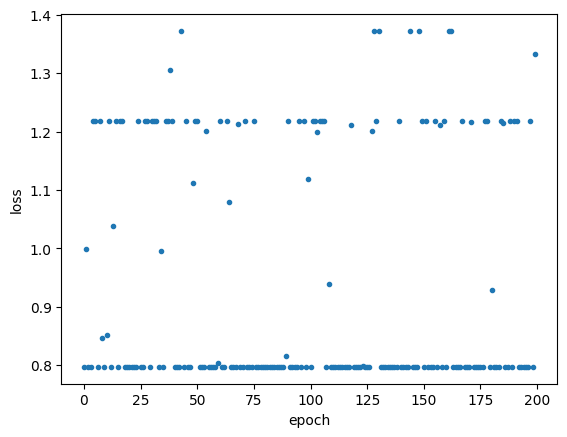

In [1472]:
model = RegressHate_1_notworking()
loss = model._train(train_data1,2000, 0.0001)

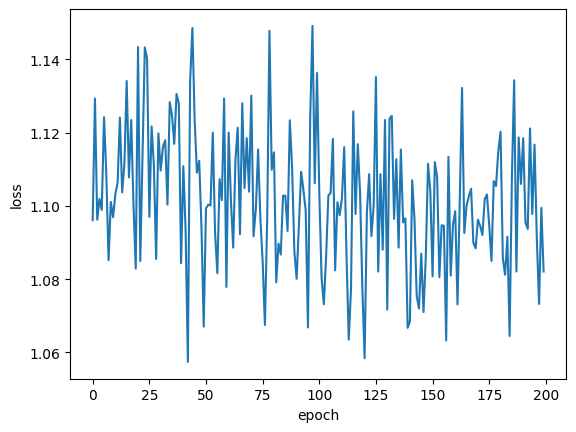

In [1459]:
plt.figure()
plt.plot(loss[::10], '-')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

In [1471]:
np.random.shuffle(train_data1)
correct = 0
test_data1 = train_data1[:500]
for x,y in test_data1:
    results = model(x)
    if int(torch.argmax(results)) == int(list(y).index(1)):
        correct+=1
print(correct)

stupid_model = RegressHate_1_notworking()
correct = 0
test_data1 = train_data1[:500]
for x,y in test_data1:
    results = model(x)
    if int(torch.argmax(results)) == int(list(y).index(1)):
        correct+=1
print(correct)

/Users/temp/Library/Python/3.9/lib/python/site-packages/torch/nn/modules/module.py:1511: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



192
192


In [1333]:
np.random.shuffle(train_data1)
print(train_data1[0][1],model(train_data1[0][0]))

tensor(1., dtype=torch.float64) tensor([0.7666], dtype=torch.float64, grad_fn=<TanhBackward0>)


In [1460]:
get_loss = nn.MSELoss()
np.random.shuffle(train_data1)
test_data1 = train_data1[:500]
smart_error = []
for x,y in test_data1:
    results = model(x)
    smart_error.append(get_loss(results,y).item())

stupid_error = []
stupid_model=RegressHate_1_notworking()
test_data1 = train_data1[:500]
for x,y in test_data1:
    results = stupid_model(x)
    stupid_error.append(get_loss(results,y).item())

/Users/temp/Library/Python/3.9/lib/python/site-packages/torch/nn/modules/module.py:1511: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



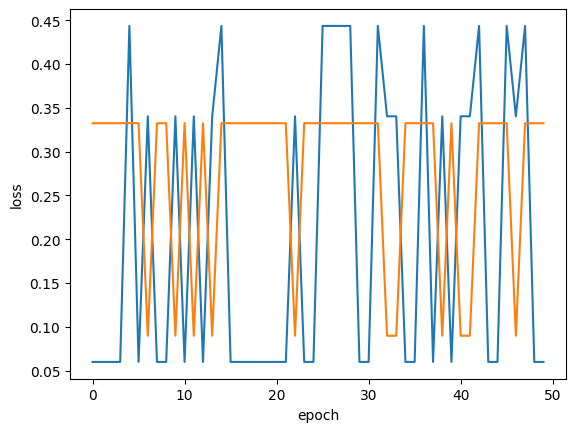

In [1461]:
plt.figure()
plt.plot(smart_error[::10], '-',markersize=1)
plt.plot(stupid_error[::10],'-',markersize=1)
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()


In [1271]:
print(model.linear.weight)

Parameter containing:
tensor([[-1.4350e+01,  2.2827e+00, -1.1908e+00,  1.7643e+00,  3.4716e+00,
         -4.5520e+00,  4.1935e+00,  9.5785e-01,  8.9424e+00, -1.0425e+00,
         -1.3432e+01,  1.4716e+00, -5.0301e+00,  5.0346e-01, -9.7246e+00,
          5.7398e+00, -7.2321e+00, -5.3929e+00, -1.0457e+01, -3.4045e+00,
          1.5881e-01, -4.6237e+00, -2.3896e-01, -8.8849e+00, -2.6701e+00,
          1.3499e+00, -5.3581e+00,  1.2689e+01,  8.4465e+00,  6.5392e+00,
          9.1774e+00,  3.1147e-01,  2.5057e+00, -5.3877e+00, -9.3921e+00,
          2.5932e+00,  4.6319e+00,  1.6165e-01, -1.6845e+00, -5.6357e+00,
          1.4503e+01, -4.0746e+00, -8.8092e+00,  7.0094e+00,  2.4379e+00,
         -5.7333e-01,  1.4017e+00, -4.4546e+00, -1.0856e+01, -8.2124e+00,
         -2.1640e+00,  2.6374e+00,  3.8864e-01,  6.9111e+00, -2.0885e+00,
         -4.6481e+00, -1.9475e+00,  2.9076e+00,  8.4681e+00, -4.5700e+00,
         -1.2990e+01, -1.8241e+00, -1.1333e+01,  2.1812e+00,  5.7947e+00,
         -1.7755

In [1294]:
print(model.linear.weight.grad)

tensor([[ -0.4049,   0.3008,  -1.0410,   4.0145,  -6.8943,   6.7138,   1.6328,
           8.2246,   1.1584,  17.3123,   4.1239,   5.6471,   3.0785,   0.7877,
          13.3581,  11.3984,  12.9729,   0.3642,   2.1554,   5.4429,   0.0576,
          -5.6974,  -1.3580,  -7.4520,   4.9445,  14.1473,  -2.0652,  -6.1029,
         -15.2531,  -1.4599,  -2.0322,  11.6768, -23.7872,   7.8755,  -6.3203,
          12.7478,  -1.9123, -11.4108,   3.5060,   5.6541,  -4.1370,   1.4793,
           9.2130,  -3.0201,   2.5291,  -9.1902,   3.8595,  -4.6878,   0.5158,
          -6.0863,   5.4134,   6.3767,   1.3579,   2.3541, -12.7383,  -3.4458,
           2.7375,  -6.9611,  -2.4554,  -3.9600,  -4.3276,   9.8216,  12.5501,
          -6.0064,  -1.8899,   4.4742,   2.4860,  -3.4759,  -6.6728,  15.0380,
          10.0242,   5.4308,  -4.1635,   2.5469,   1.8748,  -1.0142,  -4.0798,
          -1.4523,  -0.1731, -21.2160,  -8.9544,  -5.6374,  11.0207,  10.2127,
          -8.3147, -12.5873,   0.6629,  12.6455,   3

TypeError: plot() got an unexpected keyword argument 'y'

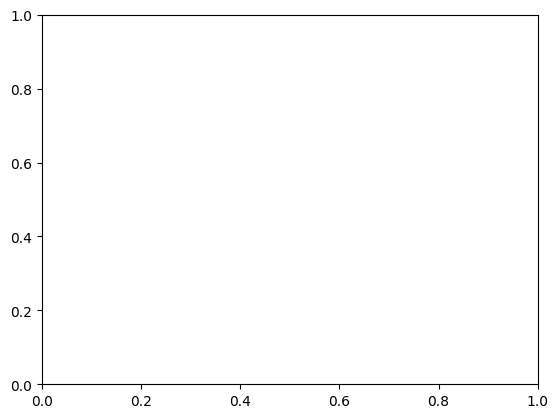

In [1299]:
plt.figure()
plt.plot(y=model.linear.weight.grad)
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
class RegressHate_1(nn.Module):
    def __init__(self):
        super(RegressHate_1_notworking,self).__init__()
        self.softmax = nn.Softmax()
        self.tanh = nn.Tanh()#Need this for weights; want to be able to weight a component but in a way that doesn't affect the classification
        #self.W = nn.Parameter(torch.randn((384,1),dtype=torch.float64,requires_grad=True))#used to make X-based weights
        self.linear = nn.Linear(384,1)
        self.linear.weight = torch.nn.Parameter(torch.zeros((1,384),dtype=torch.float64))
        self.labels = torch.tensor([-1,0,1],dtype=torch.float64,requires_grad=True)
        self.diff = torch.ones((1,3),dtype=torch.float64,requires_grad=True)
        self.output = torch.zeros((1,3),requires_grad=True,dtype=torch.float64)
        return
    
    def forward(self,x):   
        self.output = self.tanh(self.linear(x))
        return self.output

    def _print(self):
        print("W","\n",self.linear.weight)
        print("p","\n",self.output)
        return
    
    def _train(self,data,epochs,learning_rate):
        criterion = nn.CrossEntropyLoss()
        torch.random.manual_seed(42)  
        np.random.seed(42)
        optimizer = torch.optim.Adam(model.parameters(),
                                        lr=learning_rate)
        loss_avg = []
        # main training loop
        for epoch in tqdm(range(epochs)):
            optimizer.zero_grad()
            np.random.shuffle(data)
            loss_val=[]
            self._print()
            for X, y in data[:200]:
                #print(y)
                result = model.forward(X)
                print(result,y)
                loss = criterion(result,y)
                loss.backward()
                optimizer.step()
                loss_val.append(loss.item())
            #print(result,y)
            loss_avg.append(np.mean(loss_val))
            
        plt.figure()
        plt.plot(loss_val, '.')
        plt.ylabel('loss')
        plt.xlabel('epoch')
        plt.show()
        return loss_avg
            